In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/fixed_gear_fe_recortado.csv",
    "output_label": "fixed_gear_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/fixed_gear_fe_recortado.csv', 'output_label': 'fixed_gear_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


      speed    course       lat       lon is_fishing  sun_state   distance  \
0       0.4  0.336667  0.870602 -0.190903         NO          2   9.624476   
1       0.6  0.442778  0.869098 -0.190974         NO          2   9.410527   
2       1.4  0.487222  0.869060 -0.190970         SI          2   0.239792   
3       3.1  0.790000  0.864765 -0.195526         NO          1   0.302651   
4       1.1  0.043889  0.869326 -0.192465         NO          1  34.521489   
...     ...       ...       ...       ...        ...        ...        ...   
9818    9.5  0.546111  0.893925  0.047558         SI          2   4.295893   
9819    9.4  0.541944  0.893833  0.047521         SI          2   0.625956   
9820    3.3  0.363889  1.054151  0.017018         NO          1   3.915774   
9821    0.6  1.000000  0.759690 -0.043457         NO          1   0.139264   
9822    0.0  0.380556  0.872839 -0.040521         NO          1   1.392383   

      timediff        S0            A0  ...      J0_lag_3      

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



4683
5140


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.830
Test Accuracy : 0.733
Best Score Through Grid Search : 0.685
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 4, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 4, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

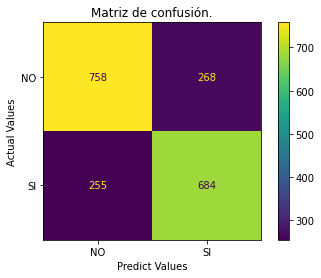

Precision,Recall,Accuracy,F1
0.72,0.73,0.73,0.72


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 1.000
Test Accuracy : 0.766
Best Score Through Grid Search : 0.740
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


Random forest optimizado

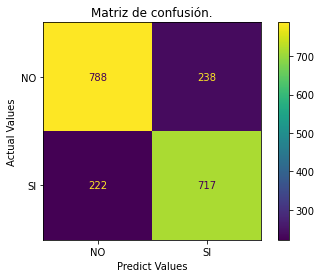

Precision,Recall,Accuracy,F1
0.75,0.76,0.77,0.76


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.699


Test Accuracy : 0.610
Best Score Through Grid Search : 0.603
Best Parameters :  {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


rbf

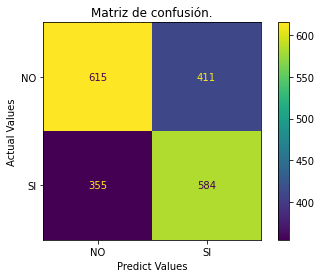

Precision,Recall,Accuracy,F1
0.59,0.62,0.61,0.60


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.554


Test Accuracy : 0.554
Best Score Through Grid Search : 0.554
Best Parameters :  {'C': 1, 'coef0': 1, 'gamma': 1e-06, 'kernel': 'sigmoid'}


sigmoid

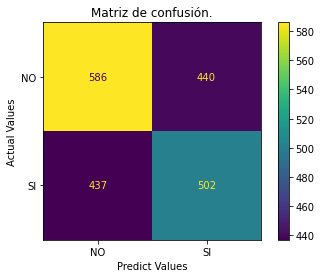

Precision,Recall,Accuracy,F1
0.53,0.53,0.55,0.53


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000*2)


[I 2022-06-05 23:04:38,080] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=6.107148774891338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.107148774891338
[LightGBM] [Warning] lambda_l1 is set=9.728507162774367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.728507162774367
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.1601369725819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.1601369725819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.3

[I 2022-06-05 23:04:38,464] Trial 0 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15639744972825181, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 4300, 'lambda_l1': 9.728507162774367, 'lambda_l2': 37.1601369725819, 'min_gain_to_split': 6.107148774891338, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=6.107148774891338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.107148774891338
[LightGBM] [Warning] lambda_l1 is set=9.728507162774367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.728507162774367
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.1601369725819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.1601369725819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.3

[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=13.212740881401627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.212740881401627
[LightGBM] [Warning] lambda_l1 is set=7.290134932422761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.290134932422761
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=65.81603235110931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81603235110931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=13.212740881401627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.212740881401627
[LightGBM] [Warning] lambda_l1 is set=7.290134932422761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.290134932422761
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=65.81603235110931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81603235110931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-05 23:04:38,980] Trial 1 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2667619946662294, 'num_leaves': 748, 'max_depth': 5, 'min_data_in_leaf': 3600, 'lambda_l1': 7.290134932422761, 'lambda_l2': 65.81603235110931, 'min_gain_to_split': 13.212740881401627, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=13.212740881401627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.212740881401627
[LightGBM] [Warning] lambda_l1 is set=7.290134932422761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.290134932422761
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=65.81603235110931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81603235110931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=4.119145365291218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.119145365291218
[LightGBM] [Warning] lambda_l1 is set=4.762225563118353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.762225563118353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.63161032656319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.63161032656319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-05 23:04:39,403] Trial 2 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09160634062911692, 'num_leaves': 158, 'max_depth': 6, 'min_data_in_leaf': 5800, 'lambda_l1': 4.762225563118353, 'lambda_l2': 81.63161032656319, 'min_gain_to_split': 4.119145365291218, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=4.119145365291218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.119145365291218
[LightGBM] [Warning] lambda_l1 is set=4.762225563118353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.762225563118353
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.63161032656319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.63161032656319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=7.631650834081154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.631650834081154
[LightGBM] [Warning] lambda_l1 is set=5.645479718372989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.645479718372989
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=86.88943440581764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88943440581764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-05 23:04:39,826] Trial 3 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2574582992577966, 'num_leaves': 1008, 'max_depth': 10, 'min_data_in_leaf': 9500, 'lambda_l1': 5.645479718372989, 'lambda_l2': 86.88943440581764, 'min_gain_to_split': 7.631650834081154, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=7.631650834081154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.631650834081154
[LightGBM] [Warning] lambda_l1 is set=5.645479718372989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.645479718372989
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=86.88943440581764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.88943440581764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=3.721764627168496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.721764627168496
[LightGBM] [Warning] lambda_l1 is set=1.944924989679857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.944924989679857
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=30.434257838180656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.434257838180656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-05 23:04:40,247] Trial 4 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27017527955399634, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 8300, 'lambda_l1': 1.944924989679857, 'lambda_l2': 30.434257838180656, 'min_gain_to_split': 3.721764627168496, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=14.114739281900036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.114739281900036
[LightGBM] [Warning] lambda_l1 is set=9.071543597428626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.071543597428626
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=37.28116705828571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28116705828571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=14.114739281900036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.114739281900036
[LightGBM] [Warning] lambda_l1 is set=9.071543597428626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.071543597428626
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=37.28116705828571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28116705828571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 23:04:40,798] Trial 5 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15014695636850495, 'num_leaves': 28, 'max_depth': 7, 'min_data_in_leaf': 3800, 'lambda_l1': 9.071543597428626, 'lambda_l2': 37.28116705828571, 'min_gain_to_split': 14.114739281900036, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=14.114739281900036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.114739281900036
[LightGBM] [Warning] lambda_l1 is set=9.071543597428626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.071543597428626
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=37.28116705828571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.28116705828571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=3.409025044433461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.409025044433461
[LightGBM] [Warning] lambda_l1 is set=8.883436171775417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.883436171775417
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.674372614371646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.674372614371646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=3.409025044433461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.409025044433461
[LightGBM] [Warning] lambda_l1 is set=8.883436171775417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.883436171775417
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.674372614371646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.674372614371646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-05 23:04:41,387] Trial 6 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13879559862241497, 'num_leaves': 78, 'max_depth': 6, 'min_data_in_leaf': 2800, 'lambda_l1': 8.883436171775417, 'lambda_l2': 3.674372614371646, 'min_gain_to_split': 3.409025044433461, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.372804084613941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.372804084613941
[LightGBM] [Warning] lambda_l1 is set=3.7843887261308886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7843887261308886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.40231987722219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.40231987722219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 23:04:41,852] Trial 7 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026575938957859688, 'num_leaves': 238, 'max_depth': 7, 'min_data_in_leaf': 7600, 'lambda_l1': 3.7843887261308886, 'lambda_l2': 61.40231987722219, 'min_gain_to_split': 2.372804084613941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.372804084613941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.372804084613941
[LightGBM] [Warning] lambda_l1 is set=3.7843887261308886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7843887261308886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.40231987722219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.40231987722219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=3.9454103607313575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9454103607313575
[LightGBM] [Warning] lambda_l1 is set=2.0597289684210063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0597289684210063
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=74.55054060207105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.55054060207105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-05 23:04:42,324] Trial 8 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18574101036866547, 'num_leaves': 28, 'max_depth': 6, 'min_data_in_leaf': 6600, 'lambda_l1': 2.0597289684210063, 'lambda_l2': 74.55054060207105, 'min_gain_to_split': 3.9454103607313575, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=3.9454103607313575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9454103607313575
[LightGBM] [Warning] lambda_l1 is set=2.0597289684210063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0597289684210063
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=74.55054060207105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.55054060207105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=14.569374519003269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.569374519003269
[LightGBM] [Warning] lambda_l1 is set=7.08954277983703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.08954277983703
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=98.8689405196856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.8689405196856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ig

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=14.569374519003269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.569374519003269
[LightGBM] [Warning] lambda_l1 is set=7.08954277983703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.08954277983703
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=98.8689405196856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.8689405196856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Curr

[I 2022-06-05 23:04:42,801] Trial 9 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054375338957066414, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 7000, 'lambda_l1': 7.08954277983703, 'lambda_l2': 98.8689405196856, 'min_gain_to_split': 14.569374519003269, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.613806565900852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.613806565900852
[LightGBM] [Warning] lambda_l1 is set=9.767652653556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.767652653556775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.330198791017349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.330198791017349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.613806565900852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.613806565900852
[LightGBM] [Warning] lambda_l1 is set=9.767652653556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.767652653556775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.330198791017349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.330198791017349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.613806565900852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.613806565900852
[LightGBM] [Warning] lambda_l1 is set=9.767652653556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.767652653556775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.330198791017349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.330198791017349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.613806565900852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.613806565900852
[LightGBM] [Warning] lambda_l1 is set=9.767652653556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.767652653556775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.330198791017349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.330198791017349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.613806565900852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.613806565900852
[LightGBM] [Warning] lambda_l1 is set=9.767652653556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.767652653556775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.330198791017349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.330198791017349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:44,326] Trial 10 finished with value: 0.5823012614805844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1934157525296205, 'num_leaves': 518, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 9.767652653556775, 'lambda_l2': 11.330198791017349, 'min_gain_to_split': 8.613806565900852, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.587159900853006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.587159900853006
[LightGBM] [Warning] lambda_l1 is set=9.915966016512328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.915966016512328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.926954044132799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.926954044132799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.587159900853006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.587159900853006
[LightGBM] [Warning] lambda_l1 is set=9.915966016512328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.915966016512328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.926954044132799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.926954044132799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.587159900853006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.587159900853006
[LightGBM] [Warning] lambda_l1 is set=9.915966016512328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.915966016512328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.926954044132799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.926954044132799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.587159900853006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.587159900853006
[LightGBM] [Warning] lambda_l1 is set=9.915966016512328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.915966016512328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.926954044132799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.926954044132799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.587159900853006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.587159900853006
[LightGBM] [Warning] lambda_l1 is set=9.915966016512328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.915966016512328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.926954044132799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.926954044132799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:45,905] Trial 11 finished with value: 0.6042493999364509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2055380309283418, 'num_leaves': 468, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 9.915966016512328, 'lambda_l2': 8.926954044132799, 'min_gain_to_split': 8.587159900853006, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.784187514596681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.784187514596681
[LightGBM] [Warning] lambda_l1 is set=7.649735536400545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649735536400545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7927111750947162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7927111750947162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.784187514596681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.784187514596681
[LightGBM] [Warning] lambda_l1 is set=7.649735536400545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649735536400545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7927111750947162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7927111750947162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.784187514596681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.784187514596681
[LightGBM] [Warning] lambda_l1 is set=7.649735536400545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649735536400545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7927111750947162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7927111750947162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.784187514596681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.784187514596681
[LightGBM] [Warning] lambda_l1 is set=7.649735536400545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649735536400545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7927111750947162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7927111750947162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.784187514596681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.784187514596681
[LightGBM] [Warning] lambda_l1 is set=7.649735536400545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.649735536400545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7927111750947162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7927111750947162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:47,418] Trial 12 finished with value: 0.5911082817887297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21819871292285073, 'num_leaves': 598, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 7.649735536400545, 'lambda_l2': 2.7927111750947162, 'min_gain_to_split': 9.784187514596681, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.243535862326384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.243535862326384
[LightGBM] [Warning] lambda_l1 is set=7.373628226206429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.373628226206429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.359952541936728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.359952541936728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.243535862326384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.243535862326384
[LightGBM] [Warning] lambda_l1 is set=7.373628226206429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.373628226206429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.359952541936728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.359952541936728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.243535862326384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.243535862326384
[LightGBM] [Warning] lambda_l1 is set=7.373628226206429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.373628226206429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.359952541936728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.359952541936728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.243535862326384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.243535862326384
[LightGBM] [Warning] lambda_l1 is set=7.373628226206429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.373628226206429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.359952541936728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.359952541936728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:48,880] Trial 13 finished with value: 0.5913765755265856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21438400866654422, 'num_leaves': 698, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 7.373628226206429, 'lambda_l2': 19.359952541936728, 'min_gain_to_split': 10.243535862326384, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.243535862326384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.243535862326384
[LightGBM] [Warning] lambda_l1 is set=7.373628226206429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.373628226206429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.359952541936728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.359952541936728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.740986500945205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.740986500945205
[LightGBM] [Warning] lambda_l1 is set=0.10915920791851974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10915920791851974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.9684176045642143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9684176045642143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.740986500945205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.740986500945205
[LightGBM] [Warning] lambda_l1 is set=0.10915920791851974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10915920791851974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.9684176045642143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9684176045642143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, cols

[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.740986500945205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.740986500945205
[LightGBM] [Warning] lambda_l1 is set=0.10915920791851974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10915920791851974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.9684176045642143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9684176045642143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.740986500945205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.740986500945205
[LightGBM] [Warning] lambda_l1 is set=0.10915920791851974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10915920791851974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.9684176045642143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9684176045642143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=10.740986500945205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.740986500945205
[LightGBM] [Warning] lambda_l1 is set=0.10915920791851974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10915920791851974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.9684176045642143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9684176045642143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:50,481] Trial 14 finished with value: 0.6408887468085627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23316031379834426, 'num_leaves': 648, 'max_depth': 4, 'min_data_in_leaf': 2200, 'lambda_l1': 0.10915920791851974, 'lambda_l2': 0.9684176045642143, 'min_gain_to_split': 10.740986500945205, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.752782356301275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752782356301275
[LightGBM] [Warning] lambda_l1 is set=7.867640881319726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.867640881319726
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.33512923306209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.33512923306209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.752782356301275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752782356301275
[LightGBM] [Warning] lambda_l1 is set=7.867640881319726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.867640881319726
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.33512923306209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.33512923306209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.752782356301275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752782356301275
[LightGBM] [Warning] lambda_l1 is set=7.867640881319726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.867640881319726
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.33512923306209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.33512923306209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.752782356301275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752782356301275
[LightGBM] [Warning] lambda_l1 is set=7.867640881319726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.867640881319726
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.33512923306209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.33512923306209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=11.752782356301275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.752782356301275
[LightGBM] [Warning] lambda_l1 is set=7.867640881319726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.867640881319726
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.33512923306209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.33512923306209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:52,661] Trial 15 finished with value: 0.6431587050773303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11634308180994701, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 1800, 'lambda_l1': 7.867640881319726, 'lambda_l2': 18.33512923306209, 'min_gain_to_split': 11.752782356301275, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 10 with value: 0.5823012614805844.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.203092589974602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.203092589974602
[LightGBM] [Warning] lambda_l1 is set=5.928722994293954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928722994293954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.128263129174876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.128263129174876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.203092589974602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.203092589974602
[LightGBM] [Warning] lambda_l1 is set=5.928722994293954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928722994293954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.128263129174876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.128263129174876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.203092589974602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.203092589974602
[LightGBM] [Warning] lambda_l1 is set=5.928722994293954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928722994293954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.128263129174876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.128263129174876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.203092589974602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.203092589974602
[LightGBM] [Warning] lambda_l1 is set=5.928722994293954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928722994293954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.128263129174876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.128263129174876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:04:54,235] Trial 16 finished with value: 0.5772695092654907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18505273862981322, 'num_leaves': 888, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 5.928722994293954, 'lambda_l2': 50.128263129174876, 'min_gain_to_split': 9.203092589974602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 16 with value: 0.5772695092654907.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.203092589974602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.203092589974602
[LightGBM] [Warning] lambda_l1 is set=5.928722994293954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928722994293954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.128263129174876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.128263129174876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.48879343333436953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48879343333436953
[LightGBM] [Warning] lambda_l1 is set=5.890115568239464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.890115568239464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.07019766212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.07019766212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.48879343333436953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48879343333436953
[LightGBM] [Warning] lambda_l1 is set=5.890115568239464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.890115568239464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.07019766212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.07019766212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.48879343333436953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48879343333436953
[LightGBM] [Warning] lambda_l1 is set=5.890115568239464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.890115568239464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.07019766212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.07019766212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.48879343333436953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48879343333436953
[LightGBM] [Warning] lambda_l1 is set=5.890115568239464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.890115568239464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.07019766212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.07019766212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.48879343333436953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48879343333436953
[LightGBM] [Warning] lambda_l1 is set=5.890115568239464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.890115568239464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.07019766212734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.07019766212734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:00,901] Trial 17 finished with value: 0.6077133129564384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17649497378254309, 'num_leaves': 928, 'max_depth': 4, 'min_data_in_leaf': 2300, 'lambda_l1': 5.890115568239464, 'lambda_l2': 54.07019766212734, 'min_gain_to_split': 0.48879343333436953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 16 with value: 0.5772695092654907.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.909931891221196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.909931891221196
[LightGBM] [Warning] lambda_l1 is set=3.4903503025309823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4903503025309823
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=46.6444878608937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.6444878608937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.909931891221196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.909931891221196
[LightGBM] [Warning] lambda_l1 is set=3.4903503025309823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4903503025309823
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=46.6444878608937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.6444878608937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.909931891221196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.909931891221196
[LightGBM] [Warning] lambda_l1 is set=3.4903503025309823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4903503025309823
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=46.6444878608937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.6444878608937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.909931891221196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.909931891221196
[LightGBM] [Warning] lambda_l1 is set=3.4903503025309823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4903503025309823
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=46.6444878608937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.6444878608937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=6.909931891221196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.909931891221196
[LightGBM] [Warning] lambda_l1 is set=3.4903503025309823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4903503025309823
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=46.6444878608937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.6444878608937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:06,555] Trial 18 finished with value: 0.6280137653593203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10431093892577716, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 1500, 'lambda_l1': 3.4903503025309823, 'lambda_l2': 46.6444878608937, 'min_gain_to_split': 6.909931891221196, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 16 with value: 0.5772695092654907.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=12.06455595080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06455595080062
[LightGBM] [Warning] lambda_l1 is set=6.498154469195032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.498154469195032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.776301269719276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.776301269719276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[I 2022-06-05 23:05:07,070] Trial 19 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1810104475739599, 'num_leaves': 828, 'max_depth': 5, 'min_data_in_leaf': 5100, 'lambda_l1': 6.498154469195032, 'lambda_l2': 47.776301269719276, 'min_gain_to_split': 12.06455595080062, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 16 with value: 0.5772695092654907.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=12.06455595080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.06455595080062
[LightGBM] [Warning] lambda_l1 is set=6.498154469195032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.498154469195032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.776301269719276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.776301269719276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.021070515165033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.021070515165033
[LightGBM] [Warning] lambda_l1 is set=8.309876978939629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.309876978939629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.293474206888547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293474206888547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.021070515165033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.021070515165033
[LightGBM] [Warning] lambda_l1 is set=8.309876978939629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.309876978939629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.293474206888547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293474206888547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.021070515165033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.021070515165033
[LightGBM] [Warning] lambda_l1 is set=8.309876978939629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.309876978939629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.293474206888547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293474206888547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.021070515165033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.021070515165033
[LightGBM] [Warning] lambda_l1 is set=8.309876978939629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.309876978939629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.293474206888547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293474206888547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:08,456] Trial 20 finished with value: 0.5578092711838026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2972964914670877, 'num_leaves': 458, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 8.309876978939629, 'lambda_l2': 19.293474206888547, 'min_gain_to_split': 6.021070515165033, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 20 with value: 0.5578092711838026.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.021070515165033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.021070515165033
[LightGBM] [Warning] lambda_l1 is set=8.309876978939629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.309876978939629
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=19.293474206888547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293474206888547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.679364310227619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.679364310227619
[LightGBM] [Warning] lambda_l1 is set=8.586753583641975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.586753583641975
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.95341056314731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.95341056314731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.679364310227619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.679364310227619
[LightGBM] [Warning] lambda_l1 is set=8.586753583641975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.586753583641975
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.95341056314731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.95341056314731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.679364310227619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.679364310227619
[LightGBM] [Warning] lambda_l1 is set=8.586753583641975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.586753583641975
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.95341056314731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.95341056314731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.679364310227619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.679364310227619
[LightGBM] [Warning] lambda_l1 is set=8.586753583641975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.586753583641975
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.95341056314731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.95341056314731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:10,311] Trial 21 finished with value: 0.557408953536277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29747812320204087, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 8.586753583641975, 'lambda_l2': 22.95341056314731, 'min_gain_to_split': 5.679364310227619, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 21 with value: 0.557408953536277.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.679364310227619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.679364310227619
[LightGBM] [Warning] lambda_l1 is set=8.586753583641975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.586753583641975
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.95341056314731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.95341056314731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.631121156295037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.631121156295037
[LightGBM] [Warning] lambda_l1 is set=8.528120936608897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528120936608897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.639334636550906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.639334636550906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.631121156295037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.631121156295037
[LightGBM] [Warning] lambda_l1 is set=8.528120936608897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528120936608897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.639334636550906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.639334636550906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.631121156295037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.631121156295037
[LightGBM] [Warning] lambda_l1 is set=8.528120936608897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528120936608897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.639334636550906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.639334636550906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.631121156295037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.631121156295037
[LightGBM] [Warning] lambda_l1 is set=8.528120936608897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528120936608897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.639334636550906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.639334636550906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:12,671] Trial 22 finished with value: 0.614080808355867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2871238393742411, 'num_leaves': 428, 'max_depth': 5, 'min_data_in_leaf': 1200, 'lambda_l1': 8.528120936608897, 'lambda_l2': 27.639334636550906, 'min_gain_to_split': 5.631121156295037, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 21 with value: 0.557408953536277.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=5.631121156295037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.631121156295037
[LightGBM] [Warning] lambda_l1 is set=8.528120936608897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528120936608897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.639334636550906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.639334636550906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=5.256076153022402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.256076153022402
[LightGBM] [Warning] lambda_l1 is set=8.387178111682337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.387178111682337
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=24.665280709798495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.665280709798495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=5.256076153022402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.256076153022402
[LightGBM] [Warning] lambda_l1 is set=8.387178111682337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.387178111682337
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=24.665280709798495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.665280709798495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 23:05:13,298] Trial 23 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29952454136592815, 'num_leaves': 278, 'max_depth': 4, 'min_data_in_leaf': 2800, 'lambda_l1': 8.387178111682337, 'lambda_l2': 24.665280709798495, 'min_gain_to_split': 5.256076153022402, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 21 with value: 0.557408953536277.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=5.256076153022402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.256076153022402
[LightGBM] [Warning] lambda_l1 is set=8.387178111682337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.387178111682337
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=24.665280709798495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.665280709798495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.837810665309227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.837810665309227
[LightGBM] [Warning] lambda_l1 is set=6.430145571232406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430145571232406
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.13988488967715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.13988488967715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.837810665309227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.837810665309227
[LightGBM] [Warning] lambda_l1 is set=6.430145571232406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430145571232406
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.13988488967715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.13988488967715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.837810665309227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.837810665309227
[LightGBM] [Warning] lambda_l1 is set=6.430145571232406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430145571232406
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.13988488967715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.13988488967715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.837810665309227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.837810665309227
[LightGBM] [Warning] lambda_l1 is set=6.430145571232406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.430145571232406
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=39.13988488967715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.13988488967715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:15,607] Trial 24 finished with value: 0.6197961277154725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24505969499713431, 'num_leaves': 388, 'max_depth': 5, 'min_data_in_leaf': 1200, 'lambda_l1': 6.430145571232406, 'lambda_l2': 39.13988488967715, 'min_gain_to_split': 7.837810665309227, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 21 with value: 0.557408953536277.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8681265604201007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8681265604201007
[LightGBM] [Warning] lambda_l1 is set=4.338784815247488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338784815247488
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.30362804157248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.30362804157248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8681265604201007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8681265604201007
[LightGBM] [Warning] lambda_l1 is set=4.338784815247488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338784815247488
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.30362804157248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.30362804157248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8681265604201007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8681265604201007
[LightGBM] [Warning] lambda_l1 is set=4.338784815247488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338784815247488
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.30362804157248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.30362804157248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8681265604201007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8681265604201007
[LightGBM] [Warning] lambda_l1 is set=4.338784815247488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338784815247488
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.30362804157248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.30362804157248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8681265604201007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8681265604201007
[LightGBM] [Warning] lambda_l1 is set=4.338784815247488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338784815247488
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.30362804157248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.30362804157248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:18,151] Trial 25 finished with value: 0.530219385728709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2836086183540051, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.338784815247488, 'lambda_l2': 59.30362804157248, 'min_gain_to_split': 1.8681265604201007, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.15050726125233727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15050726125233727
[LightGBM] [Warning] lambda_l1 is set=4.435877711915358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435877711915358
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.89558914273846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89558914273846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.15050726125233727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15050726125233727
[LightGBM] [Warning] lambda_l1 is set=4.435877711915358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435877711915358
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.89558914273846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89558914273846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.15050726125233727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15050726125233727
[LightGBM] [Warning] lambda_l1 is set=4.435877711915358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435877711915358
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.89558914273846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89558914273846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.15050726125233727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15050726125233727
[LightGBM] [Warning] lambda_l1 is set=4.435877711915358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435877711915358
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.89558914273846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89558914273846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.15050726125233727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.15050726125233727
[LightGBM] [Warning] lambda_l1 is set=4.435877711915358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435877711915358
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.89558914273846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.89558914273846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:21,344] Trial 26 finished with value: 0.6033690611231417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.283254968002748, 'num_leaves': 778, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 4.435877711915358, 'lambda_l2': 59.89558914273846, 'min_gain_to_split': 0.15050726125233727, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.6570463408639022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570463408639022
[LightGBM] [Warning] lambda_l1 is set=2.580849877373723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580849877373723
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.119226857684275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.119226857684275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.6570463408639022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570463408639022
[LightGBM] [Warning] lambda_l1 is set=2.580849877373723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580849877373723
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.119226857684275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.119226857684275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 23:05:21,963] Trial 27 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29916023442273915, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 3000, 'lambda_l1': 2.580849877373723, 'lambda_l2': 15.119226857684275, 'min_gain_to_split': 1.6570463408639022, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.6570463408639022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6570463408639022
[LightGBM] [Warning] lambda_l1 is set=2.580849877373723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.580849877373723
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.119226857684275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.119226857684275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Cur

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.0581058671946133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0581058671946133
[LightGBM] [Warning] lambda_l1 is set=5.273541259216702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.273541259216702
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.50946596232984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.50946596232984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.0581058671946133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0581058671946133
[LightGBM] [Warning] lambda_l1 is set=5.273541259216702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.273541259216702
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.50946596232984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.50946596232984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.0581058671946133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0581058671946133
[LightGBM] [Warning] lambda_l1 is set=5.273541259216702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.273541259216702
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.50946596232984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.50946596232984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=2.0581058671946133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0581058671946133
[LightGBM] [Warning] lambda_l1 is set=5.273541259216702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.273541259216702
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.50946596232984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.50946596232984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:23,835] Trial 28 finished with value: 0.6326811612274755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24163848729868542, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 1900, 'lambda_l1': 5.273541259216702, 'lambda_l2': 71.50946596232984, 'min_gain_to_split': 2.0581058671946133, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=6.645736795133386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.645736795133386
[LightGBM] [Warning] lambda_l1 is set=4.06475776814001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06475776814001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.437471741371525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.437471741371525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=6.645736795133386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.645736795133386
[LightGBM] [Warning] lambda_l1 is set=4.06475776814001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06475776814001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.437471741371525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.437471741371525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-05 23:05:24,375] Trial 29 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2746132695514968, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 4.06475776814001, 'lambda_l2': 32.437471741371525, 'min_gain_to_split': 6.645736795133386, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=6.645736795133386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.645736795133386
[LightGBM] [Warning] lambda_l1 is set=4.06475776814001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06475776814001
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.437471741371525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.437471741371525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.9384539061554538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9384539061554538
[LightGBM] [Warning] lambda_l1 is set=3.104689830158925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104689830158925
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.905003245624556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.905003245624556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-05 23:05:24,915] Trial 30 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2560946523591198, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 4400, 'lambda_l1': 3.104689830158925, 'lambda_l2': 39.905003245624556, 'min_gain_to_split': 2.9384539061554538, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] min_gain_to_split is set=2.9384539061554538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9384539061554538
[LightGBM] [Warning] lambda_l1 is set=3.104689830158925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104689830158925
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.905003245624556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.905003245624556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=2.9384539061554538, min_split_gain=0.0 will be ignored. Curr

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.744119668998221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.744119668998221
[LightGBM] [Warning] lambda_l1 is set=6.631846026363957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.631846026363957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.14273627087756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.14273627087756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.744119668998221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.744119668998221
[LightGBM] [Warning] lambda_l1 is set=6.631846026363957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.631846026363957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.14273627087756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.14273627087756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.744119668998221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.744119668998221
[LightGBM] [Warning] lambda_l1 is set=6.631846026363957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.631846026363957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.14273627087756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.14273627087756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.744119668998221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.744119668998221
[LightGBM] [Warning] lambda_l1 is set=6.631846026363957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.631846026363957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.14273627087756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.14273627087756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.744119668998221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.744119668998221
[LightGBM] [Warning] lambda_l1 is set=6.631846026363957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.631846026363957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.14273627087756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.14273627087756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:26,675] Trial 31 finished with value: 0.5621061942365004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29954414974827126, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 6.631846026363957, 'lambda_l2': 55.14273627087756, 'min_gain_to_split': 4.744119668998221, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6057747041982084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6057747041982084
[LightGBM] [Warning] lambda_l1 is set=6.705879077663321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705879077663321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.650843530903266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.650843530903266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6057747041982084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6057747041982084
[LightGBM] [Warning] lambda_l1 is set=6.705879077663321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705879077663321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.650843530903266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.650843530903266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6057747041982084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6057747041982084
[LightGBM] [Warning] lambda_l1 is set=6.705879077663321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705879077663321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.650843530903266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.650843530903266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6057747041982084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6057747041982084
[LightGBM] [Warning] lambda_l1 is set=6.705879077663321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705879077663321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.650843530903266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.650843530903266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.6057747041982084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6057747041982084
[LightGBM] [Warning] lambda_l1 is set=6.705879077663321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.705879077663321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.650843530903266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.650843530903266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:29,789] Trial 32 finished with value: 0.5971607221970047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2998853844977408, 'num_leaves': 818, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 6.705879077663321, 'lambda_l2': 58.650843530903266, 'min_gain_to_split': 4.6057747041982084, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.021603942385496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.021603942385496
[LightGBM] [Warning] lambda_l1 is set=9.227113613351921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.227113613351921
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.43537280399858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.43537280399858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.021603942385496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.021603942385496
[LightGBM] [Warning] lambda_l1 is set=9.227113613351921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.227113613351921
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.43537280399858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.43537280399858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.021603942385496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.021603942385496
[LightGBM] [Warning] lambda_l1 is set=9.227113613351921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.227113613351921
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.43537280399858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.43537280399858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.021603942385496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.021603942385496
[LightGBM] [Warning] lambda_l1 is set=9.227113613351921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.227113613351921
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.43537280399858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.43537280399858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.021603942385496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.021603942385496
[LightGBM] [Warning] lambda_l1 is set=9.227113613351921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.227113613351921
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.43537280399858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.43537280399858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:32,876] Trial 33 finished with value: 0.6047880280913402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.275446468171283, 'num_leaves': 978, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 9.227113613351921, 'lambda_l2': 66.43537280399858, 'min_gain_to_split': 5.021603942385496, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 25 with value: 0.530219385728709.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0521437442218136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0521437442218136
[LightGBM] [Warning] lambda_l1 is set=8.33567886477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.33567886477893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.42422785948362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.42422785948362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0521437442218136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0521437442218136
[LightGBM] [Warning] lambda_l1 is set=8.33567886477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.33567886477893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.42422785948362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.42422785948362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0521437442218136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0521437442218136
[LightGBM] [Warning] lambda_l1 is set=8.33567886477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.33567886477893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.42422785948362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.42422785948362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0521437442218136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0521437442218136
[LightGBM] [Warning] lambda_l1 is set=8.33567886477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.33567886477893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.42422785948362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.42422785948362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0521437442218136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0521437442218136
[LightGBM] [Warning] lambda_l1 is set=8.33567886477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.33567886477893
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=41.42422785948362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.42422785948362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:35,885] Trial 34 finished with value: 0.5190616010698206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25814259654463084, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.33567886477893, 'lambda_l2': 41.42422785948362, 'min_gain_to_split': 1.0521437442218136, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.1123615025994695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1123615025994695
[LightGBM] [Warning] lambda_l1 is set=8.043546828155895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.043546828155895
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.481825046039138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.481825046039138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.1123615025994695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1123615025994695
[LightGBM] [Warning] lambda_l1 is set=8.043546828155895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.043546828155895
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.481825046039138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.481825046039138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.1123615025994695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1123615025994695
[LightGBM] [Warning] lambda_l1 is set=8.043546828155895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.043546828155895
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.481825046039138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.481825046039138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.1123615025994695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1123615025994695
[LightGBM] [Warning] lambda_l1 is set=8.043546828155895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.043546828155895
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.481825046039138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.481825046039138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=1.1123615025994695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1123615025994695
[LightGBM] [Warning] lambda_l1 is set=8.043546828155895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.043546828155895
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=21.481825046039138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.481825046039138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:39,718] Trial 35 finished with value: 0.6069658872950028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25944115246794314, 'num_leaves': 578, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 8.043546828155895, 'lambda_l2': 21.481825046039138, 'min_gain_to_split': 1.1123615025994695, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=2.8965436899801205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8965436899801205
[LightGBM] [Warning] lambda_l1 is set=4.877097056468712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.877097056468712
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=33.19460663548696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19460663548696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=2.8965436899801205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8965436899801205
[LightGBM] [Warning] lambda_l1 is set=4.877097056468712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.877097056468712
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=33.19460663548696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19460663548696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-05 23:05:40,299] Trial 36 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22538950834832444, 'num_leaves': 438, 'max_depth': 5, 'min_data_in_leaf': 9800, 'lambda_l1': 4.877097056468712, 'lambda_l2': 33.19460663548696, 'min_gain_to_split': 2.8965436899801205, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=2.8965436899801205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8965436899801205
[LightGBM] [Warning] lambda_l1 is set=4.877097056468712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.877097056468712
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=33.19460663548696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19460663548696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4251214379092891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4251214379092891
[LightGBM] [Warning] lambda_l1 is set=9.406732338487226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.406732338487226
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.84300928235037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.84300928235037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[I 2022-06-05 23:05:40,934] Trial 37 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2567717103037214, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 3500, 'lambda_l1': 9.406732338487226, 'lambda_l2': 43.84300928235037, 'min_gain_to_split': 1.4251214379092891, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=1.4251214379092891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4251214379092891
[LightGBM] [Warning] lambda_l1 is set=9.406732338487226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.406732338487226
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.84300928235037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.84300928235037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=6.467319432435907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.467319432435907
[LightGBM] [Warning] lambda_l1 is set=8.62360846025262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.62360846025262
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.36999779472268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.36999779472268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=6.467319432435907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.467319432435907
[LightGBM] [Warning] lambda_l1 is set=8.62360846025262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.62360846025262
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.36999779472268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.36999779472268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=

[I 2022-06-05 23:05:41,583] Trial 38 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28135334977277954, 'num_leaves': 218, 'max_depth': 4, 'min_data_in_leaf': 2200, 'lambda_l1': 8.62360846025262, 'lambda_l2': 26.36999779472268, 'min_gain_to_split': 6.467319432435907, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=6.467319432435907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.467319432435907
[LightGBM] [Warning] lambda_l1 is set=8.62360846025262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.62360846025262
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=26.36999779472268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.36999779472268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.8751266748647915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.8751266748647915
[LightGBM] [Warning] lambda_l1 is set=5.329350065411751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.329350065411751
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.77271523543983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.77271523543983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.8751266748647915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.8751266748647915
[LightGBM] [Warning] lambda_l1 is set=5.329350065411751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.329350065411751
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.77271523543983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.77271523543983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.8751266748647915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.8751266748647915
[LightGBM] [Warning] lambda_l1 is set=5.329350065411751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.329350065411751
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.77271523543983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.77271523543983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:43,903] Trial 39 finished with value: 0.6395586970342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24460062238200803, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 5.329350065411751, 'lambda_l2': 81.77271523543983, 'min_gain_to_split': 5.8751266748647915, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=5.8751266748647915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.8751266748647915
[LightGBM] [Warning] lambda_l1 is set=5.329350065411751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.329350065411751
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.77271523543983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.77271523543983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.9817827930533416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817827930533416
[LightGBM] [Warning] lambda_l1 is set=8.25605505020798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25605505020798
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.453339460579784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.453339460579784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.9817827930533416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817827930533416
[LightGBM] [Warning] lambda_l1 is set=8.25605505020798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25605505020798
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.453339460579784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.453339460579784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-05 23:05:44,469] Trial 40 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26197793615860315, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 8900, 'lambda_l1': 8.25605505020798, 'lambda_l2': 11.453339460579784, 'min_gain_to_split': 0.9817827930533416, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.9817827930533416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817827930533416
[LightGBM] [Warning] lambda_l1 is set=8.25605505020798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.25605505020798
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=11.453339460579784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.453339460579784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4489338812834625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4489338812834625
[LightGBM] [Warning] lambda_l1 is set=7.041148293153725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041148293153725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.45408117676113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.45408117676113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4489338812834625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4489338812834625
[LightGBM] [Warning] lambda_l1 is set=7.041148293153725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041148293153725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.45408117676113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.45408117676113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4489338812834625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4489338812834625
[LightGBM] [Warning] lambda_l1 is set=7.041148293153725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041148293153725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.45408117676113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.45408117676113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.4489338812834625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.4489338812834625
[LightGBM] [Warning] lambda_l1 is set=7.041148293153725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.041148293153725
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.45408117676113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.45408117676113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:46,606] Trial 41 finished with value: 0.569960213953233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28383104471153014, 'num_leaves': 788, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.041148293153725, 'lambda_l2': 52.45408117676113, 'min_gain_to_split': 4.4489338812834625, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.522666036863677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.522666036863677
[LightGBM] [Warning] lambda_l1 is set=8.968756630221016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.968756630221016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.33912192034644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.33912192034644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.522666036863677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.522666036863677
[LightGBM] [Warning] lambda_l1 is set=8.968756630221016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.968756630221016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.33912192034644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.33912192034644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.522666036863677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.522666036863677
[LightGBM] [Warning] lambda_l1 is set=8.968756630221016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.968756630221016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.33912192034644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.33912192034644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.522666036863677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.522666036863677
[LightGBM] [Warning] lambda_l1 is set=8.968756630221016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.968756630221016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.33912192034644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.33912192034644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.522666036863677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.522666036863677
[LightGBM] [Warning] lambda_l1 is set=8.968756630221016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.968756630221016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.33912192034644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.33912192034644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:48,491] Trial 42 finished with value: 0.5580578886372918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2930204611095755, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 8.968756630221016, 'lambda_l2': 68.33912192034644, 'min_gain_to_split': 3.522666036863677, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.396207063039447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.396207063039447
[LightGBM] [Warning] lambda_l1 is set=9.060878080366347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.060878080366347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.7224477616612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7224477616612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.396207063039447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.396207063039447
[LightGBM] [Warning] lambda_l1 is set=9.060878080366347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.060878080366347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.7224477616612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7224477616612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.396207063039447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.396207063039447
[LightGBM] [Warning] lambda_l1 is set=9.060878080366347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.060878080366347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.7224477616612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7224477616612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.396207063039447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.396207063039447
[LightGBM] [Warning] lambda_l1 is set=9.060878080366347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.060878080366347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.7224477616612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7224477616612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.396207063039447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.396207063039447
[LightGBM] [Warning] lambda_l1 is set=9.060878080366347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.060878080366347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.7224477616612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7224477616612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:05:51,721] Trial 43 finished with value: 0.6081335829634666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26600540703438663, 'num_leaves': 1008, 'max_depth': 5, 'min_data_in_leaf': 1400, 'lambda_l1': 9.060878080366347, 'lambda_l2': 71.7224477616612, 'min_gain_to_split': 3.396207063039447, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4593236898596653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4593236898596653
[LightGBM] [Warning] lambda_l1 is set=9.360746400125766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.360746400125766
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.77620657426495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.77620657426495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4593236898596653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4593236898596653
[LightGBM] [Warning] lambda_l1 is set=9.360746400125766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.360746400125766
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.77620657426495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.77620657426495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4593236898596653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4593236898596653
[LightGBM] [Warning] lambda_l1 is set=9.360746400125766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.360746400125766
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.77620657426495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.77620657426495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4593236898596653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4593236898596653
[LightGBM] [Warning] lambda_l1 is set=9.360746400125766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.360746400125766
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.77620657426495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.77620657426495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4593236898596653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4593236898596653
[LightGBM] [Warning] lambda_l1 is set=9.360746400125766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.360746400125766
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.77620657426495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.77620657426495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:03,104] Trial 44 finished with value: 0.593136513139505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06952112309954037, 'num_leaves': 338, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 9.360746400125766, 'lambda_l2': 67.77620657426495, 'min_gain_to_split': 2.4593236898596653, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=3.9787442720190787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9787442720190787
[LightGBM] [Warning] lambda_l1 is set=9.985775391912725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.985775391912725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.14369424174754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.14369424174754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=3.9787442720190787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9787442720190787
[LightGBM] [Warning] lambda_l1 is set=9.985775391912725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.985775391912725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.14369424174754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.14369424174754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will

[I 2022-06-05 23:06:03,664] Trial 45 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2869319061790835, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 6100, 'lambda_l1': 9.985775391912725, 'lambda_l2': 79.14369424174754, 'min_gain_to_split': 3.9787442720190787, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=3.9787442720190787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9787442720190787
[LightGBM] [Warning] lambda_l1 is set=9.985775391912725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.985775391912725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.14369424174754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.14369424174754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2712706156930316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2712706156930316
[LightGBM] [Warning] lambda_l1 is set=7.6331117020839425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6331117020839425
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=86.94251330916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.94251330916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2712706156930316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2712706156930316
[LightGBM] [Warning] lambda_l1 is set=7.6331117020839425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6331117020839425
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=86.94251330916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.94251330916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2712706156930316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2712706156930316
[LightGBM] [Warning] lambda_l1 is set=7.6331117020839425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6331117020839425
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=86.94251330916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.94251330916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2712706156930316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2712706156930316
[LightGBM] [Warning] lambda_l1 is set=7.6331117020839425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6331117020839425
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=86.94251330916593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.94251330916593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:05,930] Trial 46 finished with value: 0.5505075141150085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2671917455367783, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.6331117020839425, 'lambda_l2': 86.94251330916593, 'min_gain_to_split': 3.2712706156930316, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.3727786786382525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3727786786382525
[LightGBM] [Warning] lambda_l1 is set=7.54065094428195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54065094428195
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.88017146682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.88017146682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.3727786786382525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3727786786382525
[LightGBM] [Warning] lambda_l1 is set=7.54065094428195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54065094428195
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.88017146682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.88017146682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.3727786786382525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3727786786382525
[LightGBM] [Warning] lambda_l1 is set=7.54065094428195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54065094428195
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.88017146682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.88017146682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.3727786786382525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3727786786382525
[LightGBM] [Warning] lambda_l1 is set=7.54065094428195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54065094428195
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.88017146682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.88017146682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.3727786786382525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3727786786382525
[LightGBM] [Warning] lambda_l1 is set=7.54065094428195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54065094428195
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.88017146682468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.88017146682468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:08,044] Trial 47 finished with value: 0.6092917412037626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2716156843266423, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 7.54065094428195, 'lambda_l2': 96.88017146682468, 'min_gain_to_split': 7.3727786786382525, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.3690391849587225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3690391849587225
[LightGBM] [Warning] lambda_l1 is set=7.885571980601307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885571980601307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30510828765323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30510828765323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.3690391849587225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3690391849587225
[LightGBM] [Warning] lambda_l1 is set=7.885571980601307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885571980601307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30510828765323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30510828765323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.3690391849587225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3690391849587225
[LightGBM] [Warning] lambda_l1 is set=7.885571980601307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885571980601307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30510828765323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30510828765323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.3690391849587225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3690391849587225
[LightGBM] [Warning] lambda_l1 is set=7.885571980601307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885571980601307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30510828765323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30510828765323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.3690391849587225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3690391849587225
[LightGBM] [Warning] lambda_l1 is set=7.885571980601307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.885571980601307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30510828765323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30510828765323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:10,954] Trial 48 finished with value: 0.6325007431755256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1638335154400779, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 2500, 'lambda_l1': 7.885571980601307, 'lambda_l2': 35.30510828765323, 'min_gain_to_split': 2.3690391849587225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.7707529144239225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707529144239225
[LightGBM] [Warning] lambda_l1 is set=0.75220435195207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.75220435195207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.35462772991956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.35462772991956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.7707529144239225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707529144239225
[LightGBM] [Warning] lambda_l1 is set=0.75220435195207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.75220435195207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.35462772991956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.35462772991956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.7707529144239225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707529144239225
[LightGBM] [Warning] lambda_l1 is set=0.75220435195207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.75220435195207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.35462772991956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.35462772991956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.7707529144239225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707529144239225
[LightGBM] [Warning] lambda_l1 is set=0.75220435195207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.75220435195207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.35462772991956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.35462772991956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.7707529144239225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7707529144239225
[LightGBM] [Warning] lambda_l1 is set=0.75220435195207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.75220435195207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.35462772991956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.35462772991956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:15,049] Trial 49 finished with value: 0.6015949035304119 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2315934056965886, 'num_leaves': 668, 'max_depth': 4, 'min_data_in_leaf': 1700, 'lambda_l1': 0.75220435195207, 'lambda_l2': 87.35462772991956, 'min_gain_to_split': 0.7707529144239225, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.0550340786692933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550340786692933
[LightGBM] [Warning] lambda_l1 is set=7.1647127322829505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1647127322829505
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.2093810943605945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2093810943605945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.0550340786692933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550340786692933
[LightGBM] [Warning] lambda_l1 is set=7.1647127322829505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1647127322829505
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.2093810943605945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2093810943605945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: 

[I 2022-06-05 23:06:15,634] Trial 50 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19931161637857417, 'num_leaves': 428, 'max_depth': 3, 'min_data_in_leaf': 7600, 'lambda_l1': 7.1647127322829505, 'lambda_l2': 6.2093810943605945, 'min_gain_to_split': 2.0550340786692933, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.0550340786692933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550340786692933
[LightGBM] [Warning] lambda_l1 is set=7.1647127322829505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1647127322829505
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.2093810943605945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2093810943605945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7215015129878153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7215015129878153
[LightGBM] [Warning] lambda_l1 is set=8.750321940948021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.750321940948021
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=87.18650481169442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.18650481169442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7215015129878153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7215015129878153
[LightGBM] [Warning] lambda_l1 is set=8.750321940948021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.750321940948021
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=87.18650481169442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.18650481169442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7215015129878153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7215015129878153
[LightGBM] [Warning] lambda_l1 is set=8.750321940948021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.750321940948021
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=87.18650481169442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.18650481169442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7215015129878153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7215015129878153
[LightGBM] [Warning] lambda_l1 is set=8.750321940948021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.750321940948021
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=87.18650481169442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.18650481169442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:19,058] Trial 51 finished with value: 0.5693646860937696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2508727401643678, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 8.750321940948021, 'lambda_l2': 87.18650481169442, 'min_gain_to_split': 3.7215015129878153, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.889224859046193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.889224859046193
[LightGBM] [Warning] lambda_l1 is set=9.485640677658543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.485640677658543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.50681470900581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.50681470900581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.889224859046193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.889224859046193
[LightGBM] [Warning] lambda_l1 is set=9.485640677658543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.485640677658543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.50681470900581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.50681470900581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.889224859046193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.889224859046193
[LightGBM] [Warning] lambda_l1 is set=9.485640677658543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.485640677658543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.50681470900581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.50681470900581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.889224859046193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.889224859046193
[LightGBM] [Warning] lambda_l1 is set=9.485640677658543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.485640677658543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.50681470900581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.50681470900581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.889224859046193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.889224859046193
[LightGBM] [Warning] lambda_l1 is set=9.485640677658543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.485640677658543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.50681470900581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.50681470900581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:21,172] Trial 52 finished with value: 0.5469205105370482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2900696175892398, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 9.485640677658543, 'lambda_l2': 64.50681470900581, 'min_gain_to_split': 2.889224859046193, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.693516382180652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693516382180652
[LightGBM] [Warning] lambda_l1 is set=9.669283646795986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.669283646795986
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=92.96603983530008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.96603983530008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.693516382180652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693516382180652
[LightGBM] [Warning] lambda_l1 is set=9.669283646795986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.669283646795986
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=92.96603983530008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.96603983530008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.693516382180652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693516382180652
[LightGBM] [Warning] lambda_l1 is set=9.669283646795986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.669283646795986
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=92.96603983530008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.96603983530008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.693516382180652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693516382180652
[LightGBM] [Warning] lambda_l1 is set=9.669283646795986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.669283646795986
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=92.96603983530008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.96603983530008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.693516382180652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.693516382180652
[LightGBM] [Warning] lambda_l1 is set=9.669283646795986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.669283646795986
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=92.96603983530008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.96603983530008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:25,515] Trial 53 finished with value: 0.5641510272111859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27189976693385154, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 9.669283646795986, 'lambda_l2': 92.96603983530008, 'min_gain_to_split': 2.693516382180652, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.08054284411207968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08054284411207968
[LightGBM] [Warning] lambda_l1 is set=8.13710404262783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13710404262783
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.02011391738451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02011391738451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.08054284411207968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08054284411207968
[LightGBM] [Warning] lambda_l1 is set=8.13710404262783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13710404262783
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.02011391738451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02011391738451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.08054284411207968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08054284411207968
[LightGBM] [Warning] lambda_l1 is set=8.13710404262783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13710404262783
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.02011391738451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02011391738451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.08054284411207968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08054284411207968
[LightGBM] [Warning] lambda_l1 is set=8.13710404262783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13710404262783
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.02011391738451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02011391738451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.08054284411207968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08054284411207968
[LightGBM] [Warning] lambda_l1 is set=8.13710404262783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13710404262783
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.02011391738451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.02011391738451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:28,935] Trial 54 finished with value: 0.5831165082528234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2662975432489012, 'num_leaves': 728, 'max_depth': 4, 'min_data_in_leaf': 1200, 'lambda_l1': 8.13710404262783, 'lambda_l2': 44.02011391738451, 'min_gain_to_split': 0.08054284411207968, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6296602160481093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6296602160481093
[LightGBM] [Warning] lambda_l1 is set=9.527114679943736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.527114679943736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=63.911519474506356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.911519474506356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6296602160481093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6296602160481093
[LightGBM] [Warning] lambda_l1 is set=9.527114679943736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.527114679943736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=63.911519474506356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.911519474506356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6296602160481093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6296602160481093
[LightGBM] [Warning] lambda_l1 is set=9.527114679943736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.527114679943736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=63.911519474506356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.911519474506356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6296602160481093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6296602160481093
[LightGBM] [Warning] lambda_l1 is set=9.527114679943736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.527114679943736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=63.911519474506356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.911519474506356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6296602160481093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6296602160481093
[LightGBM] [Warning] lambda_l1 is set=9.527114679943736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.527114679943736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=63.911519474506356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.911519474506356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:33,885] Trial 55 finished with value: 0.538327823275512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12778787370479774, 'num_leaves': 498, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 9.527114679943736, 'lambda_l2': 63.911519474506356, 'min_gain_to_split': 1.6296602160481093, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7022846844502617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7022846844502617
[LightGBM] [Warning] lambda_l1 is set=9.624504841721173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.624504841721173
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=63.110276788094296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.110276788094296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7022846844502617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7022846844502617
[LightGBM] [Warning] lambda_l1 is set=9.624504841721173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.624504841721173
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=63.110276788094296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.110276788094296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7022846844502617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7022846844502617
[LightGBM] [Warning] lambda_l1 is set=9.624504841721173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.624504841721173
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=63.110276788094296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.110276788094296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7022846844502617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7022846844502617
[LightGBM] [Warning] lambda_l1 is set=9.624504841721173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.624504841721173
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=63.110276788094296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.110276788094296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7022846844502617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7022846844502617
[LightGBM] [Warning] lambda_l1 is set=9.624504841721173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.624504841721173
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=63.110276788094296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.110276788094296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:39,256] Trial 56 finished with value: 0.5866431306447587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13182679057501753, 'num_leaves': 518, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 9.624504841721173, 'lambda_l2': 63.110276788094296, 'min_gain_to_split': 1.7022846844502617, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.982314469673499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.982314469673499
[LightGBM] [Warning] lambda_l1 is set=8.826766715905887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.826766715905887
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=56.89262600246594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.89262600246594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.982314469673499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.982314469673499
[LightGBM] [Warning] lambda_l1 is set=8.826766715905887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.826766715905887
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=56.89262600246594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.89262600246594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.982314469673499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.982314469673499
[LightGBM] [Warning] lambda_l1 is set=8.826766715905887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.826766715905887
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=56.89262600246594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.89262600246594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.982314469673499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.982314469673499
[LightGBM] [Warning] lambda_l1 is set=8.826766715905887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.826766715905887
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=56.89262600246594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.89262600246594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.982314469673499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.982314469673499
[LightGBM] [Warning] lambda_l1 is set=8.826766715905887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.826766715905887
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=56.89262600246594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.89262600246594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:41,840] Trial 57 finished with value: 0.6344853618829841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15129677295085248, 'num_leaves': 588, 'max_depth': 3, 'min_data_in_leaf': 1500, 'lambda_l1': 8.826766715905887, 'lambda_l2': 56.89262600246594, 'min_gain_to_split': 2.982314469673499, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2449721326135534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449721326135534
[LightGBM] [Warning] lambda_l1 is set=9.52677838732317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52677838732317
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.7415875883009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7415875883009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2449721326135534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449721326135534
[LightGBM] [Warning] lambda_l1 is set=9.52677838732317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52677838732317
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.7415875883009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7415875883009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2449721326135534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449721326135534
[LightGBM] [Warning] lambda_l1 is set=9.52677838732317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52677838732317
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.7415875883009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7415875883009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2449721326135534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449721326135534
[LightGBM] [Warning] lambda_l1 is set=9.52677838732317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52677838732317
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.7415875883009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7415875883009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2449721326135534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2449721326135534
[LightGBM] [Warning] lambda_l1 is set=9.52677838732317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52677838732317
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.7415875883009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7415875883009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:46,972] Trial 58 finished with value: 0.6207545694578204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12513893951117208, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 9.52677838732317, 'lambda_l2': 75.7415875883009, 'min_gain_to_split': 1.2449721326135534, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.46696231075907024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46696231075907024
[LightGBM] [Warning] lambda_l1 is set=7.633390450574931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.633390450574931
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50.20110877526259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.20110877526259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.46696231075907024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46696231075907024
[LightGBM] [Warning] lambda_l1 is set=7.633390450574931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.633390450574931
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50.20110877526259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.20110877526259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.46696231075907024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46696231075907024
[LightGBM] [Warning] lambda_l1 is set=7.633390450574931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.633390450574931
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50.20110877526259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.20110877526259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.46696231075907024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46696231075907024
[LightGBM] [Warning] lambda_l1 is set=7.633390450574931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.633390450574931
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50.20110877526259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.20110877526259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.46696231075907024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46696231075907024
[LightGBM] [Warning] lambda_l1 is set=7.633390450574931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.633390450574931
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=50.20110877526259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.20110877526259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:49,518] Trial 59 finished with value: 0.6623556689313181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23448276374339327, 'num_leaves': 508, 'max_depth': 4, 'min_data_in_leaf': 2000, 'lambda_l1': 7.633390450574931, 'lambda_l2': 50.20110877526259, 'min_gain_to_split': 0.46696231075907024, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8733155509071797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8733155509071797
[LightGBM] [Warning] lambda_l1 is set=6.1538522306329515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1538522306329515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.874414482704026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.874414482704026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8733155509071797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8733155509071797
[LightGBM] [Warning] lambda_l1 is set=6.1538522306329515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1538522306329515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.874414482704026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.874414482704026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8733155509071797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8733155509071797
[LightGBM] [Warning] lambda_l1 is set=6.1538522306329515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1538522306329515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.874414482704026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.874414482704026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8733155509071797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8733155509071797
[LightGBM] [Warning] lambda_l1 is set=6.1538522306329515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1538522306329515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.874414482704026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.874414482704026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8733155509071797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8733155509071797
[LightGBM] [Warning] lambda_l1 is set=6.1538522306329515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1538522306329515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.874414482704026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.874414482704026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:06:56,333] Trial 60 finished with value: 0.5545070170165093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09398531753909437, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 6.1538522306329515, 'lambda_l2': 62.874414482704026, 'min_gain_to_split': 1.8733155509071797, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9319843766056513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9319843766056513
[LightGBM] [Warning] lambda_l1 is set=5.582568309812097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582568309812097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.97312834702498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.97312834702498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9319843766056513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9319843766056513
[LightGBM] [Warning] lambda_l1 is set=5.582568309812097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582568309812097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.97312834702498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.97312834702498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9319843766056513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9319843766056513
[LightGBM] [Warning] lambda_l1 is set=5.582568309812097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582568309812097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.97312834702498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.97312834702498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9319843766056513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9319843766056513
[LightGBM] [Warning] lambda_l1 is set=5.582568309812097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582568309812097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.97312834702498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.97312834702498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.9319843766056513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9319843766056513
[LightGBM] [Warning] lambda_l1 is set=5.582568309812097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.582568309812097
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.97312834702498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.97312834702498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:02,138] Trial 61 finished with value: 0.5549463068359255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09499706131913338, 'num_leaves': 778, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 5.582568309812097, 'lambda_l2': 59.97312834702498, 'min_gain_to_split': 1.9319843766056513, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8909567884468894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8909567884468894
[LightGBM] [Warning] lambda_l1 is set=6.049973584864889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.049973584864889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.59632517442092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.59632517442092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8909567884468894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8909567884468894
[LightGBM] [Warning] lambda_l1 is set=6.049973584864889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.049973584864889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.59632517442092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.59632517442092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8909567884468894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8909567884468894
[LightGBM] [Warning] lambda_l1 is set=6.049973584864889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.049973584864889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.59632517442092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.59632517442092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8909567884468894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8909567884468894
[LightGBM] [Warning] lambda_l1 is set=6.049973584864889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.049973584864889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.59632517442092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.59632517442092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8909567884468894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8909567884468894
[LightGBM] [Warning] lambda_l1 is set=6.049973584864889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.049973584864889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=61.59632517442092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.59632517442092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:11,231] Trial 62 finished with value: 0.5517358614859595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08842593774797611, 'num_leaves': 778, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 6.049973584864889, 'lambda_l2': 61.59632517442092, 'min_gain_to_split': 1.8909567884468894, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7746018332133954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746018332133954
[LightGBM] [Warning] lambda_l1 is set=4.309181706897418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.309181706897418
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.273994396032634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.273994396032634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7746018332133954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746018332133954
[LightGBM] [Warning] lambda_l1 is set=4.309181706897418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.309181706897418
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.273994396032634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.273994396032634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7746018332133954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746018332133954
[LightGBM] [Warning] lambda_l1 is set=4.309181706897418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.309181706897418
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.273994396032634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.273994396032634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7746018332133954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746018332133954
[LightGBM] [Warning] lambda_l1 is set=4.309181706897418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.309181706897418
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.273994396032634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.273994396032634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7746018332133954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746018332133954
[LightGBM] [Warning] lambda_l1 is set=4.309181706897418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.309181706897418
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.273994396032634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.273994396032634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:20,701] Trial 63 finished with value: 0.5978171282611031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07399787356423422, 'num_leaves': 738, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 4.309181706897418, 'lambda_l2': 62.273994396032634, 'min_gain_to_split': 0.7746018332133954, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.2203956736288086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2203956736288086
[LightGBM] [Warning] lambda_l1 is set=6.20648427307107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20648427307107
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=64.12430200093453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.12430200093453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.2203956736288086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2203956736288086
[LightGBM] [Warning] lambda_l1 is set=6.20648427307107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20648427307107
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=64.12430200093453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.12430200093453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.2203956736288086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2203956736288086
[LightGBM] [Warning] lambda_l1 is set=6.20648427307107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20648427307107
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=64.12430200093453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.12430200093453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.2203956736288086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2203956736288086
[LightGBM] [Warning] lambda_l1 is set=6.20648427307107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20648427307107
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=64.12430200093453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.12430200093453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=3.2203956736288086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2203956736288086
[LightGBM] [Warning] lambda_l1 is set=6.20648427307107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.20648427307107
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=64.12430200093453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.12430200093453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:23,659] Trial 64 finished with value: 0.6396452528964289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10501849423884367, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 1400, 'lambda_l1': 6.20648427307107, 'lambda_l2': 64.12430200093453, 'min_gain_to_split': 3.2203956736288086, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3221425847028754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3221425847028754
[LightGBM] [Warning] lambda_l1 is set=5.9747363007593925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9747363007593925
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=71.87516356312136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.87516356312136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3221425847028754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3221425847028754
[LightGBM] [Warning] lambda_l1 is set=5.9747363007593925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9747363007593925
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=71.87516356312136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.87516356312136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3221425847028754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3221425847028754
[LightGBM] [Warning] lambda_l1 is set=5.9747363007593925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9747363007593925
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=71.87516356312136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.87516356312136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3221425847028754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3221425847028754
[LightGBM] [Warning] lambda_l1 is set=5.9747363007593925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9747363007593925
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=71.87516356312136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.87516356312136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.3221425847028754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3221425847028754
[LightGBM] [Warning] lambda_l1 is set=5.9747363007593925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9747363007593925
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=71.87516356312136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.87516356312136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:38,866] Trial 65 finished with value: 0.6025062995459434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033687981894624734, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 5.9747363007593925, 'lambda_l2': 71.87516356312136, 'min_gain_to_split': 2.3221425847028754, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5895072035842235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5895072035842235
[LightGBM] [Warning] lambda_l1 is set=6.856481098327071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.856481098327071
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.98351689815918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.98351689815918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5895072035842235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5895072035842235
[LightGBM] [Warning] lambda_l1 is set=6.856481098327071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.856481098327071
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.98351689815918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.98351689815918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5895072035842235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5895072035842235
[LightGBM] [Warning] lambda_l1 is set=6.856481098327071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.856481098327071
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.98351689815918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.98351689815918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5895072035842235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5895072035842235
[LightGBM] [Warning] lambda_l1 is set=6.856481098327071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.856481098327071
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.98351689815918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.98351689815918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5895072035842235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5895072035842235
[LightGBM] [Warning] lambda_l1 is set=6.856481098327071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.856481098327071
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.98351689815918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.98351689815918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:07:48,826] Trial 66 finished with value: 0.5308499473153759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07370892843208747, 'num_leaves': 708, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.856481098327071, 'lambda_l2': 76.98351689815918, 'min_gain_to_split': 1.5895072035842235, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5583188890564952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5583188890564952
[LightGBM] [Warning] lambda_l1 is set=6.982650658271719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.982650658271719
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.99866958217368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.99866958217368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5583188890564952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5583188890564952
[LightGBM] [Warning] lambda_l1 is set=6.982650658271719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.982650658271719
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.99866958217368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.99866958217368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5583188890564952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5583188890564952
[LightGBM] [Warning] lambda_l1 is set=6.982650658271719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.982650658271719
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.99866958217368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.99866958217368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5583188890564952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5583188890564952
[LightGBM] [Warning] lambda_l1 is set=6.982650658271719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.982650658271719
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.99866958217368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.99866958217368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5583188890564952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5583188890564952
[LightGBM] [Warning] lambda_l1 is set=6.982650658271719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.982650658271719
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.99866958217368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.99866958217368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:08:03,526] Trial 67 finished with value: 0.5357518041459798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046837030570538334, 'num_leaves': 698, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.982650658271719, 'lambda_l2': 82.99866958217368, 'min_gain_to_split': 0.5583188890564952, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3153975852188514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3153975852188514
[LightGBM] [Warning] lambda_l1 is set=6.937712008582042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.937712008582042
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=84.24148146432168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.24148146432168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3153975852188514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3153975852188514
[LightGBM] [Warning] lambda_l1 is set=6.937712008582042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.937712008582042
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=84.24148146432168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.24148146432168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3153975852188514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3153975852188514
[LightGBM] [Warning] lambda_l1 is set=6.937712008582042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.937712008582042
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=84.24148146432168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.24148146432168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3153975852188514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3153975852188514
[LightGBM] [Warning] lambda_l1 is set=6.937712008582042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.937712008582042
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=84.24148146432168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.24148146432168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3153975852188514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3153975852188514
[LightGBM] [Warning] lambda_l1 is set=6.937712008582042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.937712008582042
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=84.24148146432168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.24148146432168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:08:31,250] Trial 68 finished with value: 0.5714978014468912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044673178911351794, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.937712008582042, 'lambda_l2': 84.24148146432168, 'min_gain_to_split': 0.3153975852188514, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.369873074368528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369873074368528
[LightGBM] [Warning] lambda_l1 is set=7.357390500647514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.357390500647514
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=78.09218693662345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.09218693662345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.369873074368528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369873074368528
[LightGBM] [Warning] lambda_l1 is set=7.357390500647514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.357390500647514
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=78.09218693662345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.09218693662345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.369873074368528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369873074368528
[LightGBM] [Warning] lambda_l1 is set=7.357390500647514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.357390500647514
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=78.09218693662345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.09218693662345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.369873074368528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369873074368528
[LightGBM] [Warning] lambda_l1 is set=7.357390500647514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.357390500647514
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=78.09218693662345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.09218693662345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.369873074368528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369873074368528
[LightGBM] [Warning] lambda_l1 is set=7.357390500647514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.357390500647514
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=78.09218693662345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.09218693662345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:08:44,620] Trial 69 finished with value: 0.6369965068861394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02321831832989292, 'num_leaves': 628, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 7.357390500647514, 'lambda_l2': 78.09218693662345, 'min_gain_to_split': 1.369873074368528, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.7784343348912341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7784343348912341
[LightGBM] [Warning] lambda_l1 is set=3.4225245363698233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4225245363698233
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90.11072735856638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.11072735856638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.7784343348912341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7784343348912341
[LightGBM] [Warning] lambda_l1 is set=3.4225245363698233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4225245363698233
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90.11072735856638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.11072735856638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.7784343348912341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7784343348912341
[LightGBM] [Warning] lambda_l1 is set=3.4225245363698233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4225245363698233
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90.11072735856638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.11072735856638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.7784343348912341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7784343348912341
[LightGBM] [Warning] lambda_l1 is set=3.4225245363698233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4225245363698233
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90.11072735856638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.11072735856638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.7784343348912341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7784343348912341
[LightGBM] [Warning] lambda_l1 is set=3.4225245363698233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4225245363698233
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=90.11072735856638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.11072735856638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:08:52,272] Trial 70 finished with value: 0.6379637907043727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0629306740465907, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 3.4225245363698233, 'lambda_l2': 90.11072735856638, 'min_gain_to_split': 0.7784343348912341, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4751475852554297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4751475852554297
[LightGBM] [Warning] lambda_l1 is set=6.940163364588221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.940163364588221
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.9768706987223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9768706987223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4751475852554297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4751475852554297
[LightGBM] [Warning] lambda_l1 is set=6.940163364588221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.940163364588221
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.9768706987223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9768706987223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4751475852554297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4751475852554297
[LightGBM] [Warning] lambda_l1 is set=6.940163364588221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.940163364588221
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.9768706987223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9768706987223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4751475852554297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4751475852554297
[LightGBM] [Warning] lambda_l1 is set=6.940163364588221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.940163364588221
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.9768706987223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9768706987223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4751475852554297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4751475852554297
[LightGBM] [Warning] lambda_l1 is set=6.940163364588221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.940163364588221
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.9768706987223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.9768706987223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:08:59,867] Trial 71 finished with value: 0.5312653572016778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07935956505398906, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.940163364588221, 'lambda_l2': 73.9768706987223, 'min_gain_to_split': 1.4751475852554297, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4311779759463885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311779759463885
[LightGBM] [Warning] lambda_l1 is set=6.7600478615719375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7600478615719375
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.67683670258988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.67683670258988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4311779759463885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311779759463885
[LightGBM] [Warning] lambda_l1 is set=6.7600478615719375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7600478615719375
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.67683670258988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.67683670258988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4311779759463885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311779759463885
[LightGBM] [Warning] lambda_l1 is set=6.7600478615719375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7600478615719375
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.67683670258988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.67683670258988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4311779759463885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311779759463885
[LightGBM] [Warning] lambda_l1 is set=6.7600478615719375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7600478615719375
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.67683670258988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.67683670258988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4311779759463885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4311779759463885
[LightGBM] [Warning] lambda_l1 is set=6.7600478615719375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7600478615719375
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.67683670258988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.67683670258988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:10:34,919] Trial 72 finished with value: 0.5453665058770747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010731758974368143, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.7600478615719375, 'lambda_l2': 83.67683670258988, 'min_gain_to_split': 1.4311779759463885, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026164019379475878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026164019379475878
[LightGBM] [Warning] lambda_l1 is set=5.6411621121714575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6411621121714575
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.2488636028641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.2488636028641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026164019379475878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026164019379475878
[LightGBM] [Warning] lambda_l1 is set=5.6411621121714575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6411621121714575
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.2488636028641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.2488636028641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026164019379475878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026164019379475878
[LightGBM] [Warning] lambda_l1 is set=5.6411621121714575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6411621121714575
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.2488636028641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.2488636028641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026164019379475878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026164019379475878
[LightGBM] [Warning] lambda_l1 is set=5.6411621121714575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6411621121714575
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.2488636028641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.2488636028641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026164019379475878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026164019379475878
[LightGBM] [Warning] lambda_l1 is set=5.6411621121714575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6411621121714575
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=75.2488636028641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.2488636028641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:11:55,188] Trial 73 finished with value: 0.5972733567821724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014728483655625346, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 5.6411621121714575, 'lambda_l2': 75.2488636028641, 'min_gain_to_split': 0.026164019379475878, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4140029651984767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4140029651984767
[LightGBM] [Warning] lambda_l1 is set=4.641835452822843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.641835452822843
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.19037216605713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.19037216605713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4140029651984767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4140029651984767
[LightGBM] [Warning] lambda_l1 is set=4.641835452822843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.641835452822843
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.19037216605713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.19037216605713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4140029651984767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4140029651984767
[LightGBM] [Warning] lambda_l1 is set=4.641835452822843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.641835452822843
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.19037216605713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.19037216605713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4140029651984767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4140029651984767
[LightGBM] [Warning] lambda_l1 is set=4.641835452822843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.641835452822843
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.19037216605713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.19037216605713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.4140029651984767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4140029651984767
[LightGBM] [Warning] lambda_l1 is set=4.641835452822843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.641835452822843
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=79.19037216605713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.19037216605713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:09,990] Trial 74 finished with value: 0.6191851428527164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03705709366995037, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 4.641835452822843, 'lambda_l2': 79.19037216605713, 'min_gain_to_split': 1.4140029651984767, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5973037637237679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5973037637237679
[LightGBM] [Warning] lambda_l1 is set=6.818478735427686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.818478735427686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.76195083705367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.76195083705367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5973037637237679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5973037637237679
[LightGBM] [Warning] lambda_l1 is set=6.818478735427686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.818478735427686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.76195083705367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.76195083705367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5973037637237679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5973037637237679
[LightGBM] [Warning] lambda_l1 is set=6.818478735427686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.818478735427686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.76195083705367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.76195083705367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5973037637237679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5973037637237679
[LightGBM] [Warning] lambda_l1 is set=6.818478735427686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.818478735427686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.76195083705367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.76195083705367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5973037637237679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5973037637237679
[LightGBM] [Warning] lambda_l1 is set=6.818478735427686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.818478735427686
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.76195083705367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.76195083705367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:25,180] Trial 75 finished with value: 0.5508496721897721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04901415390555157, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 6.818478735427686, 'lambda_l2': 69.76195083705367, 'min_gain_to_split': 0.5973037637237679, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0102721647168993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102721647168993
[LightGBM] [Warning] lambda_l1 is set=6.403956151014325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.403956151014325
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.16104560261638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.16104560261638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0102721647168993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102721647168993
[LightGBM] [Warning] lambda_l1 is set=6.403956151014325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.403956151014325
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.16104560261638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.16104560261638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0102721647168993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102721647168993
[LightGBM] [Warning] lambda_l1 is set=6.403956151014325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.403956151014325
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.16104560261638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.16104560261638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0102721647168993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102721647168993
[LightGBM] [Warning] lambda_l1 is set=6.403956151014325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.403956151014325
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.16104560261638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.16104560261638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0102721647168993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102721647168993
[LightGBM] [Warning] lambda_l1 is set=6.403956151014325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.403956151014325
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=82.16104560261638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.16104560261638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:34,337] Trial 76 finished with value: 0.5336719780835757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08339748747605015, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 6.403956151014325, 'lambda_l2': 82.16104560261638, 'min_gain_to_split': 1.0102721647168993, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1615795185846616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1615795185846616
[LightGBM] [Warning] lambda_l1 is set=6.537194552001236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.537194552001236
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.31205115688708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.31205115688708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1615795185846616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1615795185846616
[LightGBM] [Warning] lambda_l1 is set=6.537194552001236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.537194552001236
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.31205115688708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.31205115688708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1615795185846616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1615795185846616
[LightGBM] [Warning] lambda_l1 is set=6.537194552001236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.537194552001236
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.31205115688708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.31205115688708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1615795185846616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1615795185846616
[LightGBM] [Warning] lambda_l1 is set=6.537194552001236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.537194552001236
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.31205115688708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.31205115688708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.1615795185846616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1615795185846616
[LightGBM] [Warning] lambda_l1 is set=6.537194552001236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.537194552001236
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=83.31205115688708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.31205115688708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:38,589] Trial 77 finished with value: 0.6342735537765675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08183940038230918, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 6.537194552001236, 'lambda_l2': 83.31205115688708, 'min_gain_to_split': 1.1615795185846616, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=13.655720498409112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.655720498409112
[LightGBM] [Warning] lambda_l1 is set=5.018250377095798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.018250377095798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=93.54685156507676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.54685156507676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=13.655720498409112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.655720498409112
[LightGBM] [Warning] lambda_l1 is set=5.018250377095798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.018250377095798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=93.54685156507676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.54685156507676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 23:12:39,269] Trial 78 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10764534778831548, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 4600, 'lambda_l1': 5.018250377095798, 'lambda_l2': 93.54685156507676, 'min_gain_to_split': 13.655720498409112, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=13.655720498409112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.655720498409112
[LightGBM] [Warning] lambda_l1 is set=5.018250377095798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.018250377095798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=93.54685156507676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.54685156507676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.378567459005268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.378567459005268
[LightGBM] [Warning] lambda_l1 is set=6.358525322817217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358525322817217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=77.29799645262129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29799645262129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.378567459005268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.378567459005268
[LightGBM] [Warning] lambda_l1 is set=6.358525322817217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358525322817217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=77.29799645262129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29799645262129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.378567459005268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.378567459005268
[LightGBM] [Warning] lambda_l1 is set=6.358525322817217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358525322817217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=77.29799645262129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29799645262129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=2.378567459005268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.378567459005268
[LightGBM] [Warning] lambda_l1 is set=6.358525322817217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358525322817217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=77.29799645262129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.29799645262129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:49,779] Trial 79 finished with value: 0.6560145549544765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07514817954173425, 'num_leaves': 808, 'max_depth': 8, 'min_data_in_leaf': 1600, 'lambda_l1': 6.358525322817217, 'lambda_l2': 77.29799645262129, 'min_gain_to_split': 2.378567459005268, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5271451032627974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5271451032627974
[LightGBM] [Warning] lambda_l1 is set=7.202016117023708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.202016117023708
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.17344737136656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.17344737136656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5271451032627974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5271451032627974
[LightGBM] [Warning] lambda_l1 is set=7.202016117023708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.202016117023708
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.17344737136656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.17344737136656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[I 2022-06-05 23:12:50,608] Trial 80 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05945150710499276, 'num_leaves': 758, 'max_depth': 9, 'min_data_in_leaf': 3600, 'lambda_l1': 7.202016117023708, 'lambda_l2': 81.17344737136656, 'min_gain_to_split': 1.5271451032627974, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5271451032627974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5271451032627974
[LightGBM] [Warning] lambda_l1 is set=7.202016117023708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.202016117023708
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=81.17344737136656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.17344737136656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923649934916942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923649934916942
[LightGBM] [Warning] lambda_l1 is set=6.795272929875851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795272929875851
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.69871469131233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.69871469131233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923649934916942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923649934916942
[LightGBM] [Warning] lambda_l1 is set=6.795272929875851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795272929875851
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.69871469131233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.69871469131233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923649934916942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923649934916942
[LightGBM] [Warning] lambda_l1 is set=6.795272929875851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795272929875851
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.69871469131233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.69871469131233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923649934916942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923649934916942
[LightGBM] [Warning] lambda_l1 is set=6.795272929875851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795272929875851
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.69871469131233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.69871469131233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.923649934916942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.923649934916942
[LightGBM] [Warning] lambda_l1 is set=6.795272929875851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.795272929875851
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.69871469131233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.69871469131233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:12:56,447] Trial 81 finished with value: 0.5248016589361526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11966463245142098, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.795272929875851, 'lambda_l2': 71.69871469131233, 'min_gain_to_split': 0.923649934916942, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9573038479941678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573038479941678
[LightGBM] [Warning] lambda_l1 is set=6.796500545983324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796500545983324
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.44878158871897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.44878158871897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9573038479941678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573038479941678
[LightGBM] [Warning] lambda_l1 is set=6.796500545983324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796500545983324
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.44878158871897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.44878158871897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9573038479941678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573038479941678
[LightGBM] [Warning] lambda_l1 is set=6.796500545983324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796500545983324
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.44878158871897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.44878158871897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9573038479941678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573038479941678
[LightGBM] [Warning] lambda_l1 is set=6.796500545983324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796500545983324
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.44878158871897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.44878158871897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9573038479941678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9573038479941678
[LightGBM] [Warning] lambda_l1 is set=6.796500545983324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.796500545983324
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.44878158871897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.44878158871897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:02,527] Trial 82 finished with value: 0.5762029646269827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11339046032386119, 'num_leaves': 668, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.796500545983324, 'lambda_l2': 73.44878158871897, 'min_gain_to_split': 0.9573038479941678, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5332153697787809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5332153697787809
[LightGBM] [Warning] lambda_l1 is set=7.444424856444872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444424856444872
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=84.33761764043012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.33761764043012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5332153697787809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5332153697787809
[LightGBM] [Warning] lambda_l1 is set=7.444424856444872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444424856444872
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=84.33761764043012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.33761764043012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5332153697787809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5332153697787809
[LightGBM] [Warning] lambda_l1 is set=7.444424856444872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444424856444872
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=84.33761764043012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.33761764043012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5332153697787809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5332153697787809
[LightGBM] [Warning] lambda_l1 is set=7.444424856444872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444424856444872
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=84.33761764043012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.33761764043012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5332153697787809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5332153697787809
[LightGBM] [Warning] lambda_l1 is set=7.444424856444872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.444424856444872
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=84.33761764043012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.33761764043012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:08,917] Trial 83 finished with value: 0.5537886236635681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14382180470359804, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.444424856444872, 'lambda_l2': 84.33761764043012, 'min_gain_to_split': 0.5332153697787809, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.648799043206679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.648799043206679
[LightGBM] [Warning] lambda_l1 is set=7.991912736755487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991912736755487
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.01185808690069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.01185808690069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.648799043206679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.648799043206679
[LightGBM] [Warning] lambda_l1 is set=7.991912736755487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991912736755487
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.01185808690069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.01185808690069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.648799043206679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.648799043206679
[LightGBM] [Warning] lambda_l1 is set=7.991912736755487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991912736755487
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.01185808690069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.01185808690069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.648799043206679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.648799043206679
[LightGBM] [Warning] lambda_l1 is set=7.991912736755487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991912736755487
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.01185808690069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.01185808690069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.648799043206679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.648799043206679
[LightGBM] [Warning] lambda_l1 is set=7.991912736755487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991912736755487
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.01185808690069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.01185808690069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:14,359] Trial 84 finished with value: 0.5794785928016852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16605255724567347, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 7.991912736755487, 'lambda_l2': 81.01185808690069, 'min_gain_to_split': 1.648799043206679, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340832959947322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340832959947322
[LightGBM] [Warning] lambda_l1 is set=5.336979460867833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.336979460867833
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.7917378649293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7917378649293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340832959947322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340832959947322
[LightGBM] [Warning] lambda_l1 is set=5.336979460867833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.336979460867833
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.7917378649293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7917378649293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340832959947322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340832959947322
[LightGBM] [Warning] lambda_l1 is set=5.336979460867833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.336979460867833
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.7917378649293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7917378649293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340832959947322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340832959947322
[LightGBM] [Warning] lambda_l1 is set=5.336979460867833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.336979460867833
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.7917378649293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7917378649293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340832959947322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340832959947322
[LightGBM] [Warning] lambda_l1 is set=5.336979460867833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.336979460867833
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.7917378649293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7917378649293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:19,373] Trial 85 finished with value: 0.5240492576076237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252540695506839, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.336979460867833, 'lambda_l2': 69.7917378649293, 'min_gain_to_split': 1.1340832959947322, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.068513931137053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.068513931137053
[LightGBM] [Warning] lambda_l1 is set=5.146389237197069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146389237197069
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.25210940337882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.25210940337882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.068513931137053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.068513931137053
[LightGBM] [Warning] lambda_l1 is set=5.146389237197069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146389237197069
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.25210940337882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.25210940337882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.068513931137053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.068513931137053
[LightGBM] [Warning] lambda_l1 is set=5.146389237197069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146389237197069
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.25210940337882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.25210940337882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.068513931137053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.068513931137053
[LightGBM] [Warning] lambda_l1 is set=5.146389237197069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146389237197069
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.25210940337882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.25210940337882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.068513931137053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.068513931137053
[LightGBM] [Warning] lambda_l1 is set=5.146389237197069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.146389237197069
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=66.25210940337882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.25210940337882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:25,694] Trial 86 finished with value: 0.5896353426064407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1374728532339157, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 5.146389237197069, 'lambda_l2': 66.25210940337882, 'min_gain_to_split': 1.068513931137053, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=14.93849451105556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.93849451105556
[LightGBM] [Warning] lambda_l1 is set=4.010730409133016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.010730409133016
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.5421283968152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.5421283968152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=14.93849451105556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.93849451105556
[LightGBM] [Warning] lambda_l1 is set=4.010730409133016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.010730409133016
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.5421283968152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.5421283968152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytr

[I 2022-06-05 23:13:26,397] Trial 87 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08555472461233078, 'num_leaves': 658, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 4.010730409133016, 'lambda_l2': 69.5421283968152, 'min_gain_to_split': 14.93849451105556, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=14.93849451105556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.93849451105556
[LightGBM] [Warning] lambda_l1 is set=4.010730409133016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.010730409133016
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=69.5421283968152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.5421283968152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3035646016758417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3035646016758417
[LightGBM] [Warning] lambda_l1 is set=5.533199373338419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.533199373338419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=74.3016604972954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3016604972954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3035646016758417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3035646016758417
[LightGBM] [Warning] lambda_l1 is set=5.533199373338419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.533199373338419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=74.3016604972954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3016604972954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3035646016758417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3035646016758417
[LightGBM] [Warning] lambda_l1 is set=5.533199373338419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.533199373338419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=74.3016604972954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3016604972954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3035646016758417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3035646016758417
[LightGBM] [Warning] lambda_l1 is set=5.533199373338419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.533199373338419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=74.3016604972954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3016604972954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:31,781] Trial 88 finished with value: 0.5419372000579059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1231347155870949, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.533199373338419, 'lambda_l2': 74.3016604972954, 'min_gain_to_split': 0.3035646016758417, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=2.2474068227506754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2474068227506754
[LightGBM] [Warning] lambda_l1 is set=5.883976810498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.883976810498767
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.19741938073695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.19741938073695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=2.2474068227506754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2474068227506754
[LightGBM] [Warning] lambda_l1 is set=5.883976810498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.883976810498767
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.19741938073695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.19741938073695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=2.2474068227506754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2474068227506754
[LightGBM] [Warning] lambda_l1 is set=5.883976810498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.883976810498767
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.19741938073695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.19741938073695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=2.2474068227506754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2474068227506754
[LightGBM] [Warning] lambda_l1 is set=5.883976810498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.883976810498767
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.19741938073695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.19741938073695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=2.2474068227506754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2474068227506754
[LightGBM] [Warning] lambda_l1 is set=5.883976810498767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.883976810498767
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.19741938073695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.19741938073695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:38,379] Trial 89 finished with value: 0.6732141183922102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06400803585296949, 'num_leaves': 758, 'max_depth': 8, 'min_data_in_leaf': 2000, 'lambda_l1': 5.883976810498767, 'lambda_l2': 57.19741938073695, 'min_gain_to_split': 2.2474068227506754, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.949722711879772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.949722711879772
[LightGBM] [Warning] lambda_l1 is set=7.023633178961344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.023633178961344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.12537673868185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.12537673868185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.949722711879772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.949722711879772
[LightGBM] [Warning] lambda_l1 is set=7.023633178961344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.023633178961344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.12537673868185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.12537673868185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.949722711879772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.949722711879772
[LightGBM] [Warning] lambda_l1 is set=7.023633178961344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.023633178961344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.12537673868185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.12537673868185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.949722711879772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.949722711879772
[LightGBM] [Warning] lambda_l1 is set=7.023633178961344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.023633178961344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.12537673868185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.12537673868185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.949722711879772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.949722711879772
[LightGBM] [Warning] lambda_l1 is set=7.023633178961344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.023633178961344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.12537673868185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.12537673868185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:40,999] Trial 90 finished with value: 0.6286619091016608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11701221216636756, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 7.023633178961344, 'lambda_l2': 73.12537673868185, 'min_gain_to_split': 10.949722711879772, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2725195802414586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2725195802414586
[LightGBM] [Warning] lambda_l1 is set=4.711199628600868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.711199628600868
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=77.04751747088241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.04751747088241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2725195802414586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2725195802414586
[LightGBM] [Warning] lambda_l1 is set=4.711199628600868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.711199628600868
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=77.04751747088241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.04751747088241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2725195802414586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2725195802414586
[LightGBM] [Warning] lambda_l1 is set=4.711199628600868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.711199628600868
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=77.04751747088241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.04751747088241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2725195802414586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2725195802414586
[LightGBM] [Warning] lambda_l1 is set=4.711199628600868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.711199628600868
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=77.04751747088241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.04751747088241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2725195802414586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2725195802414586
[LightGBM] [Warning] lambda_l1 is set=4.711199628600868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.711199628600868
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=77.04751747088241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.04751747088241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:46,364] Trial 91 finished with value: 0.5421724793580327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12628157167529466, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.711199628600868, 'lambda_l2': 77.04751747088241, 'min_gain_to_split': 0.2725195802414586, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7523528139219879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7523528139219879
[LightGBM] [Warning] lambda_l1 is set=5.609578210356515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.609578210356515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.12307359679288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12307359679288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7523528139219879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7523528139219879
[LightGBM] [Warning] lambda_l1 is set=5.609578210356515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.609578210356515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.12307359679288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12307359679288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7523528139219879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7523528139219879
[LightGBM] [Warning] lambda_l1 is set=5.609578210356515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.609578210356515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.12307359679288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12307359679288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7523528139219879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7523528139219879
[LightGBM] [Warning] lambda_l1 is set=5.609578210356515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.609578210356515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.12307359679288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12307359679288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7523528139219879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7523528139219879
[LightGBM] [Warning] lambda_l1 is set=5.609578210356515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.609578210356515
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=70.12307359679288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12307359679288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:53,516] Trial 92 finished with value: 0.5301986238300673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09971534715649064, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 5.609578210356515, 'lambda_l2': 70.12307359679288, 'min_gain_to_split': 0.7523528139219879, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 34 with value: 0.5190616010698206.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8892415400915464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892415400915464
[LightGBM] [Warning] lambda_l1 is set=6.388558616386113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.388558616386113
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.77959262569662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.77959262569662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8892415400915464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892415400915464
[LightGBM] [Warning] lambda_l1 is set=6.388558616386113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.388558616386113
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.77959262569662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.77959262569662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8892415400915464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892415400915464
[LightGBM] [Warning] lambda_l1 is set=6.388558616386113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.388558616386113
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.77959262569662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.77959262569662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8892415400915464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892415400915464
[LightGBM] [Warning] lambda_l1 is set=6.388558616386113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.388558616386113
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.77959262569662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.77959262569662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8892415400915464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892415400915464
[LightGBM] [Warning] lambda_l1 is set=6.388558616386113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.388558616386113
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.77959262569662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.77959262569662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:13:59,408] Trial 93 finished with value: 0.5128394168415931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09854262130901272, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.388558616386113, 'lambda_l2': 69.77959262569662, 'min_gain_to_split': 0.8892415400915464, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6876010074903278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876010074903278
[LightGBM] [Warning] lambda_l1 is set=6.358861504120933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358861504120933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12817265177361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12817265177361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6876010074903278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876010074903278
[LightGBM] [Warning] lambda_l1 is set=6.358861504120933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358861504120933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12817265177361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12817265177361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6876010074903278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876010074903278
[LightGBM] [Warning] lambda_l1 is set=6.358861504120933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358861504120933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12817265177361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12817265177361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6876010074903278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876010074903278
[LightGBM] [Warning] lambda_l1 is set=6.358861504120933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358861504120933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12817265177361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12817265177361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6876010074903278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876010074903278
[LightGBM] [Warning] lambda_l1 is set=6.358861504120933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.358861504120933
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12817265177361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12817265177361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:11,336] Trial 94 finished with value: 0.5990656869192108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08225357292026872, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 6.358861504120933, 'lambda_l2': 70.12817265177361, 'min_gain_to_split': 0.6876010074903278, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02337258002868936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02337258002868936
[LightGBM] [Warning] lambda_l1 is set=5.720769105575839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720769105575839
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.32718530541338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.32718530541338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02337258002868936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02337258002868936
[LightGBM] [Warning] lambda_l1 is set=5.720769105575839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720769105575839
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.32718530541338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.32718530541338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02337258002868936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02337258002868936
[LightGBM] [Warning] lambda_l1 is set=5.720769105575839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720769105575839
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.32718530541338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.32718530541338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02337258002868936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02337258002868936
[LightGBM] [Warning] lambda_l1 is set=5.720769105575839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720769105575839
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.32718530541338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.32718530541338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02337258002868936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02337258002868936
[LightGBM] [Warning] lambda_l1 is set=5.720769105575839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.720769105575839
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.32718530541338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.32718530541338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:20,492] Trial 95 finished with value: 0.5530127519214217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09612805627244085, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 5.720769105575839, 'lambda_l2': 67.32718530541338, 'min_gain_to_split': 0.02337258002868936, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0604959916010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0604959916010182
[LightGBM] [Warning] lambda_l1 is set=5.234477529470719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.234477529470719
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90.1528130072564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.1528130072564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0604959916010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0604959916010182
[LightGBM] [Warning] lambda_l1 is set=5.234477529470719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.234477529470719
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90.1528130072564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.1528130072564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0604959916010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0604959916010182
[LightGBM] [Warning] lambda_l1 is set=5.234477529470719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.234477529470719
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90.1528130072564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.1528130072564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0604959916010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0604959916010182
[LightGBM] [Warning] lambda_l1 is set=5.234477529470719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.234477529470719
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90.1528130072564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.1528130072564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0604959916010182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0604959916010182
[LightGBM] [Warning] lambda_l1 is set=5.234477529470719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.234477529470719
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=90.1528130072564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.1528130072564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:30,058] Trial 96 finished with value: 0.5695308419236963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09741065922832161, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.234477529470719, 'lambda_l2': 90.1528130072564, 'min_gain_to_split': 1.0604959916010182, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5794611180428717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5794611180428717
[LightGBM] [Warning] lambda_l1 is set=6.590961087996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590961087996394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.60304951884379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.60304951884379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5794611180428717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5794611180428717
[LightGBM] [Warning] lambda_l1 is set=6.590961087996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590961087996394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.60304951884379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.60304951884379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5794611180428717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5794611180428717
[LightGBM] [Warning] lambda_l1 is set=6.590961087996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590961087996394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.60304951884379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.60304951884379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5794611180428717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5794611180428717
[LightGBM] [Warning] lambda_l1 is set=6.590961087996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590961087996394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.60304951884379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.60304951884379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.5794611180428717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5794611180428717
[LightGBM] [Warning] lambda_l1 is set=6.590961087996394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.590961087996394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.60304951884379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.60304951884379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:36,114] Trial 97 finished with value: 0.5552589842383112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10143414349015972, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.590961087996394, 'lambda_l2': 80.60304951884379, 'min_gain_to_split': 2.5794611180428717, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.138223870699204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.138223870699204
[LightGBM] [Warning] lambda_l1 is set=5.382794754004184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.382794754004184
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.15235740819632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.15235740819632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.138223870699204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.138223870699204
[LightGBM] [Warning] lambda_l1 is set=5.382794754004184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.382794754004184
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.15235740819632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.15235740819632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.138223870699204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.138223870699204
[LightGBM] [Warning] lambda_l1 is set=5.382794754004184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.382794754004184
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.15235740819632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.15235740819632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.138223870699204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.138223870699204
[LightGBM] [Warning] lambda_l1 is set=5.382794754004184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.382794754004184
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.15235740819632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.15235740819632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.138223870699204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.138223870699204
[LightGBM] [Warning] lambda_l1 is set=5.382794754004184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.382794754004184
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.15235740819632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.15235740819632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:47,596] Trial 98 finished with value: 0.5339497647406377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.076589710415655, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.382794754004184, 'lambda_l2': 76.15235740819632, 'min_gain_to_split': 2.138223870699204, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9762082740270392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9762082740270392
[LightGBM] [Warning] lambda_l1 is set=5.455562650940889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455562650940889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.36608601910145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.36608601910145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9762082740270392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9762082740270392
[LightGBM] [Warning] lambda_l1 is set=5.455562650940889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455562650940889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.36608601910145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.36608601910145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9762082740270392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9762082740270392
[LightGBM] [Warning] lambda_l1 is set=5.455562650940889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455562650940889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.36608601910145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.36608601910145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9762082740270392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9762082740270392
[LightGBM] [Warning] lambda_l1 is set=5.455562650940889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455562650940889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.36608601910145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.36608601910145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9762082740270392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9762082740270392
[LightGBM] [Warning] lambda_l1 is set=5.455562650940889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.455562650940889
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.36608601910145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.36608601910145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:14:55,459] Trial 99 finished with value: 0.566747241728574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1106068287918685, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 5.455562650940889, 'lambda_l2': 71.36608601910145, 'min_gain_to_split': 1.9762082740270392, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9570149159040915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9570149159040915
[LightGBM] [Warning] lambda_l1 is set=5.80065998888605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.80065998888605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.17629945993762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.17629945993762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9570149159040915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9570149159040915
[LightGBM] [Warning] lambda_l1 is set=5.80065998888605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.80065998888605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.17629945993762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.17629945993762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9570149159040915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9570149159040915
[LightGBM] [Warning] lambda_l1 is set=5.80065998888605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.80065998888605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.17629945993762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.17629945993762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9570149159040915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9570149159040915
[LightGBM] [Warning] lambda_l1 is set=5.80065998888605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.80065998888605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.17629945993762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.17629945993762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9570149159040915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9570149159040915
[LightGBM] [Warning] lambda_l1 is set=5.80065998888605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.80065998888605
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.17629945993762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.17629945993762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:05,953] Trial 100 finished with value: 0.5762815445816358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07616653534456405, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 5.80065998888605, 'lambda_l2': 75.17629945993762, 'min_gain_to_split': 0.9570149159040915, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6681391616122648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681391616122648
[LightGBM] [Warning] lambda_l1 is set=6.255059897950513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.255059897950513
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.93635893094986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.93635893094986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6681391616122648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681391616122648
[LightGBM] [Warning] lambda_l1 is set=6.255059897950513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.255059897950513
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.93635893094986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.93635893094986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6681391616122648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681391616122648
[LightGBM] [Warning] lambda_l1 is set=6.255059897950513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.255059897950513
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.93635893094986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.93635893094986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6681391616122648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681391616122648
[LightGBM] [Warning] lambda_l1 is set=6.255059897950513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.255059897950513
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.93635893094986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.93635893094986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6681391616122648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6681391616122648
[LightGBM] [Warning] lambda_l1 is set=6.255059897950513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.255059897950513
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.93635893094986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.93635893094986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:18,227] Trial 101 finished with value: 0.5168741374738633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08800909554840126, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 6.255059897950513, 'lambda_l2': 76.93635893094986, 'min_gain_to_split': 0.6681391616122648, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2576391003072083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576391003072083
[LightGBM] [Warning] lambda_l1 is set=6.260508187675957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260508187675957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.50680240586011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.50680240586011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2576391003072083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576391003072083
[LightGBM] [Warning] lambda_l1 is set=6.260508187675957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260508187675957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.50680240586011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.50680240586011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2576391003072083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576391003072083
[LightGBM] [Warning] lambda_l1 is set=6.260508187675957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260508187675957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.50680240586011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.50680240586011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2576391003072083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576391003072083
[LightGBM] [Warning] lambda_l1 is set=6.260508187675957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260508187675957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.50680240586011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.50680240586011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2576391003072083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576391003072083
[LightGBM] [Warning] lambda_l1 is set=6.260508187675957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.260508187675957
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=76.50680240586011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.50680240586011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:27,373] Trial 102 finished with value: 0.5426139217959784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08858587158973445, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.260508187675957, 'lambda_l2': 76.50680240586011, 'min_gain_to_split': 1.2576391003072083, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6954388247524075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6954388247524075
[LightGBM] [Warning] lambda_l1 is set=5.017646317544289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.017646317544289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.65346646106742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65346646106742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6954388247524075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6954388247524075
[LightGBM] [Warning] lambda_l1 is set=5.017646317544289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.017646317544289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.65346646106742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65346646106742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6954388247524075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6954388247524075
[LightGBM] [Warning] lambda_l1 is set=5.017646317544289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.017646317544289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.65346646106742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65346646106742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6954388247524075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6954388247524075
[LightGBM] [Warning] lambda_l1 is set=5.017646317544289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.017646317544289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.65346646106742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65346646106742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6954388247524075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6954388247524075
[LightGBM] [Warning] lambda_l1 is set=5.017646317544289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.017646317544289
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.65346646106742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.65346646106742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:34,175] Trial 103 finished with value: 0.5270416782003525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10161291597771785, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.017646317544289, 'lambda_l2': 68.65346646106742, 'min_gain_to_split': 1.6954388247524075, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7804988583265389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7804988583265389
[LightGBM] [Warning] lambda_l1 is set=4.845986471006181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.845986471006181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.9391418931633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.9391418931633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7804988583265389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7804988583265389
[LightGBM] [Warning] lambda_l1 is set=4.845986471006181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.845986471006181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.9391418931633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.9391418931633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7804988583265389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7804988583265389
[LightGBM] [Warning] lambda_l1 is set=4.845986471006181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.845986471006181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.9391418931633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.9391418931633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7804988583265389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7804988583265389
[LightGBM] [Warning] lambda_l1 is set=4.845986471006181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.845986471006181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.9391418931633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.9391418931633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7804988583265389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7804988583265389
[LightGBM] [Warning] lambda_l1 is set=4.845986471006181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.845986471006181
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=67.9391418931633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.9391418931633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:40,639] Trial 104 finished with value: 0.5752134717475322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10508460171799551, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 4.845986471006181, 'lambda_l2': 67.9391418931633, 'min_gain_to_split': 1.7804988583265389, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7151078206781714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7151078206781714
[LightGBM] [Warning] lambda_l1 is set=4.165354024298811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.165354024298811
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.753265462002496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.753265462002496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7151078206781714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7151078206781714
[LightGBM] [Warning] lambda_l1 is set=4.165354024298811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.165354024298811
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.753265462002496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.753265462002496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7151078206781714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7151078206781714
[LightGBM] [Warning] lambda_l1 is set=4.165354024298811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.165354024298811
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.753265462002496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.753265462002496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7151078206781714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7151078206781714
[LightGBM] [Warning] lambda_l1 is set=4.165354024298811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.165354024298811
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.753265462002496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.753265462002496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7151078206781714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7151078206781714
[LightGBM] [Warning] lambda_l1 is set=4.165354024298811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.165354024298811
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.753265462002496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.753265462002496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:47,545] Trial 105 finished with value: 0.5534449961762016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11987142667116135, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 4.165354024298811, 'lambda_l2': 52.753265462002496, 'min_gain_to_split': 2.7151078206781714, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.7943320499250315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7943320499250315
[LightGBM] [Warning] lambda_l1 is set=3.7774015403158177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7774015403158177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.6781530588105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.6781530588105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.7943320499250315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7943320499250315
[LightGBM] [Warning] lambda_l1 is set=3.7774015403158177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7774015403158177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.6781530588105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.6781530588105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-05 23:15:48,366] Trial 106 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10248757794957276, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 6900, 'lambda_l1': 3.7774015403158177, 'lambda_l2': 65.6781530588105, 'min_gain_to_split': 0.7943320499250315, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.7943320499250315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7943320499250315
[LightGBM] [Warning] lambda_l1 is set=3.7774015403158177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7774015403158177
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.6781530588105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.6781530588105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3975573607848071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3975573607848071
[LightGBM] [Warning] lambda_l1 is set=4.580203105752419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580203105752419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.11437544341352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.11437544341352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3975573607848071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3975573607848071
[LightGBM] [Warning] lambda_l1 is set=4.580203105752419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580203105752419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.11437544341352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.11437544341352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3975573607848071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3975573607848071
[LightGBM] [Warning] lambda_l1 is set=4.580203105752419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580203105752419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.11437544341352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.11437544341352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3975573607848071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3975573607848071
[LightGBM] [Warning] lambda_l1 is set=4.580203105752419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580203105752419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.11437544341352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.11437544341352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3975573607848071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3975573607848071
[LightGBM] [Warning] lambda_l1 is set=4.580203105752419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.580203105752419
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.11437544341352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.11437544341352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:15:59,312] Trial 107 finished with value: 0.5386398879894331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06841545515133093, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 4.580203105752419, 'lambda_l2': 73.11437544341352, 'min_gain_to_split': 0.3975573607848071, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3324123913117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3324123913117232
[LightGBM] [Warning] lambda_l1 is set=6.158720908575361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158720908575361
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.30782926400573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.30782926400573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3324123913117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3324123913117232
[LightGBM] [Warning] lambda_l1 is set=6.158720908575361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158720908575361
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.30782926400573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.30782926400573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3324123913117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3324123913117232
[LightGBM] [Warning] lambda_l1 is set=6.158720908575361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158720908575361
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.30782926400573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.30782926400573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3324123913117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3324123913117232
[LightGBM] [Warning] lambda_l1 is set=6.158720908575361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158720908575361
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.30782926400573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.30782926400573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3324123913117232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3324123913117232
[LightGBM] [Warning] lambda_l1 is set=6.158720908575361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158720908575361
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=44.30782926400573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.30782926400573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:12,299] Trial 108 finished with value: 0.5669855621593483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08134401455706035, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 6.158720908575361, 'lambda_l2': 44.30782926400573, 'min_gain_to_split': 1.3324123913117232, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7825831432703245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7825831432703245
[LightGBM] [Warning] lambda_l1 is set=5.121194535247455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.121194535247455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97467800789768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97467800789768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7825831432703245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7825831432703245
[LightGBM] [Warning] lambda_l1 is set=5.121194535247455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.121194535247455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97467800789768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97467800789768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7825831432703245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7825831432703245
[LightGBM] [Warning] lambda_l1 is set=5.121194535247455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.121194535247455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97467800789768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97467800789768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7825831432703245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7825831432703245
[LightGBM] [Warning] lambda_l1 is set=5.121194535247455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.121194535247455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97467800789768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97467800789768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7825831432703245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7825831432703245
[LightGBM] [Warning] lambda_l1 is set=5.121194535247455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.121194535247455
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97467800789768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97467800789768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:17,673] Trial 109 finished with value: 0.5278923644443912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13418943663257776, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 5.121194535247455, 'lambda_l2': 78.97467800789768, 'min_gain_to_split': 1.7825831432703245, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6629950505844224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6629950505844224
[LightGBM] [Warning] lambda_l1 is set=5.049699399560247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049699399560247
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.55746827223719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.55746827223719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6629950505844224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6629950505844224
[LightGBM] [Warning] lambda_l1 is set=5.049699399560247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049699399560247
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.55746827223719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.55746827223719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6629950505844224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6629950505844224
[LightGBM] [Warning] lambda_l1 is set=5.049699399560247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049699399560247
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.55746827223719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.55746827223719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6629950505844224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6629950505844224
[LightGBM] [Warning] lambda_l1 is set=5.049699399560247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049699399560247
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.55746827223719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.55746827223719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.6629950505844224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6629950505844224
[LightGBM] [Warning] lambda_l1 is set=5.049699399560247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049699399560247
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=59.55746827223719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.55746827223719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:22,148] Trial 110 finished with value: 0.6033959639386806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1425739198987581, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 5.049699399560247, 'lambda_l2': 59.55746827223719, 'min_gain_to_split': 1.6629950505844224, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9235026461563786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9235026461563786
[LightGBM] [Warning] lambda_l1 is set=6.036845155479808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.036845155479808
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97433750888604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97433750888604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9235026461563786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9235026461563786
[LightGBM] [Warning] lambda_l1 is set=6.036845155479808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.036845155479808
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97433750888604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97433750888604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9235026461563786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9235026461563786
[LightGBM] [Warning] lambda_l1 is set=6.036845155479808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.036845155479808
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97433750888604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97433750888604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9235026461563786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9235026461563786
[LightGBM] [Warning] lambda_l1 is set=6.036845155479808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.036845155479808
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97433750888604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97433750888604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9235026461563786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9235026461563786
[LightGBM] [Warning] lambda_l1 is set=6.036845155479808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.036845155479808
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.97433750888604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.97433750888604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:30,586] Trial 111 finished with value: 0.5287487434342252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09139624306705799, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 6.036845155479808, 'lambda_l2': 78.97433750888604, 'min_gain_to_split': 0.9235026461563786, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=2.09414719747174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09414719747174
[LightGBM] [Warning] lambda_l1 is set=5.923302277952306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.923302277952306
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.9893862296812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.9893862296812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=2.09414719747174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09414719747174
[LightGBM] [Warning] lambda_l1 is set=5.923302277952306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.923302277952306
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.9893862296812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.9893862296812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.

[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=2.09414719747174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09414719747174
[LightGBM] [Warning] lambda_l1 is set=5.923302277952306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.923302277952306
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.9893862296812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.9893862296812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Curren

[I 2022-06-05 23:16:31,513] Trial 112 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13298071715063636, 'num_leaves': 718, 'max_depth': 12, 'min_data_in_leaf': 3200, 'lambda_l1': 5.923302277952306, 'lambda_l2': 78.9893862296812, 'min_gain_to_split': 2.09414719747174, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.489655803901434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.489655803901434
[LightGBM] [Warning] lambda_l1 is set=5.335797963357496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335797963357496
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.01989281798433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.01989281798433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.489655803901434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.489655803901434
[LightGBM] [Warning] lambda_l1 is set=5.335797963357496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335797963357496
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.01989281798433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.01989281798433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.489655803901434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.489655803901434
[LightGBM] [Warning] lambda_l1 is set=5.335797963357496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335797963357496
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.01989281798433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.01989281798433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.489655803901434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.489655803901434
[LightGBM] [Warning] lambda_l1 is set=5.335797963357496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335797963357496
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.01989281798433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.01989281798433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.489655803901434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.489655803901434
[LightGBM] [Warning] lambda_l1 is set=5.335797963357496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.335797963357496
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=71.01989281798433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.01989281798433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:41,255] Trial 113 finished with value: 0.539455396535607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09108392189750666, 'num_leaves': 688, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 5.335797963357496, 'lambda_l2': 71.01989281798433, 'min_gain_to_split': 1.489655803901434, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7732747090318933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732747090318933
[LightGBM] [Warning] lambda_l1 is set=4.482152213386193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482152213386193
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.16802008085196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.16802008085196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7732747090318933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732747090318933
[LightGBM] [Warning] lambda_l1 is set=4.482152213386193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482152213386193
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.16802008085196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.16802008085196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7732747090318933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732747090318933
[LightGBM] [Warning] lambda_l1 is set=4.482152213386193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482152213386193
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.16802008085196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.16802008085196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7732747090318933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732747090318933
[LightGBM] [Warning] lambda_l1 is set=4.482152213386193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482152213386193
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.16802008085196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.16802008085196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7732747090318933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7732747090318933
[LightGBM] [Warning] lambda_l1 is set=4.482152213386193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482152213386193
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=73.16802008085196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.16802008085196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:48,613] Trial 114 finished with value: 0.5576590184326227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11077211012488455, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.482152213386193, 'lambda_l2': 73.16802008085196, 'min_gain_to_split': 0.7732747090318933, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.208531605520406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.208531605520406
[LightGBM] [Warning] lambda_l1 is set=4.902402055225567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.902402055225567
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.54510412806631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.54510412806631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.208531605520406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.208531605520406
[LightGBM] [Warning] lambda_l1 is set=4.902402055225567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.902402055225567
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.54510412806631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.54510412806631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.208531605520406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.208531605520406
[LightGBM] [Warning] lambda_l1 is set=4.902402055225567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.902402055225567
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.54510412806631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.54510412806631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.208531605520406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.208531605520406
[LightGBM] [Warning] lambda_l1 is set=4.902402055225567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.902402055225567
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.54510412806631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.54510412806631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.208531605520406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.208531605520406
[LightGBM] [Warning] lambda_l1 is set=4.902402055225567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.902402055225567
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=68.54510412806631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.54510412806631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:16:53,666] Trial 115 finished with value: 0.5877020235609705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11612689346252644, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.902402055225567, 'lambda_l2': 68.54510412806631, 'min_gain_to_split': 8.208531605520406, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2551887017944594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551887017944594
[LightGBM] [Warning] lambda_l1 is set=5.704543950389429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.704543950389429
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=39.808896735493526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.808896735493526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2551887017944594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551887017944594
[LightGBM] [Warning] lambda_l1 is set=5.704543950389429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.704543950389429
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=39.808896735493526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.808896735493526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-05 23:16:54,417] Trial 116 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15709209660270906, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 8900, 'lambda_l1': 5.704543950389429, 'lambda_l2': 39.808896735493526, 'min_gain_to_split': 1.2551887017944594, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2551887017944594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2551887017944594
[LightGBM] [Warning] lambda_l1 is set=5.704543950389429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.704543950389429
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=39.808896735493526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.808896735493526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6938620544486724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6938620544486724
[LightGBM] [Warning] lambda_l1 is set=6.032121340753007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.032121340753007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.31324385887744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.31324385887744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6938620544486724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6938620544486724
[LightGBM] [Warning] lambda_l1 is set=6.032121340753007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.032121340753007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.31324385887744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.31324385887744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6938620544486724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6938620544486724
[LightGBM] [Warning] lambda_l1 is set=6.032121340753007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.032121340753007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.31324385887744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.31324385887744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6938620544486724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6938620544486724
[LightGBM] [Warning] lambda_l1 is set=6.032121340753007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.032121340753007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.31324385887744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.31324385887744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6938620544486724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6938620544486724
[LightGBM] [Warning] lambda_l1 is set=6.032121340753007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.032121340753007
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.31324385887744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.31324385887744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:01,186] Trial 117 finished with value: 0.5658025754912238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09802203974119192, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.032121340753007, 'lambda_l2': 65.31324385887744, 'min_gain_to_split': 1.6938620544486724, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109033055462862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109033055462862
[LightGBM] [Warning] lambda_l1 is set=6.592293722834552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.592293722834552
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=79.53113628175194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53113628175194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109033055462862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109033055462862
[LightGBM] [Warning] lambda_l1 is set=6.592293722834552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.592293722834552
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=79.53113628175194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53113628175194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109033055462862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109033055462862
[LightGBM] [Warning] lambda_l1 is set=6.592293722834552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.592293722834552
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=79.53113628175194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53113628175194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109033055462862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109033055462862
[LightGBM] [Warning] lambda_l1 is set=6.592293722834552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.592293722834552
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=79.53113628175194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53113628175194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4109033055462862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4109033055462862
[LightGBM] [Warning] lambda_l1 is set=6.592293722834552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.592293722834552
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=79.53113628175194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.53113628175194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:12,383] Trial 118 finished with value: 0.5550105177833029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09010303184809718, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 6.592293722834552, 'lambda_l2': 79.53113628175194, 'min_gain_to_split': 0.4109033055462862, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.579873175373916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.579873175373916
[LightGBM] [Warning] lambda_l1 is set=4.3578026204311975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3578026204311975
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.29629430688399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.29629430688399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.579873175373916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.579873175373916
[LightGBM] [Warning] lambda_l1 is set=4.3578026204311975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3578026204311975
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.29629430688399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.29629430688399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.579873175373916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.579873175373916
[LightGBM] [Warning] lambda_l1 is set=4.3578026204311975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3578026204311975
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.29629430688399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.29629430688399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.579873175373916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.579873175373916
[LightGBM] [Warning] lambda_l1 is set=4.3578026204311975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3578026204311975
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.29629430688399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.29629430688399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.579873175373916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.579873175373916
[LightGBM] [Warning] lambda_l1 is set=4.3578026204311975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3578026204311975
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.29629430688399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.29629430688399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:22,345] Trial 119 finished with value: 0.5310975451106754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05460694192020918, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.3578026204311975, 'lambda_l2': 37.29629430688399, 'min_gain_to_split': 2.579873175373916, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.489520788642014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489520788642014
[LightGBM] [Warning] lambda_l1 is set=3.642725518170554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642725518170554
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.15256872639525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15256872639525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.489520788642014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489520788642014
[LightGBM] [Warning] lambda_l1 is set=3.642725518170554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642725518170554
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.15256872639525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15256872639525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.489520788642014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489520788642014
[LightGBM] [Warning] lambda_l1 is set=3.642725518170554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642725518170554
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.15256872639525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15256872639525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.489520788642014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489520788642014
[LightGBM] [Warning] lambda_l1 is set=3.642725518170554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642725518170554
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.15256872639525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15256872639525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.489520788642014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.489520788642014
[LightGBM] [Warning] lambda_l1 is set=3.642725518170554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642725518170554
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.15256872639525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.15256872639525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:34,410] Trial 120 finished with value: 0.5448353836539139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05526273914902613, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.642725518170554, 'lambda_l2': 35.15256872639525, 'min_gain_to_split': 2.489520788642014, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0780486791462973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0780486791462973
[LightGBM] [Warning] lambda_l1 is set=4.31426491765708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.31426491765708
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.35170160676471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.35170160676471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0780486791462973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0780486791462973
[LightGBM] [Warning] lambda_l1 is set=4.31426491765708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.31426491765708
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.35170160676471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.35170160676471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0780486791462973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0780486791462973
[LightGBM] [Warning] lambda_l1 is set=4.31426491765708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.31426491765708
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.35170160676471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.35170160676471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0780486791462973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0780486791462973
[LightGBM] [Warning] lambda_l1 is set=4.31426491765708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.31426491765708
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.35170160676471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.35170160676471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0780486791462973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0780486791462973
[LightGBM] [Warning] lambda_l1 is set=4.31426491765708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.31426491765708
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.35170160676471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.35170160676471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:43,797] Trial 121 finished with value: 0.5222761640752756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07044377736408725, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.31426491765708, 'lambda_l2': 31.35170160676471, 'min_gain_to_split': 2.0780486791462973, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8158991304060046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8158991304060046
[LightGBM] [Warning] lambda_l1 is set=4.291153665349569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291153665349569
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.549418860704662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.549418860704662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8158991304060046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8158991304060046
[LightGBM] [Warning] lambda_l1 is set=4.291153665349569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291153665349569
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.549418860704662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.549418860704662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8158991304060046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8158991304060046
[LightGBM] [Warning] lambda_l1 is set=4.291153665349569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291153665349569
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.549418860704662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.549418860704662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8158991304060046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8158991304060046
[LightGBM] [Warning] lambda_l1 is set=4.291153665349569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291153665349569
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.549418860704662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.549418860704662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8158991304060046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8158991304060046
[LightGBM] [Warning] lambda_l1 is set=4.291153665349569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291153665349569
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.549418860704662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.549418860704662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:17:49,046] Trial 122 finished with value: 0.5427309473119011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13101347222447887, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.291153665349569, 'lambda_l2': 30.549418860704662, 'min_gain_to_split': 1.8158991304060046, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.114420502936105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114420502936105
[LightGBM] [Warning] lambda_l1 is set=3.3185830527045526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3185830527045526
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.44763145621199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44763145621199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.114420502936105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114420502936105
[LightGBM] [Warning] lambda_l1 is set=3.3185830527045526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3185830527045526
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.44763145621199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44763145621199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.114420502936105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114420502936105
[LightGBM] [Warning] lambda_l1 is set=3.3185830527045526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3185830527045526
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.44763145621199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44763145621199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.114420502936105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114420502936105
[LightGBM] [Warning] lambda_l1 is set=3.3185830527045526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3185830527045526
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.44763145621199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44763145621199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.114420502936105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114420502936105
[LightGBM] [Warning] lambda_l1 is set=3.3185830527045526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3185830527045526
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=30.44763145621199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.44763145621199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:02,550] Trial 123 finished with value: 0.5773149614090668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0671390777431209, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 3.3185830527045526, 'lambda_l2': 30.44763145621199, 'min_gain_to_split': 2.114420502936105, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0682535728144105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0682535728144105
[LightGBM] [Warning] lambda_l1 is set=5.106782703995544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.106782703995544
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.94334938751762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94334938751762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0682535728144105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0682535728144105
[LightGBM] [Warning] lambda_l1 is set=5.106782703995544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.106782703995544
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.94334938751762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94334938751762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0682535728144105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0682535728144105
[LightGBM] [Warning] lambda_l1 is set=5.106782703995544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.106782703995544
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.94334938751762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94334938751762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0682535728144105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0682535728144105
[LightGBM] [Warning] lambda_l1 is set=5.106782703995544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.106782703995544
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.94334938751762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94334938751762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.0682535728144105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0682535728144105
[LightGBM] [Warning] lambda_l1 is set=5.106782703995544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.106782703995544
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=40.94334938751762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94334938751762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:13,831] Trial 124 finished with value: 0.5362875659425956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05658609857393418, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.106782703995544, 'lambda_l2': 40.94334938751762, 'min_gain_to_split': 3.0682535728144105, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.492613554283981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.492613554283981
[LightGBM] [Warning] lambda_l1 is set=3.8817348702468273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8817348702468273
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.18352303681469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.18352303681469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.492613554283981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.492613554283981
[LightGBM] [Warning] lambda_l1 is set=3.8817348702468273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8817348702468273
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.18352303681469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.18352303681469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.492613554283981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.492613554283981
[LightGBM] [Warning] lambda_l1 is set=3.8817348702468273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8817348702468273
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.18352303681469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.18352303681469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.492613554283981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.492613554283981
[LightGBM] [Warning] lambda_l1 is set=3.8817348702468273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8817348702468273
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.18352303681469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.18352303681469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.492613554283981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.492613554283981
[LightGBM] [Warning] lambda_l1 is set=3.8817348702468273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8817348702468273
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.18352303681469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.18352303681469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:18,785] Trial 125 finished with value: 0.599199816705011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11982061100017685, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.8817348702468273, 'lambda_l2': 28.18352303681469, 'min_gain_to_split': 9.492613554283981, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9747796221953917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747796221953917
[LightGBM] [Warning] lambda_l1 is set=4.353205279943022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353205279943022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.355944247881965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.355944247881965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9747796221953917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747796221953917
[LightGBM] [Warning] lambda_l1 is set=4.353205279943022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353205279943022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.355944247881965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.355944247881965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9747796221953917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747796221953917
[LightGBM] [Warning] lambda_l1 is set=4.353205279943022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353205279943022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.355944247881965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.355944247881965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9747796221953917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747796221953917
[LightGBM] [Warning] lambda_l1 is set=4.353205279943022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353205279943022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.355944247881965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.355944247881965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9747796221953917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9747796221953917
[LightGBM] [Warning] lambda_l1 is set=4.353205279943022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353205279943022
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=37.355944247881965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.355944247881965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:23,733] Trial 126 finished with value: 0.6202823833369816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10234046502342892, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 4.353205279943022, 'lambda_l2': 37.355944247881965, 'min_gain_to_split': 0.9747796221953917, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6645786606441406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645786606441406
[LightGBM] [Warning] lambda_l1 is set=4.746518782023059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746518782023059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.54521477909107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54521477909107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6645786606441406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645786606441406
[LightGBM] [Warning] lambda_l1 is set=4.746518782023059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746518782023059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.54521477909107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54521477909107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6645786606441406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645786606441406
[LightGBM] [Warning] lambda_l1 is set=4.746518782023059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746518782023059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.54521477909107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54521477909107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6645786606441406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645786606441406
[LightGBM] [Warning] lambda_l1 is set=4.746518782023059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746518782023059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.54521477909107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54521477909107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6645786606441406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645786606441406
[LightGBM] [Warning] lambda_l1 is set=4.746518782023059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.746518782023059
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.54521477909107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54521477909107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:30,832] Trial 127 finished with value: 0.5154234139969268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07335606469854414, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 4.746518782023059, 'lambda_l2': 32.54521477909107, 'min_gain_to_split': 0.6645786606441406, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5872675737204716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5872675737204716
[LightGBM] [Warning] lambda_l1 is set=4.828305458374924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828305458374924
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.678432194617457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678432194617457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5872675737204716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5872675737204716
[LightGBM] [Warning] lambda_l1 is set=4.828305458374924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828305458374924
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.678432194617457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678432194617457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[I 2022-06-05 23:18:31,605] Trial 128 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06943502131644586, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 4000, 'lambda_l1': 4.828305458374924, 'lambda_l2': 23.678432194617457, 'min_gain_to_split': 0.5872675737204716, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5872675737204716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5872675737204716
[LightGBM] [Warning] lambda_l1 is set=4.828305458374924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828305458374924
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.678432194617457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.678432194617457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01947978369925507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01947978369925507
[LightGBM] [Warning] lambda_l1 is set=4.573840350392083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573840350392083
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=47.60064027705013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.60064027705013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01947978369925507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01947978369925507
[LightGBM] [Warning] lambda_l1 is set=4.573840350392083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573840350392083
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=47.60064027705013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.60064027705013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01947978369925507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01947978369925507
[LightGBM] [Warning] lambda_l1 is set=4.573840350392083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573840350392083
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=47.60064027705013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.60064027705013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01947978369925507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01947978369925507
[LightGBM] [Warning] lambda_l1 is set=4.573840350392083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573840350392083
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=47.60064027705013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.60064027705013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01947978369925507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01947978369925507
[LightGBM] [Warning] lambda_l1 is set=4.573840350392083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573840350392083
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=47.60064027705013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.60064027705013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:37,615] Trial 129 finished with value: 0.574886156389706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1112990203945309, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 4.573840350392083, 'lambda_l2': 47.60064027705013, 'min_gain_to_split': 0.01947978369925507, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.131021217190509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131021217190509
[LightGBM] [Warning] lambda_l1 is set=2.8552691350584194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552691350584194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.13654786321645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.13654786321645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.131021217190509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131021217190509
[LightGBM] [Warning] lambda_l1 is set=2.8552691350584194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552691350584194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.13654786321645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.13654786321645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.131021217190509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131021217190509
[LightGBM] [Warning] lambda_l1 is set=2.8552691350584194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552691350584194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.13654786321645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.13654786321645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.131021217190509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131021217190509
[LightGBM] [Warning] lambda_l1 is set=2.8552691350584194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552691350584194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.13654786321645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.13654786321645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.131021217190509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131021217190509
[LightGBM] [Warning] lambda_l1 is set=2.8552691350584194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552691350584194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=27.13654786321645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.13654786321645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:43,842] Trial 130 finished with value: 0.5292283675468339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09437948709244337, 'num_leaves': 698, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.8552691350584194, 'lambda_l2': 27.13654786321645, 'min_gain_to_split': 1.131021217190509, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2377397811755575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2377397811755575
[LightGBM] [Warning] lambda_l1 is set=2.726628489269404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726628489269404
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.249837298564163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.249837298564163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2377397811755575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2377397811755575
[LightGBM] [Warning] lambda_l1 is set=2.726628489269404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726628489269404
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.249837298564163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.249837298564163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2377397811755575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2377397811755575
[LightGBM] [Warning] lambda_l1 is set=2.726628489269404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726628489269404
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.249837298564163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.249837298564163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2377397811755575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2377397811755575
[LightGBM] [Warning] lambda_l1 is set=2.726628489269404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726628489269404
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.249837298564163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.249837298564163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2377397811755575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2377397811755575
[LightGBM] [Warning] lambda_l1 is set=2.726628489269404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726628489269404
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.249837298564163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.249837298564163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:49,318] Trial 131 finished with value: 0.5356622102308984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09430659555996902, 'num_leaves': 708, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.726628489269404, 'lambda_l2': 17.249837298564163, 'min_gain_to_split': 1.2377397811755575, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9188618017765335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9188618017765335
[LightGBM] [Warning] lambda_l1 is set=2.049284065488613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049284065488613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.113924699492216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.113924699492216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9188618017765335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9188618017765335
[LightGBM] [Warning] lambda_l1 is set=2.049284065488613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049284065488613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.113924699492216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.113924699492216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9188618017765335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9188618017765335
[LightGBM] [Warning] lambda_l1 is set=2.049284065488613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049284065488613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.113924699492216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.113924699492216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9188618017765335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9188618017765335
[LightGBM] [Warning] lambda_l1 is set=2.049284065488613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049284065488613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.113924699492216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.113924699492216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9188618017765335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9188618017765335
[LightGBM] [Warning] lambda_l1 is set=2.049284065488613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049284065488613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.113924699492216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.113924699492216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:18:58,378] Trial 132 finished with value: 0.5436101633890558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07285296684689767, 'num_leaves': 648, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.049284065488613, 'lambda_l2': 34.113924699492216, 'min_gain_to_split': 0.9188618017765335, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.343346848893856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.343346848893856
[LightGBM] [Warning] lambda_l1 is set=0.6482156548628328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482156548628328
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.60811941670263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.60811941670263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.343346848893856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.343346848893856
[LightGBM] [Warning] lambda_l1 is set=0.6482156548628328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482156548628328
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.60811941670263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.60811941670263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.343346848893856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.343346848893856
[LightGBM] [Warning] lambda_l1 is set=0.6482156548628328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482156548628328
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.60811941670263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.60811941670263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.343346848893856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.343346848893856
[LightGBM] [Warning] lambda_l1 is set=0.6482156548628328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482156548628328
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.60811941670263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.60811941670263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.343346848893856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.343346848893856
[LightGBM] [Warning] lambda_l1 is set=0.6482156548628328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6482156548628328
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=32.60811941670263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.60811941670263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:04,236] Trial 133 finished with value: 0.5179596320289278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08768764179230994, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6482156548628328, 'lambda_l2': 32.60811941670263, 'min_gain_to_split': 0.343346848893856, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3883515360187333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883515360187333
[LightGBM] [Warning] lambda_l1 is set=0.8932318263170338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932318263170338
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.076593122524237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076593122524237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3883515360187333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883515360187333
[LightGBM] [Warning] lambda_l1 is set=0.8932318263170338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932318263170338
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.076593122524237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076593122524237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3883515360187333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883515360187333
[LightGBM] [Warning] lambda_l1 is set=0.8932318263170338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932318263170338
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.076593122524237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076593122524237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3883515360187333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883515360187333
[LightGBM] [Warning] lambda_l1 is set=0.8932318263170338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932318263170338
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.076593122524237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076593122524237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3883515360187333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3883515360187333
[LightGBM] [Warning] lambda_l1 is set=0.8932318263170338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8932318263170338
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=28.076593122524237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.076593122524237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:10,308] Trial 134 finished with value: 0.5513335143513626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08857801499647695, 'num_leaves': 778, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8932318263170338, 'lambda_l2': 28.076593122524237, 'min_gain_to_split': 0.3883515360187333, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.730258071236918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.730258071236918
[LightGBM] [Warning] lambda_l1 is set=1.468742517779877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468742517779877
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.228757493636195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.228757493636195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.730258071236918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.730258071236918
[LightGBM] [Warning] lambda_l1 is set=1.468742517779877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468742517779877
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.228757493636195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.228757493636195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.730258071236918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.730258071236918
[LightGBM] [Warning] lambda_l1 is set=1.468742517779877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468742517779877
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.228757493636195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.228757493636195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.730258071236918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.730258071236918
[LightGBM] [Warning] lambda_l1 is set=1.468742517779877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468742517779877
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.228757493636195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.228757493636195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.730258071236918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.730258071236918
[LightGBM] [Warning] lambda_l1 is set=1.468742517779877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468742517779877
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.228757493636195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.228757493636195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:13,254] Trial 135 finished with value: 0.6298121086502603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09997688417750185, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.468742517779877, 'lambda_l2': 32.228757493636195, 'min_gain_to_split': 12.730258071236918, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6612130185963341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612130185963341
[LightGBM] [Warning] lambda_l1 is set=2.7380625496303086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7380625496303086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.37969600837093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.37969600837093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6612130185963341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612130185963341
[LightGBM] [Warning] lambda_l1 is set=2.7380625496303086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7380625496303086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.37969600837093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.37969600837093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6612130185963341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612130185963341
[LightGBM] [Warning] lambda_l1 is set=2.7380625496303086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7380625496303086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.37969600837093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.37969600837093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6612130185963341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612130185963341
[LightGBM] [Warning] lambda_l1 is set=2.7380625496303086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7380625496303086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.37969600837093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.37969600837093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6612130185963341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6612130185963341
[LightGBM] [Warning] lambda_l1 is set=2.7380625496303086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7380625496303086
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=31.37969600837093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.37969600837093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:19,358] Trial 136 finished with value: 0.5421219294010651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10692582215186963, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.7380625496303086, 'lambda_l2': 31.37969600837093, 'min_gain_to_split': 0.6612130185963341, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1464516355696353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464516355696353
[LightGBM] [Warning] lambda_l1 is set=5.56263453964517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.56263453964517
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=22.03765924298054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.03765924298054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1464516355696353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464516355696353
[LightGBM] [Warning] lambda_l1 is set=5.56263453964517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.56263453964517
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=22.03765924298054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.03765924298054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1464516355696353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464516355696353
[LightGBM] [Warning] lambda_l1 is set=5.56263453964517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.56263453964517
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=22.03765924298054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.03765924298054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1464516355696353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464516355696353
[LightGBM] [Warning] lambda_l1 is set=5.56263453964517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.56263453964517
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=22.03765924298054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.03765924298054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1464516355696353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1464516355696353
[LightGBM] [Warning] lambda_l1 is set=5.56263453964517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.56263453964517
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=22.03765924298054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.03765924298054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:30,672] Trial 137 finished with value: 0.5830674394973576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08633290733745287, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.56263453964517, 'lambda_l2': 22.03765924298054, 'min_gain_to_split': 1.1464516355696353, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23620294182352453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23620294182352453
[LightGBM] [Warning] lambda_l1 is set=0.29894951070569686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29894951070569686
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.80331086964276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80331086964276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23620294182352453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23620294182352453
[LightGBM] [Warning] lambda_l1 is set=0.29894951070569686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29894951070569686
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.80331086964276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80331086964276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23620294182352453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23620294182352453
[LightGBM] [Warning] lambda_l1 is set=0.29894951070569686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29894951070569686
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.80331086964276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80331086964276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23620294182352453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23620294182352453
[LightGBM] [Warning] lambda_l1 is set=0.29894951070569686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29894951070569686
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.80331086964276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80331086964276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23620294182352453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23620294182352453
[LightGBM] [Warning] lambda_l1 is set=0.29894951070569686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29894951070569686
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.80331086964276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.80331086964276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:33,371] Trial 138 finished with value: 0.5162338318781967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20642017769351767, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.29894951070569686, 'lambda_l2': 24.80331086964276, 'min_gain_to_split': 0.23620294182352453, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 93 with value: 0.5128394168415931.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3382440559865004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382440559865004
[LightGBM] [Warning] lambda_l1 is set=0.5525706643955625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5525706643955625
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.01448899204233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.01448899204233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3382440559865004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382440559865004
[LightGBM] [Warning] lambda_l1 is set=0.5525706643955625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5525706643955625
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.01448899204233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.01448899204233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3382440559865004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382440559865004
[LightGBM] [Warning] lambda_l1 is set=0.5525706643955625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5525706643955625
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.01448899204233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.01448899204233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3382440559865004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382440559865004
[LightGBM] [Warning] lambda_l1 is set=0.5525706643955625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5525706643955625
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.01448899204233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.01448899204233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3382440559865004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382440559865004
[LightGBM] [Warning] lambda_l1 is set=0.5525706643955625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5525706643955625
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.01448899204233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.01448899204233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:37,598] Trial 139 finished with value: 0.4958137108245636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1349652175189762, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5525706643955625, 'lambda_l2': 25.01448899204233, 'min_gain_to_split': 0.3382440559865004, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 139 with value: 0.4958137108245636.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22337432815659578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22337432815659578
[LightGBM] [Warning] lambda_l1 is set=0.6173119786206674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6173119786206674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.77761994169559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77761994169559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22337432815659578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22337432815659578
[LightGBM] [Warning] lambda_l1 is set=0.6173119786206674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6173119786206674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.77761994169559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77761994169559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22337432815659578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22337432815659578
[LightGBM] [Warning] lambda_l1 is set=0.6173119786206674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6173119786206674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.77761994169559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77761994169559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22337432815659578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22337432815659578
[LightGBM] [Warning] lambda_l1 is set=0.6173119786206674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6173119786206674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.77761994169559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77761994169559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22337432815659578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22337432815659578
[LightGBM] [Warning] lambda_l1 is set=0.6173119786206674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6173119786206674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.77761994169559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77761994169559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:42,124] Trial 140 finished with value: 0.521883155867926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1399120201811943, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6173119786206674, 'lambda_l2': 25.77761994169559, 'min_gain_to_split': 0.22337432815659578, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 139 with value: 0.4958137108245636.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12434273696727882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12434273696727882
[LightGBM] [Warning] lambda_l1 is set=0.23832712259611216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23832712259611216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.545736771867826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.545736771867826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12434273696727882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12434273696727882
[LightGBM] [Warning] lambda_l1 is set=0.23832712259611216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23832712259611216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.545736771867826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.545736771867826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12434273696727882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12434273696727882
[LightGBM] [Warning] lambda_l1 is set=0.23832712259611216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23832712259611216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.545736771867826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.545736771867826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12434273696727882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12434273696727882
[LightGBM] [Warning] lambda_l1 is set=0.23832712259611216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23832712259611216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.545736771867826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.545736771867826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12434273696727882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12434273696727882
[LightGBM] [Warning] lambda_l1 is set=0.23832712259611216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23832712259611216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.545736771867826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.545736771867826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:46,423] Trial 141 finished with value: 0.5256002755712827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1364921996859663, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.23832712259611216, 'lambda_l2': 24.545736771867826, 'min_gain_to_split': 0.12434273696727882, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 139 with value: 0.4958137108245636.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16161483078842465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16161483078842465
[LightGBM] [Warning] lambda_l1 is set=0.10296767741390223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10296767741390223
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.178656643641474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.178656643641474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16161483078842465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16161483078842465
[LightGBM] [Warning] lambda_l1 is set=0.10296767741390223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10296767741390223
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.178656643641474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.178656643641474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16161483078842465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16161483078842465
[LightGBM] [Warning] lambda_l1 is set=0.10296767741390223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10296767741390223
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.178656643641474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.178656643641474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16161483078842465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16161483078842465
[LightGBM] [Warning] lambda_l1 is set=0.10296767741390223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10296767741390223
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.178656643641474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.178656643641474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16161483078842465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16161483078842465
[LightGBM] [Warning] lambda_l1 is set=0.10296767741390223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10296767741390223
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.178656643641474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.178656643641474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:49,500] Trial 142 finished with value: 0.528989518083019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21462229901810523, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.10296767741390223, 'lambda_l2': 25.178656643641474, 'min_gain_to_split': 0.16161483078842465, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 139 with value: 0.4958137108245636.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28043754569342594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28043754569342594
[LightGBM] [Warning] lambda_l1 is set=0.38407290888795315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38407290888795315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.203509866687035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.203509866687035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28043754569342594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28043754569342594
[LightGBM] [Warning] lambda_l1 is set=0.38407290888795315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38407290888795315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.203509866687035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.203509866687035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28043754569342594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28043754569342594
[LightGBM] [Warning] lambda_l1 is set=0.38407290888795315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38407290888795315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.203509866687035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.203509866687035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28043754569342594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28043754569342594
[LightGBM] [Warning] lambda_l1 is set=0.38407290888795315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38407290888795315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.203509866687035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.203509866687035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28043754569342594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28043754569342594
[LightGBM] [Warning] lambda_l1 is set=0.38407290888795315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38407290888795315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.203509866687035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.203509866687035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:52,823] Trial 143 finished with value: 0.48755366747637136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1455963257858197, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.38407290888795315, 'lambda_l2': 20.203509866687035, 'min_gain_to_split': 0.28043754569342594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22400855023541433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22400855023541433
[LightGBM] [Warning] lambda_l1 is set=0.4414885321291434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414885321291434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.43679436040089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.43679436040089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22400855023541433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22400855023541433
[LightGBM] [Warning] lambda_l1 is set=0.4414885321291434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414885321291434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.43679436040089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.43679436040089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22400855023541433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22400855023541433
[LightGBM] [Warning] lambda_l1 is set=0.4414885321291434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414885321291434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.43679436040089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.43679436040089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22400855023541433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22400855023541433
[LightGBM] [Warning] lambda_l1 is set=0.4414885321291434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414885321291434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.43679436040089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.43679436040089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22400855023541433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22400855023541433
[LightGBM] [Warning] lambda_l1 is set=0.4414885321291434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4414885321291434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.43679436040089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.43679436040089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:19:56,683] Trial 144 finished with value: 0.48775668187845617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1445046880156196, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4414885321291434, 'lambda_l2': 19.43679436040089, 'min_gain_to_split': 0.22400855023541433, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009844738240776946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009844738240776946
[LightGBM] [Warning] lambda_l1 is set=0.48086564074280747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48086564074280747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.959336751414046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.959336751414046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009844738240776946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009844738240776946
[LightGBM] [Warning] lambda_l1 is set=0.48086564074280747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48086564074280747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.959336751414046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.959336751414046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009844738240776946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009844738240776946
[LightGBM] [Warning] lambda_l1 is set=0.48086564074280747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48086564074280747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.959336751414046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.959336751414046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009844738240776946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009844738240776946
[LightGBM] [Warning] lambda_l1 is set=0.48086564074280747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48086564074280747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.959336751414046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.959336751414046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009844738240776946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009844738240776946
[LightGBM] [Warning] lambda_l1 is set=0.48086564074280747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48086564074280747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.959336751414046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.959336751414046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:00,172] Trial 145 finished with value: 0.5246429859348477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15066520595452457, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.48086564074280747, 'lambda_l2': 19.959336751414046, 'min_gain_to_split': 0.009844738240776946, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02544014266299266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02544014266299266
[LightGBM] [Warning] lambda_l1 is set=0.4671614939536195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671614939536195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.555230560410372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.555230560410372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02544014266299266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02544014266299266
[LightGBM] [Warning] lambda_l1 is set=0.4671614939536195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671614939536195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.555230560410372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.555230560410372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02544014266299266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02544014266299266
[LightGBM] [Warning] lambda_l1 is set=0.4671614939536195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671614939536195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.555230560410372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.555230560410372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02544014266299266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02544014266299266
[LightGBM] [Warning] lambda_l1 is set=0.4671614939536195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671614939536195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.555230560410372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.555230560410372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.02544014266299266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02544014266299266
[LightGBM] [Warning] lambda_l1 is set=0.4671614939536195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671614939536195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.555230560410372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.555230560410372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:04,422] Trial 146 finished with value: 0.5318313834197645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15024749295961856, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4671614939536195, 'lambda_l2': 19.555230560410372, 'min_gain_to_split': 0.02544014266299266, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31213173025960783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31213173025960783
[LightGBM] [Warning] lambda_l1 is set=0.33595513496827495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33595513496827495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.896058330829575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.896058330829575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31213173025960783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31213173025960783
[LightGBM] [Warning] lambda_l1 is set=0.33595513496827495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33595513496827495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.896058330829575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.896058330829575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31213173025960783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31213173025960783
[LightGBM] [Warning] lambda_l1 is set=0.33595513496827495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33595513496827495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.896058330829575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.896058330829575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31213173025960783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31213173025960783
[LightGBM] [Warning] lambda_l1 is set=0.33595513496827495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33595513496827495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.896058330829575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.896058330829575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.31213173025960783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31213173025960783
[LightGBM] [Warning] lambda_l1 is set=0.33595513496827495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33595513496827495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.896058330829575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.896058330829575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:09,637] Trial 147 finished with value: 0.5383475659550758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15712967257813135, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.33595513496827495, 'lambda_l2': 12.896058330829575, 'min_gain_to_split': 0.31213173025960783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34041011582575464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34041011582575464
[LightGBM] [Warning] lambda_l1 is set=1.0344793047214875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0344793047214875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.05662459562987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.05662459562987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34041011582575464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34041011582575464
[LightGBM] [Warning] lambda_l1 is set=1.0344793047214875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0344793047214875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.05662459562987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.05662459562987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34041011582575464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34041011582575464
[LightGBM] [Warning] lambda_l1 is set=1.0344793047214875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0344793047214875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.05662459562987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.05662459562987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34041011582575464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34041011582575464
[LightGBM] [Warning] lambda_l1 is set=1.0344793047214875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0344793047214875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.05662459562987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.05662459562987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34041011582575464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34041011582575464
[LightGBM] [Warning] lambda_l1 is set=1.0344793047214875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0344793047214875
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.05662459562987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.05662459562987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:13,682] Trial 148 finished with value: 0.5255960429559197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1727683118676798, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0344793047214875, 'lambda_l2': 20.05662459562987, 'min_gain_to_split': 0.34041011582575464, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5502353859950442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502353859950442
[LightGBM] [Warning] lambda_l1 is set=0.9537831990539519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537831990539519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.62851098917604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62851098917604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5502353859950442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502353859950442
[LightGBM] [Warning] lambda_l1 is set=0.9537831990539519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537831990539519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.62851098917604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62851098917604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5502353859950442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502353859950442
[LightGBM] [Warning] lambda_l1 is set=0.9537831990539519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537831990539519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.62851098917604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62851098917604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5502353859950442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502353859950442
[LightGBM] [Warning] lambda_l1 is set=0.9537831990539519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537831990539519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.62851098917604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62851098917604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5502353859950442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502353859950442
[LightGBM] [Warning] lambda_l1 is set=0.9537831990539519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9537831990539519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.62851098917604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62851098917604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:18,482] Trial 149 finished with value: 0.5683504755888029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14310581388926488, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.9537831990539519, 'lambda_l2': 15.62851098917604, 'min_gain_to_split': 0.5502353859950442, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4472077023693811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4472077023693811
[LightGBM] [Warning] lambda_l1 is set=0.6267299699934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267299699934212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.450247747434204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.450247747434204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4472077023693811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4472077023693811
[LightGBM] [Warning] lambda_l1 is set=0.6267299699934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267299699934212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.450247747434204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.450247747434204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4472077023693811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4472077023693811
[LightGBM] [Warning] lambda_l1 is set=0.6267299699934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267299699934212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.450247747434204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.450247747434204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4472077023693811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4472077023693811
[LightGBM] [Warning] lambda_l1 is set=0.6267299699934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267299699934212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.450247747434204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.450247747434204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4472077023693811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4472077023693811
[LightGBM] [Warning] lambda_l1 is set=0.6267299699934212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6267299699934212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.450247747434204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.450247747434204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:22,154] Trial 150 finished with value: 0.5385540208171018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17493724261291266, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6267299699934212, 'lambda_l2': 20.450247747434204, 'min_gain_to_split': 0.4472077023693811, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016792196054555841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016792196054555841
[LightGBM] [Warning] lambda_l1 is set=1.177202432563476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.177202432563476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.050772242594466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.050772242594466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016792196054555841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016792196054555841
[LightGBM] [Warning] lambda_l1 is set=1.177202432563476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.177202432563476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.050772242594466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.050772242594466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016792196054555841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016792196054555841
[LightGBM] [Warning] lambda_l1 is set=1.177202432563476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.177202432563476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.050772242594466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.050772242594466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016792196054555841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016792196054555841
[LightGBM] [Warning] lambda_l1 is set=1.177202432563476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.177202432563476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.050772242594466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.050772242594466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016792196054555841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016792196054555841
[LightGBM] [Warning] lambda_l1 is set=1.177202432563476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.177202432563476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.050772242594466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.050772242594466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:26,321] Trial 151 finished with value: 0.5242479599834515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16314532208553156, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.177202432563476, 'lambda_l2': 25.050772242594466, 'min_gain_to_split': 0.0016792196054555841, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.247328364980018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.247328364980018
[LightGBM] [Warning] lambda_l1 is set=1.2743244551222321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2743244551222321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.920550960200398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.920550960200398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.247328364980018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.247328364980018
[LightGBM] [Warning] lambda_l1 is set=1.2743244551222321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2743244551222321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.920550960200398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.920550960200398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.247328364980018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.247328364980018
[LightGBM] [Warning] lambda_l1 is set=1.2743244551222321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2743244551222321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.920550960200398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.920550960200398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.247328364980018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.247328364980018
[LightGBM] [Warning] lambda_l1 is set=1.2743244551222321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2743244551222321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.920550960200398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.920550960200398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.247328364980018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.247328364980018
[LightGBM] [Warning] lambda_l1 is set=1.2743244551222321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2743244551222321
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.920550960200398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.920550960200398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:30,114] Trial 152 finished with value: 0.5164394594548618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16658912058416675, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.2743244551222321, 'lambda_l2': 17.920550960200398, 'min_gain_to_split': 0.247328364980018, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2347158888832942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347158888832942
[LightGBM] [Warning] lambda_l1 is set=1.269903258103342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269903258103342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.80592110081399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.80592110081399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2347158888832942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347158888832942
[LightGBM] [Warning] lambda_l1 is set=1.269903258103342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269903258103342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.80592110081399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.80592110081399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2347158888832942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347158888832942
[LightGBM] [Warning] lambda_l1 is set=1.269903258103342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269903258103342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.80592110081399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.80592110081399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2347158888832942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347158888832942
[LightGBM] [Warning] lambda_l1 is set=1.269903258103342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269903258103342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.80592110081399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.80592110081399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2347158888832942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347158888832942
[LightGBM] [Warning] lambda_l1 is set=1.269903258103342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.269903258103342
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=16.80592110081399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.80592110081399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:33,206] Trial 153 finished with value: 0.5187514463755786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19054351008921416, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.269903258103342, 'lambda_l2': 16.80592110081399, 'min_gain_to_split': 0.2347158888832942, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0441217316676297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0441217316676297
[LightGBM] [Warning] lambda_l1 is set=1.2651745622252346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2651745622252346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.84157854958402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.84157854958402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0441217316676297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0441217316676297
[LightGBM] [Warning] lambda_l1 is set=1.2651745622252346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2651745622252346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.84157854958402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.84157854958402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0441217316676297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0441217316676297
[LightGBM] [Warning] lambda_l1 is set=1.2651745622252346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2651745622252346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.84157854958402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.84157854958402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0441217316676297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0441217316676297
[LightGBM] [Warning] lambda_l1 is set=1.2651745622252346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2651745622252346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.84157854958402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.84157854958402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0441217316676297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0441217316676297
[LightGBM] [Warning] lambda_l1 is set=1.2651745622252346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2651745622252346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.84157854958402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.84157854958402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:36,076] Trial 154 finished with value: 0.5327907505202139 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19610032638070954, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.2651745622252346, 'lambda_l2': 17.84157854958402, 'min_gain_to_split': 0.0441217316676297, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5297741880167433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297741880167433
[LightGBM] [Warning] lambda_l1 is set=1.7487364124367588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7487364124367588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.192018895670625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.192018895670625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5297741880167433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297741880167433
[LightGBM] [Warning] lambda_l1 is set=1.7487364124367588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7487364124367588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.192018895670625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.192018895670625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5297741880167433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297741880167433
[LightGBM] [Warning] lambda_l1 is set=1.7487364124367588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7487364124367588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.192018895670625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.192018895670625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5297741880167433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297741880167433
[LightGBM] [Warning] lambda_l1 is set=1.7487364124367588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7487364124367588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.192018895670625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.192018895670625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5297741880167433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5297741880167433
[LightGBM] [Warning] lambda_l1 is set=1.7487364124367588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7487364124367588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.192018895670625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.192018895670625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:40,187] Trial 155 finished with value: 0.4901711913814578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1612125402691268, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7487364124367588, 'lambda_l2': 22.192018895670625, 'min_gain_to_split': 0.5297741880167433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6664473787039468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6664473787039468
[LightGBM] [Warning] lambda_l1 is set=1.4676704641162177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4676704641162177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63279014642947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63279014642947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6664473787039468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6664473787039468
[LightGBM] [Warning] lambda_l1 is set=1.4676704641162177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4676704641162177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63279014642947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63279014642947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-05 23:20:41,020] Trial 156 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18838685851210635, 'num_leaves': 328, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 1.4676704641162177, 'lambda_l2': 22.63279014642947, 'min_gain_to_split': 0.6664473787039468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.6664473787039468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6664473787039468
[LightGBM] [Warning] lambda_l1 is set=1.4676704641162177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4676704641162177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.63279014642947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.63279014642947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] lambda_l1 is set=1.24114241349102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.24114241349102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.952013196987732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.952013196987732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3542446020535468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3542446020535468
[LightGBM] [Warning] lambda_l1 is set=1.24114241349102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.24114241349102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.952013196987732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.952013196987732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3542446020535468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3542446020535468
[LightGBM] [Warning] lambda_l1 is set=1.24114241349102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.24114241349102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.952013196987732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.952013196987732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3542446020535468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3542446020535468
[LightGBM] [Warning] lambda_l1 is set=1.24114241349102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.24114241349102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.952013196987732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.952013196987732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3542446020535468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3542446020535468
[LightGBM] [Warning] lambda_l1 is set=1.24114241349102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.24114241349102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.952013196987732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.952013196987732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:44,753] Trial 157 finished with value: 0.4950064509081276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2066859349361861, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.24114241349102, 'lambda_l2': 12.952013196987732, 'min_gain_to_split': 0.3542446020535468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4491719403244264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4491719403244264
[LightGBM] [Warning] lambda_l1 is set=1.8089945815065938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8089945815065938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.345029923265088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.345029923265088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4491719403244264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4491719403244264
[LightGBM] [Warning] lambda_l1 is set=1.8089945815065938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8089945815065938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.345029923265088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.345029923265088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4491719403244264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4491719403244264
[LightGBM] [Warning] lambda_l1 is set=1.8089945815065938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8089945815065938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.345029923265088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.345029923265088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4491719403244264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4491719403244264
[LightGBM] [Warning] lambda_l1 is set=1.8089945815065938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8089945815065938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.345029923265088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.345029923265088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4491719403244264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4491719403244264
[LightGBM] [Warning] lambda_l1 is set=1.8089945815065938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8089945815065938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.345029923265088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.345029923265088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:47,841] Trial 158 finished with value: 0.495949603549641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20851024318060055, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8089945815065938, 'lambda_l2': 15.345029923265088, 'min_gain_to_split': 0.4491719403244264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4504263023495881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4504263023495881
[LightGBM] [Warning] lambda_l1 is set=2.308850336315322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308850336315322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.975303991002981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.975303991002981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4504263023495881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4504263023495881
[LightGBM] [Warning] lambda_l1 is set=2.308850336315322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308850336315322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.975303991002981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.975303991002981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4504263023495881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4504263023495881
[LightGBM] [Warning] lambda_l1 is set=2.308850336315322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308850336315322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.975303991002981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.975303991002981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4504263023495881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4504263023495881
[LightGBM] [Warning] lambda_l1 is set=2.308850336315322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308850336315322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.975303991002981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.975303991002981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4504263023495881, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4504263023495881
[LightGBM] [Warning] lambda_l1 is set=2.308850336315322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.308850336315322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.975303991002981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.975303991002981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:50,833] Trial 159 finished with value: 0.4961757260667505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20876574670254872, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.308850336315322, 'lambda_l2': 6.975303991002981, 'min_gain_to_split': 0.4504263023495881, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45336418543037316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45336418543037316
[LightGBM] [Warning] lambda_l1 is set=1.5790619252362164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5790619252362164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.023256864410776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.023256864410776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45336418543037316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45336418543037316
[LightGBM] [Warning] lambda_l1 is set=1.5790619252362164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5790619252362164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.023256864410776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.023256864410776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45336418543037316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45336418543037316
[LightGBM] [Warning] lambda_l1 is set=1.5790619252362164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5790619252362164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.023256864410776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.023256864410776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45336418543037316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45336418543037316
[LightGBM] [Warning] lambda_l1 is set=1.5790619252362164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5790619252362164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.023256864410776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.023256864410776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.45336418543037316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45336418543037316
[LightGBM] [Warning] lambda_l1 is set=1.5790619252362164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5790619252362164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.023256864410776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.023256864410776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:54,973] Trial 160 finished with value: 0.5320253419090579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22691649461786684, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.5790619252362164, 'lambda_l2': 9.023256864410776, 'min_gain_to_split': 0.45336418543037316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465216844988473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465216844988473
[LightGBM] [Warning] lambda_l1 is set=2.245883119430795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.245883119430795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.153385581707617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.153385581707617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465216844988473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465216844988473
[LightGBM] [Warning] lambda_l1 is set=2.245883119430795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.245883119430795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.153385581707617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.153385581707617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465216844988473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465216844988473
[LightGBM] [Warning] lambda_l1 is set=2.245883119430795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.245883119430795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.153385581707617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.153385581707617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465216844988473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465216844988473
[LightGBM] [Warning] lambda_l1 is set=2.245883119430795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.245883119430795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.153385581707617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.153385581707617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6465216844988473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6465216844988473
[LightGBM] [Warning] lambda_l1 is set=2.245883119430795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.245883119430795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.153385581707617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.153385581707617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:20:58,540] Trial 161 finished with value: 0.49128345398155504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20431933960896057, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.245883119430795, 'lambda_l2': 13.153385581707617, 'min_gain_to_split': 0.6465216844988473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35761578243453684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35761578243453684
[LightGBM] [Warning] lambda_l1 is set=2.30772814219803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.30772814219803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.38091013007147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.38091013007147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35761578243453684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35761578243453684
[LightGBM] [Warning] lambda_l1 is set=2.30772814219803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.30772814219803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.38091013007147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.38091013007147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35761578243453684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35761578243453684
[LightGBM] [Warning] lambda_l1 is set=2.30772814219803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.30772814219803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.38091013007147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.38091013007147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35761578243453684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35761578243453684
[LightGBM] [Warning] lambda_l1 is set=2.30772814219803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.30772814219803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.38091013007147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.38091013007147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35761578243453684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35761578243453684
[LightGBM] [Warning] lambda_l1 is set=2.30772814219803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.30772814219803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.38091013007147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.38091013007147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:01,547] Trial 162 finished with value: 0.4936840238118571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2067484072977181, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.30772814219803, 'lambda_l2': 5.38091013007147, 'min_gain_to_split': 0.35761578243453684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5197002940297226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197002940297226
[LightGBM] [Warning] lambda_l1 is set=2.395576440013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395576440013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.251618491953243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.251618491953243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5197002940297226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197002940297226
[LightGBM] [Warning] lambda_l1 is set=2.395576440013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395576440013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.251618491953243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.251618491953243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5197002940297226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197002940297226
[LightGBM] [Warning] lambda_l1 is set=2.395576440013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395576440013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.251618491953243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.251618491953243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5197002940297226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197002940297226
[LightGBM] [Warning] lambda_l1 is set=2.395576440013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395576440013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.251618491953243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.251618491953243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5197002940297226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197002940297226
[LightGBM] [Warning] lambda_l1 is set=2.395576440013092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395576440013092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.251618491953243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.251618491953243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:04,973] Trial 163 finished with value: 0.4998757852993142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20357851083215642, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.395576440013092, 'lambda_l2': 4.251618491953243, 'min_gain_to_split': 0.5197002940297226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6829474250821612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829474250821612
[LightGBM] [Warning] lambda_l1 is set=1.7449543917886072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7449543917886072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.843265634456435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.843265634456435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6829474250821612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829474250821612
[LightGBM] [Warning] lambda_l1 is set=1.7449543917886072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7449543917886072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.843265634456435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.843265634456435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6829474250821612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829474250821612
[LightGBM] [Warning] lambda_l1 is set=1.7449543917886072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7449543917886072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.843265634456435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.843265634456435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6829474250821612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829474250821612
[LightGBM] [Warning] lambda_l1 is set=1.7449543917886072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7449543917886072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.843265634456435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.843265634456435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6829474250821612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6829474250821612
[LightGBM] [Warning] lambda_l1 is set=1.7449543917886072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7449543917886072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.843265634456435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.843265634456435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:08,015] Trial 164 finished with value: 0.5024779764219405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20654341746808066, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7449543917886072, 'lambda_l2': 2.843265634456435, 'min_gain_to_split': 0.6829474250821612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376644593107937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376644593107937
[LightGBM] [Warning] lambda_l1 is set=1.8748685495100725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8748685495100725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5973971375121674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5973971375121674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376644593107937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376644593107937
[LightGBM] [Warning] lambda_l1 is set=1.8748685495100725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8748685495100725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5973971375121674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5973971375121674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376644593107937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376644593107937
[LightGBM] [Warning] lambda_l1 is set=1.8748685495100725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8748685495100725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5973971375121674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5973971375121674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376644593107937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376644593107937
[LightGBM] [Warning] lambda_l1 is set=1.8748685495100725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8748685495100725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5973971375121674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5973971375121674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7376644593107937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7376644593107937
[LightGBM] [Warning] lambda_l1 is set=1.8748685495100725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8748685495100725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5973971375121674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5973971375121674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:11,206] Trial 165 finished with value: 0.5004920863971657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20931291517964853, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8748685495100725, 'lambda_l2': 0.5973971375121674, 'min_gain_to_split': 0.7376644593107937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7274402205869046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274402205869046
[LightGBM] [Warning] lambda_l1 is set=2.370883886276122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.370883886276122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233316703187452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233316703187452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7274402205869046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274402205869046
[LightGBM] [Warning] lambda_l1 is set=2.370883886276122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.370883886276122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233316703187452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233316703187452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7274402205869046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274402205869046
[LightGBM] [Warning] lambda_l1 is set=2.370883886276122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.370883886276122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233316703187452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233316703187452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7274402205869046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274402205869046
[LightGBM] [Warning] lambda_l1 is set=2.370883886276122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.370883886276122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233316703187452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233316703187452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7274402205869046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274402205869046
[LightGBM] [Warning] lambda_l1 is set=2.370883886276122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.370883886276122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233316703187452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233316703187452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:14,715] Trial 166 finished with value: 0.49882102137867224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2079948101500258, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.370883886276122, 'lambda_l2': 8.233316703187452, 'min_gain_to_split': 0.7274402205869046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7377962125200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7377962125200033
[LightGBM] [Warning] lambda_l1 is set=2.395492663019056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395492663019056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1656478568073059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1656478568073059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7377962125200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7377962125200033
[LightGBM] [Warning] lambda_l1 is set=2.395492663019056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395492663019056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1656478568073059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1656478568073059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7377962125200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7377962125200033
[LightGBM] [Warning] lambda_l1 is set=2.395492663019056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395492663019056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1656478568073059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1656478568073059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7377962125200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7377962125200033
[LightGBM] [Warning] lambda_l1 is set=2.395492663019056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395492663019056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1656478568073059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1656478568073059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7377962125200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7377962125200033
[LightGBM] [Warning] lambda_l1 is set=2.395492663019056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.395492663019056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1656478568073059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1656478568073059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:20,622] Trial 167 finished with value: 0.5472972062374953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.207118878860734, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 2.395492663019056, 'lambda_l2': 1.1656478568073059, 'min_gain_to_split': 0.7377962125200033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6188034221812994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6188034221812994
[LightGBM] [Warning] lambda_l1 is set=2.2703264088937543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2703264088937543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8035901127287275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8035901127287275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6188034221812994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6188034221812994
[LightGBM] [Warning] lambda_l1 is set=2.2703264088937543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2703264088937543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8035901127287275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8035901127287275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6188034221812994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6188034221812994
[LightGBM] [Warning] lambda_l1 is set=2.2703264088937543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2703264088937543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8035901127287275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8035901127287275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6188034221812994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6188034221812994
[LightGBM] [Warning] lambda_l1 is set=2.2703264088937543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2703264088937543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8035901127287275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8035901127287275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6188034221812994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6188034221812994
[LightGBM] [Warning] lambda_l1 is set=2.2703264088937543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2703264088937543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8035901127287275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8035901127287275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:25,637] Trial 168 finished with value: 0.5271243945382791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20582934220140567, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.2703264088937543, 'lambda_l2': 6.8035901127287275, 'min_gain_to_split': 0.6188034221812994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.856408161402201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856408161402201
[LightGBM] [Warning] lambda_l1 is set=1.8381627685661834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8381627685661834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.028292768119696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.028292768119696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.856408161402201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856408161402201
[LightGBM] [Warning] lambda_l1 is set=1.8381627685661834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8381627685661834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.028292768119696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.028292768119696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.856408161402201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856408161402201
[LightGBM] [Warning] lambda_l1 is set=1.8381627685661834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8381627685661834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.028292768119696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.028292768119696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.856408161402201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856408161402201
[LightGBM] [Warning] lambda_l1 is set=1.8381627685661834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8381627685661834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.028292768119696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.028292768119696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.856408161402201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856408161402201
[LightGBM] [Warning] lambda_l1 is set=1.8381627685661834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8381627685661834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.028292768119696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.028292768119696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:28,974] Trial 169 finished with value: 0.5101387377842639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21828128659740464, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.8381627685661834, 'lambda_l2': 5.028292768119696, 'min_gain_to_split': 0.856408161402201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.934627479177071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934627479177071
[LightGBM] [Warning] lambda_l1 is set=1.7381487647262452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381487647262452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.708204786125208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.708204786125208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.934627479177071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934627479177071
[LightGBM] [Warning] lambda_l1 is set=1.7381487647262452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381487647262452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.708204786125208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.708204786125208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.934627479177071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934627479177071
[LightGBM] [Warning] lambda_l1 is set=1.7381487647262452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381487647262452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.708204786125208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.708204786125208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.934627479177071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934627479177071
[LightGBM] [Warning] lambda_l1 is set=1.7381487647262452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381487647262452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.708204786125208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.708204786125208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.934627479177071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934627479177071
[LightGBM] [Warning] lambda_l1 is set=1.7381487647262452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7381487647262452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.708204786125208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.708204786125208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:32,831] Trial 170 finished with value: 0.5028570165174033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21859159243612777, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7381487647262452, 'lambda_l2': 2.708204786125208, 'min_gain_to_split': 0.934627479177071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8666285130963559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8666285130963559
[LightGBM] [Warning] lambda_l1 is set=1.764080439397682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.764080439397682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7139850530285186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7139850530285186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8666285130963559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8666285130963559
[LightGBM] [Warning] lambda_l1 is set=1.764080439397682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.764080439397682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7139850530285186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7139850530285186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8666285130963559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8666285130963559
[LightGBM] [Warning] lambda_l1 is set=1.764080439397682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.764080439397682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7139850530285186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7139850530285186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8666285130963559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8666285130963559
[LightGBM] [Warning] lambda_l1 is set=1.764080439397682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.764080439397682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7139850530285186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7139850530285186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8666285130963559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8666285130963559
[LightGBM] [Warning] lambda_l1 is set=1.764080439397682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.764080439397682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7139850530285186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7139850530285186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:37,054] Trial 171 finished with value: 0.505010686920355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2200745813587254, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.764080439397682, 'lambda_l2': 3.7139850530285186, 'min_gain_to_split': 0.8666285130963559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9030666228937634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030666228937634
[LightGBM] [Warning] lambda_l1 is set=1.7798680156730766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7798680156730766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.642384921806105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642384921806105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9030666228937634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030666228937634
[LightGBM] [Warning] lambda_l1 is set=1.7798680156730766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7798680156730766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.642384921806105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642384921806105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9030666228937634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030666228937634
[LightGBM] [Warning] lambda_l1 is set=1.7798680156730766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7798680156730766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.642384921806105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642384921806105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9030666228937634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030666228937634
[LightGBM] [Warning] lambda_l1 is set=1.7798680156730766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7798680156730766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.642384921806105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642384921806105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9030666228937634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030666228937634
[LightGBM] [Warning] lambda_l1 is set=1.7798680156730766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7798680156730766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.642384921806105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642384921806105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:40,466] Trial 172 finished with value: 0.5027146301734646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22003446183497458, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.7798680156730766, 'lambda_l2': 4.642384921806105, 'min_gain_to_split': 0.9030666228937634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398003836906307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398003836906307
[LightGBM] [Warning] lambda_l1 is set=1.8484346025338383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8484346025338383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.118878936206028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.118878936206028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398003836906307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398003836906307
[LightGBM] [Warning] lambda_l1 is set=1.8484346025338383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8484346025338383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.118878936206028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.118878936206028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398003836906307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398003836906307
[LightGBM] [Warning] lambda_l1 is set=1.8484346025338383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8484346025338383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.118878936206028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.118878936206028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398003836906307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398003836906307
[LightGBM] [Warning] lambda_l1 is set=1.8484346025338383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8484346025338383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.118878936206028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.118878936206028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398003836906307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398003836906307
[LightGBM] [Warning] lambda_l1 is set=1.8484346025338383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8484346025338383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.118878936206028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.118878936206028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:43,770] Trial 173 finished with value: 0.5030911278956559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21788128112649566, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8484346025338383, 'lambda_l2': 4.118878936206028, 'min_gain_to_split': 0.9398003836906307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3056783916627046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3056783916627046
[LightGBM] [Warning] lambda_l1 is set=1.8194070697759936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8194070697759936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296252672944238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296252672944238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3056783916627046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3056783916627046
[LightGBM] [Warning] lambda_l1 is set=1.8194070697759936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8194070697759936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296252672944238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296252672944238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3056783916627046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3056783916627046
[LightGBM] [Warning] lambda_l1 is set=1.8194070697759936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8194070697759936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296252672944238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296252672944238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3056783916627046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3056783916627046
[LightGBM] [Warning] lambda_l1 is set=1.8194070697759936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8194070697759936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296252672944238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296252672944238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3056783916627046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3056783916627046
[LightGBM] [Warning] lambda_l1 is set=1.8194070697759936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8194070697759936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.296252672944238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296252672944238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:48,085] Trial 174 finished with value: 0.5340637352309258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22127946083999334, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.8194070697759936, 'lambda_l2': 4.296252672944238, 'min_gain_to_split': 1.3056783916627046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9192342395422703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192342395422703
[LightGBM] [Warning] lambda_l1 is set=1.8005458951727666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8005458951727666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.694336051278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.694336051278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9192342395422703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192342395422703
[LightGBM] [Warning] lambda_l1 is set=1.8005458951727666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8005458951727666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.694336051278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.694336051278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9192342395422703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192342395422703
[LightGBM] [Warning] lambda_l1 is set=1.8005458951727666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8005458951727666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.694336051278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.694336051278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9192342395422703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192342395422703
[LightGBM] [Warning] lambda_l1 is set=1.8005458951727666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8005458951727666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.694336051278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.694336051278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9192342395422703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9192342395422703
[LightGBM] [Warning] lambda_l1 is set=1.8005458951727666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8005458951727666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.694336051278713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.694336051278713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:51,020] Trial 175 finished with value: 0.5028890312402008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21466839319516437, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.8005458951727666, 'lambda_l2': 3.694336051278713, 'min_gain_to_split': 0.9192342395422703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0080055149434306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0080055149434306
[LightGBM] [Warning] lambda_l1 is set=2.2341739722941676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2341739722941676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7721049913905045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7721049913905045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0080055149434306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0080055149434306
[LightGBM] [Warning] lambda_l1 is set=2.2341739722941676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2341739722941676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7721049913905045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7721049913905045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0080055149434306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0080055149434306
[LightGBM] [Warning] lambda_l1 is set=2.2341739722941676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2341739722941676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7721049913905045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7721049913905045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0080055149434306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0080055149434306
[LightGBM] [Warning] lambda_l1 is set=2.2341739722941676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2341739722941676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7721049913905045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7721049913905045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0080055149434306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0080055149434306
[LightGBM] [Warning] lambda_l1 is set=2.2341739722941676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2341739722941676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7721049913905045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7721049913905045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:21:56,009] Trial 176 finished with value: 0.5455951884315577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21222412775789595, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.2341739722941676, 'lambda_l2': 0.7721049913905045, 'min_gain_to_split': 1.0080055149434306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335060989283809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335060989283809
[LightGBM] [Warning] lambda_l1 is set=1.6700662356305833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6700662356305833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.486189512378555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.486189512378555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335060989283809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335060989283809
[LightGBM] [Warning] lambda_l1 is set=1.6700662356305833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6700662356305833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.486189512378555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.486189512378555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335060989283809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335060989283809
[LightGBM] [Warning] lambda_l1 is set=1.6700662356305833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6700662356305833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.486189512378555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.486189512378555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335060989283809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335060989283809
[LightGBM] [Warning] lambda_l1 is set=1.6700662356305833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6700662356305833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.486189512378555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.486189512378555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5335060989283809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5335060989283809
[LightGBM] [Warning] lambda_l1 is set=1.6700662356305833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6700662356305833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.486189512378555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.486189512378555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:00,513] Trial 177 finished with value: 0.5019686893651232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20267487861111522, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.6700662356305833, 'lambda_l2': 8.486189512378555, 'min_gain_to_split': 0.5335060989283809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5698447806637266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698447806637266
[LightGBM] [Warning] lambda_l1 is set=2.0516004500470895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0516004500470895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467028959850198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467028959850198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5698447806637266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698447806637266
[LightGBM] [Warning] lambda_l1 is set=2.0516004500470895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0516004500470895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467028959850198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467028959850198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5698447806637266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698447806637266
[LightGBM] [Warning] lambda_l1 is set=2.0516004500470895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0516004500470895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467028959850198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467028959850198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5698447806637266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698447806637266
[LightGBM] [Warning] lambda_l1 is set=2.0516004500470895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0516004500470895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467028959850198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467028959850198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5698447806637266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698447806637266
[LightGBM] [Warning] lambda_l1 is set=2.0516004500470895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0516004500470895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.467028959850198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467028959850198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:04,893] Trial 178 finished with value: 0.5308154851879147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19968852375797708, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.0516004500470895, 'lambda_l2': 8.467028959850198, 'min_gain_to_split': 0.5698447806637266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3058323346475909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3058323346475909
[LightGBM] [Warning] lambda_l1 is set=2.4630390121180477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4630390121180477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.327253925989282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.327253925989282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3058323346475909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3058323346475909
[LightGBM] [Warning] lambda_l1 is set=2.4630390121180477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4630390121180477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.327253925989282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.327253925989282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3058323346475909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3058323346475909
[LightGBM] [Warning] lambda_l1 is set=2.4630390121180477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4630390121180477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.327253925989282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.327253925989282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3058323346475909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3058323346475909
[LightGBM] [Warning] lambda_l1 is set=2.4630390121180477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4630390121180477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.327253925989282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.327253925989282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3058323346475909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3058323346475909
[LightGBM] [Warning] lambda_l1 is set=2.4630390121180477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4630390121180477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.327253925989282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.327253925989282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:08,788] Trial 179 finished with value: 0.5095163795622113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19991987955089552, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4630390121180477, 'lambda_l2': 13.327253925989282, 'min_gain_to_split': 1.3058323346475909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48319096058550026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48319096058550026
[LightGBM] [Warning] lambda_l1 is set=1.640004548812323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640004548812323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538487766690478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538487766690478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48319096058550026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48319096058550026
[LightGBM] [Warning] lambda_l1 is set=1.640004548812323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640004548812323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538487766690478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538487766690478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48319096058550026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48319096058550026
[LightGBM] [Warning] lambda_l1 is set=1.640004548812323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640004548812323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538487766690478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538487766690478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48319096058550026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48319096058550026
[LightGBM] [Warning] lambda_l1 is set=1.640004548812323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640004548812323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538487766690478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538487766690478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48319096058550026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48319096058550026
[LightGBM] [Warning] lambda_l1 is set=1.640004548812323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.640004548812323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538487766690478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538487766690478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:13,171] Trial 180 finished with value: 0.5265729192288062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21237046853822783, 'num_leaves': 348, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.640004548812323, 'lambda_l2': 10.538487766690478, 'min_gain_to_split': 0.48319096058550026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8307682374129757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8307682374129757
[LightGBM] [Warning] lambda_l1 is set=1.7098535761968738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7098535761968738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847211388834446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847211388834446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8307682374129757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8307682374129757
[LightGBM] [Warning] lambda_l1 is set=1.7098535761968738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7098535761968738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847211388834446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847211388834446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8307682374129757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8307682374129757
[LightGBM] [Warning] lambda_l1 is set=1.7098535761968738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7098535761968738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847211388834446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847211388834446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8307682374129757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8307682374129757
[LightGBM] [Warning] lambda_l1 is set=1.7098535761968738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7098535761968738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847211388834446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847211388834446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8307682374129757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8307682374129757
[LightGBM] [Warning] lambda_l1 is set=1.7098535761968738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7098535761968738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.847211388834446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.847211388834446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:17,111] Trial 181 finished with value: 0.5089082606575868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22430807472279768, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.7098535761968738, 'lambda_l2': 2.847211388834446, 'min_gain_to_split': 0.8307682374129757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0130211615623685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130211615623685
[LightGBM] [Warning] lambda_l1 is set=2.1860145437511176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1860145437511176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.864693671051838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.864693671051838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0130211615623685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130211615623685
[LightGBM] [Warning] lambda_l1 is set=2.1860145437511176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1860145437511176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.864693671051838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.864693671051838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0130211615623685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130211615623685
[LightGBM] [Warning] lambda_l1 is set=2.1860145437511176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1860145437511176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.864693671051838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.864693671051838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0130211615623685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130211615623685
[LightGBM] [Warning] lambda_l1 is set=2.1860145437511176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1860145437511176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.864693671051838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.864693671051838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0130211615623685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130211615623685
[LightGBM] [Warning] lambda_l1 is set=2.1860145437511176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1860145437511176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.864693671051838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.864693671051838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:20,313] Trial 182 finished with value: 0.5077817707074941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2385672278049019, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1860145437511176, 'lambda_l2': 5.864693671051838, 'min_gain_to_split': 1.0130211615623685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456502763135386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456502763135386
[LightGBM] [Warning] lambda_l1 is set=1.9198962275025506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9198962275025506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.011536506460538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.011536506460538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456502763135386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456502763135386
[LightGBM] [Warning] lambda_l1 is set=1.9198962275025506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9198962275025506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.011536506460538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.011536506460538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456502763135386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456502763135386
[LightGBM] [Warning] lambda_l1 is set=1.9198962275025506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9198962275025506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.011536506460538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.011536506460538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456502763135386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456502763135386
[LightGBM] [Warning] lambda_l1 is set=1.9198962275025506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9198962275025506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.011536506460538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.011536506460538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456502763135386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456502763135386
[LightGBM] [Warning] lambda_l1 is set=1.9198962275025506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9198962275025506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.011536506460538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.011536506460538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:23,823] Trial 183 finished with value: 0.5021933975576689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2307180120268968, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.9198962275025506, 'lambda_l2': 3.011536506460538, 'min_gain_to_split': 0.5456502763135386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291598969806028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291598969806028
[LightGBM] [Warning] lambda_l1 is set=1.956691790498928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956691790498928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7068930507746565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7068930507746565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291598969806028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291598969806028
[LightGBM] [Warning] lambda_l1 is set=1.956691790498928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956691790498928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7068930507746565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7068930507746565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291598969806028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291598969806028
[LightGBM] [Warning] lambda_l1 is set=1.956691790498928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956691790498928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7068930507746565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7068930507746565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291598969806028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291598969806028
[LightGBM] [Warning] lambda_l1 is set=1.956691790498928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956691790498928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7068930507746565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7068930507746565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5291598969806028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291598969806028
[LightGBM] [Warning] lambda_l1 is set=1.956691790498928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956691790498928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7068930507746565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7068930507746565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:27,365] Trial 184 finished with value: 0.49924441372242523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20888658733899992, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.956691790498928, 'lambda_l2': 7.7068930507746565, 'min_gain_to_split': 0.5291598969806028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5274513298531791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274513298531791
[LightGBM] [Warning] lambda_l1 is set=2.030609718851048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.030609718851048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139403646373099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139403646373099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5274513298531791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274513298531791
[LightGBM] [Warning] lambda_l1 is set=2.030609718851048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.030609718851048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139403646373099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139403646373099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5274513298531791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274513298531791
[LightGBM] [Warning] lambda_l1 is set=2.030609718851048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.030609718851048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139403646373099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139403646373099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5274513298531791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274513298531791
[LightGBM] [Warning] lambda_l1 is set=2.030609718851048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.030609718851048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139403646373099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139403646373099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5274513298531791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5274513298531791
[LightGBM] [Warning] lambda_l1 is set=2.030609718851048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.030609718851048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139403646373099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139403646373099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:31,341] Trial 185 finished with value: 0.5276721304631201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2312754744512855, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.030609718851048, 'lambda_l2': 8.139403646373099, 'min_gain_to_split': 0.5274513298531791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.43757675251645933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43757675251645933
[LightGBM] [Warning] lambda_l1 is set=2.480232671156219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.480232671156219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.227830937163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.227830937163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.43757675251645933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43757675251645933
[LightGBM] [Warning] lambda_l1 is set=2.480232671156219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.480232671156219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.227830937163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.227830937163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.43757675251645933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43757675251645933
[LightGBM] [Warning] lambda_l1 is set=2.480232671156219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.480232671156219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.227830937163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.227830937163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.43757675251645933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43757675251645933
[LightGBM] [Warning] lambda_l1 is set=2.480232671156219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.480232671156219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.227830937163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.227830937163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.43757675251645933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43757675251645933
[LightGBM] [Warning] lambda_l1 is set=2.480232671156219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.480232671156219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.227830937163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.227830937163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:36,911] Trial 186 finished with value: 0.5346211608868395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18144133094762688, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 2.480232671156219, 'lambda_l2': 10.227830937163702, 'min_gain_to_split': 0.43757675251645933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.399743191523193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399743191523193
[LightGBM] [Warning] lambda_l1 is set=1.4986254376833381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4986254376833381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.263898493199147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.263898493199147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.399743191523193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399743191523193
[LightGBM] [Warning] lambda_l1 is set=1.4986254376833381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4986254376833381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.263898493199147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.263898493199147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.399743191523193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399743191523193
[LightGBM] [Warning] lambda_l1 is set=1.4986254376833381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4986254376833381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.263898493199147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.263898493199147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.399743191523193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399743191523193
[LightGBM] [Warning] lambda_l1 is set=1.4986254376833381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4986254376833381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.263898493199147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.263898493199147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.399743191523193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.399743191523193
[LightGBM] [Warning] lambda_l1 is set=1.4986254376833381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4986254376833381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.263898493199147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.263898493199147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:40,644] Trial 187 finished with value: 0.5064436234620114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20908957431903338, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4986254376833381, 'lambda_l2': 13.263898493199147, 'min_gain_to_split': 1.399743191523193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6103345575575967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6103345575575967
[LightGBM] [Warning] lambda_l1 is set=1.9445610235460746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9445610235460746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.210644787402222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.210644787402222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6103345575575967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6103345575575967
[LightGBM] [Warning] lambda_l1 is set=1.9445610235460746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9445610235460746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.210644787402222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.210644787402222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6103345575575967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6103345575575967
[LightGBM] [Warning] lambda_l1 is set=1.9445610235460746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9445610235460746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.210644787402222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.210644787402222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6103345575575967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6103345575575967
[LightGBM] [Warning] lambda_l1 is set=1.9445610235460746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9445610235460746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.210644787402222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.210644787402222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6103345575575967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6103345575575967
[LightGBM] [Warning] lambda_l1 is set=1.9445610235460746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9445610235460746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.210644787402222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.210644787402222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:45,168] Trial 188 finished with value: 0.5251986470831184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20265245639465407, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.9445610235460746, 'lambda_l2': 2.210644787402222, 'min_gain_to_split': 0.6103345575575967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779224257049989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779224257049989
[LightGBM] [Warning] lambda_l1 is set=2.1435423317432925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1435423317432925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1283666702270985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1283666702270985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779224257049989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779224257049989
[LightGBM] [Warning] lambda_l1 is set=2.1435423317432925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1435423317432925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1283666702270985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1283666702270985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779224257049989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779224257049989
[LightGBM] [Warning] lambda_l1 is set=2.1435423317432925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1435423317432925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1283666702270985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1283666702270985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779224257049989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779224257049989
[LightGBM] [Warning] lambda_l1 is set=2.1435423317432925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1435423317432925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1283666702270985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1283666702270985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2779224257049989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2779224257049989
[LightGBM] [Warning] lambda_l1 is set=2.1435423317432925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1435423317432925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1283666702270985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1283666702270985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:49,227] Trial 189 finished with value: 0.5011127536314713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19491584860618638, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.1435423317432925, 'lambda_l2': 7.1283666702270985, 'min_gain_to_split': 0.2779224257049989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2903132543699125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2903132543699125
[LightGBM] [Warning] lambda_l1 is set=3.0066423895643366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0066423895643366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007287962063835085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007287962063835085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2903132543699125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2903132543699125
[LightGBM] [Warning] lambda_l1 is set=3.0066423895643366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0066423895643366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007287962063835085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007287962063835085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2903132543699125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2903132543699125
[LightGBM] [Warning] lambda_l1 is set=3.0066423895643366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0066423895643366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007287962063835085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007287962063835085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2903132543699125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2903132543699125
[LightGBM] [Warning] lambda_l1 is set=3.0066423895643366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0066423895643366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007287962063835085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007287962063835085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.2903132543699125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2903132543699125
[LightGBM] [Warning] lambda_l1 is set=3.0066423895643366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0066423895643366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.007287962063835085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007287962063835085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:54,833] Trial 190 finished with value: 0.5466803262729573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1951285744101033, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 3.0066423895643366, 'lambda_l2': 0.007287962063835085, 'min_gain_to_split': 0.2903132543699125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7190689573458161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190689573458161
[LightGBM] [Warning] lambda_l1 is set=2.2206526467805365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2206526467805365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.999491051595562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.999491051595562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7190689573458161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190689573458161
[LightGBM] [Warning] lambda_l1 is set=2.2206526467805365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2206526467805365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.999491051595562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.999491051595562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7190689573458161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190689573458161
[LightGBM] [Warning] lambda_l1 is set=2.2206526467805365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2206526467805365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.999491051595562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.999491051595562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7190689573458161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190689573458161
[LightGBM] [Warning] lambda_l1 is set=2.2206526467805365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2206526467805365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.999491051595562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.999491051595562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7190689573458161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7190689573458161
[LightGBM] [Warning] lambda_l1 is set=2.2206526467805365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2206526467805365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.999491051595562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.999491051595562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:22:57,830] Trial 191 finished with value: 0.5041414100022474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21191542423785661, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2206526467805365, 'lambda_l2': 6.999491051595562, 'min_gain_to_split': 0.7190689573458161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41163902248816864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41163902248816864
[LightGBM] [Warning] lambda_l1 is set=1.9930994028314668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9930994028314668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.539864300962996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.539864300962996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41163902248816864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41163902248816864
[LightGBM] [Warning] lambda_l1 is set=1.9930994028314668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9930994028314668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.539864300962996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.539864300962996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41163902248816864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41163902248816864
[LightGBM] [Warning] lambda_l1 is set=1.9930994028314668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9930994028314668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.539864300962996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.539864300962996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41163902248816864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41163902248816864
[LightGBM] [Warning] lambda_l1 is set=1.9930994028314668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9930994028314668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.539864300962996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.539864300962996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41163902248816864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41163902248816864
[LightGBM] [Warning] lambda_l1 is set=1.9930994028314668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9930994028314668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.539864300962996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.539864300962996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:02,164] Trial 192 finished with value: 0.5176598642125715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20216268270794147, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.9930994028314668, 'lambda_l2': 11.539864300962996, 'min_gain_to_split': 0.41163902248816864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.081955740742143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081955740742143
[LightGBM] [Warning] lambda_l1 is set=2.5604800514507122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5604800514507122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.942003853824794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.942003853824794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.081955740742143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081955740742143
[LightGBM] [Warning] lambda_l1 is set=2.5604800514507122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5604800514507122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.942003853824794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.942003853824794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-05 23:23:03,036] Trial 193 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19483969607864798, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 6100, 'lambda_l1': 2.5604800514507122, 'lambda_l2': 5.942003853824794, 'min_gain_to_split': 1.081955740742143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=1.081955740742143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081955740742143
[LightGBM] [Warning] lambda_l1 is set=2.5604800514507122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5604800514507122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.942003853824794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.942003853824794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.004604470144447315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004604470144447315
[LightGBM] [Warning] lambda_l1 is set=1.6348834205019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6348834205019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8719497588047522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8719497588047522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.004604470144447315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004604470144447315
[LightGBM] [Warning] lambda_l1 is set=1.6348834205019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6348834205019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8719497588047522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8719497588047522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.004604470144447315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004604470144447315
[LightGBM] [Warning] lambda_l1 is set=1.6348834205019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6348834205019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8719497588047522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8719497588047522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.004604470144447315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004604470144447315
[LightGBM] [Warning] lambda_l1 is set=1.6348834205019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6348834205019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8719497588047522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8719497588047522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.004604470144447315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004604470144447315
[LightGBM] [Warning] lambda_l1 is set=1.6348834205019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6348834205019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8719497588047522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8719497588047522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:06,401] Trial 194 finished with value: 0.629555250811058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21420369168994044, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 1.6348834205019, 'lambda_l2': 2.8719497588047522, 'min_gain_to_split': 0.004604470144447315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6603137363460749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603137363460749
[LightGBM] [Warning] lambda_l1 is set=2.2612961492605015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2612961492605015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139789379426254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139789379426254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6603137363460749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603137363460749
[LightGBM] [Warning] lambda_l1 is set=2.2612961492605015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2612961492605015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139789379426254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139789379426254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6603137363460749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603137363460749
[LightGBM] [Warning] lambda_l1 is set=2.2612961492605015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2612961492605015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139789379426254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139789379426254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6603137363460749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603137363460749
[LightGBM] [Warning] lambda_l1 is set=2.2612961492605015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2612961492605015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139789379426254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139789379426254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6603137363460749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603137363460749
[LightGBM] [Warning] lambda_l1 is set=2.2612961492605015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2612961492605015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.139789379426254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.139789379426254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:10,395] Trial 195 finished with value: 0.500986908111489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22869367178024172, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.2612961492605015, 'lambda_l2': 8.139789379426254, 'min_gain_to_split': 0.6603137363460749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004140618609324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004140618609324
[LightGBM] [Warning] lambda_l1 is set=2.2020099430642612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2020099430642612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.604951666003442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.604951666003442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004140618609324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004140618609324
[LightGBM] [Warning] lambda_l1 is set=2.2020099430642612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2020099430642612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.604951666003442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.604951666003442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004140618609324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004140618609324
[LightGBM] [Warning] lambda_l1 is set=2.2020099430642612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2020099430642612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.604951666003442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.604951666003442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004140618609324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004140618609324
[LightGBM] [Warning] lambda_l1 is set=2.2020099430642612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2020099430642612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.604951666003442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.604951666003442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3004140618609324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3004140618609324
[LightGBM] [Warning] lambda_l1 is set=2.2020099430642612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2020099430642612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.604951666003442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.604951666003442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:14,395] Trial 196 finished with value: 0.48862611296162006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23203377245498213, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.2020099430642612, 'lambda_l2': 14.604951666003442, 'min_gain_to_split': 0.3004140618609324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30681221134118086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30681221134118086
[LightGBM] [Warning] lambda_l1 is set=2.3071309524669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3071309524669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61378427743831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61378427743831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30681221134118086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30681221134118086
[LightGBM] [Warning] lambda_l1 is set=2.3071309524669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3071309524669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61378427743831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61378427743831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30681221134118086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30681221134118086
[LightGBM] [Warning] lambda_l1 is set=2.3071309524669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3071309524669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61378427743831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61378427743831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30681221134118086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30681221134118086
[LightGBM] [Warning] lambda_l1 is set=2.3071309524669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3071309524669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61378427743831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61378427743831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30681221134118086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30681221134118086
[LightGBM] [Warning] lambda_l1 is set=2.3071309524669537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3071309524669537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61378427743831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61378427743831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:17,295] Trial 197 finished with value: 0.48931919902484183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25002776951255157, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.3071309524669537, 'lambda_l2': 8.61378427743831, 'min_gain_to_split': 0.30681221134118086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 143 with value: 0.48755366747637136.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.361586678559078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.361586678559078
[LightGBM] [Warning] lambda_l1 is set=2.341779146007227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341779146007227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.039852343378167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.039852343378167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.361586678559078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.361586678559078
[LightGBM] [Warning] lambda_l1 is set=2.341779146007227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341779146007227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.039852343378167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.039852343378167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.361586678559078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.361586678559078
[LightGBM] [Warning] lambda_l1 is set=2.341779146007227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341779146007227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.039852343378167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.039852343378167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.361586678559078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.361586678559078
[LightGBM] [Warning] lambda_l1 is set=2.341779146007227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341779146007227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.039852343378167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.039852343378167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.361586678559078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.361586678559078
[LightGBM] [Warning] lambda_l1 is set=2.341779146007227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341779146007227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.039852343378167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.039852343378167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:20,282] Trial 198 finished with value: 0.4859296197285354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24296996112461147, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.341779146007227, 'lambda_l2': 15.039852343378167, 'min_gain_to_split': 0.361586678559078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26688796867582715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26688796867582715
[LightGBM] [Warning] lambda_l1 is set=2.146550128826015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146550128826015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.976697961025426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.976697961025426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26688796867582715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26688796867582715
[LightGBM] [Warning] lambda_l1 is set=2.146550128826015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146550128826015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.976697961025426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.976697961025426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26688796867582715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26688796867582715
[LightGBM] [Warning] lambda_l1 is set=2.146550128826015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146550128826015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.976697961025426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.976697961025426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26688796867582715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26688796867582715
[LightGBM] [Warning] lambda_l1 is set=2.146550128826015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146550128826015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.976697961025426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.976697961025426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26688796867582715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26688796867582715
[LightGBM] [Warning] lambda_l1 is set=2.146550128826015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146550128826015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.976697961025426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.976697961025426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:23,638] Trial 199 finished with value: 0.4895597549845916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2410703983182097, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.146550128826015, 'lambda_l2': 12.976697961025426, 'min_gain_to_split': 0.26688796867582715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2958706452154344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2958706452154344
[LightGBM] [Warning] lambda_l1 is set=2.290672474468666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.290672474468666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.54933537527556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.54933537527556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2958706452154344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2958706452154344
[LightGBM] [Warning] lambda_l1 is set=2.290672474468666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.290672474468666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.54933537527556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.54933537527556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2958706452154344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2958706452154344
[LightGBM] [Warning] lambda_l1 is set=2.290672474468666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.290672474468666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.54933537527556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.54933537527556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2958706452154344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2958706452154344
[LightGBM] [Warning] lambda_l1 is set=2.290672474468666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.290672474468666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.54933537527556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.54933537527556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2958706452154344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2958706452154344
[LightGBM] [Warning] lambda_l1 is set=2.290672474468666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.290672474468666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.54933537527556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.54933537527556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:26,945] Trial 200 finished with value: 0.48901331728758574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2518631002781421, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.290672474468666, 'lambda_l2': 14.54933537527556, 'min_gain_to_split': 0.2958706452154344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012281939367718708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012281939367718708
[LightGBM] [Warning] lambda_l1 is set=2.28899020706023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.28899020706023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.284438169768269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.284438169768269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012281939367718708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012281939367718708
[LightGBM] [Warning] lambda_l1 is set=2.28899020706023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.28899020706023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.284438169768269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.284438169768269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012281939367718708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012281939367718708
[LightGBM] [Warning] lambda_l1 is set=2.28899020706023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.28899020706023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.284438169768269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.284438169768269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012281939367718708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012281939367718708
[LightGBM] [Warning] lambda_l1 is set=2.28899020706023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.28899020706023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.284438169768269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.284438169768269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012281939367718708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012281939367718708
[LightGBM] [Warning] lambda_l1 is set=2.28899020706023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.28899020706023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.284438169768269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.284438169768269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:30,505] Trial 201 finished with value: 0.48959294778825313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2554977118078319, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.28899020706023, 'lambda_l2': 14.284438169768269, 'min_gain_to_split': 0.012281939367718708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19065665611770322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19065665611770322
[LightGBM] [Warning] lambda_l1 is set=2.350913962381737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350913962381737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.938873947411178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.938873947411178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19065665611770322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19065665611770322
[LightGBM] [Warning] lambda_l1 is set=2.350913962381737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350913962381737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.938873947411178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.938873947411178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19065665611770322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19065665611770322
[LightGBM] [Warning] lambda_l1 is set=2.350913962381737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350913962381737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.938873947411178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.938873947411178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19065665611770322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19065665611770322
[LightGBM] [Warning] lambda_l1 is set=2.350913962381737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350913962381737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.938873947411178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.938873947411178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19065665611770322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19065665611770322
[LightGBM] [Warning] lambda_l1 is set=2.350913962381737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.350913962381737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.938873947411178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.938873947411178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:34,257] Trial 202 finished with value: 0.48724520014020223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24304093857739884, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.350913962381737, 'lambda_l2': 14.938873947411178, 'min_gain_to_split': 0.19065665611770322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19358792144869624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19358792144869624
[LightGBM] [Warning] lambda_l1 is set=2.339609808042929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339609808042929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.61515016020108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.61515016020108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19358792144869624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19358792144869624
[LightGBM] [Warning] lambda_l1 is set=2.339609808042929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339609808042929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.61515016020108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.61515016020108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19358792144869624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19358792144869624
[LightGBM] [Warning] lambda_l1 is set=2.339609808042929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339609808042929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.61515016020108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.61515016020108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19358792144869624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19358792144869624
[LightGBM] [Warning] lambda_l1 is set=2.339609808042929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339609808042929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.61515016020108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.61515016020108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19358792144869624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19358792144869624
[LightGBM] [Warning] lambda_l1 is set=2.339609808042929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339609808042929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.61515016020108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.61515016020108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:37,686] Trial 203 finished with value: 0.4878495266963084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2494795002116942, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.339609808042929, 'lambda_l2': 14.61515016020108, 'min_gain_to_split': 0.19358792144869624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014136612289738837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014136612289738837
[LightGBM] [Warning] lambda_l1 is set=2.6299638497902067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299638497902067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47198092571292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47198092571292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014136612289738837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014136612289738837
[LightGBM] [Warning] lambda_l1 is set=2.6299638497902067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299638497902067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47198092571292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47198092571292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014136612289738837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014136612289738837
[LightGBM] [Warning] lambda_l1 is set=2.6299638497902067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299638497902067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47198092571292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47198092571292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014136612289738837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014136612289738837
[LightGBM] [Warning] lambda_l1 is set=2.6299638497902067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299638497902067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47198092571292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47198092571292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014136612289738837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014136612289738837
[LightGBM] [Warning] lambda_l1 is set=2.6299638497902067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299638497902067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.47198092571292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47198092571292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:40,601] Trial 204 finished with value: 0.4878566622897013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2495064328886205, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6299638497902067, 'lambda_l2': 14.47198092571292, 'min_gain_to_split': 0.014136612289738837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 198 with value: 0.4859296197285354.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06010016461690487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06010016461690487
[LightGBM] [Warning] lambda_l1 is set=2.6677441019520396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6677441019520396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.164518967489784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.164518967489784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06010016461690487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06010016461690487
[LightGBM] [Warning] lambda_l1 is set=2.6677441019520396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6677441019520396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.164518967489784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.164518967489784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06010016461690487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06010016461690487
[LightGBM] [Warning] lambda_l1 is set=2.6677441019520396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6677441019520396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.164518967489784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.164518967489784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06010016461690487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06010016461690487
[LightGBM] [Warning] lambda_l1 is set=2.6677441019520396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6677441019520396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.164518967489784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.164518967489784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06010016461690487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06010016461690487
[LightGBM] [Warning] lambda_l1 is set=2.6677441019520396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6677441019520396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.164518967489784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.164518967489784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:43,394] Trial 205 finished with value: 0.485267661676796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24998442880044114, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6677441019520396, 'lambda_l2': 15.164518967489784, 'min_gain_to_split': 0.06010016461690487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 205 with value: 0.485267661676796.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04045320837187069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04045320837187069
[LightGBM] [Warning] lambda_l1 is set=2.9853984945452177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9853984945452177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130885939212959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130885939212959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04045320837187069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04045320837187069
[LightGBM] [Warning] lambda_l1 is set=2.9853984945452177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9853984945452177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130885939212959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130885939212959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04045320837187069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04045320837187069
[LightGBM] [Warning] lambda_l1 is set=2.9853984945452177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9853984945452177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130885939212959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130885939212959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04045320837187069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04045320837187069
[LightGBM] [Warning] lambda_l1 is set=2.9853984945452177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9853984945452177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130885939212959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130885939212959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04045320837187069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04045320837187069
[LightGBM] [Warning] lambda_l1 is set=2.9853984945452177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9853984945452177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130885939212959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130885939212959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:46,140] Trial 206 finished with value: 0.48983147188801707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2504608276428242, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.9853984945452177, 'lambda_l2': 15.130885939212959, 'min_gain_to_split': 0.04045320837187069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 205 with value: 0.485267661676796.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13557927494206207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13557927494206207
[LightGBM] [Warning] lambda_l1 is set=2.700933148684402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700933148684402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.790900936099034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.790900936099034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13557927494206207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13557927494206207
[LightGBM] [Warning] lambda_l1 is set=2.700933148684402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700933148684402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.790900936099034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.790900936099034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13557927494206207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13557927494206207
[LightGBM] [Warning] lambda_l1 is set=2.700933148684402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700933148684402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.790900936099034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.790900936099034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13557927494206207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13557927494206207
[LightGBM] [Warning] lambda_l1 is set=2.700933148684402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700933148684402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.790900936099034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.790900936099034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13557927494206207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13557927494206207
[LightGBM] [Warning] lambda_l1 is set=2.700933148684402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.700933148684402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.790900936099034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.790900936099034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:49,222] Trial 207 finished with value: 0.4826604204231705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25060400291295115, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.700933148684402, 'lambda_l2': 14.790900936099034, 'min_gain_to_split': 0.13557927494206207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 207 with value: 0.4826604204231705.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07625826578448049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07625826578448049
[LightGBM] [Warning] lambda_l1 is set=2.6518661106299897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6518661106299897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.724377587449785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.724377587449785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07625826578448049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07625826578448049
[LightGBM] [Warning] lambda_l1 is set=2.6518661106299897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6518661106299897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.724377587449785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.724377587449785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07625826578448049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07625826578448049
[LightGBM] [Warning] lambda_l1 is set=2.6518661106299897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6518661106299897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.724377587449785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.724377587449785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07625826578448049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07625826578448049
[LightGBM] [Warning] lambda_l1 is set=2.6518661106299897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6518661106299897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.724377587449785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.724377587449785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07625826578448049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07625826578448049
[LightGBM] [Warning] lambda_l1 is set=2.6518661106299897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6518661106299897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.724377587449785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.724377587449785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:52,328] Trial 208 finished with value: 0.48631176826957245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24764710504549625, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6518661106299897, 'lambda_l2': 14.724377587449785, 'min_gain_to_split': 0.07625826578448049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 207 with value: 0.4826604204231705.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344075915045384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344075915045384
[LightGBM] [Warning] lambda_l1 is set=2.7120847210652963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7120847210652963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.646682509580813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.646682509580813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344075915045384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344075915045384
[LightGBM] [Warning] lambda_l1 is set=2.7120847210652963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7120847210652963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.646682509580813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.646682509580813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344075915045384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344075915045384
[LightGBM] [Warning] lambda_l1 is set=2.7120847210652963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7120847210652963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.646682509580813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.646682509580813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344075915045384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344075915045384
[LightGBM] [Warning] lambda_l1 is set=2.7120847210652963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7120847210652963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.646682509580813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.646682509580813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01344075915045384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01344075915045384
[LightGBM] [Warning] lambda_l1 is set=2.7120847210652963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7120847210652963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.646682509580813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.646682509580813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:55,083] Trial 209 finished with value: 0.48652377233672583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2505922962707611, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7120847210652963, 'lambda_l2': 14.646682509580813, 'min_gain_to_split': 0.01344075915045384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 207 with value: 0.4826604204231705.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06892022775154794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06892022775154794
[LightGBM] [Warning] lambda_l1 is set=3.127865152410959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127865152410959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.467969109811026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.467969109811026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06892022775154794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06892022775154794
[LightGBM] [Warning] lambda_l1 is set=3.127865152410959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127865152410959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.467969109811026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.467969109811026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06892022775154794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06892022775154794
[LightGBM] [Warning] lambda_l1 is set=3.127865152410959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127865152410959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.467969109811026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.467969109811026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06892022775154794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06892022775154794
[LightGBM] [Warning] lambda_l1 is set=3.127865152410959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127865152410959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.467969109811026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.467969109811026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06892022775154794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06892022775154794
[LightGBM] [Warning] lambda_l1 is set=3.127865152410959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.127865152410959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.467969109811026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.467969109811026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:23:57,908] Trial 210 finished with value: 0.48816339974952977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25148863143223915, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.127865152410959, 'lambda_l2': 14.467969109811026, 'min_gain_to_split': 0.06892022775154794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 207 with value: 0.4826604204231705.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016272600223912727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016272600223912727
[LightGBM] [Warning] lambda_l1 is set=3.186390951442943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186390951442943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.390995077653141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.390995077653141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016272600223912727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016272600223912727
[LightGBM] [Warning] lambda_l1 is set=3.186390951442943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186390951442943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.390995077653141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.390995077653141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016272600223912727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016272600223912727
[LightGBM] [Warning] lambda_l1 is set=3.186390951442943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186390951442943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.390995077653141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.390995077653141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016272600223912727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016272600223912727
[LightGBM] [Warning] lambda_l1 is set=3.186390951442943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186390951442943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.390995077653141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.390995077653141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016272600223912727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016272600223912727
[LightGBM] [Warning] lambda_l1 is set=3.186390951442943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186390951442943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.390995077653141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.390995077653141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:00,783] Trial 211 finished with value: 0.4814670832108078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24691421900876018, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.186390951442943, 'lambda_l2': 14.390995077653141, 'min_gain_to_split': 0.016272600223912727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03333323461331334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333323461331334
[LightGBM] [Warning] lambda_l1 is set=3.031163029141232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.031163029141232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.624555650398522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624555650398522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03333323461331334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333323461331334
[LightGBM] [Warning] lambda_l1 is set=3.031163029141232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.031163029141232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.624555650398522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624555650398522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03333323461331334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333323461331334
[LightGBM] [Warning] lambda_l1 is set=3.031163029141232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.031163029141232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.624555650398522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624555650398522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03333323461331334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333323461331334
[LightGBM] [Warning] lambda_l1 is set=3.031163029141232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.031163029141232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.624555650398522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624555650398522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03333323461331334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03333323461331334
[LightGBM] [Warning] lambda_l1 is set=3.031163029141232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.031163029141232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.624555650398522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.624555650398522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:03,636] Trial 212 finished with value: 0.4867713416240417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25044823687809437, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.031163029141232, 'lambda_l2': 14.624555650398522, 'min_gain_to_split': 0.03333323461331334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06629561025252703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06629561025252703
[LightGBM] [Warning] lambda_l1 is set=3.205416622427262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.205416622427262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.911770199271881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.911770199271881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06629561025252703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06629561025252703
[LightGBM] [Warning] lambda_l1 is set=3.205416622427262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.205416622427262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.911770199271881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.911770199271881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06629561025252703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06629561025252703
[LightGBM] [Warning] lambda_l1 is set=3.205416622427262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.205416622427262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.911770199271881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.911770199271881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06629561025252703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06629561025252703
[LightGBM] [Warning] lambda_l1 is set=3.205416622427262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.205416622427262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.911770199271881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.911770199271881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.06629561025252703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06629561025252703
[LightGBM] [Warning] lambda_l1 is set=3.205416622427262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.205416622427262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.911770199271881, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.911770199271881
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:06,347] Trial 213 finished with value: 0.4870203833708744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25131724740559147, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.205416622427262, 'lambda_l2': 14.911770199271881, 'min_gain_to_split': 0.06629561025252703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008631416858088714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008631416858088714
[LightGBM] [Warning] lambda_l1 is set=3.155606020767166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.155606020767166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.885321133544528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.885321133544528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008631416858088714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008631416858088714
[LightGBM] [Warning] lambda_l1 is set=3.155606020767166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.155606020767166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.885321133544528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.885321133544528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008631416858088714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008631416858088714
[LightGBM] [Warning] lambda_l1 is set=3.155606020767166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.155606020767166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.885321133544528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.885321133544528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008631416858088714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008631416858088714
[LightGBM] [Warning] lambda_l1 is set=3.155606020767166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.155606020767166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.885321133544528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.885321133544528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008631416858088714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008631416858088714
[LightGBM] [Warning] lambda_l1 is set=3.155606020767166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.155606020767166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.885321133544528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.885321133544528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:09,392] Trial 214 finished with value: 0.48837677850819106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25104174407214425, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.155606020767166, 'lambda_l2': 14.885321133544528, 'min_gain_to_split': 0.008631416858088714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025790405963139862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025790405963139862
[LightGBM] [Warning] lambda_l1 is set=3.090457323834132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090457323834132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192175768983589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192175768983589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025790405963139862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025790405963139862
[LightGBM] [Warning] lambda_l1 is set=3.090457323834132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090457323834132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192175768983589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192175768983589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025790405963139862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025790405963139862
[LightGBM] [Warning] lambda_l1 is set=3.090457323834132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090457323834132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192175768983589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192175768983589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025790405963139862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025790405963139862
[LightGBM] [Warning] lambda_l1 is set=3.090457323834132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090457323834132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192175768983589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192175768983589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025790405963139862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025790405963139862
[LightGBM] [Warning] lambda_l1 is set=3.090457323834132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090457323834132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192175768983589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192175768983589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:12,459] Trial 215 finished with value: 0.48832964411755003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25055948096594066, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.090457323834132, 'lambda_l2': 15.192175768983589, 'min_gain_to_split': 0.025790405963139862, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07435602167732987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07435602167732987
[LightGBM] [Warning] lambda_l1 is set=3.084645622114279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.084645622114279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.189731448872692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.189731448872692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07435602167732987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07435602167732987
[LightGBM] [Warning] lambda_l1 is set=3.084645622114279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.084645622114279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.189731448872692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.189731448872692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07435602167732987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07435602167732987
[LightGBM] [Warning] lambda_l1 is set=3.084645622114279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.084645622114279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.189731448872692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.189731448872692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07435602167732987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07435602167732987
[LightGBM] [Warning] lambda_l1 is set=3.084645622114279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.084645622114279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.189731448872692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.189731448872692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07435602167732987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07435602167732987
[LightGBM] [Warning] lambda_l1 is set=3.084645622114279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.084645622114279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.189731448872692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.189731448872692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:15,411] Trial 216 finished with value: 0.4852987275084731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2498860179403503, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.084645622114279, 'lambda_l2': 15.189731448872692, 'min_gain_to_split': 0.07435602167732987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 211 with value: 0.4814670832108078.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04574926060936582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04574926060936582
[LightGBM] [Warning] lambda_l1 is set=3.3464856171749386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3464856171749386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.888328623011217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888328623011217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04574926060936582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04574926060936582
[LightGBM] [Warning] lambda_l1 is set=3.3464856171749386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3464856171749386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.888328623011217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888328623011217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04574926060936582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04574926060936582
[LightGBM] [Warning] lambda_l1 is set=3.3464856171749386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3464856171749386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.888328623011217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888328623011217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04574926060936582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04574926060936582
[LightGBM] [Warning] lambda_l1 is set=3.3464856171749386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3464856171749386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.888328623011217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888328623011217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.04574926060936582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04574926060936582
[LightGBM] [Warning] lambda_l1 is set=3.3464856171749386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3464856171749386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.888328623011217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.888328623011217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:18,516] Trial 217 finished with value: 0.480723316632037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25110254523939196, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3464856171749386, 'lambda_l2': 15.888328623011217, 'min_gain_to_split': 0.04574926060936582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08534569331535244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534569331535244
[LightGBM] [Warning] lambda_l1 is set=3.2521322818579885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2521322818579885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.31450287681727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.31450287681727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08534569331535244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534569331535244
[LightGBM] [Warning] lambda_l1 is set=3.2521322818579885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2521322818579885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.31450287681727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.31450287681727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08534569331535244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534569331535244
[LightGBM] [Warning] lambda_l1 is set=3.2521322818579885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2521322818579885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.31450287681727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.31450287681727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08534569331535244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534569331535244
[LightGBM] [Warning] lambda_l1 is set=3.2521322818579885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2521322818579885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.31450287681727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.31450287681727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.08534569331535244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534569331535244
[LightGBM] [Warning] lambda_l1 is set=3.2521322818579885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2521322818579885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.31450287681727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.31450287681727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:21,608] Trial 218 finished with value: 0.48368240145333663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24767603326318283, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.2521322818579885, 'lambda_l2': 16.31450287681727, 'min_gain_to_split': 0.08534569331535244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07428502199662632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07428502199662632
[LightGBM] [Warning] lambda_l1 is set=3.2535016879349454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2535016879349454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.696123223472437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.696123223472437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07428502199662632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07428502199662632
[LightGBM] [Warning] lambda_l1 is set=3.2535016879349454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2535016879349454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.696123223472437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.696123223472437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07428502199662632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07428502199662632
[LightGBM] [Warning] lambda_l1 is set=3.2535016879349454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2535016879349454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.696123223472437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.696123223472437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07428502199662632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07428502199662632
[LightGBM] [Warning] lambda_l1 is set=3.2535016879349454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2535016879349454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.696123223472437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.696123223472437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07428502199662632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07428502199662632
[LightGBM] [Warning] lambda_l1 is set=3.2535016879349454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2535016879349454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.696123223472437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.696123223472437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:24,795] Trial 219 finished with value: 0.48641250065242436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2499987906263209, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.2535016879349454, 'lambda_l2': 16.696123223472437, 'min_gain_to_split': 0.07428502199662632, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00930829488377033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00930829488377033
[LightGBM] [Warning] lambda_l1 is set=3.1821705761264982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1821705761264982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633047612615112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633047612615112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00930829488377033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00930829488377033
[LightGBM] [Warning] lambda_l1 is set=3.1821705761264982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1821705761264982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633047612615112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633047612615112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00930829488377033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00930829488377033
[LightGBM] [Warning] lambda_l1 is set=3.1821705761264982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1821705761264982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633047612615112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633047612615112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00930829488377033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00930829488377033
[LightGBM] [Warning] lambda_l1 is set=3.1821705761264982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1821705761264982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633047612615112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633047612615112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00930829488377033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00930829488377033
[LightGBM] [Warning] lambda_l1 is set=3.1821705761264982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1821705761264982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633047612615112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633047612615112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:27,863] Trial 220 finished with value: 0.48729373584518765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.263230270961168, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.1821705761264982, 'lambda_l2': 16.633047612615112, 'min_gain_to_split': 0.00930829488377033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009460042395175242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009460042395175242
[LightGBM] [Warning] lambda_l1 is set=3.350413113378152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.350413113378152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.652930121906437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.652930121906437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009460042395175242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009460042395175242
[LightGBM] [Warning] lambda_l1 is set=3.350413113378152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.350413113378152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.652930121906437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.652930121906437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009460042395175242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009460042395175242
[LightGBM] [Warning] lambda_l1 is set=3.350413113378152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.350413113378152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.652930121906437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.652930121906437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009460042395175242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009460042395175242
[LightGBM] [Warning] lambda_l1 is set=3.350413113378152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.350413113378152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.652930121906437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.652930121906437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009460042395175242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009460042395175242
[LightGBM] [Warning] lambda_l1 is set=3.350413113378152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.350413113378152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.652930121906437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.652930121906437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:31,019] Trial 221 finished with value: 0.4861431110150507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24584488701663873, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.350413113378152, 'lambda_l2': 16.652930121906437, 'min_gain_to_split': 0.009460042395175242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007871991070515005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007871991070515005
[LightGBM] [Warning] lambda_l1 is set=3.264350001479671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264350001479671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.701942469510655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.701942469510655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007871991070515005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007871991070515005
[LightGBM] [Warning] lambda_l1 is set=3.264350001479671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264350001479671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.701942469510655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.701942469510655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007871991070515005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007871991070515005
[LightGBM] [Warning] lambda_l1 is set=3.264350001479671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264350001479671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.701942469510655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.701942469510655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007871991070515005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007871991070515005
[LightGBM] [Warning] lambda_l1 is set=3.264350001479671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264350001479671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.701942469510655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.701942469510655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007871991070515005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007871991070515005
[LightGBM] [Warning] lambda_l1 is set=3.264350001479671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264350001479671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.701942469510655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.701942469510655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:34,235] Trial 222 finished with value: 0.485912761475032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2452949998149599, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.264350001479671, 'lambda_l2': 16.701942469510655, 'min_gain_to_split': 0.007871991070515005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004150207656137603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004150207656137603
[LightGBM] [Warning] lambda_l1 is set=3.3576018827346497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3576018827346497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.716350147068816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.716350147068816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004150207656137603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004150207656137603
[LightGBM] [Warning] lambda_l1 is set=3.3576018827346497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3576018827346497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.716350147068816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.716350147068816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004150207656137603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004150207656137603
[LightGBM] [Warning] lambda_l1 is set=3.3576018827346497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3576018827346497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.716350147068816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.716350147068816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004150207656137603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004150207656137603
[LightGBM] [Warning] lambda_l1 is set=3.3576018827346497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3576018827346497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.716350147068816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.716350147068816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004150207656137603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004150207656137603
[LightGBM] [Warning] lambda_l1 is set=3.3576018827346497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3576018827346497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.716350147068816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.716350147068816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:37,207] Trial 223 finished with value: 0.48364049090811856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2613044015365092, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3576018827346497, 'lambda_l2': 16.716350147068816, 'min_gain_to_split': 0.004150207656137603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023201503500460397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023201503500460397
[LightGBM] [Warning] lambda_l1 is set=3.351413240804853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.351413240804853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.100548306873662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.100548306873662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023201503500460397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023201503500460397
[LightGBM] [Warning] lambda_l1 is set=3.351413240804853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.351413240804853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.100548306873662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.100548306873662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023201503500460397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023201503500460397
[LightGBM] [Warning] lambda_l1 is set=3.351413240804853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.351413240804853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.100548306873662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.100548306873662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023201503500460397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023201503500460397
[LightGBM] [Warning] lambda_l1 is set=3.351413240804853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.351413240804853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.100548306873662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.100548306873662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023201503500460397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023201503500460397
[LightGBM] [Warning] lambda_l1 is set=3.351413240804853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.351413240804853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.100548306873662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.100548306873662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:40,508] Trial 224 finished with value: 0.48867345747136587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24524768493429389, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.351413240804853, 'lambda_l2': 17.100548306873662, 'min_gain_to_split': 0.023201503500460397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02303024721446756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02303024721446756
[LightGBM] [Warning] lambda_l1 is set=3.1944321980199875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1944321980199875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.52702578078503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.52702578078503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02303024721446756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02303024721446756
[LightGBM] [Warning] lambda_l1 is set=3.1944321980199875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1944321980199875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.52702578078503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.52702578078503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02303024721446756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02303024721446756
[LightGBM] [Warning] lambda_l1 is set=3.1944321980199875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1944321980199875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.52702578078503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.52702578078503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02303024721446756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02303024721446756
[LightGBM] [Warning] lambda_l1 is set=3.1944321980199875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1944321980199875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.52702578078503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.52702578078503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02303024721446756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02303024721446756
[LightGBM] [Warning] lambda_l1 is set=3.1944321980199875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1944321980199875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.52702578078503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.52702578078503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:43,360] Trial 225 finished with value: 0.48553817892528767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2624355933359247, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.1944321980199875, 'lambda_l2': 18.52702578078503, 'min_gain_to_split': 0.02303024721446756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027608880065102637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027608880065102637
[LightGBM] [Warning] lambda_l1 is set=3.551279772272159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.551279772272159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.4847053989947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.4847053989947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027608880065102637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027608880065102637
[LightGBM] [Warning] lambda_l1 is set=3.551279772272159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.551279772272159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.4847053989947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.4847053989947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027608880065102637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027608880065102637
[LightGBM] [Warning] lambda_l1 is set=3.551279772272159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.551279772272159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.4847053989947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.4847053989947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027608880065102637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027608880065102637
[LightGBM] [Warning] lambda_l1 is set=3.551279772272159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.551279772272159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.4847053989947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.4847053989947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027608880065102637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027608880065102637
[LightGBM] [Warning] lambda_l1 is set=3.551279772272159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.551279772272159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.4847053989947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.4847053989947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:46,196] Trial 226 finished with value: 0.485994750770588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2627379850789281, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.551279772272159, 'lambda_l2': 18.4847053989947, 'min_gain_to_split': 0.027608880065102637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05356496074793622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05356496074793622
[LightGBM] [Warning] lambda_l1 is set=3.630293356460783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.630293356460783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274992549664255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274992549664255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05356496074793622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05356496074793622
[LightGBM] [Warning] lambda_l1 is set=3.630293356460783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.630293356460783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274992549664255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274992549664255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05356496074793622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05356496074793622
[LightGBM] [Warning] lambda_l1 is set=3.630293356460783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.630293356460783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274992549664255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274992549664255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05356496074793622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05356496074793622
[LightGBM] [Warning] lambda_l1 is set=3.630293356460783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.630293356460783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274992549664255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274992549664255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05356496074793622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05356496074793622
[LightGBM] [Warning] lambda_l1 is set=3.630293356460783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.630293356460783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274992549664255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274992549664255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:49,295] Trial 227 finished with value: 0.5215638795726526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2629496233209501, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.630293356460783, 'lambda_l2': 18.274992549664255, 'min_gain_to_split': 0.05356496074793622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.034231417946824876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034231417946824876
[LightGBM] [Warning] lambda_l1 is set=2.7600667037726705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7600667037726705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.42312417992982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.42312417992982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.034231417946824876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034231417946824876
[LightGBM] [Warning] lambda_l1 is set=2.7600667037726705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7600667037726705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.42312417992982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.42312417992982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.034231417946824876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034231417946824876
[LightGBM] [Warning] lambda_l1 is set=2.7600667037726705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7600667037726705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.42312417992982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.42312417992982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.034231417946824876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034231417946824876
[LightGBM] [Warning] lambda_l1 is set=2.7600667037726705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7600667037726705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.42312417992982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.42312417992982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.034231417946824876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.034231417946824876
[LightGBM] [Warning] lambda_l1 is set=2.7600667037726705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7600667037726705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.42312417992982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.42312417992982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:52,290] Trial 228 finished with value: 0.4854452503894066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2605713223488371, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7600667037726705, 'lambda_l2': 18.42312417992982, 'min_gain_to_split': 0.034231417946824876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00404252095577054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00404252095577054
[LightGBM] [Warning] lambda_l1 is set=3.4642155605761253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642155605761253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699551112932426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699551112932426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00404252095577054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00404252095577054
[LightGBM] [Warning] lambda_l1 is set=3.4642155605761253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642155605761253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699551112932426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699551112932426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00404252095577054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00404252095577054
[LightGBM] [Warning] lambda_l1 is set=3.4642155605761253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642155605761253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699551112932426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699551112932426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00404252095577054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00404252095577054
[LightGBM] [Warning] lambda_l1 is set=3.4642155605761253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642155605761253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699551112932426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699551112932426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00404252095577054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00404252095577054
[LightGBM] [Warning] lambda_l1 is set=3.4642155605761253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4642155605761253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.699551112932426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.699551112932426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:55,512] Trial 229 finished with value: 0.48541993069772554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25982455754345346, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.4642155605761253, 'lambda_l2': 18.699551112932426, 'min_gain_to_split': 0.00404252095577054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07212121152106488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07212121152106488
[LightGBM] [Warning] lambda_l1 is set=3.5238925896052047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5238925896052047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.067623785275337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.067623785275337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07212121152106488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07212121152106488
[LightGBM] [Warning] lambda_l1 is set=3.5238925896052047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5238925896052047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.067623785275337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.067623785275337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07212121152106488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07212121152106488
[LightGBM] [Warning] lambda_l1 is set=3.5238925896052047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5238925896052047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.067623785275337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.067623785275337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07212121152106488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07212121152106488
[LightGBM] [Warning] lambda_l1 is set=3.5238925896052047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5238925896052047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.067623785275337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.067623785275337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.07212121152106488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07212121152106488
[LightGBM] [Warning] lambda_l1 is set=3.5238925896052047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5238925896052047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.067623785275337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.067623785275337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:24:58,415] Trial 230 finished with value: 0.5167992654811618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27585378278859307, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.5238925896052047, 'lambda_l2': 19.067623785275337, 'min_gain_to_split': 0.07212121152106488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013390748063124172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013390748063124172
[LightGBM] [Warning] lambda_l1 is set=3.3036809815533306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3036809815533306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.184581969702762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.184581969702762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013390748063124172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013390748063124172
[LightGBM] [Warning] lambda_l1 is set=3.3036809815533306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3036809815533306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.184581969702762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.184581969702762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013390748063124172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013390748063124172
[LightGBM] [Warning] lambda_l1 is set=3.3036809815533306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3036809815533306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.184581969702762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.184581969702762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013390748063124172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013390748063124172
[LightGBM] [Warning] lambda_l1 is set=3.3036809815533306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3036809815533306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.184581969702762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.184581969702762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013390748063124172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013390748063124172
[LightGBM] [Warning] lambda_l1 is set=3.3036809815533306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3036809815533306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.184581969702762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.184581969702762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:01,417] Trial 231 finished with value: 0.48151672290575664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26017973781329845, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3036809815533306, 'lambda_l2': 17.184581969702762, 'min_gain_to_split': 0.013390748063124172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01731074897480015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01731074897480015
[LightGBM] [Warning] lambda_l1 is set=3.282117892382583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282117892382583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99907165305416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99907165305416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01731074897480015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01731074897480015
[LightGBM] [Warning] lambda_l1 is set=3.282117892382583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282117892382583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99907165305416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99907165305416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01731074897480015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01731074897480015
[LightGBM] [Warning] lambda_l1 is set=3.282117892382583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282117892382583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99907165305416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99907165305416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01731074897480015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01731074897480015
[LightGBM] [Warning] lambda_l1 is set=3.282117892382583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282117892382583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99907165305416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99907165305416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01731074897480015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01731074897480015
[LightGBM] [Warning] lambda_l1 is set=3.282117892382583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.282117892382583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99907165305416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99907165305416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:04,148] Trial 232 finished with value: 0.4894908944365651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2603402219971524, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.282117892382583, 'lambda_l2': 16.99907165305416, 'min_gain_to_split': 0.01731074897480015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25256363212091376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256363212091376
[LightGBM] [Warning] lambda_l1 is set=2.866488597484385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.866488597484385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.690917813510843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690917813510843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25256363212091376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256363212091376
[LightGBM] [Warning] lambda_l1 is set=2.866488597484385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.866488597484385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.690917813510843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690917813510843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25256363212091376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256363212091376
[LightGBM] [Warning] lambda_l1 is set=2.866488597484385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.866488597484385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.690917813510843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690917813510843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25256363212091376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256363212091376
[LightGBM] [Warning] lambda_l1 is set=2.866488597484385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.866488597484385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.690917813510843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690917813510843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25256363212091376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256363212091376
[LightGBM] [Warning] lambda_l1 is set=2.866488597484385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.866488597484385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.690917813510843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690917813510843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:07,250] Trial 233 finished with value: 0.4835722285455265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25758218042323694, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.866488597484385, 'lambda_l2': 20.690917813510843, 'min_gain_to_split': 0.25256363212091376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014912575401277037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014912575401277037
[LightGBM] [Warning] lambda_l1 is set=2.875998962645876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.875998962645876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.88681651512219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.88681651512219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014912575401277037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014912575401277037
[LightGBM] [Warning] lambda_l1 is set=2.875998962645876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.875998962645876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.88681651512219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.88681651512219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014912575401277037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014912575401277037
[LightGBM] [Warning] lambda_l1 is set=2.875998962645876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.875998962645876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.88681651512219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.88681651512219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014912575401277037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014912575401277037
[LightGBM] [Warning] lambda_l1 is set=2.875998962645876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.875998962645876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.88681651512219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.88681651512219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014912575401277037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014912575401277037
[LightGBM] [Warning] lambda_l1 is set=2.875998962645876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.875998962645876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.88681651512219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.88681651512219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:10,438] Trial 234 finished with value: 0.5142868456894142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2667027036488064, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.875998962645876, 'lambda_l2': 16.88681651512219, 'min_gain_to_split': 0.014912575401277037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009552219608295581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009552219608295581
[LightGBM] [Warning] lambda_l1 is set=2.835494234656664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835494234656664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.19424581374846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.19424581374846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009552219608295581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009552219608295581
[LightGBM] [Warning] lambda_l1 is set=2.835494234656664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835494234656664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.19424581374846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.19424581374846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009552219608295581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009552219608295581
[LightGBM] [Warning] lambda_l1 is set=2.835494234656664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835494234656664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.19424581374846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.19424581374846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009552219608295581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009552219608295581
[LightGBM] [Warning] lambda_l1 is set=2.835494234656664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835494234656664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.19424581374846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.19424581374846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009552219608295581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009552219608295581
[LightGBM] [Warning] lambda_l1 is set=2.835494234656664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835494234656664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.19424581374846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.19424581374846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:13,141] Trial 235 finished with value: 0.48726585326659055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25741421480131865, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.835494234656664, 'lambda_l2': 21.19424581374846, 'min_gain_to_split': 0.009552219608295581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2979342717788562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979342717788562
[LightGBM] [Warning] lambda_l1 is set=3.246038881365971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.246038881365971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.659627610557393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.659627610557393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2979342717788562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979342717788562
[LightGBM] [Warning] lambda_l1 is set=3.246038881365971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.246038881365971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.659627610557393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.659627610557393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2979342717788562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979342717788562
[LightGBM] [Warning] lambda_l1 is set=3.246038881365971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.246038881365971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.659627610557393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.659627610557393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2979342717788562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979342717788562
[LightGBM] [Warning] lambda_l1 is set=3.246038881365971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.246038881365971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.659627610557393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.659627610557393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2979342717788562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2979342717788562
[LightGBM] [Warning] lambda_l1 is set=3.246038881365971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.246038881365971
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.659627610557393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.659627610557393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:15,824] Trial 236 finished with value: 0.4834009748616418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2577908925324146, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.246038881365971, 'lambda_l2': 16.659627610557393, 'min_gain_to_split': 0.2979342717788562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26163909241359273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26163909241359273
[LightGBM] [Warning] lambda_l1 is set=2.817235535109415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.817235535109415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.547802862468025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.547802862468025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26163909241359273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26163909241359273
[LightGBM] [Warning] lambda_l1 is set=2.817235535109415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.817235535109415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.547802862468025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.547802862468025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26163909241359273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26163909241359273
[LightGBM] [Warning] lambda_l1 is set=2.817235535109415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.817235535109415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.547802862468025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.547802862468025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26163909241359273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26163909241359273
[LightGBM] [Warning] lambda_l1 is set=2.817235535109415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.817235535109415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.547802862468025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.547802862468025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26163909241359273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26163909241359273
[LightGBM] [Warning] lambda_l1 is set=2.817235535109415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.817235535109415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.547802862468025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.547802862468025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:18,511] Trial 237 finished with value: 0.4819398245661251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25794490160717254, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.817235535109415, 'lambda_l2': 11.547802862468025, 'min_gain_to_split': 0.26163909241359273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33590399778629576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33590399778629576
[LightGBM] [Warning] lambda_l1 is set=3.302272723885291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302272723885291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.349508838175906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.349508838175906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33590399778629576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33590399778629576
[LightGBM] [Warning] lambda_l1 is set=3.302272723885291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302272723885291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.349508838175906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.349508838175906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33590399778629576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33590399778629576
[LightGBM] [Warning] lambda_l1 is set=3.302272723885291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302272723885291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.349508838175906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.349508838175906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33590399778629576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33590399778629576
[LightGBM] [Warning] lambda_l1 is set=3.302272723885291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302272723885291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.349508838175906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.349508838175906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33590399778629576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33590399778629576
[LightGBM] [Warning] lambda_l1 is set=3.302272723885291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302272723885291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.349508838175906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.349508838175906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:22,203] Trial 238 finished with value: 0.5170807557418009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2434597605017314, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.302272723885291, 'lambda_l2': 11.349508838175906, 'min_gain_to_split': 0.33590399778629576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2802517522184505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802517522184505
[LightGBM] [Warning] lambda_l1 is set=3.512979799981854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.512979799981854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796366025985257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796366025985257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2802517522184505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802517522184505
[LightGBM] [Warning] lambda_l1 is set=3.512979799981854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.512979799981854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796366025985257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796366025985257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2802517522184505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802517522184505
[LightGBM] [Warning] lambda_l1 is set=3.512979799981854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.512979799981854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796366025985257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796366025985257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2802517522184505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802517522184505
[LightGBM] [Warning] lambda_l1 is set=3.512979799981854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.512979799981854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796366025985257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796366025985257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2802517522184505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802517522184505
[LightGBM] [Warning] lambda_l1 is set=3.512979799981854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.512979799981854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796366025985257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796366025985257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:25,942] Trial 239 finished with value: 0.5144906923493202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23916710912541994, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.512979799981854, 'lambda_l2': 17.796366025985257, 'min_gain_to_split': 0.2802517522184505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 217 with value: 0.480723316632037.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31952381946175235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31952381946175235
[LightGBM] [Warning] lambda_l1 is set=2.897282707685839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897282707685839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.86688897370209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.86688897370209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31952381946175235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31952381946175235
[LightGBM] [Warning] lambda_l1 is set=2.897282707685839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897282707685839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.86688897370209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.86688897370209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31952381946175235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31952381946175235
[LightGBM] [Warning] lambda_l1 is set=2.897282707685839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897282707685839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.86688897370209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.86688897370209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31952381946175235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31952381946175235
[LightGBM] [Warning] lambda_l1 is set=2.897282707685839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897282707685839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.86688897370209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.86688897370209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31952381946175235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31952381946175235
[LightGBM] [Warning] lambda_l1 is set=2.897282707685839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897282707685839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.86688897370209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.86688897370209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:28,802] Trial 240 finished with value: 0.48036542068876614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27030916032943275, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.897282707685839, 'lambda_l2': 11.86688897370209, 'min_gain_to_split': 0.31952381946175235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26681025604052405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26681025604052405
[LightGBM] [Warning] lambda_l1 is set=2.9442312352043993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9442312352043993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294622968833352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294622968833352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26681025604052405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26681025604052405
[LightGBM] [Warning] lambda_l1 is set=2.9442312352043993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9442312352043993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294622968833352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294622968833352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26681025604052405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26681025604052405
[LightGBM] [Warning] lambda_l1 is set=2.9442312352043993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9442312352043993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294622968833352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294622968833352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26681025604052405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26681025604052405
[LightGBM] [Warning] lambda_l1 is set=2.9442312352043993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9442312352043993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294622968833352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294622968833352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26681025604052405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26681025604052405
[LightGBM] [Warning] lambda_l1 is set=2.9442312352043993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9442312352043993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294622968833352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294622968833352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:31,632] Trial 241 finished with value: 0.4871323177682735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2709287681239479, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.9442312352043993, 'lambda_l2': 11.294622968833352, 'min_gain_to_split': 0.26681025604052405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3452310759155903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3452310759155903
[LightGBM] [Warning] lambda_l1 is set=2.870645090749797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870645090749797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.489248760767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.489248760767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3452310759155903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3452310759155903
[LightGBM] [Warning] lambda_l1 is set=2.870645090749797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870645090749797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.489248760767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.489248760767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3452310759155903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3452310759155903
[LightGBM] [Warning] lambda_l1 is set=2.870645090749797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870645090749797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.489248760767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.489248760767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3452310759155903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3452310759155903
[LightGBM] [Warning] lambda_l1 is set=2.870645090749797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870645090749797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.489248760767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.489248760767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3452310759155903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3452310759155903
[LightGBM] [Warning] lambda_l1 is set=2.870645090749797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.870645090749797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.489248760767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.489248760767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:34,236] Trial 242 finished with value: 0.4851910588103772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27011309944058426, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.870645090749797, 'lambda_l2': 11.489248760767307, 'min_gain_to_split': 0.3452310759155903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006203468566986024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006203468566986024
[LightGBM] [Warning] lambda_l1 is set=2.7762747250536184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7762747250536184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.720077218754472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.720077218754472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006203468566986024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006203468566986024
[LightGBM] [Warning] lambda_l1 is set=2.7762747250536184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7762747250536184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.720077218754472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.720077218754472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006203468566986024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006203468566986024
[LightGBM] [Warning] lambda_l1 is set=2.7762747250536184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7762747250536184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.720077218754472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.720077218754472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006203468566986024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006203468566986024
[LightGBM] [Warning] lambda_l1 is set=2.7762747250536184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7762747250536184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.720077218754472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.720077218754472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.006203468566986024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006203468566986024
[LightGBM] [Warning] lambda_l1 is set=2.7762747250536184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7762747250536184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.720077218754472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.720077218754472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:37,093] Trial 243 finished with value: 0.5095232409820566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25675251485186873, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.7762747250536184, 'lambda_l2': 18.720077218754472, 'min_gain_to_split': 0.006203468566986024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3659569258258041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659569258258041
[LightGBM] [Warning] lambda_l1 is set=3.3654326839232325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3654326839232325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.099408229087874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099408229087874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3659569258258041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659569258258041
[LightGBM] [Warning] lambda_l1 is set=3.3654326839232325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3654326839232325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.099408229087874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099408229087874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3659569258258041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659569258258041
[LightGBM] [Warning] lambda_l1 is set=3.3654326839232325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3654326839232325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.099408229087874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099408229087874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3659569258258041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659569258258041
[LightGBM] [Warning] lambda_l1 is set=3.3654326839232325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3654326839232325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.099408229087874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099408229087874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3659569258258041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659569258258041
[LightGBM] [Warning] lambda_l1 is set=3.3654326839232325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3654326839232325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.099408229087874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.099408229087874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:39,676] Trial 244 finished with value: 0.4843967738059254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2795795054290832, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.3654326839232325, 'lambda_l2': 12.099408229087874, 'min_gain_to_split': 0.3659569258258041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3945366770898845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3945366770898845
[LightGBM] [Warning] lambda_l1 is set=3.6822490195016626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6822490195016626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.863251258977662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.863251258977662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3945366770898845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3945366770898845
[LightGBM] [Warning] lambda_l1 is set=3.6822490195016626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6822490195016626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.863251258977662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.863251258977662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3945366770898845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3945366770898845
[LightGBM] [Warning] lambda_l1 is set=3.6822490195016626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6822490195016626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.863251258977662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.863251258977662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3945366770898845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3945366770898845
[LightGBM] [Warning] lambda_l1 is set=3.6822490195016626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6822490195016626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.863251258977662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.863251258977662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3945366770898845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3945366770898845
[LightGBM] [Warning] lambda_l1 is set=3.6822490195016626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6822490195016626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.863251258977662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.863251258977662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:43,338] Trial 245 finished with value: 0.5041288598443996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2785745744480065, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 3.6822490195016626, 'lambda_l2': 11.863251258977662, 'min_gain_to_split': 0.3945366770898845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3526454795694492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3526454795694492
[LightGBM] [Warning] lambda_l1 is set=3.4238479779385798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4238479779385798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.032409902618276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.032409902618276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3526454795694492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3526454795694492
[LightGBM] [Warning] lambda_l1 is set=3.4238479779385798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4238479779385798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.032409902618276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.032409902618276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3526454795694492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3526454795694492
[LightGBM] [Warning] lambda_l1 is set=3.4238479779385798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4238479779385798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.032409902618276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.032409902618276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3526454795694492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3526454795694492
[LightGBM] [Warning] lambda_l1 is set=3.4238479779385798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4238479779385798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.032409902618276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.032409902618276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3526454795694492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3526454795694492
[LightGBM] [Warning] lambda_l1 is set=3.4238479779385798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4238479779385798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.032409902618276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.032409902618276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:46,305] Trial 246 finished with value: 0.49916055350801997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26086991597227793, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.4238479779385798, 'lambda_l2': 17.032409902618276, 'min_gain_to_split': 0.3526454795694492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42733950263657594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42733950263657594
[LightGBM] [Warning] lambda_l1 is set=2.953609082053489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953609082053489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.999874302248054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.999874302248054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42733950263657594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42733950263657594
[LightGBM] [Warning] lambda_l1 is set=2.953609082053489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953609082053489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.999874302248054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.999874302248054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42733950263657594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42733950263657594
[LightGBM] [Warning] lambda_l1 is set=2.953609082053489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953609082053489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.999874302248054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.999874302248054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42733950263657594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42733950263657594
[LightGBM] [Warning] lambda_l1 is set=2.953609082053489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953609082053489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.999874302248054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.999874302248054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42733950263657594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42733950263657594
[LightGBM] [Warning] lambda_l1 is set=2.953609082053489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953609082053489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.999874302248054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.999874302248054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:49,918] Trial 247 finished with value: 0.5133527597187495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26937561741930993, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.953609082053489, 'lambda_l2': 11.999874302248054, 'min_gain_to_split': 0.42733950263657594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33208811535390914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33208811535390914
[LightGBM] [Warning] lambda_l1 is set=2.698351827732497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698351827732497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.60210430299238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.60210430299238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33208811535390914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33208811535390914
[LightGBM] [Warning] lambda_l1 is set=2.698351827732497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698351827732497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.60210430299238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.60210430299238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33208811535390914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33208811535390914
[LightGBM] [Warning] lambda_l1 is set=2.698351827732497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698351827732497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.60210430299238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.60210430299238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33208811535390914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33208811535390914
[LightGBM] [Warning] lambda_l1 is set=2.698351827732497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698351827732497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.60210430299238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.60210430299238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33208811535390914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33208811535390914
[LightGBM] [Warning] lambda_l1 is set=2.698351827732497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698351827732497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.60210430299238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.60210430299238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:52,531] Trial 248 finished with value: 0.4829149563243321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26592109076662584, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.698351827732497, 'lambda_l2': 18.60210430299238, 'min_gain_to_split': 0.33208811535390914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5464284861690455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5464284861690455
[LightGBM] [Warning] lambda_l1 is set=2.6971367208074537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6971367208074537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.879214067880866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.879214067880866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5464284861690455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5464284861690455
[LightGBM] [Warning] lambda_l1 is set=2.6971367208074537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6971367208074537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.879214067880866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.879214067880866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5464284861690455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5464284861690455
[LightGBM] [Warning] lambda_l1 is set=2.6971367208074537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6971367208074537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.879214067880866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.879214067880866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5464284861690455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5464284861690455
[LightGBM] [Warning] lambda_l1 is set=2.6971367208074537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6971367208074537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.879214067880866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.879214067880866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5464284861690455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5464284861690455
[LightGBM] [Warning] lambda_l1 is set=2.6971367208074537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6971367208074537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.879214067880866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.879214067880866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:56,046] Trial 249 finished with value: 0.5015776876296169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.266177172801034, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.6971367208074537, 'lambda_l2': 20.879214067880866, 'min_gain_to_split': 0.5464284861690455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260114408522036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260114408522036
[LightGBM] [Warning] lambda_l1 is set=3.84930082665578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84930082665578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.66715853375903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.66715853375903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260114408522036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260114408522036
[LightGBM] [Warning] lambda_l1 is set=3.84930082665578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84930082665578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.66715853375903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.66715853375903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260114408522036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260114408522036
[LightGBM] [Warning] lambda_l1 is set=3.84930082665578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84930082665578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.66715853375903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.66715853375903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260114408522036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260114408522036
[LightGBM] [Warning] lambda_l1 is set=3.84930082665578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84930082665578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.66715853375903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.66715853375903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41260114408522036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41260114408522036
[LightGBM] [Warning] lambda_l1 is set=3.84930082665578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84930082665578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.66715853375903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.66715853375903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:25:58,959] Trial 250 finished with value: 0.48308658914142966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25868825287582364, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.84930082665578, 'lambda_l2': 18.66715853375903, 'min_gain_to_split': 0.41260114408522036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40609855808571493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40609855808571493
[LightGBM] [Warning] lambda_l1 is set=3.8759912118318085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8759912118318085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.289290356907088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.289290356907088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40609855808571493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40609855808571493
[LightGBM] [Warning] lambda_l1 is set=3.8759912118318085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8759912118318085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.289290356907088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.289290356907088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40609855808571493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40609855808571493
[LightGBM] [Warning] lambda_l1 is set=3.8759912118318085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8759912118318085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.289290356907088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.289290356907088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40609855808571493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40609855808571493
[LightGBM] [Warning] lambda_l1 is set=3.8759912118318085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8759912118318085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.289290356907088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.289290356907088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40609855808571493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40609855808571493
[LightGBM] [Warning] lambda_l1 is set=3.8759912118318085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8759912118318085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.289290356907088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.289290356907088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:02,196] Trial 251 finished with value: 0.4964304345310839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2598426022643197, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.8759912118318085, 'lambda_l2': 18.289290356907088, 'min_gain_to_split': 0.40609855808571493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5534383492876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534383492876938
[LightGBM] [Warning] lambda_l1 is set=3.4491266513682937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4491266513682937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.21650895914489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.21650895914489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5534383492876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534383492876938
[LightGBM] [Warning] lambda_l1 is set=3.4491266513682937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4491266513682937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.21650895914489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.21650895914489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 wi

[LightGBM] [Warning] min_gain_to_split is set=0.5534383492876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534383492876938
[LightGBM] [Warning] lambda_l1 is set=3.4491266513682937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4491266513682937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.21650895914489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.21650895914489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.5534383492876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534383492876938
[LightGBM] [Warning] lambda_l1 is set=3.4491266513682937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4491266513682937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.21650895914489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.21650895914489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 wi

[I 2022-06-05 23:26:03,160] Trial 252 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2745086657980168, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 3.4491266513682937, 'lambda_l2': 19.21650895914489, 'min_gain_to_split': 0.5534383492876938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_gain_to_split is set=0.5534383492876938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534383492876938
[LightGBM] [Warning] lambda_l1 is set=3.4491266513682937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4491266513682937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.21650895914489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.21650895914489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.93329653528209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.93329653528209
[LightGBM] [Warning] lambda_l1 is set=3.2882830581780103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2882830581780103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43808863606273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43808863606273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.93329653528209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.93329653528209
[LightGBM] [Warning] lambda_l1 is set=3.2882830581780103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2882830581780103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43808863606273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43808863606273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.93329653528209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.93329653528209
[LightGBM] [Warning] lambda_l1 is set=3.2882830581780103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2882830581780103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43808863606273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43808863606273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.93329653528209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.93329653528209
[LightGBM] [Warning] lambda_l1 is set=3.2882830581780103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2882830581780103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43808863606273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43808863606273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:04,832] Trial 253 finished with value: 0.5806432045254925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2815773733011303, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.2882830581780103, 'lambda_l2': 16.43808863606273, 'min_gain_to_split': 8.93329653528209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.93329653528209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.93329653528209
[LightGBM] [Warning] lambda_l1 is set=3.2882830581780103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2882830581780103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43808863606273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43808863606273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3538446307721609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3538446307721609
[LightGBM] [Warning] lambda_l1 is set=3.603015296117654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.603015296117654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.649808532692944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.649808532692944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3538446307721609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3538446307721609
[LightGBM] [Warning] lambda_l1 is set=3.603015296117654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.603015296117654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.649808532692944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.649808532692944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3538446307721609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3538446307721609
[LightGBM] [Warning] lambda_l1 is set=3.603015296117654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.603015296117654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.649808532692944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.649808532692944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3538446307721609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3538446307721609
[LightGBM] [Warning] lambda_l1 is set=3.603015296117654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.603015296117654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.649808532692944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.649808532692944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3538446307721609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3538446307721609
[LightGBM] [Warning] lambda_l1 is set=3.603015296117654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.603015296117654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.649808532692944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.649808532692944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:08,489] Trial 254 finished with value: 0.4944749629277038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2575632488456417, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.603015296117654, 'lambda_l2': 21.649808532692944, 'min_gain_to_split': 0.3538446307721609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6707547963485152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6707547963485152
[LightGBM] [Warning] lambda_l1 is set=3.071864172556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.071864172556775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.419766713700955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.419766713700955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6707547963485152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6707547963485152
[LightGBM] [Warning] lambda_l1 is set=3.071864172556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.071864172556775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.419766713700955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.419766713700955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6707547963485152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6707547963485152
[LightGBM] [Warning] lambda_l1 is set=3.071864172556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.071864172556775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.419766713700955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.419766713700955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6707547963485152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6707547963485152
[LightGBM] [Warning] lambda_l1 is set=3.071864172556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.071864172556775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.419766713700955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.419766713700955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6707547963485152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6707547963485152
[LightGBM] [Warning] lambda_l1 is set=3.071864172556775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.071864172556775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.419766713700955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.419766713700955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:11,147] Trial 255 finished with value: 0.4851929467444876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2653739485058104, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.071864172556775, 'lambda_l2': 10.419766713700955, 'min_gain_to_split': 0.6707547963485152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6519639769263719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6519639769263719
[LightGBM] [Warning] lambda_l1 is set=3.055423103249177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.055423103249177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730673540291612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730673540291612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6519639769263719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6519639769263719
[LightGBM] [Warning] lambda_l1 is set=3.055423103249177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.055423103249177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730673540291612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730673540291612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6519639769263719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6519639769263719
[LightGBM] [Warning] lambda_l1 is set=3.055423103249177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.055423103249177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730673540291612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730673540291612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6519639769263719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6519639769263719
[LightGBM] [Warning] lambda_l1 is set=3.055423103249177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.055423103249177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730673540291612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730673540291612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6519639769263719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6519639769263719
[LightGBM] [Warning] lambda_l1 is set=3.055423103249177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.055423103249177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.730673540291612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.730673540291612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:13,840] Trial 256 finished with value: 0.49821764021596804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2679196969145251, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.055423103249177, 'lambda_l2': 11.730673540291612, 'min_gain_to_split': 0.6519639769263719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6720348996735399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720348996735399
[LightGBM] [Warning] lambda_l1 is set=2.6383969495701476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6383969495701476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.19162956092559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19162956092559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6720348996735399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720348996735399
[LightGBM] [Warning] lambda_l1 is set=2.6383969495701476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6383969495701476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.19162956092559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19162956092559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6720348996735399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720348996735399
[LightGBM] [Warning] lambda_l1 is set=2.6383969495701476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6383969495701476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.19162956092559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19162956092559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6720348996735399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720348996735399
[LightGBM] [Warning] lambda_l1 is set=2.6383969495701476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6383969495701476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.19162956092559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19162956092559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6720348996735399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720348996735399
[LightGBM] [Warning] lambda_l1 is set=2.6383969495701476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6383969495701476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.19162956092559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.19162956092559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:16,360] Trial 257 finished with value: 0.4845216196674335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2642193240071887, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.6383969495701476, 'lambda_l2': 19.19162956092559, 'min_gain_to_split': 0.6720348996735399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.337783066044341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.337783066044341
[LightGBM] [Warning] lambda_l1 is set=2.8552531071027323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552531071027323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.007055664930792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.007055664930792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.337783066044341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.337783066044341
[LightGBM] [Warning] lambda_l1 is set=2.8552531071027323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552531071027323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.007055664930792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.007055664930792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.337783066044341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.337783066044341
[LightGBM] [Warning] lambda_l1 is set=2.8552531071027323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552531071027323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.007055664930792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.007055664930792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.337783066044341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.337783066044341
[LightGBM] [Warning] lambda_l1 is set=2.8552531071027323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552531071027323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.007055664930792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.007055664930792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.337783066044341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.337783066044341
[LightGBM] [Warning] lambda_l1 is set=2.8552531071027323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8552531071027323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.007055664930792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.007055664930792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:18,012] Trial 258 finished with value: 0.5898176327877024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2636007223344541, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.8552531071027323, 'lambda_l2': 10.007055664930792, 'min_gain_to_split': 10.337783066044341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7263330112940498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263330112940498
[LightGBM] [Warning] lambda_l1 is set=3.4582515153106215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4582515153106215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.255204900785277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.255204900785277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7263330112940498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263330112940498
[LightGBM] [Warning] lambda_l1 is set=3.4582515153106215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4582515153106215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.255204900785277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.255204900785277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7263330112940498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263330112940498
[LightGBM] [Warning] lambda_l1 is set=3.4582515153106215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4582515153106215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.255204900785277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.255204900785277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7263330112940498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263330112940498
[LightGBM] [Warning] lambda_l1 is set=3.4582515153106215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4582515153106215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.255204900785277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.255204900785277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7263330112940498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263330112940498
[LightGBM] [Warning] lambda_l1 is set=3.4582515153106215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4582515153106215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.255204900785277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.255204900785277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:20,684] Trial 259 finished with value: 0.5015655003214449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2718233441684295, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.4582515153106215, 'lambda_l2': 19.255204900785277, 'min_gain_to_split': 0.7263330112940498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4215332303944249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215332303944249
[LightGBM] [Warning] lambda_l1 is set=3.8322869416287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8322869416287384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.225429798206363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.225429798206363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4215332303944249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215332303944249
[LightGBM] [Warning] lambda_l1 is set=3.8322869416287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8322869416287384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.225429798206363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.225429798206363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4215332303944249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215332303944249
[LightGBM] [Warning] lambda_l1 is set=3.8322869416287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8322869416287384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.225429798206363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.225429798206363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4215332303944249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215332303944249
[LightGBM] [Warning] lambda_l1 is set=3.8322869416287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8322869416287384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.225429798206363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.225429798206363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4215332303944249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215332303944249
[LightGBM] [Warning] lambda_l1 is set=3.8322869416287384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8322869416287384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.225429798206363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.225429798206363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:23,210] Trial 260 finished with value: 0.4823954064938135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2568247518650363, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.8322869416287384, 'lambda_l2': 23.225429798206363, 'min_gain_to_split': 0.4215332303944249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7694066013178118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694066013178118
[LightGBM] [Warning] lambda_l1 is set=3.8050500603196187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8050500603196187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.541154691397157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.541154691397157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7694066013178118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694066013178118
[LightGBM] [Warning] lambda_l1 is set=3.8050500603196187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8050500603196187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.541154691397157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.541154691397157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7694066013178118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694066013178118
[LightGBM] [Warning] lambda_l1 is set=3.8050500603196187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8050500603196187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.541154691397157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.541154691397157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7694066013178118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694066013178118
[LightGBM] [Warning] lambda_l1 is set=3.8050500603196187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8050500603196187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.541154691397157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.541154691397157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7694066013178118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694066013178118
[LightGBM] [Warning] lambda_l1 is set=3.8050500603196187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8050500603196187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.541154691397157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.541154691397157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:27,341] Trial 261 finished with value: 0.5125041483764636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25649598010247254, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.8050500603196187, 'lambda_l2': 22.541154691397157, 'min_gain_to_split': 0.7694066013178118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43689250958999326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43689250958999326
[LightGBM] [Warning] lambda_l1 is set=4.047960834907127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047960834907127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.074878477880045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.074878477880045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43689250958999326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43689250958999326
[LightGBM] [Warning] lambda_l1 is set=4.047960834907127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047960834907127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.074878477880045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.074878477880045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43689250958999326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43689250958999326
[LightGBM] [Warning] lambda_l1 is set=4.047960834907127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047960834907127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.074878477880045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.074878477880045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43689250958999326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43689250958999326
[LightGBM] [Warning] lambda_l1 is set=4.047960834907127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047960834907127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.074878477880045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.074878477880045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43689250958999326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43689250958999326
[LightGBM] [Warning] lambda_l1 is set=4.047960834907127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047960834907127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.074878477880045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.074878477880045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:31,267] Trial 262 finished with value: 0.496658896119594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2646248662861061, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.047960834907127, 'lambda_l2': 20.074878477880045, 'min_gain_to_split': 0.43689250958999326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.277463593048737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.277463593048737
[LightGBM] [Warning] lambda_l1 is set=3.0065983284544058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0065983284544058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.78994827226593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.78994827226593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.277463593048737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.277463593048737
[LightGBM] [Warning] lambda_l1 is set=3.0065983284544058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0065983284544058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.78994827226593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.78994827226593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.277463593048737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.277463593048737
[LightGBM] [Warning] lambda_l1 is set=3.0065983284544058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0065983284544058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.78994827226593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.78994827226593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.277463593048737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.277463593048737
[LightGBM] [Warning] lambda_l1 is set=3.0065983284544058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0065983284544058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.78994827226593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.78994827226593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:33,197] Trial 263 finished with value: 0.5377743582505115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25786825980467365, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.0065983284544058, 'lambda_l2': 18.78994827226593, 'min_gain_to_split': 7.277463593048737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.277463593048737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.277463593048737
[LightGBM] [Warning] lambda_l1 is set=3.0065983284544058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0065983284544058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.78994827226593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.78994827226593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58942220717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58942220717127
[LightGBM] [Warning] lambda_l1 is set=2.5945113422823396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945113422823396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.14109036796311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.14109036796311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58942220717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58942220717127
[LightGBM] [Warning] lambda_l1 is set=2.5945113422823396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945113422823396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.14109036796311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.14109036796311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58942220717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58942220717127
[LightGBM] [Warning] lambda_l1 is set=2.5945113422823396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945113422823396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.14109036796311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.14109036796311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58942220717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58942220717127
[LightGBM] [Warning] lambda_l1 is set=2.5945113422823396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945113422823396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.14109036796311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.14109036796311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58942220717127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58942220717127
[LightGBM] [Warning] lambda_l1 is set=2.5945113422823396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945113422823396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.14109036796311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.14109036796311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:35,094] Trial 264 finished with value: 0.5696692743116577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28910516056215263, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5945113422823396, 'lambda_l2': 12.14109036796311, 'min_gain_to_split': 11.58942220717127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6951603500309536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951603500309536
[LightGBM] [Warning] lambda_l1 is set=3.1167173536537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1167173536537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.22461377262491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.22461377262491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6951603500309536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951603500309536
[LightGBM] [Warning] lambda_l1 is set=3.1167173536537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1167173536537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.22461377262491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.22461377262491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6951603500309536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951603500309536
[LightGBM] [Warning] lambda_l1 is set=3.1167173536537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1167173536537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.22461377262491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.22461377262491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6951603500309536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951603500309536
[LightGBM] [Warning] lambda_l1 is set=3.1167173536537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1167173536537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.22461377262491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.22461377262491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6951603500309536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6951603500309536
[LightGBM] [Warning] lambda_l1 is set=3.1167173536537973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1167173536537973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.22461377262491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.22461377262491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:39,338] Trial 265 finished with value: 0.5219878091379809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27188194101716934, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 3.1167173536537973, 'lambda_l2': 21.22461377262491, 'min_gain_to_split': 0.6951603500309536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3623003096246066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3623003096246066
[LightGBM] [Warning] lambda_l1 is set=2.841486298825089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.841486298825089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.423959004837013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.423959004837013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3623003096246066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3623003096246066
[LightGBM] [Warning] lambda_l1 is set=2.841486298825089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.841486298825089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.423959004837013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.423959004837013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3623003096246066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3623003096246066
[LightGBM] [Warning] lambda_l1 is set=2.841486298825089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.841486298825089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.423959004837013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.423959004837013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3623003096246066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3623003096246066
[LightGBM] [Warning] lambda_l1 is set=2.841486298825089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.841486298825089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.423959004837013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.423959004837013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3623003096246066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3623003096246066
[LightGBM] [Warning] lambda_l1 is set=2.841486298825089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.841486298825089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.423959004837013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.423959004837013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:42,281] Trial 266 finished with value: 0.4808756242066239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26293155238600235, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.841486298825089, 'lambda_l2': 17.423959004837013, 'min_gain_to_split': 0.3623003096246066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.073256274204417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.073256274204417
[LightGBM] [Warning] lambda_l1 is set=2.847501414256404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.847501414256404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.024135555057907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.024135555057907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.073256274204417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.073256274204417
[LightGBM] [Warning] lambda_l1 is set=2.847501414256404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.847501414256404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.024135555057907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.024135555057907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.073256274204417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.073256274204417
[LightGBM] [Warning] lambda_l1 is set=2.847501414256404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.847501414256404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.024135555057907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.024135555057907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.073256274204417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.073256274204417
[LightGBM] [Warning] lambda_l1 is set=2.847501414256404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.847501414256404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.024135555057907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.024135555057907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.073256274204417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.073256274204417
[LightGBM] [Warning] lambda_l1 is set=2.847501414256404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.847501414256404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.024135555057907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.024135555057907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:44,739] Trial 267 finished with value: 0.5545102873874963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2799705485265197, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.847501414256404, 'lambda_l2': 13.024135555057907, 'min_gain_to_split': 5.073256274204417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42746745958382865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42746745958382865
[LightGBM] [Warning] lambda_l1 is set=2.5801099459185126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5801099459185126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.329624824874895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329624824874895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42746745958382865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42746745958382865
[LightGBM] [Warning] lambda_l1 is set=2.5801099459185126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5801099459185126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.329624824874895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329624824874895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42746745958382865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42746745958382865
[LightGBM] [Warning] lambda_l1 is set=2.5801099459185126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5801099459185126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.329624824874895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329624824874895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42746745958382865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42746745958382865
[LightGBM] [Warning] lambda_l1 is set=2.5801099459185126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5801099459185126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.329624824874895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329624824874895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42746745958382865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42746745958382865
[LightGBM] [Warning] lambda_l1 is set=2.5801099459185126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5801099459185126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.329624824874895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.329624824874895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:48,270] Trial 268 finished with value: 0.4937226783559126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.256411718598676, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5801099459185126, 'lambda_l2': 10.329624824874895, 'min_gain_to_split': 0.42746745958382865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684315819746519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684315819746519
[LightGBM] [Warning] lambda_l1 is set=2.8518914253752854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8518914253752854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.992730073193524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.992730073193524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684315819746519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684315819746519
[LightGBM] [Warning] lambda_l1 is set=2.8518914253752854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8518914253752854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.992730073193524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.992730073193524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684315819746519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684315819746519
[LightGBM] [Warning] lambda_l1 is set=2.8518914253752854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8518914253752854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.992730073193524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.992730073193524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684315819746519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684315819746519
[LightGBM] [Warning] lambda_l1 is set=2.8518914253752854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8518914253752854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.992730073193524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.992730073193524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8684315819746519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8684315819746519
[LightGBM] [Warning] lambda_l1 is set=2.8518914253752854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8518914253752854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.992730073193524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.992730073193524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:50,643] Trial 269 finished with value: 0.48336302217346006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26818428890089796, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8518914253752854, 'lambda_l2': 16.992730073193524, 'min_gain_to_split': 0.8684315819746519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8410939407382763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8410939407382763
[LightGBM] [Warning] lambda_l1 is set=2.838972857412452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.838972857412452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.80376255483975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80376255483975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_

[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8410939407382763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8410939407382763
[LightGBM] [Warning] lambda_l1 is set=2.838972857412452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.838972857412452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.80376255483975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80376255483975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will

[LightGBM] [Warning] min_gain_to_split is set=0.8410939407382763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8410939407382763
[LightGBM] [Warning] lambda_l1 is set=2.838972857412452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.838972857412452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.80376255483975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80376255483975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8410939407382763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8410939407382763
[LightGBM] [Warning] lambda_l1 is set=2.838972857412452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.838972857412452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.80376255483975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80376255483975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:51,694] Trial 270 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2683147701304897, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 9800, 'lambda_l1': 2.838972857412452, 'lambda_l2': 22.80376255483975, 'min_gain_to_split': 0.8410939407382763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8410939407382763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8410939407382763
[LightGBM] [Warning] lambda_l1 is set=2.838972857412452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.838972857412452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.80376255483975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80376255483975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0793878951826277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0793878951826277
[LightGBM] [Warning] lambda_l1 is set=3.1641843923876114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1641843923876114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.718725806442393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.718725806442393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0793878951826277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0793878951826277
[LightGBM] [Warning] lambda_l1 is set=3.1641843923876114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1641843923876114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.718725806442393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.718725806442393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0793878951826277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0793878951826277
[LightGBM] [Warning] lambda_l1 is set=3.1641843923876114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1641843923876114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.718725806442393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.718725806442393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0793878951826277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0793878951826277
[LightGBM] [Warning] lambda_l1 is set=3.1641843923876114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1641843923876114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.718725806442393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.718725806442393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0793878951826277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0793878951826277
[LightGBM] [Warning] lambda_l1 is set=3.1641843923876114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1641843923876114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.718725806442393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.718725806442393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:55,704] Trial 271 finished with value: 0.5185291857732771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2740645177869707, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.1641843923876114, 'lambda_l2': 16.718725806442393, 'min_gain_to_split': 1.0793878951826277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6781929836368354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6781929836368354
[LightGBM] [Warning] lambda_l1 is set=3.108733647076756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.108733647076756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.998009880440392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.998009880440392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6781929836368354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6781929836368354
[LightGBM] [Warning] lambda_l1 is set=3.108733647076756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.108733647076756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.998009880440392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.998009880440392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6781929836368354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6781929836368354
[LightGBM] [Warning] lambda_l1 is set=3.108733647076756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.108733647076756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.998009880440392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.998009880440392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6781929836368354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6781929836368354
[LightGBM] [Warning] lambda_l1 is set=3.108733647076756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.108733647076756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.998009880440392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.998009880440392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.6781929836368354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6781929836368354
[LightGBM] [Warning] lambda_l1 is set=3.108733647076756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.108733647076756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.998009880440392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.998009880440392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:26:59,176] Trial 272 finished with value: 0.6426338204776044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2608989512653812, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 3300, 'lambda_l1': 3.108733647076756, 'lambda_l2': 17.998009880440392, 'min_gain_to_split': 0.6781929836368354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46307697230071365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46307697230071365
[LightGBM] [Warning] lambda_l1 is set=2.8812132936202826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8812132936202826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.316475406568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.316475406568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46307697230071365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46307697230071365
[LightGBM] [Warning] lambda_l1 is set=2.8812132936202826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8812132936202826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.316475406568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.316475406568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46307697230071365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46307697230071365
[LightGBM] [Warning] lambda_l1 is set=2.8812132936202826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8812132936202826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.316475406568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.316475406568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46307697230071365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46307697230071365
[LightGBM] [Warning] lambda_l1 is set=2.8812132936202826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8812132936202826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.316475406568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.316475406568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46307697230071365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46307697230071365
[LightGBM] [Warning] lambda_l1 is set=2.8812132936202826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8812132936202826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.316475406568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.316475406568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:02,464] Trial 273 finished with value: 0.49280795821617385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2651324236293091, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.8812132936202826, 'lambda_l2': 20.316475406568493, 'min_gain_to_split': 0.46307697230071365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34078992322008883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34078992322008883
[LightGBM] [Warning] lambda_l1 is set=2.669659490855541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669659490855541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.477396054770033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.477396054770033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34078992322008883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34078992322008883
[LightGBM] [Warning] lambda_l1 is set=2.669659490855541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669659490855541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.477396054770033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.477396054770033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34078992322008883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34078992322008883
[LightGBM] [Warning] lambda_l1 is set=2.669659490855541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669659490855541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.477396054770033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.477396054770033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34078992322008883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34078992322008883
[LightGBM] [Warning] lambda_l1 is set=2.669659490855541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669659490855541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.477396054770033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.477396054770033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34078992322008883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34078992322008883
[LightGBM] [Warning] lambda_l1 is set=2.669659490855541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.669659490855541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.477396054770033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.477396054770033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:05,251] Trial 274 finished with value: 0.48530505921195244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.268923506323676, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.669659490855541, 'lambda_l2': 16.477396054770033, 'min_gain_to_split': 0.34078992322008883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8237895114410295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237895114410295
[LightGBM] [Warning] lambda_l1 is set=2.6291529615630216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6291529615630216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286341479564442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286341479564442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8237895114410295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237895114410295
[LightGBM] [Warning] lambda_l1 is set=2.6291529615630216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6291529615630216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286341479564442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286341479564442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8237895114410295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237895114410295
[LightGBM] [Warning] lambda_l1 is set=2.6291529615630216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6291529615630216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286341479564442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286341479564442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8237895114410295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237895114410295
[LightGBM] [Warning] lambda_l1 is set=2.6291529615630216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6291529615630216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286341479564442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286341479564442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8237895114410295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8237895114410295
[LightGBM] [Warning] lambda_l1 is set=2.6291529615630216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6291529615630216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286341479564442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286341479564442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:09,554] Trial 275 finished with value: 0.5212236252307048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2850396750537439, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.6291529615630216, 'lambda_l2': 12.286341479564442, 'min_gain_to_split': 0.8237895114410295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3622283856421779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3622283856421779
[LightGBM] [Warning] lambda_l1 is set=2.9960896747136174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9960896747136174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.817743762234914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.817743762234914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3622283856421779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3622283856421779
[LightGBM] [Warning] lambda_l1 is set=2.9960896747136174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9960896747136174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.817743762234914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.817743762234914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3622283856421779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3622283856421779
[LightGBM] [Warning] lambda_l1 is set=2.9960896747136174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9960896747136174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.817743762234914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.817743762234914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3622283856421779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3622283856421779
[LightGBM] [Warning] lambda_l1 is set=2.9960896747136174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9960896747136174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.817743762234914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.817743762234914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3622283856421779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3622283856421779
[LightGBM] [Warning] lambda_l1 is set=2.9960896747136174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9960896747136174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.817743762234914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.817743762234914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:12,990] Trial 276 finished with value: 0.4912754284533317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27588105179504263, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.9960896747136174, 'lambda_l2': 15.817743762234914, 'min_gain_to_split': 0.3622283856421779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.0900154316018646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0900154316018646
[LightGBM] [Warning] lambda_l1 is set=2.6299192150833934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299192150833934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.513984736299513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.513984736299513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsam

[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.0900154316018646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0900154316018646
[LightGBM] [Warning] lambda_l1 is set=2.6299192150833934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299192150833934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.513984736299513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.513984736299513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.0900154316018646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0900154316018646
[LightGBM] [Warning] lambda_l1 is set=2.6299192150833934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299192150833934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.513984736299513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.513984736299513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.0900154316018646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0900154316018646
[LightGBM] [Warning] lambda_l1 is set=2.6299192150833934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299192150833934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.513984736299513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.513984736299513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[I 2022-06-05 23:27:13,966] Trial 277 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2555426317881653, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 2.6299192150833934, 'lambda_l2': 20.513984736299513, 'min_gain_to_split': 1.0900154316018646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.0900154316018646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0900154316018646
[LightGBM] [Warning] lambda_l1 is set=2.6299192150833934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6299192150833934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.513984736299513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.513984736299513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6721187748529123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6721187748529123
[LightGBM] [Warning] lambda_l1 is set=2.785688409365345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.785688409365345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.285460130320892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.285460130320892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6721187748529123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6721187748529123
[LightGBM] [Warning] lambda_l1 is set=2.785688409365345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.785688409365345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.285460130320892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.285460130320892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6721187748529123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6721187748529123
[LightGBM] [Warning] lambda_l1 is set=2.785688409365345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.785688409365345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.285460130320892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.285460130320892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6721187748529123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6721187748529123
[LightGBM] [Warning] lambda_l1 is set=2.785688409365345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.785688409365345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.285460130320892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.285460130320892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6721187748529123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6721187748529123
[LightGBM] [Warning] lambda_l1 is set=2.785688409365345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.785688409365345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.285460130320892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.285460130320892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:16,920] Trial 278 finished with value: 0.49543877240691125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2686711782656034, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.785688409365345, 'lambda_l2': 13.285460130320892, 'min_gain_to_split': 0.6721187748529123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.109081621999814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.109081621999814
[LightGBM] [Warning] lambda_l1 is set=3.6668585424989044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6668585424989044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95854291341781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95854291341781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.109081621999814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.109081621999814
[LightGBM] [Warning] lambda_l1 is set=3.6668585424989044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6668585424989044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95854291341781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95854291341781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.109081621999814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.109081621999814
[LightGBM] [Warning] lambda_l1 is set=3.6668585424989044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6668585424989044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95854291341781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95854291341781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.109081621999814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.109081621999814
[LightGBM] [Warning] lambda_l1 is set=3.6668585424989044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6668585424989044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95854291341781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95854291341781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:19,080] Trial 279 finished with value: 0.523253764488783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26191113550103096, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.6668585424989044, 'lambda_l2': 17.95854291341781, 'min_gain_to_split': 4.109081621999814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.109081621999814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.109081621999814
[LightGBM] [Warning] lambda_l1 is set=3.6668585424989044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6668585424989044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95854291341781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95854291341781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33386830889743596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33386830889743596
[LightGBM] [Warning] lambda_l1 is set=3.377358251779746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377358251779746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.882545556526775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.882545556526775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33386830889743596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33386830889743596
[LightGBM] [Warning] lambda_l1 is set=3.377358251779746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377358251779746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.882545556526775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.882545556526775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33386830889743596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33386830889743596
[LightGBM] [Warning] lambda_l1 is set=3.377358251779746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377358251779746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.882545556526775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.882545556526775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33386830889743596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33386830889743596
[LightGBM] [Warning] lambda_l1 is set=3.377358251779746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377358251779746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.882545556526775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.882545556526775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33386830889743596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33386830889743596
[LightGBM] [Warning] lambda_l1 is set=3.377358251779746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377358251779746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.882545556526775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.882545556526775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:22,918] Trial 280 finished with value: 0.5162602398156898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25587689239031686, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.377358251779746, 'lambda_l2': 9.882545556526775, 'min_gain_to_split': 0.33386830889743596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.575412317606993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.575412317606993
[LightGBM] [Warning] lambda_l1 is set=2.971504210944716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971504210944716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960864379231865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960864379231865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.575412317606993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.575412317606993
[LightGBM] [Warning] lambda_l1 is set=2.971504210944716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971504210944716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960864379231865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960864379231865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.575412317606993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.575412317606993
[LightGBM] [Warning] lambda_l1 is set=2.971504210944716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971504210944716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960864379231865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960864379231865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.575412317606993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.575412317606993
[LightGBM] [Warning] lambda_l1 is set=2.971504210944716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971504210944716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960864379231865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960864379231865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.575412317606993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.575412317606993
[LightGBM] [Warning] lambda_l1 is set=2.971504210944716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.971504210944716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.960864379231865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.960864379231865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:26,530] Trial 281 finished with value: 0.4960117659988709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2697073649935282, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.971504210944716, 'lambda_l2': 15.960864379231865, 'min_gain_to_split': 0.575412317606993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.35006744774813914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35006744774813914
[LightGBM] [Warning] lambda_l1 is set=3.1548738215416283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1548738215416283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.376244851433736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.376244851433736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, cols

[LightGBM] [Warning] lambda_l1 is set=3.1548738215416283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1548738215416283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.376244851433736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.376244851433736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.35006744774813914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35006744774813914


[LightGBM] [Warning] lambda_l1 is set=3.1548738215416283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1548738215416283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.376244851433736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.376244851433736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.35006744774813914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35006744774813914
[LightGBM] [Warning] lambda_l1 is set=3.1548738215416283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1548738215416283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.376244851433736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.376244851433736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[I 2022-06-05 23:27:27,528] Trial 282 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26351568498991595, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 9300, 'lambda_l1': 3.1548738215416283, 'lambda_l2': 23.376244851433736, 'min_gain_to_split': 0.35006744774813914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.35006744774813914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35006744774813914
[LightGBM] [Warning] lambda_l1 is set=3.1548738215416283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1548738215416283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.376244851433736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.376244851433736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9363386494504703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363386494504703
[LightGBM] [Warning] lambda_l1 is set=2.7162970343239246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7162970343239246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.12859818180933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.12859818180933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9363386494504703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363386494504703
[LightGBM] [Warning] lambda_l1 is set=2.7162970343239246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7162970343239246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.12859818180933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.12859818180933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9363386494504703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363386494504703
[LightGBM] [Warning] lambda_l1 is set=2.7162970343239246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7162970343239246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.12859818180933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.12859818180933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9363386494504703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363386494504703
[LightGBM] [Warning] lambda_l1 is set=2.7162970343239246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7162970343239246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.12859818180933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.12859818180933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9363386494504703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363386494504703
[LightGBM] [Warning] lambda_l1 is set=2.7162970343239246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7162970343239246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.12859818180933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.12859818180933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:30,201] Trial 283 finished with value: 0.48594830200518563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2745688693229603, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.7162970343239246, 'lambda_l2': 18.12859818180933, 'min_gain_to_split': 0.9363386494504703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.3141102386261405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141102386261405
[LightGBM] [Warning] lambda_l1 is set=3.429525752705691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.429525752705691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972528139431768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972528139431768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.3141102386261405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141102386261405
[LightGBM] [Warning] lambda_l1 is set=3.429525752705691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.429525752705691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972528139431768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972528139431768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.3141102386261405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141102386261405
[LightGBM] [Warning] lambda_l1 is set=3.429525752705691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.429525752705691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972528139431768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972528139431768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 wi

[LightGBM] [Warning] lambda_l1 is set=3.429525752705691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.429525752705691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972528139431768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972528139431768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100


[I 2022-06-05 23:27:31,200] Trial 284 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25551761205927265, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 3.429525752705691, 'lambda_l2': 12.972528139431768, 'min_gain_to_split': 0.3141102386261405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_gain_to_split is set=0.3141102386261405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141102386261405
[LightGBM] [Warning] lambda_l1 is set=3.429525752705691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.429525752705691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972528139431768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972528139431768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7108268274623053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7108268274623053
[LightGBM] [Warning] lambda_l1 is set=3.869062234383213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.869062234383213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43618734460091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43618734460091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7108268274623053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7108268274623053
[LightGBM] [Warning] lambda_l1 is set=3.869062234383213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.869062234383213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43618734460091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43618734460091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7108268274623053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7108268274623053
[LightGBM] [Warning] lambda_l1 is set=3.869062234383213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.869062234383213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43618734460091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43618734460091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7108268274623053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7108268274623053
[LightGBM] [Warning] lambda_l1 is set=3.869062234383213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.869062234383213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43618734460091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43618734460091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7108268274623053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7108268274623053
[LightGBM] [Warning] lambda_l1 is set=3.869062234383213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.869062234383213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.43618734460091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.43618734460091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:35,532] Trial 285 finished with value: 0.5247066503485811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28008774790442875, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.869062234383213, 'lambda_l2': 16.43618734460091, 'min_gain_to_split': 0.7108268274623053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29748595021729135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29748595021729135
[LightGBM] [Warning] lambda_l1 is set=2.89679025830795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.89679025830795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.234952469326945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.234952469326945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29748595021729135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29748595021729135
[LightGBM] [Warning] lambda_l1 is set=2.89679025830795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.89679025830795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.234952469326945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.234952469326945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29748595021729135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29748595021729135
[LightGBM] [Warning] lambda_l1 is set=2.89679025830795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.89679025830795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.234952469326945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.234952469326945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29748595021729135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29748595021729135
[LightGBM] [Warning] lambda_l1 is set=2.89679025830795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.89679025830795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.234952469326945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.234952469326945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29748595021729135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29748595021729135
[LightGBM] [Warning] lambda_l1 is set=2.89679025830795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.89679025830795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.234952469326945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.234952469326945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:39,449] Trial 286 finished with value: 0.498087853570887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26654339928109316, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.89679025830795, 'lambda_l2': 20.234952469326945, 'min_gain_to_split': 0.29748595021729135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.486127958909214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.486127958909214
[LightGBM] [Warning] lambda_l1 is set=2.5866039378103083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5866039378103083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32593341594392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32593341594392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.486127958909214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.486127958909214
[LightGBM] [Warning] lambda_l1 is set=2.5866039378103083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5866039378103083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32593341594392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32593341594392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.486127958909214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.486127958909214
[LightGBM] [Warning] lambda_l1 is set=2.5866039378103083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5866039378103083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32593341594392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32593341594392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.486127958909214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.486127958909214
[LightGBM] [Warning] lambda_l1 is set=2.5866039378103083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5866039378103083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32593341594392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32593341594392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.486127958909214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.486127958909214
[LightGBM] [Warning] lambda_l1 is set=2.5866039378103083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5866039378103083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.32593341594392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.32593341594392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:42,624] Trial 287 finished with value: 0.5624668294312404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23789024946655524, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.5866039378103083, 'lambda_l2': 13.32593341594392, 'min_gain_to_split': 5.486127958909214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6058090069302613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6058090069302613
[LightGBM] [Warning] lambda_l1 is set=3.203475369134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203475369134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.886326707109063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.886326707109063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6058090069302613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6058090069302613
[LightGBM] [Warning] lambda_l1 is set=3.203475369134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203475369134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.886326707109063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.886326707109063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6058090069302613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6058090069302613
[LightGBM] [Warning] lambda_l1 is set=3.203475369134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203475369134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.886326707109063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.886326707109063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6058090069302613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6058090069302613
[LightGBM] [Warning] lambda_l1 is set=3.203475369134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203475369134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.886326707109063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.886326707109063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6058090069302613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6058090069302613
[LightGBM] [Warning] lambda_l1 is set=3.203475369134234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203475369134234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.886326707109063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.886326707109063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:45,560] Trial 288 finished with value: 0.48454561847196764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2605793940760622, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.203475369134234, 'lambda_l2': 18.886326707109063, 'min_gain_to_split': 0.6058090069302613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1641449459417856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1641449459417856
[LightGBM] [Warning] lambda_l1 is set=3.008816380845524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008816380845524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.890125246827598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.890125246827598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1641449459417856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1641449459417856
[LightGBM] [Warning] lambda_l1 is set=3.008816380845524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008816380845524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.890125246827598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.890125246827598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1641449459417856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1641449459417856
[LightGBM] [Warning] lambda_l1 is set=3.008816380845524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008816380845524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.890125246827598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.890125246827598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1641449459417856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1641449459417856
[LightGBM] [Warning] lambda_l1 is set=3.008816380845524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008816380845524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.890125246827598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.890125246827598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1641449459417856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1641449459417856
[LightGBM] [Warning] lambda_l1 is set=3.008816380845524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008816380845524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.890125246827598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.890125246827598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:48,641] Trial 289 finished with value: 0.5023370050645413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2550860439080338, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.008816380845524, 'lambda_l2': 21.890125246827598, 'min_gain_to_split': 1.1641449459417856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8680949155785581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8680949155785581
[LightGBM] [Warning] lambda_l1 is set=2.7761445144561616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7761445144561616
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.123647724370233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123647724370233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8680949155785581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8680949155785581
[LightGBM] [Warning] lambda_l1 is set=2.7761445144561616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7761445144561616
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.123647724370233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123647724370233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8680949155785581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8680949155785581
[LightGBM] [Warning] lambda_l1 is set=2.7761445144561616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7761445144561616
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.123647724370233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123647724370233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8680949155785581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8680949155785581
[LightGBM] [Warning] lambda_l1 is set=2.7761445144561616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7761445144561616
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.123647724370233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123647724370233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8680949155785581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8680949155785581
[LightGBM] [Warning] lambda_l1 is set=2.7761445144561616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7761445144561616
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=10.123647724370233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.123647724370233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:51,304] Trial 290 finished with value: 0.6539541572566077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.259792248101771, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.7761445144561616, 'lambda_l2': 10.123647724370233, 'min_gain_to_split': 0.8680949155785581, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.6255864277526367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255864277526367
[LightGBM] [Warning] lambda_l1 is set=3.2793815604771854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793815604771854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.00472486190225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.00472486190225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.6255864277526367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255864277526367
[LightGBM] [Warning] lambda_l1 is set=3.2793815604771854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793815604771854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.00472486190225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.00472486190225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.6255864277526367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255864277526367
[LightGBM] [Warning] lambda_l1 is set=3.2793815604771854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793815604771854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.00472486190225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.00472486190225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_gain_to_split is set=0.6255864277526367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255864277526367
[LightGBM] [Warning] lambda_l1 is set=3.2793815604771854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793815604771854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.00472486190225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.00472486190225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[I 2022-06-05 23:27:52,369] Trial 291 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27038538586199284, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 3.2793815604771854, 'lambda_l2': 16.00472486190225, 'min_gain_to_split': 0.6255864277526367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.6255864277526367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255864277526367
[LightGBM] [Warning] lambda_l1 is set=3.2793815604771854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2793815604771854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.00472486190225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.00472486190225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750311892302733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750311892302733
[LightGBM] [Warning] lambda_l1 is set=3.7450253495086496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7450253495086496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.343680798127478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343680798127478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750311892302733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750311892302733
[LightGBM] [Warning] lambda_l1 is set=3.7450253495086496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7450253495086496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.343680798127478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343680798127478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750311892302733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750311892302733
[LightGBM] [Warning] lambda_l1 is set=3.7450253495086496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7450253495086496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.343680798127478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343680798127478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750311892302733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750311892302733
[LightGBM] [Warning] lambda_l1 is set=3.7450253495086496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7450253495086496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.343680798127478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343680798127478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5750311892302733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750311892302733
[LightGBM] [Warning] lambda_l1 is set=3.7450253495086496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7450253495086496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.343680798127478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.343680798127478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:54,852] Trial 292 finished with value: 0.4820536201080555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26038246424170464, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.7450253495086496, 'lambda_l2': 13.343680798127478, 'min_gain_to_split': 0.5750311892302733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9453103115895523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9453103115895523
[LightGBM] [Warning] lambda_l1 is set=3.8364240186632435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364240186632435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814374010419167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814374010419167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9453103115895523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9453103115895523
[LightGBM] [Warning] lambda_l1 is set=3.8364240186632435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364240186632435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814374010419167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814374010419167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9453103115895523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9453103115895523
[LightGBM] [Warning] lambda_l1 is set=3.8364240186632435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364240186632435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814374010419167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814374010419167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9453103115895523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9453103115895523
[LightGBM] [Warning] lambda_l1 is set=3.8364240186632435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364240186632435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814374010419167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814374010419167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9453103115895523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9453103115895523
[LightGBM] [Warning] lambda_l1 is set=3.8364240186632435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8364240186632435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.814374010419167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.814374010419167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:27:58,064] Trial 293 finished with value: 0.5081226923139723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25399288223215155, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.8364240186632435, 'lambda_l2': 10.814374010419167, 'min_gain_to_split': 0.9453103115895523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757407176067914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757407176067914
[LightGBM] [Warning] lambda_l1 is set=3.598025758001884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.598025758001884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.312708562093167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.312708562093167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757407176067914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757407176067914
[LightGBM] [Warning] lambda_l1 is set=3.598025758001884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.598025758001884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.312708562093167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.312708562093167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757407176067914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757407176067914
[LightGBM] [Warning] lambda_l1 is set=3.598025758001884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.598025758001884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.312708562093167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.312708562093167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757407176067914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757407176067914
[LightGBM] [Warning] lambda_l1 is set=3.598025758001884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.598025758001884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.312708562093167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.312708562093167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5757407176067914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757407176067914
[LightGBM] [Warning] lambda_l1 is set=3.598025758001884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.598025758001884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.312708562093167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.312708562093167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:01,293] Trial 294 finished with value: 0.49788157959932633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26692613861926545, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.598025758001884, 'lambda_l2': 13.312708562093167, 'min_gain_to_split': 0.5757407176067914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.1062302216684445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1062302216684445
[LightGBM] [Warning] lambda_l1 is set=3.443215477012358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.443215477012358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.996756240855163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.996756240855163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.1062302216684445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1062302216684445
[LightGBM] [Warning] lambda_l1 is set=3.443215477012358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.443215477012358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.996756240855163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.996756240855163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.1062302216684445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1062302216684445
[LightGBM] [Warning] lambda_l1 is set=3.443215477012358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.443215477012358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.996756240855163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.996756240855163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 wi

[LightGBM] [Warning] lambda_l1 is set=3.443215477012358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.443215477012358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.996756240855163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.996756240855163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004


[I 2022-06-05 23:28:02,310] Trial 295 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2773583173615178, 'num_leaves': 78, 'max_depth': 7, 'min_data_in_leaf': 8300, 'lambda_l1': 3.443215477012358, 'lambda_l2': 15.996756240855163, 'min_gain_to_split': 1.1062302216684445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 240 with value: 0.48036542068876614.


[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.1062302216684445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1062302216684445
[LightGBM] [Warning] lambda_l1 is set=3.443215477012358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.443215477012358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.996756240855163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.996756240855163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5926503665241529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5926503665241529
[LightGBM] [Warning] lambda_l1 is set=3.977004092157948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977004092157948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.388308083398597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.388308083398597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5926503665241529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5926503665241529
[LightGBM] [Warning] lambda_l1 is set=3.977004092157948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977004092157948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.388308083398597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.388308083398597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5926503665241529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5926503665241529
[LightGBM] [Warning] lambda_l1 is set=3.977004092157948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977004092157948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.388308083398597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.388308083398597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5926503665241529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5926503665241529
[LightGBM] [Warning] lambda_l1 is set=3.977004092157948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977004092157948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.388308083398597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.388308083398597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5926503665241529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5926503665241529
[LightGBM] [Warning] lambda_l1 is set=3.977004092157948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977004092157948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.388308083398597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.388308083398597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:04,943] Trial 296 finished with value: 0.48031370554815506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24489806347835627, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.977004092157948, 'lambda_l2': 13.388308083398597, 'min_gain_to_split': 0.5926503665241529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2540749740940482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2540749740940482
[LightGBM] [Warning] lambda_l1 is set=3.9327780100113547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9327780100113547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.61133665844832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.61133665844832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2540749740940482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2540749740940482
[LightGBM] [Warning] lambda_l1 is set=3.9327780100113547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9327780100113547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.61133665844832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.61133665844832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2540749740940482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2540749740940482
[LightGBM] [Warning] lambda_l1 is set=3.9327780100113547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9327780100113547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.61133665844832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.61133665844832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2540749740940482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2540749740940482
[LightGBM] [Warning] lambda_l1 is set=3.9327780100113547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9327780100113547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.61133665844832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.61133665844832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2540749740940482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2540749740940482
[LightGBM] [Warning] lambda_l1 is set=3.9327780100113547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9327780100113547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.61133665844832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.61133665844832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:09,673] Trial 297 finished with value: 0.5160245640413998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29255957853045483, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.9327780100113547, 'lambda_l2': 11.61133665844832, 'min_gain_to_split': 1.2540749740940482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388666524946775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388666524946775
[LightGBM] [Warning] lambda_l1 is set=3.7211640997479543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7211640997479543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.739037959358473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.739037959358473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388666524946775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388666524946775
[LightGBM] [Warning] lambda_l1 is set=3.7211640997479543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7211640997479543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.739037959358473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.739037959358473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388666524946775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388666524946775
[LightGBM] [Warning] lambda_l1 is set=3.7211640997479543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7211640997479543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.739037959358473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.739037959358473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388666524946775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388666524946775
[LightGBM] [Warning] lambda_l1 is set=3.7211640997479543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7211640997479543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.739037959358473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.739037959358473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7388666524946775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7388666524946775
[LightGBM] [Warning] lambda_l1 is set=3.7211640997479543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7211640997479543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.739037959358473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.739037959358473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:12,464] Trial 298 finished with value: 0.4828493118267848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23556288229787348, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.7211640997479543, 'lambda_l2': 13.739037959358473, 'min_gain_to_split': 0.7388666524946775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.816601419551083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.816601419551083
[LightGBM] [Warning] lambda_l1 is set=4.089054708906181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089054708906181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.526597213975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.526597213975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.816601419551083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.816601419551083
[LightGBM] [Warning] lambda_l1 is set=4.089054708906181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089054708906181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.526597213975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.526597213975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.816601419551083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.816601419551083
[LightGBM] [Warning] lambda_l1 is set=4.089054708906181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089054708906181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.526597213975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.526597213975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.816601419551083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.816601419551083
[LightGBM] [Warning] lambda_l1 is set=4.089054708906181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089054708906181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.526597213975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.526597213975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.816601419551083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.816601419551083
[LightGBM] [Warning] lambda_l1 is set=4.089054708906181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089054708906181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.526597213975299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.526597213975299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:15,411] Trial 299 finished with value: 0.4998050665521673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23543342867851347, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.089054708906181, 'lambda_l2': 13.526597213975299, 'min_gain_to_split': 0.816601419551083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.612209472007347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.612209472007347
[LightGBM] [Warning] lambda_l1 is set=3.725095705668164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.725095705668164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.985480665170329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.985480665170329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.612209472007347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.612209472007347
[LightGBM] [Warning] lambda_l1 is set=3.725095705668164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.725095705668164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.985480665170329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.985480665170329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.612209472007347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.612209472007347
[LightGBM] [Warning] lambda_l1 is set=3.725095705668164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.725095705668164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.985480665170329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.985480665170329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.612209472007347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.612209472007347
[LightGBM] [Warning] lambda_l1 is set=3.725095705668164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.725095705668164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.985480665170329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.985480665170329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.612209472007347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.612209472007347
[LightGBM] [Warning] lambda_l1 is set=3.725095705668164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.725095705668164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.985480665170329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.985480665170329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:18,253] Trial 300 finished with value: 0.48436265045416604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2446105082680657, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.725095705668164, 'lambda_l2': 9.985480665170329, 'min_gain_to_split': 0.612209472007347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2680169624402644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2680169624402644
[LightGBM] [Warning] lambda_l1 is set=3.7741052761436147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7741052761436147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.489239755671525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.489239755671525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2680169624402644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2680169624402644
[LightGBM] [Warning] lambda_l1 is set=3.7741052761436147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7741052761436147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.489239755671525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.489239755671525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2680169624402644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2680169624402644
[LightGBM] [Warning] lambda_l1 is set=3.7741052761436147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7741052761436147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.489239755671525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.489239755671525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2680169624402644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2680169624402644
[LightGBM] [Warning] lambda_l1 is set=3.7741052761436147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7741052761436147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.489239755671525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.489239755671525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2680169624402644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2680169624402644
[LightGBM] [Warning] lambda_l1 is set=3.7741052761436147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7741052761436147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.489239755671525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.489239755671525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:22,985] Trial 301 finished with value: 0.5301792575820707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24314661189821468, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.7741052761436147, 'lambda_l2': 9.489239755671525, 'min_gain_to_split': 1.2680169624402644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8594339790190909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8594339790190909
[LightGBM] [Warning] lambda_l1 is set=4.037716572954079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.037716572954079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203212598834558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203212598834558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8594339790190909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8594339790190909
[LightGBM] [Warning] lambda_l1 is set=4.037716572954079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.037716572954079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203212598834558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203212598834558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8594339790190909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8594339790190909
[LightGBM] [Warning] lambda_l1 is set=4.037716572954079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.037716572954079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203212598834558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203212598834558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8594339790190909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8594339790190909
[LightGBM] [Warning] lambda_l1 is set=4.037716572954079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.037716572954079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203212598834558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203212598834558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8594339790190909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8594339790190909
[LightGBM] [Warning] lambda_l1 is set=4.037716572954079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.037716572954079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203212598834558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203212598834558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:26,572] Trial 302 finished with value: 0.5014065689288497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24409973947038363, 'num_leaves': 18, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.037716572954079, 'lambda_l2': 11.203212598834558, 'min_gain_to_split': 0.8594339790190909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4860434369220576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860434369220576
[LightGBM] [Warning] lambda_l1 is set=3.5771603962459677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5771603962459677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.699180862797036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.699180862797036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4860434369220576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860434369220576
[LightGBM] [Warning] lambda_l1 is set=3.5771603962459677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5771603962459677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.699180862797036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.699180862797036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4860434369220576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860434369220576
[LightGBM] [Warning] lambda_l1 is set=3.5771603962459677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5771603962459677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.699180862797036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.699180862797036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4860434369220576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860434369220576
[LightGBM] [Warning] lambda_l1 is set=3.5771603962459677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5771603962459677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.699180862797036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.699180862797036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4860434369220576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4860434369220576
[LightGBM] [Warning] lambda_l1 is set=3.5771603962459677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5771603962459677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.699180862797036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.699180862797036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:31,100] Trial 303 finished with value: 0.5235152447944319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23730910478744963, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.5771603962459677, 'lambda_l2': 9.699180862797036, 'min_gain_to_split': 1.4860434369220576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6345734587160495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6345734587160495
[LightGBM] [Warning] lambda_l1 is set=3.740393980607155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.740393980607155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.125317324978585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.125317324978585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6345734587160495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6345734587160495
[LightGBM] [Warning] lambda_l1 is set=3.740393980607155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.740393980607155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.125317324978585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.125317324978585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6345734587160495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6345734587160495
[LightGBM] [Warning] lambda_l1 is set=3.740393980607155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.740393980607155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.125317324978585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.125317324978585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6345734587160495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6345734587160495
[LightGBM] [Warning] lambda_l1 is set=3.740393980607155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.740393980607155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.125317324978585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.125317324978585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6345734587160495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6345734587160495
[LightGBM] [Warning] lambda_l1 is set=3.740393980607155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.740393980607155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.125317324978585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.125317324978585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:33,979] Trial 304 finished with value: 0.4841984497089145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2537137776259242, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.740393980607155, 'lambda_l2': 12.125317324978585, 'min_gain_to_split': 0.6345734587160495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0679925349367045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679925349367045
[LightGBM] [Warning] lambda_l1 is set=4.066734373611202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.066734373611202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.462762113792362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.462762113792362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0679925349367045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679925349367045
[LightGBM] [Warning] lambda_l1 is set=4.066734373611202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.066734373611202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.462762113792362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.462762113792362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0679925349367045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679925349367045
[LightGBM] [Warning] lambda_l1 is set=4.066734373611202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.066734373611202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.462762113792362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.462762113792362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0679925349367045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679925349367045
[LightGBM] [Warning] lambda_l1 is set=4.066734373611202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.066734373611202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.462762113792362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.462762113792362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0679925349367045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0679925349367045
[LightGBM] [Warning] lambda_l1 is set=4.066734373611202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.066734373611202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.462762113792362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.462762113792362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:37,194] Trial 305 finished with value: 0.502933044225436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25539463619871805, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.066734373611202, 'lambda_l2': 12.462762113792362, 'min_gain_to_split': 1.0679925349367045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093674785272616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093674785272616
[LightGBM] [Warning] lambda_l1 is set=3.7559754888036903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7559754888036903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.702434695518368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.702434695518368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093674785272616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093674785272616
[LightGBM] [Warning] lambda_l1 is set=3.7559754888036903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7559754888036903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.702434695518368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.702434695518368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093674785272616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093674785272616
[LightGBM] [Warning] lambda_l1 is set=3.7559754888036903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7559754888036903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.702434695518368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.702434695518368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093674785272616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093674785272616
[LightGBM] [Warning] lambda_l1 is set=3.7559754888036903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7559754888036903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.702434695518368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.702434695518368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093674785272616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093674785272616
[LightGBM] [Warning] lambda_l1 is set=3.7559754888036903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7559754888036903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.702434695518368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.702434695518368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:39,871] Trial 306 finished with value: 0.4845332948074687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24471625797214552, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.7559754888036903, 'lambda_l2': 10.702434695518368, 'min_gain_to_split': 0.7093674785272616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6387868625316695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6387868625316695
[LightGBM] [Warning] lambda_l1 is set=3.755933573003319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755933573003319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.684640028212247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.684640028212247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6387868625316695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6387868625316695
[LightGBM] [Warning] lambda_l1 is set=3.755933573003319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755933573003319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.684640028212247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.684640028212247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6387868625316695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6387868625316695
[LightGBM] [Warning] lambda_l1 is set=3.755933573003319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755933573003319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.684640028212247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.684640028212247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6387868625316695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6387868625316695
[LightGBM] [Warning] lambda_l1 is set=3.755933573003319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755933573003319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.684640028212247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.684640028212247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6387868625316695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6387868625316695
[LightGBM] [Warning] lambda_l1 is set=3.755933573003319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755933573003319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.684640028212247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.684640028212247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:44,037] Trial 307 finished with value: 0.5117068051984366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24579615547000538, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.755933573003319, 'lambda_l2': 13.684640028212247, 'min_gain_to_split': 0.6387868625316695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9978123805257334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978123805257334
[LightGBM] [Warning] lambda_l1 is set=3.717068407240143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717068407240143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.137770644796591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.137770644796591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9978123805257334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978123805257334
[LightGBM] [Warning] lambda_l1 is set=3.717068407240143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717068407240143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.137770644796591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.137770644796591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9978123805257334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978123805257334
[LightGBM] [Warning] lambda_l1 is set=3.717068407240143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717068407240143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.137770644796591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.137770644796591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9978123805257334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978123805257334
[LightGBM] [Warning] lambda_l1 is set=3.717068407240143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717068407240143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.137770644796591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.137770644796591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9978123805257334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978123805257334
[LightGBM] [Warning] lambda_l1 is set=3.717068407240143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717068407240143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.137770644796591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.137770644796591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:47,591] Trial 308 finished with value: 0.49980658805814837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2395286921618029, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.717068407240143, 'lambda_l2': 12.137770644796591, 'min_gain_to_split': 0.9978123805257334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5895964819890036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5895964819890036
[LightGBM] [Warning] lambda_l1 is set=4.244844485545205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.244844485545205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.30831225049333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.30831225049333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5895964819890036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5895964819890036
[LightGBM] [Warning] lambda_l1 is set=4.244844485545205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.244844485545205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.30831225049333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.30831225049333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5895964819890036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5895964819890036
[LightGBM] [Warning] lambda_l1 is set=4.244844485545205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.244844485545205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.30831225049333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.30831225049333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5895964819890036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5895964819890036
[LightGBM] [Warning] lambda_l1 is set=4.244844485545205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.244844485545205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.30831225049333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.30831225049333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5895964819890036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5895964819890036
[LightGBM] [Warning] lambda_l1 is set=4.244844485545205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.244844485545205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.30831225049333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.30831225049333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:50,706] Trial 309 finished with value: 0.48200440751640466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24579004723091202, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.244844485545205, 'lambda_l2': 9.30831225049333, 'min_gain_to_split': 0.5895964819890036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510599049361804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510599049361804
[LightGBM] [Warning] lambda_l1 is set=4.1728727442251135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1728727442251135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000171541309873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000171541309873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510599049361804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510599049361804
[LightGBM] [Warning] lambda_l1 is set=4.1728727442251135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1728727442251135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000171541309873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000171541309873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510599049361804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510599049361804
[LightGBM] [Warning] lambda_l1 is set=4.1728727442251135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1728727442251135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000171541309873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000171541309873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510599049361804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510599049361804
[LightGBM] [Warning] lambda_l1 is set=4.1728727442251135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1728727442251135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000171541309873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000171541309873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510599049361804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510599049361804
[LightGBM] [Warning] lambda_l1 is set=4.1728727442251135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1728727442251135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000171541309873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000171541309873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:54,284] Trial 310 finished with value: 0.5091807332909585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2442547300947335, 'num_leaves': 18, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.1728727442251135, 'lambda_l2': 8.000171541309873, 'min_gain_to_split': 1.510599049361804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.796526430881033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.796526430881033
[LightGBM] [Warning] lambda_l1 is set=3.9157422521560292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9157422521560292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.703056955033247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.703056955033247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.796526430881033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.796526430881033
[LightGBM] [Warning] lambda_l1 is set=3.9157422521560292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9157422521560292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.703056955033247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.703056955033247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.796526430881033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.796526430881033
[LightGBM] [Warning] lambda_l1 is set=3.9157422521560292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9157422521560292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.703056955033247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.703056955033247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.796526430881033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.796526430881033
[LightGBM] [Warning] lambda_l1 is set=3.9157422521560292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9157422521560292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.703056955033247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.703056955033247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.796526430881033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.796526430881033
[LightGBM] [Warning] lambda_l1 is set=3.9157422521560292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9157422521560292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.703056955033247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.703056955033247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:28:58,800] Trial 311 finished with value: 0.5268285902093168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24719276740731627, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.9157422521560292, 'lambda_l2': 9.703056955033247, 'min_gain_to_split': 0.796526430881033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.137508320736484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137508320736484
[LightGBM] [Warning] lambda_l1 is set=4.245131853450811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245131853450811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756799555468811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756799555468811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.137508320736484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137508320736484
[LightGBM] [Warning] lambda_l1 is set=4.245131853450811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245131853450811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756799555468811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756799555468811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.137508320736484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137508320736484
[LightGBM] [Warning] lambda_l1 is set=4.245131853450811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245131853450811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756799555468811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756799555468811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.137508320736484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137508320736484
[LightGBM] [Warning] lambda_l1 is set=4.245131853450811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245131853450811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756799555468811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756799555468811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.137508320736484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137508320736484
[LightGBM] [Warning] lambda_l1 is set=4.245131853450811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.245131853450811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.756799555468811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.756799555468811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:01,437] Trial 312 finished with value: 0.49174652760627974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25288165693752923, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.245131853450811, 'lambda_l2': 13.756799555468811, 'min_gain_to_split': 1.137508320736484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5605751765752846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605751765752846
[LightGBM] [Warning] lambda_l1 is set=3.680608948430393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.680608948430393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.795959522644036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.795959522644036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5605751765752846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605751765752846
[LightGBM] [Warning] lambda_l1 is set=3.680608948430393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.680608948430393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.795959522644036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.795959522644036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5605751765752846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605751765752846
[LightGBM] [Warning] lambda_l1 is set=3.680608948430393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.680608948430393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.795959522644036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.795959522644036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5605751765752846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605751765752846
[LightGBM] [Warning] lambda_l1 is set=3.680608948430393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.680608948430393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.795959522644036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.795959522644036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5605751765752846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605751765752846
[LightGBM] [Warning] lambda_l1 is set=3.680608948430393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.680608948430393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.795959522644036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.795959522644036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:05,642] Trial 313 finished with value: 0.5221795003543994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2390410278419862, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.680608948430393, 'lambda_l2': 13.795959522644036, 'min_gain_to_split': 0.5605751765752846, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5687688277200218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5687688277200218
[LightGBM] [Warning] lambda_l1 is set=3.9655832330248995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655832330248995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.32283425801537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.32283425801537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5687688277200218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5687688277200218
[LightGBM] [Warning] lambda_l1 is set=3.9655832330248995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655832330248995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.32283425801537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.32283425801537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5687688277200218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5687688277200218
[LightGBM] [Warning] lambda_l1 is set=3.9655832330248995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655832330248995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.32283425801537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.32283425801537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5687688277200218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5687688277200218
[LightGBM] [Warning] lambda_l1 is set=3.9655832330248995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655832330248995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.32283425801537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.32283425801537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5687688277200218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5687688277200218
[LightGBM] [Warning] lambda_l1 is set=3.9655832330248995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655832330248995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.32283425801537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.32283425801537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:09,385] Trial 314 finished with value: 0.49729241503856575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2551429680640775, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.9655832330248995, 'lambda_l2': 20.32283425801537, 'min_gain_to_split': 0.5687688277200218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333172313152181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333172313152181
[LightGBM] [Warning] lambda_l1 is set=3.587533872663424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587533872663424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.4475798463082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.4475798463082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333172313152181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333172313152181
[LightGBM] [Warning] lambda_l1 is set=3.587533872663424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587533872663424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.4475798463082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.4475798463082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333172313152181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333172313152181
[LightGBM] [Warning] lambda_l1 is set=3.587533872663424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587533872663424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.4475798463082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.4475798463082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333172313152181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333172313152181
[LightGBM] [Warning] lambda_l1 is set=3.587533872663424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587533872663424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.4475798463082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.4475798463082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333172313152181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333172313152181
[LightGBM] [Warning] lambda_l1 is set=3.587533872663424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.587533872663424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.4475798463082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.4475798463082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:12,435] Trial 315 finished with value: 0.4837257717008828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2350353235496109, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.587533872663424, 'lambda_l2': 16.4475798463082, 'min_gain_to_split': 0.8333172313152181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3105396061934673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3105396061934673
[LightGBM] [Warning] lambda_l1 is set=3.6627452375533647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6627452375533647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.194507260883082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.194507260883082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3105396061934673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3105396061934673
[LightGBM] [Warning] lambda_l1 is set=3.6627452375533647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6627452375533647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.194507260883082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.194507260883082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3105396061934673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3105396061934673
[LightGBM] [Warning] lambda_l1 is set=3.6627452375533647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6627452375533647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.194507260883082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.194507260883082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3105396061934673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3105396061934673
[LightGBM] [Warning] lambda_l1 is set=3.6627452375533647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6627452375533647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.194507260883082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.194507260883082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3105396061934673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3105396061934673
[LightGBM] [Warning] lambda_l1 is set=3.6627452375533647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6627452375533647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.194507260883082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.194507260883082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:16,134] Trial 316 finished with value: 0.5137757623091624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.235938941715904, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.6627452375533647, 'lambda_l2': 16.194507260883082, 'min_gain_to_split': 1.3105396061934673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423253740509433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423253740509433
[LightGBM] [Warning] lambda_l1 is set=3.528720072692491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.528720072692491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.415428683492225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.415428683492225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423253740509433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423253740509433
[LightGBM] [Warning] lambda_l1 is set=3.528720072692491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.528720072692491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.415428683492225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.415428683492225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423253740509433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423253740509433
[LightGBM] [Warning] lambda_l1 is set=3.528720072692491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.528720072692491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.415428683492225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.415428683492225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423253740509433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423253740509433
[LightGBM] [Warning] lambda_l1 is set=3.528720072692491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.528720072692491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.415428683492225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.415428683492225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0423253740509433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0423253740509433
[LightGBM] [Warning] lambda_l1 is set=3.528720072692491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.528720072692491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.415428683492225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.415428683492225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:18,504] Trial 317 finished with value: 0.48783141389589957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24687869241513094, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.528720072692491, 'lambda_l2': 11.415428683492225, 'min_gain_to_split': 1.0423253740509433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8442517408578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442517408578724
[LightGBM] [Warning] lambda_l1 is set=3.866956938828015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866956938828015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.033617790353837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.033617790353837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8442517408578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442517408578724
[LightGBM] [Warning] lambda_l1 is set=3.866956938828015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866956938828015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.033617790353837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.033617790353837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8442517408578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442517408578724
[LightGBM] [Warning] lambda_l1 is set=3.866956938828015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866956938828015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.033617790353837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.033617790353837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8442517408578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442517408578724
[LightGBM] [Warning] lambda_l1 is set=3.866956938828015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866956938828015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.033617790353837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.033617790353837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8442517408578724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442517408578724
[LightGBM] [Warning] lambda_l1 is set=3.866956938828015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.866956938828015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.033617790353837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.033617790353837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:22,027] Trial 318 finished with value: 0.4972133506770901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23240519585807162, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.866956938828015, 'lambda_l2': 9.033617790353837, 'min_gain_to_split': 0.8442517408578724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.405977709110399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.405977709110399
[LightGBM] [Warning] lambda_l1 is set=4.434506172851878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434506172851878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.080039834341692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.080039834341692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.405977709110399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.405977709110399
[LightGBM] [Warning] lambda_l1 is set=4.434506172851878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434506172851878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.080039834341692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.080039834341692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.405977709110399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.405977709110399
[LightGBM] [Warning] lambda_l1 is set=4.434506172851878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434506172851878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.080039834341692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.080039834341692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.405977709110399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.405977709110399
[LightGBM] [Warning] lambda_l1 is set=4.434506172851878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434506172851878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.080039834341692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.080039834341692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.405977709110399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.405977709110399
[LightGBM] [Warning] lambda_l1 is set=4.434506172851878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434506172851878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.080039834341692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.080039834341692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:27,417] Trial 319 finished with value: 0.5231827475693438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24048020885319318, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 4.434506172851878, 'lambda_l2': 14.080039834341692, 'min_gain_to_split': 0.405977709110399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.39041326808580185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39041326808580185
[LightGBM] [Warning] lambda_l1 is set=4.11503620675047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.11503620675047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.44114233689725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.44114233689725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.39041326808580185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39041326808580185
[LightGBM] [Warning] lambda_l1 is set=4.11503620675047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.11503620675047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.44114233689725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.44114233689725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.39041326808580185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39041326808580185
[LightGBM] [Warning] lambda_l1 is set=4.11503620675047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.11503620675047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.44114233689725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.44114233689725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.39041326808580185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39041326808580185
[LightGBM] [Warning] lambda_l1 is set=4.11503620675047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.11503620675047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.44114233689725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.44114233689725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.39041326808580185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39041326808580185
[LightGBM] [Warning] lambda_l1 is set=4.11503620675047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.11503620675047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.44114233689725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.44114233689725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:31,643] Trial 320 finished with value: 0.5126600666545215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24829701209366928, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.11503620675047, 'lambda_l2': 17.44114233689725, 'min_gain_to_split': 0.39041326808580185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8450966341703597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450966341703597
[LightGBM] [Warning] lambda_l1 is set=3.4033876827086607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4033876827086607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.388816459802287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.388816459802287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8450966341703597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450966341703597
[LightGBM] [Warning] lambda_l1 is set=3.4033876827086607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4033876827086607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.388816459802287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.388816459802287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8450966341703597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450966341703597
[LightGBM] [Warning] lambda_l1 is set=3.4033876827086607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4033876827086607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.388816459802287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.388816459802287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8450966341703597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450966341703597
[LightGBM] [Warning] lambda_l1 is set=3.4033876827086607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4033876827086607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.388816459802287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.388816459802287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8450966341703597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8450966341703597
[LightGBM] [Warning] lambda_l1 is set=3.4033876827086607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4033876827086607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.388816459802287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.388816459802287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:34,467] Trial 321 finished with value: 0.48617357340966694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2545550350685479, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.4033876827086607, 'lambda_l2': 15.388816459802287, 'min_gain_to_split': 0.8450966341703597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.646266480385345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.646266480385345
[LightGBM] [Warning] lambda_l1 is set=3.7025256593349436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7025256593349436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.617147293944765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.617147293944765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.646266480385345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.646266480385345
[LightGBM] [Warning] lambda_l1 is set=3.7025256593349436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7025256593349436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.617147293944765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.617147293944765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.646266480385345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.646266480385345
[LightGBM] [Warning] lambda_l1 is set=3.7025256593349436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7025256593349436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.617147293944765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.617147293944765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.646266480385345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.646266480385345
[LightGBM] [Warning] lambda_l1 is set=3.7025256593349436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7025256593349436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.617147293944765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.617147293944765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:36,994] Trial 322 finished with value: 0.5453754856938147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2438117801074229, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.7025256593349436, 'lambda_l2': 12.617147293944765, 'min_gain_to_split': 4.646266480385345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.646266480385345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.646266480385345
[LightGBM] [Warning] lambda_l1 is set=3.7025256593349436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7025256593349436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.617147293944765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.617147293944765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6212675896009457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212675896009457
[LightGBM] [Warning] lambda_l1 is set=3.4450128610859303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4450128610859303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.182667407881226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.182667407881226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6212675896009457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212675896009457
[LightGBM] [Warning] lambda_l1 is set=3.4450128610859303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4450128610859303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.182667407881226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.182667407881226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6212675896009457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212675896009457
[LightGBM] [Warning] lambda_l1 is set=3.4450128610859303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4450128610859303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.182667407881226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.182667407881226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6212675896009457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212675896009457
[LightGBM] [Warning] lambda_l1 is set=3.4450128610859303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4450128610859303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.182667407881226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.182667407881226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6212675896009457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6212675896009457
[LightGBM] [Warning] lambda_l1 is set=3.4450128610859303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4450128610859303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.182667407881226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.182667407881226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:41,413] Trial 323 finished with value: 0.5142362708070913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2593288677667714, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.4450128610859303, 'lambda_l2': 17.182667407881226, 'min_gain_to_split': 0.6212675896009457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3846087030954943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3846087030954943
[LightGBM] [Warning] lambda_l1 is set=3.889358194580759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889358194580759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.585068932348166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.585068932348166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3846087030954943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3846087030954943
[LightGBM] [Warning] lambda_l1 is set=3.889358194580759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889358194580759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.585068932348166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.585068932348166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3846087030954943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3846087030954943
[LightGBM] [Warning] lambda_l1 is set=3.889358194580759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889358194580759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.585068932348166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.585068932348166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3846087030954943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3846087030954943
[LightGBM] [Warning] lambda_l1 is set=3.889358194580759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889358194580759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.585068932348166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.585068932348166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3846087030954943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3846087030954943
[LightGBM] [Warning] lambda_l1 is set=3.889358194580759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889358194580759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.585068932348166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.585068932348166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:43,977] Trial 324 finished with value: 0.49328677611342425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2527091095159852, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.889358194580759, 'lambda_l2': 10.585068932348166, 'min_gain_to_split': 1.3846087030954943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3639750726519671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3639750726519671
[LightGBM] [Warning] lambda_l1 is set=3.5939850406121474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5939850406121474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.904008104086131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.904008104086131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3639750726519671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3639750726519671
[LightGBM] [Warning] lambda_l1 is set=3.5939850406121474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5939850406121474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.904008104086131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.904008104086131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3639750726519671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3639750726519671
[LightGBM] [Warning] lambda_l1 is set=3.5939850406121474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5939850406121474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.904008104086131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.904008104086131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3639750726519671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3639750726519671
[LightGBM] [Warning] lambda_l1 is set=3.5939850406121474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5939850406121474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.904008104086131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.904008104086131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3639750726519671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3639750726519671
[LightGBM] [Warning] lambda_l1 is set=3.5939850406121474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5939850406121474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.904008104086131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.904008104086131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:47,941] Trial 325 finished with value: 0.49929202465656364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23405679720300912, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.5939850406121474, 'lambda_l2': 14.904008104086131, 'min_gain_to_split': 0.3639750726519671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.893569639179838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.893569639179838
[LightGBM] [Warning] lambda_l1 is set=3.296278800589868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.296278800589868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.207233202519845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.207233202519845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.893569639179838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.893569639179838
[LightGBM] [Warning] lambda_l1 is set=3.296278800589868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.296278800589868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.207233202519845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.207233202519845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.893569639179838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.893569639179838
[LightGBM] [Warning] lambda_l1 is set=3.296278800589868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.296278800589868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.207233202519845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.207233202519845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.893569639179838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.893569639179838
[LightGBM] [Warning] lambda_l1 is set=3.296278800589868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.296278800589868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.207233202519845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.207233202519845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.893569639179838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.893569639179838
[LightGBM] [Warning] lambda_l1 is set=3.296278800589868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.296278800589868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.207233202519845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.207233202519845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:50,764] Trial 326 finished with value: 0.49141698869491146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.261521506365902, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.296278800589868, 'lambda_l2': 22.207233202519845, 'min_gain_to_split': 0.893569639179838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171382430690434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171382430690434
[LightGBM] [Warning] lambda_l1 is set=4.183856178647344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183856178647344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.785665573322486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.785665573322486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171382430690434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171382430690434
[LightGBM] [Warning] lambda_l1 is set=4.183856178647344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183856178647344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.785665573322486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.785665573322486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171382430690434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171382430690434
[LightGBM] [Warning] lambda_l1 is set=4.183856178647344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183856178647344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.785665573322486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.785665573322486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171382430690434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171382430690434
[LightGBM] [Warning] lambda_l1 is set=4.183856178647344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183856178647344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.785665573322486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.785665573322486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3171382430690434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3171382430690434
[LightGBM] [Warning] lambda_l1 is set=4.183856178647344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183856178647344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.785665573322486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.785665573322486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:54,363] Trial 327 finished with value: 0.49727170373527035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2539746208086836, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.183856178647344, 'lambda_l2': 12.785665573322486, 'min_gain_to_split': 0.3171382430690434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5771156343411471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771156343411471
[LightGBM] [Warning] lambda_l1 is set=3.8272969433355666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8272969433355666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.208074195115586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.208074195115586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5771156343411471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771156343411471
[LightGBM] [Warning] lambda_l1 is set=3.8272969433355666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8272969433355666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.208074195115586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.208074195115586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5771156343411471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771156343411471
[LightGBM] [Warning] lambda_l1 is set=3.8272969433355666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8272969433355666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.208074195115586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.208074195115586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5771156343411471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771156343411471
[LightGBM] [Warning] lambda_l1 is set=3.8272969433355666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8272969433355666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.208074195115586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.208074195115586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5771156343411471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771156343411471
[LightGBM] [Warning] lambda_l1 is set=3.8272969433355666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8272969433355666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.208074195115586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.208074195115586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:29:59,696] Trial 328 finished with value: 0.5292359533607411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24751490145661229, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 3.8272969433355666, 'lambda_l2': 19.208074195115586, 'min_gain_to_split': 0.5771156343411471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4318892407811825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4318892407811825
[LightGBM] [Warning] lambda_l1 is set=3.584830598350107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584830598350107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.075197606293386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.075197606293386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4318892407811825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4318892407811825
[LightGBM] [Warning] lambda_l1 is set=3.584830598350107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584830598350107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.075197606293386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.075197606293386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4318892407811825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4318892407811825
[LightGBM] [Warning] lambda_l1 is set=3.584830598350107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584830598350107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.075197606293386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.075197606293386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4318892407811825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4318892407811825
[LightGBM] [Warning] lambda_l1 is set=3.584830598350107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584830598350107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.075197606293386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.075197606293386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4318892407811825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4318892407811825
[LightGBM] [Warning] lambda_l1 is set=3.584830598350107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584830598350107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.075197606293386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.075197606293386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:02,248] Trial 329 finished with value: 0.5696137602583672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24164659498567076, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 3.584830598350107, 'lambda_l2': 8.075197606293386, 'min_gain_to_split': 6.4318892407811825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.806892796729983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.806892796729983
[LightGBM] [Warning] lambda_l1 is set=3.3603756096531674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3603756096531674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.24213369654141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.24213369654141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.806892796729983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.806892796729983
[LightGBM] [Warning] lambda_l1 is set=3.3603756096531674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3603756096531674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.24213369654141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.24213369654141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.806892796729983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.806892796729983
[LightGBM] [Warning] lambda_l1 is set=3.3603756096531674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3603756096531674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.24213369654141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.24213369654141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.806892796729983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.806892796729983
[LightGBM] [Warning] lambda_l1 is set=3.3603756096531674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3603756096531674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.24213369654141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.24213369654141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.806892796729983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.806892796729983
[LightGBM] [Warning] lambda_l1 is set=3.3603756096531674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3603756096531674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.24213369654141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.24213369654141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:04,189] Trial 330 finished with value: 0.567474617915695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2639202390480511, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.3603756096531674, 'lambda_l2': 16.24213369654141, 'min_gain_to_split': 13.806892796729983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3030440214472592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3030440214472592
[LightGBM] [Warning] lambda_l1 is set=3.7434789177076837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7434789177076837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.13980293736973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13980293736973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3030440214472592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3030440214472592
[LightGBM] [Warning] lambda_l1 is set=3.7434789177076837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7434789177076837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.13980293736973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13980293736973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3030440214472592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3030440214472592
[LightGBM] [Warning] lambda_l1 is set=3.7434789177076837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7434789177076837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.13980293736973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13980293736973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3030440214472592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3030440214472592
[LightGBM] [Warning] lambda_l1 is set=3.7434789177076837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7434789177076837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.13980293736973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13980293736973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3030440214472592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3030440214472592
[LightGBM] [Warning] lambda_l1 is set=3.7434789177076837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7434789177076837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.13980293736973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.13980293736973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:07,204] Trial 331 finished with value: 0.5122069352355355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27463175940832274, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.7434789177076837, 'lambda_l2': 14.13980293736973, 'min_gain_to_split': 0.3030440214472592, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1296483695186736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296483695186736
[LightGBM] [Warning] lambda_l1 is set=3.226723140192793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226723140192793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.838570598320466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.838570598320466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1296483695186736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296483695186736
[LightGBM] [Warning] lambda_l1 is set=3.226723140192793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226723140192793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.838570598320466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.838570598320466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1296483695186736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296483695186736
[LightGBM] [Warning] lambda_l1 is set=3.226723140192793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226723140192793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.838570598320466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.838570598320466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1296483695186736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296483695186736
[LightGBM] [Warning] lambda_l1 is set=3.226723140192793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226723140192793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.838570598320466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.838570598320466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1296483695186736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296483695186736
[LightGBM] [Warning] lambda_l1 is set=3.226723140192793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226723140192793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.838570598320466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.838570598320466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:09,965] Trial 332 finished with value: 0.4884762077117034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25872872965532173, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.226723140192793, 'lambda_l2': 10.838570598320466, 'min_gain_to_split': 1.1296483695186736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6909120129215169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909120129215169
[LightGBM] [Warning] lambda_l1 is set=4.036698009197068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036698009197068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.721392070718636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.721392070718636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6909120129215169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909120129215169
[LightGBM] [Warning] lambda_l1 is set=4.036698009197068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036698009197068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.721392070718636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.721392070718636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6909120129215169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909120129215169
[LightGBM] [Warning] lambda_l1 is set=4.036698009197068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036698009197068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.721392070718636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.721392070718636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6909120129215169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909120129215169
[LightGBM] [Warning] lambda_l1 is set=4.036698009197068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036698009197068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.721392070718636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.721392070718636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6909120129215169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909120129215169
[LightGBM] [Warning] lambda_l1 is set=4.036698009197068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036698009197068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.721392070718636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.721392070718636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:14,977] Trial 333 finished with value: 0.5123409057432095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24873040155182397, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.036698009197068, 'lambda_l2': 17.721392070718636, 'min_gain_to_split': 0.6909120129215169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.37375085165103594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37375085165103594
[LightGBM] [Warning] lambda_l1 is set=3.453349059677338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453349059677338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.088482218888846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.088482218888846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.37375085165103594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37375085165103594
[LightGBM] [Warning] lambda_l1 is set=3.453349059677338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453349059677338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.088482218888846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.088482218888846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.37375085165103594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37375085165103594
[LightGBM] [Warning] lambda_l1 is set=3.453349059677338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453349059677338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.088482218888846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.088482218888846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.37375085165103594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37375085165103594
[LightGBM] [Warning] lambda_l1 is set=3.453349059677338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453349059677338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.088482218888846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.088482218888846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.37375085165103594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37375085165103594
[LightGBM] [Warning] lambda_l1 is set=3.453349059677338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453349059677338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.088482218888846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.088482218888846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:18,559] Trial 334 finished with value: 0.6327276914566309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28652152163045125, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 3.453349059677338, 'lambda_l2': 20.088482218888846, 'min_gain_to_split': 0.37375085165103594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9256764263102104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9256764263102104
[LightGBM] [Warning] lambda_l1 is set=3.718448035734921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.718448035734921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.703359256181242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.703359256181242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9256764263102104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9256764263102104
[LightGBM] [Warning] lambda_l1 is set=3.718448035734921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.718448035734921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.703359256181242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.703359256181242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9256764263102104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9256764263102104
[LightGBM] [Warning] lambda_l1 is set=3.718448035734921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.718448035734921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.703359256181242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.703359256181242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9256764263102104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9256764263102104
[LightGBM] [Warning] lambda_l1 is set=3.718448035734921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.718448035734921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.703359256181242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.703359256181242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9256764263102104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9256764263102104
[LightGBM] [Warning] lambda_l1 is set=3.718448035734921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.718448035734921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.703359256181242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.703359256181242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:21,471] Trial 335 finished with value: 0.5023547927053034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2537765689730178, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.718448035734921, 'lambda_l2': 15.703359256181242, 'min_gain_to_split': 0.9256764263102104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5700584874544461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700584874544461
[LightGBM] [Warning] lambda_l1 is set=3.221101403808058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221101403808058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.256386723986328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.256386723986328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5700584874544461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700584874544461
[LightGBM] [Warning] lambda_l1 is set=3.221101403808058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221101403808058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.256386723986328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.256386723986328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5700584874544461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700584874544461
[LightGBM] [Warning] lambda_l1 is set=3.221101403808058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221101403808058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.256386723986328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.256386723986328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5700584874544461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700584874544461
[LightGBM] [Warning] lambda_l1 is set=3.221101403808058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221101403808058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.256386723986328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.256386723986328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5700584874544461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700584874544461
[LightGBM] [Warning] lambda_l1 is set=3.221101403808058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221101403808058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.256386723986328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.256386723986328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:24,082] Trial 336 finished with value: 0.4814766328264877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26569209989002124, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.221101403808058, 'lambda_l2': 13.256386723986328, 'min_gain_to_split': 0.5700584874544461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2690344754026255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690344754026255
[LightGBM] [Warning] lambda_l1 is set=3.065729905960655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.065729905960655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1876125293943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1876125293943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2690344754026255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690344754026255
[LightGBM] [Warning] lambda_l1 is set=3.065729905960655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.065729905960655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1876125293943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1876125293943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2690344754026255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690344754026255
[LightGBM] [Warning] lambda_l1 is set=3.065729905960655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.065729905960655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1876125293943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1876125293943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2690344754026255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690344754026255
[LightGBM] [Warning] lambda_l1 is set=3.065729905960655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.065729905960655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1876125293943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1876125293943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2690344754026255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2690344754026255
[LightGBM] [Warning] lambda_l1 is set=3.065729905960655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.065729905960655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1876125293943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1876125293943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:28,000] Trial 337 finished with value: 0.5280578512952793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26588813394220745, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.065729905960655, 'lambda_l2': 13.1876125293943, 'min_gain_to_split': 0.2690344754026255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5605252077339079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605252077339079
[LightGBM] [Warning] lambda_l1 is set=3.247834188269889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247834188269889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.031937101775924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031937101775924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5605252077339079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605252077339079
[LightGBM] [Warning] lambda_l1 is set=3.247834188269889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247834188269889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.031937101775924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031937101775924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5605252077339079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605252077339079
[LightGBM] [Warning] lambda_l1 is set=3.247834188269889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247834188269889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.031937101775924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031937101775924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5605252077339079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605252077339079
[LightGBM] [Warning] lambda_l1 is set=3.247834188269889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247834188269889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.031937101775924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031937101775924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5605252077339079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5605252077339079
[LightGBM] [Warning] lambda_l1 is set=3.247834188269889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247834188269889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.031937101775924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.031937101775924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:31,376] Trial 338 finished with value: 0.49387782543565456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28086916793841976, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 3.247834188269889, 'lambda_l2': 17.031937101775924, 'min_gain_to_split': 0.5605252077339079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29762552532209674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29762552532209674
[LightGBM] [Warning] lambda_l1 is set=2.5080557104879517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080557104879517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8435488978196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8435488978196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29762552532209674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29762552532209674
[LightGBM] [Warning] lambda_l1 is set=2.5080557104879517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080557104879517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8435488978196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8435488978196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29762552532209674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29762552532209674
[LightGBM] [Warning] lambda_l1 is set=2.5080557104879517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080557104879517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8435488978196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8435488978196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29762552532209674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29762552532209674
[LightGBM] [Warning] lambda_l1 is set=2.5080557104879517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080557104879517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8435488978196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8435488978196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29762552532209674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29762552532209674
[LightGBM] [Warning] lambda_l1 is set=2.5080557104879517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5080557104879517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8435488978196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8435488978196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:35,233] Trial 339 finished with value: 0.5165951008003742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2720203189170507, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.5080557104879517, 'lambda_l2': 20.8435488978196, 'min_gain_to_split': 0.29762552532209674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8835567677824769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8835567677824769
[LightGBM] [Warning] lambda_l1 is set=2.991627543399755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.991627543399755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.338261984809797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.338261984809797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8835567677824769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8835567677824769
[LightGBM] [Warning] lambda_l1 is set=2.991627543399755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.991627543399755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.338261984809797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.338261984809797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8835567677824769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8835567677824769
[LightGBM] [Warning] lambda_l1 is set=2.991627543399755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.991627543399755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.338261984809797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.338261984809797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8835567677824769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8835567677824769
[LightGBM] [Warning] lambda_l1 is set=2.991627543399755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.991627543399755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.338261984809797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.338261984809797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8835567677824769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8835567677824769
[LightGBM] [Warning] lambda_l1 is set=2.991627543399755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.991627543399755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.338261984809797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.338261984809797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:38,281] Trial 340 finished with value: 0.48593634925496365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2612623151991821, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.991627543399755, 'lambda_l2': 23.338261984809797, 'min_gain_to_split': 0.8835567677824769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.151281615855956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151281615855956
[LightGBM] [Warning] lambda_l1 is set=3.334623713564266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.334623713564266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.138857734985772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.138857734985772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.151281615855956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151281615855956
[LightGBM] [Warning] lambda_l1 is set=3.334623713564266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.334623713564266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.138857734985772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.138857734985772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.151281615855956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151281615855956
[LightGBM] [Warning] lambda_l1 is set=3.334623713564266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.334623713564266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.138857734985772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.138857734985772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.151281615855956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151281615855956
[LightGBM] [Warning] lambda_l1 is set=3.334623713564266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.334623713564266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.138857734985772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.138857734985772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.151281615855956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.151281615855956
[LightGBM] [Warning] lambda_l1 is set=3.334623713564266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.334623713564266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.138857734985772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.138857734985772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:41,843] Trial 341 finished with value: 0.500410249884847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26484563448249393, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.334623713564266, 'lambda_l2': 15.138857734985772, 'min_gain_to_split': 1.151281615855956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798445493726424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798445493726424
[LightGBM] [Warning] lambda_l1 is set=3.5135421112114664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5135421112114664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.680964461783304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.680964461783304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798445493726424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798445493726424
[LightGBM] [Warning] lambda_l1 is set=3.5135421112114664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5135421112114664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.680964461783304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.680964461783304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798445493726424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798445493726424
[LightGBM] [Warning] lambda_l1 is set=3.5135421112114664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5135421112114664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.680964461783304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.680964461783304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798445493726424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798445493726424
[LightGBM] [Warning] lambda_l1 is set=3.5135421112114664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5135421112114664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.680964461783304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.680964461783304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798445493726424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798445493726424
[LightGBM] [Warning] lambda_l1 is set=3.5135421112114664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5135421112114664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.680964461783304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.680964461783304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:44,892] Trial 342 finished with value: 0.4843134984387814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25751667030543646, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.5135421112114664, 'lambda_l2': 12.680964461783304, 'min_gain_to_split': 0.2798445493726424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32088680200853537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32088680200853537
[LightGBM] [Warning] lambda_l1 is set=3.464840763286488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464840763286488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.191044070132829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.191044070132829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32088680200853537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32088680200853537
[LightGBM] [Warning] lambda_l1 is set=3.464840763286488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464840763286488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.191044070132829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.191044070132829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32088680200853537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32088680200853537
[LightGBM] [Warning] lambda_l1 is set=3.464840763286488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464840763286488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.191044070132829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.191044070132829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32088680200853537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32088680200853537
[LightGBM] [Warning] lambda_l1 is set=3.464840763286488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464840763286488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.191044070132829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.191044070132829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32088680200853537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32088680200853537
[LightGBM] [Warning] lambda_l1 is set=3.464840763286488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464840763286488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.191044070132829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.191044070132829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:49,683] Trial 343 finished with value: 0.5116429209811917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25470846844435374, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.464840763286488, 'lambda_l2': 12.191044070132829, 'min_gain_to_split': 0.32088680200853537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23883707325515594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883707325515594
[LightGBM] [Warning] lambda_l1 is set=3.545193494841619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545193494841619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8027652536011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8027652536011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23883707325515594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883707325515594
[LightGBM] [Warning] lambda_l1 is set=3.545193494841619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545193494841619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8027652536011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8027652536011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23883707325515594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883707325515594
[LightGBM] [Warning] lambda_l1 is set=3.545193494841619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545193494841619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8027652536011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8027652536011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23883707325515594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883707325515594
[LightGBM] [Warning] lambda_l1 is set=3.545193494841619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545193494841619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8027652536011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8027652536011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23883707325515594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23883707325515594
[LightGBM] [Warning] lambda_l1 is set=3.545193494841619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545193494841619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8027652536011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8027652536011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:52,537] Trial 344 finished with value: 0.5087819784001218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2584328452733948, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.545193494841619, 'lambda_l2': 6.8027652536011, 'min_gain_to_split': 0.23883707325515594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 296 with value: 0.48031370554815506.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47469100303293926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47469100303293926
[LightGBM] [Warning] lambda_l1 is set=3.185769795170024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.185769795170024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.749946648698604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.749946648698604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47469100303293926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47469100303293926
[LightGBM] [Warning] lambda_l1 is set=3.185769795170024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.185769795170024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.749946648698604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.749946648698604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47469100303293926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47469100303293926
[LightGBM] [Warning] lambda_l1 is set=3.185769795170024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.185769795170024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.749946648698604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.749946648698604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47469100303293926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47469100303293926
[LightGBM] [Warning] lambda_l1 is set=3.185769795170024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.185769795170024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.749946648698604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.749946648698604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47469100303293926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47469100303293926
[LightGBM] [Warning] lambda_l1 is set=3.185769795170024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.185769795170024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.749946648698604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.749946648698604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:55,660] Trial 345 finished with value: 0.47841764439723466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.251118466462906, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.185769795170024, 'lambda_l2': 13.749946648698604, 'min_gain_to_split': 0.47469100303293926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.715084785621197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.715084785621197
[LightGBM] [Warning] lambda_l1 is set=3.1480079142146753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1480079142146753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.701939360074768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.701939360074768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.715084785621197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.715084785621197
[LightGBM] [Warning] lambda_l1 is set=3.1480079142146753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1480079142146753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.701939360074768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.701939360074768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.715084785621197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.715084785621197
[LightGBM] [Warning] lambda_l1 is set=3.1480079142146753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1480079142146753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.701939360074768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.701939360074768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.715084785621197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.715084785621197
[LightGBM] [Warning] lambda_l1 is set=3.1480079142146753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1480079142146753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.701939360074768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.701939360074768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.715084785621197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.715084785621197
[LightGBM] [Warning] lambda_l1 is set=3.1480079142146753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1480079142146753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.701939360074768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.701939360074768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:30:58,470] Trial 346 finished with value: 0.5347915358102743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2506486355477873, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.1480079142146753, 'lambda_l2': 13.701939360074768, 'min_gain_to_split': 3.715084785621197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538474090875514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538474090875514
[LightGBM] [Warning] lambda_l1 is set=2.953115123560901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953115123560901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320936725835633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320936725835633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538474090875514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538474090875514
[LightGBM] [Warning] lambda_l1 is set=2.953115123560901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953115123560901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320936725835633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320936725835633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538474090875514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538474090875514
[LightGBM] [Warning] lambda_l1 is set=2.953115123560901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953115123560901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320936725835633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320936725835633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538474090875514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538474090875514
[LightGBM] [Warning] lambda_l1 is set=2.953115123560901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953115123560901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320936725835633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320936725835633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5538474090875514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538474090875514
[LightGBM] [Warning] lambda_l1 is set=2.953115123560901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.953115123560901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.320936725835633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.320936725835633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:03,238] Trial 347 finished with value: 0.5199516151749043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2412086048684453, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 2.953115123560901, 'lambda_l2': 9.320936725835633, 'min_gain_to_split': 0.5538474090875514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26208226198056433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26208226198056433
[LightGBM] [Warning] lambda_l1 is set=4.333460655910539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333460655910539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.914606931096634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.914606931096634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26208226198056433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26208226198056433
[LightGBM] [Warning] lambda_l1 is set=4.333460655910539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333460655910539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.914606931096634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.914606931096634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26208226198056433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26208226198056433
[LightGBM] [Warning] lambda_l1 is set=4.333460655910539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333460655910539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.914606931096634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.914606931096634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26208226198056433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26208226198056433
[LightGBM] [Warning] lambda_l1 is set=4.333460655910539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333460655910539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.914606931096634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.914606931096634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26208226198056433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26208226198056433
[LightGBM] [Warning] lambda_l1 is set=4.333460655910539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333460655910539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.914606931096634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.914606931096634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:06,634] Trial 348 finished with value: 0.48235347415731156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25793543149725295, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.333460655910539, 'lambda_l2': 14.914606931096634, 'min_gain_to_split': 0.26208226198056433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.20036094420305742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20036094420305742
[LightGBM] [Warning] lambda_l1 is set=4.263996050720027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.263996050720027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35079145240487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35079145240487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.20036094420305742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20036094420305742
[LightGBM] [Warning] lambda_l1 is set=4.263996050720027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.263996050720027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35079145240487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35079145240487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.20036094420305742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20036094420305742
[LightGBM] [Warning] lambda_l1 is set=4.263996050720027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.263996050720027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35079145240487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35079145240487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.20036094420305742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20036094420305742
[LightGBM] [Warning] lambda_l1 is set=4.263996050720027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.263996050720027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35079145240487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35079145240487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.20036094420305742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20036094420305742
[LightGBM] [Warning] lambda_l1 is set=4.263996050720027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.263996050720027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35079145240487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35079145240487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:15,097] Trial 349 finished with value: 0.6053042760093025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25781194535257723, 'num_leaves': 38, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 4.263996050720027, 'lambda_l2': 16.35079145240487, 'min_gain_to_split': 0.20036094420305742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.27079554645016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.27079554645016
[LightGBM] [Warning] lambda_l1 is set=4.465575047561054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465575047561054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.411040557254996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.411040557254996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.27079554645016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.27079554645016
[LightGBM] [Warning] lambda_l1 is set=4.465575047561054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465575047561054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.411040557254996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.411040557254996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.27079554645016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.27079554645016
[LightGBM] [Warning] lambda_l1 is set=4.465575047561054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465575047561054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.411040557254996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.411040557254996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.27079554645016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.27079554645016
[LightGBM] [Warning] lambda_l1 is set=4.465575047561054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465575047561054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.411040557254996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.411040557254996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.27079554645016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.27079554645016
[LightGBM] [Warning] lambda_l1 is set=4.465575047561054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.465575047561054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.411040557254996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.411040557254996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:17,271] Trial 350 finished with value: 0.5728142281099208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2524149193728963, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 4.465575047561054, 'lambda_l2': 14.411040557254996, 'min_gain_to_split': 8.27079554645016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368097324912965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368097324912965
[LightGBM] [Warning] lambda_l1 is set=4.024466934840794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024466934840794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391797275382903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391797275382903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368097324912965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368097324912965
[LightGBM] [Warning] lambda_l1 is set=4.024466934840794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024466934840794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391797275382903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391797275382903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368097324912965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368097324912965
[LightGBM] [Warning] lambda_l1 is set=4.024466934840794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024466934840794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391797275382903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391797275382903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368097324912965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368097324912965
[LightGBM] [Warning] lambda_l1 is set=4.024466934840794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024466934840794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391797275382903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391797275382903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2368097324912965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2368097324912965
[LightGBM] [Warning] lambda_l1 is set=4.024466934840794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024466934840794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391797275382903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391797275382903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:20,702] Trial 351 finished with value: 0.4939958140171125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2595326337994088, 'num_leaves': 8, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.024466934840794, 'lambda_l2': 17.391797275382903, 'min_gain_to_split': 0.2368097324912965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2655340079656532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655340079656532
[LightGBM] [Warning] lambda_l1 is set=4.647778490126129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647778490126129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.863221150344387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.863221150344387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2655340079656532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655340079656532
[LightGBM] [Warning] lambda_l1 is set=4.647778490126129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647778490126129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.863221150344387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.863221150344387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2655340079656532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655340079656532
[LightGBM] [Warning] lambda_l1 is set=4.647778490126129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647778490126129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.863221150344387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.863221150344387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2655340079656532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655340079656532
[LightGBM] [Warning] lambda_l1 is set=4.647778490126129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647778490126129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.863221150344387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.863221150344387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2655340079656532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655340079656532
[LightGBM] [Warning] lambda_l1 is set=4.647778490126129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.647778490126129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.863221150344387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.863221150344387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:24,651] Trial 352 finished with value: 0.4965760134219794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2272524948224352, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.647778490126129, 'lambda_l2': 14.863221150344387, 'min_gain_to_split': 0.2655340079656532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5701247893351883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701247893351883
[LightGBM] [Warning] lambda_l1 is set=3.211547590199872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211547590199872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.056543804989616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.056543804989616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5701247893351883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701247893351883
[LightGBM] [Warning] lambda_l1 is set=3.211547590199872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211547590199872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.056543804989616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.056543804989616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5701247893351883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701247893351883
[LightGBM] [Warning] lambda_l1 is set=3.211547590199872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211547590199872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.056543804989616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.056543804989616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5701247893351883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701247893351883
[LightGBM] [Warning] lambda_l1 is set=3.211547590199872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211547590199872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.056543804989616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.056543804989616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5701247893351883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5701247893351883
[LightGBM] [Warning] lambda_l1 is set=3.211547590199872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211547590199872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.056543804989616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.056543804989616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:29,600] Trial 353 finished with value: 0.5280580483293913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26750210381752015, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 3.211547590199872, 'lambda_l2': 18.056543804989616, 'min_gain_to_split': 0.5701247893351883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8800005334836468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800005334836468
[LightGBM] [Warning] lambda_l1 is set=2.887487057390775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887487057390775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.913985427133284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.913985427133284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8800005334836468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800005334836468
[LightGBM] [Warning] lambda_l1 is set=2.887487057390775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887487057390775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.913985427133284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.913985427133284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8800005334836468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800005334836468
[LightGBM] [Warning] lambda_l1 is set=2.887487057390775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887487057390775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.913985427133284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.913985427133284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8800005334836468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800005334836468
[LightGBM] [Warning] lambda_l1 is set=2.887487057390775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887487057390775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.913985427133284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.913985427133284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8800005334836468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800005334836468
[LightGBM] [Warning] lambda_l1 is set=2.887487057390775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.887487057390775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.913985427133284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.913985427133284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:33,688] Trial 354 finished with value: 0.5136058805634641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25237818499385317, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 2.887487057390775, 'lambda_l2': 12.913985427133284, 'min_gain_to_split': 0.8800005334836468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01561526369244906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01561526369244906
[LightGBM] [Warning] lambda_l1 is set=4.260016350341036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260016350341036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.759302322010257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.759302322010257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01561526369244906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01561526369244906
[LightGBM] [Warning] lambda_l1 is set=4.260016350341036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260016350341036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.759302322010257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.759302322010257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01561526369244906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01561526369244906
[LightGBM] [Warning] lambda_l1 is set=4.260016350341036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260016350341036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.759302322010257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.759302322010257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01561526369244906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01561526369244906
[LightGBM] [Warning] lambda_l1 is set=4.260016350341036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260016350341036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.759302322010257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.759302322010257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01561526369244906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01561526369244906
[LightGBM] [Warning] lambda_l1 is set=4.260016350341036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260016350341036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.759302322010257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.759302322010257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:37,035] Trial 355 finished with value: 0.4861832412451257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25996626080726626, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.260016350341036, 'lambda_l2': 15.759302322010257, 'min_gain_to_split': 0.01561526369244906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.873228203232586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.873228203232586
[LightGBM] [Warning] lambda_l1 is set=3.9774313957301763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9774313957301763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.734445894212337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.734445894212337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.873228203232586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.873228203232586
[LightGBM] [Warning] lambda_l1 is set=3.9774313957301763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9774313957301763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.734445894212337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.734445894212337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.873228203232586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.873228203232586
[LightGBM] [Warning] lambda_l1 is set=3.9774313957301763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9774313957301763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.734445894212337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.734445894212337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.873228203232586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.873228203232586
[LightGBM] [Warning] lambda_l1 is set=3.9774313957301763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9774313957301763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.734445894212337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.734445894212337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:38,910] Trial 356 finished with value: 0.5749543735238035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2713112161784132, 'num_leaves': 28, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.9774313957301763, 'lambda_l2': 13.734445894212337, 'min_gain_to_split': 12.873228203232586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.873228203232586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.873228203232586
[LightGBM] [Warning] lambda_l1 is set=3.9774313957301763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9774313957301763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.734445894212337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.734445894212337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.536268685458012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268685458012
[LightGBM] [Warning] lambda_l1 is set=3.1603044317911015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1603044317911015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51459161291747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51459161291747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.536268685458012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268685458012
[LightGBM] [Warning] lambda_l1 is set=3.1603044317911015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1603044317911015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51459161291747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51459161291747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.536268685458012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268685458012
[LightGBM] [Warning] lambda_l1 is set=3.1603044317911015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1603044317911015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51459161291747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51459161291747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.536268685458012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268685458012
[LightGBM] [Warning] lambda_l1 is set=3.1603044317911015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1603044317911015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51459161291747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51459161291747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.536268685458012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268685458012
[LightGBM] [Warning] lambda_l1 is set=3.1603044317911015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1603044317911015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.51459161291747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.51459161291747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:43,324] Trial 357 finished with value: 0.5221973479609621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24805811687277546, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 3.1603044317911015, 'lambda_l2': 18.51459161291747, 'min_gain_to_split': 0.536268685458012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2827573626053994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827573626053994
[LightGBM] [Warning] lambda_l1 is set=3.4764574384714133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4764574384714133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.772578850971705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.772578850971705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2827573626053994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827573626053994
[LightGBM] [Warning] lambda_l1 is set=3.4764574384714133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4764574384714133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.772578850971705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.772578850971705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2827573626053994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827573626053994
[LightGBM] [Warning] lambda_l1 is set=3.4764574384714133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4764574384714133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.772578850971705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.772578850971705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2827573626053994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827573626053994
[LightGBM] [Warning] lambda_l1 is set=3.4764574384714133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4764574384714133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.772578850971705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.772578850971705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2827573626053994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2827573626053994
[LightGBM] [Warning] lambda_l1 is set=3.4764574384714133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4764574384714133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.772578850971705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.772578850971705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:46,457] Trial 358 finished with value: 0.48573889300534534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2663088788896425, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.4764574384714133, 'lambda_l2': 15.772578850971705, 'min_gain_to_split': 0.2827573626053994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604730317618565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604730317618565
[LightGBM] [Warning] lambda_l1 is set=3.0415369531636647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0415369531636647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.715582877000571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.715582877000571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604730317618565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604730317618565
[LightGBM] [Warning] lambda_l1 is set=3.0415369531636647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0415369531636647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.715582877000571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.715582877000571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604730317618565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604730317618565
[LightGBM] [Warning] lambda_l1 is set=3.0415369531636647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0415369531636647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.715582877000571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.715582877000571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604730317618565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604730317618565
[LightGBM] [Warning] lambda_l1 is set=3.0415369531636647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0415369531636647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.715582877000571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.715582877000571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604730317618565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604730317618565
[LightGBM] [Warning] lambda_l1 is set=3.0415369531636647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0415369531636647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.715582877000571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.715582877000571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:49,963] Trial 359 finished with value: 0.49689291440533356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25681801581724767, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.0415369531636647, 'lambda_l2': 11.715582877000571, 'min_gain_to_split': 0.01604730317618565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.354764547998892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.354764547998892
[LightGBM] [Warning] lambda_l1 is set=3.264632005882507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264632005882507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=21.360944803512165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.360944803512165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.354764547998892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.354764547998892
[LightGBM] [Warning] lambda_l1 is set=3.264632005882507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264632005882507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=21.360944803512165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.360944803512165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.354764547998892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.354764547998892
[LightGBM] [Warning] lambda_l1 is set=3.264632005882507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264632005882507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=21.360944803512165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.360944803512165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.354764547998892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.354764547998892
[LightGBM] [Warning] lambda_l1 is set=3.264632005882507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264632005882507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=21.360944803512165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.360944803512165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.354764547998892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.354764547998892
[LightGBM] [Warning] lambda_l1 is set=3.264632005882507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.264632005882507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=21.360944803512165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.360944803512165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:54,081] Trial 360 finished with value: 0.5894330896454845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2623094687624409, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.264632005882507, 'lambda_l2': 21.360944803512165, 'min_gain_to_split': 1.354764547998892, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8359371194644823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359371194644823
[LightGBM] [Warning] lambda_l1 is set=3.56882422909146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56882422909146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.373297003847146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.373297003847146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8359371194644823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359371194644823
[LightGBM] [Warning] lambda_l1 is set=3.56882422909146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56882422909146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.373297003847146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.373297003847146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8359371194644823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359371194644823
[LightGBM] [Warning] lambda_l1 is set=3.56882422909146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56882422909146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.373297003847146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.373297003847146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8359371194644823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359371194644823
[LightGBM] [Warning] lambda_l1 is set=3.56882422909146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56882422909146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.373297003847146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.373297003847146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8359371194644823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359371194644823
[LightGBM] [Warning] lambda_l1 is set=3.56882422909146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56882422909146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.373297003847146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.373297003847146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:31:57,110] Trial 361 finished with value: 0.4915214149504995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23834531637573045, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.56882422909146, 'lambda_l2': 17.373297003847146, 'min_gain_to_split': 0.8359371194644823, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5560845192703283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5560845192703283
[LightGBM] [Warning] lambda_l1 is set=2.8046315148218794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8046315148218794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.132654798567104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.132654798567104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5560845192703283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5560845192703283
[LightGBM] [Warning] lambda_l1 is set=2.8046315148218794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8046315148218794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.132654798567104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.132654798567104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5560845192703283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5560845192703283
[LightGBM] [Warning] lambda_l1 is set=2.8046315148218794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8046315148218794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.132654798567104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.132654798567104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5560845192703283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5560845192703283
[LightGBM] [Warning] lambda_l1 is set=2.8046315148218794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8046315148218794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.132654798567104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.132654798567104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5560845192703283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5560845192703283
[LightGBM] [Warning] lambda_l1 is set=2.8046315148218794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8046315148218794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.132654798567104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.132654798567104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:00,631] Trial 362 finished with value: 0.4976799043565987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25248182145936876, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.8046315148218794, 'lambda_l2': 14.132654798567104, 'min_gain_to_split': 0.5560845192703283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.116775037493555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116775037493555
[LightGBM] [Warning] lambda_l1 is set=3.943827634250005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.943827634250005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382356092140245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382356092140245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.116775037493555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116775037493555
[LightGBM] [Warning] lambda_l1 is set=3.943827634250005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.943827634250005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382356092140245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382356092140245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.116775037493555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116775037493555
[LightGBM] [Warning] lambda_l1 is set=3.943827634250005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.943827634250005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382356092140245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382356092140245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.116775037493555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116775037493555
[LightGBM] [Warning] lambda_l1 is set=3.943827634250005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.943827634250005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382356092140245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382356092140245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.116775037493555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.116775037493555
[LightGBM] [Warning] lambda_l1 is set=3.943827634250005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.943827634250005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382356092140245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382356092140245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:05,039] Trial 363 finished with value: 0.5255402536751296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24746199853764295, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 3.943827634250005, 'lambda_l2': 12.382356092140245, 'min_gain_to_split': 1.116775037493555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24791884851037727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791884851037727
[LightGBM] [Warning] lambda_l1 is set=4.462629561307429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462629561307429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.169098419019434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.169098419019434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24791884851037727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791884851037727
[LightGBM] [Warning] lambda_l1 is set=4.462629561307429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462629561307429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.169098419019434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.169098419019434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24791884851037727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791884851037727
[LightGBM] [Warning] lambda_l1 is set=4.462629561307429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462629561307429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.169098419019434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.169098419019434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24791884851037727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791884851037727
[LightGBM] [Warning] lambda_l1 is set=4.462629561307429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462629561307429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.169098419019434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.169098419019434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24791884851037727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791884851037727
[LightGBM] [Warning] lambda_l1 is set=4.462629561307429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.462629561307429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.169098419019434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.169098419019434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:08,359] Trial 364 finished with value: 0.48434566390056705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2717517457731618, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 4.462629561307429, 'lambda_l2': 19.169098419019434, 'min_gain_to_split': 0.24791884851037727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5113501551642088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113501551642088
[LightGBM] [Warning] lambda_l1 is set=3.331106029031601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331106029031601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.504586271774594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.504586271774594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5113501551642088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113501551642088
[LightGBM] [Warning] lambda_l1 is set=3.331106029031601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331106029031601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.504586271774594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.504586271774594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5113501551642088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113501551642088
[LightGBM] [Warning] lambda_l1 is set=3.331106029031601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331106029031601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.504586271774594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.504586271774594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5113501551642088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113501551642088
[LightGBM] [Warning] lambda_l1 is set=3.331106029031601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331106029031601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.504586271774594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.504586271774594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5113501551642088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5113501551642088
[LightGBM] [Warning] lambda_l1 is set=3.331106029031601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331106029031601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.504586271774594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.504586271774594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:12,685] Trial 365 finished with value: 0.5050778685883873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2563650226634557, 'num_leaves': 28, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.331106029031601, 'lambda_l2': 15.504586271774594, 'min_gain_to_split': 0.5113501551642088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.017686961668136436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017686961668136436
[LightGBM] [Warning] lambda_l1 is set=3.021766003681744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.021766003681744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.32762608365572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.32762608365572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.017686961668136436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017686961668136436
[LightGBM] [Warning] lambda_l1 is set=3.021766003681744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.021766003681744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.32762608365572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.32762608365572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.017686961668136436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017686961668136436
[LightGBM] [Warning] lambda_l1 is set=3.021766003681744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.021766003681744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.32762608365572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.32762608365572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.017686961668136436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017686961668136436
[LightGBM] [Warning] lambda_l1 is set=3.021766003681744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.021766003681744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.32762608365572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.32762608365572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:13,842] Trial 366 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2635627367504376, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 8200, 'lambda_l1': 3.021766003681744, 'lambda_l2': 49.32762608365572, 'min_gain_to_split': 0.017686961668136436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.017686961668136436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017686961668136436
[LightGBM] [Warning] lambda_l1 is set=3.021766003681744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.021766003681744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.32762608365572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.32762608365572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222112415502802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222112415502802
[LightGBM] [Warning] lambda_l1 is set=3.600322691021786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.600322691021786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981524391969272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981524391969272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222112415502802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222112415502802
[LightGBM] [Warning] lambda_l1 is set=3.600322691021786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.600322691021786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981524391969272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981524391969272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222112415502802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222112415502802
[LightGBM] [Warning] lambda_l1 is set=3.600322691021786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.600322691021786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981524391969272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981524391969272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222112415502802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222112415502802
[LightGBM] [Warning] lambda_l1 is set=3.600322691021786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.600322691021786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981524391969272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981524391969272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8222112415502802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8222112415502802
[LightGBM] [Warning] lambda_l1 is set=3.600322691021786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.600322691021786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.981524391969272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.981524391969272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:19,005] Trial 367 finished with value: 0.5384983176497051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2351762828844225, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 3.600322691021786, 'lambda_l2': 10.981524391969272, 'min_gain_to_split': 0.8222112415502802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.4902431551275794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902431551275794
[LightGBM] [Warning] lambda_l1 is set=4.170041208879053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.170041208879053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329642630108125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329642630108125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.4902431551275794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902431551275794
[LightGBM] [Warning] lambda_l1 is set=4.170041208879053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.170041208879053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329642630108125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329642630108125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.4902431551275794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902431551275794
[LightGBM] [Warning] lambda_l1 is set=4.170041208879053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.170041208879053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329642630108125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329642630108125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.4902431551275794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902431551275794
[LightGBM] [Warning] lambda_l1 is set=4.170041208879053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.170041208879053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329642630108125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329642630108125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:20,174] Trial 368 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24717315380634125, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 4.170041208879053, 'lambda_l2': 16.329642630108125, 'min_gain_to_split': 0.4902431551275794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.4902431551275794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902431551275794
[LightGBM] [Warning] lambda_l1 is set=4.170041208879053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.170041208879053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329642630108125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329642630108125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010084573592020807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010084573592020807
[LightGBM] [Warning] lambda_l1 is set=2.4927651272466878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4927651272466878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67430381087994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67430381087994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010084573592020807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010084573592020807
[LightGBM] [Warning] lambda_l1 is set=2.4927651272466878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4927651272466878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67430381087994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67430381087994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010084573592020807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010084573592020807
[LightGBM] [Warning] lambda_l1 is set=2.4927651272466878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4927651272466878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67430381087994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67430381087994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010084573592020807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010084573592020807
[LightGBM] [Warning] lambda_l1 is set=2.4927651272466878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4927651272466878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67430381087994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67430381087994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010084573592020807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010084573592020807
[LightGBM] [Warning] lambda_l1 is set=2.4927651272466878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4927651272466878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67430381087994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67430381087994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:23,625] Trial 369 finished with value: 0.4865215707004202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.257550074291243, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.4927651272466878, 'lambda_l2': 13.67430381087994, 'min_gain_to_split': 0.010084573592020807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8268590765117467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8268590765117467
[LightGBM] [Warning] lambda_l1 is set=3.8010899242524943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8010899242524943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.755208942398625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.755208942398625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8268590765117467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8268590765117467
[LightGBM] [Warning] lambda_l1 is set=3.8010899242524943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8010899242524943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.755208942398625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.755208942398625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8268590765117467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8268590765117467
[LightGBM] [Warning] lambda_l1 is set=3.8010899242524943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8010899242524943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.755208942398625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.755208942398625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8268590765117467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8268590765117467
[LightGBM] [Warning] lambda_l1 is set=3.8010899242524943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8010899242524943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.755208942398625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.755208942398625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8268590765117467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8268590765117467
[LightGBM] [Warning] lambda_l1 is set=3.8010899242524943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8010899242524943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.755208942398625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.755208942398625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:27,137] Trial 370 finished with value: 0.49380105207372793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.269266836553252, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.8010899242524943, 'lambda_l2': 17.755208942398625, 'min_gain_to_split': 0.8268590765117467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33173706488893495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33173706488893495
[LightGBM] [Warning] lambda_l1 is set=3.343920761853247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343920761853247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.34572186736109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.34572186736109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33173706488893495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33173706488893495
[LightGBM] [Warning] lambda_l1 is set=3.343920761853247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343920761853247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.34572186736109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.34572186736109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33173706488893495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33173706488893495
[LightGBM] [Warning] lambda_l1 is set=3.343920761853247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343920761853247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.34572186736109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.34572186736109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33173706488893495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33173706488893495
[LightGBM] [Warning] lambda_l1 is set=3.343920761853247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343920761853247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.34572186736109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.34572186736109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.33173706488893495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33173706488893495
[LightGBM] [Warning] lambda_l1 is set=3.343920761853247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343920761853247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.34572186736109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.34572186736109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:31,664] Trial 371 finished with value: 0.516211171782264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2526643973346064, 'num_leaves': 78, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 3.343920761853247, 'lambda_l2': 20.34572186736109, 'min_gain_to_split': 0.33173706488893495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1414448275926947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1414448275926947
[LightGBM] [Warning] lambda_l1 is set=2.812960010261097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.812960010261097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.571288361705754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.571288361705754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1414448275926947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1414448275926947
[LightGBM] [Warning] lambda_l1 is set=2.812960010261097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.812960010261097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.571288361705754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.571288361705754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1414448275926947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1414448275926947
[LightGBM] [Warning] lambda_l1 is set=2.812960010261097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.812960010261097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.571288361705754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.571288361705754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1414448275926947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1414448275926947
[LightGBM] [Warning] lambda_l1 is set=2.812960010261097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.812960010261097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.571288361705754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.571288361705754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1414448275926947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1414448275926947
[LightGBM] [Warning] lambda_l1 is set=2.812960010261097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.812960010261097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.571288361705754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.571288361705754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:34,732] Trial 372 finished with value: 0.4923737085211789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2628731464119102, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.812960010261097, 'lambda_l2': 23.571288361705754, 'min_gain_to_split': 1.1414448275926947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417553628777372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417553628777372
[LightGBM] [Warning] lambda_l1 is set=3.1499494466384124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1499494466384124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352393519253223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352393519253223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417553628777372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417553628777372
[LightGBM] [Warning] lambda_l1 is set=3.1499494466384124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1499494466384124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352393519253223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352393519253223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417553628777372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417553628777372
[LightGBM] [Warning] lambda_l1 is set=3.1499494466384124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1499494466384124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352393519253223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352393519253223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417553628777372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417553628777372
[LightGBM] [Warning] lambda_l1 is set=3.1499494466384124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1499494466384124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352393519253223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352393519253223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417553628777372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417553628777372
[LightGBM] [Warning] lambda_l1 is set=3.1499494466384124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1499494466384124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352393519253223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352393519253223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:38,612] Trial 373 finished with value: 0.496540946460013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.242734725519369, 'num_leaves': 58, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.1499494466384124, 'lambda_l2': 9.352393519253223, 'min_gain_to_split': 0.5417553628777372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2515168072178264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515168072178264
[LightGBM] [Warning] lambda_l1 is set=2.9399406204114467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9399406204114467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.113182901029951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113182901029951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2515168072178264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515168072178264
[LightGBM] [Warning] lambda_l1 is set=2.9399406204114467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9399406204114467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.113182901029951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113182901029951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2515168072178264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515168072178264
[LightGBM] [Warning] lambda_l1 is set=2.9399406204114467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9399406204114467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.113182901029951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113182901029951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2515168072178264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515168072178264
[LightGBM] [Warning] lambda_l1 is set=2.9399406204114467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9399406204114467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.113182901029951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113182901029951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2515168072178264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2515168072178264
[LightGBM] [Warning] lambda_l1 is set=2.9399406204114467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9399406204114467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.113182901029951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.113182901029951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:43,310] Trial 374 finished with value: 0.5265660827861683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2583080983136925, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.9399406204114467, 'lambda_l2': 12.113182901029951, 'min_gain_to_split': 0.2515168072178264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5248809925678657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5248809925678657
[LightGBM] [Warning] lambda_l1 is set=3.5058120063362646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5058120063362646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.87824069960573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.87824069960573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5248809925678657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5248809925678657
[LightGBM] [Warning] lambda_l1 is set=3.5058120063362646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5058120063362646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.87824069960573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.87824069960573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5248809925678657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5248809925678657
[LightGBM] [Warning] lambda_l1 is set=3.5058120063362646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5058120063362646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.87824069960573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.87824069960573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5248809925678657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5248809925678657
[LightGBM] [Warning] lambda_l1 is set=3.5058120063362646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5058120063362646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.87824069960573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.87824069960573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5248809925678657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5248809925678657
[LightGBM] [Warning] lambda_l1 is set=3.5058120063362646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5058120063362646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.87824069960573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.87824069960573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:47,185] Trial 375 finished with value: 0.5102047487139683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2753053390926551, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 3.5058120063362646, 'lambda_l2': 99.87824069960573, 'min_gain_to_split': 1.5248809925678657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8575466219476771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575466219476771
[LightGBM] [Warning] lambda_l1 is set=3.7067564915991382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7067564915991382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.152141533271697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.152141533271697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8575466219476771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575466219476771
[LightGBM] [Warning] lambda_l1 is set=3.7067564915991382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7067564915991382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.152141533271697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.152141533271697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8575466219476771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575466219476771
[LightGBM] [Warning] lambda_l1 is set=3.7067564915991382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7067564915991382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.152141533271697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.152141533271697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8575466219476771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575466219476771
[LightGBM] [Warning] lambda_l1 is set=3.7067564915991382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7067564915991382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.152141533271697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.152141533271697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:48,315] Trial 376 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2502382841443769, 'num_leaves': 68, 'max_depth': 3, 'min_data_in_leaf': 4400, 'lambda_l1': 3.7067564915991382, 'lambda_l2': 15.152141533271697, 'min_gain_to_split': 0.8575466219476771, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.8575466219476771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8575466219476771
[LightGBM] [Warning] lambda_l1 is set=3.7067564915991382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7067564915991382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.152141533271697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.152141533271697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27301959595496117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27301959595496117
[LightGBM] [Warning] lambda_l1 is set=3.9289454457701822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9289454457701822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.382566490696867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.382566490696867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27301959595496117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27301959595496117
[LightGBM] [Warning] lambda_l1 is set=3.9289454457701822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9289454457701822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.382566490696867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.382566490696867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27301959595496117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27301959595496117
[LightGBM] [Warning] lambda_l1 is set=3.9289454457701822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9289454457701822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.382566490696867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.382566490696867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27301959595496117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27301959595496117
[LightGBM] [Warning] lambda_l1 is set=3.9289454457701822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9289454457701822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.382566490696867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.382566490696867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27301959595496117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27301959595496117
[LightGBM] [Warning] lambda_l1 is set=3.9289454457701822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9289454457701822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.382566490696867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.382566490696867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:52,675] Trial 377 finished with value: 0.510055168349926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26655087854893994, 'num_leaves': 48, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.9289454457701822, 'lambda_l2': 17.382566490696867, 'min_gain_to_split': 0.27301959595496117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6385529233853888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385529233853888
[LightGBM] [Warning] lambda_l1 is set=3.2004927086613537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2004927086613537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.929469830711396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.929469830711396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6385529233853888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385529233853888
[LightGBM] [Warning] lambda_l1 is set=3.2004927086613537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2004927086613537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.929469830711396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.929469830711396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6385529233853888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385529233853888
[LightGBM] [Warning] lambda_l1 is set=3.2004927086613537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2004927086613537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.929469830711396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.929469830711396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6385529233853888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385529233853888
[LightGBM] [Warning] lambda_l1 is set=3.2004927086613537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2004927086613537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.929469830711396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.929469830711396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6385529233853888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6385529233853888
[LightGBM] [Warning] lambda_l1 is set=3.2004927086613537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2004927086613537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.929469830711396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.929469830711396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:32:56,394] Trial 378 finished with value: 0.4949357639213526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25537112830309594, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.2004927086613537, 'lambda_l2': 13.929469830711396, 'min_gain_to_split': 0.6385529233853888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.00817024418230683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00817024418230683
[LightGBM] [Warning] lambda_l1 is set=3.3859925816349756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3859925816349756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.427591347136836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.427591347136836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.00817024418230683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00817024418230683
[LightGBM] [Warning] lambda_l1 is set=3.3859925816349756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3859925816349756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.427591347136836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.427591347136836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.00817024418230683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00817024418230683
[LightGBM] [Warning] lambda_l1 is set=3.3859925816349756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3859925816349756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.427591347136836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.427591347136836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.00817024418230683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00817024418230683
[LightGBM] [Warning] lambda_l1 is set=3.3859925816349756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3859925816349756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.427591347136836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.427591347136836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.00817024418230683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00817024418230683
[LightGBM] [Warning] lambda_l1 is set=3.3859925816349756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3859925816349756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.427591347136836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.427591347136836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:02,812] Trial 379 finished with value: 0.5850329707009124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23944714767339464, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 3.3859925816349756, 'lambda_l2': 19.427591347136836, 'min_gain_to_split': 0.00817024418230683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5277222197625174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277222197625174
[LightGBM] [Warning] lambda_l1 is set=2.871960139375734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.871960139375734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.604924355942936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.604924355942936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5277222197625174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277222197625174
[LightGBM] [Warning] lambda_l1 is set=2.871960139375734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.871960139375734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.604924355942936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.604924355942936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5277222197625174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277222197625174
[LightGBM] [Warning] lambda_l1 is set=2.871960139375734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.871960139375734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.604924355942936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.604924355942936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5277222197625174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277222197625174
[LightGBM] [Warning] lambda_l1 is set=2.871960139375734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.871960139375734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.604924355942936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.604924355942936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5277222197625174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277222197625174
[LightGBM] [Warning] lambda_l1 is set=2.871960139375734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.871960139375734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.604924355942936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.604924355942936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:05,625] Trial 380 finished with value: 0.4844120961703638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24756955382034718, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.871960139375734, 'lambda_l2': 11.604924355942936, 'min_gain_to_split': 0.5277222197625174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0550380892884428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0550380892884428
[LightGBM] [Warning] lambda_l1 is set=2.5637329164030906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5637329164030906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.995516174248484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.995516174248484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0550380892884428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0550380892884428
[LightGBM] [Warning] lambda_l1 is set=2.5637329164030906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5637329164030906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.995516174248484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.995516174248484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0550380892884428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0550380892884428
[LightGBM] [Warning] lambda_l1 is set=2.5637329164030906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5637329164030906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.995516174248484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.995516174248484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0550380892884428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0550380892884428
[LightGBM] [Warning] lambda_l1 is set=2.5637329164030906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5637329164030906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.995516174248484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.995516174248484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0550380892884428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0550380892884428
[LightGBM] [Warning] lambda_l1 is set=2.5637329164030906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5637329164030906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.995516174248484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.995516174248484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:08,871] Trial 381 finished with value: 0.5020588668871608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26040288960818164, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5637329164030906, 'lambda_l2': 15.995516174248484, 'min_gain_to_split': 1.0550380892884428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27850585931026606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27850585931026606
[LightGBM] [Warning] lambda_l1 is set=3.08223619592362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08223619592362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.444637408976671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.444637408976671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27850585931026606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27850585931026606
[LightGBM] [Warning] lambda_l1 is set=3.08223619592362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08223619592362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.444637408976671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.444637408976671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27850585931026606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27850585931026606
[LightGBM] [Warning] lambda_l1 is set=3.08223619592362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08223619592362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.444637408976671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.444637408976671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27850585931026606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27850585931026606
[LightGBM] [Warning] lambda_l1 is set=3.08223619592362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08223619592362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.444637408976671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.444637408976671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27850585931026606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27850585931026606
[LightGBM] [Warning] lambda_l1 is set=3.08223619592362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.08223619592362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.444637408976671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.444637408976671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:13,139] Trial 382 finished with value: 0.5121750249860425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2305099099340334, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 3.08223619592362, 'lambda_l2': 8.444637408976671, 'min_gain_to_split': 0.27850585931026606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.576093924848795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.576093924848795
[LightGBM] [Warning] lambda_l1 is set=3.564505974025436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.564505974025436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.340269899183989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.340269899183989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.576093924848795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.576093924848795
[LightGBM] [Warning] lambda_l1 is set=3.564505974025436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.564505974025436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.340269899183989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.340269899183989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.576093924848795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.576093924848795
[LightGBM] [Warning] lambda_l1 is set=3.564505974025436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.564505974025436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.340269899183989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.340269899183989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.576093924848795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.576093924848795
[LightGBM] [Warning] lambda_l1 is set=3.564505974025436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.564505974025436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.340269899183989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.340269899183989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.576093924848795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.576093924848795
[LightGBM] [Warning] lambda_l1 is set=3.564505974025436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.564505974025436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.340269899183989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.340269899183989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:15,558] Trial 383 finished with value: 0.5653357337281988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26595251713026613, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.564505974025436, 'lambda_l2': 13.340269899183989, 'min_gain_to_split': 14.576093924848795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7833421933198175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833421933198175
[LightGBM] [Warning] lambda_l1 is set=4.1500611174131885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1500611174131885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.688228148266653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.688228148266653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7833421933198175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833421933198175
[LightGBM] [Warning] lambda_l1 is set=4.1500611174131885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1500611174131885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.688228148266653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.688228148266653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7833421933198175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833421933198175
[LightGBM] [Warning] lambda_l1 is set=4.1500611174131885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1500611174131885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.688228148266653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.688228148266653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7833421933198175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833421933198175
[LightGBM] [Warning] lambda_l1 is set=4.1500611174131885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1500611174131885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.688228148266653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.688228148266653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7833421933198175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833421933198175
[LightGBM] [Warning] lambda_l1 is set=4.1500611174131885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1500611174131885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.688228148266653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.688228148266653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:20,897] Trial 384 finished with value: 0.5259820065789442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2534300046852169, 'num_leaves': 58, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 4.1500611174131885, 'lambda_l2': 21.688228148266653, 'min_gain_to_split': 0.7833421933198175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006532988934472739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006532988934472739
[LightGBM] [Warning] lambda_l1 is set=3.8380633334440946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8380633334440946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.45449766565653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45449766565653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006532988934472739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006532988934472739
[LightGBM] [Warning] lambda_l1 is set=3.8380633334440946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8380633334440946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.45449766565653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45449766565653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006532988934472739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006532988934472739
[LightGBM] [Warning] lambda_l1 is set=3.8380633334440946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8380633334440946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.45449766565653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45449766565653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006532988934472739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006532988934472739
[LightGBM] [Warning] lambda_l1 is set=3.8380633334440946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8380633334440946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.45449766565653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45449766565653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006532988934472739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006532988934472739
[LightGBM] [Warning] lambda_l1 is set=3.8380633334440946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8380633334440946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.45449766565653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.45449766565653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:24,548] Trial 385 finished with value: 0.5010630054245981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2747332065807254, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.8380633334440946, 'lambda_l2': 18.45449766565653, 'min_gain_to_split': 0.006532988934472739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40013982509021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40013982509021756
[LightGBM] [Warning] lambda_l1 is set=3.3240238476306456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3240238476306456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485614247790128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485614247790128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40013982509021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40013982509021756
[LightGBM] [Warning] lambda_l1 is set=3.3240238476306456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3240238476306456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485614247790128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485614247790128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40013982509021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40013982509021756
[LightGBM] [Warning] lambda_l1 is set=3.3240238476306456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3240238476306456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485614247790128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485614247790128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40013982509021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40013982509021756
[LightGBM] [Warning] lambda_l1 is set=3.3240238476306456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3240238476306456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485614247790128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485614247790128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40013982509021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40013982509021756
[LightGBM] [Warning] lambda_l1 is set=3.3240238476306456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3240238476306456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485614247790128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485614247790128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:28,671] Trial 386 finished with value: 0.4929331118586104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24329734382968585, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.3240238476306456, 'lambda_l2': 15.485614247790128, 'min_gain_to_split': 0.40013982509021756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.2635335535909455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2635335535909455
[LightGBM] [Warning] lambda_l1 is set=3.6350626569894753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6350626569894753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350369677822226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350369677822226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.2635335535909455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2635335535909455
[LightGBM] [Warning] lambda_l1 is set=3.6350626569894753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6350626569894753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350369677822226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350369677822226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.2635335535909455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2635335535909455
[LightGBM] [Warning] lambda_l1 is set=3.6350626569894753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6350626569894753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350369677822226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350369677822226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.2635335535909455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2635335535909455
[LightGBM] [Warning] lambda_l1 is set=3.6350626569894753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6350626569894753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350369677822226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350369677822226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:29,835] Trial 387 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2614684717260137, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 3.6350626569894753, 'lambda_l2': 11.350369677822226, 'min_gain_to_split': 1.2635335535909455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.2635335535909455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2635335535909455
[LightGBM] [Warning] lambda_l1 is set=3.6350626569894753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6350626569894753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.350369677822226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.350369677822226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.6674036176266425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6674036176266425
[LightGBM] [Warning] lambda_l1 is set=4.347738147659356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.347738147659356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.077593728155593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.077593728155593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.6674036176266425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6674036176266425
[LightGBM] [Warning] lambda_l1 is set=4.347738147659356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.347738147659356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.077593728155593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.077593728155593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.6674036176266425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6674036176266425
[LightGBM] [Warning] lambda_l1 is set=4.347738147659356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.347738147659356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.077593728155593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.077593728155593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.6674036176266425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6674036176266425
[LightGBM] [Warning] lambda_l1 is set=4.347738147659356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.347738147659356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.077593728155593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.077593728155593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:31,008] Trial 388 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25164206948169954, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 4.347738147659356, 'lambda_l2': 14.077593728155593, 'min_gain_to_split': 0.6674036176266425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.6674036176266425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6674036176266425
[LightGBM] [Warning] lambda_l1 is set=4.347738147659356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.347738147659356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.077593728155593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.077593728155593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3031003773839802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3031003773839802
[LightGBM] [Warning] lambda_l1 is set=2.709729131048464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.709729131048464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.165052413175264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.165052413175264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3031003773839802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3031003773839802
[LightGBM] [Warning] lambda_l1 is set=2.709729131048464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.709729131048464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.165052413175264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.165052413175264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3031003773839802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3031003773839802
[LightGBM] [Warning] lambda_l1 is set=2.709729131048464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.709729131048464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.165052413175264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.165052413175264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3031003773839802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3031003773839802
[LightGBM] [Warning] lambda_l1 is set=2.709729131048464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.709729131048464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.165052413175264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.165052413175264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3031003773839802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3031003773839802
[LightGBM] [Warning] lambda_l1 is set=2.709729131048464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.709729131048464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.165052413175264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.165052413175264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:33,949] Trial 389 finished with value: 0.4835112080293616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2697137780280002, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.709729131048464, 'lambda_l2': 17.165052413175264, 'min_gain_to_split': 0.3031003773839802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.922513431068911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.922513431068911
[LightGBM] [Warning] lambda_l1 is set=2.6433257077632266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6433257077632266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.991579912864328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.991579912864328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.922513431068911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.922513431068911
[LightGBM] [Warning] lambda_l1 is set=2.6433257077632266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6433257077632266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.991579912864328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.991579912864328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.922513431068911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.922513431068911
[LightGBM] [Warning] lambda_l1 is set=2.6433257077632266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6433257077632266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.991579912864328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.991579912864328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.922513431068911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.922513431068911
[LightGBM] [Warning] lambda_l1 is set=2.6433257077632266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6433257077632266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.991579912864328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.991579912864328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.922513431068911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.922513431068911
[LightGBM] [Warning] lambda_l1 is set=2.6433257077632266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6433257077632266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.991579912864328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.991579912864328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:38,326] Trial 390 finished with value: 0.5159047856352731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2698989609787551, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.6433257077632266, 'lambda_l2': 19.991579912864328, 'min_gain_to_split': 0.922513431068911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5437173778229631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437173778229631
[LightGBM] [Warning] lambda_l1 is set=2.4750751945956293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4750751945956293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569746816580693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569746816580693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5437173778229631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437173778229631
[LightGBM] [Warning] lambda_l1 is set=2.4750751945956293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4750751945956293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569746816580693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569746816580693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5437173778229631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437173778229631
[LightGBM] [Warning] lambda_l1 is set=2.4750751945956293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4750751945956293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569746816580693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569746816580693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5437173778229631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437173778229631
[LightGBM] [Warning] lambda_l1 is set=2.4750751945956293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4750751945956293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569746816580693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569746816580693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5437173778229631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437173778229631
[LightGBM] [Warning] lambda_l1 is set=2.4750751945956293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4750751945956293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569746816580693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569746816580693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:41,836] Trial 391 finished with value: 0.49652373139055206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2673872653006575, 'num_leaves': 68, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.4750751945956293, 'lambda_l2': 16.569746816580693, 'min_gain_to_split': 0.5437173778229631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27110664976321736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27110664976321736
[LightGBM] [Warning] lambda_l1 is set=2.8126630049960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8126630049960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.400711892230916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.400711892230916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27110664976321736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27110664976321736
[LightGBM] [Warning] lambda_l1 is set=2.8126630049960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8126630049960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.400711892230916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.400711892230916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27110664976321736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27110664976321736
[LightGBM] [Warning] lambda_l1 is set=2.8126630049960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8126630049960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.400711892230916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.400711892230916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27110664976321736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27110664976321736
[LightGBM] [Warning] lambda_l1 is set=2.8126630049960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8126630049960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.400711892230916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.400711892230916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27110664976321736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27110664976321736
[LightGBM] [Warning] lambda_l1 is set=2.8126630049960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8126630049960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.400711892230916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.400711892230916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:45,271] Trial 392 finished with value: 0.4787072399400138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27599203043986414, 'num_leaves': 368, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8126630049960237, 'lambda_l2': 18.400711892230916, 'min_gain_to_split': 0.27110664976321736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29487965984691766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29487965984691766
[LightGBM] [Warning] lambda_l1 is set=2.7411462350758504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7411462350758504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.353660311884532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.353660311884532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29487965984691766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29487965984691766
[LightGBM] [Warning] lambda_l1 is set=2.7411462350758504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7411462350758504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.353660311884532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.353660311884532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29487965984691766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29487965984691766
[LightGBM] [Warning] lambda_l1 is set=2.7411462350758504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7411462350758504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.353660311884532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.353660311884532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29487965984691766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29487965984691766
[LightGBM] [Warning] lambda_l1 is set=2.7411462350758504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7411462350758504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.353660311884532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.353660311884532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29487965984691766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29487965984691766
[LightGBM] [Warning] lambda_l1 is set=2.7411462350758504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7411462350758504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.353660311884532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.353660311884532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:49,102] Trial 393 finished with value: 0.5305942206926483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2738785139874645, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.7411462350758504, 'lambda_l2': 21.353660311884532, 'min_gain_to_split': 0.29487965984691766, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005479214983756246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005479214983756246
[LightGBM] [Warning] lambda_l1 is set=2.760900288055218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.760900288055218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.02896935138873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.02896935138873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005479214983756246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005479214983756246
[LightGBM] [Warning] lambda_l1 is set=2.760900288055218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.760900288055218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.02896935138873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.02896935138873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005479214983756246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005479214983756246
[LightGBM] [Warning] lambda_l1 is set=2.760900288055218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.760900288055218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.02896935138873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.02896935138873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005479214983756246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005479214983756246
[LightGBM] [Warning] lambda_l1 is set=2.760900288055218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.760900288055218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.02896935138873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.02896935138873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005479214983756246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005479214983756246
[LightGBM] [Warning] lambda_l1 is set=2.760900288055218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.760900288055218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.02896935138873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.02896935138873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:52,564] Trial 394 finished with value: 0.48404696119611595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28222773259934736, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.760900288055218, 'lambda_l2': 24.02896935138873, 'min_gain_to_split': 0.005479214983756246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33423084548434523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33423084548434523
[LightGBM] [Warning] lambda_l1 is set=2.8899627165758153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8899627165758153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.270110982219595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.270110982219595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33423084548434523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33423084548434523
[LightGBM] [Warning] lambda_l1 is set=2.8899627165758153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8899627165758153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.270110982219595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.270110982219595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33423084548434523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33423084548434523
[LightGBM] [Warning] lambda_l1 is set=2.8899627165758153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8899627165758153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.270110982219595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.270110982219595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33423084548434523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33423084548434523
[LightGBM] [Warning] lambda_l1 is set=2.8899627165758153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8899627165758153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.270110982219595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.270110982219595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33423084548434523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33423084548434523
[LightGBM] [Warning] lambda_l1 is set=2.8899627165758153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8899627165758153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.270110982219595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.270110982219595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:33:56,268] Trial 395 finished with value: 0.4960388342630814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27120424985645625, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.8899627165758153, 'lambda_l2': 26.270110982219595, 'min_gain_to_split': 0.33423084548434523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2680221309687669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680221309687669
[LightGBM] [Warning] lambda_l1 is set=2.9945212863112185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9945212863112185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.01516594897854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.01516594897854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2680221309687669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680221309687669
[LightGBM] [Warning] lambda_l1 is set=2.9945212863112185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9945212863112185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.01516594897854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.01516594897854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2680221309687669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680221309687669
[LightGBM] [Warning] lambda_l1 is set=2.9945212863112185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9945212863112185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.01516594897854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.01516594897854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2680221309687669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680221309687669
[LightGBM] [Warning] lambda_l1 is set=2.9945212863112185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9945212863112185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.01516594897854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.01516594897854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2680221309687669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2680221309687669
[LightGBM] [Warning] lambda_l1 is set=2.9945212863112185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9945212863112185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.01516594897854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.01516594897854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:00,019] Trial 396 finished with value: 0.5239453456581573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2809585224364263, 'num_leaves': 408, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.9945212863112185, 'lambda_l2': 19.01516594897854, 'min_gain_to_split': 0.2680221309687669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598640040004449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598640040004449
[LightGBM] [Warning] lambda_l1 is set=2.727377138545799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.727377138545799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.659779117961577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.659779117961577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598640040004449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598640040004449
[LightGBM] [Warning] lambda_l1 is set=2.727377138545799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.727377138545799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.659779117961577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.659779117961577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598640040004449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598640040004449
[LightGBM] [Warning] lambda_l1 is set=2.727377138545799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.727377138545799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.659779117961577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.659779117961577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598640040004449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598640040004449
[LightGBM] [Warning] lambda_l1 is set=2.727377138545799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.727377138545799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.659779117961577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.659779117961577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.598640040004449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.598640040004449
[LightGBM] [Warning] lambda_l1 is set=2.727377138545799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.727377138545799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.659779117961577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.659779117961577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:03,348] Trial 397 finished with value: 0.48040692312772715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.276371875195222, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.727377138545799, 'lambda_l2': 17.659779117961577, 'min_gain_to_split': 0.598640040004449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5468430902338017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468430902338017
[LightGBM] [Warning] lambda_l1 is set=2.456491185051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.456491185051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274466593932203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274466593932203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5468430902338017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468430902338017
[LightGBM] [Warning] lambda_l1 is set=2.456491185051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.456491185051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274466593932203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274466593932203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5468430902338017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468430902338017
[LightGBM] [Warning] lambda_l1 is set=2.456491185051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.456491185051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274466593932203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274466593932203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5468430902338017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468430902338017
[LightGBM] [Warning] lambda_l1 is set=2.456491185051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.456491185051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274466593932203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274466593932203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5468430902338017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5468430902338017
[LightGBM] [Warning] lambda_l1 is set=2.456491185051378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.456491185051378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.274466593932203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.274466593932203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:07,660] Trial 398 finished with value: 0.507492741990578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27725494615763635, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.456491185051378, 'lambda_l2': 18.274466593932203, 'min_gain_to_split': 0.5468430902338017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003038440831906186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003038440831906186
[LightGBM] [Warning] lambda_l1 is set=2.5657067340719957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5657067340719957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.834019839599577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.834019839599577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003038440831906186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003038440831906186
[LightGBM] [Warning] lambda_l1 is set=2.5657067340719957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5657067340719957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.834019839599577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.834019839599577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003038440831906186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003038440831906186
[LightGBM] [Warning] lambda_l1 is set=2.5657067340719957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5657067340719957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.834019839599577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.834019839599577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003038440831906186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003038440831906186
[LightGBM] [Warning] lambda_l1 is set=2.5657067340719957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5657067340719957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.834019839599577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.834019839599577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003038440831906186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003038440831906186
[LightGBM] [Warning] lambda_l1 is set=2.5657067340719957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5657067340719957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.834019839599577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.834019839599577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:10,932] Trial 399 finished with value: 0.5027601977780718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2820551152059826, 'num_leaves': 18, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5657067340719957, 'lambda_l2': 20.834019839599577, 'min_gain_to_split': 0.003038440831906186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 345 with value: 0.47841764439723466.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2797036640027133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797036640027133
[LightGBM] [Warning] lambda_l1 is set=2.682890858110406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.682890858110406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.657622820747743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.657622820747743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2797036640027133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797036640027133
[LightGBM] [Warning] lambda_l1 is set=2.682890858110406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.682890858110406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.657622820747743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.657622820747743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2797036640027133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797036640027133
[LightGBM] [Warning] lambda_l1 is set=2.682890858110406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.682890858110406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.657622820747743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.657622820747743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2797036640027133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797036640027133
[LightGBM] [Warning] lambda_l1 is set=2.682890858110406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.682890858110406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.657622820747743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.657622820747743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2797036640027133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2797036640027133
[LightGBM] [Warning] lambda_l1 is set=2.682890858110406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.682890858110406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.657622820747743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.657622820747743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:14,171] Trial 400 finished with value: 0.47674060606915747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2749759059477367, 'num_leaves': 48, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.682890858110406, 'lambda_l2': 17.657622820747743, 'min_gain_to_split': 0.2797036640027133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.535453649033623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535453649033623
[LightGBM] [Warning] lambda_l1 is set=2.488712207245393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488712207245393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.633775135122942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.633775135122942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.535453649033623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535453649033623
[LightGBM] [Warning] lambda_l1 is set=2.488712207245393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488712207245393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.633775135122942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.633775135122942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.535453649033623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535453649033623
[LightGBM] [Warning] lambda_l1 is set=2.488712207245393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488712207245393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.633775135122942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.633775135122942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.535453649033623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535453649033623
[LightGBM] [Warning] lambda_l1 is set=2.488712207245393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488712207245393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.633775135122942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.633775135122942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.535453649033623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535453649033623
[LightGBM] [Warning] lambda_l1 is set=2.488712207245393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.488712207245393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.633775135122942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.633775135122942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:17,878] Trial 401 finished with value: 0.5114357174655967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28416621877045845, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.488712207245393, 'lambda_l2': 22.633775135122942, 'min_gain_to_split': 0.535453649033623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0964143859646003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0964143859646003
[LightGBM] [Warning] lambda_l1 is set=2.749635838530456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.749635838530456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.96308971708178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.96308971708178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0964143859646003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0964143859646003
[LightGBM] [Warning] lambda_l1 is set=2.749635838530456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.749635838530456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.96308971708178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.96308971708178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0964143859646003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0964143859646003
[LightGBM] [Warning] lambda_l1 is set=2.749635838530456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.749635838530456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.96308971708178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.96308971708178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0964143859646003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0964143859646003
[LightGBM] [Warning] lambda_l1 is set=2.749635838530456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.749635838530456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.96308971708178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.96308971708178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0964143859646003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0964143859646003
[LightGBM] [Warning] lambda_l1 is set=2.749635838530456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.749635838530456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.96308971708178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.96308971708178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:21,001] Trial 402 finished with value: 0.4772187436853046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2768806497484751, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.749635838530456, 'lambda_l2': 18.96308971708178, 'min_gain_to_split': 1.0964143859646003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.333597183568499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333597183568499
[LightGBM] [Warning] lambda_l1 is set=2.757412707526783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.757412707526783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97873176940203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97873176940203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.333597183568499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333597183568499
[LightGBM] [Warning] lambda_l1 is set=2.757412707526783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.757412707526783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97873176940203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97873176940203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.333597183568499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333597183568499
[LightGBM] [Warning] lambda_l1 is set=2.757412707526783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.757412707526783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97873176940203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97873176940203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.333597183568499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333597183568499
[LightGBM] [Warning] lambda_l1 is set=2.757412707526783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.757412707526783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97873176940203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97873176940203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.333597183568499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333597183568499
[LightGBM] [Warning] lambda_l1 is set=2.757412707526783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.757412707526783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97873176940203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97873176940203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:25,528] Trial 403 finished with value: 0.5348353319766594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28540479907097516, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 2.757412707526783, 'lambda_l2': 18.97873176940203, 'min_gain_to_split': 1.333597183568499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9991422876844832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9991422876844832
[LightGBM] [Warning] lambda_l1 is set=2.7362634395950924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7362634395950924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.740619487036977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.740619487036977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9991422876844832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9991422876844832
[LightGBM] [Warning] lambda_l1 is set=2.7362634395950924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7362634395950924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.740619487036977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.740619487036977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9991422876844832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9991422876844832
[LightGBM] [Warning] lambda_l1 is set=2.7362634395950924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7362634395950924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.740619487036977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.740619487036977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9991422876844832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9991422876844832
[LightGBM] [Warning] lambda_l1 is set=2.7362634395950924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7362634395950924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.740619487036977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.740619487036977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:26,733] Trial 404 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2918599554312937, 'num_leaves': 38, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 2.7362634395950924, 'lambda_l2': 28.740619487036977, 'min_gain_to_split': 0.9991422876844832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9991422876844832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9991422876844832
[LightGBM] [Warning] lambda_l1 is set=2.7362634395950924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7362634395950924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.740619487036977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.740619487036977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.670858299092762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.670858299092762
[LightGBM] [Warning] lambda_l1 is set=2.5021393678716937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5021393678716937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.24691374547549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.24691374547549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.670858299092762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.670858299092762
[LightGBM] [Warning] lambda_l1 is set=2.5021393678716937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5021393678716937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.24691374547549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.24691374547549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.670858299092762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.670858299092762
[LightGBM] [Warning] lambda_l1 is set=2.5021393678716937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5021393678716937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.24691374547549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.24691374547549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.670858299092762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.670858299092762
[LightGBM] [Warning] lambda_l1 is set=2.5021393678716937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5021393678716937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.24691374547549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.24691374547549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.670858299092762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.670858299092762
[LightGBM] [Warning] lambda_l1 is set=2.5021393678716937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5021393678716937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.24691374547549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.24691374547549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:30,785] Trial 405 finished with value: 0.5017548797140973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2743706129339869, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.5021393678716937, 'lambda_l2': 21.24691374547549, 'min_gain_to_split': 1.670858299092762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0258977035362902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0258977035362902
[LightGBM] [Warning] lambda_l1 is set=2.688148214935989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688148214935989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.969386451462746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.969386451462746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0258977035362902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0258977035362902
[LightGBM] [Warning] lambda_l1 is set=2.688148214935989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688148214935989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.969386451462746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.969386451462746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0258977035362902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0258977035362902
[LightGBM] [Warning] lambda_l1 is set=2.688148214935989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688148214935989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.969386451462746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.969386451462746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0258977035362902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0258977035362902
[LightGBM] [Warning] lambda_l1 is set=2.688148214935989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688148214935989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.969386451462746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.969386451462746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0258977035362902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0258977035362902
[LightGBM] [Warning] lambda_l1 is set=2.688148214935989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.688148214935989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.969386451462746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.969386451462746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:34,214] Trial 406 finished with value: 0.4811716042107174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2789837052170457, 'num_leaves': 528, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.688148214935989, 'lambda_l2': 44.969386451462746, 'min_gain_to_split': 1.0258977035362902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2516418612222657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2516418612222657
[LightGBM] [Warning] lambda_l1 is set=2.674286049799691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674286049799691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.69372138282498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.69372138282498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2516418612222657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2516418612222657
[LightGBM] [Warning] lambda_l1 is set=2.674286049799691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674286049799691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.69372138282498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.69372138282498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2516418612222657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2516418612222657
[LightGBM] [Warning] lambda_l1 is set=2.674286049799691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674286049799691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.69372138282498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.69372138282498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2516418612222657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2516418612222657
[LightGBM] [Warning] lambda_l1 is set=2.674286049799691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674286049799691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.69372138282498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.69372138282498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2516418612222657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2516418612222657
[LightGBM] [Warning] lambda_l1 is set=2.674286049799691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674286049799691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.69372138282498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.69372138282498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:38,130] Trial 407 finished with value: 0.516056286086559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28967852087285617, 'num_leaves': 568, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 2.674286049799691, 'lambda_l2': 36.69372138282498, 'min_gain_to_split': 1.2516418612222657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0564134837037669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0564134837037669
[LightGBM] [Warning] lambda_l1 is set=2.6143964853153165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6143964853153165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.23889907181787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.23889907181787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0564134837037669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0564134837037669
[LightGBM] [Warning] lambda_l1 is set=2.6143964853153165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6143964853153165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.23889907181787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.23889907181787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0564134837037669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0564134837037669
[LightGBM] [Warning] lambda_l1 is set=2.6143964853153165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6143964853153165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.23889907181787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.23889907181787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0564134837037669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0564134837037669
[LightGBM] [Warning] lambda_l1 is set=2.6143964853153165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6143964853153165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.23889907181787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.23889907181787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0564134837037669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0564134837037669
[LightGBM] [Warning] lambda_l1 is set=2.6143964853153165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6143964853153165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.23889907181787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.23889907181787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:41,821] Trial 408 finished with value: 0.4933201887822179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29657660234215283, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.6143964853153165, 'lambda_l2': 18.23889907181787, 'min_gain_to_split': 1.0564134837037669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.004711038521446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.004711038521446
[LightGBM] [Warning] lambda_l1 is set=2.47478611196504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.47478611196504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.482181712271455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.482181712271455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.004711038521446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.004711038521446
[LightGBM] [Warning] lambda_l1 is set=2.47478611196504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.47478611196504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.482181712271455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.482181712271455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.004711038521446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.004711038521446
[LightGBM] [Warning] lambda_l1 is set=2.47478611196504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.47478611196504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.482181712271455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.482181712271455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.004711038521446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.004711038521446
[LightGBM] [Warning] lambda_l1 is set=2.47478611196504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.47478611196504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.482181712271455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.482181712271455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.004711038521446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.004711038521446
[LightGBM] [Warning] lambda_l1 is set=2.47478611196504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.47478611196504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.482181712271455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.482181712271455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:44,285] Trial 409 finished with value: 0.5398785178460013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2783002926774292, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.47478611196504, 'lambda_l2': 57.482181712271455, 'min_gain_to_split': 6.004711038521446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.500731522279289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500731522279289
[LightGBM] [Warning] lambda_l1 is set=2.9625565453567484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9625565453567484
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.627777626379196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627777626379196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.500731522279289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500731522279289
[LightGBM] [Warning] lambda_l1 is set=2.9625565453567484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9625565453567484
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.627777626379196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627777626379196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.500731522279289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500731522279289
[LightGBM] [Warning] lambda_l1 is set=2.9625565453567484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9625565453567484
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.627777626379196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627777626379196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.500731522279289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500731522279289
[LightGBM] [Warning] lambda_l1 is set=2.9625565453567484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9625565453567484
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.627777626379196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627777626379196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.500731522279289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.500731522279289
[LightGBM] [Warning] lambda_l1 is set=2.9625565453567484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9625565453567484
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.627777626379196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.627777626379196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:47,791] Trial 410 finished with value: 0.510702183653395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27981796188291047, 'num_leaves': 358, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 2.9625565453567484, 'lambda_l2': 14.627777626379196, 'min_gain_to_split': 1.500731522279289, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.981231077522786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.981231077522786
[LightGBM] [Warning] lambda_l1 is set=2.8619337193763372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8619337193763372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723046107231134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723046107231134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.981231077522786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.981231077522786
[LightGBM] [Warning] lambda_l1 is set=2.8619337193763372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8619337193763372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723046107231134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723046107231134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.981231077522786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.981231077522786
[LightGBM] [Warning] lambda_l1 is set=2.8619337193763372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8619337193763372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723046107231134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723046107231134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.981231077522786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.981231077522786
[LightGBM] [Warning] lambda_l1 is set=2.8619337193763372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8619337193763372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723046107231134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723046107231134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.981231077522786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.981231077522786
[LightGBM] [Warning] lambda_l1 is set=2.8619337193763372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8619337193763372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723046107231134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723046107231134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:50,547] Trial 411 finished with value: 0.5569111935708453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2866881327872412, 'num_leaves': 8, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.8619337193763372, 'lambda_l2': 16.723046107231134, 'min_gain_to_split': 9.981231077522786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9790588899208041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9790588899208041
[LightGBM] [Warning] lambda_l1 is set=2.780367015525211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.780367015525211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.861688995979286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.861688995979286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9790588899208041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9790588899208041
[LightGBM] [Warning] lambda_l1 is set=2.780367015525211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.780367015525211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.861688995979286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.861688995979286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9790588899208041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9790588899208041
[LightGBM] [Warning] lambda_l1 is set=2.780367015525211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.780367015525211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.861688995979286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.861688995979286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9790588899208041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9790588899208041
[LightGBM] [Warning] lambda_l1 is set=2.780367015525211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.780367015525211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.861688995979286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.861688995979286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9790588899208041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9790588899208041
[LightGBM] [Warning] lambda_l1 is set=2.780367015525211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.780367015525211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.861688995979286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.861688995979286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:55,098] Trial 412 finished with value: 0.519276406950197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27701747977469, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 2.780367015525211, 'lambda_l2': 17.861688995979286, 'min_gain_to_split': 0.9790588899208041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171971466074327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171971466074327
[LightGBM] [Warning] lambda_l1 is set=3.0405715288601605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0405715288601605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.344863445927615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.344863445927615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171971466074327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171971466074327
[LightGBM] [Warning] lambda_l1 is set=3.0405715288601605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0405715288601605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.344863445927615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.344863445927615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171971466074327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171971466074327
[LightGBM] [Warning] lambda_l1 is set=3.0405715288601605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0405715288601605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.344863445927615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.344863445927615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171971466074327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171971466074327
[LightGBM] [Warning] lambda_l1 is set=3.0405715288601605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0405715288601605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.344863445927615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.344863445927615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7171971466074327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7171971466074327
[LightGBM] [Warning] lambda_l1 is set=3.0405715288601605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0405715288601605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.344863445927615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.344863445927615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:34:59,637] Trial 413 finished with value: 0.49298222096408306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27353753191956937, 'num_leaves': 538, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.0405715288601605, 'lambda_l2': 51.344863445927615, 'min_gain_to_split': 0.7171971466074327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.15350783072252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.15350783072252
[LightGBM] [Warning] lambda_l1 is set=2.4535286644806744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4535286644806744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.605261162462305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.605261162462305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.15350783072252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.15350783072252
[LightGBM] [Warning] lambda_l1 is set=2.4535286644806744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4535286644806744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.605261162462305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.605261162462305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.15350783072252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.15350783072252
[LightGBM] [Warning] lambda_l1 is set=2.4535286644806744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4535286644806744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.605261162462305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.605261162462305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.15350783072252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.15350783072252
[LightGBM] [Warning] lambda_l1 is set=2.4535286644806744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4535286644806744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.605261162462305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.605261162462305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.15350783072252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.15350783072252
[LightGBM] [Warning] lambda_l1 is set=2.4535286644806744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4535286644806744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.605261162462305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.605261162462305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:01,666] Trial 414 finished with value: 0.5870269976338486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27072669556586226, 'num_leaves': 498, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.4535286644806744, 'lambda_l2': 41.605261162462305, 'min_gain_to_split': 11.15350783072252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876478429284833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876478429284833
[LightGBM] [Warning] lambda_l1 is set=2.622459327350847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622459327350847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61467805738689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61467805738689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876478429284833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876478429284833
[LightGBM] [Warning] lambda_l1 is set=2.622459327350847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622459327350847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61467805738689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61467805738689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876478429284833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876478429284833
[LightGBM] [Warning] lambda_l1 is set=2.622459327350847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622459327350847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61467805738689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61467805738689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876478429284833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876478429284833
[LightGBM] [Warning] lambda_l1 is set=2.622459327350847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622459327350847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61467805738689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61467805738689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7876478429284833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7876478429284833
[LightGBM] [Warning] lambda_l1 is set=2.622459327350847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622459327350847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.61467805738689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.61467805738689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:05,557] Trial 415 finished with value: 0.48052016106961337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2778662790575498, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.622459327350847, 'lambda_l2': 45.61467805738689, 'min_gain_to_split': 0.7876478429284833, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2543044135402106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2543044135402106
[LightGBM] [Warning] lambda_l1 is set=2.346296628627134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.346296628627134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.79184070949117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79184070949117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2543044135402106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2543044135402106
[LightGBM] [Warning] lambda_l1 is set=2.346296628627134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.346296628627134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.79184070949117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79184070949117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2543044135402106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2543044135402106
[LightGBM] [Warning] lambda_l1 is set=2.346296628627134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.346296628627134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.79184070949117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79184070949117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2543044135402106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2543044135402106
[LightGBM] [Warning] lambda_l1 is set=2.346296628627134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.346296628627134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.79184070949117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79184070949117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2543044135402106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2543044135402106
[LightGBM] [Warning] lambda_l1 is set=2.346296628627134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.346296628627134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.79184070949117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79184070949117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:09,604] Trial 416 finished with value: 0.497624162490355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2879252650920226, 'num_leaves': 518, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 2.346296628627134, 'lambda_l2': 45.79184070949117, 'min_gain_to_split': 1.2543044135402106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6541001568003209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6541001568003209
[LightGBM] [Warning] lambda_l1 is set=2.9408263634732457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9408263634732457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.559557893861616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.559557893861616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6541001568003209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6541001568003209
[LightGBM] [Warning] lambda_l1 is set=2.9408263634732457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9408263634732457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.559557893861616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.559557893861616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6541001568003209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6541001568003209
[LightGBM] [Warning] lambda_l1 is set=2.9408263634732457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9408263634732457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.559557893861616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.559557893861616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6541001568003209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6541001568003209
[LightGBM] [Warning] lambda_l1 is set=2.9408263634732457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9408263634732457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.559557893861616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.559557893861616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6541001568003209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6541001568003209
[LightGBM] [Warning] lambda_l1 is set=2.9408263634732457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9408263634732457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.559557893861616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.559557893861616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:12,331] Trial 417 finished with value: 0.4861302692602207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2788159839383991, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 2.9408263634732457, 'lambda_l2': 14.559557893861616, 'min_gain_to_split': 1.6541001568003209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8327309506793725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327309506793725
[LightGBM] [Warning] lambda_l1 is set=2.629566750761642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629566750761642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.068573521182564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.068573521182564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8327309506793725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327309506793725
[LightGBM] [Warning] lambda_l1 is set=2.629566750761642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629566750761642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.068573521182564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.068573521182564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8327309506793725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327309506793725
[LightGBM] [Warning] lambda_l1 is set=2.629566750761642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629566750761642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.068573521182564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.068573521182564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8327309506793725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327309506793725
[LightGBM] [Warning] lambda_l1 is set=2.629566750761642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629566750761642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.068573521182564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.068573521182564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8327309506793725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327309506793725
[LightGBM] [Warning] lambda_l1 is set=2.629566750761642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629566750761642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.068573521182564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.068573521182564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:16,751] Trial 418 finished with value: 0.5074767681143625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2825239090542386, 'num_leaves': 448, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 2.629566750761642, 'lambda_l2': 46.068573521182564, 'min_gain_to_split': 0.8327309506793725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0838990586061459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838990586061459
[LightGBM] [Warning] lambda_l1 is set=3.125242466185756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.125242466185756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.183702820824934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.183702820824934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0838990586061459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838990586061459
[LightGBM] [Warning] lambda_l1 is set=3.125242466185756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.125242466185756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.183702820824934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.183702820824934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0838990586061459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838990586061459
[LightGBM] [Warning] lambda_l1 is set=3.125242466185756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.125242466185756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.183702820824934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.183702820824934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0838990586061459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838990586061459
[LightGBM] [Warning] lambda_l1 is set=3.125242466185756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.125242466185756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.183702820824934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.183702820824934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0838990586061459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838990586061459
[LightGBM] [Warning] lambda_l1 is set=3.125242466185756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.125242466185756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.183702820824934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.183702820824934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:21,072] Trial 419 finished with value: 0.49819227462285076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2946230214962752, 'num_leaves': 28, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 3.125242466185756, 'lambda_l2': 50.183702820824934, 'min_gain_to_split': 1.0838990586061459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7203861243799319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203861243799319
[LightGBM] [Warning] lambda_l1 is set=2.835620796012427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835620796012427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.804569112245259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.804569112245259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7203861243799319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203861243799319
[LightGBM] [Warning] lambda_l1 is set=2.835620796012427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835620796012427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.804569112245259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.804569112245259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7203861243799319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203861243799319
[LightGBM] [Warning] lambda_l1 is set=2.835620796012427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835620796012427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.804569112245259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.804569112245259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7203861243799319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203861243799319
[LightGBM] [Warning] lambda_l1 is set=2.835620796012427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835620796012427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.804569112245259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.804569112245259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7203861243799319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203861243799319
[LightGBM] [Warning] lambda_l1 is set=2.835620796012427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.835620796012427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.804569112245259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.804569112245259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:23,987] Trial 420 finished with value: 0.4789013791213753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2771807874128613, 'num_leaves': 608, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.835620796012427, 'lambda_l2': 6.804569112245259, 'min_gain_to_split': 0.7203861243799319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.689310551352452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.689310551352452
[LightGBM] [Warning] lambda_l1 is set=2.745036844522837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.745036844522837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.616927518648716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.616927518648716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.689310551352452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.689310551352452
[LightGBM] [Warning] lambda_l1 is set=2.745036844522837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.745036844522837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.616927518648716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.616927518648716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.689310551352452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.689310551352452
[LightGBM] [Warning] lambda_l1 is set=2.745036844522837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.745036844522837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.616927518648716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.616927518648716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.689310551352452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.689310551352452
[LightGBM] [Warning] lambda_l1 is set=2.745036844522837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.745036844522837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.616927518648716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.616927518648716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.689310551352452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.689310551352452
[LightGBM] [Warning] lambda_l1 is set=2.745036844522837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.745036844522837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.616927518648716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.616927518648716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:26,463] Trial 421 finished with value: 0.5633005563623441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27845037088243857, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.745036844522837, 'lambda_l2': 47.616927518648716, 'min_gain_to_split': 7.689310551352452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2976107665027938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2976107665027938
[LightGBM] [Warning] lambda_l1 is set=2.481308386770594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.481308386770594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.14678956277768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.14678956277768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2976107665027938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2976107665027938
[LightGBM] [Warning] lambda_l1 is set=2.481308386770594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.481308386770594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.14678956277768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.14678956277768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2976107665027938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2976107665027938
[LightGBM] [Warning] lambda_l1 is set=2.481308386770594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.481308386770594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.14678956277768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.14678956277768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2976107665027938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2976107665027938
[LightGBM] [Warning] lambda_l1 is set=2.481308386770594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.481308386770594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.14678956277768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.14678956277768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2976107665027938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2976107665027938
[LightGBM] [Warning] lambda_l1 is set=2.481308386770594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.481308386770594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.14678956277768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.14678956277768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:32,049] Trial 422 finished with value: 0.5239101146751238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2856988896758749, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 2.481308386770594, 'lambda_l2': 43.14678956277768, 'min_gain_to_split': 1.2976107665027938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 400 with value: 0.47674060606915747.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8282284756809977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8282284756809977
[LightGBM] [Warning] lambda_l1 is set=4.62386502367896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.62386502367896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723549387694017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723549387694017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8282284756809977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8282284756809977
[LightGBM] [Warning] lambda_l1 is set=4.62386502367896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.62386502367896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723549387694017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723549387694017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8282284756809977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8282284756809977
[LightGBM] [Warning] lambda_l1 is set=4.62386502367896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.62386502367896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723549387694017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723549387694017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8282284756809977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8282284756809977
[LightGBM] [Warning] lambda_l1 is set=4.62386502367896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.62386502367896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723549387694017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723549387694017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8282284756809977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8282284756809977
[LightGBM] [Warning] lambda_l1 is set=4.62386502367896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.62386502367896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723549387694017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723549387694017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:35,698] Trial 423 finished with value: 0.4751920298450921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2767015576138475, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.62386502367896, 'lambda_l2': 6.723549387694017, 'min_gain_to_split': 0.8282284756809977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7588006430289712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588006430289712
[LightGBM] [Warning] lambda_l1 is set=4.791666263879195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791666263879195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.353148334368431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.353148334368431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7588006430289712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588006430289712
[LightGBM] [Warning] lambda_l1 is set=4.791666263879195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791666263879195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.353148334368431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.353148334368431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7588006430289712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588006430289712
[LightGBM] [Warning] lambda_l1 is set=4.791666263879195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791666263879195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.353148334368431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.353148334368431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7588006430289712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588006430289712
[LightGBM] [Warning] lambda_l1 is set=4.791666263879195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791666263879195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.353148334368431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.353148334368431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7588006430289712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588006430289712
[LightGBM] [Warning] lambda_l1 is set=4.791666263879195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.791666263879195
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.353148334368431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.353148334368431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:38,252] Trial 424 finished with value: 0.6354762854232241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2900058282666109, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.791666263879195, 'lambda_l2': 4.353148334368431, 'min_gain_to_split': 0.7588006430289712, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0867072783483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0867072783483844
[LightGBM] [Warning] lambda_l1 is set=4.760186015212324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.760186015212324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.035869860000096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035869860000096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0867072783483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0867072783483844
[LightGBM] [Warning] lambda_l1 is set=4.760186015212324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.760186015212324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.035869860000096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035869860000096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0867072783483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0867072783483844
[LightGBM] [Warning] lambda_l1 is set=4.760186015212324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.760186015212324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.035869860000096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035869860000096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0867072783483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0867072783483844
[LightGBM] [Warning] lambda_l1 is set=4.760186015212324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.760186015212324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.035869860000096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035869860000096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0867072783483844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0867072783483844
[LightGBM] [Warning] lambda_l1 is set=4.760186015212324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.760186015212324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.035869860000096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035869860000096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:40,988] Trial 425 finished with value: 0.4754096036474726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2776123407045976, 'num_leaves': 488, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.760186015212324, 'lambda_l2': 6.035869860000096, 'min_gain_to_split': 1.0867072783483844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7355588579077454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355588579077454
[LightGBM] [Warning] lambda_l1 is set=4.704521382758303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.704521382758303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.036558263357243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.036558263357243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7355588579077454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355588579077454
[LightGBM] [Warning] lambda_l1 is set=4.704521382758303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.704521382758303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.036558263357243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.036558263357243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7355588579077454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355588579077454
[LightGBM] [Warning] lambda_l1 is set=4.704521382758303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.704521382758303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.036558263357243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.036558263357243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7355588579077454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355588579077454
[LightGBM] [Warning] lambda_l1 is set=4.704521382758303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.704521382758303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.036558263357243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.036558263357243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7355588579077454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7355588579077454
[LightGBM] [Warning] lambda_l1 is set=4.704521382758303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.704521382758303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.036558263357243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.036558263357243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:44,300] Trial 426 finished with value: 0.5063417392705098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28397284069785866, 'num_leaves': 428, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 4.704521382758303, 'lambda_l2': 8.036558263357243, 'min_gain_to_split': 1.7355588579077454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5062594473746387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5062594473746387
[LightGBM] [Warning] lambda_l1 is set=4.491474797275868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491474797275868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760857385918603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760857385918603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5062594473746387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5062594473746387
[LightGBM] [Warning] lambda_l1 is set=4.491474797275868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491474797275868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760857385918603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760857385918603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5062594473746387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5062594473746387
[LightGBM] [Warning] lambda_l1 is set=4.491474797275868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491474797275868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760857385918603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760857385918603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5062594473746387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5062594473746387
[LightGBM] [Warning] lambda_l1 is set=4.491474797275868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491474797275868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760857385918603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760857385918603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5062594473746387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5062594473746387
[LightGBM] [Warning] lambda_l1 is set=4.491474797275868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.491474797275868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760857385918603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760857385918603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:48,246] Trial 427 finished with value: 0.48368811683267066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2783264798575415, 'num_leaves': 478, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 4.491474797275868, 'lambda_l2': 4.760857385918603, 'min_gain_to_split': 1.5062594473746387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1059220028720822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1059220028720822
[LightGBM] [Warning] lambda_l1 is set=4.761534269622043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761534269622043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.764970483394504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764970483394504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1059220028720822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1059220028720822
[LightGBM] [Warning] lambda_l1 is set=4.761534269622043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761534269622043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.764970483394504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764970483394504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1059220028720822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1059220028720822
[LightGBM] [Warning] lambda_l1 is set=4.761534269622043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761534269622043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.764970483394504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764970483394504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1059220028720822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1059220028720822
[LightGBM] [Warning] lambda_l1 is set=4.761534269622043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761534269622043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.764970483394504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764970483394504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1059220028720822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1059220028720822
[LightGBM] [Warning] lambda_l1 is set=4.761534269622043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.761534269622043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.764970483394504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764970483394504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:52,847] Trial 428 finished with value: 0.5121135882969947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2761975033376861, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.761534269622043, 'lambda_l2': 4.764970483394504, 'min_gain_to_split': 1.1059220028720822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3577132227792372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577132227792372
[LightGBM] [Warning] lambda_l1 is set=4.600592939620344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.600592939620344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.46434800544892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46434800544892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3577132227792372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577132227792372
[LightGBM] [Warning] lambda_l1 is set=4.600592939620344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.600592939620344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.46434800544892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46434800544892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3577132227792372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577132227792372
[LightGBM] [Warning] lambda_l1 is set=4.600592939620344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.600592939620344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.46434800544892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46434800544892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3577132227792372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577132227792372
[LightGBM] [Warning] lambda_l1 is set=4.600592939620344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.600592939620344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.46434800544892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46434800544892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3577132227792372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577132227792372
[LightGBM] [Warning] lambda_l1 is set=4.600592939620344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.600592939620344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.46434800544892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46434800544892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:56,124] Trial 429 finished with value: 0.5049760874067418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2991349489840962, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.600592939620344, 'lambda_l2': 5.46434800544892, 'min_gain_to_split': 1.3577132227792372, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0142387075440917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0142387075440917
[LightGBM] [Warning] lambda_l1 is set=4.965076074453948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.965076074453948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40101127209033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40101127209033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0142387075440917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0142387075440917
[LightGBM] [Warning] lambda_l1 is set=4.965076074453948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.965076074453948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40101127209033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40101127209033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0142387075440917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0142387075440917
[LightGBM] [Warning] lambda_l1 is set=4.965076074453948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.965076074453948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40101127209033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40101127209033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0142387075440917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0142387075440917
[LightGBM] [Warning] lambda_l1 is set=4.965076074453948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.965076074453948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40101127209033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40101127209033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0142387075440917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0142387075440917
[LightGBM] [Warning] lambda_l1 is set=4.965076074453948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.965076074453948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40101127209033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40101127209033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:35:58,767] Trial 430 finished with value: 0.48084558818060474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2748454026866602, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.965076074453948, 'lambda_l2': 9.40101127209033, 'min_gain_to_split': 1.0142387075440917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1007222293665246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007222293665246
[LightGBM] [Warning] lambda_l1 is set=4.513488120602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513488120602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571233760645159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571233760645159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1007222293665246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007222293665246
[LightGBM] [Warning] lambda_l1 is set=4.513488120602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513488120602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571233760645159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571233760645159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1007222293665246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007222293665246
[LightGBM] [Warning] lambda_l1 is set=4.513488120602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513488120602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571233760645159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571233760645159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1007222293665246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007222293665246
[LightGBM] [Warning] lambda_l1 is set=4.513488120602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513488120602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571233760645159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571233760645159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1007222293665246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1007222293665246
[LightGBM] [Warning] lambda_l1 is set=4.513488120602267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513488120602267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571233760645159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571233760645159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:03,747] Trial 431 finished with value: 0.5258686640225235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2824781728812252, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 4.513488120602267, 'lambda_l2': 6.571233760645159, 'min_gain_to_split': 1.1007222293665246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3707585525735926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3707585525735926
[LightGBM] [Warning] lambda_l1 is set=4.6132866684799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6132866684799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.974308134000076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974308134000076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3707585525735926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3707585525735926
[LightGBM] [Warning] lambda_l1 is set=4.6132866684799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6132866684799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.974308134000076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974308134000076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3707585525735926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3707585525735926
[LightGBM] [Warning] lambda_l1 is set=4.6132866684799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6132866684799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.974308134000076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974308134000076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3707585525735926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3707585525735926
[LightGBM] [Warning] lambda_l1 is set=4.6132866684799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6132866684799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.974308134000076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974308134000076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3707585525735926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3707585525735926
[LightGBM] [Warning] lambda_l1 is set=4.6132866684799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6132866684799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.974308134000076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974308134000076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:06,881] Trial 432 finished with value: 0.5208406887490179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891714943615766, 'num_leaves': 448, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.6132866684799, 'lambda_l2': 6.974308134000076, 'min_gain_to_split': 1.3707585525735926, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6685495666562793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6685495666562793
[LightGBM] [Warning] lambda_l1 is set=4.780940092921057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.780940092921057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.450764041660406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.450764041660406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6685495666562793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6685495666562793
[LightGBM] [Warning] lambda_l1 is set=4.780940092921057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.780940092921057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.450764041660406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.450764041660406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6685495666562793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6685495666562793
[LightGBM] [Warning] lambda_l1 is set=4.780940092921057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.780940092921057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.450764041660406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.450764041660406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6685495666562793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6685495666562793
[LightGBM] [Warning] lambda_l1 is set=4.780940092921057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.780940092921057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.450764041660406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.450764041660406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6685495666562793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6685495666562793
[LightGBM] [Warning] lambda_l1 is set=4.780940092921057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.780940092921057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.450764041660406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.450764041660406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:10,305] Trial 433 finished with value: 0.4939041564792904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2733456373849845, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.780940092921057, 'lambda_l2': 8.450764041660406, 'min_gain_to_split': 1.6685495666562793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9927525036958096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9927525036958096
[LightGBM] [Warning] lambda_l1 is set=5.125109793669352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.125109793669352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.801865493615914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801865493615914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9927525036958096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9927525036958096
[LightGBM] [Warning] lambda_l1 is set=5.125109793669352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.125109793669352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.801865493615914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801865493615914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9927525036958096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9927525036958096
[LightGBM] [Warning] lambda_l1 is set=5.125109793669352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.125109793669352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.801865493615914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801865493615914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9927525036958096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9927525036958096
[LightGBM] [Warning] lambda_l1 is set=5.125109793669352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.125109793669352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.801865493615914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801865493615914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9927525036958096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9927525036958096
[LightGBM] [Warning] lambda_l1 is set=5.125109793669352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.125109793669352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.801865493615914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.801865493615914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:13,638] Trial 434 finished with value: 0.5141227493772903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2761578994783703, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.125109793669352, 'lambda_l2': 8.801865493615914, 'min_gain_to_split': 0.9927525036958096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.010763008457956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.010763008457956
[LightGBM] [Warning] lambda_l1 is set=5.083887940405468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083887940405468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277448270660053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277448270660053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.010763008457956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.010763008457956
[LightGBM] [Warning] lambda_l1 is set=5.083887940405468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083887940405468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277448270660053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277448270660053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.010763008457956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.010763008457956
[LightGBM] [Warning] lambda_l1 is set=5.083887940405468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083887940405468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277448270660053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277448270660053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.010763008457956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.010763008457956
[LightGBM] [Warning] lambda_l1 is set=5.083887940405468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083887940405468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277448270660053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277448270660053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.010763008457956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.010763008457956
[LightGBM] [Warning] lambda_l1 is set=5.083887940405468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.083887940405468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277448270660053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277448270660053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:19,053] Trial 435 finished with value: 0.5088928786632612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2846080361817947, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.083887940405468, 'lambda_l2': 7.277448270660053, 'min_gain_to_split': 2.010763008457956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7510514257431135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510514257431135
[LightGBM] [Warning] lambda_l1 is set=4.938840362564413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.938840362564413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.19836839409766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.19836839409766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7510514257431135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510514257431135
[LightGBM] [Warning] lambda_l1 is set=4.938840362564413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.938840362564413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.19836839409766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.19836839409766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7510514257431135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510514257431135
[LightGBM] [Warning] lambda_l1 is set=4.938840362564413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.938840362564413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.19836839409766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.19836839409766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7510514257431135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510514257431135
[LightGBM] [Warning] lambda_l1 is set=4.938840362564413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.938840362564413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.19836839409766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.19836839409766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7510514257431135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7510514257431135
[LightGBM] [Warning] lambda_l1 is set=4.938840362564413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.938840362564413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.19836839409766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.19836839409766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:22,635] Trial 436 finished with value: 0.4811162710934996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2748524763600204, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.938840362564413, 'lambda_l2': 44.19836839409766, 'min_gain_to_split': 0.7510514257431135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8395645572352711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395645572352711
[LightGBM] [Warning] lambda_l1 is set=4.798145036284153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798145036284153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.1946954022142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.1946954022142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8395645572352711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395645572352711
[LightGBM] [Warning] lambda_l1 is set=4.798145036284153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798145036284153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.1946954022142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.1946954022142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8395645572352711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395645572352711
[LightGBM] [Warning] lambda_l1 is set=4.798145036284153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798145036284153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.1946954022142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.1946954022142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8395645572352711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395645572352711
[LightGBM] [Warning] lambda_l1 is set=4.798145036284153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798145036284153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.1946954022142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.1946954022142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8395645572352711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395645572352711
[LightGBM] [Warning] lambda_l1 is set=4.798145036284153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798145036284153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.1946954022142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.1946954022142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:27,082] Trial 437 finished with value: 0.5182662833295313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27517946419490563, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 4.798145036284153, 'lambda_l2': 44.1946954022142, 'min_gain_to_split': 0.8395645572352711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1244935841984272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244935841984272
[LightGBM] [Warning] lambda_l1 is set=4.932080904957093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.932080904957093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.474945460799205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.474945460799205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1244935841984272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244935841984272
[LightGBM] [Warning] lambda_l1 is set=4.932080904957093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.932080904957093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.474945460799205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.474945460799205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1244935841984272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244935841984272
[LightGBM] [Warning] lambda_l1 is set=4.932080904957093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.932080904957093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.474945460799205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.474945460799205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1244935841984272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244935841984272
[LightGBM] [Warning] lambda_l1 is set=4.932080904957093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.932080904957093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.474945460799205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.474945460799205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1244935841984272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1244935841984272
[LightGBM] [Warning] lambda_l1 is set=4.932080904957093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.932080904957093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.474945460799205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.474945460799205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:30,730] Trial 438 finished with value: 0.4871899564754744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2796563980647893, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.932080904957093, 'lambda_l2': 42.474945460799205, 'min_gain_to_split': 1.1244935841984272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6902297645796298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902297645796298
[LightGBM] [Warning] lambda_l1 is set=5.009903113848418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.009903113848418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.695237445201286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.695237445201286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6902297645796298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902297645796298
[LightGBM] [Warning] lambda_l1 is set=5.009903113848418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.009903113848418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.695237445201286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.695237445201286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6902297645796298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902297645796298
[LightGBM] [Warning] lambda_l1 is set=5.009903113848418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.009903113848418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.695237445201286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.695237445201286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6902297645796298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902297645796298
[LightGBM] [Warning] lambda_l1 is set=5.009903113848418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.009903113848418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.695237445201286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.695237445201286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6902297645796298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902297645796298
[LightGBM] [Warning] lambda_l1 is set=5.009903113848418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.009903113848418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.695237445201286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.695237445201286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:36,159] Trial 439 finished with value: 0.4974487728383967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2711225617905994, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 5.009903113848418, 'lambda_l2': 52.695237445201286, 'min_gain_to_split': 0.6902297645796298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7239817404797911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7239817404797911
[LightGBM] [Warning] lambda_l1 is set=5.152896011281576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.152896011281576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413194457925643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413194457925643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7239817404797911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7239817404797911
[LightGBM] [Warning] lambda_l1 is set=5.152896011281576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.152896011281576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413194457925643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413194457925643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7239817404797911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7239817404797911
[LightGBM] [Warning] lambda_l1 is set=5.152896011281576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.152896011281576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413194457925643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413194457925643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7239817404797911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7239817404797911
[LightGBM] [Warning] lambda_l1 is set=5.152896011281576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.152896011281576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413194457925643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413194457925643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7239817404797911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7239817404797911
[LightGBM] [Warning] lambda_l1 is set=5.152896011281576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.152896011281576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413194457925643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413194457925643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:39,163] Trial 440 finished with value: 0.4958173425597826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29139460482710994, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.152896011281576, 'lambda_l2': 6.413194457925643, 'min_gain_to_split': 0.7239817404797911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8415553572878227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8415553572878227
[LightGBM] [Warning] lambda_l1 is set=4.573059103447627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573059103447627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.650916976849935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.650916976849935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8415553572878227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8415553572878227
[LightGBM] [Warning] lambda_l1 is set=4.573059103447627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573059103447627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.650916976849935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.650916976849935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8415553572878227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8415553572878227
[LightGBM] [Warning] lambda_l1 is set=4.573059103447627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573059103447627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.650916976849935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.650916976849935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8415553572878227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8415553572878227
[LightGBM] [Warning] lambda_l1 is set=4.573059103447627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573059103447627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.650916976849935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.650916976849935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8415553572878227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8415553572878227
[LightGBM] [Warning] lambda_l1 is set=4.573059103447627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.573059103447627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.650916976849935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.650916976849935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:44,240] Trial 441 finished with value: 0.5565934762998863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2853132344192893, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 4.573059103447627, 'lambda_l2': 5.650916976849935, 'min_gain_to_split': 1.8415553572878227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4363850787532755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4363850787532755
[LightGBM] [Warning] lambda_l1 is set=5.262401982098636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.262401982098636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.782445249225425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.782445249225425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4363850787532755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4363850787532755
[LightGBM] [Warning] lambda_l1 is set=5.262401982098636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.262401982098636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.782445249225425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.782445249225425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4363850787532755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4363850787532755
[LightGBM] [Warning] lambda_l1 is set=5.262401982098636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.262401982098636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.782445249225425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.782445249225425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4363850787532755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4363850787532755
[LightGBM] [Warning] lambda_l1 is set=5.262401982098636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.262401982098636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.782445249225425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.782445249225425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4363850787532755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4363850787532755
[LightGBM] [Warning] lambda_l1 is set=5.262401982098636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.262401982098636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.782445249225425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.782445249225425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:48,544] Trial 442 finished with value: 0.49196095659412437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2734734231050409, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 5.262401982098636, 'lambda_l2': 46.782445249225425, 'min_gain_to_split': 1.4363850787532755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9716523483233037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9716523483233037
[LightGBM] [Warning] lambda_l1 is set=4.966607130171821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.966607130171821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33653209525281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33653209525281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9716523483233037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9716523483233037
[LightGBM] [Warning] lambda_l1 is set=4.966607130171821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.966607130171821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33653209525281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33653209525281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9716523483233037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9716523483233037
[LightGBM] [Warning] lambda_l1 is set=4.966607130171821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.966607130171821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33653209525281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33653209525281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9716523483233037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9716523483233037
[LightGBM] [Warning] lambda_l1 is set=4.966607130171821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.966607130171821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33653209525281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33653209525281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9716523483233037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9716523483233037
[LightGBM] [Warning] lambda_l1 is set=4.966607130171821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.966607130171821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.33653209525281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33653209525281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:54,107] Trial 443 finished with value: 0.49748910726081874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27978230491947464, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 4.966607130171821, 'lambda_l2': 44.33653209525281, 'min_gain_to_split': 0.9716523483233037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6724805489860755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724805489860755
[LightGBM] [Warning] lambda_l1 is set=4.366928014183821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.366928014183821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.312687944265996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.312687944265996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6724805489860755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724805489860755
[LightGBM] [Warning] lambda_l1 is set=4.366928014183821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.366928014183821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.312687944265996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.312687944265996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6724805489860755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724805489860755
[LightGBM] [Warning] lambda_l1 is set=4.366928014183821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.366928014183821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.312687944265996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.312687944265996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6724805489860755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724805489860755
[LightGBM] [Warning] lambda_l1 is set=4.366928014183821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.366928014183821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.312687944265996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.312687944265996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6724805489860755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724805489860755
[LightGBM] [Warning] lambda_l1 is set=4.366928014183821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.366928014183821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.312687944265996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.312687944265996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:36:59,067] Trial 444 finished with value: 0.5062727493002068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27047115124654897, 'num_leaves': 378, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.366928014183821, 'lambda_l2': 49.312687944265996, 'min_gain_to_split': 0.6724805489860755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1707749854083067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1707749854083067
[LightGBM] [Warning] lambda_l1 is set=4.9456070746686365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9456070746686365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.574575498364666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.574575498364666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1707749854083067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1707749854083067
[LightGBM] [Warning] lambda_l1 is set=4.9456070746686365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9456070746686365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.574575498364666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.574575498364666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1707749854083067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1707749854083067
[LightGBM] [Warning] lambda_l1 is set=4.9456070746686365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9456070746686365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.574575498364666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.574575498364666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1707749854083067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1707749854083067
[LightGBM] [Warning] lambda_l1 is set=4.9456070746686365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9456070746686365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.574575498364666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.574575498364666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1707749854083067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1707749854083067
[LightGBM] [Warning] lambda_l1 is set=4.9456070746686365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9456070746686365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.574575498364666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.574575498364666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:03,081] Trial 445 finished with value: 0.4874035023371885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2769540430073479, 'num_leaves': 558, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.9456070746686365, 'lambda_l2': 40.574575498364666, 'min_gain_to_split': 1.1707749854083067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5859007517288534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5859007517288534
[LightGBM] [Warning] lambda_l1 is set=4.379462595037925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.379462595037925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4678884921545245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4678884921545245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5859007517288534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5859007517288534
[LightGBM] [Warning] lambda_l1 is set=4.379462595037925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.379462595037925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4678884921545245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4678884921545245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5859007517288534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5859007517288534
[LightGBM] [Warning] lambda_l1 is set=4.379462595037925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.379462595037925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4678884921545245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4678884921545245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5859007517288534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5859007517288534
[LightGBM] [Warning] lambda_l1 is set=4.379462595037925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.379462595037925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4678884921545245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4678884921545245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5859007517288534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5859007517288534
[LightGBM] [Warning] lambda_l1 is set=4.379462595037925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.379462595037925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4678884921545245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4678884921545245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:07,127] Trial 446 finished with value: 0.5209497542077535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28362814360486555, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 4.379462595037925, 'lambda_l2': 7.4678884921545245, 'min_gain_to_split': 0.5859007517288534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382258905775996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382258905775996
[LightGBM] [Warning] lambda_l1 is set=5.40416780377803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40416780377803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.745711538807555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.745711538807555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382258905775996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382258905775996
[LightGBM] [Warning] lambda_l1 is set=5.40416780377803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40416780377803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.745711538807555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.745711538807555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382258905775996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382258905775996
[LightGBM] [Warning] lambda_l1 is set=5.40416780377803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40416780377803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.745711538807555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.745711538807555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382258905775996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382258905775996
[LightGBM] [Warning] lambda_l1 is set=5.40416780377803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40416780377803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.745711538807555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.745711538807555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382258905775996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382258905775996
[LightGBM] [Warning] lambda_l1 is set=5.40416780377803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.40416780377803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=45.745711538807555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.745711538807555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:12,514] Trial 447 finished with value: 0.5029733480644538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2652586802362711, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.40416780377803, 'lambda_l2': 45.745711538807555, 'min_gain_to_split': 0.9382258905775996, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5540137508286274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540137508286274
[LightGBM] [Warning] lambda_l1 is set=4.7645415156313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7645415156313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95652913470475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95652913470475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5540137508286274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540137508286274
[LightGBM] [Warning] lambda_l1 is set=4.7645415156313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7645415156313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95652913470475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95652913470475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5540137508286274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540137508286274
[LightGBM] [Warning] lambda_l1 is set=4.7645415156313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7645415156313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95652913470475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95652913470475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5540137508286274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540137508286274
[LightGBM] [Warning] lambda_l1 is set=4.7645415156313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7645415156313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95652913470475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95652913470475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5540137508286274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540137508286274
[LightGBM] [Warning] lambda_l1 is set=4.7645415156313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7645415156313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95652913470475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95652913470475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:17,718] Trial 448 finished with value: 0.5292214314456878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2742392189654827, 'num_leaves': 468, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 4.7645415156313, 'lambda_l2': 9.95652913470475, 'min_gain_to_split': 0.5540137508286274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585742615311265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585742615311265
[LightGBM] [Warning] lambda_l1 is set=4.269679912435044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.269679912435044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.864263941669606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.864263941669606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585742615311265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585742615311265
[LightGBM] [Warning] lambda_l1 is set=4.269679912435044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.269679912435044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.864263941669606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.864263941669606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585742615311265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585742615311265
[LightGBM] [Warning] lambda_l1 is set=4.269679912435044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.269679912435044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.864263941669606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.864263941669606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585742615311265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585742615311265
[LightGBM] [Warning] lambda_l1 is set=4.269679912435044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.269679912435044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.864263941669606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.864263941669606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5585742615311265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585742615311265
[LightGBM] [Warning] lambda_l1 is set=4.269679912435044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.269679912435044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.864263941669606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.864263941669606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:21,563] Trial 449 finished with value: 0.47956161532326425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2776068508481143, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.269679912435044, 'lambda_l2': 55.864263941669606, 'min_gain_to_split': 0.5585742615311265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.881393948564661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.881393948564661
[LightGBM] [Warning] lambda_l1 is set=4.229093165855388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229093165855388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.02518478584739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.02518478584739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.881393948564661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.881393948564661
[LightGBM] [Warning] lambda_l1 is set=4.229093165855388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229093165855388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.02518478584739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.02518478584739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.881393948564661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.881393948564661
[LightGBM] [Warning] lambda_l1 is set=4.229093165855388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229093165855388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.02518478584739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.02518478584739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.881393948564661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.881393948564661
[LightGBM] [Warning] lambda_l1 is set=4.229093165855388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229093165855388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.02518478584739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.02518478584739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.881393948564661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.881393948564661
[LightGBM] [Warning] lambda_l1 is set=4.229093165855388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229093165855388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.02518478584739, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.02518478584739
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:24,563] Trial 450 finished with value: 0.569148993948946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2898075878400568, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 4.229093165855388, 'lambda_l2': 55.02518478584739, 'min_gain_to_split': 6.881393948564661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.43415651861068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.43415651861068
[LightGBM] [Warning] lambda_l1 is set=4.663973932664383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.663973932664383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.518118023388595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.518118023388595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.43415651861068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.43415651861068
[LightGBM] [Warning] lambda_l1 is set=4.663973932664383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.663973932664383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.518118023388595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.518118023388595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.43415651861068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.43415651861068
[LightGBM] [Warning] lambda_l1 is set=4.663973932664383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.663973932664383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.518118023388595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.518118023388595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.43415651861068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.43415651861068
[LightGBM] [Warning] lambda_l1 is set=4.663973932664383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.663973932664383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.518118023388595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.518118023388595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.43415651861068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.43415651861068
[LightGBM] [Warning] lambda_l1 is set=4.663973932664383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.663973932664383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.518118023388595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.518118023388595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:28,512] Trial 451 finished with value: 0.49081705590008645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2818507690211309, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.663973932664383, 'lambda_l2': 58.518118023388595, 'min_gain_to_split': 1.43415651861068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9824014983322167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9824014983322167
[LightGBM] [Warning] lambda_l1 is set=5.333886540750484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333886540750484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5611129768123888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5611129768123888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9824014983322167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9824014983322167
[LightGBM] [Warning] lambda_l1 is set=5.333886540750484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333886540750484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5611129768123888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5611129768123888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9824014983322167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9824014983322167
[LightGBM] [Warning] lambda_l1 is set=5.333886540750484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333886540750484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5611129768123888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5611129768123888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9824014983322167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9824014983322167
[LightGBM] [Warning] lambda_l1 is set=5.333886540750484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333886540750484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5611129768123888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5611129768123888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9824014983322167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9824014983322167
[LightGBM] [Warning] lambda_l1 is set=5.333886540750484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.333886540750484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5611129768123888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5611129768123888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:32,107] Trial 452 finished with value: 0.4960035767635083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.273497785835802, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.333886540750484, 'lambda_l2': 1.5611129768123888, 'min_gain_to_split': 0.9824014983322167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5664303607871551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5664303607871551
[LightGBM] [Warning] lambda_l1 is set=4.377541559766334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377541559766334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259519196859957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259519196859957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5664303607871551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5664303607871551
[LightGBM] [Warning] lambda_l1 is set=4.377541559766334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377541559766334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259519196859957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259519196859957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5664303607871551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5664303607871551
[LightGBM] [Warning] lambda_l1 is set=4.377541559766334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377541559766334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259519196859957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259519196859957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5664303607871551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5664303607871551
[LightGBM] [Warning] lambda_l1 is set=4.377541559766334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377541559766334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259519196859957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259519196859957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5664303607871551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5664303607871551
[LightGBM] [Warning] lambda_l1 is set=4.377541559766334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.377541559766334
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.259519196859957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.259519196859957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:36,236] Trial 453 finished with value: 0.5153914250536461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2697791448582598, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 4.377541559766334, 'lambda_l2': 9.259519196859957, 'min_gain_to_split': 0.5664303607871551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2141469179075164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2141469179075164
[LightGBM] [Warning] lambda_l1 is set=4.512162476971251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512162476971251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.861963312146244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.861963312146244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2141469179075164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2141469179075164
[LightGBM] [Warning] lambda_l1 is set=4.512162476971251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512162476971251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.861963312146244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.861963312146244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2141469179075164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2141469179075164
[LightGBM] [Warning] lambda_l1 is set=4.512162476971251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512162476971251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.861963312146244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.861963312146244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2141469179075164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2141469179075164
[LightGBM] [Warning] lambda_l1 is set=4.512162476971251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512162476971251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.861963312146244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.861963312146244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2141469179075164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2141469179075164
[LightGBM] [Warning] lambda_l1 is set=4.512162476971251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512162476971251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.861963312146244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.861963312146244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:41,117] Trial 454 finished with value: 0.48807108705396746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2864664962325079, 'num_leaves': 478, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 4.512162476971251, 'lambda_l2': 62.861963312146244, 'min_gain_to_split': 1.2141469179075164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7986934714560114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7986934714560114
[LightGBM] [Warning] lambda_l1 is set=4.190182106974201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190182106974201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35633780672162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35633780672162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7986934714560114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7986934714560114
[LightGBM] [Warning] lambda_l1 is set=4.190182106974201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190182106974201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35633780672162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35633780672162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7986934714560114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7986934714560114
[LightGBM] [Warning] lambda_l1 is set=4.190182106974201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190182106974201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35633780672162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35633780672162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7986934714560114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7986934714560114
[LightGBM] [Warning] lambda_l1 is set=4.190182106974201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190182106974201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35633780672162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35633780672162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:42,336] Trial 455 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27906487312117717, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 5800, 'lambda_l1': 4.190182106974201, 'lambda_l2': 55.35633780672162, 'min_gain_to_split': 0.7986934714560114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.7986934714560114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7986934714560114
[LightGBM] [Warning] lambda_l1 is set=4.190182106974201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190182106974201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.35633780672162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.35633780672162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5486403384818467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5486403384818467
[LightGBM] [Warning] lambda_l1 is set=4.529336607682841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.529336607682841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.1886927881902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.1886927881902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5486403384818467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5486403384818467
[LightGBM] [Warning] lambda_l1 is set=4.529336607682841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.529336607682841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.1886927881902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.1886927881902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5486403384818467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5486403384818467
[LightGBM] [Warning] lambda_l1 is set=4.529336607682841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.529336607682841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.1886927881902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.1886927881902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5486403384818467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5486403384818467
[LightGBM] [Warning] lambda_l1 is set=4.529336607682841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.529336607682841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.1886927881902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.1886927881902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5486403384818467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5486403384818467
[LightGBM] [Warning] lambda_l1 is set=4.529336607682841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.529336607682841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.1886927881902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.1886927881902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:48,018] Trial 456 finished with value: 0.508496678659155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26715467891956085, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 4.529336607682841, 'lambda_l2': 54.1886927881902, 'min_gain_to_split': 0.5486403384818467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772400401912851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772400401912851
[LightGBM] [Warning] lambda_l1 is set=4.925553255969745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925553255969745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.652899993166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.652899993166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772400401912851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772400401912851
[LightGBM] [Warning] lambda_l1 is set=4.925553255969745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925553255969745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.652899993166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.652899993166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772400401912851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772400401912851
[LightGBM] [Warning] lambda_l1 is set=4.925553255969745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925553255969745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.652899993166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.652899993166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772400401912851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772400401912851
[LightGBM] [Warning] lambda_l1 is set=4.925553255969745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925553255969745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.652899993166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.652899993166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772400401912851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772400401912851
[LightGBM] [Warning] lambda_l1 is set=4.925553255969745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.925553255969745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.652899993166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.652899993166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:52,380] Trial 457 finished with value: 0.49136351511791193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29525190239505145, 'num_leaves': 458, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.925553255969745, 'lambda_l2': 39.652899993166, 'min_gain_to_split': 0.8772400401912851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5094934768135415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094934768135415
[LightGBM] [Warning] lambda_l1 is set=4.096411182827023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096411182827023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.50428663588075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.50428663588075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5094934768135415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094934768135415
[LightGBM] [Warning] lambda_l1 is set=4.096411182827023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096411182827023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.50428663588075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.50428663588075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5094934768135415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094934768135415
[LightGBM] [Warning] lambda_l1 is set=4.096411182827023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096411182827023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.50428663588075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.50428663588075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5094934768135415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094934768135415
[LightGBM] [Warning] lambda_l1 is set=4.096411182827023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096411182827023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.50428663588075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.50428663588075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.5094934768135415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5094934768135415
[LightGBM] [Warning] lambda_l1 is set=4.096411182827023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096411182827023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.50428663588075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.50428663588075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:37:56,626] Trial 458 finished with value: 0.629543456653981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.278639901711041, 'num_leaves': 358, 'max_depth': 7, 'min_data_in_leaf': 2700, 'lambda_l1': 4.096411182827023, 'lambda_l2': 48.50428663588075, 'min_gain_to_split': 0.5094934768135415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1386613064520916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1386613064520916
[LightGBM] [Warning] lambda_l1 is set=4.3565887028629335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3565887028629335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.024130705427716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.024130705427716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1386613064520916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1386613064520916
[LightGBM] [Warning] lambda_l1 is set=4.3565887028629335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3565887028629335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.024130705427716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.024130705427716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1386613064520916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1386613064520916
[LightGBM] [Warning] lambda_l1 is set=4.3565887028629335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3565887028629335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.024130705427716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.024130705427716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1386613064520916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1386613064520916
[LightGBM] [Warning] lambda_l1 is set=4.3565887028629335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3565887028629335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.024130705427716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.024130705427716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1386613064520916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1386613064520916
[LightGBM] [Warning] lambda_l1 is set=4.3565887028629335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3565887028629335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.024130705427716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.024130705427716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:00,509] Trial 459 finished with value: 0.4860788581327461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27072619268564435, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.3565887028629335, 'lambda_l2': 44.024130705427716, 'min_gain_to_split': 1.1386613064520916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4818620812454263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4818620812454263
[LightGBM] [Warning] lambda_l1 is set=4.873872125563833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.873872125563833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.433148852731509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.433148852731509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4818620812454263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4818620812454263
[LightGBM] [Warning] lambda_l1 is set=4.873872125563833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.873872125563833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.433148852731509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.433148852731509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4818620812454263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4818620812454263
[LightGBM] [Warning] lambda_l1 is set=4.873872125563833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.873872125563833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.433148852731509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.433148852731509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4818620812454263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4818620812454263
[LightGBM] [Warning] lambda_l1 is set=4.873872125563833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.873872125563833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.433148852731509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.433148852731509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4818620812454263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4818620812454263
[LightGBM] [Warning] lambda_l1 is set=4.873872125563833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.873872125563833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.433148852731509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.433148852731509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:03,916] Trial 460 finished with value: 0.49313960491564907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2668615873000469, 'num_leaves': 398, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.873872125563833, 'lambda_l2': 6.433148852731509, 'min_gain_to_split': 0.4818620812454263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7775164293032876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7775164293032876
[LightGBM] [Warning] lambda_l1 is set=2.9930816594513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9930816594513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.806816483095634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.806816483095634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7775164293032876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7775164293032876
[LightGBM] [Warning] lambda_l1 is set=2.9930816594513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9930816594513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.806816483095634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.806816483095634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7775164293032876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7775164293032876
[LightGBM] [Warning] lambda_l1 is set=2.9930816594513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9930816594513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.806816483095634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.806816483095634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7775164293032876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7775164293032876
[LightGBM] [Warning] lambda_l1 is set=2.9930816594513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9930816594513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.806816483095634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.806816483095634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7775164293032876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7775164293032876
[LightGBM] [Warning] lambda_l1 is set=2.9930816594513967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9930816594513967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.806816483095634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.806816483095634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:08,462] Trial 461 finished with value: 0.5062717562824902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2756383039576404, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.9930816594513967, 'lambda_l2': 8.806816483095634, 'min_gain_to_split': 0.7775164293032876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5203238317498973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5203238317498973
[LightGBM] [Warning] lambda_l1 is set=4.293761271602492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.293761271602492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.037303868766964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.037303868766964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5203238317498973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5203238317498973
[LightGBM] [Warning] lambda_l1 is set=4.293761271602492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.293761271602492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.037303868766964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.037303868766964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5203238317498973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5203238317498973
[LightGBM] [Warning] lambda_l1 is set=4.293761271602492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.293761271602492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.037303868766964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.037303868766964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5203238317498973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5203238317498973
[LightGBM] [Warning] lambda_l1 is set=4.293761271602492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.293761271602492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.037303868766964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.037303868766964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5203238317498973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5203238317498973
[LightGBM] [Warning] lambda_l1 is set=4.293761271602492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.293761271602492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.037303868766964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.037303868766964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:11,407] Trial 462 finished with value: 0.4845943009295989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28198741041882064, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 4.293761271602492, 'lambda_l2': 10.037303868766964, 'min_gain_to_split': 1.5203238317498973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27739751209972935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27739751209972935
[LightGBM] [Warning] lambda_l1 is set=2.180230029143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.180230029143227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.920490206326093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920490206326093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27739751209972935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27739751209972935
[LightGBM] [Warning] lambda_l1 is set=2.180230029143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.180230029143227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.920490206326093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920490206326093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27739751209972935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27739751209972935
[LightGBM] [Warning] lambda_l1 is set=2.180230029143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.180230029143227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.920490206326093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920490206326093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27739751209972935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27739751209972935
[LightGBM] [Warning] lambda_l1 is set=2.180230029143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.180230029143227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.920490206326093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920490206326093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27739751209972935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27739751209972935
[LightGBM] [Warning] lambda_l1 is set=2.180230029143227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.180230029143227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.920490206326093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920490206326093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:14,460] Trial 463 finished with value: 0.5084600431796764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2878578800776034, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.180230029143227, 'lambda_l2': 2.920490206326093, 'min_gain_to_split': 0.27739751209972935, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.1848237691093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1848237691093
[LightGBM] [Warning] lambda_l1 is set=4.629047775921361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629047775921361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.833261008173125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.833261008173125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.1848237691093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1848237691093
[LightGBM] [Warning] lambda_l1 is set=4.629047775921361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629047775921361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.833261008173125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.833261008173125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.1848237691093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1848237691093
[LightGBM] [Warning] lambda_l1 is set=4.629047775921361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629047775921361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.833261008173125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.833261008173125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.1848237691093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1848237691093
[LightGBM] [Warning] lambda_l1 is set=4.629047775921361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629047775921361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.833261008173125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.833261008173125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=9.1848237691093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.1848237691093
[LightGBM] [Warning] lambda_l1 is set=4.629047775921361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629047775921361
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.833261008173125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.833261008173125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:17,257] Trial 464 finished with value: 0.5943614507404279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2674874441825502, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 4.629047775921361, 'lambda_l2': 51.833261008173125, 'min_gain_to_split': 9.1848237691093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 423 with value: 0.4751920298450921.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0531740445815796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0531740445815796
[LightGBM] [Warning] lambda_l1 is set=3.064590862496014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064590862496014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.482856505084655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.482856505084655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0531740445815796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0531740445815796
[LightGBM] [Warning] lambda_l1 is set=3.064590862496014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064590862496014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.482856505084655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.482856505084655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0531740445815796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0531740445815796
[LightGBM] [Warning] lambda_l1 is set=3.064590862496014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064590862496014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.482856505084655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.482856505084655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0531740445815796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0531740445815796
[LightGBM] [Warning] lambda_l1 is set=3.064590862496014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064590862496014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.482856505084655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.482856505084655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0531740445815796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0531740445815796
[LightGBM] [Warning] lambda_l1 is set=3.064590862496014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064590862496014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.482856505084655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.482856505084655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:21,387] Trial 465 finished with value: 0.47429000639564833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27461646251286065, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.064590862496014, 'lambda_l2': 10.482856505084655, 'min_gain_to_split': 1.0531740445815796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3393502664711083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393502664711083
[LightGBM] [Warning] lambda_l1 is set=2.9799156833049105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9799156833049105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452658262515941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452658262515941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3393502664711083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393502664711083
[LightGBM] [Warning] lambda_l1 is set=2.9799156833049105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9799156833049105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452658262515941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452658262515941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3393502664711083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393502664711083
[LightGBM] [Warning] lambda_l1 is set=2.9799156833049105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9799156833049105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452658262515941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452658262515941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3393502664711083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393502664711083
[LightGBM] [Warning] lambda_l1 is set=2.9799156833049105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9799156833049105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452658262515941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452658262515941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3393502664711083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393502664711083
[LightGBM] [Warning] lambda_l1 is set=2.9799156833049105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9799156833049105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.452658262515941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.452658262515941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:24,871] Trial 466 finished with value: 0.5045717617244961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.277176356734556, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.9799156833049105, 'lambda_l2': 6.452658262515941, 'min_gain_to_split': 1.3393502664711083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1201223415880657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1201223415880657
[LightGBM] [Warning] lambda_l1 is set=3.027529024069828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.027529024069828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.392183515495319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.392183515495319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1201223415880657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1201223415880657
[LightGBM] [Warning] lambda_l1 is set=3.027529024069828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.027529024069828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.392183515495319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.392183515495319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1201223415880657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1201223415880657
[LightGBM] [Warning] lambda_l1 is set=3.027529024069828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.027529024069828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.392183515495319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.392183515495319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1201223415880657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1201223415880657
[LightGBM] [Warning] lambda_l1 is set=3.027529024069828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.027529024069828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.392183515495319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.392183515495319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1201223415880657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1201223415880657
[LightGBM] [Warning] lambda_l1 is set=3.027529024069828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.027529024069828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.392183515495319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.392183515495319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:28,034] Trial 467 finished with value: 0.47487745525261627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2818038436717559, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.027529024069828, 'lambda_l2': 8.392183515495319, 'min_gain_to_split': 1.1201223415880657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=12.225447372452479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.225447372452479
[LightGBM] [Warning] lambda_l1 is set=3.147221333766315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147221333766315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9960663324705346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9960663324705346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=12.225447372452479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.225447372452479
[LightGBM] [Warning] lambda_l1 is set=3.147221333766315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147221333766315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9960663324705346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9960663324705346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=12.225447372452479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.225447372452479
[LightGBM] [Warning] lambda_l1 is set=3.147221333766315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147221333766315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9960663324705346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9960663324705346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=12.225447372452479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.225447372452479
[LightGBM] [Warning] lambda_l1 is set=3.147221333766315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147221333766315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9960663324705346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9960663324705346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:29,333] Trial 468 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2849215390772722, 'num_leaves': 528, 'max_depth': 8, 'min_data_in_leaf': 7300, 'lambda_l1': 3.147221333766315, 'lambda_l2': 7.9960663324705346, 'min_gain_to_split': 12.225447372452479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=12.225447372452479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.225447372452479
[LightGBM] [Warning] lambda_l1 is set=3.147221333766315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.147221333766315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9960663324705346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9960663324705346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7502556016844428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7502556016844428
[LightGBM] [Warning] lambda_l1 is set=2.9064996516319166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9064996516319166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.294899475856411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.294899475856411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7502556016844428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7502556016844428
[LightGBM] [Warning] lambda_l1 is set=2.9064996516319166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9064996516319166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.294899475856411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.294899475856411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7502556016844428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7502556016844428
[LightGBM] [Warning] lambda_l1 is set=2.9064996516319166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9064996516319166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.294899475856411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.294899475856411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7502556016844428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7502556016844428
[LightGBM] [Warning] lambda_l1 is set=2.9064996516319166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9064996516319166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.294899475856411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.294899475856411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7502556016844428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7502556016844428
[LightGBM] [Warning] lambda_l1 is set=2.9064996516319166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9064996516319166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.294899475856411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.294899475856411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:32,860] Trial 469 finished with value: 0.5017280827647674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29232072036073, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.9064996516319166, 'lambda_l2': 5.294899475856411, 'min_gain_to_split': 1.7502556016844428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5479147472547747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479147472547747
[LightGBM] [Warning] lambda_l1 is set=3.1222509045568514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1222509045568514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.6384487643718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.6384487643718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5479147472547747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479147472547747
[LightGBM] [Warning] lambda_l1 is set=3.1222509045568514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1222509045568514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.6384487643718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.6384487643718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5479147472547747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479147472547747
[LightGBM] [Warning] lambda_l1 is set=3.1222509045568514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1222509045568514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.6384487643718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.6384487643718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5479147472547747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479147472547747
[LightGBM] [Warning] lambda_l1 is set=3.1222509045568514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1222509045568514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.6384487643718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.6384487643718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5479147472547747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5479147472547747
[LightGBM] [Warning] lambda_l1 is set=3.1222509045568514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1222509045568514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.6384487643718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.6384487643718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:35,716] Trial 470 finished with value: 0.48505566743024336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2814364415185217, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.1222509045568514, 'lambda_l2': 10.6384487643718, 'min_gain_to_split': 1.5479147472547747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0708032667351572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0708032667351572
[LightGBM] [Warning] lambda_l1 is set=2.820073373362645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.820073373362645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.73246871924904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.73246871924904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0708032667351572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0708032667351572
[LightGBM] [Warning] lambda_l1 is set=2.820073373362645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.820073373362645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.73246871924904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.73246871924904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0708032667351572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0708032667351572
[LightGBM] [Warning] lambda_l1 is set=2.820073373362645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.820073373362645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.73246871924904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.73246871924904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0708032667351572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0708032667351572
[LightGBM] [Warning] lambda_l1 is set=2.820073373362645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.820073373362645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.73246871924904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.73246871924904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0708032667351572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0708032667351572
[LightGBM] [Warning] lambda_l1 is set=2.820073373362645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.820073373362645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.73246871924904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.73246871924904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:39,873] Trial 471 finished with value: 0.5214614786440088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2754907205084174, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.820073373362645, 'lambda_l2': 8.73246871924904, 'min_gain_to_split': 2.0708032667351572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2416068893402015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416068893402015
[LightGBM] [Warning] lambda_l1 is set=2.539515083739611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.539515083739611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.612374173409407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.612374173409407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2416068893402015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416068893402015
[LightGBM] [Warning] lambda_l1 is set=2.539515083739611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.539515083739611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.612374173409407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.612374173409407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2416068893402015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416068893402015
[LightGBM] [Warning] lambda_l1 is set=2.539515083739611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.539515083739611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.612374173409407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.612374173409407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2416068893402015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416068893402015
[LightGBM] [Warning] lambda_l1 is set=2.539515083739611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.539515083739611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.612374173409407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.612374173409407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:43,637] Trial 472 finished with value: 0.6465201728085326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2877213257525876, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 3400, 'lambda_l1': 2.539515083739611, 'lambda_l2': 10.612374173409407, 'min_gain_to_split': 1.2416068893402015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.2416068893402015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416068893402015
[LightGBM] [Warning] lambda_l1 is set=2.539515083739611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.539515083739611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.612374173409407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.612374173409407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0628357471748888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0628357471748888
[LightGBM] [Warning] lambda_l1 is set=3.107179448639652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107179448639652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.015726540142801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.015726540142801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0628357471748888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0628357471748888
[LightGBM] [Warning] lambda_l1 is set=3.107179448639652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107179448639652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.015726540142801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.015726540142801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0628357471748888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0628357471748888
[LightGBM] [Warning] lambda_l1 is set=3.107179448639652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107179448639652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.015726540142801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.015726540142801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0628357471748888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0628357471748888
[LightGBM] [Warning] lambda_l1 is set=3.107179448639652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107179448639652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.015726540142801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.015726540142801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0628357471748888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0628357471748888
[LightGBM] [Warning] lambda_l1 is set=3.107179448639652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.107179448639652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.015726540142801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.015726540142801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:46,989] Trial 473 finished with value: 0.49649120433336924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2812834617167842, 'num_leaves': 458, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.107179448639652, 'lambda_l2': 6.015726540142801, 'min_gain_to_split': 1.0628357471748888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.7727353163680655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7727353163680655
[LightGBM] [Warning] lambda_l1 is set=2.8433367641285074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8433367641285074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.872124353539554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.872124353539554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.7727353163680655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7727353163680655
[LightGBM] [Warning] lambda_l1 is set=2.8433367641285074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8433367641285074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.872124353539554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.872124353539554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.7727353163680655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7727353163680655
[LightGBM] [Warning] lambda_l1 is set=2.8433367641285074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8433367641285074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.872124353539554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.872124353539554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.7727353163680655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7727353163680655
[LightGBM] [Warning] lambda_l1 is set=2.8433367641285074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8433367641285074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.872124353539554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.872124353539554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.7727353163680655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7727353163680655
[LightGBM] [Warning] lambda_l1 is set=2.8433367641285074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8433367641285074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.872124353539554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.872124353539554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:54,102] Trial 474 finished with value: 0.5628404945413396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27329794175287964, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 1500, 'lambda_l1': 2.8433367641285074, 'lambda_l2': 61.872124353539554, 'min_gain_to_split': 1.7727353163680655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2873336636853345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2873336636853345
[LightGBM] [Warning] lambda_l1 is set=2.381386323943805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381386323943805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47548616417377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47548616417377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2873336636853345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2873336636853345
[LightGBM] [Warning] lambda_l1 is set=2.381386323943805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381386323943805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47548616417377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47548616417377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2873336636853345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2873336636853345
[LightGBM] [Warning] lambda_l1 is set=2.381386323943805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381386323943805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47548616417377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47548616417377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2873336636853345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2873336636853345
[LightGBM] [Warning] lambda_l1 is set=2.381386323943805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381386323943805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47548616417377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47548616417377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2873336636853345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2873336636853345
[LightGBM] [Warning] lambda_l1 is set=2.381386323943805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381386323943805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47548616417377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47548616417377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:38:59,487] Trial 475 finished with value: 0.48891341041746356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27192878020948485, 'num_leaves': 478, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.381386323943805, 'lambda_l2': 96.47548616417377, 'min_gain_to_split': 1.2873336636853345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0158300853044226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0158300853044226
[LightGBM] [Warning] lambda_l1 is set=2.6331806352102864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6331806352102864
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.37905032596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.37905032596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0158300853044226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0158300853044226
[LightGBM] [Warning] lambda_l1 is set=2.6331806352102864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6331806352102864
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.37905032596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.37905032596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0158300853044226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0158300853044226
[LightGBM] [Warning] lambda_l1 is set=2.6331806352102864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6331806352102864
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.37905032596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.37905032596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0158300853044226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0158300853044226
[LightGBM] [Warning] lambda_l1 is set=2.6331806352102864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6331806352102864
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.37905032596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.37905032596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0158300853044226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0158300853044226
[LightGBM] [Warning] lambda_l1 is set=2.6331806352102864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6331806352102864
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.37905032596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.37905032596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:04,321] Trial 476 finished with value: 0.5460134374105522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27989067193756617, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.6331806352102864, 'lambda_l2': 60.37905032596, 'min_gain_to_split': 1.0158300853044226, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9076598818369216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9076598818369216
[LightGBM] [Warning] lambda_l1 is set=2.956808422891682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956808422891682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.6715705454507974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6715705454507974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9076598818369216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9076598818369216
[LightGBM] [Warning] lambda_l1 is set=2.956808422891682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956808422891682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.6715705454507974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6715705454507974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9076598818369216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9076598818369216
[LightGBM] [Warning] lambda_l1 is set=2.956808422891682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956808422891682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.6715705454507974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6715705454507974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9076598818369216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9076598818369216
[LightGBM] [Warning] lambda_l1 is set=2.956808422891682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956808422891682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.6715705454507974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6715705454507974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9076598818369216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9076598818369216
[LightGBM] [Warning] lambda_l1 is set=2.956808422891682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956808422891682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.6715705454507974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6715705454507974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:07,505] Trial 477 finished with value: 0.6012973885202053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28495278228268706, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.956808422891682, 'lambda_l2': 3.6715705454507974, 'min_gain_to_split': 0.9076598818369216, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4427674255248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427674255248064
[LightGBM] [Warning] lambda_l1 is set=5.141769593243981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.141769593243981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6144369456050605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6144369456050605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4427674255248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427674255248064
[LightGBM] [Warning] lambda_l1 is set=5.141769593243981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.141769593243981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6144369456050605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6144369456050605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4427674255248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427674255248064
[LightGBM] [Warning] lambda_l1 is set=5.141769593243981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.141769593243981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6144369456050605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6144369456050605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4427674255248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427674255248064
[LightGBM] [Warning] lambda_l1 is set=5.141769593243981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.141769593243981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6144369456050605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6144369456050605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4427674255248064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427674255248064
[LightGBM] [Warning] lambda_l1 is set=5.141769593243981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.141769593243981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.6144369456050605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6144369456050605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:10,798] Trial 478 finished with value: 0.5037255323221976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2762792242675547, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 5.141769593243981, 'lambda_l2': 7.6144369456050605, 'min_gain_to_split': 1.4427674255248064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160618236035455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160618236035455
[LightGBM] [Warning] lambda_l1 is set=3.1564745708070943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1564745708070943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161962508325644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161962508325644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160618236035455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160618236035455
[LightGBM] [Warning] lambda_l1 is set=3.1564745708070943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1564745708070943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161962508325644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161962508325644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160618236035455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160618236035455
[LightGBM] [Warning] lambda_l1 is set=3.1564745708070943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1564745708070943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161962508325644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161962508325644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160618236035455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160618236035455
[LightGBM] [Warning] lambda_l1 is set=3.1564745708070943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1564745708070943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161962508325644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161962508325644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160618236035455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160618236035455
[LightGBM] [Warning] lambda_l1 is set=3.1564745708070943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1564745708070943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161962508325644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161962508325644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:14,366] Trial 479 finished with value: 0.47810332004597733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931762575280704, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.1564745708070943, 'lambda_l2': 10.161962508325644, 'min_gain_to_split': 0.8160618236035455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9857742325486707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857742325486707
[LightGBM] [Warning] lambda_l1 is set=3.082154137200165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082154137200165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.607548849626303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.607548849626303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9857742325486707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857742325486707
[LightGBM] [Warning] lambda_l1 is set=3.082154137200165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082154137200165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.607548849626303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.607548849626303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9857742325486707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857742325486707
[LightGBM] [Warning] lambda_l1 is set=3.082154137200165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082154137200165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.607548849626303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.607548849626303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9857742325486707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857742325486707
[LightGBM] [Warning] lambda_l1 is set=3.082154137200165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082154137200165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.607548849626303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.607548849626303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:15,621] Trial 480 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29609748617916787, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 7900, 'lambda_l1': 3.082154137200165, 'lambda_l2': 9.607548849626303, 'min_gain_to_split': 0.9857742325486707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.9857742325486707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9857742325486707
[LightGBM] [Warning] lambda_l1 is set=3.082154137200165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082154137200165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.607548849626303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.607548849626303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2987012877666269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2987012877666269
[LightGBM] [Warning] lambda_l1 is set=2.663247021117081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663247021117081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860430512654752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860430512654752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2987012877666269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2987012877666269
[LightGBM] [Warning] lambda_l1 is set=2.663247021117081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663247021117081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860430512654752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860430512654752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2987012877666269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2987012877666269
[LightGBM] [Warning] lambda_l1 is set=2.663247021117081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663247021117081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860430512654752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860430512654752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2987012877666269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2987012877666269
[LightGBM] [Warning] lambda_l1 is set=2.663247021117081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663247021117081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860430512654752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860430512654752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2987012877666269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2987012877666269
[LightGBM] [Warning] lambda_l1 is set=2.663247021117081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.663247021117081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860430512654752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860430512654752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:18,979] Trial 481 finished with value: 0.4976088939973568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29326257238390147, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.663247021117081, 'lambda_l2': 5.860430512654752, 'min_gain_to_split': 1.2987012877666269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7922386349161546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7922386349161546
[LightGBM] [Warning] lambda_l1 is set=2.829509299470069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.829509299470069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570516319788219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570516319788219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7922386349161546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7922386349161546
[LightGBM] [Warning] lambda_l1 is set=2.829509299470069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.829509299470069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570516319788219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570516319788219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7922386349161546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7922386349161546
[LightGBM] [Warning] lambda_l1 is set=2.829509299470069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.829509299470069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570516319788219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570516319788219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7922386349161546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7922386349161546
[LightGBM] [Warning] lambda_l1 is set=2.829509299470069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.829509299470069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570516319788219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570516319788219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7922386349161546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7922386349161546
[LightGBM] [Warning] lambda_l1 is set=2.829509299470069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.829509299470069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570516319788219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570516319788219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:22,480] Trial 482 finished with value: 0.4761354352768512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2911969489434479, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.829509299470069, 'lambda_l2': 10.570516319788219, 'min_gain_to_split': 0.7922386349161546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039707580665454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039707580665454
[LightGBM] [Warning] lambda_l1 is set=2.825533894922476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.825533894922476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984944462955198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984944462955198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039707580665454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039707580665454
[LightGBM] [Warning] lambda_l1 is set=2.825533894922476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.825533894922476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984944462955198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984944462955198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039707580665454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039707580665454
[LightGBM] [Warning] lambda_l1 is set=2.825533894922476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.825533894922476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984944462955198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984944462955198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039707580665454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039707580665454
[LightGBM] [Warning] lambda_l1 is set=2.825533894922476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.825533894922476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984944462955198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984944462955198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6039707580665454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6039707580665454
[LightGBM] [Warning] lambda_l1 is set=2.825533894922476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.825533894922476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.984944462955198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.984944462955198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:27,253] Trial 483 finished with value: 0.5135891551923008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29403345870883624, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.825533894922476, 'lambda_l2': 10.984944462955198, 'min_gain_to_split': 1.6039707580665454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.850035221287984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.850035221287984
[LightGBM] [Warning] lambda_l1 is set=3.008660705064307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008660705064307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.414341805736261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.414341805736261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.850035221287984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.850035221287984
[LightGBM] [Warning] lambda_l1 is set=3.008660705064307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008660705064307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.414341805736261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.414341805736261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.850035221287984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.850035221287984
[LightGBM] [Warning] lambda_l1 is set=3.008660705064307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008660705064307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.414341805736261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.414341805736261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.850035221287984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.850035221287984
[LightGBM] [Warning] lambda_l1 is set=3.008660705064307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008660705064307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.414341805736261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.414341805736261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:28,571] Trial 484 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.290037516068511, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 9500, 'lambda_l1': 3.008660705064307, 'lambda_l2': 7.414341805736261, 'min_gain_to_split': 0.850035221287984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.850035221287984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.850035221287984
[LightGBM] [Warning] lambda_l1 is set=3.008660705064307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.008660705064307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.414341805736261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.414341805736261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1744718274920665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1744718274920665
[LightGBM] [Warning] lambda_l1 is set=2.4075943477409942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4075943477409942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.5471736816523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.5471736816523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1744718274920665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1744718274920665
[LightGBM] [Warning] lambda_l1 is set=2.4075943477409942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4075943477409942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.5471736816523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.5471736816523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1744718274920665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1744718274920665
[LightGBM] [Warning] lambda_l1 is set=2.4075943477409942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4075943477409942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.5471736816523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.5471736816523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1744718274920665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1744718274920665
[LightGBM] [Warning] lambda_l1 is set=2.4075943477409942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4075943477409942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.5471736816523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.5471736816523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1744718274920665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1744718274920665
[LightGBM] [Warning] lambda_l1 is set=2.4075943477409942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4075943477409942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.5471736816523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.5471736816523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:34,757] Trial 485 finished with value: 0.5312512106409653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2972623271672179, 'num_leaves': 488, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.4075943477409942, 'lambda_l2': 47.5471736816523, 'min_gain_to_split': 1.1744718274920665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8483335738021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8483335738021756
[LightGBM] [Warning] lambda_l1 is set=3.206920553134976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.206920553134976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.121669031424027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121669031424027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8483335738021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8483335738021756
[LightGBM] [Warning] lambda_l1 is set=3.206920553134976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.206920553134976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.121669031424027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121669031424027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8483335738021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8483335738021756
[LightGBM] [Warning] lambda_l1 is set=3.206920553134976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.206920553134976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.121669031424027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121669031424027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8483335738021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8483335738021756
[LightGBM] [Warning] lambda_l1 is set=3.206920553134976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.206920553134976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.121669031424027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121669031424027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8483335738021756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8483335738021756
[LightGBM] [Warning] lambda_l1 is set=3.206920553134976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.206920553134976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.121669031424027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.121669031424027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:37,974] Trial 486 finished with value: 0.487478694711435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2893690457157737, 'num_leaves': 458, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.206920553134976, 'lambda_l2': 11.121669031424027, 'min_gain_to_split': 0.8483335738021756, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0781627823418776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0781627823418776
[LightGBM] [Warning] lambda_l1 is set=2.7960944676331168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7960944676331168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.55583164761587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.55583164761587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0781627823418776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0781627823418776
[LightGBM] [Warning] lambda_l1 is set=2.7960944676331168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7960944676331168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.55583164761587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.55583164761587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0781627823418776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0781627823418776
[LightGBM] [Warning] lambda_l1 is set=2.7960944676331168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7960944676331168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.55583164761587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.55583164761587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0781627823418776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0781627823418776
[LightGBM] [Warning] lambda_l1 is set=2.7960944676331168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7960944676331168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.55583164761587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.55583164761587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0781627823418776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0781627823418776
[LightGBM] [Warning] lambda_l1 is set=2.7960944676331168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7960944676331168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.55583164761587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.55583164761587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:42,229] Trial 487 finished with value: 0.49606821473913554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28579848755811327, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.7960944676331168, 'lambda_l2': 45.55583164761587, 'min_gain_to_split': 1.0781627823418776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7230296466153336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230296466153336
[LightGBM] [Warning] lambda_l1 is set=2.611610445232183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.611610445232183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.533057644651944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.533057644651944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7230296466153336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230296466153336
[LightGBM] [Warning] lambda_l1 is set=2.611610445232183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.611610445232183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.533057644651944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.533057644651944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7230296466153336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230296466153336
[LightGBM] [Warning] lambda_l1 is set=2.611610445232183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.611610445232183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.533057644651944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.533057644651944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7230296466153336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230296466153336
[LightGBM] [Warning] lambda_l1 is set=2.611610445232183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.611610445232183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.533057644651944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.533057644651944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7230296466153336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230296466153336
[LightGBM] [Warning] lambda_l1 is set=2.611610445232183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.611610445232183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.533057644651944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.533057644651944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:46,444] Trial 488 finished with value: 0.507895375868652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2918756355013641, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.611610445232183, 'lambda_l2': 9.533057644651944, 'min_gain_to_split': 0.7230296466153336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.922485109820025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.922485109820025
[LightGBM] [Warning] lambda_l1 is set=2.9954888073479586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9954888073479586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.973332091374736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.973332091374736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.922485109820025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.922485109820025
[LightGBM] [Warning] lambda_l1 is set=2.9954888073479586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9954888073479586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.973332091374736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.973332091374736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.922485109820025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.922485109820025
[LightGBM] [Warning] lambda_l1 is set=2.9954888073479586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9954888073479586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.973332091374736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.973332091374736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.922485109820025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.922485109820025
[LightGBM] [Warning] lambda_l1 is set=2.9954888073479586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9954888073479586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.973332091374736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.973332091374736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.922485109820025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.922485109820025
[LightGBM] [Warning] lambda_l1 is set=2.9954888073479586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9954888073479586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.973332091374736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.973332091374736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:50,265] Trial 489 finished with value: 0.4918034360499428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29733122794796146, 'num_leaves': 568, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.9954888073479586, 'lambda_l2': 37.973332091374736, 'min_gain_to_split': 1.922485109820025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4949251967743868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4949251967743868
[LightGBM] [Warning] lambda_l1 is set=3.1635087260218597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1635087260218597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.270948708207335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.270948708207335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4949251967743868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4949251967743868
[LightGBM] [Warning] lambda_l1 is set=3.1635087260218597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1635087260218597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.270948708207335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.270948708207335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4949251967743868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4949251967743868
[LightGBM] [Warning] lambda_l1 is set=3.1635087260218597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1635087260218597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.270948708207335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.270948708207335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4949251967743868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4949251967743868
[LightGBM] [Warning] lambda_l1 is set=3.1635087260218597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1635087260218597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.270948708207335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.270948708207335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4949251967743868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4949251967743868
[LightGBM] [Warning] lambda_l1 is set=3.1635087260218597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1635087260218597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.270948708207335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.270948708207335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:54,127] Trial 490 finished with value: 0.5009908844199413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2858374578924815, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.1635087260218597, 'lambda_l2': 41.270948708207335, 'min_gain_to_split': 1.4949251967743868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7594641260330618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7594641260330618
[LightGBM] [Warning] lambda_l1 is set=2.737183581265037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737183581265037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6318037097672637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6318037097672637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7594641260330618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7594641260330618
[LightGBM] [Warning] lambda_l1 is set=2.737183581265037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737183581265037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6318037097672637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6318037097672637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7594641260330618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7594641260330618
[LightGBM] [Warning] lambda_l1 is set=2.737183581265037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737183581265037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6318037097672637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6318037097672637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7594641260330618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7594641260330618
[LightGBM] [Warning] lambda_l1 is set=2.737183581265037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737183581265037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6318037097672637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6318037097672637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7594641260330618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7594641260330618
[LightGBM] [Warning] lambda_l1 is set=2.737183581265037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737183581265037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6318037097672637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6318037097672637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:39:58,301] Trial 491 finished with value: 0.5142508272763971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27979883565565195, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.737183581265037, 'lambda_l2': 3.6318037097672637, 'min_gain_to_split': 0.7594641260330618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.12483805795542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.12483805795542
[LightGBM] [Warning] lambda_l1 is set=2.302186707107991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.302186707107991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32976020034336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32976020034336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.12483805795542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.12483805795542
[LightGBM] [Warning] lambda_l1 is set=2.302186707107991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.302186707107991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32976020034336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32976020034336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.12483805795542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.12483805795542
[LightGBM] [Warning] lambda_l1 is set=2.302186707107991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.302186707107991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32976020034336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32976020034336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.12483805795542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.12483805795542
[LightGBM] [Warning] lambda_l1 is set=2.302186707107991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.302186707107991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32976020034336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32976020034336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.12483805795542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.12483805795542
[LightGBM] [Warning] lambda_l1 is set=2.302186707107991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.302186707107991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.32976020034336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32976020034336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:03,083] Trial 492 finished with value: 0.494370943985144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999572528097945, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.302186707107991, 'lambda_l2': 11.32976020034336, 'min_gain_to_split': 1.12483805795542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.278243833893502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.278243833893502
[LightGBM] [Warning] lambda_l1 is set=3.032722894666272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032722894666272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.818970115883609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.818970115883609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.278243833893502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.278243833893502
[LightGBM] [Warning] lambda_l1 is set=3.032722894666272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032722894666272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.818970115883609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.818970115883609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.278243833893502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.278243833893502
[LightGBM] [Warning] lambda_l1 is set=3.032722894666272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032722894666272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.818970115883609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.818970115883609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.278243833893502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.278243833893502
[LightGBM] [Warning] lambda_l1 is set=3.032722894666272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032722894666272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.818970115883609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.818970115883609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.278243833893502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.278243833893502
[LightGBM] [Warning] lambda_l1 is set=3.032722894666272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032722894666272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.818970115883609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.818970115883609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:06,485] Trial 493 finished with value: 0.4884479404799337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.282326072562982, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.032722894666272, 'lambda_l2': 7.818970115883609, 'min_gain_to_split': 2.278243833893502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.31079281365868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.31079281365868
[LightGBM] [Warning] lambda_l1 is set=2.553223321070161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553223321070161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.774547460883424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.774547460883424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.31079281365868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.31079281365868
[LightGBM] [Warning] lambda_l1 is set=2.553223321070161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553223321070161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.774547460883424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.774547460883424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.31079281365868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.31079281365868
[LightGBM] [Warning] lambda_l1 is set=2.553223321070161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553223321070161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.774547460883424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.774547460883424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.31079281365868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.31079281365868
[LightGBM] [Warning] lambda_l1 is set=2.553223321070161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553223321070161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.774547460883424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.774547460883424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.31079281365868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.31079281365868
[LightGBM] [Warning] lambda_l1 is set=2.553223321070161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.553223321070161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.774547460883424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.774547460883424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:09,303] Trial 494 finished with value: 0.5398423861575642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27311897034662647, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.553223321070161, 'lambda_l2': 9.774547460883424, 'min_gain_to_split': 4.31079281365868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064308552533353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064308552533353
[LightGBM] [Warning] lambda_l1 is set=2.9111697088549775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9111697088549775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.455385554104554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.455385554104554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064308552533353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064308552533353
[LightGBM] [Warning] lambda_l1 is set=2.9111697088549775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9111697088549775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.455385554104554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.455385554104554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064308552533353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064308552533353
[LightGBM] [Warning] lambda_l1 is set=2.9111697088549775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9111697088549775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.455385554104554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.455385554104554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064308552533353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064308552533353
[LightGBM] [Warning] lambda_l1 is set=2.9111697088549775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9111697088549775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.455385554104554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.455385554104554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064308552533353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064308552533353
[LightGBM] [Warning] lambda_l1 is set=2.9111697088549775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9111697088549775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.455385554104554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.455385554104554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:12,874] Trial 495 finished with value: 0.47649881464819394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28854654226910714, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.9111697088549775, 'lambda_l2': 11.455385554104554, 'min_gain_to_split': 0.5064308552533353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8051942374133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051942374133114
[LightGBM] [Warning] lambda_l1 is set=3.1974164088514296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1974164088514296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.800275304803066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.800275304803066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8051942374133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051942374133114
[LightGBM] [Warning] lambda_l1 is set=3.1974164088514296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1974164088514296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.800275304803066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.800275304803066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8051942374133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051942374133114
[LightGBM] [Warning] lambda_l1 is set=3.1974164088514296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1974164088514296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.800275304803066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.800275304803066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8051942374133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051942374133114
[LightGBM] [Warning] lambda_l1 is set=3.1974164088514296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1974164088514296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.800275304803066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.800275304803066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8051942374133114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051942374133114
[LightGBM] [Warning] lambda_l1 is set=3.1974164088514296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1974164088514296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.800275304803066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.800275304803066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:18,382] Trial 496 finished with value: 0.5168504689139368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2898859455732982, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.1974164088514296, 'lambda_l2': 55.800275304803066, 'min_gain_to_split': 0.8051942374133114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2075393654116944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2075393654116944
[LightGBM] [Warning] lambda_l1 is set=2.8589068810572056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8589068810572056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.09009489351112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.09009489351112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2075393654116944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2075393654116944
[LightGBM] [Warning] lambda_l1 is set=2.8589068810572056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8589068810572056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.09009489351112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.09009489351112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2075393654116944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2075393654116944
[LightGBM] [Warning] lambda_l1 is set=2.8589068810572056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8589068810572056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.09009489351112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.09009489351112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2075393654116944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2075393654116944
[LightGBM] [Warning] lambda_l1 is set=2.8589068810572056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8589068810572056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.09009489351112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.09009489351112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2075393654116944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2075393654116944
[LightGBM] [Warning] lambda_l1 is set=2.8589068810572056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8589068810572056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.09009489351112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.09009489351112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:21,342] Trial 497 finished with value: 0.4966835125761694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2851711267270926, 'num_leaves': 468, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.8589068810572056, 'lambda_l2': 12.09009489351112, 'min_gain_to_split': 1.2075393654116944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241194940060195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241194940060195
[LightGBM] [Warning] lambda_l1 is set=3.2617335592492855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2617335592492855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.761717469038618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.761717469038618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241194940060195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241194940060195
[LightGBM] [Warning] lambda_l1 is set=3.2617335592492855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2617335592492855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.761717469038618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.761717469038618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241194940060195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241194940060195
[LightGBM] [Warning] lambda_l1 is set=3.2617335592492855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2617335592492855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.761717469038618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.761717469038618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241194940060195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241194940060195
[LightGBM] [Warning] lambda_l1 is set=3.2617335592492855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2617335592492855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.761717469038618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.761717469038618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241194940060195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241194940060195
[LightGBM] [Warning] lambda_l1 is set=3.2617335592492855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2617335592492855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.761717469038618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.761717469038618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:24,611] Trial 498 finished with value: 0.4760830255623846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2919888723368191, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.2617335592492855, 'lambda_l2': 6.761717469038618, 'min_gain_to_split': 0.6241194940060195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3964545601838032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3964545601838032
[LightGBM] [Warning] lambda_l1 is set=3.045367449633471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045367449633471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063391908240672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063391908240672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3964545601838032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3964545601838032
[LightGBM] [Warning] lambda_l1 is set=3.045367449633471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045367449633471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063391908240672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063391908240672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3964545601838032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3964545601838032
[LightGBM] [Warning] lambda_l1 is set=3.045367449633471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045367449633471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063391908240672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063391908240672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3964545601838032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3964545601838032
[LightGBM] [Warning] lambda_l1 is set=3.045367449633471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045367449633471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063391908240672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063391908240672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3964545601838032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3964545601838032
[LightGBM] [Warning] lambda_l1 is set=3.045367449633471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045367449633471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.063391908240672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.063391908240672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:27,524] Trial 499 finished with value: 0.4824979511185498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29306539494503964, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.045367449633471, 'lambda_l2': 5.063391908240672, 'min_gain_to_split': 1.3964545601838032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0669772776582034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0669772776582034
[LightGBM] [Warning] lambda_l1 is set=2.895132965920837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895132965920837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0456490468166963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0456490468166963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0669772776582034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0669772776582034
[LightGBM] [Warning] lambda_l1 is set=2.895132965920837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895132965920837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0456490468166963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0456490468166963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0669772776582034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0669772776582034
[LightGBM] [Warning] lambda_l1 is set=2.895132965920837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895132965920837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0456490468166963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0456490468166963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0669772776582034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0669772776582034
[LightGBM] [Warning] lambda_l1 is set=2.895132965920837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895132965920837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0456490468166963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0456490468166963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0669772776582034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0669772776582034
[LightGBM] [Warning] lambda_l1 is set=2.895132965920837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.895132965920837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0456490468166963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0456490468166963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:30,960] Trial 500 finished with value: 0.52031912468506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2994443199638904, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.895132965920837, 'lambda_l2': 1.0456490468166963, 'min_gain_to_split': 1.0669772776582034, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7628597333609177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7628597333609177
[LightGBM] [Warning] lambda_l1 is set=2.667573742515807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.667573742515807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.862560690341457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.862560690341457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7628597333609177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7628597333609177
[LightGBM] [Warning] lambda_l1 is set=2.667573742515807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.667573742515807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.862560690341457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.862560690341457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7628597333609177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7628597333609177
[LightGBM] [Warning] lambda_l1 is set=2.667573742515807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.667573742515807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.862560690341457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.862560690341457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7628597333609177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7628597333609177
[LightGBM] [Warning] lambda_l1 is set=2.667573742515807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.667573742515807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.862560690341457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.862560690341457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7628597333609177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7628597333609177
[LightGBM] [Warning] lambda_l1 is set=2.667573742515807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.667573742515807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.862560690341457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.862560690341457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:34,751] Trial 501 finished with value: 0.49683812011083894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2929150689240334, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.667573742515807, 'lambda_l2': 6.862560690341457, 'min_gain_to_split': 0.7628597333609177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5736611519338085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5736611519338085
[LightGBM] [Warning] lambda_l1 is set=2.454324788338811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.454324788338811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036481612824527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036481612824527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5736611519338085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5736611519338085
[LightGBM] [Warning] lambda_l1 is set=2.454324788338811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.454324788338811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036481612824527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036481612824527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5736611519338085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5736611519338085
[LightGBM] [Warning] lambda_l1 is set=2.454324788338811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.454324788338811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036481612824527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036481612824527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5736611519338085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5736611519338085
[LightGBM] [Warning] lambda_l1 is set=2.454324788338811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.454324788338811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036481612824527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036481612824527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5736611519338085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5736611519338085
[LightGBM] [Warning] lambda_l1 is set=2.454324788338811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.454324788338811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.036481612824527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.036481612824527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:37,560] Trial 502 finished with value: 0.4788412341880539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891788034072743, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.454324788338811, 'lambda_l2': 5.036481612824527, 'min_gain_to_split': 0.5736611519338085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0409430829543926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409430829543926
[LightGBM] [Warning] lambda_l1 is set=2.289671663295219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.289671663295219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.252201272988847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252201272988847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0409430829543926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409430829543926
[LightGBM] [Warning] lambda_l1 is set=2.289671663295219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.289671663295219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.252201272988847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252201272988847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0409430829543926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409430829543926
[LightGBM] [Warning] lambda_l1 is set=2.289671663295219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.289671663295219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.252201272988847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252201272988847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0409430829543926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409430829543926
[LightGBM] [Warning] lambda_l1 is set=2.289671663295219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.289671663295219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.252201272988847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252201272988847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0409430829543926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0409430829543926
[LightGBM] [Warning] lambda_l1 is set=2.289671663295219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.289671663295219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.252201272988847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252201272988847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:41,048] Trial 503 finished with value: 0.49561555447807254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2909537873682255, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.289671663295219, 'lambda_l2': 2.252201272988847, 'min_gain_to_split': 1.0409430829543926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.6128192181803822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6128192181803822
[LightGBM] [Warning] lambda_l1 is set=2.5031126360137677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031126360137677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.581347709242117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.581347709242117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.6128192181803822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6128192181803822
[LightGBM] [Warning] lambda_l1 is set=2.5031126360137677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031126360137677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.581347709242117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.581347709242117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.6128192181803822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6128192181803822
[LightGBM] [Warning] lambda_l1 is set=2.5031126360137677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031126360137677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.581347709242117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.581347709242117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.6128192181803822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6128192181803822
[LightGBM] [Warning] lambda_l1 is set=2.5031126360137677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031126360137677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.581347709242117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.581347709242117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.6128192181803822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6128192181803822
[LightGBM] [Warning] lambda_l1 is set=2.5031126360137677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031126360137677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.581347709242117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.581347709242117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:44,742] Trial 504 finished with value: 0.6352170762138386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28712928477550076, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 2.5031126360137677, 'lambda_l2': 4.581347709242117, 'min_gain_to_split': 1.6128192181803822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5746810987056479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5746810987056479
[LightGBM] [Warning] lambda_l1 is set=2.1083771940126326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1083771940126326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683734015082387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683734015082387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5746810987056479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5746810987056479
[LightGBM] [Warning] lambda_l1 is set=2.1083771940126326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1083771940126326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683734015082387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683734015082387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5746810987056479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5746810987056479
[LightGBM] [Warning] lambda_l1 is set=2.1083771940126326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1083771940126326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683734015082387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683734015082387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5746810987056479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5746810987056479
[LightGBM] [Warning] lambda_l1 is set=2.1083771940126326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1083771940126326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683734015082387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683734015082387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:46,067] Trial 505 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29931748528564484, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 8900, 'lambda_l1': 2.1083771940126326, 'lambda_l2': 3.683734015082387, 'min_gain_to_split': 0.5746810987056479, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5746810987056479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5746810987056479
[LightGBM] [Warning] lambda_l1 is set=2.1083771940126326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1083771940126326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.683734015082387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.683734015082387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.90838898623656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.90838898623656
[LightGBM] [Warning] lambda_l1 is set=2.381300771290878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381300771290878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.900901940068586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.900901940068586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.90838898623656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.90838898623656
[LightGBM] [Warning] lambda_l1 is set=2.381300771290878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381300771290878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.900901940068586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.900901940068586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.90838898623656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.90838898623656
[LightGBM] [Warning] lambda_l1 is set=2.381300771290878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381300771290878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.900901940068586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.900901940068586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.90838898623656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.90838898623656
[LightGBM] [Warning] lambda_l1 is set=2.381300771290878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381300771290878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.900901940068586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.900901940068586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.90838898623656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.90838898623656
[LightGBM] [Warning] lambda_l1 is set=2.381300771290878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.381300771290878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.900901940068586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.900901940068586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:51,800] Trial 506 finished with value: 0.6057718759426687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2852759339537209, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 2300, 'lambda_l1': 2.381300771290878, 'lambda_l2': 5.900901940068586, 'min_gain_to_split': 0.90838898623656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359184849315524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359184849315524
[LightGBM] [Warning] lambda_l1 is set=2.1395310899498012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1395310899498012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499036045636861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499036045636861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359184849315524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359184849315524
[LightGBM] [Warning] lambda_l1 is set=2.1395310899498012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1395310899498012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499036045636861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499036045636861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359184849315524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359184849315524
[LightGBM] [Warning] lambda_l1 is set=2.1395310899498012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1395310899498012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499036045636861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499036045636861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359184849315524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359184849315524
[LightGBM] [Warning] lambda_l1 is set=2.1395310899498012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1395310899498012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499036045636861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499036045636861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359184849315524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359184849315524
[LightGBM] [Warning] lambda_l1 is set=2.1395310899498012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1395310899498012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499036045636861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499036045636861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:40:57,291] Trial 507 finished with value: 0.5264871921444529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2887584359566793, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 2.1395310899498012, 'lambda_l2': 7.499036045636861, 'min_gain_to_split': 1.359184849315524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5227027689833208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227027689833208
[LightGBM] [Warning] lambda_l1 is set=2.630593208589989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630593208589989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269111397777422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269111397777422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5227027689833208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227027689833208
[LightGBM] [Warning] lambda_l1 is set=2.630593208589989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630593208589989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269111397777422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269111397777422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5227027689833208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227027689833208
[LightGBM] [Warning] lambda_l1 is set=2.630593208589989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630593208589989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269111397777422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269111397777422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5227027689833208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227027689833208
[LightGBM] [Warning] lambda_l1 is set=2.630593208589989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630593208589989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269111397777422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269111397777422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5227027689833208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227027689833208
[LightGBM] [Warning] lambda_l1 is set=2.630593208589989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630593208589989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.269111397777422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.269111397777422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:01,558] Trial 508 finished with value: 0.513679560232969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2940851852317145, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.630593208589989, 'lambda_l2': 5.269111397777422, 'min_gain_to_split': 0.5227027689833208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855311511808786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855311511808786
[LightGBM] [Warning] lambda_l1 is set=2.7825544658317454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825544658317454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.454069290862837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454069290862837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855311511808786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855311511808786
[LightGBM] [Warning] lambda_l1 is set=2.7825544658317454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825544658317454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.454069290862837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454069290862837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855311511808786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855311511808786
[LightGBM] [Warning] lambda_l1 is set=2.7825544658317454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825544658317454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.454069290862837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454069290862837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855311511808786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855311511808786
[LightGBM] [Warning] lambda_l1 is set=2.7825544658317454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825544658317454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.454069290862837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454069290862837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7855311511808786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7855311511808786
[LightGBM] [Warning] lambda_l1 is set=2.7825544658317454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7825544658317454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.454069290862837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454069290862837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:05,028] Trial 509 finished with value: 0.4775939622730663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28161011118273455, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.7825544658317454, 'lambda_l2': 8.454069290862837, 'min_gain_to_split': 0.7855311511808786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2303637768935125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2303637768935125
[LightGBM] [Warning] lambda_l1 is set=2.4026569981245207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4026569981245207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.319743553790299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319743553790299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2303637768935125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2303637768935125
[LightGBM] [Warning] lambda_l1 is set=2.4026569981245207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4026569981245207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.319743553790299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319743553790299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2303637768935125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2303637768935125
[LightGBM] [Warning] lambda_l1 is set=2.4026569981245207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4026569981245207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.319743553790299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319743553790299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2303637768935125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2303637768935125
[LightGBM] [Warning] lambda_l1 is set=2.4026569981245207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4026569981245207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.319743553790299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319743553790299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2303637768935125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2303637768935125
[LightGBM] [Warning] lambda_l1 is set=2.4026569981245207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4026569981245207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.319743553790299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.319743553790299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:08,210] Trial 510 finished with value: 0.47938858951276764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28144746895271955, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.4026569981245207, 'lambda_l2': 2.319743553790299, 'min_gain_to_split': 1.2303637768935125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.332131383520009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332131383520009
[LightGBM] [Warning] lambda_l1 is set=2.3505901129790185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505901129790185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5592639345826909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5592639345826909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.332131383520009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332131383520009
[LightGBM] [Warning] lambda_l1 is set=2.3505901129790185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505901129790185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5592639345826909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5592639345826909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.332131383520009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332131383520009
[LightGBM] [Warning] lambda_l1 is set=2.3505901129790185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505901129790185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5592639345826909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5592639345826909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.332131383520009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332131383520009
[LightGBM] [Warning] lambda_l1 is set=2.3505901129790185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505901129790185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5592639345826909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5592639345826909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.332131383520009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.332131383520009
[LightGBM] [Warning] lambda_l1 is set=2.3505901129790185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505901129790185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5592639345826909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5592639345826909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:11,822] Trial 511 finished with value: 0.5192666821810441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2830403812928903, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.3505901129790185, 'lambda_l2': 1.5592639345826909, 'min_gain_to_split': 3.332131383520009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.309517536741549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.309517536741549
[LightGBM] [Warning] lambda_l1 is set=2.0288670399974866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0288670399974866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3603999146294647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3603999146294647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.309517536741549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.309517536741549
[LightGBM] [Warning] lambda_l1 is set=2.0288670399974866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0288670399974866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3603999146294647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3603999146294647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.309517536741549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.309517536741549
[LightGBM] [Warning] lambda_l1 is set=2.0288670399974866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0288670399974866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3603999146294647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3603999146294647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.309517536741549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.309517536741549
[LightGBM] [Warning] lambda_l1 is set=2.0288670399974866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0288670399974866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3603999146294647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3603999146294647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:13,068] Trial 512 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2824119587822031, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 6700, 'lambda_l1': 2.0288670399974866, 'lambda_l2': 1.3603999146294647, 'min_gain_to_split': 1.309517536741549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=1.309517536741549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.309517536741549
[LightGBM] [Warning] lambda_l1 is set=2.0288670399974866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0288670399974866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3603999146294647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3603999146294647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7780258335743504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7780258335743504
[LightGBM] [Warning] lambda_l1 is set=2.42800874038885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42800874038885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.271682915809011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.271682915809011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7780258335743504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7780258335743504
[LightGBM] [Warning] lambda_l1 is set=2.42800874038885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42800874038885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.271682915809011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.271682915809011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7780258335743504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7780258335743504
[LightGBM] [Warning] lambda_l1 is set=2.42800874038885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42800874038885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.271682915809011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.271682915809011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7780258335743504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7780258335743504
[LightGBM] [Warning] lambda_l1 is set=2.42800874038885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42800874038885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.271682915809011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.271682915809011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7780258335743504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7780258335743504
[LightGBM] [Warning] lambda_l1 is set=2.42800874038885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42800874038885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.271682915809011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.271682915809011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:16,337] Trial 513 finished with value: 0.48611409598907274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29196635865939546, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.42800874038885, 'lambda_l2': 4.271682915809011, 'min_gain_to_split': 1.7780258335743504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7947419115402683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947419115402683
[LightGBM] [Warning] lambda_l1 is set=2.4964443585586067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4964443585586067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7760482789295287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7760482789295287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7947419115402683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947419115402683
[LightGBM] [Warning] lambda_l1 is set=2.4964443585586067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4964443585586067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7760482789295287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7760482789295287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7947419115402683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947419115402683
[LightGBM] [Warning] lambda_l1 is set=2.4964443585586067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4964443585586067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7760482789295287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7760482789295287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7947419115402683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947419115402683
[LightGBM] [Warning] lambda_l1 is set=2.4964443585586067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4964443585586067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7760482789295287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7760482789295287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7947419115402683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947419115402683
[LightGBM] [Warning] lambda_l1 is set=2.4964443585586067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4964443585586067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7760482789295287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7760482789295287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:19,765] Trial 514 finished with value: 0.5092165040822481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2869688297589688, 'num_leaves': 398, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.4964443585586067, 'lambda_l2': 2.7760482789295287, 'min_gain_to_split': 0.7947419115402683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1444854254410959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1444854254410959
[LightGBM] [Warning] lambda_l1 is set=4.9635353811243705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9635353811243705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.28093045384425874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28093045384425874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1444854254410959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1444854254410959
[LightGBM] [Warning] lambda_l1 is set=4.9635353811243705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9635353811243705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.28093045384425874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28093045384425874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1444854254410959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1444854254410959
[LightGBM] [Warning] lambda_l1 is set=4.9635353811243705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9635353811243705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.28093045384425874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28093045384425874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1444854254410959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1444854254410959
[LightGBM] [Warning] lambda_l1 is set=4.9635353811243705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9635353811243705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.28093045384425874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28093045384425874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1444854254410959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1444854254410959
[LightGBM] [Warning] lambda_l1 is set=4.9635353811243705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.9635353811243705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.28093045384425874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.28093045384425874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:23,917] Trial 515 finished with value: 0.5025303802735149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2784140782269577, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.9635353811243705, 'lambda_l2': 0.28093045384425874, 'min_gain_to_split': 1.1444854254410959, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7968619735805937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7968619735805937
[LightGBM] [Warning] lambda_l1 is set=2.7884968252638567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7884968252638567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666523733098188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666523733098188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7968619735805937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7968619735805937
[LightGBM] [Warning] lambda_l1 is set=2.7884968252638567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7884968252638567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666523733098188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666523733098188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7968619735805937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7968619735805937
[LightGBM] [Warning] lambda_l1 is set=2.7884968252638567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7884968252638567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666523733098188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666523733098188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7968619735805937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7968619735805937
[LightGBM] [Warning] lambda_l1 is set=2.7884968252638567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7884968252638567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666523733098188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666523733098188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7968619735805937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7968619735805937
[LightGBM] [Warning] lambda_l1 is set=2.7884968252638567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7884968252638567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666523733098188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666523733098188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:27,352] Trial 516 finished with value: 0.47755223290290144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2828381885272614, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.7884968252638567, 'lambda_l2': 6.666523733098188, 'min_gain_to_split': 0.7968619735805937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5825912402809235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5825912402809235
[LightGBM] [Warning] lambda_l1 is set=2.822148570815106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822148570815106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.273806112860848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.273806112860848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5825912402809235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5825912402809235
[LightGBM] [Warning] lambda_l1 is set=2.822148570815106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822148570815106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.273806112860848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.273806112860848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5825912402809235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5825912402809235
[LightGBM] [Warning] lambda_l1 is set=2.822148570815106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822148570815106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.273806112860848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.273806112860848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5825912402809235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5825912402809235
[LightGBM] [Warning] lambda_l1 is set=2.822148570815106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822148570815106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.273806112860848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.273806112860848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5825912402809235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5825912402809235
[LightGBM] [Warning] lambda_l1 is set=2.822148570815106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822148570815106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.273806112860848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.273806112860848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:32,472] Trial 517 finished with value: 0.525743758763189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2922434611622341, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.822148570815106, 'lambda_l2': 6.273806112860848, 'min_gain_to_split': 1.5825912402809235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810796232280987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810796232280987
[LightGBM] [Warning] lambda_l1 is set=2.1654316302110344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1654316302110344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760807983780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760807983780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810796232280987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810796232280987
[LightGBM] [Warning] lambda_l1 is set=2.1654316302110344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1654316302110344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760807983780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760807983780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810796232280987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810796232280987
[LightGBM] [Warning] lambda_l1 is set=2.1654316302110344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1654316302110344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760807983780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760807983780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810796232280987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810796232280987
[LightGBM] [Warning] lambda_l1 is set=2.1654316302110344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1654316302110344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760807983780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760807983780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810796232280987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810796232280987
[LightGBM] [Warning] lambda_l1 is set=2.1654316302110344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1654316302110344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.760807983780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.760807983780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:35,997] Trial 518 finished with value: 0.49313624799854494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28479138594550674, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.1654316302110344, 'lambda_l2': 2.760807983780831, 'min_gain_to_split': 0.9810796232280987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4041937957499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041937957499115
[LightGBM] [Warning] lambda_l1 is set=2.6065555351238583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6065555351238583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.365052212342763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.365052212342763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4041937957499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041937957499115
[LightGBM] [Warning] lambda_l1 is set=2.6065555351238583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6065555351238583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.365052212342763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.365052212342763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4041937957499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041937957499115
[LightGBM] [Warning] lambda_l1 is set=2.6065555351238583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6065555351238583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.365052212342763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.365052212342763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4041937957499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041937957499115
[LightGBM] [Warning] lambda_l1 is set=2.6065555351238583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6065555351238583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.365052212342763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.365052212342763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4041937957499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4041937957499115
[LightGBM] [Warning] lambda_l1 is set=2.6065555351238583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6065555351238583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.365052212342763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.365052212342763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:39,845] Trial 519 finished with value: 0.5151749178799326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28014967269484115, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.6065555351238583, 'lambda_l2': 7.365052212342763, 'min_gain_to_split': 1.4041937957499115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5753794099197285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753794099197285
[LightGBM] [Warning] lambda_l1 is set=2.783908709823116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.783908709823116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.270764500399329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.270764500399329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5753794099197285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753794099197285
[LightGBM] [Warning] lambda_l1 is set=2.783908709823116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.783908709823116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.270764500399329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.270764500399329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5753794099197285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753794099197285
[LightGBM] [Warning] lambda_l1 is set=2.783908709823116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.783908709823116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.270764500399329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.270764500399329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5753794099197285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753794099197285
[LightGBM] [Warning] lambda_l1 is set=2.783908709823116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.783908709823116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.270764500399329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.270764500399329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5753794099197285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753794099197285
[LightGBM] [Warning] lambda_l1 is set=2.783908709823116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.783908709823116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.270764500399329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.270764500399329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:42,529] Trial 520 finished with value: 0.48106668846940703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2957666110777015, 'num_leaves': 378, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.783908709823116, 'lambda_l2': 4.270764500399329, 'min_gain_to_split': 0.5753794099197285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830763177192393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830763177192393
[LightGBM] [Warning] lambda_l1 is set=2.614484445781847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.614484445781847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61998266007091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61998266007091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830763177192393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830763177192393
[LightGBM] [Warning] lambda_l1 is set=2.614484445781847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.614484445781847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61998266007091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61998266007091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830763177192393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830763177192393
[LightGBM] [Warning] lambda_l1 is set=2.614484445781847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.614484445781847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61998266007091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61998266007091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830763177192393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830763177192393
[LightGBM] [Warning] lambda_l1 is set=2.614484445781847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.614484445781847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61998266007091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61998266007091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830763177192393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830763177192393
[LightGBM] [Warning] lambda_l1 is set=2.614484445781847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.614484445781847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61998266007091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61998266007091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:45,928] Trial 521 finished with value: 0.492408428348897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2889772161918729, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.614484445781847, 'lambda_l2': 8.61998266007091, 'min_gain_to_split': 0.830763177192393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.253222336753179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253222336753179
[LightGBM] [Warning] lambda_l1 is set=2.886341555178227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.886341555178227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.309051482017598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.309051482017598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.253222336753179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253222336753179
[LightGBM] [Warning] lambda_l1 is set=2.886341555178227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.886341555178227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.309051482017598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.309051482017598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.253222336753179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253222336753179
[LightGBM] [Warning] lambda_l1 is set=2.886341555178227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.886341555178227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.309051482017598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.309051482017598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.253222336753179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253222336753179
[LightGBM] [Warning] lambda_l1 is set=2.886341555178227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.886341555178227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.309051482017598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.309051482017598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.253222336753179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253222336753179
[LightGBM] [Warning] lambda_l1 is set=2.886341555178227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.886341555178227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.309051482017598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.309051482017598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:49,065] Trial 522 finished with value: 0.4793633907435918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2822238040639924, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.886341555178227, 'lambda_l2': 6.309051482017598, 'min_gain_to_split': 1.253222336753179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7742197155714199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7742197155714199
[LightGBM] [Warning] lambda_l1 is set=2.3112870946057575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3112870946057575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.01215442242918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.01215442242918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7742197155714199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7742197155714199
[LightGBM] [Warning] lambda_l1 is set=2.3112870946057575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3112870946057575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.01215442242918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.01215442242918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7742197155714199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7742197155714199
[LightGBM] [Warning] lambda_l1 is set=2.3112870946057575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3112870946057575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.01215442242918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.01215442242918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7742197155714199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7742197155714199
[LightGBM] [Warning] lambda_l1 is set=2.3112870946057575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3112870946057575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.01215442242918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.01215442242918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7742197155714199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7742197155714199
[LightGBM] [Warning] lambda_l1 is set=2.3112870946057575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3112870946057575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.01215442242918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.01215442242918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:54,514] Trial 523 finished with value: 0.5178216857403017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2853478331326047, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.3112870946057575, 'lambda_l2': 6.01215442242918, 'min_gain_to_split': 1.7742197155714199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055766108672136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055766108672136
[LightGBM] [Warning] lambda_l1 is set=2.8724300507760803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8724300507760803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.109136274120889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.109136274120889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055766108672136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055766108672136
[LightGBM] [Warning] lambda_l1 is set=2.8724300507760803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8724300507760803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.109136274120889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.109136274120889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055766108672136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055766108672136
[LightGBM] [Warning] lambda_l1 is set=2.8724300507760803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8724300507760803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.109136274120889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.109136274120889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055766108672136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055766108672136
[LightGBM] [Warning] lambda_l1 is set=2.8724300507760803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8724300507760803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.109136274120889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.109136274120889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9055766108672136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9055766108672136
[LightGBM] [Warning] lambda_l1 is set=2.8724300507760803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8724300507760803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.109136274120889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.109136274120889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:57,601] Trial 524 finished with value: 0.5074771347060449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2947090605275213, 'num_leaves': 438, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.8724300507760803, 'lambda_l2': 4.109136274120889, 'min_gain_to_split': 1.9055766108672136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.205939087646791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.205939087646791
[LightGBM] [Warning] lambda_l1 is set=2.498416197873686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498416197873686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184012169467783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184012169467783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.205939087646791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.205939087646791
[LightGBM] [Warning] lambda_l1 is set=2.498416197873686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498416197873686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184012169467783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184012169467783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.205939087646791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.205939087646791
[LightGBM] [Warning] lambda_l1 is set=2.498416197873686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498416197873686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184012169467783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184012169467783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.205939087646791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.205939087646791
[LightGBM] [Warning] lambda_l1 is set=2.498416197873686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498416197873686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184012169467783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184012169467783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:41:58,966] Trial 525 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28158240111515553, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 4800, 'lambda_l1': 2.498416197873686, 'lambda_l2': 7.184012169467783, 'min_gain_to_split': 1.205939087646791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.205939087646791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.205939087646791
[LightGBM] [Warning] lambda_l1 is set=2.498416197873686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.498416197873686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184012169467783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184012169467783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4916266032884211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4916266032884211
[LightGBM] [Warning] lambda_l1 is set=2.988065900510167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.988065900510167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.241572826072103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.241572826072103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4916266032884211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4916266032884211
[LightGBM] [Warning] lambda_l1 is set=2.988065900510167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.988065900510167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.241572826072103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.241572826072103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4916266032884211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4916266032884211
[LightGBM] [Warning] lambda_l1 is set=2.988065900510167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.988065900510167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.241572826072103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.241572826072103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4916266032884211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4916266032884211
[LightGBM] [Warning] lambda_l1 is set=2.988065900510167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.988065900510167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.241572826072103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.241572826072103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4916266032884211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4916266032884211
[LightGBM] [Warning] lambda_l1 is set=2.988065900510167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.988065900510167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.241572826072103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.241572826072103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:02,587] Trial 526 finished with value: 0.4827983487457631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2881036070329317, 'num_leaves': 418, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.988065900510167, 'lambda_l2': 8.241572826072103, 'min_gain_to_split': 1.4916266032884211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2146639919531825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146639919531825
[LightGBM] [Warning] lambda_l1 is set=2.672774748859224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.672774748859224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21754502015251598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21754502015251598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2146639919531825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146639919531825
[LightGBM] [Warning] lambda_l1 is set=2.672774748859224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.672774748859224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21754502015251598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21754502015251598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2146639919531825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146639919531825
[LightGBM] [Warning] lambda_l1 is set=2.672774748859224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.672774748859224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21754502015251598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21754502015251598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2146639919531825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146639919531825
[LightGBM] [Warning] lambda_l1 is set=2.672774748859224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.672774748859224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21754502015251598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21754502015251598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2146639919531825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2146639919531825
[LightGBM] [Warning] lambda_l1 is set=2.672774748859224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.672774748859224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.21754502015251598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21754502015251598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:06,532] Trial 527 finished with value: 0.5178554274153818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28031052224553504, 'num_leaves': 358, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.672774748859224, 'lambda_l2': 0.21754502015251598, 'min_gain_to_split': 1.2146639919531825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.085244770529076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.085244770529076
[LightGBM] [Warning] lambda_l1 is set=2.9437208941725173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9437208941725173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210861380963168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210861380963168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.085244770529076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.085244770529076
[LightGBM] [Warning] lambda_l1 is set=2.9437208941725173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9437208941725173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210861380963168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210861380963168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.085244770529076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.085244770529076
[LightGBM] [Warning] lambda_l1 is set=2.9437208941725173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9437208941725173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210861380963168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210861380963168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.085244770529076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.085244770529076
[LightGBM] [Warning] lambda_l1 is set=2.9437208941725173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9437208941725173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210861380963168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210861380963168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.085244770529076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.085244770529076
[LightGBM] [Warning] lambda_l1 is set=2.9437208941725173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9437208941725173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.210861380963168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.210861380963168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:10,702] Trial 528 finished with value: 0.49858523898728696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2993915176309528, 'num_leaves': 448, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.9437208941725173, 'lambda_l2': 6.210861380963168, 'min_gain_to_split': 1.085244770529076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4014299855838726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4014299855838726
[LightGBM] [Warning] lambda_l1 is set=2.4725787183734163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4725787183734163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7604187696205806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7604187696205806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4014299855838726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4014299855838726
[LightGBM] [Warning] lambda_l1 is set=2.4725787183734163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4725787183734163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7604187696205806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7604187696205806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4014299855838726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4014299855838726
[LightGBM] [Warning] lambda_l1 is set=2.4725787183734163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4725787183734163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7604187696205806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7604187696205806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4014299855838726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4014299855838726
[LightGBM] [Warning] lambda_l1 is set=2.4725787183734163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4725787183734163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7604187696205806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7604187696205806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4014299855838726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4014299855838726
[LightGBM] [Warning] lambda_l1 is set=2.4725787183734163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4725787183734163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7604187696205806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7604187696205806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:13,677] Trial 529 finished with value: 0.4801055329702931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2890687620015085, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4725787183734163, 'lambda_l2': 3.7604187696205806, 'min_gain_to_split': 1.4014299855838726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0227964169207002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0227964169207002
[LightGBM] [Warning] lambda_l1 is set=2.2649703766877667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2649703766877667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5271688943056434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5271688943056434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0227964169207002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0227964169207002
[LightGBM] [Warning] lambda_l1 is set=2.2649703766877667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2649703766877667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5271688943056434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5271688943056434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0227964169207002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0227964169207002
[LightGBM] [Warning] lambda_l1 is set=2.2649703766877667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2649703766877667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5271688943056434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5271688943056434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0227964169207002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0227964169207002
[LightGBM] [Warning] lambda_l1 is set=2.2649703766877667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2649703766877667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5271688943056434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5271688943056434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0227964169207002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0227964169207002
[LightGBM] [Warning] lambda_l1 is set=2.2649703766877667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2649703766877667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5271688943056434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5271688943056434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:17,204] Trial 530 finished with value: 0.5042999314883554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2900133629537351, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.2649703766877667, 'lambda_l2': 3.5271688943056434, 'min_gain_to_split': 2.0227964169207002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.613439087225225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.613439087225225
[LightGBM] [Warning] lambda_l1 is set=2.050807151288858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.050807151288858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.128208143369161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.128208143369161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.613439087225225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.613439087225225
[LightGBM] [Warning] lambda_l1 is set=2.050807151288858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.050807151288858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.128208143369161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.128208143369161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.613439087225225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.613439087225225
[LightGBM] [Warning] lambda_l1 is set=2.050807151288858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.050807151288858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.128208143369161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.128208143369161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.613439087225225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.613439087225225
[LightGBM] [Warning] lambda_l1 is set=2.050807151288858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.050807151288858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.128208143369161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.128208143369161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.613439087225225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.613439087225225
[LightGBM] [Warning] lambda_l1 is set=2.050807151288858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.050807151288858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.128208143369161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.128208143369161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:20,652] Trial 531 finished with value: 0.4829649584712089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29489130814153697, 'num_leaves': 388, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.050807151288858, 'lambda_l2': 2.128208143369161, 'min_gain_to_split': 1.613439087225225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.2238187006756944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238187006756944
[LightGBM] [Warning] lambda_l1 is set=2.416080415460666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416080415460666
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.900803067070354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900803067070354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.2238187006756944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238187006756944
[LightGBM] [Warning] lambda_l1 is set=2.416080415460666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416080415460666
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.900803067070354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900803067070354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.2238187006756944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238187006756944
[LightGBM] [Warning] lambda_l1 is set=2.416080415460666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416080415460666
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.900803067070354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900803067070354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.2238187006756944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238187006756944
[LightGBM] [Warning] lambda_l1 is set=2.416080415460666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416080415460666
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.900803067070354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900803067070354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:22,130] Trial 532 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2876356544583493, 'num_leaves': 348, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 2.416080415460666, 'lambda_l2': 4.900803067070354, 'min_gain_to_split': 1.2238187006756944, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.2238187006756944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238187006756944
[LightGBM] [Warning] lambda_l1 is set=2.416080415460666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416080415460666
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.900803067070354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.900803067070354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3951570777563607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951570777563607
[LightGBM] [Warning] lambda_l1 is set=2.59585997540658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.59585997540658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.807238501221307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807238501221307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3951570777563607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951570777563607
[LightGBM] [Warning] lambda_l1 is set=2.59585997540658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.59585997540658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.807238501221307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807238501221307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3951570777563607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951570777563607
[LightGBM] [Warning] lambda_l1 is set=2.59585997540658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.59585997540658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.807238501221307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807238501221307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3951570777563607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951570777563607
[LightGBM] [Warning] lambda_l1 is set=2.59585997540658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.59585997540658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.807238501221307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807238501221307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3951570777563607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951570777563607
[LightGBM] [Warning] lambda_l1 is set=2.59585997540658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.59585997540658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.807238501221307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807238501221307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:26,527] Trial 533 finished with value: 0.5136575239277967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999775569081475, 'num_leaves': 418, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.59585997540658, 'lambda_l2': 2.807238501221307, 'min_gain_to_split': 1.3951570777563607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7565706563925314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565706563925314
[LightGBM] [Warning] lambda_l1 is set=2.753150816775117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753150816775117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.272065832885729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.272065832885729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7565706563925314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565706563925314
[LightGBM] [Warning] lambda_l1 is set=2.753150816775117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753150816775117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.272065832885729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.272065832885729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7565706563925314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565706563925314
[LightGBM] [Warning] lambda_l1 is set=2.753150816775117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753150816775117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.272065832885729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.272065832885729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7565706563925314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565706563925314
[LightGBM] [Warning] lambda_l1 is set=2.753150816775117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753150816775117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.272065832885729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.272065832885729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7565706563925314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565706563925314
[LightGBM] [Warning] lambda_l1 is set=2.753150816775117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753150816775117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.272065832885729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.272065832885729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:30,112] Trial 534 finished with value: 0.49687861282759316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2834608713255753, 'num_leaves': 398, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.753150816775117, 'lambda_l2': 5.272065832885729, 'min_gain_to_split': 0.7565706563925314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8491449137620325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491449137620325
[LightGBM] [Warning] lambda_l1 is set=2.4486420407276666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4486420407276666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.360185636431435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.360185636431435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8491449137620325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491449137620325
[LightGBM] [Warning] lambda_l1 is set=2.4486420407276666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4486420407276666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.360185636431435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.360185636431435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8491449137620325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491449137620325
[LightGBM] [Warning] lambda_l1 is set=2.4486420407276666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4486420407276666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.360185636431435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.360185636431435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8491449137620325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491449137620325
[LightGBM] [Warning] lambda_l1 is set=2.4486420407276666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4486420407276666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.360185636431435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.360185636431435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8491449137620325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491449137620325
[LightGBM] [Warning] lambda_l1 is set=2.4486420407276666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4486420407276666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.360185636431435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.360185636431435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:33,177] Trial 535 finished with value: 0.4762604954267517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28981420430204274, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4486420407276666, 'lambda_l2': 7.360185636431435, 'min_gain_to_split': 0.8491449137620325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5840297448607483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5840297448607483
[LightGBM] [Warning] lambda_l1 is set=2.1753069405304926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1753069405304926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.570203625966755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.570203625966755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5840297448607483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5840297448607483
[LightGBM] [Warning] lambda_l1 is set=2.1753069405304926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1753069405304926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.570203625966755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.570203625966755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5840297448607483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5840297448607483
[LightGBM] [Warning] lambda_l1 is set=2.1753069405304926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1753069405304926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.570203625966755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.570203625966755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5840297448607483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5840297448607483
[LightGBM] [Warning] lambda_l1 is set=2.1753069405304926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1753069405304926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.570203625966755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.570203625966755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5840297448607483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5840297448607483
[LightGBM] [Warning] lambda_l1 is set=2.1753069405304926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1753069405304926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.570203625966755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.570203625966755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:38,921] Trial 536 finished with value: 0.5220735516132468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2931257074221815, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.1753069405304926, 'lambda_l2': 6.570203625966755, 'min_gain_to_split': 1.5840297448607483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.319739148168495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.319739148168495
[LightGBM] [Warning] lambda_l1 is set=2.4252225673029137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4252225673029137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.119108750396556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.119108750396556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.319739148168495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.319739148168495
[LightGBM] [Warning] lambda_l1 is set=2.4252225673029137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4252225673029137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.119108750396556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.119108750396556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.319739148168495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.319739148168495
[LightGBM] [Warning] lambda_l1 is set=2.4252225673029137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4252225673029137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.119108750396556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.119108750396556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.319739148168495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.319739148168495
[LightGBM] [Warning] lambda_l1 is set=2.4252225673029137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4252225673029137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.119108750396556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.119108750396556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=2.319739148168495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.319739148168495
[LightGBM] [Warning] lambda_l1 is set=2.4252225673029137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4252225673029137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.119108750396556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.119108750396556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:45,179] Trial 537 finished with value: 0.569445764227837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2876209200843447, 'num_leaves': 428, 'max_depth': 8, 'min_data_in_leaf': 1700, 'lambda_l1': 2.4252225673029137, 'lambda_l2': 4.119108750396556, 'min_gain_to_split': 2.319739148168495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493475964068847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493475964068847
[LightGBM] [Warning] lambda_l1 is set=2.0317997388151774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0317997388151774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183918412484765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183918412484765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493475964068847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493475964068847
[LightGBM] [Warning] lambda_l1 is set=2.0317997388151774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0317997388151774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183918412484765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183918412484765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493475964068847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493475964068847
[LightGBM] [Warning] lambda_l1 is set=2.0317997388151774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0317997388151774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183918412484765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183918412484765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493475964068847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493475964068847
[LightGBM] [Warning] lambda_l1 is set=2.0317997388151774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0317997388151774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183918412484765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183918412484765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9493475964068847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9493475964068847
[LightGBM] [Warning] lambda_l1 is set=2.0317997388151774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0317997388151774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.183918412484765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.183918412484765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:48,291] Trial 538 finished with value: 0.4966034999945963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2912235433459623, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.0317997388151774, 'lambda_l2': 8.183918412484765, 'min_gain_to_split': 0.9493475964068847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.369071064417354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369071064417354
[LightGBM] [Warning] lambda_l1 is set=2.2616472808603643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2616472808603643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.651901379792225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.651901379792225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.369071064417354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369071064417354
[LightGBM] [Warning] lambda_l1 is set=2.2616472808603643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2616472808603643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.651901379792225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.651901379792225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.369071064417354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369071064417354
[LightGBM] [Warning] lambda_l1 is set=2.2616472808603643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2616472808603643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.651901379792225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.651901379792225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.369071064417354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369071064417354
[LightGBM] [Warning] lambda_l1 is set=2.2616472808603643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2616472808603643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.651901379792225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.651901379792225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.369071064417354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.369071064417354
[LightGBM] [Warning] lambda_l1 is set=2.2616472808603643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2616472808603643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.651901379792225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.651901379792225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:50,940] Trial 539 finished with value: 0.4821431873793526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.281627089018484, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.2616472808603643, 'lambda_l2': 5.651901379792225, 'min_gain_to_split': 1.369071064417354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9768087190750228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768087190750228
[LightGBM] [Warning] lambda_l1 is set=2.5056237932248697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5056237932248697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.975594920955413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.975594920955413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9768087190750228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768087190750228
[LightGBM] [Warning] lambda_l1 is set=2.5056237932248697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5056237932248697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.975594920955413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.975594920955413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9768087190750228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768087190750228
[LightGBM] [Warning] lambda_l1 is set=2.5056237932248697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5056237932248697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.975594920955413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.975594920955413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9768087190750228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768087190750228
[LightGBM] [Warning] lambda_l1 is set=2.5056237932248697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5056237932248697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.975594920955413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.975594920955413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9768087190750228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768087190750228
[LightGBM] [Warning] lambda_l1 is set=2.5056237932248697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5056237932248697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.975594920955413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.975594920955413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:54,285] Trial 540 finished with value: 0.5105836899994455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28544344738284183, 'num_leaves': 398, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.5056237932248697, 'lambda_l2': 2.975594920955413, 'min_gain_to_split': 0.9768087190750228, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8118545990003045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8118545990003045
[LightGBM] [Warning] lambda_l1 is set=2.751671025236425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751671025236425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318670401352797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318670401352797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8118545990003045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8118545990003045
[LightGBM] [Warning] lambda_l1 is set=2.751671025236425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751671025236425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318670401352797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318670401352797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8118545990003045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8118545990003045
[LightGBM] [Warning] lambda_l1 is set=2.751671025236425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751671025236425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318670401352797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318670401352797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8118545990003045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8118545990003045
[LightGBM] [Warning] lambda_l1 is set=2.751671025236425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751671025236425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318670401352797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318670401352797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8118545990003045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8118545990003045
[LightGBM] [Warning] lambda_l1 is set=2.751671025236425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.751671025236425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318670401352797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318670401352797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:42:58,392] Trial 541 finished with value: 0.4837045780992457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.278165847638924, 'num_leaves': 308, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.751671025236425, 'lambda_l2': 8.318670401352797, 'min_gain_to_split': 1.8118545990003045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9000580484570344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9000580484570344
[LightGBM] [Warning] lambda_l1 is set=2.513812066190056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.513812066190056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6928518787766205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6928518787766205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9000580484570344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9000580484570344
[LightGBM] [Warning] lambda_l1 is set=2.513812066190056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.513812066190056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6928518787766205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6928518787766205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9000580484570344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9000580484570344
[LightGBM] [Warning] lambda_l1 is set=2.513812066190056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.513812066190056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6928518787766205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6928518787766205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9000580484570344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9000580484570344
[LightGBM] [Warning] lambda_l1 is set=2.513812066190056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.513812066190056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6928518787766205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6928518787766205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9000580484570344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9000580484570344
[LightGBM] [Warning] lambda_l1 is set=2.513812066190056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.513812066190056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6928518787766205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6928518787766205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:01,851] Trial 542 finished with value: 0.5147483186742088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2919805219056748, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.513812066190056, 'lambda_l2': 5.6928518787766205, 'min_gain_to_split': 2.9000580484570344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2392836568185954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2392836568185954
[LightGBM] [Warning] lambda_l1 is set=2.2874547504302125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2874547504302125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2695937835309792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2695937835309792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2392836568185954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2392836568185954
[LightGBM] [Warning] lambda_l1 is set=2.2874547504302125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2874547504302125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2695937835309792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2695937835309792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2392836568185954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2392836568185954
[LightGBM] [Warning] lambda_l1 is set=2.2874547504302125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2874547504302125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2695937835309792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2695937835309792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2392836568185954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2392836568185954
[LightGBM] [Warning] lambda_l1 is set=2.2874547504302125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2874547504302125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2695937835309792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2695937835309792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2392836568185954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2392836568185954
[LightGBM] [Warning] lambda_l1 is set=2.2874547504302125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2874547504302125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2695937835309792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2695937835309792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:05,736] Trial 543 finished with value: 0.5175227609898567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997378846269261, 'num_leaves': 378, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.2874547504302125, 'lambda_l2': 0.2695937835309792, 'min_gain_to_split': 1.2392836568185954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8480976711898885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480976711898885
[LightGBM] [Warning] lambda_l1 is set=2.70327204566569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.70327204566569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.952638873111074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952638873111074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8480976711898885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480976711898885
[LightGBM] [Warning] lambda_l1 is set=2.70327204566569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.70327204566569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.952638873111074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952638873111074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8480976711898885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480976711898885
[LightGBM] [Warning] lambda_l1 is set=2.70327204566569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.70327204566569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.952638873111074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952638873111074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8480976711898885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480976711898885
[LightGBM] [Warning] lambda_l1 is set=2.70327204566569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.70327204566569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.952638873111074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952638873111074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:07,175] Trial 544 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.282545812449248, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 5200, 'lambda_l1': 2.70327204566569, 'lambda_l2': 8.952638873111074, 'min_gain_to_split': 0.8480976711898885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8480976711898885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8480976711898885
[LightGBM] [Warning] lambda_l1 is set=2.70327204566569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.70327204566569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.952638873111074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952638873111074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7393378324977784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393378324977784
[LightGBM] [Warning] lambda_l1 is set=2.9079432322313954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079432322313954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546713550058271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546713550058271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7393378324977784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393378324977784
[LightGBM] [Warning] lambda_l1 is set=2.9079432322313954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079432322313954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546713550058271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546713550058271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7393378324977784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393378324977784
[LightGBM] [Warning] lambda_l1 is set=2.9079432322313954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079432322313954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546713550058271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546713550058271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7393378324977784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393378324977784
[LightGBM] [Warning] lambda_l1 is set=2.9079432322313954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079432322313954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546713550058271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546713550058271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7393378324977784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7393378324977784
[LightGBM] [Warning] lambda_l1 is set=2.9079432322313954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079432322313954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546713550058271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546713550058271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:10,751] Trial 545 finished with value: 0.4773503836208947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2778083492542297, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.9079432322313954, 'lambda_l2': 7.546713550058271, 'min_gain_to_split': 0.7393378324977784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5700003126889202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700003126889202
[LightGBM] [Warning] lambda_l1 is set=2.9564069240886344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9564069240886344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.309639457832349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.309639457832349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5700003126889202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700003126889202
[LightGBM] [Warning] lambda_l1 is set=2.9564069240886344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9564069240886344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.309639457832349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.309639457832349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5700003126889202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700003126889202
[LightGBM] [Warning] lambda_l1 is set=2.9564069240886344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9564069240886344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.309639457832349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.309639457832349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5700003126889202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700003126889202
[LightGBM] [Warning] lambda_l1 is set=2.9564069240886344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9564069240886344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.309639457832349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.309639457832349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5700003126889202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5700003126889202
[LightGBM] [Warning] lambda_l1 is set=2.9564069240886344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9564069240886344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.309639457832349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.309639457832349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:14,304] Trial 546 finished with value: 0.4932163412703471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2874025031388801, 'num_leaves': 418, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9564069240886344, 'lambda_l2': 7.309639457832349, 'min_gain_to_split': 0.5700003126889202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1663180753398779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1663180753398779
[LightGBM] [Warning] lambda_l1 is set=3.073285015726913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.073285015726913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478319560810673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478319560810673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1663180753398779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1663180753398779
[LightGBM] [Warning] lambda_l1 is set=3.073285015726913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.073285015726913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478319560810673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478319560810673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1663180753398779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1663180753398779
[LightGBM] [Warning] lambda_l1 is set=3.073285015726913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.073285015726913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478319560810673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478319560810673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1663180753398779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1663180753398779
[LightGBM] [Warning] lambda_l1 is set=3.073285015726913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.073285015726913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478319560810673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478319560810673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1663180753398779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1663180753398779
[LightGBM] [Warning] lambda_l1 is set=3.073285015726913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.073285015726913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.478319560810673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.478319560810673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:20,418] Trial 547 finished with value: 0.5272474344745812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.294290712783958, 'num_leaves': 398, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.073285015726913, 'lambda_l2': 9.478319560810673, 'min_gain_to_split': 1.1663180753398779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.341238105626905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341238105626905
[LightGBM] [Warning] lambda_l1 is set=2.8469455448291536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8469455448291536
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3883066036804115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3883066036804115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.341238105626905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341238105626905
[LightGBM] [Warning] lambda_l1 is set=2.8469455448291536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8469455448291536
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3883066036804115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3883066036804115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.341238105626905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341238105626905
[LightGBM] [Warning] lambda_l1 is set=2.8469455448291536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8469455448291536
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3883066036804115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3883066036804115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.341238105626905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341238105626905
[LightGBM] [Warning] lambda_l1 is set=2.8469455448291536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8469455448291536
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3883066036804115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3883066036804115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.341238105626905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.341238105626905
[LightGBM] [Warning] lambda_l1 is set=2.8469455448291536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8469455448291536
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.3883066036804115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3883066036804115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:24,237] Trial 548 finished with value: 0.5553599116655293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2768385629649065, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.8469455448291536, 'lambda_l2': 2.3883066036804115, 'min_gain_to_split': 5.341238105626905, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6575787738663326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575787738663326
[LightGBM] [Warning] lambda_l1 is set=2.9188332636990566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9188332636990566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223468486673328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223468486673328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6575787738663326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575787738663326
[LightGBM] [Warning] lambda_l1 is set=2.9188332636990566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9188332636990566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223468486673328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223468486673328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6575787738663326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575787738663326
[LightGBM] [Warning] lambda_l1 is set=2.9188332636990566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9188332636990566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223468486673328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223468486673328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6575787738663326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575787738663326
[LightGBM] [Warning] lambda_l1 is set=2.9188332636990566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9188332636990566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223468486673328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223468486673328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6575787738663326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575787738663326
[LightGBM] [Warning] lambda_l1 is set=2.9188332636990566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9188332636990566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.223468486673328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223468486673328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:27,795] Trial 549 finished with value: 0.4745637649131996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2823974155110799, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.9188332636990566, 'lambda_l2': 5.223468486673328, 'min_gain_to_split': 0.6575787738663326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5245161275800343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5245161275800343
[LightGBM] [Warning] lambda_l1 is set=3.0893479693028345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0893479693028345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.212636022816246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.212636022816246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5245161275800343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5245161275800343
[LightGBM] [Warning] lambda_l1 is set=3.0893479693028345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0893479693028345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.212636022816246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.212636022816246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5245161275800343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5245161275800343
[LightGBM] [Warning] lambda_l1 is set=3.0893479693028345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0893479693028345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.212636022816246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.212636022816246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5245161275800343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5245161275800343
[LightGBM] [Warning] lambda_l1 is set=3.0893479693028345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0893479693028345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.212636022816246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.212636022816246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5245161275800343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5245161275800343
[LightGBM] [Warning] lambda_l1 is set=3.0893479693028345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0893479693028345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.212636022816246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.212636022816246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:32,446] Trial 550 finished with value: 0.49719102931886516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28766781466341484, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.0893479693028345, 'lambda_l2': 4.212636022816246, 'min_gain_to_split': 1.5245161275800343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9555036158028127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9555036158028127
[LightGBM] [Warning] lambda_l1 is set=2.9773825140665453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9773825140665453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.361171526385458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.361171526385458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9555036158028127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9555036158028127
[LightGBM] [Warning] lambda_l1 is set=2.9773825140665453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9773825140665453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.361171526385458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.361171526385458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9555036158028127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9555036158028127
[LightGBM] [Warning] lambda_l1 is set=2.9773825140665453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9773825140665453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.361171526385458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.361171526385458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9555036158028127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9555036158028127
[LightGBM] [Warning] lambda_l1 is set=2.9773825140665453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9773825140665453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.361171526385458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.361171526385458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9555036158028127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9555036158028127
[LightGBM] [Warning] lambda_l1 is set=2.9773825140665453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9773825140665453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.361171526385458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.361171526385458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:35,979] Trial 551 finished with value: 0.4791119309749722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28300366604709015, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.9773825140665453, 'lambda_l2': 6.361171526385458, 'min_gain_to_split': 0.9555036158028127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.156714139327649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156714139327649
[LightGBM] [Warning] lambda_l1 is set=3.1364571070271374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1364571070271374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2750133809138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2750133809138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.156714139327649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156714139327649
[LightGBM] [Warning] lambda_l1 is set=3.1364571070271374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1364571070271374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2750133809138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2750133809138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.156714139327649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156714139327649
[LightGBM] [Warning] lambda_l1 is set=3.1364571070271374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1364571070271374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2750133809138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2750133809138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.156714139327649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156714139327649
[LightGBM] [Warning] lambda_l1 is set=3.1364571070271374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1364571070271374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2750133809138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2750133809138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.156714139327649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.156714139327649
[LightGBM] [Warning] lambda_l1 is set=3.1364571070271374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1364571070271374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2750133809138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2750133809138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:38,964] Trial 552 finished with value: 0.4788161261270868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29484937059888966, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1364571070271374, 'lambda_l2': 6.2750133809138, 'min_gain_to_split': 1.156714139327649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0084143010401494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0084143010401494
[LightGBM] [Warning] lambda_l1 is set=3.221343278853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221343278853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630490080160555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630490080160555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0084143010401494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0084143010401494
[LightGBM] [Warning] lambda_l1 is set=3.221343278853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221343278853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630490080160555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630490080160555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0084143010401494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0084143010401494
[LightGBM] [Warning] lambda_l1 is set=3.221343278853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221343278853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630490080160555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630490080160555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0084143010401494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0084143010401494
[LightGBM] [Warning] lambda_l1 is set=3.221343278853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221343278853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630490080160555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630490080160555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0084143010401494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0084143010401494
[LightGBM] [Warning] lambda_l1 is set=3.221343278853665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.221343278853665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.630490080160555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.630490080160555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:42,403] Trial 553 finished with value: 0.5251019048024136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29584331482042264, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.221343278853665, 'lambda_l2': 5.630490080160555, 'min_gain_to_split': 2.0084143010401494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.361358941457255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.361358941457255
[LightGBM] [Warning] lambda_l1 is set=3.0687942063467037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0687942063467037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.800034136582472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.800034136582472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.361358941457255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.361358941457255
[LightGBM] [Warning] lambda_l1 is set=3.0687942063467037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0687942063467037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.800034136582472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.800034136582472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.361358941457255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.361358941457255
[LightGBM] [Warning] lambda_l1 is set=3.0687942063467037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0687942063467037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.800034136582472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.800034136582472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.361358941457255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.361358941457255
[LightGBM] [Warning] lambda_l1 is set=3.0687942063467037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0687942063467037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.800034136582472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.800034136582472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.361358941457255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.361358941457255
[LightGBM] [Warning] lambda_l1 is set=3.0687942063467037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0687942063467037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.800034136582472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.800034136582472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:45,940] Trial 554 finished with value: 0.4978675904487215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2936275846097475, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.0687942063467037, 'lambda_l2': 2.800034136582472, 'min_gain_to_split': 1.361358941457255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876455802330389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876455802330389
[LightGBM] [Warning] lambda_l1 is set=3.2566474776297896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2566474776297896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.41890892025501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41890892025501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876455802330389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876455802330389
[LightGBM] [Warning] lambda_l1 is set=3.2566474776297896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2566474776297896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.41890892025501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41890892025501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876455802330389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876455802330389
[LightGBM] [Warning] lambda_l1 is set=3.2566474776297896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2566474776297896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.41890892025501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41890892025501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876455802330389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876455802330389
[LightGBM] [Warning] lambda_l1 is set=3.2566474776297896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2566474776297896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.41890892025501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41890892025501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876455802330389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876455802330389
[LightGBM] [Warning] lambda_l1 is set=3.2566474776297896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2566474776297896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.41890892025501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41890892025501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:49,811] Trial 555 finished with value: 0.49109912218321633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29003659325700637, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.2566474776297896, 'lambda_l2': 7.41890892025501, 'min_gain_to_split': 1.7876455802330389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.588771486350737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.588771486350737
[LightGBM] [Warning] lambda_l1 is set=2.9254848815101204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9254848815101204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035888619281386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035888619281386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.588771486350737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.588771486350737
[LightGBM] [Warning] lambda_l1 is set=2.9254848815101204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9254848815101204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035888619281386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035888619281386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.588771486350737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.588771486350737
[LightGBM] [Warning] lambda_l1 is set=2.9254848815101204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9254848815101204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035888619281386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035888619281386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.588771486350737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.588771486350737
[LightGBM] [Warning] lambda_l1 is set=2.9254848815101204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9254848815101204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035888619281386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035888619281386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.588771486350737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.588771486350737
[LightGBM] [Warning] lambda_l1 is set=2.9254848815101204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9254848815101204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035888619281386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035888619281386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:53,258] Trial 556 finished with value: 0.5043139923500283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2843396679889859, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.9254848815101204, 'lambda_l2': 6.035888619281386, 'min_gain_to_split': 1.588771486350737, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.135689949884627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.135689949884627
[LightGBM] [Warning] lambda_l1 is set=9.120693975434033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.120693975434033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.257038285561373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257038285561373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.135689949884627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.135689949884627
[LightGBM] [Warning] lambda_l1 is set=9.120693975434033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.120693975434033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.257038285561373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257038285561373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.135689949884627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.135689949884627
[LightGBM] [Warning] lambda_l1 is set=9.120693975434033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.120693975434033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.257038285561373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257038285561373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.135689949884627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.135689949884627
[LightGBM] [Warning] lambda_l1 is set=9.120693975434033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.120693975434033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.257038285561373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257038285561373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.135689949884627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.135689949884627
[LightGBM] [Warning] lambda_l1 is set=9.120693975434033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.120693975434033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.257038285561373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257038285561373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:55,544] Trial 557 finished with value: 0.5867257863022528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2990419925767702, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 9.120693975434033, 'lambda_l2': 4.257038285561373, 'min_gain_to_split': 8.135689949884627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.201781878044396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201781878044396
[LightGBM] [Warning] lambda_l1 is set=2.919938022255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919938022255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3436473781274314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3436473781274314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.201781878044396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201781878044396
[LightGBM] [Warning] lambda_l1 is set=2.919938022255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919938022255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3436473781274314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3436473781274314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.201781878044396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201781878044396
[LightGBM] [Warning] lambda_l1 is set=2.919938022255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919938022255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3436473781274314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3436473781274314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.201781878044396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201781878044396
[LightGBM] [Warning] lambda_l1 is set=2.919938022255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919938022255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3436473781274314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3436473781274314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:43:57,000] Trial 558 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29222581425992117, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 3700, 'lambda_l1': 2.919938022255337, 'lambda_l2': 2.3436473781274314, 'min_gain_to_split': 1.201781878044396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.201781878044396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.201781878044396
[LightGBM] [Warning] lambda_l1 is set=2.919938022255337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919938022255337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3436473781274314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3436473781274314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.007049870785491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.007049870785491
[LightGBM] [Warning] lambda_l1 is set=3.2797118722193863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2797118722193863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.767298470765656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.767298470765656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.007049870785491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.007049870785491
[LightGBM] [Warning] lambda_l1 is set=3.2797118722193863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2797118722193863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.767298470765656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.767298470765656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.007049870785491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.007049870785491
[LightGBM] [Warning] lambda_l1 is set=3.2797118722193863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2797118722193863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.767298470765656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.767298470765656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.007049870785491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.007049870785491
[LightGBM] [Warning] lambda_l1 is set=3.2797118722193863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2797118722193863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.767298470765656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.767298470765656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.007049870785491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.007049870785491
[LightGBM] [Warning] lambda_l1 is set=3.2797118722193863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2797118722193863
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.767298470765656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.767298470765656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:00,648] Trial 559 finished with value: 0.4796957218037942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28405150942717483, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.2797118722193863, 'lambda_l2': 4.767298470765656, 'min_gain_to_split': 1.007049870785491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0240502870003738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240502870003738
[LightGBM] [Warning] lambda_l1 is set=3.312515563838033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.312515563838033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.876517700143151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.876517700143151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0240502870003738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240502870003738
[LightGBM] [Warning] lambda_l1 is set=3.312515563838033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.312515563838033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.876517700143151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.876517700143151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0240502870003738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240502870003738
[LightGBM] [Warning] lambda_l1 is set=3.312515563838033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.312515563838033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.876517700143151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.876517700143151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0240502870003738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240502870003738
[LightGBM] [Warning] lambda_l1 is set=3.312515563838033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.312515563838033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.876517700143151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.876517700143151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0240502870003738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240502870003738
[LightGBM] [Warning] lambda_l1 is set=3.312515563838033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.312515563838033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.876517700143151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.876517700143151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:06,274] Trial 560 finished with value: 0.4991801521785499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2795306553501289, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.312515563838033, 'lambda_l2': 6.876517700143151, 'min_gain_to_split': 1.0240502870003738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978210858993757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978210858993757
[LightGBM] [Warning] lambda_l1 is set=3.0915835505226656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0915835505226656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607297901200193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607297901200193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978210858993757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978210858993757
[LightGBM] [Warning] lambda_l1 is set=3.0915835505226656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0915835505226656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607297901200193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607297901200193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978210858993757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978210858993757
[LightGBM] [Warning] lambda_l1 is set=3.0915835505226656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0915835505226656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607297901200193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607297901200193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978210858993757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978210858993757
[LightGBM] [Warning] lambda_l1 is set=3.0915835505226656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0915835505226656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607297901200193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607297901200193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9978210858993757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9978210858993757
[LightGBM] [Warning] lambda_l1 is set=3.0915835505226656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0915835505226656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.607297901200193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.607297901200193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:09,968] Trial 561 finished with value: 0.4788748073677951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2839317127693827, 'num_leaves': 438, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.0915835505226656, 'lambda_l2': 5.607297901200193, 'min_gain_to_split': 0.9978210858993757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9051139201162434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9051139201162434
[LightGBM] [Warning] lambda_l1 is set=3.1862817027685595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1862817027685595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.860169220371231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.860169220371231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9051139201162434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9051139201162434
[LightGBM] [Warning] lambda_l1 is set=3.1862817027685595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1862817027685595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.860169220371231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.860169220371231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9051139201162434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9051139201162434
[LightGBM] [Warning] lambda_l1 is set=3.1862817027685595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1862817027685595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.860169220371231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.860169220371231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9051139201162434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9051139201162434
[LightGBM] [Warning] lambda_l1 is set=3.1862817027685595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1862817027685595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.860169220371231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.860169220371231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9051139201162434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9051139201162434
[LightGBM] [Warning] lambda_l1 is set=3.1862817027685595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1862817027685595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.860169220371231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.860169220371231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:15,867] Trial 562 finished with value: 0.5220549318382262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28292352482904604, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 3.1862817027685595, 'lambda_l2': 7.860169220371231, 'min_gain_to_split': 0.9051139201162434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.2765595512030155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.2765595512030155
[LightGBM] [Warning] lambda_l1 is set=2.997077391273533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.997077391273533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.972725908911562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.972725908911562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.2765595512030155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.2765595512030155
[LightGBM] [Warning] lambda_l1 is set=2.997077391273533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.997077391273533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.972725908911562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.972725908911562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.2765595512030155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.2765595512030155
[LightGBM] [Warning] lambda_l1 is set=2.997077391273533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.997077391273533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.972725908911562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.972725908911562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.2765595512030155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.2765595512030155
[LightGBM] [Warning] lambda_l1 is set=2.997077391273533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.997077391273533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.972725908911562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.972725908911562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:18,084] Trial 563 finished with value: 0.5472964788127087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28834407007045937, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.997077391273533, 'lambda_l2': 6.972725908911562, 'min_gain_to_split': 7.2765595512030155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.2765595512030155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.2765595512030155
[LightGBM] [Warning] lambda_l1 is set=2.997077391273533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.997077391273533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.972725908911562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.972725908911562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1559878707004454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1559878707004454
[LightGBM] [Warning] lambda_l1 is set=3.064441741895322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064441741895322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.078760240130318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.078760240130318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1559878707004454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1559878707004454
[LightGBM] [Warning] lambda_l1 is set=3.064441741895322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064441741895322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.078760240130318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.078760240130318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1559878707004454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1559878707004454
[LightGBM] [Warning] lambda_l1 is set=3.064441741895322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064441741895322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.078760240130318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.078760240130318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1559878707004454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1559878707004454
[LightGBM] [Warning] lambda_l1 is set=3.064441741895322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064441741895322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.078760240130318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.078760240130318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1559878707004454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1559878707004454
[LightGBM] [Warning] lambda_l1 is set=3.064441741895322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.064441741895322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.078760240130318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.078760240130318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:22,746] Trial 564 finished with value: 0.5136476491398363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2951115102917605, 'num_leaves': 438, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.064441741895322, 'lambda_l2': 9.078760240130318, 'min_gain_to_split': 1.1559878707004454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8151774899102788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151774899102788
[LightGBM] [Warning] lambda_l1 is set=2.851421860327135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851421860327135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72377682926306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72377682926306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8151774899102788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151774899102788
[LightGBM] [Warning] lambda_l1 is set=2.851421860327135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851421860327135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72377682926306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72377682926306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8151774899102788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151774899102788
[LightGBM] [Warning] lambda_l1 is set=2.851421860327135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851421860327135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72377682926306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72377682926306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8151774899102788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151774899102788
[LightGBM] [Warning] lambda_l1 is set=2.851421860327135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851421860327135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72377682926306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72377682926306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8151774899102788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151774899102788
[LightGBM] [Warning] lambda_l1 is set=2.851421860327135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851421860327135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.72377682926306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.72377682926306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:26,656] Trial 565 finished with value: 0.4759497650323775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2813353870282824, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.851421860327135, 'lambda_l2': 5.72377682926306, 'min_gain_to_split': 0.8151774899102788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3093831503215352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093831503215352
[LightGBM] [Warning] lambda_l1 is set=7.845982163794341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.845982163794341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7206005301583085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7206005301583085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3093831503215352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093831503215352
[LightGBM] [Warning] lambda_l1 is set=7.845982163794341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.845982163794341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7206005301583085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7206005301583085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3093831503215352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093831503215352
[LightGBM] [Warning] lambda_l1 is set=7.845982163794341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.845982163794341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7206005301583085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7206005301583085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3093831503215352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093831503215352
[LightGBM] [Warning] lambda_l1 is set=7.845982163794341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.845982163794341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7206005301583085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7206005301583085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3093831503215352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3093831503215352
[LightGBM] [Warning] lambda_l1 is set=7.845982163794341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.845982163794341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7206005301583085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7206005301583085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:31,704] Trial 566 finished with value: 0.5088414863326822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28344601433530436, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 7.845982163794341, 'lambda_l2': 5.7206005301583085, 'min_gain_to_split': 1.3093831503215352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8945659912060951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8945659912060951
[LightGBM] [Warning] lambda_l1 is set=2.8639958707551454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8639958707551454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.21446887095027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21446887095027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8945659912060951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8945659912060951
[LightGBM] [Warning] lambda_l1 is set=2.8639958707551454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8639958707551454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.21446887095027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21446887095027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8945659912060951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8945659912060951
[LightGBM] [Warning] lambda_l1 is set=2.8639958707551454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8639958707551454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.21446887095027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21446887095027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8945659912060951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8945659912060951
[LightGBM] [Warning] lambda_l1 is set=2.8639958707551454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8639958707551454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.21446887095027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21446887095027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8945659912060951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8945659912060951
[LightGBM] [Warning] lambda_l1 is set=2.8639958707551454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8639958707551454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.21446887095027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.21446887095027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:35,109] Trial 567 finished with value: 0.48016600352121425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29071628080157713, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.8639958707551454, 'lambda_l2': 5.21446887095027, 'min_gain_to_split': 0.8945659912060951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5721807466374194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5721807466374194
[LightGBM] [Warning] lambda_l1 is set=2.74064462169478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.74064462169478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179795530533736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179795530533736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5721807466374194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5721807466374194
[LightGBM] [Warning] lambda_l1 is set=2.74064462169478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.74064462169478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179795530533736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179795530533736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5721807466374194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5721807466374194
[LightGBM] [Warning] lambda_l1 is set=2.74064462169478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.74064462169478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179795530533736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179795530533736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5721807466374194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5721807466374194
[LightGBM] [Warning] lambda_l1 is set=2.74064462169478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.74064462169478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179795530533736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179795530533736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5721807466374194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5721807466374194
[LightGBM] [Warning] lambda_l1 is set=2.74064462169478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.74064462169478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.179795530533736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.179795530533736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:39,739] Trial 568 finished with value: 0.5140677687281603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29965505875038456, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.74064462169478, 'lambda_l2': 8.179795530533736, 'min_gain_to_split': 1.5721807466374194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.359606761381728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.359606761381728
[LightGBM] [Warning] lambda_l1 is set=3.1139905929113274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1139905929113274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.903393125419928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.903393125419928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.359606761381728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.359606761381728
[LightGBM] [Warning] lambda_l1 is set=3.1139905929113274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1139905929113274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.903393125419928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.903393125419928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.359606761381728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.359606761381728
[LightGBM] [Warning] lambda_l1 is set=3.1139905929113274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1139905929113274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.903393125419928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.903393125419928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.359606761381728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.359606761381728
[LightGBM] [Warning] lambda_l1 is set=3.1139905929113274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1139905929113274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.903393125419928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.903393125419928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.359606761381728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.359606761381728
[LightGBM] [Warning] lambda_l1 is set=3.1139905929113274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1139905929113274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.903393125419928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.903393125419928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:46,933] Trial 569 finished with value: 0.5527231347489487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03717012987078033, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.1139905929113274, 'lambda_l2': 3.903393125419928, 'min_gain_to_split': 6.359606761381728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.0106755617450602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106755617450602
[LightGBM] [Warning] lambda_l1 is set=2.807628170547252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.807628170547252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428440963700683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428440963700683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.0106755617450602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106755617450602
[LightGBM] [Warning] lambda_l1 is set=2.807628170547252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.807628170547252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428440963700683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428440963700683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.0106755617450602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106755617450602
[LightGBM] [Warning] lambda_l1 is set=2.807628170547252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.807628170547252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428440963700683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428440963700683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.0106755617450602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106755617450602
[LightGBM] [Warning] lambda_l1 is set=2.807628170547252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.807628170547252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428440963700683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428440963700683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:48,301] Trial 570 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28187943593897147, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 8700, 'lambda_l1': 2.807628170547252, 'lambda_l2': 6.428440963700683, 'min_gain_to_split': 1.0106755617450602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.0106755617450602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106755617450602
[LightGBM] [Warning] lambda_l1 is set=2.807628170547252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.807628170547252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428440963700683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428440963700683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7812662091092218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812662091092218
[LightGBM] [Warning] lambda_l1 is set=3.0227607265713905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0227607265713905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3595638741060752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3595638741060752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7812662091092218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812662091092218
[LightGBM] [Warning] lambda_l1 is set=3.0227607265713905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0227607265713905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3595638741060752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3595638741060752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7812662091092218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812662091092218
[LightGBM] [Warning] lambda_l1 is set=3.0227607265713905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0227607265713905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3595638741060752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3595638741060752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7812662091092218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812662091092218
[LightGBM] [Warning] lambda_l1 is set=3.0227607265713905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0227607265713905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3595638741060752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3595638741060752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7812662091092218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7812662091092218
[LightGBM] [Warning] lambda_l1 is set=3.0227607265713905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0227607265713905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3595638741060752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3595638741060752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:53,179] Trial 571 finished with value: 0.5287990030643875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.287922420813857, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.0227607265713905, 'lambda_l2': 1.3595638741060752, 'min_gain_to_split': 0.7812662091092218, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2798068235661166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2798068235661166
[LightGBM] [Warning] lambda_l1 is set=3.3096584321776703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3096584321776703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227290922623144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227290922623144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2798068235661166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2798068235661166
[LightGBM] [Warning] lambda_l1 is set=3.3096584321776703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3096584321776703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227290922623144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227290922623144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2798068235661166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2798068235661166
[LightGBM] [Warning] lambda_l1 is set=3.3096584321776703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3096584321776703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227290922623144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227290922623144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2798068235661166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2798068235661166
[LightGBM] [Warning] lambda_l1 is set=3.3096584321776703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3096584321776703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227290922623144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227290922623144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2798068235661166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2798068235661166
[LightGBM] [Warning] lambda_l1 is set=3.3096584321776703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3096584321776703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.227290922623144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.227290922623144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:44:56,988] Trial 572 finished with value: 0.48264555447401847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2773678983719946, 'num_leaves': 418, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.3096584321776703, 'lambda_l2': 9.227290922623144, 'min_gain_to_split': 1.2798068235661166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7837242236234223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7837242236234223
[LightGBM] [Warning] lambda_l1 is set=2.7147932644456314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7147932644456314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03269246621485156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03269246621485156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7837242236234223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7837242236234223
[LightGBM] [Warning] lambda_l1 is set=2.7147932644456314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7147932644456314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03269246621485156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03269246621485156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7837242236234223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7837242236234223
[LightGBM] [Warning] lambda_l1 is set=2.7147932644456314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7147932644456314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03269246621485156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03269246621485156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7837242236234223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7837242236234223
[LightGBM] [Warning] lambda_l1 is set=2.7147932644456314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7147932644456314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03269246621485156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03269246621485156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7837242236234223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7837242236234223
[LightGBM] [Warning] lambda_l1 is set=2.7147932644456314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7147932644456314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03269246621485156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03269246621485156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:00,625] Trial 573 finished with value: 0.4954539842218182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2924793065798454, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.7147932644456314, 'lambda_l2': 0.03269246621485156, 'min_gain_to_split': 0.7837242236234223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1429842158038928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429842158038928
[LightGBM] [Warning] lambda_l1 is set=2.9337263158087183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9337263158087183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.057290223332017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.057290223332017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1429842158038928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429842158038928
[LightGBM] [Warning] lambda_l1 is set=2.9337263158087183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9337263158087183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.057290223332017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.057290223332017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1429842158038928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429842158038928
[LightGBM] [Warning] lambda_l1 is set=2.9337263158087183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9337263158087183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.057290223332017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.057290223332017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1429842158038928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429842158038928
[LightGBM] [Warning] lambda_l1 is set=2.9337263158087183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9337263158087183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.057290223332017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.057290223332017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1429842158038928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429842158038928
[LightGBM] [Warning] lambda_l1 is set=2.9337263158087183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9337263158087183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.057290223332017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.057290223332017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:07,734] Trial 574 finished with value: 0.5424071531188766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28434857788380735, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 1300, 'lambda_l1': 2.9337263158087183, 'lambda_l2': 7.057290223332017, 'min_gain_to_split': 1.1429842158038928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5974784769500427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5974784769500427
[LightGBM] [Warning] lambda_l1 is set=2.6120676934376115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6120676934376115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93446645309977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93446645309977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5974784769500427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5974784769500427
[LightGBM] [Warning] lambda_l1 is set=2.6120676934376115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6120676934376115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93446645309977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93446645309977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5974784769500427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5974784769500427
[LightGBM] [Warning] lambda_l1 is set=2.6120676934376115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6120676934376115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93446645309977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93446645309977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5974784769500427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5974784769500427
[LightGBM] [Warning] lambda_l1 is set=2.6120676934376115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6120676934376115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93446645309977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93446645309977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5974784769500427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5974784769500427
[LightGBM] [Warning] lambda_l1 is set=2.6120676934376115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6120676934376115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.93446645309977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.93446645309977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:12,103] Trial 575 finished with value: 0.5143257690554423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28000630454815817, 'num_leaves': 378, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.6120676934376115, 'lambda_l2': 4.93446645309977, 'min_gain_to_split': 1.5974784769500427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353591406448928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353591406448928
[LightGBM] [Warning] lambda_l1 is set=3.1754969124643484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1754969124643484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.55812018926633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.55812018926633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353591406448928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353591406448928
[LightGBM] [Warning] lambda_l1 is set=3.1754969124643484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1754969124643484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.55812018926633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.55812018926633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353591406448928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353591406448928
[LightGBM] [Warning] lambda_l1 is set=3.1754969124643484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1754969124643484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.55812018926633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.55812018926633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353591406448928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353591406448928
[LightGBM] [Warning] lambda_l1 is set=3.1754969124643484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1754969124643484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.55812018926633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.55812018926633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7353591406448928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353591406448928
[LightGBM] [Warning] lambda_l1 is set=3.1754969124643484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1754969124643484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.55812018926633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.55812018926633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:15,766] Trial 576 finished with value: 0.4793893232805096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2870059763863124, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.1754969124643484, 'lambda_l2': 9.55812018926633, 'min_gain_to_split': 0.7353591406448928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.02437634181393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02437634181393
[LightGBM] [Warning] lambda_l1 is set=2.8917419204934425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8917419204934425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.920732340318944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920732340318944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.02437634181393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02437634181393
[LightGBM] [Warning] lambda_l1 is set=2.8917419204934425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8917419204934425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.920732340318944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920732340318944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.02437634181393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02437634181393
[LightGBM] [Warning] lambda_l1 is set=2.8917419204934425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8917419204934425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.920732340318944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920732340318944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.02437634181393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02437634181393
[LightGBM] [Warning] lambda_l1 is set=2.8917419204934425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8917419204934425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.920732340318944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920732340318944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.02437634181393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02437634181393
[LightGBM] [Warning] lambda_l1 is set=2.8917419204934425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8917419204934425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.920732340318944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.920732340318944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:20,186] Trial 577 finished with value: 0.4969381860151653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27389460088030215, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.8917419204934425, 'lambda_l2': 2.920732340318944, 'min_gain_to_split': 1.02437634181393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6353157739968806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353157739968806
[LightGBM] [Warning] lambda_l1 is set=3.3340352696080204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3340352696080204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000470337234763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000470337234763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6353157739968806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353157739968806
[LightGBM] [Warning] lambda_l1 is set=3.3340352696080204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3340352696080204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000470337234763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000470337234763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6353157739968806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353157739968806
[LightGBM] [Warning] lambda_l1 is set=3.3340352696080204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3340352696080204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000470337234763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000470337234763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6353157739968806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353157739968806
[LightGBM] [Warning] lambda_l1 is set=3.3340352696080204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3340352696080204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000470337234763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000470337234763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6353157739968806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6353157739968806
[LightGBM] [Warning] lambda_l1 is set=3.3340352696080204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3340352696080204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.000470337234763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.000470337234763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:24,520] Trial 578 finished with value: 0.47756002141470366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29455847202604435, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.3340352696080204, 'lambda_l2': 8.000470337234763, 'min_gain_to_split': 0.6353157739968806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48136246050325127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48136246050325127
[LightGBM] [Warning] lambda_l1 is set=3.2682042379113554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2682042379113554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168063792967322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168063792967322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48136246050325127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48136246050325127
[LightGBM] [Warning] lambda_l1 is set=3.2682042379113554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2682042379113554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168063792967322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168063792967322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48136246050325127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48136246050325127
[LightGBM] [Warning] lambda_l1 is set=3.2682042379113554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2682042379113554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168063792967322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168063792967322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48136246050325127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48136246050325127
[LightGBM] [Warning] lambda_l1 is set=3.2682042379113554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2682042379113554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168063792967322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168063792967322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48136246050325127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48136246050325127
[LightGBM] [Warning] lambda_l1 is set=3.2682042379113554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2682042379113554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.168063792967322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.168063792967322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:27,999] Trial 579 finished with value: 0.5031154053767816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997466894346919, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.2682042379113554, 'lambda_l2': 8.168063792967322, 'min_gain_to_split': 0.48136246050325127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5379745398163456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5379745398163456
[LightGBM] [Warning] lambda_l1 is set=3.366492890928437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.366492890928437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.229235611744206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.229235611744206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5379745398163456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5379745398163456
[LightGBM] [Warning] lambda_l1 is set=3.366492890928437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.366492890928437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.229235611744206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.229235611744206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5379745398163456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5379745398163456
[LightGBM] [Warning] lambda_l1 is set=3.366492890928437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.366492890928437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.229235611744206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.229235611744206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5379745398163456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5379745398163456
[LightGBM] [Warning] lambda_l1 is set=3.366492890928437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.366492890928437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.229235611744206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.229235611744206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5379745398163456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5379745398163456
[LightGBM] [Warning] lambda_l1 is set=3.366492890928437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.366492890928437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.229235611744206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.229235611744206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:32,384] Trial 580 finished with value: 0.5151900879135513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29381413366042164, 'num_leaves': 418, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.366492890928437, 'lambda_l2': 10.229235611744206, 'min_gain_to_split': 0.5379745398163456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7880535794283039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7880535794283039
[LightGBM] [Warning] lambda_l1 is set=3.121550846667039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.121550846667039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.843776387072741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.843776387072741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7880535794283039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7880535794283039
[LightGBM] [Warning] lambda_l1 is set=3.121550846667039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.121550846667039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.843776387072741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.843776387072741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7880535794283039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7880535794283039
[LightGBM] [Warning] lambda_l1 is set=3.121550846667039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.121550846667039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.843776387072741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.843776387072741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7880535794283039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7880535794283039
[LightGBM] [Warning] lambda_l1 is set=3.121550846667039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.121550846667039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.843776387072741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.843776387072741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7880535794283039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7880535794283039
[LightGBM] [Warning] lambda_l1 is set=3.121550846667039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.121550846667039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.843776387072741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.843776387072741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:36,082] Trial 581 finished with value: 0.4957040505168826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29465710693819236, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.121550846667039, 'lambda_l2': 6.843776387072741, 'min_gain_to_split': 0.7880535794283039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5245303343212451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245303343212451
[LightGBM] [Warning] lambda_l1 is set=3.0191006175570343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0191006175570343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.854335177748892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.854335177748892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5245303343212451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245303343212451
[LightGBM] [Warning] lambda_l1 is set=3.0191006175570343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0191006175570343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.854335177748892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.854335177748892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5245303343212451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245303343212451
[LightGBM] [Warning] lambda_l1 is set=3.0191006175570343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0191006175570343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.854335177748892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.854335177748892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5245303343212451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245303343212451
[LightGBM] [Warning] lambda_l1 is set=3.0191006175570343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0191006175570343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.854335177748892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.854335177748892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5245303343212451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245303343212451
[LightGBM] [Warning] lambda_l1 is set=3.0191006175570343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0191006175570343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.854335177748892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.854335177748892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:39,265] Trial 582 finished with value: 0.4802556773347685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28908310299947626, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.0191006175570343, 'lambda_l2': 9.854335177748892, 'min_gain_to_split': 0.5245303343212451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.664051394598161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.664051394598161
[LightGBM] [Warning] lambda_l1 is set=3.3313089191029004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3313089191029004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.161186920120495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.161186920120495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.664051394598161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.664051394598161
[LightGBM] [Warning] lambda_l1 is set=3.3313089191029004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3313089191029004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.161186920120495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.161186920120495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.664051394598161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.664051394598161
[LightGBM] [Warning] lambda_l1 is set=3.3313089191029004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3313089191029004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.161186920120495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.161186920120495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.664051394598161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.664051394598161
[LightGBM] [Warning] lambda_l1 is set=3.3313089191029004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3313089191029004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.161186920120495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.161186920120495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.664051394598161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.664051394598161
[LightGBM] [Warning] lambda_l1 is set=3.3313089191029004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3313089191029004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.161186920120495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.161186920120495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:42,786] Trial 583 finished with value: 0.4950100206116371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29502899411937605, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.3313089191029004, 'lambda_l2': 6.161186920120495, 'min_gain_to_split': 0.664051394598161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0045920291259174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0045920291259174
[LightGBM] [Warning] lambda_l1 is set=3.104841474291219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104841474291219
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.010574611005733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.010574611005733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0045920291259174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0045920291259174
[LightGBM] [Warning] lambda_l1 is set=3.104841474291219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104841474291219
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.010574611005733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.010574611005733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0045920291259174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0045920291259174
[LightGBM] [Warning] lambda_l1 is set=3.104841474291219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104841474291219
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.010574611005733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.010574611005733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0045920291259174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0045920291259174
[LightGBM] [Warning] lambda_l1 is set=3.104841474291219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104841474291219
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.010574611005733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.010574611005733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0045920291259174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0045920291259174
[LightGBM] [Warning] lambda_l1 is set=3.104841474291219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.104841474291219
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.010574611005733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.010574611005733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:46,392] Trial 584 finished with value: 0.5229448426559143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28785371946062316, 'num_leaves': 438, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.104841474291219, 'lambda_l2': 8.010574611005733, 'min_gain_to_split': 1.0045920291259174, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7683184140936453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683184140936453
[LightGBM] [Warning] lambda_l1 is set=3.417506585498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417506585498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.02393860363484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.02393860363484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7683184140936453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683184140936453
[LightGBM] [Warning] lambda_l1 is set=3.417506585498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417506585498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.02393860363484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.02393860363484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7683184140936453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683184140936453
[LightGBM] [Warning] lambda_l1 is set=3.417506585498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417506585498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.02393860363484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.02393860363484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7683184140936453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683184140936453
[LightGBM] [Warning] lambda_l1 is set=3.417506585498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417506585498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.02393860363484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.02393860363484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7683184140936453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683184140936453
[LightGBM] [Warning] lambda_l1 is set=3.417506585498727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417506585498727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.02393860363484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.02393860363484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:51,757] Trial 585 finished with value: 0.5284987885211591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2915408540858597, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.417506585498727, 'lambda_l2': 10.02393860363484, 'min_gain_to_split': 0.7683184140936453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.801506528088089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.801506528088089
[LightGBM] [Warning] lambda_l1 is set=2.8160306313006638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8160306313006638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238546844571271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238546844571271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.801506528088089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.801506528088089
[LightGBM] [Warning] lambda_l1 is set=2.8160306313006638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8160306313006638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238546844571271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238546844571271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.801506528088089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.801506528088089
[LightGBM] [Warning] lambda_l1 is set=2.8160306313006638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8160306313006638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238546844571271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238546844571271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.801506528088089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.801506528088089
[LightGBM] [Warning] lambda_l1 is set=2.8160306313006638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8160306313006638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238546844571271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238546844571271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.801506528088089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.801506528088089
[LightGBM] [Warning] lambda_l1 is set=2.8160306313006638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8160306313006638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.238546844571271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.238546844571271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:54,650] Trial 586 finished with value: 0.5156740627766341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2839280887802021, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.8160306313006638, 'lambda_l2': 5.238546844571271, 'min_gain_to_split': 4.801506528088089, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39451763960889086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39451763960889086
[LightGBM] [Warning] lambda_l1 is set=2.96524238588007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96524238588007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.831944323806708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.831944323806708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39451763960889086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39451763960889086
[LightGBM] [Warning] lambda_l1 is set=2.96524238588007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96524238588007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.831944323806708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.831944323806708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39451763960889086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39451763960889086
[LightGBM] [Warning] lambda_l1 is set=2.96524238588007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96524238588007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.831944323806708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.831944323806708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39451763960889086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39451763960889086
[LightGBM] [Warning] lambda_l1 is set=2.96524238588007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96524238588007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.831944323806708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.831944323806708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39451763960889086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39451763960889086
[LightGBM] [Warning] lambda_l1 is set=2.96524238588007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96524238588007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.831944323806708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.831944323806708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:45:58,518] Trial 587 finished with value: 0.49787763184587924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27832216453037206, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.96524238588007, 'lambda_l2': 7.831944323806708, 'min_gain_to_split': 0.39451763960889086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8391124973114312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8391124973114312
[LightGBM] [Warning] lambda_l1 is set=9.919483793018609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.919483793018609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.769758531955114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.769758531955114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8391124973114312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8391124973114312
[LightGBM] [Warning] lambda_l1 is set=9.919483793018609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.919483793018609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.769758531955114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.769758531955114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8391124973114312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8391124973114312
[LightGBM] [Warning] lambda_l1 is set=9.919483793018609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.919483793018609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.769758531955114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.769758531955114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8391124973114312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8391124973114312
[LightGBM] [Warning] lambda_l1 is set=9.919483793018609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.919483793018609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.769758531955114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.769758531955114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8391124973114312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8391124973114312
[LightGBM] [Warning] lambda_l1 is set=9.919483793018609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.919483793018609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.769758531955114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.769758531955114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:04,601] Trial 588 finished with value: 0.5297584071999665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2996586712887124, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 9.919483793018609, 'lambda_l2': 9.769758531955114, 'min_gain_to_split': 0.8391124973114312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272784115202533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272784115202533
[LightGBM] [Warning] lambda_l1 is set=2.6731674554023472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6731674554023472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813246093425378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813246093425378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272784115202533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272784115202533
[LightGBM] [Warning] lambda_l1 is set=2.6731674554023472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6731674554023472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813246093425378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813246093425378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272784115202533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272784115202533
[LightGBM] [Warning] lambda_l1 is set=2.6731674554023472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6731674554023472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813246093425378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813246093425378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272784115202533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272784115202533
[LightGBM] [Warning] lambda_l1 is set=2.6731674554023472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6731674554023472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813246093425378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813246093425378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272784115202533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272784115202533
[LightGBM] [Warning] lambda_l1 is set=2.6731674554023472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6731674554023472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.813246093425378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.813246093425378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:07,814] Trial 589 finished with value: 0.4786421325191973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27384819993187964, 'num_leaves': 428, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.6731674554023472, 'lambda_l2': 4.813246093425378, 'min_gain_to_split': 0.5272784115202533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41412644604025417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41412644604025417
[LightGBM] [Warning] lambda_l1 is set=2.693801476767537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693801476767537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357705129556035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357705129556035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41412644604025417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41412644604025417
[LightGBM] [Warning] lambda_l1 is set=2.693801476767537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693801476767537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357705129556035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357705129556035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41412644604025417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41412644604025417
[LightGBM] [Warning] lambda_l1 is set=2.693801476767537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693801476767537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357705129556035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357705129556035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41412644604025417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41412644604025417
[LightGBM] [Warning] lambda_l1 is set=2.693801476767537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693801476767537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357705129556035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357705129556035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41412644604025417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41412644604025417
[LightGBM] [Warning] lambda_l1 is set=2.693801476767537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.693801476767537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357705129556035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357705129556035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:12,755] Trial 590 finished with value: 0.5107671725920812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2731631182614241, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.693801476767537, 'lambda_l2': 4.357705129556035, 'min_gain_to_split': 0.41412644604025417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5582067960144688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5582067960144688
[LightGBM] [Warning] lambda_l1 is set=2.5693264594155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5693264594155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790134877040986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790134877040986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5582067960144688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5582067960144688
[LightGBM] [Warning] lambda_l1 is set=2.5693264594155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5693264594155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790134877040986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790134877040986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5582067960144688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5582067960144688
[LightGBM] [Warning] lambda_l1 is set=2.5693264594155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5693264594155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790134877040986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790134877040986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5582067960144688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5582067960144688
[LightGBM] [Warning] lambda_l1 is set=2.5693264594155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5693264594155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790134877040986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790134877040986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5582067960144688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5582067960144688
[LightGBM] [Warning] lambda_l1 is set=2.5693264594155734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5693264594155734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790134877040986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790134877040986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:17,080] Trial 591 finished with value: 0.49180036277550504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.273026400353588, 'num_leaves': 348, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.5693264594155734, 'lambda_l2': 7.790134877040986, 'min_gain_to_split': 0.5582067960144688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36940938531571715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36940938531571715
[LightGBM] [Warning] lambda_l1 is set=3.1941773479732825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1941773479732825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.602609658007687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.602609658007687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36940938531571715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36940938531571715
[LightGBM] [Warning] lambda_l1 is set=3.1941773479732825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1941773479732825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.602609658007687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.602609658007687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36940938531571715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36940938531571715
[LightGBM] [Warning] lambda_l1 is set=3.1941773479732825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1941773479732825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.602609658007687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.602609658007687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36940938531571715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36940938531571715
[LightGBM] [Warning] lambda_l1 is set=3.1941773479732825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1941773479732825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.602609658007687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.602609658007687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36940938531571715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36940938531571715
[LightGBM] [Warning] lambda_l1 is set=3.1941773479732825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1941773479732825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.602609658007687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.602609658007687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:20,504] Trial 592 finished with value: 0.4802740480195471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2904592323539577, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.1941773479732825, 'lambda_l2': 10.602609658007687, 'min_gain_to_split': 0.36940938531571715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6772257108486618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6772257108486618
[LightGBM] [Warning] lambda_l1 is set=3.4216849400597003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4216849400597003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.125028097613159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.125028097613159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6772257108486618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6772257108486618
[LightGBM] [Warning] lambda_l1 is set=3.4216849400597003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4216849400597003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.125028097613159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.125028097613159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6772257108486618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6772257108486618
[LightGBM] [Warning] lambda_l1 is set=3.4216849400597003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4216849400597003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.125028097613159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.125028097613159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6772257108486618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6772257108486618
[LightGBM] [Warning] lambda_l1 is set=3.4216849400597003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4216849400597003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.125028097613159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.125028097613159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6772257108486618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6772257108486618
[LightGBM] [Warning] lambda_l1 is set=3.4216849400597003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4216849400597003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.125028097613159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.125028097613159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:24,892] Trial 593 finished with value: 0.5007298711685364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.276921282173706, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.4216849400597003, 'lambda_l2': 5.125028097613159, 'min_gain_to_split': 0.6772257108486618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4146307665764957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4146307665764957
[LightGBM] [Warning] lambda_l1 is set=2.753245688698331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753245688698331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.074592991945078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.074592991945078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4146307665764957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4146307665764957
[LightGBM] [Warning] lambda_l1 is set=2.753245688698331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753245688698331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.074592991945078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.074592991945078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4146307665764957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4146307665764957
[LightGBM] [Warning] lambda_l1 is set=2.753245688698331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753245688698331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.074592991945078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.074592991945078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4146307665764957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4146307665764957
[LightGBM] [Warning] lambda_l1 is set=2.753245688698331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753245688698331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.074592991945078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.074592991945078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4146307665764957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4146307665764957
[LightGBM] [Warning] lambda_l1 is set=2.753245688698331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.753245688698331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.074592991945078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.074592991945078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:28,604] Trial 594 finished with value: 0.4828574013317312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28574711454395146, 'num_leaves': 418, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.753245688698331, 'lambda_l2': 8.074592991945078, 'min_gain_to_split': 0.4146307665764957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9446424339640616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9446424339640616
[LightGBM] [Warning] lambda_l1 is set=3.1180629797683777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1180629797683777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879240238068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879240238068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9446424339640616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9446424339640616
[LightGBM] [Warning] lambda_l1 is set=3.1180629797683777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1180629797683777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879240238068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879240238068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9446424339640616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9446424339640616
[LightGBM] [Warning] lambda_l1 is set=3.1180629797683777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1180629797683777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879240238068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879240238068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9446424339640616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9446424339640616
[LightGBM] [Warning] lambda_l1 is set=3.1180629797683777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1180629797683777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879240238068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879240238068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9446424339640616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9446424339640616
[LightGBM] [Warning] lambda_l1 is set=3.1180629797683777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1180629797683777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879240238068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879240238068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:32,189] Trial 595 finished with value: 0.4971777349824384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29572514131753025, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.1180629797683777, 'lambda_l2': 3.879240238068218, 'min_gain_to_split': 0.9446424339640616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7587051581882909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587051581882909
[LightGBM] [Warning] lambda_l1 is set=2.5907017874698557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5907017874698557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089832853947712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089832853947712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7587051581882909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587051581882909
[LightGBM] [Warning] lambda_l1 is set=2.5907017874698557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5907017874698557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089832853947712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089832853947712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7587051581882909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587051581882909
[LightGBM] [Warning] lambda_l1 is set=2.5907017874698557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5907017874698557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089832853947712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089832853947712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7587051581882909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587051581882909
[LightGBM] [Warning] lambda_l1 is set=2.5907017874698557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5907017874698557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089832853947712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089832853947712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7587051581882909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7587051581882909
[LightGBM] [Warning] lambda_l1 is set=2.5907017874698557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5907017874698557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.089832853947712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.089832853947712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:37,418] Trial 596 finished with value: 0.5140177054999914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2780737204426081, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 2.5907017874698557, 'lambda_l2': 6.089832853947712, 'min_gain_to_split': 0.7587051581882909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35606167375933784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35606167375933784
[LightGBM] [Warning] lambda_l1 is set=2.8571068146276777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8571068146276777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.455533805014467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.455533805014467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35606167375933784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35606167375933784
[LightGBM] [Warning] lambda_l1 is set=2.8571068146276777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8571068146276777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.455533805014467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.455533805014467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35606167375933784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35606167375933784
[LightGBM] [Warning] lambda_l1 is set=2.8571068146276777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8571068146276777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.455533805014467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.455533805014467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35606167375933784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35606167375933784
[LightGBM] [Warning] lambda_l1 is set=2.8571068146276777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8571068146276777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.455533805014467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.455533805014467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.35606167375933784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35606167375933784
[LightGBM] [Warning] lambda_l1 is set=2.8571068146276777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8571068146276777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.455533805014467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.455533805014467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:41,164] Trial 597 finished with value: 0.4779947692016527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27176585221070065, 'num_leaves': 448, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.8571068146276777, 'lambda_l2': 10.455533805014467, 'min_gain_to_split': 0.35606167375933784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3286711098942529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3286711098942529
[LightGBM] [Warning] lambda_l1 is set=2.740337966172087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740337966172087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.73059028073557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.73059028073557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3286711098942529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3286711098942529
[LightGBM] [Warning] lambda_l1 is set=2.740337966172087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740337966172087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.73059028073557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.73059028073557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3286711098942529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3286711098942529
[LightGBM] [Warning] lambda_l1 is set=2.740337966172087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740337966172087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.73059028073557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.73059028073557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3286711098942529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3286711098942529
[LightGBM] [Warning] lambda_l1 is set=2.740337966172087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740337966172087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.73059028073557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.73059028073557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3286711098942529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3286711098942529
[LightGBM] [Warning] lambda_l1 is set=2.740337966172087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740337966172087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.73059028073557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.73059028073557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:45,042] Trial 598 finished with value: 0.4963995296799656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27157535862546217, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.740337966172087, 'lambda_l2': 10.73059028073557, 'min_gain_to_split': 0.3286711098942529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27494083239120337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494083239120337
[LightGBM] [Warning] lambda_l1 is set=2.4470962442824833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4470962442824833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.67397415125292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.67397415125292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27494083239120337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494083239120337
[LightGBM] [Warning] lambda_l1 is set=2.4470962442824833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4470962442824833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.67397415125292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.67397415125292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27494083239120337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494083239120337
[LightGBM] [Warning] lambda_l1 is set=2.4470962442824833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4470962442824833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.67397415125292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.67397415125292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27494083239120337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494083239120337
[LightGBM] [Warning] lambda_l1 is set=2.4470962442824833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4470962442824833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.67397415125292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.67397415125292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27494083239120337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27494083239120337
[LightGBM] [Warning] lambda_l1 is set=2.4470962442824833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4470962442824833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.67397415125292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.67397415125292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:49,333] Trial 599 finished with value: 0.5159193083432286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2719112687632057, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.4470962442824833, 'lambda_l2': 10.67397415125292, 'min_gain_to_split': 0.27494083239120337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5089597805565897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089597805565897
[LightGBM] [Warning] lambda_l1 is set=2.828378428282444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.828378428282444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.318028623647407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.318028623647407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5089597805565897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089597805565897
[LightGBM] [Warning] lambda_l1 is set=2.828378428282444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.828378428282444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.318028623647407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.318028623647407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5089597805565897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089597805565897
[LightGBM] [Warning] lambda_l1 is set=2.828378428282444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.828378428282444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.318028623647407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.318028623647407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5089597805565897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089597805565897
[LightGBM] [Warning] lambda_l1 is set=2.828378428282444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.828378428282444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.318028623647407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.318028623647407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5089597805565897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089597805565897
[LightGBM] [Warning] lambda_l1 is set=2.828378428282444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.828378428282444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.318028623647407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.318028623647407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:52,856] Trial 600 finished with value: 0.47798752363910024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27546384534970497, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.828378428282444, 'lambda_l2': 9.318028623647407, 'min_gain_to_split': 0.5089597805565897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30228583898942996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30228583898942996
[LightGBM] [Warning] lambda_l1 is set=2.6596349231820087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6596349231820087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050761527946811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050761527946811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30228583898942996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30228583898942996
[LightGBM] [Warning] lambda_l1 is set=2.6596349231820087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6596349231820087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050761527946811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050761527946811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30228583898942996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30228583898942996
[LightGBM] [Warning] lambda_l1 is set=2.6596349231820087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6596349231820087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050761527946811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050761527946811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30228583898942996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30228583898942996
[LightGBM] [Warning] lambda_l1 is set=2.6596349231820087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6596349231820087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050761527946811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050761527946811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30228583898942996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30228583898942996
[LightGBM] [Warning] lambda_l1 is set=2.6596349231820087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6596349231820087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.050761527946811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.050761527946811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:56,627] Trial 601 finished with value: 0.4958546116314991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27188577442032863, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.6596349231820087, 'lambda_l2': 11.050761527946811, 'min_gain_to_split': 0.30228583898942996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748384180471147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748384180471147
[LightGBM] [Warning] lambda_l1 is set=3.0190410137403796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0190410137403796
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.975592125927681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975592125927681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748384180471147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748384180471147
[LightGBM] [Warning] lambda_l1 is set=3.0190410137403796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0190410137403796
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.975592125927681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975592125927681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748384180471147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748384180471147
[LightGBM] [Warning] lambda_l1 is set=3.0190410137403796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0190410137403796
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.975592125927681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975592125927681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748384180471147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748384180471147
[LightGBM] [Warning] lambda_l1 is set=3.0190410137403796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0190410137403796
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.975592125927681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975592125927681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748384180471147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748384180471147
[LightGBM] [Warning] lambda_l1 is set=3.0190410137403796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0190410137403796
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=8.975592125927681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975592125927681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:46:59,125] Trial 602 finished with value: 0.5676420545289271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2884885078733182, 'num_leaves': 398, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.0190410137403796, 'lambda_l2': 8.975592125927681, 'min_gain_to_split': 0.4748384180471147, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24357557181309814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24357557181309814
[LightGBM] [Warning] lambda_l1 is set=3.2015826819038837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2015826819038837
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.902145919258587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902145919258587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24357557181309814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24357557181309814
[LightGBM] [Warning] lambda_l1 is set=3.2015826819038837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2015826819038837
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.902145919258587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902145919258587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24357557181309814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24357557181309814
[LightGBM] [Warning] lambda_l1 is set=3.2015826819038837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2015826819038837
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.902145919258587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902145919258587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24357557181309814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24357557181309814
[LightGBM] [Warning] lambda_l1 is set=3.2015826819038837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2015826819038837
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.902145919258587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902145919258587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24357557181309814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24357557181309814
[LightGBM] [Warning] lambda_l1 is set=3.2015826819038837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2015826819038837
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.902145919258587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.902145919258587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:47:03,410] Trial 603 finished with value: 0.5911957615231677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2791002199453199, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.2015826819038837, 'lambda_l2': 8.902145919258587, 'min_gain_to_split': 0.24357557181309814, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5642385548287858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642385548287858
[LightGBM] [Warning] lambda_l1 is set=8.604928211147929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.604928211147929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203288001625419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203288001625419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5642385548287858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642385548287858
[LightGBM] [Warning] lambda_l1 is set=8.604928211147929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.604928211147929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203288001625419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203288001625419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5642385548287858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642385548287858
[LightGBM] [Warning] lambda_l1 is set=8.604928211147929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.604928211147929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203288001625419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203288001625419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5642385548287858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642385548287858
[LightGBM] [Warning] lambda_l1 is set=8.604928211147929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.604928211147929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203288001625419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203288001625419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5642385548287858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5642385548287858
[LightGBM] [Warning] lambda_l1 is set=8.604928211147929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.604928211147929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.203288001625419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.203288001625419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:47:07,978] Trial 604 finished with value: 0.5032919335188871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.293182014977713, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 8.604928211147929, 'lambda_l2': 11.203288001625419, 'min_gain_to_split': 0.5642385548287858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5180807251427582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5180807251427582
[LightGBM] [Warning] lambda_l1 is set=2.851662590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851662590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.982500182915182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.982500182915182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5180807251427582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5180807251427582
[LightGBM] [Warning] lambda_l1 is set=2.851662590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851662590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.982500182915182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.982500182915182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5180807251427582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5180807251427582
[LightGBM] [Warning] lambda_l1 is set=2.851662590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851662590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.982500182915182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.982500182915182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5180807251427582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5180807251427582
[LightGBM] [Warning] lambda_l1 is set=2.851662590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851662590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.982500182915182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.982500182915182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5180807251427582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5180807251427582
[LightGBM] [Warning] lambda_l1 is set=2.851662590348255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.851662590348255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.982500182915182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.982500182915182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:47:11,699] Trial 605 finished with value: 0.49844916739009476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28417090111945154, 'num_leaves': 328, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.851662590348255, 'lambda_l2': 8.982500182915182, 'min_gain_to_split': 0.5180807251427582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6569413680780412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6569413680780412
[LightGBM] [Warning] lambda_l1 is set=3.4263326807453724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4263326807453724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.320200313463245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320200313463245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6569413680780412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6569413680780412
[LightGBM] [Warning] lambda_l1 is set=3.4263326807453724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4263326807453724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.320200313463245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320200313463245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6569413680780412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6569413680780412
[LightGBM] [Warning] lambda_l1 is set=3.4263326807453724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4263326807453724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.320200313463245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320200313463245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6569413680780412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6569413680780412
[LightGBM] [Warning] lambda_l1 is set=3.4263326807453724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4263326807453724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.320200313463245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320200313463245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6569413680780412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6569413680780412
[LightGBM] [Warning] lambda_l1 is set=3.4263326807453724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4263326807453724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.320200313463245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.320200313463245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:47:15,430] Trial 606 finished with value: 0.47611687201104785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.271394606702007, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.4263326807453724, 'lambda_l2': 11.320200313463245, 'min_gain_to_split': 0.6569413680780412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21678310253279698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21678310253279698
[LightGBM] [Warning] lambda_l1 is set=3.4591476360845417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4591476360845417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.717578877127035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.717578877127035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21678310253279698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21678310253279698
[LightGBM] [Warning] lambda_l1 is set=3.4591476360845417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4591476360845417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.717578877127035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.717578877127035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21678310253279698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21678310253279698
[LightGBM] [Warning] lambda_l1 is set=3.4591476360845417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4591476360845417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.717578877127035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.717578877127035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21678310253279698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21678310253279698
[LightGBM] [Warning] lambda_l1 is set=3.4591476360845417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4591476360845417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.717578877127035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.717578877127035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21678310253279698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21678310253279698
[LightGBM] [Warning] lambda_l1 is set=3.4591476360845417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4591476360845417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.717578877127035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.717578877127035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:07,682] Trial 607 finished with value: 0.5057802206540062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01655873772188632, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.4591476360845417, 'lambda_l2': 10.717578877127035, 'min_gain_to_split': 0.21678310253279698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5616940813995682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616940813995682
[LightGBM] [Warning] lambda_l1 is set=3.3813272611050635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3813272611050635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.978006241804268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.978006241804268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5616940813995682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616940813995682
[LightGBM] [Warning] lambda_l1 is set=3.3813272611050635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3813272611050635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.978006241804268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.978006241804268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5616940813995682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616940813995682
[LightGBM] [Warning] lambda_l1 is set=3.3813272611050635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3813272611050635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.978006241804268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.978006241804268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5616940813995682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616940813995682
[LightGBM] [Warning] lambda_l1 is set=3.3813272611050635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3813272611050635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.978006241804268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.978006241804268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:09,093] Trial 608 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2696529635216019, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 6300, 'lambda_l1': 3.3813272611050635, 'lambda_l2': 11.978006241804268, 'min_gain_to_split': 0.5616940813995682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.5616940813995682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5616940813995682
[LightGBM] [Warning] lambda_l1 is set=3.3813272611050635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3813272611050635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.978006241804268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.978006241804268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.73080460941839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.73080460941839
[LightGBM] [Warning] lambda_l1 is set=2.5535626543783376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5535626543783376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.572265622173608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.572265622173608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.73080460941839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.73080460941839
[LightGBM] [Warning] lambda_l1 is set=2.5535626543783376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5535626543783376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.572265622173608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.572265622173608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.73080460941839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.73080460941839
[LightGBM] [Warning] lambda_l1 is set=2.5535626543783376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5535626543783376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.572265622173608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.572265622173608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.73080460941839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.73080460941839
[LightGBM] [Warning] lambda_l1 is set=2.5535626543783376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5535626543783376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.572265622173608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.572265622173608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.73080460941839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.73080460941839
[LightGBM] [Warning] lambda_l1 is set=2.5535626543783376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5535626543783376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.572265622173608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.572265622173608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:13,259] Trial 609 finished with value: 0.5813726899672765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27058270987907573, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 2.5535626543783376, 'lambda_l2': 11.572265622173608, 'min_gain_to_split': 5.73080460941839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2554540969793013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554540969793013
[LightGBM] [Warning] lambda_l1 is set=2.2463117892358095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2463117892358095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.177279850547738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.177279850547738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2554540969793013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554540969793013
[LightGBM] [Warning] lambda_l1 is set=2.2463117892358095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2463117892358095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.177279850547738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.177279850547738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2554540969793013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554540969793013
[LightGBM] [Warning] lambda_l1 is set=2.2463117892358095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2463117892358095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.177279850547738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.177279850547738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2554540969793013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554540969793013
[LightGBM] [Warning] lambda_l1 is set=2.2463117892358095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2463117892358095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.177279850547738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.177279850547738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2554540969793013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2554540969793013
[LightGBM] [Warning] lambda_l1 is set=2.2463117892358095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2463117892358095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.177279850547738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.177279850547738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:16,631] Trial 610 finished with value: 0.49791430444723783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.275672827009592, 'num_leaves': 508, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.2463117892358095, 'lambda_l2': 8.177279850547738, 'min_gain_to_split': 0.2554540969793013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.709806570895391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.709806570895391
[LightGBM] [Warning] lambda_l1 is set=3.3258680832670384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3258680832670384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.636587874931005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636587874931005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.709806570895391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.709806570895391
[LightGBM] [Warning] lambda_l1 is set=3.3258680832670384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3258680832670384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.636587874931005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636587874931005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.709806570895391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.709806570895391
[LightGBM] [Warning] lambda_l1 is set=3.3258680832670384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3258680832670384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.636587874931005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636587874931005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.709806570895391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.709806570895391
[LightGBM] [Warning] lambda_l1 is set=3.3258680832670384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3258680832670384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.636587874931005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636587874931005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.709806570895391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.709806570895391
[LightGBM] [Warning] lambda_l1 is set=3.3258680832670384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3258680832670384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.636587874931005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.636587874931005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:20,457] Trial 611 finished with value: 0.48925946200294057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27614894971685183, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.3258680832670384, 'lambda_l2': 9.636587874931005, 'min_gain_to_split': 0.709806570895391, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3192136599767273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192136599767273
[LightGBM] [Warning] lambda_l1 is set=2.805371195805864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805371195805864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.269932307295077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269932307295077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3192136599767273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192136599767273
[LightGBM] [Warning] lambda_l1 is set=2.805371195805864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805371195805864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.269932307295077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269932307295077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3192136599767273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192136599767273
[LightGBM] [Warning] lambda_l1 is set=2.805371195805864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805371195805864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.269932307295077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269932307295077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3192136599767273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192136599767273
[LightGBM] [Warning] lambda_l1 is set=2.805371195805864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805371195805864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.269932307295077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269932307295077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3192136599767273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192136599767273
[LightGBM] [Warning] lambda_l1 is set=2.805371195805864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805371195805864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.269932307295077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269932307295077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:25,010] Trial 612 finished with value: 0.5102387222226322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26937481655367407, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.805371195805864, 'lambda_l2': 11.269932307295077, 'min_gain_to_split': 0.3192136599767273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.710961732779613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.710961732779613
[LightGBM] [Warning] lambda_l1 is set=2.4753661080021643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4753661080021643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377755122161751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377755122161751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.710961732779613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.710961732779613
[LightGBM] [Warning] lambda_l1 is set=2.4753661080021643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4753661080021643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377755122161751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377755122161751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.710961732779613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.710961732779613
[LightGBM] [Warning] lambda_l1 is set=2.4753661080021643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4753661080021643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377755122161751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377755122161751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.710961732779613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.710961732779613
[LightGBM] [Warning] lambda_l1 is set=2.4753661080021643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4753661080021643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377755122161751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377755122161751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.710961732779613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.710961732779613
[LightGBM] [Warning] lambda_l1 is set=2.4753661080021643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4753661080021643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377755122161751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377755122161751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:28,600] Trial 613 finished with value: 0.4945946422456101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2798757878277723, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4753661080021643, 'lambda_l2': 9.377755122161751, 'min_gain_to_split': 0.710961732779613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 465 with value: 0.47429000639564833.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5278316673009994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5278316673009994
[LightGBM] [Warning] lambda_l1 is set=2.977006159547538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977006159547538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.172273496716025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.172273496716025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5278316673009994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5278316673009994
[LightGBM] [Warning] lambda_l1 is set=2.977006159547538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977006159547538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.172273496716025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.172273496716025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5278316673009994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5278316673009994
[LightGBM] [Warning] lambda_l1 is set=2.977006159547538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977006159547538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.172273496716025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.172273496716025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5278316673009994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5278316673009994
[LightGBM] [Warning] lambda_l1 is set=2.977006159547538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977006159547538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.172273496716025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.172273496716025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5278316673009994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5278316673009994
[LightGBM] [Warning] lambda_l1 is set=2.977006159547538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977006159547538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.172273496716025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.172273496716025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:34,027] Trial 614 finished with value: 0.4732659981039971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18202108514656912, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.977006159547538, 'lambda_l2': 8.172273496716025, 'min_gain_to_split': 0.5278316673009994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28238494509494805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28238494509494805
[LightGBM] [Warning] lambda_l1 is set=3.144527120600832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144527120600832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.929529087220658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.929529087220658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28238494509494805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28238494509494805
[LightGBM] [Warning] lambda_l1 is set=3.144527120600832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144527120600832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.929529087220658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.929529087220658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28238494509494805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28238494509494805
[LightGBM] [Warning] lambda_l1 is set=3.144527120600832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144527120600832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.929529087220658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.929529087220658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28238494509494805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28238494509494805
[LightGBM] [Warning] lambda_l1 is set=3.144527120600832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144527120600832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.929529087220658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.929529087220658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28238494509494805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28238494509494805
[LightGBM] [Warning] lambda_l1 is set=3.144527120600832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144527120600832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.929529087220658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.929529087220658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:42,000] Trial 615 finished with value: 0.5174582725391763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17764796691850537, 'num_leaves': 348, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.144527120600832, 'lambda_l2': 11.929529087220658, 'min_gain_to_split': 0.28238494509494805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978233096490903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978233096490903
[LightGBM] [Warning] lambda_l1 is set=3.4466061389953246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4466061389953246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.090298652962092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.090298652962092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978233096490903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978233096490903
[LightGBM] [Warning] lambda_l1 is set=3.4466061389953246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4466061389953246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.090298652962092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.090298652962092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978233096490903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978233096490903
[LightGBM] [Warning] lambda_l1 is set=3.4466061389953246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4466061389953246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.090298652962092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.090298652962092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978233096490903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978233096490903
[LightGBM] [Warning] lambda_l1 is set=3.4466061389953246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4466061389953246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.090298652962092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.090298652962092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7978233096490903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7978233096490903
[LightGBM] [Warning] lambda_l1 is set=3.4466061389953246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4466061389953246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.090298652962092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.090298652962092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:45,967] Trial 616 finished with value: 0.4976894085356576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2749426949302518, 'num_leaves': 298, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.4466061389953246, 'lambda_l2': 8.090298652962092, 'min_gain_to_split': 0.7978233096490903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8317943796263365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8317943796263365
[LightGBM] [Warning] lambda_l1 is set=2.96626105130211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96626105130211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.114830794150892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.114830794150892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8317943796263365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8317943796263365
[LightGBM] [Warning] lambda_l1 is set=2.96626105130211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96626105130211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.114830794150892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.114830794150892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8317943796263365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8317943796263365
[LightGBM] [Warning] lambda_l1 is set=2.96626105130211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96626105130211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.114830794150892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.114830794150892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8317943796263365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8317943796263365
[LightGBM] [Warning] lambda_l1 is set=2.96626105130211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96626105130211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.114830794150892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.114830794150892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.8317943796263365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8317943796263365
[LightGBM] [Warning] lambda_l1 is set=2.96626105130211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96626105130211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.114830794150892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.114830794150892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:50,345] Trial 617 finished with value: 0.5108434775319333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15609364136098186, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.96626105130211, 'lambda_l2': 10.114830794150892, 'min_gain_to_split': 3.8317943796263365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.445364674911057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.445364674911057
[LightGBM] [Warning] lambda_l1 is set=3.1978697857528537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978697857528537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797180711837976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797180711837976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.445364674911057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.445364674911057
[LightGBM] [Warning] lambda_l1 is set=3.1978697857528537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978697857528537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797180711837976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797180711837976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.445364674911057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.445364674911057
[LightGBM] [Warning] lambda_l1 is set=3.1978697857528537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978697857528537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797180711837976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797180711837976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.445364674911057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.445364674911057
[LightGBM] [Warning] lambda_l1 is set=3.1978697857528537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978697857528537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797180711837976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797180711837976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:51,860] Trial 618 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2688392254974276, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 4000, 'lambda_l1': 3.1978697857528537, 'lambda_l2': 7.797180711837976, 'min_gain_to_split': 0.445364674911057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.445364674911057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.445364674911057
[LightGBM] [Warning] lambda_l1 is set=3.1978697857528537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1978697857528537
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797180711837976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797180711837976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.62665218585151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62665218585151
[LightGBM] [Warning] lambda_l1 is set=2.9304361922091675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9304361922091675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38920929190984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38920929190984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.62665218585151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62665218585151
[LightGBM] [Warning] lambda_l1 is set=2.9304361922091675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9304361922091675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38920929190984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38920929190984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.62665218585151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62665218585151
[LightGBM] [Warning] lambda_l1 is set=2.9304361922091675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9304361922091675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38920929190984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38920929190984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.62665218585151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62665218585151
[LightGBM] [Warning] lambda_l1 is set=2.9304361922091675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9304361922091675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38920929190984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38920929190984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.62665218585151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.62665218585151
[LightGBM] [Warning] lambda_l1 is set=2.9304361922091675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9304361922091675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.38920929190984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.38920929190984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:55,380] Trial 619 finished with value: 0.5814027159678556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16971554711331477, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.9304361922091675, 'lambda_l2': 12.38920929190984, 'min_gain_to_split': 9.62665218585151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805687776819628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805687776819628
[LightGBM] [Warning] lambda_l1 is set=3.2885034823036428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2885034823036428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069731921271067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069731921271067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805687776819628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805687776819628
[LightGBM] [Warning] lambda_l1 is set=3.2885034823036428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2885034823036428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069731921271067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069731921271067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805687776819628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805687776819628
[LightGBM] [Warning] lambda_l1 is set=3.2885034823036428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2885034823036428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069731921271067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069731921271067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805687776819628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805687776819628
[LightGBM] [Warning] lambda_l1 is set=3.2885034823036428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2885034823036428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069731921271067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069731921271067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0805687776819628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0805687776819628
[LightGBM] [Warning] lambda_l1 is set=3.2885034823036428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2885034823036428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069731921271067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069731921271067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:48:58,745] Trial 620 finished with value: 0.47567464436991347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27325589913975595, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.2885034823036428, 'lambda_l2': 10.069731921271067, 'min_gain_to_split': 1.0805687776819628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01199575659908847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01199575659908847
[LightGBM] [Warning] lambda_l1 is set=3.465656062003078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465656062003078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49241350304959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49241350304959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01199575659908847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01199575659908847
[LightGBM] [Warning] lambda_l1 is set=3.465656062003078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465656062003078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49241350304959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49241350304959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01199575659908847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01199575659908847
[LightGBM] [Warning] lambda_l1 is set=3.465656062003078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465656062003078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49241350304959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49241350304959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01199575659908847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01199575659908847
[LightGBM] [Warning] lambda_l1 is set=3.465656062003078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465656062003078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49241350304959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49241350304959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01199575659908847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01199575659908847
[LightGBM] [Warning] lambda_l1 is set=3.465656062003078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.465656062003078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49241350304959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49241350304959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:01,960] Trial 621 finished with value: 0.5006128802333375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.270762716463345, 'num_leaves': 368, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.465656062003078, 'lambda_l2': 12.49241350304959, 'min_gain_to_split': 0.01199575659908847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8520623352208222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520623352208222
[LightGBM] [Warning] lambda_l1 is set=3.3117899079439805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3117899079439805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.043680178857596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043680178857596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8520623352208222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520623352208222
[LightGBM] [Warning] lambda_l1 is set=3.3117899079439805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3117899079439805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.043680178857596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043680178857596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8520623352208222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520623352208222
[LightGBM] [Warning] lambda_l1 is set=3.3117899079439805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3117899079439805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.043680178857596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043680178857596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8520623352208222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520623352208222
[LightGBM] [Warning] lambda_l1 is set=3.3117899079439805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3117899079439805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.043680178857596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043680178857596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8520623352208222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520623352208222
[LightGBM] [Warning] lambda_l1 is set=3.3117899079439805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3117899079439805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.043680178857596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043680178857596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:06,003] Trial 622 finished with value: 0.5016841050054116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26717604662626476, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.3117899079439805, 'lambda_l2': 11.043680178857596, 'min_gain_to_split': 0.8520623352208222, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.57421779271435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57421779271435
[LightGBM] [Warning] lambda_l1 is set=2.742850199819496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.742850199819496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.660848001501721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.660848001501721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.57421779271435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57421779271435
[LightGBM] [Warning] lambda_l1 is set=2.742850199819496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.742850199819496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.660848001501721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.660848001501721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.57421779271435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57421779271435
[LightGBM] [Warning] lambda_l1 is set=2.742850199819496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.742850199819496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.660848001501721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.660848001501721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.57421779271435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57421779271435
[LightGBM] [Warning] lambda_l1 is set=2.742850199819496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.742850199819496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.660848001501721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.660848001501721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.57421779271435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57421779271435
[LightGBM] [Warning] lambda_l1 is set=2.742850199819496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.742850199819496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=9.660848001501721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.660848001501721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:09,296] Trial 623 finished with value: 0.5002299119190978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2758960219262906, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.742850199819496, 'lambda_l2': 9.660848001501721, 'min_gain_to_split': 0.57421779271435, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27730201499702684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27730201499702684
[LightGBM] [Warning] lambda_l1 is set=2.9760353259050323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9760353259050323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.35058396842477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.35058396842477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27730201499702684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27730201499702684
[LightGBM] [Warning] lambda_l1 is set=2.9760353259050323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9760353259050323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.35058396842477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.35058396842477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27730201499702684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27730201499702684
[LightGBM] [Warning] lambda_l1 is set=2.9760353259050323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9760353259050323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.35058396842477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.35058396842477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27730201499702684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27730201499702684
[LightGBM] [Warning] lambda_l1 is set=2.9760353259050323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9760353259050323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.35058396842477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.35058396842477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27730201499702684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27730201499702684
[LightGBM] [Warning] lambda_l1 is set=2.9760353259050323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9760353259050323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.35058396842477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.35058396842477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:14,592] Trial 624 finished with value: 0.5123746087945045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2664628185584539, 'num_leaves': 328, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.9760353259050323, 'lambda_l2': 9.35058396842477, 'min_gain_to_split': 0.27730201499702684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9890006110868002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890006110868002
[LightGBM] [Warning] lambda_l1 is set=3.271656071914036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.271656071914036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286238089598392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286238089598392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9890006110868002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890006110868002
[LightGBM] [Warning] lambda_l1 is set=3.271656071914036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.271656071914036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286238089598392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286238089598392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9890006110868002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890006110868002
[LightGBM] [Warning] lambda_l1 is set=3.271656071914036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.271656071914036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286238089598392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286238089598392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9890006110868002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890006110868002
[LightGBM] [Warning] lambda_l1 is set=3.271656071914036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.271656071914036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286238089598392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286238089598392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9890006110868002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9890006110868002
[LightGBM] [Warning] lambda_l1 is set=3.271656071914036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.271656071914036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.286238089598392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.286238089598392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:18,570] Trial 625 finished with value: 0.49530551734687894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27331770232610614, 'num_leaves': 408, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.271656071914036, 'lambda_l2': 12.286238089598392, 'min_gain_to_split': 0.9890006110868002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6238612882730568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6238612882730568
[LightGBM] [Warning] lambda_l1 is set=2.731570006020894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731570006020894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8618925620364655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8618925620364655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6238612882730568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6238612882730568
[LightGBM] [Warning] lambda_l1 is set=2.731570006020894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731570006020894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8618925620364655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8618925620364655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6238612882730568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6238612882730568
[LightGBM] [Warning] lambda_l1 is set=2.731570006020894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731570006020894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8618925620364655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8618925620364655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6238612882730568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6238612882730568
[LightGBM] [Warning] lambda_l1 is set=2.731570006020894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731570006020894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8618925620364655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8618925620364655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6238612882730568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6238612882730568
[LightGBM] [Warning] lambda_l1 is set=2.731570006020894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731570006020894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8618925620364655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8618925620364655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:23,513] Trial 626 finished with value: 0.47374400855910503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18700340799337417, 'num_leaves': 358, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.731570006020894, 'lambda_l2': 7.8618925620364655, 'min_gain_to_split': 0.6238612882730568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0745596849064853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745596849064853
[LightGBM] [Warning] lambda_l1 is set=2.6343994350194313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6343994350194313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.471788561403394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.471788561403394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0745596849064853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745596849064853
[LightGBM] [Warning] lambda_l1 is set=2.6343994350194313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6343994350194313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.471788561403394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.471788561403394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0745596849064853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745596849064853
[LightGBM] [Warning] lambda_l1 is set=2.6343994350194313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6343994350194313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.471788561403394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.471788561403394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0745596849064853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745596849064853
[LightGBM] [Warning] lambda_l1 is set=2.6343994350194313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6343994350194313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.471788561403394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.471788561403394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0745596849064853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0745596849064853
[LightGBM] [Warning] lambda_l1 is set=2.6343994350194313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6343994350194313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.471788561403394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.471788561403394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:29,467] Trial 627 finished with value: 0.5169938238633585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19665299980321874, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.6343994350194313, 'lambda_l2': 7.471788561403394, 'min_gain_to_split': 1.0745596849064853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7712234507257683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712234507257683
[LightGBM] [Warning] lambda_l1 is set=3.02863342089307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02863342089307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.812228840665607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.812228840665607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7712234507257683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712234507257683
[LightGBM] [Warning] lambda_l1 is set=3.02863342089307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02863342089307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.812228840665607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.812228840665607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7712234507257683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712234507257683
[LightGBM] [Warning] lambda_l1 is set=3.02863342089307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02863342089307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.812228840665607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.812228840665607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7712234507257683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712234507257683
[LightGBM] [Warning] lambda_l1 is set=3.02863342089307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02863342089307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.812228840665607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.812228840665607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7712234507257683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712234507257683
[LightGBM] [Warning] lambda_l1 is set=3.02863342089307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02863342089307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.812228840665607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.812228840665607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:35,716] Trial 628 finished with value: 0.503098799161059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18592844933351396, 'num_leaves': 388, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.02863342089307, 'lambda_l2': 7.812228840665607, 'min_gain_to_split': 0.7712234507257683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.289073746886539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289073746886539
[LightGBM] [Warning] lambda_l1 is set=2.8988022520186774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8988022520186774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.179353337053179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.179353337053179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.289073746886539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289073746886539
[LightGBM] [Warning] lambda_l1 is set=2.8988022520186774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8988022520186774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.179353337053179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.179353337053179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.289073746886539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289073746886539
[LightGBM] [Warning] lambda_l1 is set=2.8988022520186774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8988022520186774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.179353337053179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.179353337053179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.289073746886539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289073746886539
[LightGBM] [Warning] lambda_l1 is set=2.8988022520186774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8988022520186774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.179353337053179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.179353337053179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.289073746886539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289073746886539
[LightGBM] [Warning] lambda_l1 is set=2.8988022520186774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8988022520186774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.179353337053179, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.179353337053179
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:41,002] Trial 629 finished with value: 0.47661782539915426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1722848018912429, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.8988022520186774, 'lambda_l2': 10.179353337053179, 'min_gain_to_split': 1.289073746886539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4490934865788494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4490934865788494
[LightGBM] [Warning] lambda_l1 is set=3.462700013657489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.462700013657489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847922954221728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847922954221728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4490934865788494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4490934865788494
[LightGBM] [Warning] lambda_l1 is set=3.462700013657489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.462700013657489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847922954221728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847922954221728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4490934865788494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4490934865788494
[LightGBM] [Warning] lambda_l1 is set=3.462700013657489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.462700013657489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847922954221728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847922954221728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4490934865788494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4490934865788494
[LightGBM] [Warning] lambda_l1 is set=3.462700013657489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.462700013657489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847922954221728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847922954221728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4490934865788494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4490934865788494
[LightGBM] [Warning] lambda_l1 is set=3.462700013657489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.462700013657489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847922954221728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847922954221728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:46,275] Trial 630 finished with value: 0.5002825881275443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.188981051625139, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.462700013657489, 'lambda_l2': 10.847922954221728, 'min_gain_to_split': 1.4490934865788494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.358117031487096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.358117031487096
[LightGBM] [Warning] lambda_l1 is set=3.0771810196025973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0771810196025973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590789158484984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590789158484984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.358117031487096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.358117031487096
[LightGBM] [Warning] lambda_l1 is set=3.0771810196025973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0771810196025973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590789158484984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590789158484984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.358117031487096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.358117031487096
[LightGBM] [Warning] lambda_l1 is set=3.0771810196025973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0771810196025973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590789158484984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590789158484984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.358117031487096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.358117031487096
[LightGBM] [Warning] lambda_l1 is set=3.0771810196025973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0771810196025973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590789158484984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590789158484984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.358117031487096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.358117031487096
[LightGBM] [Warning] lambda_l1 is set=3.0771810196025973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0771810196025973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.590789158484984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.590789158484984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:51,017] Trial 631 finished with value: 0.48188817197675765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19416065032152108, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0771810196025973, 'lambda_l2': 9.590789158484984, 'min_gain_to_split': 1.358117031487096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2677923596815384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2677923596815384
[LightGBM] [Warning] lambda_l1 is set=3.2668543738193025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2668543738193025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.947016122775718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.947016122775718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2677923596815384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2677923596815384
[LightGBM] [Warning] lambda_l1 is set=3.2668543738193025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2668543738193025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.947016122775718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.947016122775718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2677923596815384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2677923596815384
[LightGBM] [Warning] lambda_l1 is set=3.2668543738193025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2668543738193025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.947016122775718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.947016122775718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2677923596815384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2677923596815384
[LightGBM] [Warning] lambda_l1 is set=3.2668543738193025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2668543738193025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.947016122775718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.947016122775718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2677923596815384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2677923596815384
[LightGBM] [Warning] lambda_l1 is set=3.2668543738193025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2668543738193025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.947016122775718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.947016122775718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:49:57,497] Trial 632 finished with value: 0.5011792343446866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1685589067253953, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.2668543738193025, 'lambda_l2': 11.947016122775718, 'min_gain_to_split': 1.2677923596815384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.074622191837957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.074622191837957
[LightGBM] [Warning] lambda_l1 is set=2.88945733726222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.88945733726222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.614363909146455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.614363909146455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.074622191837957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.074622191837957
[LightGBM] [Warning] lambda_l1 is set=2.88945733726222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.88945733726222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.614363909146455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.614363909146455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.074622191837957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.074622191837957
[LightGBM] [Warning] lambda_l1 is set=2.88945733726222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.88945733726222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.614363909146455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.614363909146455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.074622191837957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.074622191837957
[LightGBM] [Warning] lambda_l1 is set=2.88945733726222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.88945733726222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.614363909146455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.614363909146455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.074622191837957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.074622191837957
[LightGBM] [Warning] lambda_l1 is set=2.88945733726222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.88945733726222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.614363909146455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.614363909146455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:03,802] Trial 633 finished with value: 0.5197807862248954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1751350259664387, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.88945733726222, 'lambda_l2': 9.614363909146455, 'min_gain_to_split': 1.074622191837957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.473512736007404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.473512736007404
[LightGBM] [Warning] lambda_l1 is set=3.1457982409908154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1457982409908154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.664324978610395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.664324978610395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.473512736007404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.473512736007404
[LightGBM] [Warning] lambda_l1 is set=3.1457982409908154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1457982409908154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.664324978610395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.664324978610395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.473512736007404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.473512736007404
[LightGBM] [Warning] lambda_l1 is set=3.1457982409908154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1457982409908154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.664324978610395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.664324978610395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.473512736007404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.473512736007404
[LightGBM] [Warning] lambda_l1 is set=3.1457982409908154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1457982409908154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.664324978610395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.664324978610395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.473512736007404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.473512736007404
[LightGBM] [Warning] lambda_l1 is set=3.1457982409908154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1457982409908154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.664324978610395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.664324978610395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:07,480] Trial 634 finished with value: 0.5674892711531818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14878629825631803, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1457982409908154, 'lambda_l2': 12.664324978610395, 'min_gain_to_split': 10.473512736007404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7401369251337264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7401369251337264
[LightGBM] [Warning] lambda_l1 is set=3.458807264816806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458807264816806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21203835463277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21203835463277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7401369251337264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7401369251337264
[LightGBM] [Warning] lambda_l1 is set=3.458807264816806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458807264816806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21203835463277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21203835463277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7401369251337264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7401369251337264
[LightGBM] [Warning] lambda_l1 is set=3.458807264816806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458807264816806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21203835463277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21203835463277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7401369251337264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7401369251337264
[LightGBM] [Warning] lambda_l1 is set=3.458807264816806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458807264816806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21203835463277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21203835463277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7401369251337264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7401369251337264
[LightGBM] [Warning] lambda_l1 is set=3.458807264816806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458807264816806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.21203835463277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.21203835463277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:13,041] Trial 635 finished with value: 0.4828776531330455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1837348944522239, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.458807264816806, 'lambda_l2': 8.21203835463277, 'min_gain_to_split': 1.7401369251337264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.465871317774617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465871317774617
[LightGBM] [Warning] lambda_l1 is set=2.855576845546609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.855576845546609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193951440440046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193951440440046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.465871317774617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465871317774617
[LightGBM] [Warning] lambda_l1 is set=2.855576845546609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.855576845546609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193951440440046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193951440440046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.465871317774617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465871317774617
[LightGBM] [Warning] lambda_l1 is set=2.855576845546609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.855576845546609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193951440440046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193951440440046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.465871317774617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465871317774617
[LightGBM] [Warning] lambda_l1 is set=2.855576845546609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.855576845546609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193951440440046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193951440440046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.465871317774617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.465871317774617
[LightGBM] [Warning] lambda_l1 is set=2.855576845546609, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.855576845546609
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.193951440440046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.193951440440046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:15,697] Trial 636 finished with value: 0.5922730153887512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18723668509981742, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.855576845546609, 'lambda_l2': 10.193951440440046, 'min_gain_to_split': 13.465871317774617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416595381294831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416595381294831
[LightGBM] [Warning] lambda_l1 is set=2.9233031527404347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9233031527404347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52908386696281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52908386696281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416595381294831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416595381294831
[LightGBM] [Warning] lambda_l1 is set=2.9233031527404347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9233031527404347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52908386696281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52908386696281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416595381294831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416595381294831
[LightGBM] [Warning] lambda_l1 is set=2.9233031527404347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9233031527404347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52908386696281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52908386696281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416595381294831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416595381294831
[LightGBM] [Warning] lambda_l1 is set=2.9233031527404347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9233031527404347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52908386696281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52908386696281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9416595381294831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9416595381294831
[LightGBM] [Warning] lambda_l1 is set=2.9233031527404347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9233031527404347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.52908386696281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.52908386696281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:19,944] Trial 637 finished with value: 0.4929288309901125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2834645585138007, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9233031527404347, 'lambda_l2': 7.52908386696281, 'min_gain_to_split': 0.9416595381294831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3807174768857111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3807174768857111
[LightGBM] [Warning] lambda_l1 is set=3.2303519476983316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2303519476983316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.353965131944484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.353965131944484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3807174768857111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3807174768857111
[LightGBM] [Warning] lambda_l1 is set=3.2303519476983316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2303519476983316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.353965131944484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.353965131944484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3807174768857111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3807174768857111
[LightGBM] [Warning] lambda_l1 is set=3.2303519476983316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2303519476983316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.353965131944484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.353965131944484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3807174768857111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3807174768857111
[LightGBM] [Warning] lambda_l1 is set=3.2303519476983316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2303519476983316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.353965131944484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.353965131944484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3807174768857111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3807174768857111
[LightGBM] [Warning] lambda_l1 is set=3.2303519476983316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2303519476983316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.353965131944484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.353965131944484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:24,789] Trial 638 finished with value: 0.48166159969064715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.160659617898062, 'num_leaves': 318, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2303519476983316, 'lambda_l2': 11.353965131944484, 'min_gain_to_split': 1.3807174768857111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7984744611533827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7984744611533827
[LightGBM] [Warning] lambda_l1 is set=5.7696573666690485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7696573666690485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.76489982008041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76489982008041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7984744611533827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7984744611533827
[LightGBM] [Warning] lambda_l1 is set=5.7696573666690485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7696573666690485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.76489982008041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76489982008041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7984744611533827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7984744611533827
[LightGBM] [Warning] lambda_l1 is set=5.7696573666690485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7696573666690485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.76489982008041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76489982008041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7984744611533827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7984744611533827
[LightGBM] [Warning] lambda_l1 is set=5.7696573666690485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7696573666690485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.76489982008041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76489982008041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7984744611533827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7984744611533827
[LightGBM] [Warning] lambda_l1 is set=5.7696573666690485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.7696573666690485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.76489982008041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.76489982008041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:29,972] Trial 639 finished with value: 0.5497377776086202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27996664373776087, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 5.7696573666690485, 'lambda_l2': 8.76489982008041, 'min_gain_to_split': 0.7984744611533827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.092002151525624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092002151525624
[LightGBM] [Warning] lambda_l1 is set=2.687772269979387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.687772269979387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581421225943837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581421225943837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.092002151525624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092002151525624
[LightGBM] [Warning] lambda_l1 is set=2.687772269979387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.687772269979387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581421225943837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581421225943837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.092002151525624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092002151525624
[LightGBM] [Warning] lambda_l1 is set=2.687772269979387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.687772269979387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581421225943837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581421225943837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.092002151525624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092002151525624
[LightGBM] [Warning] lambda_l1 is set=2.687772269979387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.687772269979387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581421225943837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581421225943837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.092002151525624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.092002151525624
[LightGBM] [Warning] lambda_l1 is set=2.687772269979387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.687772269979387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581421225943837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581421225943837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:40,702] Trial 640 finished with value: 0.5897697676867618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1774144676986406, 'num_leaves': 518, 'max_depth': 9, 'min_data_in_leaf': 2000, 'lambda_l1': 2.687772269979387, 'lambda_l2': 12.581421225943837, 'min_gain_to_split': 1.092002151525624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.861848870092178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.861848870092178
[LightGBM] [Warning] lambda_l1 is set=3.5350685854589927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5350685854589927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.618281755450966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618281755450966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.861848870092178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.861848870092178
[LightGBM] [Warning] lambda_l1 is set=3.5350685854589927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5350685854589927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.618281755450966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618281755450966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.861848870092178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.861848870092178
[LightGBM] [Warning] lambda_l1 is set=3.5350685854589927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5350685854589927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.618281755450966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618281755450966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.861848870092178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.861848870092178
[LightGBM] [Warning] lambda_l1 is set=3.5350685854589927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5350685854589927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.618281755450966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618281755450966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.861848870092178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.861848870092178
[LightGBM] [Warning] lambda_l1 is set=3.5350685854589927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5350685854589927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.618281755450966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618281755450966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:44,220] Trial 641 finished with value: 0.5587627955776244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17517811043691017, 'num_leaves': 458, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5350685854589927, 'lambda_l2': 6.618281755450966, 'min_gain_to_split': 8.861848870092178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6911279761225021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6911279761225021
[LightGBM] [Warning] lambda_l1 is set=3.037308941293932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037308941293932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.405791518739525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.405791518739525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6911279761225021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6911279761225021
[LightGBM] [Warning] lambda_l1 is set=3.037308941293932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037308941293932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.405791518739525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.405791518739525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6911279761225021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6911279761225021
[LightGBM] [Warning] lambda_l1 is set=3.037308941293932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037308941293932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.405791518739525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.405791518739525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6911279761225021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6911279761225021
[LightGBM] [Warning] lambda_l1 is set=3.037308941293932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037308941293932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.405791518739525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.405791518739525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6911279761225021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6911279761225021
[LightGBM] [Warning] lambda_l1 is set=3.037308941293932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037308941293932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.405791518739525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.405791518739525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:48,692] Trial 642 finished with value: 0.5092777584371007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2859020270816797, 'num_leaves': 368, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.037308941293932, 'lambda_l2': 10.405791518739525, 'min_gain_to_split': 0.6911279761225021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0699334863548717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0699334863548717
[LightGBM] [Warning] lambda_l1 is set=2.842361384380737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.842361384380737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.263504649262963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.263504649262963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0699334863548717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0699334863548717
[LightGBM] [Warning] lambda_l1 is set=2.842361384380737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.842361384380737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.263504649262963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.263504649262963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0699334863548717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0699334863548717
[LightGBM] [Warning] lambda_l1 is set=2.842361384380737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.842361384380737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.263504649262963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.263504649262963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0699334863548717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0699334863548717
[LightGBM] [Warning] lambda_l1 is set=2.842361384380737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.842361384380737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.263504649262963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.263504649262963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0699334863548717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0699334863548717
[LightGBM] [Warning] lambda_l1 is set=2.842361384380737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.842361384380737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.263504649262963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.263504649262963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:53,666] Trial 643 finished with value: 0.47680951468740285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1767032876752112, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.842361384380737, 'lambda_l2': 8.263504649262963, 'min_gain_to_split': 1.0699334863548717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6625875515516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6625875515516049
[LightGBM] [Warning] lambda_l1 is set=2.592683423169211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.592683423169211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.966715682214693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.966715682214693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6625875515516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6625875515516049
[LightGBM] [Warning] lambda_l1 is set=2.592683423169211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.592683423169211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.966715682214693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.966715682214693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6625875515516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6625875515516049
[LightGBM] [Warning] lambda_l1 is set=2.592683423169211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.592683423169211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.966715682214693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.966715682214693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6625875515516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6625875515516049
[LightGBM] [Warning] lambda_l1 is set=2.592683423169211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.592683423169211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.966715682214693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.966715682214693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6625875515516049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6625875515516049
[LightGBM] [Warning] lambda_l1 is set=2.592683423169211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.592683423169211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.966715682214693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.966715682214693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:50:57,077] Trial 644 finished with value: 0.48005364796994865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2815406178524723, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.592683423169211, 'lambda_l2': 6.966715682214693, 'min_gain_to_split': 1.6625875515516049, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.157982527358332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157982527358332
[LightGBM] [Warning] lambda_l1 is set=2.8567214594904056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8567214594904056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.449556765123119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.449556765123119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.157982527358332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157982527358332
[LightGBM] [Warning] lambda_l1 is set=2.8567214594904056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8567214594904056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.449556765123119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.449556765123119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.157982527358332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157982527358332
[LightGBM] [Warning] lambda_l1 is set=2.8567214594904056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8567214594904056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.449556765123119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.449556765123119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.157982527358332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157982527358332
[LightGBM] [Warning] lambda_l1 is set=2.8567214594904056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8567214594904056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.449556765123119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.449556765123119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.157982527358332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157982527358332
[LightGBM] [Warning] lambda_l1 is set=2.8567214594904056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8567214594904056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.449556765123119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.449556765123119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:04,366] Trial 645 finished with value: 0.508844407232192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1758500838177159, 'num_leaves': 488, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.8567214594904056, 'lambda_l2': 7.449556765123119, 'min_gain_to_split': 2.157982527358332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5213977117536235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5213977117536235
[LightGBM] [Warning] lambda_l1 is set=2.6794179005474708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6794179005474708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990313898467111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990313898467111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5213977117536235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5213977117536235
[LightGBM] [Warning] lambda_l1 is set=2.6794179005474708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6794179005474708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990313898467111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990313898467111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5213977117536235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5213977117536235
[LightGBM] [Warning] lambda_l1 is set=2.6794179005474708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6794179005474708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990313898467111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990313898467111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5213977117536235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5213977117536235
[LightGBM] [Warning] lambda_l1 is set=2.6794179005474708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6794179005474708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990313898467111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990313898467111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5213977117536235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5213977117536235
[LightGBM] [Warning] lambda_l1 is set=2.6794179005474708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6794179005474708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.990313898467111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.990313898467111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:10,017] Trial 646 finished with value: 0.5378622960544707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16590787854128106, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.6794179005474708, 'lambda_l2': 8.990313898467111, 'min_gain_to_split': 2.5213977117536235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.340181390233579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340181390233579
[LightGBM] [Warning] lambda_l1 is set=2.7754199922258325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7754199922258325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9572311460588026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9572311460588026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.340181390233579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340181390233579
[LightGBM] [Warning] lambda_l1 is set=2.7754199922258325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7754199922258325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9572311460588026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9572311460588026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.340181390233579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340181390233579
[LightGBM] [Warning] lambda_l1 is set=2.7754199922258325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7754199922258325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9572311460588026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9572311460588026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.340181390233579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340181390233579
[LightGBM] [Warning] lambda_l1 is set=2.7754199922258325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7754199922258325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9572311460588026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9572311460588026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.340181390233579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.340181390233579
[LightGBM] [Warning] lambda_l1 is set=2.7754199922258325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7754199922258325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9572311460588026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9572311460588026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:17,365] Trial 647 finished with value: 0.5114389095911362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1762387628942625, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.7754199922258325, 'lambda_l2': 5.9572311460588026, 'min_gain_to_split': 1.340181390233579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.166275381559087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166275381559087
[LightGBM] [Warning] lambda_l1 is set=2.455431907703919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.455431907703919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.965991497137985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.965991497137985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.166275381559087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166275381559087
[LightGBM] [Warning] lambda_l1 is set=2.455431907703919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.455431907703919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.965991497137985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.965991497137985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.166275381559087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166275381559087
[LightGBM] [Warning] lambda_l1 is set=2.455431907703919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.455431907703919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.965991497137985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.965991497137985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.166275381559087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166275381559087
[LightGBM] [Warning] lambda_l1 is set=2.455431907703919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.455431907703919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.965991497137985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.965991497137985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.166275381559087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166275381559087
[LightGBM] [Warning] lambda_l1 is set=2.455431907703919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.455431907703919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.965991497137985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.965991497137985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:22,774] Trial 648 finished with value: 0.47672355003074446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17942277147282837, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.455431907703919, 'lambda_l2': 8.965991497137985, 'min_gain_to_split': 1.166275381559087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5588219675134876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588219675134876
[LightGBM] [Warning] lambda_l1 is set=2.3328822245743144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328822245743144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.239351332856919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239351332856919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5588219675134876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588219675134876
[LightGBM] [Warning] lambda_l1 is set=2.3328822245743144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328822245743144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.239351332856919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239351332856919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5588219675134876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588219675134876
[LightGBM] [Warning] lambda_l1 is set=2.3328822245743144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328822245743144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.239351332856919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239351332856919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5588219675134876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588219675134876
[LightGBM] [Warning] lambda_l1 is set=2.3328822245743144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328822245743144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.239351332856919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239351332856919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5588219675134876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588219675134876
[LightGBM] [Warning] lambda_l1 is set=2.3328822245743144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3328822245743144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.239351332856919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.239351332856919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:29,743] Trial 649 finished with value: 0.4988517452403121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18088536152797413, 'num_leaves': 478, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.3328822245743144, 'lambda_l2': 4.239351332856919, 'min_gain_to_split': 1.5588219675134876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.260115806809246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260115806809246
[LightGBM] [Warning] lambda_l1 is set=2.1928887385865767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1928887385865767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.833709884436529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.833709884436529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.260115806809246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260115806809246
[LightGBM] [Warning] lambda_l1 is set=2.1928887385865767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1928887385865767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.833709884436529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.833709884436529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.260115806809246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260115806809246
[LightGBM] [Warning] lambda_l1 is set=2.1928887385865767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1928887385865767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.833709884436529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.833709884436529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.260115806809246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260115806809246
[LightGBM] [Warning] lambda_l1 is set=2.1928887385865767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1928887385865767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.833709884436529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.833709884436529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.260115806809246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.260115806809246
[LightGBM] [Warning] lambda_l1 is set=2.1928887385865767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1928887385865767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.833709884436529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.833709884436529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:34,843] Trial 650 finished with value: 0.4858821399536379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18249234300253833, 'num_leaves': 468, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.1928887385865767, 'lambda_l2': 7.833709884436529, 'min_gain_to_split': 1.260115806809246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6926742455309363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6926742455309363
[LightGBM] [Warning] lambda_l1 is set=2.511014402081936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511014402081936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.15880448759913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.15880448759913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6926742455309363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6926742455309363
[LightGBM] [Warning] lambda_l1 is set=2.511014402081936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511014402081936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.15880448759913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.15880448759913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6926742455309363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6926742455309363
[LightGBM] [Warning] lambda_l1 is set=2.511014402081936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511014402081936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.15880448759913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.15880448759913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6926742455309363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6926742455309363
[LightGBM] [Warning] lambda_l1 is set=2.511014402081936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511014402081936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.15880448759913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.15880448759913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6926742455309363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6926742455309363
[LightGBM] [Warning] lambda_l1 is set=2.511014402081936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511014402081936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.15880448759913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.15880448759913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:41,307] Trial 651 finished with value: 0.5033635775723196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18889352387144195, 'num_leaves': 458, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.511014402081936, 'lambda_l2': 6.15880448759913, 'min_gain_to_split': 1.6926742455309363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9202993338663348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9202993338663348
[LightGBM] [Warning] lambda_l1 is set=2.4508268872309293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4508268872309293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.6058589504191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.6058589504191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9202993338663348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9202993338663348
[LightGBM] [Warning] lambda_l1 is set=2.4508268872309293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4508268872309293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.6058589504191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.6058589504191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9202993338663348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9202993338663348
[LightGBM] [Warning] lambda_l1 is set=2.4508268872309293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4508268872309293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.6058589504191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.6058589504191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9202993338663348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9202993338663348
[LightGBM] [Warning] lambda_l1 is set=2.4508268872309293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4508268872309293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.6058589504191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.6058589504191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9202993338663348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9202993338663348
[LightGBM] [Warning] lambda_l1 is set=2.4508268872309293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4508268872309293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.6058589504191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.6058589504191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:48,470] Trial 652 finished with value: 0.5274053105960167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1796860737625596, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.4508268872309293, 'lambda_l2': 85.6058589504191, 'min_gain_to_split': 1.9202993338663348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1113659599220431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1113659599220431
[LightGBM] [Warning] lambda_l1 is set=2.3762637382135416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3762637382135416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.020587907233173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.020587907233173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1113659599220431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1113659599220431
[LightGBM] [Warning] lambda_l1 is set=2.3762637382135416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3762637382135416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.020587907233173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.020587907233173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1113659599220431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1113659599220431
[LightGBM] [Warning] lambda_l1 is set=2.3762637382135416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3762637382135416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.020587907233173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.020587907233173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1113659599220431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1113659599220431
[LightGBM] [Warning] lambda_l1 is set=2.3762637382135416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3762637382135416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.020587907233173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.020587907233173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1113659599220431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1113659599220431
[LightGBM] [Warning] lambda_l1 is set=2.3762637382135416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3762637382135416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.020587907233173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.020587907233173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:51:53,650] Trial 653 finished with value: 0.4802283143378415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16907769196200303, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.3762637382135416, 'lambda_l2': 9.020587907233173, 'min_gain_to_split': 1.1113659599220431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4282034666227723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4282034666227723
[LightGBM] [Warning] lambda_l1 is set=2.6118213217470108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6118213217470108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6712700472621274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6712700472621274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4282034666227723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4282034666227723
[LightGBM] [Warning] lambda_l1 is set=2.6118213217470108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6118213217470108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6712700472621274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6712700472621274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4282034666227723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4282034666227723
[LightGBM] [Warning] lambda_l1 is set=2.6118213217470108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6118213217470108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6712700472621274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6712700472621274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4282034666227723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4282034666227723
[LightGBM] [Warning] lambda_l1 is set=2.6118213217470108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6118213217470108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6712700472621274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6712700472621274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4282034666227723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4282034666227723
[LightGBM] [Warning] lambda_l1 is set=2.6118213217470108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6118213217470108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6712700472621274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6712700472621274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:00,651] Trial 654 finished with value: 0.49654344415114887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18601671527518276, 'num_leaves': 418, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 2.6118213217470108, 'lambda_l2': 3.6712700472621274, 'min_gain_to_split': 1.4282034666227723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.1296134996682163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296134996682163
[LightGBM] [Warning] lambda_l1 is set=2.037780502992433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037780502992433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.703077765192829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.703077765192829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.1296134996682163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296134996682163
[LightGBM] [Warning] lambda_l1 is set=2.037780502992433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037780502992433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.703077765192829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.703077765192829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.1296134996682163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296134996682163
[LightGBM] [Warning] lambda_l1 is set=2.037780502992433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037780502992433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.703077765192829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.703077765192829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.1296134996682163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296134996682163
[LightGBM] [Warning] lambda_l1 is set=2.037780502992433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037780502992433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.703077765192829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.703077765192829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.1296134996682163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1296134996682163
[LightGBM] [Warning] lambda_l1 is set=2.037780502992433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.037780502992433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.703077765192829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.703077765192829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:06,996] Trial 655 finished with value: 0.6269916300043539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1685412467495269, 'num_leaves': 488, 'max_depth': 5, 'min_data_in_leaf': 2500, 'lambda_l1': 2.037780502992433, 'lambda_l2': 6.703077765192829, 'min_gain_to_split': 1.1296134996682163, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9841112160203787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9841112160203787
[LightGBM] [Warning] lambda_l1 is set=2.752477929510375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.752477929510375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916215189184648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916215189184648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9841112160203787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9841112160203787
[LightGBM] [Warning] lambda_l1 is set=2.752477929510375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.752477929510375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916215189184648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916215189184648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9841112160203787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9841112160203787
[LightGBM] [Warning] lambda_l1 is set=2.752477929510375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.752477929510375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916215189184648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916215189184648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9841112160203787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9841112160203787
[LightGBM] [Warning] lambda_l1 is set=2.752477929510375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.752477929510375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916215189184648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916215189184648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9841112160203787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9841112160203787
[LightGBM] [Warning] lambda_l1 is set=2.752477929510375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.752477929510375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.916215189184648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.916215189184648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:14,790] Trial 656 finished with value: 0.5225645515004798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18289033651256656, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 2.752477929510375, 'lambda_l2': 8.916215189184648, 'min_gain_to_split': 0.9841112160203787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2302694721976344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2302694721976344
[LightGBM] [Warning] lambda_l1 is set=2.3409362350221756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3409362350221756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.449436709501272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.449436709501272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2302694721976344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2302694721976344
[LightGBM] [Warning] lambda_l1 is set=2.3409362350221756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3409362350221756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.449436709501272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.449436709501272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2302694721976344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2302694721976344
[LightGBM] [Warning] lambda_l1 is set=2.3409362350221756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3409362350221756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.449436709501272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.449436709501272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2302694721976344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2302694721976344
[LightGBM] [Warning] lambda_l1 is set=2.3409362350221756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3409362350221756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.449436709501272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.449436709501272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2302694721976344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2302694721976344
[LightGBM] [Warning] lambda_l1 is set=2.3409362350221756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3409362350221756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.449436709501272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.449436709501272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:20,583] Trial 657 finished with value: 0.5120041530047732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19283542236196502, 'num_leaves': 398, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 2.3409362350221756, 'lambda_l2': 10.449436709501272, 'min_gain_to_split': 1.2302694721976344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4225421362380002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4225421362380002
[LightGBM] [Warning] lambda_l1 is set=2.557988672514491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557988672514491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.841697160652264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841697160652264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4225421362380002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4225421362380002
[LightGBM] [Warning] lambda_l1 is set=2.557988672514491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557988672514491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.841697160652264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841697160652264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4225421362380002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4225421362380002
[LightGBM] [Warning] lambda_l1 is set=2.557988672514491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557988672514491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.841697160652264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841697160652264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4225421362380002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4225421362380002
[LightGBM] [Warning] lambda_l1 is set=2.557988672514491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557988672514491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.841697160652264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841697160652264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4225421362380002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4225421362380002
[LightGBM] [Warning] lambda_l1 is set=2.557988672514491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.557988672514491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.841697160652264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.841697160652264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:25,711] Trial 658 finished with value: 0.48090281193345374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15923593232746708, 'num_leaves': 338, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.557988672514491, 'lambda_l2': 4.841697160652264, 'min_gain_to_split': 1.4225421362380002, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9474279680803352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9474279680803352
[LightGBM] [Warning] lambda_l1 is set=2.837635837217172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837635837217172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.465392031977343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.465392031977343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9474279680803352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9474279680803352
[LightGBM] [Warning] lambda_l1 is set=2.837635837217172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837635837217172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.465392031977343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.465392031977343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9474279680803352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9474279680803352
[LightGBM] [Warning] lambda_l1 is set=2.837635837217172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837635837217172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.465392031977343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.465392031977343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9474279680803352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9474279680803352
[LightGBM] [Warning] lambda_l1 is set=2.837635837217172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837635837217172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.465392031977343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.465392031977343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9474279680803352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9474279680803352
[LightGBM] [Warning] lambda_l1 is set=2.837635837217172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837635837217172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.465392031977343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.465392031977343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:31,583] Trial 659 finished with value: 0.49027409044747056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17226827840748363, 'num_leaves': 458, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.837635837217172, 'lambda_l2': 7.465392031977343, 'min_gain_to_split': 0.9474279680803352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9574288772425015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9574288772425015
[LightGBM] [Warning] lambda_l1 is set=2.928476036021054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.928476036021054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6333391190570126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6333391190570126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9574288772425015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9574288772425015
[LightGBM] [Warning] lambda_l1 is set=2.928476036021054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.928476036021054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6333391190570126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6333391190570126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9574288772425015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9574288772425015
[LightGBM] [Warning] lambda_l1 is set=2.928476036021054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.928476036021054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6333391190570126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6333391190570126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9574288772425015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9574288772425015
[LightGBM] [Warning] lambda_l1 is set=2.928476036021054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.928476036021054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6333391190570126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6333391190570126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9574288772425015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9574288772425015
[LightGBM] [Warning] lambda_l1 is set=2.928476036021054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.928476036021054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6333391190570126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6333391190570126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:38,101] Trial 660 finished with value: 0.5249261178648148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1600560670662486, 'num_leaves': 478, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 2.928476036021054, 'lambda_l2': 2.6333391190570126, 'min_gain_to_split': 1.9574288772425015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.7471613906752868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471613906752868
[LightGBM] [Warning] lambda_l1 is set=2.5885483630294432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5885483630294432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.763051939586292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.763051939586292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.7471613906752868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471613906752868
[LightGBM] [Warning] lambda_l1 is set=2.5885483630294432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5885483630294432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.763051939586292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.763051939586292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.7471613906752868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471613906752868
[LightGBM] [Warning] lambda_l1 is set=2.5885483630294432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5885483630294432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.763051939586292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.763051939586292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.7471613906752868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471613906752868
[LightGBM] [Warning] lambda_l1 is set=2.5885483630294432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5885483630294432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.763051939586292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.763051939586292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:39,652] Trial 661 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17926186980507233, 'num_leaves': 358, 'max_depth': 6, 'min_data_in_leaf': 4500, 'lambda_l1': 2.5885483630294432, 'lambda_l2': 8.763051939586292, 'min_gain_to_split': 0.7471613906752868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.7471613906752868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471613906752868
[LightGBM] [Warning] lambda_l1 is set=2.5885483630294432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5885483630294432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.763051939586292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.763051939586292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.418093704876323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.418093704876323
[LightGBM] [Warning] lambda_l1 is set=2.1842535693463225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1842535693463225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.03940584957028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.03940584957028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.418093704876323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.418093704876323
[LightGBM] [Warning] lambda_l1 is set=2.1842535693463225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1842535693463225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.03940584957028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.03940584957028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.418093704876323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.418093704876323
[LightGBM] [Warning] lambda_l1 is set=2.1842535693463225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1842535693463225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.03940584957028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.03940584957028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.418093704876323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.418093704876323
[LightGBM] [Warning] lambda_l1 is set=2.1842535693463225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1842535693463225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.03940584957028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.03940584957028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.418093704876323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.418093704876323
[LightGBM] [Warning] lambda_l1 is set=2.1842535693463225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1842535693463225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.03940584957028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.03940584957028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:43,205] Trial 662 finished with value: 0.5463837313370771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1815553172788568, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.1842535693463225, 'lambda_l2': 6.03940584957028, 'min_gain_to_split': 11.418093704876323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619033996168668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619033996168668
[LightGBM] [Warning] lambda_l1 is set=2.734100165680896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.734100165680896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637591724649127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637591724649127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619033996168668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619033996168668
[LightGBM] [Warning] lambda_l1 is set=2.734100165680896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.734100165680896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637591724649127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637591724649127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619033996168668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619033996168668
[LightGBM] [Warning] lambda_l1 is set=2.734100165680896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.734100165680896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637591724649127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637591724649127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619033996168668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619033996168668
[LightGBM] [Warning] lambda_l1 is set=2.734100165680896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.734100165680896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637591724649127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637591724649127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9619033996168668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9619033996168668
[LightGBM] [Warning] lambda_l1 is set=2.734100165680896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.734100165680896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637591724649127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637591724649127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:49,292] Trial 663 finished with value: 0.48958048852927893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14944117758143202, 'num_leaves': 388, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.734100165680896, 'lambda_l2': 10.637591724649127, 'min_gain_to_split': 0.9619033996168668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5338365621049985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5338365621049985
[LightGBM] [Warning] lambda_l1 is set=2.98053312408384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98053312408384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.178095394991772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.178095394991772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5338365621049985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5338365621049985
[LightGBM] [Warning] lambda_l1 is set=2.98053312408384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98053312408384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.178095394991772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.178095394991772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5338365621049985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5338365621049985
[LightGBM] [Warning] lambda_l1 is set=2.98053312408384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98053312408384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.178095394991772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.178095394991772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5338365621049985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5338365621049985
[LightGBM] [Warning] lambda_l1 is set=2.98053312408384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98053312408384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.178095394991772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.178095394991772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5338365621049985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5338365621049985
[LightGBM] [Warning] lambda_l1 is set=2.98053312408384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98053312408384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.178095394991772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.178095394991772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:52:56,930] Trial 664 finished with value: 0.5043032536625189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1662549927812648, 'num_leaves': 448, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 2.98053312408384, 'lambda_l2': 12.178095394991772, 'min_gain_to_split': 1.5338365621049985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6169718158559521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6169718158559521
[LightGBM] [Warning] lambda_l1 is set=2.4424491627160956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4424491627160956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86433250932755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86433250932755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6169718158559521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6169718158559521
[LightGBM] [Warning] lambda_l1 is set=2.4424491627160956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4424491627160956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86433250932755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86433250932755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6169718158559521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6169718158559521
[LightGBM] [Warning] lambda_l1 is set=2.4424491627160956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4424491627160956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86433250932755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86433250932755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6169718158559521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6169718158559521
[LightGBM] [Warning] lambda_l1 is set=2.4424491627160956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4424491627160956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86433250932755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86433250932755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6169718158559521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6169718158559521
[LightGBM] [Warning] lambda_l1 is set=2.4424491627160956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4424491627160956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.86433250932755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.86433250932755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:02,357] Trial 665 finished with value: 0.47580191459153853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19725165929877686, 'num_leaves': 418, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.4424491627160956, 'lambda_l2': 7.86433250932755, 'min_gain_to_split': 0.6169718158559521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981012214023613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981012214023613
[LightGBM] [Warning] lambda_l1 is set=2.366788501148216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.366788501148216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.564423376541335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.564423376541335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981012214023613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981012214023613
[LightGBM] [Warning] lambda_l1 is set=2.366788501148216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.366788501148216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.564423376541335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.564423376541335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981012214023613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981012214023613
[LightGBM] [Warning] lambda_l1 is set=2.366788501148216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.366788501148216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.564423376541335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.564423376541335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981012214023613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981012214023613
[LightGBM] [Warning] lambda_l1 is set=2.366788501148216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.366788501148216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.564423376541335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.564423376541335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0981012214023613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981012214023613
[LightGBM] [Warning] lambda_l1 is set=2.366788501148216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.366788501148216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.564423376541335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.564423376541335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:07,438] Trial 666 finished with value: 0.493288972226157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18418191017326743, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.366788501148216, 'lambda_l2': 4.564423376541335, 'min_gain_to_split': 1.0981012214023613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7354848215091381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354848215091381
[LightGBM] [Warning] lambda_l1 is set=5.52349184366372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52349184366372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426951489842431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426951489842431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7354848215091381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354848215091381
[LightGBM] [Warning] lambda_l1 is set=5.52349184366372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52349184366372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426951489842431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426951489842431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7354848215091381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354848215091381
[LightGBM] [Warning] lambda_l1 is set=5.52349184366372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52349184366372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426951489842431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426951489842431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7354848215091381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354848215091381
[LightGBM] [Warning] lambda_l1 is set=5.52349184366372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52349184366372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426951489842431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426951489842431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7354848215091381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7354848215091381
[LightGBM] [Warning] lambda_l1 is set=5.52349184366372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.52349184366372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.426951489842431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.426951489842431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:14,671] Trial 667 finished with value: 0.5190893749376653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1905850225654084, 'num_leaves': 368, 'max_depth': 3, 'min_data_in_leaf': 700, 'lambda_l1': 5.52349184366372, 'lambda_l2': 6.426951489842431, 'min_gain_to_split': 0.7354848215091381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229111072368658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229111072368658
[LightGBM] [Warning] lambda_l1 is set=2.341020907838147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341020907838147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892999516545865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892999516545865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229111072368658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229111072368658
[LightGBM] [Warning] lambda_l1 is set=2.341020907838147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341020907838147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892999516545865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892999516545865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229111072368658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229111072368658
[LightGBM] [Warning] lambda_l1 is set=2.341020907838147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341020907838147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892999516545865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892999516545865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229111072368658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229111072368658
[LightGBM] [Warning] lambda_l1 is set=2.341020907838147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341020907838147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892999516545865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892999516545865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3229111072368658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3229111072368658
[LightGBM] [Warning] lambda_l1 is set=2.341020907838147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.341020907838147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892999516545865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892999516545865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:20,323] Trial 668 finished with value: 0.4857401606466185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17387410005816092, 'num_leaves': 418, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.341020907838147, 'lambda_l2': 7.892999516545865, 'min_gain_to_split': 1.3229111072368658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6852387902989399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852387902989399
[LightGBM] [Warning] lambda_l1 is set=1.8781550799255653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8781550799255653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7411791478316623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7411791478316623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6852387902989399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852387902989399
[LightGBM] [Warning] lambda_l1 is set=1.8781550799255653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8781550799255653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7411791478316623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7411791478316623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6852387902989399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852387902989399
[LightGBM] [Warning] lambda_l1 is set=1.8781550799255653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8781550799255653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7411791478316623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7411791478316623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6852387902989399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852387902989399
[LightGBM] [Warning] lambda_l1 is set=1.8781550799255653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8781550799255653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7411791478316623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7411791478316623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6852387902989399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6852387902989399
[LightGBM] [Warning] lambda_l1 is set=1.8781550799255653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8781550799255653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7411791478316623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7411791478316623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:26,236] Trial 669 finished with value: 0.4984582145998086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.195432243329345, 'num_leaves': 378, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 1.8781550799255653, 'lambda_l2': 2.7411791478316623, 'min_gain_to_split': 0.6852387902989399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7434769150980693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7434769150980693
[LightGBM] [Warning] lambda_l1 is set=2.470097505623581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470097505623581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9001632781876125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9001632781876125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7434769150980693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7434769150980693
[LightGBM] [Warning] lambda_l1 is set=2.470097505623581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470097505623581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9001632781876125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9001632781876125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7434769150980693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7434769150980693
[LightGBM] [Warning] lambda_l1 is set=2.470097505623581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470097505623581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9001632781876125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9001632781876125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7434769150980693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7434769150980693
[LightGBM] [Warning] lambda_l1 is set=2.470097505623581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470097505623581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9001632781876125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9001632781876125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7434769150980693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7434769150980693
[LightGBM] [Warning] lambda_l1 is set=2.470097505623581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.470097505623581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9001632781876125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9001632781876125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:32,609] Trial 670 finished with value: 0.49555273419388446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1723062096831996, 'num_leaves': 398, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.470097505623581, 'lambda_l2': 4.9001632781876125, 'min_gain_to_split': 1.7434769150980693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197795911085696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197795911085696
[LightGBM] [Warning] lambda_l1 is set=2.2727824235766954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2727824235766954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.111423793097282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.111423793097282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197795911085696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197795911085696
[LightGBM] [Warning] lambda_l1 is set=2.2727824235766954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2727824235766954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.111423793097282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.111423793097282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197795911085696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197795911085696
[LightGBM] [Warning] lambda_l1 is set=2.2727824235766954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2727824235766954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.111423793097282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.111423793097282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197795911085696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197795911085696
[LightGBM] [Warning] lambda_l1 is set=2.2727824235766954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2727824235766954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.111423793097282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.111423793097282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0197795911085696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0197795911085696
[LightGBM] [Warning] lambda_l1 is set=2.2727824235766954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2727824235766954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.111423793097282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.111423793097282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:39,135] Trial 671 finished with value: 0.49434056948744604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18800897736316888, 'num_leaves': 428, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.2727824235766954, 'lambda_l2': 8.111423793097282, 'min_gain_to_split': 1.0197795911085696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.237537767012831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237537767012831
[LightGBM] [Warning] lambda_l1 is set=2.126367912907684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126367912907684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.591988433142049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.591988433142049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.237537767012831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237537767012831
[LightGBM] [Warning] lambda_l1 is set=2.126367912907684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126367912907684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.591988433142049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.591988433142049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.237537767012831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237537767012831
[LightGBM] [Warning] lambda_l1 is set=2.126367912907684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126367912907684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.591988433142049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.591988433142049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.237537767012831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237537767012831
[LightGBM] [Warning] lambda_l1 is set=2.126367912907684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126367912907684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.591988433142049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.591988433142049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.237537767012831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237537767012831
[LightGBM] [Warning] lambda_l1 is set=2.126367912907684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.126367912907684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.591988433142049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.591988433142049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:47,535] Trial 672 finished with value: 0.5329242546530784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.182969783333696, 'num_leaves': 348, 'max_depth': 3, 'min_data_in_leaf': 1000, 'lambda_l1': 2.126367912907684, 'lambda_l2': 6.591988433142049, 'min_gain_to_split': 1.237537767012831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6509070944808164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509070944808164
[LightGBM] [Warning] lambda_l1 is set=2.537646846823403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.537646846823403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78613541682919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78613541682919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6509070944808164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509070944808164
[LightGBM] [Warning] lambda_l1 is set=2.537646846823403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.537646846823403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78613541682919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78613541682919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6509070944808164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509070944808164
[LightGBM] [Warning] lambda_l1 is set=2.537646846823403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.537646846823403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78613541682919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78613541682919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6509070944808164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509070944808164
[LightGBM] [Warning] lambda_l1 is set=2.537646846823403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.537646846823403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78613541682919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78613541682919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6509070944808164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6509070944808164
[LightGBM] [Warning] lambda_l1 is set=2.537646846823403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.537646846823403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.78613541682919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.78613541682919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:55,322] Trial 673 finished with value: 0.5042465709775572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1640560541914535, 'num_leaves': 528, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.537646846823403, 'lambda_l2': 8.78613541682919, 'min_gain_to_split': 0.6509070944808164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.092590920240292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.092590920240292
[LightGBM] [Warning] lambda_l1 is set=2.698431896371247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698431896371247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8607226832620287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8607226832620287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.092590920240292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.092590920240292
[LightGBM] [Warning] lambda_l1 is set=2.698431896371247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698431896371247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8607226832620287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8607226832620287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.092590920240292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.092590920240292
[LightGBM] [Warning] lambda_l1 is set=2.698431896371247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698431896371247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8607226832620287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8607226832620287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.092590920240292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.092590920240292
[LightGBM] [Warning] lambda_l1 is set=2.698431896371247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698431896371247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8607226832620287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8607226832620287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.092590920240292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.092590920240292
[LightGBM] [Warning] lambda_l1 is set=2.698431896371247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.698431896371247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8607226832620287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8607226832620287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:53:58,577] Trial 674 finished with value: 0.5546665190334434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19939617480895167, 'num_leaves': 388, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.698431896371247, 'lambda_l2': 3.8607226832620287, 'min_gain_to_split': 12.092590920240292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8703108288891782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8703108288891782
[LightGBM] [Warning] lambda_l1 is set=2.0736873503084605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0736873503084605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136226243057665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136226243057665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8703108288891782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8703108288891782
[LightGBM] [Warning] lambda_l1 is set=2.0736873503084605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0736873503084605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136226243057665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136226243057665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8703108288891782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8703108288891782
[LightGBM] [Warning] lambda_l1 is set=2.0736873503084605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0736873503084605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136226243057665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136226243057665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8703108288891782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8703108288891782
[LightGBM] [Warning] lambda_l1 is set=2.0736873503084605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0736873503084605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136226243057665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136226243057665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8703108288891782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8703108288891782
[LightGBM] [Warning] lambda_l1 is set=2.0736873503084605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0736873503084605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.136226243057665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.136226243057665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:05,233] Trial 675 finished with value: 0.5147313786633786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17986130786717255, 'num_leaves': 468, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 2.0736873503084605, 'lambda_l2': 6.136226243057665, 'min_gain_to_split': 0.8703108288891782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.5314743586657111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5314743586657111
[LightGBM] [Warning] lambda_l1 is set=2.6828078869494494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6828078869494494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.92980076055767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.92980076055767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.5314743586657111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5314743586657111
[LightGBM] [Warning] lambda_l1 is set=2.6828078869494494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6828078869494494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.92980076055767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.92980076055767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.5314743586657111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5314743586657111
[LightGBM] [Warning] lambda_l1 is set=2.6828078869494494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6828078869494494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.92980076055767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.92980076055767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.5314743586657111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5314743586657111
[LightGBM] [Warning] lambda_l1 is set=2.6828078869494494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6828078869494494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.92980076055767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.92980076055767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:06,859] Trial 676 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19029442300378607, 'num_leaves': 508, 'max_depth': 4, 'min_data_in_leaf': 5800, 'lambda_l1': 2.6828078869494494, 'lambda_l2': 89.92980076055767, 'min_gain_to_split': 1.5314743586657111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=1.5314743586657111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5314743586657111
[LightGBM] [Warning] lambda_l1 is set=2.6828078869494494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6828078869494494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.92980076055767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.92980076055767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6106058357446402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6106058357446402
[LightGBM] [Warning] lambda_l1 is set=3.0485539143985227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0485539143985227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.858820556836976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.858820556836976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6106058357446402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6106058357446402
[LightGBM] [Warning] lambda_l1 is set=3.0485539143985227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0485539143985227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.858820556836976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.858820556836976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6106058357446402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6106058357446402
[LightGBM] [Warning] lambda_l1 is set=3.0485539143985227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0485539143985227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.858820556836976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.858820556836976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6106058357446402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6106058357446402
[LightGBM] [Warning] lambda_l1 is set=3.0485539143985227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0485539143985227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.858820556836976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.858820556836976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6106058357446402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6106058357446402
[LightGBM] [Warning] lambda_l1 is set=3.0485539143985227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0485539143985227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.858820556836976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.858820556836976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:12,305] Trial 677 finished with value: 0.4888225345948685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18582580214523675, 'num_leaves': 428, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.0485539143985227, 'lambda_l2': 9.858820556836976, 'min_gain_to_split': 0.6106058357446402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1347012121791926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1347012121791926
[LightGBM] [Warning] lambda_l1 is set=2.4585535644076137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4585535644076137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9473318087920735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9473318087920735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1347012121791926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1347012121791926
[LightGBM] [Warning] lambda_l1 is set=2.4585535644076137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4585535644076137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9473318087920735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9473318087920735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1347012121791926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1347012121791926
[LightGBM] [Warning] lambda_l1 is set=2.4585535644076137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4585535644076137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9473318087920735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9473318087920735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1347012121791926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1347012121791926
[LightGBM] [Warning] lambda_l1 is set=2.4585535644076137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4585535644076137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9473318087920735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9473318087920735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1347012121791926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1347012121791926
[LightGBM] [Warning] lambda_l1 is set=2.4585535644076137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4585535644076137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.9473318087920735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.9473318087920735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:19,272] Trial 678 finished with value: 0.4881383043436269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16870780188139828, 'num_leaves': 478, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.4585535644076137, 'lambda_l2': 7.9473318087920735, 'min_gain_to_split': 1.1347012121791926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9520455836253336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9520455836253336
[LightGBM] [Warning] lambda_l1 is set=2.8255083529170855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8255083529170855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5502892761398726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5502892761398726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9520455836253336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9520455836253336
[LightGBM] [Warning] lambda_l1 is set=2.8255083529170855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8255083529170855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5502892761398726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5502892761398726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9520455836253336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9520455836253336
[LightGBM] [Warning] lambda_l1 is set=2.8255083529170855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8255083529170855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5502892761398726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5502892761398726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9520455836253336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9520455836253336
[LightGBM] [Warning] lambda_l1 is set=2.8255083529170855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8255083529170855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5502892761398726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5502892761398726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9520455836253336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9520455836253336
[LightGBM] [Warning] lambda_l1 is set=2.8255083529170855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8255083529170855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5502892761398726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5502892761398726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:25,314] Trial 679 finished with value: 0.5044421315736165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1766677451440311, 'num_leaves': 398, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.8255083529170855, 'lambda_l2': 2.5502892761398726, 'min_gain_to_split': 0.9520455836253336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5208231188471308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208231188471308
[LightGBM] [Warning] lambda_l1 is set=1.937929368417806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.937929368417806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272032271005662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272032271005662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5208231188471308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208231188471308
[LightGBM] [Warning] lambda_l1 is set=1.937929368417806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.937929368417806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272032271005662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272032271005662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5208231188471308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208231188471308
[LightGBM] [Warning] lambda_l1 is set=1.937929368417806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.937929368417806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272032271005662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272032271005662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5208231188471308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208231188471308
[LightGBM] [Warning] lambda_l1 is set=1.937929368417806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.937929368417806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272032271005662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272032271005662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5208231188471308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5208231188471308
[LightGBM] [Warning] lambda_l1 is set=1.937929368417806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.937929368417806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.272032271005662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.272032271005662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:30,539] Trial 680 finished with value: 0.4891556462169241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1731188039078398, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.937929368417806, 'lambda_l2': 11.272032271005662, 'min_gain_to_split': 0.5208231188471308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.444236793236122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.444236793236122
[LightGBM] [Warning] lambda_l1 is set=2.5920980346497444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5920980346497444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51943396126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51943396126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.444236793236122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.444236793236122
[LightGBM] [Warning] lambda_l1 is set=2.5920980346497444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5920980346497444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51943396126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51943396126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.444236793236122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.444236793236122
[LightGBM] [Warning] lambda_l1 is set=2.5920980346497444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5920980346497444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51943396126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51943396126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.444236793236122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.444236793236122
[LightGBM] [Warning] lambda_l1 is set=2.5920980346497444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5920980346497444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51943396126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51943396126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.444236793236122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.444236793236122
[LightGBM] [Warning] lambda_l1 is set=2.5920980346497444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5920980346497444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51943396126774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51943396126774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:36,711] Trial 681 finished with value: 0.4857411454951337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19257114304852835, 'num_leaves': 368, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 2.5920980346497444, 'lambda_l2': 34.51943396126774, 'min_gain_to_split': 1.444236793236122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8460551264149927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460551264149927
[LightGBM] [Warning] lambda_l1 is set=3.047562819061896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.047562819061896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.85164454483774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.85164454483774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8460551264149927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460551264149927
[LightGBM] [Warning] lambda_l1 is set=3.047562819061896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.047562819061896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.85164454483774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.85164454483774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8460551264149927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460551264149927
[LightGBM] [Warning] lambda_l1 is set=3.047562819061896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.047562819061896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.85164454483774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.85164454483774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8460551264149927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460551264149927
[LightGBM] [Warning] lambda_l1 is set=3.047562819061896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.047562819061896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.85164454483774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.85164454483774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8460551264149927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8460551264149927
[LightGBM] [Warning] lambda_l1 is set=3.047562819061896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.047562819061896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.85164454483774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.85164454483774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:42,080] Trial 682 finished with value: 0.49890657295825014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18348896704079398, 'num_leaves': 308, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.047562819061896, 'lambda_l2': 5.85164454483774, 'min_gain_to_split': 0.8460551264149927, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4925452997290178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4925452997290178
[LightGBM] [Warning] lambda_l1 is set=2.872534511186191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872534511186191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.202400690423646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.202400690423646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4925452997290178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4925452997290178
[LightGBM] [Warning] lambda_l1 is set=2.872534511186191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872534511186191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.202400690423646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.202400690423646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4925452997290178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4925452997290178
[LightGBM] [Warning] lambda_l1 is set=2.872534511186191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872534511186191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.202400690423646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.202400690423646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4925452997290178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4925452997290178
[LightGBM] [Warning] lambda_l1 is set=2.872534511186191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872534511186191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.202400690423646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.202400690423646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4925452997290178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4925452997290178
[LightGBM] [Warning] lambda_l1 is set=2.872534511186191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.872534511186191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.202400690423646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.202400690423646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:47,855] Trial 683 finished with value: 0.5058535734707664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18951560767594233, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.872534511186191, 'lambda_l2': 9.202400690423646, 'min_gain_to_split': 0.4925452997290178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1546249448647976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1546249448647976
[LightGBM] [Warning] lambda_l1 is set=3.3012399239830033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3012399239830033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277265985869469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277265985869469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1546249448647976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1546249448647976
[LightGBM] [Warning] lambda_l1 is set=3.3012399239830033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3012399239830033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277265985869469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277265985869469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1546249448647976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1546249448647976
[LightGBM] [Warning] lambda_l1 is set=3.3012399239830033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3012399239830033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277265985869469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277265985869469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1546249448647976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1546249448647976
[LightGBM] [Warning] lambda_l1 is set=3.3012399239830033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3012399239830033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277265985869469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277265985869469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1546249448647976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1546249448647976
[LightGBM] [Warning] lambda_l1 is set=3.3012399239830033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3012399239830033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.277265985869469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277265985869469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:54:53,851] Trial 684 finished with value: 0.4837918775620472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18037337635016704, 'num_leaves': 418, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 3.3012399239830033, 'lambda_l2': 7.277265985869469, 'min_gain_to_split': 1.1546249448647976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7712803656339958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712803656339958
[LightGBM] [Warning] lambda_l1 is set=2.288014642117821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.288014642117821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.527569180468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.527569180468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7712803656339958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712803656339958
[LightGBM] [Warning] lambda_l1 is set=2.288014642117821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.288014642117821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.527569180468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.527569180468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7712803656339958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712803656339958
[LightGBM] [Warning] lambda_l1 is set=2.288014642117821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.288014642117821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.527569180468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.527569180468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7712803656339958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712803656339958
[LightGBM] [Warning] lambda_l1 is set=2.288014642117821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.288014642117821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.527569180468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.527569180468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7712803656339958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712803656339958
[LightGBM] [Warning] lambda_l1 is set=2.288014642117821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.288014642117821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.527569180468765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.527569180468765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:00,284] Trial 685 finished with value: 0.4866423681067282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1802591997411278, 'num_leaves': 488, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.288014642117821, 'lambda_l2': 12.527569180468765, 'min_gain_to_split': 0.7712803656339958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698958101794584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698958101794584
[LightGBM] [Warning] lambda_l1 is set=2.67719320798457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.67719320798457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.394246145255611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.394246145255611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698958101794584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698958101794584
[LightGBM] [Warning] lambda_l1 is set=2.67719320798457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.67719320798457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.394246145255611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.394246145255611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698958101794584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698958101794584
[LightGBM] [Warning] lambda_l1 is set=2.67719320798457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.67719320798457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.394246145255611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.394246145255611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698958101794584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698958101794584
[LightGBM] [Warning] lambda_l1 is set=2.67719320798457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.67719320798457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.394246145255611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.394246145255611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2698958101794584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2698958101794584
[LightGBM] [Warning] lambda_l1 is set=2.67719320798457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.67719320798457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.394246145255611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.394246145255611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:06,713] Trial 686 finished with value: 0.520498995150967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1716787982261448, 'num_leaves': 338, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 2.67719320798457, 'lambda_l2': 4.394246145255611, 'min_gain_to_split': 1.2698958101794584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4411913736602083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411913736602083
[LightGBM] [Warning] lambda_l1 is set=3.056364521894644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.056364521894644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.053476419262944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.053476419262944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4411913736602083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411913736602083
[LightGBM] [Warning] lambda_l1 is set=3.056364521894644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.056364521894644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.053476419262944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.053476419262944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4411913736602083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411913736602083
[LightGBM] [Warning] lambda_l1 is set=3.056364521894644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.056364521894644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.053476419262944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.053476419262944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4411913736602083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411913736602083
[LightGBM] [Warning] lambda_l1 is set=3.056364521894644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.056364521894644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.053476419262944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.053476419262944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4411913736602083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4411913736602083
[LightGBM] [Warning] lambda_l1 is set=3.056364521894644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.056364521894644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.053476419262944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.053476419262944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:12,421] Trial 687 finished with value: 0.4944860483995919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19696097238092494, 'num_leaves': 458, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 3.056364521894644, 'lambda_l2': 10.053476419262944, 'min_gain_to_split': 0.4411913736602083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 614 with value: 0.4732659981039971.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9278378905135982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9278378905135982
[LightGBM] [Warning] lambda_l1 is set=2.5307658884356394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5307658884356394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444992279251053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444992279251053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9278378905135982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9278378905135982
[LightGBM] [Warning] lambda_l1 is set=2.5307658884356394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5307658884356394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444992279251053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444992279251053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9278378905135982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9278378905135982
[LightGBM] [Warning] lambda_l1 is set=2.5307658884356394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5307658884356394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444992279251053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444992279251053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9278378905135982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9278378905135982
[LightGBM] [Warning] lambda_l1 is set=2.5307658884356394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5307658884356394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444992279251053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444992279251053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9278378905135982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9278378905135982
[LightGBM] [Warning] lambda_l1 is set=2.5307658884356394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5307658884356394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8444992279251053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8444992279251053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:17,821] Trial 688 finished with value: 0.4717177027135511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18566076009023458, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.5307658884356394, 'lambda_l2': 1.8444992279251053, 'min_gain_to_split': 0.9278378905135982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.874423002915337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.874423002915337
[LightGBM] [Warning] lambda_l1 is set=2.0743908270109737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0743908270109737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.30422076321129166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30422076321129166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.874423002915337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.874423002915337
[LightGBM] [Warning] lambda_l1 is set=2.0743908270109737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0743908270109737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.30422076321129166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30422076321129166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.874423002915337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.874423002915337
[LightGBM] [Warning] lambda_l1 is set=2.0743908270109737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0743908270109737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.30422076321129166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30422076321129166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.874423002915337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.874423002915337
[LightGBM] [Warning] lambda_l1 is set=2.0743908270109737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0743908270109737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.30422076321129166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30422076321129166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.874423002915337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.874423002915337
[LightGBM] [Warning] lambda_l1 is set=2.0743908270109737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0743908270109737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.30422076321129166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30422076321129166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:23,469] Trial 689 finished with value: 0.5066714601109024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1871109945470616, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 2.0743908270109737, 'lambda_l2': 0.30422076321129166, 'min_gain_to_split': 1.874423002915337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5963553448304024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5963553448304024
[LightGBM] [Warning] lambda_l1 is set=2.3945844852019285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3945844852019285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.890550298857207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.890550298857207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5963553448304024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5963553448304024
[LightGBM] [Warning] lambda_l1 is set=2.3945844852019285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3945844852019285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.890550298857207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.890550298857207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5963553448304024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5963553448304024
[LightGBM] [Warning] lambda_l1 is set=2.3945844852019285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3945844852019285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.890550298857207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.890550298857207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5963553448304024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5963553448304024
[LightGBM] [Warning] lambda_l1 is set=2.3945844852019285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3945844852019285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.890550298857207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.890550298857207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:25,052] Trial 690 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17765829872261138, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 7400, 'lambda_l1': 2.3945844852019285, 'lambda_l2': 3.890550298857207, 'min_gain_to_split': 1.5963553448304024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5963553448304024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5963553448304024
[LightGBM] [Warning] lambda_l1 is set=2.3945844852019285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3945844852019285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.890550298857207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.890550298857207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2998035019355991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2998035019355991
[LightGBM] [Warning] lambda_l1 is set=2.5669398530980074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5669398530980074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3166994184540952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3166994184540952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2998035019355991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2998035019355991
[LightGBM] [Warning] lambda_l1 is set=2.5669398530980074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5669398530980074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3166994184540952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3166994184540952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2998035019355991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2998035019355991
[LightGBM] [Warning] lambda_l1 is set=2.5669398530980074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5669398530980074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3166994184540952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3166994184540952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2998035019355991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2998035019355991
[LightGBM] [Warning] lambda_l1 is set=2.5669398530980074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5669398530980074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3166994184540952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3166994184540952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2998035019355991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2998035019355991
[LightGBM] [Warning] lambda_l1 is set=2.5669398530980074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5669398530980074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3166994184540952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3166994184540952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:30,350] Trial 691 finished with value: 0.47569252625381253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1904391292907222, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.5669398530980074, 'lambda_l2': 1.3166994184540952, 'min_gain_to_split': 1.2998035019355991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.18847168178517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18847168178517
[LightGBM] [Warning] lambda_l1 is set=2.197942337839272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197942337839272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6731939345536277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6731939345536277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.18847168178517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18847168178517
[LightGBM] [Warning] lambda_l1 is set=2.197942337839272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197942337839272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6731939345536277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6731939345536277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.18847168178517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18847168178517
[LightGBM] [Warning] lambda_l1 is set=2.197942337839272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197942337839272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6731939345536277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6731939345536277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.18847168178517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18847168178517
[LightGBM] [Warning] lambda_l1 is set=2.197942337839272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197942337839272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6731939345536277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6731939345536277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.18847168178517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.18847168178517
[LightGBM] [Warning] lambda_l1 is set=2.197942337839272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197942337839272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6731939345536277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6731939345536277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:36,085] Trial 692 finished with value: 0.5252832917756656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19998595515441875, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.197942337839272, 'lambda_l2': 2.6731939345536277, 'min_gain_to_split': 2.18847168178517, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012272855919929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012272855919929
[LightGBM] [Warning] lambda_l1 is set=2.460697899598133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460697899598133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8417468095278826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8417468095278826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012272855919929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012272855919929
[LightGBM] [Warning] lambda_l1 is set=2.460697899598133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460697899598133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8417468095278826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8417468095278826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012272855919929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012272855919929
[LightGBM] [Warning] lambda_l1 is set=2.460697899598133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460697899598133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8417468095278826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8417468095278826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012272855919929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012272855919929
[LightGBM] [Warning] lambda_l1 is set=2.460697899598133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460697899598133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8417468095278826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8417468095278826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8012272855919929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8012272855919929
[LightGBM] [Warning] lambda_l1 is set=2.460697899598133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460697899598133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8417468095278826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8417468095278826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:40,778] Trial 693 finished with value: 0.5010960875940578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1964703816350764, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.460697899598133, 'lambda_l2': 0.8417468095278826, 'min_gain_to_split': 1.8012272855919929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5118459701820601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5118459701820601
[LightGBM] [Warning] lambda_l1 is set=2.1794006212164128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1794006212164128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.254420383876777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.254420383876777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5118459701820601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5118459701820601
[LightGBM] [Warning] lambda_l1 is set=2.1794006212164128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1794006212164128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.254420383876777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.254420383876777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5118459701820601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5118459701820601
[LightGBM] [Warning] lambda_l1 is set=2.1794006212164128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1794006212164128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.254420383876777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.254420383876777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5118459701820601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5118459701820601
[LightGBM] [Warning] lambda_l1 is set=2.1794006212164128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1794006212164128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.254420383876777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.254420383876777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5118459701820601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5118459701820601
[LightGBM] [Warning] lambda_l1 is set=2.1794006212164128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1794006212164128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.254420383876777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.254420383876777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:45,557] Trial 694 finished with value: 0.4779082043605201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.191564036253666, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.1794006212164128, 'lambda_l2': 2.254420383876777, 'min_gain_to_split': 1.5118459701820601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3644630814339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3644630814339815
[LightGBM] [Warning] lambda_l1 is set=2.545591628368466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.545591628368466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9080247738328637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9080247738328637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3644630814339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3644630814339815
[LightGBM] [Warning] lambda_l1 is set=2.545591628368466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.545591628368466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9080247738328637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9080247738328637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3644630814339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3644630814339815
[LightGBM] [Warning] lambda_l1 is set=2.545591628368466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.545591628368466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9080247738328637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9080247738328637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3644630814339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3644630814339815
[LightGBM] [Warning] lambda_l1 is set=2.545591628368466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.545591628368466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9080247738328637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9080247738328637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3644630814339815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3644630814339815
[LightGBM] [Warning] lambda_l1 is set=2.545591628368466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.545591628368466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9080247738328637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9080247738328637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:51,182] Trial 695 finished with value: 0.5170385020327106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20107282340035373, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 2.545591628368466, 'lambda_l2': 0.9080247738328637, 'min_gain_to_split': 1.3644630814339815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1970922209664931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1970922209664931
[LightGBM] [Warning] lambda_l1 is set=2.2986418495851653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2986418495851653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6936791767040265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6936791767040265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1970922209664931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1970922209664931
[LightGBM] [Warning] lambda_l1 is set=2.2986418495851653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2986418495851653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6936791767040265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6936791767040265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1970922209664931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1970922209664931
[LightGBM] [Warning] lambda_l1 is set=2.2986418495851653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2986418495851653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6936791767040265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6936791767040265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1970922209664931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1970922209664931
[LightGBM] [Warning] lambda_l1 is set=2.2986418495851653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2986418495851653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6936791767040265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6936791767040265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1970922209664931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1970922209664931
[LightGBM] [Warning] lambda_l1 is set=2.2986418495851653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2986418495851653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6936791767040265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6936791767040265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:55:56,476] Trial 696 finished with value: 0.49250214062210357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1895138604773304, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.2986418495851653, 'lambda_l2': 1.6936791767040265, 'min_gain_to_split': 1.1970922209664931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.671854705502201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.671854705502201
[LightGBM] [Warning] lambda_l1 is set=2.54329286342807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.54329286342807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7832402285250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7832402285250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.671854705502201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.671854705502201
[LightGBM] [Warning] lambda_l1 is set=2.54329286342807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.54329286342807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7832402285250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7832402285250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.671854705502201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.671854705502201
[LightGBM] [Warning] lambda_l1 is set=2.54329286342807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.54329286342807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7832402285250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7832402285250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.671854705502201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.671854705502201
[LightGBM] [Warning] lambda_l1 is set=2.54329286342807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.54329286342807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7832402285250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7832402285250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.671854705502201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.671854705502201
[LightGBM] [Warning] lambda_l1 is set=2.54329286342807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.54329286342807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7832402285250393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7832402285250393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:00,624] Trial 697 finished with value: 0.48039727654087844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18452130510492695, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.54329286342807, 'lambda_l2': 0.7832402285250393, 'min_gain_to_split': 1.671854705502201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.023447051091617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023447051091617
[LightGBM] [Warning] lambda_l1 is set=2.4045555527749602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4045555527749602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6446580797729267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6446580797729267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.023447051091617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023447051091617
[LightGBM] [Warning] lambda_l1 is set=2.4045555527749602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4045555527749602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6446580797729267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6446580797729267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.023447051091617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023447051091617
[LightGBM] [Warning] lambda_l1 is set=2.4045555527749602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4045555527749602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6446580797729267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6446580797729267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.023447051091617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023447051091617
[LightGBM] [Warning] lambda_l1 is set=2.4045555527749602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4045555527749602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6446580797729267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6446580797729267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.023447051091617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023447051091617
[LightGBM] [Warning] lambda_l1 is set=2.4045555527749602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4045555527749602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6446580797729267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6446580797729267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:05,275] Trial 698 finished with value: 0.5129230278208015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1933475405258496, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 2.4045555527749602, 'lambda_l2': 2.6446580797729267, 'min_gain_to_split': 2.023447051091617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.361227188503996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.361227188503996
[LightGBM] [Warning] lambda_l1 is set=2.622932115181104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622932115181104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285492333585705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285492333585705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.361227188503996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.361227188503996
[LightGBM] [Warning] lambda_l1 is set=2.622932115181104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622932115181104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285492333585705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285492333585705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.361227188503996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.361227188503996
[LightGBM] [Warning] lambda_l1 is set=2.622932115181104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622932115181104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285492333585705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285492333585705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.361227188503996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.361227188503996
[LightGBM] [Warning] lambda_l1 is set=2.622932115181104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622932115181104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285492333585705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285492333585705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.361227188503996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.361227188503996
[LightGBM] [Warning] lambda_l1 is set=2.622932115181104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.622932115181104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4285492333585705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4285492333585705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:08,307] Trial 699 finished with value: 0.5581353621503202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18326555011239712, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.622932115181104, 'lambda_l2': 3.4285492333585705, 'min_gain_to_split': 14.361227188503996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2136877068128218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2136877068128218
[LightGBM] [Warning] lambda_l1 is set=1.9876153858184193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9876153858184193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6276247957684262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6276247957684262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2136877068128218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2136877068128218
[LightGBM] [Warning] lambda_l1 is set=1.9876153858184193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9876153858184193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6276247957684262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6276247957684262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2136877068128218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2136877068128218
[LightGBM] [Warning] lambda_l1 is set=1.9876153858184193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9876153858184193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6276247957684262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6276247957684262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2136877068128218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2136877068128218
[LightGBM] [Warning] lambda_l1 is set=1.9876153858184193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9876153858184193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6276247957684262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6276247957684262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2136877068128218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2136877068128218
[LightGBM] [Warning] lambda_l1 is set=1.9876153858184193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9876153858184193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6276247957684262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6276247957684262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:16,915] Trial 700 finished with value: 0.5206650469908973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17465847447646204, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.9876153858184193, 'lambda_l2': 1.6276247957684262, 'min_gain_to_split': 1.2136877068128218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916022441483883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916022441483883
[LightGBM] [Warning] lambda_l1 is set=7.367920142836425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367920142836425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.459574207487849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.459574207487849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916022441483883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916022441483883
[LightGBM] [Warning] lambda_l1 is set=7.367920142836425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367920142836425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.459574207487849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.459574207487849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916022441483883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916022441483883
[LightGBM] [Warning] lambda_l1 is set=7.367920142836425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367920142836425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.459574207487849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.459574207487849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916022441483883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916022441483883
[LightGBM] [Warning] lambda_l1 is set=7.367920142836425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367920142836425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.459574207487849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.459574207487849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916022441483883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916022441483883
[LightGBM] [Warning] lambda_l1 is set=7.367920142836425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.367920142836425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.459574207487849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.459574207487849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:23,343] Trial 701 finished with value: 0.4992044022601766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18812764789755135, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 7.367920142836425, 'lambda_l2': 4.459574207487849, 'min_gain_to_split': 0.9916022441483883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4686700100089292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4686700100089292
[LightGBM] [Warning] lambda_l1 is set=2.7607639880038675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7607639880038675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00425122219896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00425122219896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4686700100089292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4686700100089292
[LightGBM] [Warning] lambda_l1 is set=2.7607639880038675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7607639880038675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00425122219896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00425122219896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4686700100089292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4686700100089292
[LightGBM] [Warning] lambda_l1 is set=2.7607639880038675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7607639880038675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00425122219896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00425122219896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4686700100089292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4686700100089292
[LightGBM] [Warning] lambda_l1 is set=2.7607639880038675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7607639880038675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00425122219896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00425122219896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4686700100089292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4686700100089292
[LightGBM] [Warning] lambda_l1 is set=2.7607639880038675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7607639880038675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00425122219896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00425122219896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:31,149] Trial 702 finished with value: 0.5105376679531343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17942056840796688, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.7607639880038675, 'lambda_l2': 5.00425122219896, 'min_gain_to_split': 1.4686700100089292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9579738746622056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579738746622056
[LightGBM] [Warning] lambda_l1 is set=2.973048411081938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.973048411081938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6253930594629793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6253930594629793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9579738746622056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579738746622056
[LightGBM] [Warning] lambda_l1 is set=2.973048411081938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.973048411081938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6253930594629793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6253930594629793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9579738746622056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579738746622056
[LightGBM] [Warning] lambda_l1 is set=2.973048411081938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.973048411081938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6253930594629793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6253930594629793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9579738746622056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579738746622056
[LightGBM] [Warning] lambda_l1 is set=2.973048411081938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.973048411081938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6253930594629793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6253930594629793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9579738746622056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579738746622056
[LightGBM] [Warning] lambda_l1 is set=2.973048411081938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.973048411081938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6253930594629793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6253930594629793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:36,590] Trial 703 finished with value: 0.47360415966175917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19079980661240445, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.973048411081938, 'lambda_l2': 0.6253930594629793, 'min_gain_to_split': 0.9579738746622056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3427433329773055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427433329773055
[LightGBM] [Warning] lambda_l1 is set=2.5825358842848423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5825358842848423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.015326683131562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.015326683131562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3427433329773055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427433329773055
[LightGBM] [Warning] lambda_l1 is set=2.5825358842848423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5825358842848423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.015326683131562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.015326683131562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3427433329773055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427433329773055
[LightGBM] [Warning] lambda_l1 is set=2.5825358842848423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5825358842848423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.015326683131562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.015326683131562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3427433329773055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427433329773055
[LightGBM] [Warning] lambda_l1 is set=2.5825358842848423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5825358842848423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.015326683131562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.015326683131562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3427433329773055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3427433329773055
[LightGBM] [Warning] lambda_l1 is set=2.5825358842848423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5825358842848423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.015326683131562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.015326683131562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:41,206] Trial 704 finished with value: 0.49664057583453314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20407916810943907, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.5825358842848423, 'lambda_l2': 1.015326683131562, 'min_gain_to_split': 1.3427433329773055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.032154384165644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032154384165644
[LightGBM] [Warning] lambda_l1 is set=2.945785458090501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.945785458090501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7045321024089004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7045321024089004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.032154384165644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032154384165644
[LightGBM] [Warning] lambda_l1 is set=2.945785458090501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.945785458090501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7045321024089004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7045321024089004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.032154384165644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032154384165644
[LightGBM] [Warning] lambda_l1 is set=2.945785458090501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.945785458090501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7045321024089004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7045321024089004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.032154384165644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032154384165644
[LightGBM] [Warning] lambda_l1 is set=2.945785458090501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.945785458090501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7045321024089004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7045321024089004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.032154384165644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032154384165644
[LightGBM] [Warning] lambda_l1 is set=2.945785458090501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.945785458090501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.7045321024089004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7045321024089004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:47,687] Trial 705 finished with value: 0.5141036487783062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19490596665678764, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 2.945785458090501, 'lambda_l2': 0.7045321024089004, 'min_gain_to_split': 1.032154384165644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8895284641587522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8895284641587522
[LightGBM] [Warning] lambda_l1 is set=2.321151504626107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321151504626107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.407015297017857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.407015297017857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8895284641587522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8895284641587522
[LightGBM] [Warning] lambda_l1 is set=2.321151504626107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321151504626107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.407015297017857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.407015297017857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8895284641587522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8895284641587522
[LightGBM] [Warning] lambda_l1 is set=2.321151504626107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321151504626107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.407015297017857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.407015297017857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8895284641587522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8895284641587522
[LightGBM] [Warning] lambda_l1 is set=2.321151504626107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321151504626107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.407015297017857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.407015297017857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.8895284641587522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8895284641587522
[LightGBM] [Warning] lambda_l1 is set=2.321151504626107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.321151504626107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.407015297017857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.407015297017857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:56:56,997] Trial 706 finished with value: 0.5543081700057582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1921430387622407, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 2.321151504626107, 'lambda_l2': 2.407015297017857, 'min_gain_to_split': 1.8895284641587522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.554473056118307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554473056118307
[LightGBM] [Warning] lambda_l1 is set=2.6886729496671578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6886729496671578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7240090037883566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7240090037883566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.554473056118307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554473056118307
[LightGBM] [Warning] lambda_l1 is set=2.6886729496671578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6886729496671578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7240090037883566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7240090037883566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.554473056118307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554473056118307
[LightGBM] [Warning] lambda_l1 is set=2.6886729496671578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6886729496671578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7240090037883566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7240090037883566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.554473056118307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554473056118307
[LightGBM] [Warning] lambda_l1 is set=2.6886729496671578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6886729496671578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7240090037883566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7240090037883566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.554473056118307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554473056118307
[LightGBM] [Warning] lambda_l1 is set=2.6886729496671578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6886729496671578
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7240090037883566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7240090037883566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:01,784] Trial 707 finished with value: 0.48106198610452705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18475502873053187, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.6886729496671578, 'lambda_l2': 0.7240090037883566, 'min_gain_to_split': 1.554473056118307, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.08865086079412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08865086079412
[LightGBM] [Warning] lambda_l1 is set=2.9355491061811194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9355491061811194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17591673271319913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17591673271319913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.08865086079412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08865086079412
[LightGBM] [Warning] lambda_l1 is set=2.9355491061811194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9355491061811194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17591673271319913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17591673271319913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.08865086079412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08865086079412
[LightGBM] [Warning] lambda_l1 is set=2.9355491061811194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9355491061811194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17591673271319913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17591673271319913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.08865086079412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08865086079412
[LightGBM] [Warning] lambda_l1 is set=2.9355491061811194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9355491061811194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17591673271319913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17591673271319913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.08865086079412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08865086079412
[LightGBM] [Warning] lambda_l1 is set=2.9355491061811194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9355491061811194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.17591673271319913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17591673271319913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:07,329] Trial 708 finished with value: 0.4959670820036218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19637905342233897, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9355491061811194, 'lambda_l2': 0.17591673271319913, 'min_gain_to_split': 1.08865086079412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9670428354517333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670428354517333
[LightGBM] [Warning] lambda_l1 is set=2.42519223584722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42519223584722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4647968422277517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4647968422277517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9670428354517333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670428354517333
[LightGBM] [Warning] lambda_l1 is set=2.42519223584722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42519223584722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4647968422277517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4647968422277517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9670428354517333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670428354517333
[LightGBM] [Warning] lambda_l1 is set=2.42519223584722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42519223584722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4647968422277517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4647968422277517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9670428354517333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670428354517333
[LightGBM] [Warning] lambda_l1 is set=2.42519223584722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42519223584722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4647968422277517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4647968422277517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9670428354517333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670428354517333
[LightGBM] [Warning] lambda_l1 is set=2.42519223584722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.42519223584722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4647968422277517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4647968422277517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:12,782] Trial 709 finished with value: 0.5048444337382134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20199018891067136, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.42519223584722, 'lambda_l2': 3.4647968422277517, 'min_gain_to_split': 0.9670428354517333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3342567916466965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3342567916466965
[LightGBM] [Warning] lambda_l1 is set=2.767292417659529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.767292417659529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1545961462056917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1545961462056917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3342567916466965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3342567916466965
[LightGBM] [Warning] lambda_l1 is set=2.767292417659529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.767292417659529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1545961462056917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1545961462056917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3342567916466965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3342567916466965
[LightGBM] [Warning] lambda_l1 is set=2.767292417659529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.767292417659529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1545961462056917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1545961462056917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3342567916466965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3342567916466965
[LightGBM] [Warning] lambda_l1 is set=2.767292417659529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.767292417659529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1545961462056917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1545961462056917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3342567916466965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3342567916466965
[LightGBM] [Warning] lambda_l1 is set=2.767292417659529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.767292417659529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1545961462056917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1545961462056917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:17,723] Trial 710 finished with value: 0.47873564927275697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18549767567525952, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.767292417659529, 'lambda_l2': 2.1545961462056917, 'min_gain_to_split': 1.3342567916466965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9749432394576867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749432394576867
[LightGBM] [Warning] lambda_l1 is set=3.046213285290287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.046213285290287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1494373996903837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1494373996903837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9749432394576867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749432394576867
[LightGBM] [Warning] lambda_l1 is set=3.046213285290287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.046213285290287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1494373996903837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1494373996903837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9749432394576867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749432394576867
[LightGBM] [Warning] lambda_l1 is set=3.046213285290287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.046213285290287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1494373996903837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1494373996903837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9749432394576867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749432394576867
[LightGBM] [Warning] lambda_l1 is set=3.046213285290287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.046213285290287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1494373996903837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1494373996903837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9749432394576867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749432394576867
[LightGBM] [Warning] lambda_l1 is set=3.046213285290287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.046213285290287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1494373996903837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1494373996903837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:23,149] Trial 711 finished with value: 0.4927296785951225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18974274820841464, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.046213285290287, 'lambda_l2': 3.1494373996903837, 'min_gain_to_split': 0.9749432394576867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8359310221336004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359310221336004
[LightGBM] [Warning] lambda_l1 is set=2.5889612694822444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5889612694822444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0192488620001985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0192488620001985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8359310221336004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359310221336004
[LightGBM] [Warning] lambda_l1 is set=2.5889612694822444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5889612694822444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0192488620001985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0192488620001985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8359310221336004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359310221336004
[LightGBM] [Warning] lambda_l1 is set=2.5889612694822444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5889612694822444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0192488620001985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0192488620001985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8359310221336004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359310221336004
[LightGBM] [Warning] lambda_l1 is set=2.5889612694822444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5889612694822444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0192488620001985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0192488620001985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8359310221336004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8359310221336004
[LightGBM] [Warning] lambda_l1 is set=2.5889612694822444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5889612694822444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0192488620001985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0192488620001985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:30,066] Trial 712 finished with value: 0.5154890167649734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18374436864504257, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.5889612694822444, 'lambda_l2': 5.0192488620001985, 'min_gain_to_split': 0.8359310221336004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.636695157178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.636695157178821
[LightGBM] [Warning] lambda_l1 is set=2.191168641754939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.191168641754939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23466293533692628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23466293533692628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.636695157178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.636695157178821
[LightGBM] [Warning] lambda_l1 is set=2.191168641754939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.191168641754939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23466293533692628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23466293533692628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.636695157178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.636695157178821
[LightGBM] [Warning] lambda_l1 is set=2.191168641754939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.191168641754939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23466293533692628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23466293533692628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.636695157178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.636695157178821
[LightGBM] [Warning] lambda_l1 is set=2.191168641754939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.191168641754939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23466293533692628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23466293533692628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.636695157178821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.636695157178821
[LightGBM] [Warning] lambda_l1 is set=2.191168641754939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.191168641754939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23466293533692628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23466293533692628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:34,283] Trial 713 finished with value: 0.4802099347532308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17413066039411126, 'num_leaves': 508, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.191168641754939, 'lambda_l2': 0.23466293533692628, 'min_gain_to_split': 1.636695157178821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2525852961427812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2525852961427812
[LightGBM] [Warning] lambda_l1 is set=3.097636749784872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.097636749784872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965667175657022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965667175657022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2525852961427812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2525852961427812
[LightGBM] [Warning] lambda_l1 is set=3.097636749784872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.097636749784872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965667175657022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965667175657022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2525852961427812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2525852961427812
[LightGBM] [Warning] lambda_l1 is set=3.097636749784872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.097636749784872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965667175657022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965667175657022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2525852961427812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2525852961427812
[LightGBM] [Warning] lambda_l1 is set=3.097636749784872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.097636749784872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965667175657022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965667175657022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2525852961427812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2525852961427812
[LightGBM] [Warning] lambda_l1 is set=3.097636749784872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.097636749784872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965667175657022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965667175657022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:41,390] Trial 714 finished with value: 0.5159164918857714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16464653839295054, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.097636749784872, 'lambda_l2': 3.965667175657022, 'min_gain_to_split': 2.2525852961427812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2627970958941286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2627970958941286
[LightGBM] [Warning] lambda_l1 is set=2.8296222857137505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8296222857137505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721680549182331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721680549182331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2627970958941286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2627970958941286
[LightGBM] [Warning] lambda_l1 is set=2.8296222857137505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8296222857137505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721680549182331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721680549182331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2627970958941286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2627970958941286
[LightGBM] [Warning] lambda_l1 is set=2.8296222857137505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8296222857137505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721680549182331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721680549182331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2627970958941286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2627970958941286
[LightGBM] [Warning] lambda_l1 is set=2.8296222857137505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8296222857137505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721680549182331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721680549182331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2627970958941286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2627970958941286
[LightGBM] [Warning] lambda_l1 is set=2.8296222857137505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8296222857137505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721680549182331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721680549182331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:47,066] Trial 715 finished with value: 0.4949651828572959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17930364664622406, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8296222857137505, 'lambda_l2': 5.721680549182331, 'min_gain_to_split': 1.2627970958941286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 688 with value: 0.4717177027135511.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014564534666293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014564534666293
[LightGBM] [Warning] lambda_l1 is set=2.461146812927793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461146812927793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.800501405708278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.800501405708278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014564534666293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014564534666293
[LightGBM] [Warning] lambda_l1 is set=2.461146812927793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461146812927793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.800501405708278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.800501405708278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014564534666293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014564534666293
[LightGBM] [Warning] lambda_l1 is set=2.461146812927793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461146812927793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.800501405708278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.800501405708278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014564534666293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014564534666293
[LightGBM] [Warning] lambda_l1 is set=2.461146812927793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461146812927793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.800501405708278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.800501405708278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014564534666293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014564534666293
[LightGBM] [Warning] lambda_l1 is set=2.461146812927793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461146812927793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.800501405708278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.800501405708278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:52,288] Trial 716 finished with value: 0.46938566177745067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18894196906479802, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.461146812927793, 'lambda_l2': 3.800501405708278, 'min_gain_to_split': 0.8014564534666293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1382819357117535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1382819357117535
[LightGBM] [Warning] lambda_l1 is set=1.956974785987247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956974785987247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31258026594677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31258026594677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1382819357117535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1382819357117535
[LightGBM] [Warning] lambda_l1 is set=1.956974785987247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956974785987247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31258026594677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31258026594677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1382819357117535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1382819357117535
[LightGBM] [Warning] lambda_l1 is set=1.956974785987247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956974785987247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31258026594677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31258026594677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1382819357117535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1382819357117535
[LightGBM] [Warning] lambda_l1 is set=1.956974785987247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956974785987247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31258026594677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31258026594677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1382819357117535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1382819357117535
[LightGBM] [Warning] lambda_l1 is set=1.956974785987247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.956974785987247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31258026594677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31258026594677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:57:58,578] Trial 717 finished with value: 0.5066962135582065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19436041627152967, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.956974785987247, 'lambda_l2': 28.31258026594677, 'min_gain_to_split': 1.1382819357117535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7543500094469714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543500094469714
[LightGBM] [Warning] lambda_l1 is set=2.175232316796124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175232316796124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5035023210470024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5035023210470024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7543500094469714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543500094469714
[LightGBM] [Warning] lambda_l1 is set=2.175232316796124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175232316796124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5035023210470024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5035023210470024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7543500094469714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543500094469714
[LightGBM] [Warning] lambda_l1 is set=2.175232316796124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175232316796124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5035023210470024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5035023210470024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7543500094469714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543500094469714
[LightGBM] [Warning] lambda_l1 is set=2.175232316796124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175232316796124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5035023210470024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5035023210470024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7543500094469714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7543500094469714
[LightGBM] [Warning] lambda_l1 is set=2.175232316796124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.175232316796124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5035023210470024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5035023210470024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:02,925] Trial 718 finished with value: 0.47323762980336675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.199858593214298, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.175232316796124, 'lambda_l2': 2.5035023210470024, 'min_gain_to_split': 0.7543500094469714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6770559733750674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6770559733750674
[LightGBM] [Warning] lambda_l1 is set=1.8029707237325405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8029707237325405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021763911499218302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021763911499218302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6770559733750674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6770559733750674
[LightGBM] [Warning] lambda_l1 is set=1.8029707237325405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8029707237325405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021763911499218302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021763911499218302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6770559733750674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6770559733750674
[LightGBM] [Warning] lambda_l1 is set=1.8029707237325405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8029707237325405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021763911499218302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021763911499218302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6770559733750674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6770559733750674
[LightGBM] [Warning] lambda_l1 is set=1.8029707237325405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8029707237325405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021763911499218302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021763911499218302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6770559733750674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6770559733750674
[LightGBM] [Warning] lambda_l1 is set=1.8029707237325405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8029707237325405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021763911499218302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021763911499218302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:08,812] Trial 719 finished with value: 0.49879151205942274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20265402543959996, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.8029707237325405, 'lambda_l2': 0.021763911499218302, 'min_gain_to_split': 1.6770559733750674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3513212454488892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3513212454488892
[LightGBM] [Warning] lambda_l1 is set=1.5811471846795206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5811471846795206
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9392742383715178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9392742383715178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3513212454488892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3513212454488892
[LightGBM] [Warning] lambda_l1 is set=1.5811471846795206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5811471846795206
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9392742383715178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9392742383715178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3513212454488892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3513212454488892
[LightGBM] [Warning] lambda_l1 is set=1.5811471846795206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5811471846795206
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9392742383715178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9392742383715178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3513212454488892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3513212454488892
[LightGBM] [Warning] lambda_l1 is set=1.5811471846795206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5811471846795206
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9392742383715178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9392742383715178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3513212454488892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3513212454488892
[LightGBM] [Warning] lambda_l1 is set=1.5811471846795206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5811471846795206
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.9392742383715178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9392742383715178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:12,935] Trial 720 finished with value: 0.49221094608395594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19738593457092998, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.5811471846795206, 'lambda_l2': 1.9392742383715178, 'min_gain_to_split': 1.3513212454488892, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8257649771692619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8257649771692619
[LightGBM] [Warning] lambda_l1 is set=1.9024583034518752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9024583034518752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0201747363531655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0201747363531655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8257649771692619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8257649771692619
[LightGBM] [Warning] lambda_l1 is set=1.9024583034518752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9024583034518752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0201747363531655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0201747363531655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8257649771692619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8257649771692619
[LightGBM] [Warning] lambda_l1 is set=1.9024583034518752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9024583034518752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0201747363531655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0201747363531655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8257649771692619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8257649771692619
[LightGBM] [Warning] lambda_l1 is set=1.9024583034518752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9024583034518752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0201747363531655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0201747363531655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8257649771692619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8257649771692619
[LightGBM] [Warning] lambda_l1 is set=1.9024583034518752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9024583034518752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0201747363531655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0201747363531655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:19,480] Trial 721 finished with value: 0.5149258680210693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20462640296244403, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 1.9024583034518752, 'lambda_l2': 2.0201747363531655, 'min_gain_to_split': 0.8257649771692619, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.639777499548646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.639777499548646
[LightGBM] [Warning] lambda_l1 is set=2.250477295506917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250477295506917
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2824678714315096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2824678714315096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.639777499548646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.639777499548646
[LightGBM] [Warning] lambda_l1 is set=2.250477295506917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250477295506917
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2824678714315096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2824678714315096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.639777499548646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.639777499548646
[LightGBM] [Warning] lambda_l1 is set=2.250477295506917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250477295506917
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2824678714315096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2824678714315096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.639777499548646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.639777499548646
[LightGBM] [Warning] lambda_l1 is set=2.250477295506917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250477295506917
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2824678714315096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2824678714315096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.639777499548646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.639777499548646
[LightGBM] [Warning] lambda_l1 is set=2.250477295506917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250477295506917
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=2.2824678714315096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2824678714315096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:23,401] Trial 722 finished with value: 0.6311507870689514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19711307016213156, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.250477295506917, 'lambda_l2': 2.2824678714315096, 'min_gain_to_split': 12.639777499548646, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.9901626112230254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901626112230254
[LightGBM] [Warning] lambda_l1 is set=2.048521804143266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048521804143266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007289748501582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007289748501582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.9901626112230254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901626112230254
[LightGBM] [Warning] lambda_l1 is set=2.048521804143266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048521804143266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007289748501582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007289748501582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.9901626112230254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901626112230254
[LightGBM] [Warning] lambda_l1 is set=2.048521804143266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048521804143266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007289748501582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007289748501582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.9901626112230254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901626112230254
[LightGBM] [Warning] lambda_l1 is set=2.048521804143266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048521804143266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007289748501582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007289748501582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:25,012] Trial 723 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21406542085879812, 'num_leaves': 568, 'max_depth': 7, 'min_data_in_leaf': 6900, 'lambda_l1': 2.048521804143266, 'lambda_l2': 3.007289748501582, 'min_gain_to_split': 0.9901626112230254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.9901626112230254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901626112230254
[LightGBM] [Warning] lambda_l1 is set=2.048521804143266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048521804143266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.007289748501582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.007289748501582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.587888678477819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587888678477819
[LightGBM] [Warning] lambda_l1 is set=2.197169539545659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197169539545659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.480440801785181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.480440801785181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.587888678477819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587888678477819
[LightGBM] [Warning] lambda_l1 is set=2.197169539545659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197169539545659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.480440801785181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.480440801785181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.587888678477819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587888678477819
[LightGBM] [Warning] lambda_l1 is set=2.197169539545659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197169539545659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.480440801785181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.480440801785181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.587888678477819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587888678477819
[LightGBM] [Warning] lambda_l1 is set=2.197169539545659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197169539545659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.480440801785181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.480440801785181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.587888678477819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.587888678477819
[LightGBM] [Warning] lambda_l1 is set=2.197169539545659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197169539545659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.480440801785181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.480440801785181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:30,847] Trial 724 finished with value: 0.518734716435974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19208557140111157, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.197169539545659, 'lambda_l2': 3.480440801785181, 'min_gain_to_split': 0.587888678477819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3303318069468087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303318069468087
[LightGBM] [Warning] lambda_l1 is set=2.061912995936377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061912995936377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13397676645797674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13397676645797674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3303318069468087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303318069468087
[LightGBM] [Warning] lambda_l1 is set=2.061912995936377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061912995936377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13397676645797674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13397676645797674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3303318069468087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303318069468087
[LightGBM] [Warning] lambda_l1 is set=2.061912995936377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061912995936377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13397676645797674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13397676645797674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3303318069468087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303318069468087
[LightGBM] [Warning] lambda_l1 is set=2.061912995936377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061912995936377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13397676645797674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13397676645797674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3303318069468087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3303318069468087
[LightGBM] [Warning] lambda_l1 is set=2.061912995936377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.061912995936377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13397676645797674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13397676645797674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:35,591] Trial 725 finished with value: 0.6509116800878516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19012681423407735, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 3500, 'lambda_l1': 2.061912995936377, 'lambda_l2': 0.13397676645797674, 'min_gain_to_split': 0.3303318069468087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.6109752191628806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6109752191628806
[LightGBM] [Warning] lambda_l1 is set=2.3744247250535278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3744247250535278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969403425269452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969403425269452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.6109752191628806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6109752191628806
[LightGBM] [Warning] lambda_l1 is set=2.3744247250535278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3744247250535278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969403425269452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969403425269452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.6109752191628806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6109752191628806
[LightGBM] [Warning] lambda_l1 is set=2.3744247250535278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3744247250535278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969403425269452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969403425269452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.6109752191628806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6109752191628806
[LightGBM] [Warning] lambda_l1 is set=2.3744247250535278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3744247250535278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969403425269452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969403425269452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.6109752191628806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6109752191628806
[LightGBM] [Warning] lambda_l1 is set=2.3744247250535278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3744247250535278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.969403425269452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.969403425269452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:45,075] Trial 726 finished with value: 0.5513680933395291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20055722963011782, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 2.3744247250535278, 'lambda_l2': 4.969403425269452, 'min_gain_to_split': 2.6109752191628806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2149291215144746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2149291215144746
[LightGBM] [Warning] lambda_l1 is set=2.146128981334569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146128981334569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5654300907805503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5654300907805503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2149291215144746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2149291215144746
[LightGBM] [Warning] lambda_l1 is set=2.146128981334569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146128981334569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5654300907805503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5654300907805503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2149291215144746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2149291215144746
[LightGBM] [Warning] lambda_l1 is set=2.146128981334569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146128981334569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5654300907805503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5654300907805503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2149291215144746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2149291215144746
[LightGBM] [Warning] lambda_l1 is set=2.146128981334569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146128981334569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5654300907805503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5654300907805503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2149291215144746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2149291215144746
[LightGBM] [Warning] lambda_l1 is set=2.146128981334569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.146128981334569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5654300907805503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5654300907805503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:50,442] Trial 727 finished with value: 0.4821473549392806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1889371774316712, 'num_leaves': 598, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.146128981334569, 'lambda_l2': 3.5654300907805503, 'min_gain_to_split': 1.2149291215144746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7011065208501936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011065208501936
[LightGBM] [Warning] lambda_l1 is set=2.4481856670509057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4481856670509057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13149689146706955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13149689146706955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7011065208501936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011065208501936
[LightGBM] [Warning] lambda_l1 is set=2.4481856670509057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4481856670509057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13149689146706955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13149689146706955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7011065208501936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011065208501936
[LightGBM] [Warning] lambda_l1 is set=2.4481856670509057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4481856670509057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13149689146706955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13149689146706955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7011065208501936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011065208501936
[LightGBM] [Warning] lambda_l1 is set=2.4481856670509057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4481856670509057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13149689146706955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13149689146706955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7011065208501936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011065208501936
[LightGBM] [Warning] lambda_l1 is set=2.4481856670509057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4481856670509057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13149689146706955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13149689146706955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:58:55,536] Trial 728 finished with value: 0.4904394472139851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18575316285422055, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.4481856670509057, 'lambda_l2': 0.13149689146706955, 'min_gain_to_split': 0.7011065208501936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5339573688872181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5339573688872181
[LightGBM] [Warning] lambda_l1 is set=2.352539186856379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352539186856379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600148100298483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600148100298483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5339573688872181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5339573688872181
[LightGBM] [Warning] lambda_l1 is set=2.352539186856379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352539186856379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600148100298483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600148100298483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5339573688872181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5339573688872181
[LightGBM] [Warning] lambda_l1 is set=2.352539186856379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352539186856379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600148100298483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600148100298483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5339573688872181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5339573688872181
[LightGBM] [Warning] lambda_l1 is set=2.352539186856379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352539186856379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600148100298483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600148100298483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5339573688872181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5339573688872181
[LightGBM] [Warning] lambda_l1 is set=2.352539186856379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.352539186856379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600148100298483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600148100298483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:02,253] Trial 729 finished with value: 0.5106450716589187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17710800892826215, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.352539186856379, 'lambda_l2': 4.600148100298483, 'min_gain_to_split': 1.5339573688872181, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9909741331441524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9909741331441524
[LightGBM] [Warning] lambda_l1 is set=1.9223384674279627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9223384674279627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021750764300736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021750764300736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9909741331441524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9909741331441524
[LightGBM] [Warning] lambda_l1 is set=1.9223384674279627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9223384674279627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021750764300736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021750764300736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9909741331441524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9909741331441524
[LightGBM] [Warning] lambda_l1 is set=1.9223384674279627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9223384674279627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021750764300736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021750764300736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9909741331441524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9909741331441524
[LightGBM] [Warning] lambda_l1 is set=1.9223384674279627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9223384674279627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021750764300736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021750764300736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9909741331441524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9909741331441524
[LightGBM] [Warning] lambda_l1 is set=1.9223384674279627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9223384674279627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021750764300736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021750764300736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:07,466] Trial 730 finished with value: 0.4760632496899532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19397657428204074, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.9223384674279627, 'lambda_l2': 2.021750764300736, 'min_gain_to_split': 0.9909741331441524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3213484984087226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3213484984087226
[LightGBM] [Warning] lambda_l1 is set=1.8141522751003514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8141522751003514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8877049662518832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8877049662518832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3213484984087226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3213484984087226
[LightGBM] [Warning] lambda_l1 is set=1.8141522751003514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8141522751003514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8877049662518832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8877049662518832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3213484984087226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3213484984087226
[LightGBM] [Warning] lambda_l1 is set=1.8141522751003514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8141522751003514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8877049662518832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8877049662518832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3213484984087226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3213484984087226
[LightGBM] [Warning] lambda_l1 is set=1.8141522751003514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8141522751003514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8877049662518832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8877049662518832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3213484984087226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3213484984087226
[LightGBM] [Warning] lambda_l1 is set=1.8141522751003514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8141522751003514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8877049662518832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8877049662518832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:12,415] Trial 731 finished with value: 0.4949664893405751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19960884080869523, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.8141522751003514, 'lambda_l2': 1.8877049662518832, 'min_gain_to_split': 0.3213484984087226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8522511959821529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8522511959821529
[LightGBM] [Warning] lambda_l1 is set=1.4656770380636361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656770380636361
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1151605311300012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151605311300012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8522511959821529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8522511959821529
[LightGBM] [Warning] lambda_l1 is set=1.4656770380636361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656770380636361
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1151605311300012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151605311300012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8522511959821529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8522511959821529
[LightGBM] [Warning] lambda_l1 is set=1.4656770380636361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656770380636361
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1151605311300012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151605311300012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8522511959821529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8522511959821529
[LightGBM] [Warning] lambda_l1 is set=1.4656770380636361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656770380636361
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1151605311300012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151605311300012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8522511959821529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8522511959821529
[LightGBM] [Warning] lambda_l1 is set=1.4656770380636361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4656770380636361
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1151605311300012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1151605311300012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:15,620] Trial 732 finished with value: 0.5388881147437733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21094277165802794, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.4656770380636361, 'lambda_l2': 2.1151605311300012, 'min_gain_to_split': 0.8522511959821529, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5869542186491312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869542186491312
[LightGBM] [Warning] lambda_l1 is set=1.6632522335884254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6632522335884254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5357558499161543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5357558499161543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5869542186491312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869542186491312
[LightGBM] [Warning] lambda_l1 is set=1.6632522335884254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6632522335884254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5357558499161543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5357558499161543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5869542186491312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869542186491312
[LightGBM] [Warning] lambda_l1 is set=1.6632522335884254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6632522335884254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5357558499161543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5357558499161543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5869542186491312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869542186491312
[LightGBM] [Warning] lambda_l1 is set=1.6632522335884254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6632522335884254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5357558499161543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5357558499161543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5869542186491312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869542186491312
[LightGBM] [Warning] lambda_l1 is set=1.6632522335884254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6632522335884254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5357558499161543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5357558499161543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:22,155] Trial 733 finished with value: 0.5124817529953978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19170796527695033, 'num_leaves': 518, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 1.6632522335884254, 'lambda_l2': 3.5357558499161543, 'min_gain_to_split': 0.5869542186491312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23296734583507972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23296734583507972
[LightGBM] [Warning] lambda_l1 is set=1.6502443663763575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6502443663763575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07340965156782486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07340965156782486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23296734583507972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23296734583507972
[LightGBM] [Warning] lambda_l1 is set=1.6502443663763575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6502443663763575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07340965156782486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07340965156782486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23296734583507972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23296734583507972
[LightGBM] [Warning] lambda_l1 is set=1.6502443663763575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6502443663763575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07340965156782486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07340965156782486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23296734583507972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23296734583507972
[LightGBM] [Warning] lambda_l1 is set=1.6502443663763575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6502443663763575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07340965156782486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07340965156782486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23296734583507972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23296734583507972
[LightGBM] [Warning] lambda_l1 is set=1.6502443663763575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6502443663763575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07340965156782486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07340965156782486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:27,425] Trial 734 finished with value: 0.4969018971908296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19666389718294527, 'num_leaves': 498, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.6502443663763575, 'lambda_l2': 0.07340965156782486, 'min_gain_to_split': 0.23296734583507972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.945317543001081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.945317543001081
[LightGBM] [Warning] lambda_l1 is set=2.0741063693896686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0741063693896686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232245268169261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232245268169261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.945317543001081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.945317543001081
[LightGBM] [Warning] lambda_l1 is set=2.0741063693896686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0741063693896686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232245268169261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232245268169261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.945317543001081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.945317543001081
[LightGBM] [Warning] lambda_l1 is set=2.0741063693896686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0741063693896686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232245268169261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232245268169261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.945317543001081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.945317543001081
[LightGBM] [Warning] lambda_l1 is set=2.0741063693896686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0741063693896686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232245268169261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232245268169261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.945317543001081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.945317543001081
[LightGBM] [Warning] lambda_l1 is set=2.0741063693896686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0741063693896686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232245268169261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232245268169261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:32,188] Trial 735 finished with value: 0.4766680827469564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1839368566755868, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.0741063693896686, 'lambda_l2': 2.232245268169261, 'min_gain_to_split': 0.945317543001081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5487644149909654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5487644149909654
[LightGBM] [Warning] lambda_l1 is set=1.849192109112995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.849192109112995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0940067213389737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0940067213389737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5487644149909654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5487644149909654
[LightGBM] [Warning] lambda_l1 is set=1.849192109112995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.849192109112995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0940067213389737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0940067213389737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5487644149909654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5487644149909654
[LightGBM] [Warning] lambda_l1 is set=1.849192109112995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.849192109112995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0940067213389737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0940067213389737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5487644149909654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5487644149909654
[LightGBM] [Warning] lambda_l1 is set=1.849192109112995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.849192109112995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0940067213389737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0940067213389737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5487644149909654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5487644149909654
[LightGBM] [Warning] lambda_l1 is set=1.849192109112995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.849192109112995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0940067213389737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0940067213389737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:38,606] Trial 736 finished with value: 0.5182552588858705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20912080492595764, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 1.849192109112995, 'lambda_l2': 2.0940067213389737, 'min_gain_to_split': 0.5487644149909654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8741539149974618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8741539149974618
[LightGBM] [Warning] lambda_l1 is set=1.9081450829908078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9081450829908078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1830889688971156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1830889688971156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8741539149974618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8741539149974618
[LightGBM] [Warning] lambda_l1 is set=1.9081450829908078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9081450829908078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1830889688971156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1830889688971156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8741539149974618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8741539149974618
[LightGBM] [Warning] lambda_l1 is set=1.9081450829908078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9081450829908078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1830889688971156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1830889688971156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8741539149974618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8741539149974618
[LightGBM] [Warning] lambda_l1 is set=1.9081450829908078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9081450829908078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1830889688971156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1830889688971156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8741539149974618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8741539149974618
[LightGBM] [Warning] lambda_l1 is set=1.9081450829908078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9081450829908078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1830889688971156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1830889688971156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:44,742] Trial 737 finished with value: 0.4926642080402974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18792801700579503, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.9081450829908078, 'lambda_l2': 2.1830889688971156, 'min_gain_to_split': 0.8741539149974618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47746652921578775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746652921578775
[LightGBM] [Warning] lambda_l1 is set=1.39849412240673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.39849412240673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7505604170823235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7505604170823235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47746652921578775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746652921578775
[LightGBM] [Warning] lambda_l1 is set=1.39849412240673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.39849412240673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7505604170823235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7505604170823235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47746652921578775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746652921578775
[LightGBM] [Warning] lambda_l1 is set=1.39849412240673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.39849412240673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7505604170823235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7505604170823235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47746652921578775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746652921578775
[LightGBM] [Warning] lambda_l1 is set=1.39849412240673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.39849412240673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7505604170823235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7505604170823235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47746652921578775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746652921578775
[LightGBM] [Warning] lambda_l1 is set=1.39849412240673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.39849412240673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7505604170823235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7505604170823235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:49,957] Trial 738 finished with value: 0.4766794453744062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1936909031100891, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.39849412240673, 'lambda_l2': 3.7505604170823235, 'min_gain_to_split': 0.47746652921578775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3156531526021569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3156531526021569
[LightGBM] [Warning] lambda_l1 is set=1.2959437289494364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2959437289494364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0007801543761125629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007801543761125629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3156531526021569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3156531526021569
[LightGBM] [Warning] lambda_l1 is set=1.2959437289494364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2959437289494364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0007801543761125629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007801543761125629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3156531526021569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3156531526021569
[LightGBM] [Warning] lambda_l1 is set=1.2959437289494364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2959437289494364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0007801543761125629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007801543761125629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3156531526021569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3156531526021569
[LightGBM] [Warning] lambda_l1 is set=1.2959437289494364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2959437289494364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0007801543761125629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007801543761125629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3156531526021569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3156531526021569
[LightGBM] [Warning] lambda_l1 is set=1.2959437289494364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2959437289494364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0007801543761125629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0007801543761125629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-05 23:59:56,536] Trial 739 finished with value: 0.5076304890703872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19838350433351484, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.2959437289494364, 'lambda_l2': 0.0007801543761125629, 'min_gain_to_split': 1.3156531526021569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.908581042685737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.908581042685737
[LightGBM] [Warning] lambda_l1 is set=1.3707824978699472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3707824978699472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4931384219790624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4931384219790624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.908581042685737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.908581042685737
[LightGBM] [Warning] lambda_l1 is set=1.3707824978699472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3707824978699472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4931384219790624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4931384219790624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.908581042685737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.908581042685737
[LightGBM] [Warning] lambda_l1 is set=1.3707824978699472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3707824978699472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4931384219790624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4931384219790624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.908581042685737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.908581042685737
[LightGBM] [Warning] lambda_l1 is set=1.3707824978699472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3707824978699472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4931384219790624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4931384219790624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.908581042685737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.908581042685737
[LightGBM] [Warning] lambda_l1 is set=1.3707824978699472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3707824978699472
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4931384219790624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4931384219790624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:03,355] Trial 740 finished with value: 0.5584364035018868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20524647614942418, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.3707824978699472, 'lambda_l2': 3.4931384219790624, 'min_gain_to_split': 6.908581042685737, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527008609040059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527008609040059
[LightGBM] [Warning] lambda_l1 is set=1.5007317074562776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5007317074562776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.28086662982282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.28086662982282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527008609040059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527008609040059
[LightGBM] [Warning] lambda_l1 is set=1.5007317074562776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5007317074562776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.28086662982282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.28086662982282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527008609040059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527008609040059
[LightGBM] [Warning] lambda_l1 is set=1.5007317074562776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5007317074562776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.28086662982282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.28086662982282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527008609040059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527008609040059
[LightGBM] [Warning] lambda_l1 is set=1.5007317074562776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5007317074562776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.28086662982282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.28086662982282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9527008609040059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9527008609040059
[LightGBM] [Warning] lambda_l1 is set=1.5007317074562776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5007317074562776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.28086662982282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.28086662982282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:08,343] Trial 741 finished with value: 0.4742771842759848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1921021262707127, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.5007317074562776, 'lambda_l2': 2.28086662982282, 'min_gain_to_split': 0.9527008609040059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713107241074169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713107241074169
[LightGBM] [Warning] lambda_l1 is set=1.2551319898862126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551319898862126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.564663600659778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.564663600659778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713107241074169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713107241074169
[LightGBM] [Warning] lambda_l1 is set=1.2551319898862126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551319898862126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.564663600659778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.564663600659778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713107241074169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713107241074169
[LightGBM] [Warning] lambda_l1 is set=1.2551319898862126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551319898862126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.564663600659778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.564663600659778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713107241074169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713107241074169
[LightGBM] [Warning] lambda_l1 is set=1.2551319898862126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551319898862126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.564663600659778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.564663600659778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713107241074169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713107241074169
[LightGBM] [Warning] lambda_l1 is set=1.2551319898862126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551319898862126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.564663600659778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.564663600659778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:13,889] Trial 742 finished with value: 0.49109852894894795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1941475729257441, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.2551319898862126, 'lambda_l2': 2.564663600659778, 'min_gain_to_split': 0.713107241074169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5683816135812465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683816135812465
[LightGBM] [Warning] lambda_l1 is set=1.587706028935035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.587706028935035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6218872205176957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218872205176957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5683816135812465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683816135812465
[LightGBM] [Warning] lambda_l1 is set=1.587706028935035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.587706028935035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6218872205176957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218872205176957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5683816135812465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683816135812465
[LightGBM] [Warning] lambda_l1 is set=1.587706028935035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.587706028935035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6218872205176957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218872205176957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5683816135812465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683816135812465
[LightGBM] [Warning] lambda_l1 is set=1.587706028935035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.587706028935035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6218872205176957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218872205176957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5683816135812465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683816135812465
[LightGBM] [Warning] lambda_l1 is set=1.587706028935035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.587706028935035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6218872205176957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218872205176957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:18,108] Trial 743 finished with value: 0.4749455685124909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20522311220054576, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.587706028935035, 'lambda_l2': 1.6218872205176957, 'min_gain_to_split': 0.5683816135812465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9066712332535751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9066712332535751
[LightGBM] [Warning] lambda_l1 is set=1.0876745598642172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876745598642172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06276990336400745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06276990336400745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9066712332535751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9066712332535751
[LightGBM] [Warning] lambda_l1 is set=1.0876745598642172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876745598642172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06276990336400745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06276990336400745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9066712332535751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9066712332535751
[LightGBM] [Warning] lambda_l1 is set=1.0876745598642172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876745598642172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06276990336400745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06276990336400745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9066712332535751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9066712332535751
[LightGBM] [Warning] lambda_l1 is set=1.0876745598642172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876745598642172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06276990336400745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06276990336400745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9066712332535751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9066712332535751
[LightGBM] [Warning] lambda_l1 is set=1.0876745598642172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0876745598642172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06276990336400745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06276990336400745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:24,272] Trial 744 finished with value: 0.632012873932666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20624651091803473, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 3000, 'lambda_l1': 1.0876745598642172, 'lambda_l2': 0.06276990336400745, 'min_gain_to_split': 0.9066712332535751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9086863467046339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9086863467046339
[LightGBM] [Warning] lambda_l1 is set=1.6938887566645582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6938887566645582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16938987314087184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16938987314087184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9086863467046339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9086863467046339
[LightGBM] [Warning] lambda_l1 is set=1.6938887566645582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6938887566645582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16938987314087184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16938987314087184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9086863467046339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9086863467046339
[LightGBM] [Warning] lambda_l1 is set=1.6938887566645582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6938887566645582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16938987314087184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16938987314087184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9086863467046339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9086863467046339
[LightGBM] [Warning] lambda_l1 is set=1.6938887566645582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6938887566645582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16938987314087184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16938987314087184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9086863467046339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9086863467046339
[LightGBM] [Warning] lambda_l1 is set=1.6938887566645582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6938887566645582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16938987314087184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16938987314087184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:30,986] Trial 745 finished with value: 0.51088930212652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20085392191663423, 'num_leaves': 588, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 1.6938887566645582, 'lambda_l2': 0.16938987314087184, 'min_gain_to_split': 0.9086863467046339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6299213546743697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6299213546743697
[LightGBM] [Warning] lambda_l1 is set=1.707482002411073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.707482002411073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4502504061706425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4502504061706425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6299213546743697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6299213546743697
[LightGBM] [Warning] lambda_l1 is set=1.707482002411073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.707482002411073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4502504061706425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4502504061706425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6299213546743697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6299213546743697
[LightGBM] [Warning] lambda_l1 is set=1.707482002411073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.707482002411073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4502504061706425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4502504061706425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6299213546743697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6299213546743697
[LightGBM] [Warning] lambda_l1 is set=1.707482002411073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.707482002411073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4502504061706425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4502504061706425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6299213546743697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6299213546743697
[LightGBM] [Warning] lambda_l1 is set=1.707482002411073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.707482002411073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4502504061706425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4502504061706425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:37,625] Trial 746 finished with value: 0.5169845018350047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20465850424842988, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 1.707482002411073, 'lambda_l2': 2.4502504061706425, 'min_gain_to_split': 0.6299213546743697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107705785624638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107705785624638
[LightGBM] [Warning] lambda_l1 is set=1.7202954386387013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7202954386387013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8188310801907888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8188310801907888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107705785624638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107705785624638
[LightGBM] [Warning] lambda_l1 is set=1.7202954386387013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7202954386387013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8188310801907888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8188310801907888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107705785624638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107705785624638
[LightGBM] [Warning] lambda_l1 is set=1.7202954386387013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7202954386387013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8188310801907888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8188310801907888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107705785624638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107705785624638
[LightGBM] [Warning] lambda_l1 is set=1.7202954386387013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7202954386387013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8188310801907888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8188310801907888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.107705785624638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.107705785624638
[LightGBM] [Warning] lambda_l1 is set=1.7202954386387013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7202954386387013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8188310801907888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8188310801907888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:42,621] Trial 747 finished with value: 0.4951001059141669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19940972091021816, 'num_leaves': 638, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.7202954386387013, 'lambda_l2': 1.8188310801907888, 'min_gain_to_split': 1.107705785624638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6728018906060478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6728018906060478
[LightGBM] [Warning] lambda_l1 is set=1.5518527290818984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5518527290818984
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.098101770018312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.098101770018312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6728018906060478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6728018906060478
[LightGBM] [Warning] lambda_l1 is set=1.5518527290818984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5518527290818984
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.098101770018312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.098101770018312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6728018906060478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6728018906060478
[LightGBM] [Warning] lambda_l1 is set=1.5518527290818984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5518527290818984
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.098101770018312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.098101770018312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6728018906060478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6728018906060478
[LightGBM] [Warning] lambda_l1 is set=1.5518527290818984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5518527290818984
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.098101770018312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.098101770018312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6728018906060478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6728018906060478
[LightGBM] [Warning] lambda_l1 is set=1.5518527290818984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5518527290818984
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=4.098101770018312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.098101770018312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:45,865] Trial 748 finished with value: 0.5612319083633232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19257155362323827, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.5518527290818984, 'lambda_l2': 4.098101770018312, 'min_gain_to_split': 0.6728018906060478, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885038322721518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885038322721518
[LightGBM] [Warning] lambda_l1 is set=1.4975937275479345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4975937275479345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7972010965563285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7972010965563285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885038322721518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885038322721518
[LightGBM] [Warning] lambda_l1 is set=1.4975937275479345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4975937275479345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7972010965563285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7972010965563285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885038322721518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885038322721518
[LightGBM] [Warning] lambda_l1 is set=1.4975937275479345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4975937275479345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7972010965563285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7972010965563285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885038322721518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885038322721518
[LightGBM] [Warning] lambda_l1 is set=1.4975937275479345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4975937275479345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7972010965563285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7972010965563285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4885038322721518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4885038322721518
[LightGBM] [Warning] lambda_l1 is set=1.4975937275479345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4975937275479345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7972010965563285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7972010965563285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:52,952] Trial 749 finished with value: 0.5113188174376909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.186972185938679, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 1.4975937275479345, 'lambda_l2': 2.7972010965563285, 'min_gain_to_split': 1.4885038322721518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.041331298146589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.041331298146589
[LightGBM] [Warning] lambda_l1 is set=1.0001439001722312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0001439001722312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5322829891230718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5322829891230718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.041331298146589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.041331298146589
[LightGBM] [Warning] lambda_l1 is set=1.0001439001722312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0001439001722312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5322829891230718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5322829891230718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.041331298146589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.041331298146589
[LightGBM] [Warning] lambda_l1 is set=1.0001439001722312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0001439001722312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5322829891230718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5322829891230718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.041331298146589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.041331298146589
[LightGBM] [Warning] lambda_l1 is set=1.0001439001722312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0001439001722312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5322829891230718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5322829891230718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.041331298146589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.041331298146589
[LightGBM] [Warning] lambda_l1 is set=1.0001439001722312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0001439001722312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5322829891230718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5322829891230718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:00:57,035] Trial 750 finished with value: 0.5336413035620882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2120665447744351, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.0001439001722312, 'lambda_l2': 1.5322829891230718, 'min_gain_to_split': 5.041331298146589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0201956892981725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0201956892981725
[LightGBM] [Warning] lambda_l1 is set=1.4887419829151396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4887419829151396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.182465668505024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.182465668505024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0201956892981725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0201956892981725
[LightGBM] [Warning] lambda_l1 is set=1.4887419829151396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4887419829151396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.182465668505024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.182465668505024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0201956892981725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0201956892981725
[LightGBM] [Warning] lambda_l1 is set=1.4887419829151396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4887419829151396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.182465668505024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.182465668505024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0201956892981725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0201956892981725
[LightGBM] [Warning] lambda_l1 is set=1.4887419829151396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4887419829151396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.182465668505024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.182465668505024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0201956892981725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0201956892981725
[LightGBM] [Warning] lambda_l1 is set=1.4887419829151396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4887419829151396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.182465668505024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.182465668505024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:02,144] Trial 751 finished with value: 0.48351811628834646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19267336493013557, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.4887419829151396, 'lambda_l2': 4.182465668505024, 'min_gain_to_split': 1.0201956892981725, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2327817001598912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327817001598912
[LightGBM] [Warning] lambda_l1 is set=1.1323532281414384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1323532281414384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640434686493083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640434686493083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2327817001598912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327817001598912
[LightGBM] [Warning] lambda_l1 is set=1.1323532281414384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1323532281414384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640434686493083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640434686493083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2327817001598912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327817001598912
[LightGBM] [Warning] lambda_l1 is set=1.1323532281414384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1323532281414384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640434686493083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640434686493083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2327817001598912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327817001598912
[LightGBM] [Warning] lambda_l1 is set=1.1323532281414384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1323532281414384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640434686493083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640434686493083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2327817001598912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2327817001598912
[LightGBM] [Warning] lambda_l1 is set=1.1323532281414384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1323532281414384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.640434686493083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.640434686493083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:06,980] Trial 752 finished with value: 0.49936623086184967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19878449372049356, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.1323532281414384, 'lambda_l2': 4.640434686493083, 'min_gain_to_split': 0.2327817001598912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5161560559656002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161560559656002
[LightGBM] [Warning] lambda_l1 is set=1.7221068711848049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7221068711848049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.463654265621832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.463654265621832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5161560559656002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161560559656002
[LightGBM] [Warning] lambda_l1 is set=1.7221068711848049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7221068711848049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.463654265621832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.463654265621832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5161560559656002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161560559656002
[LightGBM] [Warning] lambda_l1 is set=1.7221068711848049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7221068711848049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.463654265621832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.463654265621832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5161560559656002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161560559656002
[LightGBM] [Warning] lambda_l1 is set=1.7221068711848049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7221068711848049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.463654265621832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.463654265621832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5161560559656002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5161560559656002
[LightGBM] [Warning] lambda_l1 is set=1.7221068711848049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7221068711848049
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.463654265621832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.463654265621832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:13,650] Trial 753 finished with value: 0.5306886907196098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18691159456018278, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 1.7221068711848049, 'lambda_l2': 1.463654265621832, 'min_gain_to_split': 0.5161560559656002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645429210314497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645429210314497
[LightGBM] [Warning] lambda_l1 is set=1.9106612966990255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9106612966990255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281791884568174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281791884568174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645429210314497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645429210314497
[LightGBM] [Warning] lambda_l1 is set=1.9106612966990255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9106612966990255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281791884568174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281791884568174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645429210314497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645429210314497
[LightGBM] [Warning] lambda_l1 is set=1.9106612966990255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9106612966990255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281791884568174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281791884568174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645429210314497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645429210314497
[LightGBM] [Warning] lambda_l1 is set=1.9106612966990255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9106612966990255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281791884568174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281791884568174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645429210314497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645429210314497
[LightGBM] [Warning] lambda_l1 is set=1.9106612966990255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9106612966990255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281791884568174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281791884568174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:18,456] Trial 754 finished with value: 0.48027414701279136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20418652454773378, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.9106612966990255, 'lambda_l2': 2.0281791884568174, 'min_gain_to_split': 0.8645429210314497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2657836650432015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2657836650432015
[LightGBM] [Warning] lambda_l1 is set=1.8242927680674574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8242927680674574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.747952324026585e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.747952324026585e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2657836650432015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2657836650432015
[LightGBM] [Warning] lambda_l1 is set=1.8242927680674574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8242927680674574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.747952324026585e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.747952324026585e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2657836650432015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2657836650432015
[LightGBM] [Warning] lambda_l1 is set=1.8242927680674574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8242927680674574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.747952324026585e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.747952324026585e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2657836650432015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2657836650432015
[LightGBM] [Warning] lambda_l1 is set=1.8242927680674574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8242927680674574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.747952324026585e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.747952324026585e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2657836650432015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2657836650432015
[LightGBM] [Warning] lambda_l1 is set=1.8242927680674574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8242927680674574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.747952324026585e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.747952324026585e-05
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:24,367] Trial 755 finished with value: 0.5071257506409915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19143335419950175, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.8242927680674574, 'lambda_l2': 6.747952324026585e-05, 'min_gain_to_split': 1.2657836650432015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8128379891868243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8128379891868243
[LightGBM] [Warning] lambda_l1 is set=1.2186793421385702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186793421385702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.998410312572518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.998410312572518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8128379891868243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8128379891868243
[LightGBM] [Warning] lambda_l1 is set=1.2186793421385702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186793421385702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.998410312572518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.998410312572518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8128379891868243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8128379891868243
[LightGBM] [Warning] lambda_l1 is set=1.2186793421385702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186793421385702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.998410312572518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.998410312572518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8128379891868243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8128379891868243
[LightGBM] [Warning] lambda_l1 is set=1.2186793421385702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186793421385702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.998410312572518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.998410312572518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8128379891868243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8128379891868243
[LightGBM] [Warning] lambda_l1 is set=1.2186793421385702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2186793421385702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.998410312572518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.998410312572518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:30,004] Trial 756 finished with value: 0.4993995246229076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21933153497100466, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.2186793421385702, 'lambda_l2': 3.998410312572518, 'min_gain_to_split': 1.8128379891868243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5540046373816451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540046373816451
[LightGBM] [Warning] lambda_l1 is set=1.3881348831666274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881348831666274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048205839849238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048205839849238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5540046373816451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540046373816451
[LightGBM] [Warning] lambda_l1 is set=1.3881348831666274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881348831666274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048205839849238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048205839849238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5540046373816451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540046373816451
[LightGBM] [Warning] lambda_l1 is set=1.3881348831666274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881348831666274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048205839849238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048205839849238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5540046373816451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540046373816451
[LightGBM] [Warning] lambda_l1 is set=1.3881348831666274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881348831666274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048205839849238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048205839849238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5540046373816451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540046373816451
[LightGBM] [Warning] lambda_l1 is set=1.3881348831666274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3881348831666274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.048205839849238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.048205839849238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:36,780] Trial 757 finished with value: 0.5131992539240265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18524915348943807, 'num_leaves': 588, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 1.3881348831666274, 'lambda_l2': 5.048205839849238, 'min_gain_to_split': 0.5540046373816451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9398558979327416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398558979327416
[LightGBM] [Warning] lambda_l1 is set=1.976484603134697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.976484603134697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.125810577400303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.125810577400303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9398558979327416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398558979327416
[LightGBM] [Warning] lambda_l1 is set=1.976484603134697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.976484603134697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.125810577400303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.125810577400303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9398558979327416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398558979327416
[LightGBM] [Warning] lambda_l1 is set=1.976484603134697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.976484603134697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.125810577400303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.125810577400303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9398558979327416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398558979327416
[LightGBM] [Warning] lambda_l1 is set=1.976484603134697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.976484603134697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.125810577400303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.125810577400303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9398558979327416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398558979327416
[LightGBM] [Warning] lambda_l1 is set=1.976484603134697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.976484603134697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.125810577400303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.125810577400303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:41,737] Trial 758 finished with value: 0.4866587028676924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19409730156474087, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.976484603134697, 'lambda_l2': 2.125810577400303, 'min_gain_to_split': 0.9398558979327416, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3799980128613196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3799980128613196
[LightGBM] [Warning] lambda_l1 is set=1.565630053345619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.565630053345619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.273602638857417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.273602638857417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3799980128613196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3799980128613196
[LightGBM] [Warning] lambda_l1 is set=1.565630053345619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.565630053345619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.273602638857417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.273602638857417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3799980128613196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3799980128613196
[LightGBM] [Warning] lambda_l1 is set=1.565630053345619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.565630053345619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.273602638857417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.273602638857417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3799980128613196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3799980128613196
[LightGBM] [Warning] lambda_l1 is set=1.565630053345619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.565630053345619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.273602638857417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.273602638857417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3799980128613196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3799980128613196
[LightGBM] [Warning] lambda_l1 is set=1.565630053345619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.565630053345619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.273602638857417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.273602638857417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:47,484] Trial 759 finished with value: 0.4991993533934833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18527995749432924, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 1.565630053345619, 'lambda_l2': 5.273602638857417, 'min_gain_to_split': 1.3799980128613196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3337334684859297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337334684859297
[LightGBM] [Warning] lambda_l1 is set=1.9638909168466987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9638909168466987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13136136854816982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13136136854816982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3337334684859297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337334684859297
[LightGBM] [Warning] lambda_l1 is set=1.9638909168466987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9638909168466987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13136136854816982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13136136854816982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3337334684859297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337334684859297
[LightGBM] [Warning] lambda_l1 is set=1.9638909168466987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9638909168466987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13136136854816982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13136136854816982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3337334684859297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337334684859297
[LightGBM] [Warning] lambda_l1 is set=1.9638909168466987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9638909168466987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13136136854816982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13136136854816982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3337334684859297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3337334684859297
[LightGBM] [Warning] lambda_l1 is set=1.9638909168466987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9638909168466987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13136136854816982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13136136854816982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:52,269] Trial 760 finished with value: 0.4768437777538458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2067485429529684, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.9638909168466987, 'lambda_l2': 0.13136136854816982, 'min_gain_to_split': 0.3337334684859297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7116122241191385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116122241191385
[LightGBM] [Warning] lambda_l1 is set=2.114592776678575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114592776678575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.760912472658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.760912472658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7116122241191385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116122241191385
[LightGBM] [Warning] lambda_l1 is set=2.114592776678575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114592776678575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.760912472658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.760912472658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7116122241191385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116122241191385
[LightGBM] [Warning] lambda_l1 is set=2.114592776678575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114592776678575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.760912472658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.760912472658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7116122241191385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116122241191385
[LightGBM] [Warning] lambda_l1 is set=2.114592776678575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114592776678575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.760912472658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.760912472658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7116122241191385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116122241191385
[LightGBM] [Warning] lambda_l1 is set=2.114592776678575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.114592776678575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.760912472658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.760912472658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:01:57,968] Trial 761 finished with value: 0.4947164128184496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19975613392726152, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.114592776678575, 'lambda_l2': 5.760912472658832, 'min_gain_to_split': 0.7116122241191385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.118852096288425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.118852096288425
[LightGBM] [Warning] lambda_l1 is set=1.5746312691944195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5746312691944195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.640863616315098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.640863616315098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.118852096288425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.118852096288425
[LightGBM] [Warning] lambda_l1 is set=1.5746312691944195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5746312691944195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.640863616315098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.640863616315098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.118852096288425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.118852096288425
[LightGBM] [Warning] lambda_l1 is set=1.5746312691944195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5746312691944195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.640863616315098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.640863616315098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.118852096288425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.118852096288425
[LightGBM] [Warning] lambda_l1 is set=1.5746312691944195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5746312691944195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.640863616315098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.640863616315098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.118852096288425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.118852096288425
[LightGBM] [Warning] lambda_l1 is set=1.5746312691944195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5746312691944195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.640863616315098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.640863616315098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:05,745] Trial 762 finished with value: 0.5175437538392489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18272027865826937, 'num_leaves': 618, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 1.5746312691944195, 'lambda_l2': 2.640863616315098, 'min_gain_to_split': 1.118852096288425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24205887687208216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24205887687208216
[LightGBM] [Warning] lambda_l1 is set=0.012196731019049167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012196731019049167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.35878303566726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.35878303566726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24205887687208216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24205887687208216
[LightGBM] [Warning] lambda_l1 is set=0.012196731019049167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012196731019049167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.35878303566726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.35878303566726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24205887687208216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24205887687208216
[LightGBM] [Warning] lambda_l1 is set=0.012196731019049167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012196731019049167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.35878303566726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.35878303566726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24205887687208216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24205887687208216
[LightGBM] [Warning] lambda_l1 is set=0.012196731019049167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012196731019049167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.35878303566726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.35878303566726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24205887687208216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24205887687208216
[LightGBM] [Warning] lambda_l1 is set=0.012196731019049167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012196731019049167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.35878303566726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.35878303566726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:10,273] Trial 763 finished with value: 0.4776163720584913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18953830877413536, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.012196731019049167, 'lambda_l2': 4.35878303566726, 'min_gain_to_split': 0.24205887687208216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.8322876038166924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8322876038166924
[LightGBM] [Warning] lambda_l1 is set=1.337802155937507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337802155937507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46643850591365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46643850591365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.8322876038166924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8322876038166924
[LightGBM] [Warning] lambda_l1 is set=1.337802155937507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337802155937507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46643850591365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46643850591365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.8322876038166924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8322876038166924
[LightGBM] [Warning] lambda_l1 is set=1.337802155937507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337802155937507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46643850591365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46643850591365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.8322876038166924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8322876038166924
[LightGBM] [Warning] lambda_l1 is set=1.337802155937507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337802155937507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46643850591365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46643850591365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:11,980] Trial 764 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19579922849938114, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 8600, 'lambda_l1': 1.337802155937507, 'lambda_l2': 5.46643850591365, 'min_gain_to_split': 0.8322876038166924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.8322876038166924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8322876038166924
[LightGBM] [Warning] lambda_l1 is set=1.337802155937507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.337802155937507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.46643850591365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.46643850591365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3952936842513735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952936842513735
[LightGBM] [Warning] lambda_l1 is set=1.8161326083628317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161326083628317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8052452123286356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8052452123286356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3952936842513735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952936842513735
[LightGBM] [Warning] lambda_l1 is set=1.8161326083628317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161326083628317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8052452123286356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8052452123286356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3952936842513735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952936842513735
[LightGBM] [Warning] lambda_l1 is set=1.8161326083628317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161326083628317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8052452123286356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8052452123286356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3952936842513735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952936842513735
[LightGBM] [Warning] lambda_l1 is set=1.8161326083628317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161326083628317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8052452123286356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8052452123286356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3952936842513735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3952936842513735
[LightGBM] [Warning] lambda_l1 is set=1.8161326083628317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161326083628317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8052452123286356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8052452123286356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:17,206] Trial 765 finished with value: 0.5036039294266453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20104835430464568, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.8161326083628317, 'lambda_l2': 1.8052452123286356, 'min_gain_to_split': 1.3952936842513735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097644970711033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097644970711033
[LightGBM] [Warning] lambda_l1 is set=1.9701731305834285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9701731305834285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7446328700492035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7446328700492035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097644970711033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097644970711033
[LightGBM] [Warning] lambda_l1 is set=1.9701731305834285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9701731305834285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7446328700492035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7446328700492035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097644970711033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097644970711033
[LightGBM] [Warning] lambda_l1 is set=1.9701731305834285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9701731305834285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7446328700492035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7446328700492035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097644970711033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097644970711033
[LightGBM] [Warning] lambda_l1 is set=1.9701731305834285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9701731305834285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7446328700492035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7446328700492035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097644970711033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097644970711033
[LightGBM] [Warning] lambda_l1 is set=1.9701731305834285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9701731305834285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7446328700492035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7446328700492035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:22,715] Trial 766 finished with value: 0.49182817154458236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18910282817095808, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.9701731305834285, 'lambda_l2': 3.7446328700492035, 'min_gain_to_split': 0.5097644970711033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0876502609068526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0876502609068526
[LightGBM] [Warning] lambda_l1 is set=1.7511220597662913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7511220597662913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704682763679507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704682763679507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0876502609068526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0876502609068526
[LightGBM] [Warning] lambda_l1 is set=1.7511220597662913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7511220597662913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704682763679507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704682763679507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0876502609068526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0876502609068526
[LightGBM] [Warning] lambda_l1 is set=1.7511220597662913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7511220597662913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704682763679507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704682763679507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0876502609068526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0876502609068526
[LightGBM] [Warning] lambda_l1 is set=1.7511220597662913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7511220597662913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704682763679507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704682763679507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0876502609068526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0876502609068526
[LightGBM] [Warning] lambda_l1 is set=1.7511220597662913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7511220597662913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.704682763679507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.704682763679507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:27,925] Trial 767 finished with value: 0.4768311896347598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18033488803979414, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 1.7511220597662913, 'lambda_l2': 5.704682763679507, 'min_gain_to_split': 1.0876502609068526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5444414880924495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5444414880924495
[LightGBM] [Warning] lambda_l1 is set=1.5254487044953469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5254487044953469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1220975030862732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1220975030862732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5444414880924495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5444414880924495
[LightGBM] [Warning] lambda_l1 is set=1.5254487044953469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5254487044953469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1220975030862732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1220975030862732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5444414880924495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5444414880924495
[LightGBM] [Warning] lambda_l1 is set=1.5254487044953469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5254487044953469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1220975030862732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1220975030862732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5444414880924495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5444414880924495
[LightGBM] [Warning] lambda_l1 is set=1.5254487044953469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5254487044953469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1220975030862732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1220975030862732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.5444414880924495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5444414880924495
[LightGBM] [Warning] lambda_l1 is set=1.5254487044953469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5254487044953469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1220975030862732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1220975030862732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:33,635] Trial 768 finished with value: 0.5361534833241822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2231278478566395, 'num_leaves': 558, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.5254487044953469, 'lambda_l2': 0.1220975030862732, 'min_gain_to_split': 3.5444414880924495, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.742737947360297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.742737947360297
[LightGBM] [Warning] lambda_l1 is set=2.0886115873125233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0886115873125233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0865878117984726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0865878117984726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.742737947360297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.742737947360297
[LightGBM] [Warning] lambda_l1 is set=2.0886115873125233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0886115873125233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0865878117984726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0865878117984726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.742737947360297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.742737947360297
[LightGBM] [Warning] lambda_l1 is set=2.0886115873125233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0886115873125233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0865878117984726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0865878117984726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.742737947360297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.742737947360297
[LightGBM] [Warning] lambda_l1 is set=2.0886115873125233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0886115873125233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0865878117984726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0865878117984726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.742737947360297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.742737947360297
[LightGBM] [Warning] lambda_l1 is set=2.0886115873125233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0886115873125233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0865878117984726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0865878117984726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:37,370] Trial 769 finished with value: 0.5683069921308317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19641150294810436, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.0886115873125233, 'lambda_l2': 3.0865878117984726, 'min_gain_to_split': 10.742737947360297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.6788161266895265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6788161266895265
[LightGBM] [Warning] lambda_l1 is set=1.9524007606635283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9524007606635283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95246450404953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95246450404953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.6788161266895265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6788161266895265
[LightGBM] [Warning] lambda_l1 is set=1.9524007606635283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9524007606635283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95246450404953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95246450404953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.6788161266895265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6788161266895265
[LightGBM] [Warning] lambda_l1 is set=1.9524007606635283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9524007606635283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95246450404953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95246450404953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.6788161266895265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6788161266895265
[LightGBM] [Warning] lambda_l1 is set=1.9524007606635283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9524007606635283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95246450404953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95246450404953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:39,031] Trial 770 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2155227748410125, 'num_leaves': 578, 'max_depth': 5, 'min_data_in_leaf': 5200, 'lambda_l1': 1.9524007606635283, 'lambda_l2': 5.95246450404953, 'min_gain_to_split': 0.6788161266895265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.6788161266895265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6788161266895265
[LightGBM] [Warning] lambda_l1 is set=1.9524007606635283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9524007606635283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.95246450404953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.95246450404953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8467789763443845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8467789763443845
[LightGBM] [Warning] lambda_l1 is set=0.8849160587117085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849160587117085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8319379656984918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8319379656984918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8467789763443845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8467789763443845
[LightGBM] [Warning] lambda_l1 is set=0.8849160587117085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849160587117085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8319379656984918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8319379656984918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8467789763443845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8467789763443845
[LightGBM] [Warning] lambda_l1 is set=0.8849160587117085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849160587117085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8319379656984918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8319379656984918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8467789763443845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8467789763443845
[LightGBM] [Warning] lambda_l1 is set=0.8849160587117085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849160587117085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8319379656984918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8319379656984918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8467789763443845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8467789763443845
[LightGBM] [Warning] lambda_l1 is set=0.8849160587117085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8849160587117085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8319379656984918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8319379656984918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:44,295] Trial 771 finished with value: 0.49112646615446937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20989761793262252, 'num_leaves': 508, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.8849160587117085, 'lambda_l2': 1.8319379656984918, 'min_gain_to_split': 1.8467789763443845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=4.213717247175948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.213717247175948
[LightGBM] [Warning] lambda_l1 is set=2.2225631224965126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2225631224965126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.901428310375373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.901428310375373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=4.213717247175948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.213717247175948
[LightGBM] [Warning] lambda_l1 is set=2.2225631224965126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2225631224965126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.901428310375373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.901428310375373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=4.213717247175948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.213717247175948
[LightGBM] [Warning] lambda_l1 is set=2.2225631224965126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2225631224965126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.901428310375373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.901428310375373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=4.213717247175948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.213717247175948
[LightGBM] [Warning] lambda_l1 is set=2.2225631224965126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2225631224965126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.901428310375373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.901428310375373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=4.213717247175948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.213717247175948
[LightGBM] [Warning] lambda_l1 is set=2.2225631224965126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2225631224965126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.901428310375373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.901428310375373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:51,204] Trial 772 finished with value: 0.5835099925569438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1838405262628959, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 2.2225631224965126, 'lambda_l2': 3.901428310375373, 'min_gain_to_split': 4.213717247175948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9083074012501217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083074012501217
[LightGBM] [Warning] lambda_l1 is set=2.1729811944831328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1729811944831328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.303451885942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.303451885942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9083074012501217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083074012501217
[LightGBM] [Warning] lambda_l1 is set=2.1729811944831328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1729811944831328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.303451885942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.303451885942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9083074012501217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083074012501217
[LightGBM] [Warning] lambda_l1 is set=2.1729811944831328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1729811944831328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.303451885942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.303451885942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9083074012501217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083074012501217
[LightGBM] [Warning] lambda_l1 is set=2.1729811944831328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1729811944831328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.303451885942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.303451885942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9083074012501217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083074012501217
[LightGBM] [Warning] lambda_l1 is set=2.1729811944831328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1729811944831328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.303451885942766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.303451885942766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:02:58,596] Trial 773 finished with value: 0.5094373767860154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1912996107279539, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.1729811944831328, 'lambda_l2': 6.303451885942766, 'min_gain_to_split': 0.9083074012501217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2881366299027173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2881366299027173
[LightGBM] [Warning] lambda_l1 is set=1.6729288141045993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6729288141045993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.439587624600194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.439587624600194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2881366299027173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2881366299027173
[LightGBM] [Warning] lambda_l1 is set=1.6729288141045993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6729288141045993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.439587624600194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.439587624600194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2881366299027173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2881366299027173
[LightGBM] [Warning] lambda_l1 is set=1.6729288141045993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6729288141045993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.439587624600194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.439587624600194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2881366299027173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2881366299027173
[LightGBM] [Warning] lambda_l1 is set=1.6729288141045993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6729288141045993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.439587624600194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.439587624600194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2881366299027173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2881366299027173
[LightGBM] [Warning] lambda_l1 is set=1.6729288141045993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6729288141045993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.439587624600194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.439587624600194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:03,506] Trial 774 finished with value: 0.498089425842167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2001191420568147, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.6729288141045993, 'lambda_l2': 2.439587624600194, 'min_gain_to_split': 1.2881366299027173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018417218352230647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018417218352230647
[LightGBM] [Warning] lambda_l1 is set=2.0021978610475784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0021978610475784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880379723609743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880379723609743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018417218352230647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018417218352230647
[LightGBM] [Warning] lambda_l1 is set=2.0021978610475784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0021978610475784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880379723609743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880379723609743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018417218352230647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018417218352230647
[LightGBM] [Warning] lambda_l1 is set=2.0021978610475784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0021978610475784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880379723609743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880379723609743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018417218352230647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018417218352230647
[LightGBM] [Warning] lambda_l1 is set=2.0021978610475784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0021978610475784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880379723609743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880379723609743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018417218352230647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018417218352230647
[LightGBM] [Warning] lambda_l1 is set=2.0021978610475784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0021978610475784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.880379723609743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.880379723609743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:08,609] Trial 775 finished with value: 0.4771434659888748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18248399640644172, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.0021978610475784, 'lambda_l2': 4.880379723609743, 'min_gain_to_split': 0.018417218352230647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4689511522357157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4689511522357157
[LightGBM] [Warning] lambda_l1 is set=1.8409560556427356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8409560556427356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780740076375137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780740076375137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4689511522357157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4689511522357157
[LightGBM] [Warning] lambda_l1 is set=1.8409560556427356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8409560556427356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780740076375137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780740076375137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4689511522357157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4689511522357157
[LightGBM] [Warning] lambda_l1 is set=1.8409560556427356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8409560556427356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780740076375137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780740076375137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4689511522357157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4689511522357157
[LightGBM] [Warning] lambda_l1 is set=1.8409560556427356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8409560556427356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780740076375137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780740076375137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4689511522357157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4689511522357157
[LightGBM] [Warning] lambda_l1 is set=1.8409560556427356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8409560556427356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780740076375137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780740076375137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:13,899] Trial 776 finished with value: 0.4892306092259743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1904466473623637, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.8409560556427356, 'lambda_l2': 1.7780740076375137, 'min_gain_to_split': 0.4689511522357157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6056995268596932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6056995268596932
[LightGBM] [Warning] lambda_l1 is set=1.4340785619652934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340785619652934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.146878742855519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.146878742855519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6056995268596932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6056995268596932
[LightGBM] [Warning] lambda_l1 is set=1.4340785619652934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340785619652934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.146878742855519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.146878742855519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6056995268596932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6056995268596932
[LightGBM] [Warning] lambda_l1 is set=1.4340785619652934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340785619652934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.146878742855519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.146878742855519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6056995268596932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6056995268596932
[LightGBM] [Warning] lambda_l1 is set=1.4340785619652934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340785619652934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.146878742855519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.146878742855519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6056995268596932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6056995268596932
[LightGBM] [Warning] lambda_l1 is set=1.4340785619652934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4340785619652934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.146878742855519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.146878742855519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:19,082] Trial 777 finished with value: 0.47835751566498974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19566075721053822, 'num_leaves': 548, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 1.4340785619652934, 'lambda_l2': 6.146878742855519, 'min_gain_to_split': 1.6056995268596932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.8026221730204335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026221730204335
[LightGBM] [Warning] lambda_l1 is set=2.202650506961937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.202650506961937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321158885073917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321158885073917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.8026221730204335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026221730204335
[LightGBM] [Warning] lambda_l1 is set=2.202650506961937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.202650506961937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321158885073917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321158885073917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.8026221730204335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026221730204335
[LightGBM] [Warning] lambda_l1 is set=2.202650506961937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.202650506961937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321158885073917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321158885073917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.8026221730204335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026221730204335
[LightGBM] [Warning] lambda_l1 is set=2.202650506961937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.202650506961937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321158885073917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321158885073917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:20,783] Trial 778 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20395641700544517, 'num_leaves': 498, 'max_depth': 5, 'min_data_in_leaf': 9500, 'lambda_l1': 2.202650506961937, 'lambda_l2': 3.321158885073917, 'min_gain_to_split': 0.8026221730204335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.8026221730204335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026221730204335
[LightGBM] [Warning] lambda_l1 is set=2.202650506961937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.202650506961937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.321158885073917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.321158885073917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2885917337048266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885917337048266
[LightGBM] [Warning] lambda_l1 is set=2.093511208398602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.093511208398602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5878270665923315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5878270665923315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2885917337048266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885917337048266
[LightGBM] [Warning] lambda_l1 is set=2.093511208398602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.093511208398602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5878270665923315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5878270665923315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2885917337048266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885917337048266
[LightGBM] [Warning] lambda_l1 is set=2.093511208398602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.093511208398602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5878270665923315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5878270665923315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2885917337048266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885917337048266
[LightGBM] [Warning] lambda_l1 is set=2.093511208398602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.093511208398602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5878270665923315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5878270665923315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2885917337048266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2885917337048266
[LightGBM] [Warning] lambda_l1 is set=2.093511208398602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.093511208398602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5878270665923315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5878270665923315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:28,361] Trial 779 finished with value: 0.5230786571297186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18646619965965278, 'num_leaves': 538, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 2.093511208398602, 'lambda_l2': 5.5878270665923315, 'min_gain_to_split': 0.2885917337048266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.1200177645146852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1200177645146852
[LightGBM] [Warning] lambda_l1 is set=1.6881898437981948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6881898437981948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23891012820927582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23891012820927582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.1200177645146852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1200177645146852
[LightGBM] [Warning] lambda_l1 is set=1.6881898437981948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6881898437981948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23891012820927582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23891012820927582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.1200177645146852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1200177645146852
[LightGBM] [Warning] lambda_l1 is set=1.6881898437981948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6881898437981948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23891012820927582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23891012820927582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.1200177645146852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1200177645146852
[LightGBM] [Warning] lambda_l1 is set=1.6881898437981948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6881898437981948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23891012820927582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23891012820927582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:30,093] Trial 780 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18010347738678514, 'num_leaves': 568, 'max_depth': 4, 'min_data_in_leaf': 8100, 'lambda_l1': 1.6881898437981948, 'lambda_l2': 0.23891012820927582, 'min_gain_to_split': 1.1200177645146852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=1.1200177645146852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1200177645146852
[LightGBM] [Warning] lambda_l1 is set=1.6881898437981948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6881898437981948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23891012820927582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23891012820927582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7249235596880194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7249235596880194
[LightGBM] [Warning] lambda_l1 is set=9.427788285950065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.427788285950065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816185864873648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816185864873648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7249235596880194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7249235596880194
[LightGBM] [Warning] lambda_l1 is set=9.427788285950065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.427788285950065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816185864873648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816185864873648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7249235596880194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7249235596880194
[LightGBM] [Warning] lambda_l1 is set=9.427788285950065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.427788285950065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816185864873648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816185864873648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7249235596880194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7249235596880194
[LightGBM] [Warning] lambda_l1 is set=9.427788285950065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.427788285950065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816185864873648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816185864873648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7249235596880194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7249235596880194
[LightGBM] [Warning] lambda_l1 is set=9.427788285950065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.427788285950065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.816185864873648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.816185864873648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:37,991] Trial 781 finished with value: 0.5139060154921464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19380301213146425, 'num_leaves': 518, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 9.427788285950065, 'lambda_l2': 3.816185864873648, 'min_gain_to_split': 0.7249235596880194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0826918860402284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0826918860402284
[LightGBM] [Warning] lambda_l1 is set=6.621657433006201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621657433006201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.220170463198458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.220170463198458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0826918860402284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0826918860402284
[LightGBM] [Warning] lambda_l1 is set=6.621657433006201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621657433006201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.220170463198458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.220170463198458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0826918860402284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0826918860402284
[LightGBM] [Warning] lambda_l1 is set=6.621657433006201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621657433006201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.220170463198458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.220170463198458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0826918860402284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0826918860402284
[LightGBM] [Warning] lambda_l1 is set=6.621657433006201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621657433006201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.220170463198458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.220170463198458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0826918860402284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0826918860402284
[LightGBM] [Warning] lambda_l1 is set=6.621657433006201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.621657433006201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.220170463198458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.220170463198458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:45,128] Trial 782 finished with value: 0.49985298147880197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1880117787293791, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 6.621657433006201, 'lambda_l2': 6.220170463198458, 'min_gain_to_split': 1.0826918860402284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4375267984858453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4375267984858453
[LightGBM] [Warning] lambda_l1 is set=2.256587907027516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.256587907027516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0511935511395105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0511935511395105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4375267984858453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4375267984858453
[LightGBM] [Warning] lambda_l1 is set=2.256587907027516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.256587907027516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0511935511395105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0511935511395105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4375267984858453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4375267984858453
[LightGBM] [Warning] lambda_l1 is set=2.256587907027516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.256587907027516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0511935511395105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0511935511395105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4375267984858453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4375267984858453
[LightGBM] [Warning] lambda_l1 is set=2.256587907027516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.256587907027516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0511935511395105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0511935511395105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4375267984858453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4375267984858453
[LightGBM] [Warning] lambda_l1 is set=2.256587907027516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.256587907027516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0511935511395105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0511935511395105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:51,295] Trial 783 finished with value: 0.4780563718641412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17039820317449095, 'num_leaves': 528, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.256587907027516, 'lambda_l2': 2.0511935511395105, 'min_gain_to_split': 1.4375267984858453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5603672226172123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5603672226172123
[LightGBM] [Warning] lambda_l1 is set=1.255065496579538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.255065496579538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.178570573709386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.178570573709386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5603672226172123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5603672226172123
[LightGBM] [Warning] lambda_l1 is set=1.255065496579538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.255065496579538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.178570573709386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.178570573709386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5603672226172123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5603672226172123
[LightGBM] [Warning] lambda_l1 is set=1.255065496579538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.255065496579538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.178570573709386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.178570573709386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5603672226172123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5603672226172123
[LightGBM] [Warning] lambda_l1 is set=1.255065496579538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.255065496579538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.178570573709386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.178570573709386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5603672226172123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5603672226172123
[LightGBM] [Warning] lambda_l1 is set=1.255065496579538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.255065496579538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.178570573709386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.178570573709386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:03:59,718] Trial 784 finished with value: 0.48916451237884806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12414004316410157, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 1.255065496579538, 'lambda_l2': 4.178570573709386, 'min_gain_to_split': 0.5603672226172123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9284504688958409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9284504688958409
[LightGBM] [Warning] lambda_l1 is set=1.886956524545862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886956524545862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.222647525100445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.222647525100445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9284504688958409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9284504688958409
[LightGBM] [Warning] lambda_l1 is set=1.886956524545862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886956524545862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.222647525100445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.222647525100445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9284504688958409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9284504688958409
[LightGBM] [Warning] lambda_l1 is set=1.886956524545862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886956524545862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.222647525100445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.222647525100445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9284504688958409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9284504688958409
[LightGBM] [Warning] lambda_l1 is set=1.886956524545862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886956524545862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.222647525100445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.222647525100445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9284504688958409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9284504688958409
[LightGBM] [Warning] lambda_l1 is set=1.886956524545862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886956524545862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.222647525100445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.222647525100445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:07,148] Trial 785 finished with value: 0.5101828964096754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.136863460540734, 'num_leaves': 638, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 1.886956524545862, 'lambda_l2': 6.222647525100445, 'min_gain_to_split': 0.9284504688958409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20917673310223545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20917673310223545
[LightGBM] [Warning] lambda_l1 is set=2.3656398069790128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3656398069790128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7486150726983491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7486150726983491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20917673310223545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20917673310223545
[LightGBM] [Warning] lambda_l1 is set=2.3656398069790128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3656398069790128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7486150726983491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7486150726983491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20917673310223545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20917673310223545
[LightGBM] [Warning] lambda_l1 is set=2.3656398069790128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3656398069790128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7486150726983491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7486150726983491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20917673310223545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20917673310223545
[LightGBM] [Warning] lambda_l1 is set=2.3656398069790128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3656398069790128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7486150726983491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7486150726983491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20917673310223545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20917673310223545
[LightGBM] [Warning] lambda_l1 is set=2.3656398069790128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3656398069790128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7486150726983491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7486150726983491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:12,020] Trial 786 finished with value: 0.4944016931693248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19856421009154437, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.3656398069790128, 'lambda_l2': 1.7486150726983491, 'min_gain_to_split': 0.20917673310223545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119775770515759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119775770515759
[LightGBM] [Warning] lambda_l1 is set=2.1146369976742383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146369976742383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658326878600891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658326878600891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119775770515759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119775770515759
[LightGBM] [Warning] lambda_l1 is set=2.1146369976742383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146369976742383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658326878600891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658326878600891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119775770515759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119775770515759
[LightGBM] [Warning] lambda_l1 is set=2.1146369976742383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146369976742383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658326878600891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658326878600891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119775770515759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119775770515759
[LightGBM] [Warning] lambda_l1 is set=2.1146369976742383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146369976742383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658326878600891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658326878600891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5119775770515759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5119775770515759
[LightGBM] [Warning] lambda_l1 is set=2.1146369976742383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1146369976742383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.658326878600891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.658326878600891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:18,027] Trial 787 finished with value: 0.4723166741628672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15291241774823497, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.1146369976742383, 'lambda_l2': 6.658326878600891, 'min_gain_to_split': 0.5119775770515759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23141635279980527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23141635279980527
[LightGBM] [Warning] lambda_l1 is set=5.320260497444327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.320260497444327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184849419053916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184849419053916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23141635279980527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23141635279980527
[LightGBM] [Warning] lambda_l1 is set=5.320260497444327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.320260497444327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184849419053916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184849419053916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23141635279980527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23141635279980527
[LightGBM] [Warning] lambda_l1 is set=5.320260497444327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.320260497444327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184849419053916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184849419053916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23141635279980527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23141635279980527
[LightGBM] [Warning] lambda_l1 is set=5.320260497444327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.320260497444327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184849419053916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184849419053916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23141635279980527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23141635279980527
[LightGBM] [Warning] lambda_l1 is set=5.320260497444327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.320260497444327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.184849419053916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.184849419053916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:24,774] Trial 788 finished with value: 0.5049331260267376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20752086537689682, 'num_leaves': 508, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 5.320260497444327, 'lambda_l2': 7.184849419053916, 'min_gain_to_split': 0.23141635279980527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.403808696738855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.403808696738855
[LightGBM] [Warning] lambda_l1 is set=0.7083354168271166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083354168271166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.006235157481447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.006235157481447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.403808696738855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.403808696738855
[LightGBM] [Warning] lambda_l1 is set=0.7083354168271166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083354168271166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.006235157481447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.006235157481447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.403808696738855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.403808696738855
[LightGBM] [Warning] lambda_l1 is set=0.7083354168271166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083354168271166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.006235157481447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.006235157481447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.403808696738855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.403808696738855
[LightGBM] [Warning] lambda_l1 is set=0.7083354168271166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083354168271166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.006235157481447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.006235157481447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:26,472] Trial 789 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1501240405137662, 'num_leaves': 488, 'max_depth': 7, 'min_data_in_leaf': 4300, 'lambda_l1': 0.7083354168271166, 'lambda_l2': 7.006235157481447, 'min_gain_to_split': 8.403808696738855, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=8.403808696738855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.403808696738855
[LightGBM] [Warning] lambda_l1 is set=0.7083354168271166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083354168271166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.006235157481447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.006235157481447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737678012310845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737678012310845
[LightGBM] [Warning] lambda_l1 is set=2.2861637352316566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2861637352316566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844596624875697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844596624875697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737678012310845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737678012310845
[LightGBM] [Warning] lambda_l1 is set=2.2861637352316566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2861637352316566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844596624875697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844596624875697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737678012310845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737678012310845
[LightGBM] [Warning] lambda_l1 is set=2.2861637352316566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2861637352316566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844596624875697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844596624875697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737678012310845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737678012310845
[LightGBM] [Warning] lambda_l1 is set=2.2861637352316566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2861637352316566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844596624875697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844596624875697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737678012310845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737678012310845
[LightGBM] [Warning] lambda_l1 is set=2.2861637352316566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2861637352316566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.844596624875697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844596624875697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:33,250] Trial 790 finished with value: 0.487126726623885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1524467591374423, 'num_leaves': 468, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.2861637352316566, 'lambda_l2': 6.844596624875697, 'min_gain_to_split': 0.4737678012310845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19254330132506392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19254330132506392
[LightGBM] [Warning] lambda_l1 is set=7.042372474991503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.042372474991503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.302227768000961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302227768000961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19254330132506392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19254330132506392
[LightGBM] [Warning] lambda_l1 is set=7.042372474991503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.042372474991503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.302227768000961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302227768000961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19254330132506392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19254330132506392
[LightGBM] [Warning] lambda_l1 is set=7.042372474991503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.042372474991503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.302227768000961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302227768000961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19254330132506392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19254330132506392
[LightGBM] [Warning] lambda_l1 is set=7.042372474991503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.042372474991503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.302227768000961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302227768000961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19254330132506392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19254330132506392
[LightGBM] [Warning] lambda_l1 is set=7.042372474991503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.042372474991503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.302227768000961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.302227768000961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:41,403] Trial 791 finished with value: 0.4771708187688383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1571147463676884, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.042372474991503, 'lambda_l2': 5.302227768000961, 'min_gain_to_split': 0.19254330132506392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4891659190329485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891659190329485
[LightGBM] [Warning] lambda_l1 is set=1.5494188780919793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5494188780919793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.108296300988329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.108296300988329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4891659190329485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891659190329485
[LightGBM] [Warning] lambda_l1 is set=1.5494188780919793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5494188780919793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.108296300988329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.108296300988329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4891659190329485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891659190329485
[LightGBM] [Warning] lambda_l1 is set=1.5494188780919793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5494188780919793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.108296300988329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.108296300988329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4891659190329485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891659190329485
[LightGBM] [Warning] lambda_l1 is set=1.5494188780919793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5494188780919793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.108296300988329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.108296300988329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4891659190329485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891659190329485
[LightGBM] [Warning] lambda_l1 is set=1.5494188780919793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5494188780919793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.108296300988329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.108296300988329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:49,289] Trial 792 finished with value: 0.5026315641232751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14592171405072207, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.5494188780919793, 'lambda_l2': 7.108296300988329, 'min_gain_to_split': 0.4891659190329485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033129684061786735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033129684061786735
[LightGBM] [Warning] lambda_l1 is set=2.4708203498771653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4708203498771653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.034841643318673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.034841643318673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033129684061786735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033129684061786735
[LightGBM] [Warning] lambda_l1 is set=2.4708203498771653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4708203498771653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.034841643318673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.034841643318673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033129684061786735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033129684061786735
[LightGBM] [Warning] lambda_l1 is set=2.4708203498771653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4708203498771653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.034841643318673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.034841643318673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033129684061786735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033129684061786735
[LightGBM] [Warning] lambda_l1 is set=2.4708203498771653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4708203498771653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.034841643318673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.034841643318673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033129684061786735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033129684061786735
[LightGBM] [Warning] lambda_l1 is set=2.4708203498771653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4708203498771653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.034841643318673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.034841643318673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:04:54,210] Trial 793 finished with value: 0.4818763205167949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16608238920941545, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4708203498771653, 'lambda_l2': 4.034841643318673, 'min_gain_to_split': 0.0033129684061786735, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7003765366067944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003765366067944
[LightGBM] [Warning] lambda_l1 is set=3.313976256117304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313976256117304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062862518031834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062862518031834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7003765366067944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003765366067944
[LightGBM] [Warning] lambda_l1 is set=3.313976256117304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313976256117304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062862518031834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062862518031834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7003765366067944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003765366067944
[LightGBM] [Warning] lambda_l1 is set=3.313976256117304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313976256117304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062862518031834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062862518031834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7003765366067944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003765366067944
[LightGBM] [Warning] lambda_l1 is set=3.313976256117304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313976256117304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062862518031834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062862518031834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7003765366067944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003765366067944
[LightGBM] [Warning] lambda_l1 is set=3.313976256117304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.313976256117304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062862518031834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062862518031834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:01,308] Trial 794 finished with value: 0.49158863088621896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14264469504452051, 'num_leaves': 518, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.313976256117304, 'lambda_l2': 5.062862518031834, 'min_gain_to_split': 0.7003765366067944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4345596774473579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4345596774473579
[LightGBM] [Warning] lambda_l1 is set=2.172568918628065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.172568918628065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.009939558063692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.009939558063692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4345596774473579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4345596774473579
[LightGBM] [Warning] lambda_l1 is set=2.172568918628065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.172568918628065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.009939558063692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.009939558063692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4345596774473579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4345596774473579
[LightGBM] [Warning] lambda_l1 is set=2.172568918628065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.172568918628065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.009939558063692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.009939558063692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4345596774473579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4345596774473579
[LightGBM] [Warning] lambda_l1 is set=2.172568918628065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.172568918628065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.009939558063692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.009939558063692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4345596774473579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4345596774473579
[LightGBM] [Warning] lambda_l1 is set=2.172568918628065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.172568918628065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.009939558063692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.009939558063692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:09,419] Trial 795 finished with value: 0.5153102606787588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16246858286897695, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.172568918628065, 'lambda_l2': 8.009939558063692, 'min_gain_to_split': 0.4345596774473579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6342598932049603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342598932049603
[LightGBM] [Warning] lambda_l1 is set=1.8410173821620828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8410173821620828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977955573446767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977955573446767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6342598932049603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342598932049603
[LightGBM] [Warning] lambda_l1 is set=1.8410173821620828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8410173821620828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977955573446767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977955573446767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6342598932049603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342598932049603
[LightGBM] [Warning] lambda_l1 is set=1.8410173821620828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8410173821620828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977955573446767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977955573446767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6342598932049603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342598932049603
[LightGBM] [Warning] lambda_l1 is set=1.8410173821620828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8410173821620828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977955573446767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977955573446767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6342598932049603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6342598932049603
[LightGBM] [Warning] lambda_l1 is set=1.8410173821620828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8410173821620828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977955573446767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977955573446767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:15,743] Trial 796 finished with value: 0.48785799076149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1570787638888027, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.8410173821620828, 'lambda_l2': 6.977955573446767, 'min_gain_to_split': 0.6342598932049603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.829943171432729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.829943171432729
[LightGBM] [Warning] lambda_l1 is set=3.615885377000419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.615885377000419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071065576823341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071065576823341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.829943171432729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.829943171432729
[LightGBM] [Warning] lambda_l1 is set=3.615885377000419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.615885377000419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071065576823341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071065576823341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.829943171432729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.829943171432729
[LightGBM] [Warning] lambda_l1 is set=3.615885377000419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.615885377000419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071065576823341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071065576823341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.829943171432729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.829943171432729
[LightGBM] [Warning] lambda_l1 is set=3.615885377000419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.615885377000419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071065576823341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071065576823341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.829943171432729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.829943171432729
[LightGBM] [Warning] lambda_l1 is set=3.615885377000419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.615885377000419
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.071065576823341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.071065576823341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:20,785] Trial 797 finished with value: 0.47301328841402146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1557549194921279, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.615885377000419, 'lambda_l2': 4.071065576823341, 'min_gain_to_split': 0.829943171432729, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41607313376708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41607313376708355
[LightGBM] [Warning] lambda_l1 is set=3.3702379461972862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3702379461972862
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.136643890060963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.136643890060963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41607313376708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41607313376708355
[LightGBM] [Warning] lambda_l1 is set=3.3702379461972862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3702379461972862
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.136643890060963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.136643890060963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41607313376708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41607313376708355
[LightGBM] [Warning] lambda_l1 is set=3.3702379461972862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3702379461972862
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.136643890060963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.136643890060963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41607313376708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41607313376708355
[LightGBM] [Warning] lambda_l1 is set=3.3702379461972862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3702379461972862
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.136643890060963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.136643890060963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41607313376708355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41607313376708355
[LightGBM] [Warning] lambda_l1 is set=3.3702379461972862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3702379461972862
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=4.136643890060963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.136643890060963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:28,534] Trial 798 finished with value: 0.5720594448273687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13925274680945726, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.3702379461972862, 'lambda_l2': 4.136643890060963, 'min_gain_to_split': 0.41607313376708355, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7535421791431829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535421791431829
[LightGBM] [Warning] lambda_l1 is set=3.4605109593434253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4605109593434253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6244997474759315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6244997474759315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7535421791431829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535421791431829
[LightGBM] [Warning] lambda_l1 is set=3.4605109593434253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4605109593434253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6244997474759315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6244997474759315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7535421791431829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535421791431829
[LightGBM] [Warning] lambda_l1 is set=3.4605109593434253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4605109593434253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6244997474759315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6244997474759315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7535421791431829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535421791431829
[LightGBM] [Warning] lambda_l1 is set=3.4605109593434253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4605109593434253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6244997474759315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6244997474759315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7535421791431829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535421791431829
[LightGBM] [Warning] lambda_l1 is set=3.4605109593434253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4605109593434253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6244997474759315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6244997474759315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:34,484] Trial 799 finished with value: 0.4706602161888577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14906341180815164, 'num_leaves': 568, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4605109593434253, 'lambda_l2': 3.6244997474759315, 'min_gain_to_split': 0.7535421791431829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.941592904674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.941592904674843
[LightGBM] [Warning] lambda_l1 is set=3.517715028293057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517715028293057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0028159455276917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0028159455276917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.941592904674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.941592904674843
[LightGBM] [Warning] lambda_l1 is set=3.517715028293057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517715028293057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0028159455276917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0028159455276917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.941592904674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.941592904674843
[LightGBM] [Warning] lambda_l1 is set=3.517715028293057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517715028293057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0028159455276917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0028159455276917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.941592904674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.941592904674843
[LightGBM] [Warning] lambda_l1 is set=3.517715028293057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517715028293057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0028159455276917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0028159455276917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=7.941592904674843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.941592904674843
[LightGBM] [Warning] lambda_l1 is set=3.517715028293057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517715028293057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0028159455276917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0028159455276917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:39,202] Trial 800 finished with value: 0.6004905187312434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12819936100072746, 'num_leaves': 568, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.517715028293057, 'lambda_l2': 3.0028159455276917, 'min_gain_to_split': 7.941592904674843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327520087010515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327520087010515
[LightGBM] [Warning] lambda_l1 is set=3.6629251580595854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6629251580595854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632438002049957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632438002049957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327520087010515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327520087010515
[LightGBM] [Warning] lambda_l1 is set=3.6629251580595854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6629251580595854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632438002049957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632438002049957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327520087010515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327520087010515
[LightGBM] [Warning] lambda_l1 is set=3.6629251580595854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6629251580595854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632438002049957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632438002049957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327520087010515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327520087010515
[LightGBM] [Warning] lambda_l1 is set=3.6629251580595854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6629251580595854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632438002049957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632438002049957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8327520087010515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8327520087010515
[LightGBM] [Warning] lambda_l1 is set=3.6629251580595854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6629251580595854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7632438002049957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7632438002049957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:46,691] Trial 801 finished with value: 0.48898297857110384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15407796928922834, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6629251580595854, 'lambda_l2': 1.7632438002049957, 'min_gain_to_split': 0.8327520087010515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860944980647394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860944980647394
[LightGBM] [Warning] lambda_l1 is set=3.595037006383007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.595037006383007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018950257088799383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018950257088799383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860944980647394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860944980647394
[LightGBM] [Warning] lambda_l1 is set=3.595037006383007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.595037006383007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018950257088799383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018950257088799383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860944980647394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860944980647394
[LightGBM] [Warning] lambda_l1 is set=3.595037006383007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.595037006383007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018950257088799383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018950257088799383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860944980647394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860944980647394
[LightGBM] [Warning] lambda_l1 is set=3.595037006383007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.595037006383007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018950257088799383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018950257088799383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.860944980647394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.860944980647394
[LightGBM] [Warning] lambda_l1 is set=3.595037006383007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.595037006383007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018950257088799383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018950257088799383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:05:53,284] Trial 802 finished with value: 0.47075373111272817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1427625979886289, 'num_leaves': 628, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.595037006383007, 'lambda_l2': 0.018950257088799383, 'min_gain_to_split': 0.860944980647394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0575861990129798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575861990129798
[LightGBM] [Warning] lambda_l1 is set=3.578392863179161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.578392863179161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1327493435838474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1327493435838474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0575861990129798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575861990129798
[LightGBM] [Warning] lambda_l1 is set=3.578392863179161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.578392863179161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1327493435838474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1327493435838474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0575861990129798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575861990129798
[LightGBM] [Warning] lambda_l1 is set=3.578392863179161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.578392863179161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1327493435838474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1327493435838474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0575861990129798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575861990129798
[LightGBM] [Warning] lambda_l1 is set=3.578392863179161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.578392863179161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1327493435838474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1327493435838474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0575861990129798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0575861990129798
[LightGBM] [Warning] lambda_l1 is set=3.578392863179161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.578392863179161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1327493435838474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1327493435838474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:02,854] Trial 803 finished with value: 0.5000263168808756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1442516082139355, 'num_leaves': 618, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 3.578392863179161, 'lambda_l2': 1.1327493435838474, 'min_gain_to_split': 1.0575861990129798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961993600581481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961993600581481
[LightGBM] [Warning] lambda_l1 is set=3.4234137063052255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4234137063052255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1271096978709476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1271096978709476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961993600581481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961993600581481
[LightGBM] [Warning] lambda_l1 is set=3.4234137063052255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4234137063052255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1271096978709476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1271096978709476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961993600581481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961993600581481
[LightGBM] [Warning] lambda_l1 is set=3.4234137063052255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4234137063052255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1271096978709476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1271096978709476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961993600581481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961993600581481
[LightGBM] [Warning] lambda_l1 is set=3.4234137063052255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4234137063052255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1271096978709476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1271096978709476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6961993600581481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6961993600581481
[LightGBM] [Warning] lambda_l1 is set=3.4234137063052255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4234137063052255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1271096978709476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1271096978709476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:09,301] Trial 804 finished with value: 0.4698120832303834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13733177974764735, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.4234137063052255, 'lambda_l2': 0.1271096978709476, 'min_gain_to_split': 0.6961993600581481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7074547763413686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074547763413686
[LightGBM] [Warning] lambda_l1 is set=3.540521137768324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.540521137768324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08965469973507956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08965469973507956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7074547763413686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074547763413686
[LightGBM] [Warning] lambda_l1 is set=3.540521137768324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.540521137768324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08965469973507956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08965469973507956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7074547763413686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074547763413686
[LightGBM] [Warning] lambda_l1 is set=3.540521137768324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.540521137768324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08965469973507956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08965469973507956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7074547763413686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074547763413686
[LightGBM] [Warning] lambda_l1 is set=3.540521137768324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.540521137768324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08965469973507956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08965469973507956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7074547763413686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074547763413686
[LightGBM] [Warning] lambda_l1 is set=3.540521137768324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.540521137768324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08965469973507956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08965469973507956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:20,301] Trial 805 finished with value: 0.5130492213318727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14382692379999049, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.540521137768324, 'lambda_l2': 0.08965469973507956, 'min_gain_to_split': 0.7074547763413686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3737112838140637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737112838140637
[LightGBM] [Warning] lambda_l1 is set=3.678732998962391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.678732998962391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5602549120969761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5602549120969761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3737112838140637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737112838140637
[LightGBM] [Warning] lambda_l1 is set=3.678732998962391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.678732998962391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5602549120969761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5602549120969761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3737112838140637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737112838140637
[LightGBM] [Warning] lambda_l1 is set=3.678732998962391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.678732998962391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5602549120969761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5602549120969761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3737112838140637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737112838140637
[LightGBM] [Warning] lambda_l1 is set=3.678732998962391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.678732998962391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5602549120969761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5602549120969761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3737112838140637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3737112838140637
[LightGBM] [Warning] lambda_l1 is set=3.678732998962391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.678732998962391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.5602549120969761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5602549120969761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:28,057] Trial 806 finished with value: 0.4872038680204662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12260428386112829, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.678732998962391, 'lambda_l2': 0.5602549120969761, 'min_gain_to_split': 0.3737112838140637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009149184169399582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009149184169399582
[LightGBM] [Warning] lambda_l1 is set=3.6902942729030883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6902942729030883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1774862685694527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1774862685694527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009149184169399582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009149184169399582
[LightGBM] [Warning] lambda_l1 is set=3.6902942729030883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6902942729030883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1774862685694527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1774862685694527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009149184169399582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009149184169399582
[LightGBM] [Warning] lambda_l1 is set=3.6902942729030883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6902942729030883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1774862685694527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1774862685694527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009149184169399582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009149184169399582
[LightGBM] [Warning] lambda_l1 is set=3.6902942729030883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6902942729030883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1774862685694527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1774862685694527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009149184169399582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009149184169399582
[LightGBM] [Warning] lambda_l1 is set=3.6902942729030883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6902942729030883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1774862685694527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1774862685694527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:34,281] Trial 807 finished with value: 0.4716833107405489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14126823279507558, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6902942729030883, 'lambda_l2': 1.1774862685694527, 'min_gain_to_split': 0.009149184169399582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007191810208636034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007191810208636034
[LightGBM] [Warning] lambda_l1 is set=3.8472325178533753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8472325178533753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09839990379343996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09839990379343996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007191810208636034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007191810208636034
[LightGBM] [Warning] lambda_l1 is set=3.8472325178533753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8472325178533753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09839990379343996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09839990379343996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007191810208636034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007191810208636034
[LightGBM] [Warning] lambda_l1 is set=3.8472325178533753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8472325178533753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09839990379343996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09839990379343996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007191810208636034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007191810208636034
[LightGBM] [Warning] lambda_l1 is set=3.8472325178533753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8472325178533753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09839990379343996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09839990379343996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007191810208636034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007191810208636034
[LightGBM] [Warning] lambda_l1 is set=3.8472325178533753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8472325178533753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09839990379343996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09839990379343996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:43,209] Trial 808 finished with value: 0.5136992243745219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13772612044104107, 'num_leaves': 658, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 3.8472325178533753, 'lambda_l2': 0.09839990379343996, 'min_gain_to_split': 0.007191810208636034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08938128915444576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08938128915444576
[LightGBM] [Warning] lambda_l1 is set=3.843891277775721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.843891277775721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712063831692467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712063831692467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08938128915444576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08938128915444576
[LightGBM] [Warning] lambda_l1 is set=3.843891277775721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.843891277775721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712063831692467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712063831692467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08938128915444576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08938128915444576
[LightGBM] [Warning] lambda_l1 is set=3.843891277775721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.843891277775721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712063831692467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712063831692467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08938128915444576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08938128915444576
[LightGBM] [Warning] lambda_l1 is set=3.843891277775721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.843891277775721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712063831692467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712063831692467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08938128915444576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08938128915444576
[LightGBM] [Warning] lambda_l1 is set=3.843891277775721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.843891277775721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712063831692467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712063831692467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:50,000] Trial 809 finished with value: 0.490101136733376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1382261633970292, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.843891277775721, 'lambda_l2': 1.5712063831692467, 'min_gain_to_split': 0.08938128915444576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01476621554797175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01476621554797175
[LightGBM] [Warning] lambda_l1 is set=3.6485896531774924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6485896531774924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3423134956499696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3423134956499696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01476621554797175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01476621554797175
[LightGBM] [Warning] lambda_l1 is set=3.6485896531774924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6485896531774924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3423134956499696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3423134956499696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01476621554797175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01476621554797175
[LightGBM] [Warning] lambda_l1 is set=3.6485896531774924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6485896531774924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3423134956499696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3423134956499696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01476621554797175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01476621554797175
[LightGBM] [Warning] lambda_l1 is set=3.6485896531774924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6485896531774924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3423134956499696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3423134956499696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01476621554797175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01476621554797175
[LightGBM] [Warning] lambda_l1 is set=3.6485896531774924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6485896531774924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3423134956499696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3423134956499696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:06:56,716] Trial 810 finished with value: 0.47011972470203905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.133150593208995, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6485896531774924, 'lambda_l2': 0.3423134956499696, 'min_gain_to_split': 0.01476621554797175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 716 with value: 0.46938566177745067.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13110549448314673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13110549448314673
[LightGBM] [Warning] lambda_l1 is set=3.6646344782819265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6646344782819265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.544468370272541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.544468370272541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13110549448314673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13110549448314673
[LightGBM] [Warning] lambda_l1 is set=3.6646344782819265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6646344782819265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.544468370272541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.544468370272541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13110549448314673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13110549448314673
[LightGBM] [Warning] lambda_l1 is set=3.6646344782819265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6646344782819265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.544468370272541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.544468370272541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13110549448314673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13110549448314673
[LightGBM] [Warning] lambda_l1 is set=3.6646344782819265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6646344782819265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.544468370272541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.544468370272541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.13110549448314673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13110549448314673
[LightGBM] [Warning] lambda_l1 is set=3.6646344782819265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6646344782819265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.544468370272541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.544468370272541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:03,216] Trial 811 finished with value: 0.4690196889880843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13050438571164427, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6646344782819265, 'lambda_l2': 0.544468370272541, 'min_gain_to_split': 0.13110549448314673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03650592671882724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03650592671882724
[LightGBM] [Warning] lambda_l1 is set=3.9851933951638796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9851933951638796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.167266781360148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.167266781360148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03650592671882724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03650592671882724
[LightGBM] [Warning] lambda_l1 is set=3.9851933951638796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9851933951638796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.167266781360148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.167266781360148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03650592671882724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03650592671882724
[LightGBM] [Warning] lambda_l1 is set=3.9851933951638796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9851933951638796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.167266781360148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.167266781360148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03650592671882724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03650592671882724
[LightGBM] [Warning] lambda_l1 is set=3.9851933951638796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9851933951638796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.167266781360148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.167266781360148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03650592671882724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03650592671882724
[LightGBM] [Warning] lambda_l1 is set=3.9851933951638796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9851933951638796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.167266781360148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.167266781360148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:12,191] Trial 812 finished with value: 0.5062375059146784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1152746314919066, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9851933951638796, 'lambda_l2': 0.167266781360148, 'min_gain_to_split': 0.03650592671882724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04489514632419789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489514632419789
[LightGBM] [Warning] lambda_l1 is set=3.6690794720010538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6690794720010538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4446142851215966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4446142851215966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04489514632419789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489514632419789
[LightGBM] [Warning] lambda_l1 is set=3.6690794720010538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6690794720010538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4446142851215966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4446142851215966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04489514632419789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489514632419789
[LightGBM] [Warning] lambda_l1 is set=3.6690794720010538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6690794720010538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4446142851215966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4446142851215966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04489514632419789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489514632419789
[LightGBM] [Warning] lambda_l1 is set=3.6690794720010538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6690794720010538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4446142851215966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4446142851215966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04489514632419789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489514632419789
[LightGBM] [Warning] lambda_l1 is set=3.6690794720010538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6690794720010538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4446142851215966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4446142851215966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:19,010] Trial 813 finished with value: 0.49320088616882823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12650297459043092, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6690794720010538, 'lambda_l2': 1.4446142851215966, 'min_gain_to_split': 0.04489514632419789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01014111086879066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01014111086879066
[LightGBM] [Warning] lambda_l1 is set=3.710756219135669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.710756219135669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46117670821593815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46117670821593815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01014111086879066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01014111086879066
[LightGBM] [Warning] lambda_l1 is set=3.710756219135669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.710756219135669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46117670821593815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46117670821593815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01014111086879066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01014111086879066
[LightGBM] [Warning] lambda_l1 is set=3.710756219135669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.710756219135669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46117670821593815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46117670821593815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01014111086879066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01014111086879066
[LightGBM] [Warning] lambda_l1 is set=3.710756219135669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.710756219135669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46117670821593815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46117670821593815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01014111086879066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01014111086879066
[LightGBM] [Warning] lambda_l1 is set=3.710756219135669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.710756219135669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.46117670821593815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.46117670821593815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:25,817] Trial 814 finished with value: 0.4712932508917726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14242261841752338, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.710756219135669, 'lambda_l2': 0.46117670821593815, 'min_gain_to_split': 0.01014111086879066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.04489500804469693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489500804469693
[LightGBM] [Warning] lambda_l1 is set=3.7839989489533217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7839989489533217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.39944789248726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39944789248726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.04489500804469693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489500804469693
[LightGBM] [Warning] lambda_l1 is set=3.7839989489533217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7839989489533217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.39944789248726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39944789248726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.04489500804469693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489500804469693
[LightGBM] [Warning] lambda_l1 is set=3.7839989489533217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7839989489533217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.39944789248726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39944789248726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.04489500804469693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489500804469693
[LightGBM] [Warning] lambda_l1 is set=3.7839989489533217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7839989489533217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.39944789248726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39944789248726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:27,549] Trial 815 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13145288922791595, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 7800, 'lambda_l1': 3.7839989489533217, 'lambda_l2': 0.39944789248726154, 'min_gain_to_split': 0.04489500804469693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.04489500804469693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04489500804469693
[LightGBM] [Warning] lambda_l1 is set=3.7839989489533217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7839989489533217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.39944789248726154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.39944789248726154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.100607586261937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.100607586261937
[LightGBM] [Warning] lambda_l1 is set=3.9398595878028404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9398595878028404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2531253238736326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2531253238736326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.100607586261937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.100607586261937
[LightGBM] [Warning] lambda_l1 is set=3.9398595878028404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9398595878028404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2531253238736326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2531253238736326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.100607586261937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.100607586261937
[LightGBM] [Warning] lambda_l1 is set=3.9398595878028404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9398595878028404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2531253238736326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2531253238736326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.100607586261937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.100607586261937
[LightGBM] [Warning] lambda_l1 is set=3.9398595878028404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9398595878028404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2531253238736326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2531253238736326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.100607586261937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.100607586261937
[LightGBM] [Warning] lambda_l1 is set=3.9398595878028404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9398595878028404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2531253238736326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2531253238736326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:34,651] Trial 816 finished with value: 0.49705472533335937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.136049555445067, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9398595878028404, 'lambda_l2': 0.2531253238736326, 'min_gain_to_split': 0.100607586261937, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.1733338074681665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1733338074681665
[LightGBM] [Warning] lambda_l1 is set=3.7145667795951125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7145667795951125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3447594016283906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3447594016283906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.1733338074681665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1733338074681665
[LightGBM] [Warning] lambda_l1 is set=3.7145667795951125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7145667795951125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3447594016283906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3447594016283906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.1733338074681665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1733338074681665
[LightGBM] [Warning] lambda_l1 is set=3.7145667795951125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7145667795951125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3447594016283906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3447594016283906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.1733338074681665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1733338074681665
[LightGBM] [Warning] lambda_l1 is set=3.7145667795951125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7145667795951125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3447594016283906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3447594016283906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:36,409] Trial 817 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12929517616315386, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 9900, 'lambda_l1': 3.7145667795951125, 'lambda_l2': 0.3447594016283906, 'min_gain_to_split': 0.1733338074681665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.1733338074681665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1733338074681665
[LightGBM] [Warning] lambda_l1 is set=3.7145667795951125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7145667795951125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3447594016283906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3447594016283906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.05253365027279566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05253365027279566
[LightGBM] [Warning] lambda_l1 is set=4.03523498055297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.03523498055297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34433559352360654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34433559352360654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.05253365027279566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05253365027279566
[LightGBM] [Warning] lambda_l1 is set=4.03523498055297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.03523498055297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34433559352360654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34433559352360654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.05253365027279566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05253365027279566
[LightGBM] [Warning] lambda_l1 is set=4.03523498055297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.03523498055297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34433559352360654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34433559352360654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.05253365027279566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05253365027279566
[LightGBM] [Warning] lambda_l1 is set=4.03523498055297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.03523498055297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34433559352360654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34433559352360654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.05253365027279566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05253365027279566
[LightGBM] [Warning] lambda_l1 is set=4.03523498055297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.03523498055297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34433559352360654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34433559352360654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:45,685] Trial 818 finished with value: 0.5159226509493856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.147150329221464, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.03523498055297, 'lambda_l2': 0.34433559352360654, 'min_gain_to_split': 0.05253365027279566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.0018106675022653285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018106675022653285
[LightGBM] [Warning] lambda_l1 is set=3.613869382352224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.613869382352224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.571333227162449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.571333227162449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.0018106675022653285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018106675022653285
[LightGBM] [Warning] lambda_l1 is set=3.613869382352224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.613869382352224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.571333227162449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.571333227162449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.0018106675022653285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018106675022653285
[LightGBM] [Warning] lambda_l1 is set=3.613869382352224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.613869382352224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.571333227162449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.571333227162449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.0018106675022653285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018106675022653285
[LightGBM] [Warning] lambda_l1 is set=3.613869382352224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.613869382352224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.571333227162449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.571333227162449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:47,424] Trial 819 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14228454584788852, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 6000, 'lambda_l1': 3.613869382352224, 'lambda_l2': 2.571333227162449, 'min_gain_to_split': 0.0018106675022653285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 811 with value: 0.4690196889880843.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.0018106675022653285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018106675022653285
[LightGBM] [Warning] lambda_l1 is set=3.613869382352224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.613869382352224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.571333227162449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.571333227162449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22199313457002096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22199313457002096
[LightGBM] [Warning] lambda_l1 is set=3.5839584733078773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5839584733078773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9957443579425953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9957443579425953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22199313457002096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22199313457002096
[LightGBM] [Warning] lambda_l1 is set=3.5839584733078773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5839584733078773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9957443579425953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9957443579425953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22199313457002096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22199313457002096
[LightGBM] [Warning] lambda_l1 is set=3.5839584733078773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5839584733078773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9957443579425953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9957443579425953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22199313457002096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22199313457002096
[LightGBM] [Warning] lambda_l1 is set=3.5839584733078773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5839584733078773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9957443579425953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9957443579425953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22199313457002096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22199313457002096
[LightGBM] [Warning] lambda_l1 is set=3.5839584733078773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5839584733078773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9957443579425953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9957443579425953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:07:54,250] Trial 820 finished with value: 0.4678614794649764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13804323720933923, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.5839584733078773, 'lambda_l2': 1.9957443579425953, 'min_gain_to_split': 0.22199313457002096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040845614480719994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040845614480719994
[LightGBM] [Warning] lambda_l1 is set=3.6856037278604696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6856037278604696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19111351045381025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19111351045381025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040845614480719994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040845614480719994
[LightGBM] [Warning] lambda_l1 is set=3.6856037278604696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6856037278604696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19111351045381025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19111351045381025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040845614480719994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040845614480719994
[LightGBM] [Warning] lambda_l1 is set=3.6856037278604696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6856037278604696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19111351045381025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19111351045381025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040845614480719994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040845614480719994
[LightGBM] [Warning] lambda_l1 is set=3.6856037278604696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6856037278604696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19111351045381025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19111351045381025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040845614480719994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040845614480719994
[LightGBM] [Warning] lambda_l1 is set=3.6856037278604696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6856037278604696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19111351045381025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19111351045381025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:00,931] Trial 821 finished with value: 0.5067845910292662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14159870003828456, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.6856037278604696, 'lambda_l2': 0.19111351045381025, 'min_gain_to_split': 0.040845614480719994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03592635034516452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03592635034516452
[LightGBM] [Warning] lambda_l1 is set=3.955575925309882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.955575925309882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.10937516420221981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10937516420221981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03592635034516452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03592635034516452
[LightGBM] [Warning] lambda_l1 is set=3.955575925309882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.955575925309882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.10937516420221981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10937516420221981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03592635034516452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03592635034516452
[LightGBM] [Warning] lambda_l1 is set=3.955575925309882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.955575925309882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.10937516420221981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10937516420221981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03592635034516452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03592635034516452
[LightGBM] [Warning] lambda_l1 is set=3.955575925309882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.955575925309882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.10937516420221981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10937516420221981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03592635034516452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03592635034516452
[LightGBM] [Warning] lambda_l1 is set=3.955575925309882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.955575925309882
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.10937516420221981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10937516420221981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:07,068] Trial 822 finished with value: 0.5251944987133657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13021480564423554, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.955575925309882, 'lambda_l2': 0.10937516420221981, 'min_gain_to_split': 0.03592635034516452, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2461400379193016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461400379193016
[LightGBM] [Warning] lambda_l1 is set=3.8112468441547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8112468441547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002584327118271279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002584327118271279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2461400379193016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461400379193016
[LightGBM] [Warning] lambda_l1 is set=3.8112468441547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8112468441547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002584327118271279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002584327118271279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2461400379193016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461400379193016
[LightGBM] [Warning] lambda_l1 is set=3.8112468441547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8112468441547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002584327118271279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002584327118271279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2461400379193016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461400379193016
[LightGBM] [Warning] lambda_l1 is set=3.8112468441547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8112468441547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002584327118271279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002584327118271279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2461400379193016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461400379193016
[LightGBM] [Warning] lambda_l1 is set=3.8112468441547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8112468441547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0002584327118271279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0002584327118271279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:14,108] Trial 823 finished with value: 0.4694086518570795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13335182987203997, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8112468441547, 'lambda_l2': 0.0002584327118271279, 'min_gain_to_split': 0.2461400379193016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009170197445176331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009170197445176331
[LightGBM] [Warning] lambda_l1 is set=3.667216026039779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.667216026039779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0330345874798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0330345874798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009170197445176331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009170197445176331
[LightGBM] [Warning] lambda_l1 is set=3.667216026039779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.667216026039779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0330345874798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0330345874798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009170197445176331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009170197445176331
[LightGBM] [Warning] lambda_l1 is set=3.667216026039779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.667216026039779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0330345874798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0330345874798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009170197445176331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009170197445176331
[LightGBM] [Warning] lambda_l1 is set=3.667216026039779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.667216026039779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0330345874798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0330345874798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009170197445176331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009170197445176331
[LightGBM] [Warning] lambda_l1 is set=3.667216026039779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.667216026039779
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0330345874798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0330345874798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:20,829] Trial 824 finished with value: 0.48971838209667407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13176315006710926, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.667216026039779, 'lambda_l2': 2.0330345874798597, 'min_gain_to_split': 0.0009170197445176331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3189448074526853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3189448074526853
[LightGBM] [Warning] lambda_l1 is set=4.031750893508225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031750893508225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.456816571963305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.456816571963305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3189448074526853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3189448074526853
[LightGBM] [Warning] lambda_l1 is set=4.031750893508225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031750893508225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.456816571963305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.456816571963305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3189448074526853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3189448074526853
[LightGBM] [Warning] lambda_l1 is set=4.031750893508225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031750893508225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.456816571963305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.456816571963305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3189448074526853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3189448074526853
[LightGBM] [Warning] lambda_l1 is set=4.031750893508225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031750893508225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.456816571963305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.456816571963305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3189448074526853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3189448074526853
[LightGBM] [Warning] lambda_l1 is set=4.031750893508225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031750893508225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.456816571963305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.456816571963305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:29,076] Trial 825 finished with value: 0.5050678709938236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1381994485436691, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.031750893508225, 'lambda_l2': 2.456816571963305, 'min_gain_to_split': 0.3189448074526853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23573965903463656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23573965903463656
[LightGBM] [Warning] lambda_l1 is set=3.8265942850218955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8265942850218955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06111078692385298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06111078692385298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23573965903463656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23573965903463656
[LightGBM] [Warning] lambda_l1 is set=3.8265942850218955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8265942850218955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06111078692385298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06111078692385298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23573965903463656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23573965903463656
[LightGBM] [Warning] lambda_l1 is set=3.8265942850218955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8265942850218955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06111078692385298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06111078692385298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23573965903463656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23573965903463656
[LightGBM] [Warning] lambda_l1 is set=3.8265942850218955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8265942850218955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06111078692385298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06111078692385298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23573965903463656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23573965903463656
[LightGBM] [Warning] lambda_l1 is set=3.8265942850218955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8265942850218955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06111078692385298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06111078692385298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:35,909] Trial 826 finished with value: 0.46984669882433244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13028628511025814, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8265942850218955, 'lambda_l2': 0.06111078692385298, 'min_gain_to_split': 0.23573965903463656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25123591200329265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25123591200329265
[LightGBM] [Warning] lambda_l1 is set=3.756730641594339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.756730641594339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175805873002571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175805873002571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25123591200329265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25123591200329265
[LightGBM] [Warning] lambda_l1 is set=3.756730641594339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.756730641594339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175805873002571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175805873002571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25123591200329265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25123591200329265
[LightGBM] [Warning] lambda_l1 is set=3.756730641594339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.756730641594339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175805873002571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175805873002571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25123591200329265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25123591200329265
[LightGBM] [Warning] lambda_l1 is set=3.756730641594339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.756730641594339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175805873002571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175805873002571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25123591200329265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25123591200329265
[LightGBM] [Warning] lambda_l1 is set=3.756730641594339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.756730641594339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.175805873002571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.175805873002571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:43,964] Trial 827 finished with value: 0.4907760796604112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12012590211331169, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.756730641594339, 'lambda_l2': 2.175805873002571, 'min_gain_to_split': 0.25123591200329265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.037429531376450664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037429531376450664
[LightGBM] [Warning] lambda_l1 is set=3.841535157459008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.841535157459008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15347115960531443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15347115960531443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.037429531376450664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037429531376450664
[LightGBM] [Warning] lambda_l1 is set=3.841535157459008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.841535157459008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15347115960531443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15347115960531443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.037429531376450664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037429531376450664
[LightGBM] [Warning] lambda_l1 is set=3.841535157459008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.841535157459008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15347115960531443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15347115960531443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.037429531376450664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037429531376450664
[LightGBM] [Warning] lambda_l1 is set=3.841535157459008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.841535157459008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15347115960531443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15347115960531443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.037429531376450664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.037429531376450664
[LightGBM] [Warning] lambda_l1 is set=3.841535157459008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.841535157459008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15347115960531443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15347115960531443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:08:54,392] Trial 828 finished with value: 0.5377389719148722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13672174890850514, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 3.841535157459008, 'lambda_l2': 0.15347115960531443, 'min_gain_to_split': 0.037429531376450664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21265513982435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21265513982435647
[LightGBM] [Warning] lambda_l1 is set=4.073012295426177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073012295426177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.330702285754061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.330702285754061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21265513982435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21265513982435647
[LightGBM] [Warning] lambda_l1 is set=4.073012295426177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073012295426177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.330702285754061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.330702285754061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21265513982435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21265513982435647
[LightGBM] [Warning] lambda_l1 is set=4.073012295426177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073012295426177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.330702285754061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.330702285754061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21265513982435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21265513982435647
[LightGBM] [Warning] lambda_l1 is set=4.073012295426177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073012295426177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.330702285754061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.330702285754061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21265513982435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21265513982435647
[LightGBM] [Warning] lambda_l1 is set=4.073012295426177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073012295426177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.330702285754061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.330702285754061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:01,761] Trial 829 finished with value: 0.469306536753367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1268960190148255, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.073012295426177, 'lambda_l2': 2.330702285754061, 'min_gain_to_split': 0.21265513982435647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2659796890419954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659796890419954
[LightGBM] [Warning] lambda_l1 is set=4.058175337239031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058175337239031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27190417501227415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27190417501227415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2659796890419954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659796890419954
[LightGBM] [Warning] lambda_l1 is set=4.058175337239031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058175337239031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27190417501227415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27190417501227415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2659796890419954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659796890419954
[LightGBM] [Warning] lambda_l1 is set=4.058175337239031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058175337239031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27190417501227415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27190417501227415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2659796890419954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659796890419954
[LightGBM] [Warning] lambda_l1 is set=4.058175337239031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058175337239031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27190417501227415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27190417501227415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2659796890419954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659796890419954
[LightGBM] [Warning] lambda_l1 is set=4.058175337239031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058175337239031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.27190417501227415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.27190417501227415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:11,678] Trial 830 finished with value: 0.5100638925668235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13127358101913147, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.058175337239031, 'lambda_l2': 0.27190417501227415, 'min_gain_to_split': 0.2659796890419954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015426126575124322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015426126575124322
[LightGBM] [Warning] lambda_l1 is set=3.958092664770638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.958092664770638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.294432527446272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.294432527446272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015426126575124322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015426126575124322
[LightGBM] [Warning] lambda_l1 is set=3.958092664770638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.958092664770638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.294432527446272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.294432527446272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015426126575124322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015426126575124322
[LightGBM] [Warning] lambda_l1 is set=3.958092664770638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.958092664770638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.294432527446272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.294432527446272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015426126575124322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015426126575124322
[LightGBM] [Warning] lambda_l1 is set=3.958092664770638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.958092664770638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.294432527446272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.294432527446272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015426126575124322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015426126575124322
[LightGBM] [Warning] lambda_l1 is set=3.958092664770638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.958092664770638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.294432527446272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.294432527446272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:18,830] Trial 831 finished with value: 0.47106648938687384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11946929907375539, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.958092664770638, 'lambda_l2': 2.294432527446272, 'min_gain_to_split': 0.015426126575124322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23267169240732233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23267169240732233
[LightGBM] [Warning] lambda_l1 is set=3.798539737804522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798539737804522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23049156882448785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23049156882448785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23267169240732233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23267169240732233
[LightGBM] [Warning] lambda_l1 is set=3.798539737804522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798539737804522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23049156882448785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23049156882448785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23267169240732233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23267169240732233
[LightGBM] [Warning] lambda_l1 is set=3.798539737804522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798539737804522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23049156882448785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23049156882448785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23267169240732233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23267169240732233
[LightGBM] [Warning] lambda_l1 is set=3.798539737804522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798539737804522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23049156882448785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23049156882448785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23267169240732233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23267169240732233
[LightGBM] [Warning] lambda_l1 is set=3.798539737804522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798539737804522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23049156882448785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23049156882448785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:26,736] Trial 832 finished with value: 0.49639186797867235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10953067431546029, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.798539737804522, 'lambda_l2': 0.23049156882448785, 'min_gain_to_split': 0.23267169240732233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.000189620559035375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000189620559035375
[LightGBM] [Warning] lambda_l1 is set=3.78657074618775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.78657074618775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3794149856184506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3794149856184506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.000189620559035375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000189620559035375
[LightGBM] [Warning] lambda_l1 is set=3.78657074618775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.78657074618775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3794149856184506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3794149856184506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.000189620559035375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000189620559035375
[LightGBM] [Warning] lambda_l1 is set=3.78657074618775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.78657074618775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3794149856184506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3794149856184506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.000189620559035375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000189620559035375
[LightGBM] [Warning] lambda_l1 is set=3.78657074618775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.78657074618775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3794149856184506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3794149856184506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.000189620559035375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000189620559035375
[LightGBM] [Warning] lambda_l1 is set=3.78657074618775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.78657074618775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3794149856184506, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3794149856184506
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:41,939] Trial 833 finished with value: 0.5941528285402108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12491602239455947, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 2100, 'lambda_l1': 3.78657074618775, 'lambda_l2': 2.3794149856184506, 'min_gain_to_split': 0.000189620559035375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011326016240823942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011326016240823942
[LightGBM] [Warning] lambda_l1 is set=4.114847049411255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114847049411255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15331053396054495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15331053396054495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011326016240823942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011326016240823942
[LightGBM] [Warning] lambda_l1 is set=4.114847049411255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114847049411255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15331053396054495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15331053396054495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011326016240823942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011326016240823942
[LightGBM] [Warning] lambda_l1 is set=4.114847049411255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114847049411255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15331053396054495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15331053396054495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011326016240823942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011326016240823942
[LightGBM] [Warning] lambda_l1 is set=4.114847049411255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114847049411255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15331053396054495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15331053396054495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011326016240823942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011326016240823942
[LightGBM] [Warning] lambda_l1 is set=4.114847049411255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114847049411255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15331053396054495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15331053396054495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:49,767] Trial 834 finished with value: 0.4706565073798542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11981192198304762, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.114847049411255, 'lambda_l2': 0.15331053396054495, 'min_gain_to_split': 0.011326016240823942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08534802727320173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534802727320173
[LightGBM] [Warning] lambda_l1 is set=4.177884522382229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.177884522382229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18048671546986106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18048671546986106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08534802727320173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534802727320173
[LightGBM] [Warning] lambda_l1 is set=4.177884522382229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.177884522382229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18048671546986106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18048671546986106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08534802727320173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534802727320173
[LightGBM] [Warning] lambda_l1 is set=4.177884522382229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.177884522382229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18048671546986106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18048671546986106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08534802727320173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534802727320173
[LightGBM] [Warning] lambda_l1 is set=4.177884522382229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.177884522382229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18048671546986106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18048671546986106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08534802727320173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08534802727320173
[LightGBM] [Warning] lambda_l1 is set=4.177884522382229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.177884522382229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18048671546986106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18048671546986106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:09:57,198] Trial 835 finished with value: 0.48905438835980986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11573993409750624, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.177884522382229, 'lambda_l2': 0.18048671546986106, 'min_gain_to_split': 0.08534802727320173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19044382921197417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19044382921197417
[LightGBM] [Warning] lambda_l1 is set=4.01424083853199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01424083853199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02712472086117934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02712472086117934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19044382921197417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19044382921197417
[LightGBM] [Warning] lambda_l1 is set=4.01424083853199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01424083853199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02712472086117934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02712472086117934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19044382921197417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19044382921197417
[LightGBM] [Warning] lambda_l1 is set=4.01424083853199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01424083853199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02712472086117934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02712472086117934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19044382921197417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19044382921197417
[LightGBM] [Warning] lambda_l1 is set=4.01424083853199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01424083853199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02712472086117934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02712472086117934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19044382921197417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19044382921197417
[LightGBM] [Warning] lambda_l1 is set=4.01424083853199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01424083853199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02712472086117934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02712472086117934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:04,262] Trial 836 finished with value: 0.48104178658558877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11823547854582861, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.01424083853199, 'lambda_l2': 0.02712472086117934, 'min_gain_to_split': 0.19044382921197417, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020500993294328463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020500993294328463
[LightGBM] [Warning] lambda_l1 is set=3.7994475416362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7994475416362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7849499208356763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7849499208356763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020500993294328463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020500993294328463
[LightGBM] [Warning] lambda_l1 is set=3.7994475416362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7994475416362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7849499208356763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7849499208356763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020500993294328463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020500993294328463
[LightGBM] [Warning] lambda_l1 is set=3.7994475416362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7994475416362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7849499208356763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7849499208356763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020500993294328463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020500993294328463
[LightGBM] [Warning] lambda_l1 is set=3.7994475416362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7994475416362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7849499208356763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7849499208356763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.020500993294328463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020500993294328463
[LightGBM] [Warning] lambda_l1 is set=3.7994475416362636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7994475416362636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7849499208356763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7849499208356763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:11,784] Trial 837 finished with value: 0.5201587766919296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13319350001446675, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.7994475416362636, 'lambda_l2': 2.7849499208356763, 'min_gain_to_split': 0.020500993294328463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.04448297212415084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04448297212415084
[LightGBM] [Warning] lambda_l1 is set=4.0000171127794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0000171127794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2391623605893805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2391623605893805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.04448297212415084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04448297212415084
[LightGBM] [Warning] lambda_l1 is set=4.0000171127794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0000171127794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2391623605893805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2391623605893805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.04448297212415084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04448297212415084
[LightGBM] [Warning] lambda_l1 is set=4.0000171127794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0000171127794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2391623605893805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2391623605893805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.04448297212415084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04448297212415084
[LightGBM] [Warning] lambda_l1 is set=4.0000171127794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0000171127794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2391623605893805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2391623605893805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:13,575] Trial 838 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12282778493059722, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 4800, 'lambda_l1': 4.0000171127794, 'lambda_l2': 2.2391623605893805, 'min_gain_to_split': 0.04448297212415084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.04448297212415084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04448297212415084
[LightGBM] [Warning] lambda_l1 is set=4.0000171127794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0000171127794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2391623605893805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2391623605893805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008366985138999888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008366985138999888
[LightGBM] [Warning] lambda_l1 is set=4.128730147160393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.128730147160393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.771026383978726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.771026383978726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008366985138999888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008366985138999888
[LightGBM] [Warning] lambda_l1 is set=4.128730147160393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.128730147160393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.771026383978726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.771026383978726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008366985138999888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008366985138999888
[LightGBM] [Warning] lambda_l1 is set=4.128730147160393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.128730147160393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.771026383978726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.771026383978726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008366985138999888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008366985138999888
[LightGBM] [Warning] lambda_l1 is set=4.128730147160393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.128730147160393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.771026383978726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.771026383978726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008366985138999888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008366985138999888
[LightGBM] [Warning] lambda_l1 is set=4.128730147160393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.128730147160393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.771026383978726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.771026383978726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:21,720] Trial 839 finished with value: 0.5072367734380634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13277308704883026, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.128730147160393, 'lambda_l2': 2.771026383978726, 'min_gain_to_split': 0.008366985138999888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27262165601746075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27262165601746075
[LightGBM] [Warning] lambda_l1 is set=3.9156666361339885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9156666361339885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004877195262061651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004877195262061651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27262165601746075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27262165601746075
[LightGBM] [Warning] lambda_l1 is set=3.9156666361339885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9156666361339885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004877195262061651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004877195262061651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27262165601746075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27262165601746075
[LightGBM] [Warning] lambda_l1 is set=3.9156666361339885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9156666361339885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004877195262061651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004877195262061651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27262165601746075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27262165601746075
[LightGBM] [Warning] lambda_l1 is set=3.9156666361339885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9156666361339885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004877195262061651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004877195262061651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27262165601746075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27262165601746075
[LightGBM] [Warning] lambda_l1 is set=3.9156666361339885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9156666361339885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004877195262061651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004877195262061651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:28,982] Trial 840 finished with value: 0.491272134038575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12698724083313442, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9156666361339885, 'lambda_l2': 0.004877195262061651, 'min_gain_to_split': 0.27262165601746075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26779467283759245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26779467283759245
[LightGBM] [Warning] lambda_l1 is set=3.6095869098050324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6095869098050324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.807811574516249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807811574516249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26779467283759245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26779467283759245
[LightGBM] [Warning] lambda_l1 is set=3.6095869098050324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6095869098050324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.807811574516249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807811574516249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26779467283759245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26779467283759245
[LightGBM] [Warning] lambda_l1 is set=3.6095869098050324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6095869098050324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.807811574516249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807811574516249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26779467283759245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26779467283759245
[LightGBM] [Warning] lambda_l1 is set=3.6095869098050324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6095869098050324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.807811574516249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807811574516249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26779467283759245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26779467283759245
[LightGBM] [Warning] lambda_l1 is set=3.6095869098050324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6095869098050324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.807811574516249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.807811574516249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:34,083] Trial 841 finished with value: 0.49485763848206493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14761939999969378, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6095869098050324, 'lambda_l2': 2.807811574516249, 'min_gain_to_split': 0.26779467283759245, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28450642111777047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28450642111777047
[LightGBM] [Warning] lambda_l1 is set=3.5720652395250916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5720652395250916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.419731311885659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.419731311885659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28450642111777047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28450642111777047
[LightGBM] [Warning] lambda_l1 is set=3.5720652395250916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5720652395250916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.419731311885659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.419731311885659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28450642111777047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28450642111777047
[LightGBM] [Warning] lambda_l1 is set=3.5720652395250916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5720652395250916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.419731311885659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.419731311885659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28450642111777047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28450642111777047
[LightGBM] [Warning] lambda_l1 is set=3.5720652395250916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5720652395250916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.419731311885659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.419731311885659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28450642111777047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28450642111777047
[LightGBM] [Warning] lambda_l1 is set=3.5720652395250916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5720652395250916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.419731311885659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.419731311885659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:42,517] Trial 842 finished with value: 0.4884771490406402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11838033009020024, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.5720652395250916, 'lambda_l2': 2.419731311885659, 'min_gain_to_split': 0.28450642111777047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015348391539090706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015348391539090706
[LightGBM] [Warning] lambda_l1 is set=3.89882944555908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.89882944555908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015419215631079175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015419215631079175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015348391539090706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015348391539090706
[LightGBM] [Warning] lambda_l1 is set=3.89882944555908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.89882944555908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015419215631079175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015419215631079175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015348391539090706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015348391539090706
[LightGBM] [Warning] lambda_l1 is set=3.89882944555908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.89882944555908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015419215631079175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015419215631079175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015348391539090706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015348391539090706
[LightGBM] [Warning] lambda_l1 is set=3.89882944555908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.89882944555908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015419215631079175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015419215631079175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015348391539090706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015348391539090706
[LightGBM] [Warning] lambda_l1 is set=3.89882944555908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.89882944555908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015419215631079175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015419215631079175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:49,967] Trial 843 finished with value: 0.508705231085134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13501216461492385, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.89882944555908, 'lambda_l2': 0.015419215631079175, 'min_gain_to_split': 0.015348391539090706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895186939509643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895186939509643
[LightGBM] [Warning] lambda_l1 is set=3.563634360349757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.563634360349757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009041055314327973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009041055314327973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895186939509643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895186939509643
[LightGBM] [Warning] lambda_l1 is set=3.563634360349757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.563634360349757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009041055314327973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009041055314327973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895186939509643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895186939509643
[LightGBM] [Warning] lambda_l1 is set=3.563634360349757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.563634360349757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009041055314327973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009041055314327973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895186939509643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895186939509643
[LightGBM] [Warning] lambda_l1 is set=3.563634360349757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.563634360349757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009041055314327973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009041055314327973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2895186939509643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2895186939509643
[LightGBM] [Warning] lambda_l1 is set=3.563634360349757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.563634360349757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009041055314327973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009041055314327973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:10:57,146] Trial 844 finished with value: 0.47173729495462496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14300016335192492, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.563634360349757, 'lambda_l2': 0.009041055314327973, 'min_gain_to_split': 0.2895186939509643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0064081359049431574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0064081359049431574
[LightGBM] [Warning] lambda_l1 is set=4.152224963689744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152224963689744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0882869959719932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0882869959719932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0064081359049431574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0064081359049431574
[LightGBM] [Warning] lambda_l1 is set=4.152224963689744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152224963689744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0882869959719932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0882869959719932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0064081359049431574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0064081359049431574
[LightGBM] [Warning] lambda_l1 is set=4.152224963689744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152224963689744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0882869959719932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0882869959719932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0064081359049431574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0064081359049431574
[LightGBM] [Warning] lambda_l1 is set=4.152224963689744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152224963689744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0882869959719932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0882869959719932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0064081359049431574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0064081359049431574
[LightGBM] [Warning] lambda_l1 is set=4.152224963689744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152224963689744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0882869959719932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0882869959719932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:03,602] Trial 845 finished with value: 0.4910820587374299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15130743040255248, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.152224963689744, 'lambda_l2': 0.0882869959719932, 'min_gain_to_split': 0.0064081359049431574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2839915907742125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839915907742125
[LightGBM] [Warning] lambda_l1 is set=3.664794390749688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.664794390749688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9421786742343554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9421786742343554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2839915907742125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839915907742125
[LightGBM] [Warning] lambda_l1 is set=3.664794390749688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.664794390749688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9421786742343554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9421786742343554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2839915907742125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839915907742125
[LightGBM] [Warning] lambda_l1 is set=3.664794390749688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.664794390749688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9421786742343554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9421786742343554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2839915907742125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839915907742125
[LightGBM] [Warning] lambda_l1 is set=3.664794390749688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.664794390749688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9421786742343554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9421786742343554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2839915907742125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2839915907742125
[LightGBM] [Warning] lambda_l1 is set=3.664794390749688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.664794390749688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9421786742343554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9421786742343554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:12,989] Trial 846 finished with value: 0.5212154694433657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14150645347775995, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 3.664794390749688, 'lambda_l2': 1.9421786742343554, 'min_gain_to_split': 0.2839915907742125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 820 with value: 0.4678614794649764.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32843783430606643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32843783430606643
[LightGBM] [Warning] lambda_l1 is set=3.968452205861296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.968452205861296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9466567328541293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9466567328541293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32843783430606643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32843783430606643
[LightGBM] [Warning] lambda_l1 is set=3.968452205861296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.968452205861296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9466567328541293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9466567328541293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32843783430606643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32843783430606643
[LightGBM] [Warning] lambda_l1 is set=3.968452205861296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.968452205861296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9466567328541293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9466567328541293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32843783430606643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32843783430606643
[LightGBM] [Warning] lambda_l1 is set=3.968452205861296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.968452205861296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9466567328541293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9466567328541293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32843783430606643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32843783430606643
[LightGBM] [Warning] lambda_l1 is set=3.968452205861296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.968452205861296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9466567328541293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9466567328541293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:21,404] Trial 847 finished with value: 0.4677465751478378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10961116049388839, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.968452205861296, 'lambda_l2': 2.9466567328541293, 'min_gain_to_split': 0.32843783430606643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 847 with value: 0.4677465751478378.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021786685918956578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021786685918956578
[LightGBM] [Warning] lambda_l1 is set=4.133147261626349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133147261626349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2828236744349515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2828236744349515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021786685918956578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021786685918956578
[LightGBM] [Warning] lambda_l1 is set=4.133147261626349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133147261626349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2828236744349515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2828236744349515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021786685918956578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021786685918956578
[LightGBM] [Warning] lambda_l1 is set=4.133147261626349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133147261626349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2828236744349515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2828236744349515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021786685918956578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021786685918956578
[LightGBM] [Warning] lambda_l1 is set=4.133147261626349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133147261626349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2828236744349515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2828236744349515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021786685918956578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021786685918956578
[LightGBM] [Warning] lambda_l1 is set=4.133147261626349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133147261626349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2828236744349515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2828236744349515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:30,298] Trial 848 finished with value: 0.5069307539348639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10553545369381007, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.133147261626349, 'lambda_l2': 2.2828236744349515, 'min_gain_to_split': 0.021786685918956578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 847 with value: 0.4677465751478378.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3008016976132903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3008016976132903
[LightGBM] [Warning] lambda_l1 is set=3.8942449793238145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8942449793238145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9438173000312444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9438173000312444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3008016976132903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3008016976132903
[LightGBM] [Warning] lambda_l1 is set=3.8942449793238145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8942449793238145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9438173000312444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9438173000312444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3008016976132903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3008016976132903
[LightGBM] [Warning] lambda_l1 is set=3.8942449793238145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8942449793238145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9438173000312444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9438173000312444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3008016976132903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3008016976132903
[LightGBM] [Warning] lambda_l1 is set=3.8942449793238145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8942449793238145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9438173000312444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9438173000312444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3008016976132903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3008016976132903
[LightGBM] [Warning] lambda_l1 is set=3.8942449793238145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8942449793238145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9438173000312444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9438173000312444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:38,547] Trial 849 finished with value: 0.4676827815181975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11537543980889407, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8942449793238145, 'lambda_l2': 1.9438173000312444, 'min_gain_to_split': 0.3008016976132903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010200639470175021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010200639470175021
[LightGBM] [Warning] lambda_l1 is set=3.923659453220498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.923659453220498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04997949856032191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04997949856032191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010200639470175021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010200639470175021
[LightGBM] [Warning] lambda_l1 is set=3.923659453220498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.923659453220498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04997949856032191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04997949856032191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010200639470175021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010200639470175021
[LightGBM] [Warning] lambda_l1 is set=3.923659453220498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.923659453220498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04997949856032191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04997949856032191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010200639470175021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010200639470175021
[LightGBM] [Warning] lambda_l1 is set=3.923659453220498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.923659453220498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04997949856032191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04997949856032191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010200639470175021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010200639470175021
[LightGBM] [Warning] lambda_l1 is set=3.923659453220498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.923659453220498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04997949856032191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04997949856032191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:45,653] Trial 850 finished with value: 0.49064443176759953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1118024568403183, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.923659453220498, 'lambda_l2': 0.04997949856032191, 'min_gain_to_split': 0.010200639470175021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3104340540699595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104340540699595
[LightGBM] [Warning] lambda_l1 is set=4.235483404634548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235483404634548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.00650710330671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.00650710330671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3104340540699595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104340540699595
[LightGBM] [Warning] lambda_l1 is set=4.235483404634548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235483404634548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.00650710330671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.00650710330671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3104340540699595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104340540699595
[LightGBM] [Warning] lambda_l1 is set=4.235483404634548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235483404634548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.00650710330671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.00650710330671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3104340540699595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104340540699595
[LightGBM] [Warning] lambda_l1 is set=4.235483404634548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235483404634548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.00650710330671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.00650710330671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3104340540699595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3104340540699595
[LightGBM] [Warning] lambda_l1 is set=4.235483404634548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.235483404634548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.00650710330671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.00650710330671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:11:53,989] Trial 851 finished with value: 0.46864983456676945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11180876075788515, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.235483404634548, 'lambda_l2': 2.00650710330671, 'min_gain_to_split': 0.3104340540699595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30967027166683675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30967027166683675
[LightGBM] [Warning] lambda_l1 is set=4.266651228070418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.266651228070418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0101248532690748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0101248532690748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30967027166683675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30967027166683675
[LightGBM] [Warning] lambda_l1 is set=4.266651228070418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.266651228070418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0101248532690748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0101248532690748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30967027166683675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30967027166683675
[LightGBM] [Warning] lambda_l1 is set=4.266651228070418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.266651228070418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0101248532690748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0101248532690748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30967027166683675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30967027166683675
[LightGBM] [Warning] lambda_l1 is set=4.266651228070418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.266651228070418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0101248532690748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0101248532690748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30967027166683675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30967027166683675
[LightGBM] [Warning] lambda_l1 is set=4.266651228070418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.266651228070418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0101248532690748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0101248532690748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:04,186] Trial 852 finished with value: 0.4931680561392904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10676565978535517, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.266651228070418, 'lambda_l2': 2.0101248532690748, 'min_gain_to_split': 0.30967027166683675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527782617446118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527782617446118
[LightGBM] [Warning] lambda_l1 is set=4.125498062019434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.125498062019434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0037084418078172643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0037084418078172643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527782617446118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527782617446118
[LightGBM] [Warning] lambda_l1 is set=4.125498062019434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.125498062019434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0037084418078172643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0037084418078172643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527782617446118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527782617446118
[LightGBM] [Warning] lambda_l1 is set=4.125498062019434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.125498062019434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0037084418078172643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0037084418078172643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527782617446118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527782617446118
[LightGBM] [Warning] lambda_l1 is set=4.125498062019434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.125498062019434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0037084418078172643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0037084418078172643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527782617446118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527782617446118
[LightGBM] [Warning] lambda_l1 is set=4.125498062019434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.125498062019434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0037084418078172643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0037084418078172643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:10,899] Trial 853 finished with value: 0.4702385867277289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11331655981053551, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.125498062019434, 'lambda_l2': 0.0037084418078172643, 'min_gain_to_split': 0.2527782617446118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0026067608514891705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026067608514891705
[LightGBM] [Warning] lambda_l1 is set=4.190302182478213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190302182478213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3110414510134554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3110414510134554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0026067608514891705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026067608514891705
[LightGBM] [Warning] lambda_l1 is set=4.190302182478213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190302182478213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3110414510134554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3110414510134554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0026067608514891705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026067608514891705
[LightGBM] [Warning] lambda_l1 is set=4.190302182478213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190302182478213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3110414510134554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3110414510134554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0026067608514891705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026067608514891705
[LightGBM] [Warning] lambda_l1 is set=4.190302182478213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190302182478213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3110414510134554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3110414510134554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0026067608514891705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026067608514891705
[LightGBM] [Warning] lambda_l1 is set=4.190302182478213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190302182478213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3110414510134554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3110414510134554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:23,318] Trial 854 finished with value: 0.5159576256006912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1016111030903375, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.190302182478213, 'lambda_l2': 2.3110414510134554, 'min_gain_to_split': 0.0026067608514891705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2868136972648023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2868136972648023
[LightGBM] [Warning] lambda_l1 is set=4.043026599952668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043026599952668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15173760574731973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15173760574731973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2868136972648023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2868136972648023
[LightGBM] [Warning] lambda_l1 is set=4.043026599952668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043026599952668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15173760574731973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15173760574731973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2868136972648023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2868136972648023
[LightGBM] [Warning] lambda_l1 is set=4.043026599952668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043026599952668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15173760574731973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15173760574731973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2868136972648023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2868136972648023
[LightGBM] [Warning] lambda_l1 is set=4.043026599952668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043026599952668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15173760574731973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15173760574731973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:25,120] Trial 855 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1126014298419514, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 6600, 'lambda_l1': 4.043026599952668, 'lambda_l2': 0.15173760574731973, 'min_gain_to_split': 0.2868136972648023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.2868136972648023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2868136972648023
[LightGBM] [Warning] lambda_l1 is set=4.043026599952668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043026599952668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15173760574731973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15173760574731973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3400939968282581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400939968282581
[LightGBM] [Warning] lambda_l1 is set=3.8325253399399744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8325253399399744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017458057511481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017458057511481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3400939968282581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400939968282581
[LightGBM] [Warning] lambda_l1 is set=3.8325253399399744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8325253399399744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017458057511481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017458057511481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3400939968282581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400939968282581
[LightGBM] [Warning] lambda_l1 is set=3.8325253399399744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8325253399399744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017458057511481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017458057511481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3400939968282581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400939968282581
[LightGBM] [Warning] lambda_l1 is set=3.8325253399399744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8325253399399744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017458057511481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017458057511481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.3400939968282581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400939968282581
[LightGBM] [Warning] lambda_l1 is set=3.8325253399399744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8325253399399744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017458057511481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017458057511481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:34,280] Trial 856 finished with value: 0.6304970532456342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12104861741766891, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 2800, 'lambda_l1': 3.8325253399399744, 'lambda_l2': 3.017458057511481, 'min_gain_to_split': 0.3400939968282581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26362764395568317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26362764395568317
[LightGBM] [Warning] lambda_l1 is set=4.297319970843626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.297319970843626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.888703433827832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888703433827832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26362764395568317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26362764395568317
[LightGBM] [Warning] lambda_l1 is set=4.297319970843626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.297319970843626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.888703433827832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888703433827832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26362764395568317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26362764395568317
[LightGBM] [Warning] lambda_l1 is set=4.297319970843626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.297319970843626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.888703433827832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888703433827832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26362764395568317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26362764395568317
[LightGBM] [Warning] lambda_l1 is set=4.297319970843626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.297319970843626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.888703433827832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888703433827832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.26362764395568317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26362764395568317
[LightGBM] [Warning] lambda_l1 is set=4.297319970843626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.297319970843626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.888703433827832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888703433827832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:44,768] Trial 857 finished with value: 0.6272892495751201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11654572843195983, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 2500, 'lambda_l1': 4.297319970843626, 'lambda_l2': 1.888703433827832, 'min_gain_to_split': 0.26362764395568317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2969581049918075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969581049918075
[LightGBM] [Warning] lambda_l1 is set=4.021047724006846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.021047724006846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03725534216761872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03725534216761872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2969581049918075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969581049918075
[LightGBM] [Warning] lambda_l1 is set=4.021047724006846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.021047724006846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03725534216761872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03725534216761872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2969581049918075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969581049918075
[LightGBM] [Warning] lambda_l1 is set=4.021047724006846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.021047724006846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03725534216761872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03725534216761872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2969581049918075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969581049918075
[LightGBM] [Warning] lambda_l1 is set=4.021047724006846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.021047724006846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03725534216761872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03725534216761872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2969581049918075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969581049918075
[LightGBM] [Warning] lambda_l1 is set=4.021047724006846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.021047724006846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03725534216761872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03725534216761872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:12:53,551] Trial 858 finished with value: 0.4879471462965446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12506909433072158, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.021047724006846, 'lambda_l2': 0.03725534216761872, 'min_gain_to_split': 0.2969581049918075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 849 with value: 0.4676827815181975.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.306465933417449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306465933417449
[LightGBM] [Warning] lambda_l1 is set=3.8860700263130896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8860700263130896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09230460829783915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09230460829783915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.306465933417449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306465933417449
[LightGBM] [Warning] lambda_l1 is set=3.8860700263130896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8860700263130896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09230460829783915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09230460829783915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.306465933417449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306465933417449
[LightGBM] [Warning] lambda_l1 is set=3.8860700263130896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8860700263130896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09230460829783915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09230460829783915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.306465933417449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306465933417449
[LightGBM] [Warning] lambda_l1 is set=3.8860700263130896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8860700263130896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09230460829783915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09230460829783915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.306465933417449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.306465933417449
[LightGBM] [Warning] lambda_l1 is set=3.8860700263130896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8860700263130896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09230460829783915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09230460829783915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:01,255] Trial 859 finished with value: 0.4671426115356668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1126020944742296, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8860700263130896, 'lambda_l2': 0.09230460829783915, 'min_gain_to_split': 0.306465933417449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.028385701898569593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028385701898569593
[LightGBM] [Warning] lambda_l1 is set=3.8869220504941993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8869220504941993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0841915006754297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0841915006754297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.028385701898569593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028385701898569593
[LightGBM] [Warning] lambda_l1 is set=3.8869220504941993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8869220504941993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0841915006754297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0841915006754297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.028385701898569593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028385701898569593
[LightGBM] [Warning] lambda_l1 is set=3.8869220504941993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8869220504941993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0841915006754297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0841915006754297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.028385701898569593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028385701898569593
[LightGBM] [Warning] lambda_l1 is set=3.8869220504941993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8869220504941993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0841915006754297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0841915006754297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.028385701898569593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028385701898569593
[LightGBM] [Warning] lambda_l1 is set=3.8869220504941993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8869220504941993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0841915006754297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0841915006754297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:10,305] Trial 860 finished with value: 0.5071214960362554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11400425640034056, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.8869220504941993, 'lambda_l2': 3.0841915006754297, 'min_gain_to_split': 0.028385701898569593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2825705157941947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825705157941947
[LightGBM] [Warning] lambda_l1 is set=4.408758148534604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408758148534604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7721947777777889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7721947777777889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2825705157941947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825705157941947
[LightGBM] [Warning] lambda_l1 is set=4.408758148534604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408758148534604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7721947777777889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7721947777777889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2825705157941947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825705157941947
[LightGBM] [Warning] lambda_l1 is set=4.408758148534604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408758148534604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7721947777777889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7721947777777889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2825705157941947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825705157941947
[LightGBM] [Warning] lambda_l1 is set=4.408758148534604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408758148534604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7721947777777889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7721947777777889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2825705157941947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2825705157941947
[LightGBM] [Warning] lambda_l1 is set=4.408758148534604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408758148534604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7721947777777889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7721947777777889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:19,377] Trial 861 finished with value: 0.49607058608274957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10616206411648563, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.408758148534604, 'lambda_l2': 1.7721947777777889, 'min_gain_to_split': 0.2825705157941947, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016282599850004215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016282599850004215
[LightGBM] [Warning] lambda_l1 is set=4.135827001079522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.135827001079522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07676943669297114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07676943669297114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016282599850004215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016282599850004215
[LightGBM] [Warning] lambda_l1 is set=4.135827001079522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.135827001079522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07676943669297114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07676943669297114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016282599850004215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016282599850004215
[LightGBM] [Warning] lambda_l1 is set=4.135827001079522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.135827001079522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07676943669297114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07676943669297114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016282599850004215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016282599850004215
[LightGBM] [Warning] lambda_l1 is set=4.135827001079522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.135827001079522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07676943669297114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07676943669297114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.016282599850004215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016282599850004215
[LightGBM] [Warning] lambda_l1 is set=4.135827001079522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.135827001079522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07676943669297114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07676943669297114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:27,323] Trial 862 finished with value: 0.469989855305261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09564264314442525, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.135827001079522, 'lambda_l2': 0.07676943669297114, 'min_gain_to_split': 0.016282599850004215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2886157009297195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886157009297195
[LightGBM] [Warning] lambda_l1 is set=4.190328226345762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190328226345762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10582320303816717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10582320303816717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2886157009297195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886157009297195
[LightGBM] [Warning] lambda_l1 is set=4.190328226345762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190328226345762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10582320303816717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10582320303816717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2886157009297195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886157009297195
[LightGBM] [Warning] lambda_l1 is set=4.190328226345762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190328226345762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10582320303816717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10582320303816717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2886157009297195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886157009297195
[LightGBM] [Warning] lambda_l1 is set=4.190328226345762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190328226345762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10582320303816717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10582320303816717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2886157009297195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2886157009297195
[LightGBM] [Warning] lambda_l1 is set=4.190328226345762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190328226345762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10582320303816717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10582320303816717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:36,118] Trial 863 finished with value: 0.48755218820378765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09303610654884331, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.190328226345762, 'lambda_l2': 0.10582320303816717, 'min_gain_to_split': 0.2886157009297195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00805663883297586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805663883297586
[LightGBM] [Warning] lambda_l1 is set=4.147785286480555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147785286480555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05813243958088304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05813243958088304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00805663883297586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805663883297586
[LightGBM] [Warning] lambda_l1 is set=4.147785286480555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147785286480555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05813243958088304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05813243958088304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00805663883297586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805663883297586
[LightGBM] [Warning] lambda_l1 is set=4.147785286480555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147785286480555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05813243958088304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05813243958088304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00805663883297586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805663883297586
[LightGBM] [Warning] lambda_l1 is set=4.147785286480555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147785286480555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05813243958088304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05813243958088304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00805663883297586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805663883297586
[LightGBM] [Warning] lambda_l1 is set=4.147785286480555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.147785286480555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05813243958088304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05813243958088304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:46,060] Trial 864 finished with value: 0.5129565873242058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09567761613141035, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.147785286480555, 'lambda_l2': 0.05813243958088304, 'min_gain_to_split': 0.00805663883297586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.018881268924815897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018881268924815897
[LightGBM] [Warning] lambda_l1 is set=4.409948296013713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.409948296013713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3625632022793788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3625632022793788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.018881268924815897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018881268924815897
[LightGBM] [Warning] lambda_l1 is set=4.409948296013713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.409948296013713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3625632022793788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3625632022793788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.018881268924815897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018881268924815897
[LightGBM] [Warning] lambda_l1 is set=4.409948296013713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.409948296013713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3625632022793788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3625632022793788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.018881268924815897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018881268924815897
[LightGBM] [Warning] lambda_l1 is set=4.409948296013713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.409948296013713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3625632022793788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3625632022793788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:47,965] Trial 865 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11222584747639544, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 3800, 'lambda_l1': 4.409948296013713, 'lambda_l2': 3.3625632022793788, 'min_gain_to_split': 0.018881268924815897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.018881268924815897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018881268924815897
[LightGBM] [Warning] lambda_l1 is set=4.409948296013713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.409948296013713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3625632022793788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3625632022793788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29459424516641763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29459424516641763
[LightGBM] [Warning] lambda_l1 is set=4.073122863083927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073122863083927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10170938646243677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10170938646243677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29459424516641763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29459424516641763
[LightGBM] [Warning] lambda_l1 is set=4.073122863083927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073122863083927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10170938646243677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10170938646243677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29459424516641763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29459424516641763
[LightGBM] [Warning] lambda_l1 is set=4.073122863083927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073122863083927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10170938646243677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10170938646243677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29459424516641763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29459424516641763
[LightGBM] [Warning] lambda_l1 is set=4.073122863083927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073122863083927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10170938646243677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10170938646243677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29459424516641763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29459424516641763
[LightGBM] [Warning] lambda_l1 is set=4.073122863083927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.073122863083927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10170938646243677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10170938646243677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:13:55,902] Trial 866 finished with value: 0.46835918507195784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12040253614365154, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.073122863083927, 'lambda_l2': 0.10170938646243677, 'min_gain_to_split': 0.29459424516641763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2901171639360265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901171639360265
[LightGBM] [Warning] lambda_l1 is set=4.054165697822674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054165697822674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006837556434799927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006837556434799927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2901171639360265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901171639360265
[LightGBM] [Warning] lambda_l1 is set=4.054165697822674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054165697822674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006837556434799927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006837556434799927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2901171639360265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901171639360265
[LightGBM] [Warning] lambda_l1 is set=4.054165697822674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054165697822674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006837556434799927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006837556434799927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2901171639360265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901171639360265
[LightGBM] [Warning] lambda_l1 is set=4.054165697822674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054165697822674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006837556434799927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006837556434799927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2901171639360265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2901171639360265
[LightGBM] [Warning] lambda_l1 is set=4.054165697822674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054165697822674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006837556434799927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006837556434799927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:05,525] Trial 867 finished with value: 0.4927322456271015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12068581602703396, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.054165697822674, 'lambda_l2': 0.006837556434799927, 'min_gain_to_split': 0.2901171639360265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2866159657844393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866159657844393
[LightGBM] [Warning] lambda_l1 is set=4.311323827663157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311323827663157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.714478532674213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.714478532674213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2866159657844393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866159657844393
[LightGBM] [Warning] lambda_l1 is set=4.311323827663157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311323827663157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.714478532674213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.714478532674213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2866159657844393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866159657844393
[LightGBM] [Warning] lambda_l1 is set=4.311323827663157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311323827663157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.714478532674213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.714478532674213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2866159657844393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866159657844393
[LightGBM] [Warning] lambda_l1 is set=4.311323827663157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311323827663157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.714478532674213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.714478532674213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2866159657844393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2866159657844393
[LightGBM] [Warning] lambda_l1 is set=4.311323827663157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311323827663157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.714478532674213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.714478532674213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:12,589] Trial 868 finished with value: 0.47127555403852694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12590384259925827, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.311323827663157, 'lambda_l2': 1.714478532674213, 'min_gain_to_split': 0.2866159657844393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.2832013569850028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2832013569850028
[LightGBM] [Warning] lambda_l1 is set=4.278100031570157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.278100031570157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13541946706116917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13541946706116917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.2832013569850028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2832013569850028
[LightGBM] [Warning] lambda_l1 is set=4.278100031570157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.278100031570157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13541946706116917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13541946706116917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.2832013569850028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2832013569850028
[LightGBM] [Warning] lambda_l1 is set=4.278100031570157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.278100031570157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13541946706116917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13541946706116917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.2832013569850028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2832013569850028
[LightGBM] [Warning] lambda_l1 is set=4.278100031570157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.278100031570157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13541946706116917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13541946706116917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.2832013569850028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2832013569850028
[LightGBM] [Warning] lambda_l1 is set=4.278100031570157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.278100031570157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13541946706116917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13541946706116917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:29,322] Trial 869 finished with value: 0.5559453106552052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1268440814826014, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 4.278100031570157, 'lambda_l2': 0.13541946706116917, 'min_gain_to_split': 0.2832013569850028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005327354551837027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005327354551837027
[LightGBM] [Warning] lambda_l1 is set=4.209019898170671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.209019898170671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0766933008327926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766933008327926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005327354551837027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005327354551837027
[LightGBM] [Warning] lambda_l1 is set=4.209019898170671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.209019898170671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0766933008327926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766933008327926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005327354551837027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005327354551837027
[LightGBM] [Warning] lambda_l1 is set=4.209019898170671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.209019898170671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0766933008327926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766933008327926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005327354551837027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005327354551837027
[LightGBM] [Warning] lambda_l1 is set=4.209019898170671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.209019898170671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0766933008327926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766933008327926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005327354551837027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005327354551837027
[LightGBM] [Warning] lambda_l1 is set=4.209019898170671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.209019898170671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0766933008327926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0766933008327926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:36,457] Trial 870 finished with value: 0.4905073367769129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11807029434615739, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.209019898170671, 'lambda_l2': 2.0766933008327926, 'min_gain_to_split': 0.005327354551837027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31091543068277555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31091543068277555
[LightGBM] [Warning] lambda_l1 is set=4.49184174364488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49184174364488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6443161981406873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6443161981406873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31091543068277555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31091543068277555
[LightGBM] [Warning] lambda_l1 is set=4.49184174364488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49184174364488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6443161981406873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6443161981406873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31091543068277555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31091543068277555
[LightGBM] [Warning] lambda_l1 is set=4.49184174364488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49184174364488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6443161981406873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6443161981406873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31091543068277555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31091543068277555
[LightGBM] [Warning] lambda_l1 is set=4.49184174364488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49184174364488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6443161981406873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6443161981406873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31091543068277555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31091543068277555
[LightGBM] [Warning] lambda_l1 is set=4.49184174364488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49184174364488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6443161981406873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6443161981406873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:48,704] Trial 871 finished with value: 0.5014088987355237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10960893933176533, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.49184174364488, 'lambda_l2': 1.6443161981406873, 'min_gain_to_split': 0.31091543068277555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 859 with value: 0.4671426115356668.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29652300809135324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29652300809135324
[LightGBM] [Warning] lambda_l1 is set=3.936232324096329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.936232324096329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07851543929324431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07851543929324431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29652300809135324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29652300809135324
[LightGBM] [Warning] lambda_l1 is set=3.936232324096329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.936232324096329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07851543929324431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07851543929324431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29652300809135324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29652300809135324
[LightGBM] [Warning] lambda_l1 is set=3.936232324096329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.936232324096329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07851543929324431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07851543929324431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29652300809135324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29652300809135324
[LightGBM] [Warning] lambda_l1 is set=3.936232324096329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.936232324096329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07851543929324431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07851543929324431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29652300809135324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29652300809135324
[LightGBM] [Warning] lambda_l1 is set=3.936232324096329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.936232324096329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07851543929324431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07851543929324431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:14:57,667] Trial 872 finished with value: 0.4668602443587715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10148533914392127, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.936232324096329, 'lambda_l2': 0.07851543929324431, 'min_gain_to_split': 0.29652300809135324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 872 with value: 0.4668602443587715.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006396773760792335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006396773760792335
[LightGBM] [Warning] lambda_l1 is set=3.9623938553137523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9623938553137523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19695010607760385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19695010607760385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006396773760792335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006396773760792335
[LightGBM] [Warning] lambda_l1 is set=3.9623938553137523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9623938553137523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19695010607760385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19695010607760385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006396773760792335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006396773760792335
[LightGBM] [Warning] lambda_l1 is set=3.9623938553137523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9623938553137523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19695010607760385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19695010607760385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006396773760792335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006396773760792335
[LightGBM] [Warning] lambda_l1 is set=3.9623938553137523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9623938553137523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19695010607760385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19695010607760385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006396773760792335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006396773760792335
[LightGBM] [Warning] lambda_l1 is set=3.9623938553137523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9623938553137523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.19695010607760385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19695010607760385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:15:05,581] Trial 873 finished with value: 0.49096765426680794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10247337174697871, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9623938553137523, 'lambda_l2': 0.19695010607760385, 'min_gain_to_split': 0.006396773760792335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 872 with value: 0.4668602443587715.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003094945972863578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003094945972863578
[LightGBM] [Warning] lambda_l1 is set=4.381872235207515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381872235207515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.989171993452505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.989171993452505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003094945972863578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003094945972863578
[LightGBM] [Warning] lambda_l1 is set=4.381872235207515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381872235207515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.989171993452505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.989171993452505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003094945972863578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003094945972863578
[LightGBM] [Warning] lambda_l1 is set=4.381872235207515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381872235207515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.989171993452505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.989171993452505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003094945972863578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003094945972863578
[LightGBM] [Warning] lambda_l1 is set=4.381872235207515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381872235207515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.989171993452505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.989171993452505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003094945972863578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003094945972863578
[LightGBM] [Warning] lambda_l1 is set=4.381872235207515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.381872235207515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.989171993452505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.989171993452505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:15:15,929] Trial 874 finished with value: 0.5271050032010968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12887765024552386, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.381872235207515, 'lambda_l2': 1.989171993452505, 'min_gain_to_split': 0.003094945972863578, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 872 with value: 0.4668602443587715.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30152366647954637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152366647954637
[LightGBM] [Warning] lambda_l1 is set=3.9871314142087795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9871314142087795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7364704304750882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364704304750882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30152366647954637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152366647954637
[LightGBM] [Warning] lambda_l1 is set=3.9871314142087795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9871314142087795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7364704304750882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364704304750882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30152366647954637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152366647954637
[LightGBM] [Warning] lambda_l1 is set=3.9871314142087795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9871314142087795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7364704304750882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364704304750882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30152366647954637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152366647954637
[LightGBM] [Warning] lambda_l1 is set=3.9871314142087795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9871314142087795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7364704304750882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364704304750882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30152366647954637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30152366647954637
[LightGBM] [Warning] lambda_l1 is set=3.9871314142087795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9871314142087795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7364704304750882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7364704304750882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:15:25,334] Trial 875 finished with value: 0.4660435813067593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09932365771054087, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9871314142087795, 'lambda_l2': 1.7364704304750882, 'min_gain_to_split': 0.30152366647954637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.009817157983229574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009817157983229574
[LightGBM] [Warning] lambda_l1 is set=4.074501543622651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.074501543622651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03068706933171421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03068706933171421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.009817157983229574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009817157983229574
[LightGBM] [Warning] lambda_l1 is set=4.074501543622651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.074501543622651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03068706933171421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03068706933171421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.009817157983229574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009817157983229574
[LightGBM] [Warning] lambda_l1 is set=4.074501543622651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.074501543622651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03068706933171421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03068706933171421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.009817157983229574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009817157983229574
[LightGBM] [Warning] lambda_l1 is set=4.074501543622651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.074501543622651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03068706933171421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03068706933171421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.009817157983229574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009817157983229574
[LightGBM] [Warning] lambda_l1 is set=4.074501543622651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.074501543622651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03068706933171421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03068706933171421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:15:41,138] Trial 876 finished with value: 0.528044304532416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10060454061899518, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.074501543622651, 'lambda_l2': 0.03068706933171421, 'min_gain_to_split': 0.009817157983229574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008164996056774787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008164996056774787
[LightGBM] [Warning] lambda_l1 is set=3.905138054391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.905138054391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.475432175250969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.475432175250969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008164996056774787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008164996056774787
[LightGBM] [Warning] lambda_l1 is set=3.905138054391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.905138054391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.475432175250969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.475432175250969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008164996056774787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008164996056774787
[LightGBM] [Warning] lambda_l1 is set=3.905138054391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.905138054391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.475432175250969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.475432175250969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008164996056774787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008164996056774787
[LightGBM] [Warning] lambda_l1 is set=3.905138054391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.905138054391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.475432175250969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.475432175250969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008164996056774787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008164996056774787
[LightGBM] [Warning] lambda_l1 is set=3.905138054391268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.905138054391268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.475432175250969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.475432175250969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:15:52,847] Trial 877 finished with value: 0.5069895618512182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09002600895015876, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.905138054391268, 'lambda_l2': 2.475432175250969, 'min_gain_to_split': 0.0008164996056774787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30629116292071723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30629116292071723
[LightGBM] [Warning] lambda_l1 is set=4.249310156136251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249310156136251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026926454782172038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026926454782172038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30629116292071723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30629116292071723
[LightGBM] [Warning] lambda_l1 is set=4.249310156136251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249310156136251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026926454782172038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026926454782172038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30629116292071723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30629116292071723
[LightGBM] [Warning] lambda_l1 is set=4.249310156136251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249310156136251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026926454782172038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026926454782172038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30629116292071723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30629116292071723
[LightGBM] [Warning] lambda_l1 is set=4.249310156136251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249310156136251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026926454782172038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026926454782172038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30629116292071723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30629116292071723
[LightGBM] [Warning] lambda_l1 is set=4.249310156136251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.249310156136251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026926454782172038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026926454782172038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:07,049] Trial 878 finished with value: 0.4832778231615702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08435969925980108, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.249310156136251, 'lambda_l2': 0.026926454782172038, 'min_gain_to_split': 0.30629116292071723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2763636555566285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763636555566285
[LightGBM] [Warning] lambda_l1 is set=4.0431201348647825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0431201348647825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1738651284337274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1738651284337274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2763636555566285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763636555566285
[LightGBM] [Warning] lambda_l1 is set=4.0431201348647825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0431201348647825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1738651284337274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1738651284337274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2763636555566285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763636555566285
[LightGBM] [Warning] lambda_l1 is set=4.0431201348647825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0431201348647825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1738651284337274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1738651284337274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2763636555566285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763636555566285
[LightGBM] [Warning] lambda_l1 is set=4.0431201348647825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0431201348647825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1738651284337274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1738651284337274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2763636555566285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763636555566285
[LightGBM] [Warning] lambda_l1 is set=4.0431201348647825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0431201348647825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1738651284337274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1738651284337274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:19,449] Trial 879 finished with value: 0.6365424443727477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09727283239736818, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 3200, 'lambda_l1': 4.0431201348647825, 'lambda_l2': 3.1738651284337274, 'min_gain_to_split': 0.2763636555566285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2953908192766204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953908192766204
[LightGBM] [Warning] lambda_l1 is set=4.40154660713234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40154660713234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2677652507364288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2677652507364288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2953908192766204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953908192766204
[LightGBM] [Warning] lambda_l1 is set=4.40154660713234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40154660713234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2677652507364288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2677652507364288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2953908192766204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953908192766204
[LightGBM] [Warning] lambda_l1 is set=4.40154660713234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40154660713234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2677652507364288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2677652507364288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2953908192766204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953908192766204
[LightGBM] [Warning] lambda_l1 is set=4.40154660713234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40154660713234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2677652507364288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2677652507364288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2953908192766204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953908192766204
[LightGBM] [Warning] lambda_l1 is set=4.40154660713234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40154660713234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2677652507364288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2677652507364288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:27,441] Trial 880 finished with value: 0.4673950991881334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10570938752422179, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.40154660713234, 'lambda_l2': 2.2677652507364288, 'min_gain_to_split': 0.2953908192766204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009210639661354492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009210639661354492
[LightGBM] [Warning] lambda_l1 is set=4.461095573044698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.461095573044698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057848514791286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057848514791286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009210639661354492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009210639661354492
[LightGBM] [Warning] lambda_l1 is set=4.461095573044698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.461095573044698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057848514791286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057848514791286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009210639661354492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009210639661354492
[LightGBM] [Warning] lambda_l1 is set=4.461095573044698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.461095573044698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057848514791286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057848514791286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009210639661354492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009210639661354492
[LightGBM] [Warning] lambda_l1 is set=4.461095573044698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.461095573044698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057848514791286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057848514791286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0009210639661354492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009210639661354492
[LightGBM] [Warning] lambda_l1 is set=4.461095573044698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.461095573044698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.057848514791286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.057848514791286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:35,636] Trial 881 finished with value: 0.49001087845298336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10642120078194514, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.461095573044698, 'lambda_l2': 3.057848514791286, 'min_gain_to_split': 0.0009210639661354492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28656769931972176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28656769931972176
[LightGBM] [Warning] lambda_l1 is set=4.300260623235729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300260623235729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9187051767522896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9187051767522896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28656769931972176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28656769931972176
[LightGBM] [Warning] lambda_l1 is set=4.300260623235729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300260623235729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9187051767522896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9187051767522896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28656769931972176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28656769931972176
[LightGBM] [Warning] lambda_l1 is set=4.300260623235729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300260623235729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9187051767522896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9187051767522896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28656769931972176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28656769931972176
[LightGBM] [Warning] lambda_l1 is set=4.300260623235729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300260623235729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9187051767522896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9187051767522896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28656769931972176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28656769931972176
[LightGBM] [Warning] lambda_l1 is set=4.300260623235729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.300260623235729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9187051767522896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9187051767522896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:44,090] Trial 882 finished with value: 0.4678537555630583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11054977989890469, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.300260623235729, 'lambda_l2': 1.9187051767522896, 'min_gain_to_split': 0.28656769931972176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3445857744423058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3445857744423058
[LightGBM] [Warning] lambda_l1 is set=4.486922166701037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.486922166701037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.348148580713369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.348148580713369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3445857744423058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3445857744423058
[LightGBM] [Warning] lambda_l1 is set=4.486922166701037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.486922166701037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.348148580713369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.348148580713369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3445857744423058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3445857744423058
[LightGBM] [Warning] lambda_l1 is set=4.486922166701037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.486922166701037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.348148580713369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.348148580713369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3445857744423058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3445857744423058
[LightGBM] [Warning] lambda_l1 is set=4.486922166701037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.486922166701037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.348148580713369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.348148580713369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3445857744423058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3445857744423058
[LightGBM] [Warning] lambda_l1 is set=4.486922166701037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.486922166701037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.348148580713369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.348148580713369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:16:54,233] Trial 883 finished with value: 0.5013519177963326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11071086283961004, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.486922166701037, 'lambda_l2': 3.348148580713369, 'min_gain_to_split': 0.3445857744423058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.316704544359525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316704544359525
[LightGBM] [Warning] lambda_l1 is set=4.132105095674099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132105095674099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530330388714956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530330388714956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.316704544359525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316704544359525
[LightGBM] [Warning] lambda_l1 is set=4.132105095674099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132105095674099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530330388714956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530330388714956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.316704544359525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316704544359525
[LightGBM] [Warning] lambda_l1 is set=4.132105095674099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132105095674099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530330388714956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530330388714956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.316704544359525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316704544359525
[LightGBM] [Warning] lambda_l1 is set=4.132105095674099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132105095674099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530330388714956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530330388714956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.316704544359525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316704544359525
[LightGBM] [Warning] lambda_l1 is set=4.132105095674099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.132105095674099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9530330388714956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9530330388714956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:03,249] Trial 884 finished with value: 0.4863320757191243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10462298988457266, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.132105095674099, 'lambda_l2': 1.9530330388714956, 'min_gain_to_split': 0.316704544359525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3200755307404298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3200755307404298
[LightGBM] [Warning] lambda_l1 is set=4.34985569448719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34985569448719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050308733174252315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050308733174252315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3200755307404298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3200755307404298
[LightGBM] [Warning] lambda_l1 is set=4.34985569448719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34985569448719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050308733174252315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050308733174252315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3200755307404298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3200755307404298
[LightGBM] [Warning] lambda_l1 is set=4.34985569448719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34985569448719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050308733174252315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050308733174252315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3200755307404298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3200755307404298
[LightGBM] [Warning] lambda_l1 is set=4.34985569448719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34985569448719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050308733174252315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050308733174252315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3200755307404298, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3200755307404298
[LightGBM] [Warning] lambda_l1 is set=4.34985569448719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34985569448719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050308733174252315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050308733174252315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:13,001] Trial 885 finished with value: 0.4680744173636608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09741534266630864, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.34985569448719, 'lambda_l2': 0.050308733174252315, 'min_gain_to_split': 0.3200755307404298, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3433708738286828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3433708738286828
[LightGBM] [Warning] lambda_l1 is set=4.333414672705167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333414672705167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.54548883058761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.54548883058761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3433708738286828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3433708738286828
[LightGBM] [Warning] lambda_l1 is set=4.333414672705167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333414672705167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.54548883058761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.54548883058761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3433708738286828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3433708738286828
[LightGBM] [Warning] lambda_l1 is set=4.333414672705167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333414672705167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.54548883058761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.54548883058761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3433708738286828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3433708738286828
[LightGBM] [Warning] lambda_l1 is set=4.333414672705167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333414672705167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.54548883058761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.54548883058761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3433708738286828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3433708738286828
[LightGBM] [Warning] lambda_l1 is set=4.333414672705167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.333414672705167
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.54548883058761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.54548883058761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:22,548] Trial 886 finished with value: 0.5337877343825176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09966059795435459, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.333414672705167, 'lambda_l2': 3.54548883058761, 'min_gain_to_split': 0.3433708738286828, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44184472416350623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44184472416350623
[LightGBM] [Warning] lambda_l1 is set=4.596367927070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.596367927070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0152364865730483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0152364865730483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44184472416350623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44184472416350623
[LightGBM] [Warning] lambda_l1 is set=4.596367927070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.596367927070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0152364865730483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0152364865730483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44184472416350623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44184472416350623
[LightGBM] [Warning] lambda_l1 is set=4.596367927070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.596367927070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0152364865730483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0152364865730483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44184472416350623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44184472416350623
[LightGBM] [Warning] lambda_l1 is set=4.596367927070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.596367927070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0152364865730483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0152364865730483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44184472416350623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44184472416350623
[LightGBM] [Warning] lambda_l1 is set=4.596367927070462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.596367927070462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0152364865730483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0152364865730483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:33,925] Trial 887 finished with value: 0.4860015088004858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09530818220309298, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.596367927070462, 'lambda_l2': 2.0152364865730483, 'min_gain_to_split': 0.44184472416350623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36330458237126756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36330458237126756
[LightGBM] [Warning] lambda_l1 is set=4.282566151837804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.282566151837804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772957058025464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772957058025464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36330458237126756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36330458237126756
[LightGBM] [Warning] lambda_l1 is set=4.282566151837804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.282566151837804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772957058025464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772957058025464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36330458237126756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36330458237126756
[LightGBM] [Warning] lambda_l1 is set=4.282566151837804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.282566151837804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772957058025464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772957058025464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36330458237126756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36330458237126756
[LightGBM] [Warning] lambda_l1 is set=4.282566151837804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.282566151837804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772957058025464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772957058025464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36330458237126756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36330458237126756
[LightGBM] [Warning] lambda_l1 is set=4.282566151837804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.282566151837804
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772957058025464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772957058025464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:42,261] Trial 888 finished with value: 0.46798886605213175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11452854709617499, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.282566151837804, 'lambda_l2': 3.772957058025464, 'min_gain_to_split': 0.36330458237126756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36426668919949057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36426668919949057
[LightGBM] [Warning] lambda_l1 is set=4.574991235725302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574991235725302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7136602087993915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7136602087993915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36426668919949057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36426668919949057
[LightGBM] [Warning] lambda_l1 is set=4.574991235725302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574991235725302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7136602087993915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7136602087993915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36426668919949057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36426668919949057
[LightGBM] [Warning] lambda_l1 is set=4.574991235725302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574991235725302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7136602087993915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7136602087993915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36426668919949057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36426668919949057
[LightGBM] [Warning] lambda_l1 is set=4.574991235725302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574991235725302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7136602087993915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7136602087993915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36426668919949057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36426668919949057
[LightGBM] [Warning] lambda_l1 is set=4.574991235725302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574991235725302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7136602087993915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7136602087993915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:51,013] Trial 889 finished with value: 0.4942191452569908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1158926777938709, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.574991235725302, 'lambda_l2': 3.7136602087993915, 'min_gain_to_split': 0.36426668919949057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39482113130278196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39482113130278196
[LightGBM] [Warning] lambda_l1 is set=4.353006570036194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353006570036194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08733706552962461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08733706552962461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39482113130278196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39482113130278196
[LightGBM] [Warning] lambda_l1 is set=4.353006570036194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353006570036194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08733706552962461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08733706552962461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39482113130278196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39482113130278196
[LightGBM] [Warning] lambda_l1 is set=4.353006570036194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353006570036194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08733706552962461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08733706552962461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39482113130278196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39482113130278196
[LightGBM] [Warning] lambda_l1 is set=4.353006570036194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353006570036194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08733706552962461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08733706552962461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39482113130278196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39482113130278196
[LightGBM] [Warning] lambda_l1 is set=4.353006570036194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.353006570036194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08733706552962461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08733706552962461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:17:58,468] Trial 890 finished with value: 0.47012866172029283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10651965622476944, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.353006570036194, 'lambda_l2': 0.08733706552962461, 'min_gain_to_split': 0.39482113130278196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.3880389588557048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3880389588557048
[LightGBM] [Warning] lambda_l1 is set=4.417754576359068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417754576359068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4662133069830743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4662133069830743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.3880389588557048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3880389588557048
[LightGBM] [Warning] lambda_l1 is set=4.417754576359068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417754576359068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4662133069830743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4662133069830743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.3880389588557048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3880389588557048
[LightGBM] [Warning] lambda_l1 is set=4.417754576359068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417754576359068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4662133069830743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4662133069830743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.3880389588557048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3880389588557048
[LightGBM] [Warning] lambda_l1 is set=4.417754576359068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417754576359068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4662133069830743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4662133069830743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:00,378] Trial 891 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10470951778311492, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 4100, 'lambda_l1': 4.417754576359068, 'lambda_l2': 3.4662133069830743, 'min_gain_to_split': 0.3880389588557048, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.3880389588557048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3880389588557048
[LightGBM] [Warning] lambda_l1 is set=4.417754576359068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417754576359068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4662133069830743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4662133069830743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.380868273463569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380868273463569
[LightGBM] [Warning] lambda_l1 is set=4.262735441232305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262735441232305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20117058486842013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20117058486842013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.380868273463569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380868273463569
[LightGBM] [Warning] lambda_l1 is set=4.262735441232305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262735441232305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20117058486842013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20117058486842013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.380868273463569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380868273463569
[LightGBM] [Warning] lambda_l1 is set=4.262735441232305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262735441232305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20117058486842013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20117058486842013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.380868273463569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380868273463569
[LightGBM] [Warning] lambda_l1 is set=4.262735441232305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262735441232305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20117058486842013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20117058486842013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.380868273463569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.380868273463569
[LightGBM] [Warning] lambda_l1 is set=4.262735441232305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.262735441232305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20117058486842013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20117058486842013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:10,765] Trial 892 finished with value: 0.4877166672841765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11024117435619377, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.262735441232305, 'lambda_l2': 0.20117058486842013, 'min_gain_to_split': 0.380868273463569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38617938442317523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38617938442317523
[LightGBM] [Warning] lambda_l1 is set=4.20666678635611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.20666678635611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.820830752449612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.820830752449612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38617938442317523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38617938442317523
[LightGBM] [Warning] lambda_l1 is set=4.20666678635611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.20666678635611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.820830752449612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.820830752449612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38617938442317523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38617938442317523
[LightGBM] [Warning] lambda_l1 is set=4.20666678635611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.20666678635611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.820830752449612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.820830752449612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38617938442317523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38617938442317523
[LightGBM] [Warning] lambda_l1 is set=4.20666678635611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.20666678635611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.820830752449612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.820830752449612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38617938442317523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38617938442317523
[LightGBM] [Warning] lambda_l1 is set=4.20666678635611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.20666678635611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.820830752449612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.820830752449612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:27,592] Trial 893 finished with value: 0.5114225982010293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09791227658235895, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.20666678635611, 'lambda_l2': 1.820830752449612, 'min_gain_to_split': 0.38617938442317523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3738599321125654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3738599321125654
[LightGBM] [Warning] lambda_l1 is set=4.67439710219998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.67439710219998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7757003860788176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7757003860788176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3738599321125654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3738599321125654
[LightGBM] [Warning] lambda_l1 is set=4.67439710219998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.67439710219998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7757003860788176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7757003860788176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3738599321125654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3738599321125654
[LightGBM] [Warning] lambda_l1 is set=4.67439710219998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.67439710219998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7757003860788176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7757003860788176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3738599321125654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3738599321125654
[LightGBM] [Warning] lambda_l1 is set=4.67439710219998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.67439710219998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7757003860788176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7757003860788176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3738599321125654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3738599321125654
[LightGBM] [Warning] lambda_l1 is set=4.67439710219998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.67439710219998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7757003860788176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7757003860788176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:40,574] Trial 894 finished with value: 0.5018759152943846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08883000615206813, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.67439710219998, 'lambda_l2': 1.7757003860788176, 'min_gain_to_split': 0.3738599321125654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3958908811332397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3958908811332397
[LightGBM] [Warning] lambda_l1 is set=4.485578569381103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.485578569381103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657777086718439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657777086718439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3958908811332397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3958908811332397
[LightGBM] [Warning] lambda_l1 is set=4.485578569381103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.485578569381103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657777086718439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657777086718439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3958908811332397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3958908811332397
[LightGBM] [Warning] lambda_l1 is set=4.485578569381103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.485578569381103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657777086718439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657777086718439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3958908811332397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3958908811332397
[LightGBM] [Warning] lambda_l1 is set=4.485578569381103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.485578569381103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657777086718439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657777086718439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3958908811332397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3958908811332397
[LightGBM] [Warning] lambda_l1 is set=4.485578569381103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.485578569381103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.657777086718439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657777086718439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:50,024] Trial 895 finished with value: 0.4690871637559291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10928938469684907, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.485578569381103, 'lambda_l2': 3.657777086718439, 'min_gain_to_split': 0.3958908811332397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.3144307485158441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3144307485158441
[LightGBM] [Warning] lambda_l1 is set=4.468714483086412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468714483086412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.712509995117087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.712509995117087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.3144307485158441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3144307485158441
[LightGBM] [Warning] lambda_l1 is set=4.468714483086412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468714483086412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.712509995117087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.712509995117087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.3144307485158441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3144307485158441
[LightGBM] [Warning] lambda_l1 is set=4.468714483086412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468714483086412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.712509995117087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.712509995117087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.3144307485158441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3144307485158441
[LightGBM] [Warning] lambda_l1 is set=4.468714483086412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468714483086412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.712509995117087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.712509995117087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:18:51,891] Trial 896 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10865089427584115, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 9200, 'lambda_l1': 4.468714483086412, 'lambda_l2': 3.712509995117087, 'min_gain_to_split': 0.3144307485158441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.3144307485158441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3144307485158441
[LightGBM] [Warning] lambda_l1 is set=4.468714483086412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468714483086412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.712509995117087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.712509995117087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3993153898913955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3993153898913955
[LightGBM] [Warning] lambda_l1 is set=4.6483605522596445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6483605522596445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009402933001914249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009402933001914249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3993153898913955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3993153898913955
[LightGBM] [Warning] lambda_l1 is set=4.6483605522596445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6483605522596445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009402933001914249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009402933001914249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3993153898913955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3993153898913955
[LightGBM] [Warning] lambda_l1 is set=4.6483605522596445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6483605522596445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009402933001914249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009402933001914249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3993153898913955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3993153898913955
[LightGBM] [Warning] lambda_l1 is set=4.6483605522596445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6483605522596445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009402933001914249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009402933001914249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3993153898913955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3993153898913955
[LightGBM] [Warning] lambda_l1 is set=4.6483605522596445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6483605522596445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009402933001914249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009402933001914249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:19:11,768] Trial 897 finished with value: 0.5356800138532347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10262813381381913, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 4.6483605522596445, 'lambda_l2': 0.009402933001914249, 'min_gain_to_split': 0.3993153898913955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3807589701960059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3807589701960059
[LightGBM] [Warning] lambda_l1 is set=4.41489506695948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.41489506695948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8196326889873053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8196326889873053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3807589701960059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3807589701960059
[LightGBM] [Warning] lambda_l1 is set=4.41489506695948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.41489506695948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8196326889873053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8196326889873053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3807589701960059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3807589701960059
[LightGBM] [Warning] lambda_l1 is set=4.41489506695948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.41489506695948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8196326889873053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8196326889873053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3807589701960059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3807589701960059
[LightGBM] [Warning] lambda_l1 is set=4.41489506695948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.41489506695948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8196326889873053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8196326889873053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3807589701960059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3807589701960059
[LightGBM] [Warning] lambda_l1 is set=4.41489506695948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.41489506695948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8196326889873053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8196326889873053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:19:19,856] Trial 898 finished with value: 0.48883025946628395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11171698567967063, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.41489506695948, 'lambda_l2': 3.8196326889873053, 'min_gain_to_split': 0.3807589701960059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3936660774957814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3936660774957814
[LightGBM] [Warning] lambda_l1 is set=4.192882139123158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.192882139123158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7146710247155066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7146710247155066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3936660774957814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3936660774957814
[LightGBM] [Warning] lambda_l1 is set=4.192882139123158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.192882139123158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7146710247155066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7146710247155066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3936660774957814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3936660774957814
[LightGBM] [Warning] lambda_l1 is set=4.192882139123158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.192882139123158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7146710247155066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7146710247155066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3936660774957814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3936660774957814
[LightGBM] [Warning] lambda_l1 is set=4.192882139123158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.192882139123158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7146710247155066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7146710247155066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3936660774957814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3936660774957814
[LightGBM] [Warning] lambda_l1 is set=4.192882139123158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.192882139123158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7146710247155066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7146710247155066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:19:31,303] Trial 899 finished with value: 0.5030209385097791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11561001704628614, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.192882139123158, 'lambda_l2': 3.7146710247155066, 'min_gain_to_split': 0.3936660774957814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2913239129269088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2913239129269088
[LightGBM] [Warning] lambda_l1 is set=4.393116796903073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393116796903073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.696740840760116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.696740840760116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2913239129269088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2913239129269088
[LightGBM] [Warning] lambda_l1 is set=4.393116796903073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393116796903073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.696740840760116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.696740840760116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2913239129269088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2913239129269088
[LightGBM] [Warning] lambda_l1 is set=4.393116796903073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393116796903073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.696740840760116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.696740840760116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2913239129269088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2913239129269088
[LightGBM] [Warning] lambda_l1 is set=4.393116796903073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393116796903073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.696740840760116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.696740840760116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2913239129269088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2913239129269088
[LightGBM] [Warning] lambda_l1 is set=4.393116796903073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.393116796903073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.696740840760116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.696740840760116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:19:44,156] Trial 900 finished with value: 0.46640967011509227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07866098814978649, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.393116796903073, 'lambda_l2': 3.696740840760116, 'min_gain_to_split': 0.2913239129269088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2855969154079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855969154079
[LightGBM] [Warning] lambda_l1 is set=4.482699949604906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482699949604906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04112118093383286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04112118093383286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2855969154079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855969154079
[LightGBM] [Warning] lambda_l1 is set=4.482699949604906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482699949604906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04112118093383286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04112118093383286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2855969154079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855969154079
[LightGBM] [Warning] lambda_l1 is set=4.482699949604906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482699949604906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04112118093383286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04112118093383286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2855969154079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855969154079
[LightGBM] [Warning] lambda_l1 is set=4.482699949604906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482699949604906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04112118093383286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04112118093383286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2855969154079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2855969154079
[LightGBM] [Warning] lambda_l1 is set=4.482699949604906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482699949604906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04112118093383286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04112118093383286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:19:53,504] Trial 901 finished with value: 0.48800705564514163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09309945395651313, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.482699949604906, 'lambda_l2': 0.04112118093383286, 'min_gain_to_split': 0.2855969154079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2749912513243214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2749912513243214
[LightGBM] [Warning] lambda_l1 is set=4.771865123937207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771865123937207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6944538124622515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6944538124622515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2749912513243214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2749912513243214
[LightGBM] [Warning] lambda_l1 is set=4.771865123937207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771865123937207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6944538124622515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6944538124622515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2749912513243214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2749912513243214
[LightGBM] [Warning] lambda_l1 is set=4.771865123937207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771865123937207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6944538124622515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6944538124622515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2749912513243214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2749912513243214
[LightGBM] [Warning] lambda_l1 is set=4.771865123937207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771865123937207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6944538124622515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6944538124622515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2749912513243214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2749912513243214
[LightGBM] [Warning] lambda_l1 is set=4.771865123937207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.771865123937207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6944538124622515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6944538124622515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:02,217] Trial 902 finished with value: 0.46712846138268194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10711506957195922, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.771865123937207, 'lambda_l2': 3.6944538124622515, 'min_gain_to_split': 0.2749912513243214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.024611924674641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.024611924674641
[LightGBM] [Warning] lambda_l1 is set=4.724642086369141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.724642086369141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.895672145776736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.895672145776736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.024611924674641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.024611924674641
[LightGBM] [Warning] lambda_l1 is set=4.724642086369141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.724642086369141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.895672145776736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.895672145776736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.024611924674641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.024611924674641
[LightGBM] [Warning] lambda_l1 is set=4.724642086369141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.724642086369141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.895672145776736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.895672145776736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.024611924674641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.024611924674641
[LightGBM] [Warning] lambda_l1 is set=4.724642086369141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.724642086369141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.895672145776736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.895672145776736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=10.024611924674641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.024611924674641
[LightGBM] [Warning] lambda_l1 is set=4.724642086369141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.724642086369141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.895672145776736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.895672145776736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:07,348] Trial 903 finished with value: 0.6023238664534954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07388755900001803, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.724642086369141, 'lambda_l2': 3.895672145776736, 'min_gain_to_split': 10.024611924674641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3954582201952064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3954582201952064
[LightGBM] [Warning] lambda_l1 is set=4.752181371983858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752181371983858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.693721228916671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693721228916671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3954582201952064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3954582201952064
[LightGBM] [Warning] lambda_l1 is set=4.752181371983858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752181371983858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.693721228916671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693721228916671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3954582201952064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3954582201952064
[LightGBM] [Warning] lambda_l1 is set=4.752181371983858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752181371983858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.693721228916671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693721228916671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3954582201952064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3954582201952064
[LightGBM] [Warning] lambda_l1 is set=4.752181371983858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752181371983858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.693721228916671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693721228916671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3954582201952064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3954582201952064
[LightGBM] [Warning] lambda_l1 is set=4.752181371983858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752181371983858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.693721228916671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.693721228916671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:18,647] Trial 904 finished with value: 0.48677094208180643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08057087698904213, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.752181371983858, 'lambda_l2': 3.693721228916671, 'min_gain_to_split': 0.3954582201952064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42886880437589403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42886880437589403
[LightGBM] [Warning] lambda_l1 is set=4.401997100688486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401997100688486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9162244804837805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9162244804837805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42886880437589403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42886880437589403
[LightGBM] [Warning] lambda_l1 is set=4.401997100688486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401997100688486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9162244804837805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9162244804837805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42886880437589403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42886880437589403
[LightGBM] [Warning] lambda_l1 is set=4.401997100688486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401997100688486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9162244804837805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9162244804837805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42886880437589403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42886880437589403
[LightGBM] [Warning] lambda_l1 is set=4.401997100688486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401997100688486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9162244804837805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9162244804837805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42886880437589403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42886880437589403
[LightGBM] [Warning] lambda_l1 is set=4.401997100688486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401997100688486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9162244804837805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9162244804837805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:31,233] Trial 905 finished with value: 0.5023063906011022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09899247218135702, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.401997100688486, 'lambda_l2': 3.9162244804837805, 'min_gain_to_split': 0.42886880437589403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288250313325578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288250313325578
[LightGBM] [Warning] lambda_l1 is set=4.654912898417359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654912898417359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464833146177834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464833146177834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288250313325578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288250313325578
[LightGBM] [Warning] lambda_l1 is set=4.654912898417359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654912898417359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464833146177834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464833146177834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288250313325578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288250313325578
[LightGBM] [Warning] lambda_l1 is set=4.654912898417359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654912898417359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464833146177834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464833146177834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288250313325578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288250313325578
[LightGBM] [Warning] lambda_l1 is set=4.654912898417359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654912898417359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464833146177834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464833146177834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288250313325578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288250313325578
[LightGBM] [Warning] lambda_l1 is set=4.654912898417359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.654912898417359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7464833146177834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7464833146177834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:41,533] Trial 906 finished with value: 0.468949168005632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10509184907710004, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.654912898417359, 'lambda_l2': 1.7464833146177834, 'min_gain_to_split': 0.288250313325578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014191736517400466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014191736517400466
[LightGBM] [Warning] lambda_l1 is set=4.794085879135495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.794085879135495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189673878820832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189673878820832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014191736517400466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014191736517400466
[LightGBM] [Warning] lambda_l1 is set=4.794085879135495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.794085879135495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189673878820832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189673878820832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014191736517400466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014191736517400466
[LightGBM] [Warning] lambda_l1 is set=4.794085879135495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.794085879135495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189673878820832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189673878820832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014191736517400466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014191736517400466
[LightGBM] [Warning] lambda_l1 is set=4.794085879135495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.794085879135495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189673878820832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189673878820832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0014191736517400466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014191736517400466
[LightGBM] [Warning] lambda_l1 is set=4.794085879135495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.794085879135495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.189673878820832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189673878820832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:20:50,613] Trial 907 finished with value: 0.4887859220217473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10425749468816874, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.794085879135495, 'lambda_l2': 2.189673878820832, 'min_gain_to_split': 0.0014191736517400466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47493434860838746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493434860838746
[LightGBM] [Warning] lambda_l1 is set=4.608221660249137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.608221660249137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.04854143753766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.04854143753766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47493434860838746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493434860838746
[LightGBM] [Warning] lambda_l1 is set=4.608221660249137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.608221660249137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.04854143753766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.04854143753766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47493434860838746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493434860838746
[LightGBM] [Warning] lambda_l1 is set=4.608221660249137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.608221660249137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.04854143753766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.04854143753766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47493434860838746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493434860838746
[LightGBM] [Warning] lambda_l1 is set=4.608221660249137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.608221660249137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.04854143753766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.04854143753766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47493434860838746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493434860838746
[LightGBM] [Warning] lambda_l1 is set=4.608221660249137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.608221660249137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.04854143753766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.04854143753766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:03,936] Trial 908 finished with value: 0.5088295236696448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10755574975667802, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.608221660249137, 'lambda_l2': 4.04854143753766, 'min_gain_to_split': 0.47493434860838746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.442391809277322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.442391809277322
[LightGBM] [Warning] lambda_l1 is set=4.540070826357023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540070826357023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0563876245984014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0563876245984014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.442391809277322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.442391809277322
[LightGBM] [Warning] lambda_l1 is set=4.540070826357023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540070826357023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0563876245984014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0563876245984014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.442391809277322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.442391809277322
[LightGBM] [Warning] lambda_l1 is set=4.540070826357023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540070826357023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0563876245984014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0563876245984014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.442391809277322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.442391809277322
[LightGBM] [Warning] lambda_l1 is set=4.540070826357023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540070826357023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0563876245984014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0563876245984014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.442391809277322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.442391809277322
[LightGBM] [Warning] lambda_l1 is set=4.540070826357023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540070826357023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0563876245984014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0563876245984014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:13,250] Trial 909 finished with value: 0.4694360599657711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10017413337875833, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.540070826357023, 'lambda_l2': 2.0563876245984014, 'min_gain_to_split': 0.442391809277322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4567902932578892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4567902932578892
[LightGBM] [Warning] lambda_l1 is set=4.574315474149751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574315474149751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.058937455388791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.058937455388791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4567902932578892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4567902932578892
[LightGBM] [Warning] lambda_l1 is set=4.574315474149751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574315474149751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.058937455388791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.058937455388791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4567902932578892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4567902932578892
[LightGBM] [Warning] lambda_l1 is set=4.574315474149751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574315474149751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.058937455388791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.058937455388791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4567902932578892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4567902932578892
[LightGBM] [Warning] lambda_l1 is set=4.574315474149751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574315474149751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.058937455388791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.058937455388791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4567902932578892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4567902932578892
[LightGBM] [Warning] lambda_l1 is set=4.574315474149751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.574315474149751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.058937455388791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.058937455388791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:22,957] Trial 910 finished with value: 0.4956646198554167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08700982972609898, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.574315474149751, 'lambda_l2': 4.058937455388791, 'min_gain_to_split': 0.4567902932578892, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23740014874917464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23740014874917464
[LightGBM] [Warning] lambda_l1 is set=4.886678147492233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886678147492233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.096696496622893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.096696496622893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23740014874917464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23740014874917464
[LightGBM] [Warning] lambda_l1 is set=4.886678147492233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886678147492233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.096696496622893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.096696496622893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23740014874917464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23740014874917464
[LightGBM] [Warning] lambda_l1 is set=4.886678147492233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886678147492233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.096696496622893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.096696496622893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23740014874917464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23740014874917464
[LightGBM] [Warning] lambda_l1 is set=4.886678147492233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886678147492233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.096696496622893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.096696496622893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23740014874917464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23740014874917464
[LightGBM] [Warning] lambda_l1 is set=4.886678147492233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.886678147492233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.096696496622893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.096696496622893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:35,257] Trial 911 finished with value: 0.4942730104561254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09426691276149742, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.886678147492233, 'lambda_l2': 4.096696496622893, 'min_gain_to_split': 0.23740014874917464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4863889938063075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4863889938063075
[LightGBM] [Warning] lambda_l1 is set=4.837771434713626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.837771434713626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986453188075018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986453188075018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4863889938063075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4863889938063075
[LightGBM] [Warning] lambda_l1 is set=4.837771434713626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.837771434713626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986453188075018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986453188075018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4863889938063075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4863889938063075
[LightGBM] [Warning] lambda_l1 is set=4.837771434713626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.837771434713626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986453188075018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986453188075018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4863889938063075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4863889938063075
[LightGBM] [Warning] lambda_l1 is set=4.837771434713626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.837771434713626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986453188075018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986453188075018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:37,217] Trial 912 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06356898818310716, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 5400, 'lambda_l1': 4.837771434713626, 'lambda_l2': 1.986453188075018, 'min_gain_to_split': 0.4863889938063075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4863889938063075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4863889938063075
[LightGBM] [Warning] lambda_l1 is set=4.837771434713626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.837771434713626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986453188075018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986453188075018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2518702902873359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518702902873359
[LightGBM] [Warning] lambda_l1 is set=4.4529238975753005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4529238975753005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.168803778046378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.168803778046378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2518702902873359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518702902873359
[LightGBM] [Warning] lambda_l1 is set=4.4529238975753005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4529238975753005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.168803778046378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.168803778046378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2518702902873359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518702902873359
[LightGBM] [Warning] lambda_l1 is set=4.4529238975753005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4529238975753005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.168803778046378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.168803778046378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2518702902873359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518702902873359
[LightGBM] [Warning] lambda_l1 is set=4.4529238975753005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4529238975753005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.168803778046378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.168803778046378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2518702902873359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518702902873359
[LightGBM] [Warning] lambda_l1 is set=4.4529238975753005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4529238975753005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.168803778046378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.168803778046378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:47,934] Trial 913 finished with value: 0.4673422169769773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09590089123193993, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.4529238975753005, 'lambda_l2': 4.168803778046378, 'min_gain_to_split': 0.2518702902873359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4648566376765618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648566376765618
[LightGBM] [Warning] lambda_l1 is set=4.5633140502434655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5633140502434655
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.249083030237019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.249083030237019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4648566376765618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648566376765618
[LightGBM] [Warning] lambda_l1 is set=4.5633140502434655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5633140502434655
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.249083030237019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.249083030237019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4648566376765618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648566376765618
[LightGBM] [Warning] lambda_l1 is set=4.5633140502434655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5633140502434655
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.249083030237019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.249083030237019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4648566376765618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648566376765618
[LightGBM] [Warning] lambda_l1 is set=4.5633140502434655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5633140502434655
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.249083030237019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.249083030237019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4648566376765618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648566376765618
[LightGBM] [Warning] lambda_l1 is set=4.5633140502434655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5633140502434655
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.249083030237019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.249083030237019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:21:53,839] Trial 914 finished with value: 0.6349744673233975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09604684889753155, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.5633140502434655, 'lambda_l2': 4.249083030237019, 'min_gain_to_split': 0.4648566376765618, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46514035877054405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46514035877054405
[LightGBM] [Warning] lambda_l1 is set=4.571463046236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571463046236647
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.921107485764531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.921107485764531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46514035877054405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46514035877054405
[LightGBM] [Warning] lambda_l1 is set=4.571463046236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571463046236647
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.921107485764531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.921107485764531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46514035877054405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46514035877054405
[LightGBM] [Warning] lambda_l1 is set=4.571463046236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571463046236647
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.921107485764531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.921107485764531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46514035877054405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46514035877054405
[LightGBM] [Warning] lambda_l1 is set=4.571463046236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571463046236647
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.921107485764531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.921107485764531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46514035877054405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46514035877054405
[LightGBM] [Warning] lambda_l1 is set=4.571463046236647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.571463046236647
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.921107485764531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.921107485764531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:02,103] Trial 915 finished with value: 0.5749620398009258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10020046649632024, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.571463046236647, 'lambda_l2': 3.921107485764531, 'min_gain_to_split': 0.46514035877054405, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606815363080191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606815363080191
[LightGBM] [Warning] lambda_l1 is set=4.338392336044115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338392336044115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.534740797583369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534740797583369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606815363080191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606815363080191
[LightGBM] [Warning] lambda_l1 is set=4.338392336044115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338392336044115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.534740797583369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534740797583369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606815363080191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606815363080191
[LightGBM] [Warning] lambda_l1 is set=4.338392336044115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338392336044115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.534740797583369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534740797583369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606815363080191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606815363080191
[LightGBM] [Warning] lambda_l1 is set=4.338392336044115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338392336044115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.534740797583369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534740797583369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2606815363080191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2606815363080191
[LightGBM] [Warning] lambda_l1 is set=4.338392336044115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.338392336044115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.534740797583369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.534740797583369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:11,486] Trial 916 finished with value: 0.46619537938151845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10311404772449032, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.338392336044115, 'lambda_l2': 2.534740797583369, 'min_gain_to_split': 0.2606815363080191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4805295323542012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4805295323542012
[LightGBM] [Warning] lambda_l1 is set=4.74388733341039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74388733341039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.822067352025453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.822067352025453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4805295323542012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4805295323542012
[LightGBM] [Warning] lambda_l1 is set=4.74388733341039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74388733341039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.822067352025453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.822067352025453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4805295323542012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4805295323542012
[LightGBM] [Warning] lambda_l1 is set=4.74388733341039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74388733341039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.822067352025453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.822067352025453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4805295323542012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4805295323542012
[LightGBM] [Warning] lambda_l1 is set=4.74388733341039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74388733341039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.822067352025453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.822067352025453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4805295323542012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4805295323542012
[LightGBM] [Warning] lambda_l1 is set=4.74388733341039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.74388733341039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.822067352025453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.822067352025453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:25,346] Trial 917 finished with value: 0.5145919950648897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10338386657786908, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.74388733341039, 'lambda_l2': 4.822067352025453, 'min_gain_to_split': 0.4805295323542012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121372521944498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121372521944498
[LightGBM] [Warning] lambda_l1 is set=4.382071593348901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382071593348901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.082387615564004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.082387615564004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121372521944498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121372521944498
[LightGBM] [Warning] lambda_l1 is set=4.382071593348901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382071593348901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.082387615564004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.082387615564004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121372521944498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121372521944498
[LightGBM] [Warning] lambda_l1 is set=4.382071593348901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382071593348901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.082387615564004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.082387615564004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121372521944498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121372521944498
[LightGBM] [Warning] lambda_l1 is set=4.382071593348901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382071593348901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.082387615564004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.082387615564004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5121372521944498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121372521944498
[LightGBM] [Warning] lambda_l1 is set=4.382071593348901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.382071593348901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.082387615564004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.082387615564004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:35,903] Trial 918 finished with value: 0.488842784840671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11050164257253564, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.382071593348901, 'lambda_l2': 4.082387615564004, 'min_gain_to_split': 0.5121372521944498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2763718390265611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763718390265611
[LightGBM] [Warning] lambda_l1 is set=4.348682511896047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.348682511896047
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.7098618681853224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7098618681853224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2763718390265611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763718390265611
[LightGBM] [Warning] lambda_l1 is set=4.348682511896047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.348682511896047
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.7098618681853224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7098618681853224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2763718390265611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763718390265611
[LightGBM] [Warning] lambda_l1 is set=4.348682511896047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.348682511896047
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.7098618681853224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7098618681853224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2763718390265611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763718390265611
[LightGBM] [Warning] lambda_l1 is set=4.348682511896047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.348682511896047
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.7098618681853224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7098618681853224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2763718390265611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763718390265611
[LightGBM] [Warning] lambda_l1 is set=4.348682511896047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.348682511896047
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.7098618681853224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7098618681853224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:42,323] Trial 919 finished with value: 0.5040979365231687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11441275692580406, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.348682511896047, 'lambda_l2': 2.7098618681853224, 'min_gain_to_split': 0.2763718390265611, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5319262262980411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5319262262980411
[LightGBM] [Warning] lambda_l1 is set=4.623056399636024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623056399636024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.515604861596167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.515604861596167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5319262262980411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5319262262980411
[LightGBM] [Warning] lambda_l1 is set=4.623056399636024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623056399636024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.515604861596167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.515604861596167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5319262262980411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5319262262980411
[LightGBM] [Warning] lambda_l1 is set=4.623056399636024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623056399636024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.515604861596167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.515604861596167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5319262262980411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5319262262980411
[LightGBM] [Warning] lambda_l1 is set=4.623056399636024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623056399636024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.515604861596167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.515604861596167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5319262262980411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5319262262980411
[LightGBM] [Warning] lambda_l1 is set=4.623056399636024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623056399636024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.515604861596167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.515604861596167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:22:57,131] Trial 920 finished with value: 0.5014224103739922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08405133542206773, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.623056399636024, 'lambda_l2': 4.515604861596167, 'min_gain_to_split': 0.5319262262980411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27416836138096246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27416836138096246
[LightGBM] [Warning] lambda_l1 is set=5.013745717366119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.013745717366119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232298986188332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232298986188332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27416836138096246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27416836138096246
[LightGBM] [Warning] lambda_l1 is set=5.013745717366119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.013745717366119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232298986188332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232298986188332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27416836138096246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27416836138096246
[LightGBM] [Warning] lambda_l1 is set=5.013745717366119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.013745717366119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232298986188332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232298986188332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27416836138096246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27416836138096246
[LightGBM] [Warning] lambda_l1 is set=5.013745717366119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.013745717366119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232298986188332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232298986188332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27416836138096246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27416836138096246
[LightGBM] [Warning] lambda_l1 is set=5.013745717366119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.013745717366119
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.232298986188332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.232298986188332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:06,992] Trial 921 finished with value: 0.4873970786320287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10405035641058441, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.013745717366119, 'lambda_l2': 2.232298986188332, 'min_gain_to_split': 0.27416836138096246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49802425062700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49802425062700956
[LightGBM] [Warning] lambda_l1 is set=4.337605421918252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.337605421918252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3305432499322434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3305432499322434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49802425062700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49802425062700956
[LightGBM] [Warning] lambda_l1 is set=4.337605421918252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.337605421918252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3305432499322434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3305432499322434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49802425062700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49802425062700956
[LightGBM] [Warning] lambda_l1 is set=4.337605421918252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.337605421918252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3305432499322434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3305432499322434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49802425062700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49802425062700956
[LightGBM] [Warning] lambda_l1 is set=4.337605421918252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.337605421918252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3305432499322434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3305432499322434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49802425062700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49802425062700956
[LightGBM] [Warning] lambda_l1 is set=4.337605421918252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.337605421918252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3305432499322434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3305432499322434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:16,590] Trial 922 finished with value: 0.4703442716295815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09060690605776184, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.337605421918252, 'lambda_l2': 2.3305432499322434, 'min_gain_to_split': 0.49802425062700956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267300000754979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267300000754979
[LightGBM] [Warning] lambda_l1 is set=4.736120613269385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736120613269385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.188094451330853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.188094451330853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267300000754979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267300000754979
[LightGBM] [Warning] lambda_l1 is set=4.736120613269385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736120613269385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.188094451330853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.188094451330853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267300000754979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267300000754979
[LightGBM] [Warning] lambda_l1 is set=4.736120613269385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736120613269385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.188094451330853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.188094451330853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267300000754979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267300000754979
[LightGBM] [Warning] lambda_l1 is set=4.736120613269385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736120613269385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.188094451330853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.188094451330853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.267300000754979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.267300000754979
[LightGBM] [Warning] lambda_l1 is set=4.736120613269385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.736120613269385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.188094451330853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.188094451330853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:27,209] Trial 923 finished with value: 0.4894338031457279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10066615317971968, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.736120613269385, 'lambda_l2': 4.188094451330853, 'min_gain_to_split': 0.267300000754979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2526930629822871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526930629822871
[LightGBM] [Warning] lambda_l1 is set=4.503877684447421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503877684447421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.719238491588794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.719238491588794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2526930629822871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526930629822871
[LightGBM] [Warning] lambda_l1 is set=4.503877684447421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503877684447421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.719238491588794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.719238491588794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2526930629822871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526930629822871
[LightGBM] [Warning] lambda_l1 is set=4.503877684447421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503877684447421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.719238491588794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.719238491588794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2526930629822871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526930629822871
[LightGBM] [Warning] lambda_l1 is set=4.503877684447421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503877684447421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.719238491588794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.719238491588794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2526930629822871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526930629822871
[LightGBM] [Warning] lambda_l1 is set=4.503877684447421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.503877684447421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.719238491588794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.719238491588794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:35,943] Trial 924 finished with value: 0.5170200737546626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1093964026220662, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.503877684447421, 'lambda_l2': 2.719238491588794, 'min_gain_to_split': 0.2526930629822871, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4890129573020447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890129573020447
[LightGBM] [Warning] lambda_l1 is set=4.2577406115442695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2577406115442695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.398558220370697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.398558220370697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4890129573020447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890129573020447
[LightGBM] [Warning] lambda_l1 is set=4.2577406115442695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2577406115442695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.398558220370697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.398558220370697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4890129573020447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890129573020447
[LightGBM] [Warning] lambda_l1 is set=4.2577406115442695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2577406115442695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.398558220370697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.398558220370697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4890129573020447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890129573020447
[LightGBM] [Warning] lambda_l1 is set=4.2577406115442695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2577406115442695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.398558220370697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.398558220370697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4890129573020447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890129573020447
[LightGBM] [Warning] lambda_l1 is set=4.2577406115442695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2577406115442695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.398558220370697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.398558220370697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:49,752] Trial 925 finished with value: 0.5264501864325111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12250142960167464, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.2577406115442695, 'lambda_l2': 4.398558220370697, 'min_gain_to_split': 0.4890129573020447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275535911894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275535911894237
[LightGBM] [Warning] lambda_l1 is set=4.589006254955697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.589006254955697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0623221785329253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0623221785329253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275535911894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275535911894237
[LightGBM] [Warning] lambda_l1 is set=4.589006254955697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.589006254955697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0623221785329253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0623221785329253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275535911894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275535911894237
[LightGBM] [Warning] lambda_l1 is set=4.589006254955697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.589006254955697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0623221785329253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0623221785329253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275535911894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275535911894237
[LightGBM] [Warning] lambda_l1 is set=4.589006254955697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.589006254955697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0623221785329253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0623221785329253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275535911894237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275535911894237
[LightGBM] [Warning] lambda_l1 is set=4.589006254955697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.589006254955697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0623221785329253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0623221785329253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:23:58,017] Trial 926 finished with value: 0.46863577246139443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11614973987624634, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.589006254955697, 'lambda_l2': 2.0623221785329253, 'min_gain_to_split': 0.275535911894237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0012543657847372547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012543657847372547
[LightGBM] [Warning] lambda_l1 is set=5.136750111970011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.136750111970011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.533685592540063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.533685592540063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0012543657847372547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012543657847372547
[LightGBM] [Warning] lambda_l1 is set=5.136750111970011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.136750111970011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.533685592540063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.533685592540063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0012543657847372547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012543657847372547
[LightGBM] [Warning] lambda_l1 is set=5.136750111970011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.136750111970011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.533685592540063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.533685592540063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0012543657847372547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012543657847372547
[LightGBM] [Warning] lambda_l1 is set=5.136750111970011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.136750111970011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.533685592540063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.533685592540063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0012543657847372547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012543657847372547
[LightGBM] [Warning] lambda_l1 is set=5.136750111970011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.136750111970011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.533685592540063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.533685592540063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:24:06,737] Trial 927 finished with value: 0.4907184903819887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11599518683821304, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.136750111970011, 'lambda_l2': 4.533685592540063, 'min_gain_to_split': 0.0012543657847372547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5580551265730053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580551265730053
[LightGBM] [Warning] lambda_l1 is set=4.8847994511857875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8847994511857875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.42256504323838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.42256504323838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5580551265730053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580551265730053
[LightGBM] [Warning] lambda_l1 is set=4.8847994511857875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8847994511857875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.42256504323838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.42256504323838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5580551265730053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580551265730053
[LightGBM] [Warning] lambda_l1 is set=4.8847994511857875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8847994511857875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.42256504323838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.42256504323838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5580551265730053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580551265730053
[LightGBM] [Warning] lambda_l1 is set=4.8847994511857875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8847994511857875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.42256504323838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.42256504323838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5580551265730053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5580551265730053
[LightGBM] [Warning] lambda_l1 is set=4.8847994511857875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8847994511857875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.42256504323838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.42256504323838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:24:15,557] Trial 928 finished with value: 0.4728866127107348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10814235733786481, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.8847994511857875, 'lambda_l2': 2.42256504323838, 'min_gain_to_split': 0.5580551265730053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.538827366425487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538827366425487
[LightGBM] [Warning] lambda_l1 is set=4.630209387912547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.630209387912547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4749096561997845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4749096561997845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.538827366425487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538827366425487
[LightGBM] [Warning] lambda_l1 is set=4.630209387912547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.630209387912547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4749096561997845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4749096561997845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.538827366425487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538827366425487
[LightGBM] [Warning] lambda_l1 is set=4.630209387912547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.630209387912547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4749096561997845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4749096561997845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.538827366425487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538827366425487
[LightGBM] [Warning] lambda_l1 is set=4.630209387912547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.630209387912547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4749096561997845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4749096561997845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.538827366425487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.538827366425487
[LightGBM] [Warning] lambda_l1 is set=4.630209387912547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.630209387912547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4749096561997845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4749096561997845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:24:27,839] Trial 929 finished with value: 0.5032988500553933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09996405933864067, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.630209387912547, 'lambda_l2': 4.4749096561997845, 'min_gain_to_split': 0.538827366425487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5214472043718581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5214472043718581
[LightGBM] [Warning] lambda_l1 is set=4.738582013607456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738582013607456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3921829469681355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3921829469681355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5214472043718581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5214472043718581
[LightGBM] [Warning] lambda_l1 is set=4.738582013607456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738582013607456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3921829469681355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3921829469681355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5214472043718581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5214472043718581
[LightGBM] [Warning] lambda_l1 is set=4.738582013607456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738582013607456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3921829469681355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3921829469681355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5214472043718581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5214472043718581
[LightGBM] [Warning] lambda_l1 is set=4.738582013607456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738582013607456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3921829469681355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3921829469681355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5214472043718581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5214472043718581
[LightGBM] [Warning] lambda_l1 is set=4.738582013607456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738582013607456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3921829469681355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3921829469681355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:24:40,439] Trial 930 finished with value: 0.5134445258826643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11698853587212701, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.738582013607456, 'lambda_l2': 2.3921829469681355, 'min_gain_to_split': 0.5214472043718581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2527594957006343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527594957006343
[LightGBM] [Warning] lambda_l1 is set=4.467758047160174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.467758047160174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81587550051802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81587550051802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2527594957006343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527594957006343
[LightGBM] [Warning] lambda_l1 is set=4.467758047160174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.467758047160174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81587550051802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81587550051802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2527594957006343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527594957006343
[LightGBM] [Warning] lambda_l1 is set=4.467758047160174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.467758047160174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81587550051802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81587550051802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2527594957006343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527594957006343
[LightGBM] [Warning] lambda_l1 is set=4.467758047160174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.467758047160174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81587550051802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81587550051802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2527594957006343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527594957006343
[LightGBM] [Warning] lambda_l1 is set=4.467758047160174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.467758047160174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.81587550051802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.81587550051802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:24:55,799] Trial 931 finished with value: 0.49019826468306504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11132717449215723, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.467758047160174, 'lambda_l2': 94.81587550051802, 'min_gain_to_split': 0.2527594957006343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005846510746388867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005846510746388867
[LightGBM] [Warning] lambda_l1 is set=4.302268935877252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302268935877252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438028414683819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438028414683819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005846510746388867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005846510746388867
[LightGBM] [Warning] lambda_l1 is set=4.302268935877252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302268935877252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438028414683819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438028414683819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005846510746388867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005846510746388867
[LightGBM] [Warning] lambda_l1 is set=4.302268935877252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302268935877252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438028414683819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438028414683819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005846510746388867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005846510746388867
[LightGBM] [Warning] lambda_l1 is set=4.302268935877252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302268935877252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438028414683819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438028414683819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005846510746388867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005846510746388867
[LightGBM] [Warning] lambda_l1 is set=4.302268935877252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302268935877252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438028414683819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438028414683819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:04,475] Trial 932 finished with value: 0.47242435013461864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10555832905078318, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.302268935877252, 'lambda_l2': 4.438028414683819, 'min_gain_to_split': 0.005846510746388867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.2513887919149024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513887919149024
[LightGBM] [Warning] lambda_l1 is set=4.512361072498304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512361072498304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0851426506590256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0851426506590256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.2513887919149024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513887919149024
[LightGBM] [Warning] lambda_l1 is set=4.512361072498304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512361072498304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0851426506590256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0851426506590256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.2513887919149024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513887919149024
[LightGBM] [Warning] lambda_l1 is set=4.512361072498304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512361072498304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0851426506590256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0851426506590256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.2513887919149024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513887919149024
[LightGBM] [Warning] lambda_l1 is set=4.512361072498304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512361072498304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0851426506590256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0851426506590256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:06,366] Trial 933 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09025757326318859, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 7200, 'lambda_l1': 4.512361072498304, 'lambda_l2': 2.0851426506590256, 'min_gain_to_split': 0.2513887919149024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.2513887919149024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2513887919149024
[LightGBM] [Warning] lambda_l1 is set=4.512361072498304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.512361072498304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0851426506590256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0851426506590256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5384072272622067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384072272622067
[LightGBM] [Warning] lambda_l1 is set=4.242334845020202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.242334845020202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816589956976447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816589956976447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5384072272622067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384072272622067
[LightGBM] [Warning] lambda_l1 is set=4.242334845020202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.242334845020202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816589956976447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816589956976447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5384072272622067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384072272622067
[LightGBM] [Warning] lambda_l1 is set=4.242334845020202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.242334845020202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816589956976447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816589956976447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5384072272622067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384072272622067
[LightGBM] [Warning] lambda_l1 is set=4.242334845020202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.242334845020202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816589956976447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816589956976447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5384072272622067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384072272622067
[LightGBM] [Warning] lambda_l1 is set=4.242334845020202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.242334845020202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.816589956976447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.816589956976447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:16,000] Trial 934 finished with value: 0.49348945048607645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12118814965353211, 'num_leaves': 848, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.242334845020202, 'lambda_l2': 4.816589956976447, 'min_gain_to_split': 0.5384072272622067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23783230969602953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23783230969602953
[LightGBM] [Warning] lambda_l1 is set=4.629701529025099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629701529025099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2380550287935677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2380550287935677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23783230969602953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23783230969602953
[LightGBM] [Warning] lambda_l1 is set=4.629701529025099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629701529025099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2380550287935677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2380550287935677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23783230969602953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23783230969602953
[LightGBM] [Warning] lambda_l1 is set=4.629701529025099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629701529025099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2380550287935677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2380550287935677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23783230969602953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23783230969602953
[LightGBM] [Warning] lambda_l1 is set=4.629701529025099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629701529025099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2380550287935677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2380550287935677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23783230969602953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23783230969602953
[LightGBM] [Warning] lambda_l1 is set=4.629701529025099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.629701529025099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2380550287935677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2380550287935677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:25,261] Trial 935 finished with value: 0.4674468570855309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09941486609786389, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.629701529025099, 'lambda_l2': 2.2380550287935677, 'min_gain_to_split': 0.23783230969602953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25351692258969444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25351692258969444
[LightGBM] [Warning] lambda_l1 is set=4.897923271604342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.897923271604342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.869876240159662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.869876240159662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25351692258969444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25351692258969444
[LightGBM] [Warning] lambda_l1 is set=4.897923271604342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.897923271604342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.869876240159662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.869876240159662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25351692258969444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25351692258969444
[LightGBM] [Warning] lambda_l1 is set=4.897923271604342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.897923271604342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.869876240159662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.869876240159662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25351692258969444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25351692258969444
[LightGBM] [Warning] lambda_l1 is set=4.897923271604342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.897923271604342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.869876240159662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.869876240159662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25351692258969444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25351692258969444
[LightGBM] [Warning] lambda_l1 is set=4.897923271604342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.897923271604342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.869876240159662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.869876240159662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:35,992] Trial 936 finished with value: 0.4850647044982329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10003245145658747, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.897923271604342, 'lambda_l2': 4.869876240159662, 'min_gain_to_split': 0.25351692258969444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24201114909314997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24201114909314997
[LightGBM] [Warning] lambda_l1 is set=4.703590337961281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.703590337961281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177795958652212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177795958652212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24201114909314997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24201114909314997
[LightGBM] [Warning] lambda_l1 is set=4.703590337961281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.703590337961281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177795958652212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177795958652212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24201114909314997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24201114909314997
[LightGBM] [Warning] lambda_l1 is set=4.703590337961281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.703590337961281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177795958652212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177795958652212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24201114909314997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24201114909314997
[LightGBM] [Warning] lambda_l1 is set=4.703590337961281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.703590337961281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177795958652212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177795958652212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24201114909314997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24201114909314997
[LightGBM] [Warning] lambda_l1 is set=4.703590337961281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.703590337961281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.177795958652212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.177795958652212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:49,432] Trial 937 finished with value: 0.5103375691953274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09574811896120777, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.703590337961281, 'lambda_l2': 2.177795958652212, 'min_gain_to_split': 0.24201114909314997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22248394569417543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22248394569417543
[LightGBM] [Warning] lambda_l1 is set=5.128152962403754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128152962403754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850093817616627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850093817616627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22248394569417543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22248394569417543
[LightGBM] [Warning] lambda_l1 is set=5.128152962403754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128152962403754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850093817616627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850093817616627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22248394569417543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22248394569417543
[LightGBM] [Warning] lambda_l1 is set=5.128152962403754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128152962403754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850093817616627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850093817616627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22248394569417543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22248394569417543
[LightGBM] [Warning] lambda_l1 is set=5.128152962403754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128152962403754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850093817616627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850093817616627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22248394569417543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22248394569417543
[LightGBM] [Warning] lambda_l1 is set=5.128152962403754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.128152962403754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.850093817616627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.850093817616627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:25:57,888] Trial 938 finished with value: 0.4688434518963461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10904726453484212, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.128152962403754, 'lambda_l2': 4.850093817616627, 'min_gain_to_split': 0.22248394569417543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2253198979864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253198979864035
[LightGBM] [Warning] lambda_l1 is set=5.193959442325815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.193959442325815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015652484642256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015652484642256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2253198979864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253198979864035
[LightGBM] [Warning] lambda_l1 is set=5.193959442325815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.193959442325815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015652484642256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015652484642256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2253198979864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253198979864035
[LightGBM] [Warning] lambda_l1 is set=5.193959442325815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.193959442325815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015652484642256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015652484642256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2253198979864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253198979864035
[LightGBM] [Warning] lambda_l1 is set=5.193959442325815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.193959442325815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015652484642256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015652484642256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2253198979864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2253198979864035
[LightGBM] [Warning] lambda_l1 is set=5.193959442325815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.193959442325815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.015652484642256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.015652484642256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:26:08,375] Trial 939 finished with value: 0.48832519215721515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11102933396834153, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.193959442325815, 'lambda_l2': 5.015652484642256, 'min_gain_to_split': 0.2253198979864035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24938244956114025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24938244956114025
[LightGBM] [Warning] lambda_l1 is set=5.19417944310406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.19417944310406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440842700044624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440842700044624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24938244956114025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24938244956114025
[LightGBM] [Warning] lambda_l1 is set=5.19417944310406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.19417944310406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440842700044624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440842700044624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24938244956114025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24938244956114025
[LightGBM] [Warning] lambda_l1 is set=5.19417944310406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.19417944310406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440842700044624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440842700044624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24938244956114025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24938244956114025
[LightGBM] [Warning] lambda_l1 is set=5.19417944310406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.19417944310406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440842700044624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440842700044624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24938244956114025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24938244956114025
[LightGBM] [Warning] lambda_l1 is set=5.19417944310406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.19417944310406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.440842700044624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.440842700044624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:26:25,083] Trial 940 finished with value: 0.5037653439715127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.079009799885918, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.19417944310406, 'lambda_l2': 4.440842700044624, 'min_gain_to_split': 0.24938244956114025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2211163582719426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2211163582719426
[LightGBM] [Warning] lambda_l1 is set=5.022417315105629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.022417315105629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087717285588753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087717285588753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2211163582719426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2211163582719426
[LightGBM] [Warning] lambda_l1 is set=5.022417315105629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.022417315105629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087717285588753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087717285588753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2211163582719426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2211163582719426
[LightGBM] [Warning] lambda_l1 is set=5.022417315105629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.022417315105629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087717285588753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087717285588753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2211163582719426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2211163582719426
[LightGBM] [Warning] lambda_l1 is set=5.022417315105629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.022417315105629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087717285588753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087717285588753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2211163582719426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2211163582719426
[LightGBM] [Warning] lambda_l1 is set=5.022417315105629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.022417315105629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.087717285588753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.087717285588753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:26:33,045] Trial 941 finished with value: 0.4708143678958134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11426847022177272, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.022417315105629, 'lambda_l2': 5.087717285588753, 'min_gain_to_split': 0.2211163582719426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5542875582233069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542875582233069
[LightGBM] [Warning] lambda_l1 is set=4.945484907685465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.945484907685465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1448983455619577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1448983455619577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5542875582233069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542875582233069
[LightGBM] [Warning] lambda_l1 is set=4.945484907685465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.945484907685465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1448983455619577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1448983455619577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5542875582233069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542875582233069
[LightGBM] [Warning] lambda_l1 is set=4.945484907685465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.945484907685465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1448983455619577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1448983455619577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5542875582233069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542875582233069
[LightGBM] [Warning] lambda_l1 is set=4.945484907685465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.945484907685465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1448983455619577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1448983455619577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5542875582233069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5542875582233069
[LightGBM] [Warning] lambda_l1 is set=4.945484907685465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.945484907685465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1448983455619577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1448983455619577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:26:41,864] Trial 942 finished with value: 0.48938141151927966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10711161137290086, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.945484907685465, 'lambda_l2': 3.1448983455619577, 'min_gain_to_split': 0.5542875582233069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005509853847638413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005509853847638413
[LightGBM] [Warning] lambda_l1 is set=4.798018836486312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798018836486312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1134047991482268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134047991482268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005509853847638413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005509853847638413
[LightGBM] [Warning] lambda_l1 is set=4.798018836486312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798018836486312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1134047991482268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134047991482268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005509853847638413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005509853847638413
[LightGBM] [Warning] lambda_l1 is set=4.798018836486312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798018836486312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1134047991482268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134047991482268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005509853847638413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005509853847638413
[LightGBM] [Warning] lambda_l1 is set=4.798018836486312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798018836486312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1134047991482268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134047991482268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005509853847638413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005509853847638413
[LightGBM] [Warning] lambda_l1 is set=4.798018836486312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.798018836486312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1134047991482268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1134047991482268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:26:52,290] Trial 943 finished with value: 0.5166174557120417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1214956123327607, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.798018836486312, 'lambda_l2': 3.1134047991482268, 'min_gain_to_split': 0.005509853847638413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0088655346209765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0088655346209765
[LightGBM] [Warning] lambda_l1 is set=4.362602263245639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362602263245639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9872596560627913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9872596560627913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0088655346209765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0088655346209765
[LightGBM] [Warning] lambda_l1 is set=4.362602263245639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362602263245639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9872596560627913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9872596560627913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0088655346209765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0088655346209765
[LightGBM] [Warning] lambda_l1 is set=4.362602263245639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362602263245639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9872596560627913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9872596560627913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0088655346209765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0088655346209765
[LightGBM] [Warning] lambda_l1 is set=4.362602263245639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362602263245639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9872596560627913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9872596560627913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0088655346209765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0088655346209765
[LightGBM] [Warning] lambda_l1 is set=4.362602263245639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362602263245639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9872596560627913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9872596560627913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:00,078] Trial 944 finished with value: 0.4704520336925012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10474641467816373, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.362602263245639, 'lambda_l2': 1.9872596560627913, 'min_gain_to_split': 0.0088655346209765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009942069376329757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009942069376329757
[LightGBM] [Warning] lambda_l1 is set=4.126067563968123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.126067563968123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.200112732059447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.200112732059447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009942069376329757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009942069376329757
[LightGBM] [Warning] lambda_l1 is set=4.126067563968123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.126067563968123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.200112732059447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.200112732059447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009942069376329757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009942069376329757
[LightGBM] [Warning] lambda_l1 is set=4.126067563968123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.126067563968123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.200112732059447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.200112732059447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009942069376329757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009942069376329757
[LightGBM] [Warning] lambda_l1 is set=4.126067563968123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.126067563968123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.200112732059447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.200112732059447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.009942069376329757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009942069376329757
[LightGBM] [Warning] lambda_l1 is set=4.126067563968123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.126067563968123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.200112732059447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.200112732059447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:09,424] Trial 945 finished with value: 0.5082800529376462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11605710029350456, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.126067563968123, 'lambda_l2': 5.200112732059447, 'min_gain_to_split': 0.009942069376329757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49110971262623887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49110971262623887
[LightGBM] [Warning] lambda_l1 is set=4.6325223053078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6325223053078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.260905324660605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.260905324660605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49110971262623887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49110971262623887
[LightGBM] [Warning] lambda_l1 is set=4.6325223053078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6325223053078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.260905324660605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.260905324660605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49110971262623887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49110971262623887
[LightGBM] [Warning] lambda_l1 is set=4.6325223053078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6325223053078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.260905324660605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.260905324660605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49110971262623887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49110971262623887
[LightGBM] [Warning] lambda_l1 is set=4.6325223053078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6325223053078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.260905324660605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.260905324660605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49110971262623887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49110971262623887
[LightGBM] [Warning] lambda_l1 is set=4.6325223053078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6325223053078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.260905324660605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.260905324660605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:17,183] Trial 946 finished with value: 0.48884995103794615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11167702562368179, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.6325223053078, 'lambda_l2': 2.260905324660605, 'min_gain_to_split': 0.49110971262623887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5432304089281721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5432304089281721
[LightGBM] [Warning] lambda_l1 is set=5.410081778035955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410081778035955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760492611023035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760492611023035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5432304089281721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5432304089281721
[LightGBM] [Warning] lambda_l1 is set=5.410081778035955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410081778035955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760492611023035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760492611023035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5432304089281721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5432304089281721
[LightGBM] [Warning] lambda_l1 is set=5.410081778035955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410081778035955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760492611023035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760492611023035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5432304089281721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5432304089281721
[LightGBM] [Warning] lambda_l1 is set=5.410081778035955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410081778035955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760492611023035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760492611023035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5432304089281721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5432304089281721
[LightGBM] [Warning] lambda_l1 is set=5.410081778035955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.410081778035955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.760492611023035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.760492611023035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:29,441] Trial 947 finished with value: 0.4718362076138772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0900753360189967, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.410081778035955, 'lambda_l2': 4.760492611023035, 'min_gain_to_split': 0.5432304089281721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.525493315218923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.525493315218923
[LightGBM] [Warning] lambda_l1 is set=4.432068388785978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.432068388785978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.253827981261856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.253827981261856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.525493315218923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.525493315218923
[LightGBM] [Warning] lambda_l1 is set=4.432068388785978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.432068388785978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.253827981261856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.253827981261856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.525493315218923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.525493315218923
[LightGBM] [Warning] lambda_l1 is set=4.432068388785978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.432068388785978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.253827981261856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.253827981261856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.525493315218923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.525493315218923
[LightGBM] [Warning] lambda_l1 is set=4.432068388785978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.432068388785978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.253827981261856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.253827981261856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.525493315218923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.525493315218923
[LightGBM] [Warning] lambda_l1 is set=4.432068388785978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.432068388785978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.253827981261856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.253827981261856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:36,565] Trial 948 finished with value: 0.5797435537197669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10717070570940573, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.432068388785978, 'lambda_l2': 2.253827981261856, 'min_gain_to_split': 7.525493315218923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1784969818013478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1784969818013478
[LightGBM] [Warning] lambda_l1 is set=5.040888161777114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040888161777114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.519675046775468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.519675046775468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1784969818013478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1784969818013478
[LightGBM] [Warning] lambda_l1 is set=5.040888161777114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040888161777114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.519675046775468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.519675046775468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1784969818013478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1784969818013478
[LightGBM] [Warning] lambda_l1 is set=5.040888161777114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040888161777114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.519675046775468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.519675046775468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1784969818013478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1784969818013478
[LightGBM] [Warning] lambda_l1 is set=5.040888161777114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040888161777114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.519675046775468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.519675046775468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1784969818013478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1784969818013478
[LightGBM] [Warning] lambda_l1 is set=5.040888161777114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.040888161777114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.519675046775468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.519675046775468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:45,743] Trial 949 finished with value: 0.5311883776190296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11828343187777411, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.040888161777114, 'lambda_l2': 3.519675046775468, 'min_gain_to_split': 3.1784969818013478, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25318382431291186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25318382431291186
[LightGBM] [Warning] lambda_l1 is set=4.104370832749961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104370832749961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69641605986216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69641605986216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25318382431291186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25318382431291186
[LightGBM] [Warning] lambda_l1 is set=4.104370832749961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104370832749961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69641605986216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69641605986216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25318382431291186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25318382431291186
[LightGBM] [Warning] lambda_l1 is set=4.104370832749961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104370832749961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69641605986216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69641605986216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25318382431291186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25318382431291186
[LightGBM] [Warning] lambda_l1 is set=4.104370832749961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104370832749961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69641605986216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69641605986216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25318382431291186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25318382431291186
[LightGBM] [Warning] lambda_l1 is set=4.104370832749961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104370832749961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.69641605986216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.69641605986216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:27:59,001] Trial 950 finished with value: 0.47449994888909525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10091775682695445, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.104370832749961, 'lambda_l2': 66.69641605986216, 'min_gain_to_split': 0.25318382431291186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5513594187891415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513594187891415
[LightGBM] [Warning] lambda_l1 is set=4.275696984858974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.275696984858974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.257135229940838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.257135229940838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5513594187891415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513594187891415
[LightGBM] [Warning] lambda_l1 is set=4.275696984858974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.275696984858974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.257135229940838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.257135229940838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5513594187891415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513594187891415
[LightGBM] [Warning] lambda_l1 is set=4.275696984858974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.275696984858974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.257135229940838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.257135229940838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5513594187891415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513594187891415
[LightGBM] [Warning] lambda_l1 is set=4.275696984858974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.275696984858974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.257135229940838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.257135229940838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5513594187891415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5513594187891415
[LightGBM] [Warning] lambda_l1 is set=4.275696984858974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.275696984858974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.257135229940838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.257135229940838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:11,173] Trial 951 finished with value: 0.49383474453141335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09441266088010342, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.275696984858974, 'lambda_l2': 5.257135229940838, 'min_gain_to_split': 0.5513594187891415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012256781654042814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012256781654042814
[LightGBM] [Warning] lambda_l1 is set=4.5554131438275345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5554131438275345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0294112438521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0294112438521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012256781654042814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012256781654042814
[LightGBM] [Warning] lambda_l1 is set=4.5554131438275345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5554131438275345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0294112438521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0294112438521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012256781654042814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012256781654042814
[LightGBM] [Warning] lambda_l1 is set=4.5554131438275345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5554131438275345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0294112438521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0294112438521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012256781654042814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012256781654042814
[LightGBM] [Warning] lambda_l1 is set=4.5554131438275345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5554131438275345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0294112438521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0294112438521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012256781654042814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012256781654042814
[LightGBM] [Warning] lambda_l1 is set=4.5554131438275345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5554131438275345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0294112438521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0294112438521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:24,927] Trial 952 finished with value: 0.52829915361446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12314924568717972, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.5554131438275345, 'lambda_l2': 2.0294112438521, 'min_gain_to_split': 0.012256781654042814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004549221668551179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004549221668551179
[LightGBM] [Warning] lambda_l1 is set=3.9937226678725573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9937226678725573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.528694457363112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.528694457363112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004549221668551179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004549221668551179
[LightGBM] [Warning] lambda_l1 is set=3.9937226678725573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9937226678725573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.528694457363112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.528694457363112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004549221668551179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004549221668551179
[LightGBM] [Warning] lambda_l1 is set=3.9937226678725573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9937226678725573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.528694457363112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.528694457363112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004549221668551179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004549221668551179
[LightGBM] [Warning] lambda_l1 is set=3.9937226678725573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9937226678725573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.528694457363112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.528694457363112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004549221668551179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004549221668551179
[LightGBM] [Warning] lambda_l1 is set=3.9937226678725573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9937226678725573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.528694457363112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.528694457363112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:34,906] Trial 953 finished with value: 0.5059814390748487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11233640346061044, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9937226678725573, 'lambda_l2': 3.528694457363112, 'min_gain_to_split': 0.004549221668551179, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5026047516726565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026047516726565
[LightGBM] [Warning] lambda_l1 is set=4.772103033691798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772103033691798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0790011905587824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0790011905587824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5026047516726565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026047516726565
[LightGBM] [Warning] lambda_l1 is set=4.772103033691798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772103033691798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0790011905587824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0790011905587824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5026047516726565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026047516726565
[LightGBM] [Warning] lambda_l1 is set=4.772103033691798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772103033691798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0790011905587824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0790011905587824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5026047516726565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026047516726565
[LightGBM] [Warning] lambda_l1 is set=4.772103033691798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772103033691798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0790011905587824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0790011905587824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5026047516726565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5026047516726565
[LightGBM] [Warning] lambda_l1 is set=4.772103033691798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772103033691798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0790011905587824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0790011905587824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:41,625] Trial 954 finished with value: 0.5236995111552579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10367590260630871, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.772103033691798, 'lambda_l2': 2.0790011905587824, 'min_gain_to_split': 0.5026047516726565, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26387097213059013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387097213059013
[LightGBM] [Warning] lambda_l1 is set=4.2921957026148965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2921957026148965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171326348284457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171326348284457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26387097213059013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387097213059013
[LightGBM] [Warning] lambda_l1 is set=4.2921957026148965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2921957026148965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171326348284457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171326348284457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26387097213059013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387097213059013
[LightGBM] [Warning] lambda_l1 is set=4.2921957026148965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2921957026148965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171326348284457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171326348284457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26387097213059013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387097213059013
[LightGBM] [Warning] lambda_l1 is set=4.2921957026148965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2921957026148965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171326348284457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171326348284457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26387097213059013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26387097213059013
[LightGBM] [Warning] lambda_l1 is set=4.2921957026148965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2921957026148965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.171326348284457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.171326348284457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:50,772] Trial 955 finished with value: 0.48610704203261995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10722554174122337, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.2921957026148965, 'lambda_l2': 5.171326348284457, 'min_gain_to_split': 0.26387097213059013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142921004556661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142921004556661
[LightGBM] [Warning] lambda_l1 is set=4.4771620996899735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4771620996899735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844334772693712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844334772693712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142921004556661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142921004556661
[LightGBM] [Warning] lambda_l1 is set=4.4771620996899735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4771620996899735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844334772693712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844334772693712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142921004556661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142921004556661
[LightGBM] [Warning] lambda_l1 is set=4.4771620996899735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4771620996899735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844334772693712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844334772693712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142921004556661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142921004556661
[LightGBM] [Warning] lambda_l1 is set=4.4771620996899735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4771620996899735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844334772693712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844334772693712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5142921004556661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142921004556661
[LightGBM] [Warning] lambda_l1 is set=4.4771620996899735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4771620996899735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.844334772693712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.844334772693712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:28:59,692] Trial 956 finished with value: 0.4704049972640914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11702038954668215, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.4771620996899735, 'lambda_l2': 1.844334772693712, 'min_gain_to_split': 0.5142921004556661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27426699023233553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27426699023233553
[LightGBM] [Warning] lambda_l1 is set=4.130242617251834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130242617251834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7217120126978993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7217120126978993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27426699023233553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27426699023233553
[LightGBM] [Warning] lambda_l1 is set=4.130242617251834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130242617251834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7217120126978993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7217120126978993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27426699023233553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27426699023233553
[LightGBM] [Warning] lambda_l1 is set=4.130242617251834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130242617251834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7217120126978993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7217120126978993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27426699023233553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27426699023233553
[LightGBM] [Warning] lambda_l1 is set=4.130242617251834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130242617251834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7217120126978993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7217120126978993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27426699023233553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27426699023233553
[LightGBM] [Warning] lambda_l1 is set=4.130242617251834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130242617251834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7217120126978993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7217120126978993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:29:13,452] Trial 957 finished with value: 0.5028624426037035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08405162029065677, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.130242617251834, 'lambda_l2': 3.7217120126978993, 'min_gain_to_split': 0.27426699023233553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5322843420053094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5322843420053094
[LightGBM] [Warning] lambda_l1 is set=4.799270713336577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.799270713336577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16138045556632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16138045556632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5322843420053094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5322843420053094
[LightGBM] [Warning] lambda_l1 is set=4.799270713336577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.799270713336577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16138045556632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16138045556632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5322843420053094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5322843420053094
[LightGBM] [Warning] lambda_l1 is set=4.799270713336577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.799270713336577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16138045556632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16138045556632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5322843420053094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5322843420053094
[LightGBM] [Warning] lambda_l1 is set=4.799270713336577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.799270713336577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16138045556632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16138045556632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5322843420053094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5322843420053094
[LightGBM] [Warning] lambda_l1 is set=4.799270713336577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.799270713336577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.16138045556632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.16138045556632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:29:33,150] Trial 958 finished with value: 0.48739529450286145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05699390569419832, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.799270713336577, 'lambda_l2': 5.16138045556632, 'min_gain_to_split': 0.5322843420053094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25976056340365195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976056340365195
[LightGBM] [Warning] lambda_l1 is set=4.023177247767386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.023177247767386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6629704768338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6629704768338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25976056340365195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976056340365195
[LightGBM] [Warning] lambda_l1 is set=4.023177247767386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.023177247767386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6629704768338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6629704768338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25976056340365195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976056340365195
[LightGBM] [Warning] lambda_l1 is set=4.023177247767386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.023177247767386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6629704768338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6629704768338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25976056340365195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976056340365195
[LightGBM] [Warning] lambda_l1 is set=4.023177247767386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.023177247767386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6629704768338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6629704768338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25976056340365195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25976056340365195
[LightGBM] [Warning] lambda_l1 is set=4.023177247767386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.023177247767386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6629704768338145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6629704768338145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:29:44,429] Trial 959 finished with value: 0.517349924624751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09906447171155272, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.023177247767386, 'lambda_l2': 1.6629704768338145, 'min_gain_to_split': 0.25976056340365195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.580148868686237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580148868686237
[LightGBM] [Warning] lambda_l1 is set=4.356413294357069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356413294357069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1178110019695264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1178110019695264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.580148868686237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580148868686237
[LightGBM] [Warning] lambda_l1 is set=4.356413294357069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356413294357069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1178110019695264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1178110019695264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.580148868686237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580148868686237
[LightGBM] [Warning] lambda_l1 is set=4.356413294357069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356413294357069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1178110019695264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1178110019695264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.580148868686237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580148868686237
[LightGBM] [Warning] lambda_l1 is set=4.356413294357069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356413294357069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1178110019695264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1178110019695264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.580148868686237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.580148868686237
[LightGBM] [Warning] lambda_l1 is set=4.356413294357069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.356413294357069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1178110019695264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1178110019695264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:29:52,232] Trial 960 finished with value: 0.47194095266900415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1120999559452297, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.356413294357069, 'lambda_l2': 2.1178110019695264, 'min_gain_to_split': 0.580148868686237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010413866326054233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010413866326054233
[LightGBM] [Warning] lambda_l1 is set=4.6300073165413265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6300073165413265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.1902557847034885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1902557847034885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010413866326054233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010413866326054233
[LightGBM] [Warning] lambda_l1 is set=4.6300073165413265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6300073165413265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.1902557847034885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1902557847034885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010413866326054233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010413866326054233
[LightGBM] [Warning] lambda_l1 is set=4.6300073165413265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6300073165413265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.1902557847034885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1902557847034885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010413866326054233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010413866326054233
[LightGBM] [Warning] lambda_l1 is set=4.6300073165413265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6300073165413265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.1902557847034885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1902557847034885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010413866326054233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010413866326054233
[LightGBM] [Warning] lambda_l1 is set=4.6300073165413265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6300073165413265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.1902557847034885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1902557847034885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:29:59,605] Trial 961 finished with value: 0.5115761245128265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12491327049399345, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.6300073165413265, 'lambda_l2': 5.1902557847034885, 'min_gain_to_split': 0.010413866326054233, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1041097535879185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1041097535879185
[LightGBM] [Warning] lambda_l1 is set=4.267568467864552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267568467864552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3724868365727505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3724868365727505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1041097535879185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1041097535879185
[LightGBM] [Warning] lambda_l1 is set=4.267568467864552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267568467864552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3724868365727505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3724868365727505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1041097535879185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1041097535879185
[LightGBM] [Warning] lambda_l1 is set=4.267568467864552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267568467864552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3724868365727505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3724868365727505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1041097535879185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1041097535879185
[LightGBM] [Warning] lambda_l1 is set=4.267568467864552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267568467864552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3724868365727505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3724868365727505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.1041097535879185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.1041097535879185
[LightGBM] [Warning] lambda_l1 is set=4.267568467864552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.267568467864552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3724868365727505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3724868365727505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:07,071] Trial 962 finished with value: 0.5700117924515156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09317955722292243, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.267568467864552, 'lambda_l2': 3.3724868365727505, 'min_gain_to_split': 6.1041097535879185, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022157001284984212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022157001284984212
[LightGBM] [Warning] lambda_l1 is set=4.8839701887663605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8839701887663605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6353205134130584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6353205134130584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022157001284984212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022157001284984212
[LightGBM] [Warning] lambda_l1 is set=4.8839701887663605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8839701887663605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6353205134130584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6353205134130584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022157001284984212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022157001284984212
[LightGBM] [Warning] lambda_l1 is set=4.8839701887663605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8839701887663605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6353205134130584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6353205134130584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022157001284984212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022157001284984212
[LightGBM] [Warning] lambda_l1 is set=4.8839701887663605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8839701887663605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6353205134130584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6353205134130584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022157001284984212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022157001284984212
[LightGBM] [Warning] lambda_l1 is set=4.8839701887663605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8839701887663605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6353205134130584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6353205134130584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:16,083] Trial 963 finished with value: 0.4695131601760255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10745099245930802, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.8839701887663605, 'lambda_l2': 3.6353205134130584, 'min_gain_to_split': 0.0022157001284984212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5676281375905602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5676281375905602
[LightGBM] [Warning] lambda_l1 is set=3.9655806216768528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655806216768528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321068467562754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321068467562754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5676281375905602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5676281375905602
[LightGBM] [Warning] lambda_l1 is set=3.9655806216768528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655806216768528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321068467562754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321068467562754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5676281375905602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5676281375905602
[LightGBM] [Warning] lambda_l1 is set=3.9655806216768528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655806216768528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321068467562754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321068467562754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5676281375905602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5676281375905602
[LightGBM] [Warning] lambda_l1 is set=3.9655806216768528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655806216768528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321068467562754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321068467562754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5676281375905602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5676281375905602
[LightGBM] [Warning] lambda_l1 is set=3.9655806216768528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9655806216768528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9321068467562754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9321068467562754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:26,488] Trial 964 finished with value: 0.4880835592324958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11890315365703949, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9655806216768528, 'lambda_l2': 1.9321068467562754, 'min_gain_to_split': 0.5676281375905602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3078407810353973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3078407810353973
[LightGBM] [Warning] lambda_l1 is set=4.482504685068424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482504685068424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421779662929314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421779662929314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3078407810353973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3078407810353973
[LightGBM] [Warning] lambda_l1 is set=4.482504685068424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482504685068424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421779662929314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421779662929314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3078407810353973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3078407810353973
[LightGBM] [Warning] lambda_l1 is set=4.482504685068424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482504685068424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421779662929314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421779662929314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3078407810353973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3078407810353973
[LightGBM] [Warning] lambda_l1 is set=4.482504685068424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482504685068424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421779662929314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421779662929314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3078407810353973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3078407810353973
[LightGBM] [Warning] lambda_l1 is set=4.482504685068424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.482504685068424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421779662929314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421779662929314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:35,900] Trial 965 finished with value: 0.47017717153685457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10236261818197363, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.482504685068424, 'lambda_l2': 5.421779662929314, 'min_gain_to_split': 0.3078407810353973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5990473940004979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5990473940004979
[LightGBM] [Warning] lambda_l1 is set=5.049235097298951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049235097298951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620589476070975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620589476070975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5990473940004979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5990473940004979
[LightGBM] [Warning] lambda_l1 is set=5.049235097298951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049235097298951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620589476070975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620589476070975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5990473940004979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5990473940004979
[LightGBM] [Warning] lambda_l1 is set=5.049235097298951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049235097298951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620589476070975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620589476070975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5990473940004979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5990473940004979
[LightGBM] [Warning] lambda_l1 is set=5.049235097298951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049235097298951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620589476070975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620589476070975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5990473940004979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5990473940004979
[LightGBM] [Warning] lambda_l1 is set=5.049235097298951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.049235097298951
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620589476070975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620589476070975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:47,106] Trial 966 finished with value: 0.5040537071650504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1136294509502059, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.049235097298951, 'lambda_l2': 1.6620589476070975, 'min_gain_to_split': 0.5990473940004979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.255987966898415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.255987966898415
[LightGBM] [Warning] lambda_l1 is set=4.140147310593367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140147310593367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6512450553258033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6512450553258033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.255987966898415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.255987966898415
[LightGBM] [Warning] lambda_l1 is set=4.140147310593367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140147310593367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6512450553258033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6512450553258033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.255987966898415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.255987966898415
[LightGBM] [Warning] lambda_l1 is set=4.140147310593367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140147310593367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6512450553258033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6512450553258033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.255987966898415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.255987966898415
[LightGBM] [Warning] lambda_l1 is set=4.140147310593367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140147310593367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6512450553258033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6512450553258033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.255987966898415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.255987966898415
[LightGBM] [Warning] lambda_l1 is set=4.140147310593367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140147310593367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6512450553258033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6512450553258033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:30:56,628] Trial 967 finished with value: 0.48987073889899346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10925384973852735, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.140147310593367, 'lambda_l2': 3.6512450553258033, 'min_gain_to_split': 0.255987966898415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0033919522481940523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033919522481940523
[LightGBM] [Warning] lambda_l1 is set=4.672765723339161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672765723339161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018378797460613328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018378797460613328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0033919522481940523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033919522481940523
[LightGBM] [Warning] lambda_l1 is set=4.672765723339161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672765723339161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018378797460613328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018378797460613328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0033919522481940523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033919522481940523
[LightGBM] [Warning] lambda_l1 is set=4.672765723339161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672765723339161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018378797460613328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018378797460613328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0033919522481940523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033919522481940523
[LightGBM] [Warning] lambda_l1 is set=4.672765723339161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672765723339161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018378797460613328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018378797460613328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0033919522481940523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033919522481940523
[LightGBM] [Warning] lambda_l1 is set=4.672765723339161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.672765723339161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018378797460613328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018378797460613328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:31:10,637] Trial 968 finished with value: 0.5155259921299032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08832925822337633, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.672765723339161, 'lambda_l2': 0.018378797460613328, 'min_gain_to_split': 0.0033919522481940523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5855356006690651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5855356006690651
[LightGBM] [Warning] lambda_l1 is set=3.9282696899155316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9282696899155316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799580204141551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799580204141551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5855356006690651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5855356006690651
[LightGBM] [Warning] lambda_l1 is set=3.9282696899155316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9282696899155316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799580204141551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799580204141551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5855356006690651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5855356006690651
[LightGBM] [Warning] lambda_l1 is set=3.9282696899155316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9282696899155316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799580204141551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799580204141551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5855356006690651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5855356006690651
[LightGBM] [Warning] lambda_l1 is set=3.9282696899155316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9282696899155316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799580204141551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799580204141551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5855356006690651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5855356006690651
[LightGBM] [Warning] lambda_l1 is set=3.9282696899155316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9282696899155316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.799580204141551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.799580204141551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:31:19,223] Trial 969 finished with value: 0.47044881023823093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09768497802705697, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9282696899155316, 'lambda_l2': 1.799580204141551, 'min_gain_to_split': 0.5855356006690651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.212174039604996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.212174039604996
[LightGBM] [Warning] lambda_l1 is set=4.408220084944251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408220084944251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239359142524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239359142524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.212174039604996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.212174039604996
[LightGBM] [Warning] lambda_l1 is set=4.408220084944251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408220084944251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239359142524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239359142524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.212174039604996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.212174039604996
[LightGBM] [Warning] lambda_l1 is set=4.408220084944251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408220084944251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239359142524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239359142524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.212174039604996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.212174039604996
[LightGBM] [Warning] lambda_l1 is set=4.408220084944251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408220084944251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239359142524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239359142524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.212174039604996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.212174039604996
[LightGBM] [Warning] lambda_l1 is set=4.408220084944251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408220084944251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.239359142524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.239359142524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:31:25,204] Trial 970 finished with value: 0.5649806777770896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12070247750781586, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.408220084944251, 'lambda_l2': 5.239359142524, 'min_gain_to_split': 9.212174039604996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000409247243281341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000409247243281341
[LightGBM] [Warning] lambda_l1 is set=5.650354030177113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650354030177113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.611634726808981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.611634726808981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000409247243281341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000409247243281341
[LightGBM] [Warning] lambda_l1 is set=5.650354030177113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650354030177113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.611634726808981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.611634726808981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000409247243281341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000409247243281341
[LightGBM] [Warning] lambda_l1 is set=5.650354030177113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650354030177113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.611634726808981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.611634726808981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000409247243281341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000409247243281341
[LightGBM] [Warning] lambda_l1 is set=5.650354030177113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650354030177113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.611634726808981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.611634726808981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.000409247243281341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000409247243281341
[LightGBM] [Warning] lambda_l1 is set=5.650354030177113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.650354030177113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.611634726808981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.611634726808981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:31:39,360] Trial 971 finished with value: 0.5058150274144754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0770769399124655, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.650354030177113, 'lambda_l2': 3.611634726808981, 'min_gain_to_split': 0.000409247243281341, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3014111454199576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014111454199576
[LightGBM] [Warning] lambda_l1 is set=4.230035933881873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230035933881873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8586486627014702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8586486627014702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3014111454199576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014111454199576
[LightGBM] [Warning] lambda_l1 is set=4.230035933881873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230035933881873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8586486627014702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8586486627014702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3014111454199576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014111454199576
[LightGBM] [Warning] lambda_l1 is set=4.230035933881873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230035933881873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8586486627014702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8586486627014702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3014111454199576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014111454199576
[LightGBM] [Warning] lambda_l1 is set=4.230035933881873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230035933881873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8586486627014702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8586486627014702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3014111454199576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014111454199576
[LightGBM] [Warning] lambda_l1 is set=4.230035933881873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230035933881873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8586486627014702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8586486627014702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:31:48,401] Trial 972 finished with value: 0.4675234227576353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10375678972219465, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.230035933881873, 'lambda_l2': 1.8586486627014702, 'min_gain_to_split': 0.3014111454199576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569067143348404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569067143348404
[LightGBM] [Warning] lambda_l1 is set=4.25941367876111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.25941367876111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5737430652476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5737430652476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569067143348404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569067143348404
[LightGBM] [Warning] lambda_l1 is set=4.25941367876111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.25941367876111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5737430652476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5737430652476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569067143348404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569067143348404
[LightGBM] [Warning] lambda_l1 is set=4.25941367876111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.25941367876111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5737430652476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5737430652476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569067143348404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569067143348404
[LightGBM] [Warning] lambda_l1 is set=4.25941367876111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.25941367876111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5737430652476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5737430652476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5569067143348404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5569067143348404
[LightGBM] [Warning] lambda_l1 is set=4.25941367876111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.25941367876111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5737430652476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5737430652476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:01,927] Trial 973 finished with value: 0.48631170143040475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06810111160467604, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.25941367876111, 'lambda_l2': 5.5737430652476, 'min_gain_to_split': 0.5569067143348404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3669104635162254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3669104635162254
[LightGBM] [Warning] lambda_l1 is set=4.5618297525762515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5618297525762515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.809876116017771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.809876116017771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3669104635162254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3669104635162254
[LightGBM] [Warning] lambda_l1 is set=4.5618297525762515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5618297525762515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.809876116017771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.809876116017771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3669104635162254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3669104635162254
[LightGBM] [Warning] lambda_l1 is set=4.5618297525762515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5618297525762515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.809876116017771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.809876116017771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3669104635162254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3669104635162254
[LightGBM] [Warning] lambda_l1 is set=4.5618297525762515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5618297525762515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.809876116017771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.809876116017771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3669104635162254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3669104635162254
[LightGBM] [Warning] lambda_l1 is set=4.5618297525762515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5618297525762515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.809876116017771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.809876116017771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:12,138] Trial 974 finished with value: 0.46795505164326856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10350167595990438, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.5618297525762515, 'lambda_l2': 3.809876116017771, 'min_gain_to_split': 0.3669104635162254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3059260176564416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3059260176564416
[LightGBM] [Warning] lambda_l1 is set=4.617060109096326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.617060109096326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434722771696108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434722771696108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3059260176564416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3059260176564416
[LightGBM] [Warning] lambda_l1 is set=4.617060109096326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.617060109096326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434722771696108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434722771696108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3059260176564416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3059260176564416
[LightGBM] [Warning] lambda_l1 is set=4.617060109096326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.617060109096326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434722771696108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434722771696108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3059260176564416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3059260176564416
[LightGBM] [Warning] lambda_l1 is set=4.617060109096326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.617060109096326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434722771696108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434722771696108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3059260176564416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3059260176564416
[LightGBM] [Warning] lambda_l1 is set=4.617060109096326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.617060109096326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.434722771696108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.434722771696108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:24,062] Trial 975 finished with value: 0.48519338339088086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10197692538484716, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.617060109096326, 'lambda_l2': 5.434722771696108, 'min_gain_to_split': 0.3059260176564416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5315164511774754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315164511774754
[LightGBM] [Warning] lambda_l1 is set=4.4722817684309515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4722817684309515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0245217107355895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0245217107355895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5315164511774754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315164511774754
[LightGBM] [Warning] lambda_l1 is set=4.4722817684309515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4722817684309515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0245217107355895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0245217107355895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5315164511774754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315164511774754
[LightGBM] [Warning] lambda_l1 is set=4.4722817684309515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4722817684309515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0245217107355895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0245217107355895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5315164511774754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315164511774754
[LightGBM] [Warning] lambda_l1 is set=4.4722817684309515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4722817684309515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0245217107355895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0245217107355895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5315164511774754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5315164511774754
[LightGBM] [Warning] lambda_l1 is set=4.4722817684309515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4722817684309515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0245217107355895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0245217107355895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:35,996] Trial 976 finished with value: 0.5031469909680188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09784911797884738, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.4722817684309515, 'lambda_l2': 2.0245217107355895, 'min_gain_to_split': 0.5315164511774754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2670070638772142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670070638772142
[LightGBM] [Warning] lambda_l1 is set=4.833913416104389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.833913416104389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3995296003839686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3995296003839686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2670070638772142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670070638772142
[LightGBM] [Warning] lambda_l1 is set=4.833913416104389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.833913416104389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3995296003839686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3995296003839686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2670070638772142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670070638772142
[LightGBM] [Warning] lambda_l1 is set=4.833913416104389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.833913416104389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3995296003839686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3995296003839686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2670070638772142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670070638772142
[LightGBM] [Warning] lambda_l1 is set=4.833913416104389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.833913416104389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3995296003839686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3995296003839686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2670070638772142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2670070638772142
[LightGBM] [Warning] lambda_l1 is set=4.833913416104389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.833913416104389
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3995296003839686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3995296003839686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:51,519] Trial 977 finished with value: 0.5359159445585157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10587246249256364, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.833913416104389, 'lambda_l2': 3.3995296003839686, 'min_gain_to_split': 0.2670070638772142, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427482883376501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427482883376501
[LightGBM] [Warning] lambda_l1 is set=5.245030905713363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245030905713363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8114972475665108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114972475665108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427482883376501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427482883376501
[LightGBM] [Warning] lambda_l1 is set=5.245030905713363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245030905713363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8114972475665108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114972475665108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427482883376501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427482883376501
[LightGBM] [Warning] lambda_l1 is set=5.245030905713363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245030905713363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8114972475665108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114972475665108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427482883376501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427482883376501
[LightGBM] [Warning] lambda_l1 is set=5.245030905713363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245030905713363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8114972475665108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114972475665108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6427482883376501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6427482883376501
[LightGBM] [Warning] lambda_l1 is set=5.245030905713363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.245030905713363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8114972475665108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114972475665108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:32:59,394] Trial 978 finished with value: 0.4770521580061624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11046117330052388, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.245030905713363, 'lambda_l2': 1.8114972475665108, 'min_gain_to_split': 0.6427482883376501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592995386150331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592995386150331
[LightGBM] [Warning] lambda_l1 is set=4.2161810271125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2161810271125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.576686333597518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.576686333597518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592995386150331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592995386150331
[LightGBM] [Warning] lambda_l1 is set=4.2161810271125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2161810271125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.576686333597518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.576686333597518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592995386150331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592995386150331
[LightGBM] [Warning] lambda_l1 is set=4.2161810271125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2161810271125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.576686333597518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.576686333597518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592995386150331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592995386150331
[LightGBM] [Warning] lambda_l1 is set=4.2161810271125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2161810271125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.576686333597518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.576686333597518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2592995386150331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592995386150331
[LightGBM] [Warning] lambda_l1 is set=4.2161810271125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2161810271125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.576686333597518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.576686333597518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:33:10,412] Trial 979 finished with value: 0.4871789334751305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09304758140465352, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.2161810271125, 'lambda_l2': 5.576686333597518, 'min_gain_to_split': 0.2592995386150331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5759655137103816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5759655137103816
[LightGBM] [Warning] lambda_l1 is set=4.636188370475348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636188370475348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.594489604686779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.594489604686779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5759655137103816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5759655137103816
[LightGBM] [Warning] lambda_l1 is set=4.636188370475348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636188370475348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.594489604686779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.594489604686779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5759655137103816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5759655137103816
[LightGBM] [Warning] lambda_l1 is set=4.636188370475348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636188370475348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.594489604686779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.594489604686779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5759655137103816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5759655137103816
[LightGBM] [Warning] lambda_l1 is set=4.636188370475348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636188370475348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.594489604686779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.594489604686779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5759655137103816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5759655137103816
[LightGBM] [Warning] lambda_l1 is set=4.636188370475348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.636188370475348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.594489604686779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.594489604686779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:33:22,138] Trial 980 finished with value: 0.5038019733221172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10223504824223945, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.636188370475348, 'lambda_l2': 3.594489604686779, 'min_gain_to_split': 0.5759655137103816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28840549495096235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28840549495096235
[LightGBM] [Warning] lambda_l1 is set=4.383873683697794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383873683697794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7328960913702283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7328960913702283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28840549495096235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28840549495096235
[LightGBM] [Warning] lambda_l1 is set=4.383873683697794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383873683697794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7328960913702283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7328960913702283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28840549495096235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28840549495096235
[LightGBM] [Warning] lambda_l1 is set=4.383873683697794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383873683697794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7328960913702283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7328960913702283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28840549495096235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28840549495096235
[LightGBM] [Warning] lambda_l1 is set=4.383873683697794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383873683697794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7328960913702283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7328960913702283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28840549495096235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28840549495096235
[LightGBM] [Warning] lambda_l1 is set=4.383873683697794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383873683697794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7328960913702283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7328960913702283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:33:30,978] Trial 981 finished with value: 0.46838499438618814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11366809048565614, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.383873683697794, 'lambda_l2': 1.7328960913702283, 'min_gain_to_split': 0.28840549495096235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5854041096108381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5854041096108381
[LightGBM] [Warning] lambda_l1 is set=4.450200637180131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.450200637180131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6431421613599655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6431421613599655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5854041096108381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5854041096108381
[LightGBM] [Warning] lambda_l1 is set=4.450200637180131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.450200637180131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6431421613599655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6431421613599655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5854041096108381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5854041096108381
[LightGBM] [Warning] lambda_l1 is set=4.450200637180131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.450200637180131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6431421613599655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6431421613599655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5854041096108381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5854041096108381
[LightGBM] [Warning] lambda_l1 is set=4.450200637180131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.450200637180131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6431421613599655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6431421613599655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5854041096108381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5854041096108381
[LightGBM] [Warning] lambda_l1 is set=4.450200637180131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.450200637180131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6431421613599655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6431421613599655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:33:40,701] Trial 982 finished with value: 0.48915431819081057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11404359603756989, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.450200637180131, 'lambda_l2': 1.6431421613599655, 'min_gain_to_split': 0.5854041096108381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3169194898642784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3169194898642784
[LightGBM] [Warning] lambda_l1 is set=4.817982226056991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.817982226056991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.557856490508897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.557856490508897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3169194898642784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3169194898642784
[LightGBM] [Warning] lambda_l1 is set=4.817982226056991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.817982226056991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.557856490508897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.557856490508897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3169194898642784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3169194898642784
[LightGBM] [Warning] lambda_l1 is set=4.817982226056991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.817982226056991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.557856490508897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.557856490508897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3169194898642784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3169194898642784
[LightGBM] [Warning] lambda_l1 is set=4.817982226056991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.817982226056991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.557856490508897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.557856490508897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.3169194898642784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3169194898642784
[LightGBM] [Warning] lambda_l1 is set=4.817982226056991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.817982226056991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.557856490508897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.557856490508897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:01,913] Trial 983 finished with value: 0.5376469781180824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10700024223780435, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 4.817982226056991, 'lambda_l2': 30.557856490508897, 'min_gain_to_split': 0.3169194898642784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6230611191350859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230611191350859
[LightGBM] [Warning] lambda_l1 is set=4.595520508869922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.595520508869922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008548770044690901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008548770044690901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6230611191350859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230611191350859
[LightGBM] [Warning] lambda_l1 is set=4.595520508869922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.595520508869922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008548770044690901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008548770044690901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6230611191350859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230611191350859
[LightGBM] [Warning] lambda_l1 is set=4.595520508869922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.595520508869922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008548770044690901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008548770044690901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6230611191350859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230611191350859
[LightGBM] [Warning] lambda_l1 is set=4.595520508869922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.595520508869922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008548770044690901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008548770044690901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6230611191350859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6230611191350859
[LightGBM] [Warning] lambda_l1 is set=4.595520508869922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.595520508869922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008548770044690901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008548770044690901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:11,438] Trial 984 finished with value: 0.47200663248268643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09562434242058024, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.595520508869922, 'lambda_l2': 0.008548770044690901, 'min_gain_to_split': 0.6230611191350859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27911146250011515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27911146250011515
[LightGBM] [Warning] lambda_l1 is set=4.329185408219601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329185408219601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.288951278884902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.288951278884902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27911146250011515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27911146250011515
[LightGBM] [Warning] lambda_l1 is set=4.329185408219601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329185408219601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.288951278884902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.288951278884902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27911146250011515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27911146250011515
[LightGBM] [Warning] lambda_l1 is set=4.329185408219601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329185408219601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.288951278884902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.288951278884902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27911146250011515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27911146250011515
[LightGBM] [Warning] lambda_l1 is set=4.329185408219601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329185408219601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.288951278884902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.288951278884902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27911146250011515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27911146250011515
[LightGBM] [Warning] lambda_l1 is set=4.329185408219601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.329185408219601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.288951278884902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.288951278884902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:24,616] Trial 985 finished with value: 0.5150487279250194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10357363108981718, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.329185408219601, 'lambda_l2': 5.288951278884902, 'min_gain_to_split': 0.27911146250011515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26682278317547026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26682278317547026
[LightGBM] [Warning] lambda_l1 is set=4.974022192377905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.974022192377905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7721745044821198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7721745044821198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26682278317547026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26682278317547026
[LightGBM] [Warning] lambda_l1 is set=4.974022192377905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.974022192377905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7721745044821198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7721745044821198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26682278317547026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26682278317547026
[LightGBM] [Warning] lambda_l1 is set=4.974022192377905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.974022192377905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7721745044821198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7721745044821198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26682278317547026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26682278317547026
[LightGBM] [Warning] lambda_l1 is set=4.974022192377905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.974022192377905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7721745044821198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7721745044821198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.26682278317547026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26682278317547026
[LightGBM] [Warning] lambda_l1 is set=4.974022192377905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.974022192377905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7721745044821198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7721745044821198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:49,182] Trial 986 finished with value: 0.49141160770378267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04820936954630104, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.974022192377905, 'lambda_l2': 3.7721745044821198, 'min_gain_to_split': 0.26682278317547026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.764607687212806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.764607687212806
[LightGBM] [Warning] lambda_l1 is set=4.468601772500188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468601772500188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5474681495085394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5474681495085394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.764607687212806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.764607687212806
[LightGBM] [Warning] lambda_l1 is set=4.468601772500188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468601772500188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5474681495085394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5474681495085394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.764607687212806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.764607687212806
[LightGBM] [Warning] lambda_l1 is set=4.468601772500188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468601772500188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5474681495085394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5474681495085394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.764607687212806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.764607687212806
[LightGBM] [Warning] lambda_l1 is set=4.468601772500188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468601772500188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5474681495085394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5474681495085394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.764607687212806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.764607687212806
[LightGBM] [Warning] lambda_l1 is set=4.468601772500188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.468601772500188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5474681495085394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5474681495085394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:53,277] Trial 987 finished with value: 0.5752236433742863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11430598519863046, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.468601772500188, 'lambda_l2': 1.5474681495085394, 'min_gain_to_split': 11.764607687212806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.771208896646634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.771208896646634
[LightGBM] [Warning] lambda_l1 is set=4.268978793792928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268978793792928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.579496240254323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.579496240254323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.771208896646634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.771208896646634
[LightGBM] [Warning] lambda_l1 is set=4.268978793792928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268978793792928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.579496240254323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.579496240254323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.771208896646634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.771208896646634
[LightGBM] [Warning] lambda_l1 is set=4.268978793792928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268978793792928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.579496240254323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.579496240254323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.771208896646634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.771208896646634
[LightGBM] [Warning] lambda_l1 is set=4.268978793792928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268978793792928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.579496240254323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.579496240254323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.771208896646634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.771208896646634
[LightGBM] [Warning] lambda_l1 is set=4.268978793792928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268978793792928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.579496240254323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.579496240254323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:34:56,962] Trial 988 finished with value: 0.5668339565822829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10947178442595368, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.268978793792928, 'lambda_l2': 3.579496240254323, 'min_gain_to_split': 14.771208896646634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009755412543942132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009755412543942132
[LightGBM] [Warning] lambda_l1 is set=4.6492880354250445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6492880354250445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.535307993166879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.535307993166879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009755412543942132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009755412543942132
[LightGBM] [Warning] lambda_l1 is set=4.6492880354250445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6492880354250445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.535307993166879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.535307993166879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009755412543942132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009755412543942132
[LightGBM] [Warning] lambda_l1 is set=4.6492880354250445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6492880354250445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.535307993166879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.535307993166879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009755412543942132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009755412543942132
[LightGBM] [Warning] lambda_l1 is set=4.6492880354250445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6492880354250445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.535307993166879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.535307993166879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009755412543942132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009755412543942132
[LightGBM] [Warning] lambda_l1 is set=4.6492880354250445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6492880354250445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.535307993166879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.535307993166879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:08,808] Trial 989 finished with value: 0.5053024321753155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09808475061761229, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.6492880354250445, 'lambda_l2': 5.535307993166879, 'min_gain_to_split': 0.009755412543942132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417378145724498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417378145724498
[LightGBM] [Warning] lambda_l1 is set=4.1088497172438645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1088497172438645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769847285118299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769847285118299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417378145724498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417378145724498
[LightGBM] [Warning] lambda_l1 is set=4.1088497172438645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1088497172438645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769847285118299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769847285118299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417378145724498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417378145724498
[LightGBM] [Warning] lambda_l1 is set=4.1088497172438645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1088497172438645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769847285118299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769847285118299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417378145724498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417378145724498
[LightGBM] [Warning] lambda_l1 is set=4.1088497172438645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1088497172438645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769847285118299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769847285118299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5417378145724498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417378145724498
[LightGBM] [Warning] lambda_l1 is set=4.1088497172438645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1088497172438645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769847285118299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769847285118299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:19,929] Trial 990 finished with value: 0.4859005460300888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08667188448090994, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.1088497172438645, 'lambda_l2': 1.769847285118299, 'min_gain_to_split': 0.5417378145724498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869735851464137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869735851464137
[LightGBM] [Warning] lambda_l1 is set=4.4122764636232175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4122764636232175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6388093699436097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6388093699436097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869735851464137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869735851464137
[LightGBM] [Warning] lambda_l1 is set=4.4122764636232175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4122764636232175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6388093699436097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6388093699436097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869735851464137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869735851464137
[LightGBM] [Warning] lambda_l1 is set=4.4122764636232175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4122764636232175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6388093699436097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6388093699436097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869735851464137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869735851464137
[LightGBM] [Warning] lambda_l1 is set=4.4122764636232175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4122764636232175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6388093699436097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6388093699436097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5869735851464137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5869735851464137
[LightGBM] [Warning] lambda_l1 is set=4.4122764636232175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4122764636232175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6388093699436097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6388093699436097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:28,215] Trial 991 finished with value: 0.4718834577090937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11733411368992608, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.4122764636232175, 'lambda_l2': 3.6388093699436097, 'min_gain_to_split': 0.5869735851464137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27613207394660005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27613207394660005
[LightGBM] [Warning] lambda_l1 is set=4.768231576021252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.768231576021252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865837003101143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865837003101143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27613207394660005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27613207394660005
[LightGBM] [Warning] lambda_l1 is set=4.768231576021252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.768231576021252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865837003101143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865837003101143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27613207394660005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27613207394660005
[LightGBM] [Warning] lambda_l1 is set=4.768231576021252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.768231576021252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865837003101143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865837003101143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27613207394660005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27613207394660005
[LightGBM] [Warning] lambda_l1 is set=4.768231576021252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.768231576021252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865837003101143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865837003101143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27613207394660005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27613207394660005
[LightGBM] [Warning] lambda_l1 is set=4.768231576021252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.768231576021252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.865837003101143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.865837003101143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:42,137] Trial 992 finished with value: 0.5082622904188429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10522292715956257, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.768231576021252, 'lambda_l2': 1.865837003101143, 'min_gain_to_split': 0.27613207394660005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.650293606948044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.650293606948044
[LightGBM] [Warning] lambda_l1 is set=3.96072076709696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96072076709696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.517028116984948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.517028116984948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.650293606948044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.650293606948044
[LightGBM] [Warning] lambda_l1 is set=3.96072076709696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96072076709696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.517028116984948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.517028116984948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.650293606948044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.650293606948044
[LightGBM] [Warning] lambda_l1 is set=3.96072076709696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96072076709696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.517028116984948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.517028116984948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.650293606948044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.650293606948044
[LightGBM] [Warning] lambda_l1 is set=3.96072076709696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96072076709696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.517028116984948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.517028116984948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.650293606948044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.650293606948044
[LightGBM] [Warning] lambda_l1 is set=3.96072076709696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.96072076709696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.517028116984948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.517028116984948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:46,915] Trial 993 finished with value: 0.5546522797618083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11078644493772503, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.96072076709696, 'lambda_l2': 5.517028116984948, 'min_gain_to_split': 6.650293606948044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6060537790096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060537790096618
[LightGBM] [Warning] lambda_l1 is set=5.1163267101296155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1163267101296155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5302668473179697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5302668473179697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6060537790096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060537790096618
[LightGBM] [Warning] lambda_l1 is set=5.1163267101296155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1163267101296155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5302668473179697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5302668473179697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6060537790096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060537790096618
[LightGBM] [Warning] lambda_l1 is set=5.1163267101296155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1163267101296155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5302668473179697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5302668473179697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6060537790096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060537790096618
[LightGBM] [Warning] lambda_l1 is set=5.1163267101296155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1163267101296155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5302668473179697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5302668473179697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6060537790096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6060537790096618
[LightGBM] [Warning] lambda_l1 is set=5.1163267101296155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.1163267101296155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5302668473179697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5302668473179697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:35:56,985] Trial 994 finished with value: 0.4742014795962358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09255961015365066, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.1163267101296155, 'lambda_l2': 3.5302668473179697, 'min_gain_to_split': 0.6060537790096618, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23238384187810118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23238384187810118
[LightGBM] [Warning] lambda_l1 is set=4.234811346261261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234811346261261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6582466884594016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6582466884594016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23238384187810118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23238384187810118
[LightGBM] [Warning] lambda_l1 is set=4.234811346261261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234811346261261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6582466884594016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6582466884594016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23238384187810118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23238384187810118
[LightGBM] [Warning] lambda_l1 is set=4.234811346261261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234811346261261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6582466884594016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6582466884594016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23238384187810118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23238384187810118
[LightGBM] [Warning] lambda_l1 is set=4.234811346261261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234811346261261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6582466884594016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6582466884594016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23238384187810118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23238384187810118
[LightGBM] [Warning] lambda_l1 is set=4.234811346261261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234811346261261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6582466884594016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6582466884594016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:07,927] Trial 995 finished with value: 0.5053350999044681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10328032918300181, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.234811346261261, 'lambda_l2': 1.6582466884594016, 'min_gain_to_split': 0.23238384187810118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6389232904325803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6389232904325803
[LightGBM] [Warning] lambda_l1 is set=4.550329117544999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550329117544999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384207935949744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384207935949744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6389232904325803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6389232904325803
[LightGBM] [Warning] lambda_l1 is set=4.550329117544999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550329117544999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384207935949744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384207935949744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6389232904325803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6389232904325803
[LightGBM] [Warning] lambda_l1 is set=4.550329117544999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550329117544999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384207935949744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384207935949744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6389232904325803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6389232904325803
[LightGBM] [Warning] lambda_l1 is set=4.550329117544999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550329117544999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384207935949744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384207935949744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6389232904325803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6389232904325803
[LightGBM] [Warning] lambda_l1 is set=4.550329117544999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.550329117544999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.384207935949744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.384207935949744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:17,159] Trial 996 finished with value: 0.49006741190496783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1160106541424047, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.550329117544999, 'lambda_l2': 5.384207935949744, 'min_gain_to_split': 0.6389232904325803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.0025417533807459425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025417533807459425
[LightGBM] [Warning] lambda_l1 is set=4.866721974376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866721974376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5964475944256074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5964475944256074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.0025417533807459425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025417533807459425
[LightGBM] [Warning] lambda_l1 is set=4.866721974376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866721974376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5964475944256074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5964475944256074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.0025417533807459425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025417533807459425
[LightGBM] [Warning] lambda_l1 is set=4.866721974376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866721974376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5964475944256074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5964475944256074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.0025417533807459425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025417533807459425
[LightGBM] [Warning] lambda_l1 is set=4.866721974376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866721974376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5964475944256074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5964475944256074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:19,114] Trial 997 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09809523316605374, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 6300, 'lambda_l1': 4.866721974376186, 'lambda_l2': 1.5964475944256074, 'min_gain_to_split': 0.0025417533807459425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.0025417533807459425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025417533807459425
[LightGBM] [Warning] lambda_l1 is set=4.866721974376186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.866721974376186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5964475944256074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5964475944256074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30757924606327375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30757924606327375
[LightGBM] [Warning] lambda_l1 is set=4.104027395279507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104027395279507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08565512546838194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08565512546838194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30757924606327375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30757924606327375
[LightGBM] [Warning] lambda_l1 is set=4.104027395279507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104027395279507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08565512546838194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08565512546838194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30757924606327375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30757924606327375
[LightGBM] [Warning] lambda_l1 is set=4.104027395279507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104027395279507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08565512546838194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08565512546838194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30757924606327375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30757924606327375
[LightGBM] [Warning] lambda_l1 is set=4.104027395279507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104027395279507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08565512546838194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08565512546838194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.30757924606327375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30757924606327375
[LightGBM] [Warning] lambda_l1 is set=4.104027395279507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104027395279507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08565512546838194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08565512546838194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:35,705] Trial 998 finished with value: 0.5268350272923394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10899648941275614, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.104027395279507, 'lambda_l2': 0.08565512546838194, 'min_gain_to_split': 0.30757924606327375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6330621566766103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330621566766103
[LightGBM] [Warning] lambda_l1 is set=4.326948877592487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.326948877592487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4504735790471512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4504735790471512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6330621566766103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330621566766103
[LightGBM] [Warning] lambda_l1 is set=4.326948877592487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.326948877592487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4504735790471512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4504735790471512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6330621566766103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330621566766103
[LightGBM] [Warning] lambda_l1 is set=4.326948877592487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.326948877592487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4504735790471512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4504735790471512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6330621566766103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330621566766103
[LightGBM] [Warning] lambda_l1 is set=4.326948877592487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.326948877592487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4504735790471512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4504735790471512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6330621566766103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330621566766103
[LightGBM] [Warning] lambda_l1 is set=4.326948877592487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.326948877592487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4504735790471512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4504735790471512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:44,640] Trial 999 finished with value: 0.47969617708829293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12096903443909511, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.326948877592487, 'lambda_l2': 3.4504735790471512, 'min_gain_to_split': 0.6330621566766103, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.909852869121845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.909852869121845
[LightGBM] [Warning] lambda_l1 is set=4.625131967189456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625131967189456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.902140949957719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902140949957719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.909852869121845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.909852869121845
[LightGBM] [Warning] lambda_l1 is set=4.625131967189456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625131967189456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.902140949957719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902140949957719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.909852869121845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.909852869121845
[LightGBM] [Warning] lambda_l1 is set=4.625131967189456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625131967189456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.902140949957719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902140949957719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.909852869121845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.909852869121845
[LightGBM] [Warning] lambda_l1 is set=4.625131967189456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625131967189456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.902140949957719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902140949957719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.909852869121845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.909852869121845
[LightGBM] [Warning] lambda_l1 is set=4.625131967189456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625131967189456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.902140949957719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902140949957719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:48,509] Trial 1000 finished with value: 0.5823042496960923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10567977722571671, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.625131967189456, 'lambda_l2': 5.902140949957719, 'min_gain_to_split': 13.909852869121845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33277390034477333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33277390034477333
[LightGBM] [Warning] lambda_l1 is set=3.9332691981725536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9332691981725536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4159001543388134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4159001543388134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33277390034477333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33277390034477333
[LightGBM] [Warning] lambda_l1 is set=3.9332691981725536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9332691981725536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4159001543388134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4159001543388134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33277390034477333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33277390034477333
[LightGBM] [Warning] lambda_l1 is set=3.9332691981725536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9332691981725536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4159001543388134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4159001543388134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33277390034477333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33277390034477333
[LightGBM] [Warning] lambda_l1 is set=3.9332691981725536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9332691981725536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4159001543388134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4159001543388134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33277390034477333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33277390034477333
[LightGBM] [Warning] lambda_l1 is set=3.9332691981725536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9332691981725536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4159001543388134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4159001543388134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:36:58,010] Trial 1001 finished with value: 0.46753206666690306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09152383807660071, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9332691981725536, 'lambda_l2': 3.4159001543388134, 'min_gain_to_split': 0.33277390034477333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2748582598948274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2748582598948274
[LightGBM] [Warning] lambda_l1 is set=3.85801187637193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.85801187637193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9212195390878148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9212195390878148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2748582598948274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2748582598948274
[LightGBM] [Warning] lambda_l1 is set=3.85801187637193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.85801187637193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9212195390878148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9212195390878148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2748582598948274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2748582598948274
[LightGBM] [Warning] lambda_l1 is set=3.85801187637193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.85801187637193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9212195390878148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9212195390878148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2748582598948274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2748582598948274
[LightGBM] [Warning] lambda_l1 is set=3.85801187637193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.85801187637193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9212195390878148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9212195390878148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.2748582598948274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2748582598948274
[LightGBM] [Warning] lambda_l1 is set=3.85801187637193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.85801187637193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9212195390878148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9212195390878148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:37:28,834] Trial 1002 finished with value: 0.6050091206844093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08519209123083256, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 2300, 'lambda_l1': 3.85801187637193, 'lambda_l2': 1.9212195390878148, 'min_gain_to_split': 0.2748582598948274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023900409102189962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023900409102189962
[LightGBM] [Warning] lambda_l1 is set=3.950304599841191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.950304599841191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8217825463535307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8217825463535307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023900409102189962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023900409102189962
[LightGBM] [Warning] lambda_l1 is set=3.950304599841191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.950304599841191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8217825463535307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8217825463535307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023900409102189962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023900409102189962
[LightGBM] [Warning] lambda_l1 is set=3.950304599841191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.950304599841191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8217825463535307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8217825463535307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023900409102189962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023900409102189962
[LightGBM] [Warning] lambda_l1 is set=3.950304599841191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.950304599841191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8217825463535307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8217825463535307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.023900409102189962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023900409102189962
[LightGBM] [Warning] lambda_l1 is set=3.950304599841191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.950304599841191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8217825463535307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8217825463535307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:37:43,284] Trial 1003 finished with value: 0.5148873323942694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0904187057409955, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.950304599841191, 'lambda_l2': 1.8217825463535307, 'min_gain_to_split': 0.023900409102189962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.009978936524037585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009978936524037585
[LightGBM] [Warning] lambda_l1 is set=3.9782290492040078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9782290492040078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005824887558069758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005824887558069758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.009978936524037585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009978936524037585
[LightGBM] [Warning] lambda_l1 is set=3.9782290492040078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9782290492040078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005824887558069758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005824887558069758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.009978936524037585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009978936524037585
[LightGBM] [Warning] lambda_l1 is set=3.9782290492040078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9782290492040078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005824887558069758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005824887558069758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.009978936524037585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009978936524037585
[LightGBM] [Warning] lambda_l1 is set=3.9782290492040078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9782290492040078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005824887558069758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005824887558069758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.009978936524037585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009978936524037585
[LightGBM] [Warning] lambda_l1 is set=3.9782290492040078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9782290492040078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005824887558069758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005824887558069758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:38:08,408] Trial 1004 finished with value: 0.551967256134551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07860821781649578, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 1500, 'lambda_l1': 3.9782290492040078, 'lambda_l2': 0.005824887558069758, 'min_gain_to_split': 0.009978936524037585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5452420610229769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5452420610229769
[LightGBM] [Warning] lambda_l1 is set=4.171400176852341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.171400176852341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.906428585165018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.906428585165018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5452420610229769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5452420610229769
[LightGBM] [Warning] lambda_l1 is set=4.171400176852341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.171400176852341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.906428585165018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.906428585165018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5452420610229769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5452420610229769
[LightGBM] [Warning] lambda_l1 is set=4.171400176852341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.171400176852341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.906428585165018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.906428585165018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5452420610229769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5452420610229769
[LightGBM] [Warning] lambda_l1 is set=4.171400176852341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.171400176852341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.906428585165018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.906428585165018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5452420610229769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5452420610229769
[LightGBM] [Warning] lambda_l1 is set=4.171400176852341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.171400176852341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.906428585165018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.906428585165018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:38:22,326] Trial 1005 finished with value: 0.49307498762923174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09103722814872388, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.171400176852341, 'lambda_l2': 3.906428585165018, 'min_gain_to_split': 0.5452420610229769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7142336492835658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7142336492835658
[LightGBM] [Warning] lambda_l1 is set=3.880628232008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.880628232008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.797817881847941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.797817881847941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7142336492835658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7142336492835658
[LightGBM] [Warning] lambda_l1 is set=3.880628232008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.880628232008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.797817881847941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.797817881847941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7142336492835658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7142336492835658
[LightGBM] [Warning] lambda_l1 is set=3.880628232008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.880628232008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.797817881847941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.797817881847941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7142336492835658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7142336492835658
[LightGBM] [Warning] lambda_l1 is set=3.880628232008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.880628232008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.797817881847941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.797817881847941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7142336492835658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7142336492835658
[LightGBM] [Warning] lambda_l1 is set=3.880628232008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.880628232008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.797817881847941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.797817881847941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:38:31,935] Trial 1006 finished with value: 0.4733965226993151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0964441188779181, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.880628232008151, 'lambda_l2': 5.797817881847941, 'min_gain_to_split': 0.7142336492835658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.495831515959124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.495831515959124
[LightGBM] [Warning] lambda_l1 is set=4.13841070315067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13841070315067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056040779936073815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056040779936073815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.495831515959124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.495831515959124
[LightGBM] [Warning] lambda_l1 is set=4.13841070315067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13841070315067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056040779936073815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056040779936073815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.495831515959124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.495831515959124
[LightGBM] [Warning] lambda_l1 is set=4.13841070315067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13841070315067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056040779936073815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056040779936073815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.495831515959124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.495831515959124
[LightGBM] [Warning] lambda_l1 is set=4.13841070315067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13841070315067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056040779936073815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056040779936073815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.495831515959124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.495831515959124
[LightGBM] [Warning] lambda_l1 is set=4.13841070315067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.13841070315067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.056040779936073815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056040779936073815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:38:43,797] Trial 1007 finished with value: 0.5547634436435359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08441009577985459, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.13841070315067, 'lambda_l2': 0.056040779936073815, 'min_gain_to_split': 4.495831515959124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005617156491029562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005617156491029562
[LightGBM] [Warning] lambda_l1 is set=4.3505462035953215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3505462035953215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5487473938812903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5487473938812903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005617156491029562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005617156491029562
[LightGBM] [Warning] lambda_l1 is set=4.3505462035953215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3505462035953215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5487473938812903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5487473938812903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005617156491029562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005617156491029562
[LightGBM] [Warning] lambda_l1 is set=4.3505462035953215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3505462035953215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5487473938812903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5487473938812903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005617156491029562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005617156491029562
[LightGBM] [Warning] lambda_l1 is set=4.3505462035953215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3505462035953215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5487473938812903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5487473938812903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0005617156491029562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005617156491029562
[LightGBM] [Warning] lambda_l1 is set=4.3505462035953215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3505462035953215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5487473938812903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5487473938812903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:38:53,750] Trial 1008 finished with value: 0.4872619506903565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09889278995909784, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.3505462035953215, 'lambda_l2': 3.5487473938812903, 'min_gain_to_split': 0.0005617156491029562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4068060023753868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4068060023753868
[LightGBM] [Warning] lambda_l1 is set=4.031345470142921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031345470142921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.2786826697929374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2786826697929374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4068060023753868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4068060023753868
[LightGBM] [Warning] lambda_l1 is set=4.031345470142921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031345470142921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.2786826697929374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2786826697929374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4068060023753868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4068060023753868
[LightGBM] [Warning] lambda_l1 is set=4.031345470142921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031345470142921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.2786826697929374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2786826697929374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4068060023753868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4068060023753868
[LightGBM] [Warning] lambda_l1 is set=4.031345470142921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031345470142921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.2786826697929374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2786826697929374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4068060023753868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4068060023753868
[LightGBM] [Warning] lambda_l1 is set=4.031345470142921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.031345470142921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.2786826697929374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2786826697929374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:39:04,378] Trial 1009 finished with value: 0.49693715576001785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07195491113584473, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.031345470142921, 'lambda_l2': 2.2786826697929374, 'min_gain_to_split': 0.4068060023753868, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31406181690513546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31406181690513546
[LightGBM] [Warning] lambda_l1 is set=4.279558887771161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279558887771161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01912676945680314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912676945680314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31406181690513546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31406181690513546
[LightGBM] [Warning] lambda_l1 is set=4.279558887771161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279558887771161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01912676945680314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912676945680314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31406181690513546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31406181690513546
[LightGBM] [Warning] lambda_l1 is set=4.279558887771161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279558887771161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01912676945680314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912676945680314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31406181690513546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31406181690513546
[LightGBM] [Warning] lambda_l1 is set=4.279558887771161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279558887771161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01912676945680314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912676945680314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31406181690513546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31406181690513546
[LightGBM] [Warning] lambda_l1 is set=4.279558887771161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279558887771161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01912676945680314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01912676945680314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:39:13,496] Trial 1010 finished with value: 0.4876785005253324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10139181464257106, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.279558887771161, 'lambda_l2': 0.01912676945680314, 'min_gain_to_split': 0.31406181690513546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5879300214815414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879300214815414
[LightGBM] [Warning] lambda_l1 is set=3.8500626851510575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8500626851510575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.84873406754446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.84873406754446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5879300214815414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879300214815414
[LightGBM] [Warning] lambda_l1 is set=3.8500626851510575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8500626851510575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.84873406754446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.84873406754446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5879300214815414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879300214815414
[LightGBM] [Warning] lambda_l1 is set=3.8500626851510575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8500626851510575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.84873406754446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.84873406754446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5879300214815414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879300214815414
[LightGBM] [Warning] lambda_l1 is set=3.8500626851510575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8500626851510575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.84873406754446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.84873406754446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5879300214815414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879300214815414
[LightGBM] [Warning] lambda_l1 is set=3.8500626851510575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8500626851510575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.84873406754446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.84873406754446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:39:31,868] Trial 1011 finished with value: 0.5116027765375468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09292552144796111, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.8500626851510575, 'lambda_l2': 80.84873406754446, 'min_gain_to_split': 0.5879300214815414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6454233958794731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6454233958794731
[LightGBM] [Warning] lambda_l1 is set=4.707900519701217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707900519701217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.460395541034777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460395541034777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6454233958794731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6454233958794731
[LightGBM] [Warning] lambda_l1 is set=4.707900519701217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707900519701217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.460395541034777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460395541034777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6454233958794731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6454233958794731
[LightGBM] [Warning] lambda_l1 is set=4.707900519701217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707900519701217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.460395541034777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460395541034777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6454233958794731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6454233958794731
[LightGBM] [Warning] lambda_l1 is set=4.707900519701217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707900519701217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.460395541034777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460395541034777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6454233958794731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6454233958794731
[LightGBM] [Warning] lambda_l1 is set=4.707900519701217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.707900519701217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.460395541034777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.460395541034777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:39:39,944] Trial 1012 finished with value: 0.474014328930605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1166956421692708, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.707900519701217, 'lambda_l2': 5.460395541034777, 'min_gain_to_split': 0.6454233958794731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30859783514162037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30859783514162037
[LightGBM] [Warning] lambda_l1 is set=8.361965851943344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.361965851943344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8977343360649916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8977343360649916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30859783514162037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30859783514162037
[LightGBM] [Warning] lambda_l1 is set=8.361965851943344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.361965851943344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8977343360649916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8977343360649916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30859783514162037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30859783514162037
[LightGBM] [Warning] lambda_l1 is set=8.361965851943344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.361965851943344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8977343360649916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8977343360649916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30859783514162037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30859783514162037
[LightGBM] [Warning] lambda_l1 is set=8.361965851943344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.361965851943344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8977343360649916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8977343360649916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30859783514162037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30859783514162037
[LightGBM] [Warning] lambda_l1 is set=8.361965851943344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.361965851943344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8977343360649916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8977343360649916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:39:51,774] Trial 1013 finished with value: 0.49636692681944733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10244119890271337, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 8.361965851943344, 'lambda_l2': 1.8977343360649916, 'min_gain_to_split': 0.30859783514162037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24961693988780706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24961693988780706
[LightGBM] [Warning] lambda_l1 is set=4.968337637675424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.968337637675424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020847441549263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020847441549263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24961693988780706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24961693988780706
[LightGBM] [Warning] lambda_l1 is set=4.968337637675424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.968337637675424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020847441549263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020847441549263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24961693988780706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24961693988780706
[LightGBM] [Warning] lambda_l1 is set=4.968337637675424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.968337637675424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020847441549263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020847441549263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24961693988780706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24961693988780706
[LightGBM] [Warning] lambda_l1 is set=4.968337637675424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.968337637675424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020847441549263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020847441549263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24961693988780706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24961693988780706
[LightGBM] [Warning] lambda_l1 is set=4.968337637675424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.968337637675424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.020847441549263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.020847441549263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:01,684] Trial 1014 finished with value: 0.48921288984354644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11216230526518081, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.968337637675424, 'lambda_l2': 4.020847441549263, 'min_gain_to_split': 0.24961693988780706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5819420525416401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819420525416401
[LightGBM] [Warning] lambda_l1 is set=5.450468907473706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.450468907473706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729523984496875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729523984496875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5819420525416401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819420525416401
[LightGBM] [Warning] lambda_l1 is set=5.450468907473706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.450468907473706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729523984496875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729523984496875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5819420525416401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819420525416401
[LightGBM] [Warning] lambda_l1 is set=5.450468907473706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.450468907473706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729523984496875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729523984496875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5819420525416401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819420525416401
[LightGBM] [Warning] lambda_l1 is set=5.450468907473706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.450468907473706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729523984496875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729523984496875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5819420525416401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5819420525416401
[LightGBM] [Warning] lambda_l1 is set=5.450468907473706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.450468907473706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729523984496875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729523984496875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:12,427] Trial 1015 finished with value: 0.47452228142681124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09556329757189776, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.450468907473706, 'lambda_l2': 5.729523984496875, 'min_gain_to_split': 0.5819420525416401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786842375158789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786842375158789
[LightGBM] [Warning] lambda_l1 is set=4.161078863269268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161078863269268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8846639896658863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8846639896658863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786842375158789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786842375158789
[LightGBM] [Warning] lambda_l1 is set=4.161078863269268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161078863269268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8846639896658863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8846639896658863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786842375158789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786842375158789
[LightGBM] [Warning] lambda_l1 is set=4.161078863269268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161078863269268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8846639896658863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8846639896658863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786842375158789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786842375158789
[LightGBM] [Warning] lambda_l1 is set=4.161078863269268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161078863269268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8846639896658863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8846639896658863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2786842375158789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786842375158789
[LightGBM] [Warning] lambda_l1 is set=4.161078863269268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161078863269268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8846639896658863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8846639896658863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:23,256] Trial 1016 finished with value: 0.5160829122140349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10532257361722101, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.161078863269268, 'lambda_l2': 1.8846639896658863, 'min_gain_to_split': 0.2786842375158789, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6924559618442785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6924559618442785
[LightGBM] [Warning] lambda_l1 is set=4.453228191955558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453228191955558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.543475824381858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.543475824381858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6924559618442785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6924559618442785
[LightGBM] [Warning] lambda_l1 is set=4.453228191955558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453228191955558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.543475824381858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.543475824381858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6924559618442785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6924559618442785
[LightGBM] [Warning] lambda_l1 is set=4.453228191955558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453228191955558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.543475824381858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.543475824381858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6924559618442785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6924559618442785
[LightGBM] [Warning] lambda_l1 is set=4.453228191955558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453228191955558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.543475824381858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.543475824381858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6924559618442785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6924559618442785
[LightGBM] [Warning] lambda_l1 is set=4.453228191955558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453228191955558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.543475824381858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.543475824381858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:35,722] Trial 1017 finished with value: 0.48915573489129366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0868093310611282, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.453228191955558, 'lambda_l2': 3.543475824381858, 'min_gain_to_split': 0.6924559618442785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42423139075674177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42423139075674177
[LightGBM] [Warning] lambda_l1 is set=3.998535816738461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998535816738461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950999435686185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950999435686185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42423139075674177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42423139075674177
[LightGBM] [Warning] lambda_l1 is set=3.998535816738461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998535816738461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950999435686185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950999435686185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42423139075674177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42423139075674177
[LightGBM] [Warning] lambda_l1 is set=3.998535816738461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998535816738461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950999435686185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950999435686185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42423139075674177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42423139075674177
[LightGBM] [Warning] lambda_l1 is set=3.998535816738461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998535816738461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950999435686185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950999435686185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42423139075674177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42423139075674177
[LightGBM] [Warning] lambda_l1 is set=3.998535816738461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998535816738461
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6950999435686185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6950999435686185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:43,497] Trial 1018 finished with value: 0.47115016805887383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12276695017631467, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.998535816738461, 'lambda_l2': 1.6950999435686185, 'min_gain_to_split': 0.42423139075674177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2399224002474766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2399224002474766
[LightGBM] [Warning] lambda_l1 is set=4.327826789158377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327826789158377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94445709575292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94445709575292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2399224002474766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2399224002474766
[LightGBM] [Warning] lambda_l1 is set=4.327826789158377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327826789158377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94445709575292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94445709575292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2399224002474766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2399224002474766
[LightGBM] [Warning] lambda_l1 is set=4.327826789158377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327826789158377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94445709575292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94445709575292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2399224002474766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2399224002474766
[LightGBM] [Warning] lambda_l1 is set=4.327826789158377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327826789158377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94445709575292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94445709575292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2399224002474766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2399224002474766
[LightGBM] [Warning] lambda_l1 is set=4.327826789158377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.327826789158377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94445709575292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94445709575292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:40:57,449] Trial 1019 finished with value: 0.5157548332674623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11251921437766019, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.327826789158377, 'lambda_l2': 35.94445709575292, 'min_gain_to_split': 0.2399224002474766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7001120375448693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001120375448693
[LightGBM] [Warning] lambda_l1 is set=4.734510403727497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.734510403727497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03792869818100586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03792869818100586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7001120375448693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001120375448693
[LightGBM] [Warning] lambda_l1 is set=4.734510403727497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.734510403727497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03792869818100586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03792869818100586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7001120375448693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001120375448693
[LightGBM] [Warning] lambda_l1 is set=4.734510403727497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.734510403727497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03792869818100586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03792869818100586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7001120375448693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001120375448693
[LightGBM] [Warning] lambda_l1 is set=4.734510403727497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.734510403727497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03792869818100586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03792869818100586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7001120375448693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001120375448693
[LightGBM] [Warning] lambda_l1 is set=4.734510403727497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.734510403727497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03792869818100586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03792869818100586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:41:07,569] Trial 1020 finished with value: 0.4902633445736055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10042106250545807, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.734510403727497, 'lambda_l2': 0.03792869818100586, 'min_gain_to_split': 0.7001120375448693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273014371301772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273014371301772
[LightGBM] [Warning] lambda_l1 is set=3.818870934098868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.818870934098868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8395228550535005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8395228550535005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273014371301772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273014371301772
[LightGBM] [Warning] lambda_l1 is set=3.818870934098868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.818870934098868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8395228550535005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8395228550535005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273014371301772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273014371301772
[LightGBM] [Warning] lambda_l1 is set=3.818870934098868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.818870934098868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8395228550535005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8395228550535005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273014371301772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273014371301772
[LightGBM] [Warning] lambda_l1 is set=3.818870934098868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.818870934098868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8395228550535005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8395228550535005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.273014371301772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.273014371301772
[LightGBM] [Warning] lambda_l1 is set=3.818870934098868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.818870934098868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8395228550535005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8395228550535005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:41:17,755] Trial 1021 finished with value: 0.5052933898971317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10617680318363784, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.818870934098868, 'lambda_l2': 3.8395228550535005, 'min_gain_to_split': 0.273014371301772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705082651906396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705082651906396
[LightGBM] [Warning] lambda_l1 is set=4.475415149491992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475415149491992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.989330549677385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989330549677385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705082651906396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705082651906396
[LightGBM] [Warning] lambda_l1 is set=4.475415149491992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475415149491992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.989330549677385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989330549677385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705082651906396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705082651906396
[LightGBM] [Warning] lambda_l1 is set=4.475415149491992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475415149491992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.989330549677385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989330549677385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705082651906396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705082651906396
[LightGBM] [Warning] lambda_l1 is set=4.475415149491992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475415149491992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.989330549677385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989330549677385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705082651906396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705082651906396
[LightGBM] [Warning] lambda_l1 is set=4.475415149491992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.475415149491992
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.989330549677385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.989330549677385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:41:27,983] Trial 1022 finished with value: 0.4754192260694186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08086467677381495, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.475415149491992, 'lambda_l2': 5.989330549677385, 'min_gain_to_split': 0.705082651906396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2529569507343107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529569507343107
[LightGBM] [Warning] lambda_l1 is set=4.140995939123112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140995939123112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529549006857746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529549006857746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2529569507343107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529569507343107
[LightGBM] [Warning] lambda_l1 is set=4.140995939123112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140995939123112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529549006857746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529549006857746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2529569507343107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529569507343107
[LightGBM] [Warning] lambda_l1 is set=4.140995939123112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140995939123112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529549006857746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529549006857746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2529569507343107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529569507343107
[LightGBM] [Warning] lambda_l1 is set=4.140995939123112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140995939123112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529549006857746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529549006857746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2529569507343107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529569507343107
[LightGBM] [Warning] lambda_l1 is set=4.140995939123112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140995939123112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8529549006857746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8529549006857746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:41:37,897] Trial 1023 finished with value: 0.4868449292075513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11670106098443811, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.140995939123112, 'lambda_l2': 1.8529549006857746, 'min_gain_to_split': 0.2529569507343107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.471228378597038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.471228378597038
[LightGBM] [Warning] lambda_l1 is set=5.066090318462459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.066090318462459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928314383376059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928314383376059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.471228378597038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.471228378597038
[LightGBM] [Warning] lambda_l1 is set=5.066090318462459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.066090318462459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928314383376059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928314383376059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.471228378597038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.471228378597038
[LightGBM] [Warning] lambda_l1 is set=5.066090318462459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.066090318462459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928314383376059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928314383376059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.471228378597038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.471228378597038
[LightGBM] [Warning] lambda_l1 is set=5.066090318462459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.066090318462459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928314383376059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928314383376059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.471228378597038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.471228378597038
[LightGBM] [Warning] lambda_l1 is set=5.066090318462459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.066090318462459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.928314383376059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.928314383376059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:41:44,145] Trial 1024 finished with value: 0.5295111835709282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09203838300777635, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.066090318462459, 'lambda_l2': 3.928314383376059, 'min_gain_to_split': 5.471228378597038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4594321530298756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594321530298756
[LightGBM] [Warning] lambda_l1 is set=4.260015865808739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260015865808739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.37197051358376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.37197051358376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4594321530298756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594321530298756
[LightGBM] [Warning] lambda_l1 is set=4.260015865808739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260015865808739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.37197051358376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.37197051358376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4594321530298756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594321530298756
[LightGBM] [Warning] lambda_l1 is set=4.260015865808739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260015865808739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.37197051358376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.37197051358376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4594321530298756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594321530298756
[LightGBM] [Warning] lambda_l1 is set=4.260015865808739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260015865808739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.37197051358376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.37197051358376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4594321530298756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4594321530298756
[LightGBM] [Warning] lambda_l1 is set=4.260015865808739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.260015865808739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.37197051358376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.37197051358376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:42:04,131] Trial 1025 finished with value: 0.5047424202475386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09806195408831728, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.260015865808739, 'lambda_l2': 88.37197051358376, 'min_gain_to_split': 0.4594321530298756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009504521172414182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009504521172414182
[LightGBM] [Warning] lambda_l1 is set=4.597229459050963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.597229459050963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.199019560444873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.199019560444873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009504521172414182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009504521172414182
[LightGBM] [Warning] lambda_l1 is set=4.597229459050963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.597229459050963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.199019560444873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.199019560444873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009504521172414182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009504521172414182
[LightGBM] [Warning] lambda_l1 is set=4.597229459050963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.597229459050963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.199019560444873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.199019560444873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009504521172414182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009504521172414182
[LightGBM] [Warning] lambda_l1 is set=4.597229459050963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.597229459050963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.199019560444873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.199019560444873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009504521172414182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009504521172414182
[LightGBM] [Warning] lambda_l1 is set=4.597229459050963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.597229459050963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.199019560444873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.199019560444873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:42:12,860] Trial 1026 finished with value: 0.4905658583094475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11273432102282264, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.597229459050963, 'lambda_l2': 3.199019560444873, 'min_gain_to_split': 0.009504521172414182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.685159790699569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685159790699569
[LightGBM] [Warning] lambda_l1 is set=3.873064416553443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.873064416553443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.940011865829905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.940011865829905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.685159790699569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685159790699569
[LightGBM] [Warning] lambda_l1 is set=3.873064416553443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.873064416553443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.940011865829905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.940011865829905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.685159790699569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685159790699569
[LightGBM] [Warning] lambda_l1 is set=3.873064416553443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.873064416553443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.940011865829905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.940011865829905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.685159790699569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685159790699569
[LightGBM] [Warning] lambda_l1 is set=3.873064416553443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.873064416553443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.940011865829905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.940011865829905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.685159790699569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.685159790699569
[LightGBM] [Warning] lambda_l1 is set=3.873064416553443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.873064416553443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.940011865829905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.940011865829905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:42:27,662] Trial 1027 finished with value: 0.5264423220484905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12242525250070865, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.873064416553443, 'lambda_l2': 5.940011865829905, 'min_gain_to_split': 0.685159790699569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26108301563635106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26108301563635106
[LightGBM] [Warning] lambda_l1 is set=4.042493438970742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042493438970742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05146304975748452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05146304975748452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26108301563635106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26108301563635106
[LightGBM] [Warning] lambda_l1 is set=4.042493438970742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042493438970742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05146304975748452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05146304975748452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26108301563635106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26108301563635106
[LightGBM] [Warning] lambda_l1 is set=4.042493438970742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042493438970742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05146304975748452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05146304975748452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26108301563635106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26108301563635106
[LightGBM] [Warning] lambda_l1 is set=4.042493438970742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042493438970742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05146304975748452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05146304975748452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26108301563635106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26108301563635106
[LightGBM] [Warning] lambda_l1 is set=4.042493438970742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042493438970742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05146304975748452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05146304975748452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:42:37,253] Trial 1028 finished with value: 0.47164532258632796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10834802299273635, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.042493438970742, 'lambda_l2': 0.05146304975748452, 'min_gain_to_split': 0.26108301563635106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806263830309633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806263830309633
[LightGBM] [Warning] lambda_l1 is set=4.435149442450832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435149442450832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002937301851409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002937301851409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806263830309633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806263830309633
[LightGBM] [Warning] lambda_l1 is set=4.435149442450832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435149442450832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002937301851409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002937301851409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806263830309633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806263830309633
[LightGBM] [Warning] lambda_l1 is set=4.435149442450832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435149442450832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002937301851409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002937301851409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806263830309633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806263830309633
[LightGBM] [Warning] lambda_l1 is set=4.435149442450832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435149442450832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002937301851409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002937301851409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806263830309633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806263830309633
[LightGBM] [Warning] lambda_l1 is set=4.435149442450832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.435149442450832
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.002937301851409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.002937301851409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:42:50,629] Trial 1029 finished with value: 0.5154969293742078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10244651083439334, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.435149442450832, 'lambda_l2': 2.002937301851409, 'min_gain_to_split': 0.6806263830309633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42410586911270565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42410586911270565
[LightGBM] [Warning] lambda_l1 is set=4.714354104730337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714354104730337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010951918492221324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010951918492221324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42410586911270565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42410586911270565
[LightGBM] [Warning] lambda_l1 is set=4.714354104730337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714354104730337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010951918492221324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010951918492221324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42410586911270565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42410586911270565
[LightGBM] [Warning] lambda_l1 is set=4.714354104730337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714354104730337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010951918492221324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010951918492221324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42410586911270565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42410586911270565
[LightGBM] [Warning] lambda_l1 is set=4.714354104730337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714354104730337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010951918492221324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010951918492221324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42410586911270565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42410586911270565
[LightGBM] [Warning] lambda_l1 is set=4.714354104730337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.714354104730337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0010951918492221324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0010951918492221324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:00,609] Trial 1030 finished with value: 0.48752242506313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11754394333018214, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.714354104730337, 'lambda_l2': 0.0010951918492221324, 'min_gain_to_split': 0.42410586911270565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2638044282621905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638044282621905
[LightGBM] [Warning] lambda_l1 is set=4.215046867720206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215046867720206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.280519868473367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.280519868473367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2638044282621905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638044282621905
[LightGBM] [Warning] lambda_l1 is set=4.215046867720206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215046867720206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.280519868473367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.280519868473367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2638044282621905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638044282621905
[LightGBM] [Warning] lambda_l1 is set=4.215046867720206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215046867720206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.280519868473367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.280519868473367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2638044282621905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638044282621905
[LightGBM] [Warning] lambda_l1 is set=4.215046867720206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215046867720206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.280519868473367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.280519868473367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2638044282621905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2638044282621905
[LightGBM] [Warning] lambda_l1 is set=4.215046867720206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215046867720206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.280519868473367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.280519868473367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:11,025] Trial 1031 finished with value: 0.5054899544300148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10769594466176181, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.215046867720206, 'lambda_l2': 5.280519868473367, 'min_gain_to_split': 0.2638044282621905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.497556944651262e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.497556944651262e-05
[LightGBM] [Warning] lambda_l1 is set=4.884664600501072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.884664600501072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.33815082368225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.33815082368225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.497556944651262e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.497556944651262e-05
[LightGBM] [Warning] lambda_l1 is set=4.884664600501072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.884664600501072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.33815082368225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.33815082368225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.497556944651262e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.497556944651262e-05
[LightGBM] [Warning] lambda_l1 is set=4.884664600501072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.884664600501072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.33815082368225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.33815082368225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.497556944651262e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.497556944651262e-05
[LightGBM] [Warning] lambda_l1 is set=4.884664600501072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.884664600501072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.33815082368225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.33815082368225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.497556944651262e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.497556944651262e-05
[LightGBM] [Warning] lambda_l1 is set=4.884664600501072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.884664600501072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.33815082368225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.33815082368225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:20,741] Trial 1032 finished with value: 0.4797652220721423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09462206661393781, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.884664600501072, 'lambda_l2': 3.33815082368225, 'min_gain_to_split': 6.497556944651262e-05, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00896338776746558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00896338776746558
[LightGBM] [Warning] lambda_l1 is set=5.229288832672126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229288832672126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.980811660541065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.980811660541065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00896338776746558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00896338776746558
[LightGBM] [Warning] lambda_l1 is set=5.229288832672126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229288832672126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.980811660541065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.980811660541065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00896338776746558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00896338776746558
[LightGBM] [Warning] lambda_l1 is set=5.229288832672126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229288832672126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.980811660541065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.980811660541065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00896338776746558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00896338776746558
[LightGBM] [Warning] lambda_l1 is set=5.229288832672126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229288832672126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.980811660541065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.980811660541065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00896338776746558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00896338776746558
[LightGBM] [Warning] lambda_l1 is set=5.229288832672126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.229288832672126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.980811660541065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.980811660541065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:32,989] Trial 1033 finished with value: 0.49078851749329233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1006366232511452, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 5.229288832672126, 'lambda_l2': 32.980811660541065, 'min_gain_to_split': 0.00896338776746558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.467377389783103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.467377389783103
[LightGBM] [Warning] lambda_l1 is set=3.832342747328798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832342747328798
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8677780962679758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8677780962679758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.467377389783103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.467377389783103
[LightGBM] [Warning] lambda_l1 is set=3.832342747328798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832342747328798
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8677780962679758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8677780962679758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.467377389783103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.467377389783103
[LightGBM] [Warning] lambda_l1 is set=3.832342747328798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832342747328798
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8677780962679758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8677780962679758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.467377389783103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.467377389783103
[LightGBM] [Warning] lambda_l1 is set=3.832342747328798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832342747328798
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8677780962679758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8677780962679758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.467377389783103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.467377389783103
[LightGBM] [Warning] lambda_l1 is set=3.832342747328798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832342747328798
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8677780962679758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8677780962679758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:41,260] Trial 1034 finished with value: 0.6250867942606885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0881781716307117, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.832342747328798, 'lambda_l2': 1.8677780962679758, 'min_gain_to_split': 12.467377389783103, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038035575745101746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038035575745101746
[LightGBM] [Warning] lambda_l1 is set=4.425483870944464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425483870944464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981070377870049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981070377870049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038035575745101746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038035575745101746
[LightGBM] [Warning] lambda_l1 is set=4.425483870944464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425483870944464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981070377870049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981070377870049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038035575745101746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038035575745101746
[LightGBM] [Warning] lambda_l1 is set=4.425483870944464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425483870944464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981070377870049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981070377870049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038035575745101746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038035575745101746
[LightGBM] [Warning] lambda_l1 is set=4.425483870944464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425483870944464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981070377870049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981070377870049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0038035575745101746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038035575745101746
[LightGBM] [Warning] lambda_l1 is set=4.425483870944464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.425483870944464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.981070377870049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.981070377870049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:43:51,829] Trial 1035 finished with value: 0.5073960469825172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11275928410558336, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.425483870944464, 'lambda_l2': 5.981070377870049, 'min_gain_to_split': 0.0038035575745101746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7590373306944604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7590373306944604
[LightGBM] [Warning] lambda_l1 is set=4.087127712277223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087127712277223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6983187483784326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6983187483784326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7590373306944604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7590373306944604
[LightGBM] [Warning] lambda_l1 is set=4.087127712277223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087127712277223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6983187483784326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6983187483784326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7590373306944604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7590373306944604
[LightGBM] [Warning] lambda_l1 is set=4.087127712277223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087127712277223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6983187483784326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6983187483784326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7590373306944604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7590373306944604
[LightGBM] [Warning] lambda_l1 is set=4.087127712277223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087127712277223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6983187483784326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6983187483784326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7590373306944604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7590373306944604
[LightGBM] [Warning] lambda_l1 is set=4.087127712277223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087127712277223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6983187483784326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6983187483784326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:00,445] Trial 1036 finished with value: 0.49162757341959684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12485718972683876, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.087127712277223, 'lambda_l2': 3.6983187483784326, 'min_gain_to_split': 0.7590373306944604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021252894538103806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021252894538103806
[LightGBM] [Warning] lambda_l1 is set=4.565550401582875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.565550401582875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868181483899171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868181483899171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021252894538103806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021252894538103806
[LightGBM] [Warning] lambda_l1 is set=4.565550401582875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.565550401582875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868181483899171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868181483899171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021252894538103806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021252894538103806
[LightGBM] [Warning] lambda_l1 is set=4.565550401582875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.565550401582875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868181483899171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868181483899171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021252894538103806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021252894538103806
[LightGBM] [Warning] lambda_l1 is set=4.565550401582875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.565550401582875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868181483899171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868181483899171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021252894538103806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021252894538103806
[LightGBM] [Warning] lambda_l1 is set=4.565550401582875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.565550401582875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.868181483899171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.868181483899171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:09,088] Trial 1037 finished with value: 0.47045412806106296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10559927948549, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.565550401582875, 'lambda_l2': 1.868181483899171, 'min_gain_to_split': 0.0021252894538103806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4974900095893696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4974900095893696
[LightGBM] [Warning] lambda_l1 is set=4.294960058566985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.294960058566985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.550361401985003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550361401985003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4974900095893696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4974900095893696
[LightGBM] [Warning] lambda_l1 is set=4.294960058566985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.294960058566985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.550361401985003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550361401985003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4974900095893696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4974900095893696
[LightGBM] [Warning] lambda_l1 is set=4.294960058566985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.294960058566985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.550361401985003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550361401985003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4974900095893696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4974900095893696
[LightGBM] [Warning] lambda_l1 is set=4.294960058566985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.294960058566985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.550361401985003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550361401985003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4974900095893696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4974900095893696
[LightGBM] [Warning] lambda_l1 is set=4.294960058566985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.294960058566985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.550361401985003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.550361401985003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:21,108] Trial 1038 finished with value: 0.5141808023556693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11899041572362083, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.294960058566985, 'lambda_l2': 4.550361401985003, 'min_gain_to_split': 0.4974900095893696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349815635321397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349815635321397
[LightGBM] [Warning] lambda_l1 is set=3.9997722021595856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9997722021595856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7644920779311364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7644920779311364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349815635321397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349815635321397
[LightGBM] [Warning] lambda_l1 is set=3.9997722021595856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9997722021595856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7644920779311364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7644920779311364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349815635321397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349815635321397
[LightGBM] [Warning] lambda_l1 is set=3.9997722021595856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9997722021595856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7644920779311364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7644920779311364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349815635321397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349815635321397
[LightGBM] [Warning] lambda_l1 is set=3.9997722021595856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9997722021595856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7644920779311364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7644920779311364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5349815635321397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5349815635321397
[LightGBM] [Warning] lambda_l1 is set=3.9997722021595856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9997722021595856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7644920779311364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7644920779311364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:30,866] Trial 1039 finished with value: 0.48752689099732616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09875180310354052, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9997722021595856, 'lambda_l2': 1.7644920779311364, 'min_gain_to_split': 0.5349815635321397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4010568616740987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010568616740987
[LightGBM] [Warning] lambda_l1 is set=4.8515605262351835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8515605262351835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.436340663640648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.436340663640648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4010568616740987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010568616740987
[LightGBM] [Warning] lambda_l1 is set=4.8515605262351835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8515605262351835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.436340663640648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.436340663640648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4010568616740987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010568616740987
[LightGBM] [Warning] lambda_l1 is set=4.8515605262351835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8515605262351835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.436340663640648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.436340663640648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4010568616740987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010568616740987
[LightGBM] [Warning] lambda_l1 is set=4.8515605262351835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8515605262351835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.436340663640648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.436340663640648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4010568616740987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4010568616740987
[LightGBM] [Warning] lambda_l1 is set=4.8515605262351835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8515605262351835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.436340663640648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.436340663640648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:44,433] Trial 1040 finished with value: 0.5042859864582867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11015787955217403, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.8515605262351835, 'lambda_l2': 6.436340663640648, 'min_gain_to_split': 0.4010568616740987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7398140964089461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7398140964089461
[LightGBM] [Warning] lambda_l1 is set=4.239573422247085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.239573422247085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4956690318138355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956690318138355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7398140964089461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7398140964089461
[LightGBM] [Warning] lambda_l1 is set=4.239573422247085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.239573422247085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4956690318138355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956690318138355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7398140964089461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7398140964089461
[LightGBM] [Warning] lambda_l1 is set=4.239573422247085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.239573422247085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4956690318138355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956690318138355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7398140964089461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7398140964089461
[LightGBM] [Warning] lambda_l1 is set=4.239573422247085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.239573422247085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4956690318138355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956690318138355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7398140964089461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7398140964089461
[LightGBM] [Warning] lambda_l1 is set=4.239573422247085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.239573422247085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4956690318138355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956690318138355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:44:54,326] Trial 1041 finished with value: 0.4737292883075601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09243899726792217, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.239573422247085, 'lambda_l2': 3.4956690318138355, 'min_gain_to_split': 0.7398140964089461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003031432396848166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003031432396848166
[LightGBM] [Warning] lambda_l1 is set=3.819488260409289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.819488260409289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746948733203682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746948733203682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003031432396848166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003031432396848166
[LightGBM] [Warning] lambda_l1 is set=3.819488260409289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.819488260409289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746948733203682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746948733203682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003031432396848166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003031432396848166
[LightGBM] [Warning] lambda_l1 is set=3.819488260409289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.819488260409289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746948733203682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746948733203682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003031432396848166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003031432396848166
[LightGBM] [Warning] lambda_l1 is set=3.819488260409289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.819488260409289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746948733203682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746948733203682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003031432396848166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003031432396848166
[LightGBM] [Warning] lambda_l1 is set=3.819488260409289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.819488260409289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746948733203682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746948733203682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:04,177] Trial 1042 finished with value: 0.4889547061653284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10354560152707198, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.819488260409289, 'lambda_l2': 1.7746948733203682, 'min_gain_to_split': 0.003031432396848166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4417600674947905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4417600674947905
[LightGBM] [Warning] lambda_l1 is set=4.49461014502861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49461014502861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010415368217111087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010415368217111087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4417600674947905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4417600674947905
[LightGBM] [Warning] lambda_l1 is set=4.49461014502861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49461014502861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010415368217111087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010415368217111087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4417600674947905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4417600674947905
[LightGBM] [Warning] lambda_l1 is set=4.49461014502861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49461014502861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010415368217111087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010415368217111087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4417600674947905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4417600674947905
[LightGBM] [Warning] lambda_l1 is set=4.49461014502861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49461014502861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010415368217111087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010415368217111087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4417600674947905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4417600674947905
[LightGBM] [Warning] lambda_l1 is set=4.49461014502861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49461014502861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010415368217111087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010415368217111087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:17,005] Trial 1043 finished with value: 0.4919072438160967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08194206115213377, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.49461014502861, 'lambda_l2': 0.010415368217111087, 'min_gain_to_split': 0.4417600674947905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6990810648722012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6990810648722012
[LightGBM] [Warning] lambda_l1 is set=4.697799146450391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697799146450391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651943752243512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651943752243512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6990810648722012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6990810648722012
[LightGBM] [Warning] lambda_l1 is set=4.697799146450391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697799146450391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651943752243512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651943752243512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6990810648722012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6990810648722012
[LightGBM] [Warning] lambda_l1 is set=4.697799146450391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697799146450391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651943752243512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651943752243512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6990810648722012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6990810648722012
[LightGBM] [Warning] lambda_l1 is set=4.697799146450391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697799146450391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651943752243512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651943752243512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6990810648722012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6990810648722012
[LightGBM] [Warning] lambda_l1 is set=4.697799146450391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.697799146450391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.651943752243512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.651943752243512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:25,514] Trial 1044 finished with value: 0.47447922461500686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11394023308319484, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.697799146450391, 'lambda_l2': 4.651943752243512, 'min_gain_to_split': 0.6990810648722012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3184503934843652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3184503934843652
[LightGBM] [Warning] lambda_l1 is set=4.047237314764568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047237314764568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868418430270665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868418430270665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3184503934843652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3184503934843652
[LightGBM] [Warning] lambda_l1 is set=4.047237314764568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047237314764568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868418430270665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868418430270665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3184503934843652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3184503934843652
[LightGBM] [Warning] lambda_l1 is set=4.047237314764568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047237314764568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868418430270665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868418430270665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3184503934843652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3184503934843652
[LightGBM] [Warning] lambda_l1 is set=4.047237314764568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047237314764568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868418430270665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868418430270665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3184503934843652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3184503934843652
[LightGBM] [Warning] lambda_l1 is set=4.047237314764568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.047237314764568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868418430270665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868418430270665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:34,492] Trial 1045 finished with value: 0.5216922128715475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1263888736694835, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.047237314764568, 'lambda_l2': 3.4868418430270665, 'min_gain_to_split': 0.3184503934843652, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2815259780019301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815259780019301
[LightGBM] [Warning] lambda_l1 is set=4.417121531144351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417121531144351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7646310392652467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646310392652467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2815259780019301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815259780019301
[LightGBM] [Warning] lambda_l1 is set=4.417121531144351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417121531144351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7646310392652467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646310392652467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2815259780019301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815259780019301
[LightGBM] [Warning] lambda_l1 is set=4.417121531144351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417121531144351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7646310392652467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646310392652467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2815259780019301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815259780019301
[LightGBM] [Warning] lambda_l1 is set=4.417121531144351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417121531144351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7646310392652467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646310392652467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2815259780019301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815259780019301
[LightGBM] [Warning] lambda_l1 is set=4.417121531144351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.417121531144351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7646310392652467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7646310392652467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:44,504] Trial 1046 finished with value: 0.4887888379517179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10745259786252133, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.417121531144351, 'lambda_l2': 1.7646310392652467, 'min_gain_to_split': 0.2815259780019301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7480128716816071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480128716816071
[LightGBM] [Warning] lambda_l1 is set=3.7844913600243686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7844913600243686
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.540471151464704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.540471151464704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7480128716816071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480128716816071
[LightGBM] [Warning] lambda_l1 is set=3.7844913600243686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7844913600243686
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.540471151464704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.540471151464704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7480128716816071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480128716816071
[LightGBM] [Warning] lambda_l1 is set=3.7844913600243686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7844913600243686
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.540471151464704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.540471151464704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7480128716816071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480128716816071
[LightGBM] [Warning] lambda_l1 is set=3.7844913600243686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7844913600243686
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.540471151464704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.540471151464704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7480128716816071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7480128716816071
[LightGBM] [Warning] lambda_l1 is set=3.7844913600243686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7844913600243686
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.540471151464704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.540471151464704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:45:54,354] Trial 1047 finished with value: 0.4865425636476662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0974844911434797, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.7844913600243686, 'lambda_l2': 5.540471151464704, 'min_gain_to_split': 0.7480128716816071, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148044670169513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148044670169513
[LightGBM] [Warning] lambda_l1 is set=4.133337481680228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133337481680228
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7937874078592095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7937874078592095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148044670169513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148044670169513
[LightGBM] [Warning] lambda_l1 is set=4.133337481680228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133337481680228
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7937874078592095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7937874078592095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148044670169513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148044670169513
[LightGBM] [Warning] lambda_l1 is set=4.133337481680228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133337481680228
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7937874078592095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7937874078592095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148044670169513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148044670169513
[LightGBM] [Warning] lambda_l1 is set=4.133337481680228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133337481680228
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7937874078592095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7937874078592095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3148044670169513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3148044670169513
[LightGBM] [Warning] lambda_l1 is set=4.133337481680228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.133337481680228
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.7937874078592095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7937874078592095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:03,862] Trial 1048 finished with value: 0.5764837389419111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11870747238987703, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.133337481680228, 'lambda_l2': 1.7937874078592095, 'min_gain_to_split': 0.3148044670169513, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123917734222471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123917734222471
[LightGBM] [Warning] lambda_l1 is set=5.003981686390829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.003981686390829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708227606189442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708227606189442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123917734222471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123917734222471
[LightGBM] [Warning] lambda_l1 is set=5.003981686390829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.003981686390829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708227606189442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708227606189442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123917734222471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123917734222471
[LightGBM] [Warning] lambda_l1 is set=5.003981686390829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.003981686390829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708227606189442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708227606189442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123917734222471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123917734222471
[LightGBM] [Warning] lambda_l1 is set=5.003981686390829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.003981686390829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708227606189442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708227606189442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7123917734222471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7123917734222471
[LightGBM] [Warning] lambda_l1 is set=5.003981686390829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.003981686390829
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.708227606189442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.708227606189442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:12,140] Trial 1049 finished with value: 0.4765454253613461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11439828355415863, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.003981686390829, 'lambda_l2': 3.708227606189442, 'min_gain_to_split': 0.7123917734222471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4372920358800363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4372920358800363
[LightGBM] [Warning] lambda_l1 is set=4.634529883845987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634529883845987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969646490718818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969646490718818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4372920358800363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4372920358800363
[LightGBM] [Warning] lambda_l1 is set=4.634529883845987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634529883845987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969646490718818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969646490718818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4372920358800363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4372920358800363
[LightGBM] [Warning] lambda_l1 is set=4.634529883845987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634529883845987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969646490718818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969646490718818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4372920358800363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4372920358800363
[LightGBM] [Warning] lambda_l1 is set=4.634529883845987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634529883845987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969646490718818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969646490718818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4372920358800363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4372920358800363
[LightGBM] [Warning] lambda_l1 is set=4.634529883845987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.634529883845987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.969646490718818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.969646490718818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:22,078] Trial 1050 finished with value: 0.5047509600455174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10422477822573605, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.634529883845987, 'lambda_l2': 5.969646490718818, 'min_gain_to_split': 0.4372920358800363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.25491430088280487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25491430088280487
[LightGBM] [Warning] lambda_l1 is set=4.281854620860475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.281854620860475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702658313996362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702658313996362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.25491430088280487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25491430088280487
[LightGBM] [Warning] lambda_l1 is set=4.281854620860475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.281854620860475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702658313996362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702658313996362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.25491430088280487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25491430088280487
[LightGBM] [Warning] lambda_l1 is set=4.281854620860475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.281854620860475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702658313996362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702658313996362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.25491430088280487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25491430088280487
[LightGBM] [Warning] lambda_l1 is set=4.281854620860475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.281854620860475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702658313996362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702658313996362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:24,182] Trial 1051 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08832539197780259, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 6900, 'lambda_l1': 4.281854620860475, 'lambda_l2': 1.9702658313996362, 'min_gain_to_split': 0.25491430088280487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.25491430088280487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25491430088280487
[LightGBM] [Warning] lambda_l1 is set=4.281854620860475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.281854620860475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9702658313996362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9702658313996362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7156815007589539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156815007589539
[LightGBM] [Warning] lambda_l1 is set=3.9531185817865513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9531185817865513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86388791417517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86388791417517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7156815007589539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156815007589539
[LightGBM] [Warning] lambda_l1 is set=3.9531185817865513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9531185817865513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86388791417517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86388791417517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7156815007589539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156815007589539
[LightGBM] [Warning] lambda_l1 is set=3.9531185817865513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9531185817865513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86388791417517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86388791417517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7156815007589539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156815007589539
[LightGBM] [Warning] lambda_l1 is set=3.9531185817865513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9531185817865513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86388791417517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86388791417517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7156815007589539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156815007589539
[LightGBM] [Warning] lambda_l1 is set=3.9531185817865513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9531185817865513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86388791417517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86388791417517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:40,197] Trial 1052 finished with value: 0.5242272432032071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10949654430841804, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 3.9531185817865513, 'lambda_l2': 64.86388791417517, 'min_gain_to_split': 0.7156815007589539, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017227184985585897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017227184985585897
[LightGBM] [Warning] lambda_l1 is set=4.3806842592624395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3806842592624395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466991267735875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466991267735875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017227184985585897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017227184985585897
[LightGBM] [Warning] lambda_l1 is set=4.3806842592624395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3806842592624395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466991267735875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466991267735875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017227184985585897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017227184985585897
[LightGBM] [Warning] lambda_l1 is set=4.3806842592624395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3806842592624395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466991267735875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466991267735875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017227184985585897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017227184985585897
[LightGBM] [Warning] lambda_l1 is set=4.3806842592624395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3806842592624395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466991267735875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466991267735875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.017227184985585897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017227184985585897
[LightGBM] [Warning] lambda_l1 is set=4.3806842592624395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3806842592624395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466991267735875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466991267735875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:50,962] Trial 1053 finished with value: 0.4891358635800961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09604076231300349, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.3806842592624395, 'lambda_l2': 3.6466991267735875, 'min_gain_to_split': 0.017227184985585897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45038649301193157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45038649301193157
[LightGBM] [Warning] lambda_l1 is set=5.300960366602715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.300960366602715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11418498802763444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11418498802763444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45038649301193157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45038649301193157
[LightGBM] [Warning] lambda_l1 is set=5.300960366602715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.300960366602715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11418498802763444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11418498802763444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45038649301193157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45038649301193157
[LightGBM] [Warning] lambda_l1 is set=5.300960366602715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.300960366602715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11418498802763444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11418498802763444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45038649301193157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45038649301193157
[LightGBM] [Warning] lambda_l1 is set=5.300960366602715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.300960366602715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11418498802763444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11418498802763444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45038649301193157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45038649301193157
[LightGBM] [Warning] lambda_l1 is set=5.300960366602715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.300960366602715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11418498802763444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11418498802763444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:46:59,729] Trial 1054 finished with value: 0.4704909585634659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10033281947666381, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.300960366602715, 'lambda_l2': 0.11418498802763444, 'min_gain_to_split': 0.45038649301193157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784454545404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784454545404
[LightGBM] [Warning] lambda_l1 is set=4.598847651961021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598847651961021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.27639635188291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.27639635188291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784454545404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784454545404
[LightGBM] [Warning] lambda_l1 is set=4.598847651961021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598847651961021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.27639635188291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.27639635188291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784454545404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784454545404
[LightGBM] [Warning] lambda_l1 is set=4.598847651961021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598847651961021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.27639635188291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.27639635188291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784454545404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784454545404
[LightGBM] [Warning] lambda_l1 is set=4.598847651961021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598847651961021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.27639635188291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.27639635188291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2637784454545404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2637784454545404
[LightGBM] [Warning] lambda_l1 is set=4.598847651961021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598847651961021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.27639635188291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.27639635188291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:47:23,582] Trial 1055 finished with value: 0.5043105415277631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07584175085120967, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.598847651961021, 'lambda_l2': 74.27639635188291, 'min_gain_to_split': 0.2637784454545404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030059791652030654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030059791652030654
[LightGBM] [Warning] lambda_l1 is set=3.7733759810864553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7733759810864553
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=97.9291581738854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.9291581738854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030059791652030654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030059791652030654
[LightGBM] [Warning] lambda_l1 is set=3.7733759810864553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7733759810864553
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=97.9291581738854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.9291581738854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030059791652030654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030059791652030654
[LightGBM] [Warning] lambda_l1 is set=3.7733759810864553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7733759810864553
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=97.9291581738854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.9291581738854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030059791652030654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030059791652030654
[LightGBM] [Warning] lambda_l1 is set=3.7733759810864553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7733759810864553
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=97.9291581738854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.9291581738854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030059791652030654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030059791652030654
[LightGBM] [Warning] lambda_l1 is set=3.7733759810864553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7733759810864553
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=97.9291581738854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.9291581738854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:47:34,807] Trial 1056 finished with value: 0.5552295754791906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12174905395617118, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.7733759810864553, 'lambda_l2': 97.9291581738854, 'min_gain_to_split': 0.0030059791652030654, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7419357862522251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419357862522251
[LightGBM] [Warning] lambda_l1 is set=4.8194625802607165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8194625802607165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.998861167661384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.998861167661384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7419357862522251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419357862522251
[LightGBM] [Warning] lambda_l1 is set=4.8194625802607165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8194625802607165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.998861167661384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.998861167661384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7419357862522251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419357862522251
[LightGBM] [Warning] lambda_l1 is set=4.8194625802607165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8194625802607165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.998861167661384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.998861167661384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7419357862522251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419357862522251
[LightGBM] [Warning] lambda_l1 is set=4.8194625802607165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8194625802607165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.998861167661384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.998861167661384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7419357862522251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7419357862522251
[LightGBM] [Warning] lambda_l1 is set=4.8194625802607165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8194625802607165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.998861167661384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.998861167661384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:47:44,297] Trial 1057 finished with value: 0.47553934827351707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11345316930713258, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.8194625802607165, 'lambda_l2': 5.998861167661384, 'min_gain_to_split': 0.7419357862522251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037321398792503624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037321398792503624
[LightGBM] [Warning] lambda_l1 is set=4.152443040411244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152443040411244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013794656168604646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013794656168604646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037321398792503624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037321398792503624
[LightGBM] [Warning] lambda_l1 is set=4.152443040411244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152443040411244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013794656168604646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013794656168604646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037321398792503624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037321398792503624
[LightGBM] [Warning] lambda_l1 is set=4.152443040411244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152443040411244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013794656168604646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013794656168604646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037321398792503624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037321398792503624
[LightGBM] [Warning] lambda_l1 is set=4.152443040411244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152443040411244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013794656168604646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013794656168604646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0037321398792503624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037321398792503624
[LightGBM] [Warning] lambda_l1 is set=4.152443040411244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.152443040411244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013794656168604646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013794656168604646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:47:54,499] Trial 1058 finished with value: 0.4942017397219721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10635047569418525, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.152443040411244, 'lambda_l2': 0.013794656168604646, 'min_gain_to_split': 0.0037321398792503624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45196760890105636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45196760890105636
[LightGBM] [Warning] lambda_l1 is set=3.978424097077294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.978424097077294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339350463774934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339350463774934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45196760890105636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45196760890105636
[LightGBM] [Warning] lambda_l1 is set=3.978424097077294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.978424097077294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339350463774934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339350463774934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45196760890105636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45196760890105636
[LightGBM] [Warning] lambda_l1 is set=3.978424097077294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.978424097077294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339350463774934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339350463774934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45196760890105636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45196760890105636
[LightGBM] [Warning] lambda_l1 is set=3.978424097077294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.978424097077294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339350463774934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339350463774934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45196760890105636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45196760890105636
[LightGBM] [Warning] lambda_l1 is set=3.978424097077294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.978424097077294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.339350463774934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.339350463774934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:48:12,386] Trial 1059 finished with value: 0.5123360835082765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09308304712911218, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.978424097077294, 'lambda_l2': 3.339350463774934, 'min_gain_to_split': 0.45196760890105636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026997450138688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026997450138688
[LightGBM] [Warning] lambda_l1 is set=4.34012745812824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34012745812824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.330221267227829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.330221267227829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026997450138688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026997450138688
[LightGBM] [Warning] lambda_l1 is set=4.34012745812824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34012745812824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.330221267227829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.330221267227829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026997450138688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026997450138688
[LightGBM] [Warning] lambda_l1 is set=4.34012745812824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34012745812824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.330221267227829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.330221267227829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026997450138688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026997450138688
[LightGBM] [Warning] lambda_l1 is set=4.34012745812824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34012745812824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.330221267227829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.330221267227829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7026997450138688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7026997450138688
[LightGBM] [Warning] lambda_l1 is set=4.34012745812824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.34012745812824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.330221267227829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.330221267227829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:48:21,501] Trial 1060 finished with value: 0.4903044942146881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12667947851660089, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.34012745812824, 'lambda_l2': 4.330221267227829, 'min_gain_to_split': 0.7026997450138688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4798441926267294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798441926267294
[LightGBM] [Warning] lambda_l1 is set=4.547905366992027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547905366992027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012023721920279229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012023721920279229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4798441926267294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798441926267294
[LightGBM] [Warning] lambda_l1 is set=4.547905366992027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547905366992027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012023721920279229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012023721920279229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4798441926267294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798441926267294
[LightGBM] [Warning] lambda_l1 is set=4.547905366992027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547905366992027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012023721920279229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012023721920279229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4798441926267294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798441926267294
[LightGBM] [Warning] lambda_l1 is set=4.547905366992027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547905366992027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012023721920279229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012023721920279229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4798441926267294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798441926267294
[LightGBM] [Warning] lambda_l1 is set=4.547905366992027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547905366992027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012023721920279229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012023721920279229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:48:30,476] Trial 1061 finished with value: 0.4683430211999748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1025140171626209, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.547905366992027, 'lambda_l2': 0.012023721920279229, 'min_gain_to_split': 0.4798441926267294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768620742441699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768620742441699
[LightGBM] [Warning] lambda_l1 is set=4.847097207325646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.847097207325646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7510288095523776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7510288095523776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768620742441699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768620742441699
[LightGBM] [Warning] lambda_l1 is set=4.847097207325646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.847097207325646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7510288095523776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7510288095523776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768620742441699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768620742441699
[LightGBM] [Warning] lambda_l1 is set=4.847097207325646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.847097207325646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7510288095523776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7510288095523776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768620742441699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768620742441699
[LightGBM] [Warning] lambda_l1 is set=4.847097207325646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.847097207325646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7510288095523776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7510288095523776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7768620742441699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768620742441699
[LightGBM] [Warning] lambda_l1 is set=4.847097207325646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.847097207325646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7510288095523776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7510288095523776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:48:44,059] Trial 1062 finished with value: 0.5047602641004428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10124947714743465, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.847097207325646, 'lambda_l2': 1.7510288095523776, 'min_gain_to_split': 0.7768620742441699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5324681167422017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324681167422017
[LightGBM] [Warning] lambda_l1 is set=4.524472203731589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.524472203731589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8022292121385926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8022292121385926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5324681167422017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324681167422017
[LightGBM] [Warning] lambda_l1 is set=4.524472203731589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.524472203731589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8022292121385926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8022292121385926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5324681167422017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324681167422017
[LightGBM] [Warning] lambda_l1 is set=4.524472203731589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.524472203731589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8022292121385926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8022292121385926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5324681167422017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324681167422017
[LightGBM] [Warning] lambda_l1 is set=4.524472203731589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.524472203731589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8022292121385926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8022292121385926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5324681167422017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324681167422017
[LightGBM] [Warning] lambda_l1 is set=4.524472203731589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.524472203731589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8022292121385926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8022292121385926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:48:54,571] Trial 1063 finished with value: 0.4716560827146603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0958340924670518, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.524472203731589, 'lambda_l2': 1.8022292121385926, 'min_gain_to_split': 0.5324681167422017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544245314451475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544245314451475
[LightGBM] [Warning] lambda_l1 is set=4.729775530569958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729775530569958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008112518743263353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008112518743263353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544245314451475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544245314451475
[LightGBM] [Warning] lambda_l1 is set=4.729775530569958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729775530569958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008112518743263353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008112518743263353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544245314451475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544245314451475
[LightGBM] [Warning] lambda_l1 is set=4.729775530569958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729775530569958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008112518743263353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008112518743263353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544245314451475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544245314451475
[LightGBM] [Warning] lambda_l1 is set=4.729775530569958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729775530569958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008112518743263353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008112518743263353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5544245314451475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5544245314451475
[LightGBM] [Warning] lambda_l1 is set=4.729775530569958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.729775530569958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008112518743263353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008112518743263353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:49:08,278] Trial 1064 finished with value: 0.4876786326789306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08836956017036483, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.729775530569958, 'lambda_l2': 0.008112518743263353, 'min_gain_to_split': 0.5544245314451475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7970818132371937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970818132371937
[LightGBM] [Warning] lambda_l1 is set=4.95926865998181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95926865998181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471674249305637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471674249305637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7970818132371937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970818132371937
[LightGBM] [Warning] lambda_l1 is set=4.95926865998181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95926865998181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471674249305637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471674249305637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7970818132371937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970818132371937
[LightGBM] [Warning] lambda_l1 is set=4.95926865998181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95926865998181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471674249305637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471674249305637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7970818132371937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970818132371937
[LightGBM] [Warning] lambda_l1 is set=4.95926865998181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95926865998181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471674249305637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471674249305637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7970818132371937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970818132371937
[LightGBM] [Warning] lambda_l1 is set=4.95926865998181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.95926865998181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.471674249305637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471674249305637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:49:21,103] Trial 1065 finished with value: 0.5145423436085866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1032342616201868, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.95926865998181, 'lambda_l2': 3.471674249305637, 'min_gain_to_split': 0.7970818132371937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.4075838573483807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4075838573483807
[LightGBM] [Warning] lambda_l1 is set=4.548867650045974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.548867650045974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00014244032838393698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014244032838393698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.4075838573483807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4075838573483807
[LightGBM] [Warning] lambda_l1 is set=4.548867650045974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.548867650045974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00014244032838393698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014244032838393698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.4075838573483807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4075838573483807
[LightGBM] [Warning] lambda_l1 is set=4.548867650045974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.548867650045974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00014244032838393698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014244032838393698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.4075838573483807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4075838573483807
[LightGBM] [Warning] lambda_l1 is set=4.548867650045974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.548867650045974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00014244032838393698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014244032838393698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.4075838573483807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4075838573483807
[LightGBM] [Warning] lambda_l1 is set=4.548867650045974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.548867650045974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00014244032838393698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00014244032838393698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:49:40,808] Trial 1066 finished with value: 0.5815778269183061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1087252188233259, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 1900, 'lambda_l1': 4.548867650045974, 'lambda_l2': 0.00014244032838393698, 'min_gain_to_split': 0.4075838573483807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278452821318837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278452821318837
[LightGBM] [Warning] lambda_l1 is set=4.370916125016556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370916125016556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516910997145713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516910997145713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278452821318837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278452821318837
[LightGBM] [Warning] lambda_l1 is set=4.370916125016556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370916125016556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516910997145713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516910997145713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278452821318837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278452821318837
[LightGBM] [Warning] lambda_l1 is set=4.370916125016556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370916125016556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516910997145713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516910997145713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278452821318837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278452821318837
[LightGBM] [Warning] lambda_l1 is set=4.370916125016556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370916125016556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516910997145713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516910997145713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.278452821318837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.278452821318837
[LightGBM] [Warning] lambda_l1 is set=4.370916125016556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.370916125016556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.516910997145713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.516910997145713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:49:51,890] Trial 1067 finished with value: 0.46769396505158056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09843061357617236, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.370916125016556, 'lambda_l2': 6.516910997145713, 'min_gain_to_split': 0.278452821318837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4852418012550675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4852418012550675
[LightGBM] [Warning] lambda_l1 is set=4.279005655671803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279005655671803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.513522332290081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513522332290081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4852418012550675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4852418012550675
[LightGBM] [Warning] lambda_l1 is set=4.279005655671803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279005655671803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.513522332290081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513522332290081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4852418012550675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4852418012550675
[LightGBM] [Warning] lambda_l1 is set=4.279005655671803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279005655671803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.513522332290081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513522332290081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4852418012550675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4852418012550675
[LightGBM] [Warning] lambda_l1 is set=4.279005655671803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279005655671803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.513522332290081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513522332290081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4852418012550675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4852418012550675
[LightGBM] [Warning] lambda_l1 is set=4.279005655671803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279005655671803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.513522332290081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.513522332290081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:03,878] Trial 1068 finished with value: 0.49361370930915827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08352466854197974, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.279005655671803, 'lambda_l2': 6.513522332290081, 'min_gain_to_split': 0.4852418012550675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7842938984578928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842938984578928
[LightGBM] [Warning] lambda_l1 is set=4.411187498869688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.411187498869688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.482485932903245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.482485932903245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7842938984578928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842938984578928
[LightGBM] [Warning] lambda_l1 is set=4.411187498869688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.411187498869688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.482485932903245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.482485932903245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7842938984578928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842938984578928
[LightGBM] [Warning] lambda_l1 is set=4.411187498869688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.411187498869688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.482485932903245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.482485932903245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7842938984578928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842938984578928
[LightGBM] [Warning] lambda_l1 is set=4.411187498869688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.411187498869688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.482485932903245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.482485932903245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:05,989] Trial 1069 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09196001537449847, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 5600, 'lambda_l1': 4.411187498869688, 'lambda_l2': 6.482485932903245, 'min_gain_to_split': 0.7842938984578928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.7842938984578928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842938984578928
[LightGBM] [Warning] lambda_l1 is set=4.411187498869688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.411187498869688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.482485932903245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.482485932903245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.763390491008165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.763390491008165
[LightGBM] [Warning] lambda_l1 is set=4.176552801651367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.176552801651367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.764199328926014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764199328926014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.763390491008165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.763390491008165
[LightGBM] [Warning] lambda_l1 is set=4.176552801651367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.176552801651367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.764199328926014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764199328926014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.763390491008165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.763390491008165
[LightGBM] [Warning] lambda_l1 is set=4.176552801651367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.176552801651367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.764199328926014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764199328926014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.763390491008165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.763390491008165
[LightGBM] [Warning] lambda_l1 is set=4.176552801651367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.176552801651367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.764199328926014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764199328926014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=4.763390491008165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.763390491008165
[LightGBM] [Warning] lambda_l1 is set=4.176552801651367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.176552801651367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.764199328926014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.764199328926014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:14,609] Trial 1070 finished with value: 0.5882034305510095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09751558070169525, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 4.176552801651367, 'lambda_l2': 6.764199328926014, 'min_gain_to_split': 4.763390491008165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001445362588967769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001445362588967769
[LightGBM] [Warning] lambda_l1 is set=4.342205759031762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.342205759031762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111548141049267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111548141049267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001445362588967769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001445362588967769
[LightGBM] [Warning] lambda_l1 is set=4.342205759031762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.342205759031762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111548141049267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111548141049267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001445362588967769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001445362588967769
[LightGBM] [Warning] lambda_l1 is set=4.342205759031762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.342205759031762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111548141049267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111548141049267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001445362588967769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001445362588967769
[LightGBM] [Warning] lambda_l1 is set=4.342205759031762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.342205759031762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111548141049267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111548141049267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001445362588967769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001445362588967769
[LightGBM] [Warning] lambda_l1 is set=4.342205759031762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.342205759031762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.111548141049267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.111548141049267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:26,609] Trial 1071 finished with value: 0.5051710233336469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09921492869027083, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.342205759031762, 'lambda_l2': 5.111548141049267, 'min_gain_to_split': 0.001445362588967769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 875 with value: 0.4660435813067593.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27245586100961694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27245586100961694
[LightGBM] [Warning] lambda_l1 is set=4.112343601864562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.112343601864562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899538916338482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899538916338482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27245586100961694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27245586100961694
[LightGBM] [Warning] lambda_l1 is set=4.112343601864562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.112343601864562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899538916338482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899538916338482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27245586100961694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27245586100961694
[LightGBM] [Warning] lambda_l1 is set=4.112343601864562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.112343601864562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899538916338482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899538916338482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27245586100961694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27245586100961694
[LightGBM] [Warning] lambda_l1 is set=4.112343601864562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.112343601864562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899538916338482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899538916338482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27245586100961694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27245586100961694
[LightGBM] [Warning] lambda_l1 is set=4.112343601864562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.112343601864562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899538916338482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899538916338482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:38,680] Trial 1072 finished with value: 0.4655973727558118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09050750458346062, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.112343601864562, 'lambda_l2': 4.899538916338482, 'min_gain_to_split': 0.27245586100961694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7588174218221493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588174218221493
[LightGBM] [Warning] lambda_l1 is set=4.0316693963475245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0316693963475245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.684458186566603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.684458186566603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7588174218221493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588174218221493
[LightGBM] [Warning] lambda_l1 is set=4.0316693963475245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0316693963475245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.684458186566603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.684458186566603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7588174218221493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588174218221493
[LightGBM] [Warning] lambda_l1 is set=4.0316693963475245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0316693963475245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.684458186566603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.684458186566603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7588174218221493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588174218221493
[LightGBM] [Warning] lambda_l1 is set=4.0316693963475245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0316693963475245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.684458186566603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.684458186566603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7588174218221493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7588174218221493
[LightGBM] [Warning] lambda_l1 is set=4.0316693963475245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0316693963475245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.684458186566603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.684458186566603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:50:53,560] Trial 1073 finished with value: 0.4895921518264218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0864064340616639, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.0316693963475245, 'lambda_l2': 6.684458186566603, 'min_gain_to_split': 0.7588174218221493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893381223170139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893381223170139
[LightGBM] [Warning] lambda_l1 is set=4.168667314037156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.168667314037156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.545403546011965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.545403546011965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893381223170139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893381223170139
[LightGBM] [Warning] lambda_l1 is set=4.168667314037156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.168667314037156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.545403546011965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.545403546011965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893381223170139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893381223170139
[LightGBM] [Warning] lambda_l1 is set=4.168667314037156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.168667314037156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.545403546011965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.545403546011965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893381223170139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893381223170139
[LightGBM] [Warning] lambda_l1 is set=4.168667314037156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.168667314037156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.545403546011965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.545403546011965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4893381223170139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4893381223170139
[LightGBM] [Warning] lambda_l1 is set=4.168667314037156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.168667314037156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.545403546011965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.545403546011965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:51:05,235] Trial 1074 finished with value: 0.46852501329356333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08240559760258911, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.168667314037156, 'lambda_l2': 3.545403546011965, 'min_gain_to_split': 0.4893381223170139, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7394410949544278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394410949544278
[LightGBM] [Warning] lambda_l1 is set=4.096609164435081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096609164435081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9792048947439165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9792048947439165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7394410949544278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394410949544278
[LightGBM] [Warning] lambda_l1 is set=4.096609164435081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096609164435081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9792048947439165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9792048947439165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7394410949544278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394410949544278
[LightGBM] [Warning] lambda_l1 is set=4.096609164435081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096609164435081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9792048947439165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9792048947439165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7394410949544278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394410949544278
[LightGBM] [Warning] lambda_l1 is set=4.096609164435081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096609164435081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9792048947439165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9792048947439165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7394410949544278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7394410949544278
[LightGBM] [Warning] lambda_l1 is set=4.096609164435081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.096609164435081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9792048947439165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9792048947439165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:51:21,106] Trial 1075 finished with value: 0.4954103474610331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07878713185860102, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.096609164435081, 'lambda_l2': 4.9792048947439165, 'min_gain_to_split': 0.7394410949544278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5054767713725595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5054767713725595
[LightGBM] [Warning] lambda_l1 is set=4.090423437551563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090423437551563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8846058745641456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8846058745641456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5054767713725595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5054767713725595
[LightGBM] [Warning] lambda_l1 is set=4.090423437551563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090423437551563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8846058745641456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8846058745641456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5054767713725595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5054767713725595
[LightGBM] [Warning] lambda_l1 is set=4.090423437551563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090423437551563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8846058745641456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8846058745641456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5054767713725595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5054767713725595
[LightGBM] [Warning] lambda_l1 is set=4.090423437551563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090423437551563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8846058745641456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8846058745641456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5054767713725595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5054767713725595
[LightGBM] [Warning] lambda_l1 is set=4.090423437551563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.090423437551563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8846058745641456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8846058745641456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:51:41,706] Trial 1076 finished with value: 0.5118071432470337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07635391139156968, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.090423437551563, 'lambda_l2': 3.8846058745641456, 'min_gain_to_split': 0.5054767713725595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7583508152485092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7583508152485092
[LightGBM] [Warning] lambda_l1 is set=3.875675020792578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.875675020792578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.416184612745827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.416184612745827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7583508152485092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7583508152485092
[LightGBM] [Warning] lambda_l1 is set=3.875675020792578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.875675020792578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.416184612745827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.416184612745827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7583508152485092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7583508152485092
[LightGBM] [Warning] lambda_l1 is set=3.875675020792578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.875675020792578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.416184612745827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.416184612745827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7583508152485092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7583508152485092
[LightGBM] [Warning] lambda_l1 is set=3.875675020792578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.875675020792578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.416184612745827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.416184612745827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7583508152485092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7583508152485092
[LightGBM] [Warning] lambda_l1 is set=3.875675020792578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.875675020792578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.416184612745827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.416184612745827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:51:56,889] Trial 1077 finished with value: 0.4883694235731304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0821459666383344, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.875675020792578, 'lambda_l2': 6.416184612745827, 'min_gain_to_split': 0.7583508152485092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.003095798482878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.003095798482878
[LightGBM] [Warning] lambda_l1 is set=4.431927647669212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.431927647669212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581986566408122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581986566408122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.003095798482878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.003095798482878
[LightGBM] [Warning] lambda_l1 is set=4.431927647669212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.431927647669212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581986566408122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581986566408122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.003095798482878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.003095798482878
[LightGBM] [Warning] lambda_l1 is set=4.431927647669212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.431927647669212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581986566408122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581986566408122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.003095798482878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.003095798482878
[LightGBM] [Warning] lambda_l1 is set=4.431927647669212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.431927647669212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581986566408122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581986566408122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.003095798482878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.003095798482878
[LightGBM] [Warning] lambda_l1 is set=4.431927647669212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.431927647669212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581986566408122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581986566408122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:02,640] Trial 1078 finished with value: 0.5564065622668682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0837900752060831, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.431927647669212, 'lambda_l2': 3.581986566408122, 'min_gain_to_split': 11.003095798482878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4688834235349124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4688834235349124
[LightGBM] [Warning] lambda_l1 is set=4.200974078952242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.200974078952242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.683788060182999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.683788060182999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4688834235349124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4688834235349124
[LightGBM] [Warning] lambda_l1 is set=4.200974078952242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.200974078952242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.683788060182999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.683788060182999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4688834235349124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4688834235349124
[LightGBM] [Warning] lambda_l1 is set=4.200974078952242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.200974078952242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.683788060182999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.683788060182999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4688834235349124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4688834235349124
[LightGBM] [Warning] lambda_l1 is set=4.200974078952242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.200974078952242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.683788060182999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.683788060182999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:04,818] Trial 1079 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0690183831555228, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 5000, 'lambda_l1': 4.200974078952242, 'lambda_l2': 6.683788060182999, 'min_gain_to_split': 0.4688834235349124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.4688834235349124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4688834235349124
[LightGBM] [Warning] lambda_l1 is set=4.200974078952242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.200974078952242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.683788060182999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.683788060182999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27321008394656376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27321008394656376
[LightGBM] [Warning] lambda_l1 is set=3.9178508608204425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178508608204425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.282796957872792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.282796957872792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27321008394656376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27321008394656376
[LightGBM] [Warning] lambda_l1 is set=3.9178508608204425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178508608204425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.282796957872792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.282796957872792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27321008394656376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27321008394656376
[LightGBM] [Warning] lambda_l1 is set=3.9178508608204425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178508608204425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.282796957872792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.282796957872792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27321008394656376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27321008394656376
[LightGBM] [Warning] lambda_l1 is set=3.9178508608204425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178508608204425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.282796957872792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.282796957872792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27321008394656376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27321008394656376
[LightGBM] [Warning] lambda_l1 is set=3.9178508608204425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9178508608204425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.282796957872792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.282796957872792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:16,723] Trial 1080 finished with value: 0.5071361929960753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08851944935049808, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9178508608204425, 'lambda_l2': 3.282796957872792, 'min_gain_to_split': 0.27321008394656376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7894437009252011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7894437009252011
[LightGBM] [Warning] lambda_l1 is set=4.443782350961795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.443782350961795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2245982994762645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2245982994762645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7894437009252011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7894437009252011
[LightGBM] [Warning] lambda_l1 is set=4.443782350961795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.443782350961795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2245982994762645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2245982994762645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7894437009252011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7894437009252011
[LightGBM] [Warning] lambda_l1 is set=4.443782350961795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.443782350961795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2245982994762645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2245982994762645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7894437009252011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7894437009252011
[LightGBM] [Warning] lambda_l1 is set=4.443782350961795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.443782350961795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2245982994762645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2245982994762645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7894437009252011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7894437009252011
[LightGBM] [Warning] lambda_l1 is set=4.443782350961795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.443782350961795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2245982994762645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2245982994762645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:30,906] Trial 1081 finished with value: 0.4912925301215603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0914532817689061, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.443782350961795, 'lambda_l2': 5.2245982994762645, 'min_gain_to_split': 0.7894437009252011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.45921152357430983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45921152357430983
[LightGBM] [Warning] lambda_l1 is set=4.229970074801382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229970074801382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.205826922660667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.205826922660667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.45921152357430983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45921152357430983
[LightGBM] [Warning] lambda_l1 is set=4.229970074801382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229970074801382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.205826922660667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.205826922660667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.45921152357430983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45921152357430983
[LightGBM] [Warning] lambda_l1 is set=4.229970074801382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229970074801382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.205826922660667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.205826922660667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.45921152357430983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45921152357430983
[LightGBM] [Warning] lambda_l1 is set=4.229970074801382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229970074801382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.205826922660667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.205826922660667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:33,072] Trial 1082 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0726045967256395, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 4600, 'lambda_l1': 4.229970074801382, 'lambda_l2': 3.205826922660667, 'min_gain_to_split': 0.45921152357430983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.45921152357430983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45921152357430983
[LightGBM] [Warning] lambda_l1 is set=4.229970074801382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229970074801382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.205826922660667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.205826922660667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032712535236632534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032712535236632534
[LightGBM] [Warning] lambda_l1 is set=3.972452759641759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972452759641759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7872119109301465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7872119109301465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032712535236632534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032712535236632534
[LightGBM] [Warning] lambda_l1 is set=3.972452759641759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972452759641759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7872119109301465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7872119109301465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032712535236632534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032712535236632534
[LightGBM] [Warning] lambda_l1 is set=3.972452759641759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972452759641759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7872119109301465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7872119109301465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032712535236632534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032712535236632534
[LightGBM] [Warning] lambda_l1 is set=3.972452759641759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972452759641759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7872119109301465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7872119109301465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032712535236632534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032712535236632534
[LightGBM] [Warning] lambda_l1 is set=3.972452759641759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972452759641759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7872119109301465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7872119109301465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:43,642] Trial 1083 finished with value: 0.46875958749189783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08114271708855662, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.972452759641759, 'lambda_l2': 4.7872119109301465, 'min_gain_to_split': 0.0032712535236632534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8057466106634399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057466106634399
[LightGBM] [Warning] lambda_l1 is set=4.513806108840288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513806108840288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0663430530049003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0663430530049003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8057466106634399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057466106634399
[LightGBM] [Warning] lambda_l1 is set=4.513806108840288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513806108840288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0663430530049003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0663430530049003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8057466106634399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057466106634399
[LightGBM] [Warning] lambda_l1 is set=4.513806108840288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513806108840288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0663430530049003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0663430530049003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8057466106634399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057466106634399
[LightGBM] [Warning] lambda_l1 is set=4.513806108840288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513806108840288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0663430530049003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0663430530049003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8057466106634399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8057466106634399
[LightGBM] [Warning] lambda_l1 is set=4.513806108840288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.513806108840288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0663430530049003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0663430530049003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:52:53,816] Trial 1084 finished with value: 0.49296141334033694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09021301460869739, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.513806108840288, 'lambda_l2': 2.0663430530049003, 'min_gain_to_split': 0.8057466106634399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091401463535093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091401463535093
[LightGBM] [Warning] lambda_l1 is set=4.302548594215332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302548594215332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.418268260397005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.418268260397005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091401463535093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091401463535093
[LightGBM] [Warning] lambda_l1 is set=4.302548594215332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302548594215332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.418268260397005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.418268260397005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091401463535093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091401463535093
[LightGBM] [Warning] lambda_l1 is set=4.302548594215332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302548594215332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.418268260397005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.418268260397005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091401463535093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091401463535093
[LightGBM] [Warning] lambda_l1 is set=4.302548594215332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302548594215332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.418268260397005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.418268260397005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091401463535093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091401463535093
[LightGBM] [Warning] lambda_l1 is set=4.302548594215332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302548594215332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.418268260397005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.418268260397005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:53:05,459] Trial 1085 finished with value: 0.4672336104066782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08550773886028544, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.302548594215332, 'lambda_l2': 6.418268260397005, 'min_gain_to_split': 0.3091401463535093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.920347446436627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.920347446436627
[LightGBM] [Warning] lambda_l1 is set=4.120207658809226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.120207658809226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.194595359699673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.194595359699673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.920347446436627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.920347446436627
[LightGBM] [Warning] lambda_l1 is set=4.120207658809226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.120207658809226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.194595359699673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.194595359699673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.920347446436627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.920347446436627
[LightGBM] [Warning] lambda_l1 is set=4.120207658809226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.120207658809226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.194595359699673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.194595359699673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.920347446436627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.920347446436627
[LightGBM] [Warning] lambda_l1 is set=4.120207658809226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.120207658809226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.194595359699673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.194595359699673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.920347446436627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.920347446436627
[LightGBM] [Warning] lambda_l1 is set=4.120207658809226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.120207658809226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.194595359699673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.194595359699673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:53:15,168] Trial 1086 finished with value: 0.5412363608071988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07649916503134264, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.120207658809226, 'lambda_l2': 7.194595359699673, 'min_gain_to_split': 2.920347446436627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4720547705099121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4720547705099121
[LightGBM] [Warning] lambda_l1 is set=3.764120211786481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.764120211786481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.788454709778445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.788454709778445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4720547705099121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4720547705099121
[LightGBM] [Warning] lambda_l1 is set=3.764120211786481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.764120211786481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.788454709778445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.788454709778445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4720547705099121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4720547705099121
[LightGBM] [Warning] lambda_l1 is set=3.764120211786481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.764120211786481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.788454709778445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.788454709778445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4720547705099121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4720547705099121
[LightGBM] [Warning] lambda_l1 is set=3.764120211786481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.764120211786481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.788454709778445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.788454709778445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4720547705099121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4720547705099121
[LightGBM] [Warning] lambda_l1 is set=3.764120211786481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.764120211786481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.788454709778445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.788454709778445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:53:26,735] Trial 1087 finished with value: 0.48797130017355617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08491073620757697, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.764120211786481, 'lambda_l2': 6.788454709778445, 'min_gain_to_split': 0.4720547705099121, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8291746321500997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8291746321500997
[LightGBM] [Warning] lambda_l1 is set=4.183551659801098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183551659801098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.146033898125772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.146033898125772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8291746321500997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8291746321500997
[LightGBM] [Warning] lambda_l1 is set=4.183551659801098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183551659801098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.146033898125772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.146033898125772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8291746321500997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8291746321500997
[LightGBM] [Warning] lambda_l1 is set=4.183551659801098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183551659801098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.146033898125772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.146033898125772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8291746321500997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8291746321500997
[LightGBM] [Warning] lambda_l1 is set=4.183551659801098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183551659801098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.146033898125772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.146033898125772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8291746321500997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8291746321500997
[LightGBM] [Warning] lambda_l1 is set=4.183551659801098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.183551659801098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.146033898125772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.146033898125772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:53:43,488] Trial 1088 finished with value: 0.5247826062961394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08064799760414944, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.183551659801098, 'lambda_l2': 7.146033898125772, 'min_gain_to_split': 0.8291746321500997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2773204177585493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2773204177585493
[LightGBM] [Warning] lambda_l1 is set=3.9872240386558966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9872240386558966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44417626529439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44417626529439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2773204177585493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2773204177585493
[LightGBM] [Warning] lambda_l1 is set=3.9872240386558966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9872240386558966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44417626529439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44417626529439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2773204177585493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2773204177585493
[LightGBM] [Warning] lambda_l1 is set=3.9872240386558966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9872240386558966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44417626529439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44417626529439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2773204177585493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2773204177585493
[LightGBM] [Warning] lambda_l1 is set=3.9872240386558966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9872240386558966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44417626529439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44417626529439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2773204177585493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2773204177585493
[LightGBM] [Warning] lambda_l1 is set=3.9872240386558966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9872240386558966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.44417626529439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.44417626529439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:53:55,083] Trial 1089 finished with value: 0.46708822624749236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08790750129225941, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9872240386558966, 'lambda_l2': 5.44417626529439, 'min_gain_to_split': 0.2773204177585493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31955634373276787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31955634373276787
[LightGBM] [Warning] lambda_l1 is set=3.7609807802692634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7609807802692634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.270127428140705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.270127428140705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31955634373276787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31955634373276787
[LightGBM] [Warning] lambda_l1 is set=3.7609807802692634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7609807802692634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.270127428140705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.270127428140705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31955634373276787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31955634373276787
[LightGBM] [Warning] lambda_l1 is set=3.7609807802692634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7609807802692634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.270127428140705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.270127428140705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31955634373276787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31955634373276787
[LightGBM] [Warning] lambda_l1 is set=3.7609807802692634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7609807802692634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.270127428140705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.270127428140705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31955634373276787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31955634373276787
[LightGBM] [Warning] lambda_l1 is set=3.7609807802692634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7609807802692634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.270127428140705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.270127428140705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:54:08,735] Trial 1090 finished with value: 0.5036974985244441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09179093020914023, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.7609807802692634, 'lambda_l2': 7.270127428140705, 'min_gain_to_split': 0.31955634373276787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078403554498455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078403554498455
[LightGBM] [Warning] lambda_l1 is set=3.945699065954869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945699065954869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.188803272336466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.188803272336466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078403554498455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078403554498455
[LightGBM] [Warning] lambda_l1 is set=3.945699065954869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945699065954869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.188803272336466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.188803272336466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078403554498455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078403554498455
[LightGBM] [Warning] lambda_l1 is set=3.945699065954869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945699065954869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.188803272336466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.188803272336466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078403554498455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078403554498455
[LightGBM] [Warning] lambda_l1 is set=3.945699065954869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945699065954869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.188803272336466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.188803272336466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22078403554498455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22078403554498455
[LightGBM] [Warning] lambda_l1 is set=3.945699065954869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945699065954869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.188803272336466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.188803272336466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:54:21,462] Trial 1091 finished with value: 0.4861950739791044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0935455617898494, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.945699065954869, 'lambda_l2': 5.188803272336466, 'min_gain_to_split': 0.22078403554498455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00029905109833705534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00029905109833705534
[LightGBM] [Warning] lambda_l1 is set=3.9582304544564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9582304544564746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.203689491638547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.203689491638547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00029905109833705534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00029905109833705534
[LightGBM] [Warning] lambda_l1 is set=3.9582304544564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9582304544564746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.203689491638547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.203689491638547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00029905109833705534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00029905109833705534
[LightGBM] [Warning] lambda_l1 is set=3.9582304544564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9582304544564746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.203689491638547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.203689491638547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00029905109833705534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00029905109833705534
[LightGBM] [Warning] lambda_l1 is set=3.9582304544564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9582304544564746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.203689491638547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.203689491638547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00029905109833705534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00029905109833705534
[LightGBM] [Warning] lambda_l1 is set=3.9582304544564746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9582304544564746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.203689491638547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.203689491638547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:54:30,988] Trial 1092 finished with value: 0.47089099856574484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09753053863548396, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9582304544564746, 'lambda_l2': 7.203689491638547, 'min_gain_to_split': 0.00029905109833705534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032080188957905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032080188957905
[LightGBM] [Warning] lambda_l1 is set=4.322913786590611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322913786590611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.490387884142296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.490387884142296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032080188957905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032080188957905
[LightGBM] [Warning] lambda_l1 is set=4.322913786590611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322913786590611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.490387884142296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.490387884142296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032080188957905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032080188957905
[LightGBM] [Warning] lambda_l1 is set=4.322913786590611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322913786590611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.490387884142296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.490387884142296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032080188957905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032080188957905
[LightGBM] [Warning] lambda_l1 is set=4.322913786590611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322913786590611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.490387884142296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.490387884142296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5032080188957905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5032080188957905
[LightGBM] [Warning] lambda_l1 is set=4.322913786590611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.322913786590611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.490387884142296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.490387884142296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:54:45,122] Trial 1093 finished with value: 0.5099451780046554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08724855665438923, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.322913786590611, 'lambda_l2': 5.490387884142296, 'min_gain_to_split': 0.5032080188957905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25188161548159815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25188161548159815
[LightGBM] [Warning] lambda_l1 is set=3.7863324241767464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7863324241767464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053385043946347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053385043946347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25188161548159815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25188161548159815
[LightGBM] [Warning] lambda_l1 is set=3.7863324241767464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7863324241767464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053385043946347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053385043946347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25188161548159815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25188161548159815
[LightGBM] [Warning] lambda_l1 is set=3.7863324241767464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7863324241767464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053385043946347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053385043946347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25188161548159815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25188161548159815
[LightGBM] [Warning] lambda_l1 is set=3.7863324241767464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7863324241767464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053385043946347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053385043946347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25188161548159815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25188161548159815
[LightGBM] [Warning] lambda_l1 is set=3.7863324241767464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7863324241767464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.053385043946347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.053385043946347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:54:58,391] Trial 1094 finished with value: 0.4872327756331355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08852981085838005, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.7863324241767464, 'lambda_l2': 7.053385043946347, 'min_gain_to_split': 0.25188161548159815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8083881951393135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8083881951393135
[LightGBM] [Warning] lambda_l1 is set=4.358742330612315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.358742330612315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199931370936839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199931370936839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8083881951393135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8083881951393135
[LightGBM] [Warning] lambda_l1 is set=4.358742330612315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.358742330612315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199931370936839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199931370936839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8083881951393135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8083881951393135
[LightGBM] [Warning] lambda_l1 is set=4.358742330612315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.358742330612315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199931370936839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199931370936839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8083881951393135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8083881951393135
[LightGBM] [Warning] lambda_l1 is set=4.358742330612315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.358742330612315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199931370936839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199931370936839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8083881951393135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8083881951393135
[LightGBM] [Warning] lambda_l1 is set=4.358742330612315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.358742330612315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.199931370936839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.199931370936839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:07,769] Trial 1095 finished with value: 0.47570436334050825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09296447253028234, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.358742330612315, 'lambda_l2': 4.199931370936839, 'min_gain_to_split': 0.8083881951393135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25289060265818797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25289060265818797
[LightGBM] [Warning] lambda_l1 is set=8.877178080550241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.877178080550241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.721598041864292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.721598041864292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25289060265818797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25289060265818797
[LightGBM] [Warning] lambda_l1 is set=8.877178080550241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.877178080550241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.721598041864292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.721598041864292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25289060265818797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25289060265818797
[LightGBM] [Warning] lambda_l1 is set=8.877178080550241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.877178080550241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.721598041864292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.721598041864292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25289060265818797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25289060265818797
[LightGBM] [Warning] lambda_l1 is set=8.877178080550241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.877178080550241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.721598041864292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.721598041864292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25289060265818797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25289060265818797
[LightGBM] [Warning] lambda_l1 is set=8.877178080550241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.877178080550241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.721598041864292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.721598041864292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:23,376] Trial 1096 finished with value: 0.49524896510558597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09678049370087353, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 8.877178080550241, 'lambda_l2': 4.721598041864292, 'min_gain_to_split': 0.25289060265818797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=8.534261622102605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.534261622102605
[LightGBM] [Warning] lambda_l1 is set=4.094836136475158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094836136475158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.69123181293944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.69123181293944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=8.534261622102605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.534261622102605
[LightGBM] [Warning] lambda_l1 is set=4.094836136475158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094836136475158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.69123181293944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.69123181293944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=8.534261622102605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.534261622102605
[LightGBM] [Warning] lambda_l1 is set=4.094836136475158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094836136475158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.69123181293944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.69123181293944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=8.534261622102605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.534261622102605
[LightGBM] [Warning] lambda_l1 is set=4.094836136475158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094836136475158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.69123181293944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.69123181293944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=8.534261622102605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.534261622102605
[LightGBM] [Warning] lambda_l1 is set=4.094836136475158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094836136475158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.69123181293944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.69123181293944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:28,704] Trial 1097 finished with value: 0.6551999585665522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08514665224974659, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 3500, 'lambda_l1': 4.094836136475158, 'lambda_l2': 6.69123181293944, 'min_gain_to_split': 8.534261622102605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.350476642997338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.350476642997338
[LightGBM] [Warning] lambda_l1 is set=3.9444600089054958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9444600089054958
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.687381494944759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687381494944759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.350476642997338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.350476642997338
[LightGBM] [Warning] lambda_l1 is set=3.9444600089054958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9444600089054958
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.687381494944759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687381494944759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.350476642997338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.350476642997338
[LightGBM] [Warning] lambda_l1 is set=3.9444600089054958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9444600089054958
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.687381494944759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687381494944759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.350476642997338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.350476642997338
[LightGBM] [Warning] lambda_l1 is set=3.9444600089054958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9444600089054958
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.687381494944759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687381494944759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.350476642997338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.350476642997338
[LightGBM] [Warning] lambda_l1 is set=3.9444600089054958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9444600089054958
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.687381494944759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.687381494944759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:35,759] Trial 1098 finished with value: 0.5803576252584316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09523619443867676, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9444600089054958, 'lambda_l2': 4.687381494944759, 'min_gain_to_split': 13.350476642997338, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.5301715807750822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301715807750822
[LightGBM] [Warning] lambda_l1 is set=4.3358328299165905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3358328299165905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02227996322558501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02227996322558501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.5301715807750822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301715807750822
[LightGBM] [Warning] lambda_l1 is set=4.3358328299165905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3358328299165905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02227996322558501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02227996322558501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.5301715807750822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301715807750822
[LightGBM] [Warning] lambda_l1 is set=4.3358328299165905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3358328299165905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02227996322558501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02227996322558501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.5301715807750822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301715807750822
[LightGBM] [Warning] lambda_l1 is set=4.3358328299165905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3358328299165905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02227996322558501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02227996322558501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:37,967] Trial 1099 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10102626500086855, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 8500, 'lambda_l1': 4.3358328299165905, 'lambda_l2': 0.02227996322558501, 'min_gain_to_split': 0.5301715807750822, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.5301715807750822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5301715807750822
[LightGBM] [Warning] lambda_l1 is set=4.3358328299165905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3358328299165905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02227996322558501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02227996322558501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013052286422164383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013052286422164383
[LightGBM] [Warning] lambda_l1 is set=3.7233817129064164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7233817129064164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.034662932828545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.034662932828545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013052286422164383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013052286422164383
[LightGBM] [Warning] lambda_l1 is set=3.7233817129064164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7233817129064164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.034662932828545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.034662932828545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013052286422164383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013052286422164383
[LightGBM] [Warning] lambda_l1 is set=3.7233817129064164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7233817129064164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.034662932828545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.034662932828545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013052286422164383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013052286422164383
[LightGBM] [Warning] lambda_l1 is set=3.7233817129064164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7233817129064164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.034662932828545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.034662932828545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013052286422164383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013052286422164383
[LightGBM] [Warning] lambda_l1 is set=3.7233817129064164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7233817129064164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.034662932828545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.034662932828545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:55:48,033] Trial 1100 finished with value: 0.48923246531894743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09422088449151075, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.7233817129064164, 'lambda_l2': 3.034662932828545, 'min_gain_to_split': 0.0013052286422164383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5036218107750232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036218107750232
[LightGBM] [Warning] lambda_l1 is set=4.0077213951245385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0077213951245385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1418053774445918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1418053774445918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5036218107750232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036218107750232
[LightGBM] [Warning] lambda_l1 is set=4.0077213951245385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0077213951245385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1418053774445918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1418053774445918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5036218107750232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036218107750232
[LightGBM] [Warning] lambda_l1 is set=4.0077213951245385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0077213951245385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1418053774445918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1418053774445918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5036218107750232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036218107750232
[LightGBM] [Warning] lambda_l1 is set=4.0077213951245385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0077213951245385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1418053774445918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1418053774445918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5036218107750232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036218107750232
[LightGBM] [Warning] lambda_l1 is set=4.0077213951245385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0077213951245385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1418053774445918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1418053774445918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:56:06,439] Trial 1101 finished with value: 0.5127540320044914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08811578805515324, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.0077213951245385, 'lambda_l2': 2.1418053774445918, 'min_gain_to_split': 0.5036218107750232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.840542688820735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.840542688820735
[LightGBM] [Warning] lambda_l1 is set=4.501499354971617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.501499354971617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.259266144468215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.259266144468215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.840542688820735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.840542688820735
[LightGBM] [Warning] lambda_l1 is set=4.501499354971617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.501499354971617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.259266144468215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.259266144468215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.840542688820735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.840542688820735
[LightGBM] [Warning] lambda_l1 is set=4.501499354971617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.501499354971617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.259266144468215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.259266144468215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.840542688820735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.840542688820735
[LightGBM] [Warning] lambda_l1 is set=4.501499354971617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.501499354971617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.259266144468215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.259266144468215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.840542688820735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.840542688820735
[LightGBM] [Warning] lambda_l1 is set=4.501499354971617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.501499354971617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.259266144468215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.259266144468215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:56:22,230] Trial 1102 finished with value: 0.50701879728946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07489942553889191, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.501499354971617, 'lambda_l2': 5.259266144468215, 'min_gain_to_split': 0.840542688820735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25399134399554757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399134399554757
[LightGBM] [Warning] lambda_l1 is set=4.2148596640587055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2148596640587055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6993561522691052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6993561522691052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25399134399554757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399134399554757
[LightGBM] [Warning] lambda_l1 is set=4.2148596640587055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2148596640587055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6993561522691052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6993561522691052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25399134399554757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399134399554757
[LightGBM] [Warning] lambda_l1 is set=4.2148596640587055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2148596640587055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6993561522691052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6993561522691052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25399134399554757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399134399554757
[LightGBM] [Warning] lambda_l1 is set=4.2148596640587055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2148596640587055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6993561522691052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6993561522691052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25399134399554757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25399134399554757
[LightGBM] [Warning] lambda_l1 is set=4.2148596640587055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2148596640587055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6993561522691052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6993561522691052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:56:35,742] Trial 1103 finished with value: 0.46727988177678637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06495196296161401, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.2148596640587055, 'lambda_l2': 1.6993561522691052, 'min_gain_to_split': 0.25399134399554757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2844122977037592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844122977037592
[LightGBM] [Warning] lambda_l1 is set=4.163957398529889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.163957398529889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.83277911533159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.83277911533159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2844122977037592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844122977037592
[LightGBM] [Warning] lambda_l1 is set=4.163957398529889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.163957398529889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.83277911533159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.83277911533159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2844122977037592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844122977037592
[LightGBM] [Warning] lambda_l1 is set=4.163957398529889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.163957398529889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.83277911533159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.83277911533159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2844122977037592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844122977037592
[LightGBM] [Warning] lambda_l1 is set=4.163957398529889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.163957398529889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.83277911533159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.83277911533159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2844122977037592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844122977037592
[LightGBM] [Warning] lambda_l1 is set=4.163957398529889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.163957398529889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.83277911533159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.83277911533159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:57:04,567] Trial 1104 finished with value: 0.4880573516280096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0653206084189605, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.163957398529889, 'lambda_l2': 91.83277911533159, 'min_gain_to_split': 0.2844122977037592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.5800260381910285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5800260381910285
[LightGBM] [Warning] lambda_l1 is set=3.82335676769633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82335676769633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974239654879999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974239654879999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.5800260381910285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5800260381910285
[LightGBM] [Warning] lambda_l1 is set=3.82335676769633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82335676769633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974239654879999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974239654879999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.5800260381910285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5800260381910285
[LightGBM] [Warning] lambda_l1 is set=3.82335676769633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82335676769633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974239654879999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974239654879999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.5800260381910285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5800260381910285
[LightGBM] [Warning] lambda_l1 is set=3.82335676769633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82335676769633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974239654879999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974239654879999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.5800260381910285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5800260381910285
[LightGBM] [Warning] lambda_l1 is set=3.82335676769633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.82335676769633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.974239654879999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.974239654879999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:58:02,364] Trial 1105 finished with value: 0.5418779665341942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043294299626016323, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 1300, 'lambda_l1': 3.82335676769633, 'lambda_l2': 6.974239654879999, 'min_gain_to_split': 0.5800260381910285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2772740996520445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772740996520445
[LightGBM] [Warning] lambda_l1 is set=3.994199484459315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994199484459315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4668479553337153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4668479553337153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2772740996520445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772740996520445
[LightGBM] [Warning] lambda_l1 is set=3.994199484459315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994199484459315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4668479553337153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4668479553337153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2772740996520445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772740996520445
[LightGBM] [Warning] lambda_l1 is set=3.994199484459315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994199484459315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4668479553337153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4668479553337153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2772740996520445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772740996520445
[LightGBM] [Warning] lambda_l1 is set=3.994199484459315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994199484459315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4668479553337153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4668479553337153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2772740996520445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2772740996520445
[LightGBM] [Warning] lambda_l1 is set=3.994199484459315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994199484459315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4668479553337153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4668479553337153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:58:15,647] Trial 1106 finished with value: 0.46587361037482944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07104242503578612, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.994199484459315, 'lambda_l2': 3.4668479553337153, 'min_gain_to_split': 0.2772740996520445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8008245490244106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8008245490244106
[LightGBM] [Warning] lambda_l1 is set=3.7286547762110107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7286547762110107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.279073762340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.279073762340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8008245490244106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8008245490244106
[LightGBM] [Warning] lambda_l1 is set=3.7286547762110107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7286547762110107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.279073762340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.279073762340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8008245490244106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8008245490244106
[LightGBM] [Warning] lambda_l1 is set=3.7286547762110107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7286547762110107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.279073762340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.279073762340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8008245490244106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8008245490244106
[LightGBM] [Warning] lambda_l1 is set=3.7286547762110107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7286547762110107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.279073762340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.279073762340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8008245490244106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8008245490244106
[LightGBM] [Warning] lambda_l1 is set=3.7286547762110107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7286547762110107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.279073762340479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.279073762340479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:58:32,353] Trial 1107 finished with value: 0.5061022188244998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06387484867276422, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.7286547762110107, 'lambda_l2': 7.279073762340479, 'min_gain_to_split': 0.8008245490244106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004865348227825861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004865348227825861
[LightGBM] [Warning] lambda_l1 is set=3.9592826325687795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9592826325687795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.375294577828004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375294577828004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004865348227825861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004865348227825861
[LightGBM] [Warning] lambda_l1 is set=3.9592826325687795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9592826325687795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.375294577828004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375294577828004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004865348227825861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004865348227825861
[LightGBM] [Warning] lambda_l1 is set=3.9592826325687795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9592826325687795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.375294577828004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375294577828004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004865348227825861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004865348227825861
[LightGBM] [Warning] lambda_l1 is set=3.9592826325687795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9592826325687795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.375294577828004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375294577828004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004865348227825861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004865348227825861
[LightGBM] [Warning] lambda_l1 is set=3.9592826325687795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9592826325687795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.375294577828004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375294577828004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:58:44,243] Trial 1108 finished with value: 0.48891657593284965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0807512378775469, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9592826325687795, 'lambda_l2': 5.375294577828004, 'min_gain_to_split': 0.004865348227825861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.567276660064415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.567276660064415
[LightGBM] [Warning] lambda_l1 is set=4.279550026696644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279550026696644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8213472053675686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8213472053675686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.567276660064415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.567276660064415
[LightGBM] [Warning] lambda_l1 is set=4.279550026696644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279550026696644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8213472053675686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8213472053675686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.567276660064415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.567276660064415
[LightGBM] [Warning] lambda_l1 is set=4.279550026696644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279550026696644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8213472053675686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8213472053675686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.567276660064415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.567276660064415
[LightGBM] [Warning] lambda_l1 is set=4.279550026696644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279550026696644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8213472053675686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8213472053675686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.567276660064415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.567276660064415
[LightGBM] [Warning] lambda_l1 is set=4.279550026696644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279550026696644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8213472053675686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8213472053675686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:59:21,661] Trial 1109 finished with value: 0.5246004249798164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05688039364399214, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.279550026696644, 'lambda_l2': 6.8213472053675686, 'min_gain_to_split': 0.567276660064415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831951833550335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831951833550335
[LightGBM] [Warning] lambda_l1 is set=3.6766741028163628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6766741028163628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.991432956127034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.991432956127034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831951833550335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831951833550335
[LightGBM] [Warning] lambda_l1 is set=3.6766741028163628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6766741028163628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.991432956127034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.991432956127034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831951833550335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831951833550335
[LightGBM] [Warning] lambda_l1 is set=3.6766741028163628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6766741028163628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.991432956127034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.991432956127034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831951833550335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831951833550335
[LightGBM] [Warning] lambda_l1 is set=3.6766741028163628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6766741028163628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.991432956127034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.991432956127034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2831951833550335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831951833550335
[LightGBM] [Warning] lambda_l1 is set=3.6766741028163628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6766741028163628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.991432956127034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.991432956127034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:59:37,222] Trial 1110 finished with value: 0.47000110618901747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06287580493598209, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.6766741028163628, 'lambda_l2': 4.991432956127034, 'min_gain_to_split': 0.2831951833550335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8319620791855687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319620791855687
[LightGBM] [Warning] lambda_l1 is set=4.154373267812416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154373267812416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.647731816304125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.647731816304125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8319620791855687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319620791855687
[LightGBM] [Warning] lambda_l1 is set=4.154373267812416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154373267812416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.647731816304125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.647731816304125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8319620791855687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319620791855687
[LightGBM] [Warning] lambda_l1 is set=4.154373267812416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154373267812416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.647731816304125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.647731816304125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8319620791855687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319620791855687
[LightGBM] [Warning] lambda_l1 is set=4.154373267812416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154373267812416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.647731816304125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.647731816304125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8319620791855687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8319620791855687
[LightGBM] [Warning] lambda_l1 is set=4.154373267812416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.154373267812416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.647731816304125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.647731816304125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 00:59:52,429] Trial 1111 finished with value: 0.4912212377146597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06922152419340552, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.154373267812416, 'lambda_l2': 3.647731816304125, 'min_gain_to_split': 0.8319620791855687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31421730665838177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31421730665838177
[LightGBM] [Warning] lambda_l1 is set=3.9014465147177093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9014465147177093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8261600348007505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8261600348007505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31421730665838177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31421730665838177
[LightGBM] [Warning] lambda_l1 is set=3.9014465147177093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9014465147177093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8261600348007505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8261600348007505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31421730665838177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31421730665838177
[LightGBM] [Warning] lambda_l1 is set=3.9014465147177093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9014465147177093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8261600348007505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8261600348007505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31421730665838177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31421730665838177
[LightGBM] [Warning] lambda_l1 is set=3.9014465147177093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9014465147177093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8261600348007505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8261600348007505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31421730665838177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31421730665838177
[LightGBM] [Warning] lambda_l1 is set=3.9014465147177093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9014465147177093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8261600348007505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8261600348007505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:00:16,061] Trial 1112 finished with value: 0.5072767306559796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06140041303183212, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.9014465147177093, 'lambda_l2': 4.8261600348007505, 'min_gain_to_split': 0.31421730665838177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5573956198449423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5573956198449423
[LightGBM] [Warning] lambda_l1 is set=4.547958970531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547958970531433
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.393173583854921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393173583854921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5573956198449423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5573956198449423
[LightGBM] [Warning] lambda_l1 is set=4.547958970531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547958970531433
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.393173583854921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393173583854921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5573956198449423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5573956198449423
[LightGBM] [Warning] lambda_l1 is set=4.547958970531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547958970531433
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.393173583854921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393173583854921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5573956198449423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5573956198449423
[LightGBM] [Warning] lambda_l1 is set=4.547958970531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547958970531433
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.393173583854921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393173583854921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:00:18,212] Trial 1113 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05346317862610609, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 4300, 'lambda_l1': 4.547958970531433, 'lambda_l2': 7.393173583854921, 'min_gain_to_split': 0.5573956198449423, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.5573956198449423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5573956198449423
[LightGBM] [Warning] lambda_l1 is set=4.547958970531433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.547958970531433
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.393173583854921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393173583854921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574497026889709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574497026889709
[LightGBM] [Warning] lambda_l1 is set=4.254038911148101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.254038911148101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318286493552676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318286493552676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574497026889709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574497026889709
[LightGBM] [Warning] lambda_l1 is set=4.254038911148101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.254038911148101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318286493552676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318286493552676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574497026889709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574497026889709
[LightGBM] [Warning] lambda_l1 is set=4.254038911148101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.254038911148101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318286493552676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318286493552676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574497026889709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574497026889709
[LightGBM] [Warning] lambda_l1 is set=4.254038911148101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.254038911148101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318286493552676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318286493552676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574497026889709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574497026889709
[LightGBM] [Warning] lambda_l1 is set=4.254038911148101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.254038911148101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318286493552676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318286493552676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:00:31,459] Trial 1114 finished with value: 0.46852235794940766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0734787666422713, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.254038911148101, 'lambda_l2': 3.318286493552676, 'min_gain_to_split': 0.2574497026889709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8069757677125455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069757677125455
[LightGBM] [Warning] lambda_l1 is set=3.9179953017361564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9179953017361564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397230767731498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397230767731498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8069757677125455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069757677125455
[LightGBM] [Warning] lambda_l1 is set=3.9179953017361564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9179953017361564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397230767731498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397230767731498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8069757677125455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069757677125455
[LightGBM] [Warning] lambda_l1 is set=3.9179953017361564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9179953017361564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397230767731498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397230767731498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8069757677125455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069757677125455
[LightGBM] [Warning] lambda_l1 is set=3.9179953017361564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9179953017361564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397230767731498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397230767731498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8069757677125455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069757677125455
[LightGBM] [Warning] lambda_l1 is set=3.9179953017361564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9179953017361564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.397230767731498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.397230767731498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:00:49,019] Trial 1115 finished with value: 0.4962259091977326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07253573284593462, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.9179953017361564, 'lambda_l2': 5.397230767731498, 'min_gain_to_split': 0.8069757677125455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23431442652349824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23431442652349824
[LightGBM] [Warning] lambda_l1 is set=4.0592216425998195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0592216425998195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028709697591755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028709697591755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23431442652349824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23431442652349824
[LightGBM] [Warning] lambda_l1 is set=4.0592216425998195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0592216425998195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028709697591755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028709697591755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23431442652349824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23431442652349824
[LightGBM] [Warning] lambda_l1 is set=4.0592216425998195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0592216425998195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028709697591755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028709697591755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23431442652349824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23431442652349824
[LightGBM] [Warning] lambda_l1 is set=4.0592216425998195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0592216425998195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028709697591755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028709697591755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23431442652349824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23431442652349824
[LightGBM] [Warning] lambda_l1 is set=4.0592216425998195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0592216425998195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028709697591755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028709697591755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:01:06,258] Trial 1116 finished with value: 0.48597009558561516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0683601907159852, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.0592216425998195, 'lambda_l2': 3.2028709697591755, 'min_gain_to_split': 0.23431442652349824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.098806712617454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.098806712617454
[LightGBM] [Warning] lambda_l1 is set=4.3792832163133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3792832163133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2516226329775075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2516226329775075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.098806712617454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.098806712617454
[LightGBM] [Warning] lambda_l1 is set=4.3792832163133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3792832163133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2516226329775075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2516226329775075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.098806712617454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.098806712617454
[LightGBM] [Warning] lambda_l1 is set=4.3792832163133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3792832163133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2516226329775075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2516226329775075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.098806712617454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.098806712617454
[LightGBM] [Warning] lambda_l1 is set=4.3792832163133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3792832163133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2516226329775075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2516226329775075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.098806712617454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.098806712617454
[LightGBM] [Warning] lambda_l1 is set=4.3792832163133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3792832163133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2516226329775075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2516226329775075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:01:13,913] Trial 1117 finished with value: 0.5394072520466372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07527160895585541, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.3792832163133, 'lambda_l2': 3.2516226329775075, 'min_gain_to_split': 7.098806712617454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5367128945837336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367128945837336
[LightGBM] [Warning] lambda_l1 is set=3.662835238960057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.662835238960057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.23650384458041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.23650384458041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5367128945837336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367128945837336
[LightGBM] [Warning] lambda_l1 is set=3.662835238960057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.662835238960057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.23650384458041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.23650384458041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5367128945837336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367128945837336
[LightGBM] [Warning] lambda_l1 is set=3.662835238960057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.662835238960057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.23650384458041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.23650384458041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5367128945837336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367128945837336
[LightGBM] [Warning] lambda_l1 is set=3.662835238960057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.662835238960057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.23650384458041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.23650384458041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5367128945837336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367128945837336
[LightGBM] [Warning] lambda_l1 is set=3.662835238960057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.662835238960057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.23650384458041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.23650384458041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:01:31,860] Trial 1118 finished with value: 0.5023982663792637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06992936439100737, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.662835238960057, 'lambda_l2': 7.23650384458041, 'min_gain_to_split': 0.5367128945837336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011157880891720429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011157880891720429
[LightGBM] [Warning] lambda_l1 is set=4.670095107184349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.670095107184349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8943285304891349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8943285304891349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011157880891720429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011157880891720429
[LightGBM] [Warning] lambda_l1 is set=4.670095107184349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.670095107184349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8943285304891349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8943285304891349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011157880891720429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011157880891720429
[LightGBM] [Warning] lambda_l1 is set=4.670095107184349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.670095107184349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8943285304891349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8943285304891349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011157880891720429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011157880891720429
[LightGBM] [Warning] lambda_l1 is set=4.670095107184349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.670095107184349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8943285304891349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8943285304891349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.011157880891720429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011157880891720429
[LightGBM] [Warning] lambda_l1 is set=4.670095107184349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.670095107184349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8943285304891349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8943285304891349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:01:45,197] Trial 1119 finished with value: 0.4886475291063935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07713456338386494, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.670095107184349, 'lambda_l2': 1.8943285304891349, 'min_gain_to_split': 0.011157880891720429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017051985701641792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017051985701641792
[LightGBM] [Warning] lambda_l1 is set=4.215780719204701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215780719204701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.315939322053174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315939322053174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017051985701641792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017051985701641792
[LightGBM] [Warning] lambda_l1 is set=4.215780719204701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215780719204701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.315939322053174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315939322053174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017051985701641792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017051985701641792
[LightGBM] [Warning] lambda_l1 is set=4.215780719204701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215780719204701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.315939322053174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315939322053174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017051985701641792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017051985701641792
[LightGBM] [Warning] lambda_l1 is set=4.215780719204701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215780719204701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.315939322053174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315939322053174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017051985701641792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017051985701641792
[LightGBM] [Warning] lambda_l1 is set=4.215780719204701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.215780719204701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.315939322053174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315939322053174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:03,154] Trial 1120 finished with value: 0.5296687077427277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06178778941070744, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 4.215780719204701, 'lambda_l2': 5.315939322053174, 'min_gain_to_split': 0.017051985701641792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007034654620530212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007034654620530212
[LightGBM] [Warning] lambda_l1 is set=4.522289020966784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522289020966784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.380577711427134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.380577711427134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007034654620530212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007034654620530212
[LightGBM] [Warning] lambda_l1 is set=4.522289020966784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522289020966784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.380577711427134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.380577711427134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007034654620530212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007034654620530212
[LightGBM] [Warning] lambda_l1 is set=4.522289020966784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522289020966784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.380577711427134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.380577711427134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007034654620530212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007034654620530212
[LightGBM] [Warning] lambda_l1 is set=4.522289020966784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522289020966784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.380577711427134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.380577711427134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007034654620530212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007034654620530212
[LightGBM] [Warning] lambda_l1 is set=4.522289020966784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.522289020966784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.380577711427134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.380577711427134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:14,104] Trial 1121 finished with value: 0.4705157152383217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08195023904624277, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.522289020966784, 'lambda_l2': 3.380577711427134, 'min_gain_to_split': 0.007034654620530212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5774985787366653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5774985787366653
[LightGBM] [Warning] lambda_l1 is set=3.9823911496994144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9823911496994144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9774896155227164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9774896155227164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5774985787366653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5774985787366653
[LightGBM] [Warning] lambda_l1 is set=3.9823911496994144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9823911496994144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9774896155227164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9774896155227164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5774985787366653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5774985787366653
[LightGBM] [Warning] lambda_l1 is set=3.9823911496994144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9823911496994144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9774896155227164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9774896155227164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5774985787366653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5774985787366653
[LightGBM] [Warning] lambda_l1 is set=3.9823911496994144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9823911496994144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9774896155227164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9774896155227164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5774985787366653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5774985787366653
[LightGBM] [Warning] lambda_l1 is set=3.9823911496994144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9823911496994144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9774896155227164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9774896155227164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:24,421] Trial 1122 finished with value: 0.47224052626254764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08625750135692584, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9823911496994144, 'lambda_l2': 1.9774896155227164, 'min_gain_to_split': 0.5774985787366653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8849696328429842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8849696328429842
[LightGBM] [Warning] lambda_l1 is set=9.704447631615007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.704447631615007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003878686988697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003878686988697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8849696328429842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8849696328429842
[LightGBM] [Warning] lambda_l1 is set=9.704447631615007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.704447631615007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003878686988697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003878686988697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8849696328429842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8849696328429842
[LightGBM] [Warning] lambda_l1 is set=9.704447631615007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.704447631615007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003878686988697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003878686988697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8849696328429842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8849696328429842
[LightGBM] [Warning] lambda_l1 is set=9.704447631615007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.704447631615007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003878686988697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003878686988697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8849696328429842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8849696328429842
[LightGBM] [Warning] lambda_l1 is set=9.704447631615007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.704447631615007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003878686988697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003878686988697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:42,525] Trial 1123 finished with value: 0.5082947152588898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06700541686725231, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 9.704447631615007, 'lambda_l2': 5.003878686988697, 'min_gain_to_split': 0.8849696328429842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47464724461736596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47464724461736596
[LightGBM] [Warning] lambda_l1 is set=4.279135243712638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279135243712638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593836745452146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593836745452146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47464724461736596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47464724461736596
[LightGBM] [Warning] lambda_l1 is set=4.279135243712638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279135243712638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593836745452146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593836745452146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47464724461736596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47464724461736596
[LightGBM] [Warning] lambda_l1 is set=4.279135243712638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279135243712638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593836745452146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593836745452146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47464724461736596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47464724461736596
[LightGBM] [Warning] lambda_l1 is set=4.279135243712638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279135243712638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593836745452146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593836745452146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47464724461736596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47464724461736596
[LightGBM] [Warning] lambda_l1 is set=4.279135243712638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.279135243712638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.593836745452146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593836745452146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:55,223] Trial 1124 finished with value: 0.49279034928174054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08888599681447668, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.279135243712638, 'lambda_l2': 7.593836745452146, 'min_gain_to_split': 0.47464724461736596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.29051217925686346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29051217925686346
[LightGBM] [Warning] lambda_l1 is set=3.7807653859973973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7807653859973973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9762611797569734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9762611797569734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.29051217925686346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29051217925686346
[LightGBM] [Warning] lambda_l1 is set=3.7807653859973973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7807653859973973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9762611797569734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9762611797569734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.29051217925686346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29051217925686346
[LightGBM] [Warning] lambda_l1 is set=3.7807653859973973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7807653859973973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9762611797569734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9762611797569734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.29051217925686346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29051217925686346
[LightGBM] [Warning] lambda_l1 is set=3.7807653859973973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7807653859973973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9762611797569734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9762611797569734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:02:57,371] Trial 1125 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0786329531806951, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 9100, 'lambda_l1': 3.7807653859973973, 'lambda_l2': 1.9762611797569734, 'min_gain_to_split': 0.29051217925686346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.29051217925686346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29051217925686346
[LightGBM] [Warning] lambda_l1 is set=3.7807653859973973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7807653859973973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9762611797569734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9762611797569734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143506458084463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143506458084463
[LightGBM] [Warning] lambda_l1 is set=4.712391749327649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.712391749327649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.94366036717568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94366036717568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143506458084463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143506458084463
[LightGBM] [Warning] lambda_l1 is set=4.712391749327649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.712391749327649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.94366036717568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94366036717568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143506458084463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143506458084463
[LightGBM] [Warning] lambda_l1 is set=4.712391749327649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.712391749327649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.94366036717568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94366036717568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143506458084463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143506458084463
[LightGBM] [Warning] lambda_l1 is set=4.712391749327649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.712391749327649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.94366036717568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94366036717568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8143506458084463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8143506458084463
[LightGBM] [Warning] lambda_l1 is set=4.712391749327649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.712391749327649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.94366036717568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.94366036717568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:03:15,542] Trial 1126 finished with value: 0.5121316034063998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09544652612242314, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.712391749327649, 'lambda_l2': 77.94366036717568, 'min_gain_to_split': 0.8143506458084463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624445652601311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624445652601311
[LightGBM] [Warning] lambda_l1 is set=4.10758417562572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10758417562572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372882412815843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372882412815843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624445652601311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624445652601311
[LightGBM] [Warning] lambda_l1 is set=4.10758417562572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10758417562572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372882412815843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372882412815843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624445652601311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624445652601311
[LightGBM] [Warning] lambda_l1 is set=4.10758417562572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10758417562572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372882412815843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372882412815843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624445652601311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624445652601311
[LightGBM] [Warning] lambda_l1 is set=4.10758417562572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10758417562572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372882412815843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372882412815843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624445652601311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624445652601311
[LightGBM] [Warning] lambda_l1 is set=4.10758417562572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.10758417562572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.372882412815843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.372882412815843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:03:32,899] Trial 1127 finished with value: 0.4726510617753735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05117253580683089, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.10758417562572, 'lambda_l2': 5.372882412815843, 'min_gain_to_split': 0.4624445652601311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.557306192557668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.557306192557668
[LightGBM] [Warning] lambda_l1 is set=4.384114441984486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.384114441984486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6930599480402058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6930599480402058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.557306192557668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.557306192557668
[LightGBM] [Warning] lambda_l1 is set=4.384114441984486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.384114441984486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6930599480402058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6930599480402058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.557306192557668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.557306192557668
[LightGBM] [Warning] lambda_l1 is set=4.384114441984486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.384114441984486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6930599480402058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6930599480402058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.557306192557668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.557306192557668
[LightGBM] [Warning] lambda_l1 is set=4.384114441984486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.384114441984486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6930599480402058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6930599480402058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.557306192557668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.557306192557668
[LightGBM] [Warning] lambda_l1 is set=4.384114441984486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.384114441984486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6930599480402058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6930599480402058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:03:41,171] Trial 1128 finished with value: 0.5338416487599107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10044852699086, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.384114441984486, 'lambda_l2': 3.6930599480402058, 'min_gain_to_split': 3.557306192557668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711835172274016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711835172274016
[LightGBM] [Warning] lambda_l1 is set=4.53887447794813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.53887447794813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9372791848231632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9372791848231632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711835172274016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711835172274016
[LightGBM] [Warning] lambda_l1 is set=4.53887447794813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.53887447794813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9372791848231632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9372791848231632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711835172274016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711835172274016
[LightGBM] [Warning] lambda_l1 is set=4.53887447794813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.53887447794813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9372791848231632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9372791848231632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711835172274016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711835172274016
[LightGBM] [Warning] lambda_l1 is set=4.53887447794813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.53887447794813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9372791848231632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9372791848231632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2711835172274016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711835172274016
[LightGBM] [Warning] lambda_l1 is set=4.53887447794813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.53887447794813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9372791848231632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9372791848231632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:03:57,648] Trial 1129 finished with value: 0.5138158597611648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09152871572127035, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.53887447794813, 'lambda_l2': 1.9372791848231632, 'min_gain_to_split': 0.2711835172274016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6778006825459642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6778006825459642
[LightGBM] [Warning] lambda_l1 is set=3.8702385863702324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8702385863702324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.055500432982649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.055500432982649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6778006825459642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6778006825459642
[LightGBM] [Warning] lambda_l1 is set=3.8702385863702324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8702385863702324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.055500432982649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.055500432982649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6778006825459642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6778006825459642
[LightGBM] [Warning] lambda_l1 is set=3.8702385863702324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8702385863702324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.055500432982649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.055500432982649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6778006825459642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6778006825459642
[LightGBM] [Warning] lambda_l1 is set=3.8702385863702324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8702385863702324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.055500432982649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.055500432982649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6778006825459642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6778006825459642
[LightGBM] [Warning] lambda_l1 is set=3.8702385863702324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8702385863702324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.055500432982649, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.055500432982649
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:04:10,203] Trial 1130 finished with value: 0.4711889577261947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08392223923008935, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8702385863702324, 'lambda_l2': 6.055500432982649, 'min_gain_to_split': 0.6778006825459642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25557672058058073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25557672058058073
[LightGBM] [Warning] lambda_l1 is set=4.161390457690446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161390457690446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3882144180549743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3882144180549743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25557672058058073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25557672058058073
[LightGBM] [Warning] lambda_l1 is set=4.161390457690446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161390457690446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3882144180549743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3882144180549743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25557672058058073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25557672058058073
[LightGBM] [Warning] lambda_l1 is set=4.161390457690446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161390457690446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3882144180549743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3882144180549743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25557672058058073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25557672058058073
[LightGBM] [Warning] lambda_l1 is set=4.161390457690446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161390457690446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3882144180549743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3882144180549743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25557672058058073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25557672058058073
[LightGBM] [Warning] lambda_l1 is set=4.161390457690446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.161390457690446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3882144180549743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3882144180549743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:04:21,601] Trial 1131 finished with value: 0.4855760819264979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09844057469589301, 'num_leaves': 988, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.161390457690446, 'lambda_l2': 3.3882144180549743, 'min_gain_to_split': 0.25557672058058073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8935370792297193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935370792297193
[LightGBM] [Warning] lambda_l1 is set=3.6293045300404203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6293045300404203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581720319614842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581720319614842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8935370792297193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935370792297193
[LightGBM] [Warning] lambda_l1 is set=3.6293045300404203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6293045300404203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581720319614842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581720319614842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8935370792297193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935370792297193
[LightGBM] [Warning] lambda_l1 is set=3.6293045300404203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6293045300404203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581720319614842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581720319614842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8935370792297193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935370792297193
[LightGBM] [Warning] lambda_l1 is set=3.6293045300404203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6293045300404203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581720319614842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581720319614842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8935370792297193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8935370792297193
[LightGBM] [Warning] lambda_l1 is set=3.6293045300404203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6293045300404203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.581720319614842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.581720319614842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:04:37,701] Trial 1132 finished with value: 0.5051113023686168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09060817112980922, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.6293045300404203, 'lambda_l2': 7.581720319614842, 'min_gain_to_split': 0.8935370792297193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429186503434571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429186503434571
[LightGBM] [Warning] lambda_l1 is set=4.401523748953274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401523748953274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7987766397001472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7987766397001472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429186503434571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429186503434571
[LightGBM] [Warning] lambda_l1 is set=4.401523748953274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401523748953274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7987766397001472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7987766397001472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429186503434571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429186503434571
[LightGBM] [Warning] lambda_l1 is set=4.401523748953274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401523748953274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7987766397001472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7987766397001472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429186503434571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429186503434571
[LightGBM] [Warning] lambda_l1 is set=4.401523748953274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401523748953274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7987766397001472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7987766397001472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429186503434571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429186503434571
[LightGBM] [Warning] lambda_l1 is set=4.401523748953274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.401523748953274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7987766397001472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7987766397001472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:04:53,341] Trial 1133 finished with value: 0.468314108491026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059460125231747, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.401523748953274, 'lambda_l2': 1.7987766397001472, 'min_gain_to_split': 0.5429186503434571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019419860357524243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019419860357524243
[LightGBM] [Warning] lambda_l1 is set=4.116957277941313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.116957277941313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418031172044908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418031172044908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019419860357524243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019419860357524243
[LightGBM] [Warning] lambda_l1 is set=4.116957277941313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.116957277941313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418031172044908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418031172044908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019419860357524243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019419860357524243
[LightGBM] [Warning] lambda_l1 is set=4.116957277941313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.116957277941313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418031172044908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418031172044908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019419860357524243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019419860357524243
[LightGBM] [Warning] lambda_l1 is set=4.116957277941313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.116957277941313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418031172044908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418031172044908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019419860357524243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019419860357524243
[LightGBM] [Warning] lambda_l1 is set=4.116957277941313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.116957277941313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.418031172044908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.418031172044908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:05:08,403] Trial 1134 finished with value: 0.49048496439760747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06244642201552581, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.116957277941313, 'lambda_l2': 5.418031172044908, 'min_gain_to_split': 0.019419860357524243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5912544151580675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912544151580675
[LightGBM] [Warning] lambda_l1 is set=4.334397310180388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.334397310180388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1520637049243945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1520637049243945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5912544151580675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912544151580675
[LightGBM] [Warning] lambda_l1 is set=4.334397310180388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.334397310180388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1520637049243945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1520637049243945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5912544151580675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912544151580675
[LightGBM] [Warning] lambda_l1 is set=4.334397310180388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.334397310180388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1520637049243945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1520637049243945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5912544151580675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912544151580675
[LightGBM] [Warning] lambda_l1 is set=4.334397310180388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.334397310180388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1520637049243945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1520637049243945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5912544151580675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5912544151580675
[LightGBM] [Warning] lambda_l1 is set=4.334397310180388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.334397310180388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.1520637049243945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1520637049243945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:05:23,550] Trial 1135 finished with value: 0.5049044263803555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07813741719648246, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.334397310180388, 'lambda_l2': 4.1520637049243945, 'min_gain_to_split': 0.5912544151580675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005744802816563033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744802816563033
[LightGBM] [Warning] lambda_l1 is set=3.972224133202214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972224133202214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836269755262924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836269755262924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005744802816563033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744802816563033
[LightGBM] [Warning] lambda_l1 is set=3.972224133202214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972224133202214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836269755262924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836269755262924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005744802816563033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744802816563033
[LightGBM] [Warning] lambda_l1 is set=3.972224133202214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972224133202214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836269755262924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836269755262924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005744802816563033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744802816563033
[LightGBM] [Warning] lambda_l1 is set=3.972224133202214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972224133202214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836269755262924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836269755262924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005744802816563033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744802816563033
[LightGBM] [Warning] lambda_l1 is set=3.972224133202214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.972224133202214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.836269755262924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.836269755262924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:05:40,998] Trial 1136 finished with value: 0.47147488042749286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05677794488565453, 'num_leaves': 778, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.972224133202214, 'lambda_l2': 7.836269755262924, 'min_gain_to_split': 0.005744802816563033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.87576954470284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.87576954470284
[LightGBM] [Warning] lambda_l1 is set=3.857494836941117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857494836941117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5042602372352496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5042602372352496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.87576954470284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.87576954470284
[LightGBM] [Warning] lambda_l1 is set=3.857494836941117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857494836941117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5042602372352496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5042602372352496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.87576954470284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.87576954470284
[LightGBM] [Warning] lambda_l1 is set=3.857494836941117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857494836941117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5042602372352496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5042602372352496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.87576954470284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.87576954470284
[LightGBM] [Warning] lambda_l1 is set=3.857494836941117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857494836941117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5042602372352496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5042602372352496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.87576954470284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.87576954470284
[LightGBM] [Warning] lambda_l1 is set=3.857494836941117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.857494836941117
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.5042602372352496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5042602372352496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:05:56,148] Trial 1137 finished with value: 0.5355269564757971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0558423025143836, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.857494836941117, 'lambda_l2': 3.5042602372352496, 'min_gain_to_split': 0.87576954470284, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.073689647539098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.073689647539098
[LightGBM] [Warning] lambda_l1 is set=4.24392760443022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.24392760443022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.113805096918361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.113805096918361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.073689647539098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.073689647539098
[LightGBM] [Warning] lambda_l1 is set=4.24392760443022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.24392760443022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.113805096918361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.113805096918361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.073689647539098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.073689647539098
[LightGBM] [Warning] lambda_l1 is set=4.24392760443022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.24392760443022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.113805096918361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.113805096918361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.073689647539098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.073689647539098
[LightGBM] [Warning] lambda_l1 is set=4.24392760443022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.24392760443022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.113805096918361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.113805096918361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.073689647539098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.073689647539098
[LightGBM] [Warning] lambda_l1 is set=4.24392760443022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.24392760443022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.113805096918361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.113805096918361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:06:02,063] Trial 1138 finished with value: 0.6040826996772242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06557332938280498, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.24392760443022, 'lambda_l2': 6.113805096918361, 'min_gain_to_split': 13.073689647539098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27457388403067534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27457388403067534
[LightGBM] [Warning] lambda_l1 is set=4.0658027758330215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0658027758330215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616299850669785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616299850669785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27457388403067534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27457388403067534
[LightGBM] [Warning] lambda_l1 is set=4.0658027758330215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0658027758330215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616299850669785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616299850669785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27457388403067534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27457388403067534
[LightGBM] [Warning] lambda_l1 is set=4.0658027758330215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0658027758330215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616299850669785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616299850669785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27457388403067534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27457388403067534
[LightGBM] [Warning] lambda_l1 is set=4.0658027758330215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0658027758330215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616299850669785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616299850669785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27457388403067534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27457388403067534
[LightGBM] [Warning] lambda_l1 is set=4.0658027758330215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0658027758330215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9616299850669785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616299850669785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:06:17,018] Trial 1139 finished with value: 0.4674249105492754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05834535676837578, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.0658027758330215, 'lambda_l2': 1.9616299850669785, 'min_gain_to_split': 0.27457388403067534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25508081951919526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25508081951919526
[LightGBM] [Warning] lambda_l1 is set=3.6680277006691453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6680277006691453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.71283481959749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.71283481959749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25508081951919526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25508081951919526
[LightGBM] [Warning] lambda_l1 is set=3.6680277006691453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6680277006691453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.71283481959749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.71283481959749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25508081951919526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25508081951919526
[LightGBM] [Warning] lambda_l1 is set=3.6680277006691453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6680277006691453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.71283481959749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.71283481959749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25508081951919526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25508081951919526
[LightGBM] [Warning] lambda_l1 is set=3.6680277006691453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6680277006691453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.71283481959749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.71283481959749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25508081951919526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25508081951919526
[LightGBM] [Warning] lambda_l1 is set=3.6680277006691453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6680277006691453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=69.71283481959749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.71283481959749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:06:33,804] Trial 1140 finished with value: 0.5010286521632747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07045898381031247, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6680277006691453, 'lambda_l2': 69.71283481959749, 'min_gain_to_split': 0.25508081951919526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2579623124504877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579623124504877
[LightGBM] [Warning] lambda_l1 is set=3.9864436914050376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9864436914050376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639510020094368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639510020094368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2579623124504877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579623124504877
[LightGBM] [Warning] lambda_l1 is set=3.9864436914050376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9864436914050376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639510020094368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639510020094368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2579623124504877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579623124504877
[LightGBM] [Warning] lambda_l1 is set=3.9864436914050376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9864436914050376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639510020094368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639510020094368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2579623124504877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579623124504877
[LightGBM] [Warning] lambda_l1 is set=3.9864436914050376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9864436914050376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639510020094368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639510020094368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2579623124504877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579623124504877
[LightGBM] [Warning] lambda_l1 is set=3.9864436914050376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9864436914050376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639510020094368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639510020094368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:06:52,872] Trial 1141 finished with value: 0.5038601642868639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07109898134443596, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9864436914050376, 'lambda_l2': 4.639510020094368, 'min_gain_to_split': 0.2579623124504877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002297019726633709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002297019726633709
[LightGBM] [Warning] lambda_l1 is set=3.7631677075145977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7631677075145977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.498494873761414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498494873761414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002297019726633709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002297019726633709
[LightGBM] [Warning] lambda_l1 is set=3.7631677075145977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7631677075145977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.498494873761414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498494873761414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002297019726633709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002297019726633709
[LightGBM] [Warning] lambda_l1 is set=3.7631677075145977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7631677075145977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.498494873761414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498494873761414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002297019726633709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002297019726633709
[LightGBM] [Warning] lambda_l1 is set=3.7631677075145977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7631677075145977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.498494873761414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498494873761414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002297019726633709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002297019726633709
[LightGBM] [Warning] lambda_l1 is set=3.7631677075145977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7631677075145977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.498494873761414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498494873761414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:07:11,493] Trial 1142 finished with value: 0.46744857494799846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04932974459274632, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.7631677075145977, 'lambda_l2': 6.498494873761414, 'min_gain_to_split': 0.002297019726633709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2484560160025172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2484560160025172
[LightGBM] [Warning] lambda_l1 is set=3.6860663415526473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6860663415526473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.97304057203178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.97304057203178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2484560160025172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2484560160025172
[LightGBM] [Warning] lambda_l1 is set=3.6860663415526473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6860663415526473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.97304057203178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.97304057203178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2484560160025172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2484560160025172
[LightGBM] [Warning] lambda_l1 is set=3.6860663415526473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6860663415526473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.97304057203178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.97304057203178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2484560160025172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2484560160025172
[LightGBM] [Warning] lambda_l1 is set=3.6860663415526473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6860663415526473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.97304057203178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.97304057203178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2484560160025172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2484560160025172
[LightGBM] [Warning] lambda_l1 is set=3.6860663415526473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6860663415526473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.97304057203178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.97304057203178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:07:31,552] Trial 1143 finished with value: 0.48914999727310154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05726565381130666, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6860663415526473, 'lambda_l2': 26.97304057203178, 'min_gain_to_split': 0.2484560160025172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023571746092544255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023571746092544255
[LightGBM] [Warning] lambda_l1 is set=3.762021548763646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.762021548763646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.198149006807666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.198149006807666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023571746092544255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023571746092544255
[LightGBM] [Warning] lambda_l1 is set=3.762021548763646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.762021548763646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.198149006807666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.198149006807666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023571746092544255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023571746092544255
[LightGBM] [Warning] lambda_l1 is set=3.762021548763646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.762021548763646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.198149006807666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.198149006807666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023571746092544255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023571746092544255
[LightGBM] [Warning] lambda_l1 is set=3.762021548763646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.762021548763646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.198149006807666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.198149006807666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023571746092544255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023571746092544255
[LightGBM] [Warning] lambda_l1 is set=3.762021548763646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.762021548763646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.198149006807666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.198149006807666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:07:55,528] Trial 1144 finished with value: 0.46880193297782463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039123622210192735, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.762021548763646, 'lambda_l2': 8.198149006807666, 'min_gain_to_split': 0.023571746092544255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2624270996193313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624270996193313
[LightGBM] [Warning] lambda_l1 is set=3.6175717555851685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6175717555851685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.015194444357872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.015194444357872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2624270996193313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624270996193313
[LightGBM] [Warning] lambda_l1 is set=3.6175717555851685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6175717555851685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.015194444357872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.015194444357872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2624270996193313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624270996193313
[LightGBM] [Warning] lambda_l1 is set=3.6175717555851685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6175717555851685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.015194444357872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.015194444357872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2624270996193313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624270996193313
[LightGBM] [Warning] lambda_l1 is set=3.6175717555851685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6175717555851685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.015194444357872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.015194444357872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2624270996193313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624270996193313
[LightGBM] [Warning] lambda_l1 is set=3.6175717555851685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6175717555851685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.015194444357872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.015194444357872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:08:43,187] Trial 1145 finished with value: 0.50217694263953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02480969999514343, 'num_leaves': 828, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.6175717555851685, 'lambda_l2': 8.015194444357872, 'min_gain_to_split': 0.2624270996193313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.743490897848491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.743490897848491
[LightGBM] [Warning] lambda_l1 is set=3.8121613136768593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121613136768593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.020699513806022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.020699513806022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.743490897848491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.743490897848491
[LightGBM] [Warning] lambda_l1 is set=3.8121613136768593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121613136768593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.020699513806022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.020699513806022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.743490897848491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.743490897848491
[LightGBM] [Warning] lambda_l1 is set=3.8121613136768593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121613136768593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.020699513806022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.020699513806022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.743490897848491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.743490897848491
[LightGBM] [Warning] lambda_l1 is set=3.8121613136768593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121613136768593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.020699513806022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.020699513806022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:08:45,312] Trial 1146 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05455193871406371, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 7800, 'lambda_l1': 3.8121613136768593, 'lambda_l2': 8.020699513806022, 'min_gain_to_split': 5.743490897848491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=5.743490897848491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.743490897848491
[LightGBM] [Warning] lambda_l1 is set=3.8121613136768593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121613136768593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.020699513806022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.020699513806022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5400757472160964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5400757472160964
[LightGBM] [Warning] lambda_l1 is set=3.61417629928127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.61417629928127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067661200201467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067661200201467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5400757472160964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5400757472160964
[LightGBM] [Warning] lambda_l1 is set=3.61417629928127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.61417629928127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067661200201467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067661200201467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5400757472160964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5400757472160964
[LightGBM] [Warning] lambda_l1 is set=3.61417629928127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.61417629928127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067661200201467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067661200201467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5400757472160964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5400757472160964
[LightGBM] [Warning] lambda_l1 is set=3.61417629928127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.61417629928127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067661200201467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067661200201467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5400757472160964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5400757472160964
[LightGBM] [Warning] lambda_l1 is set=3.61417629928127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.61417629928127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.067661200201467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.067661200201467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:09:34,391] Trial 1147 finished with value: 0.5263027846358609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04160977253250641, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.61417629928127, 'lambda_l2': 6.067661200201467, 'min_gain_to_split': 0.5400757472160964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.021961854913246537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021961854913246537
[LightGBM] [Warning] lambda_l1 is set=4.01328161319595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01328161319595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.58848610493294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.58848610493294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.021961854913246537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021961854913246537
[LightGBM] [Warning] lambda_l1 is set=4.01328161319595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01328161319595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.58848610493294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.58848610493294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.021961854913246537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021961854913246537
[LightGBM] [Warning] lambda_l1 is set=4.01328161319595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01328161319595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.58848610493294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.58848610493294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.021961854913246537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021961854913246537
[LightGBM] [Warning] lambda_l1 is set=4.01328161319595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01328161319595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.58848610493294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.58848610493294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.021961854913246537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021961854913246537
[LightGBM] [Warning] lambda_l1 is set=4.01328161319595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01328161319595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.58848610493294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.58848610493294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:10:02,297] Trial 1148 finished with value: 0.4911053241743459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05140807824763237, 'num_leaves': 838, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.01328161319595, 'lambda_l2': 82.58848610493294, 'min_gain_to_split': 0.021961854913246537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003482411868627411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003482411868627411
[LightGBM] [Warning] lambda_l1 is set=3.8220489558403408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8220489558403408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.272890060622955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.272890060622955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003482411868627411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003482411868627411
[LightGBM] [Warning] lambda_l1 is set=3.8220489558403408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8220489558403408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.272890060622955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.272890060622955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003482411868627411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003482411868627411
[LightGBM] [Warning] lambda_l1 is set=3.8220489558403408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8220489558403408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.272890060622955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.272890060622955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003482411868627411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003482411868627411
[LightGBM] [Warning] lambda_l1 is set=3.8220489558403408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8220489558403408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.272890060622955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.272890060622955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.003482411868627411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003482411868627411
[LightGBM] [Warning] lambda_l1 is set=3.8220489558403408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8220489558403408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.272890060622955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.272890060622955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:10:34,613] Trial 1149 finished with value: 0.47052768331222533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03447511154527895, 'num_leaves': 818, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.8220489558403408, 'lambda_l2': 6.272890060622955, 'min_gain_to_split': 0.003482411868627411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5080839442020484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080839442020484
[LightGBM] [Warning] lambda_l1 is set=3.5701284153769333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5701284153769333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.617772305563387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.617772305563387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5080839442020484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080839442020484
[LightGBM] [Warning] lambda_l1 is set=3.5701284153769333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5701284153769333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.617772305563387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.617772305563387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5080839442020484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080839442020484
[LightGBM] [Warning] lambda_l1 is set=3.5701284153769333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5701284153769333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.617772305563387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.617772305563387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5080839442020484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080839442020484
[LightGBM] [Warning] lambda_l1 is set=3.5701284153769333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5701284153769333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.617772305563387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.617772305563387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5080839442020484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080839442020484
[LightGBM] [Warning] lambda_l1 is set=3.5701284153769333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5701284153769333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.617772305563387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.617772305563387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:11:00,841] Trial 1150 finished with value: 0.5075374643348429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06135244894498779, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.5701284153769333, 'lambda_l2': 7.617772305563387, 'min_gain_to_split': 0.5080839442020484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008950609380467545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008950609380467545
[LightGBM] [Warning] lambda_l1 is set=3.9901711362344083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9901711362344083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.901230298582777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.901230298582777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008950609380467545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008950609380467545
[LightGBM] [Warning] lambda_l1 is set=3.9901711362344083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9901711362344083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.901230298582777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.901230298582777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008950609380467545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008950609380467545
[LightGBM] [Warning] lambda_l1 is set=3.9901711362344083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9901711362344083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.901230298582777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.901230298582777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008950609380467545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008950609380467545
[LightGBM] [Warning] lambda_l1 is set=3.9901711362344083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9901711362344083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.901230298582777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.901230298582777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008950609380467545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008950609380467545
[LightGBM] [Warning] lambda_l1 is set=3.9901711362344083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9901711362344083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.901230298582777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.901230298582777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:11:18,125] Trial 1151 finished with value: 0.4863816419383751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06597318702177526, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9901711362344083, 'lambda_l2': 5.901230298582777, 'min_gain_to_split': 0.008950609380467545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3378115638020847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3378115638020847
[LightGBM] [Warning] lambda_l1 is set=3.8014682832246343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8014682832246343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.296178016945685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.296178016945685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3378115638020847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3378115638020847
[LightGBM] [Warning] lambda_l1 is set=3.8014682832246343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8014682832246343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.296178016945685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.296178016945685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3378115638020847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3378115638020847
[LightGBM] [Warning] lambda_l1 is set=3.8014682832246343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8014682832246343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.296178016945685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.296178016945685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3378115638020847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3378115638020847
[LightGBM] [Warning] lambda_l1 is set=3.8014682832246343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8014682832246343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.296178016945685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.296178016945685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3378115638020847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3378115638020847
[LightGBM] [Warning] lambda_l1 is set=3.8014682832246343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8014682832246343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.296178016945685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.296178016945685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:11:37,796] Trial 1152 finished with value: 0.4767650264556549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047017897719588704, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8014682832246343, 'lambda_l2': 6.296178016945685, 'min_gain_to_split': 0.3378115638020847, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8168883664939235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168883664939235
[LightGBM] [Warning] lambda_l1 is set=4.0699450140979305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0699450140979305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625866004280308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625866004280308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8168883664939235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168883664939235
[LightGBM] [Warning] lambda_l1 is set=4.0699450140979305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0699450140979305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625866004280308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625866004280308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8168883664939235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168883664939235
[LightGBM] [Warning] lambda_l1 is set=4.0699450140979305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0699450140979305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625866004280308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625866004280308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8168883664939235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168883664939235
[LightGBM] [Warning] lambda_l1 is set=4.0699450140979305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0699450140979305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625866004280308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625866004280308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8168883664939235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168883664939235
[LightGBM] [Warning] lambda_l1 is set=4.0699450140979305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0699450140979305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625866004280308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625866004280308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:11:58,995] Trial 1153 finished with value: 0.49798723281539437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05008896519701446, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.0699450140979305, 'lambda_l2': 4.625866004280308, 'min_gain_to_split': 0.8168883664939235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29194279010841295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29194279010841295
[LightGBM] [Warning] lambda_l1 is set=3.575548373063366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575548373063366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.854113610489875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.854113610489875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29194279010841295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29194279010841295
[LightGBM] [Warning] lambda_l1 is set=3.575548373063366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575548373063366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.854113610489875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.854113610489875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29194279010841295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29194279010841295
[LightGBM] [Warning] lambda_l1 is set=3.575548373063366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575548373063366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.854113610489875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.854113610489875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29194279010841295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29194279010841295
[LightGBM] [Warning] lambda_l1 is set=3.575548373063366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575548373063366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.854113610489875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.854113610489875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29194279010841295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29194279010841295
[LightGBM] [Warning] lambda_l1 is set=3.575548373063366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575548373063366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.854113610489875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.854113610489875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:12:31,634] Trial 1154 finished with value: 0.48680629602274905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05102134400393318, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.575548373063366, 'lambda_l2': 38.854113610489875, 'min_gain_to_split': 0.29194279010841295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5930966871469745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930966871469745
[LightGBM] [Warning] lambda_l1 is set=4.0875931898282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0875931898282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.740589730761602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740589730761602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5930966871469745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930966871469745
[LightGBM] [Warning] lambda_l1 is set=4.0875931898282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0875931898282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.740589730761602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740589730761602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5930966871469745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930966871469745
[LightGBM] [Warning] lambda_l1 is set=4.0875931898282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0875931898282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.740589730761602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740589730761602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5930966871469745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930966871469745
[LightGBM] [Warning] lambda_l1 is set=4.0875931898282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0875931898282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.740589730761602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740589730761602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5930966871469745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930966871469745
[LightGBM] [Warning] lambda_l1 is set=4.0875931898282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0875931898282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.740589730761602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740589730761602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:12:53,235] Trial 1155 finished with value: 0.5163402507751538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05996973810605235, 'num_leaves': 858, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.0875931898282, 'lambda_l2': 7.740589730761602, 'min_gain_to_split': 0.5930966871469745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24397035793321664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24397035793321664
[LightGBM] [Warning] lambda_l1 is set=3.946779890892129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946779890892129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.401563348530544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.401563348530544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24397035793321664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24397035793321664
[LightGBM] [Warning] lambda_l1 is set=3.946779890892129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946779890892129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.401563348530544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.401563348530544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24397035793321664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24397035793321664
[LightGBM] [Warning] lambda_l1 is set=3.946779890892129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946779890892129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.401563348530544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.401563348530544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24397035793321664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24397035793321664
[LightGBM] [Warning] lambda_l1 is set=3.946779890892129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946779890892129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.401563348530544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.401563348530544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24397035793321664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24397035793321664
[LightGBM] [Warning] lambda_l1 is set=3.946779890892129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946779890892129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.401563348530544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.401563348530544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:13:13,543] Trial 1156 finished with value: 0.4677629127349438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045628401972242806, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.946779890892129, 'lambda_l2': 4.401563348530544, 'min_gain_to_split': 0.24397035793321664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23669903646792673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23669903646792673
[LightGBM] [Warning] lambda_l1 is set=3.83272863105661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.83272863105661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.247329848892068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.247329848892068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23669903646792673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23669903646792673
[LightGBM] [Warning] lambda_l1 is set=3.83272863105661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.83272863105661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.247329848892068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.247329848892068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23669903646792673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23669903646792673
[LightGBM] [Warning] lambda_l1 is set=3.83272863105661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.83272863105661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.247329848892068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.247329848892068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23669903646792673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23669903646792673
[LightGBM] [Warning] lambda_l1 is set=3.83272863105661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.83272863105661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.247329848892068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.247329848892068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23669903646792673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23669903646792673
[LightGBM] [Warning] lambda_l1 is set=3.83272863105661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.83272863105661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.247329848892068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.247329848892068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:13:45,839] Trial 1157 finished with value: 0.504673603923423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039094754713656685, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.83272863105661, 'lambda_l2': 8.247329848892068, 'min_gain_to_split': 0.23669903646792673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019269302301133662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019269302301133662
[LightGBM] [Warning] lambda_l1 is set=3.567917623598031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567917623598031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.56320655370867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.56320655370867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019269302301133662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019269302301133662
[LightGBM] [Warning] lambda_l1 is set=3.567917623598031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567917623598031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.56320655370867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.56320655370867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019269302301133662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019269302301133662
[LightGBM] [Warning] lambda_l1 is set=3.567917623598031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567917623598031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.56320655370867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.56320655370867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019269302301133662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019269302301133662
[LightGBM] [Warning] lambda_l1 is set=3.567917623598031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567917623598031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.56320655370867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.56320655370867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019269302301133662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019269302301133662
[LightGBM] [Warning] lambda_l1 is set=3.567917623598031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567917623598031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.56320655370867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.56320655370867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:14:18,197] Trial 1158 finished with value: 0.4898021614453295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04396182412384014, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.567917623598031, 'lambda_l2': 59.56320655370867, 'min_gain_to_split': 0.00019269302301133662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.627467984938874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.627467984938874
[LightGBM] [Warning] lambda_l1 is set=3.805487576222101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.805487576222101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7708282444249495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7708282444249495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.627467984938874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.627467984938874
[LightGBM] [Warning] lambda_l1 is set=3.805487576222101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.805487576222101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7708282444249495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7708282444249495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.627467984938874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.627467984938874
[LightGBM] [Warning] lambda_l1 is set=3.805487576222101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.805487576222101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7708282444249495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7708282444249495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.627467984938874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.627467984938874
[LightGBM] [Warning] lambda_l1 is set=3.805487576222101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.805487576222101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7708282444249495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7708282444249495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.627467984938874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.627467984938874
[LightGBM] [Warning] lambda_l1 is set=3.805487576222101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.805487576222101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7708282444249495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7708282444249495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:14:43,623] Trial 1159 finished with value: 0.47235845898410045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03173991965307889, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.805487576222101, 'lambda_l2': 5.7708282444249495, 'min_gain_to_split': 0.627467984938874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008629573661376788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008629573661376788
[LightGBM] [Warning] lambda_l1 is set=3.9429569813473915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9429569813473915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6629829050447436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6629829050447436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008629573661376788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008629573661376788
[LightGBM] [Warning] lambda_l1 is set=3.9429569813473915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9429569813473915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6629829050447436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6629829050447436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008629573661376788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008629573661376788
[LightGBM] [Warning] lambda_l1 is set=3.9429569813473915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9429569813473915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6629829050447436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6629829050447436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008629573661376788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008629573661376788
[LightGBM] [Warning] lambda_l1 is set=3.9429569813473915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9429569813473915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6629829050447436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6629829050447436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008629573661376788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008629573661376788
[LightGBM] [Warning] lambda_l1 is set=3.9429569813473915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9429569813473915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6629829050447436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6629829050447436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:15:02,735] Trial 1160 finished with value: 0.48844775051794703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04869478321128063, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9429569813473915, 'lambda_l2': 4.6629829050447436, 'min_gain_to_split': 0.008629573661376788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.31030942171245235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31030942171245235
[LightGBM] [Warning] lambda_l1 is set=3.543346498708589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.543346498708589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666378265458752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666378265458752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.31030942171245235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31030942171245235
[LightGBM] [Warning] lambda_l1 is set=3.543346498708589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.543346498708589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666378265458752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666378265458752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.31030942171245235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31030942171245235
[LightGBM] [Warning] lambda_l1 is set=3.543346498708589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.543346498708589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666378265458752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666378265458752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.31030942171245235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31030942171245235
[LightGBM] [Warning] lambda_l1 is set=3.543346498708589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.543346498708589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666378265458752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666378265458752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:15:04,933] Trial 1161 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03657900883456993, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 7600, 'lambda_l1': 3.543346498708589, 'lambda_l2': 6.666378265458752, 'min_gain_to_split': 0.31030942171245235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.31030942171245235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31030942171245235
[LightGBM] [Warning] lambda_l1 is set=3.543346498708589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.543346498708589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.666378265458752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.666378265458752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.867639611346207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.867639611346207
[LightGBM] [Warning] lambda_l1 is set=3.9216393088110006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9216393088110006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3305454082808064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3305454082808064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.867639611346207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.867639611346207
[LightGBM] [Warning] lambda_l1 is set=3.9216393088110006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9216393088110006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3305454082808064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3305454082808064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.867639611346207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.867639611346207
[LightGBM] [Warning] lambda_l1 is set=3.9216393088110006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9216393088110006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3305454082808064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3305454082808064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.867639611346207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.867639611346207
[LightGBM] [Warning] lambda_l1 is set=3.9216393088110006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9216393088110006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3305454082808064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3305454082808064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.867639611346207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.867639611346207
[LightGBM] [Warning] lambda_l1 is set=3.9216393088110006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9216393088110006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3305454082808064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3305454082808064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:15:14,735] Trial 1162 finished with value: 0.5437240602198509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0445651444294741, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9216393088110006, 'lambda_l2': 3.3305454082808064, 'min_gain_to_split': 7.867639611346207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.881499369522493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.881499369522493
[LightGBM] [Warning] lambda_l1 is set=4.1346828439169006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1346828439169006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639931345965115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639931345965115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.881499369522493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.881499369522493
[LightGBM] [Warning] lambda_l1 is set=4.1346828439169006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1346828439169006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639931345965115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639931345965115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.881499369522493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.881499369522493
[LightGBM] [Warning] lambda_l1 is set=4.1346828439169006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1346828439169006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639931345965115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639931345965115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.881499369522493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.881499369522493
[LightGBM] [Warning] lambda_l1 is set=4.1346828439169006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1346828439169006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639931345965115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639931345965115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.881499369522493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.881499369522493
[LightGBM] [Warning] lambda_l1 is set=4.1346828439169006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1346828439169006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639931345965115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639931345965115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:15:38,219] Trial 1163 finished with value: 0.5100466742178802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05408044972835929, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.1346828439169006, 'lambda_l2': 4.639931345965115, 'min_gain_to_split': 0.881499369522493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5232804908860264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232804908860264
[LightGBM] [Warning] lambda_l1 is set=3.76592361016253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.76592361016253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477201660476238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477201660476238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5232804908860264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232804908860264
[LightGBM] [Warning] lambda_l1 is set=3.76592361016253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.76592361016253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477201660476238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477201660476238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5232804908860264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232804908860264
[LightGBM] [Warning] lambda_l1 is set=3.76592361016253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.76592361016253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477201660476238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477201660476238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5232804908860264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232804908860264
[LightGBM] [Warning] lambda_l1 is set=3.76592361016253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.76592361016253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477201660476238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477201660476238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5232804908860264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232804908860264
[LightGBM] [Warning] lambda_l1 is set=3.76592361016253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.76592361016253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477201660476238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477201660476238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:16:05,955] Trial 1164 finished with value: 0.4855694639314404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040647401367695055, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.76592361016253, 'lambda_l2': 8.477201660476238, 'min_gain_to_split': 0.5232804908860264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006725800695157547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006725800695157547
[LightGBM] [Warning] lambda_l1 is set=4.036642256048989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036642256048989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.250578754718922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.250578754718922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006725800695157547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006725800695157547
[LightGBM] [Warning] lambda_l1 is set=4.036642256048989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036642256048989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.250578754718922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.250578754718922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006725800695157547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006725800695157547
[LightGBM] [Warning] lambda_l1 is set=4.036642256048989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036642256048989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.250578754718922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.250578754718922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006725800695157547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006725800695157547
[LightGBM] [Warning] lambda_l1 is set=4.036642256048989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036642256048989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.250578754718922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.250578754718922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006725800695157547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006725800695157547
[LightGBM] [Warning] lambda_l1 is set=4.036642256048989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036642256048989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.250578754718922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.250578754718922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:16:24,284] Trial 1165 finished with value: 0.4725628606296411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04684848967663798, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.036642256048989, 'lambda_l2': 3.250578754718922, 'min_gain_to_split': 0.006725800695157547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4836131047531226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836131047531226
[LightGBM] [Warning] lambda_l1 is set=4.130582312656746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130582312656746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.184848068001947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184848068001947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4836131047531226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836131047531226
[LightGBM] [Warning] lambda_l1 is set=4.130582312656746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130582312656746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.184848068001947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184848068001947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4836131047531226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836131047531226
[LightGBM] [Warning] lambda_l1 is set=4.130582312656746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130582312656746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.184848068001947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184848068001947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4836131047531226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836131047531226
[LightGBM] [Warning] lambda_l1 is set=4.130582312656746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130582312656746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.184848068001947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184848068001947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4836131047531226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836131047531226
[LightGBM] [Warning] lambda_l1 is set=4.130582312656746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.130582312656746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.184848068001947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184848068001947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:16:48,317] Trial 1166 finished with value: 0.5090027798938914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0603966948544573, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.130582312656746, 'lambda_l2': 6.184848068001947, 'min_gain_to_split': 0.4836131047531226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2636390209244635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636390209244635
[LightGBM] [Warning] lambda_l1 is set=3.774148627365513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.774148627365513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4617162773486214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4617162773486214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2636390209244635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636390209244635
[LightGBM] [Warning] lambda_l1 is set=3.774148627365513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.774148627365513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4617162773486214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4617162773486214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2636390209244635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636390209244635
[LightGBM] [Warning] lambda_l1 is set=3.774148627365513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.774148627365513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4617162773486214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4617162773486214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2636390209244635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636390209244635
[LightGBM] [Warning] lambda_l1 is set=3.774148627365513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.774148627365513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4617162773486214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4617162773486214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2636390209244635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636390209244635
[LightGBM] [Warning] lambda_l1 is set=3.774148627365513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.774148627365513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4617162773486214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4617162773486214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:17:14,654] Trial 1167 finished with value: 0.5275225179726862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06847728586447013, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.774148627365513, 'lambda_l2': 3.4617162773486214, 'min_gain_to_split': 0.2636390209244635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.909287451299196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.909287451299196
[LightGBM] [Warning] lambda_l1 is set=3.5326836561679418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5326836561679418
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.324147565479755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.324147565479755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.909287451299196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.909287451299196
[LightGBM] [Warning] lambda_l1 is set=3.5326836561679418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5326836561679418
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.324147565479755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.324147565479755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.909287451299196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.909287451299196
[LightGBM] [Warning] lambda_l1 is set=3.5326836561679418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5326836561679418
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.324147565479755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.324147565479755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.909287451299196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.909287451299196
[LightGBM] [Warning] lambda_l1 is set=3.5326836561679418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5326836561679418
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.324147565479755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.324147565479755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.909287451299196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.909287451299196
[LightGBM] [Warning] lambda_l1 is set=3.5326836561679418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5326836561679418
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=8.324147565479755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.324147565479755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:17:26,086] Trial 1168 finished with value: 0.5518717529086189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07624857036200075, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.5326836561679418, 'lambda_l2': 8.324147565479755, 'min_gain_to_split': 0.909287451299196, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6463376180893667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6463376180893667
[LightGBM] [Warning] lambda_l1 is set=3.939987104559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.939987104559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04825356125513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04825356125513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6463376180893667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6463376180893667
[LightGBM] [Warning] lambda_l1 is set=3.939987104559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.939987104559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04825356125513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04825356125513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6463376180893667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6463376180893667
[LightGBM] [Warning] lambda_l1 is set=3.939987104559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.939987104559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04825356125513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04825356125513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6463376180893667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6463376180893667
[LightGBM] [Warning] lambda_l1 is set=3.939987104559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.939987104559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04825356125513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04825356125513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6463376180893667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6463376180893667
[LightGBM] [Warning] lambda_l1 is set=3.939987104559197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.939987104559197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04825356125513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04825356125513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:17:41,124] Trial 1169 finished with value: 0.4709786506599201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08397733542209673, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.939987104559197, 'lambda_l2': 5.04825356125513, 'min_gain_to_split': 0.6463376180893667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26548656509739943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26548656509739943
[LightGBM] [Warning] lambda_l1 is set=4.261272932115303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261272932115303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273466581185973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273466581185973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26548656509739943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26548656509739943
[LightGBM] [Warning] lambda_l1 is set=4.261272932115303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261272932115303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273466581185973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273466581185973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26548656509739943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26548656509739943
[LightGBM] [Warning] lambda_l1 is set=4.261272932115303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261272932115303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273466581185973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273466581185973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26548656509739943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26548656509739943
[LightGBM] [Warning] lambda_l1 is set=4.261272932115303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261272932115303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273466581185973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273466581185973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26548656509739943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26548656509739943
[LightGBM] [Warning] lambda_l1 is set=4.261272932115303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.261272932115303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273466581185973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273466581185973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:18:06,561] Trial 1170 finished with value: 0.5016841330180779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0502754399828204, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.261272932115303, 'lambda_l2': 3.273466581185973, 'min_gain_to_split': 0.26548656509739943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5639365940156484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5639365940156484
[LightGBM] [Warning] lambda_l1 is set=4.1243466954049905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1243466954049905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0250041354235426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0250041354235426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5639365940156484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5639365940156484
[LightGBM] [Warning] lambda_l1 is set=4.1243466954049905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1243466954049905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0250041354235426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0250041354235426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5639365940156484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5639365940156484
[LightGBM] [Warning] lambda_l1 is set=4.1243466954049905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1243466954049905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0250041354235426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0250041354235426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5639365940156484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5639365940156484
[LightGBM] [Warning] lambda_l1 is set=4.1243466954049905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1243466954049905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0250041354235426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0250041354235426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5639365940156484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5639365940156484
[LightGBM] [Warning] lambda_l1 is set=4.1243466954049905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1243466954049905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0250041354235426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0250041354235426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:18:40,020] Trial 1171 finished with value: 0.48706693227728587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032494483068614854, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.1243466954049905, 'lambda_l2': 2.0250041354235426, 'min_gain_to_split': 0.5639365940156484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.87660137464213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.87660137464213
[LightGBM] [Warning] lambda_l1 is set=3.7024618812557177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7024618812557177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212976549406616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212976549406616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.87660137464213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.87660137464213
[LightGBM] [Warning] lambda_l1 is set=3.7024618812557177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7024618812557177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212976549406616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212976549406616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.87660137464213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.87660137464213
[LightGBM] [Warning] lambda_l1 is set=3.7024618812557177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7024618812557177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212976549406616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212976549406616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.87660137464213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.87660137464213
[LightGBM] [Warning] lambda_l1 is set=3.7024618812557177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7024618812557177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212976549406616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212976549406616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.87660137464213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.87660137464213
[LightGBM] [Warning] lambda_l1 is set=3.7024618812557177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7024618812557177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.212976549406616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212976549406616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:18:50,910] Trial 1172 finished with value: 0.5505779310820305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04387310808457856, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.7024618812557177, 'lambda_l2': 6.212976549406616, 'min_gain_to_split': 8.87660137464213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24720511801315206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24720511801315206
[LightGBM] [Warning] lambda_l1 is set=3.9095936298047405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9095936298047405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7089358550074625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7089358550074625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24720511801315206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24720511801315206
[LightGBM] [Warning] lambda_l1 is set=3.9095936298047405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9095936298047405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7089358550074625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7089358550074625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24720511801315206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24720511801315206
[LightGBM] [Warning] lambda_l1 is set=3.9095936298047405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9095936298047405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7089358550074625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7089358550074625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24720511801315206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24720511801315206
[LightGBM] [Warning] lambda_l1 is set=3.9095936298047405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9095936298047405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7089358550074625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7089358550074625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24720511801315206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24720511801315206
[LightGBM] [Warning] lambda_l1 is set=3.9095936298047405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9095936298047405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.7089358550074625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7089358550074625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:19:15,829] Trial 1173 finished with value: 0.5125221143306152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07128085255921607, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.9095936298047405, 'lambda_l2': 4.7089358550074625, 'min_gain_to_split': 0.24720511801315206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012052081079720167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012052081079720167
[LightGBM] [Warning] lambda_l1 is set=4.197109570354553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.197109570354553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.966062630606448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.966062630606448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012052081079720167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012052081079720167
[LightGBM] [Warning] lambda_l1 is set=4.197109570354553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.197109570354553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.966062630606448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.966062630606448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012052081079720167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012052081079720167
[LightGBM] [Warning] lambda_l1 is set=4.197109570354553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.197109570354553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.966062630606448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.966062630606448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012052081079720167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012052081079720167
[LightGBM] [Warning] lambda_l1 is set=4.197109570354553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.197109570354553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.966062630606448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.966062630606448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012052081079720167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012052081079720167
[LightGBM] [Warning] lambda_l1 is set=4.197109570354553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.197109570354553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.966062630606448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.966062630606448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:19:32,513] Trial 1174 finished with value: 0.5073234631242297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056080773717188774, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.197109570354553, 'lambda_l2': 1.966062630606448, 'min_gain_to_split': 0.012052081079720167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8502656369212107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8502656369212107
[LightGBM] [Warning] lambda_l1 is set=3.948063594601508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.948063594601508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15302253306109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15302253306109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8502656369212107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8502656369212107
[LightGBM] [Warning] lambda_l1 is set=3.948063594601508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.948063594601508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15302253306109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15302253306109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8502656369212107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8502656369212107
[LightGBM] [Warning] lambda_l1 is set=3.948063594601508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.948063594601508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15302253306109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15302253306109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8502656369212107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8502656369212107
[LightGBM] [Warning] lambda_l1 is set=3.948063594601508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.948063594601508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15302253306109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15302253306109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:19:34,725] Trial 1175 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08888940029299493, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 9700, 'lambda_l1': 3.948063594601508, 'lambda_l2': 8.15302253306109, 'min_gain_to_split': 0.8502656369212107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8502656369212107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8502656369212107
[LightGBM] [Warning] lambda_l1 is set=3.948063594601508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.948063594601508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.15302253306109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.15302253306109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807723666125204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807723666125204
[LightGBM] [Warning] lambda_l1 is set=3.5490850263476763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5490850263476763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3924824940219356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3924824940219356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807723666125204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807723666125204
[LightGBM] [Warning] lambda_l1 is set=3.5490850263476763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5490850263476763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3924824940219356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3924824940219356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807723666125204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807723666125204
[LightGBM] [Warning] lambda_l1 is set=3.5490850263476763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5490850263476763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3924824940219356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3924824940219356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807723666125204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807723666125204
[LightGBM] [Warning] lambda_l1 is set=3.5490850263476763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5490850263476763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3924824940219356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3924824940219356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5807723666125204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5807723666125204
[LightGBM] [Warning] lambda_l1 is set=3.5490850263476763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5490850263476763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3924824940219356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3924824940219356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:19:44,473] Trial 1176 finished with value: 0.4718525929155376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09446954460348736, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.5490850263476763, 'lambda_l2': 3.3924824940219356, 'min_gain_to_split': 0.5807723666125204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002701218366730984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002701218366730984
[LightGBM] [Warning] lambda_l1 is set=4.390716420880136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.390716420880136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.322079649422306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.322079649422306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002701218366730984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002701218366730984
[LightGBM] [Warning] lambda_l1 is set=4.390716420880136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.390716420880136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.322079649422306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.322079649422306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002701218366730984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002701218366730984
[LightGBM] [Warning] lambda_l1 is set=4.390716420880136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.390716420880136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.322079649422306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.322079649422306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002701218366730984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002701218366730984
[LightGBM] [Warning] lambda_l1 is set=4.390716420880136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.390716420880136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.322079649422306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.322079649422306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002701218366730984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002701218366730984
[LightGBM] [Warning] lambda_l1 is set=4.390716420880136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.390716420880136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.322079649422306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.322079649422306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:19:58,100] Trial 1177 finished with value: 0.48890918588691334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07753661392959939, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.390716420880136, 'lambda_l2': 6.322079649422306, 'min_gain_to_split': 0.002701218366730984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2814016576234752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814016576234752
[LightGBM] [Warning] lambda_l1 is set=3.711074615560896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711074615560896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.417303290178201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.417303290178201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2814016576234752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814016576234752
[LightGBM] [Warning] lambda_l1 is set=3.711074615560896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711074615560896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.417303290178201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.417303290178201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2814016576234752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814016576234752
[LightGBM] [Warning] lambda_l1 is set=3.711074615560896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711074615560896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.417303290178201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.417303290178201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2814016576234752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814016576234752
[LightGBM] [Warning] lambda_l1 is set=3.711074615560896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711074615560896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.417303290178201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.417303290178201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2814016576234752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814016576234752
[LightGBM] [Warning] lambda_l1 is set=3.711074615560896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711074615560896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.417303290178201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.417303290178201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:20:16,184] Trial 1178 finished with value: 0.5028934880830217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06445068456538804, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.711074615560896, 'lambda_l2': 2.417303290178201, 'min_gain_to_split': 0.2814016576234752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8772763269413789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772763269413789
[LightGBM] [Warning] lambda_l1 is set=4.0881364288325575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0881364288325575
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.662624822188551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.662624822188551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8772763269413789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772763269413789
[LightGBM] [Warning] lambda_l1 is set=4.0881364288325575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0881364288325575
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.662624822188551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.662624822188551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8772763269413789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772763269413789
[LightGBM] [Warning] lambda_l1 is set=4.0881364288325575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0881364288325575
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.662624822188551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.662624822188551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8772763269413789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772763269413789
[LightGBM] [Warning] lambda_l1 is set=4.0881364288325575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0881364288325575
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.662624822188551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.662624822188551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8772763269413789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772763269413789
[LightGBM] [Warning] lambda_l1 is set=4.0881364288325575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0881364288325575
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.662624822188551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.662624822188551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:20:39,306] Trial 1179 finished with value: 0.5688606510820036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028277387277423204, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.0881364288325575, 'lambda_l2': 4.662624822188551, 'min_gain_to_split': 0.8772763269413789, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.479047344665808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479047344665808
[LightGBM] [Warning] lambda_l1 is set=4.234854862555206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234854862555206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5954722419928298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5954722419928298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.479047344665808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479047344665808
[LightGBM] [Warning] lambda_l1 is set=4.234854862555206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234854862555206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5954722419928298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5954722419928298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.479047344665808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479047344665808
[LightGBM] [Warning] lambda_l1 is set=4.234854862555206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234854862555206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5954722419928298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5954722419928298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.479047344665808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479047344665808
[LightGBM] [Warning] lambda_l1 is set=4.234854862555206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234854862555206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5954722419928298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5954722419928298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.479047344665808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.479047344665808
[LightGBM] [Warning] lambda_l1 is set=4.234854862555206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.234854862555206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5954722419928298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5954722419928298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:20:58,710] Trial 1180 finished with value: 0.4868854667745316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05348077114894702, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.234854862555206, 'lambda_l2': 2.5954722419928298, 'min_gain_to_split': 0.479047344665808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.497952174812454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497952174812454
[LightGBM] [Warning] lambda_l1 is set=3.900168344291145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.900168344291145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.730043729701338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.730043729701338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.497952174812454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497952174812454
[LightGBM] [Warning] lambda_l1 is set=3.900168344291145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.900168344291145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.730043729701338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.730043729701338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.497952174812454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497952174812454
[LightGBM] [Warning] lambda_l1 is set=3.900168344291145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.900168344291145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.730043729701338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.730043729701338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.497952174812454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497952174812454
[LightGBM] [Warning] lambda_l1 is set=3.900168344291145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.900168344291145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.730043729701338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.730043729701338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.497952174812454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.497952174812454
[LightGBM] [Warning] lambda_l1 is set=3.900168344291145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.900168344291145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.730043729701338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.730043729701338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:21:03,735] Trial 1181 finished with value: 0.5865313971928565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0819375090518786, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.900168344291145, 'lambda_l2': 4.730043729701338, 'min_gain_to_split': 10.497952174812454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.020290036445866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.020290036445866
[LightGBM] [Warning] lambda_l1 is set=4.499049881567155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.499049881567155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5606576269190744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606576269190744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.020290036445866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.020290036445866
[LightGBM] [Warning] lambda_l1 is set=4.499049881567155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.499049881567155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5606576269190744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606576269190744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.020290036445866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.020290036445866
[LightGBM] [Warning] lambda_l1 is set=4.499049881567155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.499049881567155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5606576269190744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606576269190744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.020290036445866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.020290036445866
[LightGBM] [Warning] lambda_l1 is set=4.499049881567155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.499049881567155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5606576269190744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606576269190744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.020290036445866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.020290036445866
[LightGBM] [Warning] lambda_l1 is set=4.499049881567155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.499049881567155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5606576269190744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5606576269190744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:21:12,061] Trial 1182 finished with value: 0.5156765910109604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08794868366769268, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.499049881567155, 'lambda_l2': 1.5606576269190744, 'min_gain_to_split': 4.020290036445866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.009231429086006493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009231429086006493
[LightGBM] [Warning] lambda_l1 is set=4.718888695808997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718888695808997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61950716454334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61950716454334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.009231429086006493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009231429086006493
[LightGBM] [Warning] lambda_l1 is set=4.718888695808997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718888695808997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61950716454334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61950716454334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.009231429086006493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009231429086006493
[LightGBM] [Warning] lambda_l1 is set=4.718888695808997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718888695808997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61950716454334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61950716454334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.009231429086006493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009231429086006493
[LightGBM] [Warning] lambda_l1 is set=4.718888695808997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718888695808997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61950716454334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61950716454334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:21:14,332] Trial 1183 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10165536471393216, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 6000, 'lambda_l1': 4.718888695808997, 'lambda_l2': 8.61950716454334, 'min_gain_to_split': 0.009231429086006493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.009231429086006493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009231429086006493
[LightGBM] [Warning] lambda_l1 is set=4.718888695808997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.718888695808997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.61950716454334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.61950716454334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680153097891266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680153097891266
[LightGBM] [Warning] lambda_l1 is set=4.06807819317174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06807819317174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571239328849521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571239328849521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680153097891266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680153097891266
[LightGBM] [Warning] lambda_l1 is set=4.06807819317174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06807819317174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571239328849521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571239328849521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680153097891266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680153097891266
[LightGBM] [Warning] lambda_l1 is set=4.06807819317174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06807819317174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571239328849521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571239328849521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680153097891266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680153097891266
[LightGBM] [Warning] lambda_l1 is set=4.06807819317174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06807819317174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571239328849521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571239328849521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680153097891266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680153097891266
[LightGBM] [Warning] lambda_l1 is set=4.06807819317174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.06807819317174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.571239328849521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.571239328849521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:21:25,915] Trial 1184 finished with value: 0.4855264155888845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09459024068677448, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.06807819317174, 'lambda_l2': 6.571239328849521, 'min_gain_to_split': 0.49680153097891266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25370623831192995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370623831192995
[LightGBM] [Warning] lambda_l1 is set=4.295080896314553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295080896314553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.130483661216817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.130483661216817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25370623831192995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370623831192995
[LightGBM] [Warning] lambda_l1 is set=4.295080896314553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295080896314553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.130483661216817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.130483661216817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25370623831192995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370623831192995
[LightGBM] [Warning] lambda_l1 is set=4.295080896314553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295080896314553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.130483661216817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.130483661216817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25370623831192995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370623831192995
[LightGBM] [Warning] lambda_l1 is set=4.295080896314553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295080896314553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.130483661216817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.130483661216817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25370623831192995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25370623831192995
[LightGBM] [Warning] lambda_l1 is set=4.295080896314553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295080896314553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.130483661216817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.130483661216817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:22:01,868] Trial 1185 finished with value: 0.514111529537631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04717847613935761, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 4.295080896314553, 'lambda_l2': 2.130483661216817, 'min_gain_to_split': 0.25370623831192995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7282676658263929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7282676658263929
[LightGBM] [Warning] lambda_l1 is set=3.7263697746729254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7263697746729254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.758712918081674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758712918081674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7282676658263929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7282676658263929
[LightGBM] [Warning] lambda_l1 is set=3.7263697746729254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7263697746729254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.758712918081674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758712918081674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7282676658263929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7282676658263929
[LightGBM] [Warning] lambda_l1 is set=3.7263697746729254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7263697746729254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.758712918081674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758712918081674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7282676658263929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7282676658263929
[LightGBM] [Warning] lambda_l1 is set=3.7263697746729254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7263697746729254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.758712918081674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758712918081674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7282676658263929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7282676658263929
[LightGBM] [Warning] lambda_l1 is set=3.7263697746729254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7263697746729254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.758712918081674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758712918081674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:22:12,411] Trial 1186 finished with value: 0.47239332772883025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10164601878492423, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.7263697746729254, 'lambda_l2': 4.758712918081674, 'min_gain_to_split': 0.7282676658263929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9325741420678526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9325741420678526
[LightGBM] [Warning] lambda_l1 is set=4.473467322704156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.473467322704156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4036855787343434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4036855787343434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9325741420678526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9325741420678526
[LightGBM] [Warning] lambda_l1 is set=4.473467322704156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.473467322704156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4036855787343434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4036855787343434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9325741420678526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9325741420678526
[LightGBM] [Warning] lambda_l1 is set=4.473467322704156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.473467322704156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4036855787343434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4036855787343434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9325741420678526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9325741420678526
[LightGBM] [Warning] lambda_l1 is set=4.473467322704156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.473467322704156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4036855787343434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4036855787343434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9325741420678526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9325741420678526
[LightGBM] [Warning] lambda_l1 is set=4.473467322704156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.473467322704156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4036855787343434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4036855787343434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:22:28,045] Trial 1187 finished with value: 0.4939981084636013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08423465724152837, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.473467322704156, 'lambda_l2': 3.4036855787343434, 'min_gain_to_split': 0.9325741420678526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26897437021293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26897437021293674
[LightGBM] [Warning] lambda_l1 is set=3.977573579972587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977573579972587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9612723226879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9612723226879383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26897437021293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26897437021293674
[LightGBM] [Warning] lambda_l1 is set=3.977573579972587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977573579972587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9612723226879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9612723226879383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26897437021293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26897437021293674
[LightGBM] [Warning] lambda_l1 is set=3.977573579972587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977573579972587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9612723226879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9612723226879383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26897437021293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26897437021293674
[LightGBM] [Warning] lambda_l1 is set=3.977573579972587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977573579972587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9612723226879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9612723226879383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26897437021293674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26897437021293674
[LightGBM] [Warning] lambda_l1 is set=3.977573579972587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.977573579972587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9612723226879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9612723226879383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:22:42,584] Trial 1188 finished with value: 0.5047035356835513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09418450581056365, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.977573579972587, 'lambda_l2': 1.9612723226879383, 'min_gain_to_split': 0.26897437021293674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.503883526723366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503883526723366
[LightGBM] [Warning] lambda_l1 is set=4.204417005783264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.204417005783264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.618789062787572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618789062787572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.503883526723366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503883526723366
[LightGBM] [Warning] lambda_l1 is set=4.204417005783264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.204417005783264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.618789062787572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618789062787572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.503883526723366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503883526723366
[LightGBM] [Warning] lambda_l1 is set=4.204417005783264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.204417005783264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.618789062787572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618789062787572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.503883526723366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503883526723366
[LightGBM] [Warning] lambda_l1 is set=4.204417005783264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.204417005783264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.618789062787572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618789062787572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.503883526723366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.503883526723366
[LightGBM] [Warning] lambda_l1 is set=4.204417005783264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.204417005783264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.618789062787572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.618789062787572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:22:56,274] Trial 1189 finished with value: 0.47575740265639493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07271029458814164, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.204417005783264, 'lambda_l2': 6.618789062787572, 'min_gain_to_split': 0.503883526723366, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6694195601494684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694195601494684
[LightGBM] [Warning] lambda_l1 is set=3.8055968009628622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8055968009628622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.611722376161884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.611722376161884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6694195601494684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694195601494684
[LightGBM] [Warning] lambda_l1 is set=3.8055968009628622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8055968009628622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.611722376161884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.611722376161884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6694195601494684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694195601494684
[LightGBM] [Warning] lambda_l1 is set=3.8055968009628622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8055968009628622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.611722376161884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.611722376161884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6694195601494684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694195601494684
[LightGBM] [Warning] lambda_l1 is set=3.8055968009628622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8055968009628622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.611722376161884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.611722376161884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6694195601494684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694195601494684
[LightGBM] [Warning] lambda_l1 is set=3.8055968009628622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8055968009628622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.611722376161884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.611722376161884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:23:06,780] Trial 1190 finished with value: 0.48697273835687405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1014988966150785, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.8055968009628622, 'lambda_l2': 4.611722376161884, 'min_gain_to_split': 0.6694195601494684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.336478598658687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.336478598658687
[LightGBM] [Warning] lambda_l1 is set=3.569408750413698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.569408750413698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6738024185269704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6738024185269704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.336478598658687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.336478598658687
[LightGBM] [Warning] lambda_l1 is set=3.569408750413698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.569408750413698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6738024185269704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6738024185269704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.336478598658687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.336478598658687
[LightGBM] [Warning] lambda_l1 is set=3.569408750413698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.569408750413698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6738024185269704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6738024185269704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.336478598658687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.336478598658687
[LightGBM] [Warning] lambda_l1 is set=3.569408750413698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.569408750413698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6738024185269704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6738024185269704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.336478598658687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.336478598658687
[LightGBM] [Warning] lambda_l1 is set=3.569408750413698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.569408750413698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6738024185269704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6738024185269704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:23:12,633] Trial 1191 finished with value: 0.5648258858405469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09045067125830189, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.569408750413698, 'lambda_l2': 1.6738024185269704, 'min_gain_to_split': 9.336478598658687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3002820836322744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002820836322744
[LightGBM] [Warning] lambda_l1 is set=4.3663402084171485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3663402084171485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.607588623363586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.607588623363586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3002820836322744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002820836322744
[LightGBM] [Warning] lambda_l1 is set=4.3663402084171485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3663402084171485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.607588623363586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.607588623363586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3002820836322744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002820836322744
[LightGBM] [Warning] lambda_l1 is set=4.3663402084171485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3663402084171485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.607588623363586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.607588623363586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3002820836322744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002820836322744
[LightGBM] [Warning] lambda_l1 is set=4.3663402084171485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3663402084171485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.607588623363586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.607588623363586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.3002820836322744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3002820836322744
[LightGBM] [Warning] lambda_l1 is set=4.3663402084171485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3663402084171485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.607588623363586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.607588623363586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:23:31,417] Trial 1192 finished with value: 0.5189316825995072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10383457575512507, 'num_leaves': 808, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.3663402084171485, 'lambda_l2': 8.607588623363586, 'min_gain_to_split': 0.3002820836322744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9460885761824724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460885761824724
[LightGBM] [Warning] lambda_l1 is set=4.701138515502042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.701138515502042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7163817037790032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7163817037790032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9460885761824724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460885761824724
[LightGBM] [Warning] lambda_l1 is set=4.701138515502042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.701138515502042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7163817037790032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7163817037790032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9460885761824724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460885761824724
[LightGBM] [Warning] lambda_l1 is set=4.701138515502042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.701138515502042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7163817037790032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7163817037790032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9460885761824724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460885761824724
[LightGBM] [Warning] lambda_l1 is set=4.701138515502042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.701138515502042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7163817037790032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7163817037790032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9460885761824724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9460885761824724
[LightGBM] [Warning] lambda_l1 is set=4.701138515502042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.701138515502042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7163817037790032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7163817037790032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:23:45,791] Trial 1193 finished with value: 0.47863872200859675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05813180922505394, 'num_leaves': 848, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.701138515502042, 'lambda_l2': 3.7163817037790032, 'min_gain_to_split': 0.9460885761824724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2563687506882191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2563687506882191
[LightGBM] [Warning] lambda_l1 is set=4.094713744586597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094713744586597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6134008973015623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6134008973015623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2563687506882191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2563687506882191
[LightGBM] [Warning] lambda_l1 is set=4.094713744586597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094713744586597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6134008973015623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6134008973015623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2563687506882191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2563687506882191
[LightGBM] [Warning] lambda_l1 is set=4.094713744586597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094713744586597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6134008973015623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6134008973015623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2563687506882191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2563687506882191
[LightGBM] [Warning] lambda_l1 is set=4.094713744586597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094713744586597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6134008973015623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6134008973015623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2563687506882191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2563687506882191
[LightGBM] [Warning] lambda_l1 is set=4.094713744586597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.094713744586597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6134008973015623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6134008973015623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:24:00,158] Trial 1194 finished with value: 0.5038891447838493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08084252101693251, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.094713744586597, 'lambda_l2': 1.6134008973015623, 'min_gain_to_split': 0.2563687506882191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014964724254816208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014964724254816208
[LightGBM] [Warning] lambda_l1 is set=3.9063471710442466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9063471710442466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0216776033234485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0216776033234485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014964724254816208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014964724254816208
[LightGBM] [Warning] lambda_l1 is set=3.9063471710442466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9063471710442466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0216776033234485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0216776033234485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014964724254816208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014964724254816208
[LightGBM] [Warning] lambda_l1 is set=3.9063471710442466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9063471710442466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0216776033234485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0216776033234485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014964724254816208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014964724254816208
[LightGBM] [Warning] lambda_l1 is set=3.9063471710442466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9063471710442466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0216776033234485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0216776033234485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014964724254816208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014964724254816208
[LightGBM] [Warning] lambda_l1 is set=3.9063471710442466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9063471710442466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.0216776033234485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0216776033234485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:24:10,593] Trial 1195 finished with value: 0.48864162835825287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09876569657901374, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9063471710442466, 'lambda_l2': 7.0216776033234485, 'min_gain_to_split': 0.014964724254816208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045875233405144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045875233405144
[LightGBM] [Warning] lambda_l1 is set=4.540799497354796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540799497354796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.934877013730169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.934877013730169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045875233405144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045875233405144
[LightGBM] [Warning] lambda_l1 is set=4.540799497354796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540799497354796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.934877013730169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.934877013730169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045875233405144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045875233405144
[LightGBM] [Warning] lambda_l1 is set=4.540799497354796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540799497354796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.934877013730169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.934877013730169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045875233405144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045875233405144
[LightGBM] [Warning] lambda_l1 is set=4.540799497354796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540799497354796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.934877013730169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.934877013730169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045875233405144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045875233405144
[LightGBM] [Warning] lambda_l1 is set=4.540799497354796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.540799497354796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.934877013730169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.934877013730169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:24:24,530] Trial 1196 finished with value: 0.4693038112633385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08631634123038688, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.540799497354796, 'lambda_l2': 4.934877013730169, 'min_gain_to_split': 0.5045875233405144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6919844575910037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6919844575910037
[LightGBM] [Warning] lambda_l1 is set=4.246768951191008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246768951191008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9249339140306887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9249339140306887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6919844575910037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6919844575910037
[LightGBM] [Warning] lambda_l1 is set=4.246768951191008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246768951191008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9249339140306887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9249339140306887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6919844575910037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6919844575910037
[LightGBM] [Warning] lambda_l1 is set=4.246768951191008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246768951191008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9249339140306887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9249339140306887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6919844575910037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6919844575910037
[LightGBM] [Warning] lambda_l1 is set=4.246768951191008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246768951191008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9249339140306887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9249339140306887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6919844575910037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6919844575910037
[LightGBM] [Warning] lambda_l1 is set=4.246768951191008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.246768951191008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9249339140306887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9249339140306887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:24:42,187] Trial 1197 finished with value: 0.504893980176448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06402986335063385, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.246768951191008, 'lambda_l2': 1.9249339140306887, 'min_gain_to_split': 0.6919844575910037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0033216803176771004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033216803176771004
[LightGBM] [Warning] lambda_l1 is set=3.5318864800321785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5318864800321785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9783872411988233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9783872411988233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0033216803176771004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033216803176771004
[LightGBM] [Warning] lambda_l1 is set=3.5318864800321785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5318864800321785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9783872411988233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9783872411988233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0033216803176771004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033216803176771004
[LightGBM] [Warning] lambda_l1 is set=3.5318864800321785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5318864800321785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9783872411988233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9783872411988233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0033216803176771004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033216803176771004
[LightGBM] [Warning] lambda_l1 is set=3.5318864800321785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5318864800321785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9783872411988233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9783872411988233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0033216803176771004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033216803176771004
[LightGBM] [Warning] lambda_l1 is set=3.5318864800321785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5318864800321785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9783872411988233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9783872411988233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:24:52,754] Trial 1198 finished with value: 0.48826734001785754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09169708003472772, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.5318864800321785, 'lambda_l2': 3.9783872411988233, 'min_gain_to_split': 0.0033216803176771004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.45713497984382984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45713497984382984
[LightGBM] [Warning] lambda_l1 is set=4.052650239824966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052650239824966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4186184668298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4186184668298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.45713497984382984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45713497984382984
[LightGBM] [Warning] lambda_l1 is set=4.052650239824966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052650239824966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4186184668298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4186184668298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.45713497984382984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45713497984382984
[LightGBM] [Warning] lambda_l1 is set=4.052650239824966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052650239824966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4186184668298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4186184668298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.45713497984382984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45713497984382984
[LightGBM] [Warning] lambda_l1 is set=4.052650239824966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052650239824966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4186184668298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4186184668298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.45713497984382984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45713497984382984
[LightGBM] [Warning] lambda_l1 is set=4.052650239824966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.052650239824966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.4186184668298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.4186184668298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:25:07,877] Trial 1199 finished with value: 0.6294456607959091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0968323555102313, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 2600, 'lambda_l1': 4.052650239824966, 'lambda_l2': 6.4186184668298, 'min_gain_to_split': 0.45713497984382984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9475717114292348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9475717114292348
[LightGBM] [Warning] lambda_l1 is set=3.7614543126920355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7614543126920355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417628733408624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417628733408624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9475717114292348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9475717114292348
[LightGBM] [Warning] lambda_l1 is set=3.7614543126920355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7614543126920355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417628733408624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417628733408624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9475717114292348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9475717114292348
[LightGBM] [Warning] lambda_l1 is set=3.7614543126920355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7614543126920355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417628733408624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417628733408624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9475717114292348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9475717114292348
[LightGBM] [Warning] lambda_l1 is set=3.7614543126920355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7614543126920355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417628733408624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417628733408624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9475717114292348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9475717114292348
[LightGBM] [Warning] lambda_l1 is set=3.7614543126920355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7614543126920355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.417628733408624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.417628733408624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:25:18,664] Trial 1200 finished with value: 0.4790282758145289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10578501414075583, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.7614543126920355, 'lambda_l2': 3.417628733408624, 'min_gain_to_split': 0.9475717114292348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.003910551331549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003910551331549439
[LightGBM] [Warning] lambda_l1 is set=4.410438295718559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410438295718559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.426397296566313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426397296566313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.003910551331549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003910551331549439
[LightGBM] [Warning] lambda_l1 is set=4.410438295718559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410438295718559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.426397296566313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426397296566313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.003910551331549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003910551331549439
[LightGBM] [Warning] lambda_l1 is set=4.410438295718559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410438295718559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.426397296566313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426397296566313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.003910551331549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003910551331549439
[LightGBM] [Warning] lambda_l1 is set=4.410438295718559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410438295718559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.426397296566313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426397296566313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.003910551331549439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003910551331549439
[LightGBM] [Warning] lambda_l1 is set=4.410438295718559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410438295718559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.426397296566313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.426397296566313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:25:36,525] Trial 1201 finished with value: 0.6330688208373495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07957092289631866, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 2900, 'lambda_l1': 4.410438295718559, 'lambda_l2': 1.426397296566313, 'min_gain_to_split': 0.003910551331549439, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35502313244380224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35502313244380224
[LightGBM] [Warning] lambda_l1 is set=4.772236438133589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772236438133589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6113265981980085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6113265981980085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35502313244380224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35502313244380224
[LightGBM] [Warning] lambda_l1 is set=4.772236438133589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772236438133589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6113265981980085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6113265981980085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35502313244380224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35502313244380224
[LightGBM] [Warning] lambda_l1 is set=4.772236438133589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772236438133589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6113265981980085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6113265981980085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35502313244380224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35502313244380224
[LightGBM] [Warning] lambda_l1 is set=4.772236438133589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772236438133589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6113265981980085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6113265981980085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35502313244380224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35502313244380224
[LightGBM] [Warning] lambda_l1 is set=4.772236438133589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772236438133589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.6113265981980085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.6113265981980085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:25:59,015] Trial 1202 finished with value: 0.5138759831659755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0741878255586172, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.772236438133589, 'lambda_l2': 5.6113265981980085, 'min_gain_to_split': 0.35502313244380224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7014167225578791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7014167225578791
[LightGBM] [Warning] lambda_l1 is set=4.2447658909525945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2447658909525945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382915825333445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382915825333445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7014167225578791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7014167225578791
[LightGBM] [Warning] lambda_l1 is set=4.2447658909525945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2447658909525945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382915825333445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382915825333445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7014167225578791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7014167225578791
[LightGBM] [Warning] lambda_l1 is set=4.2447658909525945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2447658909525945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382915825333445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382915825333445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7014167225578791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7014167225578791
[LightGBM] [Warning] lambda_l1 is set=4.2447658909525945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2447658909525945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382915825333445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382915825333445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7014167225578791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7014167225578791
[LightGBM] [Warning] lambda_l1 is set=4.2447658909525945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2447658909525945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.382915825333445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.382915825333445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:26:14,374] Trial 1203 finished with value: 0.49414287571452553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10480988235789461, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.2447658909525945, 'lambda_l2': 8.382915825333445, 'min_gain_to_split': 0.7014167225578791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1072 with value: 0.4655973727558118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551027076334791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551027076334791
[LightGBM] [Warning] lambda_l1 is set=3.888811351875203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888811351875203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05117380048612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05117380048612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551027076334791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551027076334791
[LightGBM] [Warning] lambda_l1 is set=3.888811351875203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888811351875203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05117380048612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05117380048612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551027076334791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551027076334791
[LightGBM] [Warning] lambda_l1 is set=3.888811351875203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888811351875203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05117380048612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05117380048612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551027076334791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551027076334791
[LightGBM] [Warning] lambda_l1 is set=3.888811351875203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888811351875203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05117380048612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05117380048612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2551027076334791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2551027076334791
[LightGBM] [Warning] lambda_l1 is set=3.888811351875203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888811351875203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05117380048612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05117380048612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:26:25,302] Trial 1204 finished with value: 0.46506648143287366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09779842933649714, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.888811351875203, 'lambda_l2': 0.05117380048612885, 'min_gain_to_split': 0.2551027076334791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32329950962345266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32329950962345266
[LightGBM] [Warning] lambda_l1 is set=3.495709576144462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.495709576144462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29998668124253514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29998668124253514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32329950962345266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32329950962345266
[LightGBM] [Warning] lambda_l1 is set=3.495709576144462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.495709576144462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29998668124253514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29998668124253514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32329950962345266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32329950962345266
[LightGBM] [Warning] lambda_l1 is set=3.495709576144462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.495709576144462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29998668124253514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29998668124253514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32329950962345266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32329950962345266
[LightGBM] [Warning] lambda_l1 is set=3.495709576144462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.495709576144462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29998668124253514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29998668124253514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32329950962345266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32329950962345266
[LightGBM] [Warning] lambda_l1 is set=3.495709576144462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.495709576144462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.29998668124253514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.29998668124253514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:26:37,435] Trial 1205 finished with value: 0.5061239296197715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09125157154627331, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.495709576144462, 'lambda_l2': 0.29998668124253514, 'min_gain_to_split': 0.32329950962345266, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005859571969447308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005859571969447308
[LightGBM] [Warning] lambda_l1 is set=3.7762685051691385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7762685051691385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1383899065047327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1383899065047327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005859571969447308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005859571969447308
[LightGBM] [Warning] lambda_l1 is set=3.7762685051691385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7762685051691385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1383899065047327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1383899065047327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005859571969447308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005859571969447308
[LightGBM] [Warning] lambda_l1 is set=3.7762685051691385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7762685051691385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1383899065047327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1383899065047327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005859571969447308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005859571969447308
[LightGBM] [Warning] lambda_l1 is set=3.7762685051691385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7762685051691385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1383899065047327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1383899065047327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005859571969447308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005859571969447308
[LightGBM] [Warning] lambda_l1 is set=3.7762685051691385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7762685051691385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.1383899065047327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1383899065047327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:26:49,336] Trial 1206 finished with value: 0.505590334413424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09700876325111185, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.7762685051691385, 'lambda_l2': 1.1383899065047327, 'min_gain_to_split': 0.005859571969447308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.264557902270186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.264557902270186
[LightGBM] [Warning] lambda_l1 is set=3.891338093800702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.891338093800702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055232016105619675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055232016105619675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.264557902270186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.264557902270186
[LightGBM] [Warning] lambda_l1 is set=3.891338093800702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.891338093800702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055232016105619675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055232016105619675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.264557902270186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.264557902270186
[LightGBM] [Warning] lambda_l1 is set=3.891338093800702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.891338093800702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055232016105619675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055232016105619675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.264557902270186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.264557902270186
[LightGBM] [Warning] lambda_l1 is set=3.891338093800702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.891338093800702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055232016105619675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055232016105619675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.264557902270186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.264557902270186
[LightGBM] [Warning] lambda_l1 is set=3.891338093800702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.891338093800702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055232016105619675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055232016105619675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:26:55,146] Trial 1207 finished with value: 0.5650912401050399 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08381096500729612, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.891338093800702, 'lambda_l2': 0.055232016105619675, 'min_gain_to_split': 14.264557902270186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002632169610948587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002632169610948587
[LightGBM] [Warning] lambda_l1 is set=3.6396881493782165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6396881493782165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6240652361756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6240652361756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002632169610948587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002632169610948587
[LightGBM] [Warning] lambda_l1 is set=3.6396881493782165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6396881493782165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6240652361756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6240652361756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002632169610948587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002632169610948587
[LightGBM] [Warning] lambda_l1 is set=3.6396881493782165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6396881493782165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6240652361756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6240652361756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002632169610948587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002632169610948587
[LightGBM] [Warning] lambda_l1 is set=3.6396881493782165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6396881493782165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6240652361756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6240652361756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002632169610948587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002632169610948587
[LightGBM] [Warning] lambda_l1 is set=3.6396881493782165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6396881493782165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6240652361756378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6240652361756378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:27:14,749] Trial 1208 finished with value: 0.48719624908071124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049813093141458736, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6396881493782165, 'lambda_l2': 1.6240652361756378, 'min_gain_to_split': 0.002632169610948587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7049122679259269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049122679259269
[LightGBM] [Warning] lambda_l1 is set=3.963733415807548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.963733415807548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06765877563551663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06765877563551663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7049122679259269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049122679259269
[LightGBM] [Warning] lambda_l1 is set=3.963733415807548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.963733415807548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06765877563551663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06765877563551663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7049122679259269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049122679259269
[LightGBM] [Warning] lambda_l1 is set=3.963733415807548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.963733415807548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06765877563551663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06765877563551663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7049122679259269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049122679259269
[LightGBM] [Warning] lambda_l1 is set=3.963733415807548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.963733415807548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06765877563551663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06765877563551663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7049122679259269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7049122679259269
[LightGBM] [Warning] lambda_l1 is set=3.963733415807548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.963733415807548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06765877563551663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06765877563551663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:27:37,090] Trial 1209 finished with value: 0.5358717510789262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09008826131817131, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 3.963733415807548, 'lambda_l2': 0.06765877563551663, 'min_gain_to_split': 0.7049122679259269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30139950214171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30139950214171
[LightGBM] [Warning] lambda_l1 is set=3.717182416229058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717182416229058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04511175874454887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04511175874454887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30139950214171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30139950214171
[LightGBM] [Warning] lambda_l1 is set=3.717182416229058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717182416229058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04511175874454887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04511175874454887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30139950214171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30139950214171
[LightGBM] [Warning] lambda_l1 is set=3.717182416229058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717182416229058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04511175874454887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04511175874454887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30139950214171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30139950214171
[LightGBM] [Warning] lambda_l1 is set=3.717182416229058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717182416229058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04511175874454887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04511175874454887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30139950214171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30139950214171
[LightGBM] [Warning] lambda_l1 is set=3.717182416229058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.717182416229058
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04511175874454887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04511175874454887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:27:55,881] Trial 1210 finished with value: 0.5203863487866687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06805756014155935, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.717182416229058, 'lambda_l2': 0.04511175874454887, 'min_gain_to_split': 0.30139950214171, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5283856673323711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283856673323711
[LightGBM] [Warning] lambda_l1 is set=4.0315886933495335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0315886933495335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7650811522277885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7650811522277885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5283856673323711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283856673323711
[LightGBM] [Warning] lambda_l1 is set=4.0315886933495335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0315886933495335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7650811522277885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7650811522277885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5283856673323711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283856673323711
[LightGBM] [Warning] lambda_l1 is set=4.0315886933495335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0315886933495335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7650811522277885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7650811522277885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5283856673323711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283856673323711
[LightGBM] [Warning] lambda_l1 is set=4.0315886933495335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0315886933495335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7650811522277885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7650811522277885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5283856673323711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5283856673323711
[LightGBM] [Warning] lambda_l1 is set=4.0315886933495335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0315886933495335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7650811522277885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7650811522277885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:28:05,923] Trial 1211 finished with value: 0.4717791742456724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0970993435134482, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.0315886933495335, 'lambda_l2': 1.7650811522277885, 'min_gain_to_split': 0.5283856673323711, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2926534260017131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926534260017131
[LightGBM] [Warning] lambda_l1 is set=3.5104617672021794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5104617672021794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2837209075498865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2837209075498865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2926534260017131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926534260017131
[LightGBM] [Warning] lambda_l1 is set=3.5104617672021794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5104617672021794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2837209075498865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2837209075498865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2926534260017131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926534260017131
[LightGBM] [Warning] lambda_l1 is set=3.5104617672021794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5104617672021794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2837209075498865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2837209075498865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2926534260017131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926534260017131
[LightGBM] [Warning] lambda_l1 is set=3.5104617672021794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5104617672021794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2837209075498865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2837209075498865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.2926534260017131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2926534260017131
[LightGBM] [Warning] lambda_l1 is set=3.5104617672021794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5104617672021794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2837209075498865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2837209075498865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:28:21,902] Trial 1212 finished with value: 0.6421428846151618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08707393569292993, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 3300, 'lambda_l1': 3.5104617672021794, 'lambda_l2': 2.2837209075498865, 'min_gain_to_split': 0.2926534260017131, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254665397165329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254665397165329
[LightGBM] [Warning] lambda_l1 is set=7.618411557360574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618411557360574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2188094840015755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2188094840015755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254665397165329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254665397165329
[LightGBM] [Warning] lambda_l1 is set=7.618411557360574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618411557360574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2188094840015755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2188094840015755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254665397165329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254665397165329
[LightGBM] [Warning] lambda_l1 is set=7.618411557360574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618411557360574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2188094840015755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2188094840015755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254665397165329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254665397165329
[LightGBM] [Warning] lambda_l1 is set=7.618411557360574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618411557360574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2188094840015755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2188094840015755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254665397165329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254665397165329
[LightGBM] [Warning] lambda_l1 is set=7.618411557360574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.618411557360574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2188094840015755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2188094840015755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:28:35,577] Trial 1213 finished with value: 0.5223876147462857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09491745261712223, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 7.618411557360574, 'lambda_l2': 3.2188094840015755, 'min_gain_to_split': 0.9254665397165329, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5967398122855152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5967398122855152
[LightGBM] [Warning] lambda_l1 is set=3.913120796129695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.913120796129695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.772241853148782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.772241853148782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5967398122855152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5967398122855152
[LightGBM] [Warning] lambda_l1 is set=3.913120796129695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.913120796129695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.772241853148782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.772241853148782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5967398122855152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5967398122855152
[LightGBM] [Warning] lambda_l1 is set=3.913120796129695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.913120796129695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.772241853148782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.772241853148782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5967398122855152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5967398122855152
[LightGBM] [Warning] lambda_l1 is set=3.913120796129695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.913120796129695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.772241853148782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.772241853148782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5967398122855152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5967398122855152
[LightGBM] [Warning] lambda_l1 is set=3.913120796129695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.913120796129695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.772241853148782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.772241853148782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:28:55,643] Trial 1214 finished with value: 0.4697516988963454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04336776961292367, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.913120796129695, 'lambda_l2': 1.772241853148782, 'min_gain_to_split': 0.5967398122855152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3163327406126573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3163327406126573
[LightGBM] [Warning] lambda_l1 is set=4.118380428242849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.118380428242849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11360835277966475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11360835277966475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3163327406126573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3163327406126573
[LightGBM] [Warning] lambda_l1 is set=4.118380428242849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.118380428242849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11360835277966475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11360835277966475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3163327406126573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3163327406126573
[LightGBM] [Warning] lambda_l1 is set=4.118380428242849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.118380428242849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11360835277966475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11360835277966475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3163327406126573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3163327406126573
[LightGBM] [Warning] lambda_l1 is set=4.118380428242849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.118380428242849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11360835277966475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11360835277966475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3163327406126573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3163327406126573
[LightGBM] [Warning] lambda_l1 is set=4.118380428242849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.118380428242849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11360835277966475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11360835277966475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:29:13,735] Trial 1215 finished with value: 0.5024006588676038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07762540972007234, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.118380428242849, 'lambda_l2': 0.11360835277966475, 'min_gain_to_split': 0.3163327406126573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9884546858570712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9884546858570712
[LightGBM] [Warning] lambda_l1 is set=3.8121606706989577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121606706989577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006118226072957977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006118226072957977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9884546858570712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9884546858570712
[LightGBM] [Warning] lambda_l1 is set=3.8121606706989577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121606706989577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006118226072957977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006118226072957977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9884546858570712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9884546858570712
[LightGBM] [Warning] lambda_l1 is set=3.8121606706989577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121606706989577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006118226072957977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006118226072957977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9884546858570712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9884546858570712
[LightGBM] [Warning] lambda_l1 is set=3.8121606706989577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121606706989577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006118226072957977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006118226072957977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9884546858570712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9884546858570712
[LightGBM] [Warning] lambda_l1 is set=3.8121606706989577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8121606706989577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006118226072957977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006118226072957977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:29:31,696] Trial 1216 finished with value: 0.4941009645227579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057316737969123246, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.8121606706989577, 'lambda_l2': 0.006118226072957977, 'min_gain_to_split': 0.9884546858570712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404564573086954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404564573086954
[LightGBM] [Warning] lambda_l1 is set=4.042999637059178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042999637059178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.510081078617158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.510081078617158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404564573086954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404564573086954
[LightGBM] [Warning] lambda_l1 is set=4.042999637059178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042999637059178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.510081078617158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.510081078617158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404564573086954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404564573086954
[LightGBM] [Warning] lambda_l1 is set=4.042999637059178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042999637059178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.510081078617158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.510081078617158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404564573086954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404564573086954
[LightGBM] [Warning] lambda_l1 is set=4.042999637059178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042999637059178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.510081078617158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.510081078617158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6404564573086954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6404564573086954
[LightGBM] [Warning] lambda_l1 is set=4.042999637059178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.042999637059178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.510081078617158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.510081078617158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:29:42,727] Trial 1217 finished with value: 0.4706648820063707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10054412959496066, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.042999637059178, 'lambda_l2': 3.510081078617158, 'min_gain_to_split': 0.6404564573086954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23400246987115372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400246987115372
[LightGBM] [Warning] lambda_l1 is set=3.6314814746476536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6314814746476536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017214612949650432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017214612949650432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23400246987115372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400246987115372
[LightGBM] [Warning] lambda_l1 is set=3.6314814746476536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6314814746476536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017214612949650432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017214612949650432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23400246987115372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400246987115372
[LightGBM] [Warning] lambda_l1 is set=3.6314814746476536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6314814746476536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017214612949650432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017214612949650432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23400246987115372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400246987115372
[LightGBM] [Warning] lambda_l1 is set=3.6314814746476536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6314814746476536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017214612949650432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017214612949650432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23400246987115372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400246987115372
[LightGBM] [Warning] lambda_l1 is set=3.6314814746476536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6314814746476536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017214612949650432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017214612949650432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:29:55,847] Trial 1218 finished with value: 0.4956662748941875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10683325678516407, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 3.6314814746476536, 'lambda_l2': 0.017214612949650432, 'min_gain_to_split': 0.23400246987115372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5013028067792945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013028067792945
[LightGBM] [Warning] lambda_l1 is set=4.2028140959425695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2028140959425695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363333923766219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363333923766219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5013028067792945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013028067792945
[LightGBM] [Warning] lambda_l1 is set=4.2028140959425695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2028140959425695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363333923766219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363333923766219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5013028067792945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013028067792945
[LightGBM] [Warning] lambda_l1 is set=4.2028140959425695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2028140959425695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363333923766219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363333923766219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5013028067792945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013028067792945
[LightGBM] [Warning] lambda_l1 is set=4.2028140959425695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2028140959425695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363333923766219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363333923766219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5013028067792945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5013028067792945
[LightGBM] [Warning] lambda_l1 is set=4.2028140959425695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2028140959425695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.363333923766219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.363333923766219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:30:15,335] Trial 1219 finished with value: 0.5192733234008913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08700110360917743, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.2028140959425695, 'lambda_l2': 3.363333923766219, 'min_gain_to_split': 0.5013028067792945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.26166881365524697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26166881365524697
[LightGBM] [Warning] lambda_l1 is set=3.8114580574162984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8114580574162984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1339896103127742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1339896103127742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.26166881365524697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26166881365524697
[LightGBM] [Warning] lambda_l1 is set=3.8114580574162984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8114580574162984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1339896103127742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1339896103127742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.26166881365524697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26166881365524697
[LightGBM] [Warning] lambda_l1 is set=3.8114580574162984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8114580574162984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1339896103127742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1339896103127742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.26166881365524697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26166881365524697
[LightGBM] [Warning] lambda_l1 is set=3.8114580574162984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8114580574162984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1339896103127742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1339896103127742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.26166881365524697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26166881365524697
[LightGBM] [Warning] lambda_l1 is set=3.8114580574162984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8114580574162984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1339896103127742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1339896103127742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:30:17,631] Trial 1220 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07313263521280637, 'num_leaves': 628, 'max_depth': 5, 'min_data_in_leaf': 6500, 'lambda_l1': 3.8114580574162984, 'lambda_l2': 3.1339896103127742, 'min_gain_to_split': 0.26166881365524697, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00820192485480642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00820192485480642
[LightGBM] [Warning] lambda_l1 is set=4.043804115354205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043804115354205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0095448751356075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0095448751356075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00820192485480642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00820192485480642
[LightGBM] [Warning] lambda_l1 is set=4.043804115354205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043804115354205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0095448751356075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0095448751356075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00820192485480642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00820192485480642
[LightGBM] [Warning] lambda_l1 is set=4.043804115354205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043804115354205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0095448751356075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0095448751356075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00820192485480642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00820192485480642
[LightGBM] [Warning] lambda_l1 is set=4.043804115354205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043804115354205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0095448751356075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0095448751356075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00820192485480642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00820192485480642
[LightGBM] [Warning] lambda_l1 is set=4.043804115354205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.043804115354205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0095448751356075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0095448751356075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:30:29,106] Trial 1221 finished with value: 0.48849496475552023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09752486064433713, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.043804115354205, 'lambda_l2': 5.0095448751356075, 'min_gain_to_split': 0.00820192485480642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017393020673270032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017393020673270032
[LightGBM] [Warning] lambda_l1 is set=4.2399207688048595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2399207688048595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789484818742654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789484818742654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017393020673270032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017393020673270032
[LightGBM] [Warning] lambda_l1 is set=4.2399207688048595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2399207688048595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789484818742654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789484818742654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017393020673270032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017393020673270032
[LightGBM] [Warning] lambda_l1 is set=4.2399207688048595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2399207688048595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789484818742654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789484818742654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017393020673270032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017393020673270032
[LightGBM] [Warning] lambda_l1 is set=4.2399207688048595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2399207688048595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789484818742654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789484818742654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017393020673270032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017393020673270032
[LightGBM] [Warning] lambda_l1 is set=4.2399207688048595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2399207688048595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789484818742654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789484818742654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:30:38,911] Trial 1222 finished with value: 0.47016860680743877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1072476001985202, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.2399207688048595, 'lambda_l2': 1.789484818742654, 'min_gain_to_split': 0.0017393020673270032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.520595478522515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520595478522515
[LightGBM] [Warning] lambda_l1 is set=3.8912324400060214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8912324400060214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.050298706878321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.050298706878321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.520595478522515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520595478522515
[LightGBM] [Warning] lambda_l1 is set=3.8912324400060214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8912324400060214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.050298706878321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.050298706878321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.520595478522515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520595478522515
[LightGBM] [Warning] lambda_l1 is set=3.8912324400060214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8912324400060214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.050298706878321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.050298706878321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.520595478522515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520595478522515
[LightGBM] [Warning] lambda_l1 is set=3.8912324400060214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8912324400060214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.050298706878321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.050298706878321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.520595478522515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.520595478522515
[LightGBM] [Warning] lambda_l1 is set=3.8912324400060214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8912324400060214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.050298706878321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.050298706878321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:30:48,442] Trial 1223 finished with value: 0.5681998321701235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09087819528470373, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.8912324400060214, 'lambda_l2': 6.050298706878321, 'min_gain_to_split': 6.520595478522515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783699029407316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783699029407316
[LightGBM] [Warning] lambda_l1 is set=4.311302727539557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311302727539557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8137056558046083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137056558046083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783699029407316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783699029407316
[LightGBM] [Warning] lambda_l1 is set=4.311302727539557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311302727539557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8137056558046083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137056558046083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783699029407316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783699029407316
[LightGBM] [Warning] lambda_l1 is set=4.311302727539557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311302727539557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8137056558046083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137056558046083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783699029407316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783699029407316
[LightGBM] [Warning] lambda_l1 is set=4.311302727539557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311302727539557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8137056558046083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137056558046083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783699029407316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783699029407316
[LightGBM] [Warning] lambda_l1 is set=4.311302727539557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311302727539557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8137056558046083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8137056558046083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:31:03,949] Trial 1224 finished with value: 0.4892651634313106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08198470095197544, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.311302727539557, 'lambda_l2': 1.8137056558046083, 'min_gain_to_split': 0.7783699029407316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242570702245283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242570702245283
[LightGBM] [Warning] lambda_l1 is set=8.027770614413871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.027770614413871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715643465129785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715643465129785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242570702245283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242570702245283
[LightGBM] [Warning] lambda_l1 is set=8.027770614413871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.027770614413871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715643465129785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715643465129785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242570702245283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242570702245283
[LightGBM] [Warning] lambda_l1 is set=8.027770614413871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.027770614413871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715643465129785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715643465129785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242570702245283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242570702245283
[LightGBM] [Warning] lambda_l1 is set=8.027770614413871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.027770614413871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715643465129785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715643465129785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242570702245283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242570702245283
[LightGBM] [Warning] lambda_l1 is set=8.027770614413871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.027770614413871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715643465129785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715643465129785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:31:19,517] Trial 1225 finished with value: 0.4794147769960446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06582292611182448, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 8.027770614413871, 'lambda_l2': 4.715643465129785, 'min_gain_to_split': 0.5242570702245283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3060058582266883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3060058582266883
[LightGBM] [Warning] lambda_l1 is set=3.490676892647053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490676892647053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.252695000570165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.252695000570165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3060058582266883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3060058582266883
[LightGBM] [Warning] lambda_l1 is set=3.490676892647053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490676892647053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.252695000570165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.252695000570165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3060058582266883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3060058582266883
[LightGBM] [Warning] lambda_l1 is set=3.490676892647053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490676892647053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.252695000570165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.252695000570165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3060058582266883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3060058582266883
[LightGBM] [Warning] lambda_l1 is set=3.490676892647053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490676892647053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.252695000570165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.252695000570165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3060058582266883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3060058582266883
[LightGBM] [Warning] lambda_l1 is set=3.490676892647053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490676892647053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.252695000570165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.252695000570165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:31:37,464] Trial 1226 finished with value: 0.5133902352985077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09896143975366274, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.490676892647053, 'lambda_l2': 3.252695000570165, 'min_gain_to_split': 0.3060058582266883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9485269544482698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485269544482698
[LightGBM] [Warning] lambda_l1 is set=3.6863529739791767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6863529739791767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787089554032094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787089554032094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9485269544482698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485269544482698
[LightGBM] [Warning] lambda_l1 is set=3.6863529739791767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6863529739791767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787089554032094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787089554032094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9485269544482698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485269544482698
[LightGBM] [Warning] lambda_l1 is set=3.6863529739791767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6863529739791767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787089554032094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787089554032094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9485269544482698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485269544482698
[LightGBM] [Warning] lambda_l1 is set=3.6863529739791767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6863529739791767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787089554032094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787089554032094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9485269544482698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485269544482698
[LightGBM] [Warning] lambda_l1 is set=3.6863529739791767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6863529739791767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7787089554032094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7787089554032094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:31:49,717] Trial 1227 finished with value: 0.49485069755626726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10412298048244381, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6863529739791767, 'lambda_l2': 1.7787089554032094, 'min_gain_to_split': 0.9485269544482698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6822131785655492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6822131785655492
[LightGBM] [Warning] lambda_l1 is set=4.104480923929894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104480923929894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.97942794385998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.97942794385998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6822131785655492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6822131785655492
[LightGBM] [Warning] lambda_l1 is set=4.104480923929894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104480923929894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.97942794385998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.97942794385998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6822131785655492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6822131785655492
[LightGBM] [Warning] lambda_l1 is set=4.104480923929894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104480923929894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.97942794385998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.97942794385998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6822131785655492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6822131785655492
[LightGBM] [Warning] lambda_l1 is set=4.104480923929894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104480923929894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.97942794385998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.97942794385998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6822131785655492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6822131785655492
[LightGBM] [Warning] lambda_l1 is set=4.104480923929894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.104480923929894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.97942794385998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.97942794385998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:32:03,525] Trial 1228 finished with value: 0.5044710428036074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09354294709795086, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 4.104480923929894, 'lambda_l2': 6.97942794385998, 'min_gain_to_split': 0.6822131785655492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28194745573774443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28194745573774443
[LightGBM] [Warning] lambda_l1 is set=3.8720200478848015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8720200478848015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024043507229137173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024043507229137173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28194745573774443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28194745573774443
[LightGBM] [Warning] lambda_l1 is set=3.8720200478848015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8720200478848015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024043507229137173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024043507229137173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28194745573774443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28194745573774443
[LightGBM] [Warning] lambda_l1 is set=3.8720200478848015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8720200478848015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024043507229137173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024043507229137173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28194745573774443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28194745573774443
[LightGBM] [Warning] lambda_l1 is set=3.8720200478848015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8720200478848015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024043507229137173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024043507229137173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28194745573774443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28194745573774443
[LightGBM] [Warning] lambda_l1 is set=3.8720200478848015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8720200478848015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.024043507229137173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024043507229137173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:32:20,204] Trial 1229 finished with value: 0.4672008756554968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05355601274285684, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8720200478848015, 'lambda_l2': 0.024043507229137173, 'min_gain_to_split': 0.28194745573774443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044101113603432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044101113603432
[LightGBM] [Warning] lambda_l1 is set=3.9598529012481687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9598529012481687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4751936749110017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4751936749110017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044101113603432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044101113603432
[LightGBM] [Warning] lambda_l1 is set=3.9598529012481687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9598529012481687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4751936749110017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4751936749110017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044101113603432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044101113603432
[LightGBM] [Warning] lambda_l1 is set=3.9598529012481687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9598529012481687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4751936749110017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4751936749110017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044101113603432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044101113603432
[LightGBM] [Warning] lambda_l1 is set=3.9598529012481687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9598529012481687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4751936749110017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4751936749110017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044101113603432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044101113603432
[LightGBM] [Warning] lambda_l1 is set=3.9598529012481687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9598529012481687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4751936749110017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4751936749110017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:32:37,593] Trial 1230 finished with value: 0.4766051786792607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057218024678540126, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9598529012481687, 'lambda_l2': 1.4751936749110017, 'min_gain_to_split': 1.0044101113603432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147118686082477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147118686082477
[LightGBM] [Warning] lambda_l1 is set=4.195646826029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.195646826029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7776716734635798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7776716734635798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147118686082477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147118686082477
[LightGBM] [Warning] lambda_l1 is set=4.195646826029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.195646826029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7776716734635798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7776716734635798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147118686082477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147118686082477
[LightGBM] [Warning] lambda_l1 is set=4.195646826029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.195646826029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7776716734635798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7776716734635798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147118686082477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147118686082477
[LightGBM] [Warning] lambda_l1 is set=4.195646826029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.195646826029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7776716734635798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7776716734635798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147118686082477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147118686082477
[LightGBM] [Warning] lambda_l1 is set=4.195646826029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.195646826029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7776716734635798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7776716734635798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:32:58,718] Trial 1231 finished with value: 0.4894410033634237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05167811332020119, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.195646826029414, 'lambda_l2': 1.7776716734635798, 'min_gain_to_split': 0.5147118686082477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7041260382117203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7041260382117203
[LightGBM] [Warning] lambda_l1 is set=4.328489245113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328489245113036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544740428384676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544740428384676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7041260382117203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7041260382117203
[LightGBM] [Warning] lambda_l1 is set=4.328489245113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328489245113036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544740428384676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544740428384676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7041260382117203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7041260382117203
[LightGBM] [Warning] lambda_l1 is set=4.328489245113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328489245113036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544740428384676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544740428384676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7041260382117203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7041260382117203
[LightGBM] [Warning] lambda_l1 is set=4.328489245113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328489245113036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544740428384676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544740428384676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:33:00,997] Trial 1232 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04685579690831194, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 4000, 'lambda_l1': 4.328489245113036, 'lambda_l2': 3.544740428384676, 'min_gain_to_split': 0.7041260382117203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7041260382117203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7041260382117203
[LightGBM] [Warning] lambda_l1 is set=4.328489245113036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328489245113036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.544740428384676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.544740428384676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3689229200671692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3689229200671692
[LightGBM] [Warning] lambda_l1 is set=3.9469908421645363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9469908421645363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997987084678673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997987084678673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3689229200671692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3689229200671692
[LightGBM] [Warning] lambda_l1 is set=3.9469908421645363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9469908421645363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997987084678673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997987084678673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3689229200671692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3689229200671692
[LightGBM] [Warning] lambda_l1 is set=3.9469908421645363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9469908421645363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997987084678673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997987084678673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3689229200671692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3689229200671692
[LightGBM] [Warning] lambda_l1 is set=3.9469908421645363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9469908421645363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997987084678673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997987084678673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3689229200671692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3689229200671692
[LightGBM] [Warning] lambda_l1 is set=3.9469908421645363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9469908421645363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.997987084678673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.997987084678673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:33:34,697] Trial 1233 finished with value: 0.5068360717795499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05246528787710929, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.9469908421645363, 'lambda_l2': 4.997987084678673, 'min_gain_to_split': 0.3689229200671692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2620187441960661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620187441960661
[LightGBM] [Warning] lambda_l1 is set=4.106454248083667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.106454248083667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5309284608578397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5309284608578397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2620187441960661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620187441960661
[LightGBM] [Warning] lambda_l1 is set=4.106454248083667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.106454248083667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5309284608578397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5309284608578397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2620187441960661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620187441960661
[LightGBM] [Warning] lambda_l1 is set=4.106454248083667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.106454248083667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5309284608578397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5309284608578397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2620187441960661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620187441960661
[LightGBM] [Warning] lambda_l1 is set=4.106454248083667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.106454248083667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5309284608578397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5309284608578397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2620187441960661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620187441960661
[LightGBM] [Warning] lambda_l1 is set=4.106454248083667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.106454248083667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5309284608578397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5309284608578397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:33:55,344] Trial 1234 finished with value: 0.48521483163932927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06146619518085145, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.106454248083667, 'lambda_l2': 1.5309284608578397, 'min_gain_to_split': 0.2620187441960661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327931658610038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327931658610038
[LightGBM] [Warning] lambda_l1 is set=4.4363304364715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4363304364715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3674098365586698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3674098365586698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327931658610038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327931658610038
[LightGBM] [Warning] lambda_l1 is set=4.4363304364715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4363304364715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3674098365586698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3674098365586698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327931658610038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327931658610038
[LightGBM] [Warning] lambda_l1 is set=4.4363304364715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4363304364715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3674098365586698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3674098365586698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327931658610038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327931658610038
[LightGBM] [Warning] lambda_l1 is set=4.4363304364715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4363304364715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3674098365586698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3674098365586698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7327931658610038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7327931658610038
[LightGBM] [Warning] lambda_l1 is set=4.4363304364715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4363304364715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3674098365586698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3674098365586698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:34:12,194] Trial 1235 finished with value: 0.47459388873354563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05644978094223277, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.4363304364715, 'lambda_l2': 3.3674098365586698, 'min_gain_to_split': 0.7327931658610038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29525794649723414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29525794649723414
[LightGBM] [Warning] lambda_l1 is set=3.831632932333505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.831632932333505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1693795565978804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1693795565978804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29525794649723414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29525794649723414
[LightGBM] [Warning] lambda_l1 is set=3.831632932333505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.831632932333505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1693795565978804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1693795565978804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29525794649723414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29525794649723414
[LightGBM] [Warning] lambda_l1 is set=3.831632932333505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.831632932333505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1693795565978804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1693795565978804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29525794649723414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29525794649723414
[LightGBM] [Warning] lambda_l1 is set=3.831632932333505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.831632932333505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1693795565978804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1693795565978804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29525794649723414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29525794649723414
[LightGBM] [Warning] lambda_l1 is set=3.831632932333505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.831632932333505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1693795565978804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1693795565978804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:34:46,090] Trial 1236 finished with value: 0.5017545430446796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037426319385103136, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.831632932333505, 'lambda_l2': 0.1693795565978804, 'min_gain_to_split': 0.29525794649723414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9392198987213535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392198987213535
[LightGBM] [Warning] lambda_l1 is set=4.1980723708570915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1980723708570915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6565964204005528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6565964204005528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9392198987213535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392198987213535
[LightGBM] [Warning] lambda_l1 is set=4.1980723708570915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1980723708570915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6565964204005528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6565964204005528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9392198987213535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392198987213535
[LightGBM] [Warning] lambda_l1 is set=4.1980723708570915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1980723708570915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6565964204005528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6565964204005528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9392198987213535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392198987213535
[LightGBM] [Warning] lambda_l1 is set=4.1980723708570915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1980723708570915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6565964204005528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6565964204005528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9392198987213535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392198987213535
[LightGBM] [Warning] lambda_l1 is set=4.1980723708570915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1980723708570915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6565964204005528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6565964204005528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:35:10,417] Trial 1237 finished with value: 0.49454748012586813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04501332526349125, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.1980723708570915, 'lambda_l2': 1.6565964204005528, 'min_gain_to_split': 0.9392198987213535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5199053448444552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199053448444552
[LightGBM] [Warning] lambda_l1 is set=4.455017351685967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.455017351685967
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.20810019698937268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20810019698937268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5199053448444552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199053448444552
[LightGBM] [Warning] lambda_l1 is set=4.455017351685967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.455017351685967
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.20810019698937268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20810019698937268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5199053448444552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199053448444552
[LightGBM] [Warning] lambda_l1 is set=4.455017351685967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.455017351685967
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.20810019698937268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20810019698937268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5199053448444552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199053448444552
[LightGBM] [Warning] lambda_l1 is set=4.455017351685967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.455017351685967
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.20810019698937268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20810019698937268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5199053448444552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199053448444552
[LightGBM] [Warning] lambda_l1 is set=4.455017351685967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.455017351685967
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.20810019698937268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20810019698937268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:35:22,582] Trial 1238 finished with value: 0.5119168732167092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06655170000012713, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.455017351685967, 'lambda_l2': 0.20810019698937268, 'min_gain_to_split': 0.5199053448444552, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.948299229426903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.948299229426903
[LightGBM] [Warning] lambda_l1 is set=4.0333438132876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0333438132876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.74481857638782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.74481857638782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.948299229426903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.948299229426903
[LightGBM] [Warning] lambda_l1 is set=4.0333438132876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0333438132876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.74481857638782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.74481857638782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.948299229426903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.948299229426903
[LightGBM] [Warning] lambda_l1 is set=4.0333438132876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0333438132876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.74481857638782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.74481857638782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.948299229426903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.948299229426903
[LightGBM] [Warning] lambda_l1 is set=4.0333438132876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0333438132876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.74481857638782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.74481857638782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.948299229426903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.948299229426903
[LightGBM] [Warning] lambda_l1 is set=4.0333438132876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0333438132876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.74481857638782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.74481857638782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:35:33,520] Trial 1239 finished with value: 0.5809280881397584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043969539618811504, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 4.0333438132876, 'lambda_l2': 8.74481857638782, 'min_gain_to_split': 9.948299229426903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3140578913420575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140578913420575
[LightGBM] [Warning] lambda_l1 is set=3.7588236740965564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7588236740965564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.796682549335091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.796682549335091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3140578913420575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140578913420575
[LightGBM] [Warning] lambda_l1 is set=3.7588236740965564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7588236740965564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.796682549335091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.796682549335091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3140578913420575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140578913420575
[LightGBM] [Warning] lambda_l1 is set=3.7588236740965564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7588236740965564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.796682549335091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.796682549335091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3140578913420575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140578913420575
[LightGBM] [Warning] lambda_l1 is set=3.7588236740965564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7588236740965564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.796682549335091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.796682549335091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3140578913420575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3140578913420575
[LightGBM] [Warning] lambda_l1 is set=3.7588236740965564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7588236740965564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.796682549335091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.796682549335091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:36:02,818] Trial 1240 finished with value: 0.5130710279277275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06178017321636502, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.7588236740965564, 'lambda_l2': 4.796682549335091, 'min_gain_to_split': 0.3140578913420575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012700689092406625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012700689092406625
[LightGBM] [Warning] lambda_l1 is set=4.311092337970388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311092337970388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496284412007214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496284412007214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012700689092406625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012700689092406625
[LightGBM] [Warning] lambda_l1 is set=4.311092337970388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311092337970388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496284412007214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496284412007214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012700689092406625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012700689092406625
[LightGBM] [Warning] lambda_l1 is set=4.311092337970388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311092337970388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496284412007214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496284412007214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012700689092406625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012700689092406625
[LightGBM] [Warning] lambda_l1 is set=4.311092337970388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311092337970388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496284412007214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496284412007214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.012700689092406625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012700689092406625
[LightGBM] [Warning] lambda_l1 is set=4.311092337970388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.311092337970388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496284412007214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496284412007214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:36:20,299] Trial 1241 finished with value: 0.468186327389681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053578508751823656, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.311092337970388, 'lambda_l2': 6.496284412007214, 'min_gain_to_split': 0.012700689092406625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.443409191404704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.443409191404704
[LightGBM] [Warning] lambda_l1 is set=4.089972329166716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089972329166716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.13857795957950142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13857795957950142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.443409191404704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.443409191404704
[LightGBM] [Warning] lambda_l1 is set=4.089972329166716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089972329166716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.13857795957950142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13857795957950142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.443409191404704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.443409191404704
[LightGBM] [Warning] lambda_l1 is set=4.089972329166716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089972329166716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.13857795957950142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13857795957950142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.443409191404704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.443409191404704
[LightGBM] [Warning] lambda_l1 is set=4.089972329166716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089972329166716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.13857795957950142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13857795957950142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.443409191404704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.443409191404704
[LightGBM] [Warning] lambda_l1 is set=4.089972329166716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089972329166716
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.13857795957950142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13857795957950142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:36:30,041] Trial 1242 finished with value: 0.6247405098391952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07762316202258841, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.089972329166716, 'lambda_l2': 0.13857795957950142, 'min_gain_to_split': 11.443409191404704, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.002497220859121241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002497220859121241
[LightGBM] [Warning] lambda_l1 is set=3.889769277191238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889769277191238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.402721039949862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.402721039949862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.002497220859121241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002497220859121241
[LightGBM] [Warning] lambda_l1 is set=3.889769277191238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889769277191238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.402721039949862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.402721039949862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.002497220859121241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002497220859121241
[LightGBM] [Warning] lambda_l1 is set=3.889769277191238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889769277191238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.402721039949862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.402721039949862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.002497220859121241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002497220859121241
[LightGBM] [Warning] lambda_l1 is set=3.889769277191238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889769277191238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.402721039949862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.402721039949862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.002497220859121241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002497220859121241
[LightGBM] [Warning] lambda_l1 is set=3.889769277191238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.889769277191238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.402721039949862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.402721039949862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:36:59,292] Trial 1243 finished with value: 0.5396585034109604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06940050601294759, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 3.889769277191238, 'lambda_l2': 3.402721039949862, 'min_gain_to_split': 0.002497220859121241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7018262700896143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018262700896143
[LightGBM] [Warning] lambda_l1 is set=4.601646088573781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.601646088573781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4056464827708366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4056464827708366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7018262700896143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018262700896143
[LightGBM] [Warning] lambda_l1 is set=4.601646088573781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.601646088573781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4056464827708366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4056464827708366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7018262700896143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018262700896143
[LightGBM] [Warning] lambda_l1 is set=4.601646088573781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.601646088573781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4056464827708366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4056464827708366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7018262700896143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018262700896143
[LightGBM] [Warning] lambda_l1 is set=4.601646088573781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.601646088573781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4056464827708366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4056464827708366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7018262700896143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7018262700896143
[LightGBM] [Warning] lambda_l1 is set=4.601646088573781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.601646088573781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4056464827708366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4056464827708366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:37:42,809] Trial 1244 finished with value: 0.6017718152047398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052537877192980656, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 2200, 'lambda_l1': 4.601646088573781, 'lambda_l2': 3.4056464827708366, 'min_gain_to_split': 0.7018262700896143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5142893902649504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142893902649504
[LightGBM] [Warning] lambda_l1 is set=4.3711383350907855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3711383350907855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02262987702912911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02262987702912911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5142893902649504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142893902649504
[LightGBM] [Warning] lambda_l1 is set=4.3711383350907855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3711383350907855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02262987702912911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02262987702912911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5142893902649504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142893902649504
[LightGBM] [Warning] lambda_l1 is set=4.3711383350907855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3711383350907855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02262987702912911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02262987702912911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5142893902649504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142893902649504
[LightGBM] [Warning] lambda_l1 is set=4.3711383350907855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3711383350907855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02262987702912911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02262987702912911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5142893902649504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142893902649504
[LightGBM] [Warning] lambda_l1 is set=4.3711383350907855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3711383350907855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02262987702912911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02262987702912911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:38:18,811] Trial 1245 finished with value: 0.501299980804677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03676127509574161, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.3711383350907855, 'lambda_l2': 0.02262987702912911, 'min_gain_to_split': 0.5142893902649504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9450302803793886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9450302803793886
[LightGBM] [Warning] lambda_l1 is set=4.167071680875377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.167071680875377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.717638407691501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.717638407691501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9450302803793886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9450302803793886
[LightGBM] [Warning] lambda_l1 is set=4.167071680875377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.167071680875377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.717638407691501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.717638407691501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9450302803793886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9450302803793886
[LightGBM] [Warning] lambda_l1 is set=4.167071680875377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.167071680875377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.717638407691501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.717638407691501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9450302803793886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9450302803793886
[LightGBM] [Warning] lambda_l1 is set=4.167071680875377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.167071680875377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.717638407691501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.717638407691501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9450302803793886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9450302803793886
[LightGBM] [Warning] lambda_l1 is set=4.167071680875377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.167071680875377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.717638407691501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.717638407691501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:38:34,022] Trial 1246 finished with value: 0.47823112182838995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05885556354814575, 'num_leaves': 918, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.167071680875377, 'lambda_l2': 5.717638407691501, 'min_gain_to_split': 0.9450302803793886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25281907208698845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281907208698845
[LightGBM] [Warning] lambda_l1 is set=3.9005620651773647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9005620651773647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.990563634639888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990563634639888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25281907208698845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281907208698845
[LightGBM] [Warning] lambda_l1 is set=3.9005620651773647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9005620651773647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.990563634639888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990563634639888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25281907208698845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281907208698845
[LightGBM] [Warning] lambda_l1 is set=3.9005620651773647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9005620651773647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.990563634639888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990563634639888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25281907208698845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281907208698845
[LightGBM] [Warning] lambda_l1 is set=3.9005620651773647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9005620651773647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.990563634639888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990563634639888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25281907208698845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25281907208698845
[LightGBM] [Warning] lambda_l1 is set=3.9005620651773647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9005620651773647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.990563634639888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.990563634639888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:38:48,339] Trial 1247 finished with value: 0.4866524969538938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08557538087896238, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 3.9005620651773647, 'lambda_l2': 2.990563634639888, 'min_gain_to_split': 0.25281907208698845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5135179914691858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5135179914691858
[LightGBM] [Warning] lambda_l1 is set=3.7361196862026893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7361196862026893
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.812042390333015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812042390333015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5135179914691858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5135179914691858
[LightGBM] [Warning] lambda_l1 is set=3.7361196862026893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7361196862026893
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.812042390333015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812042390333015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5135179914691858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5135179914691858
[LightGBM] [Warning] lambda_l1 is set=3.7361196862026893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7361196862026893
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.812042390333015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812042390333015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5135179914691858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5135179914691858
[LightGBM] [Warning] lambda_l1 is set=3.7361196862026893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7361196862026893
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.812042390333015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812042390333015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5135179914691858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5135179914691858
[LightGBM] [Warning] lambda_l1 is set=3.7361196862026893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7361196862026893
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.812042390333015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.812042390333015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:38:59,393] Trial 1248 finished with value: 0.4783951792805544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09247325868211848, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.7361196862026893, 'lambda_l2': 4.812042390333015, 'min_gain_to_split': 0.5135179914691858, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29448745094605455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29448745094605455
[LightGBM] [Warning] lambda_l1 is set=4.452398988139233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.452398988139233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061997711977342496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061997711977342496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29448745094605455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29448745094605455
[LightGBM] [Warning] lambda_l1 is set=4.452398988139233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.452398988139233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061997711977342496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061997711977342496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29448745094605455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29448745094605455
[LightGBM] [Warning] lambda_l1 is set=4.452398988139233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.452398988139233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061997711977342496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061997711977342496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29448745094605455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29448745094605455
[LightGBM] [Warning] lambda_l1 is set=4.452398988139233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.452398988139233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061997711977342496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061997711977342496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29448745094605455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29448745094605455
[LightGBM] [Warning] lambda_l1 is set=4.452398988139233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.452398988139233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.061997711977342496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.061997711977342496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:39:16,149] Trial 1249 finished with value: 0.5045836989051576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07406280517111627, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.452398988139233, 'lambda_l2': 0.061997711977342496, 'min_gain_to_split': 0.29448745094605455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382138019217496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382138019217496
[LightGBM] [Warning] lambda_l1 is set=4.025618764248302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025618764248302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.351852050966158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.351852050966158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382138019217496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382138019217496
[LightGBM] [Warning] lambda_l1 is set=4.025618764248302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025618764248302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.351852050966158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.351852050966158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382138019217496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382138019217496
[LightGBM] [Warning] lambda_l1 is set=4.025618764248302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025618764248302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.351852050966158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.351852050966158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382138019217496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382138019217496
[LightGBM] [Warning] lambda_l1 is set=4.025618764248302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025618764248302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.351852050966158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.351852050966158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9382138019217496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9382138019217496
[LightGBM] [Warning] lambda_l1 is set=4.025618764248302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025618764248302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.351852050966158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.351852050966158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:39:33,546] Trial 1250 finished with value: 0.4952507837710395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04941913027691973, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.025618764248302, 'lambda_l2': 7.351852050966158, 'min_gain_to_split': 0.9382138019217496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6361071976908901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361071976908901
[LightGBM] [Warning] lambda_l1 is set=4.271473035773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.271473035773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4825201392196936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4825201392196936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6361071976908901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361071976908901
[LightGBM] [Warning] lambda_l1 is set=4.271473035773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.271473035773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4825201392196936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4825201392196936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6361071976908901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361071976908901
[LightGBM] [Warning] lambda_l1 is set=4.271473035773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.271473035773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4825201392196936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4825201392196936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6361071976908901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361071976908901
[LightGBM] [Warning] lambda_l1 is set=4.271473035773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.271473035773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4825201392196936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4825201392196936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6361071976908901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361071976908901
[LightGBM] [Warning] lambda_l1 is set=4.271473035773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.271473035773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.4825201392196936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4825201392196936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:40:02,437] Trial 1251 finished with value: 0.5140257857916362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06524935534431477, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.271473035773414, 'lambda_l2': 2.4825201392196936, 'min_gain_to_split': 0.6361071976908901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26791881359000397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26791881359000397
[LightGBM] [Warning] lambda_l1 is set=4.660098197624008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660098197624008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.821782398134808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821782398134808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26791881359000397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26791881359000397
[LightGBM] [Warning] lambda_l1 is set=4.660098197624008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660098197624008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.821782398134808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821782398134808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26791881359000397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26791881359000397
[LightGBM] [Warning] lambda_l1 is set=4.660098197624008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660098197624008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.821782398134808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821782398134808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26791881359000397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26791881359000397
[LightGBM] [Warning] lambda_l1 is set=4.660098197624008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660098197624008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.821782398134808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821782398134808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26791881359000397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26791881359000397
[LightGBM] [Warning] lambda_l1 is set=4.660098197624008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660098197624008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.821782398134808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.821782398134808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:40:13,163] Trial 1252 finished with value: 0.46978859325268807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10077758097227739, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.660098197624008, 'lambda_l2': 4.821782398134808, 'min_gain_to_split': 0.26791881359000397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004030307598844152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004030307598844152
[LightGBM] [Warning] lambda_l1 is set=3.68709430507248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.68709430507248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0147001790775168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0147001790775168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004030307598844152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004030307598844152
[LightGBM] [Warning] lambda_l1 is set=3.68709430507248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.68709430507248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0147001790775168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0147001790775168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004030307598844152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004030307598844152
[LightGBM] [Warning] lambda_l1 is set=3.68709430507248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.68709430507248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0147001790775168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0147001790775168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004030307598844152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004030307598844152
[LightGBM] [Warning] lambda_l1 is set=3.68709430507248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.68709430507248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0147001790775168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0147001790775168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004030307598844152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004030307598844152
[LightGBM] [Warning] lambda_l1 is set=3.68709430507248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.68709430507248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0147001790775168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0147001790775168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:40:24,247] Trial 1253 finished with value: 0.49865253944520316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08685763865575567, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.68709430507248, 'lambda_l2': 2.0147001790775168, 'min_gain_to_split': 0.004030307598844152, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5049009293857389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049009293857389
[LightGBM] [Warning] lambda_l1 is set=4.141134784499688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141134784499688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.522274756553479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.522274756553479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5049009293857389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049009293857389
[LightGBM] [Warning] lambda_l1 is set=4.141134784499688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141134784499688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.522274756553479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.522274756553479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5049009293857389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049009293857389
[LightGBM] [Warning] lambda_l1 is set=4.141134784499688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141134784499688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.522274756553479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.522274756553479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5049009293857389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049009293857389
[LightGBM] [Warning] lambda_l1 is set=4.141134784499688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141134784499688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.522274756553479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.522274756553479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5049009293857389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5049009293857389
[LightGBM] [Warning] lambda_l1 is set=4.141134784499688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141134784499688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.522274756553479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.522274756553479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:40:39,604] Trial 1254 finished with value: 0.5017964165119466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10701960175036115, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.141134784499688, 'lambda_l2': 8.522274756553479, 'min_gain_to_split': 0.5049009293857389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7099509321099644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7099509321099644
[LightGBM] [Warning] lambda_l1 is set=3.945374091396442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945374091396442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.881478069209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.881478069209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7099509321099644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7099509321099644
[LightGBM] [Warning] lambda_l1 is set=3.945374091396442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945374091396442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.881478069209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.881478069209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7099509321099644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7099509321099644
[LightGBM] [Warning] lambda_l1 is set=3.945374091396442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945374091396442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.881478069209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.881478069209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7099509321099644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7099509321099644
[LightGBM] [Warning] lambda_l1 is set=3.945374091396442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945374091396442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.881478069209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.881478069209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7099509321099644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7099509321099644
[LightGBM] [Warning] lambda_l1 is set=3.945374091396442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.945374091396442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.881478069209435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.881478069209435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:41:23,934] Trial 1255 finished with value: 0.5284501944381719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04211712471172282, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 3.945374091396442, 'lambda_l2': 1.881478069209435, 'min_gain_to_split': 0.7099509321099644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2822319921513097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2822319921513097
[LightGBM] [Warning] lambda_l1 is set=4.430017467147311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.430017467147311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.121600137633605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.121600137633605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2822319921513097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2822319921513097
[LightGBM] [Warning] lambda_l1 is set=4.430017467147311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.430017467147311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.121600137633605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.121600137633605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2822319921513097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2822319921513097
[LightGBM] [Warning] lambda_l1 is set=4.430017467147311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.430017467147311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.121600137633605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.121600137633605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2822319921513097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2822319921513097
[LightGBM] [Warning] lambda_l1 is set=4.430017467147311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.430017467147311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.121600137633605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.121600137633605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2822319921513097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2822319921513097
[LightGBM] [Warning] lambda_l1 is set=4.430017467147311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.430017467147311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.121600137633605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.121600137633605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:41:35,634] Trial 1256 finished with value: 0.4657854262686074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09542727982320437, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.430017467147311, 'lambda_l2': 6.121600137633605, 'min_gain_to_split': 0.2822319921513097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24904427472174212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24904427472174212
[LightGBM] [Warning] lambda_l1 is set=4.504676348109754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504676348109754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699435253136901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699435253136901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24904427472174212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24904427472174212
[LightGBM] [Warning] lambda_l1 is set=4.504676348109754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504676348109754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699435253136901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699435253136901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24904427472174212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24904427472174212
[LightGBM] [Warning] lambda_l1 is set=4.504676348109754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504676348109754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699435253136901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699435253136901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24904427472174212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24904427472174212
[LightGBM] [Warning] lambda_l1 is set=4.504676348109754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504676348109754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699435253136901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699435253136901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24904427472174212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24904427472174212
[LightGBM] [Warning] lambda_l1 is set=4.504676348109754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.504676348109754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.699435253136901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.699435253136901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:43:36,692] Trial 1257 finished with value: 0.48528248457858664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01170872095200215, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.504676348109754, 'lambda_l2': 8.699435253136901, 'min_gain_to_split': 0.24904427472174212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0702434547108806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0702434547108806
[LightGBM] [Warning] lambda_l1 is set=4.623781027487201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623781027487201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910653584338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910653584338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0702434547108806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0702434547108806
[LightGBM] [Warning] lambda_l1 is set=4.623781027487201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623781027487201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910653584338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910653584338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0702434547108806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0702434547108806
[LightGBM] [Warning] lambda_l1 is set=4.623781027487201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623781027487201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910653584338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910653584338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0702434547108806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0702434547108806
[LightGBM] [Warning] lambda_l1 is set=4.623781027487201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623781027487201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910653584338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910653584338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0702434547108806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0702434547108806
[LightGBM] [Warning] lambda_l1 is set=4.623781027487201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.623781027487201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910653584338812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910653584338812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:43:49,844] Trial 1258 finished with value: 0.48492198963536276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08268703891207962, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.623781027487201, 'lambda_l2': 6.910653584338812, 'min_gain_to_split': 1.0702434547108806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5298932283395366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298932283395366
[LightGBM] [Warning] lambda_l1 is set=4.896771260060691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.896771260060691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.747438764592063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.747438764592063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5298932283395366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298932283395366
[LightGBM] [Warning] lambda_l1 is set=4.896771260060691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.896771260060691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.747438764592063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.747438764592063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5298932283395366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298932283395366
[LightGBM] [Warning] lambda_l1 is set=4.896771260060691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.896771260060691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.747438764592063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.747438764592063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5298932283395366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298932283395366
[LightGBM] [Warning] lambda_l1 is set=4.896771260060691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.896771260060691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.747438764592063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.747438764592063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5298932283395366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298932283395366
[LightGBM] [Warning] lambda_l1 is set=4.896771260060691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.896771260060691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.747438764592063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.747438764592063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:44:07,156] Trial 1259 finished with value: 0.497970127960987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09326105673488652, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.896771260060691, 'lambda_l2': 8.747438764592063, 'min_gain_to_split': 0.5298932283395366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.146786275739279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.146786275739279
[LightGBM] [Warning] lambda_l1 is set=4.828655027092276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828655027092276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.187760465156643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.187760465156643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.146786275739279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.146786275739279
[LightGBM] [Warning] lambda_l1 is set=4.828655027092276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828655027092276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.187760465156643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.187760465156643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.146786275739279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.146786275739279
[LightGBM] [Warning] lambda_l1 is set=4.828655027092276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828655027092276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.187760465156643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.187760465156643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.146786275739279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.146786275739279
[LightGBM] [Warning] lambda_l1 is set=4.828655027092276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828655027092276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.187760465156643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.187760465156643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.146786275739279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.146786275739279
[LightGBM] [Warning] lambda_l1 is set=4.828655027092276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.828655027092276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.187760465156643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.187760465156643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:44:17,121] Trial 1260 finished with value: 0.5675422212944369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08838607445071071, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.828655027092276, 'lambda_l2': 9.187760465156643, 'min_gain_to_split': 5.146786275739279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24949157873643613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24949157873643613
[LightGBM] [Warning] lambda_l1 is set=4.4034070775674845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4034070775674845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.57813354863794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.57813354863794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24949157873643613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24949157873643613
[LightGBM] [Warning] lambda_l1 is set=4.4034070775674845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4034070775674845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.57813354863794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.57813354863794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24949157873643613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24949157873643613
[LightGBM] [Warning] lambda_l1 is set=4.4034070775674845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4034070775674845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.57813354863794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.57813354863794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24949157873643613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24949157873643613
[LightGBM] [Warning] lambda_l1 is set=4.4034070775674845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4034070775674845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.57813354863794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.57813354863794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24949157873643613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24949157873643613
[LightGBM] [Warning] lambda_l1 is set=4.4034070775674845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4034070775674845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.57813354863794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.57813354863794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:44:39,345] Trial 1261 finished with value: 0.48934885330250266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09476150324159183, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.4034070775674845, 'lambda_l2': 84.57813354863794, 'min_gain_to_split': 0.24949157873643613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.769092429839205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.769092429839205
[LightGBM] [Warning] lambda_l1 is set=3.877686813566581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.877686813566581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.662990991895415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.662990991895415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.769092429839205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.769092429839205
[LightGBM] [Warning] lambda_l1 is set=3.877686813566581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.877686813566581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.662990991895415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.662990991895415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.769092429839205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.769092429839205
[LightGBM] [Warning] lambda_l1 is set=3.877686813566581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.877686813566581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.662990991895415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.662990991895415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.769092429839205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.769092429839205
[LightGBM] [Warning] lambda_l1 is set=3.877686813566581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.877686813566581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.662990991895415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.662990991895415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.769092429839205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.769092429839205
[LightGBM] [Warning] lambda_l1 is set=3.877686813566581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.877686813566581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.662990991895415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.662990991895415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:44:51,109] Trial 1262 finished with value: 0.4740837577202922 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07962182410435566, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.877686813566581, 'lambda_l2': 6.662990991895415, 'min_gain_to_split': 0.769092429839205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02078978599832698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02078978599832698
[LightGBM] [Warning] lambda_l1 is set=4.185466764430831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185466764430831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58594417578516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58594417578516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02078978599832698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02078978599832698
[LightGBM] [Warning] lambda_l1 is set=4.185466764430831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185466764430831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58594417578516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58594417578516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02078978599832698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02078978599832698
[LightGBM] [Warning] lambda_l1 is set=4.185466764430831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185466764430831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58594417578516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58594417578516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02078978599832698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02078978599832698
[LightGBM] [Warning] lambda_l1 is set=4.185466764430831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185466764430831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58594417578516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58594417578516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02078978599832698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02078978599832698
[LightGBM] [Warning] lambda_l1 is set=4.185466764430831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185466764430831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58594417578516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58594417578516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:45:01,514] Trial 1263 finished with value: 0.4898498878067171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09813328048714866, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.185466764430831, 'lambda_l2': 6.58594417578516, 'min_gain_to_split': 0.02078978599832698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005151247660316882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005151247660316882
[LightGBM] [Warning] lambda_l1 is set=3.545260113078541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545260113078541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.074320776135393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074320776135393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005151247660316882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005151247660316882
[LightGBM] [Warning] lambda_l1 is set=3.545260113078541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545260113078541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.074320776135393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074320776135393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005151247660316882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005151247660316882
[LightGBM] [Warning] lambda_l1 is set=3.545260113078541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545260113078541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.074320776135393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074320776135393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005151247660316882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005151247660316882
[LightGBM] [Warning] lambda_l1 is set=3.545260113078541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545260113078541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.074320776135393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074320776135393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005151247660316882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005151247660316882
[LightGBM] [Warning] lambda_l1 is set=3.545260113078541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.545260113078541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.074320776135393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.074320776135393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:45:12,415] Trial 1264 finished with value: 0.4695169573120356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08998238145266754, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.545260113078541, 'lambda_l2': 5.074320776135393, 'min_gain_to_split': 0.005151247660316882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0377374552441405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377374552441405
[LightGBM] [Warning] lambda_l1 is set=4.611492042478754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611492042478754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.888784265058689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.888784265058689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0377374552441405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377374552441405
[LightGBM] [Warning] lambda_l1 is set=4.611492042478754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611492042478754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.888784265058689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.888784265058689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0377374552441405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377374552441405
[LightGBM] [Warning] lambda_l1 is set=4.611492042478754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611492042478754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.888784265058689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.888784265058689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0377374552441405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377374552441405
[LightGBM] [Warning] lambda_l1 is set=4.611492042478754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611492042478754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.888784265058689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.888784265058689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0377374552441405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377374552441405
[LightGBM] [Warning] lambda_l1 is set=4.611492042478754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611492042478754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.888784265058689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.888784265058689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:45:28,237] Trial 1265 finished with value: 0.5129103986392483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09849074133471061, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 4.611492042478754, 'lambda_l2': 6.888784265058689, 'min_gain_to_split': 1.0377374552441405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4950506756445323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950506756445323
[LightGBM] [Warning] lambda_l1 is set=4.046934614063954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046934614063954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.242366044911122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.242366044911122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4950506756445323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950506756445323
[LightGBM] [Warning] lambda_l1 is set=4.046934614063954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046934614063954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.242366044911122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.242366044911122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4950506756445323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950506756445323
[LightGBM] [Warning] lambda_l1 is set=4.046934614063954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046934614063954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.242366044911122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.242366044911122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4950506756445323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950506756445323
[LightGBM] [Warning] lambda_l1 is set=4.046934614063954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046934614063954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.242366044911122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.242366044911122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4950506756445323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950506756445323
[LightGBM] [Warning] lambda_l1 is set=4.046934614063954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046934614063954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.242366044911122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.242366044911122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:45:46,076] Trial 1266 finished with value: 0.4850738365147354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08306934722539316, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.046934614063954, 'lambda_l2': 9.242366044911122, 'min_gain_to_split': 0.4950506756445323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073017116793889225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073017116793889225
[LightGBM] [Warning] lambda_l1 is set=3.771362429596926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771362429596926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.920450170603991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.920450170603991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073017116793889225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073017116793889225
[LightGBM] [Warning] lambda_l1 is set=3.771362429596926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771362429596926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.920450170603991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.920450170603991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073017116793889225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073017116793889225
[LightGBM] [Warning] lambda_l1 is set=3.771362429596926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771362429596926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.920450170603991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.920450170603991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073017116793889225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073017116793889225
[LightGBM] [Warning] lambda_l1 is set=3.771362429596926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771362429596926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.920450170603991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.920450170603991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0073017116793889225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073017116793889225
[LightGBM] [Warning] lambda_l1 is set=3.771362429596926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771362429596926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.920450170603991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.920450170603991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:45:59,918] Trial 1267 finished with value: 0.47009995484811995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07327794273815535, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.771362429596926, 'lambda_l2': 4.920450170603991, 'min_gain_to_split': 0.0073017116793889225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806491781921864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806491781921864
[LightGBM] [Warning] lambda_l1 is set=4.453729590311131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453729590311131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03687966559005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03687966559005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806491781921864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806491781921864
[LightGBM] [Warning] lambda_l1 is set=4.453729590311131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453729590311131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03687966559005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03687966559005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806491781921864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806491781921864
[LightGBM] [Warning] lambda_l1 is set=4.453729590311131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453729590311131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03687966559005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03687966559005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806491781921864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806491781921864
[LightGBM] [Warning] lambda_l1 is set=4.453729590311131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453729590311131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03687966559005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03687966559005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6806491781921864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6806491781921864
[LightGBM] [Warning] lambda_l1 is set=4.453729590311131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.453729590311131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.03687966559005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03687966559005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:46:14,985] Trial 1268 finished with value: 0.517185440437642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09244007697018553, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.453729590311131, 'lambda_l2': 5.03687966559005, 'min_gain_to_split': 0.6806491781921864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4616383207438456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4616383207438456
[LightGBM] [Warning] lambda_l1 is set=4.257200985307533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257200985307533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.653004791444385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.653004791444385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4616383207438456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4616383207438456
[LightGBM] [Warning] lambda_l1 is set=4.257200985307533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257200985307533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.653004791444385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.653004791444385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4616383207438456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4616383207438456
[LightGBM] [Warning] lambda_l1 is set=4.257200985307533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257200985307533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.653004791444385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.653004791444385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4616383207438456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4616383207438456
[LightGBM] [Warning] lambda_l1 is set=4.257200985307533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257200985307533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.653004791444385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.653004791444385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4616383207438456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4616383207438456
[LightGBM] [Warning] lambda_l1 is set=4.257200985307533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257200985307533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.653004791444385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.653004791444385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:46:29,079] Trial 1269 finished with value: 0.4935269380202122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10088374950105691, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.257200985307533, 'lambda_l2': 7.653004791444385, 'min_gain_to_split': 0.4616383207438456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1204 with value: 0.46506648143287366.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3173214577098197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173214577098197
[LightGBM] [Warning] lambda_l1 is set=4.025593682627746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025593682627746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7819617984608827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7819617984608827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3173214577098197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173214577098197
[LightGBM] [Warning] lambda_l1 is set=4.025593682627746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025593682627746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7819617984608827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7819617984608827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3173214577098197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173214577098197
[LightGBM] [Warning] lambda_l1 is set=4.025593682627746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025593682627746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7819617984608827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7819617984608827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3173214577098197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173214577098197
[LightGBM] [Warning] lambda_l1 is set=4.025593682627746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025593682627746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7819617984608827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7819617984608827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3173214577098197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3173214577098197
[LightGBM] [Warning] lambda_l1 is set=4.025593682627746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.025593682627746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7819617984608827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7819617984608827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:46:43,516] Trial 1270 finished with value: 0.4643726489675533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08709906479477715, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.025593682627746, 'lambda_l2': 3.7819617984608827, 'min_gain_to_split': 0.3173214577098197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9972226659151429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9972226659151429
[LightGBM] [Warning] lambda_l1 is set=4.748582612379316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748582612379316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4389493170345045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4389493170345045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9972226659151429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9972226659151429
[LightGBM] [Warning] lambda_l1 is set=4.748582612379316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748582612379316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4389493170345045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4389493170345045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9972226659151429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9972226659151429
[LightGBM] [Warning] lambda_l1 is set=4.748582612379316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748582612379316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4389493170345045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4389493170345045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9972226659151429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9972226659151429
[LightGBM] [Warning] lambda_l1 is set=4.748582612379316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748582612379316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4389493170345045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4389493170345045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9972226659151429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9972226659151429
[LightGBM] [Warning] lambda_l1 is set=4.748582612379316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748582612379316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4389493170345045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4389493170345045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:46:54,310] Trial 1271 finished with value: 0.5224980403168784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0867918498745667, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.748582612379316, 'lambda_l2': 3.4389493170345045, 'min_gain_to_split': 0.9972226659151429, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7565637605193166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565637605193166
[LightGBM] [Warning] lambda_l1 is set=4.303345177233213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303345177233213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5801319173511397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5801319173511397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7565637605193166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565637605193166
[LightGBM] [Warning] lambda_l1 is set=4.303345177233213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303345177233213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5801319173511397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5801319173511397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7565637605193166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565637605193166
[LightGBM] [Warning] lambda_l1 is set=4.303345177233213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303345177233213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5801319173511397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5801319173511397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7565637605193166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565637605193166
[LightGBM] [Warning] lambda_l1 is set=4.303345177233213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303345177233213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5801319173511397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5801319173511397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7565637605193166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7565637605193166
[LightGBM] [Warning] lambda_l1 is set=4.303345177233213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.303345177233213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5801319173511397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5801319173511397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:47:10,497] Trial 1272 finished with value: 0.5077504633239037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07878799177432899, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.303345177233213, 'lambda_l2': 3.5801319173511397, 'min_gain_to_split': 0.7565637605193166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42784015555973476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42784015555973476
[LightGBM] [Warning] lambda_l1 is set=4.089938110221159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089938110221159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.525702389305911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.525702389305911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42784015555973476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42784015555973476
[LightGBM] [Warning] lambda_l1 is set=4.089938110221159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089938110221159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.525702389305911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.525702389305911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42784015555973476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42784015555973476
[LightGBM] [Warning] lambda_l1 is set=4.089938110221159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089938110221159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.525702389305911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.525702389305911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42784015555973476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42784015555973476
[LightGBM] [Warning] lambda_l1 is set=4.089938110221159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089938110221159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.525702389305911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.525702389305911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42784015555973476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42784015555973476
[LightGBM] [Warning] lambda_l1 is set=4.089938110221159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.089938110221159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.525702389305911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.525702389305911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:47:21,365] Trial 1273 finished with value: 0.46656878913108335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08711408959618389, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.089938110221159, 'lambda_l2': 5.525702389305911, 'min_gain_to_split': 0.42784015555973476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088330253641535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088330253641535
[LightGBM] [Warning] lambda_l1 is set=4.511987537223262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.511987537223262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.55245654723724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55245654723724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088330253641535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088330253641535
[LightGBM] [Warning] lambda_l1 is set=4.511987537223262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.511987537223262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.55245654723724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55245654723724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088330253641535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088330253641535
[LightGBM] [Warning] lambda_l1 is set=4.511987537223262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.511987537223262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.55245654723724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55245654723724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088330253641535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088330253641535
[LightGBM] [Warning] lambda_l1 is set=4.511987537223262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.511987537223262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.55245654723724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55245654723724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5088330253641535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5088330253641535
[LightGBM] [Warning] lambda_l1 is set=4.511987537223262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.511987537223262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.55245654723724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55245654723724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:47:37,312] Trial 1274 finished with value: 0.48808649963338074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08189576373238673, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.511987537223262, 'lambda_l2': 8.55245654723724, 'min_gain_to_split': 0.5088330253641535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7822330097721184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7822330097721184
[LightGBM] [Warning] lambda_l1 is set=4.178099274426793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178099274426793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.04831208891473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.04831208891473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7822330097721184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7822330097721184
[LightGBM] [Warning] lambda_l1 is set=4.178099274426793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178099274426793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.04831208891473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.04831208891473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7822330097721184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7822330097721184
[LightGBM] [Warning] lambda_l1 is set=4.178099274426793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178099274426793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.04831208891473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.04831208891473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7822330097721184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7822330097721184
[LightGBM] [Warning] lambda_l1 is set=4.178099274426793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178099274426793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.04831208891473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.04831208891473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7822330097721184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7822330097721184
[LightGBM] [Warning] lambda_l1 is set=4.178099274426793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.178099274426793
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.04831208891473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.04831208891473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:47:49,267] Trial 1275 finished with value: 0.47654213664853373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08886226419998092, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.178099274426793, 'lambda_l2': 9.04831208891473, 'min_gain_to_split': 0.7822330097721184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2678527477978308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678527477978308
[LightGBM] [Warning] lambda_l1 is set=4.4007154414613865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4007154414613865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.698121099483228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.698121099483228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2678527477978308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678527477978308
[LightGBM] [Warning] lambda_l1 is set=4.4007154414613865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4007154414613865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.698121099483228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.698121099483228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2678527477978308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678527477978308
[LightGBM] [Warning] lambda_l1 is set=4.4007154414613865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4007154414613865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.698121099483228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.698121099483228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2678527477978308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678527477978308
[LightGBM] [Warning] lambda_l1 is set=4.4007154414613865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4007154414613865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.698121099483228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.698121099483228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2678527477978308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678527477978308
[LightGBM] [Warning] lambda_l1 is set=4.4007154414613865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4007154414613865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.698121099483228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.698121099483228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:48:06,759] Trial 1276 finished with value: 0.5116209273347168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08371287131065129, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 4.4007154414613865, 'lambda_l2': 6.698121099483228, 'min_gain_to_split': 0.2678527477978308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0029685247689502092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029685247689502092
[LightGBM] [Warning] lambda_l1 is set=4.690620836284744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.690620836284744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.497028965896742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.497028965896742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0029685247689502092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029685247689502092
[LightGBM] [Warning] lambda_l1 is set=4.690620836284744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.690620836284744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.497028965896742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.497028965896742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0029685247689502092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029685247689502092
[LightGBM] [Warning] lambda_l1 is set=4.690620836284744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.690620836284744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.497028965896742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.497028965896742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0029685247689502092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029685247689502092
[LightGBM] [Warning] lambda_l1 is set=4.690620836284744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.690620836284744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.497028965896742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.497028965896742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0029685247689502092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029685247689502092
[LightGBM] [Warning] lambda_l1 is set=4.690620836284744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.690620836284744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.497028965896742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.497028965896742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:48:20,477] Trial 1277 finished with value: 0.4899114945824863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07680999179977029, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.690620836284744, 'lambda_l2': 6.497028965896742, 'min_gain_to_split': 0.0029685247689502092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4902616262050853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902616262050853
[LightGBM] [Warning] lambda_l1 is set=4.1329478497254115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1329478497254115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861513313237001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861513313237001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4902616262050853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902616262050853
[LightGBM] [Warning] lambda_l1 is set=4.1329478497254115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1329478497254115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861513313237001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861513313237001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4902616262050853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902616262050853
[LightGBM] [Warning] lambda_l1 is set=4.1329478497254115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1329478497254115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861513313237001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861513313237001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4902616262050853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902616262050853
[LightGBM] [Warning] lambda_l1 is set=4.1329478497254115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1329478497254115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861513313237001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861513313237001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4902616262050853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4902616262050853
[LightGBM] [Warning] lambda_l1 is set=4.1329478497254115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1329478497254115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.861513313237001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.861513313237001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:48:33,414] Trial 1278 finished with value: 0.46936356598289014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08658139607118313, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.1329478497254115, 'lambda_l2': 5.861513313237001, 'min_gain_to_split': 0.4902616262050853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9083170987201516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083170987201516
[LightGBM] [Warning] lambda_l1 is set=4.375805987949348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.375805987949348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.745554521752343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.745554521752343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9083170987201516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083170987201516
[LightGBM] [Warning] lambda_l1 is set=4.375805987949348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.375805987949348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.745554521752343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.745554521752343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9083170987201516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083170987201516
[LightGBM] [Warning] lambda_l1 is set=4.375805987949348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.375805987949348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.745554521752343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.745554521752343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9083170987201516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083170987201516
[LightGBM] [Warning] lambda_l1 is set=4.375805987949348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.375805987949348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.745554521752343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.745554521752343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9083170987201516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9083170987201516
[LightGBM] [Warning] lambda_l1 is set=4.375805987949348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.375805987949348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.745554521752343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.745554521752343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:48:54,388] Trial 1279 finished with value: 0.5312642922768289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09103219626962496, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.375805987949348, 'lambda_l2': 8.745554521752343, 'min_gain_to_split': 0.9083170987201516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5228784831341212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228784831341212
[LightGBM] [Warning] lambda_l1 is set=4.0718352999913225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0718352999913225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406271278667251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406271278667251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5228784831341212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228784831341212
[LightGBM] [Warning] lambda_l1 is set=4.0718352999913225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0718352999913225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406271278667251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406271278667251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5228784831341212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228784831341212
[LightGBM] [Warning] lambda_l1 is set=4.0718352999913225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0718352999913225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406271278667251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406271278667251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5228784831341212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228784831341212
[LightGBM] [Warning] lambda_l1 is set=4.0718352999913225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0718352999913225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406271278667251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406271278667251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5228784831341212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228784831341212
[LightGBM] [Warning] lambda_l1 is set=4.0718352999913225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0718352999913225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.406271278667251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.406271278667251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:49:16,182] Trial 1280 finished with value: 0.5025917294523103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0731320189523607, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.0718352999913225, 'lambda_l2': 5.406271278667251, 'min_gain_to_split': 0.5228784831341212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046972150474724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046972150474724
[LightGBM] [Warning] lambda_l1 is set=4.857478376641613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.857478376641613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.187794317363028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.187794317363028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046972150474724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046972150474724
[LightGBM] [Warning] lambda_l1 is set=4.857478376641613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.857478376641613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.187794317363028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.187794317363028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046972150474724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046972150474724
[LightGBM] [Warning] lambda_l1 is set=4.857478376641613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.857478376641613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.187794317363028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.187794317363028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046972150474724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046972150474724
[LightGBM] [Warning] lambda_l1 is set=4.857478376641613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.857478376641613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.187794317363028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.187794317363028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046972150474724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046972150474724
[LightGBM] [Warning] lambda_l1 is set=4.857478376641613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.857478376641613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.187794317363028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.187794317363028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:49:29,860] Trial 1281 finished with value: 0.49791688033813813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.079394174233633, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.857478376641613, 'lambda_l2': 7.187794317363028, 'min_gain_to_split': 1.046972150474724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0059760820828012595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059760820828012595
[LightGBM] [Warning] lambda_l1 is set=4.575496981148726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.575496981148726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.655163960767945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.655163960767945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0059760820828012595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059760820828012595
[LightGBM] [Warning] lambda_l1 is set=4.575496981148726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.575496981148726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.655163960767945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.655163960767945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0059760820828012595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059760820828012595
[LightGBM] [Warning] lambda_l1 is set=4.575496981148726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.575496981148726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.655163960767945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.655163960767945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0059760820828012595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059760820828012595
[LightGBM] [Warning] lambda_l1 is set=4.575496981148726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.575496981148726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.655163960767945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.655163960767945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0059760820828012595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0059760820828012595
[LightGBM] [Warning] lambda_l1 is set=4.575496981148726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.575496981148726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.655163960767945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.655163960767945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:49:40,823] Trial 1282 finished with value: 0.48174053635906294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09040107107628266, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.575496981148726, 'lambda_l2': 9.655163960767945, 'min_gain_to_split': 0.0059760820828012595, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.30450628920341266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30450628920341266
[LightGBM] [Warning] lambda_l1 is set=3.74523636765828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.74523636765828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6311196299471815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6311196299471815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.30450628920341266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30450628920341266
[LightGBM] [Warning] lambda_l1 is set=3.74523636765828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.74523636765828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6311196299471815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6311196299471815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.30450628920341266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30450628920341266
[LightGBM] [Warning] lambda_l1 is set=3.74523636765828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.74523636765828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6311196299471815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6311196299471815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.30450628920341266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30450628920341266
[LightGBM] [Warning] lambda_l1 is set=3.74523636765828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.74523636765828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6311196299471815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6311196299471815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.30450628920341266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30450628920341266
[LightGBM] [Warning] lambda_l1 is set=3.74523636765828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.74523636765828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6311196299471815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6311196299471815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:49:43,244] Trial 1283 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08570642383236594, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 7400, 'lambda_l1': 3.74523636765828, 'lambda_l2': 4.6311196299471815, 'min_gain_to_split': 0.30450628920341266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.680521897640169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680521897640169
[LightGBM] [Warning] lambda_l1 is set=4.140010096890318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140010096890318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.64371440023282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64371440023282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.680521897640169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680521897640169
[LightGBM] [Warning] lambda_l1 is set=4.140010096890318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140010096890318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.64371440023282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64371440023282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.680521897640169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680521897640169
[LightGBM] [Warning] lambda_l1 is set=4.140010096890318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140010096890318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.64371440023282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64371440023282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.680521897640169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680521897640169
[LightGBM] [Warning] lambda_l1 is set=4.140010096890318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140010096890318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.64371440023282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64371440023282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.680521897640169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680521897640169
[LightGBM] [Warning] lambda_l1 is set=4.140010096890318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.140010096890318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.64371440023282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64371440023282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:49:59,947] Trial 1284 finished with value: 0.5079841316906746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09530001954497419, 'num_leaves': 658, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 4.140010096890318, 'lambda_l2': 53.64371440023282, 'min_gain_to_split': 0.680521897640169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870219263613026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870219263613026
[LightGBM] [Warning] lambda_l1 is set=4.306646664150492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306646664150492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3789415595838284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3789415595838284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870219263613026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870219263613026
[LightGBM] [Warning] lambda_l1 is set=4.306646664150492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306646664150492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3789415595838284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3789415595838284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870219263613026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870219263613026
[LightGBM] [Warning] lambda_l1 is set=4.306646664150492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306646664150492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3789415595838284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3789415595838284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870219263613026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870219263613026
[LightGBM] [Warning] lambda_l1 is set=4.306646664150492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306646664150492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3789415595838284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3789415595838284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870219263613026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870219263613026
[LightGBM] [Warning] lambda_l1 is set=4.306646664150492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.306646664150492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3789415595838284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3789415595838284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:50:11,251] Trial 1285 finished with value: 0.49096068129092013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09379348730435934, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.306646664150492, 'lambda_l2': 3.3789415595838284, 'min_gain_to_split': 0.25870219263613026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7225341857614815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225341857614815
[LightGBM] [Warning] lambda_l1 is set=3.9858849003935166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9858849003935166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06555410790433491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06555410790433491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7225341857614815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225341857614815
[LightGBM] [Warning] lambda_l1 is set=3.9858849003935166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9858849003935166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06555410790433491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06555410790433491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7225341857614815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225341857614815
[LightGBM] [Warning] lambda_l1 is set=3.9858849003935166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9858849003935166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06555410790433491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06555410790433491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7225341857614815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225341857614815
[LightGBM] [Warning] lambda_l1 is set=3.9858849003935166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9858849003935166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06555410790433491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06555410790433491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7225341857614815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7225341857614815
[LightGBM] [Warning] lambda_l1 is set=3.9858849003935166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9858849003935166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06555410790433491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06555410790433491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:50:29,593] Trial 1286 finished with value: 0.5161249259046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08112059902429297, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.9858849003935166, 'lambda_l2': 0.06555410790433491, 'min_gain_to_split': 0.7225341857614815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.46538277811715534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46538277811715534
[LightGBM] [Warning] lambda_l1 is set=4.495975387949516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.495975387949516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325160468272697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325160468272697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.46538277811715534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46538277811715534
[LightGBM] [Warning] lambda_l1 is set=4.495975387949516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.495975387949516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325160468272697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325160468272697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.46538277811715534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46538277811715534
[LightGBM] [Warning] lambda_l1 is set=4.495975387949516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.495975387949516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325160468272697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325160468272697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.46538277811715534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46538277811715534
[LightGBM] [Warning] lambda_l1 is set=4.495975387949516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.495975387949516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325160468272697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325160468272697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.46538277811715534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46538277811715534
[LightGBM] [Warning] lambda_l1 is set=4.495975387949516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.495975387949516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.325160468272697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.325160468272697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:51:18,997] Trial 1287 finished with value: 0.5541233815491899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07420710180832901, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 1700, 'lambda_l1': 4.495975387949516, 'lambda_l2': 5.325160468272697, 'min_gain_to_split': 0.46538277811715534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.0292706673529337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0292706673529337
[LightGBM] [Warning] lambda_l1 is set=3.835848065031855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.835848065031855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016894240342944844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016894240342944844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.0292706673529337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0292706673529337
[LightGBM] [Warning] lambda_l1 is set=3.835848065031855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.835848065031855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016894240342944844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016894240342944844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.0292706673529337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0292706673529337
[LightGBM] [Warning] lambda_l1 is set=3.835848065031855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.835848065031855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016894240342944844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016894240342944844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.0292706673529337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0292706673529337
[LightGBM] [Warning] lambda_l1 is set=3.835848065031855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.835848065031855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016894240342944844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016894240342944844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=1.0292706673529337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0292706673529337
[LightGBM] [Warning] lambda_l1 is set=3.835848065031855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.835848065031855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016894240342944844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016894240342944844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:51:21,285] Trial 1288 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08609645046638952, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 5300, 'lambda_l1': 3.835848065031855, 'lambda_l2': 0.016894240342944844, 'min_gain_to_split': 1.0292706673529337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26078666367389614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26078666367389614
[LightGBM] [Warning] lambda_l1 is set=4.219235503678015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219235503678015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1444071777623326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1444071777623326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26078666367389614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26078666367389614
[LightGBM] [Warning] lambda_l1 is set=4.219235503678015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219235503678015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1444071777623326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1444071777623326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26078666367389614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26078666367389614
[LightGBM] [Warning] lambda_l1 is set=4.219235503678015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219235503678015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1444071777623326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1444071777623326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26078666367389614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26078666367389614
[LightGBM] [Warning] lambda_l1 is set=4.219235503678015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219235503678015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1444071777623326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1444071777623326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26078666367389614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26078666367389614
[LightGBM] [Warning] lambda_l1 is set=4.219235503678015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219235503678015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1444071777623326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1444071777623326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:51:32,626] Trial 1289 finished with value: 0.46676227777528345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09427743270506424, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.219235503678015, 'lambda_l2': 3.1444071777623326, 'min_gain_to_split': 0.26078666367389614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22738966897525803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22738966897525803
[LightGBM] [Warning] lambda_l1 is set=3.605627511403693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.605627511403693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025146124118469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025146124118469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22738966897525803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22738966897525803
[LightGBM] [Warning] lambda_l1 is set=3.605627511403693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.605627511403693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025146124118469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025146124118469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22738966897525803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22738966897525803
[LightGBM] [Warning] lambda_l1 is set=3.605627511403693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.605627511403693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025146124118469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025146124118469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22738966897525803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22738966897525803
[LightGBM] [Warning] lambda_l1 is set=3.605627511403693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.605627511403693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025146124118469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025146124118469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22738966897525803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22738966897525803
[LightGBM] [Warning] lambda_l1 is set=3.605627511403693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.605627511403693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.025146124118469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.025146124118469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:51:47,761] Trial 1290 finished with value: 0.4877709952373426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06836877365040693, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.605627511403693, 'lambda_l2': 2.025146124118469, 'min_gain_to_split': 0.22738966897525803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6999250874258267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6999250874258267
[LightGBM] [Warning] lambda_l1 is set=3.8965783514431784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8965783514431784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9554829689340671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9554829689340671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6999250874258267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6999250874258267
[LightGBM] [Warning] lambda_l1 is set=3.8965783514431784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8965783514431784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9554829689340671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9554829689340671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6999250874258267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6999250874258267
[LightGBM] [Warning] lambda_l1 is set=3.8965783514431784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8965783514431784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9554829689340671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9554829689340671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6999250874258267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6999250874258267
[LightGBM] [Warning] lambda_l1 is set=3.8965783514431784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8965783514431784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9554829689340671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9554829689340671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6999250874258267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6999250874258267
[LightGBM] [Warning] lambda_l1 is set=3.8965783514431784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8965783514431784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9554829689340671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9554829689340671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:51:59,355] Trial 1291 finished with value: 0.4721529783958821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09046970271366071, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.8965783514431784, 'lambda_l2': 1.9554829689340671, 'min_gain_to_split': 0.6999250874258267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008916988555841499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008916988555841499
[LightGBM] [Warning] lambda_l1 is set=4.134824867249474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.134824867249474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.278478912868688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.278478912868688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008916988555841499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008916988555841499
[LightGBM] [Warning] lambda_l1 is set=4.134824867249474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.134824867249474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.278478912868688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.278478912868688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008916988555841499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008916988555841499
[LightGBM] [Warning] lambda_l1 is set=4.134824867249474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.134824867249474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.278478912868688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.278478912868688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008916988555841499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008916988555841499
[LightGBM] [Warning] lambda_l1 is set=4.134824867249474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.134824867249474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.278478912868688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.278478912868688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008916988555841499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008916988555841499
[LightGBM] [Warning] lambda_l1 is set=4.134824867249474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.134824867249474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.278478912868688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.278478912868688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:52:14,102] Trial 1292 finished with value: 0.5057892766169627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08262436085537299, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.134824867249474, 'lambda_l2': 3.278478912868688, 'min_gain_to_split': 0.008916988555841499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4719692796387408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719692796387408
[LightGBM] [Warning] lambda_l1 is set=3.7047205724530756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7047205724530756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5710541633114063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5710541633114063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4719692796387408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719692796387408
[LightGBM] [Warning] lambda_l1 is set=3.7047205724530756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7047205724530756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5710541633114063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5710541633114063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4719692796387408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719692796387408
[LightGBM] [Warning] lambda_l1 is set=3.7047205724530756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7047205724530756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5710541633114063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5710541633114063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4719692796387408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719692796387408
[LightGBM] [Warning] lambda_l1 is set=3.7047205724530756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7047205724530756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5710541633114063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5710541633114063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4719692796387408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4719692796387408
[LightGBM] [Warning] lambda_l1 is set=3.7047205724530756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7047205724530756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5710541633114063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5710541633114063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:52:29,281] Trial 1293 finished with value: 0.4847145460431011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09509376073668872, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.7047205724530756, 'lambda_l2': 3.5710541633114063, 'min_gain_to_split': 0.4719692796387408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027327796267377913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027327796267377913
[LightGBM] [Warning] lambda_l1 is set=4.065094572139921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.065094572139921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3604616889669736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3604616889669736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027327796267377913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027327796267377913
[LightGBM] [Warning] lambda_l1 is set=4.065094572139921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.065094572139921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3604616889669736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3604616889669736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027327796267377913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027327796267377913
[LightGBM] [Warning] lambda_l1 is set=4.065094572139921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.065094572139921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3604616889669736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3604616889669736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027327796267377913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027327796267377913
[LightGBM] [Warning] lambda_l1 is set=4.065094572139921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.065094572139921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3604616889669736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3604616889669736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027327796267377913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027327796267377913
[LightGBM] [Warning] lambda_l1 is set=4.065094572139921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.065094572139921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3604616889669736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3604616889669736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:52:39,878] Trial 1294 finished with value: 0.47905938306542095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07941491185049468, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.065094572139921, 'lambda_l2': 2.3604616889669736, 'min_gain_to_split': 0.0027327796267377913, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5116342579691211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116342579691211
[LightGBM] [Warning] lambda_l1 is set=4.257591311464749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257591311464749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8989901609627955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8989901609627955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5116342579691211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116342579691211
[LightGBM] [Warning] lambda_l1 is set=4.257591311464749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257591311464749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8989901609627955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8989901609627955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5116342579691211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116342579691211
[LightGBM] [Warning] lambda_l1 is set=4.257591311464749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257591311464749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8989901609627955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8989901609627955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5116342579691211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116342579691211
[LightGBM] [Warning] lambda_l1 is set=4.257591311464749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257591311464749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8989901609627955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8989901609627955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5116342579691211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116342579691211
[LightGBM] [Warning] lambda_l1 is set=4.257591311464749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.257591311464749
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8989901609627955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8989901609627955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:52:52,513] Trial 1295 finished with value: 0.5186452497352751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08790176963020595, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 4.257591311464749, 'lambda_l2': 1.8989901609627955, 'min_gain_to_split': 0.5116342579691211, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.0463315529292787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463315529292787
[LightGBM] [Warning] lambda_l1 is set=3.8989056499116908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8989056499116908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165413403861023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165413403861023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.0463315529292787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463315529292787
[LightGBM] [Warning] lambda_l1 is set=3.8989056499116908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8989056499116908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165413403861023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165413403861023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.0463315529292787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463315529292787
[LightGBM] [Warning] lambda_l1 is set=3.8989056499116908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8989056499116908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165413403861023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165413403861023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.0463315529292787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463315529292787
[LightGBM] [Warning] lambda_l1 is set=3.8989056499116908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8989056499116908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165413403861023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165413403861023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.0463315529292787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463315529292787
[LightGBM] [Warning] lambda_l1 is set=3.8989056499116908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8989056499116908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.165413403861023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.165413403861023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:52:54,952] Trial 1296 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0920892675862268, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 4900, 'lambda_l1': 3.8989056499116908, 'lambda_l2': 4.165413403861023, 'min_gain_to_split': 1.0463315529292787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24629770675870322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24629770675870322
[LightGBM] [Warning] lambda_l1 is set=4.224850383107014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224850383107014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04934075407854153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04934075407854153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24629770675870322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24629770675870322
[LightGBM] [Warning] lambda_l1 is set=4.224850383107014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224850383107014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04934075407854153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04934075407854153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24629770675870322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24629770675870322
[LightGBM] [Warning] lambda_l1 is set=4.224850383107014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224850383107014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04934075407854153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04934075407854153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24629770675870322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24629770675870322
[LightGBM] [Warning] lambda_l1 is set=4.224850383107014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224850383107014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04934075407854153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04934075407854153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24629770675870322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24629770675870322
[LightGBM] [Warning] lambda_l1 is set=4.224850383107014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.224850383107014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04934075407854153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04934075407854153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:53:13,298] Trial 1297 finished with value: 0.515039717882806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07686522324194825, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.224850383107014, 'lambda_l2': 0.04934075407854153, 'min_gain_to_split': 0.24629770675870322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.262118682782537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.262118682782537
[LightGBM] [Warning] lambda_l1 is set=3.5071384120501783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5071384120501783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7760504211978665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760504211978665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.262118682782537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.262118682782537
[LightGBM] [Warning] lambda_l1 is set=3.5071384120501783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5071384120501783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7760504211978665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760504211978665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.262118682782537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.262118682782537
[LightGBM] [Warning] lambda_l1 is set=3.5071384120501783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5071384120501783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7760504211978665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760504211978665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.262118682782537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.262118682782537
[LightGBM] [Warning] lambda_l1 is set=3.5071384120501783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5071384120501783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7760504211978665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760504211978665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.262118682782537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.262118682782537
[LightGBM] [Warning] lambda_l1 is set=3.5071384120501783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5071384120501783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7760504211978665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760504211978665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:53:22,717] Trial 1298 finished with value: 0.5305639402995788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08477487964024417, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.5071384120501783, 'lambda_l2': 1.7760504211978665, 'min_gain_to_split': 6.262118682782537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7642878857908816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7642878857908816
[LightGBM] [Warning] lambda_l1 is set=4.063368572763481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.063368572763481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.039626319266274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.039626319266274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7642878857908816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7642878857908816
[LightGBM] [Warning] lambda_l1 is set=4.063368572763481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.063368572763481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.039626319266274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.039626319266274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7642878857908816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7642878857908816
[LightGBM] [Warning] lambda_l1 is set=4.063368572763481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.063368572763481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.039626319266274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.039626319266274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7642878857908816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7642878857908816
[LightGBM] [Warning] lambda_l1 is set=4.063368572763481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.063368572763481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.039626319266274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.039626319266274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7642878857908816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7642878857908816
[LightGBM] [Warning] lambda_l1 is set=4.063368572763481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.063368572763481
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.039626319266274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.039626319266274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:53:37,890] Trial 1299 finished with value: 0.48930685030365206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09621957565501041, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.063368572763481, 'lambda_l2': 4.039626319266274, 'min_gain_to_split': 0.7642878857908816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777195689675428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777195689675428
[LightGBM] [Warning] lambda_l1 is set=3.7344849175645964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7344849175645964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6572597886825045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6572597886825045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777195689675428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777195689675428
[LightGBM] [Warning] lambda_l1 is set=3.7344849175645964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7344849175645964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6572597886825045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6572597886825045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777195689675428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777195689675428
[LightGBM] [Warning] lambda_l1 is set=3.7344849175645964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7344849175645964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6572597886825045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6572597886825045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777195689675428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777195689675428
[LightGBM] [Warning] lambda_l1 is set=3.7344849175645964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7344849175645964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6572597886825045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6572597886825045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2777195689675428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777195689675428
[LightGBM] [Warning] lambda_l1 is set=3.7344849175645964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7344849175645964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6572597886825045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6572597886825045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:53:53,068] Trial 1300 finished with value: 0.5023280107291658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10015937833154907, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.7344849175645964, 'lambda_l2': 1.6572597886825045, 'min_gain_to_split': 0.2777195689675428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5190342190266942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190342190266942
[LightGBM] [Warning] lambda_l1 is set=4.5691908356874045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5691908356874045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9284070639164055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9284070639164055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5190342190266942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190342190266942
[LightGBM] [Warning] lambda_l1 is set=4.5691908356874045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5691908356874045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9284070639164055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9284070639164055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5190342190266942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190342190266942
[LightGBM] [Warning] lambda_l1 is set=4.5691908356874045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5691908356874045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9284070639164055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9284070639164055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5190342190266942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190342190266942
[LightGBM] [Warning] lambda_l1 is set=4.5691908356874045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5691908356874045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9284070639164055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9284070639164055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5190342190266942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190342190266942
[LightGBM] [Warning] lambda_l1 is set=4.5691908356874045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5691908356874045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9284070639164055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9284070639164055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:54:09,381] Trial 1301 finished with value: 0.47080485797342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06662367624219305, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.5691908356874045, 'lambda_l2': 4.9284070639164055, 'min_gain_to_split': 0.5190342190266942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783012162747044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783012162747044
[LightGBM] [Warning] lambda_l1 is set=3.9411172029520354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9411172029520354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37926088848883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37926088848883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783012162747044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783012162747044
[LightGBM] [Warning] lambda_l1 is set=3.9411172029520354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9411172029520354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37926088848883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37926088848883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783012162747044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783012162747044
[LightGBM] [Warning] lambda_l1 is set=3.9411172029520354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9411172029520354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37926088848883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37926088848883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783012162747044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783012162747044
[LightGBM] [Warning] lambda_l1 is set=3.9411172029520354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9411172029520354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37926088848883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37926088848883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783012162747044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783012162747044
[LightGBM] [Warning] lambda_l1 is set=3.9411172029520354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9411172029520354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.37926088848883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.37926088848883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:54:25,779] Trial 1302 finished with value: 0.4942951499792443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09130822812007158, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.9411172029520354, 'lambda_l2': 71.37926088848883, 'min_gain_to_split': 0.7783012162747044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013388133075068476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013388133075068476
[LightGBM] [Warning] lambda_l1 is set=4.344847083915597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344847083915597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293967208654351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293967208654351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013388133075068476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013388133075068476
[LightGBM] [Warning] lambda_l1 is set=4.344847083915597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344847083915597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293967208654351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293967208654351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013388133075068476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013388133075068476
[LightGBM] [Warning] lambda_l1 is set=4.344847083915597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344847083915597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293967208654351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293967208654351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013388133075068476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013388133075068476
[LightGBM] [Warning] lambda_l1 is set=4.344847083915597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344847083915597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293967208654351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293967208654351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013388133075068476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013388133075068476
[LightGBM] [Warning] lambda_l1 is set=4.344847083915597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.344847083915597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.293967208654351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.293967208654351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:54:39,849] Trial 1303 finished with value: 0.4924352198375617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07383603356547526, 'num_leaves': 718, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 4.344847083915597, 'lambda_l2': 3.293967208654351, 'min_gain_to_split': 0.0013388133075068476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4889615814992708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4889615814992708
[LightGBM] [Warning] lambda_l1 is set=4.1951463855352875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1951463855352875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6202639199635156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6202639199635156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4889615814992708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4889615814992708
[LightGBM] [Warning] lambda_l1 is set=4.1951463855352875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1951463855352875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6202639199635156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6202639199635156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4889615814992708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4889615814992708
[LightGBM] [Warning] lambda_l1 is set=4.1951463855352875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1951463855352875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6202639199635156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6202639199635156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4889615814992708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4889615814992708
[LightGBM] [Warning] lambda_l1 is set=4.1951463855352875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1951463855352875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6202639199635156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6202639199635156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4889615814992708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4889615814992708
[LightGBM] [Warning] lambda_l1 is set=4.1951463855352875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1951463855352875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6202639199635156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6202639199635156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:54:52,912] Trial 1304 finished with value: 0.46674767623658775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08456347114462161, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.1951463855352875, 'lambda_l2': 1.6202639199635156, 'min_gain_to_split': 0.4889615814992708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.946751276394451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.946751276394451
[LightGBM] [Warning] lambda_l1 is set=4.7996842858307245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7996842858307245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.30387460016358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.30387460016358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.946751276394451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.946751276394451
[LightGBM] [Warning] lambda_l1 is set=4.7996842858307245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7996842858307245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.30387460016358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.30387460016358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.946751276394451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.946751276394451
[LightGBM] [Warning] lambda_l1 is set=4.7996842858307245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7996842858307245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.30387460016358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.30387460016358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.946751276394451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.946751276394451
[LightGBM] [Warning] lambda_l1 is set=4.7996842858307245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7996842858307245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.30387460016358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.30387460016358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.946751276394451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.946751276394451
[LightGBM] [Warning] lambda_l1 is set=4.7996842858307245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7996842858307245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.30387460016358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.30387460016358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:55:11,596] Trial 1305 finished with value: 0.5148811751036234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07980396355088007, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.7996842858307245, 'lambda_l2': 63.30387460016358, 'min_gain_to_split': 0.946751276394451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.579628951133363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.579628951133363
[LightGBM] [Warning] lambda_l1 is set=4.378099384247771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378099384247771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7865088456182174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7865088456182174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.579628951133363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.579628951133363
[LightGBM] [Warning] lambda_l1 is set=4.378099384247771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378099384247771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7865088456182174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7865088456182174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.579628951133363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.579628951133363
[LightGBM] [Warning] lambda_l1 is set=4.378099384247771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378099384247771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7865088456182174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7865088456182174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.579628951133363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.579628951133363
[LightGBM] [Warning] lambda_l1 is set=4.378099384247771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378099384247771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7865088456182174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7865088456182174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.579628951133363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.579628951133363
[LightGBM] [Warning] lambda_l1 is set=4.378099384247771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378099384247771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7865088456182174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7865088456182174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:55:34,074] Trial 1306 finished with value: 0.5185169383145374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08472170223896398, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 4.378099384247771, 'lambda_l2': 1.7865088456182174, 'min_gain_to_split': 0.579628951133363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522965301669264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522965301669264
[LightGBM] [Warning] lambda_l1 is set=4.625223156451243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625223156451243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9714140563178884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9714140563178884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522965301669264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522965301669264
[LightGBM] [Warning] lambda_l1 is set=4.625223156451243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625223156451243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9714140563178884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9714140563178884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522965301669264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522965301669264
[LightGBM] [Warning] lambda_l1 is set=4.625223156451243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625223156451243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9714140563178884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9714140563178884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522965301669264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522965301669264
[LightGBM] [Warning] lambda_l1 is set=4.625223156451243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625223156451243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9714140563178884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9714140563178884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522965301669264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522965301669264
[LightGBM] [Warning] lambda_l1 is set=4.625223156451243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.625223156451243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9714140563178884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9714140563178884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:55:51,386] Trial 1307 finished with value: 0.47477794355429703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07034420785647015, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.625223156451243, 'lambda_l2': 3.9714140563178884, 'min_gain_to_split': 0.7522965301669264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43882107297623973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882107297623973
[LightGBM] [Warning] lambda_l1 is set=4.229899801679915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229899801679915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.110937623989128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.110937623989128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43882107297623973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882107297623973
[LightGBM] [Warning] lambda_l1 is set=4.229899801679915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229899801679915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.110937623989128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.110937623989128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43882107297623973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882107297623973
[LightGBM] [Warning] lambda_l1 is set=4.229899801679915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229899801679915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.110937623989128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.110937623989128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43882107297623973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882107297623973
[LightGBM] [Warning] lambda_l1 is set=4.229899801679915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229899801679915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.110937623989128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.110937623989128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43882107297623973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882107297623973
[LightGBM] [Warning] lambda_l1 is set=4.229899801679915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.229899801679915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.110937623989128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.110937623989128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:56:06,874] Trial 1308 finished with value: 0.48726898977568067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08509125136929681, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.229899801679915, 'lambda_l2': 6.110937623989128, 'min_gain_to_split': 0.43882107297623973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0223855258947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0223855258947205
[LightGBM] [Warning] lambda_l1 is set=4.4908874047484355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4908874047484355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027478611721190482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027478611721190482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0223855258947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0223855258947205
[LightGBM] [Warning] lambda_l1 is set=4.4908874047484355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4908874047484355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027478611721190482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027478611721190482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0223855258947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0223855258947205
[LightGBM] [Warning] lambda_l1 is set=4.4908874047484355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4908874047484355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027478611721190482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027478611721190482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0223855258947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0223855258947205
[LightGBM] [Warning] lambda_l1 is set=4.4908874047484355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4908874047484355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027478611721190482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027478611721190482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0223855258947205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0223855258947205
[LightGBM] [Warning] lambda_l1 is set=4.4908874047484355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4908874047484355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027478611721190482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027478611721190482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:56:26,235] Trial 1309 finished with value: 0.5105584210159494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07733716701299098, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.4908874047484355, 'lambda_l2': 0.027478611721190482, 'min_gain_to_split': 1.0223855258947205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26866477328818583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26866477328818583
[LightGBM] [Warning] lambda_l1 is set=4.2465487389388406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2465487389388406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7293051101834784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7293051101834784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26866477328818583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26866477328818583
[LightGBM] [Warning] lambda_l1 is set=4.2465487389388406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2465487389388406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7293051101834784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7293051101834784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26866477328818583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26866477328818583
[LightGBM] [Warning] lambda_l1 is set=4.2465487389388406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2465487389388406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7293051101834784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7293051101834784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26866477328818583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26866477328818583
[LightGBM] [Warning] lambda_l1 is set=4.2465487389388406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2465487389388406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7293051101834784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7293051101834784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26866477328818583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26866477328818583
[LightGBM] [Warning] lambda_l1 is set=4.2465487389388406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2465487389388406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7293051101834784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7293051101834784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:56:37,775] Trial 1310 finished with value: 0.4670748811862471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0891887272978196, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.2465487389388406, 'lambda_l2': 1.7293051101834784, 'min_gain_to_split': 0.26866477328818583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00261241759357983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00261241759357983
[LightGBM] [Warning] lambda_l1 is set=4.656330009249154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.656330009249154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008131557915716181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008131557915716181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00261241759357983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00261241759357983
[LightGBM] [Warning] lambda_l1 is set=4.656330009249154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.656330009249154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008131557915716181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008131557915716181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00261241759357983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00261241759357983
[LightGBM] [Warning] lambda_l1 is set=4.656330009249154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.656330009249154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008131557915716181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008131557915716181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00261241759357983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00261241759357983
[LightGBM] [Warning] lambda_l1 is set=4.656330009249154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.656330009249154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008131557915716181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008131557915716181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00261241759357983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00261241759357983
[LightGBM] [Warning] lambda_l1 is set=4.656330009249154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.656330009249154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008131557915716181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008131557915716181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:56:51,402] Trial 1311 finished with value: 0.48906193429550565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08240371359037699, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.656330009249154, 'lambda_l2': 0.008131557915716181, 'min_gain_to_split': 0.00261241759357983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2459949488148725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459949488148725
[LightGBM] [Warning] lambda_l1 is set=4.434571578416008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434571578416008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027952938773163627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027952938773163627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2459949488148725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459949488148725
[LightGBM] [Warning] lambda_l1 is set=4.434571578416008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434571578416008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027952938773163627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027952938773163627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2459949488148725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459949488148725
[LightGBM] [Warning] lambda_l1 is set=4.434571578416008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434571578416008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027952938773163627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027952938773163627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2459949488148725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459949488148725
[LightGBM] [Warning] lambda_l1 is set=4.434571578416008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434571578416008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027952938773163627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027952938773163627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2459949488148725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2459949488148725
[LightGBM] [Warning] lambda_l1 is set=4.434571578416008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434571578416008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027952938773163627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027952938773163627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:57:05,610] Trial 1312 finished with value: 0.4695973592050445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0705833443622847, 'num_leaves': 728, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.434571578416008, 'lambda_l2': 0.027952938773163627, 'min_gain_to_split': 0.2459949488148725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=11.850940010145575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.850940010145575
[LightGBM] [Warning] lambda_l1 is set=4.973924573059099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.973924573059099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605723985947248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605723985947248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=11.850940010145575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.850940010145575
[LightGBM] [Warning] lambda_l1 is set=4.973924573059099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.973924573059099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605723985947248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605723985947248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=11.850940010145575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.850940010145575
[LightGBM] [Warning] lambda_l1 is set=4.973924573059099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.973924573059099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605723985947248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605723985947248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=11.850940010145575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.850940010145575
[LightGBM] [Warning] lambda_l1 is set=4.973924573059099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.973924573059099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605723985947248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605723985947248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=11.850940010145575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.850940010145575
[LightGBM] [Warning] lambda_l1 is set=4.973924573059099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.973924573059099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605723985947248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605723985947248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:57:07,999] Trial 1313 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0879397473763921, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 6700, 'lambda_l1': 4.973924573059099, 'lambda_l2': 1.605723985947248, 'min_gain_to_split': 11.850940010145575, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5688426091518819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688426091518819
[LightGBM] [Warning] lambda_l1 is set=4.255374012335041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.255374012335041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08144891089947492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08144891089947492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5688426091518819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688426091518819
[LightGBM] [Warning] lambda_l1 is set=4.255374012335041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.255374012335041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08144891089947492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08144891089947492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5688426091518819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688426091518819
[LightGBM] [Warning] lambda_l1 is set=4.255374012335041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.255374012335041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08144891089947492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08144891089947492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5688426091518819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688426091518819
[LightGBM] [Warning] lambda_l1 is set=4.255374012335041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.255374012335041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08144891089947492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08144891089947492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5688426091518819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688426091518819
[LightGBM] [Warning] lambda_l1 is set=4.255374012335041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.255374012335041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08144891089947492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08144891089947492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:57:26,749] Trial 1314 finished with value: 0.5125713031344921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0880377261876167, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.255374012335041, 'lambda_l2': 0.08144891089947492, 'min_gain_to_split': 0.5688426091518819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0991020801439713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0991020801439713
[LightGBM] [Warning] lambda_l1 is set=4.772686028785212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772686028785212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7759670671827772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7759670671827772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0991020801439713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0991020801439713
[LightGBM] [Warning] lambda_l1 is set=4.772686028785212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772686028785212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7759670671827772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7759670671827772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0991020801439713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0991020801439713
[LightGBM] [Warning] lambda_l1 is set=4.772686028785212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772686028785212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7759670671827772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7759670671827772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0991020801439713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0991020801439713
[LightGBM] [Warning] lambda_l1 is set=4.772686028785212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772686028785212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7759670671827772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7759670671827772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0991020801439713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0991020801439713
[LightGBM] [Warning] lambda_l1 is set=4.772686028785212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.772686028785212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7759670671827772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7759670671827772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:57:46,244] Trial 1315 finished with value: 0.50301285231826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07960225271142457, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.772686028785212, 'lambda_l2': 1.7759670671827772, 'min_gain_to_split': 1.0991020801439713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2400099311667958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2400099311667958
[LightGBM] [Warning] lambda_l1 is set=4.45469296458959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.45469296458959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009582081859489389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009582081859489389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2400099311667958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2400099311667958
[LightGBM] [Warning] lambda_l1 is set=4.45469296458959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.45469296458959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009582081859489389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009582081859489389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2400099311667958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2400099311667958
[LightGBM] [Warning] lambda_l1 is set=4.45469296458959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.45469296458959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009582081859489389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009582081859489389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2400099311667958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2400099311667958
[LightGBM] [Warning] lambda_l1 is set=4.45469296458959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.45469296458959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009582081859489389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009582081859489389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2400099311667958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2400099311667958
[LightGBM] [Warning] lambda_l1 is set=4.45469296458959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.45469296458959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009582081859489389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009582081859489389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:58:05,805] Trial 1316 finished with value: 0.4840294253727568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06428744442818239, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.45469296458959, 'lambda_l2': 0.009582081859489389, 'min_gain_to_split': 0.2400099311667958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7219412652760919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7219412652760919
[LightGBM] [Warning] lambda_l1 is set=4.236184533626379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.236184533626379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5695395772726988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5695395772726988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7219412652760919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7219412652760919
[LightGBM] [Warning] lambda_l1 is set=4.236184533626379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.236184533626379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5695395772726988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5695395772726988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7219412652760919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7219412652760919
[LightGBM] [Warning] lambda_l1 is set=4.236184533626379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.236184533626379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5695395772726988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5695395772726988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7219412652760919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7219412652760919
[LightGBM] [Warning] lambda_l1 is set=4.236184533626379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.236184533626379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5695395772726988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5695395772726988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7219412652760919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7219412652760919
[LightGBM] [Warning] lambda_l1 is set=4.236184533626379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.236184533626379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5695395772726988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5695395772726988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:58:15,144] Trial 1317 finished with value: 0.4723265329628606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0930584799502992, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.236184533626379, 'lambda_l2': 3.5695395772726988, 'min_gain_to_split': 0.7219412652760919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47687851284139315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47687851284139315
[LightGBM] [Warning] lambda_l1 is set=4.509124024048219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.509124024048219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9177372421823704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9177372421823704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47687851284139315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47687851284139315
[LightGBM] [Warning] lambda_l1 is set=4.509124024048219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.509124024048219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9177372421823704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9177372421823704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47687851284139315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47687851284139315
[LightGBM] [Warning] lambda_l1 is set=4.509124024048219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.509124024048219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9177372421823704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9177372421823704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47687851284139315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47687851284139315
[LightGBM] [Warning] lambda_l1 is set=4.509124024048219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.509124024048219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9177372421823704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9177372421823704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47687851284139315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47687851284139315
[LightGBM] [Warning] lambda_l1 is set=4.509124024048219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.509124024048219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9177372421823704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9177372421823704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:58:31,511] Trial 1318 finished with value: 0.5084102244763915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09580860002380359, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 4.509124024048219, 'lambda_l2': 2.9177372421823704, 'min_gain_to_split': 0.47687851284139315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.639771016310927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.639771016310927
[LightGBM] [Warning] lambda_l1 is set=4.173357022052527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173357022052527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724560374919916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724560374919916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.639771016310927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.639771016310927
[LightGBM] [Warning] lambda_l1 is set=4.173357022052527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173357022052527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724560374919916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724560374919916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.639771016310927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.639771016310927
[LightGBM] [Warning] lambda_l1 is set=4.173357022052527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173357022052527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724560374919916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724560374919916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.639771016310927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.639771016310927
[LightGBM] [Warning] lambda_l1 is set=4.173357022052527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173357022052527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724560374919916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724560374919916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.639771016310927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.639771016310927
[LightGBM] [Warning] lambda_l1 is set=4.173357022052527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173357022052527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.724560374919916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724560374919916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:58:39,244] Trial 1319 finished with value: 0.5695956568171383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0740539859055849, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.173357022052527, 'lambda_l2': 4.724560374919916, 'min_gain_to_split': 9.639771016310927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012624978512195684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012624978512195684
[LightGBM] [Warning] lambda_l1 is set=4.64779594967803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.64779594967803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9092512726544086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9092512726544086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012624978512195684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012624978512195684
[LightGBM] [Warning] lambda_l1 is set=4.64779594967803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.64779594967803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9092512726544086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9092512726544086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012624978512195684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012624978512195684
[LightGBM] [Warning] lambda_l1 is set=4.64779594967803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.64779594967803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9092512726544086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9092512726544086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012624978512195684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012624978512195684
[LightGBM] [Warning] lambda_l1 is set=4.64779594967803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.64779594967803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9092512726544086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9092512726544086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0012624978512195684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012624978512195684
[LightGBM] [Warning] lambda_l1 is set=4.64779594967803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.64779594967803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9092512726544086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9092512726544086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:58:52,345] Trial 1320 finished with value: 0.46915406919596225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08500074149397047, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.64779594967803, 'lambda_l2': 1.9092512726544086, 'min_gain_to_split': 0.0012624978512195684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45137386794657386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45137386794657386
[LightGBM] [Warning] lambda_l1 is set=4.362297904645149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362297904645149
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.583904362344489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.583904362344489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45137386794657386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45137386794657386
[LightGBM] [Warning] lambda_l1 is set=4.362297904645149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362297904645149
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.583904362344489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.583904362344489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45137386794657386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45137386794657386
[LightGBM] [Warning] lambda_l1 is set=4.362297904645149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362297904645149
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.583904362344489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.583904362344489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45137386794657386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45137386794657386
[LightGBM] [Warning] lambda_l1 is set=4.362297904645149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362297904645149
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.583904362344489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.583904362344489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45137386794657386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45137386794657386
[LightGBM] [Warning] lambda_l1 is set=4.362297904645149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362297904645149
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.583904362344489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.583904362344489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:59:07,498] Trial 1321 finished with value: 0.5744751231932247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08066217171600684, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.362297904645149, 'lambda_l2': 5.583904362344489, 'min_gain_to_split': 0.45137386794657386, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24607215292807413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24607215292807413
[LightGBM] [Warning] lambda_l1 is set=4.124591685461979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124591685461979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.135767623990621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.135767623990621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24607215292807413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24607215292807413
[LightGBM] [Warning] lambda_l1 is set=4.124591685461979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124591685461979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.135767623990621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.135767623990621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24607215292807413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24607215292807413
[LightGBM] [Warning] lambda_l1 is set=4.124591685461979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124591685461979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.135767623990621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.135767623990621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24607215292807413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24607215292807413
[LightGBM] [Warning] lambda_l1 is set=4.124591685461979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124591685461979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.135767623990621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.135767623990621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24607215292807413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24607215292807413
[LightGBM] [Warning] lambda_l1 is set=4.124591685461979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.124591685461979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.135767623990621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.135767623990621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:59:20,632] Trial 1322 finished with value: 0.4905891096477015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09151181805965378, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 4.124591685461979, 'lambda_l2': 3.135767623990621, 'min_gain_to_split': 0.24607215292807413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7616469971195717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7616469971195717
[LightGBM] [Warning] lambda_l1 is set=4.916998500097547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916998500097547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305431047313155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305431047313155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7616469971195717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7616469971195717
[LightGBM] [Warning] lambda_l1 is set=4.916998500097547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916998500097547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305431047313155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305431047313155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7616469971195717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7616469971195717
[LightGBM] [Warning] lambda_l1 is set=4.916998500097547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916998500097547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305431047313155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305431047313155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7616469971195717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7616469971195717
[LightGBM] [Warning] lambda_l1 is set=4.916998500097547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916998500097547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305431047313155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305431047313155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7616469971195717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7616469971195717
[LightGBM] [Warning] lambda_l1 is set=4.916998500097547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.916998500097547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9305431047313155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9305431047313155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:59:32,259] Trial 1323 finished with value: 0.4743340625440028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09785829855336355, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.916998500097547, 'lambda_l2': 1.9305431047313155, 'min_gain_to_split': 0.7616469971195717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.28363144163887494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363144163887494
[LightGBM] [Warning] lambda_l1 is set=4.471227300400873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.471227300400873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.061810849675369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061810849675369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.28363144163887494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363144163887494
[LightGBM] [Warning] lambda_l1 is set=4.471227300400873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.471227300400873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.061810849675369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061810849675369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.28363144163887494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363144163887494
[LightGBM] [Warning] lambda_l1 is set=4.471227300400873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.471227300400873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.061810849675369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061810849675369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.28363144163887494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363144163887494
[LightGBM] [Warning] lambda_l1 is set=4.471227300400873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.471227300400873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.061810849675369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061810849675369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.28363144163887494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363144163887494
[LightGBM] [Warning] lambda_l1 is set=4.471227300400873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.471227300400873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.061810849675369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061810849675369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:59:34,831] Trial 1324 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08557207157331118, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 8900, 'lambda_l1': 4.471227300400873, 'lambda_l2': 5.061810849675369, 'min_gain_to_split': 0.28363144163887494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1076694008747343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076694008747343
[LightGBM] [Warning] lambda_l1 is set=4.283238965171065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283238965171065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669175547099631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669175547099631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1076694008747343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076694008747343
[LightGBM] [Warning] lambda_l1 is set=4.283238965171065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283238965171065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669175547099631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669175547099631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1076694008747343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076694008747343
[LightGBM] [Warning] lambda_l1 is set=4.283238965171065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283238965171065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669175547099631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669175547099631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1076694008747343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076694008747343
[LightGBM] [Warning] lambda_l1 is set=4.283238965171065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283238965171065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669175547099631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669175547099631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1076694008747343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076694008747343
[LightGBM] [Warning] lambda_l1 is set=4.283238965171065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.283238965171065
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7669175547099631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7669175547099631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 01:59:54,897] Trial 1325 finished with value: 0.5103984097469658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07368286470343063, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.283238965171065, 'lambda_l2': 1.7669175547099631, 'min_gain_to_split': 1.1076694008747343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7191995925449934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7191995925449934
[LightGBM] [Warning] lambda_l1 is set=4.087920588520402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087920588520402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.869326668309215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.869326668309215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7191995925449934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7191995925449934
[LightGBM] [Warning] lambda_l1 is set=4.087920588520402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087920588520402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.869326668309215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.869326668309215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7191995925449934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7191995925449934
[LightGBM] [Warning] lambda_l1 is set=4.087920588520402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087920588520402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.869326668309215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.869326668309215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7191995925449934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7191995925449934
[LightGBM] [Warning] lambda_l1 is set=4.087920588520402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087920588520402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.869326668309215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.869326668309215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7191995925449934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7191995925449934
[LightGBM] [Warning] lambda_l1 is set=4.087920588520402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.087920588520402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.869326668309215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.869326668309215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:00:11,447] Trial 1326 finished with value: 0.4893195459364721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0621542957851061, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.087920588520402, 'lambda_l2': 6.869326668309215, 'min_gain_to_split': 0.7191995925449934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4607313942757269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4607313942757269
[LightGBM] [Warning] lambda_l1 is set=4.611121166133615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611121166133615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6261398650454666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6261398650454666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4607313942757269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4607313942757269
[LightGBM] [Warning] lambda_l1 is set=4.611121166133615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611121166133615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6261398650454666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6261398650454666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4607313942757269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4607313942757269
[LightGBM] [Warning] lambda_l1 is set=4.611121166133615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611121166133615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6261398650454666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6261398650454666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4607313942757269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4607313942757269
[LightGBM] [Warning] lambda_l1 is set=4.611121166133615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611121166133615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6261398650454666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6261398650454666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4607313942757269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4607313942757269
[LightGBM] [Warning] lambda_l1 is set=4.611121166133615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.611121166133615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6261398650454666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6261398650454666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:00:21,570] Trial 1327 finished with value: 0.46963163167748617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09356737148950016, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.611121166133615, 'lambda_l2': 3.6261398650454666, 'min_gain_to_split': 0.4607313942757269, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008276762266798965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008276762266798965
[LightGBM] [Warning] lambda_l1 is set=4.328086016836689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328086016836689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7634845798199992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7634845798199992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008276762266798965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008276762266798965
[LightGBM] [Warning] lambda_l1 is set=4.328086016836689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328086016836689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7634845798199992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7634845798199992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008276762266798965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008276762266798965
[LightGBM] [Warning] lambda_l1 is set=4.328086016836689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328086016836689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7634845798199992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7634845798199992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008276762266798965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008276762266798965
[LightGBM] [Warning] lambda_l1 is set=4.328086016836689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328086016836689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7634845798199992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7634845798199992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008276762266798965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008276762266798965
[LightGBM] [Warning] lambda_l1 is set=4.328086016836689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.328086016836689
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7634845798199992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7634845798199992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:00:31,882] Trial 1328 finished with value: 0.4904764705898403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1002646238899739, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.328086016836689, 'lambda_l2': 1.7634845798199992, 'min_gain_to_split': 0.008276762266798965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0042079783551968175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0042079783551968175
[LightGBM] [Warning] lambda_l1 is set=4.041681344440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041681344440833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.609832979365066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.609832979365066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0042079783551968175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0042079783551968175
[LightGBM] [Warning] lambda_l1 is set=4.041681344440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041681344440833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.609832979365066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.609832979365066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0042079783551968175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0042079783551968175
[LightGBM] [Warning] lambda_l1 is set=4.041681344440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041681344440833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.609832979365066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.609832979365066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0042079783551968175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0042079783551968175
[LightGBM] [Warning] lambda_l1 is set=4.041681344440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041681344440833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.609832979365066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.609832979365066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0042079783551968175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0042079783551968175
[LightGBM] [Warning] lambda_l1 is set=4.041681344440833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041681344440833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.609832979365066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.609832979365066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:00:55,925] Trial 1329 finished with value: 0.5284039698483829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07810659165207587, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.041681344440833, 'lambda_l2': 5.609832979365066, 'min_gain_to_split': 0.0042079783551968175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.7123128687102986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7123128687102986
[LightGBM] [Warning] lambda_l1 is set=4.205497389812697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205497389812697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439459613705163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439459613705163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.7123128687102986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7123128687102986
[LightGBM] [Warning] lambda_l1 is set=4.205497389812697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205497389812697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439459613705163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439459613705163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.7123128687102986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7123128687102986
[LightGBM] [Warning] lambda_l1 is set=4.205497389812697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205497389812697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439459613705163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439459613705163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.7123128687102986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7123128687102986
[LightGBM] [Warning] lambda_l1 is set=4.205497389812697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205497389812697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439459613705163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439459613705163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.7123128687102986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7123128687102986
[LightGBM] [Warning] lambda_l1 is set=4.205497389812697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.205497389812697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3439459613705163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3439459613705163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:01:07,059] Trial 1330 finished with value: 0.5421328160632509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.088684901804569, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 4.205497389812697, 'lambda_l2': 3.3439459613705163, 'min_gain_to_split': 2.7123128687102986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49920803750949794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49920803750949794
[LightGBM] [Warning] lambda_l1 is set=4.614895687960181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.614895687960181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026271777945684496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026271777945684496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49920803750949794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49920803750949794
[LightGBM] [Warning] lambda_l1 is set=4.614895687960181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.614895687960181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026271777945684496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026271777945684496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49920803750949794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49920803750949794
[LightGBM] [Warning] lambda_l1 is set=4.614895687960181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.614895687960181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026271777945684496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026271777945684496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49920803750949794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49920803750949794
[LightGBM] [Warning] lambda_l1 is set=4.614895687960181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.614895687960181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026271777945684496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026271777945684496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49920803750949794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49920803750949794
[LightGBM] [Warning] lambda_l1 is set=4.614895687960181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.614895687960181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026271777945684496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026271777945684496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:01:17,053] Trial 1331 finished with value: 0.4717839089537642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09616288493306484, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.614895687960181, 'lambda_l2': 0.026271777945684496, 'min_gain_to_split': 0.49920803750949794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8073973091869309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8073973091869309
[LightGBM] [Warning] lambda_l1 is set=4.410730122501538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410730122501538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.060804131693055256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060804131693055256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8073973091869309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8073973091869309
[LightGBM] [Warning] lambda_l1 is set=4.410730122501538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410730122501538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.060804131693055256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060804131693055256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8073973091869309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8073973091869309
[LightGBM] [Warning] lambda_l1 is set=4.410730122501538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410730122501538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.060804131693055256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060804131693055256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8073973091869309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8073973091869309
[LightGBM] [Warning] lambda_l1 is set=4.410730122501538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410730122501538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.060804131693055256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060804131693055256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8073973091869309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8073973091869309
[LightGBM] [Warning] lambda_l1 is set=4.410730122501538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.410730122501538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.060804131693055256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.060804131693055256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:01:37,261] Trial 1332 finished with value: 0.5046803220387043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059194522650045864, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.410730122501538, 'lambda_l2': 0.060804131693055256, 'min_gain_to_split': 0.8073973091869309, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30814621129172753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30814621129172753
[LightGBM] [Warning] lambda_l1 is set=3.998166708286623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998166708286623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3123071970142615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3123071970142615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30814621129172753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30814621129172753
[LightGBM] [Warning] lambda_l1 is set=3.998166708286623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998166708286623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3123071970142615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3123071970142615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30814621129172753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30814621129172753
[LightGBM] [Warning] lambda_l1 is set=3.998166708286623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998166708286623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3123071970142615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3123071970142615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30814621129172753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30814621129172753
[LightGBM] [Warning] lambda_l1 is set=3.998166708286623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998166708286623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3123071970142615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3123071970142615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30814621129172753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30814621129172753
[LightGBM] [Warning] lambda_l1 is set=3.998166708286623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.998166708286623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3123071970142615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3123071970142615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:01:49,442] Trial 1333 finished with value: 0.46848269043131496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1022864190825848, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.998166708286623, 'lambda_l2': 7.3123071970142615, 'min_gain_to_split': 0.30814621129172753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5336516847504098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336516847504098
[LightGBM] [Warning] lambda_l1 is set=4.752925257632036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752925257632036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.026527161215599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.026527161215599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5336516847504098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336516847504098
[LightGBM] [Warning] lambda_l1 is set=4.752925257632036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752925257632036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.026527161215599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.026527161215599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5336516847504098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336516847504098
[LightGBM] [Warning] lambda_l1 is set=4.752925257632036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752925257632036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.026527161215599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.026527161215599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5336516847504098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336516847504098
[LightGBM] [Warning] lambda_l1 is set=4.752925257632036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752925257632036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.026527161215599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.026527161215599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5336516847504098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336516847504098
[LightGBM] [Warning] lambda_l1 is set=4.752925257632036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.752925257632036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.026527161215599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.026527161215599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:02:02,289] Trial 1334 finished with value: 0.4879542027192282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08310235631042902, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.752925257632036, 'lambda_l2': 4.026527161215599, 'min_gain_to_split': 0.5336516847504098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0725887762833104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0725887762833104
[LightGBM] [Warning] lambda_l1 is set=4.185484142790352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185484142790352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156339500300762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156339500300762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0725887762833104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0725887762833104
[LightGBM] [Warning] lambda_l1 is set=4.185484142790352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185484142790352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156339500300762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156339500300762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0725887762833104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0725887762833104
[LightGBM] [Warning] lambda_l1 is set=4.185484142790352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185484142790352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156339500300762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156339500300762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0725887762833104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0725887762833104
[LightGBM] [Warning] lambda_l1 is set=4.185484142790352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185484142790352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156339500300762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156339500300762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0725887762833104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0725887762833104
[LightGBM] [Warning] lambda_l1 is set=4.185484142790352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.185484142790352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.156339500300762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.156339500300762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:02:18,581] Trial 1335 finished with value: 0.5212897249635775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08851514443446468, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.185484142790352, 'lambda_l2': 5.156339500300762, 'min_gain_to_split': 1.0725887762833104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22536936446015982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22536936446015982
[LightGBM] [Warning] lambda_l1 is set=4.394995680537272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394995680537272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017145528054428594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017145528054428594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22536936446015982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22536936446015982
[LightGBM] [Warning] lambda_l1 is set=4.394995680537272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394995680537272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017145528054428594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017145528054428594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22536936446015982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22536936446015982
[LightGBM] [Warning] lambda_l1 is set=4.394995680537272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394995680537272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017145528054428594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017145528054428594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22536936446015982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22536936446015982
[LightGBM] [Warning] lambda_l1 is set=4.394995680537272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394995680537272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017145528054428594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017145528054428594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.22536936446015982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22536936446015982
[LightGBM] [Warning] lambda_l1 is set=4.394995680537272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.394995680537272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017145528054428594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017145528054428594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:02:21,107] Trial 1336 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07043328762099407, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 5600, 'lambda_l1': 4.394995680537272, 'lambda_l2': 0.017145528054428594, 'min_gain_to_split': 0.22536936446015982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8170415378816114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170415378816114
[LightGBM] [Warning] lambda_l1 is set=4.046276645065923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046276645065923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0046838239837887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0046838239837887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8170415378816114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170415378816114
[LightGBM] [Warning] lambda_l1 is set=4.046276645065923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046276645065923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0046838239837887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0046838239837887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8170415378816114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170415378816114
[LightGBM] [Warning] lambda_l1 is set=4.046276645065923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046276645065923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0046838239837887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0046838239837887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8170415378816114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170415378816114
[LightGBM] [Warning] lambda_l1 is set=4.046276645065923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046276645065923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0046838239837887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0046838239837887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8170415378816114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8170415378816114
[LightGBM] [Warning] lambda_l1 is set=4.046276645065923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.046276645065923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0046838239837887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0046838239837887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:02:46,465] Trial 1337 finished with value: 0.5450135130510682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09497431294419097, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 1300, 'lambda_l1': 4.046276645065923, 'lambda_l2': 2.0046838239837887, 'min_gain_to_split': 0.8170415378816114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0017493989101237672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017493989101237672
[LightGBM] [Warning] lambda_l1 is set=3.838629090238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838629090238993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.575346048650356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.575346048650356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0017493989101237672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017493989101237672
[LightGBM] [Warning] lambda_l1 is set=3.838629090238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838629090238993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.575346048650356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.575346048650356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0017493989101237672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017493989101237672
[LightGBM] [Warning] lambda_l1 is set=3.838629090238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838629090238993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.575346048650356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.575346048650356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0017493989101237672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017493989101237672
[LightGBM] [Warning] lambda_l1 is set=3.838629090238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838629090238993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.575346048650356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.575346048650356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0017493989101237672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017493989101237672
[LightGBM] [Warning] lambda_l1 is set=3.838629090238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838629090238993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.575346048650356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.575346048650356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:03:02,249] Trial 1338 finished with value: 0.507173482218462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07874934758455386, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.838629090238993, 'lambda_l2': 29.575346048650356, 'min_gain_to_split': 0.0017493989101237672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5151237694326776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151237694326776
[LightGBM] [Warning] lambda_l1 is set=4.89855043555248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89855043555248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.31241027476344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.31241027476344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5151237694326776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151237694326776
[LightGBM] [Warning] lambda_l1 is set=4.89855043555248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89855043555248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.31241027476344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.31241027476344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5151237694326776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151237694326776
[LightGBM] [Warning] lambda_l1 is set=4.89855043555248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89855043555248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.31241027476344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.31241027476344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5151237694326776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151237694326776
[LightGBM] [Warning] lambda_l1 is set=4.89855043555248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89855043555248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.31241027476344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.31241027476344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5151237694326776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5151237694326776
[LightGBM] [Warning] lambda_l1 is set=4.89855043555248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.89855043555248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.31241027476344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.31241027476344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:03:15,504] Trial 1339 finished with value: 0.46996816553244686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08842390025667776, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.89855043555248, 'lambda_l2': 3.31241027476344, 'min_gain_to_split': 0.5151237694326776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31996094616540866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31996094616540866
[LightGBM] [Warning] lambda_l1 is set=4.292277432551311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292277432551311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.545099422551775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.545099422551775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31996094616540866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31996094616540866
[LightGBM] [Warning] lambda_l1 is set=4.292277432551311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292277432551311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.545099422551775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.545099422551775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31996094616540866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31996094616540866
[LightGBM] [Warning] lambda_l1 is set=4.292277432551311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292277432551311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.545099422551775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.545099422551775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31996094616540866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31996094616540866
[LightGBM] [Warning] lambda_l1 is set=4.292277432551311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292277432551311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.545099422551775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.545099422551775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31996094616540866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31996094616540866
[LightGBM] [Warning] lambda_l1 is set=4.292277432551311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292277432551311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.545099422551775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.545099422551775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:03:28,931] Trial 1340 finished with value: 0.4859007199483375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10175684974540686, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.292277432551311, 'lambda_l2': 7.545099422551775, 'min_gain_to_split': 0.31996094616540866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7408462031810192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408462031810192
[LightGBM] [Warning] lambda_l1 is set=4.497982306084401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497982306084401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9263876583348747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9263876583348747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7408462031810192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408462031810192
[LightGBM] [Warning] lambda_l1 is set=4.497982306084401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497982306084401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9263876583348747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9263876583348747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7408462031810192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408462031810192
[LightGBM] [Warning] lambda_l1 is set=4.497982306084401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497982306084401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9263876583348747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9263876583348747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7408462031810192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408462031810192
[LightGBM] [Warning] lambda_l1 is set=4.497982306084401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497982306084401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9263876583348747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9263876583348747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7408462031810192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408462031810192
[LightGBM] [Warning] lambda_l1 is set=4.497982306084401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.497982306084401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9263876583348747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9263876583348747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:03:43,669] Trial 1341 finished with value: 0.49167248083751025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09317302667811829, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 4.497982306084401, 'lambda_l2': 1.9263876583348747, 'min_gain_to_split': 0.7408462031810192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27293321087306255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27293321087306255
[LightGBM] [Warning] lambda_l1 is set=4.058470417106713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058470417106713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326643928141335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326643928141335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27293321087306255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27293321087306255
[LightGBM] [Warning] lambda_l1 is set=4.058470417106713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058470417106713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326643928141335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326643928141335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27293321087306255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27293321087306255
[LightGBM] [Warning] lambda_l1 is set=4.058470417106713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058470417106713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326643928141335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326643928141335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27293321087306255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27293321087306255
[LightGBM] [Warning] lambda_l1 is set=4.058470417106713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058470417106713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326643928141335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326643928141335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27293321087306255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27293321087306255
[LightGBM] [Warning] lambda_l1 is set=4.058470417106713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.058470417106713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.326643928141335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.326643928141335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:03:56,878] Trial 1342 finished with value: 0.46626531238835833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08155524253871697, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.058470417106713, 'lambda_l2': 5.326643928141335, 'min_gain_to_split': 0.27293321087306255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28813282138233776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28813282138233776
[LightGBM] [Warning] lambda_l1 is set=6.1132831313810785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1132831313810785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471061373161053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471061373161053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28813282138233776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28813282138233776
[LightGBM] [Warning] lambda_l1 is set=6.1132831313810785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1132831313810785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471061373161053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471061373161053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28813282138233776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28813282138233776
[LightGBM] [Warning] lambda_l1 is set=6.1132831313810785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1132831313810785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471061373161053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471061373161053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28813282138233776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28813282138233776
[LightGBM] [Warning] lambda_l1 is set=6.1132831313810785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1132831313810785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471061373161053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471061373161053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28813282138233776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28813282138233776
[LightGBM] [Warning] lambda_l1 is set=6.1132831313810785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1132831313810785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471061373161053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471061373161053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:04:19,374] Trial 1343 finished with value: 0.49285063555680697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0751452198866089, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 6.1132831313810785, 'lambda_l2': 9.471061373161053, 'min_gain_to_split': 0.28813282138233776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1233357184386716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1233357184386716
[LightGBM] [Warning] lambda_l1 is set=3.832634432290182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832634432290182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45655693745725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45655693745725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1233357184386716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1233357184386716
[LightGBM] [Warning] lambda_l1 is set=3.832634432290182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832634432290182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45655693745725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45655693745725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1233357184386716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1233357184386716
[LightGBM] [Warning] lambda_l1 is set=3.832634432290182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832634432290182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45655693745725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45655693745725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1233357184386716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1233357184386716
[LightGBM] [Warning] lambda_l1 is set=3.832634432290182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832634432290182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45655693745725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45655693745725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1233357184386716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1233357184386716
[LightGBM] [Warning] lambda_l1 is set=3.832634432290182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.832634432290182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.45655693745725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.45655693745725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:04:31,467] Trial 1344 finished with value: 0.48064068054352277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08156095145064701, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.832634432290182, 'lambda_l2': 7.45655693745725, 'min_gain_to_split': 1.1233357184386716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5362222849002636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5362222849002636
[LightGBM] [Warning] lambda_l1 is set=3.6745745863591748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6745745863591748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.190005496447721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.190005496447721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5362222849002636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5362222849002636
[LightGBM] [Warning] lambda_l1 is set=3.6745745863591748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6745745863591748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.190005496447721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.190005496447721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5362222849002636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5362222849002636
[LightGBM] [Warning] lambda_l1 is set=3.6745745863591748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6745745863591748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.190005496447721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.190005496447721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5362222849002636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5362222849002636
[LightGBM] [Warning] lambda_l1 is set=3.6745745863591748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6745745863591748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.190005496447721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.190005496447721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5362222849002636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5362222849002636
[LightGBM] [Warning] lambda_l1 is set=3.6745745863591748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6745745863591748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.190005496447721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.190005496447721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:04:52,263] Trial 1345 finished with value: 0.5026386125873121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06900828430374877, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.6745745863591748, 'lambda_l2': 9.190005496447721, 'min_gain_to_split': 0.5362222849002636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29538983052329143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29538983052329143
[LightGBM] [Warning] lambda_l1 is set=4.00436390852406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00436390852406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421144770918251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421144770918251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29538983052329143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29538983052329143
[LightGBM] [Warning] lambda_l1 is set=4.00436390852406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00436390852406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421144770918251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421144770918251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29538983052329143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29538983052329143
[LightGBM] [Warning] lambda_l1 is set=4.00436390852406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00436390852406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421144770918251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421144770918251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29538983052329143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29538983052329143
[LightGBM] [Warning] lambda_l1 is set=4.00436390852406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00436390852406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421144770918251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421144770918251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29538983052329143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29538983052329143
[LightGBM] [Warning] lambda_l1 is set=4.00436390852406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00436390852406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.421144770918251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.421144770918251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:05:07,030] Trial 1346 finished with value: 0.48622246429143184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0793500623083997, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.00436390852406, 'lambda_l2': 6.421144770918251, 'min_gain_to_split': 0.29538983052329143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7902969599001887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902969599001887
[LightGBM] [Warning] lambda_l1 is set=4.0611534337399116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0611534337399116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634840126999998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634840126999998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7902969599001887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902969599001887
[LightGBM] [Warning] lambda_l1 is set=4.0611534337399116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0611534337399116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634840126999998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634840126999998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7902969599001887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902969599001887
[LightGBM] [Warning] lambda_l1 is set=4.0611534337399116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0611534337399116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634840126999998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634840126999998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7902969599001887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902969599001887
[LightGBM] [Warning] lambda_l1 is set=4.0611534337399116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0611534337399116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634840126999998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634840126999998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7902969599001887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7902969599001887
[LightGBM] [Warning] lambda_l1 is set=4.0611534337399116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0611534337399116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.634840126999998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.634840126999998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:05:21,829] Trial 1347 finished with value: 0.47401516385229014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08350339401891671, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.0611534337399116, 'lambda_l2': 5.634840126999998, 'min_gain_to_split': 0.7902969599001887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5209828543906332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209828543906332
[LightGBM] [Warning] lambda_l1 is set=3.7888169599942874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7888169599942874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797193881422766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797193881422766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5209828543906332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209828543906332
[LightGBM] [Warning] lambda_l1 is set=3.7888169599942874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7888169599942874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797193881422766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797193881422766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5209828543906332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209828543906332
[LightGBM] [Warning] lambda_l1 is set=3.7888169599942874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7888169599942874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797193881422766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797193881422766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5209828543906332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209828543906332
[LightGBM] [Warning] lambda_l1 is set=3.7888169599942874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7888169599942874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797193881422766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797193881422766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5209828543906332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209828543906332
[LightGBM] [Warning] lambda_l1 is set=3.7888169599942874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7888169599942874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.797193881422766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.797193881422766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:05:41,117] Trial 1348 finished with value: 0.5088598280769144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07554317814419007, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.7888169599942874, 'lambda_l2': 7.797193881422766, 'min_gain_to_split': 0.5209828543906332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2502984460191049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2502984460191049
[LightGBM] [Warning] lambda_l1 is set=4.02181534292542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.02181534292542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.531802317293546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531802317293546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2502984460191049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2502984460191049
[LightGBM] [Warning] lambda_l1 is set=4.02181534292542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.02181534292542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.531802317293546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531802317293546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2502984460191049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2502984460191049
[LightGBM] [Warning] lambda_l1 is set=4.02181534292542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.02181534292542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.531802317293546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531802317293546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2502984460191049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2502984460191049
[LightGBM] [Warning] lambda_l1 is set=4.02181534292542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.02181534292542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.531802317293546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531802317293546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2502984460191049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2502984460191049
[LightGBM] [Warning] lambda_l1 is set=4.02181534292542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.02181534292542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.531802317293546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.531802317293546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:05:57,426] Trial 1349 finished with value: 0.49621013202566955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06837061977086431, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.02181534292542, 'lambda_l2': 5.531802317293546, 'min_gain_to_split': 0.2502984460191049, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533287440019493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533287440019493
[LightGBM] [Warning] lambda_l1 is set=4.211214841310312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.211214841310312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637713121518328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637713121518328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533287440019493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533287440019493
[LightGBM] [Warning] lambda_l1 is set=4.211214841310312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.211214841310312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637713121518328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637713121518328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533287440019493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533287440019493
[LightGBM] [Warning] lambda_l1 is set=4.211214841310312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.211214841310312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637713121518328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637713121518328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533287440019493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533287440019493
[LightGBM] [Warning] lambda_l1 is set=4.211214841310312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.211214841310312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637713121518328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637713121518328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533287440019493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533287440019493
[LightGBM] [Warning] lambda_l1 is set=4.211214841310312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.211214841310312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.637713121518328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.637713121518328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:06:13,607] Trial 1350 finished with value: 0.48447239684793864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06354163442545885, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.211214841310312, 'lambda_l2': 9.637713121518328, 'min_gain_to_split': 0.9533287440019493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.228370436345561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.228370436345561
[LightGBM] [Warning] lambda_l1 is set=5.0388273241613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0388273241613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.341414318481256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.341414318481256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.228370436345561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.228370436345561
[LightGBM] [Warning] lambda_l1 is set=5.0388273241613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0388273241613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.341414318481256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.341414318481256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.228370436345561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.228370436345561
[LightGBM] [Warning] lambda_l1 is set=5.0388273241613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0388273241613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.341414318481256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.341414318481256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.228370436345561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.228370436345561
[LightGBM] [Warning] lambda_l1 is set=5.0388273241613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0388273241613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.341414318481256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.341414318481256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.228370436345561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.228370436345561
[LightGBM] [Warning] lambda_l1 is set=5.0388273241613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.0388273241613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.341414318481256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.341414318481256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:06:16,073] Trial 1351 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0855822257112348, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 8400, 'lambda_l1': 5.0388273241613, 'lambda_l2': 33.341414318481256, 'min_gain_to_split': 0.228370436345561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006002676226459669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006002676226459669
[LightGBM] [Warning] lambda_l1 is set=3.9111801916509985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9111801916509985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639884320315431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639884320315431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006002676226459669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006002676226459669
[LightGBM] [Warning] lambda_l1 is set=3.9111801916509985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9111801916509985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639884320315431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639884320315431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006002676226459669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006002676226459669
[LightGBM] [Warning] lambda_l1 is set=3.9111801916509985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9111801916509985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639884320315431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639884320315431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006002676226459669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006002676226459669
[LightGBM] [Warning] lambda_l1 is set=3.9111801916509985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9111801916509985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639884320315431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639884320315431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006002676226459669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006002676226459669
[LightGBM] [Warning] lambda_l1 is set=3.9111801916509985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9111801916509985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.639884320315431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.639884320315431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:06:30,733] Trial 1352 finished with value: 0.5061455083409834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07658085757193178, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9111801916509985, 'lambda_l2': 4.639884320315431, 'min_gain_to_split': 0.006002676226459669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.655154399730097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.655154399730097
[LightGBM] [Warning] lambda_l1 is set=3.4804005912187095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4804005912187095
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.281196605529908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281196605529908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.655154399730097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.655154399730097
[LightGBM] [Warning] lambda_l1 is set=3.4804005912187095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4804005912187095
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.281196605529908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281196605529908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.655154399730097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.655154399730097
[LightGBM] [Warning] lambda_l1 is set=3.4804005912187095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4804005912187095
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.281196605529908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281196605529908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.655154399730097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.655154399730097
[LightGBM] [Warning] lambda_l1 is set=3.4804005912187095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4804005912187095
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.281196605529908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281196605529908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.655154399730097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.655154399730097
[LightGBM] [Warning] lambda_l1 is set=3.4804005912187095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4804005912187095
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.281196605529908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281196605529908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:06:44,471] Trial 1353 finished with value: 0.5742929418613217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08690640264422023, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.4804005912187095, 'lambda_l2': 7.281196605529908, 'min_gain_to_split': 0.655154399730097, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0074317985022112065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074317985022112065
[LightGBM] [Warning] lambda_l1 is set=4.7383252540809915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7383252540809915
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.050733590295223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.050733590295223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0074317985022112065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074317985022112065
[LightGBM] [Warning] lambda_l1 is set=4.7383252540809915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7383252540809915
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.050733590295223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.050733590295223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0074317985022112065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074317985022112065
[LightGBM] [Warning] lambda_l1 is set=4.7383252540809915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7383252540809915
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.050733590295223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.050733590295223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0074317985022112065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074317985022112065
[LightGBM] [Warning] lambda_l1 is set=4.7383252540809915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7383252540809915
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.050733590295223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.050733590295223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:06:47,075] Trial 1354 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06043428417235532, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 3800, 'lambda_l1': 4.7383252540809915, 'lambda_l2': 5.050733590295223, 'min_gain_to_split': 0.0074317985022112065, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0074317985022112065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074317985022112065
[LightGBM] [Warning] lambda_l1 is set=4.7383252540809915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.7383252540809915
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.050733590295223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.050733590295223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045165181406152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045165181406152
[LightGBM] [Warning] lambda_l1 is set=4.349576297876608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.349576297876608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58395116081658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58395116081658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045165181406152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045165181406152
[LightGBM] [Warning] lambda_l1 is set=4.349576297876608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.349576297876608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58395116081658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58395116081658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045165181406152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045165181406152
[LightGBM] [Warning] lambda_l1 is set=4.349576297876608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.349576297876608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58395116081658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58395116081658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045165181406152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045165181406152
[LightGBM] [Warning] lambda_l1 is set=4.349576297876608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.349576297876608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58395116081658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58395116081658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5045165181406152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5045165181406152
[LightGBM] [Warning] lambda_l1 is set=4.349576297876608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.349576297876608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.58395116081658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58395116081658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:07:00,624] Trial 1355 finished with value: 0.4675191442552819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08141559432407024, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.349576297876608, 'lambda_l2': 6.58395116081658, 'min_gain_to_split': 0.5045165181406152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.782125641718893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.782125641718893
[LightGBM] [Warning] lambda_l1 is set=3.7044125405370005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7044125405370005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8723468134163617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8723468134163617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.782125641718893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.782125641718893
[LightGBM] [Warning] lambda_l1 is set=3.7044125405370005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7044125405370005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8723468134163617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8723468134163617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.782125641718893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.782125641718893
[LightGBM] [Warning] lambda_l1 is set=3.7044125405370005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7044125405370005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8723468134163617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8723468134163617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.782125641718893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.782125641718893
[LightGBM] [Warning] lambda_l1 is set=3.7044125405370005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7044125405370005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8723468134163617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8723468134163617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.782125641718893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.782125641718893
[LightGBM] [Warning] lambda_l1 is set=3.7044125405370005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7044125405370005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8723468134163617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8723468134163617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:07:18,230] Trial 1356 finished with value: 0.5162805938768283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09110328865458837, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.7044125405370005, 'lambda_l2': 3.8723468134163617, 'min_gain_to_split': 0.782125641718893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27698009600486745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27698009600486745
[LightGBM] [Warning] lambda_l1 is set=4.207249368090947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207249368090947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7809136659950693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7809136659950693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27698009600486745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27698009600486745
[LightGBM] [Warning] lambda_l1 is set=4.207249368090947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207249368090947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7809136659950693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7809136659950693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27698009600486745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27698009600486745
[LightGBM] [Warning] lambda_l1 is set=4.207249368090947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207249368090947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7809136659950693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7809136659950693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27698009600486745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27698009600486745
[LightGBM] [Warning] lambda_l1 is set=4.207249368090947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207249368090947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7809136659950693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7809136659950693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27698009600486745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27698009600486745
[LightGBM] [Warning] lambda_l1 is set=4.207249368090947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207249368090947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7809136659950693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7809136659950693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:07:37,763] Trial 1357 finished with value: 0.483743141381927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07190973049909674, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.207249368090947, 'lambda_l2': 3.7809136659950693, 'min_gain_to_split': 0.27698009600486745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1176676676769628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1176676676769628
[LightGBM] [Warning] lambda_l1 is set=4.051060795370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.051060795370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33842434335274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33842434335274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1176676676769628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1176676676769628
[LightGBM] [Warning] lambda_l1 is set=4.051060795370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.051060795370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33842434335274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33842434335274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1176676676769628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1176676676769628
[LightGBM] [Warning] lambda_l1 is set=4.051060795370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.051060795370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33842434335274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33842434335274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1176676676769628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1176676676769628
[LightGBM] [Warning] lambda_l1 is set=4.051060795370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.051060795370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33842434335274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33842434335274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1176676676769628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1176676676769628
[LightGBM] [Warning] lambda_l1 is set=4.051060795370484, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.051060795370484
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.33842434335274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.33842434335274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:07:52,898] Trial 1358 finished with value: 0.47911430650886705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0876465625975534, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.051060795370484, 'lambda_l2': 9.33842434335274, 'min_gain_to_split': 1.1176676676769628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.57037118325165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57037118325165
[LightGBM] [Warning] lambda_l1 is set=4.585667857540965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.585667857540965
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.529195681317948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.529195681317948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.57037118325165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57037118325165
[LightGBM] [Warning] lambda_l1 is set=4.585667857540965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.585667857540965
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.529195681317948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.529195681317948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.57037118325165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57037118325165
[LightGBM] [Warning] lambda_l1 is set=4.585667857540965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.585667857540965
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.529195681317948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.529195681317948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.57037118325165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57037118325165
[LightGBM] [Warning] lambda_l1 is set=4.585667857540965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.585667857540965
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.529195681317948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.529195681317948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.57037118325165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57037118325165
[LightGBM] [Warning] lambda_l1 is set=4.585667857540965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.585667857540965
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.529195681317948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.529195681317948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:08:08,968] Trial 1359 finished with value: 0.5398742891875706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07989120630081785, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.585667857540965, 'lambda_l2': 6.529195681317948, 'min_gain_to_split': 0.57037118325165, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005590220132890955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005590220132890955
[LightGBM] [Warning] lambda_l1 is set=3.8354329199823414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8354329199823414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5564294317169303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564294317169303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005590220132890955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005590220132890955
[LightGBM] [Warning] lambda_l1 is set=3.8354329199823414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8354329199823414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5564294317169303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564294317169303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005590220132890955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005590220132890955
[LightGBM] [Warning] lambda_l1 is set=3.8354329199823414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8354329199823414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5564294317169303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564294317169303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005590220132890955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005590220132890955
[LightGBM] [Warning] lambda_l1 is set=3.8354329199823414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8354329199823414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5564294317169303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564294317169303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005590220132890955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005590220132890955
[LightGBM] [Warning] lambda_l1 is set=3.8354329199823414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8354329199823414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5564294317169303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564294317169303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:08:32,668] Trial 1360 finished with value: 0.5286519345689003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09072656869805822, 'num_leaves': 738, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 3.8354329199823414, 'lambda_l2': 3.5564294317169303, 'min_gain_to_split': 0.005590220132890955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27483144489378186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27483144489378186
[LightGBM] [Warning] lambda_l1 is set=4.434117966411651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434117966411651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.884334795765904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884334795765904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27483144489378186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27483144489378186
[LightGBM] [Warning] lambda_l1 is set=4.434117966411651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434117966411651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.884334795765904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884334795765904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27483144489378186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27483144489378186
[LightGBM] [Warning] lambda_l1 is set=4.434117966411651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434117966411651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.884334795765904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884334795765904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27483144489378186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27483144489378186
[LightGBM] [Warning] lambda_l1 is set=4.434117966411651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434117966411651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.884334795765904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884334795765904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27483144489378186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27483144489378186
[LightGBM] [Warning] lambda_l1 is set=4.434117966411651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.434117966411651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.884334795765904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884334795765904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:08:55,708] Trial 1361 finished with value: 0.48479597736516444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05708802635535368, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.434117966411651, 'lambda_l2': 4.884334795765904, 'min_gain_to_split': 0.27483144489378186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5425923042641645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425923042641645
[LightGBM] [Warning] lambda_l1 is set=4.098896708776966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.098896708776966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7599795300281365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7599795300281365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5425923042641645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425923042641645
[LightGBM] [Warning] lambda_l1 is set=4.098896708776966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.098896708776966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7599795300281365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7599795300281365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5425923042641645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425923042641645
[LightGBM] [Warning] lambda_l1 is set=4.098896708776966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.098896708776966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7599795300281365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7599795300281365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5425923042641645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425923042641645
[LightGBM] [Warning] lambda_l1 is set=4.098896708776966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.098896708776966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7599795300281365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7599795300281365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5425923042641645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5425923042641645
[LightGBM] [Warning] lambda_l1 is set=4.098896708776966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.098896708776966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.7599795300281365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7599795300281365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:09:11,254] Trial 1362 finished with value: 0.46830112378857996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0677327108199055, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.098896708776966, 'lambda_l2': 7.7599795300281365, 'min_gain_to_split': 0.5425923042641645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.898051118347869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898051118347869
[LightGBM] [Warning] lambda_l1 is set=3.5965673275081724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5965673275081724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0405726871479852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0405726871479852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.898051118347869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898051118347869
[LightGBM] [Warning] lambda_l1 is set=3.5965673275081724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5965673275081724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0405726871479852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0405726871479852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.898051118347869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898051118347869
[LightGBM] [Warning] lambda_l1 is set=3.5965673275081724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5965673275081724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0405726871479852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0405726871479852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.898051118347869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898051118347869
[LightGBM] [Warning] lambda_l1 is set=3.5965673275081724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5965673275081724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0405726871479852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0405726871479852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.898051118347869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.898051118347869
[LightGBM] [Warning] lambda_l1 is set=3.5965673275081724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5965673275081724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0405726871479852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0405726871479852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:09:23,634] Trial 1363 finished with value: 0.5072440482409084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09614012286829982, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.5965673275081724, 'lambda_l2': 2.0405726871479852, 'min_gain_to_split': 0.898051118347869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46911427980510007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46911427980510007
[LightGBM] [Warning] lambda_l1 is set=3.888937939011208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888937939011208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352677507961134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352677507961134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46911427980510007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46911427980510007
[LightGBM] [Warning] lambda_l1 is set=3.888937939011208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888937939011208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352677507961134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352677507961134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46911427980510007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46911427980510007
[LightGBM] [Warning] lambda_l1 is set=3.888937939011208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888937939011208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352677507961134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352677507961134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46911427980510007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46911427980510007
[LightGBM] [Warning] lambda_l1 is set=3.888937939011208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888937939011208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352677507961134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352677507961134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46911427980510007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46911427980510007
[LightGBM] [Warning] lambda_l1 is set=3.888937939011208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.888937939011208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.352677507961134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.352677507961134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:09:37,288] Trial 1364 finished with value: 0.48642526331797187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0848636163105926, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.888937939011208, 'lambda_l2': 5.352677507961134, 'min_gain_to_split': 0.46911427980510007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2661009312753152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2661009312753152
[LightGBM] [Warning] lambda_l1 is set=4.22684919437571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.22684919437571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2867876525185435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2867876525185435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2661009312753152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2661009312753152
[LightGBM] [Warning] lambda_l1 is set=4.22684919437571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.22684919437571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2867876525185435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2867876525185435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2661009312753152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2661009312753152
[LightGBM] [Warning] lambda_l1 is set=4.22684919437571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.22684919437571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2867876525185435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2867876525185435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2661009312753152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2661009312753152
[LightGBM] [Warning] lambda_l1 is set=4.22684919437571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.22684919437571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2867876525185435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2867876525185435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2661009312753152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2661009312753152
[LightGBM] [Warning] lambda_l1 is set=4.22684919437571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.22684919437571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2867876525185435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2867876525185435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:09:54,674] Trial 1365 finished with value: 0.46623826616087616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07643314593342014, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.22684919437571, 'lambda_l2': 3.2867876525185435, 'min_gain_to_split': 0.2661009312753152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0901323921104713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0901323921104713
[LightGBM] [Warning] lambda_l1 is set=4.593818112735467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593818112735467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.887987751741626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.887987751741626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0901323921104713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0901323921104713
[LightGBM] [Warning] lambda_l1 is set=4.593818112735467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593818112735467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.887987751741626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.887987751741626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0901323921104713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0901323921104713
[LightGBM] [Warning] lambda_l1 is set=4.593818112735467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593818112735467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.887987751741626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.887987751741626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0901323921104713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0901323921104713
[LightGBM] [Warning] lambda_l1 is set=4.593818112735467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593818112735467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.887987751741626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.887987751741626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0901323921104713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0901323921104713
[LightGBM] [Warning] lambda_l1 is set=4.593818112735467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593818112735467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.887987751741626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.887987751741626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:10:14,056] Trial 1366 finished with value: 0.5267563051382691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07343290555529515, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.593818112735467, 'lambda_l2': 36.887987751741626, 'min_gain_to_split': 1.0901323921104713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8191770597054142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191770597054142
[LightGBM] [Warning] lambda_l1 is set=4.362120089591078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362120089591078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.01821171552004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01821171552004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8191770597054142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191770597054142
[LightGBM] [Warning] lambda_l1 is set=4.362120089591078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362120089591078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.01821171552004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01821171552004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8191770597054142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191770597054142
[LightGBM] [Warning] lambda_l1 is set=4.362120089591078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362120089591078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.01821171552004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01821171552004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8191770597054142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191770597054142
[LightGBM] [Warning] lambda_l1 is set=4.362120089591078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362120089591078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.01821171552004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01821171552004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8191770597054142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8191770597054142
[LightGBM] [Warning] lambda_l1 is set=4.362120089591078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.362120089591078
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.01821171552004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01821171552004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:10:33,363] Trial 1367 finished with value: 0.49387391280928317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07434113732373389, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.362120089591078, 'lambda_l2': 26.01821171552004, 'min_gain_to_split': 0.8191770597054142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7558657080673915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558657080673915
[LightGBM] [Warning] lambda_l1 is set=4.748106625987347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748106625987347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9241962590935549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9241962590935549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7558657080673915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558657080673915
[LightGBM] [Warning] lambda_l1 is set=4.748106625987347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748106625987347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9241962590935549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9241962590935549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7558657080673915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558657080673915
[LightGBM] [Warning] lambda_l1 is set=4.748106625987347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748106625987347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9241962590935549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9241962590935549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7558657080673915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558657080673915
[LightGBM] [Warning] lambda_l1 is set=4.748106625987347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748106625987347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9241962590935549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9241962590935549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7558657080673915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558657080673915
[LightGBM] [Warning] lambda_l1 is set=4.748106625987347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.748106625987347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9241962590935549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9241962590935549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:10:47,537] Trial 1368 finished with value: 0.4775013770035853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07866343792951078, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 4.748106625987347, 'lambda_l2': 1.9241962590935549, 'min_gain_to_split': 0.7558657080673915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240562969516303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240562969516303
[LightGBM] [Warning] lambda_l1 is set=4.464651831045154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.464651831045154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04510514971834899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04510514971834899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240562969516303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240562969516303
[LightGBM] [Warning] lambda_l1 is set=4.464651831045154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.464651831045154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04510514971834899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04510514971834899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240562969516303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240562969516303
[LightGBM] [Warning] lambda_l1 is set=4.464651831045154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.464651831045154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04510514971834899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04510514971834899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240562969516303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240562969516303
[LightGBM] [Warning] lambda_l1 is set=4.464651831045154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.464651831045154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04510514971834899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04510514971834899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240562969516303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240562969516303
[LightGBM] [Warning] lambda_l1 is set=4.464651831045154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.464651831045154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04510514971834899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04510514971834899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:11:08,274] Trial 1369 finished with value: 0.5168830109298548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07045539087023348, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.464651831045154, 'lambda_l2': 0.04510514971834899, 'min_gain_to_split': 1.1240562969516303, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5455971707777945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455971707777945
[LightGBM] [Warning] lambda_l1 is set=4.207045601176002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207045601176002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.857144292598229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857144292598229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5455971707777945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455971707777945
[LightGBM] [Warning] lambda_l1 is set=4.207045601176002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207045601176002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.857144292598229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857144292598229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5455971707777945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455971707777945
[LightGBM] [Warning] lambda_l1 is set=4.207045601176002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207045601176002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.857144292598229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857144292598229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5455971707777945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455971707777945
[LightGBM] [Warning] lambda_l1 is set=4.207045601176002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207045601176002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.857144292598229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857144292598229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5455971707777945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5455971707777945
[LightGBM] [Warning] lambda_l1 is set=4.207045601176002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.207045601176002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.857144292598229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857144292598229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:11:24,743] Trial 1370 finished with value: 0.4855342761979191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07646006986174353, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.207045601176002, 'lambda_l2': 2.857144292598229, 'min_gain_to_split': 0.5455971707777945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7418538197979603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7418538197979603
[LightGBM] [Warning] lambda_l1 is set=4.268974753079397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268974753079397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2494283221266795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2494283221266795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7418538197979603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7418538197979603
[LightGBM] [Warning] lambda_l1 is set=4.268974753079397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268974753079397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2494283221266795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2494283221266795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7418538197979603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7418538197979603
[LightGBM] [Warning] lambda_l1 is set=4.268974753079397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268974753079397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2494283221266795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2494283221266795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7418538197979603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7418538197979603
[LightGBM] [Warning] lambda_l1 is set=4.268974753079397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268974753079397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2494283221266795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2494283221266795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7418538197979603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7418538197979603
[LightGBM] [Warning] lambda_l1 is set=4.268974753079397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.268974753079397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2494283221266795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2494283221266795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:11:36,735] Trial 1371 finished with value: 0.4764092876478772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0840427938246711, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.268974753079397, 'lambda_l2': 3.2494283221266795, 'min_gain_to_split': 0.7418538197979603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49202290111806224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49202290111806224
[LightGBM] [Warning] lambda_l1 is set=4.518015559409366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.518015559409366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8878583609784565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8878583609784565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49202290111806224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49202290111806224
[LightGBM] [Warning] lambda_l1 is set=4.518015559409366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.518015559409366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8878583609784565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8878583609784565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49202290111806224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49202290111806224
[LightGBM] [Warning] lambda_l1 is set=4.518015559409366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.518015559409366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8878583609784565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8878583609784565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49202290111806224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49202290111806224
[LightGBM] [Warning] lambda_l1 is set=4.518015559409366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.518015559409366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8878583609784565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8878583609784565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49202290111806224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49202290111806224
[LightGBM] [Warning] lambda_l1 is set=4.518015559409366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.518015559409366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8878583609784565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8878583609784565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:11:52,760] Trial 1372 finished with value: 0.49278753662992597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08086470911076513, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 4.518015559409366, 'lambda_l2': 1.8878583609784565, 'min_gain_to_split': 0.49202290111806224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2753568558413189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2753568558413189
[LightGBM] [Warning] lambda_l1 is set=4.317177140267741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.317177140267741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7932941968149883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7932941968149883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2753568558413189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2753568558413189
[LightGBM] [Warning] lambda_l1 is set=4.317177140267741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.317177140267741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7932941968149883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7932941968149883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2753568558413189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2753568558413189
[LightGBM] [Warning] lambda_l1 is set=4.317177140267741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.317177140267741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7932941968149883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7932941968149883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2753568558413189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2753568558413189
[LightGBM] [Warning] lambda_l1 is set=4.317177140267741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.317177140267741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7932941968149883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7932941968149883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2753568558413189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2753568558413189
[LightGBM] [Warning] lambda_l1 is set=4.317177140267741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.317177140267741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7932941968149883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7932941968149883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:12:07,711] Trial 1373 finished with value: 0.4656629569373541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09033385372240521, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.317177140267741, 'lambda_l2': 1.7932941968149883, 'min_gain_to_split': 0.2753568558413189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0055937422727586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0055937422727586
[LightGBM] [Warning] lambda_l1 is set=4.141894240176573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141894240176573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2943902539611534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2943902539611534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0055937422727586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0055937422727586
[LightGBM] [Warning] lambda_l1 is set=4.141894240176573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141894240176573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2943902539611534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2943902539611534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0055937422727586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0055937422727586
[LightGBM] [Warning] lambda_l1 is set=4.141894240176573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141894240176573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2943902539611534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2943902539611534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0055937422727586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0055937422727586
[LightGBM] [Warning] lambda_l1 is set=4.141894240176573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141894240176573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2943902539611534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2943902539611534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0055937422727586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0055937422727586
[LightGBM] [Warning] lambda_l1 is set=4.141894240176573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141894240176573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2943902539611534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2943902539611534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:12:24,774] Trial 1374 finished with value: 0.4933603927260736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08395057797309005, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.141894240176573, 'lambda_l2': 3.2943902539611534, 'min_gain_to_split': 1.0055937422727586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.483423672983894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.483423672983894
[LightGBM] [Warning] lambda_l1 is set=4.289914258323989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.289914258323989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07789527651302275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07789527651302275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.483423672983894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.483423672983894
[LightGBM] [Warning] lambda_l1 is set=4.289914258323989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.289914258323989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07789527651302275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07789527651302275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.483423672983894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.483423672983894
[LightGBM] [Warning] lambda_l1 is set=4.289914258323989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.289914258323989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07789527651302275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07789527651302275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.483423672983894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.483423672983894
[LightGBM] [Warning] lambda_l1 is set=4.289914258323989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.289914258323989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07789527651302275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07789527651302275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.483423672983894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.483423672983894
[LightGBM] [Warning] lambda_l1 is set=4.289914258323989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.289914258323989
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07789527651302275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07789527651302275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:12:49,577] Trial 1375 finished with value: 0.5128066807547862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0758264595575823, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.289914258323989, 'lambda_l2': 0.07789527651302275, 'min_gain_to_split': 0.483423672983894, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7864854405847836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7864854405847836
[LightGBM] [Warning] lambda_l1 is set=4.084186060318139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084186060318139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5532549084921685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5532549084921685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7864854405847836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7864854405847836
[LightGBM] [Warning] lambda_l1 is set=4.084186060318139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084186060318139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5532549084921685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5532549084921685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7864854405847836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7864854405847836
[LightGBM] [Warning] lambda_l1 is set=4.084186060318139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084186060318139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5532549084921685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5532549084921685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7864854405847836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7864854405847836
[LightGBM] [Warning] lambda_l1 is set=4.084186060318139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084186060318139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5532549084921685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5532549084921685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7864854405847836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7864854405847836
[LightGBM] [Warning] lambda_l1 is set=4.084186060318139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084186060318139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5532549084921685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5532549084921685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:13:05,653] Trial 1376 finished with value: 0.5063448433234881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08920764629242219, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.084186060318139, 'lambda_l2': 1.5532549084921685, 'min_gain_to_split': 0.7864854405847836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28517788737825556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28517788737825556
[LightGBM] [Warning] lambda_l1 is set=4.295777678996064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295777678996064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.91557481495726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.91557481495726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28517788737825556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28517788737825556
[LightGBM] [Warning] lambda_l1 is set=4.295777678996064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295777678996064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.91557481495726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.91557481495726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28517788737825556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28517788737825556
[LightGBM] [Warning] lambda_l1 is set=4.295777678996064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295777678996064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.91557481495726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.91557481495726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28517788737825556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28517788737825556
[LightGBM] [Warning] lambda_l1 is set=4.295777678996064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295777678996064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.91557481495726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.91557481495726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28517788737825556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28517788737825556
[LightGBM] [Warning] lambda_l1 is set=4.295777678996064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.295777678996064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=50.91557481495726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.91557481495726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:13:27,381] Trial 1377 finished with value: 0.4714640436560222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07988173212668732, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.295777678996064, 'lambda_l2': 50.91557481495726, 'min_gain_to_split': 0.28517788737825556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287821894038501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287821894038501
[LightGBM] [Warning] lambda_l1 is set=4.061835755418198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.061835755418198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06331743113262119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06331743113262119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287821894038501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287821894038501
[LightGBM] [Warning] lambda_l1 is set=4.061835755418198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.061835755418198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06331743113262119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06331743113262119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287821894038501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287821894038501
[LightGBM] [Warning] lambda_l1 is set=4.061835755418198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.061835755418198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06331743113262119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06331743113262119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287821894038501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287821894038501
[LightGBM] [Warning] lambda_l1 is set=4.061835755418198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.061835755418198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06331743113262119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06331743113262119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.287821894038501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.287821894038501
[LightGBM] [Warning] lambda_l1 is set=4.061835755418198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.061835755418198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06331743113262119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06331743113262119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:13:45,555] Trial 1378 finished with value: 0.4875609752744934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06907578985364574, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 4.061835755418198, 'lambda_l2': 0.06331743113262119, 'min_gain_to_split': 0.287821894038501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273917875088352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273917875088352
[LightGBM] [Warning] lambda_l1 is set=4.3641791885996435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3641791885996435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.265140663434044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265140663434044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273917875088352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273917875088352
[LightGBM] [Warning] lambda_l1 is set=4.3641791885996435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3641791885996435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.265140663434044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265140663434044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273917875088352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273917875088352
[LightGBM] [Warning] lambda_l1 is set=4.3641791885996435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3641791885996435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.265140663434044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265140663434044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273917875088352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273917875088352
[LightGBM] [Warning] lambda_l1 is set=4.3641791885996435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3641791885996435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.265140663434044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265140663434044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273917875088352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273917875088352
[LightGBM] [Warning] lambda_l1 is set=4.3641791885996435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.3641791885996435
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.265140663434044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.265140663434044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:13:56,768] Trial 1379 finished with value: 0.4846304692011545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08846677722191287, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.3641791885996435, 'lambda_l2': 4.265140663434044, 'min_gain_to_split': 0.7273917875088352, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5868360267485665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5868360267485665
[LightGBM] [Warning] lambda_l1 is set=4.078616766082354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.078616766082354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028288313736892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028288313736892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5868360267485665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5868360267485665
[LightGBM] [Warning] lambda_l1 is set=4.078616766082354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.078616766082354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028288313736892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028288313736892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5868360267485665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5868360267485665
[LightGBM] [Warning] lambda_l1 is set=4.078616766082354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.078616766082354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028288313736892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028288313736892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5868360267485665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5868360267485665
[LightGBM] [Warning] lambda_l1 is set=4.078616766082354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.078616766082354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028288313736892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028288313736892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5868360267485665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5868360267485665
[LightGBM] [Warning] lambda_l1 is set=4.078616766082354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.078616766082354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2028288313736892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2028288313736892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:14:13,203] Trial 1380 finished with value: 0.5033796029626959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0831961246130973, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.078616766082354, 'lambda_l2': 3.2028288313736892, 'min_gain_to_split': 0.5868360267485665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1054851953379137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054851953379137
[LightGBM] [Warning] lambda_l1 is set=4.2296471312198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2296471312198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039824503371908015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039824503371908015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1054851953379137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054851953379137
[LightGBM] [Warning] lambda_l1 is set=4.2296471312198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2296471312198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039824503371908015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039824503371908015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1054851953379137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054851953379137
[LightGBM] [Warning] lambda_l1 is set=4.2296471312198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2296471312198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039824503371908015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039824503371908015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1054851953379137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054851953379137
[LightGBM] [Warning] lambda_l1 is set=4.2296471312198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2296471312198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039824503371908015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039824503371908015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1054851953379137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054851953379137
[LightGBM] [Warning] lambda_l1 is set=4.2296471312198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2296471312198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039824503371908015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039824503371908015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:14:28,333] Trial 1381 finished with value: 0.4934218498315374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0917676882234133, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.2296471312198, 'lambda_l2': 0.039824503371908015, 'min_gain_to_split': 1.1054851953379137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2565282704584698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2565282704584698
[LightGBM] [Warning] lambda_l1 is set=3.9535743403360155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9535743403360155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649325139811202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649325139811202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2565282704584698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2565282704584698
[LightGBM] [Warning] lambda_l1 is set=3.9535743403360155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9535743403360155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649325139811202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649325139811202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2565282704584698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2565282704584698
[LightGBM] [Warning] lambda_l1 is set=3.9535743403360155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9535743403360155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649325139811202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649325139811202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2565282704584698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2565282704584698
[LightGBM] [Warning] lambda_l1 is set=3.9535743403360155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9535743403360155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649325139811202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649325139811202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2565282704584698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2565282704584698
[LightGBM] [Warning] lambda_l1 is set=3.9535743403360155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9535743403360155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.649325139811202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.649325139811202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:14:47,464] Trial 1382 finished with value: 0.4645607611028593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07344306176240745, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.9535743403360155, 'lambda_l2': 4.649325139811202, 'min_gain_to_split': 0.2565282704584698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.2504541775521194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504541775521194
[LightGBM] [Warning] lambda_l1 is set=3.9312742742699656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9312742742699656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2835885055058585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2835885055058585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.2504541775521194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504541775521194
[LightGBM] [Warning] lambda_l1 is set=3.9312742742699656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9312742742699656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2835885055058585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2835885055058585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.2504541775521194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504541775521194
[LightGBM] [Warning] lambda_l1 is set=3.9312742742699656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9312742742699656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2835885055058585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2835885055058585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.2504541775521194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504541775521194
[LightGBM] [Warning] lambda_l1 is set=3.9312742742699656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9312742742699656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2835885055058585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2835885055058585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.2504541775521194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2504541775521194
[LightGBM] [Warning] lambda_l1 is set=3.9312742742699656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9312742742699656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2835885055058585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2835885055058585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:14:49,943] Trial 1383 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0730831969607492, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 10000, 'lambda_l1': 3.9312742742699656, 'lambda_l2': 5.2835885055058585, 'min_gain_to_split': 0.2504541775521194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.00022332710463401906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022332710463401906
[LightGBM] [Warning] lambda_l1 is set=3.934788489817766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.934788489817766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872015443552586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872015443552586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.00022332710463401906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022332710463401906
[LightGBM] [Warning] lambda_l1 is set=3.934788489817766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.934788489817766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872015443552586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872015443552586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.00022332710463401906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022332710463401906
[LightGBM] [Warning] lambda_l1 is set=3.934788489817766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.934788489817766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872015443552586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872015443552586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.00022332710463401906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022332710463401906
[LightGBM] [Warning] lambda_l1 is set=3.934788489817766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.934788489817766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872015443552586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872015443552586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.00022332710463401906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00022332710463401906
[LightGBM] [Warning] lambda_l1 is set=3.934788489817766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.934788489817766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.872015443552586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.872015443552586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:15:09,555] Trial 1384 finished with value: 0.5223451007118379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08158011727654728, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 3.934788489817766, 'lambda_l2': 5.872015443552586, 'min_gain_to_split': 0.00022332710463401906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.642713010984965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642713010984965
[LightGBM] [Warning] lambda_l1 is set=4.449147942643531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.449147942643531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4984297007143486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4984297007143486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.642713010984965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642713010984965
[LightGBM] [Warning] lambda_l1 is set=4.449147942643531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.449147942643531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4984297007143486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4984297007143486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.642713010984965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642713010984965
[LightGBM] [Warning] lambda_l1 is set=4.449147942643531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.449147942643531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4984297007143486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4984297007143486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.642713010984965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642713010984965
[LightGBM] [Warning] lambda_l1 is set=4.449147942643531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.449147942643531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4984297007143486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4984297007143486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.642713010984965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.642713010984965
[LightGBM] [Warning] lambda_l1 is set=4.449147942643531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.449147942643531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.4984297007143486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4984297007143486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:15:27,419] Trial 1385 finished with value: 0.48843159517582463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0764905346601115, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.449147942643531, 'lambda_l2': 4.4984297007143486, 'min_gain_to_split': 0.642713010984965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223098267871083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223098267871083
[LightGBM] [Warning] lambda_l1 is set=4.1991176357609845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1991176357609845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759699899615268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759699899615268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223098267871083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223098267871083
[LightGBM] [Warning] lambda_l1 is set=4.1991176357609845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1991176357609845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759699899615268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759699899615268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223098267871083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223098267871083
[LightGBM] [Warning] lambda_l1 is set=4.1991176357609845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1991176357609845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759699899615268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759699899615268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223098267871083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223098267871083
[LightGBM] [Warning] lambda_l1 is set=4.1991176357609845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1991176357609845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759699899615268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759699899615268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223098267871083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223098267871083
[LightGBM] [Warning] lambda_l1 is set=4.1991176357609845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1991176357609845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.759699899615268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.759699899615268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:15:47,620] Trial 1386 finished with value: 0.5025381034009142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07503828276059449, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.1991176357609845, 'lambda_l2': 7.759699899615268, 'min_gain_to_split': 0.47223098267871083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.17044588300348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.17044588300348
[LightGBM] [Warning] lambda_l1 is set=3.949481880904957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.949481880904957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385981187743003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385981187743003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.17044588300348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.17044588300348
[LightGBM] [Warning] lambda_l1 is set=3.949481880904957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.949481880904957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385981187743003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385981187743003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.17044588300348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.17044588300348
[LightGBM] [Warning] lambda_l1 is set=3.949481880904957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.949481880904957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385981187743003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385981187743003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.17044588300348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.17044588300348
[LightGBM] [Warning] lambda_l1 is set=3.949481880904957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.949481880904957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385981187743003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385981187743003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.17044588300348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.17044588300348
[LightGBM] [Warning] lambda_l1 is set=3.949481880904957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.949481880904957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.385981187743003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.385981187743003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:16:01,299] Trial 1387 finished with value: 0.47981279216968503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08349184102434164, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.949481880904957, 'lambda_l2': 5.385981187743003, 'min_gain_to_split': 1.17044588300348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7670075265532663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7670075265532663
[LightGBM] [Warning] lambda_l1 is set=4.2017682934028775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2017682934028775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9800888420125475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9800888420125475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7670075265532663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7670075265532663
[LightGBM] [Warning] lambda_l1 is set=4.2017682934028775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2017682934028775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9800888420125475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9800888420125475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7670075265532663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7670075265532663
[LightGBM] [Warning] lambda_l1 is set=4.2017682934028775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2017682934028775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9800888420125475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9800888420125475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7670075265532663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7670075265532663
[LightGBM] [Warning] lambda_l1 is set=4.2017682934028775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2017682934028775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9800888420125475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9800888420125475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7670075265532663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7670075265532663
[LightGBM] [Warning] lambda_l1 is set=4.2017682934028775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.2017682934028775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9800888420125475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9800888420125475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:16:16,401] Trial 1388 finished with value: 0.4897102346664415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08762222893762721, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.2017682934028775, 'lambda_l2': 3.9800888420125475, 'min_gain_to_split': 0.7670075265532663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27122628237170426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27122628237170426
[LightGBM] [Warning] lambda_l1 is set=4.438651062404791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.438651062404791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992386458718736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992386458718736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27122628237170426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27122628237170426
[LightGBM] [Warning] lambda_l1 is set=4.438651062404791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.438651062404791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992386458718736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992386458718736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27122628237170426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27122628237170426
[LightGBM] [Warning] lambda_l1 is set=4.438651062404791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.438651062404791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992386458718736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992386458718736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27122628237170426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27122628237170426
[LightGBM] [Warning] lambda_l1 is set=4.438651062404791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.438651062404791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992386458718736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992386458718736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27122628237170426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27122628237170426
[LightGBM] [Warning] lambda_l1 is set=4.438651062404791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.438651062404791
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992386458718736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992386458718736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:16:31,105] Trial 1389 finished with value: 0.469306419354634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07096930164342376, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.438651062404791, 'lambda_l2': 6.992386458718736, 'min_gain_to_split': 0.27122628237170426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0037957731292196373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037957731292196373
[LightGBM] [Warning] lambda_l1 is set=3.815245957320588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815245957320588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.044118450071081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.044118450071081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0037957731292196373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037957731292196373
[LightGBM] [Warning] lambda_l1 is set=3.815245957320588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815245957320588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.044118450071081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.044118450071081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0037957731292196373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037957731292196373
[LightGBM] [Warning] lambda_l1 is set=3.815245957320588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815245957320588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.044118450071081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.044118450071081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0037957731292196373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037957731292196373
[LightGBM] [Warning] lambda_l1 is set=3.815245957320588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815245957320588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.044118450071081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.044118450071081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.0037957731292196373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037957731292196373
[LightGBM] [Warning] lambda_l1 is set=3.815245957320588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.815245957320588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.044118450071081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.044118450071081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:16:33,681] Trial 1390 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0789947142943098, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 6200, 'lambda_l1': 3.815245957320588, 'lambda_l2': 4.044118450071081, 'min_gain_to_split': 0.0037957731292196373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47645356459699834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47645356459699834
[LightGBM] [Warning] lambda_l1 is set=4.024139841442708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024139841442708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1950054829088272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1950054829088272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47645356459699834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47645356459699834
[LightGBM] [Warning] lambda_l1 is set=4.024139841442708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024139841442708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1950054829088272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1950054829088272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47645356459699834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47645356459699834
[LightGBM] [Warning] lambda_l1 is set=4.024139841442708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024139841442708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1950054829088272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1950054829088272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47645356459699834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47645356459699834
[LightGBM] [Warning] lambda_l1 is set=4.024139841442708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024139841442708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1950054829088272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1950054829088272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.47645356459699834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47645356459699834
[LightGBM] [Warning] lambda_l1 is set=4.024139841442708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.024139841442708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1950054829088272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1950054829088272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:16:52,741] Trial 1391 finished with value: 0.5097091404889704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09380664824127224, 'num_leaves': 678, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 4.024139841442708, 'lambda_l2': 3.1950054829088272, 'min_gain_to_split': 0.47645356459699834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642584230050403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642584230050403
[LightGBM] [Warning] lambda_l1 is set=4.372731021009819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.372731021009819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1642312856625665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1642312856625665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642584230050403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642584230050403
[LightGBM] [Warning] lambda_l1 is set=4.372731021009819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.372731021009819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1642312856625665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1642312856625665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642584230050403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642584230050403
[LightGBM] [Warning] lambda_l1 is set=4.372731021009819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.372731021009819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1642312856625665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1642312856625665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642584230050403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642584230050403
[LightGBM] [Warning] lambda_l1 is set=4.372731021009819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.372731021009819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1642312856625665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1642312856625665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8642584230050403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8642584230050403
[LightGBM] [Warning] lambda_l1 is set=4.372731021009819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.372731021009819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1642312856625665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1642312856625665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:17:06,812] Trial 1392 finished with value: 0.4956816731004629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08590451545190714, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.372731021009819, 'lambda_l2': 6.1642312856625665, 'min_gain_to_split': 0.8642584230050403, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27327043978814003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27327043978814003
[LightGBM] [Warning] lambda_l1 is set=4.557238482252658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.557238482252658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.426883848443941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.426883848443941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27327043978814003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27327043978814003
[LightGBM] [Warning] lambda_l1 is set=4.557238482252658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.557238482252658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.426883848443941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.426883848443941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27327043978814003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27327043978814003
[LightGBM] [Warning] lambda_l1 is set=4.557238482252658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.557238482252658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.426883848443941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.426883848443941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27327043978814003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27327043978814003
[LightGBM] [Warning] lambda_l1 is set=4.557238482252658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.557238482252658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.426883848443941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.426883848443941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.27327043978814003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27327043978814003
[LightGBM] [Warning] lambda_l1 is set=4.557238482252658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.557238482252658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.426883848443941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.426883848443941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:17:25,084] Trial 1393 finished with value: 0.4920783985193455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0782744148942174, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.557238482252658, 'lambda_l2': 9.426883848443941, 'min_gain_to_split': 0.27327043978814003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181628547017796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181628547017796
[LightGBM] [Warning] lambda_l1 is set=3.708955561883652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708955561883652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7926905139847198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7926905139847198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181628547017796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181628547017796
[LightGBM] [Warning] lambda_l1 is set=3.708955561883652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708955561883652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7926905139847198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7926905139847198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181628547017796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181628547017796
[LightGBM] [Warning] lambda_l1 is set=3.708955561883652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708955561883652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7926905139847198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7926905139847198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181628547017796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181628547017796
[LightGBM] [Warning] lambda_l1 is set=3.708955561883652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708955561883652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7926905139847198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7926905139847198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5181628547017796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5181628547017796
[LightGBM] [Warning] lambda_l1 is set=3.708955561883652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.708955561883652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7926905139847198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7926905139847198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:17:37,293] Trial 1394 finished with value: 0.46897026538238495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09084627465543865, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.708955561883652, 'lambda_l2': 1.7926905139847198, 'min_gain_to_split': 0.5181628547017796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.888179427409161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888179427409161
[LightGBM] [Warning] lambda_l1 is set=4.187526465665688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187526465665688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9502139864193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9502139864193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.888179427409161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888179427409161
[LightGBM] [Warning] lambda_l1 is set=4.187526465665688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187526465665688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9502139864193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9502139864193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.888179427409161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888179427409161
[LightGBM] [Warning] lambda_l1 is set=4.187526465665688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187526465665688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9502139864193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9502139864193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.888179427409161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888179427409161
[LightGBM] [Warning] lambda_l1 is set=4.187526465665688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187526465665688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9502139864193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9502139864193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.888179427409161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.888179427409161
[LightGBM] [Warning] lambda_l1 is set=4.187526465665688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187526465665688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9502139864193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9502139864193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:17:50,982] Trial 1395 finished with value: 0.4920998415802069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08228381306394161, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.187526465665688, 'lambda_l2': 4.9502139864193, 'min_gain_to_split': 0.888179427409161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23887048976353756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23887048976353756
[LightGBM] [Warning] lambda_l1 is set=3.9268086837116494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9268086837116494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.004188785626889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.004188785626889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23887048976353756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23887048976353756
[LightGBM] [Warning] lambda_l1 is set=3.9268086837116494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9268086837116494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.004188785626889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.004188785626889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23887048976353756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23887048976353756
[LightGBM] [Warning] lambda_l1 is set=3.9268086837116494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9268086837116494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.004188785626889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.004188785626889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23887048976353756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23887048976353756
[LightGBM] [Warning] lambda_l1 is set=3.9268086837116494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9268086837116494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.004188785626889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.004188785626889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23887048976353756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23887048976353756
[LightGBM] [Warning] lambda_l1 is set=3.9268086837116494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9268086837116494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.004188785626889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.004188785626889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:18:09,640] Trial 1396 finished with value: 0.5044512143381807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06891530217965104, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.9268086837116494, 'lambda_l2': 8.004188785626889, 'min_gain_to_split': 0.23887048976353756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49971536220454504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49971536220454504
[LightGBM] [Warning] lambda_l1 is set=4.302150200938191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302150200938191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8606015797751747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8606015797751747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49971536220454504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49971536220454504
[LightGBM] [Warning] lambda_l1 is set=4.302150200938191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302150200938191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8606015797751747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8606015797751747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49971536220454504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49971536220454504
[LightGBM] [Warning] lambda_l1 is set=4.302150200938191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302150200938191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8606015797751747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8606015797751747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49971536220454504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49971536220454504
[LightGBM] [Warning] lambda_l1 is set=4.302150200938191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302150200938191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8606015797751747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8606015797751747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49971536220454504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49971536220454504
[LightGBM] [Warning] lambda_l1 is set=4.302150200938191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.302150200938191
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8606015797751747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8606015797751747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:18:21,265] Trial 1397 finished with value: 0.4704981607524081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09571063125935794, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.302150200938191, 'lambda_l2': 1.8606015797751747, 'min_gain_to_split': 0.49971536220454504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2620222286586578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2620222286586578
[LightGBM] [Warning] lambda_l1 is set=4.041126201038267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041126201038267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2451420214695155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2451420214695155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2620222286586578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2620222286586578
[LightGBM] [Warning] lambda_l1 is set=4.041126201038267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041126201038267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2451420214695155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2451420214695155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2620222286586578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2620222286586578
[LightGBM] [Warning] lambda_l1 is set=4.041126201038267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041126201038267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2451420214695155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2451420214695155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2620222286586578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2620222286586578
[LightGBM] [Warning] lambda_l1 is set=4.041126201038267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041126201038267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2451420214695155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2451420214695155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.2620222286586578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2620222286586578
[LightGBM] [Warning] lambda_l1 is set=4.041126201038267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.041126201038267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2451420214695155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2451420214695155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:18:31,976] Trial 1398 finished with value: 0.5306274221255319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08714433468231883, 'num_leaves': 738, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.041126201038267, 'lambda_l2': 4.2451420214695155, 'min_gain_to_split': 3.2620222286586578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7074591898361834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074591898361834
[LightGBM] [Warning] lambda_l1 is set=4.570279190862354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.570279190862354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.164989736931666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164989736931666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7074591898361834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074591898361834
[LightGBM] [Warning] lambda_l1 is set=4.570279190862354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.570279190862354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.164989736931666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164989736931666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7074591898361834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074591898361834
[LightGBM] [Warning] lambda_l1 is set=4.570279190862354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.570279190862354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.164989736931666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164989736931666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7074591898361834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074591898361834
[LightGBM] [Warning] lambda_l1 is set=4.570279190862354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.570279190862354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.164989736931666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164989736931666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7074591898361834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074591898361834
[LightGBM] [Warning] lambda_l1 is set=4.570279190862354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.570279190862354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.164989736931666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164989736931666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:18:59,999] Trial 1399 finished with value: 0.5278706222718155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0779018554992736, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 4.570279190862354, 'lambda_l2': 3.164989736931666, 'min_gain_to_split': 0.7074591898361834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0074263049871148845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074263049871148845
[LightGBM] [Warning] lambda_l1 is set=3.697894380540488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.697894380540488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484590485300668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484590485300668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0074263049871148845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074263049871148845
[LightGBM] [Warning] lambda_l1 is set=3.697894380540488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.697894380540488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484590485300668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484590485300668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0074263049871148845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074263049871148845
[LightGBM] [Warning] lambda_l1 is set=3.697894380540488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.697894380540488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484590485300668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484590485300668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0074263049871148845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074263049871148845
[LightGBM] [Warning] lambda_l1 is set=3.697894380540488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.697894380540488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484590485300668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484590485300668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0074263049871148845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0074263049871148845
[LightGBM] [Warning] lambda_l1 is set=3.697894380540488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.697894380540488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.484590485300668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.484590485300668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:19:17,131] Trial 1400 finished with value: 0.5160956946352813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09315520666293284, 'num_leaves': 648, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 3.697894380540488, 'lambda_l2': 6.484590485300668, 'min_gain_to_split': 0.0074263049871148845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1516381666096227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1516381666096227
[LightGBM] [Warning] lambda_l1 is set=4.367785142484738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367785142484738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6210727213094211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6210727213094211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1516381666096227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1516381666096227
[LightGBM] [Warning] lambda_l1 is set=4.367785142484738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367785142484738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6210727213094211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6210727213094211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1516381666096227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1516381666096227
[LightGBM] [Warning] lambda_l1 is set=4.367785142484738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367785142484738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6210727213094211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6210727213094211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1516381666096227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1516381666096227
[LightGBM] [Warning] lambda_l1 is set=4.367785142484738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367785142484738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6210727213094211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6210727213094211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1516381666096227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1516381666096227
[LightGBM] [Warning] lambda_l1 is set=4.367785142484738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.367785142484738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6210727213094211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6210727213094211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:19:31,495] Trial 1401 finished with value: 0.47983623358697736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08500379877744547, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.367785142484738, 'lambda_l2': 1.6210727213094211, 'min_gain_to_split': 1.1516381666096227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2632359429985468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2632359429985468
[LightGBM] [Warning] lambda_l1 is set=3.8949345527816823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8949345527816823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169215160108508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169215160108508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2632359429985468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2632359429985468
[LightGBM] [Warning] lambda_l1 is set=3.8949345527816823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8949345527816823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169215160108508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169215160108508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2632359429985468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2632359429985468
[LightGBM] [Warning] lambda_l1 is set=3.8949345527816823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8949345527816823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169215160108508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169215160108508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2632359429985468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2632359429985468
[LightGBM] [Warning] lambda_l1 is set=3.8949345527816823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8949345527816823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169215160108508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169215160108508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2632359429985468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2632359429985468
[LightGBM] [Warning] lambda_l1 is set=3.8949345527816823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8949345527816823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.169215160108508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.169215160108508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:19:54,043] Trial 1402 finished with value: 0.5033111574201194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06650138000629008, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.8949345527816823, 'lambda_l2': 5.169215160108508, 'min_gain_to_split': 0.2632359429985468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5192655195227118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192655195227118
[LightGBM] [Warning] lambda_l1 is set=4.1876228724154645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1876228724154645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0215505967458642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0215505967458642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5192655195227118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192655195227118
[LightGBM] [Warning] lambda_l1 is set=4.1876228724154645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1876228724154645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0215505967458642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0215505967458642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5192655195227118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192655195227118
[LightGBM] [Warning] lambda_l1 is set=4.1876228724154645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1876228724154645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0215505967458642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0215505967458642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5192655195227118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192655195227118
[LightGBM] [Warning] lambda_l1 is set=4.1876228724154645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1876228724154645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0215505967458642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0215505967458642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.5192655195227118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5192655195227118
[LightGBM] [Warning] lambda_l1 is set=4.1876228724154645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.1876228724154645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0215505967458642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0215505967458642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:20:13,011] Trial 1403 finished with value: 0.635360374065745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07190833083809216, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 3100, 'lambda_l1': 4.1876228724154645, 'lambda_l2': 3.0215505967458642, 'min_gain_to_split': 0.5192655195227118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.858886891777679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.858886891777679
[LightGBM] [Warning] lambda_l1 is set=4.716915095447754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.716915095447754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658121111159772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658121111159772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.858886891777679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.858886891777679
[LightGBM] [Warning] lambda_l1 is set=4.716915095447754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.716915095447754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658121111159772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658121111159772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.858886891777679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.858886891777679
[LightGBM] [Warning] lambda_l1 is set=4.716915095447754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.716915095447754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658121111159772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658121111159772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.858886891777679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.858886891777679
[LightGBM] [Warning] lambda_l1 is set=4.716915095447754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.716915095447754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658121111159772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658121111159772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.858886891777679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.858886891777679
[LightGBM] [Warning] lambda_l1 is set=4.716915095447754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.716915095447754
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658121111159772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658121111159772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:20:27,400] Trial 1404 finished with value: 0.4927827220762806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09642630347817184, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.716915095447754, 'lambda_l2': 7.658121111159772, 'min_gain_to_split': 0.858886891777679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948196762724293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948196762724293
[LightGBM] [Warning] lambda_l1 is set=4.115791562161321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.115791562161321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0123126323473217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0123126323473217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948196762724293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948196762724293
[LightGBM] [Warning] lambda_l1 is set=4.115791562161321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.115791562161321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0123126323473217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0123126323473217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948196762724293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948196762724293
[LightGBM] [Warning] lambda_l1 is set=4.115791562161321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.115791562161321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0123126323473217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0123126323473217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948196762724293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948196762724293
[LightGBM] [Warning] lambda_l1 is set=4.115791562161321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.115791562161321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0123126323473217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0123126323473217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2948196762724293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2948196762724293
[LightGBM] [Warning] lambda_l1 is set=4.115791562161321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.115791562161321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0123126323473217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0123126323473217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:20:40,835] Trial 1405 finished with value: 0.4685521147577593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08853524781773804, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.115791562161321, 'lambda_l2': 2.0123126323473217, 'min_gain_to_split': 0.2948196762724293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5367621649539587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367621649539587
[LightGBM] [Warning] lambda_l1 is set=4.415034775359617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.415034775359617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115617390633217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115617390633217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5367621649539587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367621649539587
[LightGBM] [Warning] lambda_l1 is set=4.415034775359617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.415034775359617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115617390633217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115617390633217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5367621649539587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367621649539587
[LightGBM] [Warning] lambda_l1 is set=4.415034775359617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.415034775359617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115617390633217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115617390633217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5367621649539587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367621649539587
[LightGBM] [Warning] lambda_l1 is set=4.415034775359617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.415034775359617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115617390633217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115617390633217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5367621649539587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5367621649539587
[LightGBM] [Warning] lambda_l1 is set=4.415034775359617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.415034775359617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.115617390633217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.115617390633217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:20:56,784] Trial 1406 finished with value: 0.4867896562547025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08056985026807102, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.415034775359617, 'lambda_l2': 5.115617390633217, 'min_gain_to_split': 0.5367621649539587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25482371213548066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25482371213548066
[LightGBM] [Warning] lambda_l1 is set=3.864235444326186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864235444326186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.196215243323945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.196215243323945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25482371213548066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25482371213548066
[LightGBM] [Warning] lambda_l1 is set=3.864235444326186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864235444326186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.196215243323945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.196215243323945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25482371213548066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25482371213548066
[LightGBM] [Warning] lambda_l1 is set=3.864235444326186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864235444326186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.196215243323945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.196215243323945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25482371213548066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25482371213548066
[LightGBM] [Warning] lambda_l1 is set=3.864235444326186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864235444326186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.196215243323945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.196215243323945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25482371213548066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25482371213548066
[LightGBM] [Warning] lambda_l1 is set=3.864235444326186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.864235444326186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.196215243323945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.196215243323945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:21:12,404] Trial 1407 finished with value: 0.5047474472894902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09643129666038798, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.864235444326186, 'lambda_l2': 10.196215243323945, 'min_gain_to_split': 0.25482371213548066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.894861682690662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.894861682690662
[LightGBM] [Warning] lambda_l1 is set=3.5497611712965984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5497611712965984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6969379288155755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6969379288155755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.894861682690662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.894861682690662
[LightGBM] [Warning] lambda_l1 is set=3.5497611712965984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5497611712965984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6969379288155755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6969379288155755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.894861682690662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.894861682690662
[LightGBM] [Warning] lambda_l1 is set=3.5497611712965984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5497611712965984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6969379288155755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6969379288155755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.894861682690662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.894861682690662
[LightGBM] [Warning] lambda_l1 is set=3.5497611712965984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5497611712965984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6969379288155755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6969379288155755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.894861682690662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.894861682690662
[LightGBM] [Warning] lambda_l1 is set=3.5497611712965984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5497611712965984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6969379288155755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6969379288155755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:21:22,964] Trial 1408 finished with value: 0.5119800448650877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07273932849543793, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.5497611712965984, 'lambda_l2': 1.6969379288155755, 'min_gain_to_split': 3.894861682690662, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9628703738919351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628703738919351
[LightGBM] [Warning] lambda_l1 is set=4.114414294235678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114414294235678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.724731942663987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.724731942663987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9628703738919351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628703738919351
[LightGBM] [Warning] lambda_l1 is set=4.114414294235678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114414294235678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.724731942663987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.724731942663987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9628703738919351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628703738919351
[LightGBM] [Warning] lambda_l1 is set=4.114414294235678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114414294235678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.724731942663987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.724731942663987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9628703738919351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628703738919351
[LightGBM] [Warning] lambda_l1 is set=4.114414294235678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114414294235678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.724731942663987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.724731942663987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.9628703738919351, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628703738919351
[LightGBM] [Warning] lambda_l1 is set=4.114414294235678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.114414294235678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.724731942663987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.724731942663987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:21:52,749] Trial 1409 finished with value: 0.5547349767001112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09062929324340087, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 1500, 'lambda_l1': 4.114414294235678, 'lambda_l2': 3.724731942663987, 'min_gain_to_split': 0.9628703738919351, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619219807958154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619219807958154
[LightGBM] [Warning] lambda_l1 is set=4.345449899956524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.345449899956524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306245970771891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306245970771891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619219807958154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619219807958154
[LightGBM] [Warning] lambda_l1 is set=4.345449899956524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.345449899956524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306245970771891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306245970771891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619219807958154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619219807958154
[LightGBM] [Warning] lambda_l1 is set=4.345449899956524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.345449899956524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306245970771891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306245970771891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619219807958154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619219807958154
[LightGBM] [Warning] lambda_l1 is set=4.345449899956524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.345449899956524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306245970771891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306245970771891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2619219807958154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2619219807958154
[LightGBM] [Warning] lambda_l1 is set=4.345449899956524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.345449899956524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.306245970771891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.306245970771891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:22:08,865] Trial 1410 finished with value: 0.48373193307063184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08250336410655347, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.345449899956524, 'lambda_l2': 6.306245970771891, 'min_gain_to_split': 0.2619219807958154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6599457380265459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599457380265459
[LightGBM] [Warning] lambda_l1 is set=4.516282002750542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.516282002750542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.560900783764334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.560900783764334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6599457380265459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599457380265459
[LightGBM] [Warning] lambda_l1 is set=4.516282002750542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.516282002750542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.560900783764334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.560900783764334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6599457380265459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599457380265459
[LightGBM] [Warning] lambda_l1 is set=4.516282002750542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.516282002750542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.560900783764334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.560900783764334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6599457380265459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599457380265459
[LightGBM] [Warning] lambda_l1 is set=4.516282002750542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.516282002750542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.560900783764334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.560900783764334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6599457380265459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6599457380265459
[LightGBM] [Warning] lambda_l1 is set=4.516282002750542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.516282002750542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.560900783764334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.560900783764334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:22:26,623] Trial 1411 finished with value: 0.5161587463541895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10123335773170503, 'num_leaves': 698, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 4.516282002750542, 'lambda_l2': 3.560900783764334, 'min_gain_to_split': 0.6599457380265459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.208911764035994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.208911764035994
[LightGBM] [Warning] lambda_l1 is set=3.993748443122198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.993748443122198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.48229892117223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.48229892117223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.208911764035994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.208911764035994
[LightGBM] [Warning] lambda_l1 is set=3.993748443122198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.993748443122198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.48229892117223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.48229892117223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.208911764035994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.208911764035994
[LightGBM] [Warning] lambda_l1 is set=3.993748443122198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.993748443122198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.48229892117223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.48229892117223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.208911764035994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.208911764035994
[LightGBM] [Warning] lambda_l1 is set=3.993748443122198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.993748443122198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.48229892117223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.48229892117223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.208911764035994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.208911764035994
[LightGBM] [Warning] lambda_l1 is set=3.993748443122198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.993748443122198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.48229892117223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.48229892117223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:22:37,219] Trial 1412 finished with value: 0.5632452598158015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09004917539912377, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.993748443122198, 'lambda_l2': 75.48229892117223, 'min_gain_to_split': 7.208911764035994, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.513043919618635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513043919618635
[LightGBM] [Warning] lambda_l1 is set=3.722124717457255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722124717457255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777089946835371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777089946835371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.513043919618635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513043919618635
[LightGBM] [Warning] lambda_l1 is set=3.722124717457255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722124717457255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777089946835371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777089946835371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.513043919618635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513043919618635
[LightGBM] [Warning] lambda_l1 is set=3.722124717457255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722124717457255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777089946835371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777089946835371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.513043919618635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513043919618635
[LightGBM] [Warning] lambda_l1 is set=3.722124717457255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722124717457255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777089946835371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777089946835371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.513043919618635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.513043919618635
[LightGBM] [Warning] lambda_l1 is set=3.722124717457255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.722124717457255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777089946835371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777089946835371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:22:39,878] Trial 1413 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07553215557879424, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 8100, 'lambda_l1': 3.722124717457255, 'lambda_l2': 1.777089946835371, 'min_gain_to_split': 0.513043919618635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23128740688854926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23128740688854926
[LightGBM] [Warning] lambda_l1 is set=4.741294278940473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.741294278940473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10142391739404921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10142391739404921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23128740688854926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23128740688854926
[LightGBM] [Warning] lambda_l1 is set=4.741294278940473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.741294278940473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10142391739404921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10142391739404921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23128740688854926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23128740688854926
[LightGBM] [Warning] lambda_l1 is set=4.741294278940473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.741294278940473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10142391739404921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10142391739404921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23128740688854926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23128740688854926
[LightGBM] [Warning] lambda_l1 is set=4.741294278940473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.741294278940473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10142391739404921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10142391739404921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23128740688854926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23128740688854926
[LightGBM] [Warning] lambda_l1 is set=4.741294278940473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.741294278940473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10142391739404921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10142391739404921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:22:56,503] Trial 1414 finished with value: 0.4935105535509237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09686487309624045, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.741294278940473, 'lambda_l2': 0.10142391739404921, 'min_gain_to_split': 0.23128740688854926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2416306422577572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416306422577572
[LightGBM] [Warning] lambda_l1 is set=4.19749810335407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.19749810335407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.199295100563791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.199295100563791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2416306422577572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416306422577572
[LightGBM] [Warning] lambda_l1 is set=4.19749810335407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.19749810335407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.199295100563791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.199295100563791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2416306422577572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416306422577572
[LightGBM] [Warning] lambda_l1 is set=4.19749810335407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.19749810335407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.199295100563791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.199295100563791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2416306422577572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416306422577572
[LightGBM] [Warning] lambda_l1 is set=4.19749810335407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.19749810335407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.199295100563791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.199295100563791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2416306422577572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2416306422577572
[LightGBM] [Warning] lambda_l1 is set=4.19749810335407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.19749810335407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=5.199295100563791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.199295100563791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:23:08,610] Trial 1415 finished with value: 0.5424472148348685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08550371232088481, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.19749810335407, 'lambda_l2': 5.199295100563791, 'min_gain_to_split': 1.2416306422577572, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8363452975894652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8363452975894652
[LightGBM] [Warning] lambda_l1 is set=3.867751776379828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867751776379828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3315921436708535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3315921436708535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8363452975894652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8363452975894652
[LightGBM] [Warning] lambda_l1 is set=3.867751776379828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867751776379828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3315921436708535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3315921436708535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8363452975894652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8363452975894652
[LightGBM] [Warning] lambda_l1 is set=3.867751776379828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867751776379828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3315921436708535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3315921436708535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8363452975894652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8363452975894652
[LightGBM] [Warning] lambda_l1 is set=3.867751776379828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867751776379828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3315921436708535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3315921436708535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8363452975894652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8363452975894652
[LightGBM] [Warning] lambda_l1 is set=3.867751776379828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867751776379828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3315921436708535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3315921436708535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:23:26,859] Trial 1416 finished with value: 0.48914344239180985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0779264569264705, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.867751776379828, 'lambda_l2': 7.3315921436708535, 'min_gain_to_split': 0.8363452975894652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2537888884634859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537888884634859
[LightGBM] [Warning] lambda_l1 is set=4.292361242058242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292361242058242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4555092968759884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4555092968759884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2537888884634859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537888884634859
[LightGBM] [Warning] lambda_l1 is set=4.292361242058242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292361242058242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4555092968759884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4555092968759884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2537888884634859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537888884634859
[LightGBM] [Warning] lambda_l1 is set=4.292361242058242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292361242058242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4555092968759884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4555092968759884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2537888884634859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537888884634859
[LightGBM] [Warning] lambda_l1 is set=4.292361242058242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292361242058242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4555092968759884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4555092968759884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2537888884634859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537888884634859
[LightGBM] [Warning] lambda_l1 is set=4.292361242058242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.292361242058242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4555092968759884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4555092968759884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:23:39,949] Trial 1417 finished with value: 0.5162570958708252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10250588911061977, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.292361242058242, 'lambda_l2': 3.4555092968759884, 'min_gain_to_split': 0.2537888884634859, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015110081570729184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015110081570729184
[LightGBM] [Warning] lambda_l1 is set=4.593164545338588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593164545338588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.841820291924305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.841820291924305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015110081570729184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015110081570729184
[LightGBM] [Warning] lambda_l1 is set=4.593164545338588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593164545338588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.841820291924305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.841820291924305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015110081570729184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015110081570729184
[LightGBM] [Warning] lambda_l1 is set=4.593164545338588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593164545338588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.841820291924305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.841820291924305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015110081570729184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015110081570729184
[LightGBM] [Warning] lambda_l1 is set=4.593164545338588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593164545338588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.841820291924305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.841820291924305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015110081570729184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015110081570729184
[LightGBM] [Warning] lambda_l1 is set=4.593164545338588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.593164545338588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.841820291924305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.841820291924305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:23:52,166] Trial 1418 finished with value: 0.47101357550574807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09177828162204148, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.593164545338588, 'lambda_l2': 8.841820291924305, 'min_gain_to_split': 0.015110081570729184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202130454806309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202130454806309
[LightGBM] [Warning] lambda_l1 is set=4.01063305509132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01063305509132
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4840309541139107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840309541139107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202130454806309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202130454806309
[LightGBM] [Warning] lambda_l1 is set=4.01063305509132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01063305509132
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4840309541139107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840309541139107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202130454806309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202130454806309
[LightGBM] [Warning] lambda_l1 is set=4.01063305509132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01063305509132
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4840309541139107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840309541139107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202130454806309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202130454806309
[LightGBM] [Warning] lambda_l1 is set=4.01063305509132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01063305509132
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4840309541139107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840309541139107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5202130454806309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202130454806309
[LightGBM] [Warning] lambda_l1 is set=4.01063305509132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.01063305509132
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=1.4840309541139107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840309541139107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:24:06,651] Trial 1419 finished with value: 0.5495292219749712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06701958060621958, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.01063305509132, 'lambda_l2': 1.4840309541139107, 'min_gain_to_split': 0.5202130454806309, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7791366656961098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791366656961098
[LightGBM] [Warning] lambda_l1 is set=3.4948336815247028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4948336815247028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729438227329847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729438227329847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7791366656961098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791366656961098
[LightGBM] [Warning] lambda_l1 is set=3.4948336815247028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4948336815247028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729438227329847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729438227329847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7791366656961098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791366656961098
[LightGBM] [Warning] lambda_l1 is set=3.4948336815247028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4948336815247028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729438227329847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729438227329847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7791366656961098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791366656961098
[LightGBM] [Warning] lambda_l1 is set=3.4948336815247028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4948336815247028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729438227329847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729438227329847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7791366656961098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791366656961098
[LightGBM] [Warning] lambda_l1 is set=3.4948336815247028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4948336815247028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.729438227329847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.729438227329847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:24:24,350] Trial 1420 finished with value: 0.5118816133935548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08373099539737902, 'num_leaves': 738, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 3.4948336815247028, 'lambda_l2': 5.729438227329847, 'min_gain_to_split': 0.7791366656961098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.467083490987431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.467083490987431
[LightGBM] [Warning] lambda_l1 is set=4.219588564491398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219588564491398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279672315658172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279672315658172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.467083490987431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.467083490987431
[LightGBM] [Warning] lambda_l1 is set=4.219588564491398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219588564491398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279672315658172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279672315658172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.467083490987431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.467083490987431
[LightGBM] [Warning] lambda_l1 is set=4.219588564491398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219588564491398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279672315658172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279672315658172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.467083490987431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.467083490987431
[LightGBM] [Warning] lambda_l1 is set=4.219588564491398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219588564491398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279672315658172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279672315658172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.467083490987431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.467083490987431
[LightGBM] [Warning] lambda_l1 is set=4.219588564491398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.219588564491398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.279672315658172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279672315658172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:24:37,520] Trial 1421 finished with value: 0.4848765131698885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09766212807584965, 'num_leaves': 668, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.219588564491398, 'lambda_l2': 3.279672315658172, 'min_gain_to_split': 0.467083490987431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23897035060005004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23897035060005004
[LightGBM] [Warning] lambda_l1 is set=3.727479860894401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727479860894401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9204447103268838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9204447103268838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23897035060005004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23897035060005004
[LightGBM] [Warning] lambda_l1 is set=3.727479860894401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727479860894401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9204447103268838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9204447103268838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23897035060005004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23897035060005004
[LightGBM] [Warning] lambda_l1 is set=3.727479860894401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727479860894401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9204447103268838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9204447103268838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23897035060005004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23897035060005004
[LightGBM] [Warning] lambda_l1 is set=3.727479860894401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727479860894401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9204447103268838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9204447103268838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23897035060005004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23897035060005004
[LightGBM] [Warning] lambda_l1 is set=3.727479860894401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727479860894401
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9204447103268838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9204447103268838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:24:50,549] Trial 1422 finished with value: 0.4647850828100175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08903744550450453, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.727479860894401, 'lambda_l2': 1.9204447103268838, 'min_gain_to_split': 0.23897035060005004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.082873868739755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.082873868739755
[LightGBM] [Warning] lambda_l1 is set=3.467741087878123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.467741087878123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7243180307332358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243180307332358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.082873868739755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.082873868739755
[LightGBM] [Warning] lambda_l1 is set=3.467741087878123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.467741087878123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7243180307332358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243180307332358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.082873868739755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.082873868739755
[LightGBM] [Warning] lambda_l1 is set=3.467741087878123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.467741087878123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7243180307332358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243180307332358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.082873868739755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.082873868739755
[LightGBM] [Warning] lambda_l1 is set=3.467741087878123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.467741087878123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7243180307332358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243180307332358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.082873868739755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.082873868739755
[LightGBM] [Warning] lambda_l1 is set=3.467741087878123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.467741087878123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7243180307332358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243180307332358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:25:05,795] Trial 1423 finished with value: 0.5804916180233599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08683470533558461, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.467741087878123, 'lambda_l2': 1.7243180307332358, 'min_gain_to_split': 8.082873868739755, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30141391780183385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30141391780183385
[LightGBM] [Warning] lambda_l1 is set=3.6048067853877597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6048067853877597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861383684484309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861383684484309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30141391780183385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30141391780183385
[LightGBM] [Warning] lambda_l1 is set=3.6048067853877597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6048067853877597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861383684484309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861383684484309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30141391780183385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30141391780183385
[LightGBM] [Warning] lambda_l1 is set=3.6048067853877597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6048067853877597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861383684484309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861383684484309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30141391780183385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30141391780183385
[LightGBM] [Warning] lambda_l1 is set=3.6048067853877597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6048067853877597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861383684484309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861383684484309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30141391780183385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30141391780183385
[LightGBM] [Warning] lambda_l1 is set=3.6048067853877597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6048067853877597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.861383684484309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.861383684484309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:25:20,065] Trial 1424 finished with value: 0.46660090006775673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08202647603025863, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.6048067853877597, 'lambda_l2': 4.861383684484309, 'min_gain_to_split': 0.30141391780183385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9725241692259449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9725241692259449
[LightGBM] [Warning] lambda_l1 is set=3.4168618568501192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4168618568501192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584115621499032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584115621499032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9725241692259449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9725241692259449
[LightGBM] [Warning] lambda_l1 is set=3.4168618568501192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4168618568501192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584115621499032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584115621499032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9725241692259449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9725241692259449
[LightGBM] [Warning] lambda_l1 is set=3.4168618568501192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4168618568501192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584115621499032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584115621499032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9725241692259449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9725241692259449
[LightGBM] [Warning] lambda_l1 is set=3.4168618568501192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4168618568501192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584115621499032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584115621499032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9725241692259449, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9725241692259449
[LightGBM] [Warning] lambda_l1 is set=3.4168618568501192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4168618568501192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.584115621499032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584115621499032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:25:40,098] Trial 1425 finished with value: 0.49134266303937635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07748051774507463, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.4168618568501192, 'lambda_l2': 7.584115621499032, 'min_gain_to_split': 0.9725241692259449, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.010886114562197569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010886114562197569
[LightGBM] [Warning] lambda_l1 is set=3.4411230220553755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4411230220553755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.597164565296327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.597164565296327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.010886114562197569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010886114562197569
[LightGBM] [Warning] lambda_l1 is set=3.4411230220553755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4411230220553755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.597164565296327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.597164565296327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.010886114562197569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010886114562197569
[LightGBM] [Warning] lambda_l1 is set=3.4411230220553755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4411230220553755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.597164565296327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.597164565296327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.010886114562197569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010886114562197569
[LightGBM] [Warning] lambda_l1 is set=3.4411230220553755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4411230220553755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.597164565296327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.597164565296327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.010886114562197569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010886114562197569
[LightGBM] [Warning] lambda_l1 is set=3.4411230220553755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4411230220553755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.597164565296327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.597164565296327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:26:10,707] Trial 1426 finished with value: 0.5346668255180268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07461730428257608, 'num_leaves': 798, 'max_depth': 6, 'min_data_in_leaf': 1100, 'lambda_l1': 3.4411230220553755, 'lambda_l2': 5.597164565296327, 'min_gain_to_split': 0.010886114562197569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.007605431351587977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007605431351587977
[LightGBM] [Warning] lambda_l1 is set=3.6140303549983486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6140303549983486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07508553433800859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07508553433800859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.007605431351587977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007605431351587977
[LightGBM] [Warning] lambda_l1 is set=3.6140303549983486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6140303549983486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07508553433800859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07508553433800859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.007605431351587977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007605431351587977
[LightGBM] [Warning] lambda_l1 is set=3.6140303549983486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6140303549983486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07508553433800859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07508553433800859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.007605431351587977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007605431351587977
[LightGBM] [Warning] lambda_l1 is set=3.6140303549983486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6140303549983486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07508553433800859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07508553433800859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.007605431351587977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007605431351587977
[LightGBM] [Warning] lambda_l1 is set=3.6140303549983486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6140303549983486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07508553433800859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07508553433800859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:26:35,440] Trial 1427 finished with value: 0.6224834300717544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08098740491097367, 'num_leaves': 758, 'max_depth': 6, 'min_data_in_leaf': 2400, 'lambda_l1': 3.6140303549983486, 'lambda_l2': 0.07508553433800859, 'min_gain_to_split': 0.007605431351587977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6731932438386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6731932438386629
[LightGBM] [Warning] lambda_l1 is set=3.446010255738778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446010255738778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.555727470365678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.555727470365678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6731932438386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6731932438386629
[LightGBM] [Warning] lambda_l1 is set=3.446010255738778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446010255738778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.555727470365678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.555727470365678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6731932438386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6731932438386629
[LightGBM] [Warning] lambda_l1 is set=3.446010255738778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446010255738778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.555727470365678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.555727470365678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6731932438386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6731932438386629
[LightGBM] [Warning] lambda_l1 is set=3.446010255738778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446010255738778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.555727470365678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.555727470365678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6731932438386629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6731932438386629
[LightGBM] [Warning] lambda_l1 is set=3.446010255738778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446010255738778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.555727470365678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.555727470365678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:26:55,774] Trial 1428 finished with value: 0.47071281365014156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0714542769636608, 'num_leaves': 788, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 3.446010255738778, 'lambda_l2': 10.555727470365678, 'min_gain_to_split': 0.6731932438386629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.648467014059113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.648467014059113
[LightGBM] [Warning] lambda_l1 is set=3.6185315524248187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6185315524248187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.562569803332284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.562569803332284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.648467014059113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.648467014059113
[LightGBM] [Warning] lambda_l1 is set=3.6185315524248187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6185315524248187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.562569803332284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.562569803332284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.648467014059113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.648467014059113
[LightGBM] [Warning] lambda_l1 is set=3.6185315524248187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6185315524248187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.562569803332284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.562569803332284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.648467014059113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.648467014059113
[LightGBM] [Warning] lambda_l1 is set=3.6185315524248187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6185315524248187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.562569803332284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.562569803332284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.648467014059113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.648467014059113
[LightGBM] [Warning] lambda_l1 is set=3.6185315524248187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6185315524248187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.562569803332284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.562569803332284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:27:05,342] Trial 1429 finished with value: 0.584196503614929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08177145656741336, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 3.6185315524248187, 'lambda_l2': 8.562569803332284, 'min_gain_to_split': 7.648467014059113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.324664219411666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.324664219411666
[LightGBM] [Warning] lambda_l1 is set=3.6583580163178895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6583580163178895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499477517494981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499477517494981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.324664219411666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.324664219411666
[LightGBM] [Warning] lambda_l1 is set=3.6583580163178895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6583580163178895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499477517494981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499477517494981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.324664219411666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.324664219411666
[LightGBM] [Warning] lambda_l1 is set=3.6583580163178895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6583580163178895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499477517494981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499477517494981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.324664219411666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.324664219411666
[LightGBM] [Warning] lambda_l1 is set=3.6583580163178895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6583580163178895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499477517494981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499477517494981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.324664219411666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.324664219411666
[LightGBM] [Warning] lambda_l1 is set=3.6583580163178895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6583580163178895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.499477517494981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.499477517494981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:27:12,732] Trial 1430 finished with value: 0.5761756283285001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07770634961119696, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.6583580163178895, 'lambda_l2': 4.499477517494981, 'min_gain_to_split': 12.324664219411666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4938738245716183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4938738245716183
[LightGBM] [Warning] lambda_l1 is set=3.490509266191177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490509266191177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09753966968545646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09753966968545646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4938738245716183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4938738245716183
[LightGBM] [Warning] lambda_l1 is set=3.490509266191177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490509266191177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09753966968545646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09753966968545646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4938738245716183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4938738245716183
[LightGBM] [Warning] lambda_l1 is set=3.490509266191177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490509266191177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09753966968545646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09753966968545646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4938738245716183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4938738245716183
[LightGBM] [Warning] lambda_l1 is set=3.490509266191177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490509266191177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09753966968545646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09753966968545646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4938738245716183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4938738245716183
[LightGBM] [Warning] lambda_l1 is set=3.490509266191177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.490509266191177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09753966968545646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09753966968545646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:27:31,371] Trial 1431 finished with value: 0.5030181934655205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08481546383057441, 'num_leaves': 778, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.490509266191177, 'lambda_l2': 0.09753966968545646, 'min_gain_to_split': 0.4938738245716183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023395028638956705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023395028638956705
[LightGBM] [Warning] lambda_l1 is set=3.728437883270999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728437883270999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022163798628329442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022163798628329442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023395028638956705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023395028638956705
[LightGBM] [Warning] lambda_l1 is set=3.728437883270999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728437883270999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022163798628329442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022163798628329442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023395028638956705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023395028638956705
[LightGBM] [Warning] lambda_l1 is set=3.728437883270999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728437883270999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022163798628329442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022163798628329442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023395028638956705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023395028638956705
[LightGBM] [Warning] lambda_l1 is set=3.728437883270999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728437883270999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022163798628329442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022163798628329442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0023395028638956705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023395028638956705
[LightGBM] [Warning] lambda_l1 is set=3.728437883270999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.728437883270999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022163798628329442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022163798628329442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:27:44,626] Trial 1432 finished with value: 0.46672525714269336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06686870064514007, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.728437883270999, 'lambda_l2': 0.022163798628329442, 'min_gain_to_split': 0.0023395028638956705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01923225109284815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01923225109284815
[LightGBM] [Warning] lambda_l1 is set=3.388643896531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.388643896531232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5319257525109733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5319257525109733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01923225109284815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01923225109284815
[LightGBM] [Warning] lambda_l1 is set=3.388643896531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.388643896531232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5319257525109733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5319257525109733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01923225109284815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01923225109284815
[LightGBM] [Warning] lambda_l1 is set=3.388643896531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.388643896531232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5319257525109733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5319257525109733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01923225109284815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01923225109284815
[LightGBM] [Warning] lambda_l1 is set=3.388643896531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.388643896531232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5319257525109733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5319257525109733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01923225109284815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01923225109284815
[LightGBM] [Warning] lambda_l1 is set=3.388643896531232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.388643896531232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5319257525109733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5319257525109733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:27:59,348] Trial 1433 finished with value: 0.4881907780315792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07456393964434407, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.388643896531232, 'lambda_l2': 1.5319257525109733, 'min_gain_to_split': 0.01923225109284815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010949880055331485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010949880055331485
[LightGBM] [Warning] lambda_l1 is set=3.63921961008592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63921961008592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6807703991201406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6807703991201406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010949880055331485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010949880055331485
[LightGBM] [Warning] lambda_l1 is set=3.63921961008592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63921961008592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6807703991201406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6807703991201406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010949880055331485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010949880055331485
[LightGBM] [Warning] lambda_l1 is set=3.63921961008592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63921961008592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6807703991201406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6807703991201406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010949880055331485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010949880055331485
[LightGBM] [Warning] lambda_l1 is set=3.63921961008592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63921961008592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6807703991201406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6807703991201406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0010949880055331485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010949880055331485
[LightGBM] [Warning] lambda_l1 is set=3.63921961008592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63921961008592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6807703991201406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6807703991201406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:28:12,630] Trial 1434 finished with value: 0.4665162065953316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08213968398486148, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.63921961008592, 'lambda_l2': 1.6807703991201406, 'min_gain_to_split': 0.0010949880055331485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02451346812971522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02451346812971522
[LightGBM] [Warning] lambda_l1 is set=3.5052059065177685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5052059065177685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556999570188023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556999570188023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02451346812971522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02451346812971522
[LightGBM] [Warning] lambda_l1 is set=3.5052059065177685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5052059065177685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556999570188023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556999570188023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02451346812971522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02451346812971522
[LightGBM] [Warning] lambda_l1 is set=3.5052059065177685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5052059065177685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556999570188023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556999570188023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02451346812971522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02451346812971522
[LightGBM] [Warning] lambda_l1 is set=3.5052059065177685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5052059065177685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556999570188023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556999570188023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02451346812971522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02451346812971522
[LightGBM] [Warning] lambda_l1 is set=3.5052059065177685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5052059065177685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7556999570188023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7556999570188023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:28:27,006] Trial 1435 finished with value: 0.5038711381781189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08058223051973543, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.5052059065177685, 'lambda_l2': 1.7556999570188023, 'min_gain_to_split': 0.02451346812971522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21863426044827663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21863426044827663
[LightGBM] [Warning] lambda_l1 is set=3.4676051431320367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4676051431320367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.813598522004334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.813598522004334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21863426044827663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21863426044827663
[LightGBM] [Warning] lambda_l1 is set=3.4676051431320367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4676051431320367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.813598522004334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.813598522004334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21863426044827663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21863426044827663
[LightGBM] [Warning] lambda_l1 is set=3.4676051431320367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4676051431320367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.813598522004334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.813598522004334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21863426044827663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21863426044827663
[LightGBM] [Warning] lambda_l1 is set=3.4676051431320367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4676051431320367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.813598522004334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.813598522004334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21863426044827663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21863426044827663
[LightGBM] [Warning] lambda_l1 is set=3.4676051431320367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4676051431320367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=56.813598522004334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.813598522004334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:28:49,576] Trial 1436 finished with value: 0.4881087179013985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07149922323081231, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4676051431320367, 'lambda_l2': 56.813598522004334, 'min_gain_to_split': 0.21863426044827663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01992856139327176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01992856139327176
[LightGBM] [Warning] lambda_l1 is set=3.361015174141731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361015174141731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0032255415608427977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032255415608427977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01992856139327176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01992856139327176
[LightGBM] [Warning] lambda_l1 is set=3.361015174141731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361015174141731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0032255415608427977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032255415608427977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01992856139327176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01992856139327176
[LightGBM] [Warning] lambda_l1 is set=3.361015174141731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361015174141731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0032255415608427977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032255415608427977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01992856139327176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01992856139327176
[LightGBM] [Warning] lambda_l1 is set=3.361015174141731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361015174141731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0032255415608427977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032255415608427977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01992856139327176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01992856139327176
[LightGBM] [Warning] lambda_l1 is set=3.361015174141731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361015174141731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0032255415608427977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0032255415608427977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:29:29,213] Trial 1437 finished with value: 0.4671657094551261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020740894995019743, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.361015174141731, 'lambda_l2': 0.0032255415608427977, 'min_gain_to_split': 0.01992856139327176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23543060332114435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23543060332114435
[LightGBM] [Warning] lambda_l1 is set=3.39490214009416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.39490214009416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5133300398751293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5133300398751293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23543060332114435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23543060332114435
[LightGBM] [Warning] lambda_l1 is set=3.39490214009416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.39490214009416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5133300398751293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5133300398751293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23543060332114435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23543060332114435
[LightGBM] [Warning] lambda_l1 is set=3.39490214009416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.39490214009416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5133300398751293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5133300398751293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23543060332114435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23543060332114435
[LightGBM] [Warning] lambda_l1 is set=3.39490214009416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.39490214009416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5133300398751293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5133300398751293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23543060332114435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23543060332114435
[LightGBM] [Warning] lambda_l1 is set=3.39490214009416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.39490214009416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5133300398751293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5133300398751293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:29:47,883] Trial 1438 finished with value: 0.5164337493429565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0888172173207552, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.39490214009416, 'lambda_l2': 1.5133300398751293, 'min_gain_to_split': 0.23543060332114435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23024140289986683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23024140289986683
[LightGBM] [Warning] lambda_l1 is set=3.3994972363763836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3994972363763836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05623207446842099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05623207446842099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23024140289986683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23024140289986683
[LightGBM] [Warning] lambda_l1 is set=3.3994972363763836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3994972363763836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05623207446842099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05623207446842099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23024140289986683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23024140289986683
[LightGBM] [Warning] lambda_l1 is set=3.3994972363763836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3994972363763836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05623207446842099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05623207446842099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23024140289986683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23024140289986683
[LightGBM] [Warning] lambda_l1 is set=3.3994972363763836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3994972363763836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05623207446842099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05623207446842099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.23024140289986683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23024140289986683
[LightGBM] [Warning] lambda_l1 is set=3.3994972363763836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3994972363763836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05623207446842099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05623207446842099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:30:01,614] Trial 1439 finished with value: 0.49325122472922284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08805295425942476, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.3994972363763836, 'lambda_l2': 0.05623207446842099, 'min_gain_to_split': 0.23024140289986683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011548551603444368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548551603444368
[LightGBM] [Warning] lambda_l1 is set=3.362591450955828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.362591450955828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6884351040661825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6884351040661825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011548551603444368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548551603444368
[LightGBM] [Warning] lambda_l1 is set=3.362591450955828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.362591450955828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6884351040661825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6884351040661825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011548551603444368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548551603444368
[LightGBM] [Warning] lambda_l1 is set=3.362591450955828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.362591450955828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6884351040661825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6884351040661825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011548551603444368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548551603444368
[LightGBM] [Warning] lambda_l1 is set=3.362591450955828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.362591450955828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6884351040661825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6884351040661825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011548551603444368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011548551603444368
[LightGBM] [Warning] lambda_l1 is set=3.362591450955828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.362591450955828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6884351040661825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6884351040661825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:30:13,865] Trial 1440 finished with value: 0.46757446152398385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0817509919546934, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.362591450955828, 'lambda_l2': 1.6884351040661825, 'min_gain_to_split': 0.011548551603444368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0282721129491105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0282721129491105
[LightGBM] [Warning] lambda_l1 is set=3.390517055828796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.390517055828796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0248400597622718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0248400597622718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0282721129491105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0282721129491105
[LightGBM] [Warning] lambda_l1 is set=3.390517055828796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.390517055828796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0248400597622718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0248400597622718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0282721129491105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0282721129491105
[LightGBM] [Warning] lambda_l1 is set=3.390517055828796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.390517055828796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0248400597622718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0248400597622718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0282721129491105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0282721129491105
[LightGBM] [Warning] lambda_l1 is set=3.390517055828796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.390517055828796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0248400597622718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0248400597622718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0282721129491105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0282721129491105
[LightGBM] [Warning] lambda_l1 is set=3.390517055828796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.390517055828796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0248400597622718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0248400597622718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:30:16,551] Trial 1441 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013671959293390155, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 4500, 'lambda_l1': 3.390517055828796, 'lambda_l2': 3.0248400597622718, 'min_gain_to_split': 0.0282721129491105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.834343583581602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.834343583581602
[LightGBM] [Warning] lambda_l1 is set=3.5621156530132274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5621156530132274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03167271002571059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03167271002571059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.834343583581602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.834343583581602
[LightGBM] [Warning] lambda_l1 is set=3.5621156530132274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5621156530132274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03167271002571059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03167271002571059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.834343583581602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.834343583581602
[LightGBM] [Warning] lambda_l1 is set=3.5621156530132274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5621156530132274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03167271002571059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03167271002571059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.834343583581602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.834343583581602
[LightGBM] [Warning] lambda_l1 is set=3.5621156530132274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5621156530132274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03167271002571059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03167271002571059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.834343583581602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.834343583581602
[LightGBM] [Warning] lambda_l1 is set=3.5621156530132274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5621156530132274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03167271002571059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03167271002571059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:30:36,667] Trial 1442 finished with value: 0.5439366739573602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02840541989377427, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5621156530132274, 'lambda_l2': 0.03167271002571059, 'min_gain_to_split': 4.834343583581602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03139851902758195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03139851902758195
[LightGBM] [Warning] lambda_l1 is set=3.430256872772948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.430256872772948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.00016783971878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.00016783971878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03139851902758195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03139851902758195
[LightGBM] [Warning] lambda_l1 is set=3.430256872772948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.430256872772948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.00016783971878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.00016783971878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03139851902758195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03139851902758195
[LightGBM] [Warning] lambda_l1 is set=3.430256872772948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.430256872772948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.00016783971878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.00016783971878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03139851902758195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03139851902758195
[LightGBM] [Warning] lambda_l1 is set=3.430256872772948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.430256872772948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.00016783971878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.00016783971878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03139851902758195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03139851902758195
[LightGBM] [Warning] lambda_l1 is set=3.430256872772948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.430256872772948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.00016783971878, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.00016783971878
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:30:55,036] Trial 1443 finished with value: 0.47221280022571116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09070304344064309, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.430256872772948, 'lambda_l2': 61.00016783971878, 'min_gain_to_split': 0.03139851902758195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2616663337851737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616663337851737
[LightGBM] [Warning] lambda_l1 is set=3.6339556411510645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6339556411510645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598304672799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598304672799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2616663337851737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616663337851737
[LightGBM] [Warning] lambda_l1 is set=3.6339556411510645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6339556411510645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598304672799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598304672799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2616663337851737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616663337851737
[LightGBM] [Warning] lambda_l1 is set=3.6339556411510645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6339556411510645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598304672799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598304672799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2616663337851737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616663337851737
[LightGBM] [Warning] lambda_l1 is set=3.6339556411510645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6339556411510645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598304672799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598304672799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2616663337851737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616663337851737
[LightGBM] [Warning] lambda_l1 is set=3.6339556411510645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6339556411510645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598304672799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598304672799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:32:53,750] Trial 1444 finished with value: 0.5144115527493879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011334818961901375, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.6339556411510645, 'lambda_l2': 0.025598304672799, 'min_gain_to_split': 0.2616663337851737, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.021941922944825082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021941922944825082
[LightGBM] [Warning] lambda_l1 is set=3.610914893073171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.610914893073171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.052709907321476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.052709907321476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.021941922944825082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021941922944825082
[LightGBM] [Warning] lambda_l1 is set=3.610914893073171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.610914893073171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.052709907321476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.052709907321476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.021941922944825082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021941922944825082
[LightGBM] [Warning] lambda_l1 is set=3.610914893073171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.610914893073171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.052709907321476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.052709907321476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.021941922944825082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021941922944825082
[LightGBM] [Warning] lambda_l1 is set=3.610914893073171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.610914893073171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.052709907321476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.052709907321476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.021941922944825082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021941922944825082
[LightGBM] [Warning] lambda_l1 is set=3.610914893073171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.610914893073171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.052709907321476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.052709907321476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:32:56,323] Trial 1445 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07893375660180758, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 7100, 'lambda_l1': 3.610914893073171, 'lambda_l2': 3.052709907321476, 'min_gain_to_split': 0.021941922944825082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.437320238683648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.437320238683648
[LightGBM] [Warning] lambda_l1 is set=3.3911019842761627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3911019842761627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.05756140979376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.05756140979376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.437320238683648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.437320238683648
[LightGBM] [Warning] lambda_l1 is set=3.3911019842761627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3911019842761627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.05756140979376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.05756140979376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.437320238683648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.437320238683648
[LightGBM] [Warning] lambda_l1 is set=3.3911019842761627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3911019842761627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.05756140979376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.05756140979376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.437320238683648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.437320238683648
[LightGBM] [Warning] lambda_l1 is set=3.3911019842761627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3911019842761627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.05756140979376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.05756140979376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.437320238683648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.437320238683648
[LightGBM] [Warning] lambda_l1 is set=3.3911019842761627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3911019842761627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.05756140979376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.05756140979376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:33:11,240] Trial 1446 finished with value: 0.48339123090147773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08471375178199408, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.3911019842761627, 'lambda_l2': 3.05756140979376, 'min_gain_to_split': 0.437320238683648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028016239442017477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028016239442017477
[LightGBM] [Warning] lambda_l1 is set=3.6760065956642136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6760065956642136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5181631070985848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5181631070985848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028016239442017477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028016239442017477
[LightGBM] [Warning] lambda_l1 is set=3.6760065956642136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6760065956642136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5181631070985848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5181631070985848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028016239442017477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028016239442017477
[LightGBM] [Warning] lambda_l1 is set=3.6760065956642136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6760065956642136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5181631070985848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5181631070985848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028016239442017477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028016239442017477
[LightGBM] [Warning] lambda_l1 is set=3.6760065956642136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6760065956642136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5181631070985848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5181631070985848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0028016239442017477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0028016239442017477
[LightGBM] [Warning] lambda_l1 is set=3.6760065956642136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6760065956642136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5181631070985848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5181631070985848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:33:21,357] Trial 1447 finished with value: 0.46868244339078285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09037106694636227, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6760065956642136, 'lambda_l2': 1.5181631070985848, 'min_gain_to_split': 0.0028016239442017477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48157130535943315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48157130535943315
[LightGBM] [Warning] lambda_l1 is set=3.4611481950212646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4611481950212646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2540479763031653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2540479763031653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48157130535943315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48157130535943315
[LightGBM] [Warning] lambda_l1 is set=3.4611481950212646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4611481950212646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2540479763031653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2540479763031653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48157130535943315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48157130535943315
[LightGBM] [Warning] lambda_l1 is set=3.4611481950212646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4611481950212646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2540479763031653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2540479763031653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48157130535943315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48157130535943315
[LightGBM] [Warning] lambda_l1 is set=3.4611481950212646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4611481950212646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2540479763031653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2540479763031653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.48157130535943315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48157130535943315
[LightGBM] [Warning] lambda_l1 is set=3.4611481950212646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4611481950212646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2540479763031653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2540479763031653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:33:45,002] Trial 1448 finished with value: 0.523063319548289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07646281062617735, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.4611481950212646, 'lambda_l2': 3.2540479763031653, 'min_gain_to_split': 0.48157130535943315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005571134212199069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571134212199069
[LightGBM] [Warning] lambda_l1 is set=3.6816732930159293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6816732930159293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0934555543769315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0934555543769315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005571134212199069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571134212199069
[LightGBM] [Warning] lambda_l1 is set=3.6816732930159293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6816732930159293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0934555543769315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0934555543769315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005571134212199069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571134212199069
[LightGBM] [Warning] lambda_l1 is set=3.6816732930159293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6816732930159293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0934555543769315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0934555543769315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005571134212199069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571134212199069
[LightGBM] [Warning] lambda_l1 is set=3.6816732930159293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6816732930159293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0934555543769315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0934555543769315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005571134212199069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571134212199069
[LightGBM] [Warning] lambda_l1 is set=3.6816732930159293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6816732930159293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0934555543769315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0934555543769315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:34:51,298] Trial 1449 finished with value: 0.5056726984314077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019109583806506104, 'num_leaves': 808, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.6816732930159293, 'lambda_l2': 2.0934555543769315, 'min_gain_to_split': 0.005571134212199069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008489110866503613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008489110866503613
[LightGBM] [Warning] lambda_l1 is set=3.669432499781767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.669432499781767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7272409903100223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7272409903100223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008489110866503613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008489110866503613
[LightGBM] [Warning] lambda_l1 is set=3.669432499781767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.669432499781767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7272409903100223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7272409903100223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008489110866503613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008489110866503613
[LightGBM] [Warning] lambda_l1 is set=3.669432499781767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.669432499781767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7272409903100223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7272409903100223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008489110866503613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008489110866503613
[LightGBM] [Warning] lambda_l1 is set=3.669432499781767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.669432499781767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7272409903100223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7272409903100223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008489110866503613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008489110866503613
[LightGBM] [Warning] lambda_l1 is set=3.669432499781767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.669432499781767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7272409903100223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7272409903100223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:35:03,728] Trial 1450 finished with value: 0.48898792159452553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08467928193019468, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.669432499781767, 'lambda_l2': 1.7272409903100223, 'min_gain_to_split': 0.008489110866503613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42027708488591387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42027708488591387
[LightGBM] [Warning] lambda_l1 is set=3.315465895705752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315465895705752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.25687609492125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.25687609492125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42027708488591387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42027708488591387
[LightGBM] [Warning] lambda_l1 is set=3.315465895705752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315465895705752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.25687609492125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.25687609492125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42027708488591387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42027708488591387
[LightGBM] [Warning] lambda_l1 is set=3.315465895705752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315465895705752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.25687609492125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.25687609492125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42027708488591387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42027708488591387
[LightGBM] [Warning] lambda_l1 is set=3.315465895705752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315465895705752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.25687609492125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.25687609492125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42027708488591387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42027708488591387
[LightGBM] [Warning] lambda_l1 is set=3.315465895705752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.315465895705752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=67.25687609492125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.25687609492125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:35:20,396] Trial 1451 finished with value: 0.4722251213860531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09192911343137604, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.315465895705752, 'lambda_l2': 67.25687609492125, 'min_gain_to_split': 0.42027708488591387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007307926092389443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007307926092389443
[LightGBM] [Warning] lambda_l1 is set=3.679864859134965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.679864859134965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18559611220104644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18559611220104644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007307926092389443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007307926092389443
[LightGBM] [Warning] lambda_l1 is set=3.679864859134965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.679864859134965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18559611220104644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18559611220104644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007307926092389443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007307926092389443
[LightGBM] [Warning] lambda_l1 is set=3.679864859134965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.679864859134965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18559611220104644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18559611220104644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007307926092389443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007307926092389443
[LightGBM] [Warning] lambda_l1 is set=3.679864859134965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.679864859134965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18559611220104644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18559611220104644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007307926092389443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007307926092389443
[LightGBM] [Warning] lambda_l1 is set=3.679864859134965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.679864859134965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18559611220104644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18559611220104644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:35:34,107] Trial 1452 finished with value: 0.48745517057655974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08113635618790009, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.679864859134965, 'lambda_l2': 0.18559611220104644, 'min_gain_to_split': 0.007307926092389443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4479138335069657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479138335069657
[LightGBM] [Warning] lambda_l1 is set=3.7159628251460086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7159628251460086
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05179942695001727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05179942695001727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4479138335069657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479138335069657
[LightGBM] [Warning] lambda_l1 is set=3.7159628251460086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7159628251460086
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05179942695001727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05179942695001727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4479138335069657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479138335069657
[LightGBM] [Warning] lambda_l1 is set=3.7159628251460086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7159628251460086
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05179942695001727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05179942695001727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4479138335069657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479138335069657
[LightGBM] [Warning] lambda_l1 is set=3.7159628251460086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7159628251460086
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05179942695001727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05179942695001727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4479138335069657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4479138335069657
[LightGBM] [Warning] lambda_l1 is set=3.7159628251460086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7159628251460086
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.05179942695001727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05179942695001727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:35:42,640] Trial 1453 finished with value: 0.6395955479253103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09210426284646601, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.7159628251460086, 'lambda_l2': 0.05179942695001727, 'min_gain_to_split': 0.4479138335069657, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.890625849313564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.890625849313564
[LightGBM] [Warning] lambda_l1 is set=3.589705043911375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589705043911375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.130678305854762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.130678305854762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.890625849313564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.890625849313564
[LightGBM] [Warning] lambda_l1 is set=3.589705043911375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589705043911375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.130678305854762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.130678305854762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.890625849313564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.890625849313564
[LightGBM] [Warning] lambda_l1 is set=3.589705043911375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589705043911375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.130678305854762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.130678305854762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.890625849313564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.890625849313564
[LightGBM] [Warning] lambda_l1 is set=3.589705043911375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589705043911375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.130678305854762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.130678305854762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.890625849313564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.890625849313564
[LightGBM] [Warning] lambda_l1 is set=3.589705043911375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589705043911375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.130678305854762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.130678305854762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:35:52,335] Trial 1454 finished with value: 0.5280617583416674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08732429592641519, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.589705043911375, 'lambda_l2': 4.130678305854762, 'min_gain_to_split': 5.890625849313564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.351170440719702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.351170440719702
[LightGBM] [Warning] lambda_l1 is set=3.299618177137029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.299618177137029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01723555725177217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01723555725177217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.351170440719702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.351170440719702
[LightGBM] [Warning] lambda_l1 is set=3.299618177137029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.299618177137029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01723555725177217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01723555725177217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.351170440719702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.351170440719702
[LightGBM] [Warning] lambda_l1 is set=3.299618177137029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.299618177137029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01723555725177217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01723555725177217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.351170440719702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.351170440719702
[LightGBM] [Warning] lambda_l1 is set=3.299618177137029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.299618177137029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01723555725177217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01723555725177217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.351170440719702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.351170440719702
[LightGBM] [Warning] lambda_l1 is set=3.299618177137029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.299618177137029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01723555725177217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01723555725177217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:36:01,941] Trial 1455 finished with value: 0.5460888153899517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07495041805028715, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.299618177137029, 'lambda_l2': 0.01723555725177217, 'min_gain_to_split': 4.351170440719702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4571735240863604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571735240863604
[LightGBM] [Warning] lambda_l1 is set=3.612761992178919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.612761992178919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025674401917404485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025674401917404485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4571735240863604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571735240863604
[LightGBM] [Warning] lambda_l1 is set=3.612761992178919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.612761992178919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025674401917404485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025674401917404485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4571735240863604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571735240863604
[LightGBM] [Warning] lambda_l1 is set=3.612761992178919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.612761992178919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025674401917404485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025674401917404485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4571735240863604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571735240863604
[LightGBM] [Warning] lambda_l1 is set=3.612761992178919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.612761992178919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025674401917404485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025674401917404485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.4571735240863604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4571735240863604
[LightGBM] [Warning] lambda_l1 is set=3.612761992178919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.612761992178919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025674401917404485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025674401917404485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:38:25,583] Trial 1456 finished with value: 0.5891884562383831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01781135903868369, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 2000, 'lambda_l1': 3.612761992178919, 'lambda_l2': 0.025674401917404485, 'min_gain_to_split': 0.4571735240863604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00697685485891879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00697685485891879
[LightGBM] [Warning] lambda_l1 is set=3.8091095527914174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8091095527914174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3295156888338453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3295156888338453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00697685485891879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00697685485891879
[LightGBM] [Warning] lambda_l1 is set=3.8091095527914174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8091095527914174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3295156888338453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3295156888338453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00697685485891879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00697685485891879
[LightGBM] [Warning] lambda_l1 is set=3.8091095527914174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8091095527914174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3295156888338453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3295156888338453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00697685485891879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00697685485891879
[LightGBM] [Warning] lambda_l1 is set=3.8091095527914174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8091095527914174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3295156888338453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3295156888338453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00697685485891879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00697685485891879
[LightGBM] [Warning] lambda_l1 is set=3.8091095527914174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8091095527914174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3295156888338453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3295156888338453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:38:38,381] Trial 1457 finished with value: 0.4868398515874041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08339500963119426, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8091095527914174, 'lambda_l2': 3.3295156888338453, 'min_gain_to_split': 0.00697685485891879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32609858039713113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32609858039713113
[LightGBM] [Warning] lambda_l1 is set=3.759632329080145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.759632329080145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.07362629996153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.07362629996153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32609858039713113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32609858039713113
[LightGBM] [Warning] lambda_l1 is set=3.759632329080145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.759632329080145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.07362629996153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.07362629996153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32609858039713113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32609858039713113
[LightGBM] [Warning] lambda_l1 is set=3.759632329080145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.759632329080145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.07362629996153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.07362629996153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32609858039713113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32609858039713113
[LightGBM] [Warning] lambda_l1 is set=3.759632329080145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.759632329080145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.07362629996153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.07362629996153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32609858039713113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32609858039713113
[LightGBM] [Warning] lambda_l1 is set=3.759632329080145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.759632329080145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.07362629996153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.07362629996153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:38:56,924] Trial 1458 finished with value: 0.4737361512378378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09574614137280003, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.759632329080145, 'lambda_l2': 94.07362629996153, 'min_gain_to_split': 0.32609858039713113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0033027317941515255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033027317941515255
[LightGBM] [Warning] lambda_l1 is set=3.765873459857489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765873459857489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.554009417443545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554009417443545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0033027317941515255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033027317941515255
[LightGBM] [Warning] lambda_l1 is set=3.765873459857489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765873459857489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.554009417443545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554009417443545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0033027317941515255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033027317941515255
[LightGBM] [Warning] lambda_l1 is set=3.765873459857489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765873459857489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.554009417443545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554009417443545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0033027317941515255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033027317941515255
[LightGBM] [Warning] lambda_l1 is set=3.765873459857489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765873459857489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.554009417443545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554009417443545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0033027317941515255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033027317941515255
[LightGBM] [Warning] lambda_l1 is set=3.765873459857489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765873459857489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.554009417443545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.554009417443545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:39:15,101] Trial 1459 finished with value: 0.5061424457962408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07758412829459566, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.765873459857489, 'lambda_l2': 4.554009417443545, 'min_gain_to_split': 0.0033027317941515255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6059953467167718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6059953467167718
[LightGBM] [Warning] lambda_l1 is set=3.3241302411913525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3241302411913525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019198570013849947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019198570013849947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6059953467167718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6059953467167718
[LightGBM] [Warning] lambda_l1 is set=3.3241302411913525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3241302411913525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019198570013849947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019198570013849947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6059953467167718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6059953467167718
[LightGBM] [Warning] lambda_l1 is set=3.3241302411913525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3241302411913525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019198570013849947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019198570013849947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6059953467167718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6059953467167718
[LightGBM] [Warning] lambda_l1 is set=3.3241302411913525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3241302411913525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019198570013849947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019198570013849947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6059953467167718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6059953467167718
[LightGBM] [Warning] lambda_l1 is set=3.3241302411913525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3241302411913525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019198570013849947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019198570013849947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:39:28,299] Trial 1460 finished with value: 0.4861170413773205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08754430297762084, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.3241302411913525, 'lambda_l2': 0.019198570013849947, 'min_gain_to_split': 0.6059953467167718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2873512487423097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2873512487423097
[LightGBM] [Warning] lambda_l1 is set=3.516103377362927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516103377362927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2160507506068323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160507506068323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2873512487423097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2873512487423097
[LightGBM] [Warning] lambda_l1 is set=3.516103377362927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516103377362927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2160507506068323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160507506068323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2873512487423097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2873512487423097
[LightGBM] [Warning] lambda_l1 is set=3.516103377362927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516103377362927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2160507506068323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160507506068323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2873512487423097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2873512487423097
[LightGBM] [Warning] lambda_l1 is set=3.516103377362927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516103377362927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2160507506068323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160507506068323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2873512487423097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2873512487423097
[LightGBM] [Warning] lambda_l1 is set=3.516103377362927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516103377362927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2160507506068323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160507506068323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:39:39,983] Trial 1461 finished with value: 0.4750089884917852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09558754923167542, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.516103377362927, 'lambda_l2': 3.2160507506068323, 'min_gain_to_split': 0.2873512487423097, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847388086949107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847388086949107
[LightGBM] [Warning] lambda_l1 is set=0.2652544920941011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2652544920941011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0158036343138432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0158036343138432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847388086949107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847388086949107
[LightGBM] [Warning] lambda_l1 is set=0.2652544920941011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2652544920941011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0158036343138432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0158036343138432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847388086949107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847388086949107
[LightGBM] [Warning] lambda_l1 is set=0.2652544920941011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2652544920941011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0158036343138432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0158036343138432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847388086949107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847388086949107
[LightGBM] [Warning] lambda_l1 is set=0.2652544920941011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2652544920941011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0158036343138432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0158036343138432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6847388086949107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6847388086949107
[LightGBM] [Warning] lambda_l1 is set=0.2652544920941011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2652544920941011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0158036343138432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0158036343138432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:41:22,513] Trial 1462 finished with value: 0.5101941977798583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018870978896552558, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.2652544920941011, 'lambda_l2': 3.0158036343138432, 'min_gain_to_split': 0.6847388086949107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28889796216553965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28889796216553965
[LightGBM] [Warning] lambda_l1 is set=3.7387920765076634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7387920765076634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.952248718738511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.952248718738511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28889796216553965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28889796216553965
[LightGBM] [Warning] lambda_l1 is set=3.7387920765076634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7387920765076634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.952248718738511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.952248718738511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28889796216553965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28889796216553965
[LightGBM] [Warning] lambda_l1 is set=3.7387920765076634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7387920765076634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.952248718738511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.952248718738511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28889796216553965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28889796216553965
[LightGBM] [Warning] lambda_l1 is set=3.7387920765076634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7387920765076634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.952248718738511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.952248718738511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28889796216553965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28889796216553965
[LightGBM] [Warning] lambda_l1 is set=3.7387920765076634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7387920765076634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.952248718738511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.952248718738511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:41:38,255] Trial 1463 finished with value: 0.4849131127172336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07927074237350067, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.7387920765076634, 'lambda_l2': 4.952248718738511, 'min_gain_to_split': 0.28889796216553965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.616391742389293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616391742389293
[LightGBM] [Warning] lambda_l1 is set=3.7934149444018193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7934149444018193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5875256789802612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5875256789802612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.616391742389293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616391742389293
[LightGBM] [Warning] lambda_l1 is set=3.7934149444018193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7934149444018193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5875256789802612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5875256789802612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.616391742389293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616391742389293
[LightGBM] [Warning] lambda_l1 is set=3.7934149444018193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7934149444018193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5875256789802612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5875256789802612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.616391742389293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616391742389293
[LightGBM] [Warning] lambda_l1 is set=3.7934149444018193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7934149444018193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5875256789802612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5875256789802612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.616391742389293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.616391742389293
[LightGBM] [Warning] lambda_l1 is set=3.7934149444018193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7934149444018193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5875256789802612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5875256789802612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:41:52,867] Trial 1464 finished with value: 0.6309082326131024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0905603405853191, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 2700, 'lambda_l1': 3.7934149444018193, 'lambda_l2': 1.5875256789802612, 'min_gain_to_split': 0.616391742389293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1270 with value: 0.4643726489675533.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27674048798231055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27674048798231055
[LightGBM] [Warning] lambda_l1 is set=3.558479987259081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.558479987259081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9636687407585285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9636687407585285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27674048798231055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27674048798231055
[LightGBM] [Warning] lambda_l1 is set=3.558479987259081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.558479987259081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9636687407585285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9636687407585285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27674048798231055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27674048798231055
[LightGBM] [Warning] lambda_l1 is set=3.558479987259081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.558479987259081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9636687407585285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9636687407585285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27674048798231055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27674048798231055
[LightGBM] [Warning] lambda_l1 is set=3.558479987259081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.558479987259081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9636687407585285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9636687407585285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27674048798231055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27674048798231055
[LightGBM] [Warning] lambda_l1 is set=3.558479987259081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.558479987259081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9636687407585285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9636687407585285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:42:05,794] Trial 1465 finished with value: 0.46330957950117524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08317077856490593, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.558479987259081, 'lambda_l2': 2.9636687407585285, 'min_gain_to_split': 0.27674048798231055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8995085129434544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995085129434544
[LightGBM] [Warning] lambda_l1 is set=3.803032222829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.803032222829347
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.956980171651277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956980171651277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8995085129434544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995085129434544
[LightGBM] [Warning] lambda_l1 is set=3.803032222829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.803032222829347
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.956980171651277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956980171651277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8995085129434544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995085129434544
[LightGBM] [Warning] lambda_l1 is set=3.803032222829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.803032222829347
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.956980171651277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956980171651277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8995085129434544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995085129434544
[LightGBM] [Warning] lambda_l1 is set=3.803032222829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.803032222829347
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.956980171651277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956980171651277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8995085129434544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995085129434544
[LightGBM] [Warning] lambda_l1 is set=3.803032222829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.803032222829347
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.956980171651277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.956980171651277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:42:25,935] Trial 1466 finished with value: 0.556225435012888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06983822365725137, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.803032222829347, 'lambda_l2': 5.956980171651277, 'min_gain_to_split': 0.8995085129434544, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.15593884915075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15593884915075
[LightGBM] [Warning] lambda_l1 is set=3.5796024915134947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5796024915134947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.430184788344943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.430184788344943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.15593884915075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15593884915075
[LightGBM] [Warning] lambda_l1 is set=3.5796024915134947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5796024915134947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.430184788344943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.430184788344943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.15593884915075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15593884915075
[LightGBM] [Warning] lambda_l1 is set=3.5796024915134947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5796024915134947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.430184788344943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.430184788344943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.15593884915075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15593884915075
[LightGBM] [Warning] lambda_l1 is set=3.5796024915134947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5796024915134947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.430184788344943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.430184788344943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.15593884915075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15593884915075
[LightGBM] [Warning] lambda_l1 is set=3.5796024915134947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5796024915134947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.430184788344943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.430184788344943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:43:01,692] Trial 1467 finished with value: 0.5450721354157875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07293993062833017, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 3.5796024915134947, 'lambda_l2': 5.430184788344943, 'min_gain_to_split': 1.15593884915075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172687330694707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172687330694707
[LightGBM] [Warning] lambda_l1 is set=3.828708524808757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.828708524808757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.836359509795918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.836359509795918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172687330694707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172687330694707
[LightGBM] [Warning] lambda_l1 is set=3.828708524808757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.828708524808757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.836359509795918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.836359509795918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172687330694707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172687330694707
[LightGBM] [Warning] lambda_l1 is set=3.828708524808757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.828708524808757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.836359509795918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.836359509795918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172687330694707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172687330694707
[LightGBM] [Warning] lambda_l1 is set=3.828708524808757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.828708524808757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.836359509795918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.836359509795918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7172687330694707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172687330694707
[LightGBM] [Warning] lambda_l1 is set=3.828708524808757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.828708524808757
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.836359509795918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.836359509795918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:43:19,161] Trial 1468 finished with value: 0.48639814845632207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06799527516199326, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.828708524808757, 'lambda_l2': 4.836359509795918, 'min_gain_to_split': 0.7172687330694707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.721188911354228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721188911354228
[LightGBM] [Warning] lambda_l1 is set=3.6585800764996756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6585800764996756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.550771108151699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.550771108151699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.721188911354228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721188911354228
[LightGBM] [Warning] lambda_l1 is set=3.6585800764996756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6585800764996756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.550771108151699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.550771108151699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.721188911354228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721188911354228
[LightGBM] [Warning] lambda_l1 is set=3.6585800764996756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6585800764996756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.550771108151699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.550771108151699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.721188911354228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721188911354228
[LightGBM] [Warning] lambda_l1 is set=3.6585800764996756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6585800764996756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.550771108151699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.550771108151699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.721188911354228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721188911354228
[LightGBM] [Warning] lambda_l1 is set=3.6585800764996756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6585800764996756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.550771108151699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.550771108151699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:43:32,680] Trial 1469 finished with value: 0.47002089219350757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07593503037568956, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6585800764996756, 'lambda_l2': 6.550771108151699, 'min_gain_to_split': 0.721188911354228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47276642420717147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47276642420717147
[LightGBM] [Warning] lambda_l1 is set=3.8644314177970904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8644314177970904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.03307350246783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.03307350246783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47276642420717147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47276642420717147
[LightGBM] [Warning] lambda_l1 is set=3.8644314177970904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8644314177970904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.03307350246783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.03307350246783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47276642420717147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47276642420717147
[LightGBM] [Warning] lambda_l1 is set=3.8644314177970904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8644314177970904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.03307350246783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.03307350246783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47276642420717147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47276642420717147
[LightGBM] [Warning] lambda_l1 is set=3.8644314177970904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8644314177970904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.03307350246783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.03307350246783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47276642420717147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47276642420717147
[LightGBM] [Warning] lambda_l1 is set=3.8644314177970904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8644314177970904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.03307350246783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.03307350246783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:44:02,182] Trial 1470 finished with value: 0.5024011193688142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08233972307936809, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.8644314177970904, 'lambda_l2': 87.03307350246783, 'min_gain_to_split': 0.47276642420717147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9341951240248192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9341951240248192
[LightGBM] [Warning] lambda_l1 is set=3.9265776614112933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9265776614112933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.460144747502346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.460144747502346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9341951240248192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9341951240248192
[LightGBM] [Warning] lambda_l1 is set=3.9265776614112933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9265776614112933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.460144747502346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.460144747502346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9341951240248192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9341951240248192
[LightGBM] [Warning] lambda_l1 is set=3.9265776614112933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9265776614112933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.460144747502346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.460144747502346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9341951240248192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9341951240248192
[LightGBM] [Warning] lambda_l1 is set=3.9265776614112933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9265776614112933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.460144747502346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.460144747502346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9341951240248192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9341951240248192
[LightGBM] [Warning] lambda_l1 is set=3.9265776614112933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9265776614112933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.460144747502346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.460144747502346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:44:18,426] Trial 1471 finished with value: 0.491509808232068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07585570894935864, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.9265776614112933, 'lambda_l2': 4.460144747502346, 'min_gain_to_split': 0.9341951240248192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4484757248517508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4484757248517508
[LightGBM] [Warning] lambda_l1 is set=3.611244710470901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.611244710470901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341982826285672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341982826285672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4484757248517508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4484757248517508
[LightGBM] [Warning] lambda_l1 is set=3.611244710470901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.611244710470901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341982826285672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341982826285672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4484757248517508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4484757248517508
[LightGBM] [Warning] lambda_l1 is set=3.611244710470901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.611244710470901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341982826285672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341982826285672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4484757248517508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4484757248517508
[LightGBM] [Warning] lambda_l1 is set=3.611244710470901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.611244710470901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341982826285672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341982826285672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4484757248517508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4484757248517508
[LightGBM] [Warning] lambda_l1 is set=3.611244710470901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.611244710470901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.341982826285672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.341982826285672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:44:34,304] Trial 1472 finished with value: 0.4647389195452699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06973642591788053, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.611244710470901, 'lambda_l2': 3.341982826285672, 'min_gain_to_split': 0.4484757248517508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9587006176335807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9587006176335807
[LightGBM] [Warning] lambda_l1 is set=3.5287748557385217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5287748557385217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5186839607168166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5186839607168166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9587006176335807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9587006176335807
[LightGBM] [Warning] lambda_l1 is set=3.5287748557385217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5287748557385217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5186839607168166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5186839607168166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9587006176335807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9587006176335807
[LightGBM] [Warning] lambda_l1 is set=3.5287748557385217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5287748557385217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5186839607168166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5186839607168166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9587006176335807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9587006176335807
[LightGBM] [Warning] lambda_l1 is set=3.5287748557385217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5287748557385217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5186839607168166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5186839607168166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9587006176335807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9587006176335807
[LightGBM] [Warning] lambda_l1 is set=3.5287748557385217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5287748557385217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5186839607168166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5186839607168166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:44:57,271] Trial 1473 finished with value: 0.5192684797270797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06939897542950745, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.5287748557385217, 'lambda_l2': 7.5186839607168166, 'min_gain_to_split': 0.9587006176335807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7172788017878668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172788017878668
[LightGBM] [Warning] lambda_l1 is set=3.537870446242746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.537870446242746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.682933222452026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.682933222452026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7172788017878668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172788017878668
[LightGBM] [Warning] lambda_l1 is set=3.537870446242746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.537870446242746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.682933222452026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.682933222452026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7172788017878668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172788017878668
[LightGBM] [Warning] lambda_l1 is set=3.537870446242746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.537870446242746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.682933222452026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.682933222452026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7172788017878668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172788017878668
[LightGBM] [Warning] lambda_l1 is set=3.537870446242746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.537870446242746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.682933222452026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.682933222452026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7172788017878668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172788017878668
[LightGBM] [Warning] lambda_l1 is set=3.537870446242746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.537870446242746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.682933222452026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.682933222452026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:45:11,930] Trial 1474 finished with value: 0.4703929823748612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06467662522912432, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.537870446242746, 'lambda_l2': 6.682933222452026, 'min_gain_to_split': 0.7172788017878668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1977946655823872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977946655823872
[LightGBM] [Warning] lambda_l1 is set=3.399065622755465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399065622755465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.705280403434021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705280403434021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1977946655823872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977946655823872
[LightGBM] [Warning] lambda_l1 is set=3.399065622755465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399065622755465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.705280403434021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705280403434021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1977946655823872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977946655823872
[LightGBM] [Warning] lambda_l1 is set=3.399065622755465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399065622755465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.705280403434021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705280403434021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1977946655823872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977946655823872
[LightGBM] [Warning] lambda_l1 is set=3.399065622755465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399065622755465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.705280403434021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705280403434021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1977946655823872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1977946655823872
[LightGBM] [Warning] lambda_l1 is set=3.399065622755465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399065622755465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.705280403434021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705280403434021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:45:28,415] Trial 1475 finished with value: 0.5010829314797947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06868358241754889, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.399065622755465, 'lambda_l2': 5.705280403434021, 'min_gain_to_split': 1.1977946655823872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47095824473397635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47095824473397635
[LightGBM] [Warning] lambda_l1 is set=3.573877454072654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573877454072654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.477284241578593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477284241578593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47095824473397635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47095824473397635
[LightGBM] [Warning] lambda_l1 is set=3.573877454072654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573877454072654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.477284241578593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477284241578593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47095824473397635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47095824473397635
[LightGBM] [Warning] lambda_l1 is set=3.573877454072654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573877454072654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.477284241578593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477284241578593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47095824473397635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47095824473397635
[LightGBM] [Warning] lambda_l1 is set=3.573877454072654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573877454072654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.477284241578593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477284241578593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47095824473397635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47095824473397635
[LightGBM] [Warning] lambda_l1 is set=3.573877454072654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573877454072654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.477284241578593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477284241578593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:45:48,411] Trial 1476 finished with value: 0.4927606142930836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07086280918484898, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.573877454072654, 'lambda_l2': 8.477284241578593, 'min_gain_to_split': 0.47095824473397635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6700646630992713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6700646630992713
[LightGBM] [Warning] lambda_l1 is set=3.644378547678908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.644378547678908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.055330334703875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.055330334703875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6700646630992713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6700646630992713
[LightGBM] [Warning] lambda_l1 is set=3.644378547678908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.644378547678908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.055330334703875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.055330334703875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6700646630992713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6700646630992713
[LightGBM] [Warning] lambda_l1 is set=3.644378547678908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.644378547678908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.055330334703875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.055330334703875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6700646630992713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6700646630992713
[LightGBM] [Warning] lambda_l1 is set=3.644378547678908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.644378547678908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.055330334703875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.055330334703875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6700646630992713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6700646630992713
[LightGBM] [Warning] lambda_l1 is set=3.644378547678908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.644378547678908
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.055330334703875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.055330334703875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:46:18,032] Trial 1477 finished with value: 0.5285879638447081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07429026337970361, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.644378547678908, 'lambda_l2': 42.055330334703875, 'min_gain_to_split': 0.6700646630992713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.836041465689545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.836041465689545
[LightGBM] [Warning] lambda_l1 is set=3.38291286154033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38291286154033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.493419605668077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493419605668077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.836041465689545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.836041465689545
[LightGBM] [Warning] lambda_l1 is set=3.38291286154033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38291286154033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.493419605668077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493419605668077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.836041465689545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.836041465689545
[LightGBM] [Warning] lambda_l1 is set=3.38291286154033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38291286154033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.493419605668077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493419605668077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.836041465689545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.836041465689545
[LightGBM] [Warning] lambda_l1 is set=3.38291286154033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38291286154033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.493419605668077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493419605668077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.836041465689545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.836041465689545
[LightGBM] [Warning] lambda_l1 is set=3.38291286154033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38291286154033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.493419605668077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493419605668077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:46:28,289] Trial 1478 finished with value: 0.5350576603244372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07698613862538979, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.38291286154033, 'lambda_l2': 4.493419605668077, 'min_gain_to_split': 6.836041465689545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4626365829546914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4626365829546914
[LightGBM] [Warning] lambda_l1 is set=3.767236114478907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.767236114478907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.554902820487834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.554902820487834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4626365829546914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4626365829546914
[LightGBM] [Warning] lambda_l1 is set=3.767236114478907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.767236114478907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.554902820487834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.554902820487834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4626365829546914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4626365829546914
[LightGBM] [Warning] lambda_l1 is set=3.767236114478907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.767236114478907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.554902820487834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.554902820487834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4626365829546914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4626365829546914
[LightGBM] [Warning] lambda_l1 is set=3.767236114478907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.767236114478907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.554902820487834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.554902820487834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4626365829546914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4626365829546914
[LightGBM] [Warning] lambda_l1 is set=3.767236114478907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.767236114478907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.554902820487834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.554902820487834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:46:54,336] Trial 1479 finished with value: 0.5017802289071763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06513306319898429, 'num_leaves': 898, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.767236114478907, 'lambda_l2': 6.554902820487834, 'min_gain_to_split': 0.4626365829546914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9595723135455141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595723135455141
[LightGBM] [Warning] lambda_l1 is set=3.8000553446865215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8000553446865215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.488129914807361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.488129914807361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9595723135455141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595723135455141
[LightGBM] [Warning] lambda_l1 is set=3.8000553446865215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8000553446865215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.488129914807361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.488129914807361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9595723135455141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595723135455141
[LightGBM] [Warning] lambda_l1 is set=3.8000553446865215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8000553446865215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.488129914807361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.488129914807361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9595723135455141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595723135455141
[LightGBM] [Warning] lambda_l1 is set=3.8000553446865215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8000553446865215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.488129914807361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.488129914807361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9595723135455141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9595723135455141
[LightGBM] [Warning] lambda_l1 is set=3.8000553446865215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8000553446865215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.488129914807361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.488129914807361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:47:11,681] Trial 1480 finished with value: 0.4921798636085016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06615838479784467, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8000553446865215, 'lambda_l2': 4.488129914807361, 'min_gain_to_split': 0.9595723135455141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2919302478359585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2919302478359585
[LightGBM] [Warning] lambda_l1 is set=9.298604213239917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.298604213239917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.901155717757348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.901155717757348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2919302478359585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2919302478359585
[LightGBM] [Warning] lambda_l1 is set=9.298604213239917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.298604213239917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.901155717757348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.901155717757348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2919302478359585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2919302478359585
[LightGBM] [Warning] lambda_l1 is set=9.298604213239917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.298604213239917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.901155717757348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.901155717757348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2919302478359585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2919302478359585
[LightGBM] [Warning] lambda_l1 is set=9.298604213239917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.298604213239917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.901155717757348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.901155717757348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2919302478359585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2919302478359585
[LightGBM] [Warning] lambda_l1 is set=9.298604213239917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.298604213239917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.901155717757348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.901155717757348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:47:28,490] Trial 1481 finished with value: 0.47559235289679275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08134121826534704, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 9.298604213239917, 'lambda_l2': 7.901155717757348, 'min_gain_to_split': 0.2919302478359585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6634286556760023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634286556760023
[LightGBM] [Warning] lambda_l1 is set=3.294968972487806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294968972487806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.348982594287042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.348982594287042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6634286556760023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634286556760023
[LightGBM] [Warning] lambda_l1 is set=3.294968972487806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294968972487806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.348982594287042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.348982594287042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6634286556760023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634286556760023
[LightGBM] [Warning] lambda_l1 is set=3.294968972487806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294968972487806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.348982594287042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.348982594287042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6634286556760023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634286556760023
[LightGBM] [Warning] lambda_l1 is set=3.294968972487806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294968972487806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.348982594287042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.348982594287042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6634286556760023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6634286556760023
[LightGBM] [Warning] lambda_l1 is set=3.294968972487806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294968972487806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.348982594287042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.348982594287042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:47:45,971] Trial 1482 finished with value: 0.5099583314534946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07372818838860892, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.294968972487806, 'lambda_l2': 4.348982594287042, 'min_gain_to_split': 0.6634286556760023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.244458692721484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244458692721484
[LightGBM] [Warning] lambda_l1 is set=3.5868478570383058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5868478570383058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.931769158655962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.931769158655962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.244458692721484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244458692721484
[LightGBM] [Warning] lambda_l1 is set=3.5868478570383058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5868478570383058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.931769158655962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.931769158655962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.244458692721484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244458692721484
[LightGBM] [Warning] lambda_l1 is set=3.5868478570383058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5868478570383058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.931769158655962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.931769158655962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.244458692721484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244458692721484
[LightGBM] [Warning] lambda_l1 is set=3.5868478570383058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5868478570383058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.931769158655962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.931769158655962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.244458692721484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.244458692721484
[LightGBM] [Warning] lambda_l1 is set=3.5868478570383058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5868478570383058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.931769158655962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.931769158655962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:48:02,085] Trial 1483 finished with value: 0.49606502100399263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08194466390600438, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5868478570383058, 'lambda_l2': 5.931769158655962, 'min_gain_to_split': 1.244458692721484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3305153231690281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3305153231690281
[LightGBM] [Warning] lambda_l1 is set=3.867217374015608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867217374015608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1176238162234666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1176238162234666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3305153231690281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3305153231690281
[LightGBM] [Warning] lambda_l1 is set=3.867217374015608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867217374015608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1176238162234666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1176238162234666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3305153231690281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3305153231690281
[LightGBM] [Warning] lambda_l1 is set=3.867217374015608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867217374015608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1176238162234666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1176238162234666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3305153231690281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3305153231690281
[LightGBM] [Warning] lambda_l1 is set=3.867217374015608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867217374015608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1176238162234666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1176238162234666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3305153231690281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3305153231690281
[LightGBM] [Warning] lambda_l1 is set=3.867217374015608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.867217374015608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1176238162234666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1176238162234666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:48:17,549] Trial 1484 finished with value: 0.46388518892132147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07252663974251984, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.867217374015608, 'lambda_l2': 3.1176238162234666, 'min_gain_to_split': 0.3305153231690281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8643670832676414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643670832676414
[LightGBM] [Warning] lambda_l1 is set=3.7236846899793625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7236846899793625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4076262428002346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4076262428002346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8643670832676414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643670832676414
[LightGBM] [Warning] lambda_l1 is set=3.7236846899793625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7236846899793625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4076262428002346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4076262428002346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8643670832676414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643670832676414
[LightGBM] [Warning] lambda_l1 is set=3.7236846899793625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7236846899793625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4076262428002346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4076262428002346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8643670832676414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643670832676414
[LightGBM] [Warning] lambda_l1 is set=3.7236846899793625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7236846899793625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4076262428002346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4076262428002346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8643670832676414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643670832676414
[LightGBM] [Warning] lambda_l1 is set=3.7236846899793625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7236846899793625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4076262428002346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4076262428002346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:48:35,659] Trial 1485 finished with value: 0.49058482599749703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07099844870424218, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.7236846899793625, 'lambda_l2': 3.4076262428002346, 'min_gain_to_split': 0.8643670832676414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5434484188353094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434484188353094
[LightGBM] [Warning] lambda_l1 is set=3.50360232368409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.50360232368409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235441774252294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235441774252294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5434484188353094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434484188353094
[LightGBM] [Warning] lambda_l1 is set=3.50360232368409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.50360232368409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235441774252294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235441774252294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5434484188353094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434484188353094
[LightGBM] [Warning] lambda_l1 is set=3.50360232368409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.50360232368409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235441774252294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235441774252294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5434484188353094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434484188353094
[LightGBM] [Warning] lambda_l1 is set=3.50360232368409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.50360232368409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235441774252294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235441774252294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5434484188353094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5434484188353094
[LightGBM] [Warning] lambda_l1 is set=3.50360232368409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.50360232368409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235441774252294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235441774252294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:49:02,917] Trial 1486 finished with value: 0.4988909366373589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06467021899076086, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.50360232368409, 'lambda_l2': 3.235441774252294, 'min_gain_to_split': 0.5434484188353094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.279232303412219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279232303412219
[LightGBM] [Warning] lambda_l1 is set=3.745368333670867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.745368333670867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.456912666152991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.456912666152991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.279232303412219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279232303412219
[LightGBM] [Warning] lambda_l1 is set=3.745368333670867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.745368333670867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.456912666152991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.456912666152991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.279232303412219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279232303412219
[LightGBM] [Warning] lambda_l1 is set=3.745368333670867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.745368333670867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.456912666152991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.456912666152991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.279232303412219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279232303412219
[LightGBM] [Warning] lambda_l1 is set=3.745368333670867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.745368333670867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.456912666152991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.456912666152991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.279232303412219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279232303412219
[LightGBM] [Warning] lambda_l1 is set=3.745368333670867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.745368333670867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.456912666152991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.456912666152991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:49:05,715] Trial 1487 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06465575559683323, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 5800, 'lambda_l1': 3.745368333670867, 'lambda_l2': 5.456912666152991, 'min_gain_to_split': 0.279232303412219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7094130066095303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094130066095303
[LightGBM] [Warning] lambda_l1 is set=3.8812544791359356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8812544791359356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9328679920123144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9328679920123144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7094130066095303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094130066095303
[LightGBM] [Warning] lambda_l1 is set=3.8812544791359356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8812544791359356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9328679920123144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9328679920123144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7094130066095303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094130066095303
[LightGBM] [Warning] lambda_l1 is set=3.8812544791359356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8812544791359356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9328679920123144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9328679920123144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7094130066095303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094130066095303
[LightGBM] [Warning] lambda_l1 is set=3.8812544791359356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8812544791359356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9328679920123144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9328679920123144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7094130066095303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7094130066095303
[LightGBM] [Warning] lambda_l1 is set=3.8812544791359356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8812544791359356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9328679920123144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9328679920123144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:49:18,564] Trial 1488 finished with value: 0.47234265314407153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0705397620000213, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8812544791359356, 'lambda_l2': 2.9328679920123144, 'min_gain_to_split': 0.7094130066095303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47494999657936715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47494999657936715
[LightGBM] [Warning] lambda_l1 is set=3.6204581688636397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6204581688636397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.124460886116658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.124460886116658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47494999657936715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47494999657936715
[LightGBM] [Warning] lambda_l1 is set=3.6204581688636397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6204581688636397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.124460886116658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.124460886116658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47494999657936715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47494999657936715
[LightGBM] [Warning] lambda_l1 is set=3.6204581688636397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6204581688636397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.124460886116658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.124460886116658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47494999657936715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47494999657936715
[LightGBM] [Warning] lambda_l1 is set=3.6204581688636397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6204581688636397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.124460886116658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.124460886116658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47494999657936715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47494999657936715
[LightGBM] [Warning] lambda_l1 is set=3.6204581688636397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6204581688636397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.124460886116658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.124460886116658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:49:34,728] Trial 1489 finished with value: 0.4847165960535408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07769614074134407, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6204581688636397, 'lambda_l2': 7.124460886116658, 'min_gain_to_split': 0.47494999657936715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.080436891440443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080436891440443
[LightGBM] [Warning] lambda_l1 is set=3.3204795700594207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3204795700594207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3311775386320215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3311775386320215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.080436891440443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080436891440443
[LightGBM] [Warning] lambda_l1 is set=3.3204795700594207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3204795700594207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3311775386320215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3311775386320215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.080436891440443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080436891440443
[LightGBM] [Warning] lambda_l1 is set=3.3204795700594207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3204795700594207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3311775386320215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3311775386320215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.080436891440443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080436891440443
[LightGBM] [Warning] lambda_l1 is set=3.3204795700594207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3204795700594207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3311775386320215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3311775386320215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.080436891440443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.080436891440443
[LightGBM] [Warning] lambda_l1 is set=3.3204795700594207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3204795700594207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3311775386320215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3311775386320215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:49:54,381] Trial 1490 finished with value: 0.5191680608315299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07302580686246862, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.3204795700594207, 'lambda_l2': 3.3311775386320215, 'min_gain_to_split': 1.080436891440443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1465 with value: 0.46330957950117524.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846482055597969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846482055597969
[LightGBM] [Warning] lambda_l1 is set=3.9544820261202243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9544820261202243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714342979894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714342979894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846482055597969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846482055597969
[LightGBM] [Warning] lambda_l1 is set=3.9544820261202243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9544820261202243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714342979894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714342979894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846482055597969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846482055597969
[LightGBM] [Warning] lambda_l1 is set=3.9544820261202243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9544820261202243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714342979894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714342979894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846482055597969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846482055597969
[LightGBM] [Warning] lambda_l1 is set=3.9544820261202243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9544820261202243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714342979894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714342979894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846482055597969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846482055597969
[LightGBM] [Warning] lambda_l1 is set=3.9544820261202243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9544820261202243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.714342979894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.714342979894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:50:11,906] Trial 1491 finished with value: 0.4626473459489663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07072694564613098, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.9544820261202243, 'lambda_l2': 9.714342979894, 'min_gain_to_split': 0.2846482055597969, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3014416270164743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014416270164743
[LightGBM] [Warning] lambda_l1 is set=3.8909765508931287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8909765508931287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.956825446730047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.956825446730047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3014416270164743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014416270164743
[LightGBM] [Warning] lambda_l1 is set=3.8909765508931287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8909765508931287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.956825446730047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.956825446730047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3014416270164743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014416270164743
[LightGBM] [Warning] lambda_l1 is set=3.8909765508931287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8909765508931287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.956825446730047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.956825446730047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3014416270164743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014416270164743
[LightGBM] [Warning] lambda_l1 is set=3.8909765508931287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8909765508931287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.956825446730047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.956825446730047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3014416270164743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3014416270164743
[LightGBM] [Warning] lambda_l1 is set=3.8909765508931287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8909765508931287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.956825446730047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.956825446730047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:50:34,278] Trial 1492 finished with value: 0.4917886213931858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06323925070124808, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.8909765508931287, 'lambda_l2': 9.956825446730047, 'min_gain_to_split': 0.3014416270164743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768860089677557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768860089677557
[LightGBM] [Warning] lambda_l1 is set=3.542136068489773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542136068489773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000727761738057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000727761738057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768860089677557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768860089677557
[LightGBM] [Warning] lambda_l1 is set=3.542136068489773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542136068489773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000727761738057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000727761738057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768860089677557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768860089677557
[LightGBM] [Warning] lambda_l1 is set=3.542136068489773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542136068489773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000727761738057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000727761738057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768860089677557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768860089677557
[LightGBM] [Warning] lambda_l1 is set=3.542136068489773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542136068489773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000727761738057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000727761738057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.768860089677557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.768860089677557
[LightGBM] [Warning] lambda_l1 is set=3.542136068489773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542136068489773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000727761738057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000727761738057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:50:50,333] Trial 1493 finished with value: 0.47818278635579403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06484652659184953, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.542136068489773, 'lambda_l2': 9.000727761738057, 'min_gain_to_split': 0.768860089677557, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.932272582867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932272582867274
[LightGBM] [Warning] lambda_l1 is set=3.8157237505933463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8157237505933463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2884941289072005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2884941289072005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.932272582867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932272582867274
[LightGBM] [Warning] lambda_l1 is set=3.8157237505933463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8157237505933463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2884941289072005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2884941289072005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.932272582867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932272582867274
[LightGBM] [Warning] lambda_l1 is set=3.8157237505933463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8157237505933463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2884941289072005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2884941289072005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.932272582867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932272582867274
[LightGBM] [Warning] lambda_l1 is set=3.8157237505933463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8157237505933463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2884941289072005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2884941289072005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.932272582867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932272582867274
[LightGBM] [Warning] lambda_l1 is set=3.8157237505933463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8157237505933463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.2884941289072005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2884941289072005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:50:57,798] Trial 1494 finished with value: 0.5925887718652552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07079168942552264, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.8157237505933463, 'lambda_l2': 7.2884941289072005, 'min_gain_to_split': 12.932272582867274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5267497811215678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5267497811215678
[LightGBM] [Warning] lambda_l1 is set=3.705512706041305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.705512706041305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958093550941088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958093550941088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5267497811215678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5267497811215678
[LightGBM] [Warning] lambda_l1 is set=3.705512706041305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.705512706041305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958093550941088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958093550941088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5267497811215678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5267497811215678
[LightGBM] [Warning] lambda_l1 is set=3.705512706041305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.705512706041305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958093550941088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958093550941088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5267497811215678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5267497811215678
[LightGBM] [Warning] lambda_l1 is set=3.705512706041305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.705512706041305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958093550941088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958093550941088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5267497811215678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5267497811215678
[LightGBM] [Warning] lambda_l1 is set=3.705512706041305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.705512706041305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958093550941088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958093550941088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:51:18,828] Trial 1495 finished with value: 0.4840335173467549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06221617361029081, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.705512706041305, 'lambda_l2': 4.958093550941088, 'min_gain_to_split': 0.5267497811215678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006434330125018706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434330125018706
[LightGBM] [Warning] lambda_l1 is set=3.9137580620006722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9137580620006722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.8999295305193233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8999295305193233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006434330125018706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434330125018706
[LightGBM] [Warning] lambda_l1 is set=3.9137580620006722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9137580620006722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.8999295305193233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8999295305193233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006434330125018706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434330125018706
[LightGBM] [Warning] lambda_l1 is set=3.9137580620006722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9137580620006722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.8999295305193233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8999295305193233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006434330125018706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434330125018706
[LightGBM] [Warning] lambda_l1 is set=3.9137580620006722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9137580620006722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.8999295305193233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8999295305193233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006434330125018706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006434330125018706
[LightGBM] [Warning] lambda_l1 is set=3.9137580620006722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9137580620006722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=2.8999295305193233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8999295305193233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:51:31,326] Trial 1496 finished with value: 0.4979581615066694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07080791131030939, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.9137580620006722, 'lambda_l2': 2.8999295305193233, 'min_gain_to_split': 0.006434330125018706, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2646531837342088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2646531837342088
[LightGBM] [Warning] lambda_l1 is set=3.417188486514912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417188486514912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.000977229285792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.000977229285792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2646531837342088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2646531837342088
[LightGBM] [Warning] lambda_l1 is set=3.417188486514912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417188486514912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.000977229285792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.000977229285792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2646531837342088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2646531837342088
[LightGBM] [Warning] lambda_l1 is set=3.417188486514912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417188486514912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.000977229285792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.000977229285792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2646531837342088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2646531837342088
[LightGBM] [Warning] lambda_l1 is set=3.417188486514912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417188486514912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.000977229285792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.000977229285792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2646531837342088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2646531837342088
[LightGBM] [Warning] lambda_l1 is set=3.417188486514912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.417188486514912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.000977229285792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.000977229285792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:51:51,301] Trial 1497 finished with value: 0.497280475314577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06667455993665333, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.417188486514912, 'lambda_l2': 3.000977229285792, 'min_gain_to_split': 1.2646531837342088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2995853541617098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995853541617098
[LightGBM] [Warning] lambda_l1 is set=3.9257122864726943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9257122864726943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1078857613674895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1078857613674895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2995853541617098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995853541617098
[LightGBM] [Warning] lambda_l1 is set=3.9257122864726943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9257122864726943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1078857613674895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1078857613674895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2995853541617098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995853541617098
[LightGBM] [Warning] lambda_l1 is set=3.9257122864726943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9257122864726943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1078857613674895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1078857613674895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2995853541617098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995853541617098
[LightGBM] [Warning] lambda_l1 is set=3.9257122864726943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9257122864726943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1078857613674895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1078857613674895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2995853541617098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2995853541617098
[LightGBM] [Warning] lambda_l1 is set=3.9257122864726943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9257122864726943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1078857613674895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1078857613674895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:52:15,796] Trial 1498 finished with value: 0.5090265572279319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0741584000621006, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.9257122864726943, 'lambda_l2': 6.1078857613674895, 'min_gain_to_split': 0.2995853541617098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8989424623880781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8989424623880781
[LightGBM] [Warning] lambda_l1 is set=3.652299191554217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652299191554217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594947279552063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594947279552063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8989424623880781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8989424623880781
[LightGBM] [Warning] lambda_l1 is set=3.652299191554217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652299191554217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594947279552063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594947279552063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8989424623880781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8989424623880781
[LightGBM] [Warning] lambda_l1 is set=3.652299191554217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652299191554217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594947279552063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594947279552063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8989424623880781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8989424623880781
[LightGBM] [Warning] lambda_l1 is set=3.652299191554217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652299191554217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594947279552063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594947279552063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8989424623880781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8989424623880781
[LightGBM] [Warning] lambda_l1 is set=3.652299191554217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.652299191554217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594947279552063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594947279552063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:52:31,157] Trial 1499 finished with value: 0.47388641142549837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0681955670660193, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.652299191554217, 'lambda_l2': 4.594947279552063, 'min_gain_to_split': 0.8989424623880781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.954561318183647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.954561318183647
[LightGBM] [Warning] lambda_l1 is set=3.940132322788663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940132322788663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.749866467878332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.749866467878332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.954561318183647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.954561318183647
[LightGBM] [Warning] lambda_l1 is set=3.940132322788663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940132322788663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.749866467878332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.749866467878332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.954561318183647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.954561318183647
[LightGBM] [Warning] lambda_l1 is set=3.940132322788663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940132322788663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.749866467878332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.749866467878332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.954561318183647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.954561318183647
[LightGBM] [Warning] lambda_l1 is set=3.940132322788663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940132322788663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.749866467878332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.749866467878332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.954561318183647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.954561318183647
[LightGBM] [Warning] lambda_l1 is set=3.940132322788663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940132322788663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.749866467878332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.749866467878332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:52:36,888] Trial 1500 finished with value: 0.5868020926034085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07705262719545565, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.940132322788663, 'lambda_l2': 9.749866467878332, 'min_gain_to_split': 14.954561318183647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5020142129078379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020142129078379
[LightGBM] [Warning] lambda_l1 is set=3.441574358404124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.441574358404124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.512625307444464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.512625307444464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5020142129078379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020142129078379
[LightGBM] [Warning] lambda_l1 is set=3.441574358404124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.441574358404124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.512625307444464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.512625307444464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5020142129078379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020142129078379
[LightGBM] [Warning] lambda_l1 is set=3.441574358404124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.441574358404124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.512625307444464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.512625307444464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5020142129078379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020142129078379
[LightGBM] [Warning] lambda_l1 is set=3.441574358404124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.441574358404124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.512625307444464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.512625307444464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5020142129078379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020142129078379
[LightGBM] [Warning] lambda_l1 is set=3.441574358404124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.441574358404124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.512625307444464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.512625307444464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:53:05,297] Trial 1501 finished with value: 0.5161888195263835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07417802805856928, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.441574358404124, 'lambda_l2': 2.512625307444464, 'min_gain_to_split': 0.5020142129078379, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2763689781530438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763689781530438
[LightGBM] [Warning] lambda_l1 is set=3.7223346991156245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7223346991156245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773797051489253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773797051489253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2763689781530438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763689781530438
[LightGBM] [Warning] lambda_l1 is set=3.7223346991156245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7223346991156245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773797051489253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773797051489253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2763689781530438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763689781530438
[LightGBM] [Warning] lambda_l1 is set=3.7223346991156245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7223346991156245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773797051489253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773797051489253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2763689781530438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763689781530438
[LightGBM] [Warning] lambda_l1 is set=3.7223346991156245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7223346991156245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773797051489253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773797051489253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2763689781530438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2763689781530438
[LightGBM] [Warning] lambda_l1 is set=3.7223346991156245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7223346991156245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.773797051489253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.773797051489253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:53:27,396] Trial 1502 finished with value: 0.5032839824529054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06184778187795435, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7223346991156245, 'lambda_l2': 4.773797051489253, 'min_gain_to_split': 0.2763689781530438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.374415508242081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.374415508242081
[LightGBM] [Warning] lambda_l1 is set=3.903511771277636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.903511771277636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610762915316526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610762915316526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.374415508242081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.374415508242081
[LightGBM] [Warning] lambda_l1 is set=3.903511771277636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.903511771277636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610762915316526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610762915316526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.374415508242081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.374415508242081
[LightGBM] [Warning] lambda_l1 is set=3.903511771277636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.903511771277636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610762915316526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610762915316526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.374415508242081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.374415508242081
[LightGBM] [Warning] lambda_l1 is set=3.903511771277636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.903511771277636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610762915316526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610762915316526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.374415508242081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.374415508242081
[LightGBM] [Warning] lambda_l1 is set=3.903511771277636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.903511771277636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.610762915316526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.610762915316526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:53:35,811] Trial 1503 finished with value: 0.5259444567735869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07865160975183341, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.903511771277636, 'lambda_l2': 7.610762915316526, 'min_gain_to_split': 5.374415508242081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7015945523391074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7015945523391074
[LightGBM] [Warning] lambda_l1 is set=3.56412953726987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56412953726987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.49348584026886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.49348584026886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7015945523391074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7015945523391074
[LightGBM] [Warning] lambda_l1 is set=3.56412953726987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56412953726987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.49348584026886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.49348584026886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7015945523391074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7015945523391074
[LightGBM] [Warning] lambda_l1 is set=3.56412953726987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56412953726987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.49348584026886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.49348584026886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7015945523391074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7015945523391074
[LightGBM] [Warning] lambda_l1 is set=3.56412953726987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56412953726987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.49348584026886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.49348584026886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7015945523391074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7015945523391074
[LightGBM] [Warning] lambda_l1 is set=3.56412953726987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.56412953726987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.49348584026886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.49348584026886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:53:52,251] Trial 1504 finished with value: 0.4853710491313802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0801241925421186, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.56412953726987, 'lambda_l2': 2.49348584026886, 'min_gain_to_split': 0.7015945523391074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3226556762286565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226556762286565
[LightGBM] [Warning] lambda_l1 is set=3.9788360948445356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9788360948445356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.226027796875525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.226027796875525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3226556762286565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226556762286565
[LightGBM] [Warning] lambda_l1 is set=3.9788360948445356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9788360948445356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.226027796875525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.226027796875525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3226556762286565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226556762286565
[LightGBM] [Warning] lambda_l1 is set=3.9788360948445356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9788360948445356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.226027796875525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.226027796875525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3226556762286565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226556762286565
[LightGBM] [Warning] lambda_l1 is set=3.9788360948445356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9788360948445356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.226027796875525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.226027796875525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3226556762286565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3226556762286565
[LightGBM] [Warning] lambda_l1 is set=3.9788360948445356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9788360948445356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.226027796875525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.226027796875525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:54:07,509] Trial 1505 finished with value: 0.46726995217351625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07051359218038891, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.9788360948445356, 'lambda_l2': 6.226027796875525, 'min_gain_to_split': 0.3226556762286565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.97437042241033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97437042241033
[LightGBM] [Warning] lambda_l1 is set=3.7378439855248686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7378439855248686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.609252721798505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.609252721798505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.97437042241033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97437042241033
[LightGBM] [Warning] lambda_l1 is set=3.7378439855248686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7378439855248686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.609252721798505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.609252721798505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.97437042241033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97437042241033
[LightGBM] [Warning] lambda_l1 is set=3.7378439855248686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7378439855248686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.609252721798505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.609252721798505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.97437042241033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97437042241033
[LightGBM] [Warning] lambda_l1 is set=3.7378439855248686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7378439855248686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.609252721798505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.609252721798505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.97437042241033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97437042241033
[LightGBM] [Warning] lambda_l1 is set=3.7378439855248686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7378439855248686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.609252721798505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.609252721798505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:54:31,707] Trial 1506 finished with value: 0.5002268242655576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06828756219765567, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.7378439855248686, 'lambda_l2': 39.609252721798505, 'min_gain_to_split': 0.97437042241033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.268980054562459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268980054562459
[LightGBM] [Warning] lambda_l1 is set=3.994835716037826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994835716037826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0883386493129574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0883386493129574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.268980054562459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268980054562459
[LightGBM] [Warning] lambda_l1 is set=3.994835716037826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994835716037826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0883386493129574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0883386493129574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.268980054562459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268980054562459
[LightGBM] [Warning] lambda_l1 is set=3.994835716037826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994835716037826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0883386493129574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0883386493129574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.268980054562459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268980054562459
[LightGBM] [Warning] lambda_l1 is set=3.994835716037826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994835716037826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0883386493129574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0883386493129574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.268980054562459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.268980054562459
[LightGBM] [Warning] lambda_l1 is set=3.994835716037826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.994835716037826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0883386493129574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0883386493129574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:54:47,290] Trial 1507 finished with value: 0.4860652738814437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07555425709474221, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.994835716037826, 'lambda_l2': 2.0883386493129574, 'min_gain_to_split': 0.268980054562459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6237460122226544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237460122226544
[LightGBM] [Warning] lambda_l1 is set=3.277692865792254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.277692865792254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.375471190609727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.375471190609727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6237460122226544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237460122226544
[LightGBM] [Warning] lambda_l1 is set=3.277692865792254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.277692865792254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.375471190609727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.375471190609727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6237460122226544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237460122226544
[LightGBM] [Warning] lambda_l1 is set=3.277692865792254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.277692865792254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.375471190609727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.375471190609727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6237460122226544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237460122226544
[LightGBM] [Warning] lambda_l1 is set=3.277692865792254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.277692865792254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.375471190609727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.375471190609727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6237460122226544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6237460122226544
[LightGBM] [Warning] lambda_l1 is set=3.277692865792254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.277692865792254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.375471190609727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.375471190609727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:55:05,179] Trial 1508 finished with value: 0.5200976800720023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08192687995329376, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.277692865792254, 'lambda_l2': 4.375471190609727, 'min_gain_to_split': 0.6237460122226544, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24630938592412083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630938592412083
[LightGBM] [Warning] lambda_l1 is set=3.534721872298188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534721872298188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.264299151549077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.264299151549077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24630938592412083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630938592412083
[LightGBM] [Warning] lambda_l1 is set=3.534721872298188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534721872298188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.264299151549077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.264299151549077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24630938592412083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630938592412083
[LightGBM] [Warning] lambda_l1 is set=3.534721872298188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534721872298188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.264299151549077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.264299151549077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24630938592412083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630938592412083
[LightGBM] [Warning] lambda_l1 is set=3.534721872298188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534721872298188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.264299151549077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.264299151549077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24630938592412083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24630938592412083
[LightGBM] [Warning] lambda_l1 is set=3.534721872298188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534721872298188
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=2.264299151549077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.264299151549077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:55:18,669] Trial 1509 finished with value: 0.48321246769522413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0640435783860294, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.534721872298188, 'lambda_l2': 2.264299151549077, 'min_gain_to_split': 0.24630938592412083, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548683596509812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548683596509812
[LightGBM] [Warning] lambda_l1 is set=7.798982478593121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.798982478593121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546642558537783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546642558537783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548683596509812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548683596509812
[LightGBM] [Warning] lambda_l1 is set=7.798982478593121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.798982478593121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546642558537783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546642558537783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548683596509812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548683596509812
[LightGBM] [Warning] lambda_l1 is set=7.798982478593121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.798982478593121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546642558537783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546642558537783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548683596509812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548683596509812
[LightGBM] [Warning] lambda_l1 is set=7.798982478593121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.798982478593121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546642558537783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546642558537783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548683596509812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548683596509812
[LightGBM] [Warning] lambda_l1 is set=7.798982478593121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.798982478593121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546642558537783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546642558537783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:55:34,584] Trial 1510 finished with value: 0.4941518019688408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0789698554757829, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 7.798982478593121, 'lambda_l2': 8.546642558537783, 'min_gain_to_split': 0.548683596509812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2611648655004024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2611648655004024
[LightGBM] [Warning] lambda_l1 is set=3.703641732494343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.703641732494343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505253032585841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505253032585841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2611648655004024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2611648655004024
[LightGBM] [Warning] lambda_l1 is set=3.703641732494343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.703641732494343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505253032585841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505253032585841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2611648655004024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2611648655004024
[LightGBM] [Warning] lambda_l1 is set=3.703641732494343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.703641732494343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505253032585841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505253032585841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2611648655004024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2611648655004024
[LightGBM] [Warning] lambda_l1 is set=3.703641732494343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.703641732494343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505253032585841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505253032585841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2611648655004024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2611648655004024
[LightGBM] [Warning] lambda_l1 is set=3.703641732494343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.703641732494343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.505253032585841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505253032585841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:55:55,768] Trial 1511 finished with value: 0.5113779694447075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07324594520460738, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.703641732494343, 'lambda_l2': 4.505253032585841, 'min_gain_to_split': 1.2611648655004024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007429146848039747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007429146848039747
[LightGBM] [Warning] lambda_l1 is set=3.8251005933162516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8251005933162516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8466108139791535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8466108139791535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007429146848039747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007429146848039747
[LightGBM] [Warning] lambda_l1 is set=3.8251005933162516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8251005933162516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8466108139791535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8466108139791535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007429146848039747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007429146848039747
[LightGBM] [Warning] lambda_l1 is set=3.8251005933162516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8251005933162516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8466108139791535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8466108139791535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007429146848039747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007429146848039747
[LightGBM] [Warning] lambda_l1 is set=3.8251005933162516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8251005933162516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8466108139791535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8466108139791535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007429146848039747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007429146848039747
[LightGBM] [Warning] lambda_l1 is set=3.8251005933162516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8251005933162516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.8466108139791535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8466108139791535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:56:11,594] Trial 1512 finished with value: 0.48736395078795536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08359481332273723, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8251005933162516, 'lambda_l2': 6.8466108139791535, 'min_gain_to_split': 0.007429146848039747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8445887118426967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445887118426967
[LightGBM] [Warning] lambda_l1 is set=3.9175526256719477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9175526256719477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9831449284893563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9831449284893563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8445887118426967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445887118426967
[LightGBM] [Warning] lambda_l1 is set=3.9175526256719477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9175526256719477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9831449284893563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9831449284893563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8445887118426967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445887118426967
[LightGBM] [Warning] lambda_l1 is set=3.9175526256719477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9175526256719477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9831449284893563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9831449284893563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8445887118426967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445887118426967
[LightGBM] [Warning] lambda_l1 is set=3.9175526256719477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9175526256719477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9831449284893563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9831449284893563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8445887118426967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445887118426967
[LightGBM] [Warning] lambda_l1 is set=3.9175526256719477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9175526256719477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9831449284893563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9831449284893563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:56:47,013] Trial 1513 finished with value: 0.5294733111348588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06125479075733726, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.9175526256719477, 'lambda_l2': 1.9831449284893563, 'min_gain_to_split': 0.8445887118426967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5207027978047859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207027978047859
[LightGBM] [Warning] lambda_l1 is set=3.3443390382529894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3443390382529894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.580507060522798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.580507060522798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5207027978047859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207027978047859
[LightGBM] [Warning] lambda_l1 is set=3.3443390382529894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3443390382529894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.580507060522798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.580507060522798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5207027978047859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207027978047859
[LightGBM] [Warning] lambda_l1 is set=3.3443390382529894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3443390382529894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.580507060522798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.580507060522798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5207027978047859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207027978047859
[LightGBM] [Warning] lambda_l1 is set=3.3443390382529894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3443390382529894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.580507060522798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.580507060522798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5207027978047859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5207027978047859
[LightGBM] [Warning] lambda_l1 is set=3.3443390382529894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3443390382529894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.580507060522798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.580507060522798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:57:01,289] Trial 1514 finished with value: 0.46644986577369085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07020356277648815, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3443390382529894, 'lambda_l2': 3.580507060522798, 'min_gain_to_split': 0.5207027978047859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.1839223028608405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839223028608405
[LightGBM] [Warning] lambda_l1 is set=3.3954429394025523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3954429394025523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.139072622621818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.139072622621818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.1839223028608405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839223028608405
[LightGBM] [Warning] lambda_l1 is set=3.3954429394025523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3954429394025523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.139072622621818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.139072622621818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.1839223028608405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839223028608405
[LightGBM] [Warning] lambda_l1 is set=3.3954429394025523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3954429394025523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.139072622621818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.139072622621818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.1839223028608405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839223028608405
[LightGBM] [Warning] lambda_l1 is set=3.3954429394025523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3954429394025523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.139072622621818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.139072622621818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.1839223028608405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1839223028608405
[LightGBM] [Warning] lambda_l1 is set=3.3954429394025523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3954429394025523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.139072622621818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.139072622621818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:57:04,069] Trial 1515 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06577159408023828, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 9500, 'lambda_l1': 3.3954429394025523, 'lambda_l2': 10.139072622621818, 'min_gain_to_split': 1.1839223028608405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9643443909242346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643443909242346
[LightGBM] [Warning] lambda_l1 is set=3.2996082537062317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2996082537062317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658562988708272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658562988708272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9643443909242346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643443909242346
[LightGBM] [Warning] lambda_l1 is set=3.2996082537062317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2996082537062317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658562988708272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658562988708272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9643443909242346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643443909242346
[LightGBM] [Warning] lambda_l1 is set=3.2996082537062317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2996082537062317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658562988708272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658562988708272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9643443909242346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643443909242346
[LightGBM] [Warning] lambda_l1 is set=3.2996082537062317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2996082537062317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658562988708272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658562988708272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9643443909242346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9643443909242346
[LightGBM] [Warning] lambda_l1 is set=3.2996082537062317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2996082537062317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.658562988708272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.658562988708272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:57:19,268] Trial 1516 finished with value: 0.47322475218877963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07147301104358142, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2996082537062317, 'lambda_l2': 7.658562988708272, 'min_gain_to_split': 0.9643443909242346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7556237934605723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7556237934605723
[LightGBM] [Warning] lambda_l1 is set=3.318576315013792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318576315013792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.480813246279679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.480813246279679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7556237934605723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7556237934605723
[LightGBM] [Warning] lambda_l1 is set=3.318576315013792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318576315013792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.480813246279679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.480813246279679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7556237934605723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7556237934605723
[LightGBM] [Warning] lambda_l1 is set=3.318576315013792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318576315013792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.480813246279679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.480813246279679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7556237934605723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7556237934605723
[LightGBM] [Warning] lambda_l1 is set=3.318576315013792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318576315013792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.480813246279679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.480813246279679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7556237934605723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7556237934605723
[LightGBM] [Warning] lambda_l1 is set=3.318576315013792, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318576315013792
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.480813246279679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.480813246279679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:57:43,545] Trial 1517 finished with value: 0.5039936938237523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06149891865195647, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.318576315013792, 'lambda_l2': 6.480813246279679, 'min_gain_to_split': 0.7556237934605723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6187659415039676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187659415039676
[LightGBM] [Warning] lambda_l1 is set=3.514249771245231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.514249771245231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336392391892269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336392391892269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6187659415039676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187659415039676
[LightGBM] [Warning] lambda_l1 is set=3.514249771245231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.514249771245231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336392391892269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336392391892269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6187659415039676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187659415039676
[LightGBM] [Warning] lambda_l1 is set=3.514249771245231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.514249771245231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336392391892269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336392391892269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6187659415039676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187659415039676
[LightGBM] [Warning] lambda_l1 is set=3.514249771245231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.514249771245231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336392391892269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336392391892269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6187659415039676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6187659415039676
[LightGBM] [Warning] lambda_l1 is set=3.514249771245231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.514249771245231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336392391892269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336392391892269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:58:01,990] Trial 1518 finished with value: 0.48615928795544877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06779802333443599, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.514249771245231, 'lambda_l2': 5.336392391892269, 'min_gain_to_split': 0.6187659415039676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9705314682153072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705314682153072
[LightGBM] [Warning] lambda_l1 is set=3.3559245612761672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3559245612761672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08941631434554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08941631434554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9705314682153072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705314682153072
[LightGBM] [Warning] lambda_l1 is set=3.3559245612761672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3559245612761672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08941631434554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08941631434554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9705314682153072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705314682153072
[LightGBM] [Warning] lambda_l1 is set=3.3559245612761672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3559245612761672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08941631434554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08941631434554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9705314682153072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705314682153072
[LightGBM] [Warning] lambda_l1 is set=3.3559245612761672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3559245612761672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08941631434554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08941631434554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9705314682153072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9705314682153072
[LightGBM] [Warning] lambda_l1 is set=3.3559245612761672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3559245612761672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.08941631434554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.08941631434554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:58:19,575] Trial 1519 finished with value: 0.47879438441063493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06835005376976086, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3559245612761672, 'lambda_l2': 32.08941631434554, 'min_gain_to_split': 0.9705314682153072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46253330451164354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46253330451164354
[LightGBM] [Warning] lambda_l1 is set=3.248400110236817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248400110236817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32747447365382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32747447365382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46253330451164354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46253330451164354
[LightGBM] [Warning] lambda_l1 is set=3.248400110236817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248400110236817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32747447365382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32747447365382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46253330451164354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46253330451164354
[LightGBM] [Warning] lambda_l1 is set=3.248400110236817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248400110236817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32747447365382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32747447365382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46253330451164354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46253330451164354
[LightGBM] [Warning] lambda_l1 is set=3.248400110236817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248400110236817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32747447365382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32747447365382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46253330451164354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46253330451164354
[LightGBM] [Warning] lambda_l1 is set=3.248400110236817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.248400110236817
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.32747447365382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.32747447365382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:58:51,779] Trial 1520 finished with value: 0.5108534716557465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06065017984551371, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.248400110236817, 'lambda_l2': 8.32747447365382, 'min_gain_to_split': 0.46253330451164354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=8.770634377729547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.770634377729547
[LightGBM] [Warning] lambda_l1 is set=3.247185063682097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247185063682097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568102721529325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568102721529325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=8.770634377729547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.770634377729547
[LightGBM] [Warning] lambda_l1 is set=3.247185063682097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247185063682097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568102721529325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568102721529325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=8.770634377729547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.770634377729547
[LightGBM] [Warning] lambda_l1 is set=3.247185063682097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247185063682097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568102721529325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568102721529325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=8.770634377729547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.770634377729547
[LightGBM] [Warning] lambda_l1 is set=3.247185063682097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247185063682097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568102721529325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568102721529325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=8.770634377729547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.770634377729547
[LightGBM] [Warning] lambda_l1 is set=3.247185063682097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.247185063682097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.568102721529325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.568102721529325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:58:54,591] Trial 1521 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07541851345908113, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 3600, 'lambda_l1': 3.247185063682097, 'lambda_l2': 4.568102721529325, 'min_gain_to_split': 8.770634377729547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008052211172555007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008052211172555007
[LightGBM] [Warning] lambda_l1 is set=3.5202642341035406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5202642341035406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511219984696401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511219984696401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008052211172555007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008052211172555007
[LightGBM] [Warning] lambda_l1 is set=3.5202642341035406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5202642341035406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511219984696401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511219984696401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008052211172555007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008052211172555007
[LightGBM] [Warning] lambda_l1 is set=3.5202642341035406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5202642341035406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511219984696401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511219984696401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008052211172555007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008052211172555007
[LightGBM] [Warning] lambda_l1 is set=3.5202642341035406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5202642341035406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511219984696401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511219984696401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008052211172555007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008052211172555007
[LightGBM] [Warning] lambda_l1 is set=3.5202642341035406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5202642341035406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.511219984696401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.511219984696401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:59:12,819] Trial 1522 finished with value: 0.4927902020420631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07392129832687412, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.5202642341035406, 'lambda_l2': 6.511219984696401, 'min_gain_to_split': 0.008052211172555007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6934043507797826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6934043507797826
[LightGBM] [Warning] lambda_l1 is set=3.584619887507266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584619887507266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9838996384835013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9838996384835013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6934043507797826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6934043507797826
[LightGBM] [Warning] lambda_l1 is set=3.584619887507266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584619887507266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9838996384835013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9838996384835013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6934043507797826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6934043507797826
[LightGBM] [Warning] lambda_l1 is set=3.584619887507266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584619887507266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9838996384835013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9838996384835013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6934043507797826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6934043507797826
[LightGBM] [Warning] lambda_l1 is set=3.584619887507266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584619887507266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9838996384835013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9838996384835013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6934043507797826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6934043507797826
[LightGBM] [Warning] lambda_l1 is set=3.584619887507266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584619887507266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9838996384835013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9838996384835013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:59:25,790] Trial 1523 finished with value: 0.4700915771948068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06646800904219036, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.584619887507266, 'lambda_l2': 3.9838996384835013, 'min_gain_to_split': 0.6934043507797826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00324320669266398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00324320669266398
[LightGBM] [Warning] lambda_l1 is set=3.29648554794307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.29648554794307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818068511627229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818068511627229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00324320669266398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00324320669266398
[LightGBM] [Warning] lambda_l1 is set=3.29648554794307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.29648554794307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818068511627229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818068511627229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00324320669266398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00324320669266398
[LightGBM] [Warning] lambda_l1 is set=3.29648554794307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.29648554794307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818068511627229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818068511627229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00324320669266398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00324320669266398
[LightGBM] [Warning] lambda_l1 is set=3.29648554794307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.29648554794307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818068511627229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818068511627229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00324320669266398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00324320669266398
[LightGBM] [Warning] lambda_l1 is set=3.29648554794307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.29648554794307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818068511627229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818068511627229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:59:41,101] Trial 1524 finished with value: 0.4875781159314707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07106081365187575, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.29648554794307, 'lambda_l2': 3.818068511627229, 'min_gain_to_split': 0.00324320669266398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48356078593848384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48356078593848384
[LightGBM] [Warning] lambda_l1 is set=3.726820351666003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.726820351666003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017757444192683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017757444192683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48356078593848384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48356078593848384
[LightGBM] [Warning] lambda_l1 is set=3.726820351666003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.726820351666003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017757444192683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017757444192683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48356078593848384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48356078593848384
[LightGBM] [Warning] lambda_l1 is set=3.726820351666003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.726820351666003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017757444192683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017757444192683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48356078593848384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48356078593848384
[LightGBM] [Warning] lambda_l1 is set=3.726820351666003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.726820351666003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017757444192683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017757444192683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48356078593848384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48356078593848384
[LightGBM] [Warning] lambda_l1 is set=3.726820351666003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.726820351666003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.017757444192683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.017757444192683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 02:59:59,406] Trial 1525 finished with value: 0.5017061867950996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07726007556162431, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.726820351666003, 'lambda_l2': 6.017757444192683, 'min_gain_to_split': 0.48356078593848384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.341755510701556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.341755510701556
[LightGBM] [Warning] lambda_l1 is set=3.508761402107422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508761402107422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94474691862231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94474691862231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.341755510701556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.341755510701556
[LightGBM] [Warning] lambda_l1 is set=3.508761402107422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508761402107422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94474691862231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94474691862231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.341755510701556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.341755510701556
[LightGBM] [Warning] lambda_l1 is set=3.508761402107422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508761402107422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94474691862231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94474691862231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.341755510701556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.341755510701556
[LightGBM] [Warning] lambda_l1 is set=3.508761402107422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508761402107422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94474691862231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94474691862231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.341755510701556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.341755510701556
[LightGBM] [Warning] lambda_l1 is set=3.508761402107422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.508761402107422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.94474691862231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.94474691862231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:00:02,180] Trial 1526 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07916000539042051, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 8700, 'lambda_l1': 3.508761402107422, 'lambda_l2': 99.94474691862231, 'min_gain_to_split': 1.341755510701556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=10.264215904835794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.264215904835794
[LightGBM] [Warning] lambda_l1 is set=3.66727663352158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.66727663352158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.907801921453828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.907801921453828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=10.264215904835794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.264215904835794
[LightGBM] [Warning] lambda_l1 is set=3.66727663352158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.66727663352158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.907801921453828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.907801921453828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=10.264215904835794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.264215904835794
[LightGBM] [Warning] lambda_l1 is set=3.66727663352158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.66727663352158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.907801921453828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.907801921453828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=10.264215904835794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.264215904835794
[LightGBM] [Warning] lambda_l1 is set=3.66727663352158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.66727663352158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.907801921453828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.907801921453828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=10.264215904835794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.264215904835794
[LightGBM] [Warning] lambda_l1 is set=3.66727663352158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.66727663352158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.907801921453828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.907801921453828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:00:04,979] Trial 1527 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0594513099292058, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 4200, 'lambda_l1': 3.66727663352158, 'lambda_l2': 9.907801921453828, 'min_gain_to_split': 10.264215904835794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533609174976962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533609174976962
[LightGBM] [Warning] lambda_l1 is set=3.458719312229311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458719312229311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193853010037634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193853010037634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533609174976962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533609174976962
[LightGBM] [Warning] lambda_l1 is set=3.458719312229311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458719312229311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193853010037634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193853010037634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533609174976962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533609174976962
[LightGBM] [Warning] lambda_l1 is set=3.458719312229311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458719312229311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193853010037634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193853010037634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533609174976962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533609174976962
[LightGBM] [Warning] lambda_l1 is set=3.458719312229311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458719312229311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193853010037634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193853010037634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9533609174976962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9533609174976962
[LightGBM] [Warning] lambda_l1 is set=3.458719312229311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.458719312229311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193853010037634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193853010037634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:00:22,152] Trial 1528 finished with value: 0.4725022750877699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07093217642220553, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.458719312229311, 'lambda_l2': 3.193853010037634, 'min_gain_to_split': 0.9533609174976962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477642080801349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477642080801349
[LightGBM] [Warning] lambda_l1 is set=3.7508761381448945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7508761381448945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0046421544387965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0046421544387965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477642080801349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477642080801349
[LightGBM] [Warning] lambda_l1 is set=3.7508761381448945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7508761381448945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0046421544387965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0046421544387965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477642080801349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477642080801349
[LightGBM] [Warning] lambda_l1 is set=3.7508761381448945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7508761381448945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0046421544387965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0046421544387965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477642080801349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477642080801349
[LightGBM] [Warning] lambda_l1 is set=3.7508761381448945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7508761381448945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0046421544387965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0046421544387965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477642080801349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477642080801349
[LightGBM] [Warning] lambda_l1 is set=3.7508761381448945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7508761381448945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0046421544387965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0046421544387965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:00:35,770] Trial 1529 finished with value: 0.4852887970727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08116077054777705, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.7508761381448945, 'lambda_l2': 6.0046421544387965, 'min_gain_to_split': 0.4477642080801349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7172091232494058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172091232494058
[LightGBM] [Warning] lambda_l1 is set=3.8177421112645287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8177421112645287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.582252268715061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.582252268715061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7172091232494058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172091232494058
[LightGBM] [Warning] lambda_l1 is set=3.8177421112645287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8177421112645287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.582252268715061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.582252268715061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7172091232494058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172091232494058
[LightGBM] [Warning] lambda_l1 is set=3.8177421112645287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8177421112645287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.582252268715061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.582252268715061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7172091232494058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172091232494058
[LightGBM] [Warning] lambda_l1 is set=3.8177421112645287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8177421112645287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.582252268715061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.582252268715061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7172091232494058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7172091232494058
[LightGBM] [Warning] lambda_l1 is set=3.8177421112645287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8177421112645287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.582252268715061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.582252268715061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:01:02,838] Trial 1530 finished with value: 0.5151558892513274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06497657249317501, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.8177421112645287, 'lambda_l2': 8.582252268715061, 'min_gain_to_split': 0.7172091232494058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27440666987028106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27440666987028106
[LightGBM] [Warning] lambda_l1 is set=3.259616149023688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.259616149023688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508536487709319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508536487709319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27440666987028106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27440666987028106
[LightGBM] [Warning] lambda_l1 is set=3.259616149023688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.259616149023688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508536487709319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508536487709319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27440666987028106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27440666987028106
[LightGBM] [Warning] lambda_l1 is set=3.259616149023688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.259616149023688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508536487709319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508536487709319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27440666987028106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27440666987028106
[LightGBM] [Warning] lambda_l1 is set=3.259616149023688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.259616149023688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508536487709319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508536487709319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27440666987028106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27440666987028106
[LightGBM] [Warning] lambda_l1 is set=3.259616149023688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.259616149023688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.508536487709319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.508536487709319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:01:18,328] Trial 1531 finished with value: 0.4641889382273542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07467043914315197, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.259616149023688, 'lambda_l2': 3.508536487709319, 'min_gain_to_split': 0.27440666987028106, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2547100488087468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2547100488087468
[LightGBM] [Warning] lambda_l1 is set=3.368579779641272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368579779641272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8928910501888705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8928910501888705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2547100488087468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2547100488087468
[LightGBM] [Warning] lambda_l1 is set=3.368579779641272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368579779641272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8928910501888705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8928910501888705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2547100488087468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2547100488087468
[LightGBM] [Warning] lambda_l1 is set=3.368579779641272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368579779641272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8928910501888705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8928910501888705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2547100488087468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2547100488087468
[LightGBM] [Warning] lambda_l1 is set=3.368579779641272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368579779641272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8928910501888705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8928910501888705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2547100488087468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2547100488087468
[LightGBM] [Warning] lambda_l1 is set=3.368579779641272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368579779641272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.8928910501888705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8928910501888705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:01:35,590] Trial 1532 finished with value: 0.4855466953841499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07270273774038738, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.368579779641272, 'lambda_l2': 7.8928910501888705, 'min_gain_to_split': 0.2547100488087468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055155362595317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055155362595317
[LightGBM] [Warning] lambda_l1 is set=3.209296261373151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.209296261373151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.727149534139407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.727149534139407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055155362595317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055155362595317
[LightGBM] [Warning] lambda_l1 is set=3.209296261373151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.209296261373151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.727149534139407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.727149534139407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055155362595317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055155362595317
[LightGBM] [Warning] lambda_l1 is set=3.209296261373151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.209296261373151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.727149534139407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.727149534139407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055155362595317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055155362595317
[LightGBM] [Warning] lambda_l1 is set=3.209296261373151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.209296261373151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.727149534139407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.727149534139407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5055155362595317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5055155362595317
[LightGBM] [Warning] lambda_l1 is set=3.209296261373151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.209296261373151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.727149534139407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.727149534139407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:01:55,347] Trial 1533 finished with value: 0.465353179058056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07396858523630184, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.209296261373151, 'lambda_l2': 10.727149534139407, 'min_gain_to_split': 0.5055155362595317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.753165350651598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.753165350651598
[LightGBM] [Warning] lambda_l1 is set=3.1177143947344774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1177143947344774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.608062741323401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.608062741323401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.753165350651598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.753165350651598
[LightGBM] [Warning] lambda_l1 is set=3.1177143947344774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1177143947344774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.608062741323401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.608062741323401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.753165350651598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.753165350651598
[LightGBM] [Warning] lambda_l1 is set=3.1177143947344774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1177143947344774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.608062741323401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.608062741323401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.753165350651598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.753165350651598
[LightGBM] [Warning] lambda_l1 is set=3.1177143947344774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1177143947344774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.608062741323401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.608062741323401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.753165350651598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.753165350651598
[LightGBM] [Warning] lambda_l1 is set=3.1177143947344774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1177143947344774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.608062741323401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.608062741323401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:02:04,044] Trial 1534 finished with value: 0.5993287620468727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06680550942088731, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.1177143947344774, 'lambda_l2': 8.608062741323401, 'min_gain_to_split': 13.753165350651598, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1364411397484844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1364411397484844
[LightGBM] [Warning] lambda_l1 is set=3.254453523076534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.254453523076534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.136042237658057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.136042237658057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1364411397484844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1364411397484844
[LightGBM] [Warning] lambda_l1 is set=3.254453523076534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.254453523076534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.136042237658057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.136042237658057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1364411397484844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1364411397484844
[LightGBM] [Warning] lambda_l1 is set=3.254453523076534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.254453523076534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.136042237658057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.136042237658057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1364411397484844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1364411397484844
[LightGBM] [Warning] lambda_l1 is set=3.254453523076534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.254453523076534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.136042237658057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.136042237658057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1364411397484844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1364411397484844
[LightGBM] [Warning] lambda_l1 is set=3.254453523076534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.254453523076534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.136042237658057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.136042237658057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:02:23,485] Trial 1535 finished with value: 0.4940528711800381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.070773444294709, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.254453523076534, 'lambda_l2': 10.136042237658057, 'min_gain_to_split': 1.1364411397484844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1606029215616311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606029215616311
[LightGBM] [Warning] lambda_l1 is set=3.360074599827205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.360074599827205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.179434124827152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.179434124827152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1606029215616311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606029215616311
[LightGBM] [Warning] lambda_l1 is set=3.360074599827205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.360074599827205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.179434124827152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.179434124827152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1606029215616311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606029215616311
[LightGBM] [Warning] lambda_l1 is set=3.360074599827205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.360074599827205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.179434124827152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.179434124827152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1606029215616311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606029215616311
[LightGBM] [Warning] lambda_l1 is set=3.360074599827205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.360074599827205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.179434124827152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.179434124827152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1606029215616311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606029215616311
[LightGBM] [Warning] lambda_l1 is set=3.360074599827205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.360074599827205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.179434124827152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.179434124827152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:02:41,101] Trial 1536 finished with value: 0.47814170165321757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05975875834608745, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.360074599827205, 'lambda_l2': 11.179434124827152, 'min_gain_to_split': 1.1606029215616311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0098769546467818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098769546467818
[LightGBM] [Warning] lambda_l1 is set=3.186460286353512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186460286353512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.19723005048874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.19723005048874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0098769546467818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098769546467818
[LightGBM] [Warning] lambda_l1 is set=3.186460286353512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186460286353512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.19723005048874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.19723005048874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0098769546467818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098769546467818
[LightGBM] [Warning] lambda_l1 is set=3.186460286353512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186460286353512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.19723005048874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.19723005048874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0098769546467818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098769546467818
[LightGBM] [Warning] lambda_l1 is set=3.186460286353512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186460286353512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.19723005048874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.19723005048874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0098769546467818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098769546467818
[LightGBM] [Warning] lambda_l1 is set=3.186460286353512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186460286353512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.19723005048874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.19723005048874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:02:58,853] Trial 1537 finished with value: 0.5080632372700642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07450972535582703, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.186460286353512, 'lambda_l2': 9.19723005048874, 'min_gain_to_split': 1.0098769546467818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6926936495152339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6926936495152339
[LightGBM] [Warning] lambda_l1 is set=3.1918167386127148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1918167386127148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552076659730218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552076659730218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6926936495152339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6926936495152339
[LightGBM] [Warning] lambda_l1 is set=3.1918167386127148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1918167386127148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552076659730218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552076659730218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6926936495152339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6926936495152339
[LightGBM] [Warning] lambda_l1 is set=3.1918167386127148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1918167386127148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552076659730218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552076659730218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6926936495152339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6926936495152339
[LightGBM] [Warning] lambda_l1 is set=3.1918167386127148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1918167386127148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552076659730218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552076659730218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6926936495152339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6926936495152339
[LightGBM] [Warning] lambda_l1 is set=3.1918167386127148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1918167386127148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.552076659730218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.552076659730218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:03:22,190] Trial 1538 finished with value: 0.48657028276003106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06745365644706827, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1918167386127148, 'lambda_l2': 12.552076659730218, 'min_gain_to_split': 0.6926936495152339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384416722442566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384416722442566
[LightGBM] [Warning] lambda_l1 is set=3.233349640658673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233349640658673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987672840060785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987672840060785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384416722442566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384416722442566
[LightGBM] [Warning] lambda_l1 is set=3.233349640658673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233349640658673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987672840060785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987672840060785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384416722442566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384416722442566
[LightGBM] [Warning] lambda_l1 is set=3.233349640658673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233349640658673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987672840060785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987672840060785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384416722442566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384416722442566
[LightGBM] [Warning] lambda_l1 is set=3.233349640658673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233349640658673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987672840060785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987672840060785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8384416722442566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8384416722442566
[LightGBM] [Warning] lambda_l1 is set=3.233349640658673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233349640658673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.987672840060785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.987672840060785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:03:40,165] Trial 1539 finished with value: 0.47035517063068066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07563823931472638, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.233349640658673, 'lambda_l2': 8.987672840060785, 'min_gain_to_split': 0.8384416722442566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5682695339857105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5682695339857105
[LightGBM] [Warning] lambda_l1 is set=6.474707076824763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474707076824763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.05361896595726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05361896595726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5682695339857105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5682695339857105
[LightGBM] [Warning] lambda_l1 is set=6.474707076824763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474707076824763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.05361896595726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05361896595726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5682695339857105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5682695339857105
[LightGBM] [Warning] lambda_l1 is set=6.474707076824763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474707076824763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.05361896595726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05361896595726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5682695339857105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5682695339857105
[LightGBM] [Warning] lambda_l1 is set=6.474707076824763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474707076824763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.05361896595726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05361896595726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5682695339857105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5682695339857105
[LightGBM] [Warning] lambda_l1 is set=6.474707076824763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.474707076824763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.05361896595726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05361896595726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:04:09,161] Trial 1540 finished with value: 0.5175053120909145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0660769553179206, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 6.474707076824763, 'lambda_l2': 11.05361896595726, 'min_gain_to_split': 0.5682695339857105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28717327762772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28717327762772
[LightGBM] [Warning] lambda_l1 is set=3.376465399548701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.376465399548701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637569489752924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637569489752924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28717327762772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28717327762772
[LightGBM] [Warning] lambda_l1 is set=3.376465399548701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.376465399548701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637569489752924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637569489752924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28717327762772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28717327762772
[LightGBM] [Warning] lambda_l1 is set=3.376465399548701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.376465399548701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637569489752924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637569489752924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28717327762772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28717327762772
[LightGBM] [Warning] lambda_l1 is set=3.376465399548701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.376465399548701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637569489752924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637569489752924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.28717327762772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.28717327762772
[LightGBM] [Warning] lambda_l1 is set=3.376465399548701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.376465399548701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.637569489752924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.637569489752924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:04:28,413] Trial 1541 finished with value: 0.49861553108736645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06258269603359232, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.376465399548701, 'lambda_l2': 10.637569489752924, 'min_gain_to_split': 1.28717327762772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5006837438113345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006837438113345
[LightGBM] [Warning] lambda_l1 is set=3.3003864677271126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3003864677271126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377014186330943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377014186330943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5006837438113345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006837438113345
[LightGBM] [Warning] lambda_l1 is set=3.3003864677271126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3003864677271126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377014186330943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377014186330943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5006837438113345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006837438113345
[LightGBM] [Warning] lambda_l1 is set=3.3003864677271126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3003864677271126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377014186330943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377014186330943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5006837438113345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006837438113345
[LightGBM] [Warning] lambda_l1 is set=3.3003864677271126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3003864677271126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377014186330943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377014186330943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5006837438113345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5006837438113345
[LightGBM] [Warning] lambda_l1 is set=3.3003864677271126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3003864677271126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.377014186330943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.377014186330943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:04:50,537] Trial 1542 finished with value: 0.4999435387074288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07603150725241563, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.3003864677271126, 'lambda_l2': 9.377014186330943, 'min_gain_to_split': 0.5006837438113345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8537703125634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537703125634925
[LightGBM] [Warning] lambda_l1 is set=3.1814617210526137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1814617210526137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.972168184471013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.972168184471013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8537703125634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537703125634925
[LightGBM] [Warning] lambda_l1 is set=3.1814617210526137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1814617210526137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.972168184471013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.972168184471013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8537703125634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537703125634925
[LightGBM] [Warning] lambda_l1 is set=3.1814617210526137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1814617210526137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.972168184471013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.972168184471013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8537703125634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537703125634925
[LightGBM] [Warning] lambda_l1 is set=3.1814617210526137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1814617210526137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.972168184471013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.972168184471013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8537703125634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537703125634925
[LightGBM] [Warning] lambda_l1 is set=3.1814617210526137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1814617210526137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.972168184471013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.972168184471013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:05:07,638] Trial 1543 finished with value: 0.4712694992914255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06987281225043403, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1814617210526137, 'lambda_l2': 11.972168184471013, 'min_gain_to_split': 0.8537703125634925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44916990401619705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44916990401619705
[LightGBM] [Warning] lambda_l1 is set=3.268559927817841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268559927817841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.36237714890604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.36237714890604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44916990401619705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44916990401619705
[LightGBM] [Warning] lambda_l1 is set=3.268559927817841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268559927817841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.36237714890604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.36237714890604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44916990401619705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44916990401619705
[LightGBM] [Warning] lambda_l1 is set=3.268559927817841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268559927817841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.36237714890604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.36237714890604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44916990401619705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44916990401619705
[LightGBM] [Warning] lambda_l1 is set=3.268559927817841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268559927817841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.36237714890604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.36237714890604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44916990401619705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44916990401619705
[LightGBM] [Warning] lambda_l1 is set=3.268559927817841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.268559927817841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.36237714890604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.36237714890604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:05:25,885] Trial 1544 finished with value: 0.48386646332714545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0781780270009251, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.268559927817841, 'lambda_l2': 11.36237714890604, 'min_gain_to_split': 0.44916990401619705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8111476849701228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111476849701228
[LightGBM] [Warning] lambda_l1 is set=3.4689847569956007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4689847569956007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.767175233290323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.767175233290323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8111476849701228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111476849701228
[LightGBM] [Warning] lambda_l1 is set=3.4689847569956007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4689847569956007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.767175233290323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.767175233290323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8111476849701228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111476849701228
[LightGBM] [Warning] lambda_l1 is set=3.4689847569956007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4689847569956007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.767175233290323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.767175233290323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8111476849701228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111476849701228
[LightGBM] [Warning] lambda_l1 is set=3.4689847569956007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4689847569956007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.767175233290323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.767175233290323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8111476849701228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111476849701228
[LightGBM] [Warning] lambda_l1 is set=3.4689847569956007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4689847569956007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.767175233290323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.767175233290323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:05:41,899] Trial 1545 finished with value: 0.4764238361254927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07363420163190768, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4689847569956007, 'lambda_l2': 7.767175233290323, 'min_gain_to_split': 0.8111476849701228, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28518924266493567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28518924266493567
[LightGBM] [Warning] lambda_l1 is set=3.234346376510441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.234346376510441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.340565960317292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.340565960317292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28518924266493567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28518924266493567
[LightGBM] [Warning] lambda_l1 is set=3.234346376510441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.234346376510441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.340565960317292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.340565960317292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28518924266493567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28518924266493567
[LightGBM] [Warning] lambda_l1 is set=3.234346376510441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.234346376510441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.340565960317292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.340565960317292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28518924266493567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28518924266493567
[LightGBM] [Warning] lambda_l1 is set=3.234346376510441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.234346376510441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.340565960317292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.340565960317292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28518924266493567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28518924266493567
[LightGBM] [Warning] lambda_l1 is set=3.234346376510441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.234346376510441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.340565960317292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.340565960317292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:06:05,124] Trial 1546 finished with value: 0.5034065728313634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06114838976530025, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.234346376510441, 'lambda_l2': 11.340565960317292, 'min_gain_to_split': 0.28518924266493567, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5801164497166046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801164497166046
[LightGBM] [Warning] lambda_l1 is set=3.520599134368093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.520599134368093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.736163473473425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.736163473473425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5801164497166046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801164497166046
[LightGBM] [Warning] lambda_l1 is set=3.520599134368093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.520599134368093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.736163473473425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.736163473473425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5801164497166046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801164497166046
[LightGBM] [Warning] lambda_l1 is set=3.520599134368093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.520599134368093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.736163473473425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.736163473473425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5801164497166046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801164497166046
[LightGBM] [Warning] lambda_l1 is set=3.520599134368093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.520599134368093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.736163473473425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.736163473473425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5801164497166046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801164497166046
[LightGBM] [Warning] lambda_l1 is set=3.520599134368093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.520599134368093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.736163473473425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.736163473473425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:06:20,488] Trial 1547 finished with value: 0.4855408117876003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07949336066006214, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.520599134368093, 'lambda_l2': 6.736163473473425, 'min_gain_to_split': 0.5801164497166046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0077441585042146155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0077441585042146155
[LightGBM] [Warning] lambda_l1 is set=3.289877620821659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.289877620821659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5550877232918605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5550877232918605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0077441585042146155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0077441585042146155
[LightGBM] [Warning] lambda_l1 is set=3.289877620821659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.289877620821659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5550877232918605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5550877232918605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0077441585042146155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0077441585042146155
[LightGBM] [Warning] lambda_l1 is set=3.289877620821659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.289877620821659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5550877232918605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5550877232918605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0077441585042146155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0077441585042146155
[LightGBM] [Warning] lambda_l1 is set=3.289877620821659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.289877620821659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5550877232918605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5550877232918605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0077441585042146155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0077441585042146155
[LightGBM] [Warning] lambda_l1 is set=3.289877620821659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.289877620821659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.5550877232918605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.5550877232918605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:06:50,884] Trial 1548 finished with value: 0.5280630009338048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07026485361861781, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.289877620821659, 'lambda_l2': 7.5550877232918605, 'min_gain_to_split': 0.0077441585042146155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.959300236850517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.959300236850517
[LightGBM] [Warning] lambda_l1 is set=3.1871195358393996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1871195358393996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161985868574499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161985868574499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.959300236850517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.959300236850517
[LightGBM] [Warning] lambda_l1 is set=3.1871195358393996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1871195358393996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161985868574499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161985868574499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.959300236850517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.959300236850517
[LightGBM] [Warning] lambda_l1 is set=3.1871195358393996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1871195358393996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161985868574499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161985868574499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.959300236850517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.959300236850517
[LightGBM] [Warning] lambda_l1 is set=3.1871195358393996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1871195358393996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161985868574499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161985868574499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.959300236850517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.959300236850517
[LightGBM] [Warning] lambda_l1 is set=3.1871195358393996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1871195358393996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.161985868574499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.161985868574499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:07:04,183] Trial 1549 finished with value: 0.4751595277815128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0808014131016972, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1871195358393996, 'lambda_l2': 10.161985868574499, 'min_gain_to_split': 0.959300236850517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48486484849981404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48486484849981404
[LightGBM] [Warning] lambda_l1 is set=3.4558395981079073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4558395981079073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914800783961913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914800783961913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48486484849981404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48486484849981404
[LightGBM] [Warning] lambda_l1 is set=3.4558395981079073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4558395981079073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914800783961913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914800783961913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48486484849981404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48486484849981404
[LightGBM] [Warning] lambda_l1 is set=3.4558395981079073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4558395981079073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914800783961913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914800783961913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48486484849981404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48486484849981404
[LightGBM] [Warning] lambda_l1 is set=3.4558395981079073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4558395981079073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914800783961913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914800783961913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48486484849981404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48486484849981404
[LightGBM] [Warning] lambda_l1 is set=3.4558395981079073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4558395981079073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.914800783961913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914800783961913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:07:24,246] Trial 1550 finished with value: 0.4908129340800699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07558958308081709, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.4558395981079073, 'lambda_l2': 6.914800783961913, 'min_gain_to_split': 0.48486484849981404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00039158224936791663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00039158224936791663
[LightGBM] [Warning] lambda_l1 is set=3.4646306455713836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646306455713836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0442566222899705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0442566222899705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00039158224936791663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00039158224936791663
[LightGBM] [Warning] lambda_l1 is set=3.4646306455713836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646306455713836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0442566222899705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0442566222899705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00039158224936791663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00039158224936791663
[LightGBM] [Warning] lambda_l1 is set=3.4646306455713836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646306455713836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0442566222899705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0442566222899705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00039158224936791663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00039158224936791663
[LightGBM] [Warning] lambda_l1 is set=3.4646306455713836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646306455713836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0442566222899705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0442566222899705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.00039158224936791663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00039158224936791663
[LightGBM] [Warning] lambda_l1 is set=3.4646306455713836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4646306455713836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0442566222899705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0442566222899705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:07:48,400] Trial 1551 finished with value: 0.5100127486819004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0658744994240882, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.4646306455713836, 'lambda_l2': 6.0442566222899705, 'min_gain_to_split': 0.00039158224936791663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2878793569091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878793569091186
[LightGBM] [Warning] lambda_l1 is set=3.1713777093742372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1713777093742372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.827610047355794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.827610047355794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2878793569091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878793569091186
[LightGBM] [Warning] lambda_l1 is set=3.1713777093742372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1713777093742372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.827610047355794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.827610047355794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2878793569091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878793569091186
[LightGBM] [Warning] lambda_l1 is set=3.1713777093742372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1713777093742372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.827610047355794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.827610047355794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2878793569091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878793569091186
[LightGBM] [Warning] lambda_l1 is set=3.1713777093742372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1713777093742372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.827610047355794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.827610047355794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2878793569091186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878793569091186
[LightGBM] [Warning] lambda_l1 is set=3.1713777093742372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1713777093742372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.827610047355794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.827610047355794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:08:07,223] Trial 1552 finished with value: 0.4852185780864141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07099496436670732, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1713777093742372, 'lambda_l2': 8.827610047355794, 'min_gain_to_split': 0.2878793569091186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6469588887160307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6469588887160307
[LightGBM] [Warning] lambda_l1 is set=5.858201782734772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.858201782734772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.379572571571033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.379572571571033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6469588887160307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6469588887160307
[LightGBM] [Warning] lambda_l1 is set=5.858201782734772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.858201782734772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.379572571571033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.379572571571033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6469588887160307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6469588887160307
[LightGBM] [Warning] lambda_l1 is set=5.858201782734772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.858201782734772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.379572571571033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.379572571571033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6469588887160307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6469588887160307
[LightGBM] [Warning] lambda_l1 is set=5.858201782734772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.858201782734772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.379572571571033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.379572571571033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6469588887160307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6469588887160307
[LightGBM] [Warning] lambda_l1 is set=5.858201782734772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.858201782734772
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.379572571571033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.379572571571033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:08:27,080] Trial 1553 finished with value: 0.4728782177991038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08235506337474141, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.858201782734772, 'lambda_l2': 5.379572571571033, 'min_gain_to_split': 0.6469588887160307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2072481520796807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072481520796807
[LightGBM] [Warning] lambda_l1 is set=3.573587789030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573587789030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4893271773785965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4893271773785965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2072481520796807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072481520796807
[LightGBM] [Warning] lambda_l1 is set=3.573587789030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573587789030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4893271773785965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4893271773785965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2072481520796807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072481520796807
[LightGBM] [Warning] lambda_l1 is set=3.573587789030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573587789030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4893271773785965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4893271773785965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2072481520796807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072481520796807
[LightGBM] [Warning] lambda_l1 is set=3.573587789030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573587789030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4893271773785965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4893271773785965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2072481520796807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2072481520796807
[LightGBM] [Warning] lambda_l1 is set=3.573587789030084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573587789030084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.4893271773785965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4893271773785965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:08:42,574] Trial 1554 finished with value: 0.49667913404412045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07755053888588492, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.573587789030084, 'lambda_l2': 7.4893271773785965, 'min_gain_to_split': 1.2072481520796807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3164140197616532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3164140197616532
[LightGBM] [Warning] lambda_l1 is set=3.5858271780911104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5858271780911104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.575480525151773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.575480525151773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3164140197616532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3164140197616532
[LightGBM] [Warning] lambda_l1 is set=3.5858271780911104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5858271780911104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.575480525151773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.575480525151773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3164140197616532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3164140197616532
[LightGBM] [Warning] lambda_l1 is set=3.5858271780911104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5858271780911104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.575480525151773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.575480525151773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3164140197616532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3164140197616532
[LightGBM] [Warning] lambda_l1 is set=3.5858271780911104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5858271780911104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.575480525151773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.575480525151773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3164140197616532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3164140197616532
[LightGBM] [Warning] lambda_l1 is set=3.5858271780911104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5858271780911104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.575480525151773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.575480525151773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:09:02,027] Trial 1555 finished with value: 0.4646757917453364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06216405297862471, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.5858271780911104, 'lambda_l2': 5.575480525151773, 'min_gain_to_split': 0.3164140197616532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27304741011523614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27304741011523614
[LightGBM] [Warning] lambda_l1 is set=3.144999160343491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144999160343491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86221950309751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86221950309751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27304741011523614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27304741011523614
[LightGBM] [Warning] lambda_l1 is set=3.144999160343491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144999160343491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86221950309751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86221950309751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27304741011523614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27304741011523614
[LightGBM] [Warning] lambda_l1 is set=3.144999160343491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144999160343491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86221950309751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86221950309751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27304741011523614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27304741011523614
[LightGBM] [Warning] lambda_l1 is set=3.144999160343491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144999160343491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86221950309751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86221950309751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27304741011523614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27304741011523614
[LightGBM] [Warning] lambda_l1 is set=3.144999160343491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.144999160343491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.86221950309751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.86221950309751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:09:32,716] Trial 1556 finished with value: 0.5135624855561868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06083277804800068, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.144999160343491, 'lambda_l2': 10.86221950309751, 'min_gain_to_split': 0.27304741011523614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007843799613545512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007843799613545512
[LightGBM] [Warning] lambda_l1 is set=3.3998829432632367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3998829432632367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352581703297435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352581703297435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007843799613545512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007843799613545512
[LightGBM] [Warning] lambda_l1 is set=3.3998829432632367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3998829432632367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352581703297435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352581703297435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007843799613545512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007843799613545512
[LightGBM] [Warning] lambda_l1 is set=3.3998829432632367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3998829432632367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352581703297435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352581703297435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007843799613545512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007843799613545512
[LightGBM] [Warning] lambda_l1 is set=3.3998829432632367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3998829432632367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352581703297435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352581703297435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007843799613545512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007843799613545512
[LightGBM] [Warning] lambda_l1 is set=3.3998829432632367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3998829432632367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.352581703297435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.352581703297435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:09:52,632] Trial 1557 finished with value: 0.5050852481587489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0607967215439849, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.3998829432632367, 'lambda_l2': 9.352581703297435, 'min_gain_to_split': 0.007843799613545512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23614073295304827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614073295304827
[LightGBM] [Warning] lambda_l1 is set=3.174295249569116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.174295249569116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.67353755313906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.67353755313906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23614073295304827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614073295304827
[LightGBM] [Warning] lambda_l1 is set=3.174295249569116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.174295249569116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.67353755313906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.67353755313906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23614073295304827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614073295304827
[LightGBM] [Warning] lambda_l1 is set=3.174295249569116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.174295249569116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.67353755313906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.67353755313906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23614073295304827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614073295304827
[LightGBM] [Warning] lambda_l1 is set=3.174295249569116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.174295249569116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.67353755313906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.67353755313906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23614073295304827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23614073295304827
[LightGBM] [Warning] lambda_l1 is set=3.174295249569116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.174295249569116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.67353755313906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.67353755313906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:10:13,763] Trial 1558 finished with value: 0.48505215638260796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056842494752272495, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.174295249569116, 'lambda_l2': 8.67353755313906, 'min_gain_to_split': 0.23614073295304827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781232035737853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781232035737853
[LightGBM] [Warning] lambda_l1 is set=3.534865847278203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534865847278203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.129252556784682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.129252556784682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781232035737853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781232035737853
[LightGBM] [Warning] lambda_l1 is set=3.534865847278203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534865847278203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.129252556784682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.129252556784682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781232035737853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781232035737853
[LightGBM] [Warning] lambda_l1 is set=3.534865847278203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534865847278203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.129252556784682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.129252556784682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781232035737853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781232035737853
[LightGBM] [Warning] lambda_l1 is set=3.534865847278203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534865847278203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.129252556784682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.129252556784682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2781232035737853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2781232035737853
[LightGBM] [Warning] lambda_l1 is set=3.534865847278203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.534865847278203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.129252556784682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.129252556784682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:10:34,498] Trial 1559 finished with value: 0.467914088676954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0590665910328348, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.534865847278203, 'lambda_l2': 12.129252556784682, 'min_gain_to_split': 0.2781232035737853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.680160646047673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680160646047673
[LightGBM] [Warning] lambda_l1 is set=3.4522807596271634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4522807596271634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.441102932402022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.441102932402022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.680160646047673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680160646047673
[LightGBM] [Warning] lambda_l1 is set=3.4522807596271634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4522807596271634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.441102932402022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.441102932402022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.680160646047673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680160646047673
[LightGBM] [Warning] lambda_l1 is set=3.4522807596271634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4522807596271634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.441102932402022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.441102932402022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.680160646047673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680160646047673
[LightGBM] [Warning] lambda_l1 is set=3.4522807596271634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4522807596271634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.441102932402022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.441102932402022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.680160646047673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.680160646047673
[LightGBM] [Warning] lambda_l1 is set=3.4522807596271634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4522807596271634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.441102932402022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.441102932402022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:10:54,432] Trial 1560 finished with value: 0.4924709599829818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06349352872635419, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.4522807596271634, 'lambda_l2': 7.441102932402022, 'min_gain_to_split': 0.680160646047673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.304316744827362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304316744827362
[LightGBM] [Warning] lambda_l1 is set=3.6004304273657604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6004304273657604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.674438061388652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674438061388652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.304316744827362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304316744827362
[LightGBM] [Warning] lambda_l1 is set=3.6004304273657604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6004304273657604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.674438061388652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674438061388652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.304316744827362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304316744827362
[LightGBM] [Warning] lambda_l1 is set=3.6004304273657604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6004304273657604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.674438061388652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674438061388652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.304316744827362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304316744827362
[LightGBM] [Warning] lambda_l1 is set=3.6004304273657604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6004304273657604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.674438061388652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674438061388652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.304316744827362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304316744827362
[LightGBM] [Warning] lambda_l1 is set=3.6004304273657604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6004304273657604
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.674438061388652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.674438061388652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:10:57,202] Trial 1561 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055958219970636186, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 4700, 'lambda_l1': 3.6004304273657604, 'lambda_l2': 6.674438061388652, 'min_gain_to_split': 0.304316744827362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5027153636084765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5027153636084765
[LightGBM] [Warning] lambda_l1 is set=3.2071087894424233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2071087894424233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.457418430243216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.457418430243216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5027153636084765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5027153636084765
[LightGBM] [Warning] lambda_l1 is set=3.2071087894424233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2071087894424233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.457418430243216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.457418430243216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5027153636084765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5027153636084765
[LightGBM] [Warning] lambda_l1 is set=3.2071087894424233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2071087894424233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.457418430243216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.457418430243216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5027153636084765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5027153636084765
[LightGBM] [Warning] lambda_l1 is set=3.2071087894424233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2071087894424233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.457418430243216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.457418430243216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5027153636084765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5027153636084765
[LightGBM] [Warning] lambda_l1 is set=3.2071087894424233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2071087894424233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.457418430243216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.457418430243216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:11:12,765] Trial 1562 finished with value: 0.47321023436630216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06511530156145033, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2071087894424233, 'lambda_l2': 9.457418430243216, 'min_gain_to_split': 0.5027153636084765, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7558575349202844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558575349202844
[LightGBM] [Warning] lambda_l1 is set=3.602372467571663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.602372467571663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.633569297155436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.633569297155436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7558575349202844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558575349202844
[LightGBM] [Warning] lambda_l1 is set=3.602372467571663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.602372467571663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.633569297155436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.633569297155436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7558575349202844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558575349202844
[LightGBM] [Warning] lambda_l1 is set=3.602372467571663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.602372467571663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.633569297155436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.633569297155436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7558575349202844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558575349202844
[LightGBM] [Warning] lambda_l1 is set=3.602372467571663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.602372467571663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.633569297155436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.633569297155436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7558575349202844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7558575349202844
[LightGBM] [Warning] lambda_l1 is set=3.602372467571663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.602372467571663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.633569297155436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.633569297155436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:11:28,617] Trial 1563 finished with value: 0.48816430409004674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06986167280672652, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.602372467571663, 'lambda_l2': 5.633569297155436, 'min_gain_to_split': 0.7558575349202844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25890638980473035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25890638980473035
[LightGBM] [Warning] lambda_l1 is set=3.337918053277544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.337918053277544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065502820686959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065502820686959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25890638980473035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25890638980473035
[LightGBM] [Warning] lambda_l1 is set=3.337918053277544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.337918053277544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065502820686959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065502820686959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25890638980473035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25890638980473035
[LightGBM] [Warning] lambda_l1 is set=3.337918053277544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.337918053277544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065502820686959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065502820686959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25890638980473035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25890638980473035
[LightGBM] [Warning] lambda_l1 is set=3.337918053277544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.337918053277544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065502820686959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065502820686959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25890638980473035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25890638980473035
[LightGBM] [Warning] lambda_l1 is set=3.337918053277544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.337918053277544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.065502820686959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.065502820686959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:11:50,759] Trial 1564 finished with value: 0.5032279819296755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06538895410934895, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.337918053277544, 'lambda_l2': 8.065502820686959, 'min_gain_to_split': 0.25890638980473035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49174696115654615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49174696115654615
[LightGBM] [Warning] lambda_l1 is set=3.59458173576496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.59458173576496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1599819816757275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1599819816757275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49174696115654615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49174696115654615
[LightGBM] [Warning] lambda_l1 is set=3.59458173576496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.59458173576496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1599819816757275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1599819816757275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49174696115654615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49174696115654615
[LightGBM] [Warning] lambda_l1 is set=3.59458173576496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.59458173576496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1599819816757275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1599819816757275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49174696115654615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49174696115654615
[LightGBM] [Warning] lambda_l1 is set=3.59458173576496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.59458173576496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1599819816757275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1599819816757275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49174696115654615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49174696115654615
[LightGBM] [Warning] lambda_l1 is set=3.59458173576496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.59458173576496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1599819816757275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1599819816757275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:12:05,885] Trial 1565 finished with value: 0.4672234514764841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07061589597724262, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.59458173576496, 'lambda_l2': 6.1599819816757275, 'min_gain_to_split': 0.49174696115654615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.30486600947727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.30486600947727
[LightGBM] [Warning] lambda_l1 is set=3.4889630573820583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4889630573820583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.781185685047033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.781185685047033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.30486600947727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.30486600947727
[LightGBM] [Warning] lambda_l1 is set=3.4889630573820583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4889630573820583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.781185685047033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.781185685047033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.30486600947727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.30486600947727
[LightGBM] [Warning] lambda_l1 is set=3.4889630573820583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4889630573820583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.781185685047033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.781185685047033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.30486600947727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.30486600947727
[LightGBM] [Warning] lambda_l1 is set=3.4889630573820583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4889630573820583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.781185685047033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.781185685047033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.30486600947727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.30486600947727
[LightGBM] [Warning] lambda_l1 is set=3.4889630573820583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4889630573820583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.781185685047033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.781185685047033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:12:15,095] Trial 1566 finished with value: 0.574437932815019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06479170258621755, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4889630573820583, 'lambda_l2': 5.781185685047033, 'min_gain_to_split': 11.30486600947727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8813581398555475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8813581398555475
[LightGBM] [Warning] lambda_l1 is set=3.3607372916622356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3607372916622356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689494202635046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689494202635046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8813581398555475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8813581398555475
[LightGBM] [Warning] lambda_l1 is set=3.3607372916622356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3607372916622356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689494202635046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689494202635046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8813581398555475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8813581398555475
[LightGBM] [Warning] lambda_l1 is set=3.3607372916622356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3607372916622356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689494202635046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689494202635046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8813581398555475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8813581398555475
[LightGBM] [Warning] lambda_l1 is set=3.3607372916622356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3607372916622356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689494202635046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689494202635046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8813581398555475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8813581398555475
[LightGBM] [Warning] lambda_l1 is set=3.3607372916622356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3607372916622356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.689494202635046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.689494202635046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:12:43,509] Trial 1567 finished with value: 0.5158477131335943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07133818493244537, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.3607372916622356, 'lambda_l2': 10.689494202635046, 'min_gain_to_split': 0.8813581398555475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013884844712964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013884844712964417
[LightGBM] [Warning] lambda_l1 is set=3.6577909312516512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6577909312516512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.749358899388886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.749358899388886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013884844712964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013884844712964417
[LightGBM] [Warning] lambda_l1 is set=3.6577909312516512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6577909312516512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.749358899388886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.749358899388886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013884844712964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013884844712964417
[LightGBM] [Warning] lambda_l1 is set=3.6577909312516512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6577909312516512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.749358899388886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.749358899388886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013884844712964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013884844712964417
[LightGBM] [Warning] lambda_l1 is set=3.6577909312516512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6577909312516512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.749358899388886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.749358899388886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0013884844712964417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013884844712964417
[LightGBM] [Warning] lambda_l1 is set=3.6577909312516512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6577909312516512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.749358899388886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.749358899388886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:13:03,156] Trial 1568 finished with value: 0.4650810839878637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061299325175737884, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6577909312516512, 'lambda_l2': 7.749358899388886, 'min_gain_to_split': 0.0013884844712964417, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.258155677010278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.258155677010278
[LightGBM] [Warning] lambda_l1 is set=3.160714644466148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.160714644466148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972043328339181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972043328339181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.258155677010278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.258155677010278
[LightGBM] [Warning] lambda_l1 is set=3.160714644466148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.160714644466148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972043328339181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972043328339181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.258155677010278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.258155677010278
[LightGBM] [Warning] lambda_l1 is set=3.160714644466148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.160714644466148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972043328339181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972043328339181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.258155677010278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.258155677010278
[LightGBM] [Warning] lambda_l1 is set=3.160714644466148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.160714644466148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972043328339181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972043328339181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.258155677010278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.258155677010278
[LightGBM] [Warning] lambda_l1 is set=3.160714644466148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.160714644466148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.972043328339181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.972043328339181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:13:28,626] Trial 1569 finished with value: 0.5029928803311792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057214634550213576, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.160714644466148, 'lambda_l2': 12.972043328339181, 'min_gain_to_split': 0.258155677010278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539907801451226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539907801451226
[LightGBM] [Warning] lambda_l1 is set=3.6279825796239744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6279825796239744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.782456304086674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.782456304086674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539907801451226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539907801451226
[LightGBM] [Warning] lambda_l1 is set=3.6279825796239744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6279825796239744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.782456304086674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.782456304086674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539907801451226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539907801451226
[LightGBM] [Warning] lambda_l1 is set=3.6279825796239744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6279825796239744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.782456304086674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.782456304086674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539907801451226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539907801451226
[LightGBM] [Warning] lambda_l1 is set=3.6279825796239744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6279825796239744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.782456304086674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.782456304086674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.539907801451226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.539907801451226
[LightGBM] [Warning] lambda_l1 is set=3.6279825796239744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6279825796239744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.782456304086674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.782456304086674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:13:52,245] Trial 1570 finished with value: 0.48408822735120516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057612910976859374, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6279825796239744, 'lambda_l2': 9.782456304086674, 'min_gain_to_split': 0.539907801451226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2812318523438694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2812318523438694
[LightGBM] [Warning] lambda_l1 is set=3.4187301680194193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4187301680194193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58524421064589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58524421064589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2812318523438694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2812318523438694
[LightGBM] [Warning] lambda_l1 is set=3.4187301680194193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4187301680194193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58524421064589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58524421064589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2812318523438694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2812318523438694
[LightGBM] [Warning] lambda_l1 is set=3.4187301680194193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4187301680194193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58524421064589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58524421064589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2812318523438694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2812318523438694
[LightGBM] [Warning] lambda_l1 is set=3.4187301680194193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4187301680194193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58524421064589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58524421064589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2812318523438694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2812318523438694
[LightGBM] [Warning] lambda_l1 is set=3.4187301680194193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4187301680194193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58524421064589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58524421064589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:14:11,134] Trial 1571 finished with value: 0.46647704110339017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06072960331810744, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4187301680194193, 'lambda_l2': 9.58524421064589, 'min_gain_to_split': 0.2812318523438694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73127872588494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73127872588494
[LightGBM] [Warning] lambda_l1 is set=3.186571415042078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186571415042078
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.635978425748434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.635978425748434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73127872588494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73127872588494
[LightGBM] [Warning] lambda_l1 is set=3.186571415042078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186571415042078
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.635978425748434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.635978425748434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73127872588494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73127872588494
[LightGBM] [Warning] lambda_l1 is set=3.186571415042078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186571415042078
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.635978425748434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.635978425748434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73127872588494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73127872588494
[LightGBM] [Warning] lambda_l1 is set=3.186571415042078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186571415042078
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.635978425748434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.635978425748434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.73127872588494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73127872588494
[LightGBM] [Warning] lambda_l1 is set=3.186571415042078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.186571415042078
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.635978425748434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.635978425748434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:14:31,711] Trial 1572 finished with value: 0.5494565750928689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056007834935050925, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.186571415042078, 'lambda_l2': 12.635978425748434, 'min_gain_to_split': 0.73127872588494, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21926086385338805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21926086385338805
[LightGBM] [Warning] lambda_l1 is set=3.3400005877693193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3400005877693193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.731937476336414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.731937476336414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21926086385338805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21926086385338805
[LightGBM] [Warning] lambda_l1 is set=3.3400005877693193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3400005877693193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.731937476336414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.731937476336414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21926086385338805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21926086385338805
[LightGBM] [Warning] lambda_l1 is set=3.3400005877693193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3400005877693193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.731937476336414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.731937476336414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21926086385338805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21926086385338805
[LightGBM] [Warning] lambda_l1 is set=3.3400005877693193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3400005877693193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.731937476336414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.731937476336414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21926086385338805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21926086385338805
[LightGBM] [Warning] lambda_l1 is set=3.3400005877693193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3400005877693193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.731937476336414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.731937476336414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:14:56,390] Trial 1573 finished with value: 0.5036618774570503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05888995838445556, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.3400005877693193, 'lambda_l2': 11.731937476336414, 'min_gain_to_split': 0.21926086385338805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9914248976903333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9914248976903333
[LightGBM] [Warning] lambda_l1 is set=3.3768071652475187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3768071652475187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.323797563222207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.323797563222207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9914248976903333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9914248976903333
[LightGBM] [Warning] lambda_l1 is set=3.3768071652475187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3768071652475187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.323797563222207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.323797563222207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9914248976903333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9914248976903333
[LightGBM] [Warning] lambda_l1 is set=3.3768071652475187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3768071652475187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.323797563222207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.323797563222207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9914248976903333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9914248976903333
[LightGBM] [Warning] lambda_l1 is set=3.3768071652475187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3768071652475187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.323797563222207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.323797563222207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9914248976903333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9914248976903333
[LightGBM] [Warning] lambda_l1 is set=3.3768071652475187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3768071652475187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.323797563222207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.323797563222207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:15:13,706] Trial 1574 finished with value: 0.4736645884958345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0602489609973416, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3768071652475187, 'lambda_l2': 8.323797563222207, 'min_gain_to_split': 0.9914248976903333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5128671326940692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128671326940692
[LightGBM] [Warning] lambda_l1 is set=3.415356848612199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.415356848612199
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.001775199122857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.001775199122857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5128671326940692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128671326940692
[LightGBM] [Warning] lambda_l1 is set=3.415356848612199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.415356848612199
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.001775199122857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.001775199122857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5128671326940692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128671326940692
[LightGBM] [Warning] lambda_l1 is set=3.415356848612199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.415356848612199
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.001775199122857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.001775199122857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5128671326940692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128671326940692
[LightGBM] [Warning] lambda_l1 is set=3.415356848612199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.415356848612199
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.001775199122857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.001775199122857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5128671326940692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128671326940692
[LightGBM] [Warning] lambda_l1 is set=3.415356848612199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.415356848612199
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.001775199122857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.001775199122857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:15:46,497] Trial 1575 finished with value: 0.5720961723502335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0537714185767404, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.415356848612199, 'lambda_l2': 8.001775199122857, 'min_gain_to_split': 0.5128671326940692, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509510487065735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509510487065735
[LightGBM] [Warning] lambda_l1 is set=3.1523000650036948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1523000650036948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.383508667286023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.383508667286023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509510487065735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509510487065735
[LightGBM] [Warning] lambda_l1 is set=3.1523000650036948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1523000650036948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.383508667286023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.383508667286023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509510487065735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509510487065735
[LightGBM] [Warning] lambda_l1 is set=3.1523000650036948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1523000650036948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.383508667286023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.383508667286023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509510487065735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509510487065735
[LightGBM] [Warning] lambda_l1 is set=3.1523000650036948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1523000650036948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.383508667286023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.383508667286023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509510487065735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509510487065735
[LightGBM] [Warning] lambda_l1 is set=3.1523000650036948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1523000650036948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.383508667286023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.383508667286023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:16:10,957] Trial 1576 finished with value: 0.4857617770543966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062000918284534155, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1523000650036948, 'lambda_l2': 13.383508667286023, 'min_gain_to_split': 0.2509510487065735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052926440173555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052926440173555
[LightGBM] [Warning] lambda_l1 is set=3.453404777577266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453404777577266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.52582635919793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.52582635919793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052926440173555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052926440173555
[LightGBM] [Warning] lambda_l1 is set=3.453404777577266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453404777577266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.52582635919793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.52582635919793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052926440173555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052926440173555
[LightGBM] [Warning] lambda_l1 is set=3.453404777577266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453404777577266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.52582635919793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.52582635919793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052926440173555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052926440173555
[LightGBM] [Warning] lambda_l1 is set=3.453404777577266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453404777577266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.52582635919793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.52582635919793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052926440173555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052926440173555
[LightGBM] [Warning] lambda_l1 is set=3.453404777577266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.453404777577266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.52582635919793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.52582635919793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:16:33,030] Trial 1577 finished with value: 0.4706721250469581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052196042639056986, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.453404777577266, 'lambda_l2': 10.52582635919793, 'min_gain_to_split': 0.7052926440173555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.23965548109157278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23965548109157278
[LightGBM] [Warning] lambda_l1 is set=3.1520423019861776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1520423019861776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138387323270356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138387323270356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.23965548109157278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23965548109157278
[LightGBM] [Warning] lambda_l1 is set=3.1520423019861776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1520423019861776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138387323270356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138387323270356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.23965548109157278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23965548109157278
[LightGBM] [Warning] lambda_l1 is set=3.1520423019861776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1520423019861776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138387323270356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138387323270356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.23965548109157278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23965548109157278
[LightGBM] [Warning] lambda_l1 is set=3.1520423019861776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1520423019861776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138387323270356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138387323270356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.23965548109157278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23965548109157278
[LightGBM] [Warning] lambda_l1 is set=3.1520423019861776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1520423019861776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.138387323270356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.138387323270356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:17:18,285] Trial 1578 finished with value: 0.5372067717038654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0570729668497151, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 3.1520423019861776, 'lambda_l2': 12.138387323270356, 'min_gain_to_split': 0.23965548109157278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5071638329805153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071638329805153
[LightGBM] [Warning] lambda_l1 is set=3.692850247658659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.692850247658659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16097437412696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16097437412696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5071638329805153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071638329805153
[LightGBM] [Warning] lambda_l1 is set=3.692850247658659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.692850247658659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16097437412696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16097437412696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5071638329805153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071638329805153
[LightGBM] [Warning] lambda_l1 is set=3.692850247658659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.692850247658659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16097437412696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16097437412696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5071638329805153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071638329805153
[LightGBM] [Warning] lambda_l1 is set=3.692850247658659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.692850247658659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16097437412696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16097437412696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5071638329805153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5071638329805153
[LightGBM] [Warning] lambda_l1 is set=3.692850247658659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.692850247658659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16097437412696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16097437412696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:17:43,320] Trial 1579 finished with value: 0.5026824513460517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061735487827738314, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.692850247658659, 'lambda_l2': 10.16097437412696, 'min_gain_to_split': 0.5071638329805153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032264422034681828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264422034681828
[LightGBM] [Warning] lambda_l1 is set=3.619864100908265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.619864100908265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.553282070338833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.553282070338833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032264422034681828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264422034681828
[LightGBM] [Warning] lambda_l1 is set=3.619864100908265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.619864100908265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.553282070338833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.553282070338833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032264422034681828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264422034681828
[LightGBM] [Warning] lambda_l1 is set=3.619864100908265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.619864100908265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.553282070338833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.553282070338833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032264422034681828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264422034681828
[LightGBM] [Warning] lambda_l1 is set=3.619864100908265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.619864100908265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.553282070338833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.553282070338833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032264422034681828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032264422034681828
[LightGBM] [Warning] lambda_l1 is set=3.619864100908265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.619864100908265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.553282070338833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.553282070338833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:18:01,199] Trial 1580 finished with value: 0.4883941567593147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06538794867474919, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.619864100908265, 'lambda_l2': 12.553282070338833, 'min_gain_to_split': 0.0032264422034681828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.009281603668209681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009281603668209681
[LightGBM] [Warning] lambda_l1 is set=3.3367231968413815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3367231968413815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12035945727807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12035945727807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.009281603668209681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009281603668209681
[LightGBM] [Warning] lambda_l1 is set=3.3367231968413815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3367231968413815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12035945727807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12035945727807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.009281603668209681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009281603668209681
[LightGBM] [Warning] lambda_l1 is set=3.3367231968413815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3367231968413815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12035945727807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12035945727807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.009281603668209681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009281603668209681
[LightGBM] [Warning] lambda_l1 is set=3.3367231968413815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3367231968413815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12035945727807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12035945727807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=0.009281603668209681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009281603668209681
[LightGBM] [Warning] lambda_l1 is set=3.3367231968413815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3367231968413815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12035945727807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12035945727807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:18:03,998] Trial 1581 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0630597021267259, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 5100, 'lambda_l1': 3.3367231968413815, 'lambda_l2': 10.12035945727807, 'min_gain_to_split': 0.009281603668209681, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.328138996828766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.328138996828766
[LightGBM] [Warning] lambda_l1 is set=3.6789190341829614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6789190341829614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.723793247528782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.723793247528782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.328138996828766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.328138996828766
[LightGBM] [Warning] lambda_l1 is set=3.6789190341829614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6789190341829614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.723793247528782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.723793247528782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.328138996828766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.328138996828766
[LightGBM] [Warning] lambda_l1 is set=3.6789190341829614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6789190341829614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.723793247528782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.723793247528782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.328138996828766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.328138996828766
[LightGBM] [Warning] lambda_l1 is set=3.6789190341829614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6789190341829614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.723793247528782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.723793247528782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.328138996828766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.328138996828766
[LightGBM] [Warning] lambda_l1 is set=3.6789190341829614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6789190341829614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.723793247528782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.723793247528782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:18:21,121] Trial 1582 finished with value: 0.4815439541182604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06849598595721311, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6789190341829614, 'lambda_l2': 10.723793247528782, 'min_gain_to_split': 1.328138996828766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9438755725970779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9438755725970779
[LightGBM] [Warning] lambda_l1 is set=3.456546108973217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.456546108973217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505302656270812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505302656270812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9438755725970779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9438755725970779
[LightGBM] [Warning] lambda_l1 is set=3.456546108973217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.456546108973217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505302656270812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505302656270812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9438755725970779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9438755725970779
[LightGBM] [Warning] lambda_l1 is set=3.456546108973217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.456546108973217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505302656270812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505302656270812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9438755725970779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9438755725970779
[LightGBM] [Warning] lambda_l1 is set=3.456546108973217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.456546108973217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505302656270812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505302656270812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9438755725970779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9438755725970779
[LightGBM] [Warning] lambda_l1 is set=3.456546108973217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.456546108973217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505302656270812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505302656270812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:18:49,187] Trial 1583 finished with value: 0.5142115688339417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05359663211965025, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.456546108973217, 'lambda_l2': 9.505302656270812, 'min_gain_to_split': 0.9438755725970779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5619465542622104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5619465542622104
[LightGBM] [Warning] lambda_l1 is set=3.1314001470490327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1314001470490327
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.781736615217914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.781736615217914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5619465542622104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5619465542622104
[LightGBM] [Warning] lambda_l1 is set=3.1314001470490327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1314001470490327
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.781736615217914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.781736615217914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5619465542622104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5619465542622104
[LightGBM] [Warning] lambda_l1 is set=3.1314001470490327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1314001470490327
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.781736615217914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.781736615217914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5619465542622104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5619465542622104
[LightGBM] [Warning] lambda_l1 is set=3.1314001470490327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1314001470490327
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.781736615217914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.781736615217914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5619465542622104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5619465542622104
[LightGBM] [Warning] lambda_l1 is set=3.1314001470490327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1314001470490327
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.781736615217914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.781736615217914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:19:04,859] Trial 1584 finished with value: 0.5242850587569966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06739240492719087, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1314001470490327, 'lambda_l2': 13.781736615217914, 'min_gain_to_split': 0.5619465542622104, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275176697634917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275176697634917
[LightGBM] [Warning] lambda_l1 is set=3.771424371767357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771424371767357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.832557778078982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832557778078982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275176697634917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275176697634917
[LightGBM] [Warning] lambda_l1 is set=3.771424371767357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771424371767357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.832557778078982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832557778078982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275176697634917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275176697634917
[LightGBM] [Warning] lambda_l1 is set=3.771424371767357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771424371767357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.832557778078982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832557778078982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275176697634917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275176697634917
[LightGBM] [Warning] lambda_l1 is set=3.771424371767357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771424371767357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.832557778078982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832557778078982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.275176697634917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.275176697634917
[LightGBM] [Warning] lambda_l1 is set=3.771424371767357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.771424371767357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.832557778078982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.832557778078982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:19:22,790] Trial 1585 finished with value: 0.46539023816043484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07235937558727382, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.771424371767357, 'lambda_l2': 9.832557778078982, 'min_gain_to_split': 0.275176697634917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017208237614897426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017208237614897426
[LightGBM] [Warning] lambda_l1 is set=6.857306532049476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857306532049476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.135385508260663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.135385508260663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017208237614897426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017208237614897426
[LightGBM] [Warning] lambda_l1 is set=6.857306532049476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857306532049476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.135385508260663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.135385508260663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017208237614897426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017208237614897426
[LightGBM] [Warning] lambda_l1 is set=6.857306532049476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857306532049476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.135385508260663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.135385508260663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017208237614897426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017208237614897426
[LightGBM] [Warning] lambda_l1 is set=6.857306532049476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857306532049476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.135385508260663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.135385508260663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0017208237614897426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017208237614897426
[LightGBM] [Warning] lambda_l1 is set=6.857306532049476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.857306532049476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.135385508260663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.135385508260663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:19:43,492] Trial 1586 finished with value: 0.49644579643946474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06310126550806015, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 6.857306532049476, 'lambda_l2': 13.135385508260663, 'min_gain_to_split': 0.0017208237614897426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37833256432170265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37833256432170265
[LightGBM] [Warning] lambda_l1 is set=3.4799913189334424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4799913189334424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.020094646297501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.020094646297501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37833256432170265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37833256432170265
[LightGBM] [Warning] lambda_l1 is set=3.4799913189334424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4799913189334424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.020094646297501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.020094646297501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37833256432170265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37833256432170265
[LightGBM] [Warning] lambda_l1 is set=3.4799913189334424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4799913189334424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.020094646297501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.020094646297501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37833256432170265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37833256432170265
[LightGBM] [Warning] lambda_l1 is set=3.4799913189334424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4799913189334424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.020094646297501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.020094646297501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.37833256432170265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37833256432170265
[LightGBM] [Warning] lambda_l1 is set=3.4799913189334424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4799913189334424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.020094646297501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.020094646297501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:20:02,331] Trial 1587 finished with value: 0.48379047973738987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07106947629319296, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4799913189334424, 'lambda_l2': 13.020094646297501, 'min_gain_to_split': 0.37833256432170265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.308054909506902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308054909506902
[LightGBM] [Warning] lambda_l1 is set=3.724012820139812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724012820139812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.752314587970911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.752314587970911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.308054909506902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308054909506902
[LightGBM] [Warning] lambda_l1 is set=3.724012820139812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724012820139812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.752314587970911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.752314587970911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.308054909506902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308054909506902
[LightGBM] [Warning] lambda_l1 is set=3.724012820139812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724012820139812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.752314587970911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.752314587970911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.308054909506902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308054909506902
[LightGBM] [Warning] lambda_l1 is set=3.724012820139812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724012820139812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.752314587970911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.752314587970911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.308054909506902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308054909506902
[LightGBM] [Warning] lambda_l1 is set=3.724012820139812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.724012820139812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.752314587970911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.752314587970911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:20:25,024] Trial 1588 finished with value: 0.46575108436940005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05548431779427634, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.724012820139812, 'lambda_l2': 11.752314587970911, 'min_gain_to_split': 0.308054909506902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.579027499236224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.579027499236224
[LightGBM] [Warning] lambda_l1 is set=3.7545476760398446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7545476760398446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.846855990928615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.846855990928615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.579027499236224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.579027499236224
[LightGBM] [Warning] lambda_l1 is set=3.7545476760398446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7545476760398446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.846855990928615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.846855990928615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.579027499236224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.579027499236224
[LightGBM] [Warning] lambda_l1 is set=3.7545476760398446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7545476760398446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.846855990928615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.846855990928615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.579027499236224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.579027499236224
[LightGBM] [Warning] lambda_l1 is set=3.7545476760398446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7545476760398446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.846855990928615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.846855990928615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.579027499236224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.579027499236224
[LightGBM] [Warning] lambda_l1 is set=3.7545476760398446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7545476760398446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.846855990928615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.846855990928615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:20:42,797] Trial 1589 finished with value: 0.5562091093700872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06362870272700691, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.7545476760398446, 'lambda_l2': 8.846855990928615, 'min_gain_to_split': 3.579027499236224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7788161588378744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7788161588378744
[LightGBM] [Warning] lambda_l1 is set=3.739971865897875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.739971865897875
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.281894179007995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.281894179007995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7788161588378744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7788161588378744
[LightGBM] [Warning] lambda_l1 is set=3.739971865897875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.739971865897875
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.281894179007995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.281894179007995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7788161588378744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7788161588378744
[LightGBM] [Warning] lambda_l1 is set=3.739971865897875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.739971865897875
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.281894179007995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.281894179007995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7788161588378744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7788161588378744
[LightGBM] [Warning] lambda_l1 is set=3.739971865897875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.739971865897875
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.281894179007995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.281894179007995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7788161588378744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7788161588378744
[LightGBM] [Warning] lambda_l1 is set=3.739971865897875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.739971865897875
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=9.281894179007995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.281894179007995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:21:04,979] Trial 1590 finished with value: 0.59902103811175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0552931339144262, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.739971865897875, 'lambda_l2': 9.281894179007995, 'min_gain_to_split': 0.7788161588378744, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0371626876312354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0371626876312354
[LightGBM] [Warning] lambda_l1 is set=3.3762596971390577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3762596971390577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.475053924916132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.475053924916132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0371626876312354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0371626876312354
[LightGBM] [Warning] lambda_l1 is set=3.3762596971390577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3762596971390577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.475053924916132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.475053924916132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0371626876312354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0371626876312354
[LightGBM] [Warning] lambda_l1 is set=3.3762596971390577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3762596971390577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.475053924916132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.475053924916132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0371626876312354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0371626876312354
[LightGBM] [Warning] lambda_l1 is set=3.3762596971390577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3762596971390577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.475053924916132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.475053924916132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0371626876312354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0371626876312354
[LightGBM] [Warning] lambda_l1 is set=3.3762596971390577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3762596971390577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.475053924916132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.475053924916132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:21:27,468] Trial 1591 finished with value: 0.4756388887363743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05137678510376934, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3762596971390577, 'lambda_l2': 11.475053924916132, 'min_gain_to_split': 1.0371626876312354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7460639125807025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7460639125807025
[LightGBM] [Warning] lambda_l1 is set=3.585681108675718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.585681108675718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.3145461937753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.3145461937753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7460639125807025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7460639125807025
[LightGBM] [Warning] lambda_l1 is set=3.585681108675718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.585681108675718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.3145461937753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.3145461937753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7460639125807025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7460639125807025
[LightGBM] [Warning] lambda_l1 is set=3.585681108675718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.585681108675718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.3145461937753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.3145461937753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7460639125807025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7460639125807025
[LightGBM] [Warning] lambda_l1 is set=3.585681108675718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.585681108675718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.3145461937753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.3145461937753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7460639125807025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7460639125807025
[LightGBM] [Warning] lambda_l1 is set=3.585681108675718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.585681108675718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.3145461937753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.3145461937753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:21:50,305] Trial 1592 finished with value: 0.48770381654242323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05911392839611033, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.585681108675718, 'lambda_l2': 13.3145461937753, 'min_gain_to_split': 0.7460639125807025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4374682339139557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4374682339139557
[LightGBM] [Warning] lambda_l1 is set=3.8268215445585656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8268215445585656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.986551423623892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.986551423623892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4374682339139557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4374682339139557
[LightGBM] [Warning] lambda_l1 is set=3.8268215445585656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8268215445585656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.986551423623892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.986551423623892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4374682339139557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4374682339139557
[LightGBM] [Warning] lambda_l1 is set=3.8268215445585656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8268215445585656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.986551423623892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.986551423623892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4374682339139557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4374682339139557
[LightGBM] [Warning] lambda_l1 is set=3.8268215445585656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8268215445585656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.986551423623892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.986551423623892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4374682339139557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4374682339139557
[LightGBM] [Warning] lambda_l1 is set=3.8268215445585656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8268215445585656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.986551423623892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.986551423623892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:22:13,955] Trial 1593 finished with value: 0.5204133616278517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05214368674335353, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8268215445585656, 'lambda_l2': 14.986551423623892, 'min_gain_to_split': 2.4374682339139557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.615576297789016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615576297789016
[LightGBM] [Warning] lambda_l1 is set=3.1873725393110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1873725393110877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.310180127726184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.310180127726184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.615576297789016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615576297789016
[LightGBM] [Warning] lambda_l1 is set=3.1873725393110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1873725393110877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.310180127726184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.310180127726184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.615576297789016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615576297789016
[LightGBM] [Warning] lambda_l1 is set=3.1873725393110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1873725393110877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.310180127726184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.310180127726184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.615576297789016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615576297789016
[LightGBM] [Warning] lambda_l1 is set=3.1873725393110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1873725393110877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.310180127726184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.310180127726184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.615576297789016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.615576297789016
[LightGBM] [Warning] lambda_l1 is set=3.1873725393110877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1873725393110877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.310180127726184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.310180127726184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:22:33,941] Trial 1594 finished with value: 0.46843523395815945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0547072199426673, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1873725393110877, 'lambda_l2': 14.310180127726184, 'min_gain_to_split': 0.615576297789016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9975342129023144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9975342129023144
[LightGBM] [Warning] lambda_l1 is set=3.53097682250398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.53097682250398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484901628626478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484901628626478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9975342129023144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9975342129023144
[LightGBM] [Warning] lambda_l1 is set=3.53097682250398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.53097682250398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484901628626478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484901628626478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9975342129023144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9975342129023144
[LightGBM] [Warning] lambda_l1 is set=3.53097682250398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.53097682250398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484901628626478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484901628626478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9975342129023144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9975342129023144
[LightGBM] [Warning] lambda_l1 is set=3.53097682250398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.53097682250398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484901628626478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484901628626478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9975342129023144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9975342129023144
[LightGBM] [Warning] lambda_l1 is set=3.53097682250398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.53097682250398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484901628626478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484901628626478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:22:56,311] Trial 1595 finished with value: 0.508189090658647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05922383173338456, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.53097682250398, 'lambda_l2': 12.484901628626478, 'min_gain_to_split': 0.9975342129023144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4446241261617121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446241261617121
[LightGBM] [Warning] lambda_l1 is set=3.8015159873310687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8015159873310687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.492923933735383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.492923933735383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4446241261617121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446241261617121
[LightGBM] [Warning] lambda_l1 is set=3.8015159873310687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8015159873310687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.492923933735383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.492923933735383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4446241261617121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446241261617121
[LightGBM] [Warning] lambda_l1 is set=3.8015159873310687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8015159873310687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.492923933735383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.492923933735383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4446241261617121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446241261617121
[LightGBM] [Warning] lambda_l1 is set=3.8015159873310687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8015159873310687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.492923933735383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.492923933735383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.4446241261617121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446241261617121
[LightGBM] [Warning] lambda_l1 is set=3.8015159873310687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8015159873310687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.492923933735383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.492923933735383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:24:05,235] Trial 1596 finished with value: 0.5688353499859783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054582902877842406, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 1800, 'lambda_l1': 3.8015159873310687, 'lambda_l2': 11.492923933735383, 'min_gain_to_split': 0.4446241261617121, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.78137879514614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.78137879514614
[LightGBM] [Warning] lambda_l1 is set=3.663519549983536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.663519549983536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.028630275541662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.028630275541662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.78137879514614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.78137879514614
[LightGBM] [Warning] lambda_l1 is set=3.663519549983536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.663519549983536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.028630275541662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.028630275541662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.78137879514614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.78137879514614
[LightGBM] [Warning] lambda_l1 is set=3.663519549983536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.663519549983536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.028630275541662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.028630275541662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.78137879514614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.78137879514614
[LightGBM] [Warning] lambda_l1 is set=3.663519549983536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.663519549983536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.028630275541662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.028630275541662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.78137879514614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.78137879514614
[LightGBM] [Warning] lambda_l1 is set=3.663519549983536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.663519549983536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.028630275541662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.028630275541662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:24:43,552] Trial 1597 finished with value: 0.5279798995212022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05972165724181002, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.663519549983536, 'lambda_l2': 15.028630275541662, 'min_gain_to_split': 0.78137879514614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43832781730206727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43832781730206727
[LightGBM] [Warning] lambda_l1 is set=3.331288989379312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331288989379312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.593370292676568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.593370292676568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43832781730206727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43832781730206727
[LightGBM] [Warning] lambda_l1 is set=3.331288989379312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331288989379312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.593370292676568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.593370292676568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43832781730206727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43832781730206727
[LightGBM] [Warning] lambda_l1 is set=3.331288989379312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331288989379312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.593370292676568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.593370292676568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43832781730206727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43832781730206727
[LightGBM] [Warning] lambda_l1 is set=3.331288989379312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331288989379312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.593370292676568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.593370292676568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43832781730206727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43832781730206727
[LightGBM] [Warning] lambda_l1 is set=3.331288989379312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.331288989379312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.593370292676568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.593370292676568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:25:05,826] Trial 1598 finished with value: 0.4831950820031964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06482844084586778, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.331288989379312, 'lambda_l2': 11.593370292676568, 'min_gain_to_split': 0.43832781730206727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366447666728559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366447666728559
[LightGBM] [Warning] lambda_l1 is set=3.8084086845361016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8084086845361016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787066466736066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787066466736066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366447666728559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366447666728559
[LightGBM] [Warning] lambda_l1 is set=3.8084086845361016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8084086845361016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787066466736066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787066466736066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366447666728559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366447666728559
[LightGBM] [Warning] lambda_l1 is set=3.8084086845361016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8084086845361016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787066466736066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787066466736066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366447666728559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366447666728559
[LightGBM] [Warning] lambda_l1 is set=3.8084086845361016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8084086845361016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787066466736066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787066466736066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.366447666728559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.366447666728559
[LightGBM] [Warning] lambda_l1 is set=3.8084086845361016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8084086845361016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787066466736066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787066466736066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:25:23,451] Trial 1599 finished with value: 0.4846107563299906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05972166266950555, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8084086845361016, 'lambda_l2': 13.787066466736066, 'min_gain_to_split': 1.366447666728559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3211976333257429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3211976333257429
[LightGBM] [Warning] lambda_l1 is set=3.5099393730042747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5099393730042747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.546903116136022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.546903116136022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3211976333257429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3211976333257429
[LightGBM] [Warning] lambda_l1 is set=3.5099393730042747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5099393730042747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.546903116136022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.546903116136022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3211976333257429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3211976333257429
[LightGBM] [Warning] lambda_l1 is set=3.5099393730042747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5099393730042747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.546903116136022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.546903116136022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3211976333257429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3211976333257429
[LightGBM] [Warning] lambda_l1 is set=3.5099393730042747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5099393730042747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.546903116136022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.546903116136022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3211976333257429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3211976333257429
[LightGBM] [Warning] lambda_l1 is set=3.5099393730042747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5099393730042747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.546903116136022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.546903116136022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:25:49,167] Trial 1600 finished with value: 0.5077852316342645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06584372186945645, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.5099393730042747, 'lambda_l2': 10.546903116136022, 'min_gain_to_split': 0.3211976333257429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6918255269719942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918255269719942
[LightGBM] [Warning] lambda_l1 is set=8.197930720946996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.197930720946996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.888581027093487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.888581027093487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6918255269719942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918255269719942
[LightGBM] [Warning] lambda_l1 is set=8.197930720946996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.197930720946996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.888581027093487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.888581027093487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6918255269719942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918255269719942
[LightGBM] [Warning] lambda_l1 is set=8.197930720946996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.197930720946996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.888581027093487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.888581027093487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6918255269719942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918255269719942
[LightGBM] [Warning] lambda_l1 is set=8.197930720946996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.197930720946996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.888581027093487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.888581027093487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6918255269719942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6918255269719942
[LightGBM] [Warning] lambda_l1 is set=8.197930720946996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.197930720946996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.888581027093487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.888581027093487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:26:14,005] Trial 1601 finished with value: 0.4978769902778984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05350156321715436, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 8.197930720946996, 'lambda_l2': 10.888581027093487, 'min_gain_to_split': 0.6918255269719942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24403038426006407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24403038426006407
[LightGBM] [Warning] lambda_l1 is set=3.2522001953516493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2522001953516493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.62146856424702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.62146856424702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24403038426006407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24403038426006407
[LightGBM] [Warning] lambda_l1 is set=3.2522001953516493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2522001953516493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.62146856424702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.62146856424702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24403038426006407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24403038426006407
[LightGBM] [Warning] lambda_l1 is set=3.2522001953516493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2522001953516493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.62146856424702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.62146856424702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24403038426006407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24403038426006407
[LightGBM] [Warning] lambda_l1 is set=3.2522001953516493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2522001953516493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.62146856424702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.62146856424702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24403038426006407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24403038426006407
[LightGBM] [Warning] lambda_l1 is set=3.2522001953516493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2522001953516493
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.62146856424702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.62146856424702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:26:31,297] Trial 1602 finished with value: 0.4648334946976294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06955073229342455, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2522001953516493, 'lambda_l2': 11.62146856424702, 'min_gain_to_split': 0.24403038426006407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25479219585436647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25479219585436647
[LightGBM] [Warning] lambda_l1 is set=3.090045153992178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090045153992178
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.887467780856127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.887467780856127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25479219585436647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25479219585436647
[LightGBM] [Warning] lambda_l1 is set=3.090045153992178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090045153992178
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.887467780856127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.887467780856127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25479219585436647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25479219585436647
[LightGBM] [Warning] lambda_l1 is set=3.090045153992178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090045153992178
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.887467780856127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.887467780856127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25479219585436647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25479219585436647
[LightGBM] [Warning] lambda_l1 is set=3.090045153992178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090045153992178
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.887467780856127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.887467780856127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25479219585436647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25479219585436647
[LightGBM] [Warning] lambda_l1 is set=3.090045153992178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.090045153992178
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.887467780856127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.887467780856127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:26:51,654] Trial 1603 finished with value: 0.5244809964867702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06698049664016069, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.090045153992178, 'lambda_l2': 14.887467780856127, 'min_gain_to_split': 0.25479219585436647, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833057598299309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833057598299309
[LightGBM] [Warning] lambda_l1 is set=3.0993940270108546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0993940270108546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.190672364581708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.190672364581708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833057598299309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833057598299309
[LightGBM] [Warning] lambda_l1 is set=3.0993940270108546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0993940270108546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.190672364581708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.190672364581708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833057598299309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833057598299309
[LightGBM] [Warning] lambda_l1 is set=3.0993940270108546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0993940270108546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.190672364581708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.190672364581708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833057598299309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833057598299309
[LightGBM] [Warning] lambda_l1 is set=3.0993940270108546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0993940270108546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.190672364581708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.190672364581708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833057598299309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833057598299309
[LightGBM] [Warning] lambda_l1 is set=3.0993940270108546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0993940270108546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.190672364581708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.190672364581708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:27:10,693] Trial 1604 finished with value: 0.48437381423106024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07267423162628635, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.0993940270108546, 'lambda_l2': 13.190672364581708, 'min_gain_to_split': 0.5833057598299309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9290998758454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290998758454386
[LightGBM] [Warning] lambda_l1 is set=3.079051099942478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079051099942478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.450244674196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450244674196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9290998758454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290998758454386
[LightGBM] [Warning] lambda_l1 is set=3.079051099942478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079051099942478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.450244674196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450244674196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9290998758454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290998758454386
[LightGBM] [Warning] lambda_l1 is set=3.079051099942478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079051099942478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.450244674196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450244674196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9290998758454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290998758454386
[LightGBM] [Warning] lambda_l1 is set=3.079051099942478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079051099942478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.450244674196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450244674196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9290998758454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9290998758454386
[LightGBM] [Warning] lambda_l1 is set=3.079051099942478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.079051099942478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.450244674196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.450244674196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:27:26,083] Trial 1605 finished with value: 0.4779406878920886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07150627491439349, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.079051099942478, 'lambda_l2': 12.450244674196886, 'min_gain_to_split': 0.9290998758454386, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008783539144532337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008783539144532337
[LightGBM] [Warning] lambda_l1 is set=3.2848276806548324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2848276806548324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.345858508021138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.345858508021138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008783539144532337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008783539144532337
[LightGBM] [Warning] lambda_l1 is set=3.2848276806548324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2848276806548324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.345858508021138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.345858508021138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008783539144532337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008783539144532337
[LightGBM] [Warning] lambda_l1 is set=3.2848276806548324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2848276806548324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.345858508021138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.345858508021138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008783539144532337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008783539144532337
[LightGBM] [Warning] lambda_l1 is set=3.2848276806548324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2848276806548324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.345858508021138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.345858508021138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008783539144532337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008783539144532337
[LightGBM] [Warning] lambda_l1 is set=3.2848276806548324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2848276806548324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.345858508021138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.345858508021138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:27:44,425] Trial 1606 finished with value: 0.49391827656393306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07240716997071737, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.2848276806548324, 'lambda_l2': 11.345858508021138, 'min_gain_to_split': 0.008783539144532337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.932786355581993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.932786355581993
[LightGBM] [Warning] lambda_l1 is set=3.859802860470572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.859802860470572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.318129515627728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.318129515627728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.932786355581993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.932786355581993
[LightGBM] [Warning] lambda_l1 is set=3.859802860470572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.859802860470572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.318129515627728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.318129515627728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.932786355581993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.932786355581993
[LightGBM] [Warning] lambda_l1 is set=3.859802860470572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.859802860470572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.318129515627728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.318129515627728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.932786355581993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.932786355581993
[LightGBM] [Warning] lambda_l1 is set=3.859802860470572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.859802860470572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.318129515627728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.318129515627728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.932786355581993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.932786355581993
[LightGBM] [Warning] lambda_l1 is set=3.859802860470572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.859802860470572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.318129515627728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.318129515627728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:27:56,622] Trial 1607 finished with value: 0.5069915719095486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06742787008621974, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.859802860470572, 'lambda_l2': 13.318129515627728, 'min_gain_to_split': 2.932786355581993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4955007086590496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4955007086590496
[LightGBM] [Warning] lambda_l1 is set=3.6796511948115036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6796511948115036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.29216125962378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.29216125962378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4955007086590496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4955007086590496
[LightGBM] [Warning] lambda_l1 is set=3.6796511948115036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6796511948115036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.29216125962378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.29216125962378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4955007086590496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4955007086590496
[LightGBM] [Warning] lambda_l1 is set=3.6796511948115036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6796511948115036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.29216125962378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.29216125962378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4955007086590496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4955007086590496
[LightGBM] [Warning] lambda_l1 is set=3.6796511948115036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6796511948115036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.29216125962378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.29216125962378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4955007086590496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4955007086590496
[LightGBM] [Warning] lambda_l1 is set=3.6796511948115036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6796511948115036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.29216125962378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.29216125962378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:28:27,143] Trial 1608 finished with value: 0.5118201122685788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07378533394265763, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.6796511948115036, 'lambda_l2': 14.29216125962378, 'min_gain_to_split': 0.4955007086590496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2834981002405946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2834981002405946
[LightGBM] [Warning] lambda_l1 is set=3.2590536326422748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2590536326422748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.364881735426282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.364881735426282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2834981002405946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2834981002405946
[LightGBM] [Warning] lambda_l1 is set=3.2590536326422748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2590536326422748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.364881735426282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.364881735426282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2834981002405946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2834981002405946
[LightGBM] [Warning] lambda_l1 is set=3.2590536326422748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2590536326422748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.364881735426282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.364881735426282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2834981002405946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2834981002405946
[LightGBM] [Warning] lambda_l1 is set=3.2590536326422748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2590536326422748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.364881735426282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.364881735426282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2834981002405946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2834981002405946
[LightGBM] [Warning] lambda_l1 is set=3.2590536326422748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2590536326422748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.364881735426282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.364881735426282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:28:45,856] Trial 1609 finished with value: 0.48453703143565086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0744402720005055, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2590536326422748, 'lambda_l2': 10.364881735426282, 'min_gain_to_split': 0.2834981002405946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1849528152902182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849528152902182
[LightGBM] [Warning] lambda_l1 is set=3.825179805702987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.825179805702987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297313678789575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297313678789575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1849528152902182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849528152902182
[LightGBM] [Warning] lambda_l1 is set=3.825179805702987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.825179805702987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297313678789575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297313678789575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1849528152902182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849528152902182
[LightGBM] [Warning] lambda_l1 is set=3.825179805702987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.825179805702987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297313678789575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297313678789575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1849528152902182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849528152902182
[LightGBM] [Warning] lambda_l1 is set=3.825179805702987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.825179805702987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297313678789575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297313678789575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1849528152902182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1849528152902182
[LightGBM] [Warning] lambda_l1 is set=3.825179805702987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.825179805702987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.297313678789575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.297313678789575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:29:07,546] Trial 1610 finished with value: 0.5116606668187592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06944969172541281, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.825179805702987, 'lambda_l2': 11.297313678789575, 'min_gain_to_split': 1.1849528152902182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004105812141731606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004105812141731606
[LightGBM] [Warning] lambda_l1 is set=3.5377830888249977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5377830888249977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.966452909513642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.966452909513642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004105812141731606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004105812141731606
[LightGBM] [Warning] lambda_l1 is set=3.5377830888249977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5377830888249977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.966452909513642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.966452909513642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004105812141731606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004105812141731606
[LightGBM] [Warning] lambda_l1 is set=3.5377830888249977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5377830888249977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.966452909513642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.966452909513642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004105812141731606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004105812141731606
[LightGBM] [Warning] lambda_l1 is set=3.5377830888249977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5377830888249977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.966452909513642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.966452909513642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004105812141731606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004105812141731606
[LightGBM] [Warning] lambda_l1 is set=3.5377830888249977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5377830888249977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.966452909513642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.966452909513642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:29:25,433] Trial 1611 finished with value: 0.4876255251825114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06720035149826689, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5377830888249977, 'lambda_l2': 14.966452909513642, 'min_gain_to_split': 0.004105812141731606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864425125578167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864425125578167
[LightGBM] [Warning] lambda_l1 is set=3.7408988363382556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7408988363382556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.286423943436683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.286423943436683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864425125578167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864425125578167
[LightGBM] [Warning] lambda_l1 is set=3.7408988363382556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7408988363382556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.286423943436683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.286423943436683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864425125578167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864425125578167
[LightGBM] [Warning] lambda_l1 is set=3.7408988363382556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7408988363382556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.286423943436683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.286423943436683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864425125578167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864425125578167
[LightGBM] [Warning] lambda_l1 is set=3.7408988363382556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7408988363382556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.286423943436683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.286423943436683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864425125578167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864425125578167
[LightGBM] [Warning] lambda_l1 is set=3.7408988363382556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7408988363382556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.286423943436683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.286423943436683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:29:42,935] Trial 1612 finished with value: 0.46926693219743765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07551836467292372, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.7408988363382556, 'lambda_l2': 11.286423943436683, 'min_gain_to_split': 0.6864425125578167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4789049256373158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4789049256373158
[LightGBM] [Warning] lambda_l1 is set=3.9229073897962135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9229073897962135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.725989564126778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.725989564126778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4789049256373158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4789049256373158
[LightGBM] [Warning] lambda_l1 is set=3.9229073897962135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9229073897962135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.725989564126778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.725989564126778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4789049256373158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4789049256373158
[LightGBM] [Warning] lambda_l1 is set=3.9229073897962135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9229073897962135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.725989564126778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.725989564126778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4789049256373158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4789049256373158
[LightGBM] [Warning] lambda_l1 is set=3.9229073897962135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9229073897962135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.725989564126778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.725989564126778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4789049256373158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4789049256373158
[LightGBM] [Warning] lambda_l1 is set=3.9229073897962135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9229073897962135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.725989564126778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.725989564126778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:30:02,416] Trial 1613 finished with value: 0.46721874167949834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0685295071697096, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.9229073897962135, 'lambda_l2': 10.725989564126778, 'min_gain_to_split': 0.4789049256373158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027461602275293817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027461602275293817
[LightGBM] [Warning] lambda_l1 is set=3.319372537769495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.319372537769495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863083304372436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863083304372436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027461602275293817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027461602275293817
[LightGBM] [Warning] lambda_l1 is set=3.319372537769495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.319372537769495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863083304372436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863083304372436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027461602275293817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027461602275293817
[LightGBM] [Warning] lambda_l1 is set=3.319372537769495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.319372537769495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863083304372436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863083304372436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027461602275293817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027461602275293817
[LightGBM] [Warning] lambda_l1 is set=3.319372537769495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.319372537769495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863083304372436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863083304372436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0027461602275293817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027461602275293817
[LightGBM] [Warning] lambda_l1 is set=3.319372537769495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.319372537769495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863083304372436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863083304372436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:30:20,496] Trial 1614 finished with value: 0.5067669315857255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07476559620601218, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.319372537769495, 'lambda_l2': 9.863083304372436, 'min_gain_to_split': 0.0027461602275293817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8272207600763399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8272207600763399
[LightGBM] [Warning] lambda_l1 is set=3.572742739989053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.572742739989053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.05906734505608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.05906734505608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8272207600763399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8272207600763399
[LightGBM] [Warning] lambda_l1 is set=3.572742739989053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.572742739989053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.05906734505608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.05906734505608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8272207600763399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8272207600763399
[LightGBM] [Warning] lambda_l1 is set=3.572742739989053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.572742739989053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.05906734505608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.05906734505608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8272207600763399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8272207600763399
[LightGBM] [Warning] lambda_l1 is set=3.572742739989053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.572742739989053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.05906734505608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.05906734505608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8272207600763399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8272207600763399
[LightGBM] [Warning] lambda_l1 is set=3.572742739989053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.572742739989053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.05906734505608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.05906734505608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:30:39,501] Trial 1615 finished with value: 0.4929695020903428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06461397341149076, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.572742739989053, 'lambda_l2': 9.05906734505608, 'min_gain_to_split': 0.8272207600763399, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30518724028013244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30518724028013244
[LightGBM] [Warning] lambda_l1 is set=3.9387241966037148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9387241966037148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247277888399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247277888399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30518724028013244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30518724028013244
[LightGBM] [Warning] lambda_l1 is set=3.9387241966037148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9387241966037148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247277888399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247277888399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30518724028013244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30518724028013244
[LightGBM] [Warning] lambda_l1 is set=3.9387241966037148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9387241966037148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247277888399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247277888399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30518724028013244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30518724028013244
[LightGBM] [Warning] lambda_l1 is set=3.9387241966037148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9387241966037148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247277888399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247277888399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30518724028013244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30518724028013244
[LightGBM] [Warning] lambda_l1 is set=3.9387241966037148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9387241966037148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247277888399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247277888399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:31:13,375] Trial 1616 finished with value: 0.5127871916863124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06136741996044129, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.9387241966037148, 'lambda_l2': 12.247277888399172, 'min_gain_to_split': 0.30518724028013244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9916565591034378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916565591034378
[LightGBM] [Warning] lambda_l1 is set=3.646802507759778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.646802507759778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.082510858149224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.082510858149224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9916565591034378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916565591034378
[LightGBM] [Warning] lambda_l1 is set=3.646802507759778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.646802507759778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.082510858149224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.082510858149224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9916565591034378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916565591034378
[LightGBM] [Warning] lambda_l1 is set=3.646802507759778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.646802507759778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.082510858149224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.082510858149224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9916565591034378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916565591034378
[LightGBM] [Warning] lambda_l1 is set=3.646802507759778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.646802507759778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.082510858149224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.082510858149224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9916565591034378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916565591034378
[LightGBM] [Warning] lambda_l1 is set=3.646802507759778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.646802507759778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.082510858149224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.082510858149224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:31:30,543] Trial 1617 finished with value: 0.4774905559967378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07142158962876373, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.646802507759778, 'lambda_l2': 14.082510858149224, 'min_gain_to_split': 0.9916565591034378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.899563208801469e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899563208801469e-05
[LightGBM] [Warning] lambda_l1 is set=3.114557182368335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.114557182368335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16016232887693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16016232887693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.899563208801469e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899563208801469e-05
[LightGBM] [Warning] lambda_l1 is set=3.114557182368335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.114557182368335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16016232887693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16016232887693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.899563208801469e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899563208801469e-05
[LightGBM] [Warning] lambda_l1 is set=3.114557182368335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.114557182368335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16016232887693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16016232887693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.899563208801469e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899563208801469e-05
[LightGBM] [Warning] lambda_l1 is set=3.114557182368335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.114557182368335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16016232887693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16016232887693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.899563208801469e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899563208801469e-05
[LightGBM] [Warning] lambda_l1 is set=3.114557182368335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.114557182368335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.16016232887693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.16016232887693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:31:46,514] Trial 1618 finished with value: 0.48881157614573495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07660949906866275, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.114557182368335, 'lambda_l2': 10.16016232887693, 'min_gain_to_split': 1.899563208801469e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5167997741541039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167997741541039
[LightGBM] [Warning] lambda_l1 is set=3.8585473494965905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8585473494965905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.47516171057213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.47516171057213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5167997741541039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167997741541039
[LightGBM] [Warning] lambda_l1 is set=3.8585473494965905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8585473494965905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.47516171057213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.47516171057213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5167997741541039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167997741541039
[LightGBM] [Warning] lambda_l1 is set=3.8585473494965905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8585473494965905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.47516171057213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.47516171057213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5167997741541039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167997741541039
[LightGBM] [Warning] lambda_l1 is set=3.8585473494965905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8585473494965905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.47516171057213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.47516171057213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5167997741541039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167997741541039
[LightGBM] [Warning] lambda_l1 is set=3.8585473494965905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8585473494965905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.47516171057213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.47516171057213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:32:08,150] Trial 1619 finished with value: 0.5024262065740916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07572457189493552, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.8585473494965905, 'lambda_l2': 8.47516171057213, 'min_gain_to_split': 0.5167997741541039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2570172918671651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570172918671651
[LightGBM] [Warning] lambda_l1 is set=3.435566227307952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.435566227307952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.900062516573842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.900062516573842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2570172918671651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570172918671651
[LightGBM] [Warning] lambda_l1 is set=3.435566227307952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.435566227307952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.900062516573842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.900062516573842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2570172918671651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570172918671651
[LightGBM] [Warning] lambda_l1 is set=3.435566227307952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.435566227307952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.900062516573842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.900062516573842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2570172918671651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570172918671651
[LightGBM] [Warning] lambda_l1 is set=3.435566227307952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.435566227307952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.900062516573842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.900062516573842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2570172918671651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2570172918671651
[LightGBM] [Warning] lambda_l1 is set=3.435566227307952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.435566227307952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.900062516573842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.900062516573842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:32:24,975] Trial 1620 finished with value: 0.4663278786508968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06753673978088712, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.435566227307952, 'lambda_l2': 11.900062516573842, 'min_gain_to_split': 0.2570172918671651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25922664201239365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25922664201239365
[LightGBM] [Warning] lambda_l1 is set=3.9451325915371833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9451325915371833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.970537750272221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970537750272221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25922664201239365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25922664201239365
[LightGBM] [Warning] lambda_l1 is set=3.9451325915371833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9451325915371833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.970537750272221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970537750272221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25922664201239365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25922664201239365
[LightGBM] [Warning] lambda_l1 is set=3.9451325915371833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9451325915371833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.970537750272221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970537750272221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25922664201239365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25922664201239365
[LightGBM] [Warning] lambda_l1 is set=3.9451325915371833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9451325915371833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.970537750272221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970537750272221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25922664201239365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25922664201239365
[LightGBM] [Warning] lambda_l1 is set=3.9451325915371833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9451325915371833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.970537750272221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.970537750272221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:32:49,833] Trial 1621 finished with value: 0.4844096152698234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05957613934208435, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.9451325915371833, 'lambda_l2': 15.970537750272221, 'min_gain_to_split': 0.25922664201239365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2693907315528537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2693907315528537
[LightGBM] [Warning] lambda_l1 is set=3.684702122251828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684702122251828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.291503145423006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.291503145423006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2693907315528537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2693907315528537
[LightGBM] [Warning] lambda_l1 is set=3.684702122251828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684702122251828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.291503145423006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.291503145423006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2693907315528537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2693907315528537
[LightGBM] [Warning] lambda_l1 is set=3.684702122251828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684702122251828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.291503145423006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.291503145423006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2693907315528537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2693907315528537
[LightGBM] [Warning] lambda_l1 is set=3.684702122251828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684702122251828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.291503145423006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.291503145423006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2693907315528537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2693907315528537
[LightGBM] [Warning] lambda_l1 is set=3.684702122251828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684702122251828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.291503145423006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.291503145423006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:33:15,142] Trial 1622 finished with value: 0.4651260893031279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04767421822116182, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.684702122251828, 'lambda_l2': 14.291503145423006, 'min_gain_to_split': 0.2693907315528537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2814442568197691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814442568197691
[LightGBM] [Warning] lambda_l1 is set=3.4917913013133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4917913013133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.165979079771887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.165979079771887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2814442568197691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814442568197691
[LightGBM] [Warning] lambda_l1 is set=3.4917913013133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4917913013133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.165979079771887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.165979079771887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2814442568197691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814442568197691
[LightGBM] [Warning] lambda_l1 is set=3.4917913013133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4917913013133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.165979079771887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.165979079771887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2814442568197691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814442568197691
[LightGBM] [Warning] lambda_l1 is set=3.4917913013133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4917913013133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.165979079771887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.165979079771887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2814442568197691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2814442568197691
[LightGBM] [Warning] lambda_l1 is set=3.4917913013133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4917913013133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.165979079771887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.165979079771887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:33:44,943] Trial 1623 finished with value: 0.49186485007918623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05000867857499009, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.4917913013133, 'lambda_l2': 13.165979079771887, 'min_gain_to_split': 0.2814442568197691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2698277666376789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698277666376789
[LightGBM] [Warning] lambda_l1 is set=3.689324261893677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689324261893677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.240072319386751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.240072319386751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2698277666376789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698277666376789
[LightGBM] [Warning] lambda_l1 is set=3.689324261893677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689324261893677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.240072319386751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.240072319386751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2698277666376789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698277666376789
[LightGBM] [Warning] lambda_l1 is set=3.689324261893677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689324261893677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.240072319386751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.240072319386751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2698277666376789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698277666376789
[LightGBM] [Warning] lambda_l1 is set=3.689324261893677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689324261893677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.240072319386751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.240072319386751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2698277666376789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698277666376789
[LightGBM] [Warning] lambda_l1 is set=3.689324261893677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.689324261893677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.240072319386751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.240072319386751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:34:30,551] Trial 1624 finished with value: 0.5181018431348022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04902686262245813, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.689324261893677, 'lambda_l2': 15.240072319386751, 'min_gain_to_split': 0.2698277666376789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2450976002309825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2450976002309825
[LightGBM] [Warning] lambda_l1 is set=3.4975944120260154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4975944120260154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.655880460068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.655880460068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2450976002309825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2450976002309825
[LightGBM] [Warning] lambda_l1 is set=3.4975944120260154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4975944120260154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.655880460068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.655880460068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2450976002309825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2450976002309825
[LightGBM] [Warning] lambda_l1 is set=3.4975944120260154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4975944120260154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.655880460068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.655880460068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2450976002309825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2450976002309825
[LightGBM] [Warning] lambda_l1 is set=3.4975944120260154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4975944120260154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.655880460068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.655880460068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2450976002309825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2450976002309825
[LightGBM] [Warning] lambda_l1 is set=3.4975944120260154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4975944120260154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.655880460068218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.655880460068218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:34:56,274] Trial 1625 finished with value: 0.464573589440432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0574450802057192, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4975944120260154, 'lambda_l2': 14.655880460068218, 'min_gain_to_split': 0.2450976002309825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012510683212414636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012510683212414636
[LightGBM] [Warning] lambda_l1 is set=3.649999857184004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.649999857184004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.039610876301795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.039610876301795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012510683212414636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012510683212414636
[LightGBM] [Warning] lambda_l1 is set=3.649999857184004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.649999857184004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.039610876301795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.039610876301795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012510683212414636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012510683212414636
[LightGBM] [Warning] lambda_l1 is set=3.649999857184004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.649999857184004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.039610876301795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.039610876301795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012510683212414636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012510683212414636
[LightGBM] [Warning] lambda_l1 is set=3.649999857184004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.649999857184004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.039610876301795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.039610876301795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012510683212414636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012510683212414636
[LightGBM] [Warning] lambda_l1 is set=3.649999857184004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.649999857184004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.039610876301795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.039610876301795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:35:17,524] Trial 1626 finished with value: 0.4872430834782861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05761025414165272, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.649999857184004, 'lambda_l2': 13.039610876301795, 'min_gain_to_split': 0.012510683212414636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6282450715013337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282450715013337
[LightGBM] [Warning] lambda_l1 is set=3.661456961683199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.661456961683199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.780528956816529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.780528956816529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6282450715013337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282450715013337
[LightGBM] [Warning] lambda_l1 is set=3.661456961683199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.661456961683199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.780528956816529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.780528956816529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6282450715013337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282450715013337
[LightGBM] [Warning] lambda_l1 is set=3.661456961683199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.661456961683199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.780528956816529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.780528956816529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6282450715013337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282450715013337
[LightGBM] [Warning] lambda_l1 is set=3.661456961683199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.661456961683199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.780528956816529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.780528956816529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6282450715013337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282450715013337
[LightGBM] [Warning] lambda_l1 is set=3.661456961683199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.661456961683199
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.780528956816529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.780528956816529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:35:58,952] Trial 1627 finished with value: 0.5020495959709657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036899353790530096, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.661456961683199, 'lambda_l2': 9.780528956816529, 'min_gain_to_split': 0.6282450715013337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.322753719253019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.322753719253019
[LightGBM] [Warning] lambda_l1 is set=3.484674766179148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.484674766179148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899874973953843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899874973953843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.322753719253019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.322753719253019
[LightGBM] [Warning] lambda_l1 is set=3.484674766179148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.484674766179148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899874973953843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899874973953843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.322753719253019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.322753719253019
[LightGBM] [Warning] lambda_l1 is set=3.484674766179148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.484674766179148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899874973953843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899874973953843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.322753719253019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.322753719253019
[LightGBM] [Warning] lambda_l1 is set=3.484674766179148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.484674766179148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899874973953843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899874973953843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.322753719253019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.322753719253019
[LightGBM] [Warning] lambda_l1 is set=3.484674766179148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.484674766179148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.899874973953843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.899874973953843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:36:10,971] Trial 1628 finished with value: 0.5495730869650073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053180173936997865, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.484674766179148, 'lambda_l2': 14.899874973953843, 'min_gain_to_split': 8.322753719253019, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23306620919535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306620919535725
[LightGBM] [Warning] lambda_l1 is set=3.7442913782419476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7442913782419476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192068219179477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192068219179477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23306620919535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306620919535725
[LightGBM] [Warning] lambda_l1 is set=3.7442913782419476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7442913782419476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192068219179477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192068219179477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23306620919535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306620919535725
[LightGBM] [Warning] lambda_l1 is set=3.7442913782419476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7442913782419476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192068219179477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192068219179477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23306620919535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306620919535725
[LightGBM] [Warning] lambda_l1 is set=3.7442913782419476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7442913782419476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192068219179477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192068219179477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:36:13,807] Trial 1629 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050309637378018225, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 7600, 'lambda_l1': 3.7442913782419476, 'lambda_l2': 15.192068219179477, 'min_gain_to_split': 0.23306620919535725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.23306620919535725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23306620919535725
[LightGBM] [Warning] lambda_l1 is set=3.7442913782419476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7442913782419476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.192068219179477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.192068219179477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48150950408403037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48150950408403037
[LightGBM] [Warning] lambda_l1 is set=3.7853093979232733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7853093979232733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39251440344213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39251440344213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48150950408403037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48150950408403037
[LightGBM] [Warning] lambda_l1 is set=3.7853093979232733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7853093979232733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39251440344213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39251440344213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48150950408403037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48150950408403037
[LightGBM] [Warning] lambda_l1 is set=3.7853093979232733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7853093979232733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39251440344213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39251440344213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48150950408403037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48150950408403037
[LightGBM] [Warning] lambda_l1 is set=3.7853093979232733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7853093979232733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39251440344213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39251440344213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48150950408403037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48150950408403037
[LightGBM] [Warning] lambda_l1 is set=3.7853093979232733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7853093979232733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39251440344213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39251440344213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:36:41,516] Trial 1630 finished with value: 0.48423227874996017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05084586312376735, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.7853093979232733, 'lambda_l2': 16.39251440344213, 'min_gain_to_split': 0.48150950408403037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25256443923314126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256443923314126
[LightGBM] [Warning] lambda_l1 is set=3.5321502572869417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5321502572869417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.06660955901713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.06660955901713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25256443923314126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256443923314126
[LightGBM] [Warning] lambda_l1 is set=3.5321502572869417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5321502572869417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.06660955901713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.06660955901713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25256443923314126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256443923314126
[LightGBM] [Warning] lambda_l1 is set=3.5321502572869417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5321502572869417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.06660955901713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.06660955901713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25256443923314126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256443923314126
[LightGBM] [Warning] lambda_l1 is set=3.5321502572869417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5321502572869417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.06660955901713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.06660955901713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25256443923314126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25256443923314126
[LightGBM] [Warning] lambda_l1 is set=3.5321502572869417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5321502572869417
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.06660955901713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.06660955901713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:37:16,607] Trial 1631 finished with value: 0.5161768685907014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04537983970340428, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.5321502572869417, 'lambda_l2': 15.06660955901713, 'min_gain_to_split': 0.25256443923314126, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6364275646257389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6364275646257389
[LightGBM] [Warning] lambda_l1 is set=3.2741754541485864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2741754541485864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.418410836978579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.418410836978579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6364275646257389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6364275646257389
[LightGBM] [Warning] lambda_l1 is set=3.2741754541485864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2741754541485864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.418410836978579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.418410836978579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6364275646257389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6364275646257389
[LightGBM] [Warning] lambda_l1 is set=3.2741754541485864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2741754541485864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.418410836978579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.418410836978579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6364275646257389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6364275646257389
[LightGBM] [Warning] lambda_l1 is set=3.2741754541485864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2741754541485864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.418410836978579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.418410836978579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6364275646257389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6364275646257389
[LightGBM] [Warning] lambda_l1 is set=3.2741754541485864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2741754541485864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.418410836978579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.418410836978579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:37:48,823] Trial 1632 finished with value: 0.4851519515296457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044428006643737264, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.2741754541485864, 'lambda_l2': 14.418410836978579, 'min_gain_to_split': 0.6364275646257389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24810192224501024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24810192224501024
[LightGBM] [Warning] lambda_l1 is set=3.8192078622656416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8192078622656416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.043188859205557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.043188859205557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24810192224501024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24810192224501024
[LightGBM] [Warning] lambda_l1 is set=3.8192078622656416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8192078622656416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.043188859205557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.043188859205557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24810192224501024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24810192224501024
[LightGBM] [Warning] lambda_l1 is set=3.8192078622656416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8192078622656416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.043188859205557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.043188859205557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24810192224501024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24810192224501024
[LightGBM] [Warning] lambda_l1 is set=3.8192078622656416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8192078622656416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.043188859205557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.043188859205557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24810192224501024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24810192224501024
[LightGBM] [Warning] lambda_l1 is set=3.8192078622656416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8192078622656416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.043188859205557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.043188859205557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:38:14,769] Trial 1633 finished with value: 0.465916770681494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055033294199611914, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8192078622656416, 'lambda_l2': 16.043188859205557, 'min_gain_to_split': 0.24810192224501024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7421095572832651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7421095572832651
[LightGBM] [Warning] lambda_l1 is set=3.4844853842490178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4844853842490178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.234619595363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.234619595363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7421095572832651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7421095572832651
[LightGBM] [Warning] lambda_l1 is set=3.4844853842490178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4844853842490178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.234619595363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.234619595363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7421095572832651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7421095572832651
[LightGBM] [Warning] lambda_l1 is set=3.4844853842490178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4844853842490178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.234619595363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.234619595363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7421095572832651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7421095572832651
[LightGBM] [Warning] lambda_l1 is set=3.4844853842490178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4844853842490178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.234619595363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.234619595363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7421095572832651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7421095572832651
[LightGBM] [Warning] lambda_l1 is set=3.4844853842490178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4844853842490178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.234619595363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.234619595363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:38:41,532] Trial 1634 finished with value: 0.5042388730074128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05608625007487938, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.4844853842490178, 'lambda_l2': 15.234619595363238, 'min_gain_to_split': 0.7421095572832651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2730144765712542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2730144765712542
[LightGBM] [Warning] lambda_l1 is set=3.62918651301283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.62918651301283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.906503439553997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.906503439553997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2730144765712542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2730144765712542
[LightGBM] [Warning] lambda_l1 is set=3.62918651301283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.62918651301283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.906503439553997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.906503439553997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2730144765712542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2730144765712542
[LightGBM] [Warning] lambda_l1 is set=3.62918651301283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.62918651301283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.906503439553997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.906503439553997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2730144765712542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2730144765712542
[LightGBM] [Warning] lambda_l1 is set=3.62918651301283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.62918651301283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.906503439553997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.906503439553997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2730144765712542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2730144765712542
[LightGBM] [Warning] lambda_l1 is set=3.62918651301283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.62918651301283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.906503439553997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.906503439553997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:39:12,314] Trial 1635 finished with value: 0.4685400560926659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04156553690390054, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.62918651301283, 'lambda_l2': 16.906503439553997, 'min_gain_to_split': 0.2730144765712542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015561822986837504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015561822986837504
[LightGBM] [Warning] lambda_l1 is set=3.785402495864841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.785402495864841
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=19.2076696547991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.2076696547991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015561822986837504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015561822986837504
[LightGBM] [Warning] lambda_l1 is set=3.785402495864841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.785402495864841
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=19.2076696547991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.2076696547991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015561822986837504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015561822986837504
[LightGBM] [Warning] lambda_l1 is set=3.785402495864841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.785402495864841
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=19.2076696547991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.2076696547991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015561822986837504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015561822986837504
[LightGBM] [Warning] lambda_l1 is set=3.785402495864841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.785402495864841
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=19.2076696547991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.2076696547991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015561822986837504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015561822986837504
[LightGBM] [Warning] lambda_l1 is set=3.785402495864841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.785402495864841
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=19.2076696547991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.2076696547991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:39:36,426] Trial 1636 finished with value: 0.6054278692695483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04607817266327804, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.785402495864841, 'lambda_l2': 19.2076696547991, 'min_gain_to_split': 0.015561822986837504, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089383762500977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089383762500977
[LightGBM] [Warning] lambda_l1 is set=3.354848316408637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.354848316408637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.38823734402937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38823734402937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089383762500977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089383762500977
[LightGBM] [Warning] lambda_l1 is set=3.354848316408637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.354848316408637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.38823734402937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38823734402937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089383762500977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089383762500977
[LightGBM] [Warning] lambda_l1 is set=3.354848316408637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.354848316408637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.38823734402937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38823734402937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089383762500977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089383762500977
[LightGBM] [Warning] lambda_l1 is set=3.354848316408637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.354848316408637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.38823734402937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38823734402937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5089383762500977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5089383762500977
[LightGBM] [Warning] lambda_l1 is set=3.354848316408637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.354848316408637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.38823734402937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38823734402937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:40:10,772] Trial 1637 finished with value: 0.5141565273348812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0420291379124685, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.354848316408637, 'lambda_l2': 17.38823734402937, 'min_gain_to_split': 0.5089383762500977, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8144064620408936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8144064620408936
[LightGBM] [Warning] lambda_l1 is set=3.645647975688505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.645647975688505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12530562190166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12530562190166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8144064620408936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8144064620408936
[LightGBM] [Warning] lambda_l1 is set=3.645647975688505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.645647975688505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12530562190166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12530562190166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8144064620408936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8144064620408936
[LightGBM] [Warning] lambda_l1 is set=3.645647975688505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.645647975688505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12530562190166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12530562190166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8144064620408936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8144064620408936
[LightGBM] [Warning] lambda_l1 is set=3.645647975688505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.645647975688505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12530562190166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12530562190166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8144064620408936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8144064620408936
[LightGBM] [Warning] lambda_l1 is set=3.645647975688505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.645647975688505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12530562190166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12530562190166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:40:31,137] Trial 1638 finished with value: 0.4751556266383953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04734769848222482, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.645647975688505, 'lambda_l2': 17.12530562190166, 'min_gain_to_split': 0.8144064620408936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.639998102733111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639998102733111
[LightGBM] [Warning] lambda_l1 is set=3.8333728335995767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8333728335995767
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.23906628403191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.23906628403191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.639998102733111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639998102733111
[LightGBM] [Warning] lambda_l1 is set=3.8333728335995767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8333728335995767
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.23906628403191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.23906628403191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.639998102733111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639998102733111
[LightGBM] [Warning] lambda_l1 is set=3.8333728335995767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8333728335995767
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.23906628403191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.23906628403191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.639998102733111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639998102733111
[LightGBM] [Warning] lambda_l1 is set=3.8333728335995767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8333728335995767
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.23906628403191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.23906628403191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.639998102733111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.639998102733111
[LightGBM] [Warning] lambda_l1 is set=3.8333728335995767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8333728335995767
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=13.23906628403191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.23906628403191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:40:46,556] Trial 1639 finished with value: 0.5897688047276675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05544640209590881, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8333728335995767, 'lambda_l2': 13.23906628403191, 'min_gain_to_split': 10.639998102733111, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0030932706455014114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030932706455014114
[LightGBM] [Warning] lambda_l1 is set=3.445840292058899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.445840292058899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.21330424835135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.21330424835135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0030932706455014114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030932706455014114
[LightGBM] [Warning] lambda_l1 is set=3.445840292058899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.445840292058899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.21330424835135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.21330424835135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0030932706455014114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030932706455014114
[LightGBM] [Warning] lambda_l1 is set=3.445840292058899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.445840292058899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.21330424835135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.21330424835135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0030932706455014114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030932706455014114
[LightGBM] [Warning] lambda_l1 is set=3.445840292058899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.445840292058899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.21330424835135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.21330424835135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.0030932706455014114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030932706455014114
[LightGBM] [Warning] lambda_l1 is set=3.445840292058899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.445840292058899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.21330424835135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.21330424835135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:41:15,492] Trial 1640 finished with value: 0.5111154719784007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04712822355248195, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.445840292058899, 'lambda_l2': 15.21330424835135, 'min_gain_to_split': 0.0030932706455014114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.002134590056963148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002134590056963148
[LightGBM] [Warning] lambda_l1 is set=3.2465108612530313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465108612530313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.466123533453636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.466123533453636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.002134590056963148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002134590056963148
[LightGBM] [Warning] lambda_l1 is set=3.2465108612530313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465108612530313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.466123533453636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.466123533453636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.002134590056963148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002134590056963148
[LightGBM] [Warning] lambda_l1 is set=3.2465108612530313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465108612530313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.466123533453636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.466123533453636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.002134590056963148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002134590056963148
[LightGBM] [Warning] lambda_l1 is set=3.2465108612530313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465108612530313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.466123533453636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.466123533453636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.002134590056963148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002134590056963148
[LightGBM] [Warning] lambda_l1 is set=3.2465108612530313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465108612530313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.466123533453636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.466123533453636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:41:55,538] Trial 1641 finished with value: 0.5349805149169956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051353746165302645, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 3.2465108612530313, 'lambda_l2': 13.466123533453636, 'min_gain_to_split': 0.002134590056963148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003901051541601863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003901051541601863
[LightGBM] [Warning] lambda_l1 is set=3.608638328040246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.608638328040246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.469489216553313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.469489216553313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003901051541601863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003901051541601863
[LightGBM] [Warning] lambda_l1 is set=3.608638328040246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.608638328040246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.469489216553313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.469489216553313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003901051541601863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003901051541601863
[LightGBM] [Warning] lambda_l1 is set=3.608638328040246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.608638328040246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.469489216553313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.469489216553313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003901051541601863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003901051541601863
[LightGBM] [Warning] lambda_l1 is set=3.608638328040246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.608638328040246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.469489216553313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.469489216553313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003901051541601863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003901051541601863
[LightGBM] [Warning] lambda_l1 is set=3.608638328040246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.608638328040246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.469489216553313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.469489216553313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:42:24,575] Trial 1642 finished with value: 0.4883304905689106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040576580720792045, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.608638328040246, 'lambda_l2': 16.469489216553313, 'min_gain_to_split': 0.003901051541601863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5489664595316912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5489664595316912
[LightGBM] [Warning] lambda_l1 is set=3.80728735756181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.80728735756181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.78049342418773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.78049342418773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5489664595316912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5489664595316912
[LightGBM] [Warning] lambda_l1 is set=3.80728735756181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.80728735756181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.78049342418773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.78049342418773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5489664595316912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5489664595316912
[LightGBM] [Warning] lambda_l1 is set=3.80728735756181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.80728735756181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.78049342418773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.78049342418773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5489664595316912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5489664595316912
[LightGBM] [Warning] lambda_l1 is set=3.80728735756181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.80728735756181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.78049342418773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.78049342418773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5489664595316912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5489664595316912
[LightGBM] [Warning] lambda_l1 is set=3.80728735756181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.80728735756181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.78049342418773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.78049342418773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:42:45,503] Trial 1643 finished with value: 0.46786291970793714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05427856450907396, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.80728735756181, 'lambda_l2': 13.78049342418773, 'min_gain_to_split': 0.5489664595316912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45315578701386094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45315578701386094
[LightGBM] [Warning] lambda_l1 is set=3.9214050904809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9214050904809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114704056390618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114704056390618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45315578701386094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45315578701386094
[LightGBM] [Warning] lambda_l1 is set=3.9214050904809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9214050904809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114704056390618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114704056390618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45315578701386094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45315578701386094
[LightGBM] [Warning] lambda_l1 is set=3.9214050904809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9214050904809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114704056390618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114704056390618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45315578701386094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45315578701386094
[LightGBM] [Warning] lambda_l1 is set=3.9214050904809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9214050904809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114704056390618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114704056390618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45315578701386094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45315578701386094
[LightGBM] [Warning] lambda_l1 is set=3.9214050904809716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9214050904809716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114704056390618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114704056390618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:43:20,533] Trial 1644 finished with value: 0.5002965514839277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04789470489588164, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.9214050904809716, 'lambda_l2': 17.114704056390618, 'min_gain_to_split': 0.45315578701386094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0320534997346202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320534997346202
[LightGBM] [Warning] lambda_l1 is set=3.5015883060705866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5015883060705866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.817064121835475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.817064121835475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0320534997346202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320534997346202
[LightGBM] [Warning] lambda_l1 is set=3.5015883060705866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5015883060705866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.817064121835475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.817064121835475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0320534997346202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320534997346202
[LightGBM] [Warning] lambda_l1 is set=3.5015883060705866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5015883060705866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.817064121835475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.817064121835475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0320534997346202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320534997346202
[LightGBM] [Warning] lambda_l1 is set=3.5015883060705866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5015883060705866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.817064121835475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.817064121835475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.0320534997346202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0320534997346202
[LightGBM] [Warning] lambda_l1 is set=3.5015883060705866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5015883060705866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.817064121835475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.817064121835475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:43:49,684] Trial 1645 finished with value: 0.6426505259354456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05451675552537964, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 3300, 'lambda_l1': 3.5015883060705866, 'lambda_l2': 13.817064121835475, 'min_gain_to_split': 1.0320534997346202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2975263409298842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975263409298842
[LightGBM] [Warning] lambda_l1 is set=3.1496734569770197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1496734569770197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.342584109554663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.342584109554663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2975263409298842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975263409298842
[LightGBM] [Warning] lambda_l1 is set=3.1496734569770197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1496734569770197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.342584109554663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.342584109554663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2975263409298842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975263409298842
[LightGBM] [Warning] lambda_l1 is set=3.1496734569770197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1496734569770197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.342584109554663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.342584109554663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2975263409298842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975263409298842
[LightGBM] [Warning] lambda_l1 is set=3.1496734569770197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1496734569770197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.342584109554663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.342584109554663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2975263409298842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975263409298842
[LightGBM] [Warning] lambda_l1 is set=3.1496734569770197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1496734569770197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.342584109554663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.342584109554663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:44:19,279] Trial 1646 finished with value: 0.48336413870142636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04965429723500472, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1496734569770197, 'lambda_l2': 14.342584109554663, 'min_gain_to_split': 0.2975263409298842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7342310247576327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342310247576327
[LightGBM] [Warning] lambda_l1 is set=3.711698631274047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711698631274047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.370855732155231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.370855732155231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7342310247576327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342310247576327
[LightGBM] [Warning] lambda_l1 is set=3.711698631274047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711698631274047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.370855732155231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.370855732155231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7342310247576327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342310247576327
[LightGBM] [Warning] lambda_l1 is set=3.711698631274047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711698631274047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.370855732155231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.370855732155231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7342310247576327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342310247576327
[LightGBM] [Warning] lambda_l1 is set=3.711698631274047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711698631274047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.370855732155231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.370855732155231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7342310247576327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7342310247576327
[LightGBM] [Warning] lambda_l1 is set=3.711698631274047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.711698631274047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.370855732155231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.370855732155231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:44:39,440] Trial 1647 finished with value: 0.47232607526548265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05634629398755583, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.711698631274047, 'lambda_l2': 13.370855732155231, 'min_gain_to_split': 0.7342310247576327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4704610911606144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4704610911606144
[LightGBM] [Warning] lambda_l1 is set=3.937645487824759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.937645487824759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35131909467476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35131909467476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4704610911606144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4704610911606144
[LightGBM] [Warning] lambda_l1 is set=3.937645487824759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.937645487824759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35131909467476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35131909467476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4704610911606144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4704610911606144
[LightGBM] [Warning] lambda_l1 is set=3.937645487824759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.937645487824759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35131909467476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35131909467476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4704610911606144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4704610911606144
[LightGBM] [Warning] lambda_l1 is set=3.937645487824759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.937645487824759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35131909467476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35131909467476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4704610911606144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4704610911606144
[LightGBM] [Warning] lambda_l1 is set=3.937645487824759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.937645487824759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.35131909467476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.35131909467476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:45:17,601] Trial 1648 finished with value: 0.5129665951749895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05575975673342819, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.937645487824759, 'lambda_l2': 16.35131909467476, 'min_gain_to_split': 0.4704610911606144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.549175099296878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.549175099296878
[LightGBM] [Warning] lambda_l1 is set=3.4380829901931307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380829901931307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.026307005856557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.026307005856557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.549175099296878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.549175099296878
[LightGBM] [Warning] lambda_l1 is set=3.4380829901931307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380829901931307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.026307005856557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.026307005856557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.549175099296878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.549175099296878
[LightGBM] [Warning] lambda_l1 is set=3.4380829901931307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380829901931307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.026307005856557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.026307005856557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.549175099296878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.549175099296878
[LightGBM] [Warning] lambda_l1 is set=3.4380829901931307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380829901931307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.026307005856557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.026307005856557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.549175099296878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.549175099296878
[LightGBM] [Warning] lambda_l1 is set=3.4380829901931307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4380829901931307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.026307005856557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.026307005856557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:45:27,192] Trial 1649 finished with value: 0.6298729185140792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047753331576949644, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 3.4380829901931307, 'lambda_l2': 15.026307005856557, 'min_gain_to_split': 14.549175099296878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.31439372360555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31439372360555
[LightGBM] [Warning] lambda_l1 is set=3.795900094308376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.795900094308376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.921767817644717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.921767817644717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.31439372360555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31439372360555
[LightGBM] [Warning] lambda_l1 is set=3.795900094308376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.795900094308376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.921767817644717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.921767817644717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.31439372360555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31439372360555
[LightGBM] [Warning] lambda_l1 is set=3.795900094308376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.795900094308376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.921767817644717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.921767817644717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.31439372360555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31439372360555
[LightGBM] [Warning] lambda_l1 is set=3.795900094308376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.795900094308376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.921767817644717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.921767817644717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.31439372360555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31439372360555
[LightGBM] [Warning] lambda_l1 is set=3.795900094308376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.795900094308376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.921767817644717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.921767817644717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:45:30,276] Trial 1650 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058358363651296964, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 3900, 'lambda_l1': 3.795900094308376, 'lambda_l2': 12.921767817644717, 'min_gain_to_split': 0.31439372360555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8401771916872032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401771916872032
[LightGBM] [Warning] lambda_l1 is set=3.642601818785982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642601818785982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.425765302947426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.425765302947426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8401771916872032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401771916872032
[LightGBM] [Warning] lambda_l1 is set=3.642601818785982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642601818785982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.425765302947426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.425765302947426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8401771916872032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401771916872032
[LightGBM] [Warning] lambda_l1 is set=3.642601818785982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642601818785982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.425765302947426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.425765302947426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8401771916872032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401771916872032
[LightGBM] [Warning] lambda_l1 is set=3.642601818785982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642601818785982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.425765302947426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.425765302947426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8401771916872032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8401771916872032
[LightGBM] [Warning] lambda_l1 is set=3.642601818785982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.642601818785982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.425765302947426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.425765302947426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:45:56,304] Trial 1651 finished with value: 0.4960162937719602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05285406031486731, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.642601818785982, 'lambda_l2': 18.425765302947426, 'min_gain_to_split': 0.8401771916872032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27288073967771465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27288073967771465
[LightGBM] [Warning] lambda_l1 is set=3.2836055500826795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2836055500826795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49005605122348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49005605122348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27288073967771465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27288073967771465
[LightGBM] [Warning] lambda_l1 is set=3.2836055500826795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2836055500826795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49005605122348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49005605122348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27288073967771465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27288073967771465
[LightGBM] [Warning] lambda_l1 is set=3.2836055500826795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2836055500826795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49005605122348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49005605122348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27288073967771465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27288073967771465
[LightGBM] [Warning] lambda_l1 is set=3.2836055500826795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2836055500826795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49005605122348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49005605122348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27288073967771465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27288073967771465
[LightGBM] [Warning] lambda_l1 is set=3.2836055500826795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2836055500826795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.49005605122348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.49005605122348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:46:21,046] Trial 1652 finished with value: 0.46501995886128744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06098984964603706, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2836055500826795, 'lambda_l2': 12.49005605122348, 'min_gain_to_split': 0.27288073967771465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1982659183917195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1982659183917195
[LightGBM] [Warning] lambda_l1 is set=3.0548862425952605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0548862425952605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.479879003411432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.479879003411432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1982659183917195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1982659183917195
[LightGBM] [Warning] lambda_l1 is set=3.0548862425952605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0548862425952605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.479879003411432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.479879003411432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1982659183917195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1982659183917195
[LightGBM] [Warning] lambda_l1 is set=3.0548862425952605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0548862425952605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.479879003411432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.479879003411432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1982659183917195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1982659183917195
[LightGBM] [Warning] lambda_l1 is set=3.0548862425952605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0548862425952605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.479879003411432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.479879003411432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1982659183917195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1982659183917195
[LightGBM] [Warning] lambda_l1 is set=3.0548862425952605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0548862425952605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.479879003411432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.479879003411432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:46:52,319] Trial 1653 finished with value: 0.4968126337056452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03821223968586142, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.0548862425952605, 'lambda_l2': 12.479879003411432, 'min_gain_to_split': 1.1982659183917195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6875345506282968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6875345506282968
[LightGBM] [Warning] lambda_l1 is set=3.2907074734105617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2907074734105617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.91474802711021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.91474802711021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6875345506282968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6875345506282968
[LightGBM] [Warning] lambda_l1 is set=3.2907074734105617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2907074734105617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.91474802711021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.91474802711021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6875345506282968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6875345506282968
[LightGBM] [Warning] lambda_l1 is set=3.2907074734105617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2907074734105617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.91474802711021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.91474802711021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6875345506282968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6875345506282968
[LightGBM] [Warning] lambda_l1 is set=3.2907074734105617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2907074734105617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.91474802711021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.91474802711021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6875345506282968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6875345506282968
[LightGBM] [Warning] lambda_l1 is set=3.2907074734105617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2907074734105617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.91474802711021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.91474802711021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:47:15,139] Trial 1654 finished with value: 0.4695753392832769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05955833278768347, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2907074734105617, 'lambda_l2': 15.91474802711021, 'min_gain_to_split': 0.6875345506282968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2703206316697591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703206316697591
[LightGBM] [Warning] lambda_l1 is set=3.1130971536561365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130971536561365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.273935942185856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.273935942185856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2703206316697591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703206316697591
[LightGBM] [Warning] lambda_l1 is set=3.1130971536561365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130971536561365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.273935942185856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.273935942185856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2703206316697591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703206316697591
[LightGBM] [Warning] lambda_l1 is set=3.1130971536561365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130971536561365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.273935942185856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.273935942185856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2703206316697591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703206316697591
[LightGBM] [Warning] lambda_l1 is set=3.1130971536561365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130971536561365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.273935942185856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.273935942185856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2703206316697591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2703206316697591
[LightGBM] [Warning] lambda_l1 is set=3.1130971536561365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130971536561365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.273935942185856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.273935942185856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:47:46,216] Trial 1655 finished with value: 0.5015533209617323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04922864695342219, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.1130971536561365, 'lambda_l2': 14.273935942185856, 'min_gain_to_split': 0.2703206316697591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589547409898953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589547409898953
[LightGBM] [Warning] lambda_l1 is set=3.182636041910272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.182636041910272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.453214429827177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.453214429827177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589547409898953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589547409898953
[LightGBM] [Warning] lambda_l1 is set=3.182636041910272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.182636041910272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.453214429827177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.453214429827177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589547409898953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589547409898953
[LightGBM] [Warning] lambda_l1 is set=3.182636041910272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.182636041910272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.453214429827177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.453214429827177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589547409898953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589547409898953
[LightGBM] [Warning] lambda_l1 is set=3.182636041910272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.182636041910272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.453214429827177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.453214429827177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5589547409898953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5589547409898953
[LightGBM] [Warning] lambda_l1 is set=3.182636041910272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.182636041910272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.453214429827177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.453214429827177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:48:09,126] Trial 1656 finished with value: 0.4851778020209191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059627752982077446, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.182636041910272, 'lambda_l2': 12.453214429827177, 'min_gain_to_split': 0.5589547409898953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28134223178149675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28134223178149675
[LightGBM] [Warning] lambda_l1 is set=3.0716890182422767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0716890182422767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.011572331467821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.011572331467821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28134223178149675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28134223178149675
[LightGBM] [Warning] lambda_l1 is set=3.0716890182422767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0716890182422767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.011572331467821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.011572331467821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28134223178149675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28134223178149675
[LightGBM] [Warning] lambda_l1 is set=3.0716890182422767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0716890182422767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.011572331467821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.011572331467821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28134223178149675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28134223178149675
[LightGBM] [Warning] lambda_l1 is set=3.0716890182422767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0716890182422767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.011572331467821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.011572331467821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28134223178149675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28134223178149675
[LightGBM] [Warning] lambda_l1 is set=3.0716890182422767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0716890182422767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.011572331467821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.011572331467821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:48:30,774] Trial 1657 finished with value: 0.46620759077678675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05712540445690213, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0716890182422767, 'lambda_l2': 15.011572331467821, 'min_gain_to_split': 0.28134223178149675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8350278915340206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8350278915340206
[LightGBM] [Warning] lambda_l1 is set=3.371061849276824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.371061849276824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382435075951221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382435075951221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8350278915340206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8350278915340206
[LightGBM] [Warning] lambda_l1 is set=3.371061849276824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.371061849276824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382435075951221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382435075951221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8350278915340206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8350278915340206
[LightGBM] [Warning] lambda_l1 is set=3.371061849276824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.371061849276824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382435075951221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382435075951221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8350278915340206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8350278915340206
[LightGBM] [Warning] lambda_l1 is set=3.371061849276824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.371061849276824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382435075951221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382435075951221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8350278915340206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8350278915340206
[LightGBM] [Warning] lambda_l1 is set=3.371061849276824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.371061849276824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.382435075951221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.382435075951221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:49:13,273] Trial 1658 finished with value: 0.5109188415857361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044312994310367726, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.371061849276824, 'lambda_l2': 12.382435075951221, 'min_gain_to_split': 0.8350278915340206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031736544828941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031736544828941
[LightGBM] [Warning] lambda_l1 is set=3.3336383424130718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3336383424130718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.229774426745372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.229774426745372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031736544828941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031736544828941
[LightGBM] [Warning] lambda_l1 is set=3.3336383424130718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3336383424130718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.229774426745372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.229774426745372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031736544828941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031736544828941
[LightGBM] [Warning] lambda_l1 is set=3.3336383424130718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3336383424130718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.229774426745372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.229774426745372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031736544828941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031736544828941
[LightGBM] [Warning] lambda_l1 is set=3.3336383424130718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3336383424130718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.229774426745372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.229774426745372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5031736544828941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5031736544828941
[LightGBM] [Warning] lambda_l1 is set=3.3336383424130718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3336383424130718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.229774426745372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.229774426745372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:49:53,416] Trial 1659 finished with value: 0.48450136089214074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03319971161319982, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.3336383424130718, 'lambda_l2': 12.229774426745372, 'min_gain_to_split': 0.5031736544828941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27903140686763667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27903140686763667
[LightGBM] [Warning] lambda_l1 is set=3.203465215935416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203465215935416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.701765450627091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.701765450627091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27903140686763667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27903140686763667
[LightGBM] [Warning] lambda_l1 is set=3.203465215935416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203465215935416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.701765450627091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.701765450627091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27903140686763667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27903140686763667
[LightGBM] [Warning] lambda_l1 is set=3.203465215935416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203465215935416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.701765450627091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.701765450627091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27903140686763667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27903140686763667
[LightGBM] [Warning] lambda_l1 is set=3.203465215935416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203465215935416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.701765450627091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.701765450627091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27903140686763667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27903140686763667
[LightGBM] [Warning] lambda_l1 is set=3.203465215935416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.203465215935416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.701765450627091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.701765450627091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:50:14,457] Trial 1660 finished with value: 0.47655090828425334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04981037419297659, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.203465215935416, 'lambda_l2': 11.701765450627091, 'min_gain_to_split': 0.27903140686763667, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0017640499435573331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017640499435573331
[LightGBM] [Warning] lambda_l1 is set=7.321169335243138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321169335243138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.36269817793819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.36269817793819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0017640499435573331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017640499435573331
[LightGBM] [Warning] lambda_l1 is set=7.321169335243138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321169335243138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.36269817793819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.36269817793819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0017640499435573331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017640499435573331
[LightGBM] [Warning] lambda_l1 is set=7.321169335243138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321169335243138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.36269817793819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.36269817793819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0017640499435573331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017640499435573331
[LightGBM] [Warning] lambda_l1 is set=7.321169335243138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321169335243138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.36269817793819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.36269817793819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0017640499435573331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017640499435573331
[LightGBM] [Warning] lambda_l1 is set=7.321169335243138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.321169335243138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.36269817793819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.36269817793819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:50:56,283] Trial 1661 finished with value: 0.5277053225204215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06016272630095516, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 7.321169335243138, 'lambda_l2': 17.36269817793819, 'min_gain_to_split': 0.0017640499435573331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0122259380105452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122259380105452
[LightGBM] [Warning] lambda_l1 is set=3.38178620546511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38178620546511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.498298618512223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.498298618512223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0122259380105452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122259380105452
[LightGBM] [Warning] lambda_l1 is set=3.38178620546511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38178620546511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.498298618512223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.498298618512223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0122259380105452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122259380105452
[LightGBM] [Warning] lambda_l1 is set=3.38178620546511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38178620546511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.498298618512223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.498298618512223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0122259380105452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122259380105452
[LightGBM] [Warning] lambda_l1 is set=3.38178620546511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38178620546511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.498298618512223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.498298618512223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0122259380105452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122259380105452
[LightGBM] [Warning] lambda_l1 is set=3.38178620546511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.38178620546511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.498298618512223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.498298618512223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:51:18,267] Trial 1662 finished with value: 0.4976501130348009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06031255770537343, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.38178620546511, 'lambda_l2': 16.498298618512223, 'min_gain_to_split': 1.0122259380105452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5658960434880007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5658960434880007
[LightGBM] [Warning] lambda_l1 is set=3.516209604591945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516209604591945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.389021874702365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.389021874702365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5658960434880007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5658960434880007
[LightGBM] [Warning] lambda_l1 is set=3.516209604591945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516209604591945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.389021874702365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.389021874702365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5658960434880007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5658960434880007
[LightGBM] [Warning] lambda_l1 is set=3.516209604591945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516209604591945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.389021874702365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.389021874702365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5658960434880007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5658960434880007
[LightGBM] [Warning] lambda_l1 is set=3.516209604591945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516209604591945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.389021874702365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.389021874702365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5658960434880007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5658960434880007
[LightGBM] [Warning] lambda_l1 is set=3.516209604591945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.516209604591945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.389021874702365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.389021874702365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:51:41,410] Trial 1663 finished with value: 0.4852518728936494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06337079469005812, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.516209604591945, 'lambda_l2': 19.389021874702365, 'min_gain_to_split': 0.5658960434880007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2678146729339261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678146729339261
[LightGBM] [Warning] lambda_l1 is set=3.2175452859075446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2175452859075446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633125967504213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633125967504213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2678146729339261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678146729339261
[LightGBM] [Warning] lambda_l1 is set=3.2175452859075446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2175452859075446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633125967504213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633125967504213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2678146729339261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678146729339261
[LightGBM] [Warning] lambda_l1 is set=3.2175452859075446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2175452859075446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633125967504213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633125967504213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2678146729339261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678146729339261
[LightGBM] [Warning] lambda_l1 is set=3.2175452859075446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2175452859075446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633125967504213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633125967504213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2678146729339261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2678146729339261
[LightGBM] [Warning] lambda_l1 is set=3.2175452859075446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2175452859075446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633125967504213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633125967504213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:52:08,458] Trial 1664 finished with value: 0.6330941210915799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06140806616357212, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 2900, 'lambda_l1': 3.2175452859075446, 'lambda_l2': 11.633125967504213, 'min_gain_to_split': 0.2678146729339261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515684178923956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515684178923956
[LightGBM] [Warning] lambda_l1 is set=3.0317719094661277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0317719094661277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74791705738721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74791705738721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515684178923956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515684178923956
[LightGBM] [Warning] lambda_l1 is set=3.0317719094661277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0317719094661277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74791705738721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74791705738721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515684178923956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515684178923956
[LightGBM] [Warning] lambda_l1 is set=3.0317719094661277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0317719094661277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74791705738721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74791705738721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515684178923956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515684178923956
[LightGBM] [Warning] lambda_l1 is set=3.0317719094661277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0317719094661277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74791705738721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74791705738721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7515684178923956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515684178923956
[LightGBM] [Warning] lambda_l1 is set=3.0317719094661277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0317719094661277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.74791705738721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.74791705738721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:52:30,752] Trial 1665 finished with value: 0.4741683355563895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047013757786289, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0317719094661277, 'lambda_l2': 23.74791705738721, 'min_gain_to_split': 0.7515684178923956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48964629455233916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48964629455233916
[LightGBM] [Warning] lambda_l1 is set=3.5288579582162143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5288579582162143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733093337102707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733093337102707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48964629455233916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48964629455233916
[LightGBM] [Warning] lambda_l1 is set=3.5288579582162143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5288579582162143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733093337102707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733093337102707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48964629455233916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48964629455233916
[LightGBM] [Warning] lambda_l1 is set=3.5288579582162143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5288579582162143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733093337102707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733093337102707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48964629455233916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48964629455233916
[LightGBM] [Warning] lambda_l1 is set=3.5288579582162143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5288579582162143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733093337102707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733093337102707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48964629455233916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48964629455233916
[LightGBM] [Warning] lambda_l1 is set=3.5288579582162143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5288579582162143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.733093337102707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.733093337102707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:53:05,457] Trial 1666 finished with value: 0.5000371562866555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05412987120721478, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.5288579582162143, 'lambda_l2': 13.733093337102707, 'min_gain_to_split': 0.48964629455233916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26127641394798556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26127641394798556
[LightGBM] [Warning] lambda_l1 is set=3.385592633961323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.385592633961323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.009988984707656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.009988984707656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26127641394798556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26127641394798556
[LightGBM] [Warning] lambda_l1 is set=3.385592633961323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.385592633961323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.009988984707656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.009988984707656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26127641394798556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26127641394798556
[LightGBM] [Warning] lambda_l1 is set=3.385592633961323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.385592633961323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.009988984707656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.009988984707656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26127641394798556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26127641394798556
[LightGBM] [Warning] lambda_l1 is set=3.385592633961323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.385592633961323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.009988984707656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.009988984707656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26127641394798556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26127641394798556
[LightGBM] [Warning] lambda_l1 is set=3.385592633961323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.385592633961323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.009988984707656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.009988984707656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:53:31,615] Trial 1667 finished with value: 0.49231086983444605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052358813325495045, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.385592633961323, 'lambda_l2': 12.009988984707656, 'min_gain_to_split': 0.26127641394798556, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1606017449122552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606017449122552
[LightGBM] [Warning] lambda_l1 is set=3.54197213115325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.54197213115325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.388214036556558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.388214036556558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1606017449122552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606017449122552
[LightGBM] [Warning] lambda_l1 is set=3.54197213115325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.54197213115325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.388214036556558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.388214036556558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1606017449122552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606017449122552
[LightGBM] [Warning] lambda_l1 is set=3.54197213115325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.54197213115325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.388214036556558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.388214036556558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1606017449122552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606017449122552
[LightGBM] [Warning] lambda_l1 is set=3.54197213115325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.54197213115325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.388214036556558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.388214036556558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1606017449122552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1606017449122552
[LightGBM] [Warning] lambda_l1 is set=3.54197213115325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.54197213115325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.388214036556558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.388214036556558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:53:59,698] Trial 1668 finished with value: 0.5249585525807184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05682032516908327, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.54197213115325, 'lambda_l2': 14.388214036556558, 'min_gain_to_split': 1.1606017449122552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7361734449317938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7361734449317938
[LightGBM] [Warning] lambda_l1 is set=3.3103219269076676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3103219269076676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.182589914100896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.182589914100896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7361734449317938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7361734449317938
[LightGBM] [Warning] lambda_l1 is set=3.3103219269076676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3103219269076676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.182589914100896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.182589914100896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7361734449317938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7361734449317938
[LightGBM] [Warning] lambda_l1 is set=3.3103219269076676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3103219269076676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.182589914100896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.182589914100896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7361734449317938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7361734449317938
[LightGBM] [Warning] lambda_l1 is set=3.3103219269076676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3103219269076676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.182589914100896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.182589914100896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7361734449317938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7361734449317938
[LightGBM] [Warning] lambda_l1 is set=3.3103219269076676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3103219269076676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.182589914100896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.182589914100896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:54:19,441] Trial 1669 finished with value: 0.47144507629181664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06310357290780036, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3103219269076676, 'lambda_l2': 13.182589914100896, 'min_gain_to_split': 0.7361734449317938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24468084147600297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24468084147600297
[LightGBM] [Warning] lambda_l1 is set=3.02500783999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02500783999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39778720265201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39778720265201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24468084147600297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24468084147600297
[LightGBM] [Warning] lambda_l1 is set=3.02500783999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02500783999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39778720265201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39778720265201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24468084147600297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24468084147600297
[LightGBM] [Warning] lambda_l1 is set=3.02500783999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02500783999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39778720265201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39778720265201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24468084147600297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24468084147600297
[LightGBM] [Warning] lambda_l1 is set=3.02500783999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02500783999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39778720265201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39778720265201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24468084147600297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24468084147600297
[LightGBM] [Warning] lambda_l1 is set=3.02500783999764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.02500783999764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.39778720265201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.39778720265201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:54:45,587] Trial 1670 finished with value: 0.4852836132211712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053767916194825, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.02500783999764, 'lambda_l2': 16.39778720265201, 'min_gain_to_split': 0.24468084147600297, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4881775539236086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881775539236086
[LightGBM] [Warning] lambda_l1 is set=3.631989400382599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.631989400382599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.910730095105386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.910730095105386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4881775539236086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881775539236086
[LightGBM] [Warning] lambda_l1 is set=3.631989400382599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.631989400382599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.910730095105386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.910730095105386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4881775539236086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881775539236086
[LightGBM] [Warning] lambda_l1 is set=3.631989400382599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.631989400382599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.910730095105386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.910730095105386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4881775539236086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881775539236086
[LightGBM] [Warning] lambda_l1 is set=3.631989400382599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.631989400382599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.910730095105386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.910730095105386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4881775539236086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881775539236086
[LightGBM] [Warning] lambda_l1 is set=3.631989400382599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.631989400382599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.910730095105386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.910730095105386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:55:13,696] Trial 1671 finished with value: 0.5006355427721222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06139968212548516, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.631989400382599, 'lambda_l2': 11.910730095105386, 'min_gain_to_split': 0.4881775539236086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01982961212229778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01982961212229778
[LightGBM] [Warning] lambda_l1 is set=3.589145468067522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589145468067522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.177536080841342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.177536080841342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01982961212229778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01982961212229778
[LightGBM] [Warning] lambda_l1 is set=3.589145468067522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589145468067522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.177536080841342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.177536080841342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01982961212229778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01982961212229778
[LightGBM] [Warning] lambda_l1 is set=3.589145468067522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589145468067522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.177536080841342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.177536080841342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01982961212229778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01982961212229778
[LightGBM] [Warning] lambda_l1 is set=3.589145468067522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589145468067522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.177536080841342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.177536080841342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01982961212229778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01982961212229778
[LightGBM] [Warning] lambda_l1 is set=3.589145468067522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.589145468067522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.177536080841342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.177536080841342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:55:39,264] Trial 1672 finished with value: 0.46999433905132476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04095398607441252, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.589145468067522, 'lambda_l2': 15.177536080841342, 'min_gain_to_split': 0.01982961212229778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9529105043510158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9529105043510158
[LightGBM] [Warning] lambda_l1 is set=3.2517695404464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2517695404464626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92168185600589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92168185600589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9529105043510158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9529105043510158
[LightGBM] [Warning] lambda_l1 is set=3.2517695404464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2517695404464626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92168185600589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92168185600589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9529105043510158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9529105043510158
[LightGBM] [Warning] lambda_l1 is set=3.2517695404464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2517695404464626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92168185600589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92168185600589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9529105043510158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9529105043510158
[LightGBM] [Warning] lambda_l1 is set=3.2517695404464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2517695404464626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92168185600589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92168185600589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9529105043510158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9529105043510158
[LightGBM] [Warning] lambda_l1 is set=3.2517695404464626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2517695404464626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.92168185600589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.92168185600589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:56:01,654] Trial 1673 finished with value: 0.49263141296155233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055374351569137684, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2517695404464626, 'lambda_l2': 20.92168185600589, 'min_gain_to_split': 0.9529105043510158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032960851216782827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032960851216782827
[LightGBM] [Warning] lambda_l1 is set=3.735300766231934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735300766231934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52580904611334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52580904611334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032960851216782827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032960851216782827
[LightGBM] [Warning] lambda_l1 is set=3.735300766231934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735300766231934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52580904611334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52580904611334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032960851216782827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032960851216782827
[LightGBM] [Warning] lambda_l1 is set=3.735300766231934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735300766231934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52580904611334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52580904611334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032960851216782827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032960851216782827
[LightGBM] [Warning] lambda_l1 is set=3.735300766231934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735300766231934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52580904611334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52580904611334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0032960851216782827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032960851216782827
[LightGBM] [Warning] lambda_l1 is set=3.735300766231934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.735300766231934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.52580904611334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.52580904611334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:56:19,548] Trial 1674 finished with value: 0.4689906809122609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06386468094092287, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.735300766231934, 'lambda_l2': 11.52580904611334, 'min_gain_to_split': 0.0032960851216782827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5801794397979811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801794397979811
[LightGBM] [Warning] lambda_l1 is set=3.5219377885125764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5219377885125764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206266057055181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206266057055181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5801794397979811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801794397979811
[LightGBM] [Warning] lambda_l1 is set=3.5219377885125764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5219377885125764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206266057055181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206266057055181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5801794397979811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801794397979811
[LightGBM] [Warning] lambda_l1 is set=3.5219377885125764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5219377885125764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206266057055181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206266057055181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5801794397979811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801794397979811
[LightGBM] [Warning] lambda_l1 is set=3.5219377885125764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5219377885125764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206266057055181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206266057055181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5801794397979811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801794397979811
[LightGBM] [Warning] lambda_l1 is set=3.5219377885125764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5219377885125764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.206266057055181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.206266057055181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:56:59,505] Trial 1675 finished with value: 0.4997041747651411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04619448172240427, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.5219377885125764, 'lambda_l2': 11.206266057055181, 'min_gain_to_split': 0.5801794397979811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24207032820725624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24207032820725624
[LightGBM] [Warning] lambda_l1 is set=3.765195065921117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765195065921117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.878267234936985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.878267234936985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24207032820725624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24207032820725624
[LightGBM] [Warning] lambda_l1 is set=3.765195065921117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765195065921117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.878267234936985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.878267234936985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24207032820725624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24207032820725624
[LightGBM] [Warning] lambda_l1 is set=3.765195065921117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765195065921117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.878267234936985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.878267234936985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24207032820725624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24207032820725624
[LightGBM] [Warning] lambda_l1 is set=3.765195065921117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765195065921117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.878267234936985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.878267234936985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24207032820725624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24207032820725624
[LightGBM] [Warning] lambda_l1 is set=3.765195065921117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.765195065921117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.878267234936985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.878267234936985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:57:29,801] Trial 1676 finished with value: 0.48295939308720115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060950703661318426, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.765195065921117, 'lambda_l2': 10.878267234936985, 'min_gain_to_split': 0.24207032820725624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7867331647416196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7867331647416196
[LightGBM] [Warning] lambda_l1 is set=3.473739634693861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473739634693861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91484280940491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91484280940491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7867331647416196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7867331647416196
[LightGBM] [Warning] lambda_l1 is set=3.473739634693861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473739634693861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91484280940491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91484280940491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7867331647416196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7867331647416196
[LightGBM] [Warning] lambda_l1 is set=3.473739634693861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473739634693861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91484280940491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91484280940491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7867331647416196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7867331647416196
[LightGBM] [Warning] lambda_l1 is set=3.473739634693861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473739634693861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91484280940491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91484280940491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7867331647416196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7867331647416196
[LightGBM] [Warning] lambda_l1 is set=3.473739634693861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473739634693861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91484280940491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91484280940491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:57:48,319] Trial 1677 finished with value: 0.4727541201992727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06271448730913738, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.473739634693861, 'lambda_l2': 13.91484280940491, 'min_gain_to_split': 0.7867331647416196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4648138780720728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648138780720728
[LightGBM] [Warning] lambda_l1 is set=3.846401078620812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.846401078620812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.177643013530854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.177643013530854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4648138780720728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648138780720728
[LightGBM] [Warning] lambda_l1 is set=3.846401078620812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.846401078620812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.177643013530854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.177643013530854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4648138780720728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648138780720728
[LightGBM] [Warning] lambda_l1 is set=3.846401078620812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.846401078620812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.177643013530854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.177643013530854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4648138780720728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648138780720728
[LightGBM] [Warning] lambda_l1 is set=3.846401078620812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.846401078620812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.177643013530854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.177643013530854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4648138780720728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4648138780720728
[LightGBM] [Warning] lambda_l1 is set=3.846401078620812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.846401078620812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.177643013530854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.177643013530854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:58:23,908] Trial 1678 finished with value: 0.5074040967453457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0509852715403197, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.846401078620812, 'lambda_l2': 16.177643013530854, 'min_gain_to_split': 0.4648138780720728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010532332182147303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010532332182147303
[LightGBM] [Warning] lambda_l1 is set=3.0431962142173155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0431962142173155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.423381500601003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.423381500601003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010532332182147303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010532332182147303
[LightGBM] [Warning] lambda_l1 is set=3.0431962142173155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0431962142173155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.423381500601003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.423381500601003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010532332182147303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010532332182147303
[LightGBM] [Warning] lambda_l1 is set=3.0431962142173155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0431962142173155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.423381500601003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.423381500601003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010532332182147303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010532332182147303
[LightGBM] [Warning] lambda_l1 is set=3.0431962142173155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0431962142173155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.423381500601003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.423381500601003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010532332182147303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010532332182147303
[LightGBM] [Warning] lambda_l1 is set=3.0431962142173155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0431962142173155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.423381500601003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.423381500601003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:58:43,929] Trial 1679 finished with value: 0.48663875894199604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06522340093502006, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.0431962142173155, 'lambda_l2': 11.423381500601003, 'min_gain_to_split': 0.010532332182147303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1924075978519453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1924075978519453
[LightGBM] [Warning] lambda_l1 is set=3.3335692793524463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3335692793524463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.926537789418369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.926537789418369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1924075978519453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1924075978519453
[LightGBM] [Warning] lambda_l1 is set=3.3335692793524463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3335692793524463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.926537789418369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.926537789418369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1924075978519453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1924075978519453
[LightGBM] [Warning] lambda_l1 is set=3.3335692793524463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3335692793524463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.926537789418369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.926537789418369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1924075978519453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1924075978519453
[LightGBM] [Warning] lambda_l1 is set=3.3335692793524463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3335692793524463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.926537789418369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.926537789418369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1924075978519453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1924075978519453
[LightGBM] [Warning] lambda_l1 is set=3.3335692793524463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3335692793524463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.926537789418369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.926537789418369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:59:02,117] Trial 1680 finished with value: 0.47709933023950024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05805656396722092, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.3335692793524463, 'lambda_l2': 13.926537789418369, 'min_gain_to_split': 1.1924075978519453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4837239421613474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4837239421613474
[LightGBM] [Warning] lambda_l1 is set=3.6666202143147815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6666202143147815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.558004437519129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.558004437519129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4837239421613474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4837239421613474
[LightGBM] [Warning] lambda_l1 is set=3.6666202143147815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6666202143147815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.558004437519129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.558004437519129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4837239421613474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4837239421613474
[LightGBM] [Warning] lambda_l1 is set=3.6666202143147815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6666202143147815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.558004437519129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.558004437519129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4837239421613474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4837239421613474
[LightGBM] [Warning] lambda_l1 is set=3.6666202143147815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6666202143147815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.558004437519129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.558004437519129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4837239421613474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4837239421613474
[LightGBM] [Warning] lambda_l1 is set=3.6666202143147815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6666202143147815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.558004437519129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.558004437519129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 03:59:27,596] Trial 1681 finished with value: 0.4907527395892168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06468605441626221, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.6666202143147815, 'lambda_l2': 11.558004437519129, 'min_gain_to_split': 0.4837239421613474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0020938177827133364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020938177827133364
[LightGBM] [Warning] lambda_l1 is set=3.887425261860624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.887425261860624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.77033175104213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.77033175104213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0020938177827133364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020938177827133364
[LightGBM] [Warning] lambda_l1 is set=3.887425261860624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.887425261860624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.77033175104213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.77033175104213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0020938177827133364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020938177827133364
[LightGBM] [Warning] lambda_l1 is set=3.887425261860624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.887425261860624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.77033175104213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.77033175104213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0020938177827133364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020938177827133364
[LightGBM] [Warning] lambda_l1 is set=3.887425261860624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.887425261860624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.77033175104213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.77033175104213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0020938177827133364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020938177827133364
[LightGBM] [Warning] lambda_l1 is set=3.887425261860624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.887425261860624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.77033175104213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.77033175104213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:00:06,039] Trial 1682 finished with value: 0.547463694039397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05489849586753657, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.887425261860624, 'lambda_l2': 13.77033175104213, 'min_gain_to_split': 0.0020938177827133364, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8560067191397425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8560067191397425
[LightGBM] [Warning] lambda_l1 is set=3.258053889958008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258053889958008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.959315763919685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.959315763919685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8560067191397425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8560067191397425
[LightGBM] [Warning] lambda_l1 is set=3.258053889958008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258053889958008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.959315763919685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.959315763919685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8560067191397425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8560067191397425
[LightGBM] [Warning] lambda_l1 is set=3.258053889958008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258053889958008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.959315763919685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.959315763919685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8560067191397425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8560067191397425
[LightGBM] [Warning] lambda_l1 is set=3.258053889958008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258053889958008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.959315763919685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.959315763919685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8560067191397425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8560067191397425
[LightGBM] [Warning] lambda_l1 is set=3.258053889958008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258053889958008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.959315763919685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.959315763919685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:00:25,806] Trial 1683 finished with value: 0.47163214660950536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06535042860561606, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.258053889958008, 'lambda_l2': 10.959315763919685, 'min_gain_to_split': 0.8560067191397425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4245708042368375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4245708042368375
[LightGBM] [Warning] lambda_l1 is set=3.498236148310895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498236148310895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336323815407074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336323815407074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4245708042368375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4245708042368375
[LightGBM] [Warning] lambda_l1 is set=3.498236148310895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498236148310895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336323815407074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336323815407074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4245708042368375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4245708042368375
[LightGBM] [Warning] lambda_l1 is set=3.498236148310895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498236148310895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336323815407074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336323815407074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4245708042368375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4245708042368375
[LightGBM] [Warning] lambda_l1 is set=3.498236148310895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498236148310895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336323815407074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336323815407074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4245708042368375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4245708042368375
[LightGBM] [Warning] lambda_l1 is set=3.498236148310895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.498236148310895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.336323815407074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.336323815407074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:00:46,711] Trial 1684 finished with value: 0.5015832231074739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04923032910127643, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.498236148310895, 'lambda_l2': 13.336323815407074, 'min_gain_to_split': 1.4245708042368375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2654094295591661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654094295591661
[LightGBM] [Warning] lambda_l1 is set=3.7203932016452064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7203932016452064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.443616165974657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.443616165974657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2654094295591661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654094295591661
[LightGBM] [Warning] lambda_l1 is set=3.7203932016452064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7203932016452064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.443616165974657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.443616165974657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2654094295591661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654094295591661
[LightGBM] [Warning] lambda_l1 is set=3.7203932016452064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7203932016452064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.443616165974657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.443616165974657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2654094295591661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654094295591661
[LightGBM] [Warning] lambda_l1 is set=3.7203932016452064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7203932016452064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.443616165974657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.443616165974657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2654094295591661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2654094295591661
[LightGBM] [Warning] lambda_l1 is set=3.7203932016452064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7203932016452064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.443616165974657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.443616165974657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:01:23,380] Trial 1685 finished with value: 0.5018144692021664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04140599767345379, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7203932016452064, 'lambda_l2': 18.443616165974657, 'min_gain_to_split': 0.2654094295591661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6629308829326451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629308829326451
[LightGBM] [Warning] lambda_l1 is set=3.0907108923514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0907108923514617
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.69106898172332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.69106898172332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6629308829326451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629308829326451
[LightGBM] [Warning] lambda_l1 is set=3.0907108923514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0907108923514617
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.69106898172332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.69106898172332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6629308829326451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629308829326451
[LightGBM] [Warning] lambda_l1 is set=3.0907108923514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0907108923514617
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.69106898172332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.69106898172332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6629308829326451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629308829326451
[LightGBM] [Warning] lambda_l1 is set=3.0907108923514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0907108923514617
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.69106898172332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.69106898172332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6629308829326451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6629308829326451
[LightGBM] [Warning] lambda_l1 is set=3.0907108923514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0907108923514617
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.69106898172332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.69106898172332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:01:54,353] Trial 1686 finished with value: 0.5063894975756271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031877309217897054, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0907108923514617, 'lambda_l2': 10.69106898172332, 'min_gain_to_split': 0.6629308829326451, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24887833165853407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24887833165853407
[LightGBM] [Warning] lambda_l1 is set=3.9902242136507344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9902242136507344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.780693618363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.780693618363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24887833165853407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24887833165853407
[LightGBM] [Warning] lambda_l1 is set=3.9902242136507344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9902242136507344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.780693618363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.780693618363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24887833165853407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24887833165853407
[LightGBM] [Warning] lambda_l1 is set=3.9902242136507344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9902242136507344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.780693618363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.780693618363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24887833165853407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24887833165853407
[LightGBM] [Warning] lambda_l1 is set=3.9902242136507344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9902242136507344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.780693618363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.780693618363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24887833165853407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24887833165853407
[LightGBM] [Warning] lambda_l1 is set=3.9902242136507344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9902242136507344
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.780693618363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.780693618363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:02:16,335] Trial 1687 finished with value: 0.495140110202929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057594826160188274, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.9902242136507344, 'lambda_l2': 16.780693618363394, 'min_gain_to_split': 0.24887833165853407, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5014132303264826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014132303264826
[LightGBM] [Warning] lambda_l1 is set=3.44735687396035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.44735687396035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.569034348529813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569034348529813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5014132303264826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014132303264826
[LightGBM] [Warning] lambda_l1 is set=3.44735687396035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.44735687396035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.569034348529813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569034348529813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5014132303264826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014132303264826
[LightGBM] [Warning] lambda_l1 is set=3.44735687396035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.44735687396035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.569034348529813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569034348529813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5014132303264826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014132303264826
[LightGBM] [Warning] lambda_l1 is set=3.44735687396035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.44735687396035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.569034348529813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569034348529813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5014132303264826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5014132303264826
[LightGBM] [Warning] lambda_l1 is set=3.44735687396035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.44735687396035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.569034348529813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.569034348529813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:02:45,637] Trial 1688 finished with value: 0.5126618870976478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06570044932507157, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.44735687396035, 'lambda_l2': 10.569034348529813, 'min_gain_to_split': 0.5014132303264826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0187709062467951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187709062467951
[LightGBM] [Warning] lambda_l1 is set=3.7136581843223286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7136581843223286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.271888370935464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.271888370935464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0187709062467951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187709062467951
[LightGBM] [Warning] lambda_l1 is set=3.7136581843223286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7136581843223286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.271888370935464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.271888370935464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0187709062467951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187709062467951
[LightGBM] [Warning] lambda_l1 is set=3.7136581843223286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7136581843223286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.271888370935464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.271888370935464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0187709062467951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187709062467951
[LightGBM] [Warning] lambda_l1 is set=3.7136581843223286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7136581843223286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.271888370935464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.271888370935464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0187709062467951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0187709062467951
[LightGBM] [Warning] lambda_l1 is set=3.7136581843223286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7136581843223286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.271888370935464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.271888370935464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:03:17,877] Trial 1689 finished with value: 0.5084594449799517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05149837254453812, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7136581843223286, 'lambda_l2': 15.271888370935464, 'min_gain_to_split': 1.0187709062467951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020289808044680613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020289808044680613
[LightGBM] [Warning] lambda_l1 is set=3.9161004730889277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9161004730889277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.855588868070697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.855588868070697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020289808044680613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020289808044680613
[LightGBM] [Warning] lambda_l1 is set=3.9161004730889277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9161004730889277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.855588868070697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.855588868070697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020289808044680613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020289808044680613
[LightGBM] [Warning] lambda_l1 is set=3.9161004730889277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9161004730889277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.855588868070697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.855588868070697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020289808044680613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020289808044680613
[LightGBM] [Warning] lambda_l1 is set=3.9161004730889277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9161004730889277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.855588868070697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.855588868070697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0020289808044680613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020289808044680613
[LightGBM] [Warning] lambda_l1 is set=3.9161004730889277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9161004730889277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.855588868070697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.855588868070697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:03:36,386] Trial 1690 finished with value: 0.46723373454609246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06772322128797094, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.9161004730889277, 'lambda_l2': 12.855588868070697, 'min_gain_to_split': 0.0020289808044680613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188485231223026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188485231223026
[LightGBM] [Warning] lambda_l1 is set=3.5846547442362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5846547442362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.297116058238519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.297116058238519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188485231223026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188485231223026
[LightGBM] [Warning] lambda_l1 is set=3.5846547442362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5846547442362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.297116058238519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.297116058238519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188485231223026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188485231223026
[LightGBM] [Warning] lambda_l1 is set=3.5846547442362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5846547442362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.297116058238519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.297116058238519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188485231223026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188485231223026
[LightGBM] [Warning] lambda_l1 is set=3.5846547442362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5846547442362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.297116058238519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.297116058238519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188485231223026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188485231223026
[LightGBM] [Warning] lambda_l1 is set=3.5846547442362806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5846547442362806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.297116058238519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.297116058238519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:04:01,733] Trial 1691 finished with value: 0.48353404764345287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06096492270970608, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5846547442362806, 'lambda_l2': 10.297116058238519, 'min_gain_to_split': 0.5188485231223026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8306344832878201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306344832878201
[LightGBM] [Warning] lambda_l1 is set=8.528545634682803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528545634682803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.583798834597754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.583798834597754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8306344832878201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306344832878201
[LightGBM] [Warning] lambda_l1 is set=8.528545634682803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528545634682803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.583798834597754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.583798834597754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8306344832878201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306344832878201
[LightGBM] [Warning] lambda_l1 is set=8.528545634682803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528545634682803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.583798834597754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.583798834597754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8306344832878201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306344832878201
[LightGBM] [Warning] lambda_l1 is set=8.528545634682803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528545634682803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.583798834597754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.583798834597754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8306344832878201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306344832878201
[LightGBM] [Warning] lambda_l1 is set=8.528545634682803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.528545634682803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.583798834597754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.583798834597754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:04:27,534] Trial 1692 finished with value: 0.5031954917765521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05826561320847308, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 8.528545634682803, 'lambda_l2': 12.583798834597754, 'min_gain_to_split': 0.8306344832878201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027641022487166766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027641022487166766
[LightGBM] [Warning] lambda_l1 is set=3.2924853753612155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2924853753612155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.805985773027926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.805985773027926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027641022487166766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027641022487166766
[LightGBM] [Warning] lambda_l1 is set=3.2924853753612155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2924853753612155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.805985773027926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.805985773027926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027641022487166766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027641022487166766
[LightGBM] [Warning] lambda_l1 is set=3.2924853753612155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2924853753612155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.805985773027926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.805985773027926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027641022487166766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027641022487166766
[LightGBM] [Warning] lambda_l1 is set=3.2924853753612155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2924853753612155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.805985773027926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.805985773027926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0027641022487166766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027641022487166766
[LightGBM] [Warning] lambda_l1 is set=3.2924853753612155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2924853753612155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.805985773027926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.805985773027926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:04:52,534] Trial 1693 finished with value: 0.46800690026968955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046006286409052424, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2924853753612155, 'lambda_l2': 15.805985773027926, 'min_gain_to_split': 0.0027641022487166766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28460118869404305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28460118869404305
[LightGBM] [Warning] lambda_l1 is set=3.942310624962927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.942310624962927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.48991624903909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.48991624903909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28460118869404305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28460118869404305
[LightGBM] [Warning] lambda_l1 is set=3.942310624962927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.942310624962927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.48991624903909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.48991624903909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28460118869404305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28460118869404305
[LightGBM] [Warning] lambda_l1 is set=3.942310624962927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.942310624962927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.48991624903909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.48991624903909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28460118869404305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28460118869404305
[LightGBM] [Warning] lambda_l1 is set=3.942310624962927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.942310624962927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.48991624903909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.48991624903909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28460118869404305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28460118869404305
[LightGBM] [Warning] lambda_l1 is set=3.942310624962927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.942310624962927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.48991624903909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.48991624903909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:05:19,056] Trial 1694 finished with value: 0.5015672478395916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06739256092469517, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.942310624962927, 'lambda_l2': 10.48991624903909, 'min_gain_to_split': 0.28460118869404305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507010082578347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507010082578347
[LightGBM] [Warning] lambda_l1 is set=3.729419231724718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.729419231724718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.375583348393114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.375583348393114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507010082578347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507010082578347
[LightGBM] [Warning] lambda_l1 is set=3.729419231724718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.729419231724718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.375583348393114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.375583348393114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507010082578347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507010082578347
[LightGBM] [Warning] lambda_l1 is set=3.729419231724718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.729419231724718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.375583348393114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.375583348393114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507010082578347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507010082578347
[LightGBM] [Warning] lambda_l1 is set=3.729419231724718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.729419231724718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.375583348393114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.375583348393114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.507010082578347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.507010082578347
[LightGBM] [Warning] lambda_l1 is set=3.729419231724718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.729419231724718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.375583348393114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.375583348393114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:05:48,282] Trial 1695 finished with value: 0.48484794256968017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05312852232344649, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.729419231724718, 'lambda_l2': 19.375583348393114, 'min_gain_to_split': 0.507010082578347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2626550898603222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626550898603222
[LightGBM] [Warning] lambda_l1 is set=3.4617566937310977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4617566937310977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.366603984552771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.366603984552771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2626550898603222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626550898603222
[LightGBM] [Warning] lambda_l1 is set=3.4617566937310977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4617566937310977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.366603984552771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.366603984552771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2626550898603222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626550898603222
[LightGBM] [Warning] lambda_l1 is set=3.4617566937310977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4617566937310977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.366603984552771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.366603984552771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2626550898603222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626550898603222
[LightGBM] [Warning] lambda_l1 is set=3.4617566937310977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4617566937310977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.366603984552771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.366603984552771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2626550898603222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2626550898603222
[LightGBM] [Warning] lambda_l1 is set=3.4617566937310977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4617566937310977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.366603984552771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.366603984552771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:06:08,248] Trial 1696 finished with value: 0.46379948097105556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06545344102534935, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4617566937310977, 'lambda_l2': 10.366603984552771, 'min_gain_to_split': 0.2626550898603222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017426129086975939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017426129086975939
[LightGBM] [Warning] lambda_l1 is set=3.146909893132067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146909893132067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.30126464412167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.30126464412167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017426129086975939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017426129086975939
[LightGBM] [Warning] lambda_l1 is set=3.146909893132067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146909893132067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.30126464412167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.30126464412167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017426129086975939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017426129086975939
[LightGBM] [Warning] lambda_l1 is set=3.146909893132067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146909893132067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.30126464412167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.30126464412167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017426129086975939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017426129086975939
[LightGBM] [Warning] lambda_l1 is set=3.146909893132067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146909893132067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.30126464412167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.30126464412167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017426129086975939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017426129086975939
[LightGBM] [Warning] lambda_l1 is set=3.146909893132067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.146909893132067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.30126464412167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.30126464412167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:06:38,149] Trial 1697 finished with value: 0.5151058737850456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06307726762199534, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.146909893132067, 'lambda_l2': 12.30126464412167, 'min_gain_to_split': 0.0017426129086975939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864312201975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864312201975431
[LightGBM] [Warning] lambda_l1 is set=3.379883671242534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.379883671242534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169257349562585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169257349562585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864312201975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864312201975431
[LightGBM] [Warning] lambda_l1 is set=3.379883671242534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.379883671242534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169257349562585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169257349562585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864312201975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864312201975431
[LightGBM] [Warning] lambda_l1 is set=3.379883671242534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.379883671242534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169257349562585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169257349562585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864312201975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864312201975431
[LightGBM] [Warning] lambda_l1 is set=3.379883671242534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.379883671242534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169257349562585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169257349562585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864312201975431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864312201975431
[LightGBM] [Warning] lambda_l1 is set=3.379883671242534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.379883671242534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169257349562585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169257349562585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:06:57,687] Trial 1698 finished with value: 0.4694319348863477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06733804733592677, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.379883671242534, 'lambda_l2': 14.169257349562585, 'min_gain_to_split': 0.6864312201975431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0079943145719756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0079943145719756
[LightGBM] [Warning] lambda_l1 is set=3.2473200035935914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2473200035935914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.113525130140331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113525130140331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0079943145719756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0079943145719756
[LightGBM] [Warning] lambda_l1 is set=3.2473200035935914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2473200035935914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.113525130140331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113525130140331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0079943145719756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0079943145719756
[LightGBM] [Warning] lambda_l1 is set=3.2473200035935914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2473200035935914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.113525130140331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113525130140331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0079943145719756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0079943145719756
[LightGBM] [Warning] lambda_l1 is set=3.2473200035935914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2473200035935914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.113525130140331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113525130140331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0079943145719756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0079943145719756
[LightGBM] [Warning] lambda_l1 is set=3.2473200035935914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2473200035935914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.113525130140331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.113525130140331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:07:22,342] Trial 1699 finished with value: 0.49759904842033764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06104798370388778, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.2473200035935914, 'lambda_l2': 11.113525130140331, 'min_gain_to_split': 1.0079943145719756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27162731512827054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27162731512827054
[LightGBM] [Warning] lambda_l1 is set=3.3668389778210828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3668389778210828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.202548314505899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.202548314505899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27162731512827054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27162731512827054
[LightGBM] [Warning] lambda_l1 is set=3.3668389778210828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3668389778210828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.202548314505899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.202548314505899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27162731512827054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27162731512827054
[LightGBM] [Warning] lambda_l1 is set=3.3668389778210828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3668389778210828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.202548314505899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.202548314505899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27162731512827054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27162731512827054
[LightGBM] [Warning] lambda_l1 is set=3.3668389778210828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3668389778210828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.202548314505899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.202548314505899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27162731512827054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27162731512827054
[LightGBM] [Warning] lambda_l1 is set=3.3668389778210828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3668389778210828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.202548314505899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.202548314505899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:07:44,939] Trial 1700 finished with value: 0.48465707821775467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056976078448297794, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.3668389778210828, 'lambda_l2': 10.202548314505899, 'min_gain_to_split': 0.27162731512827054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49599092782836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49599092782836
[LightGBM] [Warning] lambda_l1 is set=3.497283401869166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.497283401869166
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.578341324892259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.578341324892259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49599092782836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49599092782836
[LightGBM] [Warning] lambda_l1 is set=3.497283401869166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.497283401869166
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.578341324892259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.578341324892259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49599092782836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49599092782836
[LightGBM] [Warning] lambda_l1 is set=3.497283401869166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.497283401869166
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.578341324892259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.578341324892259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49599092782836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49599092782836
[LightGBM] [Warning] lambda_l1 is set=3.497283401869166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.497283401869166
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.578341324892259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.578341324892259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49599092782836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49599092782836
[LightGBM] [Warning] lambda_l1 is set=3.497283401869166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.497283401869166
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.578341324892259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.578341324892259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:08:00,207] Trial 1701 finished with value: 0.5245707585985444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06500250939217676, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.497283401869166, 'lambda_l2': 14.578341324892259, 'min_gain_to_split': 0.49599092782836, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.7532186926715909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532186926715909
[LightGBM] [Warning] lambda_l1 is set=3.0723166166153346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0723166166153346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.934267311640117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.934267311640117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.7532186926715909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532186926715909
[LightGBM] [Warning] lambda_l1 is set=3.0723166166153346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0723166166153346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.934267311640117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.934267311640117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.7532186926715909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532186926715909
[LightGBM] [Warning] lambda_l1 is set=3.0723166166153346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0723166166153346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.934267311640117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.934267311640117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.7532186926715909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532186926715909
[LightGBM] [Warning] lambda_l1 is set=3.0723166166153346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0723166166153346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.934267311640117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.934267311640117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.7532186926715909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7532186926715909
[LightGBM] [Warning] lambda_l1 is set=3.0723166166153346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0723166166153346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.934267311640117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.934267311640117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:08:03,202] Trial 1702 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06948884733319258, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 6000, 'lambda_l1': 3.0723166166153346, 'lambda_l2': 9.934267311640117, 'min_gain_to_split': 0.7532186926715909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.055360709765537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055360709765537
[LightGBM] [Warning] lambda_l1 is set=3.5069139730109895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069139730109895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.569112872244654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.569112872244654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.055360709765537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055360709765537
[LightGBM] [Warning] lambda_l1 is set=3.5069139730109895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069139730109895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.569112872244654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.569112872244654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.055360709765537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055360709765537
[LightGBM] [Warning] lambda_l1 is set=3.5069139730109895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069139730109895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.569112872244654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.569112872244654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.055360709765537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055360709765537
[LightGBM] [Warning] lambda_l1 is set=3.5069139730109895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069139730109895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.569112872244654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.569112872244654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.055360709765537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055360709765537
[LightGBM] [Warning] lambda_l1 is set=3.5069139730109895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069139730109895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.569112872244654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.569112872244654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:08:14,819] Trial 1703 finished with value: 0.5816981425729886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05499117972599807, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.5069139730109895, 'lambda_l2': 11.569112872244654, 'min_gain_to_split': 9.055360709765537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2616153980125756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616153980125756
[LightGBM] [Warning] lambda_l1 is set=3.2424984639783796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2424984639783796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.10307772040801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.10307772040801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2616153980125756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616153980125756
[LightGBM] [Warning] lambda_l1 is set=3.2424984639783796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2424984639783796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.10307772040801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.10307772040801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2616153980125756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616153980125756
[LightGBM] [Warning] lambda_l1 is set=3.2424984639783796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2424984639783796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.10307772040801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.10307772040801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2616153980125756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616153980125756
[LightGBM] [Warning] lambda_l1 is set=3.2424984639783796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2424984639783796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.10307772040801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.10307772040801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2616153980125756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2616153980125756
[LightGBM] [Warning] lambda_l1 is set=3.2424984639783796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2424984639783796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.10307772040801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.10307772040801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:08:33,174] Trial 1704 finished with value: 0.4854166479874891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06458606525780017, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.2424984639783796, 'lambda_l2': 10.10307772040801, 'min_gain_to_split': 0.2616153980125756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.565073684310276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.565073684310276
[LightGBM] [Warning] lambda_l1 is set=3.0760963061358435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0760963061358435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.604254844288903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.604254844288903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.565073684310276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.565073684310276
[LightGBM] [Warning] lambda_l1 is set=3.0760963061358435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0760963061358435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.604254844288903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.604254844288903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.565073684310276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.565073684310276
[LightGBM] [Warning] lambda_l1 is set=3.0760963061358435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0760963061358435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.604254844288903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.604254844288903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.565073684310276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.565073684310276
[LightGBM] [Warning] lambda_l1 is set=3.0760963061358435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0760963061358435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.604254844288903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.604254844288903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=4.565073684310276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.565073684310276
[LightGBM] [Warning] lambda_l1 is set=3.0760963061358435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0760963061358435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.604254844288903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.604254844288903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:08:50,416] Trial 1705 finished with value: 0.5811934095565101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06922263274200648, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 3.0760963061358435, 'lambda_l2': 12.604254844288903, 'min_gain_to_split': 4.565073684310276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.091635485002363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.091635485002363
[LightGBM] [Warning] lambda_l1 is set=3.6033872994036535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6033872994036535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444449248612544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444449248612544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.091635485002363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.091635485002363
[LightGBM] [Warning] lambda_l1 is set=3.6033872994036535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6033872994036535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444449248612544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444449248612544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.091635485002363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.091635485002363
[LightGBM] [Warning] lambda_l1 is set=3.6033872994036535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6033872994036535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444449248612544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444449248612544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.091635485002363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.091635485002363
[LightGBM] [Warning] lambda_l1 is set=3.6033872994036535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6033872994036535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444449248612544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444449248612544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.091635485002363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.091635485002363
[LightGBM] [Warning] lambda_l1 is set=3.6033872994036535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6033872994036535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444449248612544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444449248612544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:09:03,947] Trial 1706 finished with value: 0.5199867945138612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05911175114773887, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.6033872994036535, 'lambda_l2': 15.444449248612544, 'min_gain_to_split': 4.091635485002363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4342404782951345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4342404782951345
[LightGBM] [Warning] lambda_l1 is set=3.413950078110558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413950078110558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.987403204612676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.987403204612676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4342404782951345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4342404782951345
[LightGBM] [Warning] lambda_l1 is set=3.413950078110558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413950078110558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.987403204612676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.987403204612676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4342404782951345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4342404782951345
[LightGBM] [Warning] lambda_l1 is set=3.413950078110558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413950078110558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.987403204612676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.987403204612676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4342404782951345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4342404782951345
[LightGBM] [Warning] lambda_l1 is set=3.413950078110558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413950078110558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.987403204612676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.987403204612676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4342404782951345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4342404782951345
[LightGBM] [Warning] lambda_l1 is set=3.413950078110558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.413950078110558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.987403204612676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.987403204612676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:09:46,306] Trial 1707 finished with value: 0.5074885783532819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05106649042258598, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.413950078110558, 'lambda_l2': 34.987403204612676, 'min_gain_to_split': 0.4342404782951345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2740051931903609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740051931903609
[LightGBM] [Warning] lambda_l1 is set=3.6415804454300704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6415804454300704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.43576765289296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43576765289296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2740051931903609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740051931903609
[LightGBM] [Warning] lambda_l1 is set=3.6415804454300704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6415804454300704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.43576765289296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43576765289296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2740051931903609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740051931903609
[LightGBM] [Warning] lambda_l1 is set=3.6415804454300704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6415804454300704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.43576765289296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43576765289296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2740051931903609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740051931903609
[LightGBM] [Warning] lambda_l1 is set=3.6415804454300704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6415804454300704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.43576765289296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43576765289296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2740051931903609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740051931903609
[LightGBM] [Warning] lambda_l1 is set=3.6415804454300704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6415804454300704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.43576765289296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.43576765289296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:10:08,112] Trial 1708 finished with value: 0.4982739249135153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06926733454609908, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.6415804454300704, 'lambda_l2': 17.43576765289296, 'min_gain_to_split': 1.2740051931903609, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7503163736142668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7503163736142668
[LightGBM] [Warning] lambda_l1 is set=3.0171746350141166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0171746350141166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.433415219380773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.433415219380773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7503163736142668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7503163736142668
[LightGBM] [Warning] lambda_l1 is set=3.0171746350141166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0171746350141166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.433415219380773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.433415219380773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7503163736142668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7503163736142668
[LightGBM] [Warning] lambda_l1 is set=3.0171746350141166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0171746350141166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.433415219380773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.433415219380773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7503163736142668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7503163736142668
[LightGBM] [Warning] lambda_l1 is set=3.0171746350141166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0171746350141166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.433415219380773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.433415219380773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7503163736142668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7503163736142668
[LightGBM] [Warning] lambda_l1 is set=3.0171746350141166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0171746350141166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.433415219380773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.433415219380773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:10:27,422] Trial 1709 finished with value: 0.4703602793056437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0631270146147469, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.0171746350141166, 'lambda_l2': 12.433415219380773, 'min_gain_to_split': 0.7503163736142668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2529458972369184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529458972369184
[LightGBM] [Warning] lambda_l1 is set=3.5168570916910578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5168570916910578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.65885069704863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.65885069704863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2529458972369184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529458972369184
[LightGBM] [Warning] lambda_l1 is set=3.5168570916910578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5168570916910578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.65885069704863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.65885069704863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2529458972369184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529458972369184
[LightGBM] [Warning] lambda_l1 is set=3.5168570916910578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5168570916910578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.65885069704863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.65885069704863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2529458972369184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529458972369184
[LightGBM] [Warning] lambda_l1 is set=3.5168570916910578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5168570916910578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.65885069704863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.65885069704863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2529458972369184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2529458972369184
[LightGBM] [Warning] lambda_l1 is set=3.5168570916910578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5168570916910578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.65885069704863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.65885069704863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:11:07,211] Trial 1710 finished with value: 0.5007210333213847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03960884982713387, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.5168570916910578, 'lambda_l2': 9.65885069704863, 'min_gain_to_split': 0.2529458972369184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013964791266810606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013964791266810606
[LightGBM] [Warning] lambda_l1 is set=3.3085758762591175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3085758762591175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163511907937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163511907937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013964791266810606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013964791266810606
[LightGBM] [Warning] lambda_l1 is set=3.3085758762591175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3085758762591175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163511907937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163511907937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013964791266810606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013964791266810606
[LightGBM] [Warning] lambda_l1 is set=3.3085758762591175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3085758762591175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163511907937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163511907937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013964791266810606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013964791266810606
[LightGBM] [Warning] lambda_l1 is set=3.3085758762591175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3085758762591175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163511907937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163511907937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013964791266810606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013964791266810606
[LightGBM] [Warning] lambda_l1 is set=3.3085758762591175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3085758762591175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.163511907937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.163511907937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:11:29,828] Trial 1711 finished with value: 0.4864694420997422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058279157303104116, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.3085758762591175, 'lambda_l2': 13.163511907937124, 'min_gain_to_split': 0.0013964791266810606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.969848101438134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.969848101438134
[LightGBM] [Warning] lambda_l1 is set=3.674666141649022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.674666141649022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.687834917276584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.687834917276584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.969848101438134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.969848101438134
[LightGBM] [Warning] lambda_l1 is set=3.674666141649022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.674666141649022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.687834917276584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.687834917276584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.969848101438134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.969848101438134
[LightGBM] [Warning] lambda_l1 is set=3.674666141649022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.674666141649022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.687834917276584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.687834917276584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.969848101438134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.969848101438134
[LightGBM] [Warning] lambda_l1 is set=3.674666141649022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.674666141649022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.687834917276584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.687834917276584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.969848101438134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.969848101438134
[LightGBM] [Warning] lambda_l1 is set=3.674666141649022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.674666141649022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.687834917276584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.687834917276584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:11:46,929] Trial 1712 finished with value: 0.47478548183699454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07027134593788283, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.674666141649022, 'lambda_l2': 9.687834917276584, 'min_gain_to_split': 0.969848101438134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48990289533673526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48990289533673526
[LightGBM] [Warning] lambda_l1 is set=3.8040435435036284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8040435435036284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.968320106002487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.968320106002487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48990289533673526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48990289533673526
[LightGBM] [Warning] lambda_l1 is set=3.8040435435036284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8040435435036284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.968320106002487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.968320106002487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48990289533673526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48990289533673526
[LightGBM] [Warning] lambda_l1 is set=3.8040435435036284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8040435435036284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.968320106002487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.968320106002487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48990289533673526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48990289533673526
[LightGBM] [Warning] lambda_l1 is set=3.8040435435036284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8040435435036284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.968320106002487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.968320106002487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48990289533673526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48990289533673526
[LightGBM] [Warning] lambda_l1 is set=3.8040435435036284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8040435435036284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.968320106002487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.968320106002487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:12:15,966] Trial 1713 finished with value: 0.49258920970755266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04743183183169675, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.8040435435036284, 'lambda_l2': 13.968320106002487, 'min_gain_to_split': 0.48990289533673526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587940389264237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587940389264237
[LightGBM] [Warning] lambda_l1 is set=3.398179786612562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.398179786612562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742658254178373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742658254178373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587940389264237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587940389264237
[LightGBM] [Warning] lambda_l1 is set=3.398179786612562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.398179786612562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742658254178373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742658254178373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587940389264237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587940389264237
[LightGBM] [Warning] lambda_l1 is set=3.398179786612562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.398179786612562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742658254178373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742658254178373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587940389264237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587940389264237
[LightGBM] [Warning] lambda_l1 is set=3.398179786612562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.398179786612562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742658254178373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742658254178373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6587940389264237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587940389264237
[LightGBM] [Warning] lambda_l1 is set=3.398179786612562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.398179786612562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.742658254178373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.742658254178373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:12:41,804] Trial 1714 finished with value: 0.5147314813592552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06293962587416997, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.398179786612562, 'lambda_l2': 11.742658254178373, 'min_gain_to_split': 0.6587940389264237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28072544971015484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28072544971015484
[LightGBM] [Warning] lambda_l1 is set=3.199645028349398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199645028349398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.97056544246188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.97056544246188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28072544971015484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28072544971015484
[LightGBM] [Warning] lambda_l1 is set=3.199645028349398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199645028349398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.97056544246188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.97056544246188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28072544971015484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28072544971015484
[LightGBM] [Warning] lambda_l1 is set=3.199645028349398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199645028349398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.97056544246188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.97056544246188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28072544971015484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28072544971015484
[LightGBM] [Warning] lambda_l1 is set=3.199645028349398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199645028349398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.97056544246188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.97056544246188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28072544971015484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28072544971015484
[LightGBM] [Warning] lambda_l1 is set=3.199645028349398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199645028349398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.97056544246188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.97056544246188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:13:03,638] Trial 1715 finished with value: 0.46649889976286507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05630594055300799, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.199645028349398, 'lambda_l2': 9.97056544246188, 'min_gain_to_split': 0.28072544971015484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2782949838260029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782949838260029
[LightGBM] [Warning] lambda_l1 is set=3.6447307828433706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6447307828433706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.527994529382557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.527994529382557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2782949838260029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782949838260029
[LightGBM] [Warning] lambda_l1 is set=3.6447307828433706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6447307828433706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.527994529382557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.527994529382557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2782949838260029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782949838260029
[LightGBM] [Warning] lambda_l1 is set=3.6447307828433706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6447307828433706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.527994529382557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.527994529382557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2782949838260029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782949838260029
[LightGBM] [Warning] lambda_l1 is set=3.6447307828433706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6447307828433706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.527994529382557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.527994529382557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2782949838260029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782949838260029
[LightGBM] [Warning] lambda_l1 is set=3.6447307828433706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6447307828433706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.527994529382557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.527994529382557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:13:26,898] Trial 1716 finished with value: 0.48483880591988104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07107778510696147, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6447307828433706, 'lambda_l2': 15.527994529382557, 'min_gain_to_split': 0.2782949838260029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.045898442541302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.045898442541302
[LightGBM] [Warning] lambda_l1 is set=3.814378616587605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.814378616587605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931085383280294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931085383280294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.045898442541302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.045898442541302
[LightGBM] [Warning] lambda_l1 is set=3.814378616587605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.814378616587605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931085383280294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931085383280294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.045898442541302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.045898442541302
[LightGBM] [Warning] lambda_l1 is set=3.814378616587605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.814378616587605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931085383280294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931085383280294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.045898442541302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.045898442541302
[LightGBM] [Warning] lambda_l1 is set=3.814378616587605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.814378616587605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931085383280294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931085383280294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.045898442541302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.045898442541302
[LightGBM] [Warning] lambda_l1 is set=3.814378616587605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.814378616587605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.931085383280294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.931085383280294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:13:40,130] Trial 1717 finished with value: 0.5681050705241287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06363115440368508, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.814378616587605, 'lambda_l2': 11.931085383280294, 'min_gain_to_split': 6.045898442541302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006042221676951182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006042221676951182
[LightGBM] [Warning] lambda_l1 is set=3.4996207281170935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4996207281170935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.087163887949705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.087163887949705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006042221676951182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006042221676951182
[LightGBM] [Warning] lambda_l1 is set=3.4996207281170935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4996207281170935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.087163887949705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.087163887949705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006042221676951182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006042221676951182
[LightGBM] [Warning] lambda_l1 is set=3.4996207281170935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4996207281170935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.087163887949705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.087163887949705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006042221676951182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006042221676951182
[LightGBM] [Warning] lambda_l1 is set=3.4996207281170935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4996207281170935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.087163887949705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.087163887949705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006042221676951182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006042221676951182
[LightGBM] [Warning] lambda_l1 is set=3.4996207281170935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4996207281170935
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.087163887949705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.087163887949705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:13:57,219] Trial 1718 finished with value: 0.46678063647637263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07179602397476548, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4996207281170935, 'lambda_l2': 10.087163887949705, 'min_gain_to_split': 0.006042221676951182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4232238645406483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4232238645406483
[LightGBM] [Warning] lambda_l1 is set=3.8099753524867626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8099753524867626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.999206542076127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.999206542076127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4232238645406483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4232238645406483
[LightGBM] [Warning] lambda_l1 is set=3.8099753524867626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8099753524867626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.999206542076127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.999206542076127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4232238645406483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4232238645406483
[LightGBM] [Warning] lambda_l1 is set=3.8099753524867626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8099753524867626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.999206542076127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.999206542076127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4232238645406483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4232238645406483
[LightGBM] [Warning] lambda_l1 is set=3.8099753524867626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8099753524867626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.999206542076127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.999206542076127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4232238645406483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4232238645406483
[LightGBM] [Warning] lambda_l1 is set=3.8099753524867626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8099753524867626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.999206542076127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.999206542076127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:14:20,208] Trial 1719 finished with value: 0.5037250007486829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051821874200558, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.8099753524867626, 'lambda_l2': 8.999206542076127, 'min_gain_to_split': 1.4232238645406483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617123133747126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617123133747126
[LightGBM] [Warning] lambda_l1 is set=3.011281472574512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.011281472574512
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.904078614066764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.904078614066764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617123133747126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617123133747126
[LightGBM] [Warning] lambda_l1 is set=3.011281472574512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.011281472574512
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.904078614066764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.904078614066764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617123133747126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617123133747126
[LightGBM] [Warning] lambda_l1 is set=3.011281472574512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.011281472574512
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.904078614066764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.904078614066764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617123133747126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617123133747126
[LightGBM] [Warning] lambda_l1 is set=3.011281472574512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.011281472574512
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.904078614066764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.904078614066764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9617123133747126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617123133747126
[LightGBM] [Warning] lambda_l1 is set=3.011281472574512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.011281472574512
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.904078614066764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.904078614066764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:14:36,762] Trial 1720 finished with value: 0.4792983152956255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06627522037682751, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.011281472574512, 'lambda_l2': 12.904078614066764, 'min_gain_to_split': 0.9617123133747126, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6126601591766456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6126601591766456
[LightGBM] [Warning] lambda_l1 is set=3.588433914482412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588433914482412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.086699307016858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.086699307016858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6126601591766456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6126601591766456
[LightGBM] [Warning] lambda_l1 is set=3.588433914482412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588433914482412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.086699307016858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.086699307016858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6126601591766456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6126601591766456
[LightGBM] [Warning] lambda_l1 is set=3.588433914482412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588433914482412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.086699307016858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.086699307016858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6126601591766456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6126601591766456
[LightGBM] [Warning] lambda_l1 is set=3.588433914482412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588433914482412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.086699307016858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.086699307016858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6126601591766456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6126601591766456
[LightGBM] [Warning] lambda_l1 is set=3.588433914482412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588433914482412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.086699307016858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.086699307016858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:15:11,305] Trial 1721 finished with value: 0.5014774941558457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05943704366201211, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.588433914482412, 'lambda_l2': 17.086699307016858, 'min_gain_to_split': 0.6126601591766456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5763702087670171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5763702087670171
[LightGBM] [Warning] lambda_l1 is set=3.2359678520045514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2359678520045514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.311793038784847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.311793038784847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5763702087670171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5763702087670171
[LightGBM] [Warning] lambda_l1 is set=3.2359678520045514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2359678520045514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.311793038784847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.311793038784847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5763702087670171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5763702087670171
[LightGBM] [Warning] lambda_l1 is set=3.2359678520045514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2359678520045514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.311793038784847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.311793038784847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5763702087670171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5763702087670171
[LightGBM] [Warning] lambda_l1 is set=3.2359678520045514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2359678520045514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.311793038784847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.311793038784847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5763702087670171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5763702087670171
[LightGBM] [Warning] lambda_l1 is set=3.2359678520045514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2359678520045514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.311793038784847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.311793038784847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:15:40,111] Trial 1722 finished with value: 0.4845936267190418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04348270380373699, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2359678520045514, 'lambda_l2': 9.311793038784847, 'min_gain_to_split': 0.5763702087670171, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26541704864656523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26541704864656523
[LightGBM] [Warning] lambda_l1 is set=3.4269627590648515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4269627590648515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.984250770517487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.984250770517487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26541704864656523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26541704864656523
[LightGBM] [Warning] lambda_l1 is set=3.4269627590648515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4269627590648515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.984250770517487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.984250770517487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26541704864656523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26541704864656523
[LightGBM] [Warning] lambda_l1 is set=3.4269627590648515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4269627590648515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.984250770517487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.984250770517487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26541704864656523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26541704864656523
[LightGBM] [Warning] lambda_l1 is set=3.4269627590648515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4269627590648515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.984250770517487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.984250770517487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26541704864656523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26541704864656523
[LightGBM] [Warning] lambda_l1 is set=3.4269627590648515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4269627590648515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.984250770517487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.984250770517487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:15:58,473] Trial 1723 finished with value: 0.46645983229452287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07184665313594138, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4269627590648515, 'lambda_l2': 13.984250770517487, 'min_gain_to_split': 0.26541704864656523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.89826954479611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89826954479611
[LightGBM] [Warning] lambda_l1 is set=3.75382499229746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.75382499229746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.231682899734611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.231682899734611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.89826954479611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89826954479611
[LightGBM] [Warning] lambda_l1 is set=3.75382499229746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.75382499229746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.231682899734611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.231682899734611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.89826954479611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89826954479611
[LightGBM] [Warning] lambda_l1 is set=3.75382499229746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.75382499229746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.231682899734611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.231682899734611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.89826954479611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89826954479611
[LightGBM] [Warning] lambda_l1 is set=3.75382499229746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.75382499229746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.231682899734611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.231682899734611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.89826954479611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.89826954479611
[LightGBM] [Warning] lambda_l1 is set=3.75382499229746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.75382499229746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.231682899734611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.231682899734611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:16:33,326] Trial 1724 finished with value: 0.5187152379558471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05349658197329153, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.75382499229746, 'lambda_l2': 11.231682899734611, 'min_gain_to_split': 0.89826954479611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43713089001181554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43713089001181554
[LightGBM] [Warning] lambda_l1 is set=3.9486112679565037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9486112679565037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.07972334663511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.07972334663511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43713089001181554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43713089001181554
[LightGBM] [Warning] lambda_l1 is set=3.9486112679565037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9486112679565037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.07972334663511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.07972334663511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43713089001181554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43713089001181554
[LightGBM] [Warning] lambda_l1 is set=3.9486112679565037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9486112679565037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.07972334663511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.07972334663511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43713089001181554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43713089001181554
[LightGBM] [Warning] lambda_l1 is set=3.9486112679565037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9486112679565037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.07972334663511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.07972334663511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43713089001181554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43713089001181554
[LightGBM] [Warning] lambda_l1 is set=3.9486112679565037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9486112679565037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.07972334663511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.07972334663511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:16:53,515] Trial 1725 finished with value: 0.4832694292880234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06741654248198531, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.9486112679565037, 'lambda_l2': 9.07972334663511, 'min_gain_to_split': 0.43713089001181554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2413793756266683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2413793756266683
[LightGBM] [Warning] lambda_l1 is set=3.672249155689376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.672249155689376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.701429681261034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.701429681261034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2413793756266683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2413793756266683
[LightGBM] [Warning] lambda_l1 is set=3.672249155689376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.672249155689376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.701429681261034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.701429681261034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2413793756266683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2413793756266683
[LightGBM] [Warning] lambda_l1 is set=3.672249155689376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.672249155689376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.701429681261034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.701429681261034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2413793756266683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2413793756266683
[LightGBM] [Warning] lambda_l1 is set=3.672249155689376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.672249155689376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.701429681261034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.701429681261034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2413793756266683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2413793756266683
[LightGBM] [Warning] lambda_l1 is set=3.672249155689376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.672249155689376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.701429681261034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.701429681261034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:17:14,203] Trial 1726 finished with value: 0.492333194590865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07269163689667946, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.672249155689376, 'lambda_l2': 15.701429681261034, 'min_gain_to_split': 0.2413793756266683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176051322693258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176051322693258
[LightGBM] [Warning] lambda_l1 is set=3.3664605291382177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664605291382177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.05766571513575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.05766571513575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176051322693258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176051322693258
[LightGBM] [Warning] lambda_l1 is set=3.3664605291382177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664605291382177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.05766571513575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.05766571513575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176051322693258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176051322693258
[LightGBM] [Warning] lambda_l1 is set=3.3664605291382177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664605291382177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.05766571513575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.05766571513575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176051322693258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176051322693258
[LightGBM] [Warning] lambda_l1 is set=3.3664605291382177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664605291382177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.05766571513575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.05766571513575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176051322693258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176051322693258
[LightGBM] [Warning] lambda_l1 is set=3.3664605291382177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3664605291382177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.05766571513575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.05766571513575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:17:34,563] Trial 1727 finished with value: 0.4702826730258158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0608578308305461, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3664605291382177, 'lambda_l2': 12.05766571513575, 'min_gain_to_split': 0.7176051322693258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004506980229526836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004506980229526836
[LightGBM] [Warning] lambda_l1 is set=3.9196623000717774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9196623000717774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31207167675029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31207167675029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004506980229526836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004506980229526836
[LightGBM] [Warning] lambda_l1 is set=3.9196623000717774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9196623000717774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31207167675029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31207167675029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004506980229526836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004506980229526836
[LightGBM] [Warning] lambda_l1 is set=3.9196623000717774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9196623000717774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31207167675029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31207167675029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004506980229526836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004506980229526836
[LightGBM] [Warning] lambda_l1 is set=3.9196623000717774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9196623000717774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31207167675029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31207167675029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004506980229526836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004506980229526836
[LightGBM] [Warning] lambda_l1 is set=3.9196623000717774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9196623000717774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.31207167675029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.31207167675029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:18:12,317] Trial 1728 finished with value: 0.5092330706698394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04710592964141677, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.9196623000717774, 'lambda_l2': 9.31207167675029, 'min_gain_to_split': 0.004506980229526836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.945241205839991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.945241205839991
[LightGBM] [Warning] lambda_l1 is set=3.573786193830079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573786193830079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.21095348859166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.21095348859166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.945241205839991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.945241205839991
[LightGBM] [Warning] lambda_l1 is set=3.573786193830079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573786193830079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.21095348859166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.21095348859166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.945241205839991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.945241205839991
[LightGBM] [Warning] lambda_l1 is set=3.573786193830079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573786193830079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.21095348859166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.21095348859166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.945241205839991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.945241205839991
[LightGBM] [Warning] lambda_l1 is set=3.573786193830079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573786193830079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.21095348859166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.21095348859166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.945241205839991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.945241205839991
[LightGBM] [Warning] lambda_l1 is set=3.573786193830079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.573786193830079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.21095348859166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.21095348859166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:18:21,927] Trial 1729 finished with value: 0.5840114375630014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05609436193569585, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.573786193830079, 'lambda_l2': 49.21095348859166, 'min_gain_to_split': 10.945241205839991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133225392347956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133225392347956
[LightGBM] [Warning] lambda_l1 is set=8.73550275668212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.73550275668212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301746757658181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301746757658181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133225392347956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133225392347956
[LightGBM] [Warning] lambda_l1 is set=8.73550275668212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.73550275668212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301746757658181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301746757658181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133225392347956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133225392347956
[LightGBM] [Warning] lambda_l1 is set=8.73550275668212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.73550275668212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301746757658181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301746757658181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133225392347956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133225392347956
[LightGBM] [Warning] lambda_l1 is set=8.73550275668212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.73550275668212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301746757658181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301746757658181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1133225392347956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1133225392347956
[LightGBM] [Warning] lambda_l1 is set=8.73550275668212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.73550275668212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301746757658181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301746757658181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:18:38,086] Trial 1730 finished with value: 0.4940992956967495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06418281968934082, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.73550275668212, 'lambda_l2': 13.301746757658181, 'min_gain_to_split': 1.1133225392347956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47256107126843516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47256107126843516
[LightGBM] [Warning] lambda_l1 is set=3.006612073164392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006612073164392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.485551773910014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.485551773910014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47256107126843516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47256107126843516
[LightGBM] [Warning] lambda_l1 is set=3.006612073164392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006612073164392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.485551773910014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.485551773910014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47256107126843516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47256107126843516
[LightGBM] [Warning] lambda_l1 is set=3.006612073164392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006612073164392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.485551773910014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.485551773910014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47256107126843516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47256107126843516
[LightGBM] [Warning] lambda_l1 is set=3.006612073164392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006612073164392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.485551773910014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.485551773910014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47256107126843516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47256107126843516
[LightGBM] [Warning] lambda_l1 is set=3.006612073164392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.006612073164392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.485551773910014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.485551773910014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:19:04,123] Trial 1731 finished with value: 0.5015012179057973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07447379662397793, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.006612073164392, 'lambda_l2': 18.485551773910014, 'min_gain_to_split': 0.47256107126843516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2467598426694785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2467598426694785
[LightGBM] [Warning] lambda_l1 is set=3.2539913941365963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2539913941365963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.641155386364844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.641155386364844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2467598426694785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2467598426694785
[LightGBM] [Warning] lambda_l1 is set=3.2539913941365963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2539913941365963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.641155386364844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.641155386364844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2467598426694785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2467598426694785
[LightGBM] [Warning] lambda_l1 is set=3.2539913941365963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2539913941365963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.641155386364844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.641155386364844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2467598426694785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2467598426694785
[LightGBM] [Warning] lambda_l1 is set=3.2539913941365963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2539913941365963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.641155386364844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.641155386364844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2467598426694785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2467598426694785
[LightGBM] [Warning] lambda_l1 is set=3.2539913941365963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2539913941365963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.641155386364844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.641155386364844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:19:28,494] Trial 1732 finished with value: 0.484492497601388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06791273593362152, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.2539913941365963, 'lambda_l2': 20.641155386364844, 'min_gain_to_split': 0.2467598426694785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7104094735703108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104094735703108
[LightGBM] [Warning] lambda_l1 is set=3.801886725585576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.801886725585576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.725402688465358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.725402688465358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7104094735703108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104094735703108
[LightGBM] [Warning] lambda_l1 is set=3.801886725585576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.801886725585576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.725402688465358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.725402688465358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7104094735703108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104094735703108
[LightGBM] [Warning] lambda_l1 is set=3.801886725585576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.801886725585576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.725402688465358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.725402688465358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7104094735703108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104094735703108
[LightGBM] [Warning] lambda_l1 is set=3.801886725585576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.801886725585576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.725402688465358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.725402688465358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.7104094735703108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104094735703108
[LightGBM] [Warning] lambda_l1 is set=3.801886725585576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.801886725585576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.725402688465358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.725402688465358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:20:08,136] Trial 1733 finished with value: 0.6016699700644782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06187574944348886, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 2200, 'lambda_l1': 3.801886725585576, 'lambda_l2': 8.725402688465358, 'min_gain_to_split': 0.7104094735703108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4917555620448527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917555620448527
[LightGBM] [Warning] lambda_l1 is set=3.427592390321029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.427592390321029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.378277165193595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378277165193595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4917555620448527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917555620448527
[LightGBM] [Warning] lambda_l1 is set=3.427592390321029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.427592390321029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.378277165193595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378277165193595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4917555620448527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917555620448527
[LightGBM] [Warning] lambda_l1 is set=3.427592390321029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.427592390321029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.378277165193595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378277165193595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4917555620448527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917555620448527
[LightGBM] [Warning] lambda_l1 is set=3.427592390321029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.427592390321029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.378277165193595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378277165193595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4917555620448527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917555620448527
[LightGBM] [Warning] lambda_l1 is set=3.427592390321029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.427592390321029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.378277165193595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.378277165193595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:20:52,506] Trial 1734 finished with value: 0.5267545528025568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051789490225485346, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.427592390321029, 'lambda_l2': 11.378277165193595, 'min_gain_to_split': 0.4917555620448527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.590957116732413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.590957116732413
[LightGBM] [Warning] lambda_l1 is set=3.940949512054196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940949512054196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.923066489735453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.923066489735453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.590957116732413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.590957116732413
[LightGBM] [Warning] lambda_l1 is set=3.940949512054196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940949512054196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.923066489735453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.923066489735453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.590957116732413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.590957116732413
[LightGBM] [Warning] lambda_l1 is set=3.940949512054196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940949512054196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.923066489735453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.923066489735453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.590957116732413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.590957116732413
[LightGBM] [Warning] lambda_l1 is set=3.940949512054196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940949512054196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.923066489735453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.923066489735453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.590957116732413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.590957116732413
[LightGBM] [Warning] lambda_l1 is set=3.940949512054196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.940949512054196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.923066489735453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.923066489735453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:21:04,785] Trial 1735 finished with value: 0.5284198753729525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07345533772566691, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.940949512054196, 'lambda_l2': 8.923066489735453, 'min_gain_to_split': 5.590957116732413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24469112272603702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24469112272603702
[LightGBM] [Warning] lambda_l1 is set=3.616819893947168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.616819893947168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.828312581576663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.828312581576663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24469112272603702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24469112272603702
[LightGBM] [Warning] lambda_l1 is set=3.616819893947168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.616819893947168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.828312581576663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.828312581576663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24469112272603702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24469112272603702
[LightGBM] [Warning] lambda_l1 is set=3.616819893947168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.616819893947168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.828312581576663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.828312581576663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24469112272603702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24469112272603702
[LightGBM] [Warning] lambda_l1 is set=3.616819893947168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.616819893947168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.828312581576663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.828312581576663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.24469112272603702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24469112272603702
[LightGBM] [Warning] lambda_l1 is set=3.616819893947168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.616819893947168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.828312581576663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.828312581576663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:21:43,972] Trial 1736 finished with value: 0.5379127894616313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06818645245612581, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 3.616819893947168, 'lambda_l2': 13.828312581576663, 'min_gain_to_split': 0.24469112272603702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8976589974101647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8976589974101647
[LightGBM] [Warning] lambda_l1 is set=3.199551232572942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199551232572942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.155650990004409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.155650990004409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8976589974101647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8976589974101647
[LightGBM] [Warning] lambda_l1 is set=3.199551232572942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199551232572942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.155650990004409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.155650990004409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8976589974101647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8976589974101647
[LightGBM] [Warning] lambda_l1 is set=3.199551232572942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199551232572942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.155650990004409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.155650990004409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8976589974101647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8976589974101647
[LightGBM] [Warning] lambda_l1 is set=3.199551232572942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199551232572942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.155650990004409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.155650990004409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8976589974101647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8976589974101647
[LightGBM] [Warning] lambda_l1 is set=3.199551232572942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.199551232572942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.155650990004409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.155650990004409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:22:05,464] Trial 1737 finished with value: 0.4893047719321433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058886557856667035, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.199551232572942, 'lambda_l2': 11.155650990004409, 'min_gain_to_split': 0.8976589974101647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5086566870556352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5086566870556352
[LightGBM] [Warning] lambda_l1 is set=3.7814395853215648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7814395853215648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.001628676937123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.001628676937123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5086566870556352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5086566870556352
[LightGBM] [Warning] lambda_l1 is set=3.7814395853215648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7814395853215648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.001628676937123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.001628676937123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5086566870556352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5086566870556352
[LightGBM] [Warning] lambda_l1 is set=3.7814395853215648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7814395853215648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.001628676937123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.001628676937123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5086566870556352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5086566870556352
[LightGBM] [Warning] lambda_l1 is set=3.7814395853215648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7814395853215648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.001628676937123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.001628676937123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5086566870556352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5086566870556352
[LightGBM] [Warning] lambda_l1 is set=3.7814395853215648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7814395853215648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.001628676937123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.001628676937123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:22:50,097] Trial 1738 finished with value: 0.49961373071833054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03846519732493776, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.7814395853215648, 'lambda_l2': 16.001628676937123, 'min_gain_to_split': 0.5086566870556352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24823041959162784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24823041959162784
[LightGBM] [Warning] lambda_l1 is set=3.4925103453279536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4925103453279536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.554184143605134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.554184143605134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24823041959162784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24823041959162784
[LightGBM] [Warning] lambda_l1 is set=3.4925103453279536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4925103453279536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.554184143605134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.554184143605134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24823041959162784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24823041959162784
[LightGBM] [Warning] lambda_l1 is set=3.4925103453279536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4925103453279536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.554184143605134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.554184143605134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24823041959162784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24823041959162784
[LightGBM] [Warning] lambda_l1 is set=3.4925103453279536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4925103453279536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.554184143605134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.554184143605134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24823041959162784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24823041959162784
[LightGBM] [Warning] lambda_l1 is set=3.4925103453279536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4925103453279536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.554184143605134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.554184143605134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:23:07,450] Trial 1739 finished with value: 0.4646347679799588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07624359916756926, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4925103453279536, 'lambda_l2': 9.554184143605134, 'min_gain_to_split': 0.24823041959162784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005003805834040198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005003805834040198
[LightGBM] [Warning] lambda_l1 is set=3.045876385068788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045876385068788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.348422944039855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.348422944039855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005003805834040198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005003805834040198
[LightGBM] [Warning] lambda_l1 is set=3.045876385068788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045876385068788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.348422944039855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.348422944039855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005003805834040198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005003805834040198
[LightGBM] [Warning] lambda_l1 is set=3.045876385068788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045876385068788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.348422944039855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.348422944039855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005003805834040198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005003805834040198
[LightGBM] [Warning] lambda_l1 is set=3.045876385068788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045876385068788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.348422944039855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.348422944039855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005003805834040198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005003805834040198
[LightGBM] [Warning] lambda_l1 is set=3.045876385068788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.045876385068788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.348422944039855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.348422944039855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:23:25,276] Trial 1740 finished with value: 0.4875832970396193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07604868296648368, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.045876385068788, 'lambda_l2': 11.348422944039855, 'min_gain_to_split': 0.005003805834040198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25418610529603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25418610529603813
[LightGBM] [Warning] lambda_l1 is set=3.3189378824969538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3189378824969538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.662997833297323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.662997833297323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25418610529603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25418610529603813
[LightGBM] [Warning] lambda_l1 is set=3.3189378824969538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3189378824969538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.662997833297323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.662997833297323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25418610529603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25418610529603813
[LightGBM] [Warning] lambda_l1 is set=3.3189378824969538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3189378824969538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.662997833297323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.662997833297323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25418610529603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25418610529603813
[LightGBM] [Warning] lambda_l1 is set=3.3189378824969538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3189378824969538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.662997833297323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.662997833297323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25418610529603813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25418610529603813
[LightGBM] [Warning] lambda_l1 is set=3.3189378824969538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3189378824969538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=10.662997833297323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.662997833297323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:23:40,161] Trial 1741 finished with value: 0.49865507787298596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07253704937670412, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3189378824969538, 'lambda_l2': 10.662997833297323, 'min_gain_to_split': 0.25418610529603813, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.647379734895358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.647379734895358
[LightGBM] [Warning] lambda_l1 is set=3.432352456753309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.432352456753309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.155104737653561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155104737653561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.647379734895358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.647379734895358
[LightGBM] [Warning] lambda_l1 is set=3.432352456753309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.432352456753309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.155104737653561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155104737653561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.647379734895358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.647379734895358
[LightGBM] [Warning] lambda_l1 is set=3.432352456753309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.432352456753309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.155104737653561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155104737653561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.647379734895358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.647379734895358
[LightGBM] [Warning] lambda_l1 is set=3.432352456753309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.432352456753309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.155104737653561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155104737653561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.647379734895358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.647379734895358
[LightGBM] [Warning] lambda_l1 is set=3.432352456753309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.432352456753309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.155104737653561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.155104737653561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:24:06,527] Trial 1742 finished with value: 0.5140255565487408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07552133181585478, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.432352456753309, 'lambda_l2': 9.155104737653561, 'min_gain_to_split': 0.647379734895358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2469482288924225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469482288924225
[LightGBM] [Warning] lambda_l1 is set=3.211820785645379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211820785645379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.847800790643198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.847800790643198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2469482288924225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469482288924225
[LightGBM] [Warning] lambda_l1 is set=3.211820785645379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211820785645379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.847800790643198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.847800790643198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2469482288924225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469482288924225
[LightGBM] [Warning] lambda_l1 is set=3.211820785645379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211820785645379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.847800790643198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.847800790643198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2469482288924225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469482288924225
[LightGBM] [Warning] lambda_l1 is set=3.211820785645379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211820785645379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.847800790643198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.847800790643198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2469482288924225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2469482288924225
[LightGBM] [Warning] lambda_l1 is set=3.211820785645379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.211820785645379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.847800790643198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.847800790643198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:24:28,558] Trial 1743 finished with value: 0.5153376652693135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06777750035737559, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.211820785645379, 'lambda_l2': 12.847800790643198, 'min_gain_to_split': 0.2469482288924225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2340923683245277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340923683245277
[LightGBM] [Warning] lambda_l1 is set=3.457936725430312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.457936725430312
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.871185746414987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871185746414987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2340923683245277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340923683245277
[LightGBM] [Warning] lambda_l1 is set=3.457936725430312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.457936725430312
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.871185746414987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871185746414987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2340923683245277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340923683245277
[LightGBM] [Warning] lambda_l1 is set=3.457936725430312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.457936725430312
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.871185746414987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871185746414987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2340923683245277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340923683245277
[LightGBM] [Warning] lambda_l1 is set=3.457936725430312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.457936725430312
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.871185746414987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871185746414987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2340923683245277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2340923683245277
[LightGBM] [Warning] lambda_l1 is set=3.457936725430312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.457936725430312
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=8.871185746414987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871185746414987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:24:44,460] Trial 1744 finished with value: 0.6050890000973741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0763061463785352, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.457936725430312, 'lambda_l2': 8.871185746414987, 'min_gain_to_split': 1.2340923683245277, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4911094629394011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911094629394011
[LightGBM] [Warning] lambda_l1 is set=3.17032214206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.17032214206697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847375122709135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847375122709135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4911094629394011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911094629394011
[LightGBM] [Warning] lambda_l1 is set=3.17032214206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.17032214206697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847375122709135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847375122709135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4911094629394011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911094629394011
[LightGBM] [Warning] lambda_l1 is set=3.17032214206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.17032214206697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847375122709135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847375122709135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4911094629394011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911094629394011
[LightGBM] [Warning] lambda_l1 is set=3.17032214206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.17032214206697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847375122709135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847375122709135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4911094629394011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911094629394011
[LightGBM] [Warning] lambda_l1 is set=3.17032214206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.17032214206697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.847375122709135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.847375122709135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:25:04,971] Trial 1745 finished with value: 0.4660128477112693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07124349881880804, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.17032214206697, 'lambda_l2': 10.847375122709135, 'min_gain_to_split': 0.4911094629394011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010129747328160521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010129747328160521
[LightGBM] [Warning] lambda_l1 is set=2.9735915448115255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9735915448115255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.589678474648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.589678474648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010129747328160521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010129747328160521
[LightGBM] [Warning] lambda_l1 is set=2.9735915448115255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9735915448115255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.589678474648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.589678474648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010129747328160521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010129747328160521
[LightGBM] [Warning] lambda_l1 is set=2.9735915448115255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9735915448115255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.589678474648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.589678474648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010129747328160521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010129747328160521
[LightGBM] [Warning] lambda_l1 is set=2.9735915448115255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9735915448115255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.589678474648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.589678474648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010129747328160521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010129747328160521
[LightGBM] [Warning] lambda_l1 is set=2.9735915448115255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9735915448115255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.589678474648565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.589678474648565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:25:23,933] Trial 1746 finished with value: 0.4871736690961841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06452866869094143, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9735915448115255, 'lambda_l2': 13.589678474648565, 'min_gain_to_split': 0.010129747328160521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673996998617241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673996998617241
[LightGBM] [Warning] lambda_l1 is set=3.5255420238003934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5255420238003934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.548249358025146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.548249358025146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673996998617241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673996998617241
[LightGBM] [Warning] lambda_l1 is set=3.5255420238003934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5255420238003934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.548249358025146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.548249358025146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673996998617241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673996998617241
[LightGBM] [Warning] lambda_l1 is set=3.5255420238003934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5255420238003934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.548249358025146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.548249358025146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673996998617241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673996998617241
[LightGBM] [Warning] lambda_l1 is set=3.5255420238003934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5255420238003934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.548249358025146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.548249358025146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673996998617241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673996998617241
[LightGBM] [Warning] lambda_l1 is set=3.5255420238003934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5255420238003934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.548249358025146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.548249358025146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:25:44,477] Trial 1747 finished with value: 0.47401986805848295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07757801945679033, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.5255420238003934, 'lambda_l2': 28.548249358025146, 'min_gain_to_split': 0.7673996998617241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0038018608163756518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038018608163756518
[LightGBM] [Warning] lambda_l1 is set=3.3366655460951646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3366655460951646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.188619897921459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.188619897921459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0038018608163756518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038018608163756518
[LightGBM] [Warning] lambda_l1 is set=3.3366655460951646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3366655460951646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.188619897921459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.188619897921459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0038018608163756518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038018608163756518
[LightGBM] [Warning] lambda_l1 is set=3.3366655460951646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3366655460951646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.188619897921459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.188619897921459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0038018608163756518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038018608163756518
[LightGBM] [Warning] lambda_l1 is set=3.3366655460951646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3366655460951646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.188619897921459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.188619897921459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0038018608163756518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0038018608163756518
[LightGBM] [Warning] lambda_l1 is set=3.3366655460951646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3366655460951646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.188619897921459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.188619897921459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:26:02,949] Trial 1748 finished with value: 0.4949687617324724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06890321726881365, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.3366655460951646, 'lambda_l2': 10.188619897921459, 'min_gain_to_split': 0.0038018608163756518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4609193859553774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4609193859553774
[LightGBM] [Warning] lambda_l1 is set=3.5866892975750786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5866892975750786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.857750821194804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.857750821194804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4609193859553774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4609193859553774
[LightGBM] [Warning] lambda_l1 is set=3.5866892975750786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5866892975750786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.857750821194804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.857750821194804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4609193859553774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4609193859553774
[LightGBM] [Warning] lambda_l1 is set=3.5866892975750786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5866892975750786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.857750821194804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.857750821194804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4609193859553774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4609193859553774
[LightGBM] [Warning] lambda_l1 is set=3.5866892975750786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5866892975750786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.857750821194804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.857750821194804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4609193859553774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4609193859553774
[LightGBM] [Warning] lambda_l1 is set=3.5866892975750786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5866892975750786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.857750821194804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.857750821194804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:26:30,786] Trial 1749 finished with value: 0.5015632288958345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05736756282460638, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.5866892975750786, 'lambda_l2': 8.857750821194804, 'min_gain_to_split': 0.4609193859553774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658650699986915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658650699986915
[LightGBM] [Warning] lambda_l1 is set=3.171686379939059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171686379939059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.70589928539388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.70589928539388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658650699986915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658650699986915
[LightGBM] [Warning] lambda_l1 is set=3.171686379939059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171686379939059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.70589928539388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.70589928539388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658650699986915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658650699986915
[LightGBM] [Warning] lambda_l1 is set=3.171686379939059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171686379939059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.70589928539388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.70589928539388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658650699986915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658650699986915
[LightGBM] [Warning] lambda_l1 is set=3.171686379939059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171686379939059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.70589928539388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.70589928539388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2658650699986915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2658650699986915
[LightGBM] [Warning] lambda_l1 is set=3.171686379939059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171686379939059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.70589928539388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.70589928539388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:26:57,603] Trial 1750 finished with value: 0.46627357643527906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06296280143777476, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.171686379939059, 'lambda_l2': 13.70589928539388, 'min_gain_to_split': 0.2658650699986915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492211935122169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492211935122169
[LightGBM] [Warning] lambda_l1 is set=3.4841493146486626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4841493146486626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.011591531299182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.011591531299182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492211935122169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492211935122169
[LightGBM] [Warning] lambda_l1 is set=3.4841493146486626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4841493146486626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.011591531299182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.011591531299182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492211935122169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492211935122169
[LightGBM] [Warning] lambda_l1 is set=3.4841493146486626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4841493146486626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.011591531299182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.011591531299182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492211935122169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492211935122169
[LightGBM] [Warning] lambda_l1 is set=3.4841493146486626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4841493146486626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.011591531299182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.011591531299182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8492211935122169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8492211935122169
[LightGBM] [Warning] lambda_l1 is set=3.4841493146486626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4841493146486626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.011591531299182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.011591531299182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:27:16,668] Trial 1751 finished with value: 0.4888982753458646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07706312292010337, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.4841493146486626, 'lambda_l2': 12.011591531299182, 'min_gain_to_split': 0.8492211935122169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0035359580757850506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035359580757850506
[LightGBM] [Warning] lambda_l1 is set=3.321954875535479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321954875535479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.097981083552995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.097981083552995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0035359580757850506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035359580757850506
[LightGBM] [Warning] lambda_l1 is set=3.321954875535479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321954875535479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.097981083552995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.097981083552995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0035359580757850506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035359580757850506
[LightGBM] [Warning] lambda_l1 is set=3.321954875535479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321954875535479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.097981083552995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.097981083552995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0035359580757850506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035359580757850506
[LightGBM] [Warning] lambda_l1 is set=3.321954875535479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321954875535479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.097981083552995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.097981083552995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0035359580757850506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0035359580757850506
[LightGBM] [Warning] lambda_l1 is set=3.321954875535479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.321954875535479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.097981083552995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.097981083552995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:27:45,687] Trial 1752 finished with value: 0.515360673240806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07164848945505321, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.321954875535479, 'lambda_l2': 15.097981083552995, 'min_gain_to_split': 0.0035359580757850506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4870399618623694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4870399618623694
[LightGBM] [Warning] lambda_l1 is set=2.9767717811302936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9767717811302936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.423616713221334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.423616713221334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4870399618623694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4870399618623694
[LightGBM] [Warning] lambda_l1 is set=2.9767717811302936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9767717811302936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.423616713221334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.423616713221334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4870399618623694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4870399618623694
[LightGBM] [Warning] lambda_l1 is set=2.9767717811302936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9767717811302936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.423616713221334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.423616713221334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4870399618623694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4870399618623694
[LightGBM] [Warning] lambda_l1 is set=2.9767717811302936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9767717811302936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.423616713221334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.423616713221334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4870399618623694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4870399618623694
[LightGBM] [Warning] lambda_l1 is set=2.9767717811302936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9767717811302936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.423616713221334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.423616713221334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:28:05,083] Trial 1753 finished with value: 0.464719943680032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06843678857908185, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.9767717811302936, 'lambda_l2': 8.423616713221334, 'min_gain_to_split': 0.4870399618623694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.3405391326931095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3405391326931095
[LightGBM] [Warning] lambda_l1 is set=3.1018887652663345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1018887652663345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.85313458861459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.85313458861459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.3405391326931095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3405391326931095
[LightGBM] [Warning] lambda_l1 is set=3.1018887652663345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1018887652663345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.85313458861459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.85313458861459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.3405391326931095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3405391326931095
[LightGBM] [Warning] lambda_l1 is set=3.1018887652663345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1018887652663345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.85313458861459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.85313458861459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.3405391326931095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3405391326931095
[LightGBM] [Warning] lambda_l1 is set=3.1018887652663345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1018887652663345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.85313458861459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.85313458861459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.3405391326931095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.3405391326931095
[LightGBM] [Warning] lambda_l1 is set=3.1018887652663345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1018887652663345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.85313458861459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.85313458861459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:28:16,890] Trial 1754 finished with value: 0.5585521699358528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07167028152357305, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1018887652663345, 'lambda_l2': 8.85313458861459, 'min_gain_to_split': 7.3405391326931095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2563809635749446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2563809635749446
[LightGBM] [Warning] lambda_l1 is set=2.912034270899881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912034270899881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405511200016267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405511200016267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2563809635749446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2563809635749446
[LightGBM] [Warning] lambda_l1 is set=2.912034270899881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912034270899881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405511200016267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405511200016267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2563809635749446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2563809635749446
[LightGBM] [Warning] lambda_l1 is set=2.912034270899881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912034270899881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405511200016267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405511200016267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2563809635749446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2563809635749446
[LightGBM] [Warning] lambda_l1 is set=2.912034270899881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912034270899881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405511200016267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405511200016267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2563809635749446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2563809635749446
[LightGBM] [Warning] lambda_l1 is set=2.912034270899881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912034270899881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.405511200016267, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.405511200016267
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:28:38,026] Trial 1755 finished with value: 0.5102512033014321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07832789808295146, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.912034270899881, 'lambda_l2': 8.405511200016267, 'min_gain_to_split': 1.2563809635749446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025016665200867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025016665200867
[LightGBM] [Warning] lambda_l1 is set=2.9533732345988244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9533732345988244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.029300842767423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.029300842767423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025016665200867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025016665200867
[LightGBM] [Warning] lambda_l1 is set=2.9533732345988244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9533732345988244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.029300842767423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.029300842767423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025016665200867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025016665200867
[LightGBM] [Warning] lambda_l1 is set=2.9533732345988244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9533732345988244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.029300842767423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.029300842767423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025016665200867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025016665200867
[LightGBM] [Warning] lambda_l1 is set=2.9533732345988244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9533732345988244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.029300842767423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.029300842767423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025016665200867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025016665200867
[LightGBM] [Warning] lambda_l1 is set=2.9533732345988244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9533732345988244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.029300842767423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.029300842767423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:28:53,255] Trial 1756 finished with value: 0.4744321583423797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06872133932511727, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.9533732345988244, 'lambda_l2': 9.029300842767423, 'min_gain_to_split': 1.025016665200867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1097253556477231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1097253556477231
[LightGBM] [Warning] lambda_l1 is set=2.8828730470728177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8828730470728177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.077022753719145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.077022753719145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1097253556477231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1097253556477231
[LightGBM] [Warning] lambda_l1 is set=2.8828730470728177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8828730470728177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.077022753719145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.077022753719145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1097253556477231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1097253556477231
[LightGBM] [Warning] lambda_l1 is set=2.8828730470728177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8828730470728177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.077022753719145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.077022753719145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1097253556477231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1097253556477231
[LightGBM] [Warning] lambda_l1 is set=2.8828730470728177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8828730470728177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.077022753719145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.077022753719145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1097253556477231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1097253556477231
[LightGBM] [Warning] lambda_l1 is set=2.8828730470728177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8828730470728177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.077022753719145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.077022753719145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:29:12,731] Trial 1757 finished with value: 0.49178632369085556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07708991638819848, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8828730470728177, 'lambda_l2': 8.077022753719145, 'min_gain_to_split': 1.1097253556477231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5523610387650715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5523610387650715
[LightGBM] [Warning] lambda_l1 is set=3.030840225592423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.030840225592423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186187400913992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186187400913992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5523610387650715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5523610387650715
[LightGBM] [Warning] lambda_l1 is set=3.030840225592423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.030840225592423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186187400913992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186187400913992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5523610387650715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5523610387650715
[LightGBM] [Warning] lambda_l1 is set=3.030840225592423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.030840225592423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186187400913992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186187400913992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5523610387650715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5523610387650715
[LightGBM] [Warning] lambda_l1 is set=3.030840225592423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.030840225592423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186187400913992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186187400913992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5523610387650715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5523610387650715
[LightGBM] [Warning] lambda_l1 is set=3.030840225592423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.030840225592423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.186187400913992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.186187400913992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:29:36,679] Trial 1758 finished with value: 0.5217895197314761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06765239617852933, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.030840225592423, 'lambda_l2': 10.186187400913992, 'min_gain_to_split': 1.5523610387650715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8029284613891672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029284613891672
[LightGBM] [Warning] lambda_l1 is set=3.063568057683816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.063568057683816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.411685225366256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.411685225366256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8029284613891672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029284613891672
[LightGBM] [Warning] lambda_l1 is set=3.063568057683816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.063568057683816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.411685225366256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.411685225366256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8029284613891672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029284613891672
[LightGBM] [Warning] lambda_l1 is set=3.063568057683816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.063568057683816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.411685225366256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.411685225366256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8029284613891672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029284613891672
[LightGBM] [Warning] lambda_l1 is set=3.063568057683816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.063568057683816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.411685225366256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.411685225366256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8029284613891672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029284613891672
[LightGBM] [Warning] lambda_l1 is set=3.063568057683816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.063568057683816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.411685225366256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.411685225366256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:29:51,093] Trial 1759 finished with value: 0.471798388777717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0788075558950992, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.063568057683816, 'lambda_l2': 8.411685225366256, 'min_gain_to_split': 0.8029284613891672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6614552144422087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614552144422087
[LightGBM] [Warning] lambda_l1 is set=2.9582114137799973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9582114137799973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.44061265261519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.44061265261519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6614552144422087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614552144422087
[LightGBM] [Warning] lambda_l1 is set=2.9582114137799973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9582114137799973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.44061265261519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.44061265261519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6614552144422087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614552144422087
[LightGBM] [Warning] lambda_l1 is set=2.9582114137799973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9582114137799973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.44061265261519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.44061265261519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6614552144422087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614552144422087
[LightGBM] [Warning] lambda_l1 is set=2.9582114137799973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9582114137799973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.44061265261519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.44061265261519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6614552144422087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6614552144422087
[LightGBM] [Warning] lambda_l1 is set=2.9582114137799973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9582114137799973
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.44061265261519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.44061265261519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:30:09,926] Trial 1760 finished with value: 0.4847257547786287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07305714473926382, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9582114137799973, 'lambda_l2': 8.44061265261519, 'min_gain_to_split': 0.6614552144422087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9589085185428696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9589085185428696
[LightGBM] [Warning] lambda_l1 is set=3.1637245087948997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637245087948997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.070033478331005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.070033478331005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9589085185428696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9589085185428696
[LightGBM] [Warning] lambda_l1 is set=3.1637245087948997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637245087948997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.070033478331005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.070033478331005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9589085185428696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9589085185428696
[LightGBM] [Warning] lambda_l1 is set=3.1637245087948997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637245087948997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.070033478331005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.070033478331005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9589085185428696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9589085185428696
[LightGBM] [Warning] lambda_l1 is set=3.1637245087948997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637245087948997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.070033478331005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.070033478331005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9589085185428696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9589085185428696
[LightGBM] [Warning] lambda_l1 is set=3.1637245087948997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1637245087948997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.070033478331005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.070033478331005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:30:33,478] Trial 1761 finished with value: 0.5066986803020026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06565595355835194, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.1637245087948997, 'lambda_l2': 10.070033478331005, 'min_gain_to_split': 0.9589085185428696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5398943480069429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5398943480069429
[LightGBM] [Warning] lambda_l1 is set=3.1467701817658633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1467701817658633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.328266059481159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.328266059481159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5398943480069429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5398943480069429
[LightGBM] [Warning] lambda_l1 is set=3.1467701817658633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1467701817658633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.328266059481159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.328266059481159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5398943480069429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5398943480069429
[LightGBM] [Warning] lambda_l1 is set=3.1467701817658633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1467701817658633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.328266059481159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.328266059481159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5398943480069429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5398943480069429
[LightGBM] [Warning] lambda_l1 is set=3.1467701817658633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1467701817658633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.328266059481159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.328266059481159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5398943480069429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5398943480069429
[LightGBM] [Warning] lambda_l1 is set=3.1467701817658633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1467701817658633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.328266059481159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.328266059481159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:30:57,533] Trial 1762 finished with value: 0.5384357730759495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07329143981780098, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.1467701817658633, 'lambda_l2': 8.328266059481159, 'min_gain_to_split': 0.5398943480069429, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7250973599346431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250973599346431
[LightGBM] [Warning] lambda_l1 is set=2.979131367735864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.979131367735864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123891808405629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123891808405629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7250973599346431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250973599346431
[LightGBM] [Warning] lambda_l1 is set=2.979131367735864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.979131367735864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123891808405629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123891808405629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7250973599346431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250973599346431
[LightGBM] [Warning] lambda_l1 is set=2.979131367735864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.979131367735864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123891808405629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123891808405629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7250973599346431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250973599346431
[LightGBM] [Warning] lambda_l1 is set=2.979131367735864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.979131367735864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123891808405629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123891808405629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7250973599346431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7250973599346431
[LightGBM] [Warning] lambda_l1 is set=2.979131367735864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.979131367735864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123891808405629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123891808405629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:31:11,882] Trial 1763 finished with value: 0.47032688844497017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08023061168560403, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.979131367735864, 'lambda_l2': 11.123891808405629, 'min_gain_to_split': 0.7250973599346431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.333246264876299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333246264876299
[LightGBM] [Warning] lambda_l1 is set=3.2698601865754253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2698601865754253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.280664765852244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.280664765852244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.333246264876299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333246264876299
[LightGBM] [Warning] lambda_l1 is set=3.2698601865754253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2698601865754253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.280664765852244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.280664765852244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.333246264876299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333246264876299
[LightGBM] [Warning] lambda_l1 is set=3.2698601865754253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2698601865754253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.280664765852244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.280664765852244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.333246264876299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333246264876299
[LightGBM] [Warning] lambda_l1 is set=3.2698601865754253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2698601865754253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.280664765852244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.280664765852244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.333246264876299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.333246264876299
[LightGBM] [Warning] lambda_l1 is set=3.2698601865754253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2698601865754253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.280664765852244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.280664765852244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:31:32,561] Trial 1764 finished with value: 0.49899951813779275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06848834902041202, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2698601865754253, 'lambda_l2': 8.280664765852244, 'min_gain_to_split': 1.333246264876299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935711564596878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935711564596878
[LightGBM] [Warning] lambda_l1 is set=2.977407692001563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977407692001563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.17342594271713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17342594271713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935711564596878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935711564596878
[LightGBM] [Warning] lambda_l1 is set=2.977407692001563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977407692001563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.17342594271713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17342594271713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935711564596878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935711564596878
[LightGBM] [Warning] lambda_l1 is set=2.977407692001563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977407692001563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.17342594271713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17342594271713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935711564596878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935711564596878
[LightGBM] [Warning] lambda_l1 is set=2.977407692001563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977407692001563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.17342594271713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17342594271713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935711564596878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935711564596878
[LightGBM] [Warning] lambda_l1 is set=2.977407692001563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.977407692001563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.17342594271713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17342594271713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:31:53,474] Trial 1765 finished with value: 0.48240545827658937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06395958434923922, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.977407692001563, 'lambda_l2': 10.17342594271713, 'min_gain_to_split': 0.4935711564596878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9485274931616212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485274931616212
[LightGBM] [Warning] lambda_l1 is set=3.358824923455351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358824923455351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18129783341898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18129783341898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9485274931616212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485274931616212
[LightGBM] [Warning] lambda_l1 is set=3.358824923455351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358824923455351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18129783341898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18129783341898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9485274931616212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485274931616212
[LightGBM] [Warning] lambda_l1 is set=3.358824923455351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358824923455351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18129783341898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18129783341898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9485274931616212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485274931616212
[LightGBM] [Warning] lambda_l1 is set=3.358824923455351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358824923455351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18129783341898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18129783341898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9485274931616212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9485274931616212
[LightGBM] [Warning] lambda_l1 is set=3.358824923455351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.358824923455351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.18129783341898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.18129783341898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:32:11,829] Trial 1766 finished with value: 0.47242096819057594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07209768997799959, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.358824923455351, 'lambda_l2': 8.18129783341898, 'min_gain_to_split': 0.9485274931616212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4593088182984113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593088182984113
[LightGBM] [Warning] lambda_l1 is set=3.2116125817643346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2116125817643346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.376068019035925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.376068019035925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4593088182984113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593088182984113
[LightGBM] [Warning] lambda_l1 is set=3.2116125817643346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2116125817643346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.376068019035925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.376068019035925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4593088182984113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593088182984113
[LightGBM] [Warning] lambda_l1 is set=3.2116125817643346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2116125817643346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.376068019035925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.376068019035925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4593088182984113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593088182984113
[LightGBM] [Warning] lambda_l1 is set=3.2116125817643346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2116125817643346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.376068019035925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.376068019035925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4593088182984113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4593088182984113
[LightGBM] [Warning] lambda_l1 is set=3.2116125817643346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2116125817643346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.376068019035925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.376068019035925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:32:35,154] Trial 1767 finished with value: 0.5082815563794322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0789863223254354, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.2116125817643346, 'lambda_l2': 11.376068019035925, 'min_gain_to_split': 0.4593088182984113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7029428644023026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029428644023026
[LightGBM] [Warning] lambda_l1 is set=3.361625339115321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361625339115321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892341105321318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892341105321318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7029428644023026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029428644023026
[LightGBM] [Warning] lambda_l1 is set=3.361625339115321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361625339115321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892341105321318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892341105321318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7029428644023026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029428644023026
[LightGBM] [Warning] lambda_l1 is set=3.361625339115321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361625339115321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892341105321318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892341105321318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7029428644023026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029428644023026
[LightGBM] [Warning] lambda_l1 is set=3.361625339115321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361625339115321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892341105321318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892341105321318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7029428644023026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7029428644023026
[LightGBM] [Warning] lambda_l1 is set=3.361625339115321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361625339115321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.892341105321318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.892341105321318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:32:38,213] Trial 1768 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0628680142705495, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 6700, 'lambda_l1': 3.361625339115321, 'lambda_l2': 7.892341105321318, 'min_gain_to_split': 0.7029428644023026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30208334727078845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30208334727078845
[LightGBM] [Warning] lambda_l1 is set=3.464808092905443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464808092905443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061104337375152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061104337375152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30208334727078845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30208334727078845
[LightGBM] [Warning] lambda_l1 is set=3.464808092905443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464808092905443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061104337375152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061104337375152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30208334727078845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30208334727078845
[LightGBM] [Warning] lambda_l1 is set=3.464808092905443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464808092905443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061104337375152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061104337375152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30208334727078845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30208334727078845
[LightGBM] [Warning] lambda_l1 is set=3.464808092905443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464808092905443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061104337375152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061104337375152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.30208334727078845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30208334727078845
[LightGBM] [Warning] lambda_l1 is set=3.464808092905443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.464808092905443
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.061104337375152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.061104337375152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:32:58,138] Trial 1769 finished with value: 0.49169435064144407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0741705951594402, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.464808092905443, 'lambda_l2': 10.061104337375152, 'min_gain_to_split': 0.30208334727078845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114299611419172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114299611419172
[LightGBM] [Warning] lambda_l1 is set=2.93135178821189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.93135178821189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.168885470560834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.168885470560834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114299611419172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114299611419172
[LightGBM] [Warning] lambda_l1 is set=2.93135178821189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.93135178821189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.168885470560834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.168885470560834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114299611419172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114299611419172
[LightGBM] [Warning] lambda_l1 is set=2.93135178821189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.93135178821189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.168885470560834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.168885470560834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114299611419172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114299611419172
[LightGBM] [Warning] lambda_l1 is set=2.93135178821189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.93135178821189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.168885470560834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.168885470560834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114299611419172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114299611419172
[LightGBM] [Warning] lambda_l1 is set=2.93135178821189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.93135178821189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.168885470560834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.168885470560834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:33:15,833] Trial 1770 finished with value: 0.46570864559145486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06703593579231527, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.93135178821189, 'lambda_l2': 11.168885470560834, 'min_gain_to_split': 0.5114299611419172, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2772164133231727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2772164133231727
[LightGBM] [Warning] lambda_l1 is set=2.9471244581233274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471244581233274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.810039034818006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.810039034818006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2772164133231727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2772164133231727
[LightGBM] [Warning] lambda_l1 is set=2.9471244581233274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471244581233274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.810039034818006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.810039034818006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2772164133231727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2772164133231727
[LightGBM] [Warning] lambda_l1 is set=2.9471244581233274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471244581233274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.810039034818006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.810039034818006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2772164133231727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2772164133231727
[LightGBM] [Warning] lambda_l1 is set=2.9471244581233274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471244581233274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.810039034818006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.810039034818006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2772164133231727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2772164133231727
[LightGBM] [Warning] lambda_l1 is set=2.9471244581233274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471244581233274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.810039034818006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.810039034818006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:33:36,876] Trial 1771 finished with value: 0.49708332990178017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060829642657485895, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9471244581233274, 'lambda_l2': 11.810039034818006, 'min_gain_to_split': 1.2772164133231727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.0697741066104176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697741066104176
[LightGBM] [Warning] lambda_l1 is set=2.98457446302727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98457446302727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.945013310773573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.945013310773573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.0697741066104176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697741066104176
[LightGBM] [Warning] lambda_l1 is set=2.98457446302727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98457446302727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.945013310773573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.945013310773573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.0697741066104176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697741066104176
[LightGBM] [Warning] lambda_l1 is set=2.98457446302727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98457446302727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.945013310773573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.945013310773573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.0697741066104176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697741066104176
[LightGBM] [Warning] lambda_l1 is set=2.98457446302727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98457446302727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.945013310773573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.945013310773573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.0697741066104176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0697741066104176
[LightGBM] [Warning] lambda_l1 is set=2.98457446302727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.98457446302727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.945013310773573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.945013310773573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:33:40,142] Trial 1772 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06436593156979621, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 8000, 'lambda_l1': 2.98457446302727, 'lambda_l2': 9.945013310773573, 'min_gain_to_split': 1.0697741066104176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.040101995509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.040101995509153
[LightGBM] [Warning] lambda_l1 is set=3.1148210696153362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1148210696153362
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.179857767260689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.179857767260689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.040101995509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.040101995509153
[LightGBM] [Warning] lambda_l1 is set=3.1148210696153362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1148210696153362
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.179857767260689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.179857767260689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.040101995509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.040101995509153
[LightGBM] [Warning] lambda_l1 is set=3.1148210696153362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1148210696153362
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.179857767260689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.179857767260689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.040101995509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.040101995509153
[LightGBM] [Warning] lambda_l1 is set=3.1148210696153362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1148210696153362
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.179857767260689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.179857767260689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.040101995509153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.040101995509153
[LightGBM] [Warning] lambda_l1 is set=3.1148210696153362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1148210696153362
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.179857767260689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.179857767260689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:33:57,080] Trial 1773 finished with value: 0.4853237164017369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06783341073121524, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1148210696153362, 'lambda_l2': 12.179857767260689, 'min_gain_to_split': 1.040101995509153, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.759733921105695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759733921105695
[LightGBM] [Warning] lambda_l1 is set=2.9333801799607193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9333801799607193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.719042331394824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.719042331394824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.759733921105695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759733921105695
[LightGBM] [Warning] lambda_l1 is set=2.9333801799607193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9333801799607193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.719042331394824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.719042331394824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.759733921105695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759733921105695
[LightGBM] [Warning] lambda_l1 is set=2.9333801799607193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9333801799607193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.719042331394824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.719042331394824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.759733921105695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759733921105695
[LightGBM] [Warning] lambda_l1 is set=2.9333801799607193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9333801799607193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.719042331394824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.719042331394824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.759733921105695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.759733921105695
[LightGBM] [Warning] lambda_l1 is set=2.9333801799607193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9333801799607193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.719042331394824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.719042331394824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:34:21,640] Trial 1774 finished with value: 0.4927180141580506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05886104887381412, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 2.9333801799607193, 'lambda_l2': 11.719042331394824, 'min_gain_to_split': 0.759733921105695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7586235639616933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7586235639616933
[LightGBM] [Warning] lambda_l1 is set=3.189977646272972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189977646272972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.61878505859584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61878505859584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7586235639616933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7586235639616933
[LightGBM] [Warning] lambda_l1 is set=3.189977646272972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189977646272972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.61878505859584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61878505859584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7586235639616933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7586235639616933
[LightGBM] [Warning] lambda_l1 is set=3.189977646272972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189977646272972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.61878505859584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61878505859584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7586235639616933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7586235639616933
[LightGBM] [Warning] lambda_l1 is set=3.189977646272972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189977646272972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.61878505859584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61878505859584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7586235639616933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7586235639616933
[LightGBM] [Warning] lambda_l1 is set=3.189977646272972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.189977646272972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.61878505859584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.61878505859584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:34:39,851] Trial 1775 finished with value: 0.4708624659685482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06689260677062456, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.189977646272972, 'lambda_l2': 12.61878505859584, 'min_gain_to_split': 0.7586235639616933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.471514638726967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.471514638726967
[LightGBM] [Warning] lambda_l1 is set=2.941307623586397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.941307623586397
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.352314341351839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.352314341351839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.471514638726967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.471514638726967
[LightGBM] [Warning] lambda_l1 is set=2.941307623586397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.941307623586397
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.352314341351839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.352314341351839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.471514638726967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.471514638726967
[LightGBM] [Warning] lambda_l1 is set=2.941307623586397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.941307623586397
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.352314341351839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.352314341351839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.471514638726967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.471514638726967
[LightGBM] [Warning] lambda_l1 is set=2.941307623586397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.941307623586397
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.352314341351839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.352314341351839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.471514638726967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.471514638726967
[LightGBM] [Warning] lambda_l1 is set=2.941307623586397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.941307623586397
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.352314341351839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.352314341351839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:34:49,827] Trial 1776 finished with value: 0.59092758040301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0802945589207394, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 2.941307623586397, 'lambda_l2': 10.352314341351839, 'min_gain_to_split': 9.471514638726967, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.514666991920885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.514666991920885
[LightGBM] [Warning] lambda_l1 is set=3.0250600476586267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0250600476586267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59263826073028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59263826073028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.514666991920885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.514666991920885
[LightGBM] [Warning] lambda_l1 is set=3.0250600476586267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0250600476586267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59263826073028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59263826073028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.514666991920885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.514666991920885
[LightGBM] [Warning] lambda_l1 is set=3.0250600476586267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0250600476586267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59263826073028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59263826073028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.514666991920885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.514666991920885
[LightGBM] [Warning] lambda_l1 is set=3.0250600476586267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0250600476586267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59263826073028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59263826073028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.514666991920885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.514666991920885
[LightGBM] [Warning] lambda_l1 is set=3.0250600476586267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0250600476586267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.59263826073028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.59263826073028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:34:52,906] Trial 1777 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06072613492779642, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 7400, 'lambda_l1': 3.0250600476586267, 'lambda_l2': 11.59263826073028, 'min_gain_to_split': 1.514666991920885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48063771808066885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063771808066885
[LightGBM] [Warning] lambda_l1 is set=2.8339382272126956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8339382272126956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.659580940193031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.659580940193031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48063771808066885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063771808066885
[LightGBM] [Warning] lambda_l1 is set=2.8339382272126956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8339382272126956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.659580940193031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.659580940193031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48063771808066885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063771808066885
[LightGBM] [Warning] lambda_l1 is set=2.8339382272126956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8339382272126956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.659580940193031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.659580940193031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48063771808066885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063771808066885
[LightGBM] [Warning] lambda_l1 is set=2.8339382272126956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8339382272126956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.659580940193031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.659580940193031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48063771808066885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063771808066885
[LightGBM] [Warning] lambda_l1 is set=2.8339382272126956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8339382272126956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.659580940193031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.659580940193031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:35:14,510] Trial 1778 finished with value: 0.4824267081476596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07406687710484677, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8339382272126956, 'lambda_l2': 12.659580940193031, 'min_gain_to_split': 0.48063771808066885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.267165958785647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267165958785647
[LightGBM] [Warning] lambda_l1 is set=3.1645674292384323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1645674292384323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677426895516618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677426895516618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.267165958785647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267165958785647
[LightGBM] [Warning] lambda_l1 is set=3.1645674292384323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1645674292384323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677426895516618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677426895516618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.267165958785647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267165958785647
[LightGBM] [Warning] lambda_l1 is set=3.1645674292384323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1645674292384323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677426895516618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677426895516618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.267165958785647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267165958785647
[LightGBM] [Warning] lambda_l1 is set=3.1645674292384323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1645674292384323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677426895516618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677426895516618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.267165958785647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.267165958785647
[LightGBM] [Warning] lambda_l1 is set=3.1645674292384323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1645674292384323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.677426895516618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.677426895516618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:35:34,364] Trial 1779 finished with value: 0.5411219524690012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0708430797621987, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.1645674292384323, 'lambda_l2': 8.677426895516618, 'min_gain_to_split': 3.267165958785647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.977195328864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977195328864035
[LightGBM] [Warning] lambda_l1 is set=2.8581424756259146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8581424756259146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875606209918693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875606209918693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.977195328864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977195328864035
[LightGBM] [Warning] lambda_l1 is set=2.8581424756259146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8581424756259146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875606209918693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875606209918693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.977195328864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977195328864035
[LightGBM] [Warning] lambda_l1 is set=2.8581424756259146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8581424756259146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875606209918693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875606209918693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.977195328864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977195328864035
[LightGBM] [Warning] lambda_l1 is set=2.8581424756259146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8581424756259146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875606209918693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875606209918693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.977195328864035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.977195328864035
[LightGBM] [Warning] lambda_l1 is set=2.8581424756259146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8581424756259146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.875606209918693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.875606209918693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:35:55,579] Trial 1780 finished with value: 0.4725761547358373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0643582137661329, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.8581424756259146, 'lambda_l2': 9.875606209918693, 'min_gain_to_split': 0.977195328864035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192016020815383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192016020815383
[LightGBM] [Warning] lambda_l1 is set=2.897088914345629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897088914345629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.872254699968954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.872254699968954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192016020815383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192016020815383
[LightGBM] [Warning] lambda_l1 is set=2.897088914345629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897088914345629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.872254699968954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.872254699968954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192016020815383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192016020815383
[LightGBM] [Warning] lambda_l1 is set=2.897088914345629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897088914345629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.872254699968954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.872254699968954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192016020815383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192016020815383
[LightGBM] [Warning] lambda_l1 is set=2.897088914345629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897088914345629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.872254699968954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.872254699968954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6192016020815383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6192016020815383
[LightGBM] [Warning] lambda_l1 is set=2.897088914345629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.897088914345629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.872254699968954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.872254699968954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:36:12,943] Trial 1781 finished with value: 0.4863723919477083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07847726477214771, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.897088914345629, 'lambda_l2': 12.872254699968954, 'min_gain_to_split': 0.6192016020815383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5042318108990024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042318108990024
[LightGBM] [Warning] lambda_l1 is set=2.80492592971899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.80492592971899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.427932805280928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.427932805280928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5042318108990024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042318108990024
[LightGBM] [Warning] lambda_l1 is set=2.80492592971899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.80492592971899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.427932805280928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.427932805280928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5042318108990024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042318108990024
[LightGBM] [Warning] lambda_l1 is set=2.80492592971899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.80492592971899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.427932805280928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.427932805280928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5042318108990024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042318108990024
[LightGBM] [Warning] lambda_l1 is set=2.80492592971899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.80492592971899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.427932805280928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.427932805280928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5042318108990024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042318108990024
[LightGBM] [Warning] lambda_l1 is set=2.80492592971899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.80492592971899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.427932805280928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.427932805280928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:36:31,917] Trial 1782 finished with value: 0.46725668724023295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0553007159913194, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.80492592971899, 'lambda_l2': 10.427932805280928, 'min_gain_to_split': 0.5042318108990024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0019990264787491663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019990264787491663
[LightGBM] [Warning] lambda_l1 is set=3.1658606668408096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1658606668408096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.21542575434518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.21542575434518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0019990264787491663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019990264787491663
[LightGBM] [Warning] lambda_l1 is set=3.1658606668408096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1658606668408096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.21542575434518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.21542575434518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0019990264787491663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019990264787491663
[LightGBM] [Warning] lambda_l1 is set=3.1658606668408096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1658606668408096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.21542575434518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.21542575434518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0019990264787491663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019990264787491663
[LightGBM] [Warning] lambda_l1 is set=3.1658606668408096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1658606668408096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.21542575434518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.21542575434518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0019990264787491663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019990264787491663
[LightGBM] [Warning] lambda_l1 is set=3.1658606668408096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1658606668408096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.21542575434518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.21542575434518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:37:01,199] Trial 1783 finished with value: 0.5208698377950138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0683055232351749, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 3.1658606668408096, 'lambda_l2': 14.21542575434518, 'min_gain_to_split': 0.0019990264787491663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458175524722844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458175524722844
[LightGBM] [Warning] lambda_l1 is set=3.2807115336108543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2807115336108543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.305900026111324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.305900026111324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458175524722844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458175524722844
[LightGBM] [Warning] lambda_l1 is set=3.2807115336108543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2807115336108543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.305900026111324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.305900026111324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458175524722844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458175524722844
[LightGBM] [Warning] lambda_l1 is set=3.2807115336108543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2807115336108543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.305900026111324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.305900026111324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458175524722844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458175524722844
[LightGBM] [Warning] lambda_l1 is set=3.2807115336108543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2807115336108543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.305900026111324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.305900026111324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8458175524722844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458175524722844
[LightGBM] [Warning] lambda_l1 is set=3.2807115336108543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2807115336108543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.305900026111324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.305900026111324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:37:22,122] Trial 1784 finished with value: 0.5038894160467592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08236248564153809, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.2807115336108543, 'lambda_l2': 8.305900026111324, 'min_gain_to_split': 0.8458175524722844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.247442170990249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.247442170990249
[LightGBM] [Warning] lambda_l1 is set=3.091473430475114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.091473430475114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.861302822258068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.861302822258068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.247442170990249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.247442170990249
[LightGBM] [Warning] lambda_l1 is set=3.091473430475114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.091473430475114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.861302822258068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.861302822258068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.247442170990249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.247442170990249
[LightGBM] [Warning] lambda_l1 is set=3.091473430475114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.091473430475114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.861302822258068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.861302822258068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.247442170990249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.247442170990249
[LightGBM] [Warning] lambda_l1 is set=3.091473430475114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.091473430475114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.861302822258068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.861302822258068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.247442170990249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.247442170990249
[LightGBM] [Warning] lambda_l1 is set=3.091473430475114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.091473430475114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.861302822258068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.861302822258068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:37:43,606] Trial 1785 finished with value: 0.49576094640988144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06050390580165181, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.091473430475114, 'lambda_l2': 10.861302822258068, 'min_gain_to_split': 1.247442170990249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.435175370505404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435175370505404
[LightGBM] [Warning] lambda_l1 is set=3.304273348244072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.304273348244072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.394640264997342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394640264997342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.435175370505404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435175370505404
[LightGBM] [Warning] lambda_l1 is set=3.304273348244072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.304273348244072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.394640264997342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394640264997342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.435175370505404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435175370505404
[LightGBM] [Warning] lambda_l1 is set=3.304273348244072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.304273348244072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.394640264997342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394640264997342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.435175370505404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435175370505404
[LightGBM] [Warning] lambda_l1 is set=3.304273348244072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.304273348244072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.394640264997342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394640264997342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.435175370505404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.435175370505404
[LightGBM] [Warning] lambda_l1 is set=3.304273348244072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.304273348244072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.394640264997342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.394640264997342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:38:00,117] Trial 1786 finished with value: 0.463508973057053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.075578347446013, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.304273348244072, 'lambda_l2': 9.394640264997342, 'min_gain_to_split': 0.435175370505404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.512317925726092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.512317925726092
[LightGBM] [Warning] lambda_l1 is set=2.8055736529154585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8055736529154585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.654606695607177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.654606695607177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.512317925726092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.512317925726092
[LightGBM] [Warning] lambda_l1 is set=2.8055736529154585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8055736529154585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.654606695607177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.654606695607177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.512317925726092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.512317925726092
[LightGBM] [Warning] lambda_l1 is set=2.8055736529154585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8055736529154585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.654606695607177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.654606695607177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.512317925726092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.512317925726092
[LightGBM] [Warning] lambda_l1 is set=2.8055736529154585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8055736529154585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.654606695607177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.654606695607177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.512317925726092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.512317925726092
[LightGBM] [Warning] lambda_l1 is set=2.8055736529154585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8055736529154585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.654606695607177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.654606695607177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:38:21,921] Trial 1787 finished with value: 0.5006684943149946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07454364663461892, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8055736529154585, 'lambda_l2': 13.654606695607177, 'min_gain_to_split': 1.512317925726092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=5.099286907656299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.099286907656299
[LightGBM] [Warning] lambda_l1 is set=3.1308069871669972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1308069871669972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.410084006344492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.410084006344492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=5.099286907656299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.099286907656299
[LightGBM] [Warning] lambda_l1 is set=3.1308069871669972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1308069871669972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.410084006344492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.410084006344492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=5.099286907656299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.099286907656299
[LightGBM] [Warning] lambda_l1 is set=3.1308069871669972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1308069871669972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.410084006344492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.410084006344492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=5.099286907656299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.099286907656299
[LightGBM] [Warning] lambda_l1 is set=3.1308069871669972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1308069871669972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.410084006344492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.410084006344492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=5.099286907656299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.099286907656299
[LightGBM] [Warning] lambda_l1 is set=3.1308069871669972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1308069871669972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.410084006344492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.410084006344492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:38:25,087] Trial 1788 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07422835922324099, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 9300, 'lambda_l1': 3.1308069871669972, 'lambda_l2': 10.410084006344492, 'min_gain_to_split': 5.099286907656299, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0535217979744367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0535217979744367
[LightGBM] [Warning] lambda_l1 is set=3.233384067861543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233384067861543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.264364561029726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.264364561029726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0535217979744367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0535217979744367
[LightGBM] [Warning] lambda_l1 is set=3.233384067861543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233384067861543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.264364561029726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.264364561029726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0535217979744367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0535217979744367
[LightGBM] [Warning] lambda_l1 is set=3.233384067861543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233384067861543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.264364561029726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.264364561029726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0535217979744367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0535217979744367
[LightGBM] [Warning] lambda_l1 is set=3.233384067861543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233384067861543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.264364561029726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.264364561029726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0535217979744367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0535217979744367
[LightGBM] [Warning] lambda_l1 is set=3.233384067861543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233384067861543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.264364561029726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.264364561029726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:38:51,466] Trial 1789 finished with value: 0.5067312860798635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06788535079485598, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.233384067861543, 'lambda_l2': 13.264364561029726, 'min_gain_to_split': 1.0535217979744367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.7230084138855315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230084138855315
[LightGBM] [Warning] lambda_l1 is set=2.912116774265755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912116774265755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.956301855515937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.956301855515937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.7230084138855315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230084138855315
[LightGBM] [Warning] lambda_l1 is set=2.912116774265755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912116774265755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.956301855515937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.956301855515937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.7230084138855315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230084138855315
[LightGBM] [Warning] lambda_l1 is set=2.912116774265755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912116774265755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.956301855515937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.956301855515937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.7230084138855315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230084138855315
[LightGBM] [Warning] lambda_l1 is set=2.912116774265755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912116774265755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.956301855515937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.956301855515937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.7230084138855315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7230084138855315
[LightGBM] [Warning] lambda_l1 is set=2.912116774265755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.912116774265755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.956301855515937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.956301855515937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:39:40,090] Trial 1790 finished with value: 0.5531981753232095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07678706749350657, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 1600, 'lambda_l1': 2.912116774265755, 'lambda_l2': 10.956301855515937, 'min_gain_to_split': 0.7230084138855315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985690295578954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985690295578954
[LightGBM] [Warning] lambda_l1 is set=3.3355414232795737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3355414232795737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.37247069053076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.37247069053076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985690295578954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985690295578954
[LightGBM] [Warning] lambda_l1 is set=3.3355414232795737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3355414232795737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.37247069053076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.37247069053076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985690295578954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985690295578954
[LightGBM] [Warning] lambda_l1 is set=3.3355414232795737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3355414232795737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.37247069053076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.37247069053076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985690295578954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985690295578954
[LightGBM] [Warning] lambda_l1 is set=3.3355414232795737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3355414232795737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.37247069053076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.37247069053076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4985690295578954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4985690295578954
[LightGBM] [Warning] lambda_l1 is set=3.3355414232795737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3355414232795737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.37247069053076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.37247069053076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:40:06,984] Trial 1791 finished with value: 0.4758362042093049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07050810461203787, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3355414232795737, 'lambda_l2': 79.37247069053076, 'min_gain_to_split': 0.4985690295578954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9180696567585521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9180696567585521
[LightGBM] [Warning] lambda_l1 is set=3.050286605408827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.050286605408827
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.241457159334056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.241457159334056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9180696567585521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9180696567585521
[LightGBM] [Warning] lambda_l1 is set=3.050286605408827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.050286605408827
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.241457159334056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.241457159334056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9180696567585521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9180696567585521
[LightGBM] [Warning] lambda_l1 is set=3.050286605408827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.050286605408827
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.241457159334056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.241457159334056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9180696567585521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9180696567585521
[LightGBM] [Warning] lambda_l1 is set=3.050286605408827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.050286605408827
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.241457159334056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.241457159334056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9180696567585521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9180696567585521
[LightGBM] [Warning] lambda_l1 is set=3.050286605408827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.050286605408827
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.241457159334056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.241457159334056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:40:26,826] Trial 1792 finished with value: 0.5334649731284287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0640045682652238, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.050286605408827, 'lambda_l2': 12.241457159334056, 'min_gain_to_split': 0.9180696567585521, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7214868784700756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214868784700756
[LightGBM] [Warning] lambda_l1 is set=3.3145717179731906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3145717179731906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.709850002192823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.709850002192823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7214868784700756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214868784700756
[LightGBM] [Warning] lambda_l1 is set=3.3145717179731906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3145717179731906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.709850002192823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.709850002192823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7214868784700756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214868784700756
[LightGBM] [Warning] lambda_l1 is set=3.3145717179731906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3145717179731906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.709850002192823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.709850002192823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7214868784700756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214868784700756
[LightGBM] [Warning] lambda_l1 is set=3.3145717179731906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3145717179731906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.709850002192823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.709850002192823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7214868784700756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7214868784700756
[LightGBM] [Warning] lambda_l1 is set=3.3145717179731906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3145717179731906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.709850002192823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.709850002192823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:40:55,072] Trial 1793 finished with value: 0.5139644575224759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07820066873164547, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.3145717179731906, 'lambda_l2': 9.709850002192823, 'min_gain_to_split': 0.7214868784700756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2489353896183089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2489353896183089
[LightGBM] [Warning] lambda_l1 is set=3.2257510475240476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2257510475240476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433981134554138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433981134554138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2489353896183089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2489353896183089
[LightGBM] [Warning] lambda_l1 is set=3.2257510475240476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2257510475240476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433981134554138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433981134554138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2489353896183089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2489353896183089
[LightGBM] [Warning] lambda_l1 is set=3.2257510475240476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2257510475240476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433981134554138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433981134554138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2489353896183089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2489353896183089
[LightGBM] [Warning] lambda_l1 is set=3.2257510475240476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2257510475240476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433981134554138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433981134554138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2489353896183089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2489353896183089
[LightGBM] [Warning] lambda_l1 is set=3.2257510475240476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2257510475240476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.433981134554138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.433981134554138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:41:11,735] Trial 1794 finished with value: 0.48162352709074396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07186682548050495, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2257510475240476, 'lambda_l2': 14.433981134554138, 'min_gain_to_split': 1.2489353896183089, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.65481123418157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.65481123418157
[LightGBM] [Warning] lambda_l1 is set=3.4208943010502533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4208943010502533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.726159010214687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.726159010214687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.65481123418157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.65481123418157
[LightGBM] [Warning] lambda_l1 is set=3.4208943010502533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4208943010502533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.726159010214687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.726159010214687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.65481123418157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.65481123418157
[LightGBM] [Warning] lambda_l1 is set=3.4208943010502533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4208943010502533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.726159010214687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.726159010214687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.65481123418157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.65481123418157
[LightGBM] [Warning] lambda_l1 is set=3.4208943010502533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4208943010502533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.726159010214687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.726159010214687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.65481123418157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.65481123418157
[LightGBM] [Warning] lambda_l1 is set=3.4208943010502533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4208943010502533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.726159010214687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.726159010214687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:41:24,882] Trial 1795 finished with value: 0.5566048556171885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07995243120407541, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4208943010502533, 'lambda_l2': 11.726159010214687, 'min_gain_to_split': 6.65481123418157, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46247633220337997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46247633220337997
[LightGBM] [Warning] lambda_l1 is set=2.9021993990933894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9021993990933894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36425535406069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36425535406069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46247633220337997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46247633220337997
[LightGBM] [Warning] lambda_l1 is set=2.9021993990933894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9021993990933894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36425535406069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36425535406069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46247633220337997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46247633220337997
[LightGBM] [Warning] lambda_l1 is set=2.9021993990933894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9021993990933894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36425535406069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36425535406069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46247633220337997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46247633220337997
[LightGBM] [Warning] lambda_l1 is set=2.9021993990933894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9021993990933894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36425535406069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36425535406069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46247633220337997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46247633220337997
[LightGBM] [Warning] lambda_l1 is set=2.9021993990933894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9021993990933894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.36425535406069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.36425535406069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:41:49,781] Trial 1796 finished with value: 0.5011501930427459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0669228177243534, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.9021993990933894, 'lambda_l2': 8.36425535406069, 'min_gain_to_split': 0.46247633220337997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4627251136694003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4627251136694003
[LightGBM] [Warning] lambda_l1 is set=3.3501896905124715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3501896905124715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.941639664770042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.941639664770042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4627251136694003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4627251136694003
[LightGBM] [Warning] lambda_l1 is set=3.3501896905124715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3501896905124715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.941639664770042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.941639664770042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4627251136694003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4627251136694003
[LightGBM] [Warning] lambda_l1 is set=3.3501896905124715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3501896905124715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.941639664770042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.941639664770042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4627251136694003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4627251136694003
[LightGBM] [Warning] lambda_l1 is set=3.3501896905124715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3501896905124715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.941639664770042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.941639664770042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4627251136694003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4627251136694003
[LightGBM] [Warning] lambda_l1 is set=3.3501896905124715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3501896905124715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.941639664770042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.941639664770042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:42:11,198] Trial 1797 finished with value: 0.4660743393645184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05971434971495132, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3501896905124715, 'lambda_l2': 11.941639664770042, 'min_gain_to_split': 0.4627251136694003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25234423755090407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25234423755090407
[LightGBM] [Warning] lambda_l1 is set=6.300720645455559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300720645455559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069485698235887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069485698235887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25234423755090407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25234423755090407
[LightGBM] [Warning] lambda_l1 is set=6.300720645455559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300720645455559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069485698235887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069485698235887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25234423755090407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25234423755090407
[LightGBM] [Warning] lambda_l1 is set=6.300720645455559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300720645455559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069485698235887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069485698235887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25234423755090407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25234423755090407
[LightGBM] [Warning] lambda_l1 is set=6.300720645455559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300720645455559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069485698235887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069485698235887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25234423755090407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25234423755090407
[LightGBM] [Warning] lambda_l1 is set=6.300720645455559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.300720645455559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.069485698235887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.069485698235887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:42:48,768] Trial 1798 finished with value: 0.5265568073448827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07326268655872394, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 6.300720645455559, 'lambda_l2': 10.069485698235887, 'min_gain_to_split': 0.25234423755090407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.697038662158546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697038662158546
[LightGBM] [Warning] lambda_l1 is set=3.080886365320679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.080886365320679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.265147919892144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.265147919892144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.697038662158546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697038662158546
[LightGBM] [Warning] lambda_l1 is set=3.080886365320679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.080886365320679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.265147919892144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.265147919892144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.697038662158546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697038662158546
[LightGBM] [Warning] lambda_l1 is set=3.080886365320679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.080886365320679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.265147919892144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.265147919892144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.697038662158546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697038662158546
[LightGBM] [Warning] lambda_l1 is set=3.080886365320679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.080886365320679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.265147919892144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.265147919892144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.697038662158546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.697038662158546
[LightGBM] [Warning] lambda_l1 is set=3.080886365320679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.080886365320679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.265147919892144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.265147919892144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:42:57,956] Trial 1799 finished with value: 0.5807032591494592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06449918822287178, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.080886365320679, 'lambda_l2': 14.265147919892144, 'min_gain_to_split': 12.697038662158546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.037984843282919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.037984843282919
[LightGBM] [Warning] lambda_l1 is set=3.4477806208967916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4477806208967916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62591706995251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62591706995251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.037984843282919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.037984843282919
[LightGBM] [Warning] lambda_l1 is set=3.4477806208967916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4477806208967916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62591706995251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62591706995251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.037984843282919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.037984843282919
[LightGBM] [Warning] lambda_l1 is set=3.4477806208967916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4477806208967916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62591706995251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62591706995251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.037984843282919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.037984843282919
[LightGBM] [Warning] lambda_l1 is set=3.4477806208967916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4477806208967916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62591706995251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62591706995251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.037984843282919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.037984843282919
[LightGBM] [Warning] lambda_l1 is set=3.4477806208967916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4477806208967916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.62591706995251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.62591706995251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:43:05,968] Trial 1800 finished with value: 0.5904348216700935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0806993088831163, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.4477806208967916, 'lambda_l2': 8.62591706995251, 'min_gain_to_split': 12.037984843282919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.6974314773367721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6974314773367721
[LightGBM] [Warning] lambda_l1 is set=3.2342815154711357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2342815154711357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903707285243593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903707285243593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.6974314773367721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6974314773367721
[LightGBM] [Warning] lambda_l1 is set=3.2342815154711357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2342815154711357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903707285243593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903707285243593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.6974314773367721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6974314773367721
[LightGBM] [Warning] lambda_l1 is set=3.2342815154711357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2342815154711357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903707285243593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903707285243593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.6974314773367721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6974314773367721
[LightGBM] [Warning] lambda_l1 is set=3.2342815154711357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2342815154711357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903707285243593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903707285243593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.6974314773367721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6974314773367721
[LightGBM] [Warning] lambda_l1 is set=3.2342815154711357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2342815154711357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.903707285243593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.903707285243593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:43:09,184] Trial 1801 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06975144162049927, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 6400, 'lambda_l1': 3.2342815154711357, 'lambda_l2': 11.903707285243593, 'min_gain_to_split': 0.6974314773367721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9672653842614769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672653842614769
[LightGBM] [Warning] lambda_l1 is set=2.8211129327451006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8211129327451006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.847745432606557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.847745432606557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9672653842614769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672653842614769
[LightGBM] [Warning] lambda_l1 is set=2.8211129327451006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8211129327451006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.847745432606557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.847745432606557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9672653842614769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672653842614769
[LightGBM] [Warning] lambda_l1 is set=2.8211129327451006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8211129327451006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.847745432606557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.847745432606557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9672653842614769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672653842614769
[LightGBM] [Warning] lambda_l1 is set=2.8211129327451006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8211129327451006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.847745432606557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.847745432606557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9672653842614769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672653842614769
[LightGBM] [Warning] lambda_l1 is set=2.8211129327451006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8211129327451006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.847745432606557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.847745432606557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:43:28,775] Trial 1802 finished with value: 0.4710598889286034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0752180986674258, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.8211129327451006, 'lambda_l2': 8.847745432606557, 'min_gain_to_split': 0.9672653842614769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560700152788018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560700152788018
[LightGBM] [Warning] lambda_l1 is set=3.469046929428892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.469046929428892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.110833481327933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.110833481327933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560700152788018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560700152788018
[LightGBM] [Warning] lambda_l1 is set=3.469046929428892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.469046929428892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.110833481327933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.110833481327933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560700152788018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560700152788018
[LightGBM] [Warning] lambda_l1 is set=3.469046929428892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.469046929428892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.110833481327933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.110833481327933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560700152788018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560700152788018
[LightGBM] [Warning] lambda_l1 is set=3.469046929428892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.469046929428892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.110833481327933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.110833481327933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560700152788018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560700152788018
[LightGBM] [Warning] lambda_l1 is set=3.469046929428892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.469046929428892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.110833481327933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.110833481327933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:43:57,687] Trial 1803 finished with value: 0.4849718767767194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0576736615782647, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.469046929428892, 'lambda_l2': 25.110833481327933, 'min_gain_to_split': 0.2560700152788018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46970251709003763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46970251709003763
[LightGBM] [Warning] lambda_l1 is set=3.0875575412471394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0875575412471394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.31841742484521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.31841742484521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46970251709003763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46970251709003763
[LightGBM] [Warning] lambda_l1 is set=3.0875575412471394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0875575412471394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.31841742484521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.31841742484521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46970251709003763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46970251709003763
[LightGBM] [Warning] lambda_l1 is set=3.0875575412471394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0875575412471394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.31841742484521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.31841742484521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46970251709003763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46970251709003763
[LightGBM] [Warning] lambda_l1 is set=3.0875575412471394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0875575412471394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.31841742484521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.31841742484521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46970251709003763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46970251709003763
[LightGBM] [Warning] lambda_l1 is set=3.0875575412471394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0875575412471394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.31841742484521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.31841742484521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:44:15,999] Trial 1804 finished with value: 0.46680405818200726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0645445469116205, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0875575412471394, 'lambda_l2': 8.31841742484521, 'min_gain_to_split': 0.46970251709003763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2845742690781307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845742690781307
[LightGBM] [Warning] lambda_l1 is set=9.067006008364444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.067006008364444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.773985248640471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.773985248640471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2845742690781307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845742690781307
[LightGBM] [Warning] lambda_l1 is set=9.067006008364444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.067006008364444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.773985248640471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.773985248640471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2845742690781307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845742690781307
[LightGBM] [Warning] lambda_l1 is set=9.067006008364444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.067006008364444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.773985248640471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.773985248640471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2845742690781307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845742690781307
[LightGBM] [Warning] lambda_l1 is set=9.067006008364444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.067006008364444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.773985248640471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.773985248640471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2845742690781307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2845742690781307
[LightGBM] [Warning] lambda_l1 is set=9.067006008364444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.067006008364444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.773985248640471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.773985248640471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:44:59,703] Trial 1805 finished with value: 0.4956633522297597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05314145334130459, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 9.067006008364444, 'lambda_l2': 13.773985248640471, 'min_gain_to_split': 0.2845742690781307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7370646685504865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370646685504865
[LightGBM] [Warning] lambda_l1 is set=3.399378732840486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399378732840486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.71251448765963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.71251448765963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7370646685504865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370646685504865
[LightGBM] [Warning] lambda_l1 is set=3.399378732840486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399378732840486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.71251448765963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.71251448765963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7370646685504865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370646685504865
[LightGBM] [Warning] lambda_l1 is set=3.399378732840486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399378732840486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.71251448765963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.71251448765963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7370646685504865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370646685504865
[LightGBM] [Warning] lambda_l1 is set=3.399378732840486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399378732840486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.71251448765963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.71251448765963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7370646685504865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7370646685504865
[LightGBM] [Warning] lambda_l1 is set=3.399378732840486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.399378732840486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.71251448765963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.71251448765963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:45:35,524] Trial 1806 finished with value: 0.5186240412382108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0822340277861416, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.399378732840486, 'lambda_l2': 96.71251448765963, 'min_gain_to_split': 0.7370646685504865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1499882384341167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1499882384341167
[LightGBM] [Warning] lambda_l1 is set=3.5528960537435204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5528960537435204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541592694218801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541592694218801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1499882384341167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1499882384341167
[LightGBM] [Warning] lambda_l1 is set=3.5528960537435204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5528960537435204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541592694218801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541592694218801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1499882384341167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1499882384341167
[LightGBM] [Warning] lambda_l1 is set=3.5528960537435204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5528960537435204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541592694218801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541592694218801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1499882384341167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1499882384341167
[LightGBM] [Warning] lambda_l1 is set=3.5528960537435204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5528960537435204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541592694218801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541592694218801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1499882384341167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1499882384341167
[LightGBM] [Warning] lambda_l1 is set=3.5528960537435204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5528960537435204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.541592694218801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.541592694218801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:45:54,248] Trial 1807 finished with value: 0.4943715889153669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07514125206575706, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5528960537435204, 'lambda_l2': 10.541592694218801, 'min_gain_to_split': 1.1499882384341167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26766288966499496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26766288966499496
[LightGBM] [Warning] lambda_l1 is set=3.2540912112722133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2540912112722133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.41181894701691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.41181894701691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26766288966499496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26766288966499496
[LightGBM] [Warning] lambda_l1 is set=3.2540912112722133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2540912112722133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.41181894701691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.41181894701691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26766288966499496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26766288966499496
[LightGBM] [Warning] lambda_l1 is set=3.2540912112722133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2540912112722133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.41181894701691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.41181894701691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26766288966499496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26766288966499496
[LightGBM] [Warning] lambda_l1 is set=3.2540912112722133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2540912112722133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.41181894701691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.41181894701691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26766288966499496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26766288966499496
[LightGBM] [Warning] lambda_l1 is set=3.2540912112722133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2540912112722133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.41181894701691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.41181894701691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:46:21,425] Trial 1808 finished with value: 0.4737654131968757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06931390359719207, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.2540912112722133, 'lambda_l2': 73.41181894701691, 'min_gain_to_split': 0.26766288966499496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7263230851224232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263230851224232
[LightGBM] [Warning] lambda_l1 is set=3.0309309493411933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0309309493411933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.761907847315226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.761907847315226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7263230851224232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263230851224232
[LightGBM] [Warning] lambda_l1 is set=3.0309309493411933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0309309493411933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.761907847315226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.761907847315226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7263230851224232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263230851224232
[LightGBM] [Warning] lambda_l1 is set=3.0309309493411933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0309309493411933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.761907847315226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.761907847315226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7263230851224232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263230851224232
[LightGBM] [Warning] lambda_l1 is set=3.0309309493411933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0309309493411933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.761907847315226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.761907847315226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7263230851224232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7263230851224232
[LightGBM] [Warning] lambda_l1 is set=3.0309309493411933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0309309493411933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.761907847315226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.761907847315226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:46:47,708] Trial 1809 finished with value: 0.5029979660012065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06075213459593681, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.0309309493411933, 'lambda_l2': 7.761907847315226, 'min_gain_to_split': 0.7263230851224232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48753403181333665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48753403181333665
[LightGBM] [Warning] lambda_l1 is set=3.424994255363474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.424994255363474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.44525476218257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.44525476218257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48753403181333665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48753403181333665
[LightGBM] [Warning] lambda_l1 is set=3.424994255363474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.424994255363474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.44525476218257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.44525476218257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48753403181333665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48753403181333665
[LightGBM] [Warning] lambda_l1 is set=3.424994255363474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.424994255363474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.44525476218257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.44525476218257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48753403181333665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48753403181333665
[LightGBM] [Warning] lambda_l1 is set=3.424994255363474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.424994255363474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.44525476218257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.44525476218257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48753403181333665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48753403181333665
[LightGBM] [Warning] lambda_l1 is set=3.424994255363474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.424994255363474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.44525476218257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.44525476218257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:47:14,155] Trial 1810 finished with value: 0.488253616585321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08284578424841424, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.424994255363474, 'lambda_l2': 91.44525476218257, 'min_gain_to_split': 0.48753403181333665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9381061803123243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9381061803123243
[LightGBM] [Warning] lambda_l1 is set=3.567053706853971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567053706853971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.642903005752103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642903005752103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9381061803123243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9381061803123243
[LightGBM] [Warning] lambda_l1 is set=3.567053706853971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567053706853971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.642903005752103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642903005752103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9381061803123243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9381061803123243
[LightGBM] [Warning] lambda_l1 is set=3.567053706853971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567053706853971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.642903005752103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642903005752103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9381061803123243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9381061803123243
[LightGBM] [Warning] lambda_l1 is set=3.567053706853971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567053706853971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.642903005752103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642903005752103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9381061803123243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9381061803123243
[LightGBM] [Warning] lambda_l1 is set=3.567053706853971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.567053706853971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.642903005752103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.642903005752103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:47:33,729] Trial 1811 finished with value: 0.47917652596519833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07539819308954769, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.567053706853971, 'lambda_l2': 10.642903005752103, 'min_gain_to_split': 0.9381061803123243, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2685093331726328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2685093331726328
[LightGBM] [Warning] lambda_l1 is set=2.773561374667833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.773561374667833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.983031304521504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.983031304521504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2685093331726328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2685093331726328
[LightGBM] [Warning] lambda_l1 is set=2.773561374667833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.773561374667833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.983031304521504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.983031304521504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2685093331726328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2685093331726328
[LightGBM] [Warning] lambda_l1 is set=2.773561374667833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.773561374667833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.983031304521504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.983031304521504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2685093331726328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2685093331726328
[LightGBM] [Warning] lambda_l1 is set=2.773561374667833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.773561374667833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.983031304521504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.983031304521504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2685093331726328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2685093331726328
[LightGBM] [Warning] lambda_l1 is set=2.773561374667833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.773561374667833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.983031304521504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.983031304521504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:47:56,824] Trial 1812 finished with value: 0.5106609828252591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06875341210422582, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 2.773561374667833, 'lambda_l2': 11.983031304521504, 'min_gain_to_split': 0.2685093331726328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009570153208685067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009570153208685067
[LightGBM] [Warning] lambda_l1 is set=3.1852996717245476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1852996717245476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.989347574667691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.989347574667691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009570153208685067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009570153208685067
[LightGBM] [Warning] lambda_l1 is set=3.1852996717245476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1852996717245476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.989347574667691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.989347574667691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009570153208685067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009570153208685067
[LightGBM] [Warning] lambda_l1 is set=3.1852996717245476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1852996717245476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.989347574667691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.989347574667691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009570153208685067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009570153208685067
[LightGBM] [Warning] lambda_l1 is set=3.1852996717245476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1852996717245476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.989347574667691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.989347574667691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009570153208685067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009570153208685067
[LightGBM] [Warning] lambda_l1 is set=3.1852996717245476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1852996717245476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.989347574667691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.989347574667691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:48:39,100] Trial 1813 finished with value: 0.4874703199100301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02714313195923898, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1852996717245476, 'lambda_l2': 7.989347574667691, 'min_gain_to_split': 0.009570153208685067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5121276822855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121276822855438
[LightGBM] [Warning] lambda_l1 is set=3.601668744698678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601668744698678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.483656616207496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.483656616207496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5121276822855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121276822855438
[LightGBM] [Warning] lambda_l1 is set=3.601668744698678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601668744698678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.483656616207496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.483656616207496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5121276822855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121276822855438
[LightGBM] [Warning] lambda_l1 is set=3.601668744698678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601668744698678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.483656616207496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.483656616207496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5121276822855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121276822855438
[LightGBM] [Warning] lambda_l1 is set=3.601668744698678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601668744698678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.483656616207496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.483656616207496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5121276822855438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5121276822855438
[LightGBM] [Warning] lambda_l1 is set=3.601668744698678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601668744698678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.483656616207496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.483656616207496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:49:03,250] Trial 1814 finished with value: 0.46635606785295025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056948197270399736, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.601668744698678, 'lambda_l2': 13.483656616207496, 'min_gain_to_split': 0.5121276822855438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4056823939989973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056823939989973
[LightGBM] [Warning] lambda_l1 is set=3.3507210407812447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3507210407812447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.322242382206376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.322242382206376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4056823939989973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056823939989973
[LightGBM] [Warning] lambda_l1 is set=3.3507210407812447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3507210407812447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.322242382206376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.322242382206376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4056823939989973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056823939989973
[LightGBM] [Warning] lambda_l1 is set=3.3507210407812447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3507210407812447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.322242382206376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.322242382206376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4056823939989973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056823939989973
[LightGBM] [Warning] lambda_l1 is set=3.3507210407812447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3507210407812447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.322242382206376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.322242382206376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4056823939989973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4056823939989973
[LightGBM] [Warning] lambda_l1 is set=3.3507210407812447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3507210407812447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.322242382206376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.322242382206376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:49:32,817] Trial 1815 finished with value: 0.5129874335044446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06295907969990026, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.3507210407812447, 'lambda_l2': 9.322242382206376, 'min_gain_to_split': 1.4056823939989973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.38661275133427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.38661275133427
[LightGBM] [Warning] lambda_l1 is set=3.0576089687126555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576089687126555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.057242973545316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.057242973545316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.38661275133427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.38661275133427
[LightGBM] [Warning] lambda_l1 is set=3.0576089687126555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576089687126555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.057242973545316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.057242973545316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.38661275133427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.38661275133427
[LightGBM] [Warning] lambda_l1 is set=3.0576089687126555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576089687126555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.057242973545316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.057242973545316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.38661275133427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.38661275133427
[LightGBM] [Warning] lambda_l1 is set=3.0576089687126555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576089687126555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.057242973545316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.057242973545316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.38661275133427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.38661275133427
[LightGBM] [Warning] lambda_l1 is set=3.0576089687126555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576089687126555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.057242973545316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.057242973545316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:49:41,445] Trial 1816 finished with value: 0.5812534863737183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07922945679022178, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.0576089687126555, 'lambda_l2': 15.057242973545316, 'min_gain_to_split': 13.38661275133427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.25691056796748635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25691056796748635
[LightGBM] [Warning] lambda_l1 is set=3.5436111206745995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5436111206745995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.969618917809122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.969618917809122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.25691056796748635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25691056796748635
[LightGBM] [Warning] lambda_l1 is set=3.5436111206745995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5436111206745995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.969618917809122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.969618917809122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.25691056796748635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25691056796748635
[LightGBM] [Warning] lambda_l1 is set=3.5436111206745995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5436111206745995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.969618917809122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.969618917809122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.25691056796748635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25691056796748635
[LightGBM] [Warning] lambda_l1 is set=3.5436111206745995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5436111206745995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.969618917809122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.969618917809122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.25691056796748635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25691056796748635
[LightGBM] [Warning] lambda_l1 is set=3.5436111206745995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5436111206745995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.969618917809122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.969618917809122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:49:44,572] Trial 1817 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05101041499668303, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 5400, 'lambda_l1': 3.5436111206745995, 'lambda_l2': 7.969618917809122, 'min_gain_to_split': 0.25691056796748635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6880739888940349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6880739888940349
[LightGBM] [Warning] lambda_l1 is set=3.273814792742434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.273814792742434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.883332296879994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.883332296879994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6880739888940349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6880739888940349
[LightGBM] [Warning] lambda_l1 is set=3.273814792742434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.273814792742434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.883332296879994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.883332296879994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6880739888940349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6880739888940349
[LightGBM] [Warning] lambda_l1 is set=3.273814792742434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.273814792742434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.883332296879994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.883332296879994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6880739888940349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6880739888940349
[LightGBM] [Warning] lambda_l1 is set=3.273814792742434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.273814792742434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.883332296879994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.883332296879994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6880739888940349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6880739888940349
[LightGBM] [Warning] lambda_l1 is set=3.273814792742434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.273814792742434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.883332296879994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.883332296879994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:50:01,422] Trial 1818 finished with value: 0.4692268023867118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07065398051403303, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.273814792742434, 'lambda_l2': 10.883332296879994, 'min_gain_to_split': 0.6880739888940349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145847146912237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145847146912237
[LightGBM] [Warning] lambda_l1 is set=2.9587724408017526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9587724408017526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942675558109361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942675558109361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145847146912237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145847146912237
[LightGBM] [Warning] lambda_l1 is set=2.9587724408017526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9587724408017526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942675558109361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942675558109361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145847146912237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145847146912237
[LightGBM] [Warning] lambda_l1 is set=2.9587724408017526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9587724408017526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942675558109361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942675558109361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145847146912237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145847146912237
[LightGBM] [Warning] lambda_l1 is set=2.9587724408017526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9587724408017526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942675558109361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942675558109361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0145847146912237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0145847146912237
[LightGBM] [Warning] lambda_l1 is set=2.9587724408017526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9587724408017526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.942675558109361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.942675558109361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:50:21,850] Trial 1819 finished with value: 0.49092385453731824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06670736315561003, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9587724408017526, 'lambda_l2': 7.942675558109361, 'min_gain_to_split': 1.0145847146912237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.47799041530621894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47799041530621894
[LightGBM] [Warning] lambda_l1 is set=3.5513195329573715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5513195329573715
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.961577894416564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961577894416564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.47799041530621894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47799041530621894
[LightGBM] [Warning] lambda_l1 is set=3.5513195329573715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5513195329573715
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.961577894416564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961577894416564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.47799041530621894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47799041530621894
[LightGBM] [Warning] lambda_l1 is set=3.5513195329573715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5513195329573715
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.961577894416564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961577894416564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.47799041530621894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47799041530621894
[LightGBM] [Warning] lambda_l1 is set=3.5513195329573715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5513195329573715
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.961577894416564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961577894416564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.47799041530621894, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47799041530621894
[LightGBM] [Warning] lambda_l1 is set=3.5513195329573715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5513195329573715
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.961577894416564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.961577894416564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:50:45,915] Trial 1820 finished with value: 0.5912830598639937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07448476442313266, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.5513195329573715, 'lambda_l2': 12.961577894416564, 'min_gain_to_split': 0.47799041530621894, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29038057731395944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29038057731395944
[LightGBM] [Warning] lambda_l1 is set=3.338617933718763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.338617933718763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.3738995990652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.3738995990652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29038057731395944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29038057731395944
[LightGBM] [Warning] lambda_l1 is set=3.338617933718763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.338617933718763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.3738995990652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.3738995990652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29038057731395944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29038057731395944
[LightGBM] [Warning] lambda_l1 is set=3.338617933718763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.338617933718763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.3738995990652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.3738995990652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29038057731395944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29038057731395944
[LightGBM] [Warning] lambda_l1 is set=3.338617933718763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.338617933718763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.3738995990652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.3738995990652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29038057731395944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29038057731395944
[LightGBM] [Warning] lambda_l1 is set=3.338617933718763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.338617933718763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.3738995990652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.3738995990652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:51:02,061] Trial 1821 finished with value: 0.46625339683113703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08335982124677656, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.338617933718763, 'lambda_l2': 9.3738995990652, 'min_gain_to_split': 0.29038057731395944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009432449679571409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009432449679571409
[LightGBM] [Warning] lambda_l1 is set=3.581620092507332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.581620092507332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.220674044647318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.220674044647318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009432449679571409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009432449679571409
[LightGBM] [Warning] lambda_l1 is set=3.581620092507332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.581620092507332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.220674044647318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.220674044647318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009432449679571409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009432449679571409
[LightGBM] [Warning] lambda_l1 is set=3.581620092507332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.581620092507332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.220674044647318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.220674044647318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009432449679571409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009432449679571409
[LightGBM] [Warning] lambda_l1 is set=3.581620092507332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.581620092507332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.220674044647318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.220674044647318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009432449679571409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009432449679571409
[LightGBM] [Warning] lambda_l1 is set=3.581620092507332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.581620092507332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.220674044647318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.220674044647318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:51:26,656] Trial 1822 finished with value: 0.506956436164846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058565492807310236, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.581620092507332, 'lambda_l2': 11.220674044647318, 'min_gain_to_split': 0.0009432449679571409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7169286376313511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169286376313511
[LightGBM] [Warning] lambda_l1 is set=3.1831794443451007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1831794443451007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.856094074178298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.856094074178298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7169286376313511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169286376313511
[LightGBM] [Warning] lambda_l1 is set=3.1831794443451007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1831794443451007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.856094074178298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.856094074178298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7169286376313511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169286376313511
[LightGBM] [Warning] lambda_l1 is set=3.1831794443451007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1831794443451007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.856094074178298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.856094074178298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7169286376313511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169286376313511
[LightGBM] [Warning] lambda_l1 is set=3.1831794443451007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1831794443451007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.856094074178298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.856094074178298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7169286376313511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7169286376313511
[LightGBM] [Warning] lambda_l1 is set=3.1831794443451007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1831794443451007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.856094074178298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.856094074178298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:52:25,521] Trial 1823 finished with value: 0.5386532922758229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04760156977757799, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 3.1831794443451007, 'lambda_l2': 14.856094074178298, 'min_gain_to_split': 0.7169286376313511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003931549842247306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003931549842247306
[LightGBM] [Warning] lambda_l1 is set=2.7652733774062797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7652733774062797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.551182708907167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.551182708907167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003931549842247306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003931549842247306
[LightGBM] [Warning] lambda_l1 is set=2.7652733774062797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7652733774062797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.551182708907167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.551182708907167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003931549842247306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003931549842247306
[LightGBM] [Warning] lambda_l1 is set=2.7652733774062797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7652733774062797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.551182708907167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.551182708907167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003931549842247306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003931549842247306
[LightGBM] [Warning] lambda_l1 is set=2.7652733774062797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7652733774062797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.551182708907167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.551182708907167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003931549842247306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003931549842247306
[LightGBM] [Warning] lambda_l1 is set=2.7652733774062797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7652733774062797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.551182708907167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.551182708907167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:52:42,302] Trial 1824 finished with value: 0.4884818731180349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07776455574724953, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.7652733774062797, 'lambda_l2': 9.551182708907167, 'min_gain_to_split': 0.003931549842247306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5017459328274897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017459328274897
[LightGBM] [Warning] lambda_l1 is set=3.3906938164329548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3906938164329548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.621075045989523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.621075045989523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5017459328274897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017459328274897
[LightGBM] [Warning] lambda_l1 is set=3.3906938164329548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3906938164329548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.621075045989523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.621075045989523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5017459328274897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017459328274897
[LightGBM] [Warning] lambda_l1 is set=3.3906938164329548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3906938164329548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.621075045989523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.621075045989523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5017459328274897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017459328274897
[LightGBM] [Warning] lambda_l1 is set=3.3906938164329548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3906938164329548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.621075045989523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.621075045989523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5017459328274897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017459328274897
[LightGBM] [Warning] lambda_l1 is set=3.3906938164329548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3906938164329548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.621075045989523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.621075045989523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:53:02,508] Trial 1825 finished with value: 0.46601196477774964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06379655582070062, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.3906938164329548, 'lambda_l2': 7.621075045989523, 'min_gain_to_split': 0.5017459328274897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8663926512607096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663926512607096
[LightGBM] [Warning] lambda_l1 is set=3.6437748598722237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6437748598722237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.428950161836255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.428950161836255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8663926512607096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663926512607096
[LightGBM] [Warning] lambda_l1 is set=3.6437748598722237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6437748598722237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.428950161836255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.428950161836255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8663926512607096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663926512607096
[LightGBM] [Warning] lambda_l1 is set=3.6437748598722237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6437748598722237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.428950161836255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.428950161836255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8663926512607096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663926512607096
[LightGBM] [Warning] lambda_l1 is set=3.6437748598722237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6437748598722237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.428950161836255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.428950161836255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8663926512607096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663926512607096
[LightGBM] [Warning] lambda_l1 is set=3.6437748598722237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6437748598722237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=52.428950161836255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.428950161836255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:53:24,181] Trial 1826 finished with value: 0.5076518927639218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0711692184970307, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.6437748598722237, 'lambda_l2': 52.428950161836255, 'min_gain_to_split': 0.8663926512607096, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26273985882655415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26273985882655415
[LightGBM] [Warning] lambda_l1 is set=3.4686287747347624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4686287747347624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.804619032004393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.804619032004393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26273985882655415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26273985882655415
[LightGBM] [Warning] lambda_l1 is set=3.4686287747347624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4686287747347624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.804619032004393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.804619032004393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26273985882655415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26273985882655415
[LightGBM] [Warning] lambda_l1 is set=3.4686287747347624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4686287747347624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.804619032004393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.804619032004393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26273985882655415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26273985882655415
[LightGBM] [Warning] lambda_l1 is set=3.4686287747347624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4686287747347624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.804619032004393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.804619032004393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26273985882655415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26273985882655415
[LightGBM] [Warning] lambda_l1 is set=3.4686287747347624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4686287747347624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.804619032004393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.804619032004393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:53:48,248] Trial 1827 finished with value: 0.48434371743900756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05625216329691783, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4686287747347624, 'lambda_l2': 12.804619032004393, 'min_gain_to_split': 0.26273985882655415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2156143772078878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2156143772078878
[LightGBM] [Warning] lambda_l1 is set=2.9725867670068635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9725867670068635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.018250322768129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.018250322768129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2156143772078878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2156143772078878
[LightGBM] [Warning] lambda_l1 is set=2.9725867670068635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9725867670068635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.018250322768129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.018250322768129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2156143772078878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2156143772078878
[LightGBM] [Warning] lambda_l1 is set=2.9725867670068635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9725867670068635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.018250322768129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.018250322768129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2156143772078878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2156143772078878
[LightGBM] [Warning] lambda_l1 is set=2.9725867670068635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9725867670068635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.018250322768129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.018250322768129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2156143772078878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2156143772078878
[LightGBM] [Warning] lambda_l1 is set=2.9725867670068635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9725867670068635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.018250322768129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.018250322768129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:54:04,407] Trial 1828 finished with value: 0.47597856275195677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07896604679725654, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.9725867670068635, 'lambda_l2': 10.018250322768129, 'min_gain_to_split': 1.2156143772078878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6578647509922719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6578647509922719
[LightGBM] [Warning] lambda_l1 is set=3.231854176282146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.231854176282146
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.813369084184936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.813369084184936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6578647509922719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6578647509922719
[LightGBM] [Warning] lambda_l1 is set=3.231854176282146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.231854176282146
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.813369084184936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.813369084184936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6578647509922719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6578647509922719
[LightGBM] [Warning] lambda_l1 is set=3.231854176282146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.231854176282146
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.813369084184936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.813369084184936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6578647509922719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6578647509922719
[LightGBM] [Warning] lambda_l1 is set=3.231854176282146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.231854176282146
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.813369084184936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.813369084184936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6578647509922719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6578647509922719
[LightGBM] [Warning] lambda_l1 is set=3.231854176282146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.231854176282146
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=7.813369084184936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.813369084184936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:54:28,649] Trial 1829 finished with value: 0.5953076273221714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06679598659955992, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.231854176282146, 'lambda_l2': 7.813369084184936, 'min_gain_to_split': 0.6578647509922719, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2534310941722227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2534310941722227
[LightGBM] [Warning] lambda_l1 is set=3.639498958204873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.639498958204873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.277877688904077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.277877688904077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2534310941722227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2534310941722227
[LightGBM] [Warning] lambda_l1 is set=3.639498958204873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.639498958204873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.277877688904077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.277877688904077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2534310941722227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2534310941722227
[LightGBM] [Warning] lambda_l1 is set=3.639498958204873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.639498958204873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.277877688904077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.277877688904077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2534310941722227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2534310941722227
[LightGBM] [Warning] lambda_l1 is set=3.639498958204873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.639498958204873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.277877688904077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.277877688904077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2534310941722227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2534310941722227
[LightGBM] [Warning] lambda_l1 is set=3.639498958204873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.639498958204873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.277877688904077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.277877688904077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:54:58,319] Trial 1830 finished with value: 0.5282562027274521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08333329014588112, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 3.639498958204873, 'lambda_l2': 16.277877688904077, 'min_gain_to_split': 0.2534310941722227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.461595119946134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.461595119946134
[LightGBM] [Warning] lambda_l1 is set=3.4164300541995463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4164300541995463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.655238461247496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.655238461247496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.461595119946134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.461595119946134
[LightGBM] [Warning] lambda_l1 is set=3.4164300541995463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4164300541995463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.655238461247496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.655238461247496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.461595119946134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.461595119946134
[LightGBM] [Warning] lambda_l1 is set=3.4164300541995463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4164300541995463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.655238461247496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.655238461247496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.461595119946134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.461595119946134
[LightGBM] [Warning] lambda_l1 is set=3.4164300541995463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4164300541995463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.655238461247496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.655238461247496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.461595119946134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.461595119946134
[LightGBM] [Warning] lambda_l1 is set=3.4164300541995463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4164300541995463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.655238461247496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.655238461247496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:55:22,075] Trial 1831 finished with value: 0.4826717241189429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06265076396182732, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.4164300541995463, 'lambda_l2': 11.655238461247496, 'min_gain_to_split': 0.461595119946134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8503573275104309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503573275104309
[LightGBM] [Warning] lambda_l1 is set=3.6375293924468606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6375293924468606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079043354765979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079043354765979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8503573275104309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503573275104309
[LightGBM] [Warning] lambda_l1 is set=3.6375293924468606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6375293924468606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079043354765979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079043354765979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8503573275104309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503573275104309
[LightGBM] [Warning] lambda_l1 is set=3.6375293924468606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6375293924468606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079043354765979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079043354765979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8503573275104309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503573275104309
[LightGBM] [Warning] lambda_l1 is set=3.6375293924468606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6375293924468606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079043354765979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079043354765979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8503573275104309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503573275104309
[LightGBM] [Warning] lambda_l1 is set=3.6375293924468606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6375293924468606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.079043354765979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.079043354765979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:55:51,012] Trial 1832 finished with value: 0.5176312954830518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07138666213376911, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.6375293924468606, 'lambda_l2': 13.079043354765979, 'min_gain_to_split': 0.8503573275104309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49820211644490175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49820211644490175
[LightGBM] [Warning] lambda_l1 is set=3.134026231989115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.134026231989115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.714886343873983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714886343873983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49820211644490175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49820211644490175
[LightGBM] [Warning] lambda_l1 is set=3.134026231989115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.134026231989115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.714886343873983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714886343873983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49820211644490175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49820211644490175
[LightGBM] [Warning] lambda_l1 is set=3.134026231989115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.134026231989115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.714886343873983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714886343873983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49820211644490175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49820211644490175
[LightGBM] [Warning] lambda_l1 is set=3.134026231989115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.134026231989115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.714886343873983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714886343873983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49820211644490175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49820211644490175
[LightGBM] [Warning] lambda_l1 is set=3.134026231989115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.134026231989115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.714886343873983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714886343873983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:56:07,616] Trial 1833 finished with value: 0.4667431583129228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07642455183732134, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.134026231989115, 'lambda_l2': 7.714886343873983, 'min_gain_to_split': 0.49820211644490175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003696747275631074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003696747275631074
[LightGBM] [Warning] lambda_l1 is set=2.8672018579825385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8672018579825385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.899132746160886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.899132746160886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003696747275631074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003696747275631074
[LightGBM] [Warning] lambda_l1 is set=2.8672018579825385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8672018579825385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.899132746160886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.899132746160886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003696747275631074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003696747275631074
[LightGBM] [Warning] lambda_l1 is set=2.8672018579825385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8672018579825385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.899132746160886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.899132746160886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003696747275631074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003696747275631074
[LightGBM] [Warning] lambda_l1 is set=2.8672018579825385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8672018579825385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.899132746160886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.899132746160886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0003696747275631074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0003696747275631074
[LightGBM] [Warning] lambda_l1 is set=2.8672018579825385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8672018579825385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.899132746160886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.899132746160886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:56:30,284] Trial 1834 finished with value: 0.48697032156761705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05381434493724879, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8672018579825385, 'lambda_l2': 9.899132746160886, 'min_gain_to_split': 0.0003696747275631074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2652052705908531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652052705908531
[LightGBM] [Warning] lambda_l1 is set=3.340676115689385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340676115689385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.521361500669059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.521361500669059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2652052705908531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652052705908531
[LightGBM] [Warning] lambda_l1 is set=3.340676115689385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340676115689385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.521361500669059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.521361500669059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2652052705908531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652052705908531
[LightGBM] [Warning] lambda_l1 is set=3.340676115689385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340676115689385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.521361500669059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.521361500669059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2652052705908531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652052705908531
[LightGBM] [Warning] lambda_l1 is set=3.340676115689385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340676115689385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.521361500669059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.521361500669059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2652052705908531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2652052705908531
[LightGBM] [Warning] lambda_l1 is set=3.340676115689385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340676115689385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.521361500669059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.521361500669059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:56:54,113] Trial 1835 finished with value: 0.5040340071389284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08283326140166382, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.340676115689385, 'lambda_l2': 7.521361500669059, 'min_gain_to_split': 0.2652052705908531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9901105914640003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901105914640003
[LightGBM] [Warning] lambda_l1 is set=3.6642513447651965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6642513447651965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.94599194520811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.94599194520811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9901105914640003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901105914640003
[LightGBM] [Warning] lambda_l1 is set=3.6642513447651965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6642513447651965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.94599194520811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.94599194520811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9901105914640003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901105914640003
[LightGBM] [Warning] lambda_l1 is set=3.6642513447651965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6642513447651965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.94599194520811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.94599194520811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9901105914640003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901105914640003
[LightGBM] [Warning] lambda_l1 is set=3.6642513447651965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6642513447651965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.94599194520811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.94599194520811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9901105914640003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901105914640003
[LightGBM] [Warning] lambda_l1 is set=3.6642513447651965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6642513447651965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.94599194520811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.94599194520811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:57:13,780] Trial 1836 finished with value: 0.4780189208710074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061789816068543495, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6642513447651965, 'lambda_l2': 14.94599194520811, 'min_gain_to_split': 0.9901105914640003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.686322878084772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.686322878084772
[LightGBM] [Warning] lambda_l1 is set=3.075130484712939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075130484712939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.850564838228726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.850564838228726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.686322878084772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.686322878084772
[LightGBM] [Warning] lambda_l1 is set=3.075130484712939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075130484712939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.850564838228726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.850564838228726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.686322878084772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.686322878084772
[LightGBM] [Warning] lambda_l1 is set=3.075130484712939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075130484712939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.850564838228726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.850564838228726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.686322878084772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.686322878084772
[LightGBM] [Warning] lambda_l1 is set=3.075130484712939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075130484712939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.850564838228726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.850564838228726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.686322878084772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.686322878084772
[LightGBM] [Warning] lambda_l1 is set=3.075130484712939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.075130484712939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.850564838228726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.850564838228726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:57:35,168] Trial 1837 finished with value: 0.4865852462676662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06919828046584042, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.075130484712939, 'lambda_l2': 10.850564838228726, 'min_gain_to_split': 0.686322878084772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.2549356697975612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549356697975612
[LightGBM] [Warning] lambda_l1 is set=3.4783422146500564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4783422146500564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.303882619633827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.303882619633827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.2549356697975612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549356697975612
[LightGBM] [Warning] lambda_l1 is set=3.4783422146500564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4783422146500564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.303882619633827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.303882619633827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.2549356697975612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549356697975612
[LightGBM] [Warning] lambda_l1 is set=3.4783422146500564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4783422146500564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.303882619633827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.303882619633827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.2549356697975612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549356697975612
[LightGBM] [Warning] lambda_l1 is set=3.4783422146500564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4783422146500564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.303882619633827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.303882619633827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.2549356697975612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2549356697975612
[LightGBM] [Warning] lambda_l1 is set=3.4783422146500564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4783422146500564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.303882619633827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.303882619633827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:57:38,308] Trial 1838 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07563122492699488, 'num_leaves': 1008, 'max_depth': 9, 'min_data_in_leaf': 7000, 'lambda_l1': 3.4783422146500564, 'lambda_l2': 9.303882619633827, 'min_gain_to_split': 0.2549356697975612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5169895432310558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5169895432310558
[LightGBM] [Warning] lambda_l1 is set=3.6337606863055427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6337606863055427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.70048033407943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.70048033407943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5169895432310558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5169895432310558
[LightGBM] [Warning] lambda_l1 is set=3.6337606863055427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6337606863055427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.70048033407943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.70048033407943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5169895432310558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5169895432310558
[LightGBM] [Warning] lambda_l1 is set=3.6337606863055427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6337606863055427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.70048033407943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.70048033407943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5169895432310558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5169895432310558
[LightGBM] [Warning] lambda_l1 is set=3.6337606863055427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6337606863055427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.70048033407943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.70048033407943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5169895432310558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5169895432310558
[LightGBM] [Warning] lambda_l1 is set=3.6337606863055427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6337606863055427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.70048033407943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.70048033407943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:57:57,872] Trial 1839 finished with value: 0.46942848697838035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06523582885802054, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6337606863055427, 'lambda_l2': 12.70048033407943, 'min_gain_to_split': 0.5169895432310558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0982938238292883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0982938238292883
[LightGBM] [Warning] lambda_l1 is set=3.33584880364347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.33584880364347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.290559722008544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.290559722008544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0982938238292883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0982938238292883
[LightGBM] [Warning] lambda_l1 is set=3.33584880364347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.33584880364347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.290559722008544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.290559722008544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0982938238292883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0982938238292883
[LightGBM] [Warning] lambda_l1 is set=3.33584880364347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.33584880364347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.290559722008544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.290559722008544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0982938238292883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0982938238292883
[LightGBM] [Warning] lambda_l1 is set=3.33584880364347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.33584880364347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.290559722008544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.290559722008544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0982938238292883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0982938238292883
[LightGBM] [Warning] lambda_l1 is set=3.33584880364347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.33584880364347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.290559722008544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.290559722008544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:58:35,236] Trial 1840 finished with value: 0.5068926375151028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05007398127457792, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.33584880364347, 'lambda_l2': 8.290559722008544, 'min_gain_to_split': 1.0982938238292883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6747805476242668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6747805476242668
[LightGBM] [Warning] lambda_l1 is set=3.6615731480925535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6615731480925535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796117789254275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796117789254275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6747805476242668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6747805476242668
[LightGBM] [Warning] lambda_l1 is set=3.6615731480925535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6615731480925535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796117789254275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796117789254275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6747805476242668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6747805476242668
[LightGBM] [Warning] lambda_l1 is set=3.6615731480925535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6615731480925535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796117789254275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796117789254275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6747805476242668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6747805476242668
[LightGBM] [Warning] lambda_l1 is set=3.6615731480925535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6615731480925535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796117789254275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796117789254275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6747805476242668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6747805476242668
[LightGBM] [Warning] lambda_l1 is set=3.6615731480925535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6615731480925535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796117789254275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796117789254275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:58:52,343] Trial 1841 finished with value: 0.4866318231867764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08373108119004813, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6615731480925535, 'lambda_l2': 17.796117789254275, 'min_gain_to_split': 0.6747805476242668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.27712372974304367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27712372974304367
[LightGBM] [Warning] lambda_l1 is set=3.200889596289886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200889596289886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532542334057155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532542334057155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.27712372974304367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27712372974304367
[LightGBM] [Warning] lambda_l1 is set=3.200889596289886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200889596289886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532542334057155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532542334057155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.27712372974304367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27712372974304367
[LightGBM] [Warning] lambda_l1 is set=3.200889596289886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200889596289886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532542334057155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532542334057155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.27712372974304367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27712372974304367
[LightGBM] [Warning] lambda_l1 is set=3.200889596289886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200889596289886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532542334057155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532542334057155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.27712372974304367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27712372974304367
[LightGBM] [Warning] lambda_l1 is set=3.200889596289886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.200889596289886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532542334057155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532542334057155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:58:55,329] Trial 1842 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07342493540552568, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 9700, 'lambda_l1': 3.200889596289886, 'lambda_l2': 11.532542334057155, 'min_gain_to_split': 0.27712372974304367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25428076520244236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25428076520244236
[LightGBM] [Warning] lambda_l1 is set=3.477622677820737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.477622677820737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.67735354015783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.67735354015783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25428076520244236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25428076520244236
[LightGBM] [Warning] lambda_l1 is set=3.477622677820737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.477622677820737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.67735354015783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.67735354015783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25428076520244236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25428076520244236
[LightGBM] [Warning] lambda_l1 is set=3.477622677820737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.477622677820737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.67735354015783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.67735354015783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25428076520244236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25428076520244236
[LightGBM] [Warning] lambda_l1 is set=3.477622677820737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.477622677820737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.67735354015783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.67735354015783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25428076520244236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25428076520244236
[LightGBM] [Warning] lambda_l1 is set=3.477622677820737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.477622677820737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.67735354015783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.67735354015783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:59:16,737] Trial 1843 finished with value: 0.4670801201081627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05541746493023796, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.477622677820737, 'lambda_l2': 7.67735354015783, 'min_gain_to_split': 0.25428076520244236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4389883554634078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4389883554634078
[LightGBM] [Warning] lambda_l1 is set=2.9405330504416543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9405330504416543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.283391798223004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.283391798223004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4389883554634078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4389883554634078
[LightGBM] [Warning] lambda_l1 is set=2.9405330504416543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9405330504416543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.283391798223004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.283391798223004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4389883554634078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4389883554634078
[LightGBM] [Warning] lambda_l1 is set=2.9405330504416543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9405330504416543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.283391798223004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.283391798223004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4389883554634078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4389883554634078
[LightGBM] [Warning] lambda_l1 is set=2.9405330504416543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9405330504416543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.283391798223004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.283391798223004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4389883554634078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4389883554634078
[LightGBM] [Warning] lambda_l1 is set=2.9405330504416543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9405330504416543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.283391798223004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.283391798223004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 04:59:51,758] Trial 1844 finished with value: 0.5268834946775567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045480215870555604, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.9405330504416543, 'lambda_l2': 10.283391798223004, 'min_gain_to_split': 1.4389883554634078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8080846696823505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080846696823505
[LightGBM] [Warning] lambda_l1 is set=9.828743796851413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.828743796851413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936430177285116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936430177285116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8080846696823505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080846696823505
[LightGBM] [Warning] lambda_l1 is set=9.828743796851413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.828743796851413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936430177285116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936430177285116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8080846696823505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080846696823505
[LightGBM] [Warning] lambda_l1 is set=9.828743796851413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.828743796851413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936430177285116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936430177285116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8080846696823505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080846696823505
[LightGBM] [Warning] lambda_l1 is set=9.828743796851413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.828743796851413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936430177285116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936430177285116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8080846696823505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8080846696823505
[LightGBM] [Warning] lambda_l1 is set=9.828743796851413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.828743796851413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936430177285116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936430177285116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:00:19,539] Trial 1845 finished with value: 0.511395325925261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06789831561693152, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 9.828743796851413, 'lambda_l2': 14.936430177285116, 'min_gain_to_split': 0.8080846696823505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5657215271618553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5657215271618553
[LightGBM] [Warning] lambda_l1 is set=3.698998868546563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.698998868546563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.734866146788194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.734866146788194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5657215271618553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5657215271618553
[LightGBM] [Warning] lambda_l1 is set=3.698998868546563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.698998868546563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.734866146788194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.734866146788194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5657215271618553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5657215271618553
[LightGBM] [Warning] lambda_l1 is set=3.698998868546563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.698998868546563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.734866146788194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.734866146788194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5657215271618553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5657215271618553
[LightGBM] [Warning] lambda_l1 is set=3.698998868546563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.698998868546563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.734866146788194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.734866146788194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.5657215271618553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5657215271618553
[LightGBM] [Warning] lambda_l1 is set=3.698998868546563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.698998868546563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.734866146788194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.734866146788194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:00:22,720] Trial 1846 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06009918635036282, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 5700, 'lambda_l1': 3.698998868546563, 'lambda_l2': 7.734866146788194, 'min_gain_to_split': 0.5657215271618553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.989579186796538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.989579186796538
[LightGBM] [Warning] lambda_l1 is set=3.258856672176745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258856672176745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.68425978651536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.68425978651536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.989579186796538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.989579186796538
[LightGBM] [Warning] lambda_l1 is set=3.258856672176745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258856672176745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.68425978651536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.68425978651536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.989579186796538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.989579186796538
[LightGBM] [Warning] lambda_l1 is set=3.258856672176745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258856672176745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.68425978651536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.68425978651536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.989579186796538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.989579186796538
[LightGBM] [Warning] lambda_l1 is set=3.258856672176745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258856672176745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.68425978651536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.68425978651536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.989579186796538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.989579186796538
[LightGBM] [Warning] lambda_l1 is set=3.258856672176745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.258856672176745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.68425978651536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.68425978651536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:00:32,715] Trial 1847 finished with value: 0.5536635432212932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0757655383838021, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.258856672176745, 'lambda_l2': 13.68425978651536, 'min_gain_to_split': 9.989579186796538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25941405053387856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25941405053387856
[LightGBM] [Warning] lambda_l1 is set=2.7768487445980408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7768487445980408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.39190401492277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.39190401492277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25941405053387856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25941405053387856
[LightGBM] [Warning] lambda_l1 is set=2.7768487445980408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7768487445980408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.39190401492277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.39190401492277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25941405053387856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25941405053387856
[LightGBM] [Warning] lambda_l1 is set=2.7768487445980408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7768487445980408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.39190401492277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.39190401492277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25941405053387856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25941405053387856
[LightGBM] [Warning] lambda_l1 is set=2.7768487445980408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7768487445980408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.39190401492277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.39190401492277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25941405053387856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25941405053387856
[LightGBM] [Warning] lambda_l1 is set=2.7768487445980408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7768487445980408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.39190401492277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.39190401492277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:00:51,354] Trial 1848 finished with value: 0.4885966808063243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0834971401813775, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.7768487445980408, 'lambda_l2': 37.39190401492277, 'min_gain_to_split': 0.25941405053387856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916845906406674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916845906406674
[LightGBM] [Warning] lambda_l1 is set=3.7130913083684702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7130913083684702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.49552195559656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.49552195559656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916845906406674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916845906406674
[LightGBM] [Warning] lambda_l1 is set=3.7130913083684702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7130913083684702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.49552195559656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.49552195559656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916845906406674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916845906406674
[LightGBM] [Warning] lambda_l1 is set=3.7130913083684702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7130913083684702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.49552195559656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.49552195559656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916845906406674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916845906406674
[LightGBM] [Warning] lambda_l1 is set=3.7130913083684702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7130913083684702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.49552195559656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.49552195559656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4916845906406674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4916845906406674
[LightGBM] [Warning] lambda_l1 is set=3.7130913083684702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7130913083684702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.49552195559656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.49552195559656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:01:53,408] Trial 1849 finished with value: 0.5015276962273264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03436956411707803, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7130913083684702, 'lambda_l2': 57.49552195559656, 'min_gain_to_split': 0.4916845906406674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9285092156993786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285092156993786
[LightGBM] [Warning] lambda_l1 is set=3.4318261183361902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4318261183361902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.829422044918298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.829422044918298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9285092156993786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285092156993786
[LightGBM] [Warning] lambda_l1 is set=3.4318261183361902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4318261183361902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.829422044918298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.829422044918298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9285092156993786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285092156993786
[LightGBM] [Warning] lambda_l1 is set=3.4318261183361902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4318261183361902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.829422044918298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.829422044918298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9285092156993786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285092156993786
[LightGBM] [Warning] lambda_l1 is set=3.4318261183361902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4318261183361902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.829422044918298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.829422044918298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9285092156993786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9285092156993786
[LightGBM] [Warning] lambda_l1 is set=3.4318261183361902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4318261183361902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.829422044918298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.829422044918298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:02:09,501] Trial 1850 finished with value: 0.4749737236110324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06894896726508548, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.4318261183361902, 'lambda_l2': 11.829422044918298, 'min_gain_to_split': 0.9285092156993786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24329757752138975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24329757752138975
[LightGBM] [Warning] lambda_l1 is set=3.101662836353972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.101662836353972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301643793235366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301643793235366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24329757752138975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24329757752138975
[LightGBM] [Warning] lambda_l1 is set=3.101662836353972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.101662836353972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301643793235366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301643793235366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24329757752138975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24329757752138975
[LightGBM] [Warning] lambda_l1 is set=3.101662836353972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.101662836353972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301643793235366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301643793235366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24329757752138975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24329757752138975
[LightGBM] [Warning] lambda_l1 is set=3.101662836353972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.101662836353972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301643793235366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301643793235366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24329757752138975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24329757752138975
[LightGBM] [Warning] lambda_l1 is set=3.101662836353972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.101662836353972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.301643793235366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.301643793235366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:02:33,206] Trial 1851 finished with value: 0.4866122850087201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0629301615977382, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.101662836353972, 'lambda_l2': 7.301643793235366, 'min_gain_to_split': 0.24329757752138975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01063676453771506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01063676453771506
[LightGBM] [Warning] lambda_l1 is set=3.4813933169638505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4813933169638505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.451416086998654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.451416086998654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01063676453771506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01063676453771506
[LightGBM] [Warning] lambda_l1 is set=3.4813933169638505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4813933169638505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.451416086998654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.451416086998654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01063676453771506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01063676453771506
[LightGBM] [Warning] lambda_l1 is set=3.4813933169638505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4813933169638505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.451416086998654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.451416086998654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01063676453771506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01063676453771506
[LightGBM] [Warning] lambda_l1 is set=3.4813933169638505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4813933169638505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.451416086998654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.451416086998654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01063676453771506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01063676453771506
[LightGBM] [Warning] lambda_l1 is set=3.4813933169638505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4813933169638505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.451416086998654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.451416086998654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:02:53,584] Trial 1852 finished with value: 0.5301049131901259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07743437238134553, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.4813933169638505, 'lambda_l2': 10.451416086998654, 'min_gain_to_split': 0.01063676453771506, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5727228143572771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727228143572771
[LightGBM] [Warning] lambda_l1 is set=3.7105803094665624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7105803094665624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.83658662873871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.83658662873871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5727228143572771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727228143572771
[LightGBM] [Warning] lambda_l1 is set=3.7105803094665624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7105803094665624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.83658662873871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.83658662873871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5727228143572771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727228143572771
[LightGBM] [Warning] lambda_l1 is set=3.7105803094665624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7105803094665624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.83658662873871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.83658662873871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5727228143572771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727228143572771
[LightGBM] [Warning] lambda_l1 is set=3.7105803094665624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7105803094665624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.83658662873871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.83658662873871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5727228143572771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727228143572771
[LightGBM] [Warning] lambda_l1 is set=3.7105803094665624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7105803094665624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.83658662873871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.83658662873871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:03:14,778] Trial 1853 finished with value: 0.46823019549903266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05796080993328199, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.7105803094665624, 'lambda_l2': 9.83658662873871, 'min_gain_to_split': 0.5727228143572771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004237267305166936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004237267305166936
[LightGBM] [Warning] lambda_l1 is set=3.265391256792576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265391256792576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.80045780075492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.80045780075492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004237267305166936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004237267305166936
[LightGBM] [Warning] lambda_l1 is set=3.265391256792576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265391256792576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.80045780075492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.80045780075492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004237267305166936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004237267305166936
[LightGBM] [Warning] lambda_l1 is set=3.265391256792576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265391256792576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.80045780075492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.80045780075492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004237267305166936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004237267305166936
[LightGBM] [Warning] lambda_l1 is set=3.265391256792576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265391256792576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.80045780075492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.80045780075492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004237267305166936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004237267305166936
[LightGBM] [Warning] lambda_l1 is set=3.265391256792576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265391256792576
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.80045780075492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.80045780075492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:03:34,387] Trial 1854 finished with value: 0.5410923615773717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07195076990560795, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.265391256792576, 'lambda_l2': 12.80045780075492, 'min_gain_to_split': 0.004237267305166936, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2426506220827753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2426506220827753
[LightGBM] [Warning] lambda_l1 is set=3.5401201775665725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5401201775665725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.43707149183624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.43707149183624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2426506220827753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2426506220827753
[LightGBM] [Warning] lambda_l1 is set=3.5401201775665725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5401201775665725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.43707149183624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.43707149183624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2426506220827753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2426506220827753
[LightGBM] [Warning] lambda_l1 is set=3.5401201775665725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5401201775665725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.43707149183624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.43707149183624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2426506220827753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2426506220827753
[LightGBM] [Warning] lambda_l1 is set=3.5401201775665725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5401201775665725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.43707149183624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.43707149183624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2426506220827753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2426506220827753
[LightGBM] [Warning] lambda_l1 is set=3.5401201775665725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5401201775665725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.43707149183624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.43707149183624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:03:55,828] Trial 1855 finished with value: 0.4960895806701832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07972439662755247, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.5401201775665725, 'lambda_l2': 7.43707149183624, 'min_gain_to_split': 1.2426506220827753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379367712144017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379367712144017
[LightGBM] [Warning] lambda_l1 is set=3.0704749593996388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0704749593996388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.522652539844708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.522652539844708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379367712144017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379367712144017
[LightGBM] [Warning] lambda_l1 is set=3.0704749593996388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0704749593996388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.522652539844708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.522652539844708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379367712144017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379367712144017
[LightGBM] [Warning] lambda_l1 is set=3.0704749593996388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0704749593996388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.522652539844708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.522652539844708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379367712144017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379367712144017
[LightGBM] [Warning] lambda_l1 is set=3.0704749593996388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0704749593996388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.522652539844708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.522652539844708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379367712144017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379367712144017
[LightGBM] [Warning] lambda_l1 is set=3.0704749593996388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0704749593996388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.522652539844708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.522652539844708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:04:10,530] Trial 1856 finished with value: 0.4708816661088117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08501160595879118, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0704749593996388, 'lambda_l2': 9.522652539844708, 'min_gain_to_split': 0.8379367712144017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.489634097509005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489634097509005
[LightGBM] [Warning] lambda_l1 is set=3.744963677662513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.744963677662513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.845228363344859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.845228363344859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.489634097509005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489634097509005
[LightGBM] [Warning] lambda_l1 is set=3.744963677662513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.744963677662513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.845228363344859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.845228363344859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.489634097509005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489634097509005
[LightGBM] [Warning] lambda_l1 is set=3.744963677662513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.744963677662513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.845228363344859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.845228363344859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.489634097509005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489634097509005
[LightGBM] [Warning] lambda_l1 is set=3.744963677662513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.744963677662513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.845228363344859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.845228363344859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.489634097509005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489634097509005
[LightGBM] [Warning] lambda_l1 is set=3.744963677662513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.744963677662513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.845228363344859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.845228363344859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:04:34,907] Trial 1857 finished with value: 0.48352106657970895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0643090882594682, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.744963677662513, 'lambda_l2': 15.845228363344859, 'min_gain_to_split': 0.489634097509005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2612217959615328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612217959615328
[LightGBM] [Warning] lambda_l1 is set=3.446683481234445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446683481234445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1029302447205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1029302447205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2612217959615328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612217959615328
[LightGBM] [Warning] lambda_l1 is set=3.446683481234445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446683481234445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1029302447205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1029302447205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2612217959615328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612217959615328
[LightGBM] [Warning] lambda_l1 is set=3.446683481234445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446683481234445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1029302447205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1029302447205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2612217959615328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612217959615328
[LightGBM] [Warning] lambda_l1 is set=3.446683481234445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446683481234445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1029302447205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1029302447205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2612217959615328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2612217959615328
[LightGBM] [Warning] lambda_l1 is set=3.446683481234445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.446683481234445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.1029302447205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1029302447205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:04:59,685] Trial 1858 finished with value: 0.5015345104626261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07180822051157723, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.446683481234445, 'lambda_l2': 7.1029302447205, 'min_gain_to_split': 0.2612217959615328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.741051459899325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741051459899325
[LightGBM] [Warning] lambda_l1 is set=3.798186098917582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798186098917582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.16040040631727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.16040040631727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.741051459899325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741051459899325
[LightGBM] [Warning] lambda_l1 is set=3.798186098917582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798186098917582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.16040040631727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.16040040631727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.741051459899325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741051459899325
[LightGBM] [Warning] lambda_l1 is set=3.798186098917582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798186098917582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.16040040631727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.16040040631727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.741051459899325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741051459899325
[LightGBM] [Warning] lambda_l1 is set=3.798186098917582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798186098917582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.16040040631727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.16040040631727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.741051459899325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741051459899325
[LightGBM] [Warning] lambda_l1 is set=3.798186098917582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798186098917582
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.16040040631727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.16040040631727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:05:22,618] Trial 1859 finished with value: 0.47521459094289326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05436344365118139, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.798186098917582, 'lambda_l2': 31.16040040631727, 'min_gain_to_split': 0.741051459899325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005112014941469956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005112014941469956
[LightGBM] [Warning] lambda_l1 is set=2.814536873430422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814536873430422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.404113903686872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.404113903686872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005112014941469956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005112014941469956
[LightGBM] [Warning] lambda_l1 is set=2.814536873430422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814536873430422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.404113903686872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.404113903686872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005112014941469956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005112014941469956
[LightGBM] [Warning] lambda_l1 is set=2.814536873430422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814536873430422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.404113903686872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.404113903686872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005112014941469956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005112014941469956
[LightGBM] [Warning] lambda_l1 is set=2.814536873430422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814536873430422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.404113903686872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.404113903686872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005112014941469956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005112014941469956
[LightGBM] [Warning] lambda_l1 is set=2.814536873430422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814536873430422
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.404113903686872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.404113903686872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:05:42,536] Trial 1860 finished with value: 0.4865508771004928 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0672850636002381, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.814536873430422, 'lambda_l2': 11.404113903686872, 'min_gain_to_split': 0.005112014941469956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.00821939487673029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00821939487673029
[LightGBM] [Warning] lambda_l1 is set=3.2130116997294045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2130116997294045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.565956500504084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.565956500504084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.00821939487673029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00821939487673029
[LightGBM] [Warning] lambda_l1 is set=3.2130116997294045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2130116997294045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.565956500504084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.565956500504084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.00821939487673029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00821939487673029
[LightGBM] [Warning] lambda_l1 is set=3.2130116997294045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2130116997294045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.565956500504084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.565956500504084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.00821939487673029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00821939487673029
[LightGBM] [Warning] lambda_l1 is set=3.2130116997294045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2130116997294045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.565956500504084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.565956500504084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.00821939487673029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00821939487673029
[LightGBM] [Warning] lambda_l1 is set=3.2130116997294045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2130116997294045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.565956500504084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.565956500504084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:06:37,724] Trial 1861 finished with value: 0.5288770567215495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04206536426581564, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 3.2130116997294045, 'lambda_l2': 7.565956500504084, 'min_gain_to_split': 0.00821939487673029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.463521012193321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463521012193321
[LightGBM] [Warning] lambda_l1 is set=3.584819471773805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584819471773805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.247972451165447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.247972451165447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.463521012193321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463521012193321
[LightGBM] [Warning] lambda_l1 is set=3.584819471773805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584819471773805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.247972451165447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.247972451165447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.463521012193321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463521012193321
[LightGBM] [Warning] lambda_l1 is set=3.584819471773805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584819471773805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.247972451165447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.247972451165447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.463521012193321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463521012193321
[LightGBM] [Warning] lambda_l1 is set=3.584819471773805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584819471773805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.247972451165447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.247972451165447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.463521012193321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.463521012193321
[LightGBM] [Warning] lambda_l1 is set=3.584819471773805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584819471773805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.247972451165447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.247972451165447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:07:01,288] Trial 1862 finished with value: 0.5093963921618561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07847938736561759, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.584819471773805, 'lambda_l2': 14.247972451165447, 'min_gain_to_split': 0.463521012193321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0122335709357309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122335709357309
[LightGBM] [Warning] lambda_l1 is set=3.3234045111660007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3234045111660007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.09713130541828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.09713130541828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0122335709357309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122335709357309
[LightGBM] [Warning] lambda_l1 is set=3.3234045111660007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3234045111660007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.09713130541828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.09713130541828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0122335709357309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122335709357309
[LightGBM] [Warning] lambda_l1 is set=3.3234045111660007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3234045111660007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.09713130541828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.09713130541828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0122335709357309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122335709357309
[LightGBM] [Warning] lambda_l1 is set=3.3234045111660007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3234045111660007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.09713130541828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.09713130541828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0122335709357309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0122335709357309
[LightGBM] [Warning] lambda_l1 is set=3.3234045111660007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3234045111660007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.09713130541828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.09713130541828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:07:23,565] Trial 1863 finished with value: 0.4917485396708791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0636842105152502, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.3234045111660007, 'lambda_l2': 9.09713130541828, 'min_gain_to_split': 1.0122335709357309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668293000350191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668293000350191
[LightGBM] [Warning] lambda_l1 is set=3.755034656854303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755034656854303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.973813098860353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.973813098860353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668293000350191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668293000350191
[LightGBM] [Warning] lambda_l1 is set=3.755034656854303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755034656854303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.973813098860353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.973813098860353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668293000350191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668293000350191
[LightGBM] [Warning] lambda_l1 is set=3.755034656854303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755034656854303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.973813098860353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.973813098860353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668293000350191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668293000350191
[LightGBM] [Warning] lambda_l1 is set=3.755034656854303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755034656854303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.973813098860353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.973813098860353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668293000350191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668293000350191
[LightGBM] [Warning] lambda_l1 is set=3.755034656854303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.755034656854303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.973813098860353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.973813098860353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:07:43,955] Trial 1864 finished with value: 0.46894714164310275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05905044548222137, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.755034656854303, 'lambda_l2': 11.973813098860353, 'min_gain_to_split': 0.4668293000350191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25368596993475007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368596993475007
[LightGBM] [Warning] lambda_l1 is set=7.136670696125925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.136670696125925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546946306807493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546946306807493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25368596993475007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368596993475007
[LightGBM] [Warning] lambda_l1 is set=7.136670696125925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.136670696125925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546946306807493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546946306807493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25368596993475007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368596993475007
[LightGBM] [Warning] lambda_l1 is set=7.136670696125925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.136670696125925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546946306807493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546946306807493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25368596993475007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368596993475007
[LightGBM] [Warning] lambda_l1 is set=7.136670696125925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.136670696125925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546946306807493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546946306807493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25368596993475007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368596993475007
[LightGBM] [Warning] lambda_l1 is set=7.136670696125925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.136670696125925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.546946306807493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.546946306807493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:08:21,525] Trial 1865 finished with value: 0.49281834277505576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05040707722538007, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 7.136670696125925, 'lambda_l2': 7.546946306807493, 'min_gain_to_split': 0.25368596993475007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.7544363217910388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544363217910388
[LightGBM] [Warning] lambda_l1 is set=2.9776866980723047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9776866980723047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.79150094993957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79150094993957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.7544363217910388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544363217910388
[LightGBM] [Warning] lambda_l1 is set=2.9776866980723047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9776866980723047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.79150094993957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79150094993957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.7544363217910388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544363217910388
[LightGBM] [Warning] lambda_l1 is set=2.9776866980723047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9776866980723047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.79150094993957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79150094993957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.7544363217910388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544363217910388
[LightGBM] [Warning] lambda_l1 is set=2.9776866980723047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9776866980723047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.79150094993957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79150094993957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.7544363217910388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544363217910388
[LightGBM] [Warning] lambda_l1 is set=2.9776866980723047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9776866980723047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.79150094993957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79150094993957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:08:24,830] Trial 1866 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07119482878542163, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 3700, 'lambda_l1': 2.9776866980723047, 'lambda_l2': 47.79150094993957, 'min_gain_to_split': 0.7544363217910388, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25569522041873366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25569522041873366
[LightGBM] [Warning] lambda_l1 is set=3.4882154007406485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4882154007406485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.539099111190662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.539099111190662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25569522041873366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25569522041873366
[LightGBM] [Warning] lambda_l1 is set=3.4882154007406485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4882154007406485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.539099111190662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.539099111190662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25569522041873366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25569522041873366
[LightGBM] [Warning] lambda_l1 is set=3.4882154007406485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4882154007406485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.539099111190662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.539099111190662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25569522041873366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25569522041873366
[LightGBM] [Warning] lambda_l1 is set=3.4882154007406485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4882154007406485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.539099111190662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.539099111190662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25569522041873366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25569522041873366
[LightGBM] [Warning] lambda_l1 is set=3.4882154007406485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4882154007406485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.539099111190662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.539099111190662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:08:41,536] Trial 1867 finished with value: 0.46448107514267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08490794508030494, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4882154007406485, 'lambda_l2': 17.539099111190662, 'min_gain_to_split': 0.25569522041873366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006599199472544975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006599199472544975
[LightGBM] [Warning] lambda_l1 is set=3.0935881883431384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0935881883431384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.656759332700467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.656759332700467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006599199472544975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006599199472544975
[LightGBM] [Warning] lambda_l1 is set=3.0935881883431384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0935881883431384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.656759332700467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.656759332700467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006599199472544975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006599199472544975
[LightGBM] [Warning] lambda_l1 is set=3.0935881883431384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0935881883431384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.656759332700467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.656759332700467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006599199472544975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006599199472544975
[LightGBM] [Warning] lambda_l1 is set=3.0935881883431384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0935881883431384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.656759332700467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.656759332700467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006599199472544975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006599199472544975
[LightGBM] [Warning] lambda_l1 is set=3.0935881883431384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0935881883431384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.656759332700467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.656759332700467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:08:59,805] Trial 1868 finished with value: 0.4873008049634387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08608556867261527, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.0935881883431384, 'lambda_l2': 20.656759332700467, 'min_gain_to_split': 0.006599199472544975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.6355550195791149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355550195791149
[LightGBM] [Warning] lambda_l1 is set=3.3061239191767813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3061239191767813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.044440991178707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.044440991178707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.6355550195791149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355550195791149
[LightGBM] [Warning] lambda_l1 is set=3.3061239191767813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3061239191767813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.044440991178707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.044440991178707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.6355550195791149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355550195791149
[LightGBM] [Warning] lambda_l1 is set=3.3061239191767813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3061239191767813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.044440991178707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.044440991178707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.6355550195791149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355550195791149
[LightGBM] [Warning] lambda_l1 is set=3.3061239191767813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3061239191767813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.044440991178707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.044440991178707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.6355550195791149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6355550195791149
[LightGBM] [Warning] lambda_l1 is set=3.3061239191767813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3061239191767813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.044440991178707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.044440991178707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:09:19,690] Trial 1869 finished with value: 0.6298784679856754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08562955914089113, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 2600, 'lambda_l1': 3.3061239191767813, 'lambda_l2': 18.044440991178707, 'min_gain_to_split': 0.6355550195791149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30036477052563515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30036477052563515
[LightGBM] [Warning] lambda_l1 is set=3.1964034400265144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1964034400265144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.146591138768187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.146591138768187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30036477052563515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30036477052563515
[LightGBM] [Warning] lambda_l1 is set=3.1964034400265144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1964034400265144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.146591138768187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.146591138768187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30036477052563515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30036477052563515
[LightGBM] [Warning] lambda_l1 is set=3.1964034400265144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1964034400265144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.146591138768187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.146591138768187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30036477052563515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30036477052563515
[LightGBM] [Warning] lambda_l1 is set=3.1964034400265144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1964034400265144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.146591138768187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.146591138768187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.30036477052563515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30036477052563515
[LightGBM] [Warning] lambda_l1 is set=3.1964034400265144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1964034400265144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.146591138768187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.146591138768187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:09:41,684] Trial 1870 finished with value: 0.5095294545596781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08501155905706023, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.1964034400265144, 'lambda_l2': 17.146591138768187, 'min_gain_to_split': 0.30036477052563515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022515675003236812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022515675003236812
[LightGBM] [Warning] lambda_l1 is set=3.3872560821867945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3872560821867945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.562917113485398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.562917113485398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022515675003236812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022515675003236812
[LightGBM] [Warning] lambda_l1 is set=3.3872560821867945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3872560821867945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.562917113485398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.562917113485398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022515675003236812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022515675003236812
[LightGBM] [Warning] lambda_l1 is set=3.3872560821867945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3872560821867945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.562917113485398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.562917113485398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022515675003236812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022515675003236812
[LightGBM] [Warning] lambda_l1 is set=3.3872560821867945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3872560821867945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.562917113485398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.562917113485398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022515675003236812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022515675003236812
[LightGBM] [Warning] lambda_l1 is set=3.3872560821867945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3872560821867945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.562917113485398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.562917113485398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:09:56,058] Trial 1871 finished with value: 0.4678470883780778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08443923616824968, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.3872560821867945, 'lambda_l2': 18.562917113485398, 'min_gain_to_split': 0.0022515675003236812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48861197216069274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48861197216069274
[LightGBM] [Warning] lambda_l1 is set=2.901000582878956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901000582878956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.326093195709198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326093195709198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48861197216069274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48861197216069274
[LightGBM] [Warning] lambda_l1 is set=2.901000582878956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901000582878956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.326093195709198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326093195709198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48861197216069274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48861197216069274
[LightGBM] [Warning] lambda_l1 is set=2.901000582878956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901000582878956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.326093195709198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326093195709198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48861197216069274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48861197216069274
[LightGBM] [Warning] lambda_l1 is set=2.901000582878956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901000582878956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.326093195709198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326093195709198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.48861197216069274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48861197216069274
[LightGBM] [Warning] lambda_l1 is set=2.901000582878956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901000582878956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.326093195709198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.326093195709198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:10:17,500] Trial 1872 finished with value: 0.4890665336669279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07936010776305351, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.901000582878956, 'lambda_l2': 15.326093195709198, 'min_gain_to_split': 0.48861197216069274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9710591821673145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9710591821673145
[LightGBM] [Warning] lambda_l1 is set=3.479177537807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.479177537807861
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.07973862182145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.07973862182145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9710591821673145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9710591821673145
[LightGBM] [Warning] lambda_l1 is set=3.479177537807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.479177537807861
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.07973862182145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.07973862182145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9710591821673145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9710591821673145
[LightGBM] [Warning] lambda_l1 is set=3.479177537807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.479177537807861
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.07973862182145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.07973862182145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9710591821673145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9710591821673145
[LightGBM] [Warning] lambda_l1 is set=3.479177537807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.479177537807861
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.07973862182145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.07973862182145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9710591821673145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9710591821673145
[LightGBM] [Warning] lambda_l1 is set=3.479177537807861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.479177537807861
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.07973862182145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.07973862182145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:10:32,836] Trial 1873 finished with value: 0.5081692938644755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08003496789796115, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.479177537807861, 'lambda_l2': 17.07973862182145, 'min_gain_to_split': 0.9710591821673145, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2896830657518534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2896830657518534
[LightGBM] [Warning] lambda_l1 is set=3.1783160845344756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1783160845344756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.815750590537561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.815750590537561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2896830657518534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2896830657518534
[LightGBM] [Warning] lambda_l1 is set=3.1783160845344756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1783160845344756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.815750590537561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.815750590537561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2896830657518534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2896830657518534
[LightGBM] [Warning] lambda_l1 is set=3.1783160845344756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1783160845344756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.815750590537561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.815750590537561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2896830657518534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2896830657518534
[LightGBM] [Warning] lambda_l1 is set=3.1783160845344756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1783160845344756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.815750590537561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.815750590537561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2896830657518534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2896830657518534
[LightGBM] [Warning] lambda_l1 is set=3.1783160845344756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1783160845344756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.815750590537561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.815750590537561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:10:53,146] Trial 1874 finished with value: 0.46287163937425413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08110958660088904, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.1783160845344756, 'lambda_l2': 14.815750590537561, 'min_gain_to_split': 0.2896830657518534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2221579900541929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2221579900541929
[LightGBM] [Warning] lambda_l1 is set=3.3777324588715762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3777324588715762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.568839110131403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.568839110131403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2221579900541929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2221579900541929
[LightGBM] [Warning] lambda_l1 is set=3.3777324588715762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3777324588715762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.568839110131403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.568839110131403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2221579900541929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2221579900541929
[LightGBM] [Warning] lambda_l1 is set=3.3777324588715762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3777324588715762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.568839110131403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.568839110131403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2221579900541929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2221579900541929
[LightGBM] [Warning] lambda_l1 is set=3.3777324588715762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3777324588715762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.568839110131403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.568839110131403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2221579900541929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2221579900541929
[LightGBM] [Warning] lambda_l1 is set=3.3777324588715762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3777324588715762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.568839110131403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.568839110131403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:11:12,256] Trial 1875 finished with value: 0.5048165135527553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08458115310005135, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.3777324588715762, 'lambda_l2': 16.568839110131403, 'min_gain_to_split': 0.2221579900541929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700359889372296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700359889372296
[LightGBM] [Warning] lambda_l1 is set=3.473342681432827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473342681432827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.252283819901674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.252283819901674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700359889372296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700359889372296
[LightGBM] [Warning] lambda_l1 is set=3.473342681432827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473342681432827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.252283819901674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.252283819901674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700359889372296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700359889372296
[LightGBM] [Warning] lambda_l1 is set=3.473342681432827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473342681432827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.252283819901674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.252283819901674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700359889372296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700359889372296
[LightGBM] [Warning] lambda_l1 is set=3.473342681432827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473342681432827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.252283819901674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.252283819901674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2700359889372296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2700359889372296
[LightGBM] [Warning] lambda_l1 is set=3.473342681432827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473342681432827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.252283819901674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.252283819901674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:11:30,062] Trial 1876 finished with value: 0.46475720372261453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08707872750183414, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.473342681432827, 'lambda_l2': 17.252283819901674, 'min_gain_to_split': 0.2700359889372296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.26660444981202636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660444981202636
[LightGBM] [Warning] lambda_l1 is set=3.229653568084471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229653568084471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.94400509435717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.94400509435717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.26660444981202636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660444981202636
[LightGBM] [Warning] lambda_l1 is set=3.229653568084471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229653568084471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.94400509435717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.94400509435717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.26660444981202636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660444981202636
[LightGBM] [Warning] lambda_l1 is set=3.229653568084471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229653568084471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.94400509435717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.94400509435717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.26660444981202636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660444981202636
[LightGBM] [Warning] lambda_l1 is set=3.229653568084471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229653568084471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.94400509435717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.94400509435717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.26660444981202636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26660444981202636
[LightGBM] [Warning] lambda_l1 is set=3.229653568084471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229653568084471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.94400509435717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.94400509435717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:11:33,304] Trial 1877 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08647385252698847, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 4400, 'lambda_l1': 3.229653568084471, 'lambda_l2': 20.94400509435717, 'min_gain_to_split': 0.26660444981202636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007251746013161642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007251746013161642
[LightGBM] [Warning] lambda_l1 is set=3.226060285326662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226060285326662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.408228258526705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.408228258526705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007251746013161642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007251746013161642
[LightGBM] [Warning] lambda_l1 is set=3.226060285326662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226060285326662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.408228258526705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.408228258526705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007251746013161642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007251746013161642
[LightGBM] [Warning] lambda_l1 is set=3.226060285326662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226060285326662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.408228258526705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.408228258526705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007251746013161642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007251746013161642
[LightGBM] [Warning] lambda_l1 is set=3.226060285326662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226060285326662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.408228258526705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.408228258526705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007251746013161642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007251746013161642
[LightGBM] [Warning] lambda_l1 is set=3.226060285326662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.226060285326662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.408228258526705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.408228258526705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:11:58,169] Trial 1878 finished with value: 0.5156050154607257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.085293050017702, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.226060285326662, 'lambda_l2': 16.408228258526705, 'min_gain_to_split': 0.007251746013161642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25767879289205886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767879289205886
[LightGBM] [Warning] lambda_l1 is set=3.408461007094165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.408461007094165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.445454973800615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.445454973800615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25767879289205886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767879289205886
[LightGBM] [Warning] lambda_l1 is set=3.408461007094165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.408461007094165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.445454973800615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.445454973800615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25767879289205886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767879289205886
[LightGBM] [Warning] lambda_l1 is set=3.408461007094165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.408461007094165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.445454973800615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.445454973800615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25767879289205886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767879289205886
[LightGBM] [Warning] lambda_l1 is set=3.408461007094165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.408461007094165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.445454973800615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.445454973800615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25767879289205886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25767879289205886
[LightGBM] [Warning] lambda_l1 is set=3.408461007094165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.408461007094165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.445454973800615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.445454973800615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:12:17,436] Trial 1879 finished with value: 0.4852879999934408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07920708954763057, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.408461007094165, 'lambda_l2': 17.445454973800615, 'min_gain_to_split': 0.25767879289205886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008353489540208203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008353489540208203
[LightGBM] [Warning] lambda_l1 is set=3.207051738996348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207051738996348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.561059431770495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.561059431770495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008353489540208203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008353489540208203
[LightGBM] [Warning] lambda_l1 is set=3.207051738996348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207051738996348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.561059431770495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.561059431770495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008353489540208203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008353489540208203
[LightGBM] [Warning] lambda_l1 is set=3.207051738996348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207051738996348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.561059431770495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.561059431770495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008353489540208203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008353489540208203
[LightGBM] [Warning] lambda_l1 is set=3.207051738996348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207051738996348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.561059431770495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.561059431770495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0008353489540208203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008353489540208203
[LightGBM] [Warning] lambda_l1 is set=3.207051738996348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.207051738996348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.561059431770495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.561059431770495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:12:35,351] Trial 1880 finished with value: 0.4671976057200654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08166108468015955, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.207051738996348, 'lambda_l2': 19.561059431770495, 'min_gain_to_split': 0.0008353489540208203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4915574914468733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4915574914468733
[LightGBM] [Warning] lambda_l1 is set=3.473914779875149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473914779875149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79807956452351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79807956452351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4915574914468733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4915574914468733
[LightGBM] [Warning] lambda_l1 is set=3.473914779875149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473914779875149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79807956452351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79807956452351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4915574914468733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4915574914468733
[LightGBM] [Warning] lambda_l1 is set=3.473914779875149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473914779875149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79807956452351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79807956452351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4915574914468733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4915574914468733
[LightGBM] [Warning] lambda_l1 is set=3.473914779875149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473914779875149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79807956452351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79807956452351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4915574914468733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4915574914468733
[LightGBM] [Warning] lambda_l1 is set=3.473914779875149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.473914779875149
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79807956452351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79807956452351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:12:59,286] Trial 1881 finished with value: 0.5017830581993482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08605090462882974, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.473914779875149, 'lambda_l2': 19.79807956452351, 'min_gain_to_split': 0.4915574914468733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003514074263971989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003514074263971989
[LightGBM] [Warning] lambda_l1 is set=3.1394422438103753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1394422438103753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.041039162093014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.041039162093014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003514074263971989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003514074263971989
[LightGBM] [Warning] lambda_l1 is set=3.1394422438103753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1394422438103753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.041039162093014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.041039162093014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003514074263971989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003514074263971989
[LightGBM] [Warning] lambda_l1 is set=3.1394422438103753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1394422438103753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.041039162093014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.041039162093014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003514074263971989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003514074263971989
[LightGBM] [Warning] lambda_l1 is set=3.1394422438103753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1394422438103753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.041039162093014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.041039162093014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003514074263971989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003514074263971989
[LightGBM] [Warning] lambda_l1 is set=3.1394422438103753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1394422438103753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.041039162093014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.041039162093014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:13:16,053] Trial 1882 finished with value: 0.4885895354152375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0806697845108464, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.1394422438103753, 'lambda_l2': 21.041039162093014, 'min_gain_to_split': 0.003514074263971989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6803545772166242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803545772166242
[LightGBM] [Warning] lambda_l1 is set=3.4766286133529074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4766286133529074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.767250696939264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.767250696939264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6803545772166242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803545772166242
[LightGBM] [Warning] lambda_l1 is set=3.4766286133529074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4766286133529074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.767250696939264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.767250696939264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6803545772166242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803545772166242
[LightGBM] [Warning] lambda_l1 is set=3.4766286133529074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4766286133529074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.767250696939264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.767250696939264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6803545772166242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803545772166242
[LightGBM] [Warning] lambda_l1 is set=3.4766286133529074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4766286133529074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.767250696939264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.767250696939264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6803545772166242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6803545772166242
[LightGBM] [Warning] lambda_l1 is set=3.4766286133529074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4766286133529074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.767250696939264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.767250696939264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:13:35,875] Trial 1883 finished with value: 0.47018086742425413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07799747252731488, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4766286133529074, 'lambda_l2': 24.767250696939264, 'min_gain_to_split': 0.6803545772166242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.083304233621133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.083304233621133
[LightGBM] [Warning] lambda_l1 is set=3.3351949107056917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3351949107056917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.213098382382533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.213098382382533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.083304233621133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.083304233621133
[LightGBM] [Warning] lambda_l1 is set=3.3351949107056917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3351949107056917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.213098382382533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.213098382382533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.083304233621133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.083304233621133
[LightGBM] [Warning] lambda_l1 is set=3.3351949107056917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3351949107056917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.213098382382533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.213098382382533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.083304233621133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.083304233621133
[LightGBM] [Warning] lambda_l1 is set=3.3351949107056917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3351949107056917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.213098382382533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.213098382382533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.083304233621133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.083304233621133
[LightGBM] [Warning] lambda_l1 is set=3.3351949107056917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3351949107056917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.213098382382533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.213098382382533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:13:44,135] Trial 1884 finished with value: 0.5846355953234403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08458422726151589, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.3351949107056917, 'lambda_l2': 18.213098382382533, 'min_gain_to_split': 14.083304233621133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27591932907259425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27591932907259425
[LightGBM] [Warning] lambda_l1 is set=0.5231014467536657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231014467536657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.808199384116826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.808199384116826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27591932907259425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27591932907259425
[LightGBM] [Warning] lambda_l1 is set=0.5231014467536657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231014467536657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.808199384116826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.808199384116826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27591932907259425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27591932907259425
[LightGBM] [Warning] lambda_l1 is set=0.5231014467536657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231014467536657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.808199384116826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.808199384116826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27591932907259425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27591932907259425
[LightGBM] [Warning] lambda_l1 is set=0.5231014467536657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231014467536657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.808199384116826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.808199384116826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.27591932907259425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27591932907259425
[LightGBM] [Warning] lambda_l1 is set=0.5231014467536657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5231014467536657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.808199384116826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.808199384116826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:14:06,960] Trial 1885 finished with value: 0.538583315283734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08546110659015321, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 0.5231014467536657, 'lambda_l2': 14.808199384116826, 'min_gain_to_split': 0.27591932907259425, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6029271005967853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6029271005967853
[LightGBM] [Warning] lambda_l1 is set=3.1031855880696617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1031855880696617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.57785804764167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.57785804764167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6029271005967853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6029271005967853
[LightGBM] [Warning] lambda_l1 is set=3.1031855880696617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1031855880696617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.57785804764167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.57785804764167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6029271005967853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6029271005967853
[LightGBM] [Warning] lambda_l1 is set=3.1031855880696617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1031855880696617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.57785804764167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.57785804764167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6029271005967853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6029271005967853
[LightGBM] [Warning] lambda_l1 is set=3.1031855880696617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1031855880696617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.57785804764167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.57785804764167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.6029271005967853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6029271005967853
[LightGBM] [Warning] lambda_l1 is set=3.1031855880696617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1031855880696617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.57785804764167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.57785804764167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:14:30,191] Trial 1886 finished with value: 0.5339078134127405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07722031014684765, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.1031855880696617, 'lambda_l2': 18.57785804764167, 'min_gain_to_split': 2.6029271005967853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4849635448746398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4849635448746398
[LightGBM] [Warning] lambda_l1 is set=3.5872333185087375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5872333185087375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.871138798574936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.871138798574936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4849635448746398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4849635448746398
[LightGBM] [Warning] lambda_l1 is set=3.5872333185087375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5872333185087375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.871138798574936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.871138798574936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4849635448746398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4849635448746398
[LightGBM] [Warning] lambda_l1 is set=3.5872333185087375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5872333185087375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.871138798574936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.871138798574936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4849635448746398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4849635448746398
[LightGBM] [Warning] lambda_l1 is set=3.5872333185087375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5872333185087375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.871138798574936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.871138798574936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4849635448746398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4849635448746398
[LightGBM] [Warning] lambda_l1 is set=3.5872333185087375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5872333185087375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.871138798574936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.871138798574936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:14:48,129] Trial 1887 finished with value: 0.46638282150376026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07844118566837457, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.5872333185087375, 'lambda_l2': 17.871138798574936, 'min_gain_to_split': 0.4849635448746398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6960894935258339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6960894935258339
[LightGBM] [Warning] lambda_l1 is set=3.4907677618993938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4907677618993938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.996665596464425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.996665596464425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6960894935258339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6960894935258339
[LightGBM] [Warning] lambda_l1 is set=3.4907677618993938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4907677618993938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.996665596464425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.996665596464425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6960894935258339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6960894935258339
[LightGBM] [Warning] lambda_l1 is set=3.4907677618993938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4907677618993938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.996665596464425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.996665596464425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6960894935258339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6960894935258339
[LightGBM] [Warning] lambda_l1 is set=3.4907677618993938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4907677618993938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.996665596464425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.996665596464425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6960894935258339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6960894935258339
[LightGBM] [Warning] lambda_l1 is set=3.4907677618993938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4907677618993938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.996665596464425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.996665596464425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:15:07,063] Trial 1888 finished with value: 0.4859153136670299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08762273488951283, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.4907677618993938, 'lambda_l2': 18.996665596464425, 'min_gain_to_split': 0.6960894935258339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3579989273848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3579989273848
[LightGBM] [Warning] lambda_l1 is set=3.3143896043801413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3143896043801413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.990024117699562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.990024117699562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3579989273848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3579989273848
[LightGBM] [Warning] lambda_l1 is set=3.3143896043801413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3143896043801413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.990024117699562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.990024117699562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3579989273848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3579989273848
[LightGBM] [Warning] lambda_l1 is set=3.3143896043801413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3143896043801413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.990024117699562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.990024117699562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3579989273848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3579989273848
[LightGBM] [Warning] lambda_l1 is set=3.3143896043801413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3143896043801413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.990024117699562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.990024117699562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3579989273848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3579989273848
[LightGBM] [Warning] lambda_l1 is set=3.3143896043801413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3143896043801413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.990024117699562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.990024117699562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:15:25,144] Trial 1889 finished with value: 0.467580322815797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07697951537051435, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.3143896043801413, 'lambda_l2': 14.990024117699562, 'min_gain_to_split': 0.3579989273848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2453657401496661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2453657401496661
[LightGBM] [Warning] lambda_l1 is set=3.0567162667467955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0567162667467955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.978006032929702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.978006032929702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2453657401496661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2453657401496661
[LightGBM] [Warning] lambda_l1 is set=3.0567162667467955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0567162667467955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.978006032929702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.978006032929702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2453657401496661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2453657401496661
[LightGBM] [Warning] lambda_l1 is set=3.0567162667467955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0567162667467955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.978006032929702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.978006032929702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2453657401496661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2453657401496661
[LightGBM] [Warning] lambda_l1 is set=3.0567162667467955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0567162667467955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.978006032929702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.978006032929702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2453657401496661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2453657401496661
[LightGBM] [Warning] lambda_l1 is set=3.0567162667467955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0567162667467955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.978006032929702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.978006032929702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:15:45,108] Trial 1890 finished with value: 0.5061078080468053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08177573055026449, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.0567162667467955, 'lambda_l2': 13.978006032929702, 'min_gain_to_split': 0.2453657401496661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.318273218328751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.318273218328751
[LightGBM] [Warning] lambda_l1 is set=3.547921726744802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.547921726744802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.547131849120817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.547131849120817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.318273218328751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.318273218328751
[LightGBM] [Warning] lambda_l1 is set=3.547921726744802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.547921726744802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.547131849120817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.547131849120817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.318273218328751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.318273218328751
[LightGBM] [Warning] lambda_l1 is set=3.547921726744802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.547921726744802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.547131849120817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.547131849120817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.318273218328751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.318273218328751
[LightGBM] [Warning] lambda_l1 is set=3.547921726744802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.547921726744802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.547131849120817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.547131849120817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.318273218328751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.318273218328751
[LightGBM] [Warning] lambda_l1 is set=3.547921726744802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.547921726744802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.547131849120817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.547131849120817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:15:56,623] Trial 1891 finished with value: 0.555883188541985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07477219844635019, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.547921726744802, 'lambda_l2': 18.547131849120817, 'min_gain_to_split': 6.318273218328751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.7003541892222734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003541892222734
[LightGBM] [Warning] lambda_l1 is set=3.345173632746099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345173632746099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.478607357443043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.478607357443043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.7003541892222734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003541892222734
[LightGBM] [Warning] lambda_l1 is set=3.345173632746099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345173632746099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.478607357443043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.478607357443043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.7003541892222734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003541892222734
[LightGBM] [Warning] lambda_l1 is set=3.345173632746099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345173632746099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.478607357443043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.478607357443043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.7003541892222734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003541892222734
[LightGBM] [Warning] lambda_l1 is set=3.345173632746099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345173632746099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.478607357443043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.478607357443043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.7003541892222734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7003541892222734
[LightGBM] [Warning] lambda_l1 is set=3.345173632746099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.345173632746099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.478607357443043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.478607357443043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:15:59,896] Trial 1892 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08477377555411778, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 8300, 'lambda_l1': 3.345173632746099, 'lambda_l2': 20.478607357443043, 'min_gain_to_split': 0.7003541892222734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0023947969415105677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023947969415105677
[LightGBM] [Warning] lambda_l1 is set=3.583634041098702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.583634041098702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.389547250257204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.389547250257204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0023947969415105677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023947969415105677
[LightGBM] [Warning] lambda_l1 is set=3.583634041098702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.583634041098702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.389547250257204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.389547250257204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0023947969415105677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023947969415105677
[LightGBM] [Warning] lambda_l1 is set=3.583634041098702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.583634041098702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.389547250257204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.389547250257204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0023947969415105677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023947969415105677
[LightGBM] [Warning] lambda_l1 is set=3.583634041098702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.583634041098702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.389547250257204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.389547250257204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0023947969415105677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023947969415105677
[LightGBM] [Warning] lambda_l1 is set=3.583634041098702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.583634041098702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.389547250257204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.389547250257204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:16:28,162] Trial 1893 finished with value: 0.5148216580557072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07416801822687072, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.583634041098702, 'lambda_l2': 13.389547250257204, 'min_gain_to_split': 0.0023947969415105677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48891383267377786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48891383267377786
[LightGBM] [Warning] lambda_l1 is set=3.281913908376177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.281913908376177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.36821687538248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.36821687538248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48891383267377786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48891383267377786
[LightGBM] [Warning] lambda_l1 is set=3.281913908376177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.281913908376177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.36821687538248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.36821687538248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48891383267377786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48891383267377786
[LightGBM] [Warning] lambda_l1 is set=3.281913908376177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.281913908376177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.36821687538248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.36821687538248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48891383267377786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48891383267377786
[LightGBM] [Warning] lambda_l1 is set=3.281913908376177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.281913908376177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.36821687538248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.36821687538248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48891383267377786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48891383267377786
[LightGBM] [Warning] lambda_l1 is set=3.281913908376177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.281913908376177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.36821687538248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.36821687538248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:16:47,512] Trial 1894 finished with value: 0.4676133252490454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08093109522443534, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.281913908376177, 'lambda_l2': 22.36821687538248, 'min_gain_to_split': 0.48891383267377786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0365276020468073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365276020468073
[LightGBM] [Warning] lambda_l1 is set=3.5854135477775024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5854135477775024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.566966617896945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.566966617896945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0365276020468073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365276020468073
[LightGBM] [Warning] lambda_l1 is set=3.5854135477775024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5854135477775024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.566966617896945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.566966617896945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0365276020468073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365276020468073
[LightGBM] [Warning] lambda_l1 is set=3.5854135477775024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5854135477775024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.566966617896945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.566966617896945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0365276020468073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365276020468073
[LightGBM] [Warning] lambda_l1 is set=3.5854135477775024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5854135477775024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.566966617896945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.566966617896945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0365276020468073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0365276020468073
[LightGBM] [Warning] lambda_l1 is set=3.5854135477775024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5854135477775024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.566966617896945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.566966617896945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:17:10,850] Trial 1895 finished with value: 0.49429024933389687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0745881293179467, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.5854135477775024, 'lambda_l2': 21.566966617896945, 'min_gain_to_split': 1.0365276020468073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26629216162666813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26629216162666813
[LightGBM] [Warning] lambda_l1 is set=3.116539425846642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.116539425846642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.41454528532176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.41454528532176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26629216162666813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26629216162666813
[LightGBM] [Warning] lambda_l1 is set=3.116539425846642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.116539425846642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.41454528532176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.41454528532176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26629216162666813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26629216162666813
[LightGBM] [Warning] lambda_l1 is set=3.116539425846642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.116539425846642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.41454528532176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.41454528532176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26629216162666813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26629216162666813
[LightGBM] [Warning] lambda_l1 is set=3.116539425846642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.116539425846642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.41454528532176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.41454528532176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26629216162666813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26629216162666813
[LightGBM] [Warning] lambda_l1 is set=3.116539425846642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.116539425846642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.41454528532176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.41454528532176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:17:31,592] Trial 1896 finished with value: 0.5046900945557649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08701932435712774, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.116539425846642, 'lambda_l2': 18.41454528532176, 'min_gain_to_split': 0.26629216162666813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7128873620185517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128873620185517
[LightGBM] [Warning] lambda_l1 is set=3.4289003547699384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4289003547699384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.470252055367308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.470252055367308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7128873620185517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128873620185517
[LightGBM] [Warning] lambda_l1 is set=3.4289003547699384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4289003547699384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.470252055367308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.470252055367308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7128873620185517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128873620185517
[LightGBM] [Warning] lambda_l1 is set=3.4289003547699384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4289003547699384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.470252055367308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.470252055367308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7128873620185517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128873620185517
[LightGBM] [Warning] lambda_l1 is set=3.4289003547699384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4289003547699384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.470252055367308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.470252055367308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7128873620185517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7128873620185517
[LightGBM] [Warning] lambda_l1 is set=3.4289003547699384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4289003547699384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.470252055367308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.470252055367308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:17:50,543] Trial 1897 finished with value: 0.47012879330743235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07530836370354169, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4289003547699384, 'lambda_l2': 17.470252055367308, 'min_gain_to_split': 0.7128873620185517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.694587174340406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.694587174340406
[LightGBM] [Warning] lambda_l1 is set=3.279974207272416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.279974207272416
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.527472350735465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527472350735465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.694587174340406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.694587174340406
[LightGBM] [Warning] lambda_l1 is set=3.279974207272416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.279974207272416
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.527472350735465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527472350735465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.694587174340406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.694587174340406
[LightGBM] [Warning] lambda_l1 is set=3.279974207272416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.279974207272416
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.527472350735465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527472350735465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.694587174340406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.694587174340406
[LightGBM] [Warning] lambda_l1 is set=3.279974207272416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.279974207272416
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.527472350735465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527472350735465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.694587174340406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.694587174340406
[LightGBM] [Warning] lambda_l1 is set=3.279974207272416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.279974207272416
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.527472350735465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.527472350735465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:18:13,286] Trial 1898 finished with value: 0.5893836025657639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08775695714019117, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.279974207272416, 'lambda_l2': 17.527472350735465, 'min_gain_to_split': 7.694587174340406, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2621272114547661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621272114547661
[LightGBM] [Warning] lambda_l1 is set=3.575794209291558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575794209291558
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09541657109462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09541657109462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2621272114547661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621272114547661
[LightGBM] [Warning] lambda_l1 is set=3.575794209291558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575794209291558
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09541657109462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09541657109462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2621272114547661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621272114547661
[LightGBM] [Warning] lambda_l1 is set=3.575794209291558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575794209291558
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09541657109462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09541657109462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2621272114547661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621272114547661
[LightGBM] [Warning] lambda_l1 is set=3.575794209291558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575794209291558
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09541657109462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09541657109462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2621272114547661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2621272114547661
[LightGBM] [Warning] lambda_l1 is set=3.575794209291558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.575794209291558
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.09541657109462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09541657109462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:18:31,940] Trial 1899 finished with value: 0.4958636861474357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0800930282646499, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.575794209291558, 'lambda_l2': 20.09541657109462, 'min_gain_to_split': 0.2621272114547661, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007457486141016101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457486141016101
[LightGBM] [Warning] lambda_l1 is set=3.0966253506572525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0966253506572525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.410559231359471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.410559231359471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007457486141016101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457486141016101
[LightGBM] [Warning] lambda_l1 is set=3.0966253506572525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0966253506572525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.410559231359471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.410559231359471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007457486141016101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457486141016101
[LightGBM] [Warning] lambda_l1 is set=3.0966253506572525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0966253506572525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.410559231359471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.410559231359471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007457486141016101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457486141016101
[LightGBM] [Warning] lambda_l1 is set=3.0966253506572525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0966253506572525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.410559231359471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.410559231359471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007457486141016101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007457486141016101
[LightGBM] [Warning] lambda_l1 is set=3.0966253506572525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0966253506572525
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.410559231359471, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.410559231359471
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:18:50,945] Trial 1900 finished with value: 0.46489086162564475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0740353128151269, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.0966253506572525, 'lambda_l2': 15.410559231359471, 'min_gain_to_split': 0.007457486141016101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027431808946812852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027431808946812852
[LightGBM] [Warning] lambda_l1 is set=2.9797670235560916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9797670235560916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.261663266794315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.261663266794315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027431808946812852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027431808946812852
[LightGBM] [Warning] lambda_l1 is set=2.9797670235560916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9797670235560916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.261663266794315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.261663266794315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027431808946812852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027431808946812852
[LightGBM] [Warning] lambda_l1 is set=2.9797670235560916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9797670235560916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.261663266794315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.261663266794315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027431808946812852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027431808946812852
[LightGBM] [Warning] lambda_l1 is set=2.9797670235560916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9797670235560916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.261663266794315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.261663266794315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.027431808946812852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027431808946812852
[LightGBM] [Warning] lambda_l1 is set=2.9797670235560916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9797670235560916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.261663266794315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.261663266794315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:19:11,686] Trial 1901 finished with value: 0.5050337253705243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07367491959867863, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.9797670235560916, 'lambda_l2': 16.261663266794315, 'min_gain_to_split': 0.027431808946812852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24601892187999513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24601892187999513
[LightGBM] [Warning] lambda_l1 is set=2.755270017110162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755270017110162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.969866221734883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.969866221734883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24601892187999513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24601892187999513
[LightGBM] [Warning] lambda_l1 is set=2.755270017110162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755270017110162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.969866221734883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.969866221734883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24601892187999513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24601892187999513
[LightGBM] [Warning] lambda_l1 is set=2.755270017110162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755270017110162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.969866221734883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.969866221734883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24601892187999513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24601892187999513
[LightGBM] [Warning] lambda_l1 is set=2.755270017110162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755270017110162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.969866221734883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.969866221734883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24601892187999513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24601892187999513
[LightGBM] [Warning] lambda_l1 is set=2.755270017110162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755270017110162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.969866221734883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.969866221734883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:19:32,082] Trial 1902 finished with value: 0.4648767467999348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07237694974961344, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.755270017110162, 'lambda_l2': 16.969866221734883, 'min_gain_to_split': 0.24601892187999513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26022579481325264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26022579481325264
[LightGBM] [Warning] lambda_l1 is set=2.754255811470044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.754255811470044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17947298118018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17947298118018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26022579481325264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26022579481325264
[LightGBM] [Warning] lambda_l1 is set=2.754255811470044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.754255811470044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17947298118018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17947298118018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26022579481325264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26022579481325264
[LightGBM] [Warning] lambda_l1 is set=2.754255811470044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.754255811470044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17947298118018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17947298118018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26022579481325264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26022579481325264
[LightGBM] [Warning] lambda_l1 is set=2.754255811470044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.754255811470044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17947298118018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17947298118018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26022579481325264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26022579481325264
[LightGBM] [Warning] lambda_l1 is set=2.754255811470044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.754255811470044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17947298118018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17947298118018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:19:54,154] Trial 1903 finished with value: 0.4855745347109469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07316537336385097, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.754255811470044, 'lambda_l2': 19.17947298118018, 'min_gain_to_split': 0.26022579481325264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.21874992950687394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21874992950687394
[LightGBM] [Warning] lambda_l1 is set=2.960081234981231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.960081234981231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.240622606815283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.240622606815283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.21874992950687394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21874992950687394
[LightGBM] [Warning] lambda_l1 is set=2.960081234981231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.960081234981231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.240622606815283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.240622606815283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.21874992950687394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21874992950687394
[LightGBM] [Warning] lambda_l1 is set=2.960081234981231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.960081234981231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.240622606815283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.240622606815283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.21874992950687394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21874992950687394
[LightGBM] [Warning] lambda_l1 is set=2.960081234981231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.960081234981231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.240622606815283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.240622606815283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.21874992950687394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21874992950687394
[LightGBM] [Warning] lambda_l1 is set=2.960081234981231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.960081234981231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.240622606815283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.240622606815283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:19:57,508] Trial 1904 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07088652691803077, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 9100, 'lambda_l1': 2.960081234981231, 'lambda_l2': 19.240622606815283, 'min_gain_to_split': 0.21874992950687394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007259318060899411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007259318060899411
[LightGBM] [Warning] lambda_l1 is set=2.624243452573288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624243452573288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.299065579631076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299065579631076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007259318060899411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007259318060899411
[LightGBM] [Warning] lambda_l1 is set=2.624243452573288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624243452573288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.299065579631076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299065579631076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007259318060899411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007259318060899411
[LightGBM] [Warning] lambda_l1 is set=2.624243452573288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624243452573288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.299065579631076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299065579631076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007259318060899411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007259318060899411
[LightGBM] [Warning] lambda_l1 is set=2.624243452573288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624243452573288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.299065579631076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299065579631076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007259318060899411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007259318060899411
[LightGBM] [Warning] lambda_l1 is set=2.624243452573288, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624243452573288
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.299065579631076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299065579631076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:20:24,300] Trial 1905 finished with value: 0.5149017941465232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07659160329138126, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.624243452573288, 'lambda_l2': 17.299065579631076, 'min_gain_to_split': 0.007259318060899411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.709124973386628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.709124973386628
[LightGBM] [Warning] lambda_l1 is set=2.7608692851029097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7608692851029097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.566799820550436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.566799820550436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.709124973386628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.709124973386628
[LightGBM] [Warning] lambda_l1 is set=2.7608692851029097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7608692851029097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.566799820550436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.566799820550436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.709124973386628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.709124973386628
[LightGBM] [Warning] lambda_l1 is set=2.7608692851029097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7608692851029097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.566799820550436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.566799820550436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.709124973386628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.709124973386628
[LightGBM] [Warning] lambda_l1 is set=2.7608692851029097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7608692851029097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.566799820550436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.566799820550436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.709124973386628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.709124973386628
[LightGBM] [Warning] lambda_l1 is set=2.7608692851029097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7608692851029097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.566799820550436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.566799820550436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:20:37,285] Trial 1906 finished with value: 0.5140820524456388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07076102965846319, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.7608692851029097, 'lambda_l2': 19.566799820550436, 'min_gain_to_split': 3.709124973386628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4508925190156139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4508925190156139
[LightGBM] [Warning] lambda_l1 is set=2.6427963874954155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6427963874954155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.073235285978555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.073235285978555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4508925190156139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4508925190156139
[LightGBM] [Warning] lambda_l1 is set=2.6427963874954155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6427963874954155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.073235285978555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.073235285978555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4508925190156139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4508925190156139
[LightGBM] [Warning] lambda_l1 is set=2.6427963874954155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6427963874954155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.073235285978555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.073235285978555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4508925190156139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4508925190156139
[LightGBM] [Warning] lambda_l1 is set=2.6427963874954155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6427963874954155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.073235285978555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.073235285978555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4508925190156139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4508925190156139
[LightGBM] [Warning] lambda_l1 is set=2.6427963874954155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6427963874954155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.073235285978555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.073235285978555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:20:58,999] Trial 1907 finished with value: 0.5044263076281498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07750316810982405, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.6427963874954155, 'lambda_l2': 17.073235285978555, 'min_gain_to_split': 0.4508925190156139, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.025726295478050776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025726295478050776
[LightGBM] [Warning] lambda_l1 is set=2.813491126956345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.813491126956345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.732802696465374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.732802696465374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.025726295478050776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025726295478050776
[LightGBM] [Warning] lambda_l1 is set=2.813491126956345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.813491126956345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.732802696465374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.732802696465374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.025726295478050776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025726295478050776
[LightGBM] [Warning] lambda_l1 is set=2.813491126956345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.813491126956345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.732802696465374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.732802696465374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.025726295478050776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025726295478050776
[LightGBM] [Warning] lambda_l1 is set=2.813491126956345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.813491126956345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.732802696465374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.732802696465374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.025726295478050776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025726295478050776
[LightGBM] [Warning] lambda_l1 is set=2.813491126956345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.813491126956345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.732802696465374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.732802696465374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:21:19,560] Trial 1908 finished with value: 0.4877534142063961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07084037409521102, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.813491126956345, 'lambda_l2': 15.732802696465374, 'min_gain_to_split': 0.025726295478050776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43692108789112893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43692108789112893
[LightGBM] [Warning] lambda_l1 is set=2.725357568858219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.725357568858219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.650376027032774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.650376027032774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43692108789112893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43692108789112893
[LightGBM] [Warning] lambda_l1 is set=2.725357568858219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.725357568858219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.650376027032774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.650376027032774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43692108789112893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43692108789112893
[LightGBM] [Warning] lambda_l1 is set=2.725357568858219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.725357568858219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.650376027032774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.650376027032774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43692108789112893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43692108789112893
[LightGBM] [Warning] lambda_l1 is set=2.725357568858219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.725357568858219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.650376027032774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.650376027032774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.43692108789112893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43692108789112893
[LightGBM] [Warning] lambda_l1 is set=2.725357568858219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.725357568858219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.650376027032774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.650376027032774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:21:37,909] Trial 1909 finished with value: 0.46851808494517344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08035850139029645, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.725357568858219, 'lambda_l2': 23.650376027032774, 'min_gain_to_split': 0.43692108789112893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.01427620590640663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01427620590640663
[LightGBM] [Warning] lambda_l1 is set=2.6839480253270667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6839480253270667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.70597577273193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.70597577273193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.01427620590640663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01427620590640663
[LightGBM] [Warning] lambda_l1 is set=2.6839480253270667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6839480253270667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.70597577273193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.70597577273193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.01427620590640663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01427620590640663
[LightGBM] [Warning] lambda_l1 is set=2.6839480253270667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6839480253270667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.70597577273193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.70597577273193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.01427620590640663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01427620590640663
[LightGBM] [Warning] lambda_l1 is set=2.6839480253270667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6839480253270667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.70597577273193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.70597577273193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.01427620590640663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01427620590640663
[LightGBM] [Warning] lambda_l1 is set=2.6839480253270667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6839480253270667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.70597577273193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.70597577273193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:22:13,780] Trial 1910 finished with value: 0.5357612813203756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07184138041779395, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 2.6839480253270667, 'lambda_l2': 20.70597577273193, 'min_gain_to_split': 0.01427620590640663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5237292738268597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5237292738268597
[LightGBM] [Warning] lambda_l1 is set=2.873786372105081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873786372105081
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.51749193536542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51749193536542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5237292738268597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5237292738268597
[LightGBM] [Warning] lambda_l1 is set=2.873786372105081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873786372105081
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.51749193536542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51749193536542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5237292738268597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5237292738268597
[LightGBM] [Warning] lambda_l1 is set=2.873786372105081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873786372105081
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.51749193536542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51749193536542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5237292738268597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5237292738268597
[LightGBM] [Warning] lambda_l1 is set=2.873786372105081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873786372105081
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.51749193536542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51749193536542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5237292738268597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5237292738268597
[LightGBM] [Warning] lambda_l1 is set=2.873786372105081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873786372105081
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.51749193536542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.51749193536542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:22:38,254] Trial 1911 finished with value: 0.5461887773888108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06811397174723056, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 2.873786372105081, 'lambda_l2': 16.51749193536542, 'min_gain_to_split': 0.5237292738268597, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01601936809797072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01601936809797072
[LightGBM] [Warning] lambda_l1 is set=2.9073138050715834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9073138050715834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.543533852983394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.543533852983394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01601936809797072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01601936809797072
[LightGBM] [Warning] lambda_l1 is set=2.9073138050715834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9073138050715834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.543533852983394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.543533852983394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01601936809797072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01601936809797072
[LightGBM] [Warning] lambda_l1 is set=2.9073138050715834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9073138050715834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.543533852983394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.543533852983394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01601936809797072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01601936809797072
[LightGBM] [Warning] lambda_l1 is set=2.9073138050715834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9073138050715834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.543533852983394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.543533852983394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01601936809797072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01601936809797072
[LightGBM] [Warning] lambda_l1 is set=2.9073138050715834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9073138050715834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.543533852983394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.543533852983394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:22:56,930] Trial 1912 finished with value: 0.48966249053623845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07769624900169184, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.9073138050715834, 'lambda_l2': 17.543533852983394, 'min_gain_to_split': 0.01601936809797072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4737926241347993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737926241347993
[LightGBM] [Warning] lambda_l1 is set=2.974939410107315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.974939410107315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.536961680174848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.536961680174848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4737926241347993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737926241347993
[LightGBM] [Warning] lambda_l1 is set=2.974939410107315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.974939410107315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.536961680174848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.536961680174848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4737926241347993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737926241347993
[LightGBM] [Warning] lambda_l1 is set=2.974939410107315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.974939410107315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.536961680174848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.536961680174848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4737926241347993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737926241347993
[LightGBM] [Warning] lambda_l1 is set=2.974939410107315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.974939410107315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.536961680174848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.536961680174848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4737926241347993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737926241347993
[LightGBM] [Warning] lambda_l1 is set=2.974939410107315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.974939410107315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.536961680174848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.536961680174848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:23:27,730] Trial 1913 finished with value: 0.509196221101354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07394974964277153, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 2.974939410107315, 'lambda_l2': 21.536961680174848, 'min_gain_to_split': 0.4737926241347993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.750567586723949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750567586723949
[LightGBM] [Warning] lambda_l1 is set=2.737333964590674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737333964590674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.607932894969206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.607932894969206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.750567586723949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750567586723949
[LightGBM] [Warning] lambda_l1 is set=2.737333964590674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737333964590674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.607932894969206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.607932894969206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.750567586723949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750567586723949
[LightGBM] [Warning] lambda_l1 is set=2.737333964590674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737333964590674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.607932894969206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.607932894969206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.750567586723949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750567586723949
[LightGBM] [Warning] lambda_l1 is set=2.737333964590674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737333964590674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.607932894969206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.607932894969206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.750567586723949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.750567586723949
[LightGBM] [Warning] lambda_l1 is set=2.737333964590674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.737333964590674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.607932894969206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.607932894969206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:23:44,649] Trial 1914 finished with value: 0.4695149607487409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08129827400461431, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.737333964590674, 'lambda_l2': 16.607932894969206, 'min_gain_to_split': 0.750567586723949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014312494737039883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014312494737039883
[LightGBM] [Warning] lambda_l1 is set=3.0200694513174753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0200694513174753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.257515230760458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.257515230760458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014312494737039883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014312494737039883
[LightGBM] [Warning] lambda_l1 is set=3.0200694513174753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0200694513174753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.257515230760458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.257515230760458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014312494737039883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014312494737039883
[LightGBM] [Warning] lambda_l1 is set=3.0200694513174753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0200694513174753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.257515230760458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.257515230760458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014312494737039883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014312494737039883
[LightGBM] [Warning] lambda_l1 is set=3.0200694513174753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0200694513174753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.257515230760458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.257515230760458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.014312494737039883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014312494737039883
[LightGBM] [Warning] lambda_l1 is set=3.0200694513174753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0200694513174753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.257515230760458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.257515230760458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:24:04,036] Trial 1915 finished with value: 0.48829971498637814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07089722160378598, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.0200694513174753, 'lambda_l2': 23.257515230760458, 'min_gain_to_split': 0.014312494737039883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711453827598812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711453827598812
[LightGBM] [Warning] lambda_l1 is set=2.956283084598822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956283084598822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.438448750240404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.438448750240404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711453827598812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711453827598812
[LightGBM] [Warning] lambda_l1 is set=2.956283084598822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956283084598822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.438448750240404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.438448750240404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711453827598812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711453827598812
[LightGBM] [Warning] lambda_l1 is set=2.956283084598822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956283084598822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.438448750240404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.438448750240404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711453827598812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711453827598812
[LightGBM] [Warning] lambda_l1 is set=2.956283084598822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956283084598822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.438448750240404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.438448750240404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2711453827598812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711453827598812
[LightGBM] [Warning] lambda_l1 is set=2.956283084598822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.956283084598822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.438448750240404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.438448750240404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:24:25,599] Trial 1916 finished with value: 0.4668201170053388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06713048450271543, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.956283084598822, 'lambda_l2': 19.438448750240404, 'min_gain_to_split': 0.2711453827598812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220244584846585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220244584846585
[LightGBM] [Warning] lambda_l1 is set=2.7231965602985646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7231965602985646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.996689715387134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.996689715387134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220244584846585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220244584846585
[LightGBM] [Warning] lambda_l1 is set=2.7231965602985646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7231965602985646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.996689715387134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.996689715387134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220244584846585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220244584846585
[LightGBM] [Warning] lambda_l1 is set=2.7231965602985646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7231965602985646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.996689715387134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.996689715387134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220244584846585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220244584846585
[LightGBM] [Warning] lambda_l1 is set=2.7231965602985646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7231965602985646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.996689715387134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.996689715387134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5220244584846585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5220244584846585
[LightGBM] [Warning] lambda_l1 is set=2.7231965602985646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7231965602985646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.996689715387134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.996689715387134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:24:47,201] Trial 1917 finished with value: 0.5176523383809019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0805616851648508, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.7231965602985646, 'lambda_l2': 21.996689715387134, 'min_gain_to_split': 0.5220244584846585, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.8077262555499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8077262555499115
[LightGBM] [Warning] lambda_l1 is set=3.1094857514902756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1094857514902756
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.74737296506712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.74737296506712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.8077262555499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8077262555499115
[LightGBM] [Warning] lambda_l1 is set=3.1094857514902756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1094857514902756
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.74737296506712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.74737296506712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.8077262555499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8077262555499115
[LightGBM] [Warning] lambda_l1 is set=3.1094857514902756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1094857514902756
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.74737296506712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.74737296506712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.8077262555499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8077262555499115
[LightGBM] [Warning] lambda_l1 is set=3.1094857514902756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1094857514902756
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.74737296506712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.74737296506712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.8077262555499115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8077262555499115
[LightGBM] [Warning] lambda_l1 is set=3.1094857514902756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1094857514902756
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.74737296506712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.74737296506712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:24:50,475] Trial 1918 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07500686510443444, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 4900, 'lambda_l1': 3.1094857514902756, 'lambda_l2': 18.74737296506712, 'min_gain_to_split': 0.8077262555499115, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006276624971404687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006276624971404687
[LightGBM] [Warning] lambda_l1 is set=3.0897154037614496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0897154037614496
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.724542204122823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.724542204122823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006276624971404687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006276624971404687
[LightGBM] [Warning] lambda_l1 is set=3.0897154037614496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0897154037614496
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.724542204122823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.724542204122823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006276624971404687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006276624971404687
[LightGBM] [Warning] lambda_l1 is set=3.0897154037614496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0897154037614496
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.724542204122823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.724542204122823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006276624971404687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006276624971404687
[LightGBM] [Warning] lambda_l1 is set=3.0897154037614496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0897154037614496
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.724542204122823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.724542204122823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006276624971404687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006276624971404687
[LightGBM] [Warning] lambda_l1 is set=3.0897154037614496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0897154037614496
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.724542204122823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.724542204122823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:25:10,408] Trial 1919 finished with value: 0.6058885902781576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06768968081514051, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.0897154037614496, 'lambda_l2': 16.724542204122823, 'min_gain_to_split': 0.006276624971404687, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27696943695031195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27696943695031195
[LightGBM] [Warning] lambda_l1 is set=2.8789518839389836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8789518839389836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.249716868120018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.249716868120018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27696943695031195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27696943695031195
[LightGBM] [Warning] lambda_l1 is set=2.8789518839389836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8789518839389836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.249716868120018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.249716868120018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27696943695031195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27696943695031195
[LightGBM] [Warning] lambda_l1 is set=2.8789518839389836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8789518839389836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.249716868120018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.249716868120018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27696943695031195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27696943695031195
[LightGBM] [Warning] lambda_l1 is set=2.8789518839389836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8789518839389836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.249716868120018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.249716868120018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27696943695031195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27696943695031195
[LightGBM] [Warning] lambda_l1 is set=2.8789518839389836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8789518839389836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.249716868120018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.249716868120018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:25:28,279] Trial 1920 finished with value: 0.46650113149178274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08152275192892819, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.8789518839389836, 'lambda_l2': 16.249716868120018, 'min_gain_to_split': 0.27696943695031195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897957364035381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897957364035381
[LightGBM] [Warning] lambda_l1 is set=3.0130104517247567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0130104517247567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.01819435896644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.01819435896644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897957364035381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897957364035381
[LightGBM] [Warning] lambda_l1 is set=3.0130104517247567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0130104517247567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.01819435896644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.01819435896644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897957364035381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897957364035381
[LightGBM] [Warning] lambda_l1 is set=3.0130104517247567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0130104517247567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.01819435896644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.01819435896644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897957364035381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897957364035381
[LightGBM] [Warning] lambda_l1 is set=3.0130104517247567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0130104517247567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.01819435896644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.01819435896644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4897957364035381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4897957364035381
[LightGBM] [Warning] lambda_l1 is set=3.0130104517247567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0130104517247567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.01819435896644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.01819435896644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:25:57,198] Trial 1921 finished with value: 0.5153273503023009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07472503472844877, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.0130104517247567, 'lambda_l2': 16.01819435896644, 'min_gain_to_split': 0.4897957364035381, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9464986052028262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9464986052028262
[LightGBM] [Warning] lambda_l1 is set=2.714644945998941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714644945998941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.7387419954824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.7387419954824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9464986052028262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9464986052028262
[LightGBM] [Warning] lambda_l1 is set=2.714644945998941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714644945998941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.7387419954824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.7387419954824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9464986052028262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9464986052028262
[LightGBM] [Warning] lambda_l1 is set=2.714644945998941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714644945998941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.7387419954824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.7387419954824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9464986052028262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9464986052028262
[LightGBM] [Warning] lambda_l1 is set=2.714644945998941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714644945998941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.7387419954824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.7387419954824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9464986052028262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9464986052028262
[LightGBM] [Warning] lambda_l1 is set=2.714644945998941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.714644945998941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.7387419954824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.7387419954824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:26:21,345] Trial 1922 finished with value: 0.49728996560160504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06733920717696586, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.714644945998941, 'lambda_l2': 15.7387419954824, 'min_gain_to_split': 0.9464986052028262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26016539620513196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26016539620513196
[LightGBM] [Warning] lambda_l1 is set=3.170837898501141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.170837898501141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.314592630142027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.314592630142027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26016539620513196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26016539620513196
[LightGBM] [Warning] lambda_l1 is set=3.170837898501141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.170837898501141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.314592630142027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.314592630142027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26016539620513196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26016539620513196
[LightGBM] [Warning] lambda_l1 is set=3.170837898501141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.170837898501141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.314592630142027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.314592630142027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26016539620513196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26016539620513196
[LightGBM] [Warning] lambda_l1 is set=3.170837898501141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.170837898501141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.314592630142027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.314592630142027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26016539620513196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26016539620513196
[LightGBM] [Warning] lambda_l1 is set=3.170837898501141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.170837898501141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.314592630142027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.314592630142027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:26:41,622] Trial 1923 finished with value: 0.46565141242382324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07851546504460415, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.170837898501141, 'lambda_l2': 18.314592630142027, 'min_gain_to_split': 0.26016539620513196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.012170890818428814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012170890818428814
[LightGBM] [Warning] lambda_l1 is set=3.0983058863879607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0983058863879607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.876869654417295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.876869654417295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.012170890818428814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012170890818428814
[LightGBM] [Warning] lambda_l1 is set=3.0983058863879607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0983058863879607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.876869654417295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.876869654417295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.012170890818428814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012170890818428814
[LightGBM] [Warning] lambda_l1 is set=3.0983058863879607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0983058863879607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.876869654417295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.876869654417295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.012170890818428814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012170890818428814
[LightGBM] [Warning] lambda_l1 is set=3.0983058863879607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0983058863879607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.876869654417295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.876869654417295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.012170890818428814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012170890818428814
[LightGBM] [Warning] lambda_l1 is set=3.0983058863879607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0983058863879607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.876869654417295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.876869654417295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:27:47,649] Trial 1924 finished with value: 0.5795819898888516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06418245326389171, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 3.0983058863879607, 'lambda_l2': 19.876869654417295, 'min_gain_to_split': 0.012170890818428814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7095594983072333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7095594983072333
[LightGBM] [Warning] lambda_l1 is set=2.8663061688674167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8663061688674167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.30417180904105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.30417180904105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7095594983072333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7095594983072333
[LightGBM] [Warning] lambda_l1 is set=2.8663061688674167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8663061688674167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.30417180904105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.30417180904105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7095594983072333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7095594983072333
[LightGBM] [Warning] lambda_l1 is set=2.8663061688674167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8663061688674167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.30417180904105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.30417180904105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7095594983072333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7095594983072333
[LightGBM] [Warning] lambda_l1 is set=2.8663061688674167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8663061688674167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.30417180904105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.30417180904105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7095594983072333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7095594983072333
[LightGBM] [Warning] lambda_l1 is set=2.8663061688674167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8663061688674167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.30417180904105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.30417180904105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:28:06,635] Trial 1925 finished with value: 0.48580115615912745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07211056416586832, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.8663061688674167, 'lambda_l2': 15.30417180904105, 'min_gain_to_split': 0.7095594983072333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4416215759345287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416215759345287
[LightGBM] [Warning] lambda_l1 is set=3.1411696665651836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1411696665651836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553661893807076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553661893807076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4416215759345287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416215759345287
[LightGBM] [Warning] lambda_l1 is set=3.1411696665651836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1411696665651836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553661893807076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553661893807076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4416215759345287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416215759345287
[LightGBM] [Warning] lambda_l1 is set=3.1411696665651836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1411696665651836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553661893807076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553661893807076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4416215759345287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416215759345287
[LightGBM] [Warning] lambda_l1 is set=3.1411696665651836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1411696665651836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553661893807076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553661893807076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4416215759345287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4416215759345287
[LightGBM] [Warning] lambda_l1 is set=3.1411696665651836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1411696665651836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.553661893807076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.553661893807076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:28:31,150] Trial 1926 finished with value: 0.5109533535188733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08365431661449158, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 3.1411696665651836, 'lambda_l2': 15.553661893807076, 'min_gain_to_split': 0.4416215759345287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2151211105216446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2151211105216446
[LightGBM] [Warning] lambda_l1 is set=2.6275796908363107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6275796908363107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.415311125277256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.415311125277256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2151211105216446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2151211105216446
[LightGBM] [Warning] lambda_l1 is set=2.6275796908363107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6275796908363107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.415311125277256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.415311125277256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2151211105216446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2151211105216446
[LightGBM] [Warning] lambda_l1 is set=2.6275796908363107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6275796908363107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.415311125277256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.415311125277256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2151211105216446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2151211105216446
[LightGBM] [Warning] lambda_l1 is set=2.6275796908363107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6275796908363107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.415311125277256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.415311125277256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2151211105216446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2151211105216446
[LightGBM] [Warning] lambda_l1 is set=2.6275796908363107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6275796908363107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.415311125277256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.415311125277256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:28:49,853] Trial 1927 finished with value: 0.4785231371794131 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07462747558881636, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.6275796908363107, 'lambda_l2': 19.415311125277256, 'min_gain_to_split': 1.2151211105216446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499191678497547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499191678497547
[LightGBM] [Warning] lambda_l1 is set=3.2964501359579765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2964501359579765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.92158766816969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.92158766816969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499191678497547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499191678497547
[LightGBM] [Warning] lambda_l1 is set=3.2964501359579765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2964501359579765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.92158766816969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.92158766816969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499191678497547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499191678497547
[LightGBM] [Warning] lambda_l1 is set=3.2964501359579765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2964501359579765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.92158766816969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.92158766816969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499191678497547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499191678497547
[LightGBM] [Warning] lambda_l1 is set=3.2964501359579765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2964501359579765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.92158766816969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.92158766816969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26499191678497547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26499191678497547
[LightGBM] [Warning] lambda_l1 is set=3.2964501359579765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2964501359579765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.92158766816969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.92158766816969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:29:10,664] Trial 1928 finished with value: 0.5216254959959163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06644963757202474, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.2964501359579765, 'lambda_l2': 16.92158766816969, 'min_gain_to_split': 0.26499191678497547, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011647911155120039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011647911155120039
[LightGBM] [Warning] lambda_l1 is set=3.0047935325543715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0047935325543715
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.80633227158487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80633227158487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011647911155120039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011647911155120039
[LightGBM] [Warning] lambda_l1 is set=3.0047935325543715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0047935325543715
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.80633227158487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80633227158487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011647911155120039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011647911155120039
[LightGBM] [Warning] lambda_l1 is set=3.0047935325543715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0047935325543715
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.80633227158487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80633227158487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011647911155120039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011647911155120039
[LightGBM] [Warning] lambda_l1 is set=3.0047935325543715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0047935325543715
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.80633227158487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80633227158487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011647911155120039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011647911155120039
[LightGBM] [Warning] lambda_l1 is set=3.0047935325543715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0047935325543715
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.80633227158487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.80633227158487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:29:31,869] Trial 1929 finished with value: 0.5260288367691437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0822910612919648, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.0047935325543715, 'lambda_l2': 22.80633227158487, 'min_gain_to_split': 0.011647911155120039, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823902111084599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823902111084599
[LightGBM] [Warning] lambda_l1 is set=3.195061125844347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.195061125844347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.200568454252712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.200568454252712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823902111084599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823902111084599
[LightGBM] [Warning] lambda_l1 is set=3.195061125844347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.195061125844347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.200568454252712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.200568454252712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823902111084599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823902111084599
[LightGBM] [Warning] lambda_l1 is set=3.195061125844347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.195061125844347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.200568454252712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.200568454252712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823902111084599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823902111084599
[LightGBM] [Warning] lambda_l1 is set=3.195061125844347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.195061125844347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.200568454252712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.200568454252712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823902111084599, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823902111084599
[LightGBM] [Warning] lambda_l1 is set=3.195061125844347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.195061125844347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.200568454252712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.200568454252712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:29:48,962] Trial 1930 finished with value: 0.4719782746736432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06925387454145258, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.195061125844347, 'lambda_l2': 15.200568454252712, 'min_gain_to_split': 0.6823902111084599, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4839218175723772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839218175723772
[LightGBM] [Warning] lambda_l1 is set=2.907363601888843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.907363601888843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485597047971066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485597047971066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4839218175723772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839218175723772
[LightGBM] [Warning] lambda_l1 is set=2.907363601888843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.907363601888843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485597047971066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485597047971066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4839218175723772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839218175723772
[LightGBM] [Warning] lambda_l1 is set=2.907363601888843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.907363601888843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485597047971066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485597047971066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4839218175723772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839218175723772
[LightGBM] [Warning] lambda_l1 is set=2.907363601888843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.907363601888843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485597047971066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485597047971066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4839218175723772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839218175723772
[LightGBM] [Warning] lambda_l1 is set=2.907363601888843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.907363601888843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.485597047971066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.485597047971066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:30:27,149] Trial 1931 finished with value: 0.5269830529164313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0774689429913605, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 2.907363601888843, 'lambda_l2': 15.485597047971066, 'min_gain_to_split': 0.4839218175723772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9707285464949402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9707285464949402
[LightGBM] [Warning] lambda_l1 is set=5.673226014102116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673226014102116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.184432482476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.184432482476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9707285464949402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9707285464949402
[LightGBM] [Warning] lambda_l1 is set=5.673226014102116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673226014102116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.184432482476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.184432482476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9707285464949402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9707285464949402
[LightGBM] [Warning] lambda_l1 is set=5.673226014102116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673226014102116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.184432482476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.184432482476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9707285464949402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9707285464949402
[LightGBM] [Warning] lambda_l1 is set=5.673226014102116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673226014102116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.184432482476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.184432482476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9707285464949402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9707285464949402
[LightGBM] [Warning] lambda_l1 is set=5.673226014102116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.673226014102116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.184432482476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.184432482476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:30:52,784] Trial 1932 finished with value: 0.49799176300073594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06297102759564821, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 5.673226014102116, 'lambda_l2': 22.184432482476026, 'min_gain_to_split': 0.9707285464949402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2964009518002517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2964009518002517
[LightGBM] [Warning] lambda_l1 is set=3.263808176499345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.263808176499345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.368341218170414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.368341218170414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2964009518002517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2964009518002517
[LightGBM] [Warning] lambda_l1 is set=3.263808176499345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.263808176499345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.368341218170414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.368341218170414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2964009518002517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2964009518002517
[LightGBM] [Warning] lambda_l1 is set=3.263808176499345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.263808176499345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.368341218170414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.368341218170414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2964009518002517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2964009518002517
[LightGBM] [Warning] lambda_l1 is set=3.263808176499345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.263808176499345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.368341218170414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.368341218170414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2964009518002517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2964009518002517
[LightGBM] [Warning] lambda_l1 is set=3.263808176499345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.263808176499345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.368341218170414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.368341218170414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:31:20,782] Trial 1933 finished with value: 0.5018662517707535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07322373428651092, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.263808176499345, 'lambda_l2': 17.368341218170414, 'min_gain_to_split': 0.2964009518002517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6930903487808387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6930903487808387
[LightGBM] [Warning] lambda_l1 is set=3.095070505465559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.095070505465559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.264644300530502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.264644300530502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6930903487808387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6930903487808387
[LightGBM] [Warning] lambda_l1 is set=3.095070505465559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.095070505465559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.264644300530502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.264644300530502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6930903487808387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6930903487808387
[LightGBM] [Warning] lambda_l1 is set=3.095070505465559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.095070505465559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.264644300530502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.264644300530502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6930903487808387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6930903487808387
[LightGBM] [Warning] lambda_l1 is set=3.095070505465559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.095070505465559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.264644300530502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.264644300530502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6930903487808387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6930903487808387
[LightGBM] [Warning] lambda_l1 is set=3.095070505465559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.095070505465559
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.264644300530502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.264644300530502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:31:31,365] Trial 1934 finished with value: 0.6514571227561293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08698338501732254, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 3500, 'lambda_l1': 3.095070505465559, 'lambda_l2': 18.264644300530502, 'min_gain_to_split': 0.6930903487808387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2844232641011253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844232641011253
[LightGBM] [Warning] lambda_l1 is set=3.230702244409235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230702244409235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.918030818342396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.918030818342396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2844232641011253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844232641011253
[LightGBM] [Warning] lambda_l1 is set=3.230702244409235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230702244409235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.918030818342396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.918030818342396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2844232641011253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844232641011253
[LightGBM] [Warning] lambda_l1 is set=3.230702244409235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230702244409235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.918030818342396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.918030818342396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2844232641011253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844232641011253
[LightGBM] [Warning] lambda_l1 is set=3.230702244409235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230702244409235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.918030818342396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.918030818342396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2844232641011253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2844232641011253
[LightGBM] [Warning] lambda_l1 is set=3.230702244409235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.230702244409235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.918030818342396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.918030818342396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:31:50,433] Trial 1935 finished with value: 0.46467397315783004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07931633034277527, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.230702244409235, 'lambda_l2': 14.918030818342396, 'min_gain_to_split': 0.2844232641011253, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009235331114904155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009235331114904155
[LightGBM] [Warning] lambda_l1 is set=3.3468561103287566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3468561103287566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.28990517362489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28990517362489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009235331114904155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009235331114904155
[LightGBM] [Warning] lambda_l1 is set=3.3468561103287566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3468561103287566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.28990517362489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28990517362489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009235331114904155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009235331114904155
[LightGBM] [Warning] lambda_l1 is set=3.3468561103287566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3468561103287566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.28990517362489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28990517362489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009235331114904155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009235331114904155
[LightGBM] [Warning] lambda_l1 is set=3.3468561103287566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3468561103287566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.28990517362489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28990517362489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009235331114904155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009235331114904155
[LightGBM] [Warning] lambda_l1 is set=3.3468561103287566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3468561103287566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.28990517362489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28990517362489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:32:07,999] Trial 1936 finished with value: 0.48771897897310107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08730605754991748, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.3468561103287566, 'lambda_l2': 16.28990517362489, 'min_gain_to_split': 0.009235331114904155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01194531899919174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01194531899919174
[LightGBM] [Warning] lambda_l1 is set=2.681748654101885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.681748654101885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.64520958954223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64520958954223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01194531899919174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01194531899919174
[LightGBM] [Warning] lambda_l1 is set=2.681748654101885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.681748654101885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.64520958954223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64520958954223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01194531899919174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01194531899919174
[LightGBM] [Warning] lambda_l1 is set=2.681748654101885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.681748654101885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.64520958954223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64520958954223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01194531899919174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01194531899919174
[LightGBM] [Warning] lambda_l1 is set=2.681748654101885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.681748654101885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.64520958954223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64520958954223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01194531899919174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01194531899919174
[LightGBM] [Warning] lambda_l1 is set=2.681748654101885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.681748654101885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.64520958954223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.64520958954223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:32:25,727] Trial 1937 finished with value: 0.47629240792313626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08263505676847403, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.681748654101885, 'lambda_l2': 19.64520958954223, 'min_gain_to_split': 0.01194531899919174, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23220532933962224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23220532933962224
[LightGBM] [Warning] lambda_l1 is set=2.9079577068650577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079577068650577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99719469098409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99719469098409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23220532933962224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23220532933962224
[LightGBM] [Warning] lambda_l1 is set=2.9079577068650577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079577068650577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99719469098409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99719469098409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23220532933962224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23220532933962224
[LightGBM] [Warning] lambda_l1 is set=2.9079577068650577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079577068650577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99719469098409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99719469098409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23220532933962224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23220532933962224
[LightGBM] [Warning] lambda_l1 is set=2.9079577068650577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079577068650577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99719469098409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99719469098409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.23220532933962224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23220532933962224
[LightGBM] [Warning] lambda_l1 is set=2.9079577068650577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9079577068650577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99719469098409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99719469098409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:32:50,068] Trial 1938 finished with value: 0.5157259196358035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08792581694238494, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.9079577068650577, 'lambda_l2': 16.99719469098409, 'min_gain_to_split': 0.23220532933962224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2778872221569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778872221569763
[LightGBM] [Warning] lambda_l1 is set=3.229196586278353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229196586278353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85982532008573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85982532008573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2778872221569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778872221569763
[LightGBM] [Warning] lambda_l1 is set=3.229196586278353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229196586278353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85982532008573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85982532008573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2778872221569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778872221569763
[LightGBM] [Warning] lambda_l1 is set=3.229196586278353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229196586278353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85982532008573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85982532008573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2778872221569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778872221569763
[LightGBM] [Warning] lambda_l1 is set=3.229196586278353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229196586278353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85982532008573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85982532008573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2778872221569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778872221569763
[LightGBM] [Warning] lambda_l1 is set=3.229196586278353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.229196586278353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.85982532008573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.85982532008573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:33:13,681] Trial 1939 finished with value: 0.4918288676563078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08045735941688711, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 3.229196586278353, 'lambda_l2': 17.85982532008573, 'min_gain_to_split': 0.2778872221569763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27071194685430033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27071194685430033
[LightGBM] [Warning] lambda_l1 is set=5.970214328827435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970214328827435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.710555320092492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.710555320092492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27071194685430033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27071194685430033
[LightGBM] [Warning] lambda_l1 is set=5.970214328827435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970214328827435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.710555320092492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.710555320092492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27071194685430033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27071194685430033
[LightGBM] [Warning] lambda_l1 is set=5.970214328827435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970214328827435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.710555320092492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.710555320092492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27071194685430033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27071194685430033
[LightGBM] [Warning] lambda_l1 is set=5.970214328827435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970214328827435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.710555320092492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.710555320092492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27071194685430033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27071194685430033
[LightGBM] [Warning] lambda_l1 is set=5.970214328827435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.970214328827435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.710555320092492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.710555320092492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:33:38,438] Trial 1940 finished with value: 0.4871720755661134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08361231689884102, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 5.970214328827435, 'lambda_l2': 14.710555320092492, 'min_gain_to_split': 0.27071194685430033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4570964418351617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4570964418351617
[LightGBM] [Warning] lambda_l1 is set=3.036515306050108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036515306050108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.685236934911067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.685236934911067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4570964418351617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4570964418351617
[LightGBM] [Warning] lambda_l1 is set=3.036515306050108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036515306050108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.685236934911067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.685236934911067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4570964418351617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4570964418351617
[LightGBM] [Warning] lambda_l1 is set=3.036515306050108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036515306050108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.685236934911067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.685236934911067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4570964418351617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4570964418351617
[LightGBM] [Warning] lambda_l1 is set=3.036515306050108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036515306050108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.685236934911067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.685236934911067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4570964418351617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4570964418351617
[LightGBM] [Warning] lambda_l1 is set=3.036515306050108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036515306050108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.685236934911067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.685236934911067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:33:54,883] Trial 1941 finished with value: 0.46993997578836594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07851145145005982, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.036515306050108, 'lambda_l2': 15.685236934911067, 'min_gain_to_split': 0.4570964418351617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016828082266416855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016828082266416855
[LightGBM] [Warning] lambda_l1 is set=3.2950059084052303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2950059084052303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242918927415896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242918927415896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016828082266416855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016828082266416855
[LightGBM] [Warning] lambda_l1 is set=3.2950059084052303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2950059084052303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242918927415896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242918927415896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016828082266416855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016828082266416855
[LightGBM] [Warning] lambda_l1 is set=3.2950059084052303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2950059084052303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242918927415896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242918927415896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016828082266416855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016828082266416855
[LightGBM] [Warning] lambda_l1 is set=3.2950059084052303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2950059084052303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242918927415896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242918927415896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016828082266416855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016828082266416855
[LightGBM] [Warning] lambda_l1 is set=3.2950059084052303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2950059084052303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242918927415896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242918927415896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:34:12,821] Trial 1942 finished with value: 0.5063036765436586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08869637702397087, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.2950059084052303, 'lambda_l2': 18.242918927415896, 'min_gain_to_split': 0.0016828082266416855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477822997826162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477822997826162
[LightGBM] [Warning] lambda_l1 is set=3.4293663487398343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4293663487398343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.433074330933488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.433074330933488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477822997826162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477822997826162
[LightGBM] [Warning] lambda_l1 is set=3.4293663487398343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4293663487398343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.433074330933488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.433074330933488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477822997826162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477822997826162
[LightGBM] [Warning] lambda_l1 is set=3.4293663487398343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4293663487398343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.433074330933488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.433074330933488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477822997826162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477822997826162
[LightGBM] [Warning] lambda_l1 is set=3.4293663487398343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4293663487398343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.433074330933488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.433074330933488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4477822997826162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4477822997826162
[LightGBM] [Warning] lambda_l1 is set=3.4293663487398343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4293663487398343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.433074330933488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.433074330933488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:34:35,210] Trial 1943 finished with value: 0.48451302322624257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07827467558379456, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.4293663487398343, 'lambda_l2': 15.433074330933488, 'min_gain_to_split': 0.4477822997826162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2653775810396755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2653775810396755
[LightGBM] [Warning] lambda_l1 is set=3.1472644681857522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1472644681857522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.891270876655398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.891270876655398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2653775810396755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2653775810396755
[LightGBM] [Warning] lambda_l1 is set=3.1472644681857522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1472644681857522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.891270876655398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.891270876655398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2653775810396755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2653775810396755
[LightGBM] [Warning] lambda_l1 is set=3.1472644681857522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1472644681857522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.891270876655398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.891270876655398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2653775810396755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2653775810396755
[LightGBM] [Warning] lambda_l1 is set=3.1472644681857522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1472644681857522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.891270876655398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.891270876655398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2653775810396755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2653775810396755
[LightGBM] [Warning] lambda_l1 is set=3.1472644681857522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1472644681857522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.891270876655398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.891270876655398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:35:03,481] Trial 1944 finished with value: 0.4826065906833665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06931677885330717, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.1472644681857522, 'lambda_l2': 19.891270876655398, 'min_gain_to_split': 0.2653775810396755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7061185657472986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061185657472986
[LightGBM] [Warning] lambda_l1 is set=2.840010005486143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.840010005486143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.534546735571498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.534546735571498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7061185657472986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061185657472986
[LightGBM] [Warning] lambda_l1 is set=2.840010005486143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.840010005486143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.534546735571498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.534546735571498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7061185657472986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061185657472986
[LightGBM] [Warning] lambda_l1 is set=2.840010005486143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.840010005486143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.534546735571498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.534546735571498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7061185657472986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061185657472986
[LightGBM] [Warning] lambda_l1 is set=2.840010005486143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.840010005486143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.534546735571498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.534546735571498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7061185657472986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7061185657472986
[LightGBM] [Warning] lambda_l1 is set=2.840010005486143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.840010005486143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.534546735571498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.534546735571498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:35:20,658] Trial 1945 finished with value: 0.46938303949737914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08591792180458603, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.840010005486143, 'lambda_l2': 14.534546735571498, 'min_gain_to_split': 0.7061185657472986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.27821225152743584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27821225152743584
[LightGBM] [Warning] lambda_l1 is set=3.330936099481733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.330936099481733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.20462798472417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.20462798472417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.27821225152743584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27821225152743584
[LightGBM] [Warning] lambda_l1 is set=3.330936099481733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.330936099481733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.20462798472417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.20462798472417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.27821225152743584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27821225152743584
[LightGBM] [Warning] lambda_l1 is set=3.330936099481733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.330936099481733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.20462798472417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.20462798472417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.27821225152743584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27821225152743584
[LightGBM] [Warning] lambda_l1 is set=3.330936099481733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.330936099481733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.20462798472417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.20462798472417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.27821225152743584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27821225152743584
[LightGBM] [Warning] lambda_l1 is set=3.330936099481733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.330936099481733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.20462798472417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.20462798472417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:35:48,991] Trial 1946 finished with value: 0.6349089105059991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06318684889225283, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 3100, 'lambda_l1': 3.330936099481733, 'lambda_l2': 17.20462798472417, 'min_gain_to_split': 0.27821225152743584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6255604819628963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255604819628963
[LightGBM] [Warning] lambda_l1 is set=3.3941044057541956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3941044057541956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.335780577375807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.335780577375807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6255604819628963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255604819628963
[LightGBM] [Warning] lambda_l1 is set=3.3941044057541956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3941044057541956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.335780577375807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.335780577375807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6255604819628963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255604819628963
[LightGBM] [Warning] lambda_l1 is set=3.3941044057541956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3941044057541956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.335780577375807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.335780577375807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6255604819628963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255604819628963
[LightGBM] [Warning] lambda_l1 is set=3.3941044057541956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3941044057541956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.335780577375807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.335780577375807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6255604819628963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6255604819628963
[LightGBM] [Warning] lambda_l1 is set=3.3941044057541956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3941044057541956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.335780577375807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.335780577375807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:36:10,819] Trial 1947 finished with value: 0.5030720467776423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07676763415339317, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.3941044057541956, 'lambda_l2': 21.335780577375807, 'min_gain_to_split': 0.6255604819628963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25116135348688745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116135348688745
[LightGBM] [Warning] lambda_l1 is set=3.1101567469264104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1101567469264104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12179734919479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12179734919479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25116135348688745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116135348688745
[LightGBM] [Warning] lambda_l1 is set=3.1101567469264104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1101567469264104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12179734919479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12179734919479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25116135348688745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116135348688745
[LightGBM] [Warning] lambda_l1 is set=3.1101567469264104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1101567469264104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12179734919479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12179734919479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25116135348688745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116135348688745
[LightGBM] [Warning] lambda_l1 is set=3.1101567469264104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1101567469264104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12179734919479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12179734919479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25116135348688745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25116135348688745
[LightGBM] [Warning] lambda_l1 is set=3.1101567469264104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1101567469264104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.12179734919479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.12179734919479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:36:31,310] Trial 1948 finished with value: 0.4634851350690748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07064535620033033, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.1101567469264104, 'lambda_l2': 16.12179734919479, 'min_gain_to_split': 0.25116135348688745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0008898788943168534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008898788943168534
[LightGBM] [Warning] lambda_l1 is set=2.6762979309200223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6762979309200223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.25671086682318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.25671086682318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0008898788943168534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008898788943168534
[LightGBM] [Warning] lambda_l1 is set=2.6762979309200223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6762979309200223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.25671086682318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.25671086682318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0008898788943168534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008898788943168534
[LightGBM] [Warning] lambda_l1 is set=2.6762979309200223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6762979309200223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.25671086682318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.25671086682318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0008898788943168534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008898788943168534
[LightGBM] [Warning] lambda_l1 is set=2.6762979309200223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6762979309200223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.25671086682318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.25671086682318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.0008898788943168534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008898788943168534
[LightGBM] [Warning] lambda_l1 is set=2.6762979309200223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6762979309200223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.25671086682318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.25671086682318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:37:15,156] Trial 1949 finished with value: 0.5478716150330792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07095902840076601, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 2.6762979309200223, 'lambda_l2': 20.25671086682318, 'min_gain_to_split': 0.0008898788943168534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8395189535472016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395189535472016
[LightGBM] [Warning] lambda_l1 is set=2.901820082224362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901820082224362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.40552610246694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40552610246694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8395189535472016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395189535472016
[LightGBM] [Warning] lambda_l1 is set=2.901820082224362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901820082224362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.40552610246694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40552610246694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8395189535472016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395189535472016
[LightGBM] [Warning] lambda_l1 is set=2.901820082224362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901820082224362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.40552610246694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40552610246694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8395189535472016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395189535472016
[LightGBM] [Warning] lambda_l1 is set=2.901820082224362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901820082224362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.40552610246694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40552610246694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8395189535472016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8395189535472016
[LightGBM] [Warning] lambda_l1 is set=2.901820082224362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.901820082224362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.40552610246694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.40552610246694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:37:46,709] Trial 1950 finished with value: 0.521882018036764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07111164527163946, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 2.901820082224362, 'lambda_l2': 17.40552610246694, 'min_gain_to_split': 0.8395189535472016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4875572828786161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4875572828786161
[LightGBM] [Warning] lambda_l1 is set=2.6609983154739156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6609983154739156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.317553565950135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.317553565950135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4875572828786161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4875572828786161
[LightGBM] [Warning] lambda_l1 is set=2.6609983154739156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6609983154739156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.317553565950135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.317553565950135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4875572828786161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4875572828786161
[LightGBM] [Warning] lambda_l1 is set=2.6609983154739156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6609983154739156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.317553565950135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.317553565950135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4875572828786161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4875572828786161
[LightGBM] [Warning] lambda_l1 is set=2.6609983154739156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6609983154739156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.317553565950135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.317553565950135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4875572828786161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4875572828786161
[LightGBM] [Warning] lambda_l1 is set=2.6609983154739156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6609983154739156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.317553565950135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.317553565950135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:38:08,464] Trial 1951 finished with value: 0.4817287590894204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0753285308648623, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.6609983154739156, 'lambda_l2': 18.317553565950135, 'min_gain_to_split': 0.4875572828786161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.61189812742701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.61189812742701
[LightGBM] [Warning] lambda_l1 is set=3.004443044224921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.004443044224921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243923007157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243923007157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.61189812742701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.61189812742701
[LightGBM] [Warning] lambda_l1 is set=3.004443044224921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.004443044224921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243923007157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243923007157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.61189812742701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.61189812742701
[LightGBM] [Warning] lambda_l1 is set=3.004443044224921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.004443044224921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243923007157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243923007157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.61189812742701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.61189812742701
[LightGBM] [Warning] lambda_l1 is set=3.004443044224921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.004443044224921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243923007157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243923007157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.61189812742701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.61189812742701
[LightGBM] [Warning] lambda_l1 is set=3.004443044224921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.004443044224921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243923007157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243923007157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:38:20,124] Trial 1952 finished with value: 0.5479411932325593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06792172111545594, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.004443044224921, 'lambda_l2': 17.060243923007157, 'min_gain_to_split': 8.61189812742701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00708755620826868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00708755620826868
[LightGBM] [Warning] lambda_l1 is set=2.8630679899299154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8630679899299154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49995354222612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49995354222612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00708755620826868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00708755620826868
[LightGBM] [Warning] lambda_l1 is set=2.8630679899299154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8630679899299154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49995354222612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49995354222612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00708755620826868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00708755620826868
[LightGBM] [Warning] lambda_l1 is set=2.8630679899299154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8630679899299154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49995354222612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49995354222612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00708755620826868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00708755620826868
[LightGBM] [Warning] lambda_l1 is set=2.8630679899299154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8630679899299154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49995354222612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49995354222612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00708755620826868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00708755620826868
[LightGBM] [Warning] lambda_l1 is set=2.8630679899299154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8630679899299154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.49995354222612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.49995354222612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:38:40,209] Trial 1953 finished with value: 0.5060983510768449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08028777950587039, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.8630679899299154, 'lambda_l2': 21.49995354222612, 'min_gain_to_split': 0.00708755620826868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49160234996148267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49160234996148267
[LightGBM] [Warning] lambda_l1 is set=3.0580304977385495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0580304977385495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.605280394315084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.605280394315084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49160234996148267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49160234996148267
[LightGBM] [Warning] lambda_l1 is set=3.0580304977385495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0580304977385495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.605280394315084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.605280394315084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49160234996148267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49160234996148267
[LightGBM] [Warning] lambda_l1 is set=3.0580304977385495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0580304977385495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.605280394315084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.605280394315084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49160234996148267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49160234996148267
[LightGBM] [Warning] lambda_l1 is set=3.0580304977385495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0580304977385495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.605280394315084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.605280394315084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49160234996148267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49160234996148267
[LightGBM] [Warning] lambda_l1 is set=3.0580304977385495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0580304977385495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.605280394315084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.605280394315084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:38:58,928] Trial 1954 finished with value: 0.4843947407471033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07418381085959114, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.0580304977385495, 'lambda_l2': 15.605280394315084, 'min_gain_to_split': 0.49160234996148267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.27064573742850845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27064573742850845
[LightGBM] [Warning] lambda_l1 is set=3.007389669002642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.007389669002642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.611647026448097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.611647026448097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.27064573742850845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27064573742850845
[LightGBM] [Warning] lambda_l1 is set=3.007389669002642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.007389669002642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.611647026448097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.611647026448097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.27064573742850845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27064573742850845
[LightGBM] [Warning] lambda_l1 is set=3.007389669002642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.007389669002642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.611647026448097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.611647026448097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.27064573742850845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27064573742850845
[LightGBM] [Warning] lambda_l1 is set=3.007389669002642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.007389669002642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.611647026448097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.611647026448097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.27064573742850845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27064573742850845
[LightGBM] [Warning] lambda_l1 is set=3.007389669002642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.007389669002642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.611647026448097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.611647026448097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:39:02,241] Trial 1955 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0667121336394015, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 4100, 'lambda_l1': 3.007389669002642, 'lambda_l2': 19.611647026448097, 'min_gain_to_split': 0.27064573742850845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8819804698705658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8819804698705658
[LightGBM] [Warning] lambda_l1 is set=3.1794302429561894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794302429561894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016606028548157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016606028548157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8819804698705658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8819804698705658
[LightGBM] [Warning] lambda_l1 is set=3.1794302429561894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794302429561894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016606028548157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016606028548157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8819804698705658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8819804698705658
[LightGBM] [Warning] lambda_l1 is set=3.1794302429561894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794302429561894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016606028548157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016606028548157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8819804698705658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8819804698705658
[LightGBM] [Warning] lambda_l1 is set=3.1794302429561894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794302429561894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016606028548157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016606028548157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8819804698705658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8819804698705658
[LightGBM] [Warning] lambda_l1 is set=3.1794302429561894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1794302429561894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.016606028548157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.016606028548157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:39:22,022] Trial 1956 finished with value: 0.4693230587093197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08218375460658557, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.1794302429561894, 'lambda_l2': 15.016606028548157, 'min_gain_to_split': 0.8819804698705658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6028417000905545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6028417000905545
[LightGBM] [Warning] lambda_l1 is set=3.0943328186147996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943328186147996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.772157919547993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.772157919547993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6028417000905545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6028417000905545
[LightGBM] [Warning] lambda_l1 is set=3.0943328186147996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943328186147996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.772157919547993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.772157919547993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6028417000905545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6028417000905545
[LightGBM] [Warning] lambda_l1 is set=3.0943328186147996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943328186147996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.772157919547993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.772157919547993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6028417000905545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6028417000905545
[LightGBM] [Warning] lambda_l1 is set=3.0943328186147996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943328186147996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.772157919547993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.772157919547993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6028417000905545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6028417000905545
[LightGBM] [Warning] lambda_l1 is set=3.0943328186147996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943328186147996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.772157919547993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.772157919547993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:39:49,913] Trial 1957 finished with value: 0.5081725338039538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07507391382338464, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 3.0943328186147996, 'lambda_l2': 23.772157919547993, 'min_gain_to_split': 0.6028417000905545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2917850748542857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2917850748542857
[LightGBM] [Warning] lambda_l1 is set=2.9961197431156665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9961197431156665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.456589885423075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.456589885423075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2917850748542857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2917850748542857
[LightGBM] [Warning] lambda_l1 is set=2.9961197431156665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9961197431156665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.456589885423075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.456589885423075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2917850748542857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2917850748542857
[LightGBM] [Warning] lambda_l1 is set=2.9961197431156665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9961197431156665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.456589885423075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.456589885423075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2917850748542857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2917850748542857
[LightGBM] [Warning] lambda_l1 is set=2.9961197431156665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9961197431156665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.456589885423075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.456589885423075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2917850748542857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2917850748542857
[LightGBM] [Warning] lambda_l1 is set=2.9961197431156665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9961197431156665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.456589885423075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.456589885423075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:40:10,484] Trial 1958 finished with value: 0.4943925966874077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0680239151185589, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.9961197431156665, 'lambda_l2': 17.456589885423075, 'min_gain_to_split': 0.2917850748542857, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0539661661752209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0539661661752209
[LightGBM] [Warning] lambda_l1 is set=3.2027174955108464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2027174955108464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.648320534339035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.648320534339035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0539661661752209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0539661661752209
[LightGBM] [Warning] lambda_l1 is set=3.2027174955108464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2027174955108464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.648320534339035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.648320534339035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0539661661752209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0539661661752209
[LightGBM] [Warning] lambda_l1 is set=3.2027174955108464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2027174955108464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.648320534339035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.648320534339035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0539661661752209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0539661661752209
[LightGBM] [Warning] lambda_l1 is set=3.2027174955108464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2027174955108464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.648320534339035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.648320534339035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0539661661752209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0539661661752209
[LightGBM] [Warning] lambda_l1 is set=3.2027174955108464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2027174955108464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.648320534339035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.648320534339035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:40:28,569] Trial 1959 finished with value: 0.47652438273933945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08208533654358677, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.2027174955108464, 'lambda_l2': 19.648320534339035, 'min_gain_to_split': 1.0539661661752209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25602826012923674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25602826012923674
[LightGBM] [Warning] lambda_l1 is set=2.631237536648725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.631237536648725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.459718479315125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.459718479315125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25602826012923674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25602826012923674
[LightGBM] [Warning] lambda_l1 is set=2.631237536648725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.631237536648725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.459718479315125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.459718479315125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25602826012923674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25602826012923674
[LightGBM] [Warning] lambda_l1 is set=2.631237536648725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.631237536648725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.459718479315125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.459718479315125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25602826012923674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25602826012923674
[LightGBM] [Warning] lambda_l1 is set=2.631237536648725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.631237536648725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.459718479315125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.459718479315125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25602826012923674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25602826012923674
[LightGBM] [Warning] lambda_l1 is set=2.631237536648725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.631237536648725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.459718479315125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.459718479315125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:40:45,697] Trial 1960 finished with value: 0.49689060777798433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07291320743216091, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.631237536648725, 'lambda_l2': 14.459718479315125, 'min_gain_to_split': 0.25602826012923674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00830145880245492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00830145880245492
[LightGBM] [Warning] lambda_l1 is set=2.776718558176602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.776718558176602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936976036199848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936976036199848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00830145880245492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00830145880245492
[LightGBM] [Warning] lambda_l1 is set=2.776718558176602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.776718558176602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936976036199848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936976036199848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00830145880245492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00830145880245492
[LightGBM] [Warning] lambda_l1 is set=2.776718558176602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.776718558176602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936976036199848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936976036199848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00830145880245492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00830145880245492
[LightGBM] [Warning] lambda_l1 is set=2.776718558176602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.776718558176602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936976036199848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936976036199848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00830145880245492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00830145880245492
[LightGBM] [Warning] lambda_l1 is set=2.776718558176602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.776718558176602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.936976036199848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.936976036199848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:41:01,565] Trial 1961 finished with value: 0.4686523799429107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08656759193982866, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.776718558176602, 'lambda_l2': 14.936976036199848, 'min_gain_to_split': 0.00830145880245492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6685578701620175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6685578701620175
[LightGBM] [Warning] lambda_l1 is set=2.8966575403862267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8966575403862267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.80553296637567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80553296637567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6685578701620175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6685578701620175
[LightGBM] [Warning] lambda_l1 is set=2.8966575403862267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8966575403862267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.80553296637567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80553296637567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6685578701620175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6685578701620175
[LightGBM] [Warning] lambda_l1 is set=2.8966575403862267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8966575403862267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.80553296637567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80553296637567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6685578701620175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6685578701620175
[LightGBM] [Warning] lambda_l1 is set=2.8966575403862267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8966575403862267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.80553296637567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80553296637567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6685578701620175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6685578701620175
[LightGBM] [Warning] lambda_l1 is set=2.8966575403862267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8966575403862267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.80553296637567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.80553296637567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:41:25,168] Trial 1962 finished with value: 0.4838052234178816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06577437646791753, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.8966575403862267, 'lambda_l2': 18.80553296637567, 'min_gain_to_split': 0.6685578701620175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5152324146578598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152324146578598
[LightGBM] [Warning] lambda_l1 is set=3.2170984109367695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2170984109367695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13227418611251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13227418611251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5152324146578598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152324146578598
[LightGBM] [Warning] lambda_l1 is set=3.2170984109367695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2170984109367695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13227418611251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13227418611251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5152324146578598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152324146578598
[LightGBM] [Warning] lambda_l1 is set=3.2170984109367695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2170984109367695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13227418611251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13227418611251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5152324146578598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152324146578598
[LightGBM] [Warning] lambda_l1 is set=3.2170984109367695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2170984109367695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13227418611251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13227418611251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5152324146578598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152324146578598
[LightGBM] [Warning] lambda_l1 is set=3.2170984109367695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2170984109367695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13227418611251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13227418611251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:41:56,437] Trial 1963 finished with value: 0.5132869883105229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07790071469092649, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.2170984109367695, 'lambda_l2': 16.13227418611251, 'min_gain_to_split': 0.5152324146578598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8373995364988169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373995364988169
[LightGBM] [Warning] lambda_l1 is set=2.7985210447912086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7985210447912086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.806715720804068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.806715720804068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8373995364988169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373995364988169
[LightGBM] [Warning] lambda_l1 is set=2.7985210447912086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7985210447912086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.806715720804068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.806715720804068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8373995364988169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373995364988169
[LightGBM] [Warning] lambda_l1 is set=2.7985210447912086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7985210447912086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.806715720804068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.806715720804068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8373995364988169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373995364988169
[LightGBM] [Warning] lambda_l1 is set=2.7985210447912086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7985210447912086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.806715720804068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.806715720804068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8373995364988169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373995364988169
[LightGBM] [Warning] lambda_l1 is set=2.7985210447912086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7985210447912086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.806715720804068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.806715720804068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:42:22,694] Trial 1964 finished with value: 0.5027921582018204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07281133498949119, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.7985210447912086, 'lambda_l2': 14.806715720804068, 'min_gain_to_split': 0.8373995364988169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2457825405925916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457825405925916
[LightGBM] [Warning] lambda_l1 is set=3.1071797230744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1071797230744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.150150154916233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.150150154916233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2457825405925916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457825405925916
[LightGBM] [Warning] lambda_l1 is set=3.1071797230744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1071797230744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.150150154916233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.150150154916233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2457825405925916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457825405925916
[LightGBM] [Warning] lambda_l1 is set=3.1071797230744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1071797230744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.150150154916233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.150150154916233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2457825405925916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457825405925916
[LightGBM] [Warning] lambda_l1 is set=3.1071797230744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1071797230744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.150150154916233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.150150154916233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2457825405925916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2457825405925916
[LightGBM] [Warning] lambda_l1 is set=3.1071797230744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1071797230744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.150150154916233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.150150154916233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:42:44,429] Trial 1965 finished with value: 0.4655492870059305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07947447038117625, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 3.1071797230744433, 'lambda_l2': 27.150150154916233, 'min_gain_to_split': 0.2457825405925916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.480758981962929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.480758981962929
[LightGBM] [Warning] lambda_l1 is set=3.347321977279106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.347321977279106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.71417188300888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.71417188300888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.480758981962929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.480758981962929
[LightGBM] [Warning] lambda_l1 is set=3.347321977279106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.347321977279106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.71417188300888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.71417188300888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.480758981962929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.480758981962929
[LightGBM] [Warning] lambda_l1 is set=3.347321977279106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.347321977279106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.71417188300888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.71417188300888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.480758981962929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.480758981962929
[LightGBM] [Warning] lambda_l1 is set=3.347321977279106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.347321977279106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.71417188300888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.71417188300888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.480758981962929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.480758981962929
[LightGBM] [Warning] lambda_l1 is set=3.347321977279106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.347321977279106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.71417188300888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.71417188300888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:43:13,139] Trial 1966 finished with value: 0.4826504146629157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06289203450178192, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.347321977279106, 'lambda_l2': 21.71417188300888, 'min_gain_to_split': 0.480758981962929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.265933816295185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265933816295185
[LightGBM] [Warning] lambda_l1 is set=2.534131651752668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534131651752668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.89468191287764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.89468191287764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.265933816295185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265933816295185
[LightGBM] [Warning] lambda_l1 is set=2.534131651752668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534131651752668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.89468191287764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.89468191287764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.265933816295185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265933816295185
[LightGBM] [Warning] lambda_l1 is set=2.534131651752668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534131651752668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.89468191287764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.89468191287764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.265933816295185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265933816295185
[LightGBM] [Warning] lambda_l1 is set=2.534131651752668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534131651752668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.89468191287764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.89468191287764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.265933816295185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265933816295185
[LightGBM] [Warning] lambda_l1 is set=2.534131651752668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.534131651752668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.89468191287764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.89468191287764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:43:39,426] Trial 1967 finished with value: 0.5105586218823455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08906735221670525, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.534131651752668, 'lambda_l2': 17.89468191287764, 'min_gain_to_split': 1.265933816295185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6946821196274213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946821196274213
[LightGBM] [Warning] lambda_l1 is set=3.217826316898021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.217826316898021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.552458886365029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.552458886365029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6946821196274213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946821196274213
[LightGBM] [Warning] lambda_l1 is set=3.217826316898021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.217826316898021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.552458886365029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.552458886365029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6946821196274213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946821196274213
[LightGBM] [Warning] lambda_l1 is set=3.217826316898021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.217826316898021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.552458886365029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.552458886365029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6946821196274213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946821196274213
[LightGBM] [Warning] lambda_l1 is set=3.217826316898021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.217826316898021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.552458886365029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.552458886365029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6946821196274213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946821196274213
[LightGBM] [Warning] lambda_l1 is set=3.217826316898021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.217826316898021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.552458886365029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.552458886365029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:43:57,011] Trial 1968 finished with value: 0.4687657887598375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06991127375300678, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.217826316898021, 'lambda_l2': 14.552458886365029, 'min_gain_to_split': 0.6946821196274213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015091531738763986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015091531738763986
[LightGBM] [Warning] lambda_l1 is set=3.361601794745675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361601794745675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.362125228216183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.362125228216183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015091531738763986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015091531738763986
[LightGBM] [Warning] lambda_l1 is set=3.361601794745675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361601794745675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.362125228216183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.362125228216183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015091531738763986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015091531738763986
[LightGBM] [Warning] lambda_l1 is set=3.361601794745675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361601794745675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.362125228216183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.362125228216183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015091531738763986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015091531738763986
[LightGBM] [Warning] lambda_l1 is set=3.361601794745675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361601794745675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.362125228216183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.362125228216183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0015091531738763986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015091531738763986
[LightGBM] [Warning] lambda_l1 is set=3.361601794745675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.361601794745675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.362125228216183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.362125228216183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:44:19,446] Trial 1969 finished with value: 0.48678530338383685 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062274131252333484, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.361601794745675, 'lambda_l2': 16.362125228216183, 'min_gain_to_split': 0.0015091531738763986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2742405729068877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742405729068877
[LightGBM] [Warning] lambda_l1 is set=3.157962424504971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.157962424504971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.22226445561371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.22226445561371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2742405729068877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742405729068877
[LightGBM] [Warning] lambda_l1 is set=3.157962424504971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.157962424504971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.22226445561371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.22226445561371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2742405729068877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742405729068877
[LightGBM] [Warning] lambda_l1 is set=3.157962424504971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.157962424504971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.22226445561371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.22226445561371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2742405729068877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742405729068877
[LightGBM] [Warning] lambda_l1 is set=3.157962424504971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.157962424504971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.22226445561371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.22226445561371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2742405729068877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742405729068877
[LightGBM] [Warning] lambda_l1 is set=3.157962424504971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.157962424504971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.22226445561371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.22226445561371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:44:48,450] Trial 1970 finished with value: 0.5427981164293576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08410905559215881, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 3.157962424504971, 'lambda_l2': 14.22226445561371, 'min_gain_to_split': 0.2742405729068877, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4583048978550769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4583048978550769
[LightGBM] [Warning] lambda_l1 is set=2.889995353831236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.889995353831236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.605179977926397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.605179977926397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4583048978550769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4583048978550769
[LightGBM] [Warning] lambda_l1 is set=2.889995353831236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.889995353831236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.605179977926397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.605179977926397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4583048978550769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4583048978550769
[LightGBM] [Warning] lambda_l1 is set=2.889995353831236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.889995353831236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.605179977926397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.605179977926397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4583048978550769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4583048978550769
[LightGBM] [Warning] lambda_l1 is set=2.889995353831236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.889995353831236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.605179977926397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.605179977926397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4583048978550769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4583048978550769
[LightGBM] [Warning] lambda_l1 is set=2.889995353831236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.889995353831236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.605179977926397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.605179977926397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:45:08,961] Trial 1971 finished with value: 0.4844193428940593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0769227823320611, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.889995353831236, 'lambda_l2': 18.605179977926397, 'min_gain_to_split': 0.4583048978550769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093415902905108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093415902905108
[LightGBM] [Warning] lambda_l1 is set=3.419587720269712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419587720269712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.239233573159975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.239233573159975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093415902905108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093415902905108
[LightGBM] [Warning] lambda_l1 is set=3.419587720269712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419587720269712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.239233573159975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.239233573159975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093415902905108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093415902905108
[LightGBM] [Warning] lambda_l1 is set=3.419587720269712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419587720269712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.239233573159975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.239233573159975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093415902905108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093415902905108
[LightGBM] [Warning] lambda_l1 is set=3.419587720269712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419587720269712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.239233573159975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.239233573159975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093415902905108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093415902905108
[LightGBM] [Warning] lambda_l1 is set=3.419587720269712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.419587720269712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.239233573159975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.239233573159975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:45:26,946] Trial 1972 finished with value: 0.4786555140486527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06728478959032476, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.419587720269712, 'lambda_l2': 17.239233573159975, 'min_gain_to_split': 1.093415902905108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.892192437932507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.892192437932507
[LightGBM] [Warning] lambda_l1 is set=3.166811062143509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.166811062143509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249433621340083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249433621340083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.892192437932507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.892192437932507
[LightGBM] [Warning] lambda_l1 is set=3.166811062143509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.166811062143509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249433621340083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249433621340083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.892192437932507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.892192437932507
[LightGBM] [Warning] lambda_l1 is set=3.166811062143509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.166811062143509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249433621340083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249433621340083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.892192437932507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.892192437932507
[LightGBM] [Warning] lambda_l1 is set=3.166811062143509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.166811062143509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249433621340083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249433621340083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.892192437932507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.892192437932507
[LightGBM] [Warning] lambda_l1 is set=3.166811062143509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.166811062143509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.249433621340083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.249433621340083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:45:42,697] Trial 1973 finished with value: 0.5672980300781879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0719021979656572, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.166811062143509, 'lambda_l2': 13.249433621340083, 'min_gain_to_split': 4.892192437932507, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27231840075366076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231840075366076
[LightGBM] [Warning] lambda_l1 is set=3.036769456234897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036769456234897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.597246047103978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.597246047103978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27231840075366076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231840075366076
[LightGBM] [Warning] lambda_l1 is set=3.036769456234897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036769456234897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.597246047103978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.597246047103978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27231840075366076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231840075366076
[LightGBM] [Warning] lambda_l1 is set=3.036769456234897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036769456234897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.597246047103978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.597246047103978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27231840075366076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231840075366076
[LightGBM] [Warning] lambda_l1 is set=3.036769456234897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036769456234897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.597246047103978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.597246047103978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27231840075366076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27231840075366076
[LightGBM] [Warning] lambda_l1 is set=3.036769456234897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036769456234897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.597246047103978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.597246047103978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:46:04,051] Trial 1974 finished with value: 0.5050083090698554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0816121550249842, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.036769456234897, 'lambda_l2': 13.597246047103978, 'min_gain_to_split': 0.27231840075366076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008958455373035579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008958455373035579
[LightGBM] [Warning] lambda_l1 is set=2.6644989155667678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6644989155667678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.524797677742823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.524797677742823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008958455373035579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008958455373035579
[LightGBM] [Warning] lambda_l1 is set=2.6644989155667678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6644989155667678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.524797677742823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.524797677742823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008958455373035579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008958455373035579
[LightGBM] [Warning] lambda_l1 is set=2.6644989155667678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6644989155667678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.524797677742823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.524797677742823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008958455373035579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008958455373035579
[LightGBM] [Warning] lambda_l1 is set=2.6644989155667678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6644989155667678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.524797677742823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.524797677742823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.008958455373035579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008958455373035579
[LightGBM] [Warning] lambda_l1 is set=2.6644989155667678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6644989155667678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.524797677742823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.524797677742823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:46:26,324] Trial 1975 finished with value: 0.48603569958649445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06283176083247058, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.6644989155667678, 'lambda_l2': 15.524797677742823, 'min_gain_to_split': 0.008958455373035579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7738421724285541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738421724285541
[LightGBM] [Warning] lambda_l1 is set=3.250027981001669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.250027981001669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.907189287938756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.907189287938756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7738421724285541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738421724285541
[LightGBM] [Warning] lambda_l1 is set=3.250027981001669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.250027981001669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.907189287938756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.907189287938756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7738421724285541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738421724285541
[LightGBM] [Warning] lambda_l1 is set=3.250027981001669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.250027981001669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.907189287938756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.907189287938756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7738421724285541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738421724285541
[LightGBM] [Warning] lambda_l1 is set=3.250027981001669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.250027981001669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.907189287938756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.907189287938756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7738421724285541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7738421724285541
[LightGBM] [Warning] lambda_l1 is set=3.250027981001669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.250027981001669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.907189287938756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.907189287938756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:46:42,567] Trial 1976 finished with value: 0.4725860559221841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08846296228381714, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.250027981001669, 'lambda_l2': 19.907189287938756, 'min_gain_to_split': 0.7738421724285541, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012644019695330078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012644019695330078
[LightGBM] [Warning] lambda_l1 is set=3.3990342320341833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3990342320341833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.741830523982276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.741830523982276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012644019695330078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012644019695330078
[LightGBM] [Warning] lambda_l1 is set=3.3990342320341833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3990342320341833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.741830523982276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.741830523982276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012644019695330078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012644019695330078
[LightGBM] [Warning] lambda_l1 is set=3.3990342320341833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3990342320341833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.741830523982276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.741830523982276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012644019695330078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012644019695330078
[LightGBM] [Warning] lambda_l1 is set=3.3990342320341833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3990342320341833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.741830523982276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.741830523982276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0012644019695330078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0012644019695330078
[LightGBM] [Warning] lambda_l1 is set=3.3990342320341833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3990342320341833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.741830523982276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.741830523982276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:47:03,770] Trial 1977 finished with value: 0.5064650163465971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0762031350456665, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.3990342320341833, 'lambda_l2': 13.741830523982276, 'min_gain_to_split': 0.0012644019695330078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5848501556993033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848501556993033
[LightGBM] [Warning] lambda_l1 is set=2.8606788393408276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8606788393408276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.241580664590767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.241580664590767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5848501556993033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848501556993033
[LightGBM] [Warning] lambda_l1 is set=2.8606788393408276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8606788393408276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.241580664590767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.241580664590767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5848501556993033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848501556993033
[LightGBM] [Warning] lambda_l1 is set=2.8606788393408276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8606788393408276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.241580664590767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.241580664590767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5848501556993033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848501556993033
[LightGBM] [Warning] lambda_l1 is set=2.8606788393408276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8606788393408276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.241580664590767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.241580664590767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5848501556993033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5848501556993033
[LightGBM] [Warning] lambda_l1 is set=2.8606788393408276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8606788393408276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.241580664590767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.241580664590767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:47:25,619] Trial 1978 finished with value: 0.48385289314004193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06883177534584019, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.8606788393408276, 'lambda_l2': 22.241580664590767, 'min_gain_to_split': 0.5848501556993033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4977499077061811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4977499077061811
[LightGBM] [Warning] lambda_l1 is set=3.3891595187866943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3891595187866943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.691289937147477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.691289937147477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4977499077061811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4977499077061811
[LightGBM] [Warning] lambda_l1 is set=3.3891595187866943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3891595187866943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.691289937147477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.691289937147477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4977499077061811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4977499077061811
[LightGBM] [Warning] lambda_l1 is set=3.3891595187866943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3891595187866943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.691289937147477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.691289937147477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4977499077061811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4977499077061811
[LightGBM] [Warning] lambda_l1 is set=3.3891595187866943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3891595187866943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.691289937147477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.691289937147477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4977499077061811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4977499077061811
[LightGBM] [Warning] lambda_l1 is set=3.3891595187866943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3891595187866943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.691289937147477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.691289937147477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:47:43,987] Trial 1979 finished with value: 0.46622908787696415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08102477017143046, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.3891595187866943, 'lambda_l2': 17.691289937147477, 'min_gain_to_split': 0.4977499077061811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0026775752601214536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026775752601214536
[LightGBM] [Warning] lambda_l1 is set=3.01287062571674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.01287062571674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169035549822466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169035549822466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0026775752601214536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026775752601214536
[LightGBM] [Warning] lambda_l1 is set=3.01287062571674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.01287062571674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169035549822466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169035549822466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0026775752601214536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026775752601214536
[LightGBM] [Warning] lambda_l1 is set=3.01287062571674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.01287062571674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169035549822466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169035549822466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0026775752601214536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026775752601214536
[LightGBM] [Warning] lambda_l1 is set=3.01287062571674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.01287062571674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169035549822466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169035549822466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0026775752601214536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026775752601214536
[LightGBM] [Warning] lambda_l1 is set=3.01287062571674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.01287062571674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.169035549822466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.169035549822466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:48:07,797] Trial 1980 finished with value: 0.48575637437176755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0623440661866996, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.01287062571674, 'lambda_l2': 14.169035549822466, 'min_gain_to_split': 0.0026775752601214536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2594905933768334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2594905933768334
[LightGBM] [Warning] lambda_l1 is set=3.4446255464793714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4446255464793714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.106976891259603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.106976891259603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2594905933768334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2594905933768334
[LightGBM] [Warning] lambda_l1 is set=3.4446255464793714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4446255464793714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.106976891259603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.106976891259603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2594905933768334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2594905933768334
[LightGBM] [Warning] lambda_l1 is set=3.4446255464793714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4446255464793714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.106976891259603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.106976891259603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2594905933768334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2594905933768334
[LightGBM] [Warning] lambda_l1 is set=3.4446255464793714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4446255464793714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.106976891259603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.106976891259603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2594905933768334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2594905933768334
[LightGBM] [Warning] lambda_l1 is set=3.4446255464793714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4446255464793714
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.106976891259603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.106976891259603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:48:25,189] Trial 1981 finished with value: 0.49694662955267244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07412929883350093, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.4446255464793714, 'lambda_l2': 16.106976891259603, 'min_gain_to_split': 2.2594905933768334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.511957910565521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.511957910565521
[LightGBM] [Warning] lambda_l1 is set=3.303560262440174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.303560262440174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.687545470854813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.687545470854813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.511957910565521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.511957910565521
[LightGBM] [Warning] lambda_l1 is set=3.303560262440174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.303560262440174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.687545470854813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.687545470854813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.511957910565521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.511957910565521
[LightGBM] [Warning] lambda_l1 is set=3.303560262440174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.303560262440174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.687545470854813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.687545470854813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.511957910565521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.511957910565521
[LightGBM] [Warning] lambda_l1 is set=3.303560262440174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.303560262440174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.687545470854813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.687545470854813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.511957910565521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.511957910565521
[LightGBM] [Warning] lambda_l1 is set=3.303560262440174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.303560262440174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.687545470854813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.687545470854813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:48:47,673] Trial 1982 finished with value: 0.5226420564650414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08651625640969729, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 3.303560262440174, 'lambda_l2': 13.687545470854813, 'min_gain_to_split': 1.511957910565521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9413771920390013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413771920390013
[LightGBM] [Warning] lambda_l1 is set=3.036513549770975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036513549770975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.200907003539953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.200907003539953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9413771920390013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413771920390013
[LightGBM] [Warning] lambda_l1 is set=3.036513549770975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036513549770975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.200907003539953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.200907003539953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9413771920390013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413771920390013
[LightGBM] [Warning] lambda_l1 is set=3.036513549770975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036513549770975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.200907003539953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.200907003539953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9413771920390013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413771920390013
[LightGBM] [Warning] lambda_l1 is set=3.036513549770975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036513549770975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.200907003539953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.200907003539953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9413771920390013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9413771920390013
[LightGBM] [Warning] lambda_l1 is set=3.036513549770975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.036513549770975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.200907003539953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.200907003539953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:49:11,719] Trial 1983 finished with value: 0.49645280841265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06990691630855757, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.036513549770975, 'lambda_l2': 17.200907003539953, 'min_gain_to_split': 0.9413771920390013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288768035958442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288768035958442
[LightGBM] [Warning] lambda_l1 is set=3.494355240175603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.494355240175603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.720098165670677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.720098165670677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288768035958442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288768035958442
[LightGBM] [Warning] lambda_l1 is set=3.494355240175603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.494355240175603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.720098165670677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.720098165670677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288768035958442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288768035958442
[LightGBM] [Warning] lambda_l1 is set=3.494355240175603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.494355240175603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.720098165670677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.720098165670677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288768035958442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288768035958442
[LightGBM] [Warning] lambda_l1 is set=3.494355240175603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.494355240175603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.720098165670677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.720098165670677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.288768035958442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.288768035958442
[LightGBM] [Warning] lambda_l1 is set=3.494355240175603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.494355240175603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.720098165670677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.720098165670677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:49:28,057] Trial 1984 finished with value: 0.46761556283476235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07698976998741908, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.494355240175603, 'lambda_l2': 15.720098165670677, 'min_gain_to_split': 0.288768035958442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7459157210416191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459157210416191
[LightGBM] [Warning] lambda_l1 is set=2.837024119062632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837024119062632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386892536810036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386892536810036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7459157210416191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459157210416191
[LightGBM] [Warning] lambda_l1 is set=2.837024119062632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837024119062632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386892536810036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386892536810036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7459157210416191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459157210416191
[LightGBM] [Warning] lambda_l1 is set=2.837024119062632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837024119062632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386892536810036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386892536810036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7459157210416191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459157210416191
[LightGBM] [Warning] lambda_l1 is set=2.837024119062632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837024119062632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386892536810036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386892536810036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7459157210416191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7459157210416191
[LightGBM] [Warning] lambda_l1 is set=2.837024119062632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.837024119062632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.386892536810036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.386892536810036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:49:51,425] Trial 1985 finished with value: 0.48515300016578805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06175265394913666, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.837024119062632, 'lambda_l2': 13.386892536810036, 'min_gain_to_split': 0.7459157210416191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2897167871867908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897167871867908
[LightGBM] [Warning] lambda_l1 is set=3.2242897144668206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2242897144668206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.395000694234966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.395000694234966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2897167871867908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897167871867908
[LightGBM] [Warning] lambda_l1 is set=3.2242897144668206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2242897144668206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.395000694234966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.395000694234966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2897167871867908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897167871867908
[LightGBM] [Warning] lambda_l1 is set=3.2242897144668206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2242897144668206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.395000694234966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.395000694234966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2897167871867908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897167871867908
[LightGBM] [Warning] lambda_l1 is set=3.2242897144668206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2242897144668206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.395000694234966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.395000694234966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2897167871867908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2897167871867908
[LightGBM] [Warning] lambda_l1 is set=3.2242897144668206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2242897144668206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.395000694234966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.395000694234966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:50:15,506] Trial 1986 finished with value: 0.5286405870808796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08397248206903826, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.2242897144668206, 'lambda_l2': 18.395000694234966, 'min_gain_to_split': 0.2897167871867908, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4892416461179757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4892416461179757
[LightGBM] [Warning] lambda_l1 is set=3.4598662477129944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598662477129944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.754096341822372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.754096341822372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4892416461179757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4892416461179757
[LightGBM] [Warning] lambda_l1 is set=3.4598662477129944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598662477129944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.754096341822372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.754096341822372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4892416461179757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4892416461179757
[LightGBM] [Warning] lambda_l1 is set=3.4598662477129944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598662477129944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.754096341822372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.754096341822372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4892416461179757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4892416461179757
[LightGBM] [Warning] lambda_l1 is set=3.4598662477129944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598662477129944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.754096341822372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.754096341822372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.4892416461179757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4892416461179757
[LightGBM] [Warning] lambda_l1 is set=3.4598662477129944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4598662477129944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.754096341822372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.754096341822372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:50:51,208] Trial 1987 finished with value: 0.6230255698109606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0679973445083542, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 2400, 'lambda_l1': 3.4598662477129944, 'lambda_l2': 20.754096341822372, 'min_gain_to_split': 0.4892416461179757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9157386953268076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9157386953268076
[LightGBM] [Warning] lambda_l1 is set=2.6006895600413977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6006895600413977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.91667123316784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.91667123316784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9157386953268076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9157386953268076
[LightGBM] [Warning] lambda_l1 is set=2.6006895600413977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6006895600413977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.91667123316784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.91667123316784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9157386953268076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9157386953268076
[LightGBM] [Warning] lambda_l1 is set=2.6006895600413977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6006895600413977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.91667123316784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.91667123316784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9157386953268076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9157386953268076
[LightGBM] [Warning] lambda_l1 is set=2.6006895600413977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6006895600413977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.91667123316784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.91667123316784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9157386953268076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9157386953268076
[LightGBM] [Warning] lambda_l1 is set=2.6006895600413977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6006895600413977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.91667123316784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.91667123316784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:51:07,877] Trial 1988 finished with value: 0.47191488807488513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07776085797167219, 'num_leaves': 828, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.6006895600413977, 'lambda_l2': 14.91667123316784, 'min_gain_to_split': 0.9157386953268076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007985353568949194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007985353568949194
[LightGBM] [Warning] lambda_l1 is set=3.0606094102943704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0606094102943704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.774992720545134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.774992720545134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007985353568949194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007985353568949194
[LightGBM] [Warning] lambda_l1 is set=3.0606094102943704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0606094102943704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.774992720545134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.774992720545134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007985353568949194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007985353568949194
[LightGBM] [Warning] lambda_l1 is set=3.0606094102943704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0606094102943704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.774992720545134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.774992720545134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007985353568949194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007985353568949194
[LightGBM] [Warning] lambda_l1 is set=3.0606094102943704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0606094102943704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.774992720545134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.774992720545134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007985353568949194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007985353568949194
[LightGBM] [Warning] lambda_l1 is set=3.0606094102943704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0606094102943704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.774992720545134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.774992720545134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:51:28,530] Trial 1989 finished with value: 0.5052769440960974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07241835679917494, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.0606094102943704, 'lambda_l2': 13.774992720545134, 'min_gain_to_split': 0.007985353568949194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.032662912577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032662912577263
[LightGBM] [Warning] lambda_l1 is set=3.542831014296944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542831014296944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.480140220319342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.480140220319342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.032662912577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032662912577263
[LightGBM] [Warning] lambda_l1 is set=3.542831014296944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542831014296944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.480140220319342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.480140220319342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.032662912577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032662912577263
[LightGBM] [Warning] lambda_l1 is set=3.542831014296944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542831014296944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.480140220319342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.480140220319342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.032662912577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032662912577263
[LightGBM] [Warning] lambda_l1 is set=3.542831014296944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542831014296944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.480140220319342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.480140220319342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.032662912577263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.032662912577263
[LightGBM] [Warning] lambda_l1 is set=3.542831014296944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.542831014296944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.480140220319342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.480140220319342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:51:39,066] Trial 1990 finished with value: 0.5582048184037476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0892813451649078, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.542831014296944, 'lambda_l2': 16.480140220319342, 'min_gain_to_split': 7.032662912577263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2605369462723006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605369462723006
[LightGBM] [Warning] lambda_l1 is set=3.341060666782399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.341060666782399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.543810961779382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.543810961779382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2605369462723006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605369462723006
[LightGBM] [Warning] lambda_l1 is set=3.341060666782399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.341060666782399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.543810961779382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.543810961779382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2605369462723006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605369462723006
[LightGBM] [Warning] lambda_l1 is set=3.341060666782399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.341060666782399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.543810961779382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.543810961779382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2605369462723006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605369462723006
[LightGBM] [Warning] lambda_l1 is set=3.341060666782399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.341060666782399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.543810961779382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.543810961779382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2605369462723006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2605369462723006
[LightGBM] [Warning] lambda_l1 is set=3.341060666782399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.341060666782399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.543810961779382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.543810961779382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:51:59,687] Trial 1991 finished with value: 0.4667025691576751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06458251957998724, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.341060666782399, 'lambda_l2': 19.543810961779382, 'min_gain_to_split': 0.2605369462723006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5375786441144415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375786441144415
[LightGBM] [Warning] lambda_l1 is set=3.1826005943030053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1826005943030053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.928677650492205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.928677650492205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5375786441144415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375786441144415
[LightGBM] [Warning] lambda_l1 is set=3.1826005943030053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1826005943030053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.928677650492205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.928677650492205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5375786441144415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375786441144415
[LightGBM] [Warning] lambda_l1 is set=3.1826005943030053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1826005943030053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.928677650492205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.928677650492205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5375786441144415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375786441144415
[LightGBM] [Warning] lambda_l1 is set=3.1826005943030053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1826005943030053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.928677650492205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.928677650492205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5375786441144415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5375786441144415
[LightGBM] [Warning] lambda_l1 is set=3.1826005943030053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1826005943030053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.928677650492205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.928677650492205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:52:17,820] Trial 1992 finished with value: 0.48363050665127016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08128141372966052, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.1826005943030053, 'lambda_l2': 13.928677650492205, 'min_gain_to_split': 0.5375786441144415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7303310189662933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7303310189662933
[LightGBM] [Warning] lambda_l1 is set=2.7731742254358727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7731742254358727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.186198473836182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.186198473836182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7303310189662933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7303310189662933
[LightGBM] [Warning] lambda_l1 is set=2.7731742254358727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7731742254358727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.186198473836182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.186198473836182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7303310189662933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7303310189662933
[LightGBM] [Warning] lambda_l1 is set=2.7731742254358727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7731742254358727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.186198473836182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.186198473836182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7303310189662933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7303310189662933
[LightGBM] [Warning] lambda_l1 is set=2.7731742254358727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7731742254358727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.186198473836182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.186198473836182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7303310189662933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7303310189662933
[LightGBM] [Warning] lambda_l1 is set=2.7731742254358727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7731742254358727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.186198473836182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.186198473836182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:52:44,770] Trial 1993 finished with value: 0.5042137690975798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05986082341998079, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.7731742254358727, 'lambda_l2': 17.186198473836182, 'min_gain_to_split': 0.7303310189662933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0895869353492742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0895869353492742
[LightGBM] [Warning] lambda_l1 is set=3.507352515198066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.507352515198066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.083096751875688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.083096751875688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0895869353492742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0895869353492742
[LightGBM] [Warning] lambda_l1 is set=3.507352515198066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.507352515198066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.083096751875688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.083096751875688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0895869353492742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0895869353492742
[LightGBM] [Warning] lambda_l1 is set=3.507352515198066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.507352515198066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.083096751875688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.083096751875688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0895869353492742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0895869353492742
[LightGBM] [Warning] lambda_l1 is set=3.507352515198066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.507352515198066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.083096751875688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.083096751875688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0895869353492742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0895869353492742
[LightGBM] [Warning] lambda_l1 is set=3.507352515198066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.507352515198066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.083096751875688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.083096751875688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:53:28,175] Trial 1994 finished with value: 0.5445041576916191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07511275688496964, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 3.507352515198066, 'lambda_l2': 13.083096751875688, 'min_gain_to_split': 1.0895869353492742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31682069203108515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31682069203108515
[LightGBM] [Warning] lambda_l1 is set=2.9575709825669114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9575709825669114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.065678058480206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.065678058480206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31682069203108515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31682069203108515
[LightGBM] [Warning] lambda_l1 is set=2.9575709825669114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9575709825669114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.065678058480206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.065678058480206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31682069203108515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31682069203108515
[LightGBM] [Warning] lambda_l1 is set=2.9575709825669114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9575709825669114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.065678058480206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.065678058480206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31682069203108515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31682069203108515
[LightGBM] [Warning] lambda_l1 is set=2.9575709825669114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9575709825669114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.065678058480206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.065678058480206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31682069203108515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31682069203108515
[LightGBM] [Warning] lambda_l1 is set=2.9575709825669114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9575709825669114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.065678058480206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.065678058480206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:53:49,751] Trial 1995 finished with value: 0.46427765444412233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06683853058950541, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.9575709825669114, 'lambda_l2': 16.065678058480206, 'min_gain_to_split': 0.31682069203108515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.426488159235836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426488159235836
[LightGBM] [Warning] lambda_l1 is set=2.5655002087179906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5655002087179906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.768793538162512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.768793538162512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.426488159235836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426488159235836
[LightGBM] [Warning] lambda_l1 is set=2.5655002087179906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5655002087179906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.768793538162512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.768793538162512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.426488159235836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426488159235836
[LightGBM] [Warning] lambda_l1 is set=2.5655002087179906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5655002087179906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.768793538162512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.768793538162512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.426488159235836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426488159235836
[LightGBM] [Warning] lambda_l1 is set=2.5655002087179906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5655002087179906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.768793538162512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.768793538162512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.426488159235836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.426488159235836
[LightGBM] [Warning] lambda_l1 is set=2.5655002087179906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5655002087179906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.768793538162512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.768793538162512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:54:10,190] Trial 1996 finished with value: 0.4991493423748782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07021274760110405, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.5655002087179906, 'lambda_l2': 18.768793538162512, 'min_gain_to_split': 1.426488159235836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8260436544130405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8260436544130405
[LightGBM] [Warning] lambda_l1 is set=2.7491567450730767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7491567450730767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65548851763517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65548851763517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8260436544130405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8260436544130405
[LightGBM] [Warning] lambda_l1 is set=2.7491567450730767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7491567450730767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65548851763517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65548851763517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8260436544130405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8260436544130405
[LightGBM] [Warning] lambda_l1 is set=2.7491567450730767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7491567450730767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65548851763517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65548851763517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8260436544130405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8260436544130405
[LightGBM] [Warning] lambda_l1 is set=2.7491567450730767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7491567450730767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65548851763517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65548851763517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8260436544130405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8260436544130405
[LightGBM] [Warning] lambda_l1 is set=2.7491567450730767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7491567450730767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65548851763517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65548851763517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:54:27,084] Trial 1997 finished with value: 0.47213459012366255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07995780144899962, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.7491567450730767, 'lambda_l2': 18.65548851763517, 'min_gain_to_split': 0.8260436544130405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1445206342782477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445206342782477
[LightGBM] [Warning] lambda_l1 is set=2.846977926194158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.846977926194158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.386652883026123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.386652883026123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1445206342782477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445206342782477
[LightGBM] [Warning] lambda_l1 is set=2.846977926194158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.846977926194158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.386652883026123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.386652883026123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1445206342782477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445206342782477
[LightGBM] [Warning] lambda_l1 is set=2.846977926194158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.846977926194158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.386652883026123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.386652883026123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1445206342782477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445206342782477
[LightGBM] [Warning] lambda_l1 is set=2.846977926194158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.846977926194158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.386652883026123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.386652883026123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1445206342782477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1445206342782477
[LightGBM] [Warning] lambda_l1 is set=2.846977926194158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.846977926194158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.386652883026123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.386652883026123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:54:52,133] Trial 1998 finished with value: 0.5219768359928507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07444002660040658, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.846977926194158, 'lambda_l2': 23.386652883026123, 'min_gain_to_split': 1.1445206342782477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.339297700213368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.339297700213368
[LightGBM] [Warning] lambda_l1 is set=2.782186664992073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782186664992073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.67855518907247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.67855518907247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.339297700213368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.339297700213368
[LightGBM] [Warning] lambda_l1 is set=2.782186664992073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782186664992073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.67855518907247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.67855518907247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.339297700213368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.339297700213368
[LightGBM] [Warning] lambda_l1 is set=2.782186664992073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782186664992073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.67855518907247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.67855518907247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.339297700213368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.339297700213368
[LightGBM] [Warning] lambda_l1 is set=2.782186664992073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782186664992073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.67855518907247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.67855518907247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.339297700213368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.339297700213368
[LightGBM] [Warning] lambda_l1 is set=2.782186664992073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.782186664992073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.67855518907247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.67855518907247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:55:06,389] Trial 1999 finished with value: 0.5467103399512043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08485319074709617, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.782186664992073, 'lambda_l2': 15.67855518907247, 'min_gain_to_split': 4.339297700213368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8721481203067357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8721481203067357
[LightGBM] [Warning] lambda_l1 is set=2.9397320716015645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9397320716015645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653323551785682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653323551785682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8721481203067357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8721481203067357
[LightGBM] [Warning] lambda_l1 is set=2.9397320716015645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9397320716015645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653323551785682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653323551785682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8721481203067357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8721481203067357
[LightGBM] [Warning] lambda_l1 is set=2.9397320716015645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9397320716015645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653323551785682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653323551785682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8721481203067357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8721481203067357
[LightGBM] [Warning] lambda_l1 is set=2.9397320716015645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9397320716015645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653323551785682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653323551785682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8721481203067357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8721481203067357
[LightGBM] [Warning] lambda_l1 is set=2.9397320716015645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9397320716015645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653323551785682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653323551785682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:55:29,260] Trial 2000 finished with value: 0.4882620431604659 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06938229720119918, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.9397320716015645, 'lambda_l2': 16.653323551785682, 'min_gain_to_split': 0.8721481203067357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1603550838831214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1603550838831214
[LightGBM] [Warning] lambda_l1 is set=2.5393812013327173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5393812013327173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17861017708873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17861017708873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1603550838831214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1603550838831214
[LightGBM] [Warning] lambda_l1 is set=2.5393812013327173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5393812013327173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17861017708873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17861017708873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1603550838831214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1603550838831214
[LightGBM] [Warning] lambda_l1 is set=2.5393812013327173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5393812013327173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17861017708873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17861017708873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1603550838831214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1603550838831214
[LightGBM] [Warning] lambda_l1 is set=2.5393812013327173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5393812013327173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17861017708873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17861017708873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1603550838831214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1603550838831214
[LightGBM] [Warning] lambda_l1 is set=2.5393812013327173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5393812013327173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.17861017708873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.17861017708873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:55:46,110] Trial 2001 finished with value: 0.4768692354881382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07739671649356851, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.5393812013327173, 'lambda_l2': 19.17861017708873, 'min_gain_to_split': 1.1603550838831214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6505014240994266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505014240994266
[LightGBM] [Warning] lambda_l1 is set=2.642117857152092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.642117857152092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25291790635218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25291790635218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6505014240994266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505014240994266
[LightGBM] [Warning] lambda_l1 is set=2.642117857152092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.642117857152092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25291790635218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25291790635218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6505014240994266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505014240994266
[LightGBM] [Warning] lambda_l1 is set=2.642117857152092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.642117857152092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25291790635218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25291790635218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6505014240994266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505014240994266
[LightGBM] [Warning] lambda_l1 is set=2.642117857152092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.642117857152092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25291790635218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25291790635218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6505014240994266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505014240994266
[LightGBM] [Warning] lambda_l1 is set=2.642117857152092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.642117857152092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.25291790635218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.25291790635218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:56:06,809] Trial 2002 finished with value: 0.5011139545566345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08751535354327385, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.642117857152092, 'lambda_l2': 17.25291790635218, 'min_gain_to_split': 0.6505014240994266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688145970592928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688145970592928
[LightGBM] [Warning] lambda_l1 is set=2.99229819641765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.99229819641765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.947836801635372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.947836801635372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688145970592928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688145970592928
[LightGBM] [Warning] lambda_l1 is set=2.99229819641765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.99229819641765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.947836801635372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.947836801635372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688145970592928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688145970592928
[LightGBM] [Warning] lambda_l1 is set=2.99229819641765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.99229819641765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.947836801635372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.947836801635372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688145970592928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688145970592928
[LightGBM] [Warning] lambda_l1 is set=2.99229819641765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.99229819641765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.947836801635372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.947836801635372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5688145970592928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5688145970592928
[LightGBM] [Warning] lambda_l1 is set=2.99229819641765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.99229819641765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.947836801635372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.947836801635372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:56:33,500] Trial 2003 finished with value: 0.4839622005573777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06879505611976613, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.99229819641765, 'lambda_l2': 19.947836801635372, 'min_gain_to_split': 0.5688145970592928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.877269767283176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.877269767283176
[LightGBM] [Warning] lambda_l1 is set=3.0413604681604873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0413604681604873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.44229791112066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.44229791112066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.877269767283176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.877269767283176
[LightGBM] [Warning] lambda_l1 is set=3.0413604681604873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0413604681604873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.44229791112066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.44229791112066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.877269767283176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.877269767283176
[LightGBM] [Warning] lambda_l1 is set=3.0413604681604873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0413604681604873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.44229791112066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.44229791112066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.877269767283176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.877269767283176
[LightGBM] [Warning] lambda_l1 is set=3.0413604681604873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0413604681604873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.44229791112066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.44229791112066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.877269767283176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.877269767283176
[LightGBM] [Warning] lambda_l1 is set=3.0413604681604873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0413604681604873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.44229791112066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.44229791112066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:56:50,278] Trial 2004 finished with value: 0.4722468124944309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08095134680173141, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.0413604681604873, 'lambda_l2': 16.44229791112066, 'min_gain_to_split': 0.877269767283176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.610544704965829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.610544704965829
[LightGBM] [Warning] lambda_l1 is set=2.8524732359545664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8524732359545664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.810741960345705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.810741960345705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.610544704965829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.610544704965829
[LightGBM] [Warning] lambda_l1 is set=2.8524732359545664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8524732359545664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.810741960345705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.810741960345705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.610544704965829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.610544704965829
[LightGBM] [Warning] lambda_l1 is set=2.8524732359545664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8524732359545664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.810741960345705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.810741960345705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.610544704965829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.610544704965829
[LightGBM] [Warning] lambda_l1 is set=2.8524732359545664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8524732359545664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.810741960345705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.810741960345705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.610544704965829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.610544704965829
[LightGBM] [Warning] lambda_l1 is set=2.8524732359545664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8524732359545664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.810741960345705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.810741960345705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:56:59,205] Trial 2005 finished with value: 0.5912093658925459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07520183267681928, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.8524732359545664, 'lambda_l2': 25.810741960345705, 'min_gain_to_split': 11.610544704965829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5076572168166296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5076572168166296
[LightGBM] [Warning] lambda_l1 is set=2.5945731987517684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945731987517684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.523345052203167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.523345052203167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5076572168166296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5076572168166296
[LightGBM] [Warning] lambda_l1 is set=2.5945731987517684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945731987517684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.523345052203167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.523345052203167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5076572168166296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5076572168166296
[LightGBM] [Warning] lambda_l1 is set=2.5945731987517684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945731987517684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.523345052203167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.523345052203167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5076572168166296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5076572168166296
[LightGBM] [Warning] lambda_l1 is set=2.5945731987517684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945731987517684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.523345052203167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.523345052203167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5076572168166296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5076572168166296
[LightGBM] [Warning] lambda_l1 is set=2.5945731987517684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5945731987517684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.523345052203167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.523345052203167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:57:33,957] Trial 2006 finished with value: 0.5418570501283259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06787684445934569, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.5945731987517684, 'lambda_l2': 15.523345052203167, 'min_gain_to_split': 0.5076572168166296, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49201055222627993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49201055222627993
[LightGBM] [Warning] lambda_l1 is set=2.9906719373590307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9906719373590307
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.650769252643338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.650769252643338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49201055222627993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49201055222627993
[LightGBM] [Warning] lambda_l1 is set=2.9906719373590307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9906719373590307
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.650769252643338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.650769252643338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49201055222627993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49201055222627993
[LightGBM] [Warning] lambda_l1 is set=2.9906719373590307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9906719373590307
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.650769252643338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.650769252643338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49201055222627993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49201055222627993
[LightGBM] [Warning] lambda_l1 is set=2.9906719373590307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9906719373590307
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.650769252643338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.650769252643338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49201055222627993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49201055222627993
[LightGBM] [Warning] lambda_l1 is set=2.9906719373590307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9906719373590307
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.650769252643338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.650769252643338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:57:52,912] Trial 2007 finished with value: 0.5357987998188323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07255015463910464, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.9906719373590307, 'lambda_l2': 14.650769252643338, 'min_gain_to_split': 0.49201055222627993, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870235053194557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870235053194557
[LightGBM] [Warning] lambda_l1 is set=3.117098035819538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.117098035819538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.113516532805903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.113516532805903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870235053194557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870235053194557
[LightGBM] [Warning] lambda_l1 is set=3.117098035819538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.117098035819538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.113516532805903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.113516532805903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870235053194557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870235053194557
[LightGBM] [Warning] lambda_l1 is set=3.117098035819538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.117098035819538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.113516532805903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.113516532805903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870235053194557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870235053194557
[LightGBM] [Warning] lambda_l1 is set=3.117098035819538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.117098035819538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.113516532805903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.113516532805903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8870235053194557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8870235053194557
[LightGBM] [Warning] lambda_l1 is set=3.117098035819538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.117098035819538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.113516532805903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.113516532805903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:58:06,927] Trial 2008 finished with value: 0.4733458573468633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08974480364587165, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.117098035819538, 'lambda_l2': 16.113516532805903, 'min_gain_to_split': 0.8870235053194557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5072689346046951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072689346046951
[LightGBM] [Warning] lambda_l1 is set=2.7842433781553533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7842433781553533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9694807822038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9694807822038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5072689346046951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072689346046951
[LightGBM] [Warning] lambda_l1 is set=2.7842433781553533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7842433781553533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9694807822038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9694807822038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5072689346046951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072689346046951
[LightGBM] [Warning] lambda_l1 is set=2.7842433781553533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7842433781553533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9694807822038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9694807822038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5072689346046951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072689346046951
[LightGBM] [Warning] lambda_l1 is set=2.7842433781553533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7842433781553533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9694807822038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9694807822038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5072689346046951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5072689346046951
[LightGBM] [Warning] lambda_l1 is set=2.7842433781553533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7842433781553533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9694807822038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9694807822038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:58:37,148] Trial 2009 finished with value: 0.5085207352451541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08318030285299664, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.7842433781553533, 'lambda_l2': 42.9694807822038, 'min_gain_to_split': 0.5072689346046951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3181225789117983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3181225789117983
[LightGBM] [Warning] lambda_l1 is set=3.0206715370234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0206715370234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.862688885809696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.862688885809696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3181225789117983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3181225789117983
[LightGBM] [Warning] lambda_l1 is set=3.0206715370234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0206715370234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.862688885809696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.862688885809696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3181225789117983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3181225789117983
[LightGBM] [Warning] lambda_l1 is set=3.0206715370234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0206715370234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.862688885809696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.862688885809696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3181225789117983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3181225789117983
[LightGBM] [Warning] lambda_l1 is set=3.0206715370234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0206715370234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.862688885809696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.862688885809696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3181225789117983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3181225789117983
[LightGBM] [Warning] lambda_l1 is set=3.0206715370234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0206715370234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.862688885809696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.862688885809696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:59:05,934] Trial 2010 finished with value: 0.4957469174024956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06623871294359998, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.0206715370234, 'lambda_l2': 19.862688885809696, 'min_gain_to_split': 1.3181225789117983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6370947839460044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6370947839460044
[LightGBM] [Warning] lambda_l1 is set=3.1347595530933647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1347595530933647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.26811110252472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.26811110252472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6370947839460044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6370947839460044
[LightGBM] [Warning] lambda_l1 is set=3.1347595530933647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1347595530933647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.26811110252472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.26811110252472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6370947839460044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6370947839460044
[LightGBM] [Warning] lambda_l1 is set=3.1347595530933647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1347595530933647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.26811110252472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.26811110252472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6370947839460044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6370947839460044
[LightGBM] [Warning] lambda_l1 is set=3.1347595530933647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1347595530933647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.26811110252472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.26811110252472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6370947839460044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6370947839460044
[LightGBM] [Warning] lambda_l1 is set=3.1347595530933647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1347595530933647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.26811110252472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.26811110252472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:59:23,787] Trial 2011 finished with value: 0.4902013879594339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07624110225374937, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.1347595530933647, 'lambda_l2': 22.26811110252472, 'min_gain_to_split': 1.6370947839460044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28284507275368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28284507275368714
[LightGBM] [Warning] lambda_l1 is set=2.873056142404828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873056142404828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.346355161855236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.346355161855236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28284507275368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28284507275368714
[LightGBM] [Warning] lambda_l1 is set=2.873056142404828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873056142404828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.346355161855236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.346355161855236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28284507275368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28284507275368714
[LightGBM] [Warning] lambda_l1 is set=2.873056142404828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873056142404828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.346355161855236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.346355161855236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28284507275368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28284507275368714
[LightGBM] [Warning] lambda_l1 is set=2.873056142404828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873056142404828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.346355161855236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.346355161855236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28284507275368714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28284507275368714
[LightGBM] [Warning] lambda_l1 is set=2.873056142404828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.873056142404828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.346355161855236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.346355161855236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:59:44,661] Trial 2012 finished with value: 0.4931199405109489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07977836938736953, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.873056142404828, 'lambda_l2': 17.346355161855236, 'min_gain_to_split': 0.28284507275368714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7266200415728127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266200415728127
[LightGBM] [Warning] lambda_l1 is set=3.2050847683895385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2050847683895385
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.0577838652151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0577838652151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7266200415728127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266200415728127
[LightGBM] [Warning] lambda_l1 is set=3.2050847683895385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2050847683895385
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.0577838652151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0577838652151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7266200415728127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266200415728127
[LightGBM] [Warning] lambda_l1 is set=3.2050847683895385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2050847683895385
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.0577838652151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0577838652151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7266200415728127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266200415728127
[LightGBM] [Warning] lambda_l1 is set=3.2050847683895385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2050847683895385
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.0577838652151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0577838652151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7266200415728127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266200415728127
[LightGBM] [Warning] lambda_l1 is set=3.2050847683895385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2050847683895385
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=14.0577838652151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.0577838652151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 05:59:59,251] Trial 2013 finished with value: 0.5229226664788416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08991074159784965, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.2050847683895385, 'lambda_l2': 14.0577838652151, 'min_gain_to_split': 0.7266200415728127, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2977367738379481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2977367738379481
[LightGBM] [Warning] lambda_l1 is set=2.677468622192108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.677468622192108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.874011584729512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.874011584729512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2977367738379481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2977367738379481
[LightGBM] [Warning] lambda_l1 is set=2.677468622192108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.677468622192108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.874011584729512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.874011584729512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2977367738379481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2977367738379481
[LightGBM] [Warning] lambda_l1 is set=2.677468622192108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.677468622192108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.874011584729512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.874011584729512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2977367738379481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2977367738379481
[LightGBM] [Warning] lambda_l1 is set=2.677468622192108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.677468622192108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.874011584729512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.874011584729512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2977367738379481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2977367738379481
[LightGBM] [Warning] lambda_l1 is set=2.677468622192108, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.677468622192108
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.874011584729512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.874011584729512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:00:23,848] Trial 2014 finished with value: 0.4869760953174721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06504250330732722, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.677468622192108, 'lambda_l2': 21.874011584729512, 'min_gain_to_split': 0.2977367738379481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.097301857070879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097301857070879
[LightGBM] [Warning] lambda_l1 is set=3.233331523140157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233331523140157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.716563666189947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.716563666189947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.097301857070879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097301857070879
[LightGBM] [Warning] lambda_l1 is set=3.233331523140157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233331523140157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.716563666189947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.716563666189947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.097301857070879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097301857070879
[LightGBM] [Warning] lambda_l1 is set=3.233331523140157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233331523140157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.716563666189947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.716563666189947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.097301857070879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097301857070879
[LightGBM] [Warning] lambda_l1 is set=3.233331523140157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233331523140157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.716563666189947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.716563666189947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.097301857070879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097301857070879
[LightGBM] [Warning] lambda_l1 is set=3.233331523140157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.233331523140157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.716563666189947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.716563666189947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:00:47,897] Trial 2015 finished with value: 0.5206740955375533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07243736925086448, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.233331523140157, 'lambda_l2': 15.716563666189947, 'min_gain_to_split': 1.097301857070879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6492184638368196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492184638368196
[LightGBM] [Warning] lambda_l1 is set=2.9471271325912483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471271325912483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.38617036853654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.38617036853654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6492184638368196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492184638368196
[LightGBM] [Warning] lambda_l1 is set=2.9471271325912483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471271325912483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.38617036853654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.38617036853654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6492184638368196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492184638368196
[LightGBM] [Warning] lambda_l1 is set=2.9471271325912483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471271325912483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.38617036853654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.38617036853654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6492184638368196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492184638368196
[LightGBM] [Warning] lambda_l1 is set=2.9471271325912483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471271325912483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.38617036853654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.38617036853654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6492184638368196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492184638368196
[LightGBM] [Warning] lambda_l1 is set=2.9471271325912483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9471271325912483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.38617036853654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.38617036853654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:01:16,877] Trial 2016 finished with value: 0.504310567814839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08316365565112797, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.9471271325912483, 'lambda_l2': 64.38617036853654, 'min_gain_to_split': 0.6492184638368196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44228036186244724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44228036186244724
[LightGBM] [Warning] lambda_l1 is set=2.524221952489873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.524221952489873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.33376740347472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33376740347472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44228036186244724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44228036186244724
[LightGBM] [Warning] lambda_l1 is set=2.524221952489873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.524221952489873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.33376740347472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33376740347472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44228036186244724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44228036186244724
[LightGBM] [Warning] lambda_l1 is set=2.524221952489873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.524221952489873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.33376740347472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33376740347472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44228036186244724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44228036186244724
[LightGBM] [Warning] lambda_l1 is set=2.524221952489873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.524221952489873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.33376740347472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33376740347472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44228036186244724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44228036186244724
[LightGBM] [Warning] lambda_l1 is set=2.524221952489873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.524221952489873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.33376740347472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.33376740347472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:01:34,269] Trial 2017 finished with value: 0.4637463507634694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07245370955788044, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.524221952489873, 'lambda_l2': 13.33376740347472, 'min_gain_to_split': 0.44228036186244724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0854030097818912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0854030097818912
[LightGBM] [Warning] lambda_l1 is set=2.4645849514746248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4645849514746248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.79892031943302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.79892031943302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0854030097818912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0854030097818912
[LightGBM] [Warning] lambda_l1 is set=2.4645849514746248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4645849514746248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.79892031943302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.79892031943302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0854030097818912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0854030097818912
[LightGBM] [Warning] lambda_l1 is set=2.4645849514746248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4645849514746248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.79892031943302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.79892031943302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0854030097818912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0854030097818912
[LightGBM] [Warning] lambda_l1 is set=2.4645849514746248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4645849514746248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.79892031943302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.79892031943302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0854030097818912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0854030097818912
[LightGBM] [Warning] lambda_l1 is set=2.4645849514746248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4645849514746248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.79892031943302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.79892031943302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:01:58,961] Trial 2018 finished with value: 0.490083943503752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06687837711860406, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4645849514746248, 'lambda_l2': 14.79892031943302, 'min_gain_to_split': 1.0854030097818912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9568474935406199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9568474935406199
[LightGBM] [Warning] lambda_l1 is set=2.504600286892828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504600286892828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.380233534692763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.380233534692763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9568474935406199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9568474935406199
[LightGBM] [Warning] lambda_l1 is set=2.504600286892828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504600286892828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.380233534692763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.380233534692763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9568474935406199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9568474935406199
[LightGBM] [Warning] lambda_l1 is set=2.504600286892828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504600286892828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.380233534692763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.380233534692763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9568474935406199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9568474935406199
[LightGBM] [Warning] lambda_l1 is set=2.504600286892828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504600286892828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.380233534692763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.380233534692763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9568474935406199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9568474935406199
[LightGBM] [Warning] lambda_l1 is set=2.504600286892828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.504600286892828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.380233534692763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.380233534692763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:02:24,130] Trial 2019 finished with value: 0.4690526894238948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061118276092413125, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.504600286892828, 'lambda_l2': 14.380233534692763, 'min_gain_to_split': 0.9568474935406199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3410131658187037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410131658187037
[LightGBM] [Warning] lambda_l1 is set=2.4551090397615734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551090397615734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355901688717871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355901688717871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3410131658187037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410131658187037
[LightGBM] [Warning] lambda_l1 is set=2.4551090397615734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551090397615734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355901688717871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355901688717871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3410131658187037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410131658187037
[LightGBM] [Warning] lambda_l1 is set=2.4551090397615734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551090397615734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355901688717871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355901688717871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3410131658187037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410131658187037
[LightGBM] [Warning] lambda_l1 is set=2.4551090397615734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551090397615734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355901688717871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355901688717871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3410131658187037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3410131658187037
[LightGBM] [Warning] lambda_l1 is set=2.4551090397615734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551090397615734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.355901688717871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.355901688717871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:02:46,327] Trial 2020 finished with value: 0.5107546173377033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07260046460236842, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.4551090397615734, 'lambda_l2': 13.355901688717871, 'min_gain_to_split': 1.3410131658187037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.844379739043233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844379739043233
[LightGBM] [Warning] lambda_l1 is set=2.3475054697633144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3475054697633144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.170184571514802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.170184571514802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.844379739043233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844379739043233
[LightGBM] [Warning] lambda_l1 is set=2.3475054697633144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3475054697633144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.170184571514802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.170184571514802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.844379739043233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844379739043233
[LightGBM] [Warning] lambda_l1 is set=2.3475054697633144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3475054697633144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.170184571514802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.170184571514802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.844379739043233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844379739043233
[LightGBM] [Warning] lambda_l1 is set=2.3475054697633144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3475054697633144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.170184571514802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.170184571514802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.844379739043233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.844379739043233
[LightGBM] [Warning] lambda_l1 is set=2.3475054697633144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3475054697633144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.170184571514802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.170184571514802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:02:49,754] Trial 2021 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07021444024707249, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 8800, 'lambda_l1': 2.3475054697633144, 'lambda_l2': 13.170184571514802, 'min_gain_to_split': 0.844379739043233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6506055006619442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6506055006619442
[LightGBM] [Warning] lambda_l1 is set=2.7263292828535906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7263292828535906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.790212233589102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.790212233589102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6506055006619442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6506055006619442
[LightGBM] [Warning] lambda_l1 is set=2.7263292828535906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7263292828535906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.790212233589102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.790212233589102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6506055006619442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6506055006619442
[LightGBM] [Warning] lambda_l1 is set=2.7263292828535906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7263292828535906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.790212233589102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.790212233589102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6506055006619442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6506055006619442
[LightGBM] [Warning] lambda_l1 is set=2.7263292828535906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7263292828535906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.790212233589102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.790212233589102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6506055006619442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6506055006619442
[LightGBM] [Warning] lambda_l1 is set=2.7263292828535906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7263292828535906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.790212233589102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.790212233589102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:03:13,992] Trial 2022 finished with value: 0.4850518430724007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06511147095110625, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.7263292828535906, 'lambda_l2': 17.790212233589102, 'min_gain_to_split': 0.6506055006619442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47493685277967784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493685277967784
[LightGBM] [Warning] lambda_l1 is set=2.445854929543109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.445854929543109
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.90504225051752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.90504225051752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47493685277967784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493685277967784
[LightGBM] [Warning] lambda_l1 is set=2.445854929543109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.445854929543109
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.90504225051752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.90504225051752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47493685277967784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493685277967784
[LightGBM] [Warning] lambda_l1 is set=2.445854929543109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.445854929543109
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.90504225051752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.90504225051752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47493685277967784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493685277967784
[LightGBM] [Warning] lambda_l1 is set=2.445854929543109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.445854929543109
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.90504225051752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.90504225051752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47493685277967784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47493685277967784
[LightGBM] [Warning] lambda_l1 is set=2.445854929543109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.445854929543109
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=15.90504225051752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.90504225051752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:03:34,760] Trial 2023 finished with value: 0.4963271570557796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06016479237297522, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.445854929543109, 'lambda_l2': 15.90504225051752, 'min_gain_to_split': 0.47493685277967784, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.729269368626956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.729269368626956
[LightGBM] [Warning] lambda_l1 is set=2.567458827184142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567458827184142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.674721066298268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.674721066298268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.729269368626956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.729269368626956
[LightGBM] [Warning] lambda_l1 is set=2.567458827184142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567458827184142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.674721066298268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.674721066298268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.729269368626956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.729269368626956
[LightGBM] [Warning] lambda_l1 is set=2.567458827184142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567458827184142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.674721066298268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.674721066298268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.729269368626956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.729269368626956
[LightGBM] [Warning] lambda_l1 is set=2.567458827184142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567458827184142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.674721066298268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.674721066298268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.729269368626956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.729269368626956
[LightGBM] [Warning] lambda_l1 is set=2.567458827184142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567458827184142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.674721066298268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.674721066298268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:03:58,759] Trial 2024 finished with value: 0.4860538637180155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07242062578910058, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.567458827184142, 'lambda_l2': 17.674721066298268, 'min_gain_to_split': 0.729269368626956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4861718111968789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861718111968789
[LightGBM] [Warning] lambda_l1 is set=2.506638506718715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.506638506718715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793998956105007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793998956105007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4861718111968789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861718111968789
[LightGBM] [Warning] lambda_l1 is set=2.506638506718715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.506638506718715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793998956105007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793998956105007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4861718111968789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861718111968789
[LightGBM] [Warning] lambda_l1 is set=2.506638506718715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.506638506718715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793998956105007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793998956105007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4861718111968789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861718111968789
[LightGBM] [Warning] lambda_l1 is set=2.506638506718715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.506638506718715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793998956105007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793998956105007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4861718111968789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4861718111968789
[LightGBM] [Warning] lambda_l1 is set=2.506638506718715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.506638506718715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.793998956105007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.793998956105007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:04:33,127] Trial 2025 finished with value: 0.5122873103894785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0652130878882263, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.506638506718715, 'lambda_l2': 13.793998956105007, 'min_gain_to_split': 0.4861718111968789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0363959875980708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0363959875980708
[LightGBM] [Warning] lambda_l1 is set=2.6193239461601503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6193239461601503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.926662788887613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.926662788887613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0363959875980708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0363959875980708
[LightGBM] [Warning] lambda_l1 is set=2.6193239461601503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6193239461601503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.926662788887613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.926662788887613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0363959875980708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0363959875980708
[LightGBM] [Warning] lambda_l1 is set=2.6193239461601503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6193239461601503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.926662788887613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.926662788887613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0363959875980708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0363959875980708
[LightGBM] [Warning] lambda_l1 is set=2.6193239461601503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6193239461601503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.926662788887613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.926662788887613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0363959875980708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0363959875980708
[LightGBM] [Warning] lambda_l1 is set=2.6193239461601503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6193239461601503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.926662788887613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.926662788887613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:04:50,859] Trial 2026 finished with value: 0.47058738326430893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07346912256109069, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.6193239461601503, 'lambda_l2': 12.926662788887613, 'min_gain_to_split': 1.0363959875980708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3125513420762229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125513420762229
[LightGBM] [Warning] lambda_l1 is set=2.8328425199228002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8328425199228002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.225377915288764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.225377915288764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3125513420762229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125513420762229
[LightGBM] [Warning] lambda_l1 is set=2.8328425199228002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8328425199228002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.225377915288764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.225377915288764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3125513420762229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125513420762229
[LightGBM] [Warning] lambda_l1 is set=2.8328425199228002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8328425199228002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.225377915288764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.225377915288764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3125513420762229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125513420762229
[LightGBM] [Warning] lambda_l1 is set=2.8328425199228002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8328425199228002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.225377915288764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.225377915288764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3125513420762229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3125513420762229
[LightGBM] [Warning] lambda_l1 is set=2.8328425199228002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8328425199228002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.225377915288764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.225377915288764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:05:12,257] Trial 2027 finished with value: 0.5053507364824819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06563004483528058, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.8328425199228002, 'lambda_l2': 13.225377915288764, 'min_gain_to_split': 0.3125513420762229, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7141932765262355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7141932765262355
[LightGBM] [Warning] lambda_l1 is set=2.5640560256699447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5640560256699447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.331315761679367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.331315761679367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7141932765262355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7141932765262355
[LightGBM] [Warning] lambda_l1 is set=2.5640560256699447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5640560256699447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.331315761679367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.331315761679367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7141932765262355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7141932765262355
[LightGBM] [Warning] lambda_l1 is set=2.5640560256699447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5640560256699447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.331315761679367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.331315761679367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7141932765262355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7141932765262355
[LightGBM] [Warning] lambda_l1 is set=2.5640560256699447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5640560256699447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.331315761679367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.331315761679367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7141932765262355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7141932765262355
[LightGBM] [Warning] lambda_l1 is set=2.5640560256699447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5640560256699447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.331315761679367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.331315761679367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:05:37,345] Trial 2028 finished with value: 0.49117430477883695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07515845194046102, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5640560256699447, 'lambda_l2': 16.331315761679367, 'min_gain_to_split': 0.7141932765262355, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46260134883060167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46260134883060167
[LightGBM] [Warning] lambda_l1 is set=2.7099556469625012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7099556469625012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.878896129782163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.878896129782163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46260134883060167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46260134883060167
[LightGBM] [Warning] lambda_l1 is set=2.7099556469625012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7099556469625012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.878896129782163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.878896129782163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46260134883060167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46260134883060167
[LightGBM] [Warning] lambda_l1 is set=2.7099556469625012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7099556469625012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.878896129782163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.878896129782163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46260134883060167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46260134883060167
[LightGBM] [Warning] lambda_l1 is set=2.7099556469625012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7099556469625012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.878896129782163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.878896129782163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46260134883060167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46260134883060167
[LightGBM] [Warning] lambda_l1 is set=2.7099556469625012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7099556469625012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.878896129782163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.878896129782163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:06:03,959] Trial 2029 finished with value: 0.4635453192595758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059438539951626936, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.7099556469625012, 'lambda_l2': 18.878896129782163, 'min_gain_to_split': 0.46260134883060167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2647662811133757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647662811133757
[LightGBM] [Warning] lambda_l1 is set=2.5813940324735105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5813940324735105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.977616614358798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.977616614358798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2647662811133757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647662811133757
[LightGBM] [Warning] lambda_l1 is set=2.5813940324735105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5813940324735105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.977616614358798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.977616614358798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2647662811133757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647662811133757
[LightGBM] [Warning] lambda_l1 is set=2.5813940324735105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5813940324735105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.977616614358798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.977616614358798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2647662811133757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647662811133757
[LightGBM] [Warning] lambda_l1 is set=2.5813940324735105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5813940324735105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.977616614358798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.977616614358798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2647662811133757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647662811133757
[LightGBM] [Warning] lambda_l1 is set=2.5813940324735105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5813940324735105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.977616614358798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.977616614358798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:06:30,353] Trial 2030 finished with value: 0.5092082458741525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06981028284612714, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.5813940324735105, 'lambda_l2': 20.977616614358798, 'min_gain_to_split': 1.2647662811133757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.555764997953375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555764997953375
[LightGBM] [Warning] lambda_l1 is set=2.617428660277728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.617428660277728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.419798787460692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.419798787460692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.555764997953375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555764997953375
[LightGBM] [Warning] lambda_l1 is set=2.617428660277728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.617428660277728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.419798787460692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.419798787460692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.555764997953375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555764997953375
[LightGBM] [Warning] lambda_l1 is set=2.617428660277728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.617428660277728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.419798787460692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.419798787460692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.555764997953375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555764997953375
[LightGBM] [Warning] lambda_l1 is set=2.617428660277728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.617428660277728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.419798787460692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.419798787460692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.555764997953375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555764997953375
[LightGBM] [Warning] lambda_l1 is set=2.617428660277728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.617428660277728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.419798787460692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.419798787460692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:06:56,579] Trial 2031 finished with value: 0.5010704004350608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06013021986077455, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.617428660277728, 'lambda_l2': 18.419798787460692, 'min_gain_to_split': 1.555764997953375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.018313375310091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018313375310091
[LightGBM] [Warning] lambda_l1 is set=2.25859107380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.25859107380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02043681378547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02043681378547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.018313375310091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018313375310091
[LightGBM] [Warning] lambda_l1 is set=2.25859107380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.25859107380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02043681378547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02043681378547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.018313375310091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018313375310091
[LightGBM] [Warning] lambda_l1 is set=2.25859107380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.25859107380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02043681378547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02043681378547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.018313375310091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018313375310091
[LightGBM] [Warning] lambda_l1 is set=2.25859107380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.25859107380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02043681378547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02043681378547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.018313375310091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018313375310091
[LightGBM] [Warning] lambda_l1 is set=2.25859107380241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.25859107380241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.02043681378547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.02043681378547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:07:14,578] Trial 2032 finished with value: 0.4721666857020934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07497007398799237, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.25859107380241, 'lambda_l2': 21.02043681378547, 'min_gain_to_split': 1.018313375310091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7609381555732666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7609381555732666
[LightGBM] [Warning] lambda_l1 is set=2.4899611844746787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4899611844746787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.15646892278528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.15646892278528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7609381555732666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7609381555732666
[LightGBM] [Warning] lambda_l1 is set=2.4899611844746787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4899611844746787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.15646892278528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.15646892278528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7609381555732666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7609381555732666
[LightGBM] [Warning] lambda_l1 is set=2.4899611844746787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4899611844746787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.15646892278528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.15646892278528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7609381555732666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7609381555732666
[LightGBM] [Warning] lambda_l1 is set=2.4899611844746787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4899611844746787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.15646892278528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.15646892278528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7609381555732666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7609381555732666
[LightGBM] [Warning] lambda_l1 is set=2.4899611844746787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4899611844746787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.15646892278528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.15646892278528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:07:55,352] Trial 2033 finished with value: 0.5493203751476725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07833046455579157, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 2.4899611844746787, 'lambda_l2': 24.15646892278528, 'min_gain_to_split': 1.7609381555732666, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9173872080231114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173872080231114
[LightGBM] [Warning] lambda_l1 is set=2.5040324245113643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040324245113643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887380858455266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887380858455266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9173872080231114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173872080231114
[LightGBM] [Warning] lambda_l1 is set=2.5040324245113643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040324245113643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887380858455266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887380858455266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9173872080231114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173872080231114
[LightGBM] [Warning] lambda_l1 is set=2.5040324245113643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040324245113643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887380858455266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887380858455266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9173872080231114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173872080231114
[LightGBM] [Warning] lambda_l1 is set=2.5040324245113643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040324245113643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887380858455266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887380858455266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9173872080231114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9173872080231114
[LightGBM] [Warning] lambda_l1 is set=2.5040324245113643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5040324245113643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887380858455266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887380858455266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:08:15,135] Trial 2034 finished with value: 0.4895216647238401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06728215253301563, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5040324245113643, 'lambda_l2': 19.887380858455266, 'min_gain_to_split': 0.9173872080231114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7167790358046251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167790358046251
[LightGBM] [Warning] lambda_l1 is set=2.764704746949387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764704746949387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.036242769949084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.036242769949084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7167790358046251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167790358046251
[LightGBM] [Warning] lambda_l1 is set=2.764704746949387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764704746949387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.036242769949084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.036242769949084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7167790358046251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167790358046251
[LightGBM] [Warning] lambda_l1 is set=2.764704746949387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764704746949387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.036242769949084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.036242769949084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7167790358046251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167790358046251
[LightGBM] [Warning] lambda_l1 is set=2.764704746949387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764704746949387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.036242769949084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.036242769949084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7167790358046251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7167790358046251
[LightGBM] [Warning] lambda_l1 is set=2.764704746949387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764704746949387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.036242769949084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.036242769949084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:08:45,402] Trial 2035 finished with value: 0.50267892883991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06000503124598515, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.764704746949387, 'lambda_l2': 19.036242769949084, 'min_gain_to_split': 0.7167790358046251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1738226548065884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1738226548065884
[LightGBM] [Warning] lambda_l1 is set=2.3237561742219173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3237561742219173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.824842729181906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.824842729181906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1738226548065884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1738226548065884
[LightGBM] [Warning] lambda_l1 is set=2.3237561742219173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3237561742219173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.824842729181906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.824842729181906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1738226548065884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1738226548065884
[LightGBM] [Warning] lambda_l1 is set=2.3237561742219173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3237561742219173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.824842729181906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.824842729181906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1738226548065884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1738226548065884
[LightGBM] [Warning] lambda_l1 is set=2.3237561742219173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3237561742219173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.824842729181906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.824842729181906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1738226548065884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1738226548065884
[LightGBM] [Warning] lambda_l1 is set=2.3237561742219173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3237561742219173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.824842729181906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.824842729181906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:09:07,330] Trial 2036 finished with value: 0.47616473007629245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07005772457839, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3237561742219173, 'lambda_l2': 20.824842729181906, 'min_gain_to_split': 1.1738226548065884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502433773395285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502433773395285
[LightGBM] [Warning] lambda_l1 is set=2.3604557290641477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3604557290641477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.532879477186114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.532879477186114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502433773395285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502433773395285
[LightGBM] [Warning] lambda_l1 is set=2.3604557290641477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3604557290641477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.532879477186114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.532879477186114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502433773395285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502433773395285
[LightGBM] [Warning] lambda_l1 is set=2.3604557290641477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3604557290641477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.532879477186114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.532879477186114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502433773395285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502433773395285
[LightGBM] [Warning] lambda_l1 is set=2.3604557290641477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3604557290641477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.532879477186114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.532879477186114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502433773395285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502433773395285
[LightGBM] [Warning] lambda_l1 is set=2.3604557290641477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3604557290641477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.532879477186114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.532879477186114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:09:28,922] Trial 2037 finished with value: 0.4824216075517477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07772505735113594, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.3604557290641477, 'lambda_l2': 18.532879477186114, 'min_gain_to_split': 0.502433773395285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.8771584094916173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8771584094916173
[LightGBM] [Warning] lambda_l1 is set=2.696387157972091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.696387157972091
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.554767924311875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.554767924311875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.8771584094916173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8771584094916173
[LightGBM] [Warning] lambda_l1 is set=2.696387157972091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.696387157972091
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.554767924311875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.554767924311875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.8771584094916173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8771584094916173
[LightGBM] [Warning] lambda_l1 is set=2.696387157972091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.696387157972091
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.554767924311875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.554767924311875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.8771584094916173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8771584094916173
[LightGBM] [Warning] lambda_l1 is set=2.696387157972091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.696387157972091
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.554767924311875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.554767924311875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.8771584094916173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8771584094916173
[LightGBM] [Warning] lambda_l1 is set=2.696387157972091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.696387157972091
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=18.554767924311875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.554767924311875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:09:32,412] Trial 2038 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06657227869242423, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 4600, 'lambda_l1': 2.696387157972091, 'lambda_l2': 18.554767924311875, 'min_gain_to_split': 0.8771584094916173, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272616455037287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272616455037287
[LightGBM] [Warning] lambda_l1 is set=2.7315687498962746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7315687498962746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17262176099902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17262176099902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272616455037287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272616455037287
[LightGBM] [Warning] lambda_l1 is set=2.7315687498962746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7315687498962746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17262176099902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17262176099902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272616455037287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272616455037287
[LightGBM] [Warning] lambda_l1 is set=2.7315687498962746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7315687498962746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17262176099902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17262176099902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272616455037287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272616455037287
[LightGBM] [Warning] lambda_l1 is set=2.7315687498962746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7315687498962746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17262176099902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17262176099902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5272616455037287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5272616455037287
[LightGBM] [Warning] lambda_l1 is set=2.7315687498962746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7315687498962746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17262176099902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17262176099902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:09:55,321] Trial 2039 finished with value: 0.46612305272962945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05830306025636313, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.7315687498962746, 'lambda_l2': 17.17262176099902, 'min_gain_to_split': 0.5272616455037287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.7294318208814331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294318208814331
[LightGBM] [Warning] lambda_l1 is set=2.740242468002611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740242468002611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.55549512151208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.55549512151208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.7294318208814331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294318208814331
[LightGBM] [Warning] lambda_l1 is set=2.740242468002611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740242468002611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.55549512151208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.55549512151208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.7294318208814331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294318208814331
[LightGBM] [Warning] lambda_l1 is set=2.740242468002611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740242468002611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.55549512151208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.55549512151208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.7294318208814331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294318208814331
[LightGBM] [Warning] lambda_l1 is set=2.740242468002611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740242468002611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.55549512151208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.55549512151208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.7294318208814331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294318208814331
[LightGBM] [Warning] lambda_l1 is set=2.740242468002611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.740242468002611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.55549512151208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.55549512151208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:10:17,988] Trial 2040 finished with value: 0.6310797576128279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0775638216991138, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 2800, 'lambda_l1': 2.740242468002611, 'lambda_l2': 20.55549512151208, 'min_gain_to_split': 0.7294318208814331, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2910313418798486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910313418798486
[LightGBM] [Warning] lambda_l1 is set=2.374187415937926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.374187415937926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.29005643486651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.29005643486651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2910313418798486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910313418798486
[LightGBM] [Warning] lambda_l1 is set=2.374187415937926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.374187415937926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.29005643486651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.29005643486651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2910313418798486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910313418798486
[LightGBM] [Warning] lambda_l1 is set=2.374187415937926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.374187415937926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.29005643486651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.29005643486651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2910313418798486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910313418798486
[LightGBM] [Warning] lambda_l1 is set=2.374187415937926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.374187415937926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.29005643486651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.29005643486651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2910313418798486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2910313418798486
[LightGBM] [Warning] lambda_l1 is set=2.374187415937926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.374187415937926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.29005643486651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.29005643486651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:10:41,675] Trial 2041 finished with value: 0.5020716992678402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07250553110840222, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.374187415937926, 'lambda_l2': 16.29005643486651, 'min_gain_to_split': 0.2910313418798486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.482438756651956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.482438756651956
[LightGBM] [Warning] lambda_l1 is set=2.4308298040115983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4308298040115983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.844926699819034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.844926699819034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.482438756651956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.482438756651956
[LightGBM] [Warning] lambda_l1 is set=2.4308298040115983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4308298040115983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.844926699819034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.844926699819034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.482438756651956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.482438756651956
[LightGBM] [Warning] lambda_l1 is set=2.4308298040115983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4308298040115983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.844926699819034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.844926699819034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.482438756651956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.482438756651956
[LightGBM] [Warning] lambda_l1 is set=2.4308298040115983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4308298040115983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.844926699819034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.844926699819034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.482438756651956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.482438756651956
[LightGBM] [Warning] lambda_l1 is set=2.4308298040115983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4308298040115983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.844926699819034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.844926699819034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:11:04,897] Trial 2042 finished with value: 0.48124135528529327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06542500560363065, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4308298040115983, 'lambda_l2': 17.844926699819034, 'min_gain_to_split': 0.482438756651956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0485243211483564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0485243211483564
[LightGBM] [Warning] lambda_l1 is set=2.805364436898696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805364436898696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739023053973508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739023053973508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0485243211483564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0485243211483564
[LightGBM] [Warning] lambda_l1 is set=2.805364436898696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805364436898696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739023053973508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739023053973508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0485243211483564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0485243211483564
[LightGBM] [Warning] lambda_l1 is set=2.805364436898696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805364436898696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739023053973508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739023053973508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0485243211483564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0485243211483564
[LightGBM] [Warning] lambda_l1 is set=2.805364436898696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805364436898696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739023053973508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739023053973508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.0485243211483564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0485243211483564
[LightGBM] [Warning] lambda_l1 is set=2.805364436898696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.805364436898696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739023053973508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739023053973508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:11:30,052] Trial 2043 finished with value: 0.5472635435813732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07821062351177105, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.805364436898696, 'lambda_l2': 15.739023053973508, 'min_gain_to_split': 3.0485243211483564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8769522169448387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8769522169448387
[LightGBM] [Warning] lambda_l1 is set=2.624297843484901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624297843484901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.94673419333743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.94673419333743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8769522169448387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8769522169448387
[LightGBM] [Warning] lambda_l1 is set=2.624297843484901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624297843484901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.94673419333743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.94673419333743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8769522169448387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8769522169448387
[LightGBM] [Warning] lambda_l1 is set=2.624297843484901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624297843484901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.94673419333743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.94673419333743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8769522169448387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8769522169448387
[LightGBM] [Warning] lambda_l1 is set=2.624297843484901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624297843484901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.94673419333743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.94673419333743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8769522169448387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8769522169448387
[LightGBM] [Warning] lambda_l1 is set=2.624297843484901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.624297843484901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.94673419333743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.94673419333743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:11:53,639] Trial 2044 finished with value: 0.47116018614899263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07081996313858274, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.624297843484901, 'lambda_l2': 21.94673419333743, 'min_gain_to_split': 0.8769522169448387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.279841745812949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.279841745812949
[LightGBM] [Warning] lambda_l1 is set=2.931572472353287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.931572472353287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.480060417432988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.480060417432988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.279841745812949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.279841745812949
[LightGBM] [Warning] lambda_l1 is set=2.931572472353287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.931572472353287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.480060417432988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.480060417432988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.279841745812949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.279841745812949
[LightGBM] [Warning] lambda_l1 is set=2.931572472353287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.931572472353287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.480060417432988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.480060417432988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.279841745812949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.279841745812949
[LightGBM] [Warning] lambda_l1 is set=2.931572472353287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.931572472353287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.480060417432988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.480060417432988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.279841745812949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.279841745812949
[LightGBM] [Warning] lambda_l1 is set=2.931572472353287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.931572472353287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.480060417432988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.480060417432988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:12:38,218] Trial 2045 finished with value: 0.5097974667435812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058677814933588375, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.931572472353287, 'lambda_l2': 18.480060417432988, 'min_gain_to_split': 1.279841745812949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27948294774690885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27948294774690885
[LightGBM] [Warning] lambda_l1 is set=2.3841987746327797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3841987746327797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.827623845226126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.827623845226126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27948294774690885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27948294774690885
[LightGBM] [Warning] lambda_l1 is set=2.3841987746327797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3841987746327797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.827623845226126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.827623845226126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27948294774690885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27948294774690885
[LightGBM] [Warning] lambda_l1 is set=2.3841987746327797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3841987746327797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.827623845226126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.827623845226126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27948294774690885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27948294774690885
[LightGBM] [Warning] lambda_l1 is set=2.3841987746327797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3841987746327797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.827623845226126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.827623845226126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27948294774690885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27948294774690885
[LightGBM] [Warning] lambda_l1 is set=2.3841987746327797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3841987746327797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.827623845226126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.827623845226126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:13:00,779] Trial 2046 finished with value: 0.503780682692655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08087165044096854, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.3841987746327797, 'lambda_l2': 15.827623845226126, 'min_gain_to_split': 0.27948294774690885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586045514655771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586045514655771
[LightGBM] [Warning] lambda_l1 is set=2.766237560495238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.766237560495238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.15182605182251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.15182605182251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586045514655771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586045514655771
[LightGBM] [Warning] lambda_l1 is set=2.766237560495238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.766237560495238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.15182605182251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.15182605182251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586045514655771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586045514655771
[LightGBM] [Warning] lambda_l1 is set=2.766237560495238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.766237560495238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.15182605182251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.15182605182251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586045514655771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586045514655771
[LightGBM] [Warning] lambda_l1 is set=2.766237560495238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.766237560495238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.15182605182251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.15182605182251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6586045514655771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6586045514655771
[LightGBM] [Warning] lambda_l1 is set=2.766237560495238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.766237560495238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.15182605182251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.15182605182251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:13:21,495] Trial 2047 finished with value: 0.46884479400012546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07171937247215761, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.766237560495238, 'lambda_l2': 20.15182605182251, 'min_gain_to_split': 0.6586045514655771, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28507742141606135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28507742141606135
[LightGBM] [Warning] lambda_l1 is set=2.6983876577892234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6983876577892234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.137133826468936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.137133826468936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28507742141606135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28507742141606135
[LightGBM] [Warning] lambda_l1 is set=2.6983876577892234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6983876577892234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.137133826468936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.137133826468936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28507742141606135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28507742141606135
[LightGBM] [Warning] lambda_l1 is set=2.6983876577892234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6983876577892234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.137133826468936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.137133826468936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28507742141606135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28507742141606135
[LightGBM] [Warning] lambda_l1 is set=2.6983876577892234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6983876577892234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.137133826468936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.137133826468936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28507742141606135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28507742141606135
[LightGBM] [Warning] lambda_l1 is set=2.6983876577892234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6983876577892234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.137133826468936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.137133826468936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:13:47,781] Trial 2048 finished with value: 0.4835292903382209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06655715495568215, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.6983876577892234, 'lambda_l2': 23.137133826468936, 'min_gain_to_split': 0.28507742141606135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.46234550643787203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46234550643787203
[LightGBM] [Warning] lambda_l1 is set=2.919048668175416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919048668175416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56269872078187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56269872078187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.46234550643787203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46234550643787203
[LightGBM] [Warning] lambda_l1 is set=2.919048668175416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919048668175416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56269872078187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56269872078187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.46234550643787203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46234550643787203
[LightGBM] [Warning] lambda_l1 is set=2.919048668175416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919048668175416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56269872078187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56269872078187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.46234550643787203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46234550643787203
[LightGBM] [Warning] lambda_l1 is set=2.919048668175416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919048668175416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56269872078187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56269872078187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.46234550643787203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46234550643787203
[LightGBM] [Warning] lambda_l1 is set=2.919048668175416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.919048668175416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56269872078187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56269872078187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:13:51,212] Trial 2049 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07855759110051407, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 5200, 'lambda_l1': 2.919048668175416, 'lambda_l2': 16.56269872078187, 'min_gain_to_split': 0.46234550643787203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9920395239343849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9920395239343849
[LightGBM] [Warning] lambda_l1 is set=2.853812985150094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853812985150094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.449198588746583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.449198588746583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9920395239343849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9920395239343849
[LightGBM] [Warning] lambda_l1 is set=2.853812985150094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853812985150094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.449198588746583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.449198588746583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9920395239343849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9920395239343849
[LightGBM] [Warning] lambda_l1 is set=2.853812985150094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853812985150094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.449198588746583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.449198588746583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9920395239343849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9920395239343849
[LightGBM] [Warning] lambda_l1 is set=2.853812985150094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853812985150094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.449198588746583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.449198588746583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.9920395239343849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9920395239343849
[LightGBM] [Warning] lambda_l1 is set=2.853812985150094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853812985150094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.449198588746583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.449198588746583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:13:54,734] Trial 2050 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06307797342315799, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 6100, 'lambda_l1': 2.853812985150094, 'lambda_l2': 15.449198588746583, 'min_gain_to_split': 0.9920395239343849, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28226020810456914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28226020810456914
[LightGBM] [Warning] lambda_l1 is set=2.3505623471290367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505623471290367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.31271896856496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.31271896856496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28226020810456914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28226020810456914
[LightGBM] [Warning] lambda_l1 is set=2.3505623471290367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505623471290367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.31271896856496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.31271896856496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28226020810456914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28226020810456914
[LightGBM] [Warning] lambda_l1 is set=2.3505623471290367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505623471290367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.31271896856496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.31271896856496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28226020810456914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28226020810456914
[LightGBM] [Warning] lambda_l1 is set=2.3505623471290367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505623471290367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.31271896856496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.31271896856496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28226020810456914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28226020810456914
[LightGBM] [Warning] lambda_l1 is set=2.3505623471290367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3505623471290367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.31271896856496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.31271896856496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:14:15,430] Trial 2051 finished with value: 0.4648406151330552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07425359528354447, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3505623471290367, 'lambda_l2': 19.31271896856496, 'min_gain_to_split': 0.28226020810456914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3968591806194834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3968591806194834
[LightGBM] [Warning] lambda_l1 is set=2.457398251614813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.457398251614813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.815625504518426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.815625504518426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3968591806194834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3968591806194834
[LightGBM] [Warning] lambda_l1 is set=2.457398251614813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.457398251614813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.815625504518426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.815625504518426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3968591806194834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3968591806194834
[LightGBM] [Warning] lambda_l1 is set=2.457398251614813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.457398251614813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.815625504518426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.815625504518426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3968591806194834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3968591806194834
[LightGBM] [Warning] lambda_l1 is set=2.457398251614813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.457398251614813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.815625504518426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.815625504518426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3968591806194834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3968591806194834
[LightGBM] [Warning] lambda_l1 is set=2.457398251614813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.457398251614813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.815625504518426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.815625504518426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:14:45,340] Trial 2052 finished with value: 0.5017248546292319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0814086887793514, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 2.457398251614813, 'lambda_l2': 19.815625504518426, 'min_gain_to_split': 1.3968591806194834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1211705360960846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1211705360960846
[LightGBM] [Warning] lambda_l1 is set=1.9900821331867553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900821331867553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.304572228331246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.304572228331246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1211705360960846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1211705360960846
[LightGBM] [Warning] lambda_l1 is set=1.9900821331867553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900821331867553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.304572228331246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.304572228331246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1211705360960846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1211705360960846
[LightGBM] [Warning] lambda_l1 is set=1.9900821331867553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900821331867553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.304572228331246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.304572228331246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1211705360960846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1211705360960846
[LightGBM] [Warning] lambda_l1 is set=1.9900821331867553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900821331867553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.304572228331246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.304572228331246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1211705360960846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1211705360960846
[LightGBM] [Warning] lambda_l1 is set=1.9900821331867553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900821331867553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.304572228331246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.304572228331246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:15:12,186] Trial 2053 finished with value: 0.5163053901045932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057227204177443154, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.9900821331867553, 'lambda_l2': 23.304572228331246, 'min_gain_to_split': 1.1211705360960846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8519892699530751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519892699530751
[LightGBM] [Warning] lambda_l1 is set=2.584581605047881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.584581605047881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.951698043980187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.951698043980187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8519892699530751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519892699530751
[LightGBM] [Warning] lambda_l1 is set=2.584581605047881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.584581605047881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.951698043980187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.951698043980187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8519892699530751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519892699530751
[LightGBM] [Warning] lambda_l1 is set=2.584581605047881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.584581605047881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.951698043980187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.951698043980187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8519892699530751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519892699530751
[LightGBM] [Warning] lambda_l1 is set=2.584581605047881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.584581605047881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.951698043980187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.951698043980187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8519892699530751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519892699530751
[LightGBM] [Warning] lambda_l1 is set=2.584581605047881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.584581605047881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.951698043980187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.951698043980187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:15:46,763] Trial 2054 finished with value: 0.5299361078318857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0702125388196403, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.584581605047881, 'lambda_l2': 18.951698043980187, 'min_gain_to_split': 0.8519892699530751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8042341702107327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042341702107327
[LightGBM] [Warning] lambda_l1 is set=2.278524699008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278524699008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.624151871890483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.624151871890483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8042341702107327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042341702107327
[LightGBM] [Warning] lambda_l1 is set=2.278524699008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278524699008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.624151871890483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.624151871890483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8042341702107327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042341702107327
[LightGBM] [Warning] lambda_l1 is set=2.278524699008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278524699008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.624151871890483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.624151871890483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8042341702107327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042341702107327
[LightGBM] [Warning] lambda_l1 is set=2.278524699008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278524699008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.624151871890483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.624151871890483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8042341702107327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8042341702107327
[LightGBM] [Warning] lambda_l1 is set=2.278524699008151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278524699008151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.624151871890483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.624151871890483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:16:06,303] Trial 2055 finished with value: 0.47145571518605617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06515762033717001, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.278524699008151, 'lambda_l2': 21.624151871890483, 'min_gain_to_split': 0.8042341702107327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259525107237246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259525107237246
[LightGBM] [Warning] lambda_l1 is set=2.235250157112025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.235250157112025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.356105525366395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.356105525366395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259525107237246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259525107237246
[LightGBM] [Warning] lambda_l1 is set=2.235250157112025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.235250157112025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.356105525366395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.356105525366395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259525107237246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259525107237246
[LightGBM] [Warning] lambda_l1 is set=2.235250157112025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.235250157112025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.356105525366395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.356105525366395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259525107237246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259525107237246
[LightGBM] [Warning] lambda_l1 is set=2.235250157112025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.235250157112025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.356105525366395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.356105525366395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259525107237246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259525107237246
[LightGBM] [Warning] lambda_l1 is set=2.235250157112025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.235250157112025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.356105525366395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.356105525366395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:16:25,076] Trial 2056 finished with value: 0.4856970938241976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08324227319032235, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.235250157112025, 'lambda_l2': 23.356105525366395, 'min_gain_to_split': 0.6259525107237246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6701542825391563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6701542825391563
[LightGBM] [Warning] lambda_l1 is set=2.0682216410144694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682216410144694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.206559340812262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.206559340812262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6701542825391563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6701542825391563
[LightGBM] [Warning] lambda_l1 is set=2.0682216410144694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682216410144694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.206559340812262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.206559340812262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6701542825391563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6701542825391563
[LightGBM] [Warning] lambda_l1 is set=2.0682216410144694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682216410144694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.206559340812262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.206559340812262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6701542825391563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6701542825391563
[LightGBM] [Warning] lambda_l1 is set=2.0682216410144694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682216410144694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.206559340812262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.206559340812262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6701542825391563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6701542825391563
[LightGBM] [Warning] lambda_l1 is set=2.0682216410144694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0682216410144694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.206559340812262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.206559340812262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:16:48,064] Trial 2057 finished with value: 0.48257745567005583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07352062381745526, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.0682216410144694, 'lambda_l2': 18.206559340812262, 'min_gain_to_split': 0.6701542825391563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2118409124684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2118409124684635
[LightGBM] [Warning] lambda_l1 is set=2.365437211386755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.365437211386755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.589825561560268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.589825561560268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2118409124684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2118409124684635
[LightGBM] [Warning] lambda_l1 is set=2.365437211386755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.365437211386755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.589825561560268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.589825561560268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2118409124684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2118409124684635
[LightGBM] [Warning] lambda_l1 is set=2.365437211386755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.365437211386755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.589825561560268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.589825561560268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2118409124684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2118409124684635
[LightGBM] [Warning] lambda_l1 is set=2.365437211386755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.365437211386755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.589825561560268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.589825561560268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2118409124684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2118409124684635
[LightGBM] [Warning] lambda_l1 is set=2.365437211386755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.365437211386755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.589825561560268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.589825561560268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:17:06,526] Trial 2058 finished with value: 0.476701098193022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0763182210604632, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.365437211386755, 'lambda_l2': 20.589825561560268, 'min_gain_to_split': 1.2118409124684635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5134144640695861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134144640695861
[LightGBM] [Warning] lambda_l1 is set=2.2777591759477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2777591759477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12228715757744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12228715757744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5134144640695861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134144640695861
[LightGBM] [Warning] lambda_l1 is set=2.2777591759477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2777591759477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12228715757744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12228715757744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5134144640695861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134144640695861
[LightGBM] [Warning] lambda_l1 is set=2.2777591759477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2777591759477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12228715757744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12228715757744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5134144640695861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134144640695861
[LightGBM] [Warning] lambda_l1 is set=2.2777591759477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2777591759477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12228715757744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12228715757744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5134144640695861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5134144640695861
[LightGBM] [Warning] lambda_l1 is set=2.2777591759477014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2777591759477014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.12228715757744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.12228715757744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:17:37,918] Trial 2059 finished with value: 0.5008089402078524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0634718419367679, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.2777591759477014, 'lambda_l2': 22.12228715757744, 'min_gain_to_split': 0.5134144640695861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723457505166867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723457505166867
[LightGBM] [Warning] lambda_l1 is set=2.2281891115114143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2281891115114143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.313728791139873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.313728791139873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723457505166867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723457505166867
[LightGBM] [Warning] lambda_l1 is set=2.2281891115114143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2281891115114143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.313728791139873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.313728791139873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723457505166867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723457505166867
[LightGBM] [Warning] lambda_l1 is set=2.2281891115114143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2281891115114143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.313728791139873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.313728791139873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723457505166867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723457505166867
[LightGBM] [Warning] lambda_l1 is set=2.2281891115114143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2281891115114143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.313728791139873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.313728791139873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9723457505166867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9723457505166867
[LightGBM] [Warning] lambda_l1 is set=2.2281891115114143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2281891115114143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.313728791139873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.313728791139873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:17:59,251] Trial 2060 finished with value: 0.4866545785694374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08439411966474264, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.2281891115114143, 'lambda_l2': 20.313728791139873, 'min_gain_to_split': 0.9723457505166867, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6648422821754029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6648422821754029
[LightGBM] [Warning] lambda_l1 is set=2.4267559290272316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4267559290272316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.409776946370176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.409776946370176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6648422821754029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6648422821754029
[LightGBM] [Warning] lambda_l1 is set=2.4267559290272316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4267559290272316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.409776946370176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.409776946370176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6648422821754029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6648422821754029
[LightGBM] [Warning] lambda_l1 is set=2.4267559290272316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4267559290272316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.409776946370176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.409776946370176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6648422821754029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6648422821754029
[LightGBM] [Warning] lambda_l1 is set=2.4267559290272316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4267559290272316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.409776946370176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.409776946370176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6648422821754029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6648422821754029
[LightGBM] [Warning] lambda_l1 is set=2.4267559290272316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4267559290272316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.409776946370176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.409776946370176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:18:34,628] Trial 2061 finished with value: 0.5132293741678845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07045966618878574, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.4267559290272316, 'lambda_l2': 18.409776946370176, 'min_gain_to_split': 0.6648422821754029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47372289635464804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47372289635464804
[LightGBM] [Warning] lambda_l1 is set=2.1777389685997592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1777389685997592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.83179603320157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.83179603320157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47372289635464804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47372289635464804
[LightGBM] [Warning] lambda_l1 is set=2.1777389685997592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1777389685997592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.83179603320157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.83179603320157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47372289635464804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47372289635464804
[LightGBM] [Warning] lambda_l1 is set=2.1777389685997592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1777389685997592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.83179603320157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.83179603320157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47372289635464804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47372289635464804
[LightGBM] [Warning] lambda_l1 is set=2.1777389685997592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1777389685997592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.83179603320157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.83179603320157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47372289635464804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47372289635464804
[LightGBM] [Warning] lambda_l1 is set=2.1777389685997592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1777389685997592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.83179603320157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.83179603320157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:19:01,769] Trial 2062 finished with value: 0.46366667239483306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05814946651255622, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.1777389685997592, 'lambda_l2': 19.83179603320157, 'min_gain_to_split': 0.47372289635464804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7743062142496235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7743062142496235
[LightGBM] [Warning] lambda_l1 is set=2.0533701887103186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0533701887103186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.455116539589312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.455116539589312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7743062142496235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7743062142496235
[LightGBM] [Warning] lambda_l1 is set=2.0533701887103186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0533701887103186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.455116539589312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.455116539589312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7743062142496235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7743062142496235
[LightGBM] [Warning] lambda_l1 is set=2.0533701887103186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0533701887103186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.455116539589312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.455116539589312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7743062142496235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7743062142496235
[LightGBM] [Warning] lambda_l1 is set=2.0533701887103186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0533701887103186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.455116539589312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.455116539589312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7743062142496235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7743062142496235
[LightGBM] [Warning] lambda_l1 is set=2.0533701887103186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0533701887103186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.455116539589312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.455116539589312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:19:35,905] Trial 2063 finished with value: 0.5093514241704358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05385145081504516, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.0533701887103186, 'lambda_l2': 22.455116539589312, 'min_gain_to_split': 1.7743062142496235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2879930577112737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2879930577112737
[LightGBM] [Warning] lambda_l1 is set=2.078865583306694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.078865583306694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54606620927253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54606620927253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2879930577112737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2879930577112737
[LightGBM] [Warning] lambda_l1 is set=2.078865583306694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.078865583306694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54606620927253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54606620927253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2879930577112737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2879930577112737
[LightGBM] [Warning] lambda_l1 is set=2.078865583306694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.078865583306694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54606620927253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54606620927253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2879930577112737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2879930577112737
[LightGBM] [Warning] lambda_l1 is set=2.078865583306694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.078865583306694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54606620927253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54606620927253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2879930577112737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2879930577112737
[LightGBM] [Warning] lambda_l1 is set=2.078865583306694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.078865583306694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54606620927253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54606620927253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:19:55,059] Trial 2064 finished with value: 0.48002173588978625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05459539837113703, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.078865583306694, 'lambda_l2': 19.54606620927253, 'min_gain_to_split': 1.2879930577112737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1001067468834589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1001067468834589
[LightGBM] [Warning] lambda_l1 is set=2.1365314808673577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1365314808673577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.81288169761254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.81288169761254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1001067468834589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1001067468834589
[LightGBM] [Warning] lambda_l1 is set=2.1365314808673577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1365314808673577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.81288169761254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.81288169761254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1001067468834589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1001067468834589
[LightGBM] [Warning] lambda_l1 is set=2.1365314808673577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1365314808673577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.81288169761254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.81288169761254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1001067468834589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1001067468834589
[LightGBM] [Warning] lambda_l1 is set=2.1365314808673577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1365314808673577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.81288169761254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.81288169761254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1001067468834589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1001067468834589
[LightGBM] [Warning] lambda_l1 is set=2.1365314808673577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1365314808673577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.81288169761254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.81288169761254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:20:23,758] Trial 2065 finished with value: 0.4912327807944405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0575096405373725, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.1365314808673577, 'lambda_l2': 26.81288169761254, 'min_gain_to_split': 1.1001067468834589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9219762099008998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9219762099008998
[LightGBM] [Warning] lambda_l1 is set=2.2990853256861987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2990853256861987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.952605197842992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.952605197842992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9219762099008998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9219762099008998
[LightGBM] [Warning] lambda_l1 is set=2.2990853256861987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2990853256861987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.952605197842992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.952605197842992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9219762099008998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9219762099008998
[LightGBM] [Warning] lambda_l1 is set=2.2990853256861987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2990853256861987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.952605197842992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.952605197842992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9219762099008998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9219762099008998
[LightGBM] [Warning] lambda_l1 is set=2.2990853256861987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2990853256861987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.952605197842992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.952605197842992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9219762099008998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9219762099008998
[LightGBM] [Warning] lambda_l1 is set=2.2990853256861987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2990853256861987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.952605197842992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.952605197842992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:20:59,042] Trial 2066 finished with value: 0.5042981197785963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057382356211053524, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.2990853256861987, 'lambda_l2': 20.952605197842992, 'min_gain_to_split': 0.9219762099008998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8418941879637425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8418941879637425
[LightGBM] [Warning] lambda_l1 is set=2.049967946380674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049967946380674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.956103176754723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.956103176754723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8418941879637425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8418941879637425
[LightGBM] [Warning] lambda_l1 is set=2.049967946380674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049967946380674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.956103176754723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.956103176754723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8418941879637425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8418941879637425
[LightGBM] [Warning] lambda_l1 is set=2.049967946380674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049967946380674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.956103176754723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.956103176754723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8418941879637425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8418941879637425
[LightGBM] [Warning] lambda_l1 is set=2.049967946380674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049967946380674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.956103176754723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.956103176754723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8418941879637425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8418941879637425
[LightGBM] [Warning] lambda_l1 is set=2.049967946380674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.049967946380674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.956103176754723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.956103176754723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:21:24,038] Trial 2067 finished with value: 0.4689948267756187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05820349404798149, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.049967946380674, 'lambda_l2': 22.956103176754723, 'min_gain_to_split': 0.8418941879637425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220133083236105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220133083236105
[LightGBM] [Warning] lambda_l1 is set=2.0049272309232773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0049272309232773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.102765824746488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.102765824746488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220133083236105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220133083236105
[LightGBM] [Warning] lambda_l1 is set=2.0049272309232773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0049272309232773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.102765824746488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.102765824746488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220133083236105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220133083236105
[LightGBM] [Warning] lambda_l1 is set=2.0049272309232773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0049272309232773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.102765824746488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.102765824746488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220133083236105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220133083236105
[LightGBM] [Warning] lambda_l1 is set=2.0049272309232773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0049272309232773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.102765824746488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.102765824746488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220133083236105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220133083236105
[LightGBM] [Warning] lambda_l1 is set=2.0049272309232773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0049272309232773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.102765824746488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.102765824746488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:21:50,946] Trial 2068 finished with value: 0.49909882612084766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053836732402353885, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.0049272309232773, 'lambda_l2': 26.102765824746488, 'min_gain_to_split': 1.5220133083236105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7138569552225745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7138569552225745
[LightGBM] [Warning] lambda_l1 is set=2.1462683376693503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1462683376693503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.457824094025824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.457824094025824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7138569552225745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7138569552225745
[LightGBM] [Warning] lambda_l1 is set=2.1462683376693503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1462683376693503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.457824094025824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.457824094025824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7138569552225745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7138569552225745
[LightGBM] [Warning] lambda_l1 is set=2.1462683376693503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1462683376693503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.457824094025824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.457824094025824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7138569552225745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7138569552225745
[LightGBM] [Warning] lambda_l1 is set=2.1462683376693503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1462683376693503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.457824094025824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.457824094025824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7138569552225745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7138569552225745
[LightGBM] [Warning] lambda_l1 is set=2.1462683376693503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1462683376693503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.457824094025824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.457824094025824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:22:24,938] Trial 2069 finished with value: 0.5257582315475628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06067767262073327, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.1462683376693503, 'lambda_l2': 21.457824094025824, 'min_gain_to_split': 0.7138569552225745, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0922006442705812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922006442705812
[LightGBM] [Warning] lambda_l1 is set=2.686596166816093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686596166816093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.738162955212484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.738162955212484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0922006442705812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922006442705812
[LightGBM] [Warning] lambda_l1 is set=2.686596166816093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686596166816093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.738162955212484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.738162955212484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0922006442705812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922006442705812
[LightGBM] [Warning] lambda_l1 is set=2.686596166816093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686596166816093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.738162955212484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.738162955212484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0922006442705812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922006442705812
[LightGBM] [Warning] lambda_l1 is set=2.686596166816093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686596166816093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.738162955212484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.738162955212484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0922006442705812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922006442705812
[LightGBM] [Warning] lambda_l1 is set=2.686596166816093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686596166816093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.738162955212484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.738162955212484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:22:58,659] Trial 2070 finished with value: 0.50731783121802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06047669806509639, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.686596166816093, 'lambda_l2': 20.738162955212484, 'min_gain_to_split': 1.0922006442705812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5885164204158553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5885164204158553
[LightGBM] [Warning] lambda_l1 is set=2.3712908432039628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3712908432039628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.94080224917027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.94080224917027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5885164204158553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5885164204158553
[LightGBM] [Warning] lambda_l1 is set=2.3712908432039628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3712908432039628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.94080224917027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.94080224917027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5885164204158553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5885164204158553
[LightGBM] [Warning] lambda_l1 is set=2.3712908432039628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3712908432039628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.94080224917027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.94080224917027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5885164204158553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5885164204158553
[LightGBM] [Warning] lambda_l1 is set=2.3712908432039628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3712908432039628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.94080224917027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.94080224917027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5885164204158553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5885164204158553
[LightGBM] [Warning] lambda_l1 is set=2.3712908432039628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3712908432039628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.94080224917027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.94080224917027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:23:23,393] Trial 2071 finished with value: 0.4670301806851803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053159948929303105, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.3712908432039628, 'lambda_l2': 18.94080224917027, 'min_gain_to_split': 0.5885164204158553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5540721784494618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540721784494618
[LightGBM] [Warning] lambda_l1 is set=2.3868764127259054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3868764127259054
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.30259725979404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.30259725979404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5540721784494618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540721784494618
[LightGBM] [Warning] lambda_l1 is set=2.3868764127259054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3868764127259054
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.30259725979404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.30259725979404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5540721784494618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540721784494618
[LightGBM] [Warning] lambda_l1 is set=2.3868764127259054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3868764127259054
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.30259725979404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.30259725979404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5540721784494618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540721784494618
[LightGBM] [Warning] lambda_l1 is set=2.3868764127259054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3868764127259054
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.30259725979404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.30259725979404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5540721784494618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5540721784494618
[LightGBM] [Warning] lambda_l1 is set=2.3868764127259054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3868764127259054
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.30259725979404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.30259725979404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:23:50,618] Trial 2072 finished with value: 0.49256309359478606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06413743347018942, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.3868764127259054, 'lambda_l2': 24.30259725979404, 'min_gain_to_split': 0.5540721784494618, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316721145334349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316721145334349
[LightGBM] [Warning] lambda_l1 is set=2.491662834327352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491662834327352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.981873891741976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.981873891741976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316721145334349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316721145334349
[LightGBM] [Warning] lambda_l1 is set=2.491662834327352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491662834327352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.981873891741976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.981873891741976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316721145334349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316721145334349
[LightGBM] [Warning] lambda_l1 is set=2.491662834327352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491662834327352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.981873891741976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.981873891741976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316721145334349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316721145334349
[LightGBM] [Warning] lambda_l1 is set=2.491662834327352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491662834327352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.981873891741976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.981873891741976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8316721145334349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8316721145334349
[LightGBM] [Warning] lambda_l1 is set=2.491662834327352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.491662834327352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.981873891741976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.981873891741976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:24:13,927] Trial 2073 finished with value: 0.4713594189393617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05586298413967486, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.491662834327352, 'lambda_l2': 28.981873891741976, 'min_gain_to_split': 0.8316721145334349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4067267246910329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4067267246910329
[LightGBM] [Warning] lambda_l1 is set=2.0358961224775682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0358961224775682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.789273519476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.789273519476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4067267246910329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4067267246910329
[LightGBM] [Warning] lambda_l1 is set=2.0358961224775682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0358961224775682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.789273519476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.789273519476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4067267246910329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4067267246910329
[LightGBM] [Warning] lambda_l1 is set=2.0358961224775682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0358961224775682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.789273519476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.789273519476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4067267246910329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4067267246910329
[LightGBM] [Warning] lambda_l1 is set=2.0358961224775682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0358961224775682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.789273519476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.789273519476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4067267246910329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4067267246910329
[LightGBM] [Warning] lambda_l1 is set=2.0358961224775682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0358961224775682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.789273519476026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.789273519476026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:24:38,178] Trial 2074 finished with value: 0.48416245339415076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06173306305401479, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.0358961224775682, 'lambda_l2': 24.789273519476026, 'min_gain_to_split': 0.4067267246910329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46664376980573086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46664376980573086
[LightGBM] [Warning] lambda_l1 is set=1.818695832662864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818695832662864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.581639077924557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.581639077924557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46664376980573086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46664376980573086
[LightGBM] [Warning] lambda_l1 is set=1.818695832662864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818695832662864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.581639077924557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.581639077924557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46664376980573086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46664376980573086
[LightGBM] [Warning] lambda_l1 is set=1.818695832662864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818695832662864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.581639077924557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.581639077924557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46664376980573086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46664376980573086
[LightGBM] [Warning] lambda_l1 is set=1.818695832662864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818695832662864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.581639077924557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.581639077924557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46664376980573086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46664376980573086
[LightGBM] [Warning] lambda_l1 is set=1.818695832662864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.818695832662864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.581639077924557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.581639077924557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:25:06,284] Trial 2075 finished with value: 0.5032863795369484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06570387555636385, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.818695832662864, 'lambda_l2': 22.581639077924557, 'min_gain_to_split': 0.46664376980573086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106484398651026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106484398651026
[LightGBM] [Warning] lambda_l1 is set=1.887832171932273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.887832171932273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.142210580137313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.142210580137313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106484398651026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106484398651026
[LightGBM] [Warning] lambda_l1 is set=1.887832171932273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.887832171932273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.142210580137313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.142210580137313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106484398651026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106484398651026
[LightGBM] [Warning] lambda_l1 is set=1.887832171932273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.887832171932273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.142210580137313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.142210580137313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106484398651026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106484398651026
[LightGBM] [Warning] lambda_l1 is set=1.887832171932273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.887832171932273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.142210580137313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.142210580137313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.106484398651026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.106484398651026
[LightGBM] [Warning] lambda_l1 is set=1.887832171932273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.887832171932273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.142210580137313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.142210580137313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:25:28,420] Trial 2076 finished with value: 0.47437592733832956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05769595214713124, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.887832171932273, 'lambda_l2': 19.142210580137313, 'min_gain_to_split': 1.106484398651026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7889212605302192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7889212605302192
[LightGBM] [Warning] lambda_l1 is set=1.7537932101947367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7537932101947367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.59862453447232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.59862453447232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7889212605302192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7889212605302192
[LightGBM] [Warning] lambda_l1 is set=1.7537932101947367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7537932101947367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.59862453447232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.59862453447232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7889212605302192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7889212605302192
[LightGBM] [Warning] lambda_l1 is set=1.7537932101947367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7537932101947367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.59862453447232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.59862453447232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7889212605302192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7889212605302192
[LightGBM] [Warning] lambda_l1 is set=1.7537932101947367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7537932101947367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.59862453447232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.59862453447232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7889212605302192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7889212605302192
[LightGBM] [Warning] lambda_l1 is set=1.7537932101947367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7537932101947367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.59862453447232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.59862453447232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:25:52,047] Trial 2077 finished with value: 0.4854429703880019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06513588723904941, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.7537932101947367, 'lambda_l2': 17.59862453447232, 'min_gain_to_split': 0.7889212605302192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45596357958454814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45596357958454814
[LightGBM] [Warning] lambda_l1 is set=2.5112431452604693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5112431452604693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.830904249461547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.830904249461547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45596357958454814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45596357958454814
[LightGBM] [Warning] lambda_l1 is set=2.5112431452604693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5112431452604693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.830904249461547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.830904249461547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45596357958454814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45596357958454814
[LightGBM] [Warning] lambda_l1 is set=2.5112431452604693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5112431452604693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.830904249461547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.830904249461547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45596357958454814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45596357958454814
[LightGBM] [Warning] lambda_l1 is set=2.5112431452604693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5112431452604693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.830904249461547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.830904249461547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45596357958454814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45596357958454814
[LightGBM] [Warning] lambda_l1 is set=2.5112431452604693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5112431452604693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.830904249461547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.830904249461547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:26:21,429] Trial 2078 finished with value: 0.5093817045832534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06371475256450153, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.5112431452604693, 'lambda_l2': 21.830904249461547, 'min_gain_to_split': 0.45596357958454814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.125088378861442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.125088378861442
[LightGBM] [Warning] lambda_l1 is set=2.0373542179928408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0373542179928408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.068808882109874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.068808882109874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.125088378861442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.125088378861442
[LightGBM] [Warning] lambda_l1 is set=2.0373542179928408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0373542179928408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.068808882109874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.068808882109874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.125088378861442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.125088378861442
[LightGBM] [Warning] lambda_l1 is set=2.0373542179928408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0373542179928408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.068808882109874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.068808882109874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.125088378861442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.125088378861442
[LightGBM] [Warning] lambda_l1 is set=2.0373542179928408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0373542179928408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.068808882109874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.068808882109874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=8.125088378861442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.125088378861442
[LightGBM] [Warning] lambda_l1 is set=2.0373542179928408, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0373542179928408
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.068808882109874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.068808882109874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:26:34,431] Trial 2079 finished with value: 0.6020253964286693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06820199801168451, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.0373542179928408, 'lambda_l2': 20.068808882109874, 'min_gain_to_split': 8.125088378861442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7391494329609372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391494329609372
[LightGBM] [Warning] lambda_l1 is set=2.463483763102304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.463483763102304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.408620699142016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.408620699142016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7391494329609372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391494329609372
[LightGBM] [Warning] lambda_l1 is set=2.463483763102304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.463483763102304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.408620699142016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.408620699142016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7391494329609372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391494329609372
[LightGBM] [Warning] lambda_l1 is set=2.463483763102304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.463483763102304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.408620699142016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.408620699142016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7391494329609372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391494329609372
[LightGBM] [Warning] lambda_l1 is set=2.463483763102304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.463483763102304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.408620699142016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.408620699142016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7391494329609372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7391494329609372
[LightGBM] [Warning] lambda_l1 is set=2.463483763102304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.463483763102304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.408620699142016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.408620699142016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:27:02,219] Trial 2080 finished with value: 0.4854415220753053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05443452695924515, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.463483763102304, 'lambda_l2': 25.408620699142016, 'min_gain_to_split': 0.7391494329609372, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46020061267975954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46020061267975954
[LightGBM] [Warning] lambda_l1 is set=2.2111936595689974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2111936595689974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.202724622850393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.202724622850393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46020061267975954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46020061267975954
[LightGBM] [Warning] lambda_l1 is set=2.2111936595689974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2111936595689974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.202724622850393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.202724622850393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46020061267975954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46020061267975954
[LightGBM] [Warning] lambda_l1 is set=2.2111936595689974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2111936595689974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.202724622850393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.202724622850393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46020061267975954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46020061267975954
[LightGBM] [Warning] lambda_l1 is set=2.2111936595689974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2111936595689974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.202724622850393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.202724622850393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46020061267975954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46020061267975954
[LightGBM] [Warning] lambda_l1 is set=2.2111936595689974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2111936595689974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.202724622850393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.202724622850393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:27:17,537] Trial 2081 finished with value: 0.4853412660734178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0786268737352977, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.2111936595689974, 'lambda_l2': 18.202724622850393, 'min_gain_to_split': 0.46020061267975954, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.479077146194467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.479077146194467
[LightGBM] [Warning] lambda_l1 is set=2.148425033480827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.148425033480827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597508967702916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597508967702916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.479077146194467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.479077146194467
[LightGBM] [Warning] lambda_l1 is set=2.148425033480827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.148425033480827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597508967702916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597508967702916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.479077146194467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.479077146194467
[LightGBM] [Warning] lambda_l1 is set=2.148425033480827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.148425033480827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597508967702916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597508967702916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.479077146194467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.479077146194467
[LightGBM] [Warning] lambda_l1 is set=2.148425033480827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.148425033480827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597508967702916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597508967702916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.479077146194467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.479077146194467
[LightGBM] [Warning] lambda_l1 is set=2.148425033480827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.148425033480827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.597508967702916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.597508967702916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:27:47,383] Trial 2082 finished with value: 0.5019204216641759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06031425361666796, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.148425033480827, 'lambda_l2': 15.597508967702916, 'min_gain_to_split': 1.479077146194467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9684329513286712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684329513286712
[LightGBM] [Warning] lambda_l1 is set=2.312830743946512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.312830743946512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.31151104516131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.31151104516131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9684329513286712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684329513286712
[LightGBM] [Warning] lambda_l1 is set=2.312830743946512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.312830743946512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.31151104516131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.31151104516131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9684329513286712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684329513286712
[LightGBM] [Warning] lambda_l1 is set=2.312830743946512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.312830743946512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.31151104516131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.31151104516131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9684329513286712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684329513286712
[LightGBM] [Warning] lambda_l1 is set=2.312830743946512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.312830743946512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.31151104516131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.31151104516131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.9684329513286712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684329513286712
[LightGBM] [Warning] lambda_l1 is set=2.312830743946512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.312830743946512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.31151104516131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.31151104516131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:28:31,576] Trial 2083 finished with value: 0.5972873939742962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06973215555758402, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 2.312830743946512, 'lambda_l2': 18.31151104516131, 'min_gain_to_split': 0.9684329513286712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26588151336132326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26588151336132326
[LightGBM] [Warning] lambda_l1 is set=2.1339331663636583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1339331663636583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193542665426445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193542665426445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26588151336132326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26588151336132326
[LightGBM] [Warning] lambda_l1 is set=2.1339331663636583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1339331663636583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193542665426445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193542665426445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26588151336132326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26588151336132326
[LightGBM] [Warning] lambda_l1 is set=2.1339331663636583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1339331663636583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193542665426445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193542665426445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26588151336132326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26588151336132326
[LightGBM] [Warning] lambda_l1 is set=2.1339331663636583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1339331663636583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193542665426445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193542665426445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26588151336132326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26588151336132326
[LightGBM] [Warning] lambda_l1 is set=2.1339331663636583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1339331663636583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.193542665426445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.193542665426445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:28:49,357] Trial 2084 finished with value: 0.4662006549432528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08674596877051373, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.1339331663636583, 'lambda_l2': 17.193542665426445, 'min_gain_to_split': 0.26588151336132326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3091656000081642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091656000081642
[LightGBM] [Warning] lambda_l1 is set=2.3245477617916794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3245477617916794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.208453972374684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.208453972374684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3091656000081642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091656000081642
[LightGBM] [Warning] lambda_l1 is set=2.3245477617916794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3245477617916794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.208453972374684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.208453972374684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3091656000081642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091656000081642
[LightGBM] [Warning] lambda_l1 is set=2.3245477617916794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3245477617916794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.208453972374684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.208453972374684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3091656000081642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091656000081642
[LightGBM] [Warning] lambda_l1 is set=2.3245477617916794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3245477617916794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.208453972374684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.208453972374684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3091656000081642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091656000081642
[LightGBM] [Warning] lambda_l1 is set=2.3245477617916794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3245477617916794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.208453972374684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.208453972374684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:29:30,662] Trial 2085 finished with value: 0.49998530282891346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05116901297209124, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.3245477617916794, 'lambda_l2': 14.208453972374684, 'min_gain_to_split': 0.3091656000081642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6870592195084797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6870592195084797
[LightGBM] [Warning] lambda_l1 is set=2.4332226533898096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4332226533898096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.773487410544277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.773487410544277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6870592195084797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6870592195084797
[LightGBM] [Warning] lambda_l1 is set=2.4332226533898096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4332226533898096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.773487410544277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.773487410544277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6870592195084797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6870592195084797
[LightGBM] [Warning] lambda_l1 is set=2.4332226533898096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4332226533898096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.773487410544277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.773487410544277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6870592195084797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6870592195084797
[LightGBM] [Warning] lambda_l1 is set=2.4332226533898096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4332226533898096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.773487410544277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.773487410544277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6870592195084797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6870592195084797
[LightGBM] [Warning] lambda_l1 is set=2.4332226533898096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4332226533898096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.773487410544277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.773487410544277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:29:52,747] Trial 2086 finished with value: 0.4856449230716355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07715141873256287, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.4332226533898096, 'lambda_l2': 16.773487410544277, 'min_gain_to_split': 0.6870592195084797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2819422053366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819422053366792
[LightGBM] [Warning] lambda_l1 is set=2.5939309297978292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5939309297978292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.54523480280879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54523480280879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2819422053366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819422053366792
[LightGBM] [Warning] lambda_l1 is set=2.5939309297978292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5939309297978292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.54523480280879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54523480280879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2819422053366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819422053366792
[LightGBM] [Warning] lambda_l1 is set=2.5939309297978292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5939309297978292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.54523480280879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54523480280879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2819422053366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819422053366792
[LightGBM] [Warning] lambda_l1 is set=2.5939309297978292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5939309297978292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.54523480280879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54523480280879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2819422053366792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2819422053366792
[LightGBM] [Warning] lambda_l1 is set=2.5939309297978292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5939309297978292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.54523480280879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.54523480280879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:30:26,346] Trial 2087 finished with value: 0.5152438005460371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.067438558213217, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.5939309297978292, 'lambda_l2': 24.54523480280879, 'min_gain_to_split': 0.2819422053366792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1914765891901271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1914765891901271
[LightGBM] [Warning] lambda_l1 is set=2.5098241996292616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5098241996292616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.653907552903274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.653907552903274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1914765891901271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1914765891901271
[LightGBM] [Warning] lambda_l1 is set=2.5098241996292616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5098241996292616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.653907552903274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.653907552903274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1914765891901271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1914765891901271
[LightGBM] [Warning] lambda_l1 is set=2.5098241996292616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5098241996292616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.653907552903274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.653907552903274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1914765891901271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1914765891901271
[LightGBM] [Warning] lambda_l1 is set=2.5098241996292616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5098241996292616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.653907552903274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.653907552903274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1914765891901271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1914765891901271
[LightGBM] [Warning] lambda_l1 is set=2.5098241996292616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5098241996292616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.653907552903274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.653907552903274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:30:44,176] Trial 2088 finished with value: 0.47749041853593566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08464268972556037, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.5098241996292616, 'lambda_l2': 21.653907552903274, 'min_gain_to_split': 1.1914765891901271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128000149220346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128000149220346
[LightGBM] [Warning] lambda_l1 is set=2.3269848541193237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3269848541193237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.581604822691219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.581604822691219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128000149220346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128000149220346
[LightGBM] [Warning] lambda_l1 is set=2.3269848541193237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3269848541193237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.581604822691219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.581604822691219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128000149220346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128000149220346
[LightGBM] [Warning] lambda_l1 is set=2.3269848541193237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3269848541193237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.581604822691219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.581604822691219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128000149220346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128000149220346
[LightGBM] [Warning] lambda_l1 is set=2.3269848541193237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3269848541193237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.581604822691219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.581604822691219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5128000149220346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5128000149220346
[LightGBM] [Warning] lambda_l1 is set=2.3269848541193237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3269848541193237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.581604822691219, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.581604822691219
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:31:08,706] Trial 2089 finished with value: 0.48302057771122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060386359678814304, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.3269848541193237, 'lambda_l2': 14.581604822691219, 'min_gain_to_split': 0.5128000149220346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.838470787578548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.838470787578548
[LightGBM] [Warning] lambda_l1 is set=0.7800787800058542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800787800058542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.331011643766566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331011643766566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.838470787578548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.838470787578548
[LightGBM] [Warning] lambda_l1 is set=0.7800787800058542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800787800058542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.331011643766566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331011643766566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.838470787578548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.838470787578548
[LightGBM] [Warning] lambda_l1 is set=0.7800787800058542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800787800058542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.331011643766566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331011643766566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.838470787578548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.838470787578548
[LightGBM] [Warning] lambda_l1 is set=0.7800787800058542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800787800058542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.331011643766566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331011643766566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.838470787578548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.838470787578548
[LightGBM] [Warning] lambda_l1 is set=0.7800787800058542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7800787800058542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.331011643766566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331011643766566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:31:23,400] Trial 2090 finished with value: 0.5237296196318505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07437674627370823, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.7800787800058542, 'lambda_l2': 18.331011643766566, 'min_gain_to_split': 5.838470787578548, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855669284940905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855669284940905
[LightGBM] [Warning] lambda_l1 is set=1.933956773828089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.933956773828089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.41884742265479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.41884742265479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855669284940905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855669284940905
[LightGBM] [Warning] lambda_l1 is set=1.933956773828089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.933956773828089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.41884742265479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.41884742265479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855669284940905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855669284940905
[LightGBM] [Warning] lambda_l1 is set=1.933956773828089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.933956773828089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.41884742265479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.41884742265479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855669284940905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855669284940905
[LightGBM] [Warning] lambda_l1 is set=1.933956773828089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.933956773828089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.41884742265479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.41884742265479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8855669284940905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8855669284940905
[LightGBM] [Warning] lambda_l1 is set=1.933956773828089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.933956773828089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=54.41884742265479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.41884742265479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:31:53,380] Trial 2091 finished with value: 0.5049059352351849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06672651837459004, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.933956773828089, 'lambda_l2': 54.41884742265479, 'min_gain_to_split': 0.8855669284940905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.294909964748653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.294909964748653
[LightGBM] [Warning] lambda_l1 is set=2.1750388130638836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1750388130638836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51684390346001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51684390346001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.294909964748653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.294909964748653
[LightGBM] [Warning] lambda_l1 is set=2.1750388130638836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1750388130638836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51684390346001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51684390346001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.294909964748653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.294909964748653
[LightGBM] [Warning] lambda_l1 is set=2.1750388130638836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1750388130638836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51684390346001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51684390346001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.294909964748653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.294909964748653
[LightGBM] [Warning] lambda_l1 is set=2.1750388130638836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1750388130638836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51684390346001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51684390346001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.294909964748653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.294909964748653
[LightGBM] [Warning] lambda_l1 is set=2.1750388130638836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1750388130638836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.51684390346001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.51684390346001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:32:08,456] Trial 2092 finished with value: 0.5449381323049248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0799448929095959, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.1750388130638836, 'lambda_l2': 13.51684390346001, 'min_gain_to_split': 5.294909964748653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2625082958155074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625082958155074
[LightGBM] [Warning] lambda_l1 is set=2.398110951704783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398110951704783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.750212556738308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.750212556738308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2625082958155074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625082958155074
[LightGBM] [Warning] lambda_l1 is set=2.398110951704783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398110951704783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.750212556738308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.750212556738308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2625082958155074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625082958155074
[LightGBM] [Warning] lambda_l1 is set=2.398110951704783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398110951704783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.750212556738308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.750212556738308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2625082958155074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625082958155074
[LightGBM] [Warning] lambda_l1 is set=2.398110951704783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398110951704783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.750212556738308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.750212556738308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2625082958155074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2625082958155074
[LightGBM] [Warning] lambda_l1 is set=2.398110951704783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.398110951704783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.750212556738308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.750212556738308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:32:28,580] Trial 2093 finished with value: 0.4626849926141052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07165203249904546, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.398110951704783, 'lambda_l2': 16.750212556738308, 'min_gain_to_split': 0.2625082958155074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6114337932705778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114337932705778
[LightGBM] [Warning] lambda_l1 is set=3.001767942676441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.001767942676441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.37955934745289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.37955934745289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6114337932705778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114337932705778
[LightGBM] [Warning] lambda_l1 is set=3.001767942676441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.001767942676441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.37955934745289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.37955934745289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6114337932705778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114337932705778
[LightGBM] [Warning] lambda_l1 is set=3.001767942676441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.001767942676441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.37955934745289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.37955934745289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6114337932705778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114337932705778
[LightGBM] [Warning] lambda_l1 is set=3.001767942676441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.001767942676441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.37955934745289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.37955934745289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6114337932705778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114337932705778
[LightGBM] [Warning] lambda_l1 is set=3.001767942676441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.001767942676441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.37955934745289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.37955934745289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:33:04,181] Trial 2094 finished with value: 0.5004494826733916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05689385671402323, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.001767942676441, 'lambda_l2': 15.37955934745289, 'min_gain_to_split': 0.6114337932705778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31204142744752406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31204142744752406
[LightGBM] [Warning] lambda_l1 is set=2.6694372614352395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6694372614352395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.757215950877665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.757215950877665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31204142744752406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31204142744752406
[LightGBM] [Warning] lambda_l1 is set=2.6694372614352395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6694372614352395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.757215950877665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.757215950877665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31204142744752406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31204142744752406
[LightGBM] [Warning] lambda_l1 is set=2.6694372614352395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6694372614352395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.757215950877665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.757215950877665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31204142744752406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31204142744752406
[LightGBM] [Warning] lambda_l1 is set=2.6694372614352395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6694372614352395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.757215950877665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.757215950877665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31204142744752406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31204142744752406
[LightGBM] [Warning] lambda_l1 is set=2.6694372614352395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6694372614352395
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.757215950877665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.757215950877665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:33:34,629] Trial 2095 finished with value: 0.48520885915249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06245382366911801, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.6694372614352395, 'lambda_l2': 39.757215950877665, 'min_gain_to_split': 0.31204142744752406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7074079740677797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074079740677797
[LightGBM] [Warning] lambda_l1 is set=2.8741254548137998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8741254548137998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.45561279190974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.45561279190974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7074079740677797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074079740677797
[LightGBM] [Warning] lambda_l1 is set=2.8741254548137998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8741254548137998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.45561279190974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.45561279190974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7074079740677797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074079740677797
[LightGBM] [Warning] lambda_l1 is set=2.8741254548137998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8741254548137998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.45561279190974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.45561279190974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7074079740677797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074079740677797
[LightGBM] [Warning] lambda_l1 is set=2.8741254548137998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8741254548137998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.45561279190974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.45561279190974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7074079740677797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074079740677797
[LightGBM] [Warning] lambda_l1 is set=2.8741254548137998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8741254548137998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.45561279190974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.45561279190974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:34:25,339] Trial 2096 finished with value: 0.5375722202368644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06858171835276905, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 2.8741254548137998, 'lambda_l2': 13.45561279190974, 'min_gain_to_split': 0.7074079740677797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22724695504923484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22724695504923484
[LightGBM] [Warning] lambda_l1 is set=2.3361887774898538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3361887774898538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.506606028038307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.506606028038307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22724695504923484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22724695504923484
[LightGBM] [Warning] lambda_l1 is set=2.3361887774898538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3361887774898538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.506606028038307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.506606028038307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22724695504923484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22724695504923484
[LightGBM] [Warning] lambda_l1 is set=2.3361887774898538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3361887774898538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.506606028038307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.506606028038307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22724695504923484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22724695504923484
[LightGBM] [Warning] lambda_l1 is set=2.3361887774898538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3361887774898538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.506606028038307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.506606028038307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22724695504923484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22724695504923484
[LightGBM] [Warning] lambda_l1 is set=2.3361887774898538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3361887774898538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.506606028038307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.506606028038307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:34:49,513] Trial 2097 finished with value: 0.46598079455309643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06280970196868832, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3361887774898538, 'lambda_l2': 15.506606028038307, 'min_gain_to_split': 0.22724695504923484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4671157130695949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671157130695949
[LightGBM] [Warning] lambda_l1 is set=2.5944314319784323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5944314319784323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118510587576802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118510587576802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4671157130695949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671157130695949
[LightGBM] [Warning] lambda_l1 is set=2.5944314319784323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5944314319784323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118510587576802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118510587576802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4671157130695949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671157130695949
[LightGBM] [Warning] lambda_l1 is set=2.5944314319784323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5944314319784323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118510587576802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118510587576802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4671157130695949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671157130695949
[LightGBM] [Warning] lambda_l1 is set=2.5944314319784323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5944314319784323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118510587576802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118510587576802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4671157130695949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4671157130695949
[LightGBM] [Warning] lambda_l1 is set=2.5944314319784323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5944314319784323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.118510587576802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.118510587576802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:35:35,365] Trial 2098 finished with value: 0.511314428935417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05522585550594056, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.5944314319784323, 'lambda_l2': 13.118510587576802, 'min_gain_to_split': 0.4671157130695949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916395017287333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916395017287333
[LightGBM] [Warning] lambda_l1 is set=3.082247896026746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082247896026746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70710018480407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70710018480407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916395017287333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916395017287333
[LightGBM] [Warning] lambda_l1 is set=3.082247896026746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082247896026746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70710018480407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70710018480407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916395017287333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916395017287333
[LightGBM] [Warning] lambda_l1 is set=3.082247896026746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082247896026746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70710018480407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70710018480407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916395017287333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916395017287333
[LightGBM] [Warning] lambda_l1 is set=3.082247896026746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082247896026746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70710018480407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70710018480407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9916395017287333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9916395017287333
[LightGBM] [Warning] lambda_l1 is set=3.082247896026746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.082247896026746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70710018480407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70710018480407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:35:55,774] Trial 2099 finished with value: 0.491969476233504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0712733970471214, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.082247896026746, 'lambda_l2': 16.70710018480407, 'min_gain_to_split': 0.9916395017287333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5163681859855168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163681859855168
[LightGBM] [Warning] lambda_l1 is set=3.2746633173002255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2746633173002255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.672604220439393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.672604220439393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5163681859855168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163681859855168
[LightGBM] [Warning] lambda_l1 is set=3.2746633173002255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2746633173002255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.672604220439393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.672604220439393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5163681859855168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163681859855168
[LightGBM] [Warning] lambda_l1 is set=3.2746633173002255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2746633173002255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.672604220439393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.672604220439393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5163681859855168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163681859855168
[LightGBM] [Warning] lambda_l1 is set=3.2746633173002255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2746633173002255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.672604220439393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.672604220439393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.5163681859855168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5163681859855168
[LightGBM] [Warning] lambda_l1 is set=3.2746633173002255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2746633173002255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.672604220439393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.672604220439393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:35:59,502] Trial 2100 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06742775991711646, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 7800, 'lambda_l1': 3.2746633173002255, 'lambda_l2': 12.672604220439393, 'min_gain_to_split': 0.5163681859855168, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2411697778002318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411697778002318
[LightGBM] [Warning] lambda_l1 is set=9.970075112245897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.970075112245897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.690807213507545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.690807213507545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2411697778002318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411697778002318
[LightGBM] [Warning] lambda_l1 is set=9.970075112245897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.970075112245897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.690807213507545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.690807213507545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2411697778002318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411697778002318
[LightGBM] [Warning] lambda_l1 is set=9.970075112245897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.970075112245897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.690807213507545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.690807213507545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2411697778002318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411697778002318
[LightGBM] [Warning] lambda_l1 is set=9.970075112245897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.970075112245897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.690807213507545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.690807213507545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2411697778002318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2411697778002318
[LightGBM] [Warning] lambda_l1 is set=9.970075112245897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.970075112245897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.690807213507545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.690807213507545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:36:42,538] Trial 2101 finished with value: 0.5049038513273508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05959495462518377, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 9.970075112245897, 'lambda_l2': 14.690807213507545, 'min_gain_to_split': 0.2411697778002318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.693198995468686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.693198995468686
[LightGBM] [Warning] lambda_l1 is set=2.690145629243917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.690145629243917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.59256043208958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.59256043208958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.693198995468686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.693198995468686
[LightGBM] [Warning] lambda_l1 is set=2.690145629243917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.690145629243917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.59256043208958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.59256043208958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.693198995468686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.693198995468686
[LightGBM] [Warning] lambda_l1 is set=2.690145629243917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.690145629243917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.59256043208958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.59256043208958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.693198995468686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.693198995468686
[LightGBM] [Warning] lambda_l1 is set=2.690145629243917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.690145629243917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.59256043208958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.59256043208958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.693198995468686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.693198995468686
[LightGBM] [Warning] lambda_l1 is set=2.690145629243917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.690145629243917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.59256043208958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.59256043208958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:36:53,260] Trial 2102 finished with value: 0.5522522731578297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07609939760030972, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.690145629243917, 'lambda_l2': 16.59256043208958, 'min_gain_to_split': 9.693198995468686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8367297713748012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367297713748012
[LightGBM] [Warning] lambda_l1 is set=3.3710272727387784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3710272727387784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1936573245393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1936573245393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8367297713748012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367297713748012
[LightGBM] [Warning] lambda_l1 is set=3.3710272727387784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3710272727387784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1936573245393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1936573245393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8367297713748012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367297713748012
[LightGBM] [Warning] lambda_l1 is set=3.3710272727387784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3710272727387784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1936573245393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1936573245393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8367297713748012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367297713748012
[LightGBM] [Warning] lambda_l1 is set=3.3710272727387784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3710272727387784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1936573245393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1936573245393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8367297713748012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8367297713748012
[LightGBM] [Warning] lambda_l1 is set=3.3710272727387784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3710272727387784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.1936573245393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.1936573245393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:37:23,914] Trial 2103 finished with value: 0.48707749146969004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05129098486660547, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.3710272727387784, 'lambda_l2': 13.1936573245393, 'min_gain_to_split': 0.8367297713748012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4258773711640864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258773711640864
[LightGBM] [Warning] lambda_l1 is set=2.8971934973931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8971934973931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.381976745761557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.381976745761557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4258773711640864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258773711640864
[LightGBM] [Warning] lambda_l1 is set=2.8971934973931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8971934973931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.381976745761557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.381976745761557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4258773711640864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258773711640864
[LightGBM] [Warning] lambda_l1 is set=2.8971934973931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8971934973931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.381976745761557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.381976745761557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4258773711640864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258773711640864
[LightGBM] [Warning] lambda_l1 is set=2.8971934973931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8971934973931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.381976745761557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.381976745761557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4258773711640864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4258773711640864
[LightGBM] [Warning] lambda_l1 is set=2.8971934973931814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8971934973931814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.381976745761557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.381976745761557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:37:43,722] Trial 2104 finished with value: 0.4795453615804819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08293287724917638, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.8971934973931814, 'lambda_l2': 12.381976745761557, 'min_gain_to_split': 1.4258773711640864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5242219088372687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242219088372687
[LightGBM] [Warning] lambda_l1 is set=2.5664700707216737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5664700707216737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.7244712551092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.7244712551092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5242219088372687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242219088372687
[LightGBM] [Warning] lambda_l1 is set=2.5664700707216737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5664700707216737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.7244712551092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.7244712551092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5242219088372687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242219088372687
[LightGBM] [Warning] lambda_l1 is set=2.5664700707216737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5664700707216737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.7244712551092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.7244712551092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5242219088372687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242219088372687
[LightGBM] [Warning] lambda_l1 is set=2.5664700707216737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5664700707216737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.7244712551092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.7244712551092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5242219088372687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242219088372687
[LightGBM] [Warning] lambda_l1 is set=2.5664700707216737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5664700707216737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=59.7244712551092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.7244712551092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:38:13,068] Trial 2105 finished with value: 0.49116540896544514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07058197367668802, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.5664700707216737, 'lambda_l2': 59.7244712551092, 'min_gain_to_split': 0.5242219088372687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26667953189537635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26667953189537635
[LightGBM] [Warning] lambda_l1 is set=2.1368112833111046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1368112833111046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.648198959405608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.648198959405608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26667953189537635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26667953189537635
[LightGBM] [Warning] lambda_l1 is set=2.1368112833111046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1368112833111046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.648198959405608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.648198959405608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26667953189537635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26667953189537635
[LightGBM] [Warning] lambda_l1 is set=2.1368112833111046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1368112833111046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.648198959405608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.648198959405608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26667953189537635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26667953189537635
[LightGBM] [Warning] lambda_l1 is set=2.1368112833111046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1368112833111046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.648198959405608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.648198959405608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26667953189537635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26667953189537635
[LightGBM] [Warning] lambda_l1 is set=2.1368112833111046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1368112833111046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.648198959405608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.648198959405608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:38:38,454] Trial 2106 finished with value: 0.48361513798329786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06414328076799072, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.1368112833111046, 'lambda_l2': 14.648198959405608, 'min_gain_to_split': 0.26667953189537635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.120731215746897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.120731215746897
[LightGBM] [Warning] lambda_l1 is set=2.2402905262201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2402905262201993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.745233056283805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.745233056283805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.120731215746897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.120731215746897
[LightGBM] [Warning] lambda_l1 is set=2.2402905262201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2402905262201993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.745233056283805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.745233056283805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.120731215746897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.120731215746897
[LightGBM] [Warning] lambda_l1 is set=2.2402905262201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2402905262201993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.745233056283805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.745233056283805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.120731215746897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.120731215746897
[LightGBM] [Warning] lambda_l1 is set=2.2402905262201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2402905262201993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.745233056283805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.745233056283805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.120731215746897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.120731215746897
[LightGBM] [Warning] lambda_l1 is set=2.2402905262201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2402905262201993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.745233056283805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.745233056283805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:39:05,045] Trial 2107 finished with value: 0.5192701116684046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07851265163870508, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.2402905262201993, 'lambda_l2': 15.745233056283805, 'min_gain_to_split': 1.120731215746897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.023290042148898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023290042148898
[LightGBM] [Warning] lambda_l1 is set=3.188296994459164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188296994459164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.872408652185694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.872408652185694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.023290042148898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023290042148898
[LightGBM] [Warning] lambda_l1 is set=3.188296994459164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188296994459164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.872408652185694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.872408652185694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.023290042148898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023290042148898
[LightGBM] [Warning] lambda_l1 is set=3.188296994459164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188296994459164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.872408652185694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.872408652185694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.023290042148898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023290042148898
[LightGBM] [Warning] lambda_l1 is set=3.188296994459164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188296994459164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.872408652185694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.872408652185694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.023290042148898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.023290042148898
[LightGBM] [Warning] lambda_l1 is set=3.188296994459164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.188296994459164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.872408652185694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.872408652185694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:39:24,484] Trial 2108 finished with value: 0.49341886933152174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07163848273960274, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.188296994459164, 'lambda_l2': 16.872408652185694, 'min_gain_to_split': 2.023290042148898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26540971205619246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26540971205619246
[LightGBM] [Warning] lambda_l1 is set=3.0005667880347557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0005667880347557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301205320553654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301205320553654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26540971205619246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26540971205619246
[LightGBM] [Warning] lambda_l1 is set=3.0005667880347557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0005667880347557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301205320553654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301205320553654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26540971205619246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26540971205619246
[LightGBM] [Warning] lambda_l1 is set=3.0005667880347557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0005667880347557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301205320553654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301205320553654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26540971205619246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26540971205619246
[LightGBM] [Warning] lambda_l1 is set=3.0005667880347557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0005667880347557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301205320553654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301205320553654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26540971205619246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26540971205619246
[LightGBM] [Warning] lambda_l1 is set=3.0005667880347557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0005667880347557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.301205320553654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.301205320553654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:39:44,873] Trial 2109 finished with value: 0.5058062114356703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08953583376580945, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.0005667880347557, 'lambda_l2': 13.301205320553654, 'min_gain_to_split': 0.26540971205619246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.714559423711987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.714559423711987
[LightGBM] [Warning] lambda_l1 is set=3.406438578914675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.406438578914675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.135568715491415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.135568715491415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.714559423711987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.714559423711987
[LightGBM] [Warning] lambda_l1 is set=3.406438578914675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.406438578914675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.135568715491415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.135568715491415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.714559423711987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.714559423711987
[LightGBM] [Warning] lambda_l1 is set=3.406438578914675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.406438578914675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.135568715491415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.135568715491415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.714559423711987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.714559423711987
[LightGBM] [Warning] lambda_l1 is set=3.406438578914675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.406438578914675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.135568715491415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.135568715491415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.714559423711987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.714559423711987
[LightGBM] [Warning] lambda_l1 is set=3.406438578914675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.406438578914675
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.135568715491415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.135568715491415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:40:09,782] Trial 2110 finished with value: 0.4852726812892049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062454294870872104, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.406438578914675, 'lambda_l2': 12.135568715491415, 'min_gain_to_split': 0.714559423711987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4923677554192123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4923677554192123
[LightGBM] [Warning] lambda_l1 is set=3.265726291044899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265726291044899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.082882043966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.082882043966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4923677554192123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4923677554192123
[LightGBM] [Warning] lambda_l1 is set=3.265726291044899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265726291044899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.082882043966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.082882043966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4923677554192123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4923677554192123
[LightGBM] [Warning] lambda_l1 is set=3.265726291044899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265726291044899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.082882043966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.082882043966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4923677554192123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4923677554192123
[LightGBM] [Warning] lambda_l1 is set=3.265726291044899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265726291044899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.082882043966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.082882043966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4923677554192123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4923677554192123
[LightGBM] [Warning] lambda_l1 is set=3.265726291044899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.265726291044899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.082882043966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.082882043966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:40:31,256] Trial 2111 finished with value: 0.46630787565961834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0835002681022235, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.265726291044899, 'lambda_l2': 17.082882043966, 'min_gain_to_split': 0.4923677554192123, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24564516721379814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24564516721379814
[LightGBM] [Warning] lambda_l1 is set=3.4999152415499286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4999152415499286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.095784405092985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.095784405092985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24564516721379814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24564516721379814
[LightGBM] [Warning] lambda_l1 is set=3.4999152415499286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4999152415499286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.095784405092985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.095784405092985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24564516721379814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24564516721379814
[LightGBM] [Warning] lambda_l1 is set=3.4999152415499286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4999152415499286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.095784405092985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.095784405092985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24564516721379814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24564516721379814
[LightGBM] [Warning] lambda_l1 is set=3.4999152415499286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4999152415499286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.095784405092985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.095784405092985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24564516721379814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24564516721379814
[LightGBM] [Warning] lambda_l1 is set=3.4999152415499286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4999152415499286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.095784405092985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.095784405092985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:41:08,879] Trial 2112 finished with value: 0.48569387947964027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05687414235522177, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.4999152415499286, 'lambda_l2': 46.095784405092985, 'min_gain_to_split': 0.24564516721379814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9276328803721959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9276328803721959
[LightGBM] [Warning] lambda_l1 is set=3.1037246324850645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1037246324850645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.302836531645895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.302836531645895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9276328803721959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9276328803721959
[LightGBM] [Warning] lambda_l1 is set=3.1037246324850645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1037246324850645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.302836531645895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.302836531645895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9276328803721959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9276328803721959
[LightGBM] [Warning] lambda_l1 is set=3.1037246324850645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1037246324850645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.302836531645895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.302836531645895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9276328803721959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9276328803721959
[LightGBM] [Warning] lambda_l1 is set=3.1037246324850645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1037246324850645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.302836531645895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.302836531645895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9276328803721959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9276328803721959
[LightGBM] [Warning] lambda_l1 is set=3.1037246324850645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1037246324850645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.302836531645895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.302836531645895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:41:34,315] Trial 2113 finished with value: 0.513195269496599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06730968894955879, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.1037246324850645, 'lambda_l2': 14.302836531645895, 'min_gain_to_split': 0.9276328803721959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005949697937334131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005949697937334131
[LightGBM] [Warning] lambda_l1 is set=2.8586479554102935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8586479554102935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.403389650391732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403389650391732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005949697937334131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005949697937334131
[LightGBM] [Warning] lambda_l1 is set=2.8586479554102935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8586479554102935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.403389650391732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403389650391732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005949697937334131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005949697937334131
[LightGBM] [Warning] lambda_l1 is set=2.8586479554102935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8586479554102935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.403389650391732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403389650391732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005949697937334131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005949697937334131
[LightGBM] [Warning] lambda_l1 is set=2.8586479554102935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8586479554102935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.403389650391732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403389650391732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005949697937334131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005949697937334131
[LightGBM] [Warning] lambda_l1 is set=2.8586479554102935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8586479554102935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.403389650391732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403389650391732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:41:52,964] Trial 2114 finished with value: 0.4761388120975269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07454846940468195, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.8586479554102935, 'lambda_l2': 12.403389650391732, 'min_gain_to_split': 0.005949697937334131, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6783973806185634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783973806185634
[LightGBM] [Warning] lambda_l1 is set=3.4870494800911063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4870494800911063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.19834482130081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.19834482130081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6783973806185634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783973806185634
[LightGBM] [Warning] lambda_l1 is set=3.4870494800911063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4870494800911063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.19834482130081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.19834482130081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6783973806185634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783973806185634
[LightGBM] [Warning] lambda_l1 is set=3.4870494800911063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4870494800911063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.19834482130081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.19834482130081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6783973806185634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783973806185634
[LightGBM] [Warning] lambda_l1 is set=3.4870494800911063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4870494800911063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.19834482130081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.19834482130081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6783973806185634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783973806185634
[LightGBM] [Warning] lambda_l1 is set=3.4870494800911063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4870494800911063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.19834482130081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.19834482130081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:42:16,222] Trial 2115 finished with value: 0.4937834033887899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07903280160270479, 'num_leaves': 908, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.4870494800911063, 'lambda_l2': 18.19834482130081, 'min_gain_to_split': 0.6783973806185634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47484560122623787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47484560122623787
[LightGBM] [Warning] lambda_l1 is set=2.6594564339656475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6594564339656475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.567865096481519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.567865096481519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47484560122623787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47484560122623787
[LightGBM] [Warning] lambda_l1 is set=2.6594564339656475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6594564339656475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.567865096481519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.567865096481519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47484560122623787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47484560122623787
[LightGBM] [Warning] lambda_l1 is set=2.6594564339656475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6594564339656475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.567865096481519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.567865096481519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47484560122623787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47484560122623787
[LightGBM] [Warning] lambda_l1 is set=2.6594564339656475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6594564339656475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.567865096481519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.567865096481519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47484560122623787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47484560122623787
[LightGBM] [Warning] lambda_l1 is set=2.6594564339656475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6594564339656475
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.567865096481519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.567865096481519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:42:34,234] Trial 2116 finished with value: 0.4955793672097594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07008508304228271, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.6594564339656475, 'lambda_l2': 14.567865096481519, 'min_gain_to_split': 0.47484560122623787, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2181819233767469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2181819233767469
[LightGBM] [Warning] lambda_l1 is set=3.34022044631831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34022044631831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12451765161313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12451765161313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2181819233767469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2181819233767469
[LightGBM] [Warning] lambda_l1 is set=3.34022044631831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34022044631831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12451765161313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12451765161313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2181819233767469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2181819233767469
[LightGBM] [Warning] lambda_l1 is set=3.34022044631831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34022044631831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12451765161313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12451765161313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2181819233767469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2181819233767469
[LightGBM] [Warning] lambda_l1 is set=3.34022044631831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34022044631831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12451765161313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12451765161313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2181819233767469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2181819233767469
[LightGBM] [Warning] lambda_l1 is set=3.34022044631831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.34022044631831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.12451765161313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.12451765161313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:43:11,069] Trial 2117 finished with value: 0.520009873815967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06269302823708205, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 3.34022044631831, 'lambda_l2': 17.12451765161313, 'min_gain_to_split': 0.2181819233767469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6850375368323776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850375368323776
[LightGBM] [Warning] lambda_l1 is set=3.0569018028346324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0569018028346324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.363961086895658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.363961086895658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6850375368323776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850375368323776
[LightGBM] [Warning] lambda_l1 is set=3.0569018028346324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0569018028346324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.363961086895658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.363961086895658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6850375368323776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850375368323776
[LightGBM] [Warning] lambda_l1 is set=3.0569018028346324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0569018028346324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.363961086895658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.363961086895658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6850375368323776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850375368323776
[LightGBM] [Warning] lambda_l1 is set=3.0569018028346324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0569018028346324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.363961086895658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.363961086895658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6850375368323776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850375368323776
[LightGBM] [Warning] lambda_l1 is set=3.0569018028346324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0569018028346324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.363961086895658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.363961086895658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:43:37,354] Trial 2118 finished with value: 0.4856537854728081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04952727605165451, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.0569018028346324, 'lambda_l2': 12.363961086895658, 'min_gain_to_split': 0.6850375368323776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728329614084926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728329614084926
[LightGBM] [Warning] lambda_l1 is set=3.4791323950679875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4791323950679875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.852893154216567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.852893154216567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728329614084926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728329614084926
[LightGBM] [Warning] lambda_l1 is set=3.4791323950679875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4791323950679875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.852893154216567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.852893154216567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728329614084926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728329614084926
[LightGBM] [Warning] lambda_l1 is set=3.4791323950679875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4791323950679875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.852893154216567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.852893154216567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728329614084926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728329614084926
[LightGBM] [Warning] lambda_l1 is set=3.4791323950679875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4791323950679875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.852893154216567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.852893154216567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2728329614084926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2728329614084926
[LightGBM] [Warning] lambda_l1 is set=3.4791323950679875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4791323950679875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.852893154216567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.852893154216567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:43:58,614] Trial 2119 finished with value: 0.5123245031097226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08785760189340547, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.4791323950679875, 'lambda_l2': 14.852893154216567, 'min_gain_to_split': 1.2728329614084926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22580920583574665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22580920583574665
[LightGBM] [Warning] lambda_l1 is set=3.2331838606967067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2331838606967067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05877034671215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05877034671215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22580920583574665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22580920583574665
[LightGBM] [Warning] lambda_l1 is set=3.2331838606967067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2331838606967067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05877034671215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05877034671215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22580920583574665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22580920583574665
[LightGBM] [Warning] lambda_l1 is set=3.2331838606967067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2331838606967067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05877034671215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05877034671215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22580920583574665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22580920583574665
[LightGBM] [Warning] lambda_l1 is set=3.2331838606967067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2331838606967067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05877034671215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05877034671215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22580920583574665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22580920583574665
[LightGBM] [Warning] lambda_l1 is set=3.2331838606967067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2331838606967067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.05877034671215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.05877034671215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:44:20,351] Trial 2120 finished with value: 0.466263301458406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07518468971698274, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.2331838606967067, 'lambda_l2': 19.05877034671215, 'min_gain_to_split': 0.22580920583574665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009881147147764446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009881147147764446
[LightGBM] [Warning] lambda_l1 is set=2.511902436790995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511902436790995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.339806828373426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.339806828373426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009881147147764446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009881147147764446
[LightGBM] [Warning] lambda_l1 is set=2.511902436790995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511902436790995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.339806828373426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.339806828373426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009881147147764446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009881147147764446
[LightGBM] [Warning] lambda_l1 is set=2.511902436790995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511902436790995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.339806828373426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.339806828373426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009881147147764446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009881147147764446
[LightGBM] [Warning] lambda_l1 is set=2.511902436790995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511902436790995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.339806828373426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.339806828373426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009881147147764446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009881147147764446
[LightGBM] [Warning] lambda_l1 is set=2.511902436790995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.511902436790995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.339806828373426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.339806828373426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:44:36,423] Trial 2121 finished with value: 0.48641700827333584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08138237497651397, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.511902436790995, 'lambda_l2': 12.339806828373426, 'min_gain_to_split': 0.009881147147764446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.856377660276716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856377660276716
[LightGBM] [Warning] lambda_l1 is set=2.946117501498344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.946117501498344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.135427774598504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.135427774598504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.856377660276716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856377660276716
[LightGBM] [Warning] lambda_l1 is set=2.946117501498344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.946117501498344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.135427774598504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.135427774598504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.856377660276716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856377660276716
[LightGBM] [Warning] lambda_l1 is set=2.946117501498344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.946117501498344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.135427774598504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.135427774598504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.856377660276716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856377660276716
[LightGBM] [Warning] lambda_l1 is set=2.946117501498344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.946117501498344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.135427774598504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.135427774598504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.856377660276716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.856377660276716
[LightGBM] [Warning] lambda_l1 is set=2.946117501498344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.946117501498344
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.135427774598504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.135427774598504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:45:03,934] Trial 2122 finished with value: 0.5564712689524723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06641375422634892, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.946117501498344, 'lambda_l2': 16.135427774598504, 'min_gain_to_split': 0.856377660276716, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4679618910053418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679618910053418
[LightGBM] [Warning] lambda_l1 is set=3.5776272749262805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5776272749262805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.73497637048449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.73497637048449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4679618910053418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679618910053418
[LightGBM] [Warning] lambda_l1 is set=3.5776272749262805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5776272749262805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.73497637048449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.73497637048449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4679618910053418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679618910053418
[LightGBM] [Warning] lambda_l1 is set=3.5776272749262805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5776272749262805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.73497637048449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.73497637048449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4679618910053418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679618910053418
[LightGBM] [Warning] lambda_l1 is set=3.5776272749262805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5776272749262805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.73497637048449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.73497637048449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4679618910053418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4679618910053418
[LightGBM] [Warning] lambda_l1 is set=3.5776272749262805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5776272749262805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.73497637048449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.73497637048449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:45:27,780] Trial 2123 finished with value: 0.4672625991062923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057748288801299015, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.5776272749262805, 'lambda_l2': 19.73497637048449, 'min_gain_to_split': 0.4679618910053418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935758215715739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935758215715739
[LightGBM] [Warning] lambda_l1 is set=3.164746604444025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.164746604444025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.682042216672665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.682042216672665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935758215715739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935758215715739
[LightGBM] [Warning] lambda_l1 is set=3.164746604444025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.164746604444025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.682042216672665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.682042216672665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935758215715739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935758215715739
[LightGBM] [Warning] lambda_l1 is set=3.164746604444025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.164746604444025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.682042216672665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.682042216672665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935758215715739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935758215715739
[LightGBM] [Warning] lambda_l1 is set=3.164746604444025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.164746604444025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.682042216672665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.682042216672665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4935758215715739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4935758215715739
[LightGBM] [Warning] lambda_l1 is set=3.164746604444025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.164746604444025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.682042216672665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.682042216672665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:45:49,474] Trial 2124 finished with value: 0.48323388318769833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0724656480404457, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.164746604444025, 'lambda_l2': 14.682042216672665, 'min_gain_to_split': 0.4935758215715739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0400984659138564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400984659138564
[LightGBM] [Warning] lambda_l1 is set=3.368607362918035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368607362918035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.067794524187203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.067794524187203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0400984659138564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400984659138564
[LightGBM] [Warning] lambda_l1 is set=3.368607362918035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368607362918035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.067794524187203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.067794524187203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0400984659138564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400984659138564
[LightGBM] [Warning] lambda_l1 is set=3.368607362918035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368607362918035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.067794524187203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.067794524187203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0400984659138564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400984659138564
[LightGBM] [Warning] lambda_l1 is set=3.368607362918035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368607362918035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.067794524187203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.067794524187203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0400984659138564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400984659138564
[LightGBM] [Warning] lambda_l1 is set=3.368607362918035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.368607362918035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.067794524187203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.067794524187203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:46:11,438] Trial 2125 finished with value: 0.4910935780612971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.083808479220689, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.368607362918035, 'lambda_l2': 12.067794524187203, 'min_gain_to_split': 1.0400984659138564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033653163110348716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033653163110348716
[LightGBM] [Warning] lambda_l1 is set=2.247753041455654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247753041455654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.857902443115503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.857902443115503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033653163110348716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033653163110348716
[LightGBM] [Warning] lambda_l1 is set=2.247753041455654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247753041455654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.857902443115503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.857902443115503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033653163110348716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033653163110348716
[LightGBM] [Warning] lambda_l1 is set=2.247753041455654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247753041455654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.857902443115503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.857902443115503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033653163110348716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033653163110348716
[LightGBM] [Warning] lambda_l1 is set=2.247753041455654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247753041455654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.857902443115503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.857902443115503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0033653163110348716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0033653163110348716
[LightGBM] [Warning] lambda_l1 is set=2.247753041455654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.247753041455654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.857902443115503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.857902443115503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:46:31,599] Trial 2126 finished with value: 0.47464036664089376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06701158209245843, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.247753041455654, 'lambda_l2': 17.857902443115503, 'min_gain_to_split': 0.0033653163110348716, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24611724629163453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24611724629163453
[LightGBM] [Warning] lambda_l1 is set=2.7850633703985737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7850633703985737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.138867755567116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.138867755567116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24611724629163453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24611724629163453
[LightGBM] [Warning] lambda_l1 is set=2.7850633703985737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7850633703985737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.138867755567116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.138867755567116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24611724629163453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24611724629163453
[LightGBM] [Warning] lambda_l1 is set=2.7850633703985737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7850633703985737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.138867755567116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.138867755567116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24611724629163453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24611724629163453
[LightGBM] [Warning] lambda_l1 is set=2.7850633703985737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7850633703985737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.138867755567116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.138867755567116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24611724629163453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24611724629163453
[LightGBM] [Warning] lambda_l1 is set=2.7850633703985737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7850633703985737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.138867755567116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.138867755567116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:47:01,413] Trial 2127 finished with value: 0.5075747481214703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07852540891007552, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.7850633703985737, 'lambda_l2': 16.138867755567116, 'min_gain_to_split': 0.24611724629163453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6834187258607193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6834187258607193
[LightGBM] [Warning] lambda_l1 is set=3.5363045911542708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5363045911542708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484348437219044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484348437219044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6834187258607193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6834187258607193
[LightGBM] [Warning] lambda_l1 is set=3.5363045911542708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5363045911542708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484348437219044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484348437219044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6834187258607193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6834187258607193
[LightGBM] [Warning] lambda_l1 is set=3.5363045911542708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5363045911542708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484348437219044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484348437219044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6834187258607193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6834187258607193
[LightGBM] [Warning] lambda_l1 is set=3.5363045911542708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5363045911542708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484348437219044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484348437219044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6834187258607193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6834187258607193
[LightGBM] [Warning] lambda_l1 is set=3.5363045911542708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5363045911542708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.484348437219044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.484348437219044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:47:56,260] Trial 2128 finished with value: 0.5270254284025772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052965824777144205, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 3.5363045911542708, 'lambda_l2': 12.484348437219044, 'min_gain_to_split': 0.6834187258607193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867877766220561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867877766220561
[LightGBM] [Warning] lambda_l1 is set=1.8393166825144809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8393166825144809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.720467922669656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.720467922669656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867877766220561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867877766220561
[LightGBM] [Warning] lambda_l1 is set=1.8393166825144809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8393166825144809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.720467922669656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.720467922669656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867877766220561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867877766220561
[LightGBM] [Warning] lambda_l1 is set=1.8393166825144809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8393166825144809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.720467922669656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.720467922669656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867877766220561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867877766220561
[LightGBM] [Warning] lambda_l1 is set=1.8393166825144809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8393166825144809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.720467922669656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.720467922669656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867877766220561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867877766220561
[LightGBM] [Warning] lambda_l1 is set=1.8393166825144809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8393166825144809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.720467922669656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.720467922669656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:48:25,823] Trial 2129 finished with value: 0.4833116896362591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060499889787555924, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.8393166825144809, 'lambda_l2': 34.720467922669656, 'min_gain_to_split': 0.4867877766220561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00037455788220902564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00037455788220902564
[LightGBM] [Warning] lambda_l1 is set=3.0434857216900326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0434857216900326
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.11635177654889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.11635177654889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00037455788220902564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00037455788220902564
[LightGBM] [Warning] lambda_l1 is set=3.0434857216900326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0434857216900326
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.11635177654889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.11635177654889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00037455788220902564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00037455788220902564
[LightGBM] [Warning] lambda_l1 is set=3.0434857216900326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0434857216900326
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.11635177654889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.11635177654889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00037455788220902564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00037455788220902564
[LightGBM] [Warning] lambda_l1 is set=3.0434857216900326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0434857216900326
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.11635177654889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.11635177654889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00037455788220902564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00037455788220902564
[LightGBM] [Warning] lambda_l1 is set=3.0434857216900326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0434857216900326
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=15.11635177654889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.11635177654889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:48:43,281] Trial 2130 finished with value: 0.5692013693106974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07424081237666304, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.0434857216900326, 'lambda_l2': 15.11635177654889, 'min_gain_to_split': 0.00037455788220902564, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8663734937789308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663734937789308
[LightGBM] [Warning] lambda_l1 is set=3.2719576310251566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2719576310251566
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.044166472195332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.044166472195332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8663734937789308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663734937789308
[LightGBM] [Warning] lambda_l1 is set=3.2719576310251566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2719576310251566
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.044166472195332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.044166472195332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8663734937789308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663734937789308
[LightGBM] [Warning] lambda_l1 is set=3.2719576310251566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2719576310251566
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.044166472195332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.044166472195332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8663734937789308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663734937789308
[LightGBM] [Warning] lambda_l1 is set=3.2719576310251566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2719576310251566
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.044166472195332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.044166472195332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.8663734937789308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8663734937789308
[LightGBM] [Warning] lambda_l1 is set=3.2719576310251566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2719576310251566
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.044166472195332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.044166472195332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:48:46,955] Trial 2131 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08600477338793293, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 6800, 'lambda_l1': 3.2719576310251566, 'lambda_l2': 17.044166472195332, 'min_gain_to_split': 0.8663734937789308, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2580126674564357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580126674564357
[LightGBM] [Warning] lambda_l1 is set=3.6028911454271313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028911454271313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.27248112270019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.27248112270019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2580126674564357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580126674564357
[LightGBM] [Warning] lambda_l1 is set=3.6028911454271313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028911454271313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.27248112270019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.27248112270019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2580126674564357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580126674564357
[LightGBM] [Warning] lambda_l1 is set=3.6028911454271313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028911454271313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.27248112270019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.27248112270019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2580126674564357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580126674564357
[LightGBM] [Warning] lambda_l1 is set=3.6028911454271313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028911454271313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.27248112270019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.27248112270019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2580126674564357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2580126674564357
[LightGBM] [Warning] lambda_l1 is set=3.6028911454271313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6028911454271313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.27248112270019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.27248112270019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:49:18,194] Trial 2132 finished with value: 0.5022893357644239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06906782929362827, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.6028911454271313, 'lambda_l2': 20.27248112270019, 'min_gain_to_split': 0.2580126674564357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003929477322334063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003929477322334063
[LightGBM] [Warning] lambda_l1 is set=2.607786207322094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.607786207322094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651778805276763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651778805276763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003929477322334063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003929477322334063
[LightGBM] [Warning] lambda_l1 is set=2.607786207322094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.607786207322094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651778805276763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651778805276763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003929477322334063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003929477322334063
[LightGBM] [Warning] lambda_l1 is set=2.607786207322094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.607786207322094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651778805276763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651778805276763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003929477322334063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003929477322334063
[LightGBM] [Warning] lambda_l1 is set=2.607786207322094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.607786207322094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651778805276763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651778805276763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003929477322334063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003929477322334063
[LightGBM] [Warning] lambda_l1 is set=2.607786207322094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.607786207322094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651778805276763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651778805276763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:49:40,776] Trial 2133 finished with value: 0.48628719386018837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06392682309440384, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.607786207322094, 'lambda_l2': 13.651778805276763, 'min_gain_to_split': 0.003929477322334063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646268699265754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646268699265754
[LightGBM] [Warning] lambda_l1 is set=2.894713824682748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894713824682748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.774055275383112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.774055275383112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646268699265754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646268699265754
[LightGBM] [Warning] lambda_l1 is set=2.894713824682748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894713824682748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.774055275383112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.774055275383112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646268699265754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646268699265754
[LightGBM] [Warning] lambda_l1 is set=2.894713824682748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894713824682748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.774055275383112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.774055275383112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646268699265754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646268699265754
[LightGBM] [Warning] lambda_l1 is set=2.894713824682748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894713824682748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.774055275383112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.774055275383112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646268699265754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646268699265754
[LightGBM] [Warning] lambda_l1 is set=2.894713824682748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.894713824682748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.774055275383112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.774055275383112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:50:01,698] Trial 2134 finished with value: 0.4655423734875293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07540162043059456, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.894713824682748, 'lambda_l2': 11.774055275383112, 'min_gain_to_split': 0.6646268699265754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1128919808560709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1128919808560709
[LightGBM] [Warning] lambda_l1 is set=3.3660452483557783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3660452483557783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.173274591738316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.173274591738316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1128919808560709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1128919808560709
[LightGBM] [Warning] lambda_l1 is set=3.3660452483557783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3660452483557783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.173274591738316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.173274591738316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1128919808560709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1128919808560709
[LightGBM] [Warning] lambda_l1 is set=3.3660452483557783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3660452483557783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.173274591738316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.173274591738316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1128919808560709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1128919808560709
[LightGBM] [Warning] lambda_l1 is set=3.3660452483557783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3660452483557783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.173274591738316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.173274591738316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1128919808560709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1128919808560709
[LightGBM] [Warning] lambda_l1 is set=3.3660452483557783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3660452483557783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.173274591738316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.173274591738316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:50:24,210] Trial 2135 finished with value: 0.5220713356929001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09137578321124687, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 3.3660452483557783, 'lambda_l2': 18.173274591738316, 'min_gain_to_split': 1.1128919808560709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45480252310026614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45480252310026614
[LightGBM] [Warning] lambda_l1 is set=9.633685029393774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.633685029393774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431053507117456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431053507117456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45480252310026614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45480252310026614
[LightGBM] [Warning] lambda_l1 is set=9.633685029393774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.633685029393774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431053507117456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431053507117456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45480252310026614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45480252310026614
[LightGBM] [Warning] lambda_l1 is set=9.633685029393774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.633685029393774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431053507117456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431053507117456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45480252310026614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45480252310026614
[LightGBM] [Warning] lambda_l1 is set=9.633685029393774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.633685029393774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431053507117456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431053507117456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45480252310026614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45480252310026614
[LightGBM] [Warning] lambda_l1 is set=9.633685029393774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.633685029393774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431053507117456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431053507117456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:50:50,220] Trial 2136 finished with value: 0.5019088638345918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08093457462039527, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 9.633685029393774, 'lambda_l2': 14.431053507117456, 'min_gain_to_split': 0.45480252310026614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2722682335238914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722682335238914
[LightGBM] [Warning] lambda_l1 is set=3.5832565002783485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5832565002783485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874068345753491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874068345753491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2722682335238914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722682335238914
[LightGBM] [Warning] lambda_l1 is set=3.5832565002783485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5832565002783485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874068345753491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874068345753491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2722682335238914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722682335238914
[LightGBM] [Warning] lambda_l1 is set=3.5832565002783485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5832565002783485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874068345753491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874068345753491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2722682335238914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722682335238914
[LightGBM] [Warning] lambda_l1 is set=3.5832565002783485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5832565002783485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874068345753491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874068345753491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2722682335238914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2722682335238914
[LightGBM] [Warning] lambda_l1 is set=3.5832565002783485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5832565002783485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.874068345753491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.874068345753491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:51:13,100] Trial 2137 finished with value: 0.46558856183735786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05602543241592942, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.5832565002783485, 'lambda_l2': 11.874068345753491, 'min_gain_to_split': 0.2722682335238914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8028021048502934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8028021048502934
[LightGBM] [Warning] lambda_l1 is set=3.171402950010229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171402950010229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.06383528176769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.06383528176769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8028021048502934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8028021048502934
[LightGBM] [Warning] lambda_l1 is set=3.171402950010229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171402950010229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.06383528176769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.06383528176769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8028021048502934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8028021048502934
[LightGBM] [Warning] lambda_l1 is set=3.171402950010229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171402950010229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.06383528176769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.06383528176769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8028021048502934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8028021048502934
[LightGBM] [Warning] lambda_l1 is set=3.171402950010229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171402950010229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.06383528176769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.06383528176769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8028021048502934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8028021048502934
[LightGBM] [Warning] lambda_l1 is set=3.171402950010229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.171402950010229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.06383528176769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.06383528176769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:51:36,417] Trial 2138 finished with value: 0.4866196067368529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07002629604928122, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.171402950010229, 'lambda_l2': 16.06383528176769, 'min_gain_to_split': 0.8028021048502934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48572935471681944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572935471681944
[LightGBM] [Warning] lambda_l1 is set=2.2563117080577895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2563117080577895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640432211772747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640432211772747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48572935471681944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572935471681944
[LightGBM] [Warning] lambda_l1 is set=2.2563117080577895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2563117080577895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640432211772747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640432211772747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48572935471681944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572935471681944
[LightGBM] [Warning] lambda_l1 is set=2.2563117080577895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2563117080577895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640432211772747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640432211772747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48572935471681944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572935471681944
[LightGBM] [Warning] lambda_l1 is set=2.2563117080577895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2563117080577895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640432211772747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640432211772747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48572935471681944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572935471681944
[LightGBM] [Warning] lambda_l1 is set=2.2563117080577895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2563117080577895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.640432211772747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.640432211772747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:52:16,684] Trial 2139 finished with value: 0.4994151298667731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06192856612216115, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.2563117080577895, 'lambda_l2': 19.640432211772747, 'min_gain_to_split': 0.48572935471681944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2742026800787406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742026800787406
[LightGBM] [Warning] lambda_l1 is set=2.461302395549538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461302395549538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.799960782891047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.799960782891047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2742026800787406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742026800787406
[LightGBM] [Warning] lambda_l1 is set=2.461302395549538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461302395549538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.799960782891047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.799960782891047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2742026800787406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742026800787406
[LightGBM] [Warning] lambda_l1 is set=2.461302395549538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461302395549538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.799960782891047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.799960782891047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2742026800787406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742026800787406
[LightGBM] [Warning] lambda_l1 is set=2.461302395549538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461302395549538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.799960782891047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.799960782891047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2742026800787406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2742026800787406
[LightGBM] [Warning] lambda_l1 is set=2.461302395549538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.461302395549538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.799960782891047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.799960782891047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:52:36,067] Trial 2140 finished with value: 0.46408175782556677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0781193302944511, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.461302395549538, 'lambda_l2': 11.799960782891047, 'min_gain_to_split': 0.2742026800787406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3999490438051114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3999490438051114
[LightGBM] [Warning] lambda_l1 is set=2.21747340408466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21747340408466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.608005795994908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.608005795994908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3999490438051114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3999490438051114
[LightGBM] [Warning] lambda_l1 is set=2.21747340408466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21747340408466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.608005795994908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.608005795994908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3999490438051114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3999490438051114
[LightGBM] [Warning] lambda_l1 is set=2.21747340408466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21747340408466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.608005795994908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.608005795994908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3999490438051114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3999490438051114
[LightGBM] [Warning] lambda_l1 is set=2.21747340408466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21747340408466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.608005795994908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.608005795994908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3999490438051114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3999490438051114
[LightGBM] [Warning] lambda_l1 is set=2.21747340408466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.21747340408466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.608005795994908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.608005795994908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:52:55,020] Trial 2141 finished with value: 0.49464407459892384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08771969126534757, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.21747340408466, 'lambda_l2': 13.608005795994908, 'min_gain_to_split': 1.3999490438051114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584531600494981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584531600494981
[LightGBM] [Warning] lambda_l1 is set=1.9900336409032322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900336409032322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17332635886271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17332635886271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584531600494981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584531600494981
[LightGBM] [Warning] lambda_l1 is set=1.9900336409032322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900336409032322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17332635886271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17332635886271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584531600494981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584531600494981
[LightGBM] [Warning] lambda_l1 is set=1.9900336409032322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900336409032322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17332635886271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17332635886271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584531600494981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584531600494981
[LightGBM] [Warning] lambda_l1 is set=1.9900336409032322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900336409032322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17332635886271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17332635886271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584531600494981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584531600494981
[LightGBM] [Warning] lambda_l1 is set=1.9900336409032322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9900336409032322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.17332635886271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.17332635886271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:53:10,622] Trial 2142 finished with value: 0.47053266646342473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08675868424739751, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.9900336409032322, 'lambda_l2': 17.17332635886271, 'min_gain_to_split': 0.9584531600494981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6902243741367486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902243741367486
[LightGBM] [Warning] lambda_l1 is set=2.684425237681858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.684425237681858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.324323426640275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.324323426640275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6902243741367486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902243741367486
[LightGBM] [Warning] lambda_l1 is set=2.684425237681858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.684425237681858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.324323426640275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.324323426640275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6902243741367486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902243741367486
[LightGBM] [Warning] lambda_l1 is set=2.684425237681858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.684425237681858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.324323426640275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.324323426640275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6902243741367486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902243741367486
[LightGBM] [Warning] lambda_l1 is set=2.684425237681858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.684425237681858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.324323426640275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.324323426640275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6902243741367486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902243741367486
[LightGBM] [Warning] lambda_l1 is set=2.684425237681858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.684425237681858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.324323426640275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.324323426640275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:53:35,865] Trial 2143 finished with value: 0.5080522937166184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08901771499730105, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.684425237681858, 'lambda_l2': 15.324323426640275, 'min_gain_to_split': 0.6902243741367486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5040602886585985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5040602886585985
[LightGBM] [Warning] lambda_l1 is set=2.32737307859557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32737307859557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71993102031696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71993102031696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5040602886585985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5040602886585985
[LightGBM] [Warning] lambda_l1 is set=2.32737307859557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32737307859557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71993102031696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71993102031696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5040602886585985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5040602886585985
[LightGBM] [Warning] lambda_l1 is set=2.32737307859557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32737307859557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71993102031696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71993102031696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5040602886585985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5040602886585985
[LightGBM] [Warning] lambda_l1 is set=2.32737307859557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32737307859557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71993102031696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71993102031696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5040602886585985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5040602886585985
[LightGBM] [Warning] lambda_l1 is set=2.32737307859557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.32737307859557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.71993102031696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.71993102031696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:53:58,654] Trial 2144 finished with value: 0.48098223792259864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08141186926814852, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.32737307859557, 'lambda_l2': 11.71993102031696, 'min_gain_to_split': 0.5040602886585985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23426041747362192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23426041747362192
[LightGBM] [Warning] lambda_l1 is set=2.466419813079744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.466419813079744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.31217838368889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.31217838368889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23426041747362192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23426041747362192
[LightGBM] [Warning] lambda_l1 is set=2.466419813079744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.466419813079744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.31217838368889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.31217838368889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23426041747362192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23426041747362192
[LightGBM] [Warning] lambda_l1 is set=2.466419813079744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.466419813079744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.31217838368889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.31217838368889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23426041747362192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23426041747362192
[LightGBM] [Warning] lambda_l1 is set=2.466419813079744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.466419813079744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.31217838368889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.31217838368889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23426041747362192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23426041747362192
[LightGBM] [Warning] lambda_l1 is set=2.466419813079744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.466419813079744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.31217838368889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.31217838368889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:54:20,069] Trial 2145 finished with value: 0.5051430763986107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08266307479932614, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.466419813079744, 'lambda_l2': 20.31217838368889, 'min_gain_to_split': 0.23426041747362192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.054736385518447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054736385518447
[LightGBM] [Warning] lambda_l1 is set=2.516210057283465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516210057283465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.32961137011215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.32961137011215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.054736385518447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054736385518447
[LightGBM] [Warning] lambda_l1 is set=2.516210057283465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516210057283465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.32961137011215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.32961137011215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.054736385518447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054736385518447
[LightGBM] [Warning] lambda_l1 is set=2.516210057283465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516210057283465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.32961137011215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.32961137011215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.054736385518447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054736385518447
[LightGBM] [Warning] lambda_l1 is set=2.516210057283465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516210057283465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.32961137011215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.32961137011215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.054736385518447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054736385518447
[LightGBM] [Warning] lambda_l1 is set=2.516210057283465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516210057283465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=81.32961137011215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.32961137011215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:54:45,425] Trial 2146 finished with value: 0.4847516008003169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07906895581701386, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.516210057283465, 'lambda_l2': 81.32961137011215, 'min_gain_to_split': 1.054736385518447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996871490800558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996871490800558
[LightGBM] [Warning] lambda_l1 is set=2.1464705146470306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1464705146470306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.017016059240051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.017016059240051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996871490800558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996871490800558
[LightGBM] [Warning] lambda_l1 is set=2.1464705146470306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1464705146470306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.017016059240051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.017016059240051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996871490800558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996871490800558
[LightGBM] [Warning] lambda_l1 is set=2.1464705146470306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1464705146470306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.017016059240051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.017016059240051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996871490800558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996871490800558
[LightGBM] [Warning] lambda_l1 is set=2.1464705146470306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1464705146470306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.017016059240051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.017016059240051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6996871490800558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6996871490800558
[LightGBM] [Warning] lambda_l1 is set=2.1464705146470306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1464705146470306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.017016059240051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.017016059240051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:55:04,495] Trial 2147 finished with value: 0.4829921313510825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08789344426790156, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.1464705146470306, 'lambda_l2': 14.017016059240051, 'min_gain_to_split': 0.6996871490800558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.068908090002534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.068908090002534
[LightGBM] [Warning] lambda_l1 is set=1.8572422879101165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8572422879101165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.00450621376209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.00450621376209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.068908090002534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.068908090002534
[LightGBM] [Warning] lambda_l1 is set=1.8572422879101165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8572422879101165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.00450621376209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.00450621376209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.068908090002534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.068908090002534
[LightGBM] [Warning] lambda_l1 is set=1.8572422879101165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8572422879101165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.00450621376209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.00450621376209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.068908090002534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.068908090002534
[LightGBM] [Warning] lambda_l1 is set=1.8572422879101165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8572422879101165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.00450621376209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.00450621376209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.068908090002534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.068908090002534
[LightGBM] [Warning] lambda_l1 is set=1.8572422879101165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8572422879101165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.00450621376209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.00450621376209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:55:16,250] Trial 2148 finished with value: 0.5553022019801712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0787675291496734, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.8572422879101165, 'lambda_l2': 18.00450621376209, 'min_gain_to_split': 11.068908090002534, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017024299210497418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017024299210497418
[LightGBM] [Warning] lambda_l1 is set=2.593058159532145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.593058159532145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.78154512517455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.78154512517455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017024299210497418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017024299210497418
[LightGBM] [Warning] lambda_l1 is set=2.593058159532145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.593058159532145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.78154512517455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.78154512517455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017024299210497418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017024299210497418
[LightGBM] [Warning] lambda_l1 is set=2.593058159532145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.593058159532145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.78154512517455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.78154512517455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017024299210497418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017024299210497418
[LightGBM] [Warning] lambda_l1 is set=2.593058159532145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.593058159532145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.78154512517455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.78154512517455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0017024299210497418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017024299210497418
[LightGBM] [Warning] lambda_l1 is set=2.593058159532145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.593058159532145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.78154512517455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.78154512517455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:55:44,511] Trial 2149 finished with value: 0.5144312101707312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0899364555564696, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.593058159532145, 'lambda_l2': 16.78154512517455, 'min_gain_to_split': 0.0017024299210497418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4710048645084075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4710048645084075
[LightGBM] [Warning] lambda_l1 is set=2.3651299159712273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3651299159712273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.650315866419147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.650315866419147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4710048645084075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4710048645084075
[LightGBM] [Warning] lambda_l1 is set=2.3651299159712273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3651299159712273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.650315866419147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.650315866419147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4710048645084075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4710048645084075
[LightGBM] [Warning] lambda_l1 is set=2.3651299159712273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3651299159712273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.650315866419147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.650315866419147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4710048645084075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4710048645084075
[LightGBM] [Warning] lambda_l1 is set=2.3651299159712273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3651299159712273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.650315866419147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.650315866419147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4710048645084075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4710048645084075
[LightGBM] [Warning] lambda_l1 is set=2.3651299159712273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3651299159712273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.650315866419147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.650315866419147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:56:06,306] Trial 2150 finished with value: 0.49016951972195716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08300306193955542, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.3651299159712273, 'lambda_l2': 11.650315866419147, 'min_gain_to_split': 0.4710048645084075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691086098693344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691086098693344
[LightGBM] [Warning] lambda_l1 is set=2.5109057804829047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5109057804829047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684065131138627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684065131138627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691086098693344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691086098693344
[LightGBM] [Warning] lambda_l1 is set=2.5109057804829047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5109057804829047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684065131138627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684065131138627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691086098693344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691086098693344
[LightGBM] [Warning] lambda_l1 is set=2.5109057804829047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5109057804829047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684065131138627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684065131138627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691086098693344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691086098693344
[LightGBM] [Warning] lambda_l1 is set=2.5109057804829047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5109057804829047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684065131138627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684065131138627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691086098693344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691086098693344
[LightGBM] [Warning] lambda_l1 is set=2.5109057804829047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5109057804829047
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684065131138627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684065131138627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:56:24,678] Trial 2151 finished with value: 0.4932485728265027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07746975721866098, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5109057804829047, 'lambda_l2': 14.684065131138627, 'min_gain_to_split': 0.2691086098693344, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7712960253382388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712960253382388
[LightGBM] [Warning] lambda_l1 is set=2.339280046622839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339280046622839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.677647478803971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.677647478803971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7712960253382388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712960253382388
[LightGBM] [Warning] lambda_l1 is set=2.339280046622839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339280046622839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.677647478803971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.677647478803971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7712960253382388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712960253382388
[LightGBM] [Warning] lambda_l1 is set=2.339280046622839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339280046622839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.677647478803971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.677647478803971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7712960253382388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712960253382388
[LightGBM] [Warning] lambda_l1 is set=2.339280046622839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339280046622839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.677647478803971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.677647478803971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7712960253382388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7712960253382388
[LightGBM] [Warning] lambda_l1 is set=2.339280046622839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.339280046622839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.677647478803971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.677647478803971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:56:41,627] Trial 2152 finished with value: 0.4681857077795845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0907356181459194, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.339280046622839, 'lambda_l2': 12.677647478803971, 'min_gain_to_split': 0.7712960253382388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2436913985743234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2436913985743234
[LightGBM] [Warning] lambda_l1 is set=2.259392980010549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.259392980010549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.92877336093714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.92877336093714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2436913985743234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2436913985743234
[LightGBM] [Warning] lambda_l1 is set=2.259392980010549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.259392980010549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.92877336093714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.92877336093714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2436913985743234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2436913985743234
[LightGBM] [Warning] lambda_l1 is set=2.259392980010549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.259392980010549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.92877336093714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.92877336093714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2436913985743234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2436913985743234
[LightGBM] [Warning] lambda_l1 is set=2.259392980010549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.259392980010549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.92877336093714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.92877336093714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2436913985743234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2436913985743234
[LightGBM] [Warning] lambda_l1 is set=2.259392980010549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.259392980010549
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.92877336093714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.92877336093714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:57:04,361] Trial 2153 finished with value: 0.5088820257927267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07518905851890138, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.259392980010549, 'lambda_l2': 18.92877336093714, 'min_gain_to_split': 1.2436913985743234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6624161451727453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6624161451727453
[LightGBM] [Warning] lambda_l1 is set=2.019297617529459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.019297617529459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.632880453232787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.632880453232787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6624161451727453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6624161451727453
[LightGBM] [Warning] lambda_l1 is set=2.019297617529459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.019297617529459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.632880453232787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.632880453232787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6624161451727453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6624161451727453
[LightGBM] [Warning] lambda_l1 is set=2.019297617529459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.019297617529459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.632880453232787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.632880453232787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6624161451727453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6624161451727453
[LightGBM] [Warning] lambda_l1 is set=2.019297617529459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.019297617529459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.632880453232787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.632880453232787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6624161451727453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6624161451727453
[LightGBM] [Warning] lambda_l1 is set=2.019297617529459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.019297617529459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.632880453232787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.632880453232787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:57:32,773] Trial 2154 finished with value: 0.5405921612485682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08357105795809487, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.019297617529459, 'lambda_l2': 16.632880453232787, 'min_gain_to_split': 1.6624161451727453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26961947617358284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26961947617358284
[LightGBM] [Warning] lambda_l1 is set=2.4445767032215193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4445767032215193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.990333881608052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.990333881608052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26961947617358284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26961947617358284
[LightGBM] [Warning] lambda_l1 is set=2.4445767032215193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4445767032215193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.990333881608052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.990333881608052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26961947617358284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26961947617358284
[LightGBM] [Warning] lambda_l1 is set=2.4445767032215193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4445767032215193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.990333881608052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.990333881608052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26961947617358284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26961947617358284
[LightGBM] [Warning] lambda_l1 is set=2.4445767032215193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4445767032215193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.990333881608052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.990333881608052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26961947617358284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26961947617358284
[LightGBM] [Warning] lambda_l1 is set=2.4445767032215193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4445767032215193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.990333881608052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.990333881608052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:57:53,784] Trial 2155 finished with value: 0.4841488729849465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07497310315129381, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4445767032215193, 'lambda_l2': 10.990333881608052, 'min_gain_to_split': 0.26961947617358284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5008897661101013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008897661101013
[LightGBM] [Warning] lambda_l1 is set=2.417483322410107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.417483322410107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431686284232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431686284232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5008897661101013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008897661101013
[LightGBM] [Warning] lambda_l1 is set=2.417483322410107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.417483322410107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431686284232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431686284232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5008897661101013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008897661101013
[LightGBM] [Warning] lambda_l1 is set=2.417483322410107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.417483322410107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431686284232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431686284232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5008897661101013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008897661101013
[LightGBM] [Warning] lambda_l1 is set=2.417483322410107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.417483322410107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431686284232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431686284232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5008897661101013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5008897661101013
[LightGBM] [Warning] lambda_l1 is set=2.417483322410107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.417483322410107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.431686284232429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.431686284232429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:58:11,768] Trial 2156 finished with value: 0.4660166036517313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08485101440934091, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.417483322410107, 'lambda_l2': 14.431686284232429, 'min_gain_to_split': 0.5008897661101013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.26457150961947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.26457150961947
[LightGBM] [Warning] lambda_l1 is set=2.626070674020608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.626070674020608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.688370635425258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.688370635425258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.26457150961947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.26457150961947
[LightGBM] [Warning] lambda_l1 is set=2.626070674020608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.626070674020608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.688370635425258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.688370635425258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.26457150961947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.26457150961947
[LightGBM] [Warning] lambda_l1 is set=2.626070674020608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.626070674020608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.688370635425258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.688370635425258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.26457150961947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.26457150961947
[LightGBM] [Warning] lambda_l1 is set=2.626070674020608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.626070674020608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.688370635425258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.688370635425258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.26457150961947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.26457150961947
[LightGBM] [Warning] lambda_l1 is set=2.626070674020608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.626070674020608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.688370635425258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.688370635425258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:58:21,306] Trial 2157 finished with value: 0.5722074059911048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07807766817802558, 'num_leaves': 818, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.626070674020608, 'lambda_l2': 20.688370635425258, 'min_gain_to_split': 10.26457150961947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.892798670292909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.892798670292909
[LightGBM] [Warning] lambda_l1 is set=1.9973668065555719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973668065555719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.116669433643665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.116669433643665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.892798670292909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.892798670292909
[LightGBM] [Warning] lambda_l1 is set=1.9973668065555719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973668065555719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.116669433643665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.116669433643665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.892798670292909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.892798670292909
[LightGBM] [Warning] lambda_l1 is set=1.9973668065555719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973668065555719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.116669433643665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.116669433643665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.892798670292909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.892798670292909
[LightGBM] [Warning] lambda_l1 is set=1.9973668065555719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973668065555719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.116669433643665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.116669433643665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.892798670292909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.892798670292909
[LightGBM] [Warning] lambda_l1 is set=1.9973668065555719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973668065555719
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.116669433643665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.116669433643665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:58:46,335] Trial 2158 finished with value: 0.5027067664984795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07254905527763539, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.9973668065555719, 'lambda_l2': 16.116669433643665, 'min_gain_to_split': 0.892798670292909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9455632128327696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9455632128327696
[LightGBM] [Warning] lambda_l1 is set=2.1213092090611343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1213092090611343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.91208081172156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.91208081172156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9455632128327696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9455632128327696
[LightGBM] [Warning] lambda_l1 is set=2.1213092090611343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1213092090611343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.91208081172156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.91208081172156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9455632128327696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9455632128327696
[LightGBM] [Warning] lambda_l1 is set=2.1213092090611343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1213092090611343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.91208081172156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.91208081172156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9455632128327696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9455632128327696
[LightGBM] [Warning] lambda_l1 is set=2.1213092090611343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1213092090611343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.91208081172156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.91208081172156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9455632128327696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9455632128327696
[LightGBM] [Warning] lambda_l1 is set=2.1213092090611343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1213092090611343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.91208081172156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.91208081172156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:59:00,999] Trial 2159 finished with value: 0.5095219632314393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.079455000185563, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.1213092090611343, 'lambda_l2': 10.91208081172156, 'min_gain_to_split': 3.9455632128327696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24021170278492993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24021170278492993
[LightGBM] [Warning] lambda_l1 is set=2.1568169684927634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568169684927634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.575459394566405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.575459394566405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24021170278492993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24021170278492993
[LightGBM] [Warning] lambda_l1 is set=2.1568169684927634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568169684927634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.575459394566405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.575459394566405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24021170278492993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24021170278492993
[LightGBM] [Warning] lambda_l1 is set=2.1568169684927634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568169684927634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.575459394566405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.575459394566405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24021170278492993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24021170278492993
[LightGBM] [Warning] lambda_l1 is set=2.1568169684927634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568169684927634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.575459394566405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.575459394566405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24021170278492993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24021170278492993
[LightGBM] [Warning] lambda_l1 is set=2.1568169684927634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568169684927634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.575459394566405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.575459394566405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:59:30,906] Trial 2160 finished with value: 0.5152029396447351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07211553963004703, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.1568169684927634, 'lambda_l2': 18.575459394566405, 'min_gain_to_split': 0.24021170278492993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.64432568745942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64432568745942
[LightGBM] [Warning] lambda_l1 is set=2.4355919437887135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4355919437887135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.900403919330547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.900403919330547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.64432568745942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64432568745942
[LightGBM] [Warning] lambda_l1 is set=2.4355919437887135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4355919437887135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.900403919330547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.900403919330547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.64432568745942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64432568745942
[LightGBM] [Warning] lambda_l1 is set=2.4355919437887135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4355919437887135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.900403919330547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.900403919330547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.64432568745942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64432568745942
[LightGBM] [Warning] lambda_l1 is set=2.4355919437887135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4355919437887135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.900403919330547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.900403919330547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.64432568745942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64432568745942
[LightGBM] [Warning] lambda_l1 is set=2.4355919437887135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4355919437887135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.900403919330547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.900403919330547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 06:59:49,707] Trial 2161 finished with value: 0.48119430977314703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09080309129164274, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4355919437887135, 'lambda_l2': 14.900403919330547, 'min_gain_to_split': 0.64432568745942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010555851232897984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010555851232897984
[LightGBM] [Warning] lambda_l1 is set=2.6838349234737464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6838349234737464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.465482434133563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.465482434133563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010555851232897984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010555851232897984
[LightGBM] [Warning] lambda_l1 is set=2.6838349234737464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6838349234737464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.465482434133563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.465482434133563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010555851232897984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010555851232897984
[LightGBM] [Warning] lambda_l1 is set=2.6838349234737464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6838349234737464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.465482434133563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.465482434133563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010555851232897984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010555851232897984
[LightGBM] [Warning] lambda_l1 is set=2.6838349234737464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6838349234737464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.465482434133563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.465482434133563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010555851232897984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010555851232897984
[LightGBM] [Warning] lambda_l1 is set=2.6838349234737464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6838349234737464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.465482434133563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.465482434133563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:00:04,832] Trial 2162 finished with value: 0.4661654474534803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0833011747049425, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.6838349234737464, 'lambda_l2': 12.465482434133563, 'min_gain_to_split': 0.010555851232897984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47746788644323673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746788644323673
[LightGBM] [Warning] lambda_l1 is set=2.227756428759215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.227756428759215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.794057400172127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.794057400172127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47746788644323673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746788644323673
[LightGBM] [Warning] lambda_l1 is set=2.227756428759215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.227756428759215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.794057400172127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.794057400172127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47746788644323673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746788644323673
[LightGBM] [Warning] lambda_l1 is set=2.227756428759215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.227756428759215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.794057400172127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.794057400172127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47746788644323673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746788644323673
[LightGBM] [Warning] lambda_l1 is set=2.227756428759215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.227756428759215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.794057400172127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.794057400172127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47746788644323673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47746788644323673
[LightGBM] [Warning] lambda_l1 is set=2.227756428759215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.227756428759215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.794057400172127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.794057400172127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:00:30,527] Trial 2163 finished with value: 0.5148296133972124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06992517809537015, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.227756428759215, 'lambda_l2': 13.794057400172127, 'min_gain_to_split': 0.47746788644323673, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772770105000491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772770105000491
[LightGBM] [Warning] lambda_l1 is set=2.629647860471729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629647860471729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.889891430310941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.889891430310941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772770105000491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772770105000491
[LightGBM] [Warning] lambda_l1 is set=2.629647860471729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629647860471729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.889891430310941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.889891430310941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772770105000491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772770105000491
[LightGBM] [Warning] lambda_l1 is set=2.629647860471729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629647860471729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.889891430310941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.889891430310941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772770105000491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772770105000491
[LightGBM] [Warning] lambda_l1 is set=2.629647860471729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629647860471729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.889891430310941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.889891430310941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8772770105000491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772770105000491
[LightGBM] [Warning] lambda_l1 is set=2.629647860471729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.629647860471729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.889891430310941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.889891430310941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:00:51,272] Trial 2164 finished with value: 0.48678966733089724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07552972398020368, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.629647860471729, 'lambda_l2': 10.889891430310941, 'min_gain_to_split': 0.8772770105000491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756230706797768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756230706797768
[LightGBM] [Warning] lambda_l1 is set=2.5763120038576353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5763120038576353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.53025973950065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53025973950065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756230706797768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756230706797768
[LightGBM] [Warning] lambda_l1 is set=2.5763120038576353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5763120038576353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.53025973950065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53025973950065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756230706797768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756230706797768
[LightGBM] [Warning] lambda_l1 is set=2.5763120038576353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5763120038576353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.53025973950065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53025973950065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756230706797768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756230706797768
[LightGBM] [Warning] lambda_l1 is set=2.5763120038576353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5763120038576353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.53025973950065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53025973950065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756230706797768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756230706797768
[LightGBM] [Warning] lambda_l1 is set=2.5763120038576353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5763120038576353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.53025973950065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53025973950065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:01:24,182] Trial 2165 finished with value: 0.4698268948804287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06666466157980526, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.5763120038576353, 'lambda_l2': 66.53025973950065, 'min_gain_to_split': 0.2756230706797768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5084352519286465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5084352519286465
[LightGBM] [Warning] lambda_l1 is set=2.7806364943493964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7806364943493964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.452356490509764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.452356490509764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5084352519286465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5084352519286465
[LightGBM] [Warning] lambda_l1 is set=2.7806364943493964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7806364943493964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.452356490509764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.452356490509764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5084352519286465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5084352519286465
[LightGBM] [Warning] lambda_l1 is set=2.7806364943493964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7806364943493964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.452356490509764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.452356490509764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5084352519286465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5084352519286465
[LightGBM] [Warning] lambda_l1 is set=2.7806364943493964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7806364943493964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.452356490509764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.452356490509764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5084352519286465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5084352519286465
[LightGBM] [Warning] lambda_l1 is set=2.7806364943493964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7806364943493964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.452356490509764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.452356490509764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:02:05,129] Trial 2166 finished with value: 0.4993938780970318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049122370556338515, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.7806364943493964, 'lambda_l2': 17.452356490509764, 'min_gain_to_split': 0.5084352519286465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.2412411911567243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412411911567243
[LightGBM] [Warning] lambda_l1 is set=5.524327318783661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524327318783661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.900183074937758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.900183074937758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.2412411911567243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412411911567243
[LightGBM] [Warning] lambda_l1 is set=5.524327318783661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524327318783661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.900183074937758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.900183074937758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.2412411911567243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412411911567243
[LightGBM] [Warning] lambda_l1 is set=5.524327318783661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524327318783661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.900183074937758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.900183074937758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.2412411911567243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412411911567243
[LightGBM] [Warning] lambda_l1 is set=5.524327318783661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524327318783661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.900183074937758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.900183074937758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.2412411911567243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2412411911567243
[LightGBM] [Warning] lambda_l1 is set=5.524327318783661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.524327318783661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.900183074937758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.900183074937758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:02:08,871] Trial 2167 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08112763918120248, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 7200, 'lambda_l1': 5.524327318783661, 'lambda_l2': 15.900183074937758, 'min_gain_to_split': 1.2412411911567243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719523115749657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719523115749657
[LightGBM] [Warning] lambda_l1 is set=2.303426276057232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.303426276057232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.352464585451862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.352464585451862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719523115749657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719523115749657
[LightGBM] [Warning] lambda_l1 is set=2.303426276057232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.303426276057232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.352464585451862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.352464585451862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719523115749657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719523115749657
[LightGBM] [Warning] lambda_l1 is set=2.303426276057232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.303426276057232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.352464585451862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.352464585451862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719523115749657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719523115749657
[LightGBM] [Warning] lambda_l1 is set=2.303426276057232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.303426276057232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.352464585451862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.352464585451862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2719523115749657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2719523115749657
[LightGBM] [Warning] lambda_l1 is set=2.303426276057232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.303426276057232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.352464585451862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.352464585451862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:02:29,604] Trial 2168 finished with value: 0.4857769697845544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08960866744448512, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.303426276057232, 'lambda_l2': 21.352464585451862, 'min_gain_to_split': 0.2719523115749657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008258895574745684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008258895574745684
[LightGBM] [Warning] lambda_l1 is set=1.913373304912013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913373304912013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.4669744728451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.4669744728451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008258895574745684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008258895574745684
[LightGBM] [Warning] lambda_l1 is set=1.913373304912013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913373304912013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.4669744728451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.4669744728451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008258895574745684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008258895574745684
[LightGBM] [Warning] lambda_l1 is set=1.913373304912013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913373304912013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.4669744728451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.4669744728451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008258895574745684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008258895574745684
[LightGBM] [Warning] lambda_l1 is set=1.913373304912013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913373304912013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.4669744728451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.4669744728451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008258895574745684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008258895574745684
[LightGBM] [Warning] lambda_l1 is set=1.913373304912013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.913373304912013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=77.4669744728451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.4669744728451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:02:59,141] Trial 2169 finished with value: 0.47146931730010905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07518709753569186, 'num_leaves': 838, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.913373304912013, 'lambda_l2': 77.4669744728451, 'min_gain_to_split': 0.008258895574745684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7137605697347242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7137605697347242
[LightGBM] [Warning] lambda_l1 is set=2.8124746076403135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8124746076403135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.996302431621457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.996302431621457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7137605697347242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7137605697347242
[LightGBM] [Warning] lambda_l1 is set=2.8124746076403135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8124746076403135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.996302431621457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.996302431621457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7137605697347242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7137605697347242
[LightGBM] [Warning] lambda_l1 is set=2.8124746076403135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8124746076403135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.996302431621457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.996302431621457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7137605697347242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7137605697347242
[LightGBM] [Warning] lambda_l1 is set=2.8124746076403135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8124746076403135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.996302431621457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.996302431621457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7137605697347242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7137605697347242
[LightGBM] [Warning] lambda_l1 is set=2.8124746076403135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8124746076403135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.996302431621457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.996302431621457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:03:22,098] Trial 2170 finished with value: 0.4846383341835566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05896760878622815, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.8124746076403135, 'lambda_l2': 12.996302431621457, 'min_gain_to_split': 0.7137605697347242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9915581191299521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915581191299521
[LightGBM] [Warning] lambda_l1 is set=2.764908599618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764908599618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.152028731423094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.152028731423094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9915581191299521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915581191299521
[LightGBM] [Warning] lambda_l1 is set=2.764908599618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764908599618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.152028731423094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.152028731423094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9915581191299521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915581191299521
[LightGBM] [Warning] lambda_l1 is set=2.764908599618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764908599618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.152028731423094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.152028731423094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9915581191299521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915581191299521
[LightGBM] [Warning] lambda_l1 is set=2.764908599618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764908599618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.152028731423094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.152028731423094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9915581191299521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9915581191299521
[LightGBM] [Warning] lambda_l1 is set=2.764908599618707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.764908599618707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.152028731423094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.152028731423094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:04:05,643] Trial 2171 finished with value: 0.5219436056147828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06462526116816146, 'num_leaves': 928, 'max_depth': 3, 'min_data_in_leaf': 800, 'lambda_l1': 2.764908599618707, 'lambda_l2': 10.152028731423094, 'min_gain_to_split': 0.9915581191299521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4857733789813485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857733789813485
[LightGBM] [Warning] lambda_l1 is set=2.4520635437465854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4520635437465854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.07203942360198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.07203942360198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4857733789813485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857733789813485
[LightGBM] [Warning] lambda_l1 is set=2.4520635437465854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4520635437465854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.07203942360198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.07203942360198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4857733789813485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857733789813485
[LightGBM] [Warning] lambda_l1 is set=2.4520635437465854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4520635437465854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.07203942360198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.07203942360198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4857733789813485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857733789813485
[LightGBM] [Warning] lambda_l1 is set=2.4520635437465854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4520635437465854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.07203942360198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.07203942360198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4857733789813485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4857733789813485
[LightGBM] [Warning] lambda_l1 is set=2.4520635437465854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4520635437465854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.07203942360198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.07203942360198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:04:13,543] Trial 2172 finished with value: 0.4730190751107758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22636382378038264, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4520635437465854, 'lambda_l2': 18.07203942360198, 'min_gain_to_split': 0.4857733789813485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592352776403845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592352776403845
[LightGBM] [Warning] lambda_l1 is set=2.657738402241318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657738402241318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.590616151758365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.590616151758365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592352776403845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592352776403845
[LightGBM] [Warning] lambda_l1 is set=2.657738402241318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657738402241318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.590616151758365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.590616151758365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592352776403845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592352776403845
[LightGBM] [Warning] lambda_l1 is set=2.657738402241318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657738402241318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.590616151758365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.590616151758365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592352776403845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592352776403845
[LightGBM] [Warning] lambda_l1 is set=2.657738402241318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657738402241318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.590616151758365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.590616151758365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2592352776403845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2592352776403845
[LightGBM] [Warning] lambda_l1 is set=2.657738402241318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657738402241318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.590616151758365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.590616151758365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:04:34,257] Trial 2173 finished with value: 0.5037583021630596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08478468426358117, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.657738402241318, 'lambda_l2': 15.590616151758365, 'min_gain_to_split': 0.2592352776403845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.6973833601915277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973833601915277
[LightGBM] [Warning] lambda_l1 is set=1.6960867612046333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6960867612046333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.098867354653244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098867354653244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.6973833601915277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973833601915277
[LightGBM] [Warning] lambda_l1 is set=1.6960867612046333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6960867612046333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.098867354653244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098867354653244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.6973833601915277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973833601915277
[LightGBM] [Warning] lambda_l1 is set=1.6960867612046333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6960867612046333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.098867354653244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098867354653244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.6973833601915277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973833601915277
[LightGBM] [Warning] lambda_l1 is set=1.6960867612046333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6960867612046333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.098867354653244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098867354653244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.6973833601915277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973833601915277
[LightGBM] [Warning] lambda_l1 is set=1.6960867612046333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6960867612046333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.098867354653244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098867354653244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:04:38,081] Trial 2174 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0702625390008822, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 5800, 'lambda_l1': 1.6960867612046333, 'lambda_l2': 13.098867354653244, 'min_gain_to_split': 0.6973833601915277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4754461371083009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754461371083009
[LightGBM] [Warning] lambda_l1 is set=2.8486284402931688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8486284402931688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.28334441035117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.28334441035117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4754461371083009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754461371083009
[LightGBM] [Warning] lambda_l1 is set=2.8486284402931688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8486284402931688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.28334441035117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.28334441035117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4754461371083009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754461371083009
[LightGBM] [Warning] lambda_l1 is set=2.8486284402931688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8486284402931688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.28334441035117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.28334441035117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4754461371083009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754461371083009
[LightGBM] [Warning] lambda_l1 is set=2.8486284402931688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8486284402931688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.28334441035117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.28334441035117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4754461371083009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4754461371083009
[LightGBM] [Warning] lambda_l1 is set=2.8486284402931688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8486284402931688
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.28334441035117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.28334441035117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:05:00,537] Trial 2175 finished with value: 0.48283610859355264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07778640795117787, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.8486284402931688, 'lambda_l2': 10.28334441035117, 'min_gain_to_split': 0.4754461371083009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349755086135242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349755086135242
[LightGBM] [Warning] lambda_l1 is set=2.4433353249827734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4433353249827734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96896014583783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96896014583783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349755086135242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349755086135242
[LightGBM] [Warning] lambda_l1 is set=2.4433353249827734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4433353249827734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96896014583783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96896014583783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349755086135242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349755086135242
[LightGBM] [Warning] lambda_l1 is set=2.4433353249827734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4433353249827734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96896014583783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96896014583783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349755086135242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349755086135242
[LightGBM] [Warning] lambda_l1 is set=2.4433353249827734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4433353249827734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96896014583783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96896014583783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349755086135242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349755086135242
[LightGBM] [Warning] lambda_l1 is set=2.4433353249827734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4433353249827734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96896014583783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96896014583783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:05:20,413] Trial 2176 finished with value: 0.4742336033006934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06506384550762516, 'num_leaves': 858, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4433353249827734, 'lambda_l2': 19.96896014583783, 'min_gain_to_split': 1.0349755086135242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24502653560642823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24502653560642823
[LightGBM] [Warning] lambda_l1 is set=2.1537387784867743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1537387784867743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.249319619732587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.249319619732587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24502653560642823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24502653560642823
[LightGBM] [Warning] lambda_l1 is set=2.1537387784867743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1537387784867743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.249319619732587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.249319619732587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24502653560642823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24502653560642823
[LightGBM] [Warning] lambda_l1 is set=2.1537387784867743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1537387784867743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.249319619732587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.249319619732587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24502653560642823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24502653560642823
[LightGBM] [Warning] lambda_l1 is set=2.1537387784867743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1537387784867743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.249319619732587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.249319619732587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24502653560642823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24502653560642823
[LightGBM] [Warning] lambda_l1 is set=2.1537387784867743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1537387784867743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.249319619732587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.249319619732587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:05:49,962] Trial 2177 finished with value: 0.4836808502278235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05354580487365347, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.1537387784867743, 'lambda_l2': 14.249319619732587, 'min_gain_to_split': 0.24502653560642823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5935540756118921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935540756118921
[LightGBM] [Warning] lambda_l1 is set=3.63506845708492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63506845708492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.428984841361258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.428984841361258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5935540756118921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935540756118921
[LightGBM] [Warning] lambda_l1 is set=3.63506845708492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63506845708492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.428984841361258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.428984841361258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5935540756118921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935540756118921
[LightGBM] [Warning] lambda_l1 is set=3.63506845708492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63506845708492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.428984841361258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.428984841361258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5935540756118921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935540756118921
[LightGBM] [Warning] lambda_l1 is set=3.63506845708492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63506845708492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.428984841361258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.428984841361258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5935540756118921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5935540756118921
[LightGBM] [Warning] lambda_l1 is set=3.63506845708492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.63506845708492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.428984841361258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.428984841361258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:06:14,005] Trial 2178 finished with value: 0.5029995910377398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07225051339988126, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 3.63506845708492, 'lambda_l2': 11.428984841361258, 'min_gain_to_split': 0.5935540756118921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015503996199528303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015503996199528303
[LightGBM] [Warning] lambda_l1 is set=3.6590531537833826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6590531537833826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.098608072682897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.098608072682897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015503996199528303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015503996199528303
[LightGBM] [Warning] lambda_l1 is set=3.6590531537833826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6590531537833826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.098608072682897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.098608072682897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015503996199528303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015503996199528303
[LightGBM] [Warning] lambda_l1 is set=3.6590531537833826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6590531537833826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.098608072682897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.098608072682897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015503996199528303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015503996199528303
[LightGBM] [Warning] lambda_l1 is set=3.6590531537833826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6590531537833826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.098608072682897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.098608072682897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.015503996199528303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015503996199528303
[LightGBM] [Warning] lambda_l1 is set=3.6590531537833826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6590531537833826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.098608072682897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.098608072682897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:06:30,001] Trial 2179 finished with value: 0.4686685396437641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08453107629035958, 'num_leaves': 928, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.6590531537833826, 'lambda_l2': 17.098608072682897, 'min_gain_to_split': 0.015503996199528303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.01035170913410191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01035170913410191
[LightGBM] [Warning] lambda_l1 is set=2.920992958957225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920992958957225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.774906702483873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774906702483873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.01035170913410191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01035170913410191
[LightGBM] [Warning] lambda_l1 is set=2.920992958957225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920992958957225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.774906702483873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774906702483873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.01035170913410191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01035170913410191
[LightGBM] [Warning] lambda_l1 is set=2.920992958957225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920992958957225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.774906702483873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774906702483873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.01035170913410191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01035170913410191
[LightGBM] [Warning] lambda_l1 is set=2.920992958957225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920992958957225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.774906702483873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774906702483873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.01035170913410191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01035170913410191
[LightGBM] [Warning] lambda_l1 is set=2.920992958957225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.920992958957225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.774906702483873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.774906702483873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:07:24,244] Trial 2180 finished with value: 0.5526270078756232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07866665025358033, 'num_leaves': 828, 'max_depth': 9, 'min_data_in_leaf': 1600, 'lambda_l1': 2.920992958957225, 'lambda_l2': 12.774906702483873, 'min_gain_to_split': 0.01035170913410191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8466258787751422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466258787751422
[LightGBM] [Warning] lambda_l1 is set=2.9634828702508234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9634828702508234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.755078976169091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.755078976169091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8466258787751422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466258787751422
[LightGBM] [Warning] lambda_l1 is set=2.9634828702508234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9634828702508234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.755078976169091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.755078976169091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8466258787751422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466258787751422
[LightGBM] [Warning] lambda_l1 is set=2.9634828702508234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9634828702508234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.755078976169091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.755078976169091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8466258787751422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466258787751422
[LightGBM] [Warning] lambda_l1 is set=2.9634828702508234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9634828702508234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.755078976169091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.755078976169091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.8466258787751422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466258787751422
[LightGBM] [Warning] lambda_l1 is set=2.9634828702508234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9634828702508234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.755078976169091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.755078976169091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:07:43,510] Trial 2181 finished with value: 0.6468456638805098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09219599590999297, 'num_leaves': 878, 'max_depth': 8, 'min_data_in_leaf': 3400, 'lambda_l1': 2.9634828702508234, 'lambda_l2': 9.755078976169091, 'min_gain_to_split': 0.8466258787751422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46193059253916646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46193059253916646
[LightGBM] [Warning] lambda_l1 is set=0.10596715747601948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10596715747601948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.15367763266196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.15367763266196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46193059253916646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46193059253916646
[LightGBM] [Warning] lambda_l1 is set=0.10596715747601948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10596715747601948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.15367763266196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.15367763266196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46193059253916646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46193059253916646
[LightGBM] [Warning] lambda_l1 is set=0.10596715747601948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10596715747601948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.15367763266196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.15367763266196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46193059253916646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46193059253916646
[LightGBM] [Warning] lambda_l1 is set=0.10596715747601948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10596715747601948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.15367763266196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.15367763266196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46193059253916646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46193059253916646
[LightGBM] [Warning] lambda_l1 is set=0.10596715747601948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10596715747601948
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.15367763266196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.15367763266196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:08:07,604] Trial 2182 finished with value: 0.506229889777173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0596051591688241, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.10596715747601948, 'lambda_l2': 15.15367763266196, 'min_gain_to_split': 0.46193059253916646, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.398671437755203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398671437755203
[LightGBM] [Warning] lambda_l1 is set=2.5162536826451056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5162536826451056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79520343225911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79520343225911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.398671437755203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398671437755203
[LightGBM] [Warning] lambda_l1 is set=2.5162536826451056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5162536826451056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79520343225911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79520343225911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.398671437755203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398671437755203
[LightGBM] [Warning] lambda_l1 is set=2.5162536826451056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5162536826451056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79520343225911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79520343225911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.398671437755203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398671437755203
[LightGBM] [Warning] lambda_l1 is set=2.5162536826451056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5162536826451056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79520343225911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79520343225911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.398671437755203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398671437755203
[LightGBM] [Warning] lambda_l1 is set=2.5162536826451056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5162536826451056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.79520343225911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.79520343225911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:08:33,768] Trial 2183 finished with value: 0.5133613275574204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06715547983707149, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.5162536826451056, 'lambda_l2': 19.79520343225911, 'min_gain_to_split': 1.398671437755203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.4227396078279746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4227396078279746
[LightGBM] [Warning] lambda_l1 is set=3.5273384494474613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5273384494474613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.88817113167539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.88817113167539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.4227396078279746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4227396078279746
[LightGBM] [Warning] lambda_l1 is set=3.5273384494474613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5273384494474613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.88817113167539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.88817113167539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.4227396078279746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4227396078279746
[LightGBM] [Warning] lambda_l1 is set=3.5273384494474613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5273384494474613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.88817113167539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.88817113167539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.4227396078279746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4227396078279746
[LightGBM] [Warning] lambda_l1 is set=3.5273384494474613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5273384494474613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.88817113167539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.88817113167539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.4227396078279746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4227396078279746
[LightGBM] [Warning] lambda_l1 is set=3.5273384494474613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5273384494474613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.88817113167539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.88817113167539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:08:54,620] Trial 2184 finished with value: 0.5602162405650992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07418662209513437, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 3.5273384494474613, 'lambda_l2': 17.88817113167539, 'min_gain_to_split': 3.4227396078279746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.736334758180419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.736334758180419
[LightGBM] [Warning] lambda_l1 is set=2.703728469667312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.703728469667312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.675860789193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.675860789193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.736334758180419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.736334758180419
[LightGBM] [Warning] lambda_l1 is set=2.703728469667312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.703728469667312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.675860789193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.675860789193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.736334758180419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.736334758180419
[LightGBM] [Warning] lambda_l1 is set=2.703728469667312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.703728469667312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.675860789193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.675860789193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.736334758180419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.736334758180419
[LightGBM] [Warning] lambda_l1 is set=2.703728469667312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.703728469667312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.675860789193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.675860789193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.736334758180419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.736334758180419
[LightGBM] [Warning] lambda_l1 is set=2.703728469667312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.703728469667312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.675860789193962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.675860789193962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:09:11,944] Trial 2185 finished with value: 0.46819176599173495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0830291274751174, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.703728469667312, 'lambda_l2': 11.675860789193962, 'min_gain_to_split': 0.736334758180419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26804883747829183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26804883747829183
[LightGBM] [Warning] lambda_l1 is set=3.044984964635786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.044984964635786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.326299971289618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.326299971289618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26804883747829183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26804883747829183
[LightGBM] [Warning] lambda_l1 is set=3.044984964635786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.044984964635786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.326299971289618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.326299971289618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26804883747829183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26804883747829183
[LightGBM] [Warning] lambda_l1 is set=3.044984964635786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.044984964635786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.326299971289618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.326299971289618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26804883747829183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26804883747829183
[LightGBM] [Warning] lambda_l1 is set=3.044984964635786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.044984964635786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.326299971289618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.326299971289618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26804883747829183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26804883747829183
[LightGBM] [Warning] lambda_l1 is set=3.044984964635786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.044984964635786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.326299971289618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.326299971289618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:09:36,987] Trial 2186 finished with value: 0.4842656315407522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07152676137141684, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.044984964635786, 'lambda_l2': 31.326299971289618, 'min_gain_to_split': 0.26804883747829183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0019399453316725768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019399453316725768
[LightGBM] [Warning] lambda_l1 is set=2.2138853295226903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2138853295226903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.7616289468114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7616289468114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0019399453316725768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019399453316725768
[LightGBM] [Warning] lambda_l1 is set=2.2138853295226903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2138853295226903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.7616289468114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7616289468114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0019399453316725768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019399453316725768
[LightGBM] [Warning] lambda_l1 is set=2.2138853295226903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2138853295226903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.7616289468114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7616289468114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0019399453316725768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019399453316725768
[LightGBM] [Warning] lambda_l1 is set=2.2138853295226903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2138853295226903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.7616289468114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7616289468114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0019399453316725768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019399453316725768
[LightGBM] [Warning] lambda_l1 is set=2.2138853295226903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2138853295226903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.7616289468114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.7616289468114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:09:58,593] Trial 2187 finished with value: 0.48518069675221887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09140815666709068, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.2138853295226903, 'lambda_l2': 83.7616289468114, 'min_gain_to_split': 0.0019399453316725768, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4773990641430287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773990641430287
[LightGBM] [Warning] lambda_l1 is set=3.4473734272685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4473734272685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.457660938634247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.457660938634247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4773990641430287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773990641430287
[LightGBM] [Warning] lambda_l1 is set=3.4473734272685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4473734272685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.457660938634247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.457660938634247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4773990641430287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773990641430287
[LightGBM] [Warning] lambda_l1 is set=3.4473734272685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4473734272685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.457660938634247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.457660938634247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4773990641430287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773990641430287
[LightGBM] [Warning] lambda_l1 is set=3.4473734272685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4473734272685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.457660938634247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.457660938634247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4773990641430287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4773990641430287
[LightGBM] [Warning] lambda_l1 is set=3.4473734272685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4473734272685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.457660938634247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.457660938634247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:10:26,045] Trial 2188 finished with value: 0.4910979529621013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06379857395182403, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 3.4473734272685266, 'lambda_l2': 14.457660938634247, 'min_gain_to_split': 0.4773990641430287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9724191114187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9724191114187801
[LightGBM] [Warning] lambda_l1 is set=3.695926873118693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.695926873118693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.475363129255886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.475363129255886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9724191114187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9724191114187801
[LightGBM] [Warning] lambda_l1 is set=3.695926873118693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.695926873118693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.475363129255886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.475363129255886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9724191114187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9724191114187801
[LightGBM] [Warning] lambda_l1 is set=3.695926873118693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.695926873118693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.475363129255886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.475363129255886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9724191114187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9724191114187801
[LightGBM] [Warning] lambda_l1 is set=3.695926873118693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.695926873118693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.475363129255886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.475363129255886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9724191114187801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9724191114187801
[LightGBM] [Warning] lambda_l1 is set=3.695926873118693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.695926873118693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.475363129255886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.475363129255886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:11:05,036] Trial 2189 finished with value: 0.5189869758622816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05591755774683529, 'num_leaves': 868, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.695926873118693, 'lambda_l2': 9.475363129255886, 'min_gain_to_split': 0.9724191114187801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2778916934573128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778916934573128
[LightGBM] [Warning] lambda_l1 is set=2.8187499277313104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8187499277313104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.224101524846514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.224101524846514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2778916934573128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778916934573128
[LightGBM] [Warning] lambda_l1 is set=2.8187499277313104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8187499277313104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.224101524846514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.224101524846514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2778916934573128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778916934573128
[LightGBM] [Warning] lambda_l1 is set=2.8187499277313104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8187499277313104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.224101524846514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.224101524846514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2778916934573128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778916934573128
[LightGBM] [Warning] lambda_l1 is set=2.8187499277313104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8187499277313104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.224101524846514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.224101524846514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2778916934573128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778916934573128
[LightGBM] [Warning] lambda_l1 is set=2.8187499277313104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8187499277313104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.224101524846514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.224101524846514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:11:24,505] Trial 2190 finished with value: 0.4854288521027949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07703283077304024, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.8187499277313104, 'lambda_l2': 7.224101524846514, 'min_gain_to_split': 0.2778916934573128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7088678668922347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7088678668922347
[LightGBM] [Warning] lambda_l1 is set=2.378045311045869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378045311045869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.403242873980883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.403242873980883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7088678668922347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7088678668922347
[LightGBM] [Warning] lambda_l1 is set=2.378045311045869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378045311045869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.403242873980883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.403242873980883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7088678668922347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7088678668922347
[LightGBM] [Warning] lambda_l1 is set=2.378045311045869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378045311045869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.403242873980883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.403242873980883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7088678668922347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7088678668922347
[LightGBM] [Warning] lambda_l1 is set=2.378045311045869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378045311045869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.403242873980883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.403242873980883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7088678668922347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7088678668922347
[LightGBM] [Warning] lambda_l1 is set=2.378045311045869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378045311045869
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.403242873980883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.403242873980883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:11:43,524] Trial 2191 finished with value: 0.4698033474288451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0694604247612826, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.378045311045869, 'lambda_l2': 22.403242873980883, 'min_gain_to_split': 0.7088678668922347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46411212263186274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46411212263186274
[LightGBM] [Warning] lambda_l1 is set=7.518309305218388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518309305218388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96984910132658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96984910132658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46411212263186274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46411212263186274
[LightGBM] [Warning] lambda_l1 is set=7.518309305218388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518309305218388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96984910132658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96984910132658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46411212263186274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46411212263186274
[LightGBM] [Warning] lambda_l1 is set=7.518309305218388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518309305218388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96984910132658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96984910132658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46411212263186274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46411212263186274
[LightGBM] [Warning] lambda_l1 is set=7.518309305218388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518309305218388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96984910132658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96984910132658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46411212263186274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46411212263186274
[LightGBM] [Warning] lambda_l1 is set=7.518309305218388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.518309305218388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96984910132658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96984910132658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:12:28,379] Trial 2192 finished with value: 0.5057150491345759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050657310760470114, 'num_leaves': 898, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 7.518309305218388, 'lambda_l2': 12.96984910132658, 'min_gain_to_split': 0.46411212263186274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180016898770034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180016898770034
[LightGBM] [Warning] lambda_l1 is set=3.4087489483380162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4087489483380162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.05913374472577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.05913374472577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180016898770034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180016898770034
[LightGBM] [Warning] lambda_l1 is set=3.4087489483380162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4087489483380162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.05913374472577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.05913374472577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180016898770034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180016898770034
[LightGBM] [Warning] lambda_l1 is set=3.4087489483380162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4087489483380162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.05913374472577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.05913374472577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180016898770034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180016898770034
[LightGBM] [Warning] lambda_l1 is set=3.4087489483380162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4087489483380162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.05913374472577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.05913374472577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.180016898770034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.180016898770034
[LightGBM] [Warning] lambda_l1 is set=3.4087489483380162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4087489483380162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.05913374472577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.05913374472577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:12:53,140] Trial 2193 finished with value: 0.49517612323407867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07946453330316432, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 3.4087489483380162, 'lambda_l2': 18.05913374472577, 'min_gain_to_split': 1.180016898770034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24374537405915983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374537405915983
[LightGBM] [Warning] lambda_l1 is set=3.086161809493439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.086161809493439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.73729987316241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.73729987316241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24374537405915983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374537405915983
[LightGBM] [Warning] lambda_l1 is set=3.086161809493439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.086161809493439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.73729987316241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.73729987316241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24374537405915983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374537405915983
[LightGBM] [Warning] lambda_l1 is set=3.086161809493439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.086161809493439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.73729987316241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.73729987316241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24374537405915983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374537405915983
[LightGBM] [Warning] lambda_l1 is set=3.086161809493439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.086161809493439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.73729987316241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.73729987316241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24374537405915983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374537405915983
[LightGBM] [Warning] lambda_l1 is set=3.086161809493439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.086161809493439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.73729987316241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.73729987316241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:13:12,745] Trial 2194 finished with value: 0.4698458877338302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08715106727396707, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.086161809493439, 'lambda_l2': 40.73729987316241, 'min_gain_to_split': 0.24374537405915983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6808567066569788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6808567066569788
[LightGBM] [Warning] lambda_l1 is set=3.6688517036635733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6688517036635733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.391892187968503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.391892187968503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6808567066569788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6808567066569788
[LightGBM] [Warning] lambda_l1 is set=3.6688517036635733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6688517036635733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.391892187968503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.391892187968503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6808567066569788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6808567066569788
[LightGBM] [Warning] lambda_l1 is set=3.6688517036635733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6688517036635733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.391892187968503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.391892187968503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6808567066569788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6808567066569788
[LightGBM] [Warning] lambda_l1 is set=3.6688517036635733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6688517036635733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.391892187968503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.391892187968503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6808567066569788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6808567066569788
[LightGBM] [Warning] lambda_l1 is set=3.6688517036635733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6688517036635733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.391892187968503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.391892187968503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:13:46,258] Trial 2195 finished with value: 0.5106769773662078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06202226371638354, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 3.6688517036635733, 'lambda_l2': 15.391892187968503, 'min_gain_to_split': 0.6808567066569788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25217342467354065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217342467354065
[LightGBM] [Warning] lambda_l1 is set=3.294876531641378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294876531641378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.87239177795269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.87239177795269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25217342467354065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217342467354065
[LightGBM] [Warning] lambda_l1 is set=3.294876531641378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294876531641378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.87239177795269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.87239177795269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25217342467354065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217342467354065
[LightGBM] [Warning] lambda_l1 is set=3.294876531641378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294876531641378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.87239177795269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.87239177795269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25217342467354065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217342467354065
[LightGBM] [Warning] lambda_l1 is set=3.294876531641378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294876531641378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.87239177795269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.87239177795269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.25217342467354065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25217342467354065
[LightGBM] [Warning] lambda_l1 is set=3.294876531641378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.294876531641378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.87239177795269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.87239177795269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:14:44,297] Trial 2196 finished with value: 0.5362863280347331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07387181693544066, 'num_leaves': 848, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 3.294876531641378, 'lambda_l2': 68.87239177795269, 'min_gain_to_split': 0.25217342467354065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9653418426847279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653418426847279
[LightGBM] [Warning] lambda_l1 is set=3.601303233360225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601303233360225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40108246669698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40108246669698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9653418426847279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653418426847279
[LightGBM] [Warning] lambda_l1 is set=3.601303233360225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601303233360225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40108246669698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40108246669698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9653418426847279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653418426847279
[LightGBM] [Warning] lambda_l1 is set=3.601303233360225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601303233360225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40108246669698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40108246669698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9653418426847279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653418426847279
[LightGBM] [Warning] lambda_l1 is set=3.601303233360225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601303233360225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40108246669698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40108246669698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9653418426847279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9653418426847279
[LightGBM] [Warning] lambda_l1 is set=3.601303233360225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.601303233360225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.40108246669698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.40108246669698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:15:10,615] Trial 2197 finished with value: 0.49111912258471957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06809539432111655, 'num_leaves': 918, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.601303233360225, 'lambda_l2': 9.40108246669698, 'min_gain_to_split': 0.9653418426847279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1491 with value: 0.4626473459489663.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46047927176013714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46047927176013714
[LightGBM] [Warning] lambda_l1 is set=2.6514275690362656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6514275690362656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.135468117227386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.135468117227386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46047927176013714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46047927176013714
[LightGBM] [Warning] lambda_l1 is set=2.6514275690362656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6514275690362656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.135468117227386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.135468117227386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46047927176013714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46047927176013714
[LightGBM] [Warning] lambda_l1 is set=2.6514275690362656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6514275690362656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.135468117227386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.135468117227386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46047927176013714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46047927176013714
[LightGBM] [Warning] lambda_l1 is set=2.6514275690362656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6514275690362656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.135468117227386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.135468117227386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46047927176013714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46047927176013714
[LightGBM] [Warning] lambda_l1 is set=2.6514275690362656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6514275690362656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.135468117227386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.135468117227386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:15:28,611] Trial 2198 finished with value: 0.4624056531422792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08293352761487231, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.6514275690362656, 'lambda_l2': 11.135468117227386, 'min_gain_to_split': 0.46047927176013714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247419178750518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247419178750518
[LightGBM] [Warning] lambda_l1 is set=2.561062904431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.561062904431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.671183497700412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.671183497700412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247419178750518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247419178750518
[LightGBM] [Warning] lambda_l1 is set=2.561062904431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.561062904431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.671183497700412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.671183497700412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247419178750518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247419178750518
[LightGBM] [Warning] lambda_l1 is set=2.561062904431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.561062904431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.671183497700412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.671183497700412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247419178750518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247419178750518
[LightGBM] [Warning] lambda_l1 is set=2.561062904431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.561062904431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.671183497700412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.671183497700412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247419178750518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247419178750518
[LightGBM] [Warning] lambda_l1 is set=2.561062904431809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.561062904431809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.671183497700412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.671183497700412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:15:54,744] Trial 2199 finished with value: 0.5010381243285533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07931894997716822, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.561062904431809, 'lambda_l2': 11.671183497700412, 'min_gain_to_split': 1.4247419178750518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1591749466327617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1591749466327617
[LightGBM] [Warning] lambda_l1 is set=2.5383565366438505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5383565366438505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.338043073722583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.338043073722583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1591749466327617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1591749466327617
[LightGBM] [Warning] lambda_l1 is set=2.5383565366438505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5383565366438505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.338043073722583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.338043073722583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1591749466327617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1591749466327617
[LightGBM] [Warning] lambda_l1 is set=2.5383565366438505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5383565366438505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.338043073722583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.338043073722583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1591749466327617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1591749466327617
[LightGBM] [Warning] lambda_l1 is set=2.5383565366438505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5383565366438505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.338043073722583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.338043073722583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1591749466327617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1591749466327617
[LightGBM] [Warning] lambda_l1 is set=2.5383565366438505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5383565366438505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.338043073722583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.338043073722583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:16:12,818] Trial 2200 finished with value: 0.47362875361136575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07264138919607234, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.5383565366438505, 'lambda_l2': 11.338043073722583, 'min_gain_to_split': 1.1591749466327617, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9050546601259468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050546601259468
[LightGBM] [Warning] lambda_l1 is set=2.362568904254947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362568904254947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.625367855353623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.625367855353623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9050546601259468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050546601259468
[LightGBM] [Warning] lambda_l1 is set=2.362568904254947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362568904254947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.625367855353623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.625367855353623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9050546601259468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050546601259468
[LightGBM] [Warning] lambda_l1 is set=2.362568904254947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362568904254947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.625367855353623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.625367855353623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9050546601259468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050546601259468
[LightGBM] [Warning] lambda_l1 is set=2.362568904254947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362568904254947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.625367855353623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.625367855353623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9050546601259468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9050546601259468
[LightGBM] [Warning] lambda_l1 is set=2.362568904254947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.362568904254947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.625367855353623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.625367855353623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:16:38,994] Trial 2201 finished with value: 0.48763563337141475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06670735938665764, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.362568904254947, 'lambda_l2': 11.625367855353623, 'min_gain_to_split': 0.9050546601259468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.777030374248579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.777030374248579
[LightGBM] [Warning] lambda_l1 is set=2.5670135598335664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5670135598335664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.171343358307382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.171343358307382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.777030374248579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.777030374248579
[LightGBM] [Warning] lambda_l1 is set=2.5670135598335664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5670135598335664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.171343358307382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.171343358307382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.777030374248579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.777030374248579
[LightGBM] [Warning] lambda_l1 is set=2.5670135598335664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5670135598335664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.171343358307382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.171343358307382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.777030374248579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.777030374248579
[LightGBM] [Warning] lambda_l1 is set=2.5670135598335664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5670135598335664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.171343358307382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.171343358307382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.777030374248579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.777030374248579
[LightGBM] [Warning] lambda_l1 is set=2.5670135598335664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5670135598335664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.171343358307382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.171343358307382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:17:06,612] Trial 2202 finished with value: 0.5179703789255085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07778655918858086, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.5670135598335664, 'lambda_l2': 13.171343358307382, 'min_gain_to_split': 0.777030374248579, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7663944942706489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663944942706489
[LightGBM] [Warning] lambda_l1 is set=2.3673446309171253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673446309171253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.235782280866125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.235782280866125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7663944942706489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663944942706489
[LightGBM] [Warning] lambda_l1 is set=2.3673446309171253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673446309171253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.235782280866125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.235782280866125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7663944942706489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663944942706489
[LightGBM] [Warning] lambda_l1 is set=2.3673446309171253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673446309171253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.235782280866125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.235782280866125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7663944942706489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663944942706489
[LightGBM] [Warning] lambda_l1 is set=2.3673446309171253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673446309171253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.235782280866125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.235782280866125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7663944942706489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7663944942706489
[LightGBM] [Warning] lambda_l1 is set=2.3673446309171253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3673446309171253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.235782280866125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.235782280866125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:17:27,453] Trial 2203 finished with value: 0.4832853899296465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05889404011050821, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3673446309171253, 'lambda_l2': 10.235782280866125, 'min_gain_to_split': 1.7663944942706489, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2205734922618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205734922618756
[LightGBM] [Warning] lambda_l1 is set=2.7013964539769018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7013964539769018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.791246719916746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.791246719916746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2205734922618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205734922618756
[LightGBM] [Warning] lambda_l1 is set=2.7013964539769018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7013964539769018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.791246719916746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.791246719916746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2205734922618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205734922618756
[LightGBM] [Warning] lambda_l1 is set=2.7013964539769018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7013964539769018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.791246719916746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.791246719916746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2205734922618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205734922618756
[LightGBM] [Warning] lambda_l1 is set=2.7013964539769018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7013964539769018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.791246719916746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.791246719916746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2205734922618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205734922618756
[LightGBM] [Warning] lambda_l1 is set=2.7013964539769018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7013964539769018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.791246719916746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.791246719916746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:17:50,331] Trial 2204 finished with value: 0.4980380622601488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08220005105586567, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.7013964539769018, 'lambda_l2': 13.791246719916746, 'min_gain_to_split': 1.2205734922618756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.658381226927975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.658381226927975
[LightGBM] [Warning] lambda_l1 is set=2.731531088369936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731531088369936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.810348013860944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.810348013860944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.658381226927975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.658381226927975
[LightGBM] [Warning] lambda_l1 is set=2.731531088369936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731531088369936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.810348013860944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.810348013860944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.658381226927975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.658381226927975
[LightGBM] [Warning] lambda_l1 is set=2.731531088369936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731531088369936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.810348013860944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.810348013860944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.658381226927975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.658381226927975
[LightGBM] [Warning] lambda_l1 is set=2.731531088369936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731531088369936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.810348013860944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.810348013860944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.658381226927975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.658381226927975
[LightGBM] [Warning] lambda_l1 is set=2.731531088369936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.731531088369936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.810348013860944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.810348013860944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:18:11,871] Trial 2205 finished with value: 0.48465235900497683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0733219931174177, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.731531088369936, 'lambda_l2': 10.810348013860944, 'min_gain_to_split': 0.658381226927975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9938568780618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9938568780618756
[LightGBM] [Warning] lambda_l1 is set=2.516618724494851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516618724494851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58150775784831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58150775784831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9938568780618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9938568780618756
[LightGBM] [Warning] lambda_l1 is set=2.516618724494851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516618724494851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58150775784831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58150775784831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9938568780618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9938568780618756
[LightGBM] [Warning] lambda_l1 is set=2.516618724494851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516618724494851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58150775784831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58150775784831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9938568780618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9938568780618756
[LightGBM] [Warning] lambda_l1 is set=2.516618724494851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516618724494851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58150775784831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58150775784831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9938568780618756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9938568780618756
[LightGBM] [Warning] lambda_l1 is set=2.516618724494851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.516618724494851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.58150775784831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.58150775784831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:18:30,658] Trial 2206 finished with value: 0.4685847470099981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06776277262293792, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.516618724494851, 'lambda_l2': 9.58150775784831, 'min_gain_to_split': 0.9938568780618756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5366718530071828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366718530071828
[LightGBM] [Warning] lambda_l1 is set=2.197101070219635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197101070219635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.86221822581587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.86221822581587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5366718530071828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366718530071828
[LightGBM] [Warning] lambda_l1 is set=2.197101070219635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197101070219635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.86221822581587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.86221822581587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5366718530071828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366718530071828
[LightGBM] [Warning] lambda_l1 is set=2.197101070219635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197101070219635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.86221822581587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.86221822581587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5366718530071828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366718530071828
[LightGBM] [Warning] lambda_l1 is set=2.197101070219635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197101070219635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.86221822581587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.86221822581587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5366718530071828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5366718530071828
[LightGBM] [Warning] lambda_l1 is set=2.197101070219635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.197101070219635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.86221822581587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.86221822581587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:19:05,538] Trial 2207 finished with value: 0.49853509351591996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06333476852451447, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.197101070219635, 'lambda_l2': 12.86221822581587, 'min_gain_to_split': 0.5366718530071828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.7065938777156673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065938777156673
[LightGBM] [Warning] lambda_l1 is set=2.7629943040222513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7629943040222513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444196726562126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444196726562126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.7065938777156673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065938777156673
[LightGBM] [Warning] lambda_l1 is set=2.7629943040222513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7629943040222513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444196726562126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444196726562126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.7065938777156673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065938777156673
[LightGBM] [Warning] lambda_l1 is set=2.7629943040222513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7629943040222513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444196726562126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444196726562126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.7065938777156673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065938777156673
[LightGBM] [Warning] lambda_l1 is set=2.7629943040222513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7629943040222513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444196726562126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444196726562126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.7065938777156673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7065938777156673
[LightGBM] [Warning] lambda_l1 is set=2.7629943040222513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7629943040222513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.444196726562126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.444196726562126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:19:09,328] Trial 2208 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07567202858651124, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 6500, 'lambda_l1': 2.7629943040222513, 'lambda_l2': 15.444196726562126, 'min_gain_to_split': 0.7065938777156673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.46780677887830124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46780677887830124
[LightGBM] [Warning] lambda_l1 is set=1.9414170103585406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9414170103585406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.79370898157074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.79370898157074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.46780677887830124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46780677887830124
[LightGBM] [Warning] lambda_l1 is set=1.9414170103585406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9414170103585406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.79370898157074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.79370898157074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.46780677887830124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46780677887830124
[LightGBM] [Warning] lambda_l1 is set=1.9414170103585406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9414170103585406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.79370898157074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.79370898157074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.46780677887830124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46780677887830124
[LightGBM] [Warning] lambda_l1 is set=1.9414170103585406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9414170103585406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.79370898157074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.79370898157074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.46780677887830124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46780677887830124
[LightGBM] [Warning] lambda_l1 is set=1.9414170103585406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9414170103585406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.79370898157074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.79370898157074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:20:05,249] Trial 2209 finished with value: 0.5181613327614039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04788019145176065, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.9414170103585406, 'lambda_l2': 13.79370898157074, 'min_gain_to_split': 0.46780677887830124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9095528732478789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9095528732478789
[LightGBM] [Warning] lambda_l1 is set=2.726250285297657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726250285297657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.686250831539418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.686250831539418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9095528732478789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9095528732478789
[LightGBM] [Warning] lambda_l1 is set=2.726250285297657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726250285297657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.686250831539418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.686250831539418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9095528732478789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9095528732478789
[LightGBM] [Warning] lambda_l1 is set=2.726250285297657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726250285297657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.686250831539418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.686250831539418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9095528732478789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9095528732478789
[LightGBM] [Warning] lambda_l1 is set=2.726250285297657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726250285297657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.686250831539418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.686250831539418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9095528732478789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9095528732478789
[LightGBM] [Warning] lambda_l1 is set=2.726250285297657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.726250285297657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.686250831539418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.686250831539418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:20:24,644] Trial 2210 finished with value: 0.487948139896689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08416227700216718, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.726250285297657, 'lambda_l2': 10.686250831539418, 'min_gain_to_split': 0.9095528732478789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4691993051782597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4691993051782597
[LightGBM] [Warning] lambda_l1 is set=2.4807596746263734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4807596746263734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.266735304788796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.266735304788796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4691993051782597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4691993051782597
[LightGBM] [Warning] lambda_l1 is set=2.4807596746263734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4807596746263734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.266735304788796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.266735304788796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4691993051782597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4691993051782597
[LightGBM] [Warning] lambda_l1 is set=2.4807596746263734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4807596746263734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.266735304788796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.266735304788796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4691993051782597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4691993051782597
[LightGBM] [Warning] lambda_l1 is set=2.4807596746263734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4807596746263734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.266735304788796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.266735304788796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4691993051782597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4691993051782597
[LightGBM] [Warning] lambda_l1 is set=2.4807596746263734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4807596746263734
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.266735304788796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.266735304788796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:20:46,030] Trial 2211 finished with value: 0.46374868442892636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07034557432943359, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.4807596746263734, 'lambda_l2': 9.266735304788796, 'min_gain_to_split': 0.4691993051782597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135863737521421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135863737521421
[LightGBM] [Warning] lambda_l1 is set=2.2241708086829894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2241708086829894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.552435909070722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.552435909070722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135863737521421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135863737521421
[LightGBM] [Warning] lambda_l1 is set=2.2241708086829894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2241708086829894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.552435909070722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.552435909070722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135863737521421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135863737521421
[LightGBM] [Warning] lambda_l1 is set=2.2241708086829894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2241708086829894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.552435909070722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.552435909070722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135863737521421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135863737521421
[LightGBM] [Warning] lambda_l1 is set=2.2241708086829894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2241708086829894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.552435909070722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.552435909070722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135863737521421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135863737521421
[LightGBM] [Warning] lambda_l1 is set=2.2241708086829894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2241708086829894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.552435909070722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.552435909070722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:21:22,356] Trial 2212 finished with value: 0.5109332502503575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05892456367298043, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.2241708086829894, 'lambda_l2': 8.552435909070722, 'min_gain_to_split': 1.4135863737521421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667109408616185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667109408616185
[LightGBM] [Warning] lambda_l1 is set=2.3913172593415224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3913172593415224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.028087358813147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028087358813147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667109408616185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667109408616185
[LightGBM] [Warning] lambda_l1 is set=2.3913172593415224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3913172593415224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.028087358813147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028087358813147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667109408616185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667109408616185
[LightGBM] [Warning] lambda_l1 is set=2.3913172593415224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3913172593415224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.028087358813147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028087358813147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667109408616185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667109408616185
[LightGBM] [Warning] lambda_l1 is set=2.3913172593415224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3913172593415224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.028087358813147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028087358813147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1667109408616185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1667109408616185
[LightGBM] [Warning] lambda_l1 is set=2.3913172593415224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3913172593415224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.028087358813147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.028087358813147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:21:42,976] Trial 2213 finished with value: 0.47245136900227297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06494602874884788, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3913172593415224, 'lambda_l2': 9.028087358813147, 'min_gain_to_split': 1.1667109408616185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5944575577481481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5944575577481481
[LightGBM] [Warning] lambda_l1 is set=2.415940044668594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415940044668594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.413632049506695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.413632049506695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5944575577481481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5944575577481481
[LightGBM] [Warning] lambda_l1 is set=2.415940044668594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415940044668594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.413632049506695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.413632049506695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5944575577481481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5944575577481481
[LightGBM] [Warning] lambda_l1 is set=2.415940044668594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415940044668594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.413632049506695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.413632049506695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5944575577481481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5944575577481481
[LightGBM] [Warning] lambda_l1 is set=2.415940044668594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415940044668594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.413632049506695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.413632049506695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5944575577481481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5944575577481481
[LightGBM] [Warning] lambda_l1 is set=2.415940044668594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415940044668594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.413632049506695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.413632049506695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:22:15,391] Trial 2214 finished with value: 0.5066686474613121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06827450321290095, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.415940044668594, 'lambda_l2': 62.413632049506695, 'min_gain_to_split': 1.5944575577481481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9901099265660834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901099265660834
[LightGBM] [Warning] lambda_l1 is set=2.2495781856330304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2495781856330304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.85992619599048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.85992619599048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9901099265660834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901099265660834
[LightGBM] [Warning] lambda_l1 is set=2.2495781856330304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2495781856330304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.85992619599048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.85992619599048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9901099265660834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901099265660834
[LightGBM] [Warning] lambda_l1 is set=2.2495781856330304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2495781856330304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.85992619599048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.85992619599048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9901099265660834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901099265660834
[LightGBM] [Warning] lambda_l1 is set=2.2495781856330304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2495781856330304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.85992619599048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.85992619599048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9901099265660834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901099265660834
[LightGBM] [Warning] lambda_l1 is set=2.2495781856330304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2495781856330304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.85992619599048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.85992619599048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:22:54,226] Trial 2215 finished with value: 0.5184539531550577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062029850868469905, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.2495781856330304, 'lambda_l2': 88.85992619599048, 'min_gain_to_split': 0.9901099265660834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485362811536246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485362811536246
[LightGBM] [Warning] lambda_l1 is set=2.5282668097528536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5282668097528536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.13466723774366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13466723774366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485362811536246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485362811536246
[LightGBM] [Warning] lambda_l1 is set=2.5282668097528536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5282668097528536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.13466723774366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13466723774366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485362811536246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485362811536246
[LightGBM] [Warning] lambda_l1 is set=2.5282668097528536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5282668097528536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.13466723774366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13466723774366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485362811536246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485362811536246
[LightGBM] [Warning] lambda_l1 is set=2.5282668097528536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5282668097528536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.13466723774366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13466723774366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485362811536246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485362811536246
[LightGBM] [Warning] lambda_l1 is set=2.5282668097528536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5282668097528536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.13466723774366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13466723774366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:23:16,025] Trial 2216 finished with value: 0.4843539140261548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0693633507625015, 'num_leaves': 1008, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5282668097528536, 'lambda_l2': 9.13466723774366, 'min_gain_to_split': 0.7485362811536246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1916675126749774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1916675126749774
[LightGBM] [Warning] lambda_l1 is set=2.0034087613198808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0034087613198808
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.412709851801033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.412709851801033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1916675126749774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1916675126749774
[LightGBM] [Warning] lambda_l1 is set=2.0034087613198808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0034087613198808
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.412709851801033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.412709851801033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1916675126749774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1916675126749774
[LightGBM] [Warning] lambda_l1 is set=2.0034087613198808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0034087613198808
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.412709851801033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.412709851801033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1916675126749774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1916675126749774
[LightGBM] [Warning] lambda_l1 is set=2.0034087613198808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0034087613198808
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.412709851801033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.412709851801033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1916675126749774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1916675126749774
[LightGBM] [Warning] lambda_l1 is set=2.0034087613198808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0034087613198808
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.412709851801033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.412709851801033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:23:39,229] Trial 2217 finished with value: 0.4761103439031521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05550463587077248, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.0034087613198808, 'lambda_l2': 9.412709851801033, 'min_gain_to_split': 1.1916675126749774, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055005974703284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055005974703284
[LightGBM] [Warning] lambda_l1 is set=2.127202083720061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.127202083720061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.457364362883888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.457364362883888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055005974703284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055005974703284
[LightGBM] [Warning] lambda_l1 is set=2.127202083720061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.127202083720061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.457364362883888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.457364362883888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055005974703284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055005974703284
[LightGBM] [Warning] lambda_l1 is set=2.127202083720061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.127202083720061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.457364362883888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.457364362883888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055005974703284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055005974703284
[LightGBM] [Warning] lambda_l1 is set=2.127202083720061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.127202083720061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.457364362883888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.457364362883888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7055005974703284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7055005974703284
[LightGBM] [Warning] lambda_l1 is set=2.127202083720061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.127202083720061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.457364362883888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.457364362883888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:24:02,782] Trial 2218 finished with value: 0.48255567486941003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06194089250387293, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.127202083720061, 'lambda_l2': 10.457364362883888, 'min_gain_to_split': 0.7055005974703284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=6.679267577492278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.679267577492278
[LightGBM] [Warning] lambda_l1 is set=2.3809240849453017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3809240849453017
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.946203957942634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.946203957942634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=6.679267577492278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.679267577492278
[LightGBM] [Warning] lambda_l1 is set=2.3809240849453017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3809240849453017
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.946203957942634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.946203957942634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=6.679267577492278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.679267577492278
[LightGBM] [Warning] lambda_l1 is set=2.3809240849453017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3809240849453017
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.946203957942634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.946203957942634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=6.679267577492278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.679267577492278
[LightGBM] [Warning] lambda_l1 is set=2.3809240849453017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3809240849453017
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.946203957942634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.946203957942634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=6.679267577492278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.679267577492278
[LightGBM] [Warning] lambda_l1 is set=2.3809240849453017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3809240849453017
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.946203957942634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.946203957942634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:24:06,311] Trial 2219 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.071644120375201, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 8500, 'lambda_l1': 2.3809240849453017, 'lambda_l2': 7.946203957942634, 'min_gain_to_split': 6.679267577492278, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5268570220980588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5268570220980588
[LightGBM] [Warning] lambda_l1 is set=2.536906567926899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.536906567926899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046727411573311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046727411573311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5268570220980588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5268570220980588
[LightGBM] [Warning] lambda_l1 is set=2.536906567926899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.536906567926899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046727411573311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046727411573311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5268570220980588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5268570220980588
[LightGBM] [Warning] lambda_l1 is set=2.536906567926899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.536906567926899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046727411573311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046727411573311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5268570220980588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5268570220980588
[LightGBM] [Warning] lambda_l1 is set=2.536906567926899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.536906567926899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046727411573311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046727411573311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5268570220980588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5268570220980588
[LightGBM] [Warning] lambda_l1 is set=2.536906567926899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.536906567926899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.046727411573311, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.046727411573311
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:24:30,373] Trial 2220 finished with value: 0.4637338525409459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06538796088488573, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.536906567926899, 'lambda_l2': 11.046727411573311, 'min_gain_to_split': 0.5268570220980588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9203138021739129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203138021739129
[LightGBM] [Warning] lambda_l1 is set=2.4867543459438317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4867543459438317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.148475815572098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.148475815572098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9203138021739129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203138021739129
[LightGBM] [Warning] lambda_l1 is set=2.4867543459438317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4867543459438317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.148475815572098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.148475815572098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9203138021739129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203138021739129
[LightGBM] [Warning] lambda_l1 is set=2.4867543459438317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4867543459438317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.148475815572098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.148475815572098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9203138021739129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203138021739129
[LightGBM] [Warning] lambda_l1 is set=2.4867543459438317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4867543459438317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.148475815572098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.148475815572098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9203138021739129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9203138021739129
[LightGBM] [Warning] lambda_l1 is set=2.4867543459438317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4867543459438317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.148475815572098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.148475815572098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:25:21,917] Trial 2221 finished with value: 0.5287563729744573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056419578952642324, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.4867543459438317, 'lambda_l2': 11.148475815572098, 'min_gain_to_split': 0.9203138021739129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5918070628742815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918070628742815
[LightGBM] [Warning] lambda_l1 is set=2.351157916266279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351157916266279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.864208512065959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.864208512065959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5918070628742815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918070628742815
[LightGBM] [Warning] lambda_l1 is set=2.351157916266279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351157916266279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.864208512065959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.864208512065959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5918070628742815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918070628742815
[LightGBM] [Warning] lambda_l1 is set=2.351157916266279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351157916266279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.864208512065959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.864208512065959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5918070628742815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918070628742815
[LightGBM] [Warning] lambda_l1 is set=2.351157916266279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351157916266279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.864208512065959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.864208512065959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5918070628742815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5918070628742815
[LightGBM] [Warning] lambda_l1 is set=2.351157916266279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.351157916266279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.864208512065959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.864208512065959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:26:01,319] Trial 2222 finished with value: 0.4991768862266556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05172551576762098, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.351157916266279, 'lambda_l2': 10.864208512065959, 'min_gain_to_split': 0.5918070628742815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817344213688588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817344213688588
[LightGBM] [Warning] lambda_l1 is set=2.263685312227352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.263685312227352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.602599644881574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.602599644881574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817344213688588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817344213688588
[LightGBM] [Warning] lambda_l1 is set=2.263685312227352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.263685312227352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.602599644881574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.602599644881574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817344213688588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817344213688588
[LightGBM] [Warning] lambda_l1 is set=2.263685312227352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.263685312227352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.602599644881574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.602599644881574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817344213688588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817344213688588
[LightGBM] [Warning] lambda_l1 is set=2.263685312227352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.263685312227352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.602599644881574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.602599644881574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2817344213688588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2817344213688588
[LightGBM] [Warning] lambda_l1 is set=2.263685312227352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.263685312227352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.602599644881574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.602599644881574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:26:21,754] Trial 2223 finished with value: 0.47496971484279504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057507300719367785, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.263685312227352, 'lambda_l2': 11.602599644881574, 'min_gain_to_split': 1.2817344213688588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8727813593680142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727813593680142
[LightGBM] [Warning] lambda_l1 is set=2.620835278454958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620835278454958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.965037230533225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.965037230533225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8727813593680142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727813593680142
[LightGBM] [Warning] lambda_l1 is set=2.620835278454958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620835278454958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.965037230533225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.965037230533225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8727813593680142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727813593680142
[LightGBM] [Warning] lambda_l1 is set=2.620835278454958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620835278454958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.965037230533225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.965037230533225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8727813593680142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727813593680142
[LightGBM] [Warning] lambda_l1 is set=2.620835278454958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620835278454958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.965037230533225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.965037230533225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8727813593680142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8727813593680142
[LightGBM] [Warning] lambda_l1 is set=2.620835278454958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620835278454958
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.965037230533225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.965037230533225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:26:50,687] Trial 2224 finished with value: 0.485069865881831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05145583493505441, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.620835278454958, 'lambda_l2': 10.965037230533225, 'min_gain_to_split': 0.8727813593680142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49742125450413605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49742125450413605
[LightGBM] [Warning] lambda_l1 is set=2.4269583820860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4269583820860543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.97619974884534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.97619974884534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49742125450413605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49742125450413605
[LightGBM] [Warning] lambda_l1 is set=2.4269583820860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4269583820860543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.97619974884534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.97619974884534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49742125450413605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49742125450413605
[LightGBM] [Warning] lambda_l1 is set=2.4269583820860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4269583820860543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.97619974884534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.97619974884534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49742125450413605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49742125450413605
[LightGBM] [Warning] lambda_l1 is set=2.4269583820860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4269583820860543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.97619974884534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.97619974884534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49742125450413605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49742125450413605
[LightGBM] [Warning] lambda_l1 is set=2.4269583820860543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4269583820860543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=11.97619974884534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.97619974884534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:27:17,737] Trial 2225 finished with value: 0.5591773325562678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06431138788239757, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.4269583820860543, 'lambda_l2': 11.97619974884534, 'min_gain_to_split': 0.49742125450413605, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6833910879969987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833910879969987
[LightGBM] [Warning] lambda_l1 is set=2.070532052544172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070532052544172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.036674806070526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.036674806070526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6833910879969987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833910879969987
[LightGBM] [Warning] lambda_l1 is set=2.070532052544172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070532052544172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.036674806070526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.036674806070526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6833910879969987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833910879969987
[LightGBM] [Warning] lambda_l1 is set=2.070532052544172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070532052544172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.036674806070526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.036674806070526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6833910879969987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833910879969987
[LightGBM] [Warning] lambda_l1 is set=2.070532052544172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070532052544172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.036674806070526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.036674806070526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6833910879969987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833910879969987
[LightGBM] [Warning] lambda_l1 is set=2.070532052544172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070532052544172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.036674806070526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.036674806070526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:27:44,185] Trial 2226 finished with value: 0.49068934775304635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06258353427420874, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.070532052544172, 'lambda_l2': 12.036674806070526, 'min_gain_to_split': 0.6833910879969987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140073098804274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140073098804274
[LightGBM] [Warning] lambda_l1 is set=2.313222848540329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313222848540329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.0673351298523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0673351298523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140073098804274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140073098804274
[LightGBM] [Warning] lambda_l1 is set=2.313222848540329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313222848540329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.0673351298523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0673351298523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140073098804274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140073098804274
[LightGBM] [Warning] lambda_l1 is set=2.313222848540329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313222848540329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.0673351298523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0673351298523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140073098804274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140073098804274
[LightGBM] [Warning] lambda_l1 is set=2.313222848540329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313222848540329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.0673351298523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0673351298523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0140073098804274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0140073098804274
[LightGBM] [Warning] lambda_l1 is set=2.313222848540329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.313222848540329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.0673351298523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.0673351298523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:28:07,240] Trial 2227 finished with value: 0.4696068488563361 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056974441151031854, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.313222848540329, 'lambda_l2': 9.0673351298523, 'min_gain_to_split': 1.0140073098804274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46019176189657707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46019176189657707
[LightGBM] [Warning] lambda_l1 is set=2.5548135598258153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5548135598258153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.86031520304003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.86031520304003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46019176189657707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46019176189657707
[LightGBM] [Warning] lambda_l1 is set=2.5548135598258153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5548135598258153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.86031520304003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.86031520304003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46019176189657707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46019176189657707
[LightGBM] [Warning] lambda_l1 is set=2.5548135598258153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5548135598258153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.86031520304003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.86031520304003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46019176189657707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46019176189657707
[LightGBM] [Warning] lambda_l1 is set=2.5548135598258153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5548135598258153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.86031520304003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.86031520304003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46019176189657707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46019176189657707
[LightGBM] [Warning] lambda_l1 is set=2.5548135598258153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5548135598258153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.86031520304003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.86031520304003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:28:40,242] Trial 2228 finished with value: 0.48107140788830066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044758023725399436, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5548135598258153, 'lambda_l2': 9.86031520304003, 'min_gain_to_split': 0.46019176189657707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002080850583618149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002080850583618149
[LightGBM] [Warning] lambda_l1 is set=2.5031757664467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031757664467964
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.182072228444827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.182072228444827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002080850583618149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002080850583618149
[LightGBM] [Warning] lambda_l1 is set=2.5031757664467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031757664467964
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.182072228444827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.182072228444827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002080850583618149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002080850583618149
[LightGBM] [Warning] lambda_l1 is set=2.5031757664467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031757664467964
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.182072228444827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.182072228444827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002080850583618149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002080850583618149
[LightGBM] [Warning] lambda_l1 is set=2.5031757664467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031757664467964
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.182072228444827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.182072228444827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002080850583618149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002080850583618149
[LightGBM] [Warning] lambda_l1 is set=2.5031757664467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5031757664467964
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.182072228444827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.182072228444827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:28:55,298] Trial 2229 finished with value: 0.5122462976485346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06636425480198974, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.5031757664467964, 'lambda_l2': 12.182072228444827, 'min_gain_to_split': 0.002080850583618149, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.034994293777096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.034994293777096
[LightGBM] [Warning] lambda_l1 is set=2.0529041685378044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0529041685378044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.497839960425425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.497839960425425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.034994293777096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.034994293777096
[LightGBM] [Warning] lambda_l1 is set=2.0529041685378044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0529041685378044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.497839960425425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.497839960425425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.034994293777096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.034994293777096
[LightGBM] [Warning] lambda_l1 is set=2.0529041685378044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0529041685378044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.497839960425425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.497839960425425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.034994293777096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.034994293777096
[LightGBM] [Warning] lambda_l1 is set=2.0529041685378044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0529041685378044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.497839960425425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.497839960425425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.034994293777096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.034994293777096
[LightGBM] [Warning] lambda_l1 is set=2.0529041685378044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0529041685378044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.497839960425425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.497839960425425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:29:05,848] Trial 2230 finished with value: 0.5924708025190777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06020256429042163, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.0529041685378044, 'lambda_l2': 10.497839960425425, 'min_gain_to_split': 13.034994293777096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4347793604814568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4347793604814568
[LightGBM] [Warning] lambda_l1 is set=2.620269218342342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620269218342342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.692365081656687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.692365081656687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4347793604814568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4347793604814568
[LightGBM] [Warning] lambda_l1 is set=2.620269218342342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620269218342342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.692365081656687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.692365081656687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4347793604814568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4347793604814568
[LightGBM] [Warning] lambda_l1 is set=2.620269218342342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620269218342342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.692365081656687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.692365081656687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4347793604814568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4347793604814568
[LightGBM] [Warning] lambda_l1 is set=2.620269218342342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620269218342342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.692365081656687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.692365081656687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4347793604814568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4347793604814568
[LightGBM] [Warning] lambda_l1 is set=2.620269218342342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.620269218342342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.692365081656687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.692365081656687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:29:29,872] Trial 2231 finished with value: 0.48058859261320414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06761943180104615, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.620269218342342, 'lambda_l2': 12.692365081656687, 'min_gain_to_split': 0.4347793604814568, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7524120011558546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7524120011558546
[LightGBM] [Warning] lambda_l1 is set=2.185781688343746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185781688343746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.506667515876295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.506667515876295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7524120011558546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7524120011558546
[LightGBM] [Warning] lambda_l1 is set=2.185781688343746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185781688343746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.506667515876295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.506667515876295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7524120011558546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7524120011558546
[LightGBM] [Warning] lambda_l1 is set=2.185781688343746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185781688343746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.506667515876295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.506667515876295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7524120011558546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7524120011558546
[LightGBM] [Warning] lambda_l1 is set=2.185781688343746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185781688343746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.506667515876295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.506667515876295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7524120011558546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7524120011558546
[LightGBM] [Warning] lambda_l1 is set=2.185781688343746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.185781688343746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.506667515876295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.506667515876295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:29:47,562] Trial 2232 finished with value: 0.46508389478727635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07175345070792336, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.185781688343746, 'lambda_l2': 9.506667515876295, 'min_gain_to_split': 0.7524120011558546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45107447805530004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45107447805530004
[LightGBM] [Warning] lambda_l1 is set=2.635328177273364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635328177273364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.391123345770993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.391123345770993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45107447805530004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45107447805530004
[LightGBM] [Warning] lambda_l1 is set=2.635328177273364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635328177273364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.391123345770993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.391123345770993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45107447805530004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45107447805530004
[LightGBM] [Warning] lambda_l1 is set=2.635328177273364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635328177273364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.391123345770993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.391123345770993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45107447805530004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45107447805530004
[LightGBM] [Warning] lambda_l1 is set=2.635328177273364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635328177273364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.391123345770993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.391123345770993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45107447805530004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45107447805530004
[LightGBM] [Warning] lambda_l1 is set=2.635328177273364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.635328177273364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.391123345770993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.391123345770993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:30:23,039] Trial 2233 finished with value: 0.5077861334911695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0624059119145839, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.635328177273364, 'lambda_l2': 9.391123345770993, 'min_gain_to_split': 0.45107447805530004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1429418149327515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429418149327515
[LightGBM] [Warning] lambda_l1 is set=2.460756534267071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460756534267071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532159249873482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532159249873482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1429418149327515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429418149327515
[LightGBM] [Warning] lambda_l1 is set=2.460756534267071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460756534267071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532159249873482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532159249873482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1429418149327515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429418149327515
[LightGBM] [Warning] lambda_l1 is set=2.460756534267071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460756534267071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532159249873482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532159249873482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1429418149327515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429418149327515
[LightGBM] [Warning] lambda_l1 is set=2.460756534267071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460756534267071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532159249873482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532159249873482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1429418149327515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1429418149327515
[LightGBM] [Warning] lambda_l1 is set=2.460756534267071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.460756534267071
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.532159249873482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.532159249873482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:30:45,159] Trial 2234 finished with value: 0.49063594901835417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05405185793343509, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.460756534267071, 'lambda_l2': 11.532159249873482, 'min_gain_to_split': 1.1429418149327515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2987238055133804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2987238055133804
[LightGBM] [Warning] lambda_l1 is set=2.686746908861895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686746908861895
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.255932254029094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255932254029094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2987238055133804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2987238055133804
[LightGBM] [Warning] lambda_l1 is set=2.686746908861895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686746908861895
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.255932254029094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255932254029094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2987238055133804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2987238055133804
[LightGBM] [Warning] lambda_l1 is set=2.686746908861895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686746908861895
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.255932254029094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255932254029094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2987238055133804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2987238055133804
[LightGBM] [Warning] lambda_l1 is set=2.686746908861895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686746908861895
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.255932254029094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255932254029094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2987238055133804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2987238055133804
[LightGBM] [Warning] lambda_l1 is set=2.686746908861895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.686746908861895
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.255932254029094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255932254029094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:31:00,685] Trial 2235 finished with value: 0.5259883280815528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07204106001850928, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.686746908861895, 'lambda_l2': 13.255932254029094, 'min_gain_to_split': 0.2987238055133804, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7730162646797454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7730162646797454
[LightGBM] [Warning] lambda_l1 is set=2.3054140499285314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3054140499285314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471141728744652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471141728744652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7730162646797454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7730162646797454
[LightGBM] [Warning] lambda_l1 is set=2.3054140499285314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3054140499285314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471141728744652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471141728744652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7730162646797454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7730162646797454
[LightGBM] [Warning] lambda_l1 is set=2.3054140499285314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3054140499285314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471141728744652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471141728744652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7730162646797454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7730162646797454
[LightGBM] [Warning] lambda_l1 is set=2.3054140499285314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3054140499285314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471141728744652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471141728744652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7730162646797454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7730162646797454
[LightGBM] [Warning] lambda_l1 is set=2.3054140499285314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3054140499285314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471141728744652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471141728744652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:31:36,647] Trial 2236 finished with value: 0.5003443452379481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06493531007219777, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.3054140499285314, 'lambda_l2': 9.471141728744652, 'min_gain_to_split': 0.7730162646797454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4923217101666282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4923217101666282
[LightGBM] [Warning] lambda_l1 is set=1.8607221387308306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8607221387308306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.530436664255584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.530436664255584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4923217101666282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4923217101666282
[LightGBM] [Warning] lambda_l1 is set=1.8607221387308306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8607221387308306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.530436664255584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.530436664255584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4923217101666282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4923217101666282
[LightGBM] [Warning] lambda_l1 is set=1.8607221387308306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8607221387308306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.530436664255584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.530436664255584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4923217101666282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4923217101666282
[LightGBM] [Warning] lambda_l1 is set=1.8607221387308306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8607221387308306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.530436664255584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.530436664255584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4923217101666282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4923217101666282
[LightGBM] [Warning] lambda_l1 is set=1.8607221387308306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8607221387308306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.530436664255584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.530436664255584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:32:04,814] Trial 2237 finished with value: 0.4955289320757319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04772293593245757, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.8607221387308306, 'lambda_l2': 12.530436664255584, 'min_gain_to_split': 1.4923217101666282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0451443297019276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0451443297019276
[LightGBM] [Warning] lambda_l1 is set=2.625107022912245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.625107022912245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.386101544501106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.386101544501106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0451443297019276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0451443297019276
[LightGBM] [Warning] lambda_l1 is set=2.625107022912245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.625107022912245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.386101544501106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.386101544501106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0451443297019276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0451443297019276
[LightGBM] [Warning] lambda_l1 is set=2.625107022912245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.625107022912245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.386101544501106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.386101544501106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0451443297019276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0451443297019276
[LightGBM] [Warning] lambda_l1 is set=2.625107022912245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.625107022912245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.386101544501106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.386101544501106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.0451443297019276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0451443297019276
[LightGBM] [Warning] lambda_l1 is set=2.625107022912245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.625107022912245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.386101544501106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.386101544501106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:32:30,395] Trial 2238 finished with value: 0.5355892435595775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05800179863394639, 'num_leaves': 978, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.625107022912245, 'lambda_l2': 8.386101544501106, 'min_gain_to_split': 2.0451443297019276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2198 with value: 0.4624056531422792.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2879439184475442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879439184475442
[LightGBM] [Warning] lambda_l1 is set=2.2787188067380284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2787188067380284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.406499401077218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.406499401077218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2879439184475442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879439184475442
[LightGBM] [Warning] lambda_l1 is set=2.2787188067380284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2787188067380284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.406499401077218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.406499401077218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2879439184475442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879439184475442
[LightGBM] [Warning] lambda_l1 is set=2.2787188067380284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2787188067380284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.406499401077218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.406499401077218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2879439184475442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879439184475442
[LightGBM] [Warning] lambda_l1 is set=2.2787188067380284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2787188067380284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.406499401077218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.406499401077218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2879439184475442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2879439184475442
[LightGBM] [Warning] lambda_l1 is set=2.2787188067380284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2787188067380284
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.406499401077218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.406499401077218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:32:51,572] Trial 2239 finished with value: 0.4608858842643951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07329156626876657, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.2787188067380284, 'lambda_l2': 10.406499401077218, 'min_gain_to_split': 0.2879439184475442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.259137965509679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259137965509679
[LightGBM] [Warning] lambda_l1 is set=1.7258359246526722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7258359246526722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895381507802655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895381507802655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.259137965509679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259137965509679
[LightGBM] [Warning] lambda_l1 is set=1.7258359246526722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7258359246526722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895381507802655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895381507802655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.259137965509679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259137965509679
[LightGBM] [Warning] lambda_l1 is set=1.7258359246526722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7258359246526722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895381507802655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895381507802655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.259137965509679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259137965509679
[LightGBM] [Warning] lambda_l1 is set=1.7258359246526722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7258359246526722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895381507802655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895381507802655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.259137965509679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.259137965509679
[LightGBM] [Warning] lambda_l1 is set=1.7258359246526722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7258359246526722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.895381507802655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.895381507802655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:32:55,367] Trial 2240 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07603722202986003, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 4300, 'lambda_l1': 1.7258359246526722, 'lambda_l2': 12.895381507802655, 'min_gain_to_split': 0.259137965509679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.499749121924301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.499749121924301
[LightGBM] [Warning] lambda_l1 is set=2.3129355630274806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3129355630274806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.514700482700686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.514700482700686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.499749121924301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.499749121924301
[LightGBM] [Warning] lambda_l1 is set=2.3129355630274806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3129355630274806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.514700482700686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.514700482700686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.499749121924301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.499749121924301
[LightGBM] [Warning] lambda_l1 is set=2.3129355630274806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3129355630274806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.514700482700686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.514700482700686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.499749121924301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.499749121924301
[LightGBM] [Warning] lambda_l1 is set=2.3129355630274806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3129355630274806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.514700482700686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.514700482700686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=7.499749121924301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.499749121924301
[LightGBM] [Warning] lambda_l1 is set=2.3129355630274806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3129355630274806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.514700482700686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.514700482700686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:33:06,562] Trial 2241 finished with value: 0.5661972825055721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07839847801462328, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.3129355630274806, 'lambda_l2': 11.514700482700686, 'min_gain_to_split': 7.499749121924301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008509292290426851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008509292290426851
[LightGBM] [Warning] lambda_l1 is set=1.9299173196898627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299173196898627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6280997240642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6280997240642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008509292290426851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008509292290426851
[LightGBM] [Warning] lambda_l1 is set=1.9299173196898627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299173196898627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6280997240642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6280997240642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008509292290426851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008509292290426851
[LightGBM] [Warning] lambda_l1 is set=1.9299173196898627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299173196898627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6280997240642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6280997240642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008509292290426851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008509292290426851
[LightGBM] [Warning] lambda_l1 is set=1.9299173196898627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299173196898627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6280997240642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6280997240642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008509292290426851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008509292290426851
[LightGBM] [Warning] lambda_l1 is set=1.9299173196898627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9299173196898627
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.6280997240642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.6280997240642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:33:38,389] Trial 2242 finished with value: 0.46947253052271554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07333653168579825, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.9299173196898627, 'lambda_l2': 71.6280997240642, 'min_gain_to_split': 0.008509292290426851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23439165776584356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23439165776584356
[LightGBM] [Warning] lambda_l1 is set=2.2373675621025106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2373675621025106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.80451354723908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.80451354723908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23439165776584356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23439165776584356
[LightGBM] [Warning] lambda_l1 is set=2.2373675621025106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2373675621025106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.80451354723908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.80451354723908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23439165776584356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23439165776584356
[LightGBM] [Warning] lambda_l1 is set=2.2373675621025106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2373675621025106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.80451354723908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.80451354723908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23439165776584356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23439165776584356
[LightGBM] [Warning] lambda_l1 is set=2.2373675621025106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2373675621025106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.80451354723908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.80451354723908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23439165776584356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23439165776584356
[LightGBM] [Warning] lambda_l1 is set=2.2373675621025106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2373675621025106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.80451354723908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.80451354723908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:33:56,619] Trial 2243 finished with value: 0.4863327899024704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07581616753767259, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.2373675621025106, 'lambda_l2': 13.80451354723908, 'min_gain_to_split': 0.23439165776584356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2635363220376324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635363220376324
[LightGBM] [Warning] lambda_l1 is set=2.1048632091129034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1048632091129034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.950690549798116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.950690549798116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2635363220376324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635363220376324
[LightGBM] [Warning] lambda_l1 is set=2.1048632091129034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1048632091129034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.950690549798116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.950690549798116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2635363220376324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635363220376324
[LightGBM] [Warning] lambda_l1 is set=2.1048632091129034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1048632091129034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.950690549798116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.950690549798116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2635363220376324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635363220376324
[LightGBM] [Warning] lambda_l1 is set=2.1048632091129034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1048632091129034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.950690549798116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.950690549798116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2635363220376324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2635363220376324
[LightGBM] [Warning] lambda_l1 is set=2.1048632091129034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1048632091129034
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.950690549798116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.950690549798116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:34:21,354] Trial 2244 finished with value: 0.5140446531348737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07261201014522456, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.1048632091129034, 'lambda_l2': 10.950690549798116, 'min_gain_to_split': 0.2635363220376324, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8543915990608246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8543915990608246
[LightGBM] [Warning] lambda_l1 is set=1.9225154446231505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9225154446231505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581234867615741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581234867615741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8543915990608246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8543915990608246
[LightGBM] [Warning] lambda_l1 is set=1.9225154446231505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9225154446231505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581234867615741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581234867615741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8543915990608246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8543915990608246
[LightGBM] [Warning] lambda_l1 is set=1.9225154446231505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9225154446231505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581234867615741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581234867615741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8543915990608246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8543915990608246
[LightGBM] [Warning] lambda_l1 is set=1.9225154446231505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9225154446231505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581234867615741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581234867615741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8543915990608246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8543915990608246
[LightGBM] [Warning] lambda_l1 is set=1.9225154446231505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9225154446231505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.581234867615741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.581234867615741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:34:39,627] Trial 2245 finished with value: 0.49700860665468544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06853330812539403, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.9225154446231505, 'lambda_l2': 12.581234867615741, 'min_gain_to_split': 2.8543915990608246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001941342212157804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001941342212157804
[LightGBM] [Warning] lambda_l1 is set=2.1257888132775524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1257888132775524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.855295791792813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.855295791792813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001941342212157804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001941342212157804
[LightGBM] [Warning] lambda_l1 is set=2.1257888132775524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1257888132775524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.855295791792813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.855295791792813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001941342212157804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001941342212157804
[LightGBM] [Warning] lambda_l1 is set=2.1257888132775524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1257888132775524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.855295791792813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.855295791792813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001941342212157804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001941342212157804
[LightGBM] [Warning] lambda_l1 is set=2.1257888132775524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1257888132775524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.855295791792813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.855295791792813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.001941342212157804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001941342212157804
[LightGBM] [Warning] lambda_l1 is set=2.1257888132775524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1257888132775524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.855295791792813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.855295791792813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:34:58,660] Trial 2246 finished with value: 0.4870337980534288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07830413931612547, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.1257888132775524, 'lambda_l2': 13.855295791792813, 'min_gain_to_split': 0.001941342212157804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00772356124263418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00772356124263418
[LightGBM] [Warning] lambda_l1 is set=2.071493499543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.071493499543644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.255527750228525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255527750228525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00772356124263418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00772356124263418
[LightGBM] [Warning] lambda_l1 is set=2.071493499543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.071493499543644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.255527750228525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255527750228525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00772356124263418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00772356124263418
[LightGBM] [Warning] lambda_l1 is set=2.071493499543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.071493499543644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.255527750228525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255527750228525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00772356124263418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00772356124263418
[LightGBM] [Warning] lambda_l1 is set=2.071493499543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.071493499543644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.255527750228525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255527750228525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00772356124263418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00772356124263418
[LightGBM] [Warning] lambda_l1 is set=2.071493499543644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.071493499543644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.255527750228525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255527750228525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:35:20,153] Trial 2247 finished with value: 0.5036222004853972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07530921149871278, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.071493499543644, 'lambda_l2': 10.255527750228525, 'min_gain_to_split': 0.00772356124263418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4824395667078899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4824395667078899
[LightGBM] [Warning] lambda_l1 is set=1.9424960541907956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9424960541907956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.96312552898719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.96312552898719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4824395667078899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4824395667078899
[LightGBM] [Warning] lambda_l1 is set=1.9424960541907956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9424960541907956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.96312552898719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.96312552898719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4824395667078899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4824395667078899
[LightGBM] [Warning] lambda_l1 is set=1.9424960541907956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9424960541907956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.96312552898719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.96312552898719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4824395667078899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4824395667078899
[LightGBM] [Warning] lambda_l1 is set=1.9424960541907956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9424960541907956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.96312552898719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.96312552898719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4824395667078899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4824395667078899
[LightGBM] [Warning] lambda_l1 is set=1.9424960541907956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9424960541907956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.96312552898719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.96312552898719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:36:10,760] Trial 2248 finished with value: 0.5252797542920401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06828214779176546, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.9424960541907956, 'lambda_l2': 49.96312552898719, 'min_gain_to_split': 0.4824395667078899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.577575651007117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.577575651007117
[LightGBM] [Warning] lambda_l1 is set=2.502049185217359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.502049185217359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992953817912298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992953817912298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.577575651007117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.577575651007117
[LightGBM] [Warning] lambda_l1 is set=2.502049185217359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.502049185217359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992953817912298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992953817912298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.577575651007117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.577575651007117
[LightGBM] [Warning] lambda_l1 is set=2.502049185217359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.502049185217359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992953817912298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992953817912298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.577575651007117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.577575651007117
[LightGBM] [Warning] lambda_l1 is set=2.502049185217359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.502049185217359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992953817912298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992953817912298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.577575651007117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.577575651007117
[LightGBM] [Warning] lambda_l1 is set=2.502049185217359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.502049185217359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.992953817912298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.992953817912298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:36:25,495] Trial 2249 finished with value: 0.5156987683243519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08095500420748282, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.502049185217359, 'lambda_l2': 11.992953817912298, 'min_gain_to_split': 4.577575651007117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2831719245993673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831719245993673
[LightGBM] [Warning] lambda_l1 is set=2.204633330190069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204633330190069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.957031933453951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.957031933453951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2831719245993673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831719245993673
[LightGBM] [Warning] lambda_l1 is set=2.204633330190069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204633330190069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.957031933453951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.957031933453951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2831719245993673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831719245993673
[LightGBM] [Warning] lambda_l1 is set=2.204633330190069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204633330190069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.957031933453951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.957031933453951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2831719245993673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831719245993673
[LightGBM] [Warning] lambda_l1 is set=2.204633330190069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204633330190069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.957031933453951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.957031933453951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2831719245993673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2831719245993673
[LightGBM] [Warning] lambda_l1 is set=2.204633330190069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.204633330190069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.957031933453951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.957031933453951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:36:47,112] Trial 2250 finished with value: 0.4842218288376007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0722885644957204, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.204633330190069, 'lambda_l2': 13.957031933453951, 'min_gain_to_split': 0.2831719245993673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5730187679432701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730187679432701
[LightGBM] [Warning] lambda_l1 is set=1.658604321372278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.658604321372278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.460961142129513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.460961142129513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5730187679432701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730187679432701
[LightGBM] [Warning] lambda_l1 is set=1.658604321372278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.658604321372278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.460961142129513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.460961142129513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5730187679432701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730187679432701
[LightGBM] [Warning] lambda_l1 is set=1.658604321372278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.658604321372278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.460961142129513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.460961142129513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5730187679432701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730187679432701
[LightGBM] [Warning] lambda_l1 is set=1.658604321372278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.658604321372278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.460961142129513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.460961142129513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5730187679432701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5730187679432701
[LightGBM] [Warning] lambda_l1 is set=1.658604321372278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.658604321372278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.460961142129513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.460961142129513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:37:23,648] Trial 2251 finished with value: 0.5128343668849851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06494298372640485, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.658604321372278, 'lambda_l2': 10.460961142129513, 'min_gain_to_split': 0.5730187679432701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2651581742151197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651581742151197
[LightGBM] [Warning] lambda_l1 is set=2.2294173434048874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2294173434048874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.798745808822481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.798745808822481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2651581742151197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651581742151197
[LightGBM] [Warning] lambda_l1 is set=2.2294173434048874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2294173434048874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.798745808822481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.798745808822481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2651581742151197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651581742151197
[LightGBM] [Warning] lambda_l1 is set=2.2294173434048874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2294173434048874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.798745808822481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.798745808822481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2651581742151197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651581742151197
[LightGBM] [Warning] lambda_l1 is set=2.2294173434048874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2294173434048874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.798745808822481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.798745808822481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.2651581742151197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2651581742151197
[LightGBM] [Warning] lambda_l1 is set=2.2294173434048874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2294173434048874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.798745808822481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.798745808822481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:37:27,499] Trial 2252 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07606326946524199, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 5500, 'lambda_l1': 2.2294173434048874, 'lambda_l2': 13.798745808822481, 'min_gain_to_split': 0.2651581742151197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6920326155705336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6920326155705336
[LightGBM] [Warning] lambda_l1 is set=2.278531105021013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278531105021013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.805615434601512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.805615434601512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6920326155705336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6920326155705336
[LightGBM] [Warning] lambda_l1 is set=2.278531105021013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278531105021013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.805615434601512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.805615434601512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6920326155705336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6920326155705336
[LightGBM] [Warning] lambda_l1 is set=2.278531105021013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278531105021013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.805615434601512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.805615434601512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6920326155705336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6920326155705336
[LightGBM] [Warning] lambda_l1 is set=2.278531105021013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278531105021013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.805615434601512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.805615434601512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6920326155705336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6920326155705336
[LightGBM] [Warning] lambda_l1 is set=2.278531105021013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.278531105021013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.805615434601512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.805615434601512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:37:52,319] Trial 2253 finished with value: 0.48317234449389107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0612609267102866, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.278531105021013, 'lambda_l2': 10.805615434601512, 'min_gain_to_split': 0.6920326155705336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26730033539844406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26730033539844406
[LightGBM] [Warning] lambda_l1 is set=2.433755302969691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433755302969691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.619476159791539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.619476159791539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26730033539844406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26730033539844406
[LightGBM] [Warning] lambda_l1 is set=2.433755302969691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433755302969691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.619476159791539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.619476159791539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26730033539844406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26730033539844406
[LightGBM] [Warning] lambda_l1 is set=2.433755302969691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433755302969691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.619476159791539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.619476159791539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26730033539844406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26730033539844406
[LightGBM] [Warning] lambda_l1 is set=2.433755302969691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433755302969691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.619476159791539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.619476159791539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26730033539844406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26730033539844406
[LightGBM] [Warning] lambda_l1 is set=2.433755302969691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433755302969691
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.619476159791539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.619476159791539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:38:13,767] Trial 2254 finished with value: 0.46213171581874296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07006369422196289, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.433755302969691, 'lambda_l2': 9.619476159791539, 'min_gain_to_split': 0.26730033539844406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4788523184416644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4788523184416644
[LightGBM] [Warning] lambda_l1 is set=2.3618601669263235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618601669263235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.071669424516026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.071669424516026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4788523184416644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4788523184416644
[LightGBM] [Warning] lambda_l1 is set=2.3618601669263235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618601669263235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.071669424516026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.071669424516026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4788523184416644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4788523184416644
[LightGBM] [Warning] lambda_l1 is set=2.3618601669263235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618601669263235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.071669424516026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.071669424516026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4788523184416644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4788523184416644
[LightGBM] [Warning] lambda_l1 is set=2.3618601669263235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618601669263235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.071669424516026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.071669424516026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4788523184416644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4788523184416644
[LightGBM] [Warning] lambda_l1 is set=2.3618601669263235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618601669263235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.071669424516026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.071669424516026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:38:35,681] Trial 2255 finished with value: 0.5158353874329945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08002869170626281, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.3618601669263235, 'lambda_l2': 12.071669424516026, 'min_gain_to_split': 0.4788523184416644, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2446377437697308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2446377437697308
[LightGBM] [Warning] lambda_l1 is set=2.070801964297888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070801964297888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.610866672232314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.610866672232314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2446377437697308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2446377437697308
[LightGBM] [Warning] lambda_l1 is set=2.070801964297888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070801964297888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.610866672232314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.610866672232314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2446377437697308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2446377437697308
[LightGBM] [Warning] lambda_l1 is set=2.070801964297888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070801964297888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.610866672232314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.610866672232314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2446377437697308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2446377437697308
[LightGBM] [Warning] lambda_l1 is set=2.070801964297888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070801964297888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.610866672232314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.610866672232314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2446377437697308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2446377437697308
[LightGBM] [Warning] lambda_l1 is set=2.070801964297888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.070801964297888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.610866672232314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.610866672232314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:38:52,292] Trial 2256 finished with value: 0.46605278775881087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07773998695646335, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.070801964297888, 'lambda_l2': 12.610866672232314, 'min_gain_to_split': 0.2446377437697308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.68066889235885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68066889235885
[LightGBM] [Warning] lambda_l1 is set=2.3307665824465977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3307665824465977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50641927492873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50641927492873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.68066889235885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68066889235885
[LightGBM] [Warning] lambda_l1 is set=2.3307665824465977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3307665824465977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50641927492873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50641927492873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.68066889235885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68066889235885
[LightGBM] [Warning] lambda_l1 is set=2.3307665824465977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3307665824465977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50641927492873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50641927492873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.68066889235885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68066889235885
[LightGBM] [Warning] lambda_l1 is set=2.3307665824465977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3307665824465977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50641927492873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50641927492873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.68066889235885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.68066889235885
[LightGBM] [Warning] lambda_l1 is set=2.3307665824465977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3307665824465977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.50641927492873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.50641927492873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:39:14,219] Trial 2257 finished with value: 0.4837827291917923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0736951712902769, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.3307665824465977, 'lambda_l2': 14.50641927492873, 'min_gain_to_split': 0.68066889235885, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24548988730565052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548988730565052
[LightGBM] [Warning] lambda_l1 is set=1.8333577871045188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8333577871045188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.453599403379345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.453599403379345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24548988730565052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548988730565052
[LightGBM] [Warning] lambda_l1 is set=1.8333577871045188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8333577871045188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.453599403379345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.453599403379345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24548988730565052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548988730565052
[LightGBM] [Warning] lambda_l1 is set=1.8333577871045188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8333577871045188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.453599403379345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.453599403379345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24548988730565052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548988730565052
[LightGBM] [Warning] lambda_l1 is set=1.8333577871045188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8333577871045188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.453599403379345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.453599403379345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24548988730565052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548988730565052
[LightGBM] [Warning] lambda_l1 is set=1.8333577871045188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8333577871045188
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.453599403379345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.453599403379345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:39:32,581] Trial 2258 finished with value: 0.4642923597168488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08097960115707083, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.8333577871045188, 'lambda_l2': 10.453599403379345, 'min_gain_to_split': 0.24548988730565052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2075181670423073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2075181670423073
[LightGBM] [Warning] lambda_l1 is set=1.8797731858589741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8797731858589741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527645203579167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527645203579167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2075181670423073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2075181670423073
[LightGBM] [Warning] lambda_l1 is set=1.8797731858589741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8797731858589741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527645203579167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527645203579167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2075181670423073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2075181670423073
[LightGBM] [Warning] lambda_l1 is set=1.8797731858589741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8797731858589741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527645203579167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527645203579167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2075181670423073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2075181670423073
[LightGBM] [Warning] lambda_l1 is set=1.8797731858589741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8797731858589741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527645203579167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527645203579167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2075181670423073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2075181670423073
[LightGBM] [Warning] lambda_l1 is set=1.8797731858589741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8797731858589741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.527645203579167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.527645203579167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:39:54,809] Trial 2259 finished with value: 0.5049527794695567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08158752703312004, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.8797731858589741, 'lambda_l2': 9.527645203579167, 'min_gain_to_split': 0.2075181670423073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4783904220368941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4783904220368941
[LightGBM] [Warning] lambda_l1 is set=2.2597475505760505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2597475505760505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.697031272673646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.697031272673646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4783904220368941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4783904220368941
[LightGBM] [Warning] lambda_l1 is set=2.2597475505760505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2597475505760505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.697031272673646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.697031272673646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4783904220368941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4783904220368941
[LightGBM] [Warning] lambda_l1 is set=2.2597475505760505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2597475505760505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.697031272673646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.697031272673646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4783904220368941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4783904220368941
[LightGBM] [Warning] lambda_l1 is set=2.2597475505760505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2597475505760505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.697031272673646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.697031272673646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4783904220368941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4783904220368941
[LightGBM] [Warning] lambda_l1 is set=2.2597475505760505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2597475505760505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.697031272673646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.697031272673646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:40:21,915] Trial 2260 finished with value: 0.48203431714799594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0699137079899905, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.2597475505760505, 'lambda_l2': 9.697031272673646, 'min_gain_to_split': 0.4783904220368941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8739935967594344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739935967594344
[LightGBM] [Warning] lambda_l1 is set=2.1103420198890634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1103420198890634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.606991463724459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606991463724459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8739935967594344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739935967594344
[LightGBM] [Warning] lambda_l1 is set=2.1103420198890634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1103420198890634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.606991463724459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606991463724459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8739935967594344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739935967594344
[LightGBM] [Warning] lambda_l1 is set=2.1103420198890634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1103420198890634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.606991463724459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606991463724459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8739935967594344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739935967594344
[LightGBM] [Warning] lambda_l1 is set=2.1103420198890634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1103420198890634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.606991463724459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606991463724459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8739935967594344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739935967594344
[LightGBM] [Warning] lambda_l1 is set=2.1103420198890634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1103420198890634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.606991463724459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.606991463724459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:40:41,132] Trial 2261 finished with value: 0.4671420122004295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08258923166423959, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.1103420198890634, 'lambda_l2': 10.606991463724459, 'min_gain_to_split': 0.8739935967594344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29615754296700114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29615754296700114
[LightGBM] [Warning] lambda_l1 is set=1.9406220919944435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9406220919944435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.294123806842876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.294123806842876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29615754296700114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29615754296700114
[LightGBM] [Warning] lambda_l1 is set=1.9406220919944435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9406220919944435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.294123806842876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.294123806842876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29615754296700114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29615754296700114
[LightGBM] [Warning] lambda_l1 is set=1.9406220919944435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9406220919944435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.294123806842876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.294123806842876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29615754296700114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29615754296700114
[LightGBM] [Warning] lambda_l1 is set=1.9406220919944435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9406220919944435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.294123806842876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.294123806842876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.29615754296700114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29615754296700114
[LightGBM] [Warning] lambda_l1 is set=1.9406220919944435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9406220919944435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.294123806842876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.294123806842876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:41:08,896] Trial 2262 finished with value: 0.5163639170680526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07411549798114903, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.9406220919944435, 'lambda_l2': 10.294123806842876, 'min_gain_to_split': 0.29615754296700114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6570822640457356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6570822640457356
[LightGBM] [Warning] lambda_l1 is set=1.7550000842595468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7550000842595468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.871546271445245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.871546271445245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6570822640457356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6570822640457356
[LightGBM] [Warning] lambda_l1 is set=1.7550000842595468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7550000842595468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.871546271445245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.871546271445245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6570822640457356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6570822640457356
[LightGBM] [Warning] lambda_l1 is set=1.7550000842595468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7550000842595468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.871546271445245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.871546271445245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6570822640457356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6570822640457356
[LightGBM] [Warning] lambda_l1 is set=1.7550000842595468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7550000842595468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.871546271445245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.871546271445245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6570822640457356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6570822640457356
[LightGBM] [Warning] lambda_l1 is set=1.7550000842595468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7550000842595468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.871546271445245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.871546271445245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:42:08,601] Trial 2263 finished with value: 0.5449575111270852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07138534241812339, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 1400, 'lambda_l1': 1.7550000842595468, 'lambda_l2': 10.871546271445245, 'min_gain_to_split': 0.6570822640457356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870708446617807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870708446617807
[LightGBM] [Warning] lambda_l1 is set=1.8764322657696209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764322657696209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.71570592128306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.71570592128306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870708446617807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870708446617807
[LightGBM] [Warning] lambda_l1 is set=1.8764322657696209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764322657696209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.71570592128306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.71570592128306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870708446617807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870708446617807
[LightGBM] [Warning] lambda_l1 is set=1.8764322657696209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764322657696209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.71570592128306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.71570592128306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870708446617807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870708446617807
[LightGBM] [Warning] lambda_l1 is set=1.8764322657696209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764322657696209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.71570592128306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.71570592128306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25870708446617807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25870708446617807
[LightGBM] [Warning] lambda_l1 is set=1.8764322657696209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8764322657696209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.71570592128306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.71570592128306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:42:24,947] Trial 2264 finished with value: 0.4862670702089713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08066088339666772, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.8764322657696209, 'lambda_l2': 8.71570592128306, 'min_gain_to_split': 0.25870708446617807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5384039633396415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384039633396415
[LightGBM] [Warning] lambda_l1 is set=1.9525708220865141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9525708220865141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.387560638939679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.387560638939679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5384039633396415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384039633396415
[LightGBM] [Warning] lambda_l1 is set=1.9525708220865141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9525708220865141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.387560638939679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.387560638939679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5384039633396415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384039633396415
[LightGBM] [Warning] lambda_l1 is set=1.9525708220865141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9525708220865141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.387560638939679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.387560638939679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5384039633396415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384039633396415
[LightGBM] [Warning] lambda_l1 is set=1.9525708220865141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9525708220865141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.387560638939679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.387560638939679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5384039633396415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5384039633396415
[LightGBM] [Warning] lambda_l1 is set=1.9525708220865141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9525708220865141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.387560638939679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.387560638939679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:42:57,697] Trial 2265 finished with value: 0.4994148748790839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07670196381244174, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.9525708220865141, 'lambda_l2': 11.387560638939679, 'min_gain_to_split': 0.5384039633396415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.921090934796774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921090934796774
[LightGBM] [Warning] lambda_l1 is set=1.5521016438114577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521016438114577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.589628104349009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.589628104349009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.921090934796774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921090934796774
[LightGBM] [Warning] lambda_l1 is set=1.5521016438114577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521016438114577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.589628104349009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.589628104349009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.921090934796774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921090934796774
[LightGBM] [Warning] lambda_l1 is set=1.5521016438114577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521016438114577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.589628104349009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.589628104349009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.921090934796774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921090934796774
[LightGBM] [Warning] lambda_l1 is set=1.5521016438114577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521016438114577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.589628104349009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.589628104349009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.921090934796774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.921090934796774
[LightGBM] [Warning] lambda_l1 is set=1.5521016438114577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5521016438114577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.589628104349009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.589628104349009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:43:18,043] Trial 2266 finished with value: 0.4794894488282889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06991420924456399, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.5521016438114577, 'lambda_l2': 9.589628104349009, 'min_gain_to_split': 0.921090934796774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01855562417294901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01855562417294901
[LightGBM] [Warning] lambda_l1 is set=2.140080143026356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.140080143026356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.975972668863104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975972668863104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01855562417294901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01855562417294901
[LightGBM] [Warning] lambda_l1 is set=2.140080143026356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.140080143026356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.975972668863104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975972668863104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01855562417294901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01855562417294901
[LightGBM] [Warning] lambda_l1 is set=2.140080143026356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.140080143026356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.975972668863104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975972668863104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01855562417294901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01855562417294901
[LightGBM] [Warning] lambda_l1 is set=2.140080143026356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.140080143026356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.975972668863104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975972668863104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01855562417294901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01855562417294901
[LightGBM] [Warning] lambda_l1 is set=2.140080143026356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.140080143026356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.975972668863104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.975972668863104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:43:33,612] Trial 2267 finished with value: 0.48812249090465337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08360928719139407, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.140080143026356, 'lambda_l2': 8.975972668863104, 'min_gain_to_split': 0.01855562417294901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25851533666275395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25851533666275395
[LightGBM] [Warning] lambda_l1 is set=1.6301107126450982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6301107126450982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.760347197754985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.760347197754985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25851533666275395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25851533666275395
[LightGBM] [Warning] lambda_l1 is set=1.6301107126450982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6301107126450982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.760347197754985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.760347197754985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25851533666275395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25851533666275395
[LightGBM] [Warning] lambda_l1 is set=1.6301107126450982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6301107126450982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.760347197754985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.760347197754985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25851533666275395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25851533666275395
[LightGBM] [Warning] lambda_l1 is set=1.6301107126450982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6301107126450982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.760347197754985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.760347197754985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25851533666275395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25851533666275395
[LightGBM] [Warning] lambda_l1 is set=1.6301107126450982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6301107126450982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.760347197754985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.760347197754985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:43:52,599] Trial 2268 finished with value: 0.46242159441772956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07662571018598499, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6301107126450982, 'lambda_l2': 11.760347197754985, 'min_gain_to_split': 0.25851533666275395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5727952998287928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727952998287928
[LightGBM] [Warning] lambda_l1 is set=1.6987210916594693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6987210916594693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097328363565532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097328363565532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5727952998287928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727952998287928
[LightGBM] [Warning] lambda_l1 is set=1.6987210916594693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6987210916594693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097328363565532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097328363565532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5727952998287928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727952998287928
[LightGBM] [Warning] lambda_l1 is set=1.6987210916594693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6987210916594693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097328363565532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097328363565532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5727952998287928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727952998287928
[LightGBM] [Warning] lambda_l1 is set=1.6987210916594693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6987210916594693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097328363565532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097328363565532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5727952998287928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727952998287928
[LightGBM] [Warning] lambda_l1 is set=1.6987210916594693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6987210916594693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.097328363565532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097328363565532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:44:21,872] Trial 2269 finished with value: 0.4894382649243175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06724774838327852, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.6987210916594693, 'lambda_l2': 12.097328363565532, 'min_gain_to_split': 0.5727952998287928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333315230169742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333315230169742
[LightGBM] [Warning] lambda_l1 is set=1.6640350248817433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6640350248817433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537437508041858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537437508041858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333315230169742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333315230169742
[LightGBM] [Warning] lambda_l1 is set=1.6640350248817433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6640350248817433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537437508041858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537437508041858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333315230169742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333315230169742
[LightGBM] [Warning] lambda_l1 is set=1.6640350248817433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6640350248817433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537437508041858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537437508041858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333315230169742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333315230169742
[LightGBM] [Warning] lambda_l1 is set=1.6640350248817433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6640350248817433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537437508041858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537437508041858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333315230169742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333315230169742
[LightGBM] [Warning] lambda_l1 is set=1.6640350248817433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6640350248817433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.537437508041858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.537437508041858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:44:41,288] Trial 2270 finished with value: 0.48513953153009226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07490485681434898, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.6640350248817433, 'lambda_l2': 12.537437508041858, 'min_gain_to_split': 0.9333315230169742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4747297384889583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4747297384889583
[LightGBM] [Warning] lambda_l1 is set=1.6252487567975662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6252487567975662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.684985649392086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684985649392086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4747297384889583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4747297384889583
[LightGBM] [Warning] lambda_l1 is set=1.6252487567975662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6252487567975662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.684985649392086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684985649392086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4747297384889583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4747297384889583
[LightGBM] [Warning] lambda_l1 is set=1.6252487567975662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6252487567975662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.684985649392086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684985649392086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4747297384889583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4747297384889583
[LightGBM] [Warning] lambda_l1 is set=1.6252487567975662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6252487567975662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.684985649392086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684985649392086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4747297384889583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4747297384889583
[LightGBM] [Warning] lambda_l1 is set=1.6252487567975662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6252487567975662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.684985649392086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684985649392086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:44:57,610] Trial 2271 finished with value: 0.4641665824224389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08455282019750045, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6252487567975662, 'lambda_l2': 12.684985649392086, 'min_gain_to_split': 0.4747297384889583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8789943759348784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8789943759348784
[LightGBM] [Warning] lambda_l1 is set=1.5717520402943357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717520402943357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.695008062491096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.695008062491096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8789943759348784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8789943759348784
[LightGBM] [Warning] lambda_l1 is set=1.5717520402943357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717520402943357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.695008062491096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.695008062491096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8789943759348784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8789943759348784
[LightGBM] [Warning] lambda_l1 is set=1.5717520402943357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717520402943357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.695008062491096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.695008062491096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8789943759348784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8789943759348784
[LightGBM] [Warning] lambda_l1 is set=1.5717520402943357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717520402943357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.695008062491096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.695008062491096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8789943759348784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8789943759348784
[LightGBM] [Warning] lambda_l1 is set=1.5717520402943357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5717520402943357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.695008062491096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.695008062491096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:45:20,798] Trial 2272 finished with value: 0.501715099733544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0866288644061031, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.5717520402943357, 'lambda_l2': 11.695008062491096, 'min_gain_to_split': 0.8789943759348784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.303549842415738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.303549842415738
[LightGBM] [Warning] lambda_l1 is set=1.1395218192920447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395218192920447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.555161892074736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.555161892074736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.303549842415738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.303549842415738
[LightGBM] [Warning] lambda_l1 is set=1.1395218192920447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395218192920447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.555161892074736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.555161892074736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.303549842415738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.303549842415738
[LightGBM] [Warning] lambda_l1 is set=1.1395218192920447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395218192920447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.555161892074736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.555161892074736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.303549842415738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.303549842415738
[LightGBM] [Warning] lambda_l1 is set=1.1395218192920447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395218192920447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.555161892074736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.555161892074736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.303549842415738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.303549842415738
[LightGBM] [Warning] lambda_l1 is set=1.1395218192920447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395218192920447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.555161892074736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.555161892074736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:45:43,403] Trial 2273 finished with value: 0.5194446264060641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08774502815997424, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.1395218192920447, 'lambda_l2': 11.555161892074736, 'min_gain_to_split': 1.303549842415738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.819410470617825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.819410470617825
[LightGBM] [Warning] lambda_l1 is set=1.3850398111863902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3850398111863902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29457252665891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29457252665891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.819410470617825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.819410470617825
[LightGBM] [Warning] lambda_l1 is set=1.3850398111863902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3850398111863902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29457252665891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29457252665891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.819410470617825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.819410470617825
[LightGBM] [Warning] lambda_l1 is set=1.3850398111863902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3850398111863902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29457252665891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29457252665891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.819410470617825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.819410470617825
[LightGBM] [Warning] lambda_l1 is set=1.3850398111863902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3850398111863902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29457252665891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29457252665891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.819410470617825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.819410470617825
[LightGBM] [Warning] lambda_l1 is set=1.3850398111863902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3850398111863902
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.29457252665891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.29457252665891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:45:53,237] Trial 2274 finished with value: 0.5513570249014267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08438944101120048, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.3850398111863902, 'lambda_l2': 12.29457252665891, 'min_gain_to_split': 10.819410470617825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1085294149941047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1085294149941047
[LightGBM] [Warning] lambda_l1 is set=1.3821796822882346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3821796822882346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.384084166027462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.384084166027462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1085294149941047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1085294149941047
[LightGBM] [Warning] lambda_l1 is set=1.3821796822882346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3821796822882346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.384084166027462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.384084166027462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1085294149941047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1085294149941047
[LightGBM] [Warning] lambda_l1 is set=1.3821796822882346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3821796822882346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.384084166027462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.384084166027462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1085294149941047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1085294149941047
[LightGBM] [Warning] lambda_l1 is set=1.3821796822882346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3821796822882346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.384084166027462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.384084166027462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1085294149941047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1085294149941047
[LightGBM] [Warning] lambda_l1 is set=1.3821796822882346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3821796822882346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.384084166027462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.384084166027462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:46:13,394] Trial 2275 finished with value: 0.48816986431454873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08569953452917224, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.3821796822882346, 'lambda_l2': 10.384084166027462, 'min_gain_to_split': 1.1085294149941047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411935666349713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411935666349713
[LightGBM] [Warning] lambda_l1 is set=1.017801536729315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017801536729315
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.951494913604837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.951494913604837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411935666349713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411935666349713
[LightGBM] [Warning] lambda_l1 is set=1.017801536729315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017801536729315
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.951494913604837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.951494913604837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411935666349713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411935666349713
[LightGBM] [Warning] lambda_l1 is set=1.017801536729315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017801536729315
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.951494913604837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.951494913604837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411935666349713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411935666349713
[LightGBM] [Warning] lambda_l1 is set=1.017801536729315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017801536729315
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.951494913604837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.951494913604837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7411935666349713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7411935666349713
[LightGBM] [Warning] lambda_l1 is set=1.017801536729315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017801536729315
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=12.951494913604837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.951494913604837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:46:28,347] Trial 2276 finished with value: 0.5440457921541977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09130876123311431, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.017801536729315, 'lambda_l2': 12.951494913604837, 'min_gain_to_split': 0.7411935666349713, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0998407428797243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0998407428797243
[LightGBM] [Warning] lambda_l1 is set=1.2968535983885112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2968535983885112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.84353626703974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.84353626703974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0998407428797243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0998407428797243
[LightGBM] [Warning] lambda_l1 is set=1.2968535983885112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2968535983885112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.84353626703974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.84353626703974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0998407428797243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0998407428797243
[LightGBM] [Warning] lambda_l1 is set=1.2968535983885112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2968535983885112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.84353626703974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.84353626703974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0998407428797243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0998407428797243
[LightGBM] [Warning] lambda_l1 is set=1.2968535983885112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2968535983885112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.84353626703974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.84353626703974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0998407428797243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0998407428797243
[LightGBM] [Warning] lambda_l1 is set=1.2968535983885112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2968535983885112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.84353626703974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.84353626703974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:46:52,010] Trial 2277 finished with value: 0.5029800182090536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08390187038792918, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.2968535983885112, 'lambda_l2': 8.84353626703974, 'min_gain_to_split': 1.0998407428797243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.838386794933422e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.838386794933422e-05
[LightGBM] [Warning] lambda_l1 is set=1.5123081816876156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5123081816876156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.501376513075854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.501376513075854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.838386794933422e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.838386794933422e-05
[LightGBM] [Warning] lambda_l1 is set=1.5123081816876156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5123081816876156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.501376513075854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.501376513075854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.838386794933422e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.838386794933422e-05
[LightGBM] [Warning] lambda_l1 is set=1.5123081816876156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5123081816876156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.501376513075854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.501376513075854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.838386794933422e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.838386794933422e-05
[LightGBM] [Warning] lambda_l1 is set=1.5123081816876156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5123081816876156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.501376513075854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.501376513075854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.838386794933422e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.838386794933422e-05
[LightGBM] [Warning] lambda_l1 is set=1.5123081816876156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5123081816876156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.501376513075854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.501376513075854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:47:10,832] Trial 2278 finished with value: 0.4873644753531403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0802864892950637, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5123081816876156, 'lambda_l2': 10.501376513075854, 'min_gain_to_split': 1.838386794933422e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6430544925001542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430544925001542
[LightGBM] [Warning] lambda_l1 is set=1.5177844490059305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177844490059305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.257034549116533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.257034549116533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6430544925001542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430544925001542
[LightGBM] [Warning] lambda_l1 is set=1.5177844490059305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177844490059305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.257034549116533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.257034549116533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6430544925001542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430544925001542
[LightGBM] [Warning] lambda_l1 is set=1.5177844490059305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177844490059305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.257034549116533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.257034549116533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6430544925001542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430544925001542
[LightGBM] [Warning] lambda_l1 is set=1.5177844490059305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177844490059305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.257034549116533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.257034549116533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6430544925001542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6430544925001542
[LightGBM] [Warning] lambda_l1 is set=1.5177844490059305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177844490059305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.257034549116533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.257034549116533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:47:50,612] Trial 2279 finished with value: 0.5240089995377282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08485525128418335, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 1.5177844490059305, 'lambda_l2': 13.257034549116533, 'min_gain_to_split': 0.6430544925001542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7366693910945201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7366693910945201
[LightGBM] [Warning] lambda_l1 is set=1.9438767588081103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9438767588081103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.713911732755482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713911732755482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7366693910945201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7366693910945201
[LightGBM] [Warning] lambda_l1 is set=1.9438767588081103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9438767588081103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.713911732755482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713911732755482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7366693910945201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7366693910945201
[LightGBM] [Warning] lambda_l1 is set=1.9438767588081103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9438767588081103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.713911732755482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713911732755482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7366693910945201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7366693910945201
[LightGBM] [Warning] lambda_l1 is set=1.9438767588081103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9438767588081103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.713911732755482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713911732755482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7366693910945201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7366693910945201
[LightGBM] [Warning] lambda_l1 is set=1.9438767588081103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9438767588081103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.713911732755482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.713911732755482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:48:06,633] Trial 2280 finished with value: 0.47547473299990806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09195244296450034, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.9438767588081103, 'lambda_l2': 10.713911732755482, 'min_gain_to_split': 0.7366693910945201, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021044360808897267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021044360808897267
[LightGBM] [Warning] lambda_l1 is set=1.401958169405436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401958169405436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.776813740906729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.776813740906729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021044360808897267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021044360808897267
[LightGBM] [Warning] lambda_l1 is set=1.401958169405436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401958169405436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.776813740906729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.776813740906729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021044360808897267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021044360808897267
[LightGBM] [Warning] lambda_l1 is set=1.401958169405436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401958169405436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.776813740906729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.776813740906729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021044360808897267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021044360808897267
[LightGBM] [Warning] lambda_l1 is set=1.401958169405436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401958169405436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.776813740906729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.776813740906729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0021044360808897267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021044360808897267
[LightGBM] [Warning] lambda_l1 is set=1.401958169405436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401958169405436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.776813740906729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.776813740906729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:48:23,493] Trial 2281 finished with value: 0.4869456673505014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.083750288271278, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.401958169405436, 'lambda_l2': 12.776813740906729, 'min_gain_to_split': 0.0021044360808897267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0019317523422480165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019317523422480165
[LightGBM] [Warning] lambda_l1 is set=1.2860309790966649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2860309790966649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.612675202938096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.612675202938096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0019317523422480165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019317523422480165
[LightGBM] [Warning] lambda_l1 is set=1.2860309790966649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2860309790966649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.612675202938096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.612675202938096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0019317523422480165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019317523422480165
[LightGBM] [Warning] lambda_l1 is set=1.2860309790966649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2860309790966649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.612675202938096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.612675202938096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0019317523422480165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019317523422480165
[LightGBM] [Warning] lambda_l1 is set=1.2860309790966649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2860309790966649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.612675202938096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.612675202938096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.0019317523422480165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019317523422480165
[LightGBM] [Warning] lambda_l1 is set=1.2860309790966649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2860309790966649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.612675202938096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.612675202938096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:48:27,424] Trial 2282 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07854047176845558, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 3800, 'lambda_l1': 1.2860309790966649, 'lambda_l2': 8.612675202938096, 'min_gain_to_split': 0.0019317523422480165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5202634521708741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202634521708741
[LightGBM] [Warning] lambda_l1 is set=1.8651672989447867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651672989447867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123947646072912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123947646072912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5202634521708741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202634521708741
[LightGBM] [Warning] lambda_l1 is set=1.8651672989447867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651672989447867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123947646072912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123947646072912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5202634521708741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202634521708741
[LightGBM] [Warning] lambda_l1 is set=1.8651672989447867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651672989447867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123947646072912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123947646072912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5202634521708741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202634521708741
[LightGBM] [Warning] lambda_l1 is set=1.8651672989447867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651672989447867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123947646072912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123947646072912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5202634521708741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202634521708741
[LightGBM] [Warning] lambda_l1 is set=1.8651672989447867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8651672989447867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123947646072912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123947646072912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:48:55,011] Trial 2283 finished with value: 0.5076016012166845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07991128817029422, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.8651672989447867, 'lambda_l2': 11.123947646072912, 'min_gain_to_split': 0.5202634521708741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5445205716916477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445205716916477
[LightGBM] [Warning] lambda_l1 is set=1.6250255599389405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6250255599389405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.820881031159782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.820881031159782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5445205716916477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445205716916477
[LightGBM] [Warning] lambda_l1 is set=1.6250255599389405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6250255599389405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.820881031159782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.820881031159782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5445205716916477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445205716916477
[LightGBM] [Warning] lambda_l1 is set=1.6250255599389405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6250255599389405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.820881031159782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.820881031159782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5445205716916477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445205716916477
[LightGBM] [Warning] lambda_l1 is set=1.6250255599389405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6250255599389405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.820881031159782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.820881031159782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.5445205716916477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5445205716916477
[LightGBM] [Warning] lambda_l1 is set=1.6250255599389405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6250255599389405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.820881031159782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.820881031159782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:49:36,764] Trial 2284 finished with value: 0.5799421486033511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08773665502088351, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 1800, 'lambda_l1': 1.6250255599389405, 'lambda_l2': 8.820881031159782, 'min_gain_to_split': 1.5445205716916477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0173006102932958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0173006102932958
[LightGBM] [Warning] lambda_l1 is set=1.0733789033359233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733789033359233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.783440780820454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.783440780820454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0173006102932958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0173006102932958
[LightGBM] [Warning] lambda_l1 is set=1.0733789033359233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733789033359233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.783440780820454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.783440780820454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0173006102932958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0173006102932958
[LightGBM] [Warning] lambda_l1 is set=1.0733789033359233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733789033359233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.783440780820454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.783440780820454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0173006102932958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0173006102932958
[LightGBM] [Warning] lambda_l1 is set=1.0733789033359233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733789033359233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.783440780820454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.783440780820454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0173006102932958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0173006102932958
[LightGBM] [Warning] lambda_l1 is set=1.0733789033359233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0733789033359233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.783440780820454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.783440780820454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:49:59,209] Trial 2285 finished with value: 0.4847308727456995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08174270195381585, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.0733789033359233, 'lambda_l2': 12.783440780820454, 'min_gain_to_split': 1.0173006102932958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4812915585246822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4812915585246822
[LightGBM] [Warning] lambda_l1 is set=1.6476901832959017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6476901832959017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91794160993749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91794160993749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4812915585246822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4812915585246822
[LightGBM] [Warning] lambda_l1 is set=1.6476901832959017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6476901832959017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91794160993749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91794160993749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4812915585246822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4812915585246822
[LightGBM] [Warning] lambda_l1 is set=1.6476901832959017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6476901832959017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91794160993749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91794160993749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4812915585246822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4812915585246822
[LightGBM] [Warning] lambda_l1 is set=1.6476901832959017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6476901832959017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91794160993749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91794160993749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4812915585246822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4812915585246822
[LightGBM] [Warning] lambda_l1 is set=1.6476901832959017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6476901832959017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.91794160993749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.91794160993749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:50:19,726] Trial 2286 finished with value: 0.46302406077303837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07774848137185351, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6476901832959017, 'lambda_l2': 13.91794160993749, 'min_gain_to_split': 0.4812915585246822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1754374060964854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1754374060964854
[LightGBM] [Warning] lambda_l1 is set=1.5036077086204058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5036077086204058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.573955022313449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.573955022313449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1754374060964854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1754374060964854
[LightGBM] [Warning] lambda_l1 is set=1.5036077086204058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5036077086204058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.573955022313449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.573955022313449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1754374060964854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1754374060964854
[LightGBM] [Warning] lambda_l1 is set=1.5036077086204058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5036077086204058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.573955022313449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.573955022313449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1754374060964854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1754374060964854
[LightGBM] [Warning] lambda_l1 is set=1.5036077086204058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5036077086204058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.573955022313449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.573955022313449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1754374060964854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1754374060964854
[LightGBM] [Warning] lambda_l1 is set=1.5036077086204058, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5036077086204058
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.573955022313449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.573955022313449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:50:46,519] Trial 2287 finished with value: 0.505684423525971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0870041144382712, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.5036077086204058, 'lambda_l2': 13.573955022313449, 'min_gain_to_split': 1.1754374060964854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3424534347571826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3424534347571826
[LightGBM] [Warning] lambda_l1 is set=1.1485237404174518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1485237404174518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.43579570141924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.43579570141924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3424534347571826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3424534347571826
[LightGBM] [Warning] lambda_l1 is set=1.1485237404174518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1485237404174518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.43579570141924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.43579570141924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3424534347571826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3424534347571826
[LightGBM] [Warning] lambda_l1 is set=1.1485237404174518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1485237404174518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.43579570141924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.43579570141924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3424534347571826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3424534347571826
[LightGBM] [Warning] lambda_l1 is set=1.1485237404174518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1485237404174518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.43579570141924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.43579570141924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3424534347571826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3424534347571826
[LightGBM] [Warning] lambda_l1 is set=1.1485237404174518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1485237404174518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.43579570141924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.43579570141924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:51:04,943] Trial 2288 finished with value: 0.476352232029957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09061150222760264, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.1485237404174518, 'lambda_l2': 13.43579570141924, 'min_gain_to_split': 1.3424534347571826, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.06674492089066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06674492089066
[LightGBM] [Warning] lambda_l1 is set=1.656576470549104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.656576470549104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56209143692204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56209143692204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.06674492089066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06674492089066
[LightGBM] [Warning] lambda_l1 is set=1.656576470549104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.656576470549104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56209143692204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56209143692204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.06674492089066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06674492089066
[LightGBM] [Warning] lambda_l1 is set=1.656576470549104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.656576470549104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56209143692204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56209143692204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.06674492089066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06674492089066
[LightGBM] [Warning] lambda_l1 is set=1.656576470549104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.656576470549104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56209143692204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56209143692204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=1.06674492089066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.06674492089066
[LightGBM] [Warning] lambda_l1 is set=1.656576470549104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.656576470549104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.56209143692204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.56209143692204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:51:08,879] Trial 2289 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08040632782732583, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 4800, 'lambda_l1': 1.656576470549104, 'lambda_l2': 14.56209143692204, 'min_gain_to_split': 1.06674492089066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493182284177815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493182284177815
[LightGBM] [Warning] lambda_l1 is set=1.3193781537955067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3193781537955067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.305534902655204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.305534902655204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493182284177815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493182284177815
[LightGBM] [Warning] lambda_l1 is set=1.3193781537955067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3193781537955067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.305534902655204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.305534902655204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493182284177815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493182284177815
[LightGBM] [Warning] lambda_l1 is set=1.3193781537955067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3193781537955067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.305534902655204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.305534902655204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493182284177815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493182284177815
[LightGBM] [Warning] lambda_l1 is set=1.3193781537955067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3193781537955067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.305534902655204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.305534902655204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8493182284177815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8493182284177815
[LightGBM] [Warning] lambda_l1 is set=1.3193781537955067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3193781537955067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.305534902655204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.305534902655204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:51:25,248] Trial 2290 finished with value: 0.4855258121809632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09106885854061868, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.3193781537955067, 'lambda_l2': 14.305534902655204, 'min_gain_to_split': 0.8493182284177815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920144967096895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920144967096895
[LightGBM] [Warning] lambda_l1 is set=1.591477701953296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.591477701953296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.755209272237272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.755209272237272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920144967096895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920144967096895
[LightGBM] [Warning] lambda_l1 is set=1.591477701953296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.591477701953296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.755209272237272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.755209272237272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920144967096895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920144967096895
[LightGBM] [Warning] lambda_l1 is set=1.591477701953296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.591477701953296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.755209272237272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.755209272237272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920144967096895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920144967096895
[LightGBM] [Warning] lambda_l1 is set=1.591477701953296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.591477701953296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.755209272237272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.755209272237272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8920144967096895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8920144967096895
[LightGBM] [Warning] lambda_l1 is set=1.591477701953296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.591477701953296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.755209272237272, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.755209272237272
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:51:43,037] Trial 2291 finished with value: 0.4665606372384052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08271553100173445, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.591477701953296, 'lambda_l2': 13.755209272237272, 'min_gain_to_split': 0.8920144967096895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.222927304941695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.222927304941695
[LightGBM] [Warning] lambda_l1 is set=1.705917754864132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.705917754864132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247334728925765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247334728925765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.222927304941695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.222927304941695
[LightGBM] [Warning] lambda_l1 is set=1.705917754864132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.705917754864132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247334728925765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247334728925765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.222927304941695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.222927304941695
[LightGBM] [Warning] lambda_l1 is set=1.705917754864132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.705917754864132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247334728925765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247334728925765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.222927304941695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.222927304941695
[LightGBM] [Warning] lambda_l1 is set=1.705917754864132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.705917754864132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247334728925765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247334728925765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.222927304941695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.222927304941695
[LightGBM] [Warning] lambda_l1 is set=1.705917754864132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.705917754864132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.247334728925765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.247334728925765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:51:52,502] Trial 2292 finished with value: 0.5720061232392999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09165178085409001, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.705917754864132, 'lambda_l2': 12.247334728925765, 'min_gain_to_split': 9.222927304941695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.637020323350034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.637020323350034
[LightGBM] [Warning] lambda_l1 is set=1.3751808809294186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3751808809294186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.073305472004892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.073305472004892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.637020323350034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.637020323350034
[LightGBM] [Warning] lambda_l1 is set=1.3751808809294186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3751808809294186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.073305472004892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.073305472004892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.637020323350034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.637020323350034
[LightGBM] [Warning] lambda_l1 is set=1.3751808809294186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3751808809294186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.073305472004892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.073305472004892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.637020323350034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.637020323350034
[LightGBM] [Warning] lambda_l1 is set=1.3751808809294186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3751808809294186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.073305472004892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.073305472004892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.637020323350034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.637020323350034
[LightGBM] [Warning] lambda_l1 is set=1.3751808809294186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3751808809294186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=15.073305472004892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.073305472004892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:52:20,344] Trial 2293 finished with value: 0.5918601868242337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07982560207551728, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.3751808809294186, 'lambda_l2': 15.073305472004892, 'min_gain_to_split': 1.637020323350034, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713889431043826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713889431043826
[LightGBM] [Warning] lambda_l1 is set=1.5374279857536601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5374279857536601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.441714685672304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.441714685672304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713889431043826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713889431043826
[LightGBM] [Warning] lambda_l1 is set=1.5374279857536601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5374279857536601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.441714685672304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.441714685672304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713889431043826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713889431043826
[LightGBM] [Warning] lambda_l1 is set=1.5374279857536601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5374279857536601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.441714685672304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.441714685672304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713889431043826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713889431043826
[LightGBM] [Warning] lambda_l1 is set=1.5374279857536601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5374279857536601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.441714685672304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.441714685672304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.713889431043826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.713889431043826
[LightGBM] [Warning] lambda_l1 is set=1.5374279857536601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5374279857536601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.441714685672304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.441714685672304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:52:39,967] Trial 2294 finished with value: 0.4815351513357444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08678512832098907, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5374279857536601, 'lambda_l2': 14.441714685672304, 'min_gain_to_split': 0.713889431043826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5197215267241719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197215267241719
[LightGBM] [Warning] lambda_l1 is set=1.467588486971747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.467588486971747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.073534531381533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.073534531381533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5197215267241719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197215267241719
[LightGBM] [Warning] lambda_l1 is set=1.467588486971747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.467588486971747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.073534531381533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.073534531381533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5197215267241719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197215267241719
[LightGBM] [Warning] lambda_l1 is set=1.467588486971747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.467588486971747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.073534531381533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.073534531381533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5197215267241719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197215267241719
[LightGBM] [Warning] lambda_l1 is set=1.467588486971747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.467588486971747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.073534531381533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.073534531381533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.5197215267241719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5197215267241719
[LightGBM] [Warning] lambda_l1 is set=1.467588486971747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.467588486971747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.073534531381533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.073534531381533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:53:07,900] Trial 2295 finished with value: 0.6364297833961009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08162155816620173, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 3200, 'lambda_l1': 1.467588486971747, 'lambda_l2': 12.073534531381533, 'min_gain_to_split': 0.5197215267241719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238136076973523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238136076973523
[LightGBM] [Warning] lambda_l1 is set=1.5431342237374708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431342237374708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.866893624420607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.866893624420607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238136076973523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238136076973523
[LightGBM] [Warning] lambda_l1 is set=1.5431342237374708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431342237374708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.866893624420607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.866893624420607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238136076973523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238136076973523
[LightGBM] [Warning] lambda_l1 is set=1.5431342237374708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431342237374708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.866893624420607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.866893624420607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238136076973523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238136076973523
[LightGBM] [Warning] lambda_l1 is set=1.5431342237374708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431342237374708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.866893624420607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.866893624420607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238136076973523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238136076973523
[LightGBM] [Warning] lambda_l1 is set=1.5431342237374708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5431342237374708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.866893624420607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.866893624420607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:53:28,272] Trial 2296 finished with value: 0.470823704582084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07583790251751193, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.5431342237374708, 'lambda_l2': 11.866893624420607, 'min_gain_to_split': 1.238136076973523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8701449617297352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701449617297352
[LightGBM] [Warning] lambda_l1 is set=1.8098039268460988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8098039268460988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.47037406227238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.47037406227238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8701449617297352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701449617297352
[LightGBM] [Warning] lambda_l1 is set=1.8098039268460988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8098039268460988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.47037406227238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.47037406227238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8701449617297352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701449617297352
[LightGBM] [Warning] lambda_l1 is set=1.8098039268460988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8098039268460988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.47037406227238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.47037406227238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8701449617297352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701449617297352
[LightGBM] [Warning] lambda_l1 is set=1.8098039268460988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8098039268460988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.47037406227238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.47037406227238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8701449617297352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8701449617297352
[LightGBM] [Warning] lambda_l1 is set=1.8098039268460988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8098039268460988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.47037406227238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.47037406227238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:53:56,469] Trial 2297 finished with value: 0.5012511561372478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07512122160811331, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.8098039268460988, 'lambda_l2': 15.47037406227238, 'min_gain_to_split': 0.8701449617297352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5101804773501908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5101804773501908
[LightGBM] [Warning] lambda_l1 is set=1.6961871471153045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961871471153045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.24011159950834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.24011159950834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5101804773501908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5101804773501908
[LightGBM] [Warning] lambda_l1 is set=1.6961871471153045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961871471153045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.24011159950834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.24011159950834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5101804773501908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5101804773501908
[LightGBM] [Warning] lambda_l1 is set=1.6961871471153045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961871471153045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.24011159950834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.24011159950834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5101804773501908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5101804773501908
[LightGBM] [Warning] lambda_l1 is set=1.6961871471153045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961871471153045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.24011159950834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.24011159950834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=0.5101804773501908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5101804773501908
[LightGBM] [Warning] lambda_l1 is set=1.6961871471153045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6961871471153045
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.24011159950834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.24011159950834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:54:00,355] Trial 2298 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08523790910414787, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 9500, 'lambda_l1': 1.6961871471153045, 'lambda_l2': 13.24011159950834, 'min_gain_to_split': 0.5101804773501908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.678627733003322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678627733003322
[LightGBM] [Warning] lambda_l1 is set=1.2091121220915941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2091121220915941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.907196175234406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.907196175234406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.678627733003322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678627733003322
[LightGBM] [Warning] lambda_l1 is set=1.2091121220915941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2091121220915941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.907196175234406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.907196175234406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.678627733003322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678627733003322
[LightGBM] [Warning] lambda_l1 is set=1.2091121220915941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2091121220915941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.907196175234406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.907196175234406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.678627733003322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678627733003322
[LightGBM] [Warning] lambda_l1 is set=1.2091121220915941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2091121220915941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.907196175234406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.907196175234406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.678627733003322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.678627733003322
[LightGBM] [Warning] lambda_l1 is set=1.2091121220915941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2091121220915941
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.907196175234406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.907196175234406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:54:21,373] Trial 2299 finished with value: 0.48407921604151427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07844761740684367, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2091121220915941, 'lambda_l2': 14.907196175234406, 'min_gain_to_split': 0.678627733003322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2239 with value: 0.4608858842643951.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4772794736054814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772794736054814
[LightGBM] [Warning] lambda_l1 is set=0.9287727842319589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9287727842319589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.118866038766882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.118866038766882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4772794736054814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772794736054814
[LightGBM] [Warning] lambda_l1 is set=0.9287727842319589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9287727842319589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.118866038766882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.118866038766882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4772794736054814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772794736054814
[LightGBM] [Warning] lambda_l1 is set=0.9287727842319589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9287727842319589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.118866038766882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.118866038766882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4772794736054814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772794736054814
[LightGBM] [Warning] lambda_l1 is set=0.9287727842319589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9287727842319589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.118866038766882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.118866038766882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4772794736054814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772794736054814
[LightGBM] [Warning] lambda_l1 is set=0.9287727842319589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9287727842319589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.118866038766882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.118866038766882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:54:38,962] Trial 2300 finished with value: 0.46018312646199516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0748714843561374, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.9287727842319589, 'lambda_l2': 11.118866038766882, 'min_gain_to_split': 0.4772794736054814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1785384400451602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1785384400451602
[LightGBM] [Warning] lambda_l1 is set=0.4212712249886591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4212712249886591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.462034333574067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.462034333574067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1785384400451602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1785384400451602
[LightGBM] [Warning] lambda_l1 is set=0.4212712249886591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4212712249886591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.462034333574067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.462034333574067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1785384400451602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1785384400451602
[LightGBM] [Warning] lambda_l1 is set=0.4212712249886591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4212712249886591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.462034333574067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.462034333574067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1785384400451602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1785384400451602
[LightGBM] [Warning] lambda_l1 is set=0.4212712249886591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4212712249886591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.462034333574067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.462034333574067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1785384400451602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1785384400451602
[LightGBM] [Warning] lambda_l1 is set=0.4212712249886591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4212712249886591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.462034333574067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.462034333574067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:55:03,762] Trial 2301 finished with value: 0.5029020426377786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07177754039157586, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.4212712249886591, 'lambda_l2': 11.462034333574067, 'min_gain_to_split': 1.1785384400451602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0325892474576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0325892474576104
[LightGBM] [Warning] lambda_l1 is set=0.6159437213724606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6159437213724606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.626034077221721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.626034077221721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0325892474576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0325892474576104
[LightGBM] [Warning] lambda_l1 is set=0.6159437213724606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6159437213724606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.626034077221721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.626034077221721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0325892474576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0325892474576104
[LightGBM] [Warning] lambda_l1 is set=0.6159437213724606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6159437213724606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.626034077221721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.626034077221721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0325892474576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0325892474576104
[LightGBM] [Warning] lambda_l1 is set=0.6159437213724606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6159437213724606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.626034077221721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.626034077221721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0325892474576104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0325892474576104
[LightGBM] [Warning] lambda_l1 is set=0.6159437213724606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6159437213724606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.626034077221721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.626034077221721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:55:26,629] Trial 2302 finished with value: 0.4841741573128583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0739162343709226, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6159437213724606, 'lambda_l2': 10.626034077221721, 'min_gain_to_split': 1.0325892474576104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.00521187655418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.00521187655418
[LightGBM] [Warning] lambda_l1 is set=1.3801662692545502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3801662692545502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.648501496120137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.648501496120137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.00521187655418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.00521187655418
[LightGBM] [Warning] lambda_l1 is set=1.3801662692545502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3801662692545502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.648501496120137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.648501496120137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.00521187655418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.00521187655418
[LightGBM] [Warning] lambda_l1 is set=1.3801662692545502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3801662692545502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.648501496120137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.648501496120137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.00521187655418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.00521187655418
[LightGBM] [Warning] lambda_l1 is set=1.3801662692545502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3801662692545502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.648501496120137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.648501496120137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.00521187655418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.00521187655418
[LightGBM] [Warning] lambda_l1 is set=1.3801662692545502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3801662692545502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.648501496120137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.648501496120137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:55:44,076] Trial 2303 finished with value: 0.46810930675371065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07435987107304907, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.3801662692545502, 'lambda_l2': 10.648501496120137, 'min_gain_to_split': 1.00521187655418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4668656226478483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4668656226478483
[LightGBM] [Warning] lambda_l1 is set=1.0904503495972504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0904503495972504
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.873989225045618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.873989225045618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4668656226478483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4668656226478483
[LightGBM] [Warning] lambda_l1 is set=1.0904503495972504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0904503495972504
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.873989225045618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.873989225045618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4668656226478483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4668656226478483
[LightGBM] [Warning] lambda_l1 is set=1.0904503495972504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0904503495972504
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.873989225045618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.873989225045618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4668656226478483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4668656226478483
[LightGBM] [Warning] lambda_l1 is set=1.0904503495972504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0904503495972504
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.873989225045618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.873989225045618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4668656226478483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4668656226478483
[LightGBM] [Warning] lambda_l1 is set=1.0904503495972504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0904503495972504
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=10.873989225045618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.873989225045618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:56:14,407] Trial 2304 finished with value: 0.5727200891326474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07117936977407871, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.0904503495972504, 'lambda_l2': 10.873989225045618, 'min_gain_to_split': 1.4668656226478483, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8504957131088186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8504957131088186
[LightGBM] [Warning] lambda_l1 is set=1.7816536282932607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7816536282932607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469504194835562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469504194835562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8504957131088186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8504957131088186
[LightGBM] [Warning] lambda_l1 is set=1.7816536282932607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7816536282932607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469504194835562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469504194835562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8504957131088186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8504957131088186
[LightGBM] [Warning] lambda_l1 is set=1.7816536282932607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7816536282932607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469504194835562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469504194835562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8504957131088186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8504957131088186
[LightGBM] [Warning] lambda_l1 is set=1.7816536282932607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7816536282932607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469504194835562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469504194835562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8504957131088186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8504957131088186
[LightGBM] [Warning] lambda_l1 is set=1.7816536282932607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7816536282932607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.469504194835562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.469504194835562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:56:37,414] Trial 2305 finished with value: 0.4851671601406757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07603758863666606, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.7816536282932607, 'lambda_l2': 10.469504194835562, 'min_gain_to_split': 0.8504957131088186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9179939226307496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9179939226307496
[LightGBM] [Warning] lambda_l1 is set=0.8003212557518602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8003212557518602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.843512900690024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.843512900690024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9179939226307496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9179939226307496
[LightGBM] [Warning] lambda_l1 is set=0.8003212557518602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8003212557518602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.843512900690024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.843512900690024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9179939226307496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9179939226307496
[LightGBM] [Warning] lambda_l1 is set=0.8003212557518602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8003212557518602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.843512900690024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.843512900690024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9179939226307496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9179939226307496
[LightGBM] [Warning] lambda_l1 is set=0.8003212557518602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8003212557518602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.843512900690024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.843512900690024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9179939226307496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9179939226307496
[LightGBM] [Warning] lambda_l1 is set=0.8003212557518602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8003212557518602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.843512900690024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.843512900690024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:56:59,384] Trial 2306 finished with value: 0.4801586526657779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06968249168823792, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8003212557518602, 'lambda_l2': 11.843512900690024, 'min_gain_to_split': 1.9179939226307496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3432105320016319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3432105320016319
[LightGBM] [Warning] lambda_l1 is set=0.5212019753173462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212019753173462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.345585402845327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.345585402845327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3432105320016319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3432105320016319
[LightGBM] [Warning] lambda_l1 is set=0.5212019753173462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212019753173462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.345585402845327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.345585402845327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3432105320016319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3432105320016319
[LightGBM] [Warning] lambda_l1 is set=0.5212019753173462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212019753173462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.345585402845327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.345585402845327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3432105320016319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3432105320016319
[LightGBM] [Warning] lambda_l1 is set=0.5212019753173462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212019753173462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.345585402845327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.345585402845327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3432105320016319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3432105320016319
[LightGBM] [Warning] lambda_l1 is set=0.5212019753173462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212019753173462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.345585402845327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.345585402845327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:57:26,524] Trial 2307 finished with value: 0.5121385455540268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.076565538434659, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0.5212019753173462, 'lambda_l2': 10.345585402845327, 'min_gain_to_split': 1.3432105320016319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7005439568794443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7005439568794443
[LightGBM] [Warning] lambda_l1 is set=0.7622779003033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7622779003033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.285098908527884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285098908527884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7005439568794443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7005439568794443
[LightGBM] [Warning] lambda_l1 is set=0.7622779003033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7622779003033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.285098908527884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285098908527884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7005439568794443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7005439568794443
[LightGBM] [Warning] lambda_l1 is set=0.7622779003033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7622779003033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.285098908527884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285098908527884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7005439568794443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7005439568794443
[LightGBM] [Warning] lambda_l1 is set=0.7622779003033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7622779003033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.285098908527884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285098908527884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7005439568794443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7005439568794443
[LightGBM] [Warning] lambda_l1 is set=0.7622779003033995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7622779003033995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.285098908527884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285098908527884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:57:47,280] Trial 2308 finished with value: 0.4908484666508374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07073148509598622, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.7622779003033995, 'lambda_l2': 12.285098908527884, 'min_gain_to_split': 0.7005439568794443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6337871842749517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6337871842749517
[LightGBM] [Warning] lambda_l1 is set=1.3446608772333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3446608772333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176197575662707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176197575662707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6337871842749517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6337871842749517
[LightGBM] [Warning] lambda_l1 is set=1.3446608772333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3446608772333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176197575662707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176197575662707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6337871842749517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6337871842749517
[LightGBM] [Warning] lambda_l1 is set=1.3446608772333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3446608772333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176197575662707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176197575662707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6337871842749517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6337871842749517
[LightGBM] [Warning] lambda_l1 is set=1.3446608772333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3446608772333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176197575662707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176197575662707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6337871842749517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6337871842749517
[LightGBM] [Warning] lambda_l1 is set=1.3446608772333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3446608772333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.176197575662707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.176197575662707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:58:03,145] Trial 2309 finished with value: 0.46255892273827276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07751064937796785, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.3446608772333277, 'lambda_l2': 9.176197575662707, 'min_gain_to_split': 0.6337871842749517, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1550303746255661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1550303746255661
[LightGBM] [Warning] lambda_l1 is set=1.09490919912814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.09490919912814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.932100766681126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932100766681126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1550303746255661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1550303746255661
[LightGBM] [Warning] lambda_l1 is set=1.09490919912814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.09490919912814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.932100766681126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932100766681126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1550303746255661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1550303746255661
[LightGBM] [Warning] lambda_l1 is set=1.09490919912814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.09490919912814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.932100766681126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932100766681126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1550303746255661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1550303746255661
[LightGBM] [Warning] lambda_l1 is set=1.09490919912814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.09490919912814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.932100766681126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932100766681126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1550303746255661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1550303746255661
[LightGBM] [Warning] lambda_l1 is set=1.09490919912814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.09490919912814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.932100766681126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.932100766681126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:58:25,809] Trial 2310 finished with value: 0.4865119994113029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0688858489960804, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.09490919912814, 'lambda_l2': 9.932100766681126, 'min_gain_to_split': 1.1550303746255661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.46822318115319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46822318115319
[LightGBM] [Warning] lambda_l1 is set=1.2529234992972296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2529234992972296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.652278942258487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.652278942258487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.46822318115319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46822318115319
[LightGBM] [Warning] lambda_l1 is set=1.2529234992972296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2529234992972296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.652278942258487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.652278942258487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.46822318115319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46822318115319
[LightGBM] [Warning] lambda_l1 is set=1.2529234992972296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2529234992972296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.652278942258487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.652278942258487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.46822318115319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46822318115319
[LightGBM] [Warning] lambda_l1 is set=1.2529234992972296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2529234992972296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.652278942258487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.652278942258487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.46822318115319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46822318115319
[LightGBM] [Warning] lambda_l1 is set=1.2529234992972296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2529234992972296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.652278942258487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.652278942258487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:58:45,929] Trial 2311 finished with value: 0.4744915664024035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07223244341027502, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.2529234992972296, 'lambda_l2': 9.652278942258487, 'min_gain_to_split': 1.46822318115319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9931027657050813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9931027657050813
[LightGBM] [Warning] lambda_l1 is set=1.219227536772503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.219227536772503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163400122603816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163400122603816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9931027657050813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9931027657050813
[LightGBM] [Warning] lambda_l1 is set=1.219227536772503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.219227536772503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163400122603816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163400122603816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9931027657050813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9931027657050813
[LightGBM] [Warning] lambda_l1 is set=1.219227536772503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.219227536772503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163400122603816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163400122603816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9931027657050813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9931027657050813
[LightGBM] [Warning] lambda_l1 is set=1.219227536772503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.219227536772503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163400122603816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163400122603816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9931027657050813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9931027657050813
[LightGBM] [Warning] lambda_l1 is set=1.219227536772503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.219227536772503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.163400122603816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.163400122603816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:59:18,029] Trial 2312 finished with value: 0.6275929000227289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06816974720671351, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 2500, 'lambda_l1': 1.219227536772503, 'lambda_l2': 11.163400122603816, 'min_gain_to_split': 0.9931027657050813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8495803183478274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8495803183478274
[LightGBM] [Warning] lambda_l1 is set=1.140899279393167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140899279393167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.661393076157822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.661393076157822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8495803183478274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8495803183478274
[LightGBM] [Warning] lambda_l1 is set=1.140899279393167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140899279393167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.661393076157822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.661393076157822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8495803183478274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8495803183478274
[LightGBM] [Warning] lambda_l1 is set=1.140899279393167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140899279393167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.661393076157822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.661393076157822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8495803183478274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8495803183478274
[LightGBM] [Warning] lambda_l1 is set=1.140899279393167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140899279393167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.661393076157822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.661393076157822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8495803183478274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8495803183478274
[LightGBM] [Warning] lambda_l1 is set=1.140899279393167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.140899279393167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.661393076157822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.661393076157822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 07:59:47,210] Trial 2313 finished with value: 0.5010108176788528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0756721081765856, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.140899279393167, 'lambda_l2': 12.661393076157822, 'min_gain_to_split': 0.8495803183478274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7499102856352624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7499102856352624
[LightGBM] [Warning] lambda_l1 is set=1.02821739699367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.02821739699367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.78149924063669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.78149924063669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7499102856352624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7499102856352624
[LightGBM] [Warning] lambda_l1 is set=1.02821739699367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.02821739699367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.78149924063669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.78149924063669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7499102856352624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7499102856352624
[LightGBM] [Warning] lambda_l1 is set=1.02821739699367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.02821739699367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.78149924063669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.78149924063669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7499102856352624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7499102856352624
[LightGBM] [Warning] lambda_l1 is set=1.02821739699367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.02821739699367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.78149924063669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.78149924063669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7499102856352624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7499102856352624
[LightGBM] [Warning] lambda_l1 is set=1.02821739699367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.02821739699367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.78149924063669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.78149924063669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:00:07,820] Trial 2314 finished with value: 0.4968332253669712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07676930693767939, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.02821739699367, 'lambda_l2': 9.78149924063669, 'min_gain_to_split': 1.7499102856352624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1852116995551714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852116995551714
[LightGBM] [Warning] lambda_l1 is set=1.359966364343363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359966364343363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63773226957066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63773226957066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1852116995551714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852116995551714
[LightGBM] [Warning] lambda_l1 is set=1.359966364343363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359966364343363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63773226957066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63773226957066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1852116995551714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852116995551714
[LightGBM] [Warning] lambda_l1 is set=1.359966364343363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359966364343363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63773226957066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63773226957066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1852116995551714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852116995551714
[LightGBM] [Warning] lambda_l1 is set=1.359966364343363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359966364343363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63773226957066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63773226957066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1852116995551714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852116995551714
[LightGBM] [Warning] lambda_l1 is set=1.359966364343363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359966364343363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.63773226957066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.63773226957066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:00:47,853] Trial 2315 finished with value: 0.536778500069456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06843747944735895, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 1.359966364343363, 'lambda_l2': 12.63773226957066, 'min_gain_to_split': 1.1852116995551714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463229882255746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463229882255746
[LightGBM] [Warning] lambda_l1 is set=0.9246779102875438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246779102875438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296889636878973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296889636878973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463229882255746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463229882255746
[LightGBM] [Warning] lambda_l1 is set=0.9246779102875438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246779102875438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296889636878973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296889636878973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463229882255746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463229882255746
[LightGBM] [Warning] lambda_l1 is set=0.9246779102875438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246779102875438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296889636878973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296889636878973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463229882255746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463229882255746
[LightGBM] [Warning] lambda_l1 is set=0.9246779102875438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246779102875438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296889636878973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296889636878973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7463229882255746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7463229882255746
[LightGBM] [Warning] lambda_l1 is set=0.9246779102875438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9246779102875438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.296889636878973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.296889636878973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:01:03,143] Trial 2316 finished with value: 0.46491817321267737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07326381510985984, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.9246779102875438, 'lambda_l2': 9.296889636878973, 'min_gain_to_split': 0.7463229882255746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.433654547807135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.433654547807135
[LightGBM] [Warning] lambda_l1 is set=1.662667020197325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.662667020197325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.72950286894256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72950286894256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.433654547807135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.433654547807135
[LightGBM] [Warning] lambda_l1 is set=1.662667020197325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.662667020197325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.72950286894256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72950286894256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.433654547807135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.433654547807135
[LightGBM] [Warning] lambda_l1 is set=1.662667020197325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.662667020197325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.72950286894256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72950286894256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.433654547807135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.433654547807135
[LightGBM] [Warning] lambda_l1 is set=1.662667020197325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.662667020197325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.72950286894256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72950286894256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.433654547807135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.433654547807135
[LightGBM] [Warning] lambda_l1 is set=1.662667020197325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.662667020197325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.72950286894256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.72950286894256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:01:38,777] Trial 2317 finished with value: 0.5393716286974822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06657377962839371, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.662667020197325, 'lambda_l2': 11.72950286894256, 'min_gain_to_split': 2.433654547807135, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.636121373401992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.636121373401992
[LightGBM] [Warning] lambda_l1 is set=1.4365836430491765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4365836430491765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.413306798575864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.413306798575864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.636121373401992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.636121373401992
[LightGBM] [Warning] lambda_l1 is set=1.4365836430491765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4365836430491765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.413306798575864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.413306798575864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.636121373401992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.636121373401992
[LightGBM] [Warning] lambda_l1 is set=1.4365836430491765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4365836430491765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.413306798575864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.413306798575864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.636121373401992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.636121373401992
[LightGBM] [Warning] lambda_l1 is set=1.4365836430491765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4365836430491765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.413306798575864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.413306798575864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.636121373401992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.636121373401992
[LightGBM] [Warning] lambda_l1 is set=1.4365836430491765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4365836430491765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.413306798575864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.413306798575864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:01:58,274] Trial 2318 finished with value: 0.4819392118730631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07796222147389989, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.4365836430491765, 'lambda_l2': 9.413306798575864, 'min_gain_to_split': 0.636121373401992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8688691976553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8688691976553904
[LightGBM] [Warning] lambda_l1 is set=1.6040772738053592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040772738053592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.01594509428766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.01594509428766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8688691976553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8688691976553904
[LightGBM] [Warning] lambda_l1 is set=1.6040772738053592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040772738053592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.01594509428766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.01594509428766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8688691976553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8688691976553904
[LightGBM] [Warning] lambda_l1 is set=1.6040772738053592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040772738053592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.01594509428766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.01594509428766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8688691976553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8688691976553904
[LightGBM] [Warning] lambda_l1 is set=1.6040772738053592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040772738053592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.01594509428766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.01594509428766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8688691976553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8688691976553904
[LightGBM] [Warning] lambda_l1 is set=1.6040772738053592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6040772738053592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.01594509428766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.01594509428766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:02:25,125] Trial 2319 finished with value: 0.5002920669562755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07212190802855849, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.6040772738053592, 'lambda_l2': 13.01594509428766, 'min_gain_to_split': 0.8688691976553904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5981484025757465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981484025757465
[LightGBM] [Warning] lambda_l1 is set=1.5044641648004273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5044641648004273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.887048690120675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.887048690120675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5981484025757465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981484025757465
[LightGBM] [Warning] lambda_l1 is set=1.5044641648004273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5044641648004273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.887048690120675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.887048690120675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5981484025757465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981484025757465
[LightGBM] [Warning] lambda_l1 is set=1.5044641648004273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5044641648004273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.887048690120675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.887048690120675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5981484025757465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981484025757465
[LightGBM] [Warning] lambda_l1 is set=1.5044641648004273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5044641648004273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.887048690120675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.887048690120675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5981484025757465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981484025757465
[LightGBM] [Warning] lambda_l1 is set=1.5044641648004273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5044641648004273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.887048690120675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.887048690120675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:02:43,442] Trial 2320 finished with value: 0.46247701388637824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07813486814922257, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.5044641648004273, 'lambda_l2': 10.887048690120675, 'min_gain_to_split': 0.5981484025757465, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3302421358391452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3302421358391452
[LightGBM] [Warning] lambda_l1 is set=1.1753611235829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753611235829347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.242443537130825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.242443537130825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3302421358391452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3302421358391452
[LightGBM] [Warning] lambda_l1 is set=1.1753611235829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753611235829347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.242443537130825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.242443537130825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3302421358391452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3302421358391452
[LightGBM] [Warning] lambda_l1 is set=1.1753611235829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753611235829347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.242443537130825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.242443537130825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3302421358391452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3302421358391452
[LightGBM] [Warning] lambda_l1 is set=1.1753611235829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753611235829347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.242443537130825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.242443537130825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3302421358391452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3302421358391452
[LightGBM] [Warning] lambda_l1 is set=1.1753611235829347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753611235829347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.242443537130825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.242443537130825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:03:08,900] Trial 2321 finished with value: 0.49013670601598613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06526915381335155, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.1753611235829347, 'lambda_l2': 13.242443537130825, 'min_gain_to_split': 1.3302421358391452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3918328132409283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3918328132409283
[LightGBM] [Warning] lambda_l1 is set=1.0084236396922535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084236396922535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.339409937499564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.339409937499564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3918328132409283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3918328132409283
[LightGBM] [Warning] lambda_l1 is set=1.0084236396922535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084236396922535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.339409937499564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.339409937499564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3918328132409283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3918328132409283
[LightGBM] [Warning] lambda_l1 is set=1.0084236396922535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084236396922535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.339409937499564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.339409937499564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3918328132409283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3918328132409283
[LightGBM] [Warning] lambda_l1 is set=1.0084236396922535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084236396922535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.339409937499564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.339409937499564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3918328132409283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3918328132409283
[LightGBM] [Warning] lambda_l1 is set=1.0084236396922535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0084236396922535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.339409937499564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.339409937499564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:03:29,388] Trial 2322 finished with value: 0.4726810840918879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06906845650715718, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.0084236396922535, 'lambda_l2': 11.339409937499564, 'min_gain_to_split': 1.3918328132409283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1366620252572024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1366620252572024
[LightGBM] [Warning] lambda_l1 is set=0.9709184678743576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709184678743576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.662238506401106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.662238506401106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1366620252572024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1366620252572024
[LightGBM] [Warning] lambda_l1 is set=0.9709184678743576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709184678743576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.662238506401106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.662238506401106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1366620252572024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1366620252572024
[LightGBM] [Warning] lambda_l1 is set=0.9709184678743576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709184678743576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.662238506401106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.662238506401106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1366620252572024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1366620252572024
[LightGBM] [Warning] lambda_l1 is set=0.9709184678743576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709184678743576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.662238506401106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.662238506401106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1366620252572024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1366620252572024
[LightGBM] [Warning] lambda_l1 is set=0.9709184678743576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709184678743576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.662238506401106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.662238506401106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:03:57,865] Trial 2323 finished with value: 0.5021380958828336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07230252188525778, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.9709184678743576, 'lambda_l2': 8.662238506401106, 'min_gain_to_split': 1.1366620252572024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.539372854670892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.539372854670892
[LightGBM] [Warning] lambda_l1 is set=1.2801678091170763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2801678091170763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.139523718512834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.139523718512834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.539372854670892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.539372854670892
[LightGBM] [Warning] lambda_l1 is set=1.2801678091170763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2801678091170763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.139523718512834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.139523718512834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.539372854670892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.539372854670892
[LightGBM] [Warning] lambda_l1 is set=1.2801678091170763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2801678091170763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.139523718512834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.139523718512834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.539372854670892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.539372854670892
[LightGBM] [Warning] lambda_l1 is set=1.2801678091170763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2801678091170763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.139523718512834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.139523718512834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.539372854670892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.539372854670892
[LightGBM] [Warning] lambda_l1 is set=1.2801678091170763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2801678091170763
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.139523718512834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.139523718512834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:04:08,799] Trial 2324 finished with value: 0.5808686665351053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07681078787071104, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2801678091170763, 'lambda_l2': 14.139523718512834, 'min_gain_to_split': 14.539372854670892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0972864990289846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0972864990289846
[LightGBM] [Warning] lambda_l1 is set=1.4183957539417777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4183957539417777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91421031916036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91421031916036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0972864990289846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0972864990289846
[LightGBM] [Warning] lambda_l1 is set=1.4183957539417777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4183957539417777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91421031916036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91421031916036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0972864990289846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0972864990289846
[LightGBM] [Warning] lambda_l1 is set=1.4183957539417777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4183957539417777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91421031916036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91421031916036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0972864990289846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0972864990289846
[LightGBM] [Warning] lambda_l1 is set=1.4183957539417777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4183957539417777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91421031916036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91421031916036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0972864990289846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0972864990289846
[LightGBM] [Warning] lambda_l1 is set=1.4183957539417777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4183957539417777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.91421031916036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.91421031916036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:04:26,779] Trial 2325 finished with value: 0.46950146329002845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06951201672179205, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.4183957539417777, 'lambda_l2': 11.91421031916036, 'min_gain_to_split': 1.0972864990289846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9644327724933821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644327724933821
[LightGBM] [Warning] lambda_l1 is set=1.0672001244189229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0672001244189229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.798715195945427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.798715195945427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9644327724933821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644327724933821
[LightGBM] [Warning] lambda_l1 is set=1.0672001244189229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0672001244189229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.798715195945427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.798715195945427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9644327724933821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644327724933821
[LightGBM] [Warning] lambda_l1 is set=1.0672001244189229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0672001244189229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.798715195945427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.798715195945427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9644327724933821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644327724933821
[LightGBM] [Warning] lambda_l1 is set=1.0672001244189229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0672001244189229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.798715195945427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.798715195945427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9644327724933821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9644327724933821
[LightGBM] [Warning] lambda_l1 is set=1.0672001244189229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0672001244189229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.798715195945427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.798715195945427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:04:59,054] Trial 2326 finished with value: 0.5092953890258136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06571968077395982, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.0672001244189229, 'lambda_l2': 8.798715195945427, 'min_gain_to_split': 0.9644327724933821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7000824102042635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000824102042635
[LightGBM] [Warning] lambda_l1 is set=1.2621097195724802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2621097195724802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.568773401956438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568773401956438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7000824102042635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000824102042635
[LightGBM] [Warning] lambda_l1 is set=1.2621097195724802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2621097195724802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.568773401956438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568773401956438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7000824102042635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000824102042635
[LightGBM] [Warning] lambda_l1 is set=1.2621097195724802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2621097195724802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.568773401956438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568773401956438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7000824102042635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000824102042635
[LightGBM] [Warning] lambda_l1 is set=1.2621097195724802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2621097195724802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.568773401956438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568773401956438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7000824102042635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000824102042635
[LightGBM] [Warning] lambda_l1 is set=1.2621097195724802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2621097195724802
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.568773401956438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.568773401956438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:05:21,817] Trial 2327 finished with value: 0.4977797821748603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07648425217085177, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2621097195724802, 'lambda_l2': 13.568773401956438, 'min_gain_to_split': 1.7000824102042635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9922355201996444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9922355201996444
[LightGBM] [Warning] lambda_l1 is set=0.9307259873778384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307259873778384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.019896851931147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.019896851931147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9922355201996444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9922355201996444
[LightGBM] [Warning] lambda_l1 is set=0.9307259873778384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307259873778384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.019896851931147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.019896851931147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9922355201996444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9922355201996444
[LightGBM] [Warning] lambda_l1 is set=0.9307259873778384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307259873778384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.019896851931147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.019896851931147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9922355201996444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9922355201996444
[LightGBM] [Warning] lambda_l1 is set=0.9307259873778384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307259873778384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.019896851931147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.019896851931147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9922355201996444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9922355201996444
[LightGBM] [Warning] lambda_l1 is set=0.9307259873778384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307259873778384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.019896851931147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.019896851931147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:05:42,368] Trial 2328 finished with value: 0.4644211735649276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07252737518745515, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.9307259873778384, 'lambda_l2': 11.019896851931147, 'min_gain_to_split': 0.9922355201996444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7767055608521227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767055608521227
[LightGBM] [Warning] lambda_l1 is set=1.3822471272058132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3822471272058132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.665798471465665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665798471465665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7767055608521227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767055608521227
[LightGBM] [Warning] lambda_l1 is set=1.3822471272058132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3822471272058132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.665798471465665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665798471465665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7767055608521227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767055608521227
[LightGBM] [Warning] lambda_l1 is set=1.3822471272058132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3822471272058132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.665798471465665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665798471465665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7767055608521227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767055608521227
[LightGBM] [Warning] lambda_l1 is set=1.3822471272058132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3822471272058132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.665798471465665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665798471465665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7767055608521227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7767055608521227
[LightGBM] [Warning] lambda_l1 is set=1.3822471272058132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3822471272058132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.665798471465665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.665798471465665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:06:03,486] Trial 2329 finished with value: 0.5312899239287441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06540174446212986, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.3822471272058132, 'lambda_l2': 12.665798471465665, 'min_gain_to_split': 0.7767055608521227, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3585483561379865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585483561379865
[LightGBM] [Warning] lambda_l1 is set=1.3179684356019705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3179684356019705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.962373531043403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.962373531043403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3585483561379865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585483561379865
[LightGBM] [Warning] lambda_l1 is set=1.3179684356019705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3179684356019705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.962373531043403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.962373531043403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3585483561379865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585483561379865
[LightGBM] [Warning] lambda_l1 is set=1.3179684356019705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3179684356019705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.962373531043403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.962373531043403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3585483561379865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585483561379865
[LightGBM] [Warning] lambda_l1 is set=1.3179684356019705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3179684356019705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.962373531043403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.962373531043403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3585483561379865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3585483561379865
[LightGBM] [Warning] lambda_l1 is set=1.3179684356019705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3179684356019705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.962373531043403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.962373531043403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:06:27,613] Trial 2330 finished with value: 0.5202006149758095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07837454880240488, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.3179684356019705, 'lambda_l2': 8.962373531043403, 'min_gain_to_split': 1.3585483561379865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943791076492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943791076492551
[LightGBM] [Warning] lambda_l1 is set=1.495331225036195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.495331225036195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.89273927253136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.89273927253136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943791076492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943791076492551
[LightGBM] [Warning] lambda_l1 is set=1.495331225036195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.495331225036195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.89273927253136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.89273927253136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943791076492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943791076492551
[LightGBM] [Warning] lambda_l1 is set=1.495331225036195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.495331225036195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.89273927253136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.89273927253136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943791076492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943791076492551
[LightGBM] [Warning] lambda_l1 is set=1.495331225036195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.495331225036195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.89273927253136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.89273927253136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6943791076492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6943791076492551
[LightGBM] [Warning] lambda_l1 is set=1.495331225036195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.495331225036195
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.89273927253136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.89273927253136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:06:50,835] Trial 2331 finished with value: 0.48304441528172903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06690513311132154, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.495331225036195, 'lambda_l2': 13.89273927253136, 'min_gain_to_split': 0.6943791076492551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9689768777529963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9689768777529963
[LightGBM] [Warning] lambda_l1 is set=1.0202325613292138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0202325613292138
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=11.06997677140171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06997677140171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9689768777529963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9689768777529963
[LightGBM] [Warning] lambda_l1 is set=1.0202325613292138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0202325613292138
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=11.06997677140171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06997677140171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9689768777529963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9689768777529963
[LightGBM] [Warning] lambda_l1 is set=1.0202325613292138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0202325613292138
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=11.06997677140171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06997677140171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9689768777529963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9689768777529963
[LightGBM] [Warning] lambda_l1 is set=1.0202325613292138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0202325613292138
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=11.06997677140171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06997677140171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.9689768777529963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9689768777529963
[LightGBM] [Warning] lambda_l1 is set=1.0202325613292138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0202325613292138
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=11.06997677140171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.06997677140171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:06:54,928] Trial 2332 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0782176315238578, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 3000, 'lambda_l1': 1.0202325613292138, 'lambda_l2': 11.06997677140171, 'min_gain_to_split': 0.9689768777529963, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6505263779752755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505263779752755
[LightGBM] [Warning] lambda_l1 is set=1.6983297811915044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6983297811915044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.46585623179208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.46585623179208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6505263779752755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505263779752755
[LightGBM] [Warning] lambda_l1 is set=1.6983297811915044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6983297811915044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.46585623179208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.46585623179208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6505263779752755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505263779752755
[LightGBM] [Warning] lambda_l1 is set=1.6983297811915044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6983297811915044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.46585623179208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.46585623179208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6505263779752755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505263779752755
[LightGBM] [Warning] lambda_l1 is set=1.6983297811915044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6983297811915044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.46585623179208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.46585623179208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6505263779752755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6505263779752755
[LightGBM] [Warning] lambda_l1 is set=1.6983297811915044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6983297811915044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.46585623179208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.46585623179208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:07:12,765] Trial 2333 finished with value: 0.4640713066422286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0733068587796883, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6983297811915044, 'lambda_l2': 8.46585623179208, 'min_gain_to_split': 0.6505263779752755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2843457405992718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2843457405992718
[LightGBM] [Warning] lambda_l1 is set=1.512912337822036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.512912337822036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546096167825239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546096167825239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2843457405992718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2843457405992718
[LightGBM] [Warning] lambda_l1 is set=1.512912337822036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.512912337822036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546096167825239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546096167825239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2843457405992718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2843457405992718
[LightGBM] [Warning] lambda_l1 is set=1.512912337822036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.512912337822036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546096167825239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546096167825239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2843457405992718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2843457405992718
[LightGBM] [Warning] lambda_l1 is set=1.512912337822036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.512912337822036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546096167825239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546096167825239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2843457405992718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2843457405992718
[LightGBM] [Warning] lambda_l1 is set=1.512912337822036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.512912337822036
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.546096167825239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.546096167825239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:07:36,964] Trial 2334 finished with value: 0.5055733380759184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0801102236818101, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.512912337822036, 'lambda_l2': 8.546096167825239, 'min_gain_to_split': 1.2843457405992718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5037373269719398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5037373269719398
[LightGBM] [Warning] lambda_l1 is set=0.896830801402402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.896830801402402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233145950731872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233145950731872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5037373269719398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5037373269719398
[LightGBM] [Warning] lambda_l1 is set=0.896830801402402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.896830801402402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233145950731872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233145950731872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5037373269719398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5037373269719398
[LightGBM] [Warning] lambda_l1 is set=0.896830801402402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.896830801402402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233145950731872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233145950731872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5037373269719398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5037373269719398
[LightGBM] [Warning] lambda_l1 is set=0.896830801402402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.896830801402402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233145950731872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233145950731872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5037373269719398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5037373269719398
[LightGBM] [Warning] lambda_l1 is set=0.896830801402402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.896830801402402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.233145950731872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.233145950731872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:07:55,122] Trial 2335 finished with value: 0.47390955485778796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07985343778351116, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.896830801402402, 'lambda_l2': 8.233145950731872, 'min_gain_to_split': 1.5037373269719398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.216825064268571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.216825064268571
[LightGBM] [Warning] lambda_l1 is set=0.6412757093834349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412757093834349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.936858479455565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936858479455565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.216825064268571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.216825064268571
[LightGBM] [Warning] lambda_l1 is set=0.6412757093834349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412757093834349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.936858479455565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936858479455565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.216825064268571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.216825064268571
[LightGBM] [Warning] lambda_l1 is set=0.6412757093834349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412757093834349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.936858479455565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936858479455565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.216825064268571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.216825064268571
[LightGBM] [Warning] lambda_l1 is set=0.6412757093834349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412757093834349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.936858479455565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936858479455565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.216825064268571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.216825064268571
[LightGBM] [Warning] lambda_l1 is set=0.6412757093834349, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412757093834349
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.936858479455565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.936858479455565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:08:16,129] Trial 2336 finished with value: 0.4861717951688707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07512206782785578, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6412757093834349, 'lambda_l2': 7.936858479455565, 'min_gain_to_split': 1.216825064268571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5941929041908658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5941929041908658
[LightGBM] [Warning] lambda_l1 is set=1.7306875862770708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7306875862770708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.553298661723398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.553298661723398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5941929041908658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5941929041908658
[LightGBM] [Warning] lambda_l1 is set=1.7306875862770708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7306875862770708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.553298661723398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.553298661723398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5941929041908658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5941929041908658
[LightGBM] [Warning] lambda_l1 is set=1.7306875862770708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7306875862770708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.553298661723398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.553298661723398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5941929041908658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5941929041908658
[LightGBM] [Warning] lambda_l1 is set=1.7306875862770708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7306875862770708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.553298661723398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.553298661723398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5941929041908658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5941929041908658
[LightGBM] [Warning] lambda_l1 is set=1.7306875862770708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7306875862770708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.553298661723398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.553298661723398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:08:39,712] Trial 2337 finished with value: 0.4945619783752872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08144527371515567, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.7306875862770708, 'lambda_l2': 8.553298661723398, 'min_gain_to_split': 1.5941929041908658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.43467873975456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.43467873975456
[LightGBM] [Warning] lambda_l1 is set=0.7939117533474126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7939117533474126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.601893281269497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.601893281269497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.43467873975456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.43467873975456
[LightGBM] [Warning] lambda_l1 is set=0.7939117533474126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7939117533474126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.601893281269497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.601893281269497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.43467873975456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.43467873975456
[LightGBM] [Warning] lambda_l1 is set=0.7939117533474126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7939117533474126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.601893281269497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.601893281269497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.43467873975456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.43467873975456
[LightGBM] [Warning] lambda_l1 is set=0.7939117533474126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7939117533474126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.601893281269497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.601893281269497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.43467873975456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.43467873975456
[LightGBM] [Warning] lambda_l1 is set=0.7939117533474126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7939117533474126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.601893281269497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.601893281269497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:08:51,038] Trial 2338 finished with value: 0.5377890995607351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0764619805839844, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.7939117533474126, 'lambda_l2': 10.601893281269497, 'min_gain_to_split': 8.43467873975456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0969918593250938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0969918593250938
[LightGBM] [Warning] lambda_l1 is set=0.7106688294676061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106688294676061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.123357411511071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123357411511071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0969918593250938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0969918593250938
[LightGBM] [Warning] lambda_l1 is set=0.7106688294676061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106688294676061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.123357411511071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123357411511071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0969918593250938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0969918593250938
[LightGBM] [Warning] lambda_l1 is set=0.7106688294676061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106688294676061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.123357411511071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123357411511071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0969918593250938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0969918593250938
[LightGBM] [Warning] lambda_l1 is set=0.7106688294676061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106688294676061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.123357411511071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123357411511071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0969918593250938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0969918593250938
[LightGBM] [Warning] lambda_l1 is set=0.7106688294676061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7106688294676061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.123357411511071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.123357411511071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:09:16,719] Trial 2339 finished with value: 0.5018228409549074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07294009726843192, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.7106688294676061, 'lambda_l2': 8.123357411511071, 'min_gain_to_split': 1.0969918593250938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9552184582397615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9552184582397615
[LightGBM] [Warning] lambda_l1 is set=1.6074926308021982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074926308021982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.501339890182042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.501339890182042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9552184582397615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9552184582397615
[LightGBM] [Warning] lambda_l1 is set=1.6074926308021982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074926308021982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.501339890182042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.501339890182042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9552184582397615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9552184582397615
[LightGBM] [Warning] lambda_l1 is set=1.6074926308021982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074926308021982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.501339890182042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.501339890182042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9552184582397615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9552184582397615
[LightGBM] [Warning] lambda_l1 is set=1.6074926308021982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074926308021982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.501339890182042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.501339890182042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9552184582397615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9552184582397615
[LightGBM] [Warning] lambda_l1 is set=1.6074926308021982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6074926308021982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.501339890182042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.501339890182042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:09:37,779] Trial 2340 finished with value: 0.4851283364467391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08151317134989382, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.6074926308021982, 'lambda_l2': 9.501339890182042, 'min_gain_to_split': 0.9552184582397615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8423364563083402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423364563083402
[LightGBM] [Warning] lambda_l1 is set=0.9311167888870931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9311167888870931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.924090977200969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924090977200969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8423364563083402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423364563083402
[LightGBM] [Warning] lambda_l1 is set=0.9311167888870931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9311167888870931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.924090977200969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924090977200969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8423364563083402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423364563083402
[LightGBM] [Warning] lambda_l1 is set=0.9311167888870931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9311167888870931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.924090977200969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924090977200969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8423364563083402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423364563083402
[LightGBM] [Warning] lambda_l1 is set=0.9311167888870931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9311167888870931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.924090977200969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924090977200969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8423364563083402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8423364563083402
[LightGBM] [Warning] lambda_l1 is set=0.9311167888870931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9311167888870931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.924090977200969, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.924090977200969
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:10:08,119] Trial 2341 finished with value: 0.5375513976477493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0723118274323916, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 0.9311167888870931, 'lambda_l2': 7.924090977200969, 'min_gain_to_split': 0.8423364563083402, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170354570371329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170354570371329
[LightGBM] [Warning] lambda_l1 is set=1.6364709876849717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364709876849717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.571001281968634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.571001281968634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170354570371329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170354570371329
[LightGBM] [Warning] lambda_l1 is set=1.6364709876849717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364709876849717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.571001281968634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.571001281968634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170354570371329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170354570371329
[LightGBM] [Warning] lambda_l1 is set=1.6364709876849717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364709876849717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.571001281968634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.571001281968634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170354570371329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170354570371329
[LightGBM] [Warning] lambda_l1 is set=1.6364709876849717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364709876849717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.571001281968634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.571001281968634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.170354570371329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.170354570371329
[LightGBM] [Warning] lambda_l1 is set=1.6364709876849717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364709876849717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.571001281968634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.571001281968634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:10:27,645] Trial 2342 finished with value: 0.471107009108206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07409268017548551, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6364709876849717, 'lambda_l2': 10.571001281968634, 'min_gain_to_split': 1.170354570371329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.58676175395011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.58676175395011
[LightGBM] [Warning] lambda_l1 is set=1.4692907375063682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4692907375063682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.62743067327205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.62743067327205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.58676175395011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.58676175395011
[LightGBM] [Warning] lambda_l1 is set=1.4692907375063682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4692907375063682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.62743067327205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.62743067327205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.58676175395011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.58676175395011
[LightGBM] [Warning] lambda_l1 is set=1.4692907375063682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4692907375063682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.62743067327205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.62743067327205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.58676175395011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.58676175395011
[LightGBM] [Warning] lambda_l1 is set=1.4692907375063682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4692907375063682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.62743067327205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.62743067327205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.58676175395011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.58676175395011
[LightGBM] [Warning] lambda_l1 is set=1.4692907375063682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4692907375063682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.62743067327205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.62743067327205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:10:38,287] Trial 2343 finished with value: 0.5895749027624582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0809978862117567, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.4692907375063682, 'lambda_l2': 9.62743067327205, 'min_gain_to_split': 12.58676175395011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7530595252215628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7530595252215628
[LightGBM] [Warning] lambda_l1 is set=1.2912674704902203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2912674704902203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.919176436121432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.919176436121432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7530595252215628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7530595252215628
[LightGBM] [Warning] lambda_l1 is set=1.2912674704902203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2912674704902203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.919176436121432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.919176436121432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7530595252215628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7530595252215628
[LightGBM] [Warning] lambda_l1 is set=1.2912674704902203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2912674704902203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.919176436121432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.919176436121432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7530595252215628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7530595252215628
[LightGBM] [Warning] lambda_l1 is set=1.2912674704902203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2912674704902203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.919176436121432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.919176436121432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7530595252215628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7530595252215628
[LightGBM] [Warning] lambda_l1 is set=1.2912674704902203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2912674704902203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.919176436121432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.919176436121432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:10:58,934] Trial 2344 finished with value: 0.4833739764786024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07141011414249368, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.2912674704902203, 'lambda_l2': 7.919176436121432, 'min_gain_to_split': 0.7530595252215628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7310204048610726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310204048610726
[LightGBM] [Warning] lambda_l1 is set=1.775429491926849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.775429491926849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612208772488332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612208772488332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7310204048610726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310204048610726
[LightGBM] [Warning] lambda_l1 is set=1.775429491926849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.775429491926849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612208772488332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612208772488332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7310204048610726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310204048610726
[LightGBM] [Warning] lambda_l1 is set=1.775429491926849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.775429491926849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612208772488332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612208772488332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7310204048610726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310204048610726
[LightGBM] [Warning] lambda_l1 is set=1.775429491926849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.775429491926849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612208772488332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612208772488332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=0.7310204048610726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310204048610726
[LightGBM] [Warning] lambda_l1 is set=1.775429491926849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.775429491926849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.612208772488332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.612208772488332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:11:02,886] Trial 2345 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07655094308695555, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 9900, 'lambda_l1': 1.775429491926849, 'lambda_l2': 9.612208772488332, 'min_gain_to_split': 0.7310204048610726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9808678077243004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9808678077243004
[LightGBM] [Warning] lambda_l1 is set=1.6896497503210228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6896497503210228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.239901633526685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.239901633526685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9808678077243004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9808678077243004
[LightGBM] [Warning] lambda_l1 is set=1.6896497503210228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6896497503210228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.239901633526685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.239901633526685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9808678077243004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9808678077243004
[LightGBM] [Warning] lambda_l1 is set=1.6896497503210228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6896497503210228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.239901633526685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.239901633526685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9808678077243004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9808678077243004
[LightGBM] [Warning] lambda_l1 is set=1.6896497503210228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6896497503210228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.239901633526685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.239901633526685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9808678077243004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9808678077243004
[LightGBM] [Warning] lambda_l1 is set=1.6896497503210228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6896497503210228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.239901633526685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.239901633526685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:11:19,059] Trial 2346 finished with value: 0.47003889477711464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08208556251631527, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.6896497503210228, 'lambda_l2': 10.239901633526685, 'min_gain_to_split': 0.9808678077243004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6219150349255356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6219150349255356
[LightGBM] [Warning] lambda_l1 is set=1.5342960427586148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5342960427586148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.882955521925835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.882955521925835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6219150349255356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6219150349255356
[LightGBM] [Warning] lambda_l1 is set=1.5342960427586148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5342960427586148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.882955521925835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.882955521925835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6219150349255356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6219150349255356
[LightGBM] [Warning] lambda_l1 is set=1.5342960427586148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5342960427586148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.882955521925835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.882955521925835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6219150349255356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6219150349255356
[LightGBM] [Warning] lambda_l1 is set=1.5342960427586148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5342960427586148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.882955521925835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.882955521925835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6219150349255356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6219150349255356
[LightGBM] [Warning] lambda_l1 is set=1.5342960427586148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5342960427586148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.882955521925835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.882955521925835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:11:51,309] Trial 2347 finished with value: 0.5068341906891521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07215716650355147, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.5342960427586148, 'lambda_l2': 7.882955521925835, 'min_gain_to_split': 0.6219150349255356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2164778809046146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2164778809046146
[LightGBM] [Warning] lambda_l1 is set=1.146204147520659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.146204147520659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123809820102894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123809820102894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2164778809046146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2164778809046146
[LightGBM] [Warning] lambda_l1 is set=1.146204147520659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.146204147520659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123809820102894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123809820102894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2164778809046146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2164778809046146
[LightGBM] [Warning] lambda_l1 is set=1.146204147520659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.146204147520659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123809820102894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123809820102894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2164778809046146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2164778809046146
[LightGBM] [Warning] lambda_l1 is set=1.146204147520659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.146204147520659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123809820102894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123809820102894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.2164778809046146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2164778809046146
[LightGBM] [Warning] lambda_l1 is set=1.146204147520659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.146204147520659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.123809820102894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.123809820102894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:11:55,250] Trial 2348 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07794916246302365, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 8200, 'lambda_l1': 1.146204147520659, 'lambda_l2': 11.123809820102894, 'min_gain_to_split': 1.2164778809046146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6645925245331736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645925245331736
[LightGBM] [Warning] lambda_l1 is set=1.380122240107966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380122240107966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.806767743765013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.806767743765013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6645925245331736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645925245331736
[LightGBM] [Warning] lambda_l1 is set=1.380122240107966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380122240107966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.806767743765013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.806767743765013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6645925245331736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645925245331736
[LightGBM] [Warning] lambda_l1 is set=1.380122240107966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380122240107966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.806767743765013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.806767743765013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6645925245331736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645925245331736
[LightGBM] [Warning] lambda_l1 is set=1.380122240107966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380122240107966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.806767743765013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.806767743765013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6645925245331736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6645925245331736
[LightGBM] [Warning] lambda_l1 is set=1.380122240107966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.380122240107966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.806767743765013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.806767743765013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:12:23,152] Trial 2349 finished with value: 0.4814095597114562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06698437637477546, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.380122240107966, 'lambda_l2': 7.806767743765013, 'min_gain_to_split': 0.6645925245331736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9347407412944206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347407412944206
[LightGBM] [Warning] lambda_l1 is set=1.2384508103567256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2384508103567256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.556828996395959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.556828996395959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9347407412944206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347407412944206
[LightGBM] [Warning] lambda_l1 is set=1.2384508103567256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2384508103567256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.556828996395959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.556828996395959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9347407412944206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347407412944206
[LightGBM] [Warning] lambda_l1 is set=1.2384508103567256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2384508103567256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.556828996395959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.556828996395959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9347407412944206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347407412944206
[LightGBM] [Warning] lambda_l1 is set=1.2384508103567256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2384508103567256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.556828996395959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.556828996395959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9347407412944206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347407412944206
[LightGBM] [Warning] lambda_l1 is set=1.2384508103567256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2384508103567256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.556828996395959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.556828996395959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:12:38,757] Trial 2350 finished with value: 0.46883882996696935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0825915080362381, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.2384508103567256, 'lambda_l2': 11.556828996395959, 'min_gain_to_split': 0.9347407412944206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4620702509135208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4620702509135208
[LightGBM] [Warning] lambda_l1 is set=1.7727531443356312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7727531443356312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.992456150771435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.992456150771435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4620702509135208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4620702509135208
[LightGBM] [Warning] lambda_l1 is set=1.7727531443356312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7727531443356312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.992456150771435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.992456150771435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4620702509135208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4620702509135208
[LightGBM] [Warning] lambda_l1 is set=1.7727531443356312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7727531443356312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.992456150771435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.992456150771435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4620702509135208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4620702509135208
[LightGBM] [Warning] lambda_l1 is set=1.7727531443356312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7727531443356312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.992456150771435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.992456150771435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4620702509135208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4620702509135208
[LightGBM] [Warning] lambda_l1 is set=1.7727531443356312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7727531443356312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.992456150771435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.992456150771435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:13:05,290] Trial 2351 finished with value: 0.5013130619583248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07025163273263636, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.7727531443356312, 'lambda_l2': 9.992456150771435, 'min_gain_to_split': 1.4620702509135208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662678265807562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662678265807562
[LightGBM] [Warning] lambda_l1 is set=0.366679870219636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366679870219636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.94382495858947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.94382495858947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662678265807562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662678265807562
[LightGBM] [Warning] lambda_l1 is set=0.366679870219636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366679870219636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.94382495858947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.94382495858947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662678265807562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662678265807562
[LightGBM] [Warning] lambda_l1 is set=0.366679870219636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366679870219636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.94382495858947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.94382495858947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662678265807562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662678265807562
[LightGBM] [Warning] lambda_l1 is set=0.366679870219636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366679870219636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.94382495858947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.94382495858947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6662678265807562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6662678265807562
[LightGBM] [Warning] lambda_l1 is set=0.366679870219636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.366679870219636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.94382495858947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.94382495858947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:13:23,385] Trial 2352 finished with value: 0.4636495592216203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07688441908367656, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.366679870219636, 'lambda_l2': 7.94382495858947, 'min_gain_to_split': 0.6662678265807562, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4001293012350122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4001293012350122
[LightGBM] [Warning] lambda_l1 is set=1.5396532155877438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5396532155877438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.604084480389856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.604084480389856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4001293012350122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4001293012350122
[LightGBM] [Warning] lambda_l1 is set=1.5396532155877438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5396532155877438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.604084480389856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.604084480389856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4001293012350122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4001293012350122
[LightGBM] [Warning] lambda_l1 is set=1.5396532155877438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5396532155877438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.604084480389856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.604084480389856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4001293012350122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4001293012350122
[LightGBM] [Warning] lambda_l1 is set=1.5396532155877438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5396532155877438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.604084480389856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.604084480389856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4001293012350122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4001293012350122
[LightGBM] [Warning] lambda_l1 is set=1.5396532155877438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5396532155877438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.604084480389856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.604084480389856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:13:40,028] Trial 2353 finished with value: 0.4933152405953608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08306095295045568, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5396532155877438, 'lambda_l2': 8.604084480389856, 'min_gain_to_split': 1.4001293012350122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1399533973205607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1399533973205607
[LightGBM] [Warning] lambda_l1 is set=0.43840095088140224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43840095088140224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.565359823007428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.565359823007428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1399533973205607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1399533973205607
[LightGBM] [Warning] lambda_l1 is set=0.43840095088140224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43840095088140224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.565359823007428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.565359823007428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1399533973205607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1399533973205607
[LightGBM] [Warning] lambda_l1 is set=0.43840095088140224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43840095088140224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.565359823007428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.565359823007428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1399533973205607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1399533973205607
[LightGBM] [Warning] lambda_l1 is set=0.43840095088140224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43840095088140224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.565359823007428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.565359823007428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1399533973205607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1399533973205607
[LightGBM] [Warning] lambda_l1 is set=0.43840095088140224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43840095088140224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.565359823007428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.565359823007428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:14:08,518] Trial 2354 finished with value: 0.5147796434592553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08588708957872361, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.43840095088140224, 'lambda_l2': 8.565359823007428, 'min_gain_to_split': 1.1399533973205607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.953143223622304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.953143223622304
[LightGBM] [Warning] lambda_l1 is set=0.3936922827129925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936922827129925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570084731495133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570084731495133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.953143223622304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.953143223622304
[LightGBM] [Warning] lambda_l1 is set=0.3936922827129925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936922827129925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570084731495133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570084731495133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.953143223622304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.953143223622304
[LightGBM] [Warning] lambda_l1 is set=0.3936922827129925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936922827129925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570084731495133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570084731495133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.953143223622304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.953143223622304
[LightGBM] [Warning] lambda_l1 is set=0.3936922827129925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936922827129925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570084731495133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570084731495133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.953143223622304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.953143223622304
[LightGBM] [Warning] lambda_l1 is set=0.3936922827129925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3936922827129925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.570084731495133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.570084731495133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:14:26,289] Trial 2355 finished with value: 0.4782833530453915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07781834756169607, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.3936922827129925, 'lambda_l2': 10.570084731495133, 'min_gain_to_split': 1.953143223622304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135694417352485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135694417352485
[LightGBM] [Warning] lambda_l1 is set=0.3864273435510568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3864273435510568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.020554599995549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.020554599995549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135694417352485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135694417352485
[LightGBM] [Warning] lambda_l1 is set=0.3864273435510568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3864273435510568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.020554599995549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.020554599995549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135694417352485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135694417352485
[LightGBM] [Warning] lambda_l1 is set=0.3864273435510568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3864273435510568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.020554599995549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.020554599995549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135694417352485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135694417352485
[LightGBM] [Warning] lambda_l1 is set=0.3864273435510568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3864273435510568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.020554599995549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.020554599995549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4135694417352485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4135694417352485
[LightGBM] [Warning] lambda_l1 is set=0.3864273435510568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3864273435510568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.020554599995549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.020554599995549
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:14:51,253] Trial 2356 finished with value: 0.5048266957411773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07790371299698788, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.3864273435510568, 'lambda_l2': 10.020554599995549, 'min_gain_to_split': 1.4135694417352485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8059913139829842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8059913139829842
[LightGBM] [Warning] lambda_l1 is set=1.6615632616971856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6615632616971856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.927902705691283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.927902705691283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8059913139829842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8059913139829842
[LightGBM] [Warning] lambda_l1 is set=1.6615632616971856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6615632616971856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.927902705691283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.927902705691283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8059913139829842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8059913139829842
[LightGBM] [Warning] lambda_l1 is set=1.6615632616971856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6615632616971856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.927902705691283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.927902705691283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8059913139829842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8059913139829842
[LightGBM] [Warning] lambda_l1 is set=1.6615632616971856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6615632616971856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.927902705691283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.927902705691283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8059913139829842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8059913139829842
[LightGBM] [Warning] lambda_l1 is set=1.6615632616971856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6615632616971856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.927902705691283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.927902705691283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:15:14,504] Trial 2357 finished with value: 0.4998979777544211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0850285075867416, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.6615632616971856, 'lambda_l2': 10.927902705691283, 'min_gain_to_split': 1.8059913139829842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.100777974212991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100777974212991
[LightGBM] [Warning] lambda_l1 is set=0.7643106775470507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643106775470507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.722146598484419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.722146598484419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.100777974212991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100777974212991
[LightGBM] [Warning] lambda_l1 is set=0.7643106775470507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643106775470507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.722146598484419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.722146598484419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.100777974212991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100777974212991
[LightGBM] [Warning] lambda_l1 is set=0.7643106775470507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643106775470507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.722146598484419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.722146598484419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.100777974212991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100777974212991
[LightGBM] [Warning] lambda_l1 is set=0.7643106775470507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643106775470507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.722146598484419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.722146598484419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.100777974212991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100777974212991
[LightGBM] [Warning] lambda_l1 is set=0.7643106775470507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7643106775470507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.722146598484419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.722146598484419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:16:00,876] Trial 2358 finished with value: 0.5396953116496542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07078796673367829, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 0.7643106775470507, 'lambda_l2': 7.722146598484419, 'min_gain_to_split': 1.100777974212991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9135297457158629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135297457158629
[LightGBM] [Warning] lambda_l1 is set=0.20002863248758207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20002863248758207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.76999472832808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.76999472832808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9135297457158629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135297457158629
[LightGBM] [Warning] lambda_l1 is set=0.20002863248758207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20002863248758207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.76999472832808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.76999472832808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9135297457158629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135297457158629
[LightGBM] [Warning] lambda_l1 is set=0.20002863248758207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20002863248758207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.76999472832808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.76999472832808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9135297457158629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135297457158629
[LightGBM] [Warning] lambda_l1 is set=0.20002863248758207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20002863248758207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.76999472832808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.76999472832808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9135297457158629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9135297457158629
[LightGBM] [Warning] lambda_l1 is set=0.20002863248758207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20002863248758207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.76999472832808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.76999472832808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:16:21,141] Trial 2359 finished with value: 0.46383459640833474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06512171661943611, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.20002863248758207, 'lambda_l2': 11.76999472832808, 'min_gain_to_split': 0.9135297457158629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.552784037126837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.552784037126837
[LightGBM] [Warning] lambda_l1 is set=0.32905408917967355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32905408917967355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324986109776184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324986109776184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.552784037126837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.552784037126837
[LightGBM] [Warning] lambda_l1 is set=0.32905408917967355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32905408917967355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324986109776184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324986109776184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.552784037126837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.552784037126837
[LightGBM] [Warning] lambda_l1 is set=0.32905408917967355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32905408917967355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324986109776184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324986109776184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.552784037126837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.552784037126837
[LightGBM] [Warning] lambda_l1 is set=0.32905408917967355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32905408917967355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324986109776184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324986109776184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.552784037126837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.552784037126837
[LightGBM] [Warning] lambda_l1 is set=0.32905408917967355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32905408917967355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324986109776184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324986109776184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:16:47,190] Trial 2360 finished with value: 0.5084678620037746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0633955463366595, 'num_leaves': 248, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.32905408917967355, 'lambda_l2': 9.324986109776184, 'min_gain_to_split': 1.552784037126837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2996115671781183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2996115671781183
[LightGBM] [Warning] lambda_l1 is set=1.0305436767346103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0305436767346103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461639291348684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461639291348684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2996115671781183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2996115671781183
[LightGBM] [Warning] lambda_l1 is set=1.0305436767346103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0305436767346103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461639291348684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461639291348684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2996115671781183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2996115671781183
[LightGBM] [Warning] lambda_l1 is set=1.0305436767346103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0305436767346103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461639291348684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461639291348684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2996115671781183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2996115671781183
[LightGBM] [Warning] lambda_l1 is set=1.0305436767346103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0305436767346103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461639291348684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461639291348684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2996115671781183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2996115671781183
[LightGBM] [Warning] lambda_l1 is set=1.0305436767346103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0305436767346103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.461639291348684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.461639291348684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:16:51,129] Trial 2361 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062167128355133064, 'num_leaves': 948, 'max_depth': 10, 'min_data_in_leaf': 5100, 'lambda_l1': 1.0305436767346103, 'lambda_l2': 7.461639291348684, 'min_gain_to_split': 1.2996115671781183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712253456088079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712253456088079
[LightGBM] [Warning] lambda_l1 is set=0.37642085500374933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37642085500374933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.485498572735318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.485498572735318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712253456088079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712253456088079
[LightGBM] [Warning] lambda_l1 is set=0.37642085500374933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37642085500374933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.485498572735318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.485498572735318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712253456088079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712253456088079
[LightGBM] [Warning] lambda_l1 is set=0.37642085500374933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37642085500374933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.485498572735318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.485498572735318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712253456088079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712253456088079
[LightGBM] [Warning] lambda_l1 is set=0.37642085500374933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37642085500374933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.485498572735318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.485498572735318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0712253456088079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0712253456088079
[LightGBM] [Warning] lambda_l1 is set=0.37642085500374933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37642085500374933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.485498572735318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.485498572735318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:17:14,329] Trial 2362 finished with value: 0.4852109487917932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06261402461873068, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.37642085500374933, 'lambda_l2': 11.485498572735318, 'min_gain_to_split': 1.0712253456088079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.9451821009279011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9451821009279011
[LightGBM] [Warning] lambda_l1 is set=0.001493822923177679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001493822923177679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.575612615540265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.575612615540265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.9451821009279011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9451821009279011
[LightGBM] [Warning] lambda_l1 is set=0.001493822923177679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001493822923177679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.575612615540265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.575612615540265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.9451821009279011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9451821009279011
[LightGBM] [Warning] lambda_l1 is set=0.001493822923177679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001493822923177679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.575612615540265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.575612615540265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.9451821009279011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9451821009279011
[LightGBM] [Warning] lambda_l1 is set=0.001493822923177679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001493822923177679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.575612615540265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.575612615540265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.9451821009279011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9451821009279011
[LightGBM] [Warning] lambda_l1 is set=0.001493822923177679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001493822923177679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.575612615540265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.575612615540265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:17:18,375] Trial 2363 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06440562887174105, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 7600, 'lambda_l1': 0.001493822923177679, 'lambda_l2': 9.575612615540265, 'min_gain_to_split': 0.9451821009279011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238557175795095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238557175795095
[LightGBM] [Warning] lambda_l1 is set=0.1529865121144181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1529865121144181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.501053320089431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501053320089431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238557175795095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238557175795095
[LightGBM] [Warning] lambda_l1 is set=0.1529865121144181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1529865121144181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.501053320089431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501053320089431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238557175795095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238557175795095
[LightGBM] [Warning] lambda_l1 is set=0.1529865121144181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1529865121144181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.501053320089431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501053320089431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238557175795095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238557175795095
[LightGBM] [Warning] lambda_l1 is set=0.1529865121144181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1529865121144181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.501053320089431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501053320089431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.238557175795095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.238557175795095
[LightGBM] [Warning] lambda_l1 is set=0.1529865121144181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1529865121144181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.501053320089431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501053320089431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:17:37,133] Trial 2364 finished with value: 0.46686799392124795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06581945271356265, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.1529865121144181, 'lambda_l2': 7.501053320089431, 'min_gain_to_split': 1.238557175795095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8892769544100082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892769544100082
[LightGBM] [Warning] lambda_l1 is set=0.5315009147647707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5315009147647707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.916667214306322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.916667214306322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8892769544100082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892769544100082
[LightGBM] [Warning] lambda_l1 is set=0.5315009147647707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5315009147647707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.916667214306322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.916667214306322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8892769544100082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892769544100082
[LightGBM] [Warning] lambda_l1 is set=0.5315009147647707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5315009147647707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.916667214306322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.916667214306322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8892769544100082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892769544100082
[LightGBM] [Warning] lambda_l1 is set=0.5315009147647707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5315009147647707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.916667214306322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.916667214306322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8892769544100082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8892769544100082
[LightGBM] [Warning] lambda_l1 is set=0.5315009147647707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5315009147647707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.916667214306322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.916667214306322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:18:03,800] Trial 2365 finished with value: 0.5001161383239147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06453956420793402, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.5315009147647707, 'lambda_l2': 11.916667214306322, 'min_gain_to_split': 0.8892769544100082, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187875427628451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187875427628451
[LightGBM] [Warning] lambda_l1 is set=0.5283084988689469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283084988689469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50493875575951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50493875575951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187875427628451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187875427628451
[LightGBM] [Warning] lambda_l1 is set=0.5283084988689469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283084988689469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50493875575951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50493875575951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187875427628451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187875427628451
[LightGBM] [Warning] lambda_l1 is set=0.5283084988689469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283084988689469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50493875575951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50493875575951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187875427628451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187875427628451
[LightGBM] [Warning] lambda_l1 is set=0.5283084988689469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283084988689469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50493875575951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50493875575951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187875427628451, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187875427628451
[LightGBM] [Warning] lambda_l1 is set=0.5283084988689469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283084988689469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.50493875575951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.50493875575951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:18:38,542] Trial 2366 finished with value: 0.5127087018370478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06667557591701226, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.5283084988689469, 'lambda_l2': 9.50493875575951, 'min_gain_to_split': 0.9187875427628451, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.641976994781215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.641976994781215
[LightGBM] [Warning] lambda_l1 is set=0.23852170268937223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23852170268937223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.747224755339234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.747224755339234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.641976994781215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.641976994781215
[LightGBM] [Warning] lambda_l1 is set=0.23852170268937223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23852170268937223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.747224755339234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.747224755339234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.641976994781215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.641976994781215
[LightGBM] [Warning] lambda_l1 is set=0.23852170268937223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23852170268937223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.747224755339234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.747224755339234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.641976994781215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.641976994781215
[LightGBM] [Warning] lambda_l1 is set=0.23852170268937223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23852170268937223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.747224755339234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.747224755339234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.641976994781215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.641976994781215
[LightGBM] [Warning] lambda_l1 is set=0.23852170268937223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23852170268937223
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.747224755339234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.747224755339234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:18:58,438] Trial 2367 finished with value: 0.4821678168581963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061153050106838414, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.23852170268937223, 'lambda_l2': 11.747224755339234, 'min_gain_to_split': 1.641976994781215, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369276557418062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369276557418062
[LightGBM] [Warning] lambda_l1 is set=0.21105736955232024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21105736955232024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.981073433227955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.981073433227955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369276557418062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369276557418062
[LightGBM] [Warning] lambda_l1 is set=0.21105736955232024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21105736955232024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.981073433227955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.981073433227955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369276557418062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369276557418062
[LightGBM] [Warning] lambda_l1 is set=0.21105736955232024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21105736955232024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.981073433227955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.981073433227955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369276557418062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369276557418062
[LightGBM] [Warning] lambda_l1 is set=0.21105736955232024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21105736955232024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.981073433227955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.981073433227955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8369276557418062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8369276557418062
[LightGBM] [Warning] lambda_l1 is set=0.21105736955232024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21105736955232024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.981073433227955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.981073433227955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:19:20,410] Trial 2368 finished with value: 0.48154568984878443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06903213965987756, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.21105736955232024, 'lambda_l2': 7.981073433227955, 'min_gain_to_split': 0.8369276557418062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2000829261487622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2000829261487622
[LightGBM] [Warning] lambda_l1 is set=0.1141293719021116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1141293719021116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.860698055283871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.860698055283871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2000829261487622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2000829261487622
[LightGBM] [Warning] lambda_l1 is set=0.1141293719021116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1141293719021116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.860698055283871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.860698055283871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2000829261487622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2000829261487622
[LightGBM] [Warning] lambda_l1 is set=0.1141293719021116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1141293719021116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.860698055283871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.860698055283871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2000829261487622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2000829261487622
[LightGBM] [Warning] lambda_l1 is set=0.1141293719021116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1141293719021116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.860698055283871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.860698055283871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2000829261487622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2000829261487622
[LightGBM] [Warning] lambda_l1 is set=0.1141293719021116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1141293719021116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.860698055283871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.860698055283871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:19:46,545] Trial 2369 finished with value: 0.5031485652842852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06875281001772643, 'num_leaves': 968, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.1141293719021116, 'lambda_l2': 9.860698055283871, 'min_gain_to_split': 1.2000829261487622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7757738722708202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7757738722708202
[LightGBM] [Warning] lambda_l1 is set=0.28433124641415936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28433124641415936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.370929601141194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.370929601141194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7757738722708202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7757738722708202
[LightGBM] [Warning] lambda_l1 is set=0.28433124641415936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28433124641415936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.370929601141194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.370929601141194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7757738722708202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7757738722708202
[LightGBM] [Warning] lambda_l1 is set=0.28433124641415936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28433124641415936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.370929601141194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.370929601141194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7757738722708202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7757738722708202
[LightGBM] [Warning] lambda_l1 is set=0.28433124641415936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28433124641415936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.370929601141194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.370929601141194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7757738722708202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7757738722708202
[LightGBM] [Warning] lambda_l1 is set=0.28433124641415936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28433124641415936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.370929601141194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.370929601141194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:20:36,763] Trial 2370 finished with value: 0.5246542096015426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062362177467289386, 'num_leaves': 948, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 0.28433124641415936, 'lambda_l2': 12.370929601141194, 'min_gain_to_split': 0.7757738722708202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7105676489728321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105676489728321
[LightGBM] [Warning] lambda_l1 is set=0.16375734668746406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16375734668746406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.019045877780519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.019045877780519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7105676489728321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105676489728321
[LightGBM] [Warning] lambda_l1 is set=0.16375734668746406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16375734668746406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.019045877780519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.019045877780519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7105676489728321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105676489728321
[LightGBM] [Warning] lambda_l1 is set=0.16375734668746406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16375734668746406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.019045877780519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.019045877780519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7105676489728321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105676489728321
[LightGBM] [Warning] lambda_l1 is set=0.16375734668746406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16375734668746406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.019045877780519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.019045877780519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7105676489728321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7105676489728321
[LightGBM] [Warning] lambda_l1 is set=0.16375734668746406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16375734668746406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.019045877780519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.019045877780519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:20:57,731] Trial 2371 finished with value: 0.46407085264563497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06586034698113118, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.16375734668746406, 'lambda_l2': 8.019045877780519, 'min_gain_to_split': 0.7105676489728321, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6186253814915394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6186253814915394
[LightGBM] [Warning] lambda_l1 is set=0.9913220104079196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913220104079196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.035067116131135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.035067116131135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6186253814915394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6186253814915394
[LightGBM] [Warning] lambda_l1 is set=0.9913220104079196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913220104079196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.035067116131135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.035067116131135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6186253814915394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6186253814915394
[LightGBM] [Warning] lambda_l1 is set=0.9913220104079196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913220104079196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.035067116131135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.035067116131135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6186253814915394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6186253814915394
[LightGBM] [Warning] lambda_l1 is set=0.9913220104079196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913220104079196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.035067116131135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.035067116131135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6186253814915394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6186253814915394
[LightGBM] [Warning] lambda_l1 is set=0.9913220104079196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9913220104079196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.035067116131135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.035067116131135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:21:22,898] Trial 2372 finished with value: 0.4942828446307539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05883642729401538, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9913220104079196, 'lambda_l2': 8.035067116131135, 'min_gain_to_split': 1.6186253814915394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256983452495969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256983452495969
[LightGBM] [Warning] lambda_l1 is set=0.35308158154797264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35308158154797264
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.728677091874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728677091874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256983452495969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256983452495969
[LightGBM] [Warning] lambda_l1 is set=0.35308158154797264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35308158154797264
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.728677091874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728677091874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256983452495969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256983452495969
[LightGBM] [Warning] lambda_l1 is set=0.35308158154797264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35308158154797264
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.728677091874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728677091874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256983452495969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256983452495969
[LightGBM] [Warning] lambda_l1 is set=0.35308158154797264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35308158154797264
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.728677091874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728677091874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.256983452495969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.256983452495969
[LightGBM] [Warning] lambda_l1 is set=0.35308158154797264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35308158154797264
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=7.728677091874664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.728677091874664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:21:41,763] Trial 2373 finished with value: 0.49333261953870167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05896946860995805, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.35308158154797264, 'lambda_l2': 7.728677091874664, 'min_gain_to_split': 1.256983452495969, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3991574584046318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3991574584046318
[LightGBM] [Warning] lambda_l1 is set=0.03552456674527704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03552456674527704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790062160425359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790062160425359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3991574584046318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3991574584046318
[LightGBM] [Warning] lambda_l1 is set=0.03552456674527704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03552456674527704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790062160425359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790062160425359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3991574584046318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3991574584046318
[LightGBM] [Warning] lambda_l1 is set=0.03552456674527704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03552456674527704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790062160425359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790062160425359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3991574584046318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3991574584046318
[LightGBM] [Warning] lambda_l1 is set=0.03552456674527704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03552456674527704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790062160425359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790062160425359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3991574584046318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3991574584046318
[LightGBM] [Warning] lambda_l1 is set=0.03552456674527704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03552456674527704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.790062160425359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.790062160425359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:22:09,593] Trial 2374 finished with value: 0.5053145938776737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061605446656680676, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.03552456674527704, 'lambda_l2': 7.790062160425359, 'min_gain_to_split': 1.3991574584046318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7971705411036067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7971705411036067
[LightGBM] [Warning] lambda_l1 is set=0.20122908362299705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20122908362299705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478797630484294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478797630484294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7971705411036067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7971705411036067
[LightGBM] [Warning] lambda_l1 is set=0.20122908362299705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20122908362299705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478797630484294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478797630484294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7971705411036067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7971705411036067
[LightGBM] [Warning] lambda_l1 is set=0.20122908362299705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20122908362299705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478797630484294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478797630484294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7971705411036067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7971705411036067
[LightGBM] [Warning] lambda_l1 is set=0.20122908362299705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20122908362299705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478797630484294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478797630484294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7971705411036067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7971705411036067
[LightGBM] [Warning] lambda_l1 is set=0.20122908362299705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20122908362299705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.478797630484294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.478797630484294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:22:35,665] Trial 2375 finished with value: 0.4941177090692447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06398531422741019, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.20122908362299705, 'lambda_l2': 7.478797630484294, 'min_gain_to_split': 1.7971705411036067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1098565092907733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1098565092907733
[LightGBM] [Warning] lambda_l1 is set=1.1237349446888256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1237349446888256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.917913996631995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.917913996631995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1098565092907733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1098565092907733
[LightGBM] [Warning] lambda_l1 is set=1.1237349446888256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1237349446888256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.917913996631995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.917913996631995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1098565092907733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1098565092907733
[LightGBM] [Warning] lambda_l1 is set=1.1237349446888256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1237349446888256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.917913996631995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.917913996631995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1098565092907733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1098565092907733
[LightGBM] [Warning] lambda_l1 is set=1.1237349446888256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1237349446888256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.917913996631995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.917913996631995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1098565092907733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1098565092907733
[LightGBM] [Warning] lambda_l1 is set=1.1237349446888256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1237349446888256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.917913996631995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.917913996631995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:22:55,401] Trial 2376 finished with value: 0.4684963558787132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06021884628785329, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.1237349446888256, 'lambda_l2': 7.917913996631995, 'min_gain_to_split': 1.1098565092907733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2044332281596255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044332281596255
[LightGBM] [Warning] lambda_l1 is set=0.16571894109925295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571894109925295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499126386537178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499126386537178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2044332281596255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044332281596255
[LightGBM] [Warning] lambda_l1 is set=0.16571894109925295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571894109925295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499126386537178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499126386537178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2044332281596255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044332281596255
[LightGBM] [Warning] lambda_l1 is set=0.16571894109925295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571894109925295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499126386537178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499126386537178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2044332281596255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044332281596255
[LightGBM] [Warning] lambda_l1 is set=0.16571894109925295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571894109925295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499126386537178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499126386537178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2044332281596255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044332281596255
[LightGBM] [Warning] lambda_l1 is set=0.16571894109925295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16571894109925295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.499126386537178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.499126386537178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:23:59,217] Trial 2377 finished with value: 0.48557394253175445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022556074160624412, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.16571894109925295, 'lambda_l2': 7.499126386537178, 'min_gain_to_split': 1.2044332281596255, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0183656296637187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0183656296637187
[LightGBM] [Warning] lambda_l1 is set=0.3524418078040794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3524418078040794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.57669312163453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.57669312163453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0183656296637187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0183656296637187
[LightGBM] [Warning] lambda_l1 is set=0.3524418078040794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3524418078040794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.57669312163453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.57669312163453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0183656296637187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0183656296637187
[LightGBM] [Warning] lambda_l1 is set=0.3524418078040794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3524418078040794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.57669312163453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.57669312163453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0183656296637187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0183656296637187
[LightGBM] [Warning] lambda_l1 is set=0.3524418078040794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3524418078040794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.57669312163453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.57669312163453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0183656296637187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0183656296637187
[LightGBM] [Warning] lambda_l1 is set=0.3524418078040794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3524418078040794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.57669312163453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.57669312163453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:24:29,971] Trial 2378 finished with value: 0.5137089604650266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06632821091234668, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3524418078040794, 'lambda_l2': 9.57669312163453, 'min_gain_to_split': 1.0183656296637187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3656524766988745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3656524766988745
[LightGBM] [Warning] lambda_l1 is set=0.02123550741497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02123550741497665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.443293339296777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.443293339296777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3656524766988745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3656524766988745
[LightGBM] [Warning] lambda_l1 is set=0.02123550741497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02123550741497665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.443293339296777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.443293339296777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3656524766988745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3656524766988745
[LightGBM] [Warning] lambda_l1 is set=0.02123550741497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02123550741497665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.443293339296777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.443293339296777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3656524766988745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3656524766988745
[LightGBM] [Warning] lambda_l1 is set=0.02123550741497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02123550741497665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.443293339296777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.443293339296777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3656524766988745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3656524766988745
[LightGBM] [Warning] lambda_l1 is set=0.02123550741497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02123550741497665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.443293339296777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.443293339296777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:24:58,881] Trial 2379 finished with value: 0.5117808993169352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0598357309939885, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.02123550741497665, 'lambda_l2': 7.443293339296777, 'min_gain_to_split': 1.3656524766988745, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.165575802759557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.165575802759557
[LightGBM] [Warning] lambda_l1 is set=0.5973774627081414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973774627081414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.530332863916378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.530332863916378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.165575802759557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.165575802759557
[LightGBM] [Warning] lambda_l1 is set=0.5973774627081414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973774627081414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.530332863916378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.530332863916378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.165575802759557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.165575802759557
[LightGBM] [Warning] lambda_l1 is set=0.5973774627081414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973774627081414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.530332863916378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.530332863916378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.165575802759557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.165575802759557
[LightGBM] [Warning] lambda_l1 is set=0.5973774627081414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973774627081414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.530332863916378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.530332863916378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.165575802759557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.165575802759557
[LightGBM] [Warning] lambda_l1 is set=0.5973774627081414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5973774627081414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.530332863916378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.530332863916378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:25:18,371] Trial 2380 finished with value: 0.4830038871231658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06553797416116065, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.5973774627081414, 'lambda_l2': 9.530332863916378, 'min_gain_to_split': 2.165575802759557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9509793930199671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9509793930199671
[LightGBM] [Warning] lambda_l1 is set=0.40591907115208614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40591907115208614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84461353248772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84461353248772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9509793930199671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9509793930199671
[LightGBM] [Warning] lambda_l1 is set=0.40591907115208614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40591907115208614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84461353248772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84461353248772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9509793930199671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9509793930199671
[LightGBM] [Warning] lambda_l1 is set=0.40591907115208614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40591907115208614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84461353248772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84461353248772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9509793930199671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9509793930199671
[LightGBM] [Warning] lambda_l1 is set=0.40591907115208614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40591907115208614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84461353248772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84461353248772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9509793930199671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9509793930199671
[LightGBM] [Warning] lambda_l1 is set=0.40591907115208614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40591907115208614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.84461353248772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.84461353248772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:25:44,892] Trial 2381 finished with value: 0.4840084881432264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0547579897823597, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.40591907115208614, 'lambda_l2': 9.84461353248772, 'min_gain_to_split': 0.9509793930199671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8885714791228008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885714791228008
[LightGBM] [Warning] lambda_l1 is set=0.14249677387227996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14249677387227996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.13180828804593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.13180828804593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8885714791228008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885714791228008
[LightGBM] [Warning] lambda_l1 is set=0.14249677387227996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14249677387227996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.13180828804593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.13180828804593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8885714791228008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885714791228008
[LightGBM] [Warning] lambda_l1 is set=0.14249677387227996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14249677387227996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.13180828804593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.13180828804593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8885714791228008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885714791228008
[LightGBM] [Warning] lambda_l1 is set=0.14249677387227996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14249677387227996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.13180828804593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.13180828804593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8885714791228008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885714791228008
[LightGBM] [Warning] lambda_l1 is set=0.14249677387227996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14249677387227996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.13180828804593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.13180828804593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:26:07,404] Trial 2382 finished with value: 0.48163391253132726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06604634698836125, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.14249677387227996, 'lambda_l2': 7.13180828804593, 'min_gain_to_split': 0.8885714791228008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.613056453198596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.613056453198596
[LightGBM] [Warning] lambda_l1 is set=0.1514515480272927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1514515480272927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06692671103667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06692671103667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.613056453198596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.613056453198596
[LightGBM] [Warning] lambda_l1 is set=0.1514515480272927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1514515480272927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06692671103667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06692671103667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.613056453198596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.613056453198596
[LightGBM] [Warning] lambda_l1 is set=0.1514515480272927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1514515480272927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06692671103667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06692671103667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.613056453198596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.613056453198596
[LightGBM] [Warning] lambda_l1 is set=0.1514515480272927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1514515480272927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06692671103667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06692671103667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.613056453198596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.613056453198596
[LightGBM] [Warning] lambda_l1 is set=0.1514515480272927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1514515480272927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.06692671103667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.06692671103667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:26:22,892] Trial 2383 finished with value: 0.5160994481188663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06954190009962347, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.1514515480272927, 'lambda_l2': 10.06692671103667, 'min_gain_to_split': 5.613056453198596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.034616090674916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.034616090674916
[LightGBM] [Warning] lambda_l1 is set=0.6593825070682673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593825070682673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.843536124017758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.843536124017758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.034616090674916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.034616090674916
[LightGBM] [Warning] lambda_l1 is set=0.6593825070682673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593825070682673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.843536124017758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.843536124017758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.034616090674916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.034616090674916
[LightGBM] [Warning] lambda_l1 is set=0.6593825070682673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593825070682673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.843536124017758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.843536124017758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.034616090674916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.034616090674916
[LightGBM] [Warning] lambda_l1 is set=0.6593825070682673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593825070682673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.843536124017758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.843536124017758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.034616090674916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.034616090674916
[LightGBM] [Warning] lambda_l1 is set=0.6593825070682673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593825070682673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.843536124017758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.843536124017758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:26:38,007] Trial 2384 finished with value: 0.5870284039697397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057444511356209566, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.6593825070682673, 'lambda_l2': 7.843536124017758, 'min_gain_to_split': 12.034616090674916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4754483573819361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4754483573819361
[LightGBM] [Warning] lambda_l1 is set=0.3553412596720808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553412596720808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.68686248558145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.68686248558145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4754483573819361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4754483573819361
[LightGBM] [Warning] lambda_l1 is set=0.3553412596720808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553412596720808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.68686248558145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.68686248558145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4754483573819361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4754483573819361
[LightGBM] [Warning] lambda_l1 is set=0.3553412596720808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553412596720808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.68686248558145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.68686248558145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4754483573819361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4754483573819361
[LightGBM] [Warning] lambda_l1 is set=0.3553412596720808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553412596720808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.68686248558145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.68686248558145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4754483573819361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4754483573819361
[LightGBM] [Warning] lambda_l1 is set=0.3553412596720808, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3553412596720808
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.68686248558145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.68686248558145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:27:00,157] Trial 2385 finished with value: 0.490730331753754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06857649813336911, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.3553412596720808, 'lambda_l2': 10.68686248558145, 'min_gain_to_split': 1.4754483573819361, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9726278674735754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726278674735754
[LightGBM] [Warning] lambda_l1 is set=0.0591458191811802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0591458191811802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202301352118541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202301352118541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9726278674735754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726278674735754
[LightGBM] [Warning] lambda_l1 is set=0.0591458191811802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0591458191811802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202301352118541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202301352118541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9726278674735754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726278674735754
[LightGBM] [Warning] lambda_l1 is set=0.0591458191811802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0591458191811802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202301352118541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202301352118541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9726278674735754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726278674735754
[LightGBM] [Warning] lambda_l1 is set=0.0591458191811802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0591458191811802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202301352118541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202301352118541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9726278674735754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9726278674735754
[LightGBM] [Warning] lambda_l1 is set=0.0591458191811802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0591458191811802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.202301352118541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.202301352118541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:27:17,956] Trial 2386 finished with value: 0.46534194554568364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061948876507867554, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.0591458191811802, 'lambda_l2': 7.202301352118541, 'min_gain_to_split': 0.9726278674735754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.732812763194928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732812763194928
[LightGBM] [Warning] lambda_l1 is set=0.6035984349968954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035984349968954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.349742683938082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.349742683938082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.732812763194928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732812763194928
[LightGBM] [Warning] lambda_l1 is set=0.6035984349968954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035984349968954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.349742683938082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.349742683938082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.732812763194928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732812763194928
[LightGBM] [Warning] lambda_l1 is set=0.6035984349968954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035984349968954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.349742683938082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.349742683938082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.732812763194928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732812763194928
[LightGBM] [Warning] lambda_l1 is set=0.6035984349968954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035984349968954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.349742683938082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.349742683938082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.732812763194928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732812763194928
[LightGBM] [Warning] lambda_l1 is set=0.6035984349968954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6035984349968954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.349742683938082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.349742683938082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:27:48,426] Trial 2387 finished with value: 0.5076520177789122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06991976958212139, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.6035984349968954, 'lambda_l2': 9.349742683938082, 'min_gain_to_split': 0.732812763194928, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7220363633902616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7220363633902616
[LightGBM] [Warning] lambda_l1 is set=0.01447183466559085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01447183466559085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35470671997491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35470671997491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7220363633902616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7220363633902616
[LightGBM] [Warning] lambda_l1 is set=0.01447183466559085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01447183466559085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35470671997491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35470671997491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7220363633902616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7220363633902616
[LightGBM] [Warning] lambda_l1 is set=0.01447183466559085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01447183466559085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35470671997491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35470671997491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7220363633902616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7220363633902616
[LightGBM] [Warning] lambda_l1 is set=0.01447183466559085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01447183466559085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35470671997491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35470671997491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7220363633902616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7220363633902616
[LightGBM] [Warning] lambda_l1 is set=0.01447183466559085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01447183466559085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.35470671997491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.35470671997491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:28:13,591] Trial 2388 finished with value: 0.48134198362217717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0647655056105973, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.01447183466559085, 'lambda_l2': 11.35470671997491, 'min_gain_to_split': 0.7220363633902616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0922968429036493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922968429036493
[LightGBM] [Warning] lambda_l1 is set=0.6402719160667809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402719160667809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.41596487299121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.41596487299121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0922968429036493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922968429036493
[LightGBM] [Warning] lambda_l1 is set=0.6402719160667809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402719160667809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.41596487299121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.41596487299121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0922968429036493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922968429036493
[LightGBM] [Warning] lambda_l1 is set=0.6402719160667809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402719160667809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.41596487299121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.41596487299121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0922968429036493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922968429036493
[LightGBM] [Warning] lambda_l1 is set=0.6402719160667809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402719160667809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.41596487299121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.41596487299121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0922968429036493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0922968429036493
[LightGBM] [Warning] lambda_l1 is set=0.6402719160667809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6402719160667809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.41596487299121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.41596487299121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:28:28,999] Trial 2389 finished with value: 0.4687707192182571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07088546002842626, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.6402719160667809, 'lambda_l2': 9.41596487299121, 'min_gain_to_split': 1.0922968429036493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7309515177072812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7309515177072812
[LightGBM] [Warning] lambda_l1 is set=0.2844699954860724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2844699954860724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.46291708616101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.46291708616101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7309515177072812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7309515177072812
[LightGBM] [Warning] lambda_l1 is set=0.2844699954860724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2844699954860724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.46291708616101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.46291708616101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7309515177072812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7309515177072812
[LightGBM] [Warning] lambda_l1 is set=0.2844699954860724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2844699954860724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.46291708616101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.46291708616101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7309515177072812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7309515177072812
[LightGBM] [Warning] lambda_l1 is set=0.2844699954860724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2844699954860724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.46291708616101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.46291708616101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7309515177072812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7309515177072812
[LightGBM] [Warning] lambda_l1 is set=0.2844699954860724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2844699954860724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.46291708616101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.46291708616101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:28:56,072] Trial 2390 finished with value: 0.48947771759085124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06037636499778788, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.2844699954860724, 'lambda_l2': 7.46291708616101, 'min_gain_to_split': 0.7309515177072812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2864383359661389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2864383359661389
[LightGBM] [Warning] lambda_l1 is set=0.39031583367843514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39031583367843514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.667314054471692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.667314054471692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2864383359661389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2864383359661389
[LightGBM] [Warning] lambda_l1 is set=0.39031583367843514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39031583367843514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.667314054471692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.667314054471692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2864383359661389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2864383359661389
[LightGBM] [Warning] lambda_l1 is set=0.39031583367843514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39031583367843514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.667314054471692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.667314054471692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2864383359661389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2864383359661389
[LightGBM] [Warning] lambda_l1 is set=0.39031583367843514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39031583367843514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.667314054471692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.667314054471692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2864383359661389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2864383359661389
[LightGBM] [Warning] lambda_l1 is set=0.39031583367843514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39031583367843514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.667314054471692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.667314054471692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:29:33,996] Trial 2391 finished with value: 0.5225163158239013 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0703085602083065, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 0.39031583367843514, 'lambda_l2': 11.667314054471692, 'min_gain_to_split': 1.2864383359661389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299264514074573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299264514074573
[LightGBM] [Warning] lambda_l1 is set=0.2966381355771771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2966381355771771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.706565569398208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.706565569398208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299264514074573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299264514074573
[LightGBM] [Warning] lambda_l1 is set=0.2966381355771771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2966381355771771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.706565569398208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.706565569398208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299264514074573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299264514074573
[LightGBM] [Warning] lambda_l1 is set=0.2966381355771771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2966381355771771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.706565569398208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.706565569398208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299264514074573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299264514074573
[LightGBM] [Warning] lambda_l1 is set=0.2966381355771771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2966381355771771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.706565569398208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.706565569398208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7299264514074573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7299264514074573
[LightGBM] [Warning] lambda_l1 is set=0.2966381355771771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2966381355771771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.706565569398208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.706565569398208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:29:58,567] Trial 2392 finished with value: 0.4602246301323194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057574330985896996, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.2966381355771771, 'lambda_l2': 12.706565569398208, 'min_gain_to_split': 0.7299264514074573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7394959728480215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7394959728480215
[LightGBM] [Warning] lambda_l1 is set=0.7065436055379062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065436055379062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.805769935820985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.805769935820985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7394959728480215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7394959728480215
[LightGBM] [Warning] lambda_l1 is set=0.7065436055379062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065436055379062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.805769935820985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.805769935820985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7394959728480215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7394959728480215
[LightGBM] [Warning] lambda_l1 is set=0.7065436055379062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065436055379062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.805769935820985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.805769935820985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7394959728480215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7394959728480215
[LightGBM] [Warning] lambda_l1 is set=0.7065436055379062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065436055379062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.805769935820985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.805769935820985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7394959728480215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7394959728480215
[LightGBM] [Warning] lambda_l1 is set=0.7065436055379062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7065436055379062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.805769935820985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.805769935820985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:30:34,420] Trial 2393 finished with value: 0.5137633900064492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05042953619733291, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.7065436055379062, 'lambda_l2': 12.805769935820985, 'min_gain_to_split': 1.7394959728480215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012033544167452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012033544167452
[LightGBM] [Warning] lambda_l1 is set=0.886871280829629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.886871280829629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.206529154026772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.206529154026772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012033544167452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012033544167452
[LightGBM] [Warning] lambda_l1 is set=0.886871280829629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.886871280829629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.206529154026772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.206529154026772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012033544167452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012033544167452
[LightGBM] [Warning] lambda_l1 is set=0.886871280829629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.886871280829629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.206529154026772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.206529154026772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012033544167452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012033544167452
[LightGBM] [Warning] lambda_l1 is set=0.886871280829629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.886871280829629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.206529154026772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.206529154026772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012033544167452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012033544167452
[LightGBM] [Warning] lambda_l1 is set=0.886871280829629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.886871280829629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.206529154026772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.206529154026772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:30:58,262] Trial 2394 finished with value: 0.4863355006454723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05430158298375969, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.886871280829629, 'lambda_l2': 13.206529154026772, 'min_gain_to_split': 1.1012033544167452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4764603608941544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4764603608941544
[LightGBM] [Warning] lambda_l1 is set=0.2090127639080749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2090127639080749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88624989344715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88624989344715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4764603608941544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4764603608941544
[LightGBM] [Warning] lambda_l1 is set=0.2090127639080749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2090127639080749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88624989344715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88624989344715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4764603608941544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4764603608941544
[LightGBM] [Warning] lambda_l1 is set=0.2090127639080749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2090127639080749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88624989344715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88624989344715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4764603608941544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4764603608941544
[LightGBM] [Warning] lambda_l1 is set=0.2090127639080749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2090127639080749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88624989344715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88624989344715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4764603608941544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4764603608941544
[LightGBM] [Warning] lambda_l1 is set=0.2090127639080749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2090127639080749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.88624989344715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.88624989344715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:31:24,142] Trial 2395 finished with value: 0.4727380644012774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051718031258864275, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.2090127639080749, 'lambda_l2': 12.88624989344715, 'min_gain_to_split': 1.4764603608941544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9328062321640642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328062321640642
[LightGBM] [Warning] lambda_l1 is set=0.4752981744922341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4752981744922341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.445148685178008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.445148685178008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9328062321640642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328062321640642
[LightGBM] [Warning] lambda_l1 is set=0.4752981744922341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4752981744922341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.445148685178008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.445148685178008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9328062321640642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328062321640642
[LightGBM] [Warning] lambda_l1 is set=0.4752981744922341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4752981744922341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.445148685178008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.445148685178008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9328062321640642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328062321640642
[LightGBM] [Warning] lambda_l1 is set=0.4752981744922341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4752981744922341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.445148685178008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.445148685178008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9328062321640642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9328062321640642
[LightGBM] [Warning] lambda_l1 is set=0.4752981744922341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4752981744922341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.445148685178008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.445148685178008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:32:07,915] Trial 2396 finished with value: 0.5080480937321001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04643258542943492, 'num_leaves': 938, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0.4752981744922341, 'lambda_l2': 13.445148685178008, 'min_gain_to_split': 0.9328062321640642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.238304009345763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.238304009345763
[LightGBM] [Warning] lambda_l1 is set=0.5831215786679416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5831215786679416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.048243404076821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.048243404076821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.238304009345763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.238304009345763
[LightGBM] [Warning] lambda_l1 is set=0.5831215786679416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5831215786679416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.048243404076821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.048243404076821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.238304009345763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.238304009345763
[LightGBM] [Warning] lambda_l1 is set=0.5831215786679416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5831215786679416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.048243404076821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.048243404076821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.238304009345763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.238304009345763
[LightGBM] [Warning] lambda_l1 is set=0.5831215786679416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5831215786679416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.048243404076821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.048243404076821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.238304009345763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.238304009345763
[LightGBM] [Warning] lambda_l1 is set=0.5831215786679416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5831215786679416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.048243404076821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.048243404076821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:32:25,435] Trial 2397 finished with value: 0.549320019753498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052234927946152795, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5831215786679416, 'lambda_l2': 13.048243404076821, 'min_gain_to_split': 6.238304009345763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6889312797335565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889312797335565
[LightGBM] [Warning] lambda_l1 is set=0.24867177797001103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24867177797001103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023098766069934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023098766069934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6889312797335565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889312797335565
[LightGBM] [Warning] lambda_l1 is set=0.24867177797001103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24867177797001103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023098766069934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023098766069934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6889312797335565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889312797335565
[LightGBM] [Warning] lambda_l1 is set=0.24867177797001103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24867177797001103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023098766069934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023098766069934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6889312797335565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889312797335565
[LightGBM] [Warning] lambda_l1 is set=0.24867177797001103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24867177797001103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023098766069934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023098766069934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6889312797335565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6889312797335565
[LightGBM] [Warning] lambda_l1 is set=0.24867177797001103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24867177797001103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.023098766069934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.023098766069934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:32:47,881] Trial 2398 finished with value: 0.462888038834238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05840783469651362, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.24867177797001103, 'lambda_l2': 14.023098766069934, 'min_gain_to_split': 0.6889312797335565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7375243855227318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375243855227318
[LightGBM] [Warning] lambda_l1 is set=0.2506367084027717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506367084027717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.419254390521406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.419254390521406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7375243855227318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375243855227318
[LightGBM] [Warning] lambda_l1 is set=0.2506367084027717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506367084027717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.419254390521406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.419254390521406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7375243855227318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375243855227318
[LightGBM] [Warning] lambda_l1 is set=0.2506367084027717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506367084027717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.419254390521406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.419254390521406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7375243855227318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375243855227318
[LightGBM] [Warning] lambda_l1 is set=0.2506367084027717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506367084027717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.419254390521406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.419254390521406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7375243855227318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7375243855227318
[LightGBM] [Warning] lambda_l1 is set=0.2506367084027717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2506367084027717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.419254390521406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.419254390521406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:33:26,067] Trial 2399 finished with value: 0.4902499815182842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040355488315751274, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.2506367084027717, 'lambda_l2': 14.419254390521406, 'min_gain_to_split': 0.7375243855227318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046025108263402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046025108263402
[LightGBM] [Warning] lambda_l1 is set=0.2740423977899437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2740423977899437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.371257095387696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.371257095387696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046025108263402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046025108263402
[LightGBM] [Warning] lambda_l1 is set=0.2740423977899437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2740423977899437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.371257095387696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.371257095387696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046025108263402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046025108263402
[LightGBM] [Warning] lambda_l1 is set=0.2740423977899437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2740423977899437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.371257095387696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.371257095387696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046025108263402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046025108263402
[LightGBM] [Warning] lambda_l1 is set=0.2740423977899437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2740423977899437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.371257095387696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.371257095387696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.046025108263402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.046025108263402
[LightGBM] [Warning] lambda_l1 is set=0.2740423977899437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2740423977899437
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.371257095387696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.371257095387696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:33:54,270] Trial 2400 finished with value: 0.4919257359656717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04883484329225876, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.2740423977899437, 'lambda_l2': 14.371257095387696, 'min_gain_to_split': 1.046025108263402, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6441934689859903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6441934689859903
[LightGBM] [Warning] lambda_l1 is set=0.7034929304454023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7034929304454023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.859887425229955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.859887425229955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6441934689859903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6441934689859903
[LightGBM] [Warning] lambda_l1 is set=0.7034929304454023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7034929304454023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.859887425229955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.859887425229955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6441934689859903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6441934689859903
[LightGBM] [Warning] lambda_l1 is set=0.7034929304454023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7034929304454023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.859887425229955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.859887425229955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6441934689859903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6441934689859903
[LightGBM] [Warning] lambda_l1 is set=0.7034929304454023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7034929304454023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.859887425229955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.859887425229955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6441934689859903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6441934689859903
[LightGBM] [Warning] lambda_l1 is set=0.7034929304454023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7034929304454023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.859887425229955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.859887425229955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:34:19,111] Trial 2401 finished with value: 0.4626066991715141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05260596748227632, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.7034929304454023, 'lambda_l2': 14.859887425229955, 'min_gain_to_split': 0.6441934689859903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3320811111300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3320811111300974
[LightGBM] [Warning] lambda_l1 is set=0.5970102793649921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970102793649921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.654497988928018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.654497988928018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3320811111300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3320811111300974
[LightGBM] [Warning] lambda_l1 is set=0.5970102793649921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970102793649921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.654497988928018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.654497988928018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3320811111300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3320811111300974
[LightGBM] [Warning] lambda_l1 is set=0.5970102793649921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970102793649921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.654497988928018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.654497988928018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3320811111300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3320811111300974
[LightGBM] [Warning] lambda_l1 is set=0.5970102793649921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970102793649921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.654497988928018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.654497988928018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3320811111300974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3320811111300974
[LightGBM] [Warning] lambda_l1 is set=0.5970102793649921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970102793649921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.654497988928018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.654497988928018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:35:21,059] Trial 2402 finished with value: 0.5185189228207598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03547794414397559, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 0.5970102793649921, 'lambda_l2': 15.654497988928018, 'min_gain_to_split': 1.3320811111300974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.1639099723062392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639099723062392
[LightGBM] [Warning] lambda_l1 is set=0.7968248353221749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7968248353221749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.261869010699705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.261869010699705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.1639099723062392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639099723062392
[LightGBM] [Warning] lambda_l1 is set=0.7968248353221749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7968248353221749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.261869010699705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.261869010699705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.1639099723062392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639099723062392
[LightGBM] [Warning] lambda_l1 is set=0.7968248353221749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7968248353221749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.261869010699705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.261869010699705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.1639099723062392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639099723062392
[LightGBM] [Warning] lambda_l1 is set=0.7968248353221749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7968248353221749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.261869010699705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.261869010699705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=1.1639099723062392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639099723062392
[LightGBM] [Warning] lambda_l1 is set=0.7968248353221749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7968248353221749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.261869010699705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.261869010699705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:35:25,053] Trial 2403 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051999753944952876, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 4000, 'lambda_l1': 0.7968248353221749, 'lambda_l2': 14.261869010699705, 'min_gain_to_split': 1.1639099723062392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.537219341500529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.537219341500529
[LightGBM] [Warning] lambda_l1 is set=0.7412540933606622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7412540933606622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.271284782755409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.271284782755409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.537219341500529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.537219341500529
[LightGBM] [Warning] lambda_l1 is set=0.7412540933606622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7412540933606622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.271284782755409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.271284782755409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.537219341500529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.537219341500529
[LightGBM] [Warning] lambda_l1 is set=0.7412540933606622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7412540933606622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.271284782755409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.271284782755409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.537219341500529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.537219341500529
[LightGBM] [Warning] lambda_l1 is set=0.7412540933606622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7412540933606622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.271284782755409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.271284782755409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.537219341500529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.537219341500529
[LightGBM] [Warning] lambda_l1 is set=0.7412540933606622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7412540933606622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.271284782755409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.271284782755409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:36:00,095] Trial 2404 finished with value: 0.5107069735515655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04551210711357359, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.7412540933606622, 'lambda_l2': 14.271284782755409, 'min_gain_to_split': 1.537219341500529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1020722465605715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020722465605715
[LightGBM] [Warning] lambda_l1 is set=0.53824537325881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53824537325881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.838637736658326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.838637736658326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1020722465605715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020722465605715
[LightGBM] [Warning] lambda_l1 is set=0.53824537325881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53824537325881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.838637736658326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.838637736658326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1020722465605715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020722465605715
[LightGBM] [Warning] lambda_l1 is set=0.53824537325881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53824537325881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.838637736658326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.838637736658326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1020722465605715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020722465605715
[LightGBM] [Warning] lambda_l1 is set=0.53824537325881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53824537325881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.838637736658326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.838637736658326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1020722465605715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1020722465605715
[LightGBM] [Warning] lambda_l1 is set=0.53824537325881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53824537325881
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.838637736658326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.838637736658326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:36:23,459] Trial 2405 finished with value: 0.4681062171505313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05195416427691309, 'num_leaves': 898, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.53824537325881, 'lambda_l2': 13.838637736658326, 'min_gain_to_split': 1.1020722465605715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9296967799376376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9296967799376376
[LightGBM] [Warning] lambda_l1 is set=0.4423755872001839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4423755872001839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.515101523551113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.515101523551113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9296967799376376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9296967799376376
[LightGBM] [Warning] lambda_l1 is set=0.4423755872001839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4423755872001839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.515101523551113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.515101523551113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9296967799376376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9296967799376376
[LightGBM] [Warning] lambda_l1 is set=0.4423755872001839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4423755872001839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.515101523551113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.515101523551113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9296967799376376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9296967799376376
[LightGBM] [Warning] lambda_l1 is set=0.4423755872001839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4423755872001839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.515101523551113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.515101523551113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9296967799376376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9296967799376376
[LightGBM] [Warning] lambda_l1 is set=0.4423755872001839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4423755872001839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.515101523551113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.515101523551113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:36:52,114] Trial 2406 finished with value: 0.4843539327222401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04689824867611588, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.4423755872001839, 'lambda_l2': 15.515101523551113, 'min_gain_to_split': 0.9296967799376376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574284787583063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574284787583063
[LightGBM] [Warning] lambda_l1 is set=0.7641275092608606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7641275092608606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.524804997209689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.524804997209689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574284787583063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574284787583063
[LightGBM] [Warning] lambda_l1 is set=0.7641275092608606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7641275092608606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.524804997209689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.524804997209689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574284787583063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574284787583063
[LightGBM] [Warning] lambda_l1 is set=0.7641275092608606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7641275092608606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.524804997209689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.524804997209689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574284787583063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574284787583063
[LightGBM] [Warning] lambda_l1 is set=0.7641275092608606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7641275092608606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.524804997209689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.524804997209689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574284787583063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574284787583063
[LightGBM] [Warning] lambda_l1 is set=0.7641275092608606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7641275092608606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.524804997209689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.524804997209689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:37:31,351] Trial 2407 finished with value: 0.4962748776341671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043456204502878425, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7641275092608606, 'lambda_l2': 14.524804997209689, 'min_gain_to_split': 1.7574284787583063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4365873384571066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4365873384571066
[LightGBM] [Warning] lambda_l1 is set=0.5041019659978677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041019659978677
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.564194869785608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.564194869785608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4365873384571066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4365873384571066
[LightGBM] [Warning] lambda_l1 is set=0.5041019659978677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041019659978677
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.564194869785608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.564194869785608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4365873384571066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4365873384571066
[LightGBM] [Warning] lambda_l1 is set=0.5041019659978677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041019659978677
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.564194869785608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.564194869785608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4365873384571066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4365873384571066
[LightGBM] [Warning] lambda_l1 is set=0.5041019659978677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041019659978677
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.564194869785608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.564194869785608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4365873384571066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4365873384571066
[LightGBM] [Warning] lambda_l1 is set=0.5041019659978677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041019659978677
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=14.564194869785608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.564194869785608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:37:55,089] Trial 2408 finished with value: 0.5418038277982677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05551080263463738, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.5041019659978677, 'lambda_l2': 14.564194869785608, 'min_gain_to_split': 1.4365873384571066, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9236977545713962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236977545713962
[LightGBM] [Warning] lambda_l1 is set=0.2690451028498799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2690451028498799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.991957895958201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.991957895958201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9236977545713962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236977545713962
[LightGBM] [Warning] lambda_l1 is set=0.2690451028498799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2690451028498799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.991957895958201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.991957895958201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9236977545713962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236977545713962
[LightGBM] [Warning] lambda_l1 is set=0.2690451028498799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2690451028498799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.991957895958201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.991957895958201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9236977545713962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236977545713962
[LightGBM] [Warning] lambda_l1 is set=0.2690451028498799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2690451028498799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.991957895958201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.991957895958201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9236977545713962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236977545713962
[LightGBM] [Warning] lambda_l1 is set=0.2690451028498799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2690451028498799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.991957895958201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.991957895958201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:38:33,113] Trial 2409 finished with value: 0.5001112052667616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052498240346335066, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.2690451028498799, 'lambda_l2': 14.991957895958201, 'min_gain_to_split': 0.9236977545713962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2219638718944719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219638718944719
[LightGBM] [Warning] lambda_l1 is set=0.5670357164229067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670357164229067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.320607045131695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.320607045131695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2219638718944719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219638718944719
[LightGBM] [Warning] lambda_l1 is set=0.5670357164229067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670357164229067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.320607045131695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.320607045131695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2219638718944719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219638718944719
[LightGBM] [Warning] lambda_l1 is set=0.5670357164229067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670357164229067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.320607045131695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.320607045131695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2219638718944719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219638718944719
[LightGBM] [Warning] lambda_l1 is set=0.5670357164229067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670357164229067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.320607045131695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.320607045131695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2219638718944719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219638718944719
[LightGBM] [Warning] lambda_l1 is set=0.5670357164229067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670357164229067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.320607045131695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.320607045131695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:39:00,528] Trial 2410 finished with value: 0.48885279033645884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05468905374501396, 'num_leaves': 878, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.5670357164229067, 'lambda_l2': 13.320607045131695, 'min_gain_to_split': 1.2219638718944719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.677201650884677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677201650884677
[LightGBM] [Warning] lambda_l1 is set=0.49258093836617867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49258093836617867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.470195059794316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.470195059794316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.677201650884677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677201650884677
[LightGBM] [Warning] lambda_l1 is set=0.49258093836617867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49258093836617867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.470195059794316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.470195059794316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.677201650884677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677201650884677
[LightGBM] [Warning] lambda_l1 is set=0.49258093836617867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49258093836617867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.470195059794316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.470195059794316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.677201650884677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677201650884677
[LightGBM] [Warning] lambda_l1 is set=0.49258093836617867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49258093836617867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.470195059794316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.470195059794316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.677201650884677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677201650884677
[LightGBM] [Warning] lambda_l1 is set=0.49258093836617867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49258093836617867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.470195059794316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.470195059794316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:40:18,591] Trial 2411 finished with value: 0.5250542462474943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03803619386699321, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 0.49258093836617867, 'lambda_l2': 15.470195059794316, 'min_gain_to_split': 0.677201650884677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8694332527754176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8694332527754176
[LightGBM] [Warning] lambda_l1 is set=0.8484952632280153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8484952632280153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.787854403833247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.787854403833247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8694332527754176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8694332527754176
[LightGBM] [Warning] lambda_l1 is set=0.8484952632280153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8484952632280153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.787854403833247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.787854403833247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8694332527754176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8694332527754176
[LightGBM] [Warning] lambda_l1 is set=0.8484952632280153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8484952632280153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.787854403833247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.787854403833247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8694332527754176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8694332527754176
[LightGBM] [Warning] lambda_l1 is set=0.8484952632280153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8484952632280153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.787854403833247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.787854403833247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8694332527754176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8694332527754176
[LightGBM] [Warning] lambda_l1 is set=0.8484952632280153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8484952632280153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.787854403833247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.787854403833247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:40:48,510] Trial 2412 finished with value: 0.46563168080333206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04297073942385281, 'num_leaves': 868, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 0.8484952632280153, 'lambda_l2': 12.787854403833247, 'min_gain_to_split': 0.8694332527754176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6985295590466367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985295590466367
[LightGBM] [Warning] lambda_l1 is set=0.4200984350635373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4200984350635373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54572372834362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54572372834362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6985295590466367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985295590466367
[LightGBM] [Warning] lambda_l1 is set=0.4200984350635373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4200984350635373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54572372834362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54572372834362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6985295590466367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985295590466367
[LightGBM] [Warning] lambda_l1 is set=0.4200984350635373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4200984350635373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54572372834362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54572372834362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6985295590466367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985295590466367
[LightGBM] [Warning] lambda_l1 is set=0.4200984350635373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4200984350635373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54572372834362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54572372834362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6985295590466367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6985295590466367
[LightGBM] [Warning] lambda_l1 is set=0.4200984350635373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4200984350635373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.54572372834362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54572372834362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:41:28,331] Trial 2413 finished with value: 0.49860244541451537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052191411715605755, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 0.4200984350635373, 'lambda_l2': 13.54572372834362, 'min_gain_to_split': 0.6985295590466367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2160560744305031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2160560744305031
[LightGBM] [Warning] lambda_l1 is set=0.7916350438160489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916350438160489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.122658183314416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.122658183314416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2160560744305031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2160560744305031
[LightGBM] [Warning] lambda_l1 is set=0.7916350438160489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916350438160489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.122658183314416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.122658183314416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2160560744305031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2160560744305031
[LightGBM] [Warning] lambda_l1 is set=0.7916350438160489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916350438160489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.122658183314416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.122658183314416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2160560744305031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2160560744305031
[LightGBM] [Warning] lambda_l1 is set=0.7916350438160489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916350438160489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.122658183314416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.122658183314416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2160560744305031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2160560744305031
[LightGBM] [Warning] lambda_l1 is set=0.7916350438160489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7916350438160489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.122658183314416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.122658183314416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:41:56,436] Trial 2414 finished with value: 0.4875296952889313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05282063602682818, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7916350438160489, 'lambda_l2': 15.122658183314416, 'min_gain_to_split': 1.2160560744305031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7292630487099754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292630487099754
[LightGBM] [Warning] lambda_l1 is set=0.23635301450030322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23635301450030322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.862471244227722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.862471244227722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7292630487099754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292630487099754
[LightGBM] [Warning] lambda_l1 is set=0.23635301450030322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23635301450030322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.862471244227722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.862471244227722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7292630487099754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292630487099754
[LightGBM] [Warning] lambda_l1 is set=0.23635301450030322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23635301450030322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.862471244227722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.862471244227722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7292630487099754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292630487099754
[LightGBM] [Warning] lambda_l1 is set=0.23635301450030322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23635301450030322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.862471244227722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.862471244227722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7292630487099754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7292630487099754
[LightGBM] [Warning] lambda_l1 is set=0.23635301450030322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23635301450030322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.862471244227722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.862471244227722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:42:22,732] Trial 2415 finished with value: 0.46097259740313784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049202866746493545, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.23635301450030322, 'lambda_l2': 12.862471244227722, 'min_gain_to_split': 0.7292630487099754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5884467416326914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884467416326914
[LightGBM] [Warning] lambda_l1 is set=0.6080273601010344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6080273601010344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.88887717333666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.88887717333666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5884467416326914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884467416326914
[LightGBM] [Warning] lambda_l1 is set=0.6080273601010344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6080273601010344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.88887717333666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.88887717333666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5884467416326914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884467416326914
[LightGBM] [Warning] lambda_l1 is set=0.6080273601010344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6080273601010344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.88887717333666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.88887717333666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5884467416326914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884467416326914
[LightGBM] [Warning] lambda_l1 is set=0.6080273601010344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6080273601010344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.88887717333666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.88887717333666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5884467416326914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884467416326914
[LightGBM] [Warning] lambda_l1 is set=0.6080273601010344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6080273601010344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.88887717333666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.88887717333666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:43:05,769] Trial 2416 finished with value: 0.5139803958943554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051344300227155505, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6080273601010344, 'lambda_l2': 15.88887717333666, 'min_gain_to_split': 0.5884467416326914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7264869565956823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264869565956823
[LightGBM] [Warning] lambda_l1 is set=0.34865168412703806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34865168412703806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.829628518364988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.829628518364988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7264869565956823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264869565956823
[LightGBM] [Warning] lambda_l1 is set=0.34865168412703806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34865168412703806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.829628518364988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.829628518364988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7264869565956823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264869565956823
[LightGBM] [Warning] lambda_l1 is set=0.34865168412703806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34865168412703806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.829628518364988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.829628518364988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7264869565956823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264869565956823
[LightGBM] [Warning] lambda_l1 is set=0.34865168412703806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34865168412703806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.829628518364988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.829628518364988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7264869565956823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264869565956823
[LightGBM] [Warning] lambda_l1 is set=0.34865168412703806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34865168412703806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.829628518364988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.829628518364988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:43:35,337] Trial 2417 finished with value: 0.48145223154161715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04734896822815286, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.34865168412703806, 'lambda_l2': 15.829628518364988, 'min_gain_to_split': 0.7264869565956823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2300 with value: 0.46018312646199516.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6392737410468647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392737410468647
[LightGBM] [Warning] lambda_l1 is set=0.015500565739205163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015500565739205163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325481422988071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325481422988071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6392737410468647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392737410468647
[LightGBM] [Warning] lambda_l1 is set=0.015500565739205163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015500565739205163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325481422988071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325481422988071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6392737410468647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392737410468647
[LightGBM] [Warning] lambda_l1 is set=0.015500565739205163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015500565739205163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325481422988071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325481422988071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6392737410468647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392737410468647
[LightGBM] [Warning] lambda_l1 is set=0.015500565739205163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015500565739205163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325481422988071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325481422988071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6392737410468647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6392737410468647
[LightGBM] [Warning] lambda_l1 is set=0.015500565739205163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015500565739205163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.325481422988071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.325481422988071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:44:14,986] Trial 2418 finished with value: 0.45980376748106827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031087494564168483, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.015500565739205163, 'lambda_l2': 13.325481422988071, 'min_gain_to_split': 0.6392737410468647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.31874833407365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31874833407365
[LightGBM] [Warning] lambda_l1 is set=0.08731854917312883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08731854917312883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.406584019855957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.406584019855957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.31874833407365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31874833407365
[LightGBM] [Warning] lambda_l1 is set=0.08731854917312883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08731854917312883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.406584019855957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.406584019855957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.31874833407365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31874833407365
[LightGBM] [Warning] lambda_l1 is set=0.08731854917312883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08731854917312883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.406584019855957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.406584019855957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.31874833407365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31874833407365
[LightGBM] [Warning] lambda_l1 is set=0.08731854917312883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08731854917312883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.406584019855957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.406584019855957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.31874833407365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31874833407365
[LightGBM] [Warning] lambda_l1 is set=0.08731854917312883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08731854917312883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.406584019855957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.406584019855957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:45:25,967] Trial 2419 finished with value: 0.505095655607195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024300081055265908, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.08731854917312883, 'lambda_l2': 14.406584019855957, 'min_gain_to_split': 1.31874833407365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6902886183030714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902886183030714
[LightGBM] [Warning] lambda_l1 is set=0.009517161880184033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009517161880184033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.594466914710242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.594466914710242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6902886183030714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902886183030714
[LightGBM] [Warning] lambda_l1 is set=0.009517161880184033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009517161880184033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.594466914710242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.594466914710242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6902886183030714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902886183030714
[LightGBM] [Warning] lambda_l1 is set=0.009517161880184033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009517161880184033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.594466914710242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.594466914710242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6902886183030714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902886183030714
[LightGBM] [Warning] lambda_l1 is set=0.009517161880184033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009517161880184033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.594466914710242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.594466914710242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6902886183030714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6902886183030714
[LightGBM] [Warning] lambda_l1 is set=0.009517161880184033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009517161880184033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.594466914710242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.594466914710242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:46:11,406] Trial 2420 finished with value: 0.47700180490804484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028303714746024177, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.009517161880184033, 'lambda_l2': 15.594466914710242, 'min_gain_to_split': 1.6902886183030714, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.232915642782375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232915642782375
[LightGBM] [Warning] lambda_l1 is set=0.2675760802503155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2675760802503155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.633433336103352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.633433336103352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.232915642782375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232915642782375
[LightGBM] [Warning] lambda_l1 is set=0.2675760802503155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2675760802503155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.633433336103352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.633433336103352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.232915642782375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232915642782375
[LightGBM] [Warning] lambda_l1 is set=0.2675760802503155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2675760802503155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.633433336103352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.633433336103352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.232915642782375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232915642782375
[LightGBM] [Warning] lambda_l1 is set=0.2675760802503155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2675760802503155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.633433336103352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.633433336103352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.232915642782375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232915642782375
[LightGBM] [Warning] lambda_l1 is set=0.2675760802503155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2675760802503155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.633433336103352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.633433336103352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:47:15,609] Trial 2421 finished with value: 0.486156673600252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023591192017332535, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2675760802503155, 'lambda_l2': 15.633433336103352, 'min_gain_to_split': 1.232915642782375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4816937322681456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4816937322681456
[LightGBM] [Warning] lambda_l1 is set=0.3380321027916389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3380321027916389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.959602423504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.959602423504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4816937322681456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4816937322681456
[LightGBM] [Warning] lambda_l1 is set=0.3380321027916389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3380321027916389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.959602423504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.959602423504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4816937322681456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4816937322681456
[LightGBM] [Warning] lambda_l1 is set=0.3380321027916389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3380321027916389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.959602423504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.959602423504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4816937322681456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4816937322681456
[LightGBM] [Warning] lambda_l1 is set=0.3380321027916389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3380321027916389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.959602423504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.959602423504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4816937322681456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4816937322681456
[LightGBM] [Warning] lambda_l1 is set=0.3380321027916389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3380321027916389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.959602423504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.959602423504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:47:44,990] Trial 2422 finished with value: 0.4991543783851954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04466617800070839, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3380321027916389, 'lambda_l2': 15.959602423504245, 'min_gain_to_split': 1.4816937322681456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100406807493226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100406807493226
[LightGBM] [Warning] lambda_l1 is set=0.1470372504727212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470372504727212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.768620516889802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.768620516889802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100406807493226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100406807493226
[LightGBM] [Warning] lambda_l1 is set=0.1470372504727212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470372504727212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.768620516889802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.768620516889802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100406807493226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100406807493226
[LightGBM] [Warning] lambda_l1 is set=0.1470372504727212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470372504727212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.768620516889802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.768620516889802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100406807493226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100406807493226
[LightGBM] [Warning] lambda_l1 is set=0.1470372504727212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470372504727212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.768620516889802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.768620516889802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.100406807493226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100406807493226
[LightGBM] [Warning] lambda_l1 is set=0.1470372504727212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1470372504727212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.768620516889802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.768620516889802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:48:25,110] Trial 2423 finished with value: 0.4642243191766656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027545479094133938, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1470372504727212, 'lambda_l2': 12.768620516889802, 'min_gain_to_split': 1.100406807493226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.051776271711574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051776271711574
[LightGBM] [Warning] lambda_l1 is set=0.08825558908589187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08825558908589187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.848423277412094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.848423277412094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.051776271711574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051776271711574
[LightGBM] [Warning] lambda_l1 is set=0.08825558908589187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08825558908589187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.848423277412094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.848423277412094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.051776271711574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051776271711574
[LightGBM] [Warning] lambda_l1 is set=0.08825558908589187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08825558908589187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.848423277412094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.848423277412094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.051776271711574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051776271711574
[LightGBM] [Warning] lambda_l1 is set=0.08825558908589187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08825558908589187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.848423277412094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.848423277412094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.051776271711574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051776271711574
[LightGBM] [Warning] lambda_l1 is set=0.08825558908589187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08825558908589187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.848423277412094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.848423277412094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:51:23,196] Trial 2424 finished with value: 0.5100033171079845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011036370998353418, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.08825558908589187, 'lambda_l2': 13.848423277412094, 'min_gain_to_split': 1.051776271711574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908238225555024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908238225555024
[LightGBM] [Warning] lambda_l1 is set=0.5179639528792563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179639528792563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.9028113547355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.9028113547355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908238225555024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908238225555024
[LightGBM] [Warning] lambda_l1 is set=0.5179639528792563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179639528792563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.9028113547355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.9028113547355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908238225555024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908238225555024
[LightGBM] [Warning] lambda_l1 is set=0.5179639528792563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179639528792563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.9028113547355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.9028113547355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908238225555024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908238225555024
[LightGBM] [Warning] lambda_l1 is set=0.5179639528792563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179639528792563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.9028113547355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.9028113547355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8908238225555024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8908238225555024
[LightGBM] [Warning] lambda_l1 is set=0.5179639528792563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179639528792563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.9028113547355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.9028113547355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:52:29,131] Trial 2425 finished with value: 0.48365795088223235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017815758994000074, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5179639528792563, 'lambda_l2': 15.9028113547355, 'min_gain_to_split': 0.8908238225555024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044143384279134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044143384279134
[LightGBM] [Warning] lambda_l1 is set=0.014382705030017762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014382705030017762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.04886440728238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.04886440728238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044143384279134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044143384279134
[LightGBM] [Warning] lambda_l1 is set=0.014382705030017762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014382705030017762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.04886440728238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.04886440728238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044143384279134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044143384279134
[LightGBM] [Warning] lambda_l1 is set=0.014382705030017762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014382705030017762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.04886440728238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.04886440728238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044143384279134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044143384279134
[LightGBM] [Warning] lambda_l1 is set=0.014382705030017762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014382705030017762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.04886440728238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.04886440728238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0044143384279134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0044143384279134
[LightGBM] [Warning] lambda_l1 is set=0.014382705030017762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014382705030017762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.04886440728238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.04886440728238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:53:00,340] Trial 2426 finished with value: 0.464287913948202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03906181034197272, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.014382705030017762, 'lambda_l2': 14.04886440728238, 'min_gain_to_split': 1.0044143384279134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4484575265189266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4484575265189266
[LightGBM] [Warning] lambda_l1 is set=0.6486788215980565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486788215980565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.923195373430607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.923195373430607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4484575265189266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4484575265189266
[LightGBM] [Warning] lambda_l1 is set=0.6486788215980565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486788215980565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.923195373430607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.923195373430607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4484575265189266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4484575265189266
[LightGBM] [Warning] lambda_l1 is set=0.6486788215980565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486788215980565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.923195373430607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.923195373430607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4484575265189266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4484575265189266
[LightGBM] [Warning] lambda_l1 is set=0.6486788215980565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486788215980565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.923195373430607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.923195373430607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4484575265189266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4484575265189266
[LightGBM] [Warning] lambda_l1 is set=0.6486788215980565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6486788215980565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.923195373430607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.923195373430607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:53:58,191] Trial 2427 finished with value: 0.5076879886166371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037625223713064544, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6486788215980565, 'lambda_l2': 13.923195373430607, 'min_gain_to_split': 1.4484575265189266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8449335425278468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449335425278468
[LightGBM] [Warning] lambda_l1 is set=0.3129973992332756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3129973992332756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13256713027473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13256713027473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8449335425278468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449335425278468
[LightGBM] [Warning] lambda_l1 is set=0.3129973992332756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3129973992332756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13256713027473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13256713027473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8449335425278468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449335425278468
[LightGBM] [Warning] lambda_l1 is set=0.3129973992332756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3129973992332756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13256713027473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13256713027473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8449335425278468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449335425278468
[LightGBM] [Warning] lambda_l1 is set=0.3129973992332756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3129973992332756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13256713027473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13256713027473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8449335425278468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449335425278468
[LightGBM] [Warning] lambda_l1 is set=0.3129973992332756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3129973992332756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.13256713027473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.13256713027473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:54:45,608] Trial 2428 finished with value: 0.48149214238543153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033587119731112364, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3129973992332756, 'lambda_l2': 16.13256713027473, 'min_gain_to_split': 0.8449335425278468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6833287111588703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833287111588703
[LightGBM] [Warning] lambda_l1 is set=0.47769478918716174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47769478918716174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.818303124932894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818303124932894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6833287111588703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833287111588703
[LightGBM] [Warning] lambda_l1 is set=0.47769478918716174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47769478918716174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.818303124932894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818303124932894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6833287111588703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833287111588703
[LightGBM] [Warning] lambda_l1 is set=0.47769478918716174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47769478918716174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.818303124932894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818303124932894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6833287111588703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833287111588703
[LightGBM] [Warning] lambda_l1 is set=0.47769478918716174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47769478918716174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.818303124932894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818303124932894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6833287111588703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6833287111588703
[LightGBM] [Warning] lambda_l1 is set=0.47769478918716174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47769478918716174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.818303124932894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.818303124932894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:55:10,882] Trial 2429 finished with value: 0.4603211998452027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05254122623271284, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47769478918716174, 'lambda_l2': 12.818303124932894, 'min_gain_to_split': 0.6833287111588703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8262561098408487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8262561098408487
[LightGBM] [Warning] lambda_l1 is set=0.42930337460909124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42930337460909124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.804534392460713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.804534392460713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8262561098408487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8262561098408487
[LightGBM] [Warning] lambda_l1 is set=0.42930337460909124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42930337460909124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.804534392460713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.804534392460713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8262561098408487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8262561098408487
[LightGBM] [Warning] lambda_l1 is set=0.42930337460909124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42930337460909124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.804534392460713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.804534392460713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8262561098408487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8262561098408487
[LightGBM] [Warning] lambda_l1 is set=0.42930337460909124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42930337460909124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.804534392460713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.804534392460713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8262561098408487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8262561098408487
[LightGBM] [Warning] lambda_l1 is set=0.42930337460909124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42930337460909124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.804534392460713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.804534392460713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:56:01,418] Trial 2430 finished with value: 0.5279924424384846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030343957077763252, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.42930337460909124, 'lambda_l2': 15.804534392460713, 'min_gain_to_split': 1.8262561098408487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9910019893259416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910019893259416
[LightGBM] [Warning] lambda_l1 is set=0.7645751614581496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7645751614581496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.64743085344742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.64743085344742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9910019893259416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910019893259416
[LightGBM] [Warning] lambda_l1 is set=0.7645751614581496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7645751614581496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.64743085344742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.64743085344742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9910019893259416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910019893259416
[LightGBM] [Warning] lambda_l1 is set=0.7645751614581496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7645751614581496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.64743085344742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.64743085344742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9910019893259416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910019893259416
[LightGBM] [Warning] lambda_l1 is set=0.7645751614581496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7645751614581496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.64743085344742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.64743085344742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9910019893259416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9910019893259416
[LightGBM] [Warning] lambda_l1 is set=0.7645751614581496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7645751614581496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.64743085344742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.64743085344742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:56:36,389] Trial 2431 finished with value: 0.4847601208459923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0396392344270013, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7645751614581496, 'lambda_l2': 13.64743085344742, 'min_gain_to_split': 0.9910019893259416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863915339177884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863915339177884
[LightGBM] [Warning] lambda_l1 is set=0.30859548074152476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30859548074152476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.34526303494157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.34526303494157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863915339177884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863915339177884
[LightGBM] [Warning] lambda_l1 is set=0.30859548074152476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30859548074152476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.34526303494157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.34526303494157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863915339177884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863915339177884
[LightGBM] [Warning] lambda_l1 is set=0.30859548074152476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30859548074152476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.34526303494157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.34526303494157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863915339177884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863915339177884
[LightGBM] [Warning] lambda_l1 is set=0.30859548074152476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30859548074152476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.34526303494157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.34526303494157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3863915339177884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3863915339177884
[LightGBM] [Warning] lambda_l1 is set=0.30859548074152476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30859548074152476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.34526303494157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.34526303494157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:57:06,252] Trial 2432 finished with value: 0.47115890753729256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04346733628505922, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.30859548074152476, 'lambda_l2': 16.34526303494157, 'min_gain_to_split': 1.3863915339177884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2215730426774378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2215730426774378
[LightGBM] [Warning] lambda_l1 is set=0.4749807334505176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4749807334505176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.035743581634701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.035743581634701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2215730426774378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2215730426774378
[LightGBM] [Warning] lambda_l1 is set=0.4749807334505176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4749807334505176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.035743581634701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.035743581634701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2215730426774378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2215730426774378
[LightGBM] [Warning] lambda_l1 is set=0.4749807334505176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4749807334505176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.035743581634701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.035743581634701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2215730426774378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2215730426774378
[LightGBM] [Warning] lambda_l1 is set=0.4749807334505176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4749807334505176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.035743581634701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.035743581634701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2215730426774378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2215730426774378
[LightGBM] [Warning] lambda_l1 is set=0.4749807334505176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4749807334505176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.035743581634701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.035743581634701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:57:56,253] Trial 2433 finished with value: 0.5036053722896096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03784795562787288, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4749807334505176, 'lambda_l2': 13.035743581634701, 'min_gain_to_split': 1.2215730426774378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.200069910084094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200069910084094
[LightGBM] [Warning] lambda_l1 is set=0.17498594787511984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498594787511984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.541223665857665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.541223665857665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.200069910084094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200069910084094
[LightGBM] [Warning] lambda_l1 is set=0.17498594787511984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498594787511984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.541223665857665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.541223665857665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.200069910084094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200069910084094
[LightGBM] [Warning] lambda_l1 is set=0.17498594787511984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498594787511984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.541223665857665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.541223665857665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.200069910084094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200069910084094
[LightGBM] [Warning] lambda_l1 is set=0.17498594787511984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498594787511984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.541223665857665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.541223665857665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.200069910084094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.200069910084094
[LightGBM] [Warning] lambda_l1 is set=0.17498594787511984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17498594787511984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.541223665857665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.541223665857665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:58:25,978] Trial 2434 finished with value: 0.5320958625096759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03421905027315656, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17498594787511984, 'lambda_l2': 16.541223665857665, 'min_gain_to_split': 4.200069910084094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1175647134981985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1175647134981985
[LightGBM] [Warning] lambda_l1 is set=0.6294577074439347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294577074439347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.24960849872046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.24960849872046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1175647134981985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1175647134981985
[LightGBM] [Warning] lambda_l1 is set=0.6294577074439347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294577074439347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.24960849872046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.24960849872046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1175647134981985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1175647134981985
[LightGBM] [Warning] lambda_l1 is set=0.6294577074439347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294577074439347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.24960849872046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.24960849872046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1175647134981985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1175647134981985
[LightGBM] [Warning] lambda_l1 is set=0.6294577074439347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294577074439347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.24960849872046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.24960849872046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1175647134981985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1175647134981985
[LightGBM] [Warning] lambda_l1 is set=0.6294577074439347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6294577074439347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.24960849872046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.24960849872046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 08:59:24,632] Trial 2435 finished with value: 0.4729855563042927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018694296360826354, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6294577074439347, 'lambda_l2': 14.24960849872046, 'min_gain_to_split': 1.1175647134981985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5599275511368265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5599275511368265
[LightGBM] [Warning] lambda_l1 is set=0.01851314909799806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01851314909799806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96091166535237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96091166535237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5599275511368265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5599275511368265
[LightGBM] [Warning] lambda_l1 is set=0.01851314909799806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01851314909799806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96091166535237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96091166535237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5599275511368265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5599275511368265
[LightGBM] [Warning] lambda_l1 is set=0.01851314909799806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01851314909799806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96091166535237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96091166535237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5599275511368265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5599275511368265
[LightGBM] [Warning] lambda_l1 is set=0.01851314909799806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01851314909799806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96091166535237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96091166535237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5599275511368265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5599275511368265
[LightGBM] [Warning] lambda_l1 is set=0.01851314909799806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01851314909799806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.96091166535237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.96091166535237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:00:55,553] Trial 2436 finished with value: 0.49930291974948104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014813256634902135, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.01851314909799806, 'lambda_l2': 12.96091166535237, 'min_gain_to_split': 1.5599275511368265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.7611824134516227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611824134516227
[LightGBM] [Warning] lambda_l1 is set=0.8040876025553363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040876025553363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.044354657055585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.044354657055585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.7611824134516227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611824134516227
[LightGBM] [Warning] lambda_l1 is set=0.8040876025553363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040876025553363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.044354657055585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.044354657055585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.7611824134516227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611824134516227
[LightGBM] [Warning] lambda_l1 is set=0.8040876025553363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040876025553363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.044354657055585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.044354657055585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.7611824134516227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611824134516227
[LightGBM] [Warning] lambda_l1 is set=0.8040876025553363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040876025553363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.044354657055585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.044354657055585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.7611824134516227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7611824134516227
[LightGBM] [Warning] lambda_l1 is set=0.8040876025553363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8040876025553363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.044354657055585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.044354657055585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:02:46,563] Trial 2437 finished with value: 0.595026206091681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032562905434035866, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 2100, 'lambda_l1': 0.8040876025553363, 'lambda_l2': 15.044354657055585, 'min_gain_to_split': 0.7611824134516227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1711642175102837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711642175102837
[LightGBM] [Warning] lambda_l1 is set=0.2929452183817468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929452183817468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.740691349167397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.740691349167397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1711642175102837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711642175102837
[LightGBM] [Warning] lambda_l1 is set=0.2929452183817468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929452183817468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.740691349167397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.740691349167397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1711642175102837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711642175102837
[LightGBM] [Warning] lambda_l1 is set=0.2929452183817468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929452183817468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.740691349167397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.740691349167397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1711642175102837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711642175102837
[LightGBM] [Warning] lambda_l1 is set=0.2929452183817468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929452183817468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.740691349167397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.740691349167397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1711642175102837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1711642175102837
[LightGBM] [Warning] lambda_l1 is set=0.2929452183817468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2929452183817468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.740691349167397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.740691349167397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:03:22,767] Trial 2438 finished with value: 0.4867862149772998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032495102128333606, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2929452183817468, 'lambda_l2': 12.740691349167397, 'min_gain_to_split': 1.1711642175102837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8856354424601525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8856354424601525
[LightGBM] [Warning] lambda_l1 is set=0.4670530302825291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670530302825291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.916728195100852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.916728195100852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8856354424601525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8856354424601525
[LightGBM] [Warning] lambda_l1 is set=0.4670530302825291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670530302825291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.916728195100852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.916728195100852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8856354424601525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8856354424601525
[LightGBM] [Warning] lambda_l1 is set=0.4670530302825291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670530302825291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.916728195100852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.916728195100852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8856354424601525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8856354424601525
[LightGBM] [Warning] lambda_l1 is set=0.4670530302825291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670530302825291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.916728195100852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.916728195100852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8856354424601525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8856354424601525
[LightGBM] [Warning] lambda_l1 is set=0.4670530302825291, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4670530302825291
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.916728195100852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.916728195100852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:04:32,030] Trial 2439 finished with value: 0.5251461643702731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043453551194794146, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4670530302825291, 'lambda_l2': 15.916728195100852, 'min_gain_to_split': 0.8856354424601525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0361374855914574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0361374855914574
[LightGBM] [Warning] lambda_l1 is set=0.6635724572897553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6635724572897553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.873354438172672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.873354438172672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0361374855914574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0361374855914574
[LightGBM] [Warning] lambda_l1 is set=0.6635724572897553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6635724572897553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.873354438172672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.873354438172672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0361374855914574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0361374855914574
[LightGBM] [Warning] lambda_l1 is set=0.6635724572897553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6635724572897553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.873354438172672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.873354438172672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0361374855914574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0361374855914574
[LightGBM] [Warning] lambda_l1 is set=0.6635724572897553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6635724572897553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.873354438172672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.873354438172672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0361374855914574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0361374855914574
[LightGBM] [Warning] lambda_l1 is set=0.6635724572897553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6635724572897553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.873354438172672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.873354438172672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:04:58,837] Trial 2440 finished with value: 0.48314531120602033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04489844785419535, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6635724572897553, 'lambda_l2': 13.873354438172672, 'min_gain_to_split': 2.0361374855914574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.66143992514218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.66143992514218
[LightGBM] [Warning] lambda_l1 is set=0.8996849372601251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996849372601251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.445086325552033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.445086325552033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.66143992514218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.66143992514218
[LightGBM] [Warning] lambda_l1 is set=0.8996849372601251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996849372601251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.445086325552033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.445086325552033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.66143992514218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.66143992514218
[LightGBM] [Warning] lambda_l1 is set=0.8996849372601251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996849372601251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.445086325552033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.445086325552033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.66143992514218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.66143992514218
[LightGBM] [Warning] lambda_l1 is set=0.8996849372601251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996849372601251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.445086325552033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.445086325552033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.66143992514218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.66143992514218
[LightGBM] [Warning] lambda_l1 is set=0.8996849372601251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8996849372601251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.445086325552033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.445086325552033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:05:17,865] Trial 2441 finished with value: 0.5943886447494563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035854553551221996, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8996849372601251, 'lambda_l2': 12.445086325552033, 'min_gain_to_split': 13.66143992514218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6492374982977811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492374982977811
[LightGBM] [Warning] lambda_l1 is set=0.4191172500764849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191172500764849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883088184250237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883088184250237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6492374982977811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492374982977811
[LightGBM] [Warning] lambda_l1 is set=0.4191172500764849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191172500764849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883088184250237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883088184250237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6492374982977811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492374982977811
[LightGBM] [Warning] lambda_l1 is set=0.4191172500764849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191172500764849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883088184250237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883088184250237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6492374982977811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492374982977811
[LightGBM] [Warning] lambda_l1 is set=0.4191172500764849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191172500764849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883088184250237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883088184250237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6492374982977811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6492374982977811
[LightGBM] [Warning] lambda_l1 is set=0.4191172500764849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4191172500764849
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.883088184250237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.883088184250237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:06:22,935] Trial 2442 finished with value: 0.5104247544610715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04282683158676116, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.4191172500764849, 'lambda_l2': 15.883088184250237, 'min_gain_to_split': 0.6492374982977811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3036143271155334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3036143271155334
[LightGBM] [Warning] lambda_l1 is set=0.24231688310159546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24231688310159546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.548339534574202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.548339534574202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3036143271155334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3036143271155334
[LightGBM] [Warning] lambda_l1 is set=0.24231688310159546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24231688310159546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.548339534574202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.548339534574202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3036143271155334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3036143271155334
[LightGBM] [Warning] lambda_l1 is set=0.24231688310159546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24231688310159546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.548339534574202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.548339534574202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3036143271155334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3036143271155334
[LightGBM] [Warning] lambda_l1 is set=0.24231688310159546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24231688310159546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.548339534574202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.548339534574202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3036143271155334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3036143271155334
[LightGBM] [Warning] lambda_l1 is set=0.24231688310159546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24231688310159546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.548339534574202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.548339534574202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:06:59,810] Trial 2443 finished with value: 0.4878879379954819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04180335498288749, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.24231688310159546, 'lambda_l2': 12.548339534574202, 'min_gain_to_split': 1.3036143271155334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9237210268737475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9237210268737475
[LightGBM] [Warning] lambda_l1 is set=0.06500062218265937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06500062218265937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.525739887938798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.525739887938798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9237210268737475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9237210268737475
[LightGBM] [Warning] lambda_l1 is set=0.06500062218265937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06500062218265937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.525739887938798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.525739887938798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9237210268737475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9237210268737475
[LightGBM] [Warning] lambda_l1 is set=0.06500062218265937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06500062218265937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.525739887938798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.525739887938798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9237210268737475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9237210268737475
[LightGBM] [Warning] lambda_l1 is set=0.06500062218265937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06500062218265937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.525739887938798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.525739887938798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9237210268737475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9237210268737475
[LightGBM] [Warning] lambda_l1 is set=0.06500062218265937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06500062218265937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.525739887938798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.525739887938798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:08:13,496] Trial 2444 finished with value: 0.48140385610008546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019041967935848725, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.06500062218265937, 'lambda_l2': 16.525739887938798, 'min_gain_to_split': 0.9237210268737475, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6752316659614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752316659614025
[LightGBM] [Warning] lambda_l1 is set=0.6605859875218574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6605859875218574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.776384392938933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.776384392938933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6752316659614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752316659614025
[LightGBM] [Warning] lambda_l1 is set=0.6605859875218574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6605859875218574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.776384392938933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.776384392938933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6752316659614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752316659614025
[LightGBM] [Warning] lambda_l1 is set=0.6605859875218574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6605859875218574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.776384392938933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.776384392938933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6752316659614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752316659614025
[LightGBM] [Warning] lambda_l1 is set=0.6605859875218574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6605859875218574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.776384392938933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.776384392938933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6752316659614025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752316659614025
[LightGBM] [Warning] lambda_l1 is set=0.6605859875218574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6605859875218574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.776384392938933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.776384392938933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:08:53,495] Trial 2445 finished with value: 0.4605752277348915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03142421238011693, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6605859875218574, 'lambda_l2': 14.776384392938933, 'min_gain_to_split': 0.6752316659614025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.813361530299105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813361530299105
[LightGBM] [Warning] lambda_l1 is set=0.7193883595369123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7193883595369123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.845793122183018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.845793122183018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.813361530299105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813361530299105
[LightGBM] [Warning] lambda_l1 is set=0.7193883595369123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7193883595369123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.845793122183018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.845793122183018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.813361530299105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813361530299105
[LightGBM] [Warning] lambda_l1 is set=0.7193883595369123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7193883595369123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.845793122183018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.845793122183018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.813361530299105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813361530299105
[LightGBM] [Warning] lambda_l1 is set=0.7193883595369123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7193883595369123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.845793122183018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.845793122183018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.813361530299105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.813361530299105
[LightGBM] [Warning] lambda_l1 is set=0.7193883595369123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7193883595369123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.845793122183018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.845793122183018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:09:26,267] Trial 2446 finished with value: 0.576146427657869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03209196833408813, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7193883595369123, 'lambda_l2': 16.845793122183018, 'min_gain_to_split': 7.813361530299105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2423874705844593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2423874705844593
[LightGBM] [Warning] lambda_l1 is set=0.866382928694961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.866382928694961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.343769108279426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.343769108279426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2423874705844593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2423874705844593
[LightGBM] [Warning] lambda_l1 is set=0.866382928694961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.866382928694961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.343769108279426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.343769108279426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2423874705844593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2423874705844593
[LightGBM] [Warning] lambda_l1 is set=0.866382928694961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.866382928694961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.343769108279426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.343769108279426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2423874705844593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2423874705844593
[LightGBM] [Warning] lambda_l1 is set=0.866382928694961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.866382928694961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.343769108279426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.343769108279426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2423874705844593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2423874705844593
[LightGBM] [Warning] lambda_l1 is set=0.866382928694961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.866382928694961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.343769108279426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.343769108279426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:09:59,140] Trial 2447 finished with value: 0.4810168648181021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037395554441483014, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.866382928694961, 'lambda_l2': 15.343769108279426, 'min_gain_to_split': 1.2423874705844593, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7961464466271975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7961464466271975
[LightGBM] [Warning] lambda_l1 is set=0.5702883776266141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702883776266141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86884605078068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86884605078068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7961464466271975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7961464466271975
[LightGBM] [Warning] lambda_l1 is set=0.5702883776266141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702883776266141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86884605078068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86884605078068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7961464466271975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7961464466271975
[LightGBM] [Warning] lambda_l1 is set=0.5702883776266141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702883776266141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86884605078068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86884605078068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7961464466271975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7961464466271975
[LightGBM] [Warning] lambda_l1 is set=0.5702883776266141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702883776266141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86884605078068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86884605078068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7961464466271975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7961464466271975
[LightGBM] [Warning] lambda_l1 is set=0.5702883776266141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5702883776266141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.86884605078068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.86884605078068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:10:45,607] Trial 2448 finished with value: 0.48587761559146775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021504663588823785, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5702883776266141, 'lambda_l2': 37.86884605078068, 'min_gain_to_split': 1.7961464466271975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.554594682969474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554594682969474
[LightGBM] [Warning] lambda_l1 is set=0.7088421413410272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7088421413410272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.644519408302678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.644519408302678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.554594682969474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554594682969474
[LightGBM] [Warning] lambda_l1 is set=0.7088421413410272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7088421413410272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.644519408302678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.644519408302678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.554594682969474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554594682969474
[LightGBM] [Warning] lambda_l1 is set=0.7088421413410272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7088421413410272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.644519408302678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.644519408302678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.554594682969474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554594682969474
[LightGBM] [Warning] lambda_l1 is set=0.7088421413410272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7088421413410272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.644519408302678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.644519408302678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.554594682969474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.554594682969474
[LightGBM] [Warning] lambda_l1 is set=0.7088421413410272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7088421413410272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.644519408302678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.644519408302678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:11:51,497] Trial 2449 finished with value: 0.4945949431506268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020994730877367085, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7088421413410272, 'lambda_l2': 16.644519408302678, 'min_gain_to_split': 1.554594682969474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.081827672620414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081827672620414
[LightGBM] [Warning] lambda_l1 is set=0.510976221714897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510976221714897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.309489300654334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.309489300654334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.081827672620414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081827672620414
[LightGBM] [Warning] lambda_l1 is set=0.510976221714897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510976221714897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.309489300654334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.309489300654334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.081827672620414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081827672620414
[LightGBM] [Warning] lambda_l1 is set=0.510976221714897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510976221714897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.309489300654334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.309489300654334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.081827672620414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081827672620414
[LightGBM] [Warning] lambda_l1 is set=0.510976221714897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510976221714897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.309489300654334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.309489300654334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.081827672620414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.081827672620414
[LightGBM] [Warning] lambda_l1 is set=0.510976221714897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.510976221714897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.309489300654334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.309489300654334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:12:57,944] Trial 2450 finished with value: 0.5113180864549881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027782409836743748, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.510976221714897, 'lambda_l2': 14.309489300654334, 'min_gain_to_split': 1.081827672620414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4925557151016342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925557151016342
[LightGBM] [Warning] lambda_l1 is set=0.019556761029759062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019556761029759062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.454973670526073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.454973670526073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4925557151016342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925557151016342
[LightGBM] [Warning] lambda_l1 is set=0.019556761029759062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019556761029759062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.454973670526073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.454973670526073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4925557151016342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925557151016342
[LightGBM] [Warning] lambda_l1 is set=0.019556761029759062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019556761029759062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.454973670526073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.454973670526073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4925557151016342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925557151016342
[LightGBM] [Warning] lambda_l1 is set=0.019556761029759062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019556761029759062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.454973670526073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.454973670526073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4925557151016342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925557151016342
[LightGBM] [Warning] lambda_l1 is set=0.019556761029759062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019556761029759062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.454973670526073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.454973670526073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:14:01,097] Trial 2451 finished with value: 0.6315605219826006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02499905836873575, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 2700, 'lambda_l1': 0.019556761029759062, 'lambda_l2': 14.454973670526073, 'min_gain_to_split': 1.4925557151016342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9666013719786767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9666013719786767
[LightGBM] [Warning] lambda_l1 is set=0.27421626469723026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27421626469723026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653860463875205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653860463875205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9666013719786767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9666013719786767
[LightGBM] [Warning] lambda_l1 is set=0.27421626469723026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27421626469723026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653860463875205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653860463875205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9666013719786767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9666013719786767
[LightGBM] [Warning] lambda_l1 is set=0.27421626469723026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27421626469723026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653860463875205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653860463875205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9666013719786767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9666013719786767
[LightGBM] [Warning] lambda_l1 is set=0.27421626469723026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27421626469723026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653860463875205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653860463875205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9666013719786767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9666013719786767
[LightGBM] [Warning] lambda_l1 is set=0.27421626469723026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27421626469723026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.653860463875205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.653860463875205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:14:38,018] Trial 2452 finished with value: 0.4842248664827715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039726884259576684, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.27421626469723026, 'lambda_l2': 16.653860463875205, 'min_gain_to_split': 0.9666013719786767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7706486058701333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7706486058701333
[LightGBM] [Warning] lambda_l1 is set=0.49670790553497535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49670790553497535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.162247784524212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.162247784524212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7706486058701333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7706486058701333
[LightGBM] [Warning] lambda_l1 is set=0.49670790553497535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49670790553497535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.162247784524212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.162247784524212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7706486058701333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7706486058701333
[LightGBM] [Warning] lambda_l1 is set=0.49670790553497535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49670790553497535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.162247784524212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.162247784524212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7706486058701333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7706486058701333
[LightGBM] [Warning] lambda_l1 is set=0.49670790553497535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49670790553497535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.162247784524212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.162247784524212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7706486058701333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7706486058701333
[LightGBM] [Warning] lambda_l1 is set=0.49670790553497535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49670790553497535
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=12.162247784524212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.162247784524212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:15:17,878] Trial 2453 finished with value: 0.5189664498744003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027950971345967742, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.49670790553497535, 'lambda_l2': 12.162247784524212, 'min_gain_to_split': 0.7706486058701333, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2729787701298765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729787701298765
[LightGBM] [Warning] lambda_l1 is set=0.945871781366474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.945871781366474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.560685703426643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.560685703426643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2729787701298765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729787701298765
[LightGBM] [Warning] lambda_l1 is set=0.945871781366474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.945871781366474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.560685703426643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.560685703426643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2729787701298765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729787701298765
[LightGBM] [Warning] lambda_l1 is set=0.945871781366474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.945871781366474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.560685703426643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.560685703426643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2729787701298765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729787701298765
[LightGBM] [Warning] lambda_l1 is set=0.945871781366474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.945871781366474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.560685703426643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.560685703426643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2729787701298765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2729787701298765
[LightGBM] [Warning] lambda_l1 is set=0.945871781366474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.945871781366474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.560685703426643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.560685703426643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:16:28,597] Trial 2454 finished with value: 0.5051851355054362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0285280815251428, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.945871781366474, 'lambda_l2': 13.560685703426643, 'min_gain_to_split': 1.2729787701298765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334662196886791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334662196886791
[LightGBM] [Warning] lambda_l1 is set=0.2795500661818866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2795500661818866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.214589298487386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.214589298487386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334662196886791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334662196886791
[LightGBM] [Warning] lambda_l1 is set=0.2795500661818866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2795500661818866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.214589298487386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.214589298487386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334662196886791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334662196886791
[LightGBM] [Warning] lambda_l1 is set=0.2795500661818866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2795500661818866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.214589298487386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.214589298487386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334662196886791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334662196886791
[LightGBM] [Warning] lambda_l1 is set=0.2795500661818866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2795500661818866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.214589298487386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.214589298487386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7334662196886791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334662196886791
[LightGBM] [Warning] lambda_l1 is set=0.2795500661818866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2795500661818866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.214589298487386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.214589298487386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:17:06,652] Trial 2455 finished with value: 0.4815626663901077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04086267806231175, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2795500661818866, 'lambda_l2': 17.214589298487386, 'min_gain_to_split': 0.7334662196886791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.021050764049301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.021050764049301
[LightGBM] [Warning] lambda_l1 is set=0.7658109039415523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7658109039415523
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.417177871422012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.417177871422012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.021050764049301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.021050764049301
[LightGBM] [Warning] lambda_l1 is set=0.7658109039415523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7658109039415523
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.417177871422012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.417177871422012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.021050764049301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.021050764049301
[LightGBM] [Warning] lambda_l1 is set=0.7658109039415523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7658109039415523
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.417177871422012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.417177871422012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.021050764049301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.021050764049301
[LightGBM] [Warning] lambda_l1 is set=0.7658109039415523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7658109039415523
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.417177871422012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.417177871422012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.021050764049301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.021050764049301
[LightGBM] [Warning] lambda_l1 is set=0.7658109039415523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7658109039415523
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=12.417177871422012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.417177871422012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:17:41,385] Trial 2456 finished with value: 0.5034365685696779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03484867992596456, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7658109039415523, 'lambda_l2': 12.417177871422012, 'min_gain_to_split': 1.021050764049301, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7031619465954804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031619465954804
[LightGBM] [Warning] lambda_l1 is set=0.8700149975267872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700149975267872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.11693989999901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.11693989999901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7031619465954804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031619465954804
[LightGBM] [Warning] lambda_l1 is set=0.8700149975267872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700149975267872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.11693989999901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.11693989999901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7031619465954804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031619465954804
[LightGBM] [Warning] lambda_l1 is set=0.8700149975267872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700149975267872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.11693989999901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.11693989999901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7031619465954804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031619465954804
[LightGBM] [Warning] lambda_l1 is set=0.8700149975267872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700149975267872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.11693989999901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.11693989999901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7031619465954804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031619465954804
[LightGBM] [Warning] lambda_l1 is set=0.8700149975267872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8700149975267872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.11693989999901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.11693989999901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:18:44,234] Trial 2457 finished with value: 0.4877470459484141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0293528686475328, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.8700149975267872, 'lambda_l2': 12.11693989999901, 'min_gain_to_split': 0.7031619465954804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0786669919301046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786669919301046
[LightGBM] [Warning] lambda_l1 is set=0.008235226105317406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008235226105317406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.814147076712036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.814147076712036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0786669919301046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786669919301046
[LightGBM] [Warning] lambda_l1 is set=0.008235226105317406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008235226105317406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.814147076712036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.814147076712036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0786669919301046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786669919301046
[LightGBM] [Warning] lambda_l1 is set=0.008235226105317406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008235226105317406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.814147076712036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.814147076712036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0786669919301046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786669919301046
[LightGBM] [Warning] lambda_l1 is set=0.008235226105317406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008235226105317406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.814147076712036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.814147076712036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.0786669919301046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786669919301046
[LightGBM] [Warning] lambda_l1 is set=0.008235226105317406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008235226105317406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.814147076712036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.814147076712036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:18:48,325] Trial 2458 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03420049110049531, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 9000, 'lambda_l1': 0.008235226105317406, 'lambda_l2': 15.814147076712036, 'min_gain_to_split': 1.0786669919301046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7188894615918667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188894615918667
[LightGBM] [Warning] lambda_l1 is set=0.24657534955333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24657534955333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.272664084487117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.272664084487117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7188894615918667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188894615918667
[LightGBM] [Warning] lambda_l1 is set=0.24657534955333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24657534955333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.272664084487117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.272664084487117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7188894615918667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188894615918667
[LightGBM] [Warning] lambda_l1 is set=0.24657534955333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24657534955333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.272664084487117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.272664084487117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7188894615918667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188894615918667
[LightGBM] [Warning] lambda_l1 is set=0.24657534955333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24657534955333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.272664084487117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.272664084487117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7188894615918667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7188894615918667
[LightGBM] [Warning] lambda_l1 is set=0.24657534955333277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24657534955333277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.272664084487117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.272664084487117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:19:58,638] Trial 2459 finished with value: 0.5140025438481362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032565152767856875, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.24657534955333277, 'lambda_l2': 14.272664084487117, 'min_gain_to_split': 0.7188894615918667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6286621995492685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6286621995492685
[LightGBM] [Warning] lambda_l1 is set=0.6274086966259529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6274086966259529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.740424272043493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.740424272043493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6286621995492685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6286621995492685
[LightGBM] [Warning] lambda_l1 is set=0.6274086966259529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6274086966259529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.740424272043493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.740424272043493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6286621995492685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6286621995492685
[LightGBM] [Warning] lambda_l1 is set=0.6274086966259529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6274086966259529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.740424272043493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.740424272043493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6286621995492685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6286621995492685
[LightGBM] [Warning] lambda_l1 is set=0.6274086966259529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6274086966259529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.740424272043493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.740424272043493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6286621995492685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6286621995492685
[LightGBM] [Warning] lambda_l1 is set=0.6274086966259529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6274086966259529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.740424272043493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.740424272043493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:20:51,031] Trial 2460 finished with value: 0.46227323321695746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02405617918284262, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6274086966259529, 'lambda_l2': 14.740424272043493, 'min_gain_to_split': 0.6286621995492685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.354128518083136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354128518083136
[LightGBM] [Warning] lambda_l1 is set=0.5656071670384564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5656071670384564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.556187367054875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.556187367054875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.354128518083136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354128518083136
[LightGBM] [Warning] lambda_l1 is set=0.5656071670384564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5656071670384564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.556187367054875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.556187367054875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.354128518083136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354128518083136
[LightGBM] [Warning] lambda_l1 is set=0.5656071670384564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5656071670384564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.556187367054875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.556187367054875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.354128518083136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354128518083136
[LightGBM] [Warning] lambda_l1 is set=0.5656071670384564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5656071670384564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.556187367054875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.556187367054875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.354128518083136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.354128518083136
[LightGBM] [Warning] lambda_l1 is set=0.5656071670384564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5656071670384564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.556187367054875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.556187367054875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:22:07,146] Trial 2461 finished with value: 0.5082834420468894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018100224370175128, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5656071670384564, 'lambda_l2': 16.556187367054875, 'min_gain_to_split': 2.354128518083136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3168103292851134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168103292851134
[LightGBM] [Warning] lambda_l1 is set=0.7084085476190174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7084085476190174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.64508664009817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.64508664009817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3168103292851134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168103292851134
[LightGBM] [Warning] lambda_l1 is set=0.7084085476190174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7084085476190174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.64508664009817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.64508664009817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3168103292851134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168103292851134
[LightGBM] [Warning] lambda_l1 is set=0.7084085476190174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7084085476190174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.64508664009817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.64508664009817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3168103292851134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168103292851134
[LightGBM] [Warning] lambda_l1 is set=0.7084085476190174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7084085476190174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.64508664009817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.64508664009817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3168103292851134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3168103292851134
[LightGBM] [Warning] lambda_l1 is set=0.7084085476190174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7084085476190174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.64508664009817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.64508664009817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:23:09,881] Trial 2462 finished with value: 0.5077624768513896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026561543165278312, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7084085476190174, 'lambda_l2': 18.64508664009817, 'min_gain_to_split': 1.3168103292851134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980878196509313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980878196509313
[LightGBM] [Warning] lambda_l1 is set=0.479172437879547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.479172437879547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.011280462978732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.011280462978732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980878196509313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980878196509313
[LightGBM] [Warning] lambda_l1 is set=0.479172437879547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.479172437879547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.011280462978732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.011280462978732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980878196509313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980878196509313
[LightGBM] [Warning] lambda_l1 is set=0.479172437879547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.479172437879547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.011280462978732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.011280462978732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980878196509313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980878196509313
[LightGBM] [Warning] lambda_l1 is set=0.479172437879547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.479172437879547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.011280462978732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.011280462978732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6980878196509313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980878196509313
[LightGBM] [Warning] lambda_l1 is set=0.479172437879547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.479172437879547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.011280462978732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.011280462978732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:23:43,934] Trial 2463 finished with value: 0.47870777220295946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02566086659711138, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.479172437879547, 'lambda_l2': 17.011280462978732, 'min_gain_to_split': 1.6980878196509313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.041907910199797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.041907910199797
[LightGBM] [Warning] lambda_l1 is set=0.6732314417253491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732314417253491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877259150158142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877259150158142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.041907910199797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.041907910199797
[LightGBM] [Warning] lambda_l1 is set=0.6732314417253491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732314417253491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877259150158142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877259150158142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.041907910199797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.041907910199797
[LightGBM] [Warning] lambda_l1 is set=0.6732314417253491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732314417253491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877259150158142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877259150158142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.041907910199797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.041907910199797
[LightGBM] [Warning] lambda_l1 is set=0.6732314417253491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732314417253491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877259150158142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877259150158142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.041907910199797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.041907910199797
[LightGBM] [Warning] lambda_l1 is set=0.6732314417253491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6732314417253491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.877259150158142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877259150158142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:25:12,280] Trial 2464 finished with value: 0.48511906017895046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015605763970446485, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6732314417253491, 'lambda_l2': 16.877259150158142, 'min_gain_to_split': 1.041907910199797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8584255641917868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584255641917868
[LightGBM] [Warning] lambda_l1 is set=0.43990293822823023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43990293822823023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.075524482274105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.075524482274105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8584255641917868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584255641917868
[LightGBM] [Warning] lambda_l1 is set=0.43990293822823023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43990293822823023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.075524482274105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.075524482274105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8584255641917868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584255641917868
[LightGBM] [Warning] lambda_l1 is set=0.43990293822823023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43990293822823023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.075524482274105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.075524482274105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8584255641917868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584255641917868
[LightGBM] [Warning] lambda_l1 is set=0.43990293822823023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43990293822823023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.075524482274105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.075524482274105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8584255641917868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584255641917868
[LightGBM] [Warning] lambda_l1 is set=0.43990293822823023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43990293822823023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.075524482274105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.075524482274105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:25:53,213] Trial 2465 finished with value: 0.46440091365359476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02783925277854631, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.43990293822823023, 'lambda_l2': 17.075524482274105, 'min_gain_to_split': 0.8584255641917868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3795086228862754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3795086228862754
[LightGBM] [Warning] lambda_l1 is set=0.9230844200246527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9230844200246527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.304123095934038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.304123095934038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3795086228862754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3795086228862754
[LightGBM] [Warning] lambda_l1 is set=0.9230844200246527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9230844200246527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.304123095934038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.304123095934038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3795086228862754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3795086228862754
[LightGBM] [Warning] lambda_l1 is set=0.9230844200246527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9230844200246527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.304123095934038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.304123095934038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3795086228862754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3795086228862754
[LightGBM] [Warning] lambda_l1 is set=0.9230844200246527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9230844200246527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.304123095934038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.304123095934038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3795086228862754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3795086228862754
[LightGBM] [Warning] lambda_l1 is set=0.9230844200246527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9230844200246527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.304123095934038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.304123095934038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:27:51,038] Trial 2466 finished with value: 0.509897365139316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016383198515796605, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9230844200246527, 'lambda_l2': 15.304123095934038, 'min_gain_to_split': 1.3795086228862754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6625076157984491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6625076157984491
[LightGBM] [Warning] lambda_l1 is set=0.6378052101679587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6378052101679587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.941360080499834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.941360080499834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6625076157984491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6625076157984491
[LightGBM] [Warning] lambda_l1 is set=0.6378052101679587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6378052101679587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.941360080499834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.941360080499834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6625076157984491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6625076157984491
[LightGBM] [Warning] lambda_l1 is set=0.6378052101679587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6378052101679587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.941360080499834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.941360080499834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6625076157984491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6625076157984491
[LightGBM] [Warning] lambda_l1 is set=0.6378052101679587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6378052101679587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.941360080499834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.941360080499834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6625076157984491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6625076157984491
[LightGBM] [Warning] lambda_l1 is set=0.6378052101679587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6378052101679587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.941360080499834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.941360080499834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:32:17,555] Trial 2467 finished with value: 0.5280431088885391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011748613313009552, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6378052101679587, 'lambda_l2': 14.941360080499834, 'min_gain_to_split': 0.6625076157984491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9901884346548564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901884346548564
[LightGBM] [Warning] lambda_l1 is set=0.9568315758161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9568315758161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.751581934568957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.751581934568957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9901884346548564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901884346548564
[LightGBM] [Warning] lambda_l1 is set=0.9568315758161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9568315758161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.751581934568957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.751581934568957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9901884346548564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901884346548564
[LightGBM] [Warning] lambda_l1 is set=0.9568315758161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9568315758161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.751581934568957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.751581934568957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9901884346548564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901884346548564
[LightGBM] [Warning] lambda_l1 is set=0.9568315758161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9568315758161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.751581934568957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.751581934568957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9901884346548564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9901884346548564
[LightGBM] [Warning] lambda_l1 is set=0.9568315758161722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9568315758161722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.751581934568957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.751581934568957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:33:03,830] Trial 2468 finished with value: 0.4849942844445988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03297130384664855, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9568315758161722, 'lambda_l2': 14.751581934568957, 'min_gain_to_split': 0.9901884346548564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7311211319609268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311211319609268
[LightGBM] [Warning] lambda_l1 is set=0.8160191146654916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160191146654916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.46482707137111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.46482707137111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7311211319609268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311211319609268
[LightGBM] [Warning] lambda_l1 is set=0.8160191146654916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160191146654916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.46482707137111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.46482707137111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7311211319609268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311211319609268
[LightGBM] [Warning] lambda_l1 is set=0.8160191146654916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160191146654916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.46482707137111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.46482707137111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7311211319609268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311211319609268
[LightGBM] [Warning] lambda_l1 is set=0.8160191146654916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160191146654916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.46482707137111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.46482707137111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.7311211319609268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311211319609268
[LightGBM] [Warning] lambda_l1 is set=0.8160191146654916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160191146654916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.46482707137111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.46482707137111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:38:28,897] Trial 2469 finished with value: 0.5390700705833195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011478278834443932, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8160191146654916, 'lambda_l2': 17.46482707137111, 'min_gain_to_split': 0.7311211319609268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2044460892393931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044460892393931
[LightGBM] [Warning] lambda_l1 is set=0.3972009558206042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3972009558206042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35454320498218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35454320498218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2044460892393931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044460892393931
[LightGBM] [Warning] lambda_l1 is set=0.3972009558206042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3972009558206042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35454320498218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35454320498218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2044460892393931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044460892393931
[LightGBM] [Warning] lambda_l1 is set=0.3972009558206042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3972009558206042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35454320498218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35454320498218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2044460892393931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044460892393931
[LightGBM] [Warning] lambda_l1 is set=0.3972009558206042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3972009558206042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35454320498218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35454320498218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2044460892393931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2044460892393931
[LightGBM] [Warning] lambda_l1 is set=0.3972009558206042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3972009558206042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.35454320498218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.35454320498218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:39:48,267] Trial 2470 finished with value: 0.5210682340193286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03650658856320598, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3972009558206042, 'lambda_l2': 86.35454320498218, 'min_gain_to_split': 1.2044460892393931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6887602501227779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6887602501227779
[LightGBM] [Warning] lambda_l1 is set=0.3151869663556642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3151869663556642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.08669577558766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.08669577558766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6887602501227779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6887602501227779
[LightGBM] [Warning] lambda_l1 is set=0.3151869663556642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3151869663556642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.08669577558766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.08669577558766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6887602501227779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6887602501227779
[LightGBM] [Warning] lambda_l1 is set=0.3151869663556642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3151869663556642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.08669577558766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.08669577558766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6887602501227779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6887602501227779
[LightGBM] [Warning] lambda_l1 is set=0.3151869663556642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3151869663556642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.08669577558766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.08669577558766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6887602501227779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6887602501227779
[LightGBM] [Warning] lambda_l1 is set=0.3151869663556642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3151869663556642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.08669577558766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.08669577558766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:40:38,374] Trial 2471 finished with value: 0.46212358743251414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02599893325853777, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3151869663556642, 'lambda_l2': 18.08669577558766, 'min_gain_to_split': 0.6887602501227779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6390025450848036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6390025450848036
[LightGBM] [Warning] lambda_l1 is set=0.2057956057563457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057956057563457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.307692567944123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.307692567944123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6390025450848036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6390025450848036
[LightGBM] [Warning] lambda_l1 is set=0.2057956057563457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057956057563457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.307692567944123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.307692567944123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6390025450848036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6390025450848036
[LightGBM] [Warning] lambda_l1 is set=0.2057956057563457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057956057563457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.307692567944123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.307692567944123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6390025450848036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6390025450848036
[LightGBM] [Warning] lambda_l1 is set=0.2057956057563457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057956057563457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.307692567944123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.307692567944123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6390025450848036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6390025450848036
[LightGBM] [Warning] lambda_l1 is set=0.2057956057563457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057956057563457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.307692567944123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.307692567944123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:41:33,401] Trial 2472 finished with value: 0.4936237959889535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02363599322516757, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2057956057563457, 'lambda_l2': 15.307692567944123, 'min_gain_to_split': 1.6390025450848036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4867215685481434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867215685481434
[LightGBM] [Warning] lambda_l1 is set=0.43559768906161184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43559768906161184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.77733269432449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.77733269432449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4867215685481434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867215685481434
[LightGBM] [Warning] lambda_l1 is set=0.43559768906161184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43559768906161184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.77733269432449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.77733269432449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4867215685481434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867215685481434
[LightGBM] [Warning] lambda_l1 is set=0.43559768906161184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43559768906161184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.77733269432449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.77733269432449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4867215685481434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867215685481434
[LightGBM] [Warning] lambda_l1 is set=0.43559768906161184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43559768906161184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.77733269432449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.77733269432449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4867215685481434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4867215685481434
[LightGBM] [Warning] lambda_l1 is set=0.43559768906161184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43559768906161184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.77733269432449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.77733269432449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:43:04,387] Trial 2473 finished with value: 0.5082971335326332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023360258426258582, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.43559768906161184, 'lambda_l2': 17.77733269432449, 'min_gain_to_split': 1.4867215685481434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0400145245577184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0400145245577184
[LightGBM] [Warning] lambda_l1 is set=0.2680369878355271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2680369878355271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.788749204109736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.788749204109736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0400145245577184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0400145245577184
[LightGBM] [Warning] lambda_l1 is set=0.2680369878355271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2680369878355271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.788749204109736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.788749204109736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0400145245577184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0400145245577184
[LightGBM] [Warning] lambda_l1 is set=0.2680369878355271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2680369878355271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.788749204109736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.788749204109736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0400145245577184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0400145245577184
[LightGBM] [Warning] lambda_l1 is set=0.2680369878355271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2680369878355271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.788749204109736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.788749204109736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0400145245577184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0400145245577184
[LightGBM] [Warning] lambda_l1 is set=0.2680369878355271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2680369878355271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.788749204109736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.788749204109736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:43:47,278] Trial 2474 finished with value: 0.48235875822666224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020591284802999293, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.2680369878355271, 'lambda_l2': 13.788749204109736, 'min_gain_to_split': 2.0400145245577184, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.9222220764391421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222220764391421
[LightGBM] [Warning] lambda_l1 is set=0.6042625027887579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6042625027887579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.841003539961545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.841003539961545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.9222220764391421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222220764391421
[LightGBM] [Warning] lambda_l1 is set=0.6042625027887579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6042625027887579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.841003539961545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.841003539961545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.9222220764391421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222220764391421
[LightGBM] [Warning] lambda_l1 is set=0.6042625027887579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6042625027887579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.841003539961545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.841003539961545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.9222220764391421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222220764391421
[LightGBM] [Warning] lambda_l1 is set=0.6042625027887579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6042625027887579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.841003539961545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.841003539961545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.9222220764391421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9222220764391421
[LightGBM] [Warning] lambda_l1 is set=0.6042625027887579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6042625027887579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.841003539961545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.841003539961545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:43:51,502] Trial 2475 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022412491985354208, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 6300, 'lambda_l1': 0.6042625027887579, 'lambda_l2': 14.841003539961545, 'min_gain_to_split': 0.9222220764391421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.086554952106147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086554952106147
[LightGBM] [Warning] lambda_l1 is set=0.3715502135497638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3715502135497638
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.084794187345938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.084794187345938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.086554952106147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086554952106147
[LightGBM] [Warning] lambda_l1 is set=0.3715502135497638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3715502135497638
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.084794187345938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.084794187345938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.086554952106147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086554952106147
[LightGBM] [Warning] lambda_l1 is set=0.3715502135497638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3715502135497638
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.084794187345938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.084794187345938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.086554952106147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086554952106147
[LightGBM] [Warning] lambda_l1 is set=0.3715502135497638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3715502135497638
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.084794187345938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.084794187345938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.086554952106147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.086554952106147
[LightGBM] [Warning] lambda_l1 is set=0.3715502135497638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3715502135497638
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.084794187345938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.084794187345938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:44:23,884] Trial 2476 finished with value: 0.4897491145911575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04900644211515717, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3715502135497638, 'lambda_l2': 14.084794187345938, 'min_gain_to_split': 1.086554952106147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3154827336236112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154827336236112
[LightGBM] [Warning] lambda_l1 is set=0.2191111862171753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2191111862171753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.073398266987056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073398266987056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3154827336236112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154827336236112
[LightGBM] [Warning] lambda_l1 is set=0.2191111862171753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2191111862171753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.073398266987056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073398266987056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3154827336236112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154827336236112
[LightGBM] [Warning] lambda_l1 is set=0.2191111862171753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2191111862171753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.073398266987056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073398266987056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3154827336236112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154827336236112
[LightGBM] [Warning] lambda_l1 is set=0.2191111862171753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2191111862171753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.073398266987056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073398266987056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3154827336236112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3154827336236112
[LightGBM] [Warning] lambda_l1 is set=0.2191111862171753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2191111862171753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.073398266987056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.073398266987056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:45:03,362] Trial 2477 finished with value: 0.47151247730686946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02562093484790195, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.2191111862171753, 'lambda_l2': 18.073398266987056, 'min_gain_to_split': 1.3154827336236112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1962645632072817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962645632072817
[LightGBM] [Warning] lambda_l1 is set=0.5724925757906715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724925757906715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.359393416835058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.359393416835058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1962645632072817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962645632072817
[LightGBM] [Warning] lambda_l1 is set=0.5724925757906715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724925757906715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.359393416835058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.359393416835058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1962645632072817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962645632072817
[LightGBM] [Warning] lambda_l1 is set=0.5724925757906715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724925757906715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.359393416835058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.359393416835058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1962645632072817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962645632072817
[LightGBM] [Warning] lambda_l1 is set=0.5724925757906715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724925757906715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.359393416835058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.359393416835058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1962645632072817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1962645632072817
[LightGBM] [Warning] lambda_l1 is set=0.5724925757906715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5724925757906715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.359393416835058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.359393416835058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:46:11,677] Trial 2478 finished with value: 0.5036853736161473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02752766789402673, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5724925757906715, 'lambda_l2': 15.359393416835058, 'min_gain_to_split': 1.1962645632072817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8926959505048379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8926959505048379
[LightGBM] [Warning] lambda_l1 is set=0.813247215305608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.813247215305608
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.770620794477555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.770620794477555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8926959505048379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8926959505048379
[LightGBM] [Warning] lambda_l1 is set=0.813247215305608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.813247215305608
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.770620794477555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.770620794477555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8926959505048379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8926959505048379
[LightGBM] [Warning] lambda_l1 is set=0.813247215305608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.813247215305608
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.770620794477555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.770620794477555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8926959505048379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8926959505048379
[LightGBM] [Warning] lambda_l1 is set=0.813247215305608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.813247215305608
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.770620794477555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.770620794477555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8926959505048379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8926959505048379
[LightGBM] [Warning] lambda_l1 is set=0.813247215305608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.813247215305608
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=12.770620794477555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.770620794477555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:46:15,714] Trial 2479 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032102168753060926, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 5900, 'lambda_l1': 0.813247215305608, 'lambda_l2': 12.770620794477555, 'min_gain_to_split': 0.8926959505048379, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677664023640257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677664023640257
[LightGBM] [Warning] lambda_l1 is set=0.41869912663369635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41869912663369635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.809285011040394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.809285011040394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677664023640257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677664023640257
[LightGBM] [Warning] lambda_l1 is set=0.41869912663369635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41869912663369635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.809285011040394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.809285011040394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677664023640257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677664023640257
[LightGBM] [Warning] lambda_l1 is set=0.41869912663369635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41869912663369635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.809285011040394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.809285011040394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677664023640257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677664023640257
[LightGBM] [Warning] lambda_l1 is set=0.41869912663369635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41869912663369635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.809285011040394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.809285011040394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.677664023640257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.677664023640257
[LightGBM] [Warning] lambda_l1 is set=0.41869912663369635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41869912663369635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.809285011040394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.809285011040394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:47:16,387] Trial 2480 finished with value: 0.47979755222600284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027429204241613173, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.41869912663369635, 'lambda_l2': 16.809285011040394, 'min_gain_to_split': 0.677664023640257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9225838540422464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225838540422464
[LightGBM] [Warning] lambda_l1 is set=0.2698676698983249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2698676698983249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.687073798663352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.687073798663352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9225838540422464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225838540422464
[LightGBM] [Warning] lambda_l1 is set=0.2698676698983249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2698676698983249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.687073798663352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.687073798663352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9225838540422464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225838540422464
[LightGBM] [Warning] lambda_l1 is set=0.2698676698983249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2698676698983249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.687073798663352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.687073798663352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9225838540422464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225838540422464
[LightGBM] [Warning] lambda_l1 is set=0.2698676698983249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2698676698983249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.687073798663352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.687073798663352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9225838540422464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9225838540422464
[LightGBM] [Warning] lambda_l1 is set=0.2698676698983249, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2698676698983249
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.687073798663352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.687073798663352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:47:55,483] Trial 2481 finished with value: 0.4647506854035436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03016703157236246, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.2698676698983249, 'lambda_l2': 14.687073798663352, 'min_gain_to_split': 0.9225838540422464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.6543106339850879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6543106339850879
[LightGBM] [Warning] lambda_l1 is set=0.5263542558009797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263542558009797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.395443539267315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.395443539267315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.6543106339850879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6543106339850879
[LightGBM] [Warning] lambda_l1 is set=0.5263542558009797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263542558009797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.395443539267315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.395443539267315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.6543106339850879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6543106339850879
[LightGBM] [Warning] lambda_l1 is set=0.5263542558009797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263542558009797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.395443539267315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.395443539267315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.6543106339850879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6543106339850879
[LightGBM] [Warning] lambda_l1 is set=0.5263542558009797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263542558009797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.395443539267315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.395443539267315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.6543106339850879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6543106339850879
[LightGBM] [Warning] lambda_l1 is set=0.5263542558009797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263542558009797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.395443539267315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.395443539267315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:51:06,868] Trial 2482 finished with value: 0.6084101770195111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019149263592051734, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 2300, 'lambda_l1': 0.5263542558009797, 'lambda_l2': 12.395443539267315, 'min_gain_to_split': 0.6543106339850879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3635877477821106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3635877477821106
[LightGBM] [Warning] lambda_l1 is set=0.17019357203040822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17019357203040822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.138355969650963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.138355969650963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3635877477821106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3635877477821106
[LightGBM] [Warning] lambda_l1 is set=0.17019357203040822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17019357203040822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.138355969650963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.138355969650963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3635877477821106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3635877477821106
[LightGBM] [Warning] lambda_l1 is set=0.17019357203040822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17019357203040822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.138355969650963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.138355969650963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3635877477821106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3635877477821106
[LightGBM] [Warning] lambda_l1 is set=0.17019357203040822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17019357203040822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.138355969650963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.138355969650963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3635877477821106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3635877477821106
[LightGBM] [Warning] lambda_l1 is set=0.17019357203040822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17019357203040822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.138355969650963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.138355969650963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:52:05,748] Trial 2483 finished with value: 0.4935357404832888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0228416749885557, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17019357203040822, 'lambda_l2': 14.138355969650963, 'min_gain_to_split': 1.3635877477821106, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.926767034513748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.926767034513748
[LightGBM] [Warning] lambda_l1 is set=0.008970835953744705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008970835953744705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.261755005630757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.261755005630757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.926767034513748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.926767034513748
[LightGBM] [Warning] lambda_l1 is set=0.008970835953744705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008970835953744705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.261755005630757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.261755005630757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.926767034513748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.926767034513748
[LightGBM] [Warning] lambda_l1 is set=0.008970835953744705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008970835953744705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.261755005630757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.261755005630757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.926767034513748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.926767034513748
[LightGBM] [Warning] lambda_l1 is set=0.008970835953744705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008970835953744705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.261755005630757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.261755005630757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.926767034513748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.926767034513748
[LightGBM] [Warning] lambda_l1 is set=0.008970835953744705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008970835953744705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.261755005630757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.261755005630757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:52:32,759] Trial 2484 finished with value: 0.5772221917125262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024574915656473493, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.008970835953744705, 'lambda_l2': 17.261755005630757, 'min_gain_to_split': 8.926767034513748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0473708121639702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0473708121639702
[LightGBM] [Warning] lambda_l1 is set=0.7231994477848944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7231994477848944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.07872655884555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.07872655884555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0473708121639702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0473708121639702
[LightGBM] [Warning] lambda_l1 is set=0.7231994477848944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7231994477848944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.07872655884555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.07872655884555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0473708121639702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0473708121639702
[LightGBM] [Warning] lambda_l1 is set=0.7231994477848944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7231994477848944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.07872655884555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.07872655884555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0473708121639702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0473708121639702
[LightGBM] [Warning] lambda_l1 is set=0.7231994477848944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7231994477848944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.07872655884555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.07872655884555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0473708121639702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0473708121639702
[LightGBM] [Warning] lambda_l1 is set=0.7231994477848944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7231994477848944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.07872655884555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.07872655884555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:54:05,554] Trial 2485 finished with value: 0.5147784290731511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02275197224775191, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.7231994477848944, 'lambda_l2': 12.07872655884555, 'min_gain_to_split': 1.0473708121639702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6378892822377735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6378892822377735
[LightGBM] [Warning] lambda_l1 is set=1.0769675245621566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769675245621566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.399240170796402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.399240170796402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6378892822377735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6378892822377735
[LightGBM] [Warning] lambda_l1 is set=1.0769675245621566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769675245621566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.399240170796402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.399240170796402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6378892822377735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6378892822377735
[LightGBM] [Warning] lambda_l1 is set=1.0769675245621566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769675245621566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.399240170796402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.399240170796402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6378892822377735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6378892822377735
[LightGBM] [Warning] lambda_l1 is set=1.0769675245621566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769675245621566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.399240170796402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.399240170796402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6378892822377735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6378892822377735
[LightGBM] [Warning] lambda_l1 is set=1.0769675245621566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0769675245621566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.399240170796402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.399240170796402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:55:30,873] Trial 2486 finished with value: 0.4626564383073248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01425617974473642, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.0769675245621566, 'lambda_l2': 15.399240170796402, 'min_gain_to_split': 0.6378892822377735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6210144243535267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6210144243535267
[LightGBM] [Warning] lambda_l1 is set=1.1209189797321526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1209189797321526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.863352479773038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.863352479773038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6210144243535267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6210144243535267
[LightGBM] [Warning] lambda_l1 is set=1.1209189797321526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1209189797321526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.863352479773038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.863352479773038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6210144243535267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6210144243535267
[LightGBM] [Warning] lambda_l1 is set=1.1209189797321526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1209189797321526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.863352479773038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.863352479773038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6210144243535267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6210144243535267
[LightGBM] [Warning] lambda_l1 is set=1.1209189797321526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1209189797321526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.863352479773038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.863352479773038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6210144243535267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6210144243535267
[LightGBM] [Warning] lambda_l1 is set=1.1209189797321526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1209189797321526
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.863352479773038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.863352479773038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:57:58,065] Trial 2487 finished with value: 0.4793831746307857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012373548551609256, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.1209189797321526, 'lambda_l2': 17.863352479773038, 'min_gain_to_split': 0.6210144243535267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8266073198737975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8266073198737975
[LightGBM] [Warning] lambda_l1 is set=1.1009633211913277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009633211913277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47268880790709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47268880790709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8266073198737975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8266073198737975
[LightGBM] [Warning] lambda_l1 is set=1.1009633211913277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009633211913277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47268880790709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47268880790709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8266073198737975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8266073198737975
[LightGBM] [Warning] lambda_l1 is set=1.1009633211913277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009633211913277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47268880790709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47268880790709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8266073198737975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8266073198737975
[LightGBM] [Warning] lambda_l1 is set=1.1009633211913277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009633211913277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47268880790709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47268880790709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8266073198737975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8266073198737975
[LightGBM] [Warning] lambda_l1 is set=1.1009633211913277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1009633211913277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47268880790709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47268880790709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 09:59:17,889] Trial 2488 finished with value: 0.4651814760064273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015785091512200825, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1009633211913277, 'lambda_l2': 18.47268880790709, 'min_gain_to_split': 0.8266073198737975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6621327241894162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621327241894162
[LightGBM] [Warning] lambda_l1 is set=1.0154699989797267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0154699989797267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70579552921189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70579552921189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6621327241894162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621327241894162
[LightGBM] [Warning] lambda_l1 is set=1.0154699989797267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0154699989797267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70579552921189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70579552921189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6621327241894162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621327241894162
[LightGBM] [Warning] lambda_l1 is set=1.0154699989797267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0154699989797267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70579552921189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70579552921189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6621327241894162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621327241894162
[LightGBM] [Warning] lambda_l1 is set=1.0154699989797267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0154699989797267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70579552921189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70579552921189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6621327241894162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621327241894162
[LightGBM] [Warning] lambda_l1 is set=1.0154699989797267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0154699989797267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70579552921189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70579552921189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:00:52,534] Trial 2489 finished with value: 0.48864578290801813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02015444255991972, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.0154699989797267, 'lambda_l2': 16.70579552921189, 'min_gain_to_split': 0.6621327241894162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1681197938054995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1681197938054995
[LightGBM] [Warning] lambda_l1 is set=0.9854449772373857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9854449772373857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.078780283163844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.078780283163844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1681197938054995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1681197938054995
[LightGBM] [Warning] lambda_l1 is set=0.9854449772373857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9854449772373857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.078780283163844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.078780283163844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1681197938054995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1681197938054995
[LightGBM] [Warning] lambda_l1 is set=0.9854449772373857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9854449772373857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.078780283163844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.078780283163844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1681197938054995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1681197938054995
[LightGBM] [Warning] lambda_l1 is set=0.9854449772373857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9854449772373857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.078780283163844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.078780283163844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1681197938054995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1681197938054995
[LightGBM] [Warning] lambda_l1 is set=0.9854449772373857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9854449772373857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.078780283163844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.078780283163844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:02:10,168] Trial 2490 finished with value: 0.48875353451320114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019688601526117573, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9854449772373857, 'lambda_l2': 18.078780283163844, 'min_gain_to_split': 1.1681197938054995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5741415061245004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5741415061245004
[LightGBM] [Warning] lambda_l1 is set=0.8992911096480449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8992911096480449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.476274711275522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.476274711275522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5741415061245004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5741415061245004
[LightGBM] [Warning] lambda_l1 is set=0.8992911096480449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8992911096480449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.476274711275522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.476274711275522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5741415061245004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5741415061245004
[LightGBM] [Warning] lambda_l1 is set=0.8992911096480449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8992911096480449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.476274711275522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.476274711275522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5741415061245004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5741415061245004
[LightGBM] [Warning] lambda_l1 is set=0.8992911096480449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8992911096480449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.476274711275522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.476274711275522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5741415061245004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5741415061245004
[LightGBM] [Warning] lambda_l1 is set=0.8992911096480449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8992911096480449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.476274711275522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.476274711275522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:04:55,846] Trial 2491 finished with value: 0.5165794026013215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01259414446814015, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.8992911096480449, 'lambda_l2': 16.476274711275522, 'min_gain_to_split': 0.5741415061245004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6509211164941215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6509211164941215
[LightGBM] [Warning] lambda_l1 is set=0.888120632860431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888120632860431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.250137625069298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.250137625069298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6509211164941215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6509211164941215
[LightGBM] [Warning] lambda_l1 is set=0.888120632860431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888120632860431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.250137625069298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.250137625069298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6509211164941215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6509211164941215
[LightGBM] [Warning] lambda_l1 is set=0.888120632860431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888120632860431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.250137625069298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.250137625069298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6509211164941215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6509211164941215
[LightGBM] [Warning] lambda_l1 is set=0.888120632860431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888120632860431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.250137625069298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.250137625069298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6509211164941215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6509211164941215
[LightGBM] [Warning] lambda_l1 is set=0.888120632860431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.888120632860431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.250137625069298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.250137625069298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:06:28,002] Trial 2492 finished with value: 0.4789310156236737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010884757216111441, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.888120632860431, 'lambda_l2': 15.250137625069298, 'min_gain_to_split': 1.6509211164941215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.984819685519526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.984819685519526
[LightGBM] [Warning] lambda_l1 is set=1.0401165698641397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0401165698641397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.403191603905285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.403191603905285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.984819685519526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.984819685519526
[LightGBM] [Warning] lambda_l1 is set=1.0401165698641397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0401165698641397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.403191603905285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.403191603905285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.984819685519526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.984819685519526
[LightGBM] [Warning] lambda_l1 is set=1.0401165698641397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0401165698641397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.403191603905285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.403191603905285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.984819685519526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.984819685519526
[LightGBM] [Warning] lambda_l1 is set=1.0401165698641397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0401165698641397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.403191603905285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.403191603905285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.984819685519526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.984819685519526
[LightGBM] [Warning] lambda_l1 is set=1.0401165698641397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0401165698641397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.403191603905285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.403191603905285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:07:01,011] Trial 2493 finished with value: 0.5689557431224038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02563181856671339, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.0401165698641397, 'lambda_l2': 18.403191603905285, 'min_gain_to_split': 6.984819685519526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339463749177332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339463749177332
[LightGBM] [Warning] lambda_l1 is set=1.224670132489786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224670132489786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.091303729917424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.091303729917424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339463749177332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339463749177332
[LightGBM] [Warning] lambda_l1 is set=1.224670132489786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224670132489786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.091303729917424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.091303729917424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339463749177332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339463749177332
[LightGBM] [Warning] lambda_l1 is set=1.224670132489786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224670132489786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.091303729917424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.091303729917424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339463749177332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339463749177332
[LightGBM] [Warning] lambda_l1 is set=1.224670132489786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224670132489786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.091303729917424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.091303729917424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339463749177332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339463749177332
[LightGBM] [Warning] lambda_l1 is set=1.224670132489786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.224670132489786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.091303729917424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.091303729917424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:09:08,411] Trial 2494 finished with value: 0.4844203011728564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01221447338723197, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.224670132489786, 'lambda_l2': 16.091303729917424, 'min_gain_to_split': 0.9339463749177332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5858000945433995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5858000945433995
[LightGBM] [Warning] lambda_l1 is set=0.7079347717736186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079347717736186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.623267237630701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.623267237630701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5858000945433995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5858000945433995
[LightGBM] [Warning] lambda_l1 is set=0.7079347717736186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079347717736186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.623267237630701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.623267237630701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5858000945433995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5858000945433995
[LightGBM] [Warning] lambda_l1 is set=0.7079347717736186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079347717736186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.623267237630701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.623267237630701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5858000945433995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5858000945433995
[LightGBM] [Warning] lambda_l1 is set=0.7079347717736186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079347717736186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.623267237630701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.623267237630701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5858000945433995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5858000945433995
[LightGBM] [Warning] lambda_l1 is set=0.7079347717736186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7079347717736186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.623267237630701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.623267237630701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:10:21,176] Trial 2495 finished with value: 0.46121540873485695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016209171471994736, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7079347717736186, 'lambda_l2': 15.623267237630701, 'min_gain_to_split': 0.5858000945433995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9656431612869456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9656431612869456
[LightGBM] [Warning] lambda_l1 is set=0.6676445801935738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676445801935738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.869263522182038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.869263522182038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9656431612869456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9656431612869456
[LightGBM] [Warning] lambda_l1 is set=0.6676445801935738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676445801935738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.869263522182038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.869263522182038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9656431612869456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9656431612869456
[LightGBM] [Warning] lambda_l1 is set=0.6676445801935738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676445801935738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.869263522182038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.869263522182038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9656431612869456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9656431612869456
[LightGBM] [Warning] lambda_l1 is set=0.6676445801935738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676445801935738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.869263522182038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.869263522182038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9656431612869456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9656431612869456
[LightGBM] [Warning] lambda_l1 is set=0.6676445801935738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676445801935738
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.869263522182038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.869263522182038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:14:18,227] Trial 2496 finished with value: 0.5000370443528322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01011360971575827, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6676445801935738, 'lambda_l2': 14.869263522182038, 'min_gain_to_split': 0.9656431612869456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4296309378557674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4296309378557674
[LightGBM] [Warning] lambda_l1 is set=0.9027364334420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9027364334420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.487344669934233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.487344669934233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4296309378557674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4296309378557674
[LightGBM] [Warning] lambda_l1 is set=0.9027364334420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9027364334420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.487344669934233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.487344669934233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4296309378557674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4296309378557674
[LightGBM] [Warning] lambda_l1 is set=0.9027364334420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9027364334420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.487344669934233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.487344669934233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4296309378557674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4296309378557674
[LightGBM] [Warning] lambda_l1 is set=0.9027364334420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9027364334420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.487344669934233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.487344669934233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4296309378557674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4296309378557674
[LightGBM] [Warning] lambda_l1 is set=0.9027364334420286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9027364334420286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.487344669934233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.487344669934233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:16:14,287] Trial 2497 finished with value: 0.49292129460155776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012212289133099859, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9027364334420286, 'lambda_l2': 14.487344669934233, 'min_gain_to_split': 1.4296309378557674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.246952394923818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.246952394923818
[LightGBM] [Warning] lambda_l1 is set=0.7582255652748211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7582255652748211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.512007743706373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.512007743706373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.246952394923818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.246952394923818
[LightGBM] [Warning] lambda_l1 is set=0.7582255652748211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7582255652748211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.512007743706373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.512007743706373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.246952394923818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.246952394923818
[LightGBM] [Warning] lambda_l1 is set=0.7582255652748211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7582255652748211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.512007743706373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.512007743706373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.246952394923818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.246952394923818
[LightGBM] [Warning] lambda_l1 is set=0.7582255652748211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7582255652748211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.512007743706373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.512007743706373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.246952394923818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.246952394923818
[LightGBM] [Warning] lambda_l1 is set=0.7582255652748211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7582255652748211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.512007743706373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.512007743706373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:17:08,772] Trial 2498 finished with value: 0.47223863945403294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017885858526840066, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7582255652748211, 'lambda_l2': 15.512007743706373, 'min_gain_to_split': 1.246952394923818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7914933802244961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914933802244961
[LightGBM] [Warning] lambda_l1 is set=1.1748697723651607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1748697723651607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.141795023404173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.141795023404173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7914933802244961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914933802244961
[LightGBM] [Warning] lambda_l1 is set=1.1748697723651607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1748697723651607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.141795023404173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.141795023404173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7914933802244961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914933802244961
[LightGBM] [Warning] lambda_l1 is set=1.1748697723651607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1748697723651607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.141795023404173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.141795023404173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7914933802244961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914933802244961
[LightGBM] [Warning] lambda_l1 is set=1.1748697723651607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1748697723651607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.141795023404173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.141795023404173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7914933802244961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7914933802244961
[LightGBM] [Warning] lambda_l1 is set=1.1748697723651607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1748697723651607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.141795023404173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.141795023404173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:18:04,692] Trial 2499 finished with value: 0.482810196233879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025674759625105563, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.1748697723651607, 'lambda_l2': 14.141795023404173, 'min_gain_to_split': 0.7914933802244961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.1828790766480064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828790766480064
[LightGBM] [Warning] lambda_l1 is set=0.7855416434072767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7855416434072767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820412370379323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820412370379323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.1828790766480064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828790766480064
[LightGBM] [Warning] lambda_l1 is set=0.7855416434072767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7855416434072767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820412370379323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820412370379323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.1828790766480064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828790766480064
[LightGBM] [Warning] lambda_l1 is set=0.7855416434072767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7855416434072767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820412370379323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820412370379323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.1828790766480064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828790766480064
[LightGBM] [Warning] lambda_l1 is set=0.7855416434072767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7855416434072767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820412370379323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820412370379323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.1828790766480064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1828790766480064
[LightGBM] [Warning] lambda_l1 is set=0.7855416434072767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7855416434072767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820412370379323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820412370379323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:18:09,187] Trial 2500 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017930742316544762, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 3600, 'lambda_l1': 0.7855416434072767, 'lambda_l2': 15.820412370379323, 'min_gain_to_split': 1.1828790766480064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6108215964021151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6108215964021151
[LightGBM] [Warning] lambda_l1 is set=0.7035358173904949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7035358173904949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.72525259260037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.72525259260037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6108215964021151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6108215964021151
[LightGBM] [Warning] lambda_l1 is set=0.7035358173904949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7035358173904949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.72525259260037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.72525259260037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6108215964021151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6108215964021151
[LightGBM] [Warning] lambda_l1 is set=0.7035358173904949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7035358173904949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.72525259260037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.72525259260037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6108215964021151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6108215964021151
[LightGBM] [Warning] lambda_l1 is set=0.7035358173904949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7035358173904949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.72525259260037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.72525259260037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6108215964021151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6108215964021151
[LightGBM] [Warning] lambda_l1 is set=0.7035358173904949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7035358173904949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.72525259260037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.72525259260037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:19:21,426] Trial 2501 finished with value: 0.4605852808418236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018903863762110323, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7035358173904949, 'lambda_l2': 13.72525259260037, 'min_gain_to_split': 0.6108215964021151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4031459892373386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4031459892373386
[LightGBM] [Warning] lambda_l1 is set=0.6406324931662454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6406324931662454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.40253763209212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.40253763209212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4031459892373386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4031459892373386
[LightGBM] [Warning] lambda_l1 is set=0.6406324931662454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6406324931662454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.40253763209212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.40253763209212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4031459892373386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4031459892373386
[LightGBM] [Warning] lambda_l1 is set=0.6406324931662454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6406324931662454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.40253763209212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.40253763209212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4031459892373386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4031459892373386
[LightGBM] [Warning] lambda_l1 is set=0.6406324931662454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6406324931662454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.40253763209212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.40253763209212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4031459892373386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4031459892373386
[LightGBM] [Warning] lambda_l1 is set=0.6406324931662454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6406324931662454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.40253763209212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.40253763209212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:21:27,567] Trial 2502 finished with value: 0.5141733370953321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01726539900707293, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.6406324931662454, 'lambda_l2': 16.40253763209212, 'min_gain_to_split': 1.4031459892373386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0673476702004017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0673476702004017
[LightGBM] [Warning] lambda_l1 is set=0.8919676312736096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919676312736096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.19056156777818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.19056156777818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0673476702004017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0673476702004017
[LightGBM] [Warning] lambda_l1 is set=0.8919676312736096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919676312736096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.19056156777818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.19056156777818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0673476702004017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0673476702004017
[LightGBM] [Warning] lambda_l1 is set=0.8919676312736096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919676312736096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.19056156777818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.19056156777818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0673476702004017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0673476702004017
[LightGBM] [Warning] lambda_l1 is set=0.8919676312736096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919676312736096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.19056156777818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.19056156777818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0673476702004017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0673476702004017
[LightGBM] [Warning] lambda_l1 is set=0.8919676312736096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8919676312736096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.19056156777818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.19056156777818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:22:52,513] Trial 2503 finished with value: 0.4870715246863654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015929996117581162, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8919676312736096, 'lambda_l2': 15.19056156777818, 'min_gain_to_split': 1.0673476702004017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.94145359143031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.94145359143031
[LightGBM] [Warning] lambda_l1 is set=0.6508371808950937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6508371808950937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.754680768930474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.754680768930474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.94145359143031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.94145359143031
[LightGBM] [Warning] lambda_l1 is set=0.6508371808950937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6508371808950937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.754680768930474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.754680768930474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.94145359143031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.94145359143031
[LightGBM] [Warning] lambda_l1 is set=0.6508371808950937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6508371808950937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.754680768930474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.754680768930474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.94145359143031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.94145359143031
[LightGBM] [Warning] lambda_l1 is set=0.6508371808950937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6508371808950937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.754680768930474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.754680768930474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.94145359143031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.94145359143031
[LightGBM] [Warning] lambda_l1 is set=0.6508371808950937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6508371808950937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.754680768930474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.754680768930474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:24:01,971] Trial 2504 finished with value: 0.4701852425182172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017978226999987537, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6508371808950937, 'lambda_l2': 14.754680768930474, 'min_gain_to_split': 0.94145359143031, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6894854968535409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6894854968535409
[LightGBM] [Warning] lambda_l1 is set=1.0578654470244806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0578654470244806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.49664959363092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.49664959363092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6894854968535409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6894854968535409
[LightGBM] [Warning] lambda_l1 is set=1.0578654470244806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0578654470244806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.49664959363092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.49664959363092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6894854968535409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6894854968535409
[LightGBM] [Warning] lambda_l1 is set=1.0578654470244806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0578654470244806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.49664959363092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.49664959363092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6894854968535409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6894854968535409
[LightGBM] [Warning] lambda_l1 is set=1.0578654470244806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0578654470244806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.49664959363092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.49664959363092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.6894854968535409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6894854968535409
[LightGBM] [Warning] lambda_l1 is set=1.0578654470244806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0578654470244806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.49664959363092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.49664959363092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:27:59,599] Trial 2505 finished with value: 0.5325270216643245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010054478637735263, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 1.0578654470244806, 'lambda_l2': 16.49664959363092, 'min_gain_to_split': 1.6894854968535409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2256343922896455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256343922896455
[LightGBM] [Warning] lambda_l1 is set=0.8573611782670922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573611782670922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.229657589059391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.229657589059391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2256343922896455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256343922896455
[LightGBM] [Warning] lambda_l1 is set=0.8573611782670922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573611782670922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.229657589059391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.229657589059391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2256343922896455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256343922896455
[LightGBM] [Warning] lambda_l1 is set=0.8573611782670922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573611782670922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.229657589059391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.229657589059391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2256343922896455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256343922896455
[LightGBM] [Warning] lambda_l1 is set=0.8573611782670922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573611782670922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.229657589059391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.229657589059391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2256343922896455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2256343922896455
[LightGBM] [Warning] lambda_l1 is set=0.8573611782670922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573611782670922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.229657589059391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.229657589059391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:29:28,530] Trial 2506 finished with value: 0.5057104848114568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019999185286503553, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8573611782670922, 'lambda_l2': 14.229657589059391, 'min_gain_to_split': 1.2256343922896455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8955171544520774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8955171544520774
[LightGBM] [Warning] lambda_l1 is set=0.644689825271864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.644689825271864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99053955158591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99053955158591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8955171544520774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8955171544520774
[LightGBM] [Warning] lambda_l1 is set=0.644689825271864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.644689825271864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99053955158591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99053955158591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8955171544520774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8955171544520774
[LightGBM] [Warning] lambda_l1 is set=0.644689825271864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.644689825271864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99053955158591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99053955158591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8955171544520774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8955171544520774
[LightGBM] [Warning] lambda_l1 is set=0.644689825271864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.644689825271864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99053955158591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99053955158591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8955171544520774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8955171544520774
[LightGBM] [Warning] lambda_l1 is set=0.644689825271864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.644689825271864
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.99053955158591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.99053955158591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:30:47,987] Trial 2507 finished with value: 0.46522634481671055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015982458820173483, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.644689825271864, 'lambda_l2': 16.99053955158591, 'min_gain_to_split': 0.8955171544520774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8811815435945174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8811815435945174
[LightGBM] [Warning] lambda_l1 is set=1.076891303237172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076891303237172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651040118151892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651040118151892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8811815435945174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8811815435945174
[LightGBM] [Warning] lambda_l1 is set=1.076891303237172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076891303237172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651040118151892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651040118151892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8811815435945174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8811815435945174
[LightGBM] [Warning] lambda_l1 is set=1.076891303237172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076891303237172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651040118151892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651040118151892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8811815435945174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8811815435945174
[LightGBM] [Warning] lambda_l1 is set=1.076891303237172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076891303237172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651040118151892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651040118151892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8811815435945174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8811815435945174
[LightGBM] [Warning] lambda_l1 is set=1.076891303237172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.076891303237172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.651040118151892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.651040118151892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:32:17,722] Trial 2508 finished with value: 0.5076572893647594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02008853839858429, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.076891303237172, 'lambda_l2': 13.651040118151892, 'min_gain_to_split': 1.8811815435945174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.743559663099097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.743559663099097
[LightGBM] [Warning] lambda_l1 is set=0.5087817830801493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5087817830801493
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.963372024873266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.963372024873266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.743559663099097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.743559663099097
[LightGBM] [Warning] lambda_l1 is set=0.5087817830801493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5087817830801493
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.963372024873266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.963372024873266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.743559663099097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.743559663099097
[LightGBM] [Warning] lambda_l1 is set=0.5087817830801493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5087817830801493
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.963372024873266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.963372024873266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.743559663099097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.743559663099097
[LightGBM] [Warning] lambda_l1 is set=0.5087817830801493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5087817830801493
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.963372024873266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.963372024873266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.743559663099097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.743559663099097
[LightGBM] [Warning] lambda_l1 is set=0.5087817830801493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5087817830801493
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=13.963372024873266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.963372024873266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:33:00,997] Trial 2509 finished with value: 0.6133939248759193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022372150682949968, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5087817830801493, 'lambda_l2': 13.963372024873266, 'min_gain_to_split': 3.743559663099097, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6422726309713738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422726309713738
[LightGBM] [Warning] lambda_l1 is set=0.7686578946975438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7686578946975438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723841700865425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723841700865425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6422726309713738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422726309713738
[LightGBM] [Warning] lambda_l1 is set=0.7686578946975438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7686578946975438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723841700865425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723841700865425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6422726309713738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422726309713738
[LightGBM] [Warning] lambda_l1 is set=0.7686578946975438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7686578946975438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723841700865425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723841700865425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6422726309713738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422726309713738
[LightGBM] [Warning] lambda_l1 is set=0.7686578946975438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7686578946975438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723841700865425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723841700865425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6422726309713738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6422726309713738
[LightGBM] [Warning] lambda_l1 is set=0.7686578946975438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7686578946975438
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.723841700865425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.723841700865425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:34:12,235] Trial 2510 finished with value: 0.4623822473014204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016722068164903903, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7686578946975438, 'lambda_l2': 16.723841700865425, 'min_gain_to_split': 0.6422726309713738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4693214813859874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4693214813859874
[LightGBM] [Warning] lambda_l1 is set=0.6754267023223121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754267023223121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104165025540173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104165025540173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4693214813859874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4693214813859874
[LightGBM] [Warning] lambda_l1 is set=0.6754267023223121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754267023223121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104165025540173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104165025540173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4693214813859874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4693214813859874
[LightGBM] [Warning] lambda_l1 is set=0.6754267023223121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754267023223121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104165025540173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104165025540173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4693214813859874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4693214813859874
[LightGBM] [Warning] lambda_l1 is set=0.6754267023223121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754267023223121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104165025540173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104165025540173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4693214813859874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4693214813859874
[LightGBM] [Warning] lambda_l1 is set=0.6754267023223121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6754267023223121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104165025540173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104165025540173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:35:39,224] Trial 2511 finished with value: 0.49365399361445955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015208671538296534, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6754267023223121, 'lambda_l2': 18.104165025540173, 'min_gain_to_split': 1.4693214813859874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2301339559665072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2301339559665072
[LightGBM] [Warning] lambda_l1 is set=0.9452133001301324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452133001301324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391640582796665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391640582796665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2301339559665072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2301339559665072
[LightGBM] [Warning] lambda_l1 is set=0.9452133001301324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452133001301324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391640582796665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391640582796665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2301339559665072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2301339559665072
[LightGBM] [Warning] lambda_l1 is set=0.9452133001301324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452133001301324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391640582796665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391640582796665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2301339559665072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2301339559665072
[LightGBM] [Warning] lambda_l1 is set=0.9452133001301324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452133001301324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391640582796665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391640582796665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2301339559665072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2301339559665072
[LightGBM] [Warning] lambda_l1 is set=0.9452133001301324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9452133001301324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.391640582796665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.391640582796665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:39:26,008] Trial 2512 finished with value: 0.5133907062670536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01024857136170394, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9452133001301324, 'lambda_l2': 17.391640582796665, 'min_gain_to_split': 1.2301339559665072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.604728860839526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.604728860839526
[LightGBM] [Warning] lambda_l1 is set=0.8078827743843245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8078827743843245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.917381441144064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917381441144064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.604728860839526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.604728860839526
[LightGBM] [Warning] lambda_l1 is set=0.8078827743843245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8078827743843245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.917381441144064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917381441144064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.604728860839526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.604728860839526
[LightGBM] [Warning] lambda_l1 is set=0.8078827743843245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8078827743843245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.917381441144064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917381441144064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.604728860839526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.604728860839526
[LightGBM] [Warning] lambda_l1 is set=0.8078827743843245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8078827743843245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.917381441144064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917381441144064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.604728860839526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.604728860839526
[LightGBM] [Warning] lambda_l1 is set=0.8078827743843245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8078827743843245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.917381441144064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.917381441144064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:40:33,415] Trial 2513 finished with value: 0.4762417534573447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016081690864676253, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8078827743843245, 'lambda_l2': 12.917381441144064, 'min_gain_to_split': 1.604728860839526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0588232354434903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0588232354434903
[LightGBM] [Warning] lambda_l1 is set=0.5016191941051619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016191941051619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.687371886725721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.687371886725721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0588232354434903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0588232354434903
[LightGBM] [Warning] lambda_l1 is set=0.5016191941051619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016191941051619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.687371886725721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.687371886725721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0588232354434903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0588232354434903
[LightGBM] [Warning] lambda_l1 is set=0.5016191941051619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016191941051619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.687371886725721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.687371886725721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0588232354434903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0588232354434903
[LightGBM] [Warning] lambda_l1 is set=0.5016191941051619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016191941051619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.687371886725721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.687371886725721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0588232354434903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0588232354434903
[LightGBM] [Warning] lambda_l1 is set=0.5016191941051619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5016191941051619
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.687371886725721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.687371886725721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:41:37,939] Trial 2514 finished with value: 0.4926706836125178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024087897491775343, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5016191941051619, 'lambda_l2': 15.687371886725721, 'min_gain_to_split': 1.0588232354434903, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3519081467027945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3519081467027945
[LightGBM] [Warning] lambda_l1 is set=1.1329336969253545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1329336969253545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.527998680586943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.527998680586943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3519081467027945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3519081467027945
[LightGBM] [Warning] lambda_l1 is set=1.1329336969253545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1329336969253545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.527998680586943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.527998680586943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3519081467027945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3519081467027945
[LightGBM] [Warning] lambda_l1 is set=1.1329336969253545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1329336969253545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.527998680586943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.527998680586943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3519081467027945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3519081467027945
[LightGBM] [Warning] lambda_l1 is set=1.1329336969253545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1329336969253545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.527998680586943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.527998680586943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3519081467027945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3519081467027945
[LightGBM] [Warning] lambda_l1 is set=1.1329336969253545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1329336969253545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.527998680586943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.527998680586943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:43:39,044] Trial 2515 finished with value: 0.47318764570258864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010107427164371461, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1329336969253545, 'lambda_l2': 13.527998680586943, 'min_gain_to_split': 1.3519081467027945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0240567155396108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240567155396108
[LightGBM] [Warning] lambda_l1 is set=0.8175870099055952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8175870099055952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.640413274645002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.640413274645002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0240567155396108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240567155396108
[LightGBM] [Warning] lambda_l1 is set=0.8175870099055952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8175870099055952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.640413274645002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.640413274645002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0240567155396108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240567155396108
[LightGBM] [Warning] lambda_l1 is set=0.8175870099055952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8175870099055952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.640413274645002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.640413274645002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0240567155396108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240567155396108
[LightGBM] [Warning] lambda_l1 is set=0.8175870099055952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8175870099055952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.640413274645002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.640413274645002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0240567155396108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0240567155396108
[LightGBM] [Warning] lambda_l1 is set=0.8175870099055952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8175870099055952
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.640413274645002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.640413274645002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:44:42,564] Trial 2516 finished with value: 0.48504541706904725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02205567085587532, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8175870099055952, 'lambda_l2': 18.640413274645002, 'min_gain_to_split': 1.0240567155396108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.89211108449597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.89211108449597
[LightGBM] [Warning] lambda_l1 is set=0.5517514535102948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5517514535102948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222819009732559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222819009732559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.89211108449597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.89211108449597
[LightGBM] [Warning] lambda_l1 is set=0.5517514535102948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5517514535102948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222819009732559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222819009732559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.89211108449597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.89211108449597
[LightGBM] [Warning] lambda_l1 is set=0.5517514535102948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5517514535102948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222819009732559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222819009732559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.89211108449597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.89211108449597
[LightGBM] [Warning] lambda_l1 is set=0.5517514535102948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5517514535102948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222819009732559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222819009732559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.89211108449597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.89211108449597
[LightGBM] [Warning] lambda_l1 is set=0.5517514535102948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5517514535102948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.222819009732559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.222819009732559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:45:27,818] Trial 2517 finished with value: 0.5528599452728115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02940606216849647, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5517514535102948, 'lambda_l2': 15.222819009732559, 'min_gain_to_split': 4.89211108449597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8923871305545603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8923871305545603
[LightGBM] [Warning] lambda_l1 is set=1.0006849890890654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0006849890890654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.168574896674706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.168574896674706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8923871305545603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8923871305545603
[LightGBM] [Warning] lambda_l1 is set=1.0006849890890654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0006849890890654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.168574896674706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.168574896674706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8923871305545603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8923871305545603
[LightGBM] [Warning] lambda_l1 is set=1.0006849890890654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0006849890890654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.168574896674706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.168574896674706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8923871305545603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8923871305545603
[LightGBM] [Warning] lambda_l1 is set=1.0006849890890654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0006849890890654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.168574896674706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.168574896674706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8923871305545603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8923871305545603
[LightGBM] [Warning] lambda_l1 is set=1.0006849890890654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0006849890890654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.168574896674706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.168574896674706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:47:09,494] Trial 2518 finished with value: 0.5154555885675407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021382201614319515, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.0006849890890654, 'lambda_l2': 13.168574896674706, 'min_gain_to_split': 0.8923871305545603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2005290569374263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2005290569374263
[LightGBM] [Warning] lambda_l1 is set=1.1737181487468096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1737181487468096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.61242001439171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.61242001439171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2005290569374263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2005290569374263
[LightGBM] [Warning] lambda_l1 is set=1.1737181487468096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1737181487468096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.61242001439171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.61242001439171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2005290569374263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2005290569374263
[LightGBM] [Warning] lambda_l1 is set=1.1737181487468096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1737181487468096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.61242001439171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.61242001439171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2005290569374263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2005290569374263
[LightGBM] [Warning] lambda_l1 is set=1.1737181487468096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1737181487468096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.61242001439171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.61242001439171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2005290569374263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2005290569374263
[LightGBM] [Warning] lambda_l1 is set=1.1737181487468096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1737181487468096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.61242001439171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.61242001439171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:48:22,161] Trial 2519 finished with value: 0.47236702881861364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01603552644472329, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1737181487468096, 'lambda_l2': 16.61242001439171, 'min_gain_to_split': 1.2005290569374263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8250946023262011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8250946023262011
[LightGBM] [Warning] lambda_l1 is set=0.6976948791772987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6976948791772987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.813113944243309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.813113944243309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8250946023262011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8250946023262011
[LightGBM] [Warning] lambda_l1 is set=0.6976948791772987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6976948791772987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.813113944243309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.813113944243309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8250946023262011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8250946023262011
[LightGBM] [Warning] lambda_l1 is set=0.6976948791772987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6976948791772987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.813113944243309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.813113944243309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8250946023262011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8250946023262011
[LightGBM] [Warning] lambda_l1 is set=0.6976948791772987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6976948791772987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.813113944243309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.813113944243309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8250946023262011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8250946023262011
[LightGBM] [Warning] lambda_l1 is set=0.6976948791772987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6976948791772987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.813113944243309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.813113944243309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:49:49,687] Trial 2520 finished with value: 0.48175689070630334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01626216495330514, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6976948791772987, 'lambda_l2': 12.813113944243309, 'min_gain_to_split': 0.8250946023262011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5806707434762775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5806707434762775
[LightGBM] [Warning] lambda_l1 is set=0.43969647182135857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43969647182135857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.108339872092243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.108339872092243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5806707434762775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5806707434762775
[LightGBM] [Warning] lambda_l1 is set=0.43969647182135857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43969647182135857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.108339872092243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.108339872092243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5806707434762775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5806707434762775
[LightGBM] [Warning] lambda_l1 is set=0.43969647182135857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43969647182135857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.108339872092243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.108339872092243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5806707434762775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5806707434762775
[LightGBM] [Warning] lambda_l1 is set=0.43969647182135857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43969647182135857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.108339872092243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.108339872092243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5806707434762775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5806707434762775
[LightGBM] [Warning] lambda_l1 is set=0.43969647182135857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43969647182135857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.108339872092243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.108339872092243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:51:03,488] Trial 2521 finished with value: 0.5096996154662682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0294229404184101, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.43969647182135857, 'lambda_l2': 15.108339872092243, 'min_gain_to_split': 1.5806707434762775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8029223515431921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029223515431921
[LightGBM] [Warning] lambda_l1 is set=0.8505577276196742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505577276196742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.38268872014159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38268872014159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8029223515431921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029223515431921
[LightGBM] [Warning] lambda_l1 is set=0.8505577276196742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505577276196742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.38268872014159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38268872014159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8029223515431921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029223515431921
[LightGBM] [Warning] lambda_l1 is set=0.8505577276196742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505577276196742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.38268872014159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38268872014159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8029223515431921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029223515431921
[LightGBM] [Warning] lambda_l1 is set=0.8505577276196742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505577276196742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.38268872014159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38268872014159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8029223515431921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8029223515431921
[LightGBM] [Warning] lambda_l1 is set=0.8505577276196742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8505577276196742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.38268872014159, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.38268872014159
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:53:15,821] Trial 2522 finished with value: 0.5264122233924713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023182664573316164, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.8505577276196742, 'lambda_l2': 17.38268872014159, 'min_gain_to_split': 0.8029223515431921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.1595487677390437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1595487677390437
[LightGBM] [Warning] lambda_l1 is set=0.4562902642725632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562902642725632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.528091647895057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.528091647895057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.1595487677390437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1595487677390437
[LightGBM] [Warning] lambda_l1 is set=0.4562902642725632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562902642725632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.528091647895057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.528091647895057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.1595487677390437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1595487677390437
[LightGBM] [Warning] lambda_l1 is set=0.4562902642725632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562902642725632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.528091647895057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.528091647895057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.1595487677390437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1595487677390437
[LightGBM] [Warning] lambda_l1 is set=0.4562902642725632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562902642725632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.528091647895057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.528091647895057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.1595487677390437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1595487677390437
[LightGBM] [Warning] lambda_l1 is set=0.4562902642725632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4562902642725632
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.528091647895057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.528091647895057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:53:20,040] Trial 2523 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029595294376353276, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.4562902642725632, 'lambda_l2': 13.528091647895057, 'min_gain_to_split': 1.1595487677390437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7104140527036459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104140527036459
[LightGBM] [Warning] lambda_l1 is set=1.213110481678911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213110481678911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7037338518382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7037338518382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7104140527036459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104140527036459
[LightGBM] [Warning] lambda_l1 is set=1.213110481678911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213110481678911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7037338518382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7037338518382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7104140527036459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104140527036459
[LightGBM] [Warning] lambda_l1 is set=1.213110481678911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213110481678911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7037338518382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7037338518382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7104140527036459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104140527036459
[LightGBM] [Warning] lambda_l1 is set=1.213110481678911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213110481678911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7037338518382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7037338518382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7104140527036459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104140527036459
[LightGBM] [Warning] lambda_l1 is set=1.213110481678911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.213110481678911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7037338518382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7037338518382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:54:48,275] Trial 2524 finished with value: 0.47638035046096305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017230854073502132, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.213110481678911, 'lambda_l2': 44.7037338518382, 'min_gain_to_split': 0.7104140527036459, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.988673715558549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.988673715558549
[LightGBM] [Warning] lambda_l1 is set=0.6586725471053496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6586725471053496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.892601389611922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.892601389611922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.988673715558549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.988673715558549
[LightGBM] [Warning] lambda_l1 is set=0.6586725471053496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6586725471053496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.892601389611922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.892601389611922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.988673715558549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.988673715558549
[LightGBM] [Warning] lambda_l1 is set=0.6586725471053496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6586725471053496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.892601389611922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.892601389611922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.988673715558549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.988673715558549
[LightGBM] [Warning] lambda_l1 is set=0.6586725471053496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6586725471053496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.892601389611922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.892601389611922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.988673715558549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.988673715558549
[LightGBM] [Warning] lambda_l1 is set=0.6586725471053496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6586725471053496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.892601389611922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.892601389611922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:55:56,193] Trial 2525 finished with value: 0.4833107984744366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021923770151766588, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6586725471053496, 'lambda_l2': 14.892601389611922, 'min_gain_to_split': 0.988673715558549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6524134635207917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524134635207917
[LightGBM] [Warning] lambda_l1 is set=0.27324509084016924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27324509084016924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.232300577585924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.232300577585924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6524134635207917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524134635207917
[LightGBM] [Warning] lambda_l1 is set=0.27324509084016924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27324509084016924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.232300577585924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.232300577585924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6524134635207917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524134635207917
[LightGBM] [Warning] lambda_l1 is set=0.27324509084016924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27324509084016924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.232300577585924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.232300577585924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6524134635207917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524134635207917
[LightGBM] [Warning] lambda_l1 is set=0.27324509084016924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27324509084016924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.232300577585924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.232300577585924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6524134635207917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6524134635207917
[LightGBM] [Warning] lambda_l1 is set=0.27324509084016924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27324509084016924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.232300577585924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.232300577585924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:57:39,541] Trial 2526 finished with value: 0.479117923398843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01588527685718981, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.27324509084016924, 'lambda_l2': 18.232300577585924, 'min_gain_to_split': 0.6524134635207917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637689805717846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637689805717846
[LightGBM] [Warning] lambda_l1 is set=0.8615875667427435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615875667427435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.492237575663932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.492237575663932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637689805717846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637689805717846
[LightGBM] [Warning] lambda_l1 is set=0.8615875667427435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615875667427435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.492237575663932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.492237575663932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637689805717846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637689805717846
[LightGBM] [Warning] lambda_l1 is set=0.8615875667427435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615875667427435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.492237575663932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.492237575663932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637689805717846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637689805717846
[LightGBM] [Warning] lambda_l1 is set=0.8615875667427435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615875667427435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.492237575663932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.492237575663932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.637689805717846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.637689805717846
[LightGBM] [Warning] lambda_l1 is set=0.8615875667427435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8615875667427435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.492237575663932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.492237575663932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:58:29,874] Trial 2527 finished with value: 0.4605072976193547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02437948492691624, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8615875667427435, 'lambda_l2': 12.492237575663932, 'min_gain_to_split': 0.637689805717846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5027018056605463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5027018056605463
[LightGBM] [Warning] lambda_l1 is set=0.9307268549574539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307268549574539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.411980617971537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411980617971537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5027018056605463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5027018056605463
[LightGBM] [Warning] lambda_l1 is set=0.9307268549574539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307268549574539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.411980617971537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411980617971537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5027018056605463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5027018056605463
[LightGBM] [Warning] lambda_l1 is set=0.9307268549574539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307268549574539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.411980617971537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411980617971537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5027018056605463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5027018056605463
[LightGBM] [Warning] lambda_l1 is set=0.9307268549574539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307268549574539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.411980617971537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411980617971537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5027018056605463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5027018056605463
[LightGBM] [Warning] lambda_l1 is set=0.9307268549574539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9307268549574539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.411980617971537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.411980617971537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 10:59:49,508] Trial 2528 finished with value: 0.5085585760618044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029008198352102013, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9307268549574539, 'lambda_l2': 12.411980617971537, 'min_gain_to_split': 1.5027018056605463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1672382225211753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1672382225211753
[LightGBM] [Warning] lambda_l1 is set=0.9298789769924121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9298789769924121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.158838680155302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.158838680155302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1672382225211753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1672382225211753
[LightGBM] [Warning] lambda_l1 is set=0.9298789769924121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9298789769924121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.158838680155302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.158838680155302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1672382225211753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1672382225211753
[LightGBM] [Warning] lambda_l1 is set=0.9298789769924121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9298789769924121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.158838680155302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.158838680155302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1672382225211753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1672382225211753
[LightGBM] [Warning] lambda_l1 is set=0.9298789769924121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9298789769924121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.158838680155302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.158838680155302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1672382225211753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1672382225211753
[LightGBM] [Warning] lambda_l1 is set=0.9298789769924121, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9298789769924121
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.158838680155302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.158838680155302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:00:27,611] Trial 2529 finished with value: 0.47006894109140596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02536050462197802, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9298789769924121, 'lambda_l2': 12.158838680155302, 'min_gain_to_split': 1.1672382225211753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8746541915245376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8746541915245376
[LightGBM] [Warning] lambda_l1 is set=0.7457819436781055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457819436781055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.087621148593914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.087621148593914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8746541915245376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8746541915245376
[LightGBM] [Warning] lambda_l1 is set=0.7457819436781055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457819436781055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.087621148593914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.087621148593914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8746541915245376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8746541915245376
[LightGBM] [Warning] lambda_l1 is set=0.7457819436781055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457819436781055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.087621148593914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.087621148593914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8746541915245376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8746541915245376
[LightGBM] [Warning] lambda_l1 is set=0.7457819436781055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457819436781055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.087621148593914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.087621148593914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8746541915245376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8746541915245376
[LightGBM] [Warning] lambda_l1 is set=0.7457819436781055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7457819436781055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.087621148593914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.087621148593914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:01:17,595] Trial 2530 finished with value: 0.5000606828451953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025748321393918028, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7457819436781055, 'lambda_l2': 12.087621148593914, 'min_gain_to_split': 1.8746541915245376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3153502704909175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153502704909175
[LightGBM] [Warning] lambda_l1 is set=1.0101391123002659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0101391123002659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.647990126821284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.647990126821284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3153502704909175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153502704909175
[LightGBM] [Warning] lambda_l1 is set=1.0101391123002659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0101391123002659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.647990126821284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.647990126821284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3153502704909175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153502704909175
[LightGBM] [Warning] lambda_l1 is set=1.0101391123002659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0101391123002659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.647990126821284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.647990126821284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3153502704909175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153502704909175
[LightGBM] [Warning] lambda_l1 is set=1.0101391123002659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0101391123002659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.647990126821284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.647990126821284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3153502704909175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3153502704909175
[LightGBM] [Warning] lambda_l1 is set=1.0101391123002659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0101391123002659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.647990126821284, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.647990126821284
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:02:26,461] Trial 2531 finished with value: 0.5195345924314584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03179563595494557, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0101391123002659, 'lambda_l2': 13.647990126821284, 'min_gain_to_split': 1.3153502704909175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.09580293411795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.09580293411795
[LightGBM] [Warning] lambda_l1 is set=0.5859171263608557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859171263608557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.540888823208242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.540888823208242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.09580293411795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.09580293411795
[LightGBM] [Warning] lambda_l1 is set=0.5859171263608557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859171263608557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.540888823208242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.540888823208242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.09580293411795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.09580293411795
[LightGBM] [Warning] lambda_l1 is set=0.5859171263608557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859171263608557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.540888823208242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.540888823208242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.09580293411795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.09580293411795
[LightGBM] [Warning] lambda_l1 is set=0.5859171263608557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859171263608557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.540888823208242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.540888823208242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.09580293411795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.09580293411795
[LightGBM] [Warning] lambda_l1 is set=0.5859171263608557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859171263608557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.540888823208242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.540888823208242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:03:16,534] Trial 2532 finished with value: 0.4680285079032022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020862594542535088, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5859171263608557, 'lambda_l2': 13.540888823208242, 'min_gain_to_split': 1.09580293411795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3732174185393227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732174185393227
[LightGBM] [Warning] lambda_l1 is set=1.1948605070937872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1948605070937872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.425078911654971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.425078911654971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3732174185393227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732174185393227
[LightGBM] [Warning] lambda_l1 is set=1.1948605070937872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1948605070937872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.425078911654971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.425078911654971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3732174185393227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732174185393227
[LightGBM] [Warning] lambda_l1 is set=1.1948605070937872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1948605070937872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.425078911654971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.425078911654971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3732174185393227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732174185393227
[LightGBM] [Warning] lambda_l1 is set=1.1948605070937872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1948605070937872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.425078911654971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.425078911654971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3732174185393227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732174185393227
[LightGBM] [Warning] lambda_l1 is set=1.1948605070937872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1948605070937872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.425078911654971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.425078911654971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:05:12,749] Trial 2533 finished with value: 0.5045924451086804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015508236278587679, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.1948605070937872, 'lambda_l2': 12.425078911654971, 'min_gain_to_split': 1.3732174185393227, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.889731478015305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889731478015305
[LightGBM] [Warning] lambda_l1 is set=0.7406546258985474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406546258985474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.947617312204759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.947617312204759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.889731478015305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889731478015305
[LightGBM] [Warning] lambda_l1 is set=0.7406546258985474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406546258985474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.947617312204759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.947617312204759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.889731478015305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889731478015305
[LightGBM] [Warning] lambda_l1 is set=0.7406546258985474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406546258985474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.947617312204759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.947617312204759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.889731478015305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889731478015305
[LightGBM] [Warning] lambda_l1 is set=0.7406546258985474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406546258985474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.947617312204759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.947617312204759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.889731478015305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889731478015305
[LightGBM] [Warning] lambda_l1 is set=0.7406546258985474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406546258985474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.947617312204759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.947617312204759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:06:05,568] Trial 2534 finished with value: 0.4828415183730391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02902569922321046, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7406546258985474, 'lambda_l2': 14.947617312204759, 'min_gain_to_split': 0.889731478015305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9582929321387059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9582929321387059
[LightGBM] [Warning] lambda_l1 is set=0.3748536339468613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748536339468613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.296003292058328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.296003292058328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9582929321387059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9582929321387059
[LightGBM] [Warning] lambda_l1 is set=0.3748536339468613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748536339468613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.296003292058328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.296003292058328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9582929321387059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9582929321387059
[LightGBM] [Warning] lambda_l1 is set=0.3748536339468613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748536339468613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.296003292058328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.296003292058328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9582929321387059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9582929321387059
[LightGBM] [Warning] lambda_l1 is set=0.3748536339468613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748536339468613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.296003292058328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.296003292058328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9582929321387059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9582929321387059
[LightGBM] [Warning] lambda_l1 is set=0.3748536339468613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748536339468613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.296003292058328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.296003292058328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:07:19,936] Trial 2535 finished with value: 0.46441289747753356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015372272461789465, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3748536339468613, 'lambda_l2': 12.296003292058328, 'min_gain_to_split': 0.9582929321387059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5281328280787259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5281328280787259
[LightGBM] [Warning] lambda_l1 is set=1.068119293870066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.068119293870066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.956202931487805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.956202931487805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5281328280787259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5281328280787259
[LightGBM] [Warning] lambda_l1 is set=1.068119293870066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.068119293870066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.956202931487805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.956202931487805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5281328280787259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5281328280787259
[LightGBM] [Warning] lambda_l1 is set=1.068119293870066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.068119293870066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.956202931487805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.956202931487805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5281328280787259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5281328280787259
[LightGBM] [Warning] lambda_l1 is set=1.068119293870066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.068119293870066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.956202931487805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.956202931487805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5281328280787259, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5281328280787259
[LightGBM] [Warning] lambda_l1 is set=1.068119293870066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.068119293870066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.956202931487805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.956202931487805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:08:36,542] Trial 2536 finished with value: 0.5111956363912542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024422328033905982, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.068119293870066, 'lambda_l2': 15.956202931487805, 'min_gain_to_split': 1.5281328280787259, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.150229113563722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150229113563722
[LightGBM] [Warning] lambda_l1 is set=0.5970925092698661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970925092698661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.692055506982712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.692055506982712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.150229113563722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150229113563722
[LightGBM] [Warning] lambda_l1 is set=0.5970925092698661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970925092698661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.692055506982712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.692055506982712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.150229113563722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150229113563722
[LightGBM] [Warning] lambda_l1 is set=0.5970925092698661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970925092698661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.692055506982712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.692055506982712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.150229113563722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150229113563722
[LightGBM] [Warning] lambda_l1 is set=0.5970925092698661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970925092698661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.692055506982712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.692055506982712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=1.150229113563722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.150229113563722
[LightGBM] [Warning] lambda_l1 is set=0.5970925092698661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5970925092698661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.692055506982712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.692055506982712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:08:40,833] Trial 2537 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022388437854587502, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 0.5970925092698661, 'lambda_l2': 13.692055506982712, 'min_gain_to_split': 1.150229113563722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8116891805614124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8116891805614124
[LightGBM] [Warning] lambda_l1 is set=0.8437907305406267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8437907305406267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.105776290396625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.105776290396625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8116891805614124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8116891805614124
[LightGBM] [Warning] lambda_l1 is set=0.8437907305406267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8437907305406267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.105776290396625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.105776290396625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8116891805614124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8116891805614124
[LightGBM] [Warning] lambda_l1 is set=0.8437907305406267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8437907305406267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.105776290396625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.105776290396625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8116891805614124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8116891805614124
[LightGBM] [Warning] lambda_l1 is set=0.8437907305406267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8437907305406267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.105776290396625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.105776290396625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8116891805614124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8116891805614124
[LightGBM] [Warning] lambda_l1 is set=0.8437907305406267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8437907305406267
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.105776290396625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.105776290396625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:10:06,225] Trial 2538 finished with value: 0.48132748246214724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017145313882628584, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8437907305406267, 'lambda_l2': 12.105776290396625, 'min_gain_to_split': 0.8116891805614124, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.65060644749319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.65060644749319
[LightGBM] [Warning] lambda_l1 is set=1.2871747025397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871747025397346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.071989679876527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.071989679876527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.65060644749319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.65060644749319
[LightGBM] [Warning] lambda_l1 is set=1.2871747025397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871747025397346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.071989679876527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.071989679876527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.65060644749319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.65060644749319
[LightGBM] [Warning] lambda_l1 is set=1.2871747025397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871747025397346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.071989679876527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.071989679876527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.65060644749319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.65060644749319
[LightGBM] [Warning] lambda_l1 is set=1.2871747025397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871747025397346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.071989679876527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.071989679876527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.65060644749319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.65060644749319
[LightGBM] [Warning] lambda_l1 is set=1.2871747025397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2871747025397346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.071989679876527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.071989679876527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:10:36,833] Trial 2539 finished with value: 0.4952289549025757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029296917323451944, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2871747025397346, 'lambda_l2': 16.071989679876527, 'min_gain_to_split': 2.65060644749319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.14321212515633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.14321212515633
[LightGBM] [Warning] lambda_l1 is set=0.39274254795454366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39274254795454366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11268041697883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11268041697883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.14321212515633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.14321212515633
[LightGBM] [Warning] lambda_l1 is set=0.39274254795454366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39274254795454366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11268041697883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11268041697883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.14321212515633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.14321212515633
[LightGBM] [Warning] lambda_l1 is set=0.39274254795454366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39274254795454366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11268041697883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11268041697883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.14321212515633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.14321212515633
[LightGBM] [Warning] lambda_l1 is set=0.39274254795454366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39274254795454366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11268041697883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11268041697883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.14321212515633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.14321212515633
[LightGBM] [Warning] lambda_l1 is set=0.39274254795454366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39274254795454366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.11268041697883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.11268041697883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:11:38,353] Trial 2540 finished with value: 0.5271580367293367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0228746360083754, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.39274254795454366, 'lambda_l2': 14.11268041697883, 'min_gain_to_split': 2.14321212515633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8579984914595702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579984914595702
[LightGBM] [Warning] lambda_l1 is set=0.23282328026523508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23282328026523508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.209171654874293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.209171654874293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8579984914595702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579984914595702
[LightGBM] [Warning] lambda_l1 is set=0.23282328026523508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23282328026523508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.209171654874293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.209171654874293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8579984914595702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579984914595702
[LightGBM] [Warning] lambda_l1 is set=0.23282328026523508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23282328026523508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.209171654874293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.209171654874293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8579984914595702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579984914595702
[LightGBM] [Warning] lambda_l1 is set=0.23282328026523508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23282328026523508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.209171654874293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.209171654874293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8579984914595702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579984914595702
[LightGBM] [Warning] lambda_l1 is set=0.23282328026523508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23282328026523508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.209171654874293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.209171654874293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:13:50,863] Trial 2541 finished with value: 0.48251725283910024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01116290562901669, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.23282328026523508, 'lambda_l2': 12.209171654874293, 'min_gain_to_split': 0.8579984914595702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6516443264172637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6516443264172637
[LightGBM] [Warning] lambda_l1 is set=0.7611435345569656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611435345569656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.789826938106962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.789826938106962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6516443264172637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6516443264172637
[LightGBM] [Warning] lambda_l1 is set=0.7611435345569656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611435345569656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.789826938106962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.789826938106962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6516443264172637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6516443264172637
[LightGBM] [Warning] lambda_l1 is set=0.7611435345569656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611435345569656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.789826938106962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.789826938106962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6516443264172637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6516443264172637
[LightGBM] [Warning] lambda_l1 is set=0.7611435345569656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611435345569656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.789826938106962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.789826938106962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6516443264172637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6516443264172637
[LightGBM] [Warning] lambda_l1 is set=0.7611435345569656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611435345569656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.789826938106962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.789826938106962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:14:38,326] Trial 2542 finished with value: 0.46123268020390534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03317670001241878, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7611435345569656, 'lambda_l2': 16.789826938106962, 'min_gain_to_split': 0.6516443264172637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3922003599558899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922003599558899
[LightGBM] [Warning] lambda_l1 is set=0.7859792180913824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859792180913824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.549903668133698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.549903668133698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3922003599558899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922003599558899
[LightGBM] [Warning] lambda_l1 is set=0.7859792180913824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859792180913824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.549903668133698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.549903668133698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3922003599558899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922003599558899
[LightGBM] [Warning] lambda_l1 is set=0.7859792180913824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859792180913824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.549903668133698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.549903668133698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3922003599558899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922003599558899
[LightGBM] [Warning] lambda_l1 is set=0.7859792180913824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859792180913824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.549903668133698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.549903668133698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.3922003599558899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922003599558899
[LightGBM] [Warning] lambda_l1 is set=0.7859792180913824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7859792180913824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.549903668133698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.549903668133698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:16:17,532] Trial 2543 finished with value: 0.5548664965594986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03204061860303957, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.7859792180913824, 'lambda_l2': 19.549903668133698, 'min_gain_to_split': 1.3922003599558899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.74815434690468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74815434690468
[LightGBM] [Warning] lambda_l1 is set=0.5706570410225001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706570410225001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.212491231063368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.212491231063368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.74815434690468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74815434690468
[LightGBM] [Warning] lambda_l1 is set=0.5706570410225001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706570410225001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.212491231063368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.212491231063368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.74815434690468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74815434690468
[LightGBM] [Warning] lambda_l1 is set=0.5706570410225001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706570410225001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.212491231063368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.212491231063368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.74815434690468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74815434690468
[LightGBM] [Warning] lambda_l1 is set=0.5706570410225001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706570410225001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.212491231063368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.212491231063368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=1.74815434690468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.74815434690468
[LightGBM] [Warning] lambda_l1 is set=0.5706570410225001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706570410225001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.212491231063368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.212491231063368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:16:21,826] Trial 2544 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03366289673510522, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 7000, 'lambda_l1': 0.5706570410225001, 'lambda_l2': 18.212491231063368, 'min_gain_to_split': 1.74815434690468, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2457678949435296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2457678949435296
[LightGBM] [Warning] lambda_l1 is set=0.917150098863239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.917150098863239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.889504984199323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.889504984199323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2457678949435296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2457678949435296
[LightGBM] [Warning] lambda_l1 is set=0.917150098863239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.917150098863239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.889504984199323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.889504984199323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2457678949435296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2457678949435296
[LightGBM] [Warning] lambda_l1 is set=0.917150098863239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.917150098863239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.889504984199323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.889504984199323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2457678949435296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2457678949435296
[LightGBM] [Warning] lambda_l1 is set=0.917150098863239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.917150098863239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.889504984199323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.889504984199323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2457678949435296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2457678949435296
[LightGBM] [Warning] lambda_l1 is set=0.917150098863239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.917150098863239
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.889504984199323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.889504984199323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:17:23,652] Trial 2545 finished with value: 0.504980142493163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03423662216357931, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.917150098863239, 'lambda_l2': 17.889504984199323, 'min_gain_to_split': 1.2457678949435296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0751855428160224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0751855428160224
[LightGBM] [Warning] lambda_l1 is set=0.7485068890958035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485068890958035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.2712617958895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.2712617958895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0751855428160224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0751855428160224
[LightGBM] [Warning] lambda_l1 is set=0.7485068890958035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485068890958035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.2712617958895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.2712617958895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0751855428160224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0751855428160224
[LightGBM] [Warning] lambda_l1 is set=0.7485068890958035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485068890958035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.2712617958895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.2712617958895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0751855428160224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0751855428160224
[LightGBM] [Warning] lambda_l1 is set=0.7485068890958035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485068890958035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.2712617958895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.2712617958895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0751855428160224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0751855428160224
[LightGBM] [Warning] lambda_l1 is set=0.7485068890958035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7485068890958035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.2712617958895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.2712617958895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:18:15,079] Trial 2546 finished with value: 0.4855545622222664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02784760729954452, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7485068890958035, 'lambda_l2': 18.2712617958895, 'min_gain_to_split': 1.0751855428160224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.158851523412408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.158851523412408
[LightGBM] [Warning] lambda_l1 is set=0.626767770316615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.626767770316615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.647768777528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647768777528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.158851523412408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.158851523412408
[LightGBM] [Warning] lambda_l1 is set=0.626767770316615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.626767770316615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.647768777528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647768777528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.158851523412408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.158851523412408
[LightGBM] [Warning] lambda_l1 is set=0.626767770316615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.626767770316615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.647768777528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647768777528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.158851523412408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.158851523412408
[LightGBM] [Warning] lambda_l1 is set=0.626767770316615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.626767770316615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.647768777528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647768777528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.158851523412408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.158851523412408
[LightGBM] [Warning] lambda_l1 is set=0.626767770316615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.626767770316615
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.647768777528896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.647768777528896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:18:51,679] Trial 2547 finished with value: 0.4997704377869486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02120456651313679, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.626767770316615, 'lambda_l2': 16.647768777528896, 'min_gain_to_split': 3.158851523412408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9541107919946193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9541107919946193
[LightGBM] [Warning] lambda_l1 is set=1.0617244507464472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0617244507464472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.712084643540518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.712084643540518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9541107919946193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9541107919946193
[LightGBM] [Warning] lambda_l1 is set=1.0617244507464472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0617244507464472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.712084643540518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.712084643540518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9541107919946193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9541107919946193
[LightGBM] [Warning] lambda_l1 is set=1.0617244507464472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0617244507464472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.712084643540518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.712084643540518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9541107919946193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9541107919946193
[LightGBM] [Warning] lambda_l1 is set=1.0617244507464472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0617244507464472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.712084643540518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.712084643540518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9541107919946193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9541107919946193
[LightGBM] [Warning] lambda_l1 is set=1.0617244507464472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0617244507464472
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.712084643540518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.712084643540518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:20:15,750] Trial 2548 finished with value: 0.5196480023884719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03341338793097156, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.0617244507464472, 'lambda_l2': 19.712084643540518, 'min_gain_to_split': 0.9541107919946193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2944924439392165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944924439392165
[LightGBM] [Warning] lambda_l1 is set=0.49607617904838125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49607617904838125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60869113667221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60869113667221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2944924439392165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944924439392165
[LightGBM] [Warning] lambda_l1 is set=0.49607617904838125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49607617904838125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60869113667221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60869113667221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2944924439392165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944924439392165
[LightGBM] [Warning] lambda_l1 is set=0.49607617904838125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49607617904838125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60869113667221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60869113667221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2944924439392165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944924439392165
[LightGBM] [Warning] lambda_l1 is set=0.49607617904838125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49607617904838125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60869113667221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60869113667221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2944924439392165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2944924439392165
[LightGBM] [Warning] lambda_l1 is set=0.49607617904838125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49607617904838125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60869113667221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60869113667221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:21:08,525] Trial 2549 finished with value: 0.48956063877484635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02642042876832288, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49607617904838125, 'lambda_l2': 16.60869113667221, 'min_gain_to_split': 1.2944924439392165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181335975169446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181335975169446
[LightGBM] [Warning] lambda_l1 is set=0.8163615990888956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8163615990888956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56159943734232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56159943734232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181335975169446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181335975169446
[LightGBM] [Warning] lambda_l1 is set=0.8163615990888956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8163615990888956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56159943734232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56159943734232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181335975169446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181335975169446
[LightGBM] [Warning] lambda_l1 is set=0.8163615990888956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8163615990888956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56159943734232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56159943734232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181335975169446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181335975169446
[LightGBM] [Warning] lambda_l1 is set=0.8163615990888956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8163615990888956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56159943734232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56159943734232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7181335975169446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7181335975169446
[LightGBM] [Warning] lambda_l1 is set=0.8163615990888956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8163615990888956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56159943734232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56159943734232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:23:12,289] Trial 2550 finished with value: 0.4621486570897826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010275793853210046, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8163615990888956, 'lambda_l2': 16.56159943734232, 'min_gain_to_split': 0.7181335975169446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0557763839611705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0557763839611705
[LightGBM] [Warning] lambda_l1 is set=0.8340935510767196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340935510767196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8818727764209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8818727764209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0557763839611705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0557763839611705
[LightGBM] [Warning] lambda_l1 is set=0.8340935510767196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340935510767196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8818727764209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8818727764209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0557763839611705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0557763839611705
[LightGBM] [Warning] lambda_l1 is set=0.8340935510767196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340935510767196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8818727764209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8818727764209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0557763839611705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0557763839611705
[LightGBM] [Warning] lambda_l1 is set=0.8340935510767196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340935510767196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8818727764209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8818727764209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0557763839611705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0557763839611705
[LightGBM] [Warning] lambda_l1 is set=0.8340935510767196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340935510767196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.8818727764209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.8818727764209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:26:35,148] Trial 2551 finished with value: 0.5026593025442299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01061115471930582, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8340935510767196, 'lambda_l2': 20.8818727764209, 'min_gain_to_split': 1.0557763839611705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5031256805292825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5031256805292825
[LightGBM] [Warning] lambda_l1 is set=1.0182401946878434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0182401946878434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.573882406635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.573882406635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5031256805292825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5031256805292825
[LightGBM] [Warning] lambda_l1 is set=1.0182401946878434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0182401946878434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.573882406635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.573882406635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5031256805292825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5031256805292825
[LightGBM] [Warning] lambda_l1 is set=1.0182401946878434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0182401946878434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.573882406635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.573882406635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5031256805292825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5031256805292825
[LightGBM] [Warning] lambda_l1 is set=1.0182401946878434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0182401946878434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.573882406635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.573882406635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5031256805292825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5031256805292825
[LightGBM] [Warning] lambda_l1 is set=1.0182401946878434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0182401946878434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.573882406635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.573882406635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:28:35,214] Trial 2552 finished with value: 0.49538916315731657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013637934806775713, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0182401946878434, 'lambda_l2': 19.573882406635885, 'min_gain_to_split': 1.5031256805292825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.828526648702198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.828526648702198
[LightGBM] [Warning] lambda_l1 is set=0.902255428521777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902255428521777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.853345983787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.853345983787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.828526648702198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.828526648702198
[LightGBM] [Warning] lambda_l1 is set=0.902255428521777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902255428521777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.853345983787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.853345983787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.828526648702198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.828526648702198
[LightGBM] [Warning] lambda_l1 is set=0.902255428521777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902255428521777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.853345983787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.853345983787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.828526648702198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.828526648702198
[LightGBM] [Warning] lambda_l1 is set=0.902255428521777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902255428521777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.853345983787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.853345983787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.828526648702198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.828526648702198
[LightGBM] [Warning] lambda_l1 is set=0.902255428521777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.902255428521777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.853345983787918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.853345983787918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:29:51,446] Trial 2553 finished with value: 0.4653485913903325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016935017432469807, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.902255428521777, 'lambda_l2': 18.853345983787918, 'min_gain_to_split': 0.828526648702198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7688687565062858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688687565062858
[LightGBM] [Warning] lambda_l1 is set=1.0706053826854909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706053826854909
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.87671996822696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.87671996822696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7688687565062858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688687565062858
[LightGBM] [Warning] lambda_l1 is set=1.0706053826854909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706053826854909
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.87671996822696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.87671996822696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7688687565062858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688687565062858
[LightGBM] [Warning] lambda_l1 is set=1.0706053826854909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706053826854909
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.87671996822696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.87671996822696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7688687565062858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688687565062858
[LightGBM] [Warning] lambda_l1 is set=1.0706053826854909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706053826854909
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.87671996822696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.87671996822696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7688687565062858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7688687565062858
[LightGBM] [Warning] lambda_l1 is set=1.0706053826854909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0706053826854909
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=19.87671996822696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.87671996822696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:31:28,641] Trial 2554 finished with value: 0.569056799335686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01565080025214681, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.0706053826854909, 'lambda_l2': 19.87671996822696, 'min_gain_to_split': 0.7688687565062858, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1487305471594653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487305471594653
[LightGBM] [Warning] lambda_l1 is set=0.7148644673463778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7148644673463778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.96988549508126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.96988549508126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1487305471594653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487305471594653
[LightGBM] [Warning] lambda_l1 is set=0.7148644673463778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7148644673463778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.96988549508126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.96988549508126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1487305471594653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487305471594653
[LightGBM] [Warning] lambda_l1 is set=0.7148644673463778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7148644673463778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.96988549508126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.96988549508126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1487305471594653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487305471594653
[LightGBM] [Warning] lambda_l1 is set=0.7148644673463778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7148644673463778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.96988549508126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.96988549508126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1487305471594653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1487305471594653
[LightGBM] [Warning] lambda_l1 is set=0.7148644673463778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7148644673463778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.96988549508126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.96988549508126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:32:42,008] Trial 2555 finished with value: 0.48902547562811327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022975372833742423, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7148644673463778, 'lambda_l2': 17.96988549508126, 'min_gain_to_split': 1.1487305471594653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6416627545937115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6416627545937115
[LightGBM] [Warning] lambda_l1 is set=1.201071877770986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201071877770986
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.591774451366575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.591774451366575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6416627545937115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6416627545937115
[LightGBM] [Warning] lambda_l1 is set=1.201071877770986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201071877770986
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.591774451366575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.591774451366575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6416627545937115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6416627545937115
[LightGBM] [Warning] lambda_l1 is set=1.201071877770986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201071877770986
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.591774451366575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.591774451366575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6416627545937115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6416627545937115
[LightGBM] [Warning] lambda_l1 is set=1.201071877770986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201071877770986
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.591774451366575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.591774451366575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6416627545937115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6416627545937115
[LightGBM] [Warning] lambda_l1 is set=1.201071877770986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201071877770986
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=17.591774451366575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.591774451366575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:34:27,308] Trial 2556 finished with value: 0.5198029060466185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011813664680366737, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.201071877770986, 'lambda_l2': 17.591774451366575, 'min_gain_to_split': 0.6416627545937115, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9812430203828982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812430203828982
[LightGBM] [Warning] lambda_l1 is set=0.9010929598104827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010929598104827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.44628608226634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.44628608226634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9812430203828982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812430203828982
[LightGBM] [Warning] lambda_l1 is set=0.9010929598104827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010929598104827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.44628608226634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.44628608226634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9812430203828982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812430203828982
[LightGBM] [Warning] lambda_l1 is set=0.9010929598104827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010929598104827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.44628608226634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.44628608226634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9812430203828982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812430203828982
[LightGBM] [Warning] lambda_l1 is set=0.9010929598104827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010929598104827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.44628608226634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.44628608226634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.9812430203828982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812430203828982
[LightGBM] [Warning] lambda_l1 is set=0.9010929598104827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9010929598104827
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.44628608226634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.44628608226634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:39:19,914] Trial 2557 finished with value: 0.5361560352372703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010298393212313302, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.9010929598104827, 'lambda_l2': 19.44628608226634, 'min_gain_to_split': 0.9812430203828982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7285337284336941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285337284336941
[LightGBM] [Warning] lambda_l1 is set=0.6961160681680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6961160681680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.27739703157478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.27739703157478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7285337284336941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285337284336941
[LightGBM] [Warning] lambda_l1 is set=0.6961160681680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6961160681680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.27739703157478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.27739703157478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7285337284336941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285337284336941
[LightGBM] [Warning] lambda_l1 is set=0.6961160681680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6961160681680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.27739703157478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.27739703157478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7285337284336941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285337284336941
[LightGBM] [Warning] lambda_l1 is set=0.6961160681680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6961160681680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.27739703157478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.27739703157478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7285337284336941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285337284336941
[LightGBM] [Warning] lambda_l1 is set=0.6961160681680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6961160681680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.27739703157478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.27739703157478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:41:53,264] Trial 2558 finished with value: 0.4969303031448857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016277336954052552, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6961160681680825, 'lambda_l2': 17.27739703157478, 'min_gain_to_split': 0.7285337284336941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.64176056533235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.64176056533235
[LightGBM] [Warning] lambda_l1 is set=1.1139854638765618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1139854638765618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.660884600280717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.660884600280717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.64176056533235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.64176056533235
[LightGBM] [Warning] lambda_l1 is set=1.1139854638765618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1139854638765618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.660884600280717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.660884600280717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.64176056533235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.64176056533235
[LightGBM] [Warning] lambda_l1 is set=1.1139854638765618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1139854638765618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.660884600280717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.660884600280717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.64176056533235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.64176056533235
[LightGBM] [Warning] lambda_l1 is set=1.1139854638765618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1139854638765618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.660884600280717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.660884600280717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.64176056533235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.64176056533235
[LightGBM] [Warning] lambda_l1 is set=1.1139854638765618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1139854638765618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.660884600280717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.660884600280717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:43:04,619] Trial 2559 finished with value: 0.49692504026705964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020323197488291107, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1139854638765618, 'lambda_l2': 15.660884600280717, 'min_gain_to_split': 1.64176056533235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6591053539098877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6591053539098877
[LightGBM] [Warning] lambda_l1 is set=0.8872385307994008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872385307994008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.522551543188893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.522551543188893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6591053539098877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6591053539098877
[LightGBM] [Warning] lambda_l1 is set=0.8872385307994008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872385307994008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.522551543188893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.522551543188893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6591053539098877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6591053539098877
[LightGBM] [Warning] lambda_l1 is set=0.8872385307994008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872385307994008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.522551543188893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.522551543188893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6591053539098877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6591053539098877
[LightGBM] [Warning] lambda_l1 is set=0.8872385307994008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872385307994008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.522551543188893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.522551543188893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6591053539098877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6591053539098877
[LightGBM] [Warning] lambda_l1 is set=0.8872385307994008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872385307994008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.522551543188893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.522551543188893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:45:07,412] Trial 2560 finished with value: 0.46172665539824453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01034393320328474, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8872385307994008, 'lambda_l2': 16.522551543188893, 'min_gain_to_split': 0.6591053539098877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3623883270787056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623883270787056
[LightGBM] [Warning] lambda_l1 is set=0.9125262111028283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125262111028283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.690173635095896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690173635095896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3623883270787056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623883270787056
[LightGBM] [Warning] lambda_l1 is set=0.9125262111028283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125262111028283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.690173635095896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690173635095896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3623883270787056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623883270787056
[LightGBM] [Warning] lambda_l1 is set=0.9125262111028283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125262111028283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.690173635095896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690173635095896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3623883270787056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623883270787056
[LightGBM] [Warning] lambda_l1 is set=0.9125262111028283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125262111028283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.690173635095896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690173635095896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3623883270787056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623883270787056
[LightGBM] [Warning] lambda_l1 is set=0.9125262111028283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9125262111028283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.690173635095896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.690173635095896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:49:01,542] Trial 2561 finished with value: 0.5288934835107186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010302624886702371, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9125262111028283, 'lambda_l2': 20.690173635095896, 'min_gain_to_split': 1.3623883270787056, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3187667315452325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187667315452325
[LightGBM] [Warning] lambda_l1 is set=1.2266804555064459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2266804555064459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.647826158396914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.647826158396914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3187667315452325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187667315452325
[LightGBM] [Warning] lambda_l1 is set=1.2266804555064459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2266804555064459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.647826158396914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.647826158396914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3187667315452325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187667315452325
[LightGBM] [Warning] lambda_l1 is set=1.2266804555064459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2266804555064459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.647826158396914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.647826158396914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3187667315452325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187667315452325
[LightGBM] [Warning] lambda_l1 is set=1.2266804555064459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2266804555064459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.647826158396914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.647826158396914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3187667315452325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3187667315452325
[LightGBM] [Warning] lambda_l1 is set=1.2266804555064459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2266804555064459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.647826158396914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.647826158396914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:50:54,461] Trial 2562 finished with value: 0.49889557812858587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016726549041295738, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.2266804555064459, 'lambda_l2': 19.647826158396914, 'min_gain_to_split': 1.3187667315452325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1826687017150306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1826687017150306
[LightGBM] [Warning] lambda_l1 is set=0.9893907563312514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9893907563312514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.669806969907818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.669806969907818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1826687017150306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1826687017150306
[LightGBM] [Warning] lambda_l1 is set=0.9893907563312514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9893907563312514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.669806969907818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.669806969907818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1826687017150306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1826687017150306
[LightGBM] [Warning] lambda_l1 is set=0.9893907563312514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9893907563312514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.669806969907818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.669806969907818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1826687017150306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1826687017150306
[LightGBM] [Warning] lambda_l1 is set=0.9893907563312514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9893907563312514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.669806969907818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.669806969907818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1826687017150306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1826687017150306
[LightGBM] [Warning] lambda_l1 is set=0.9893907563312514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9893907563312514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.669806969907818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.669806969907818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:51:55,733] Trial 2563 finished with value: 0.47138552706093967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019346324266090176, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9893907563312514, 'lambda_l2': 18.669806969907818, 'min_gain_to_split': 1.1826687017150306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.051847065274274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051847065274274
[LightGBM] [Warning] lambda_l1 is set=0.7538049855685436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538049855685436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.170207387055036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.170207387055036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.051847065274274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051847065274274
[LightGBM] [Warning] lambda_l1 is set=0.7538049855685436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538049855685436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.170207387055036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.170207387055036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.051847065274274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051847065274274
[LightGBM] [Warning] lambda_l1 is set=0.7538049855685436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538049855685436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.170207387055036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.170207387055036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.051847065274274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051847065274274
[LightGBM] [Warning] lambda_l1 is set=0.7538049855685436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538049855685436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.170207387055036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.170207387055036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.051847065274274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051847065274274
[LightGBM] [Warning] lambda_l1 is set=0.7538049855685436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7538049855685436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.170207387055036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.170207387055036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:53:49,458] Trial 2564 finished with value: 0.4858315020637628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014272042614999913, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7538049855685436, 'lambda_l2': 21.170207387055036, 'min_gain_to_split': 1.051847065274274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.456632689194424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.456632689194424
[LightGBM] [Warning] lambda_l1 is set=0.6360225106430617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360225106430617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633192525455303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633192525455303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.456632689194424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.456632689194424
[LightGBM] [Warning] lambda_l1 is set=0.6360225106430617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360225106430617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633192525455303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633192525455303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.456632689194424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.456632689194424
[LightGBM] [Warning] lambda_l1 is set=0.6360225106430617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360225106430617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633192525455303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633192525455303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.456632689194424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.456632689194424
[LightGBM] [Warning] lambda_l1 is set=0.6360225106430617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360225106430617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633192525455303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633192525455303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.456632689194424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.456632689194424
[LightGBM] [Warning] lambda_l1 is set=0.6360225106430617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360225106430617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.633192525455303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.633192525455303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:55:14,898] Trial 2565 finished with value: 0.508819768891418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02281731561009338, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6360225106430617, 'lambda_l2': 16.633192525455303, 'min_gain_to_split': 1.456632689194424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0309949510378276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0309949510378276
[LightGBM] [Warning] lambda_l1 is set=0.8453646048887142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8453646048887142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.16148338214192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.16148338214192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0309949510378276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0309949510378276
[LightGBM] [Warning] lambda_l1 is set=0.8453646048887142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8453646048887142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.16148338214192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.16148338214192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0309949510378276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0309949510378276
[LightGBM] [Warning] lambda_l1 is set=0.8453646048887142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8453646048887142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.16148338214192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.16148338214192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0309949510378276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0309949510378276
[LightGBM] [Warning] lambda_l1 is set=0.8453646048887142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8453646048887142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.16148338214192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.16148338214192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0309949510378276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0309949510378276
[LightGBM] [Warning] lambda_l1 is set=0.8453646048887142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8453646048887142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.16148338214192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.16148338214192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:56:47,714] Trial 2566 finished with value: 0.46850551837333965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011092381791534272, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8453646048887142, 'lambda_l2': 18.16148338214192, 'min_gain_to_split': 1.0309949510378276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8997906836837489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997906836837489
[LightGBM] [Warning] lambda_l1 is set=1.2255510571139276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2255510571139276
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.921971817635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921971817635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8997906836837489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997906836837489
[LightGBM] [Warning] lambda_l1 is set=1.2255510571139276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2255510571139276
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.921971817635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921971817635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8997906836837489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997906836837489
[LightGBM] [Warning] lambda_l1 is set=1.2255510571139276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2255510571139276
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.921971817635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921971817635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8997906836837489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997906836837489
[LightGBM] [Warning] lambda_l1 is set=1.2255510571139276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2255510571139276
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.921971817635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921971817635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8997906836837489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997906836837489
[LightGBM] [Warning] lambda_l1 is set=1.2255510571139276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2255510571139276
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=16.921971817635885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.921971817635885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 11:58:25,943] Trial 2567 finished with value: 0.5183989461118401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017286106013760634, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2255510571139276, 'lambda_l2': 16.921971817635885, 'min_gain_to_split': 0.8997906836837489, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188297648061391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188297648061391
[LightGBM] [Warning] lambda_l1 is set=1.0077103566352894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077103566352894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.2466247213518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.2466247213518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188297648061391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188297648061391
[LightGBM] [Warning] lambda_l1 is set=1.0077103566352894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077103566352894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.2466247213518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.2466247213518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188297648061391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188297648061391
[LightGBM] [Warning] lambda_l1 is set=1.0077103566352894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077103566352894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.2466247213518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.2466247213518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188297648061391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188297648061391
[LightGBM] [Warning] lambda_l1 is set=1.0077103566352894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077103566352894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.2466247213518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.2466247213518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.188297648061391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.188297648061391
[LightGBM] [Warning] lambda_l1 is set=1.0077103566352894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0077103566352894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.2466247213518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.2466247213518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:00:10,799] Trial 2568 finished with value: 0.4708954832063815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010169979893929006, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0077103566352894, 'lambda_l2': 16.2466247213518, 'min_gain_to_split': 1.188297648061391, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8306850488282386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306850488282386
[LightGBM] [Warning] lambda_l1 is set=0.5657767967634845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657767967634845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.927488137569377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.927488137569377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8306850488282386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306850488282386
[LightGBM] [Warning] lambda_l1 is set=0.5657767967634845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657767967634845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.927488137569377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.927488137569377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8306850488282386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306850488282386
[LightGBM] [Warning] lambda_l1 is set=0.5657767967634845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657767967634845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.927488137569377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.927488137569377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8306850488282386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306850488282386
[LightGBM] [Warning] lambda_l1 is set=0.5657767967634845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657767967634845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.927488137569377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.927488137569377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8306850488282386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8306850488282386
[LightGBM] [Warning] lambda_l1 is set=0.5657767967634845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5657767967634845
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.927488137569377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.927488137569377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:02:03,859] Trial 2569 finished with value: 0.525331906928393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022573288414418864, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5657767967634845, 'lambda_l2': 19.927488137569377, 'min_gain_to_split': 0.8306850488282386, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7038353914573561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038353914573561
[LightGBM] [Warning] lambda_l1 is set=0.7761375012197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761375012197448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.860504420489004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.860504420489004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7038353914573561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038353914573561
[LightGBM] [Warning] lambda_l1 is set=0.7761375012197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761375012197448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.860504420489004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.860504420489004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7038353914573561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038353914573561
[LightGBM] [Warning] lambda_l1 is set=0.7761375012197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761375012197448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.860504420489004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.860504420489004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7038353914573561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038353914573561
[LightGBM] [Warning] lambda_l1 is set=0.7761375012197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761375012197448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.860504420489004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.860504420489004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7038353914573561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038353914573561
[LightGBM] [Warning] lambda_l1 is set=0.7761375012197448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761375012197448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.860504420489004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.860504420489004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:03:10,645] Trial 2570 finished with value: 0.49050361640503787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02687314021896375, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7761375012197448, 'lambda_l2': 17.860504420489004, 'min_gain_to_split': 0.7038353914573561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.035542142833392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.035542142833392
[LightGBM] [Warning] lambda_l1 is set=0.5300231770196522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5300231770196522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.686956911751732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.686956911751732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.035542142833392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.035542142833392
[LightGBM] [Warning] lambda_l1 is set=0.5300231770196522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5300231770196522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.686956911751732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.686956911751732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.035542142833392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.035542142833392
[LightGBM] [Warning] lambda_l1 is set=0.5300231770196522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5300231770196522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.686956911751732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.686956911751732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.035542142833392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.035542142833392
[LightGBM] [Warning] lambda_l1 is set=0.5300231770196522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5300231770196522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.686956911751732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.686956911751732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.035542142833392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.035542142833392
[LightGBM] [Warning] lambda_l1 is set=0.5300231770196522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5300231770196522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.686956911751732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.686956911751732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:05:28,135] Trial 2571 finished with value: 0.5027325082702621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010167187401416146, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5300231770196522, 'lambda_l2': 16.686956911751732, 'min_gain_to_split': 2.035542142833392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716083467069258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716083467069258
[LightGBM] [Warning] lambda_l1 is set=1.1163057346578626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1163057346578626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.967055940612035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.967055940612035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716083467069258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716083467069258
[LightGBM] [Warning] lambda_l1 is set=1.1163057346578626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1163057346578626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.967055940612035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.967055940612035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716083467069258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716083467069258
[LightGBM] [Warning] lambda_l1 is set=1.1163057346578626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1163057346578626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.967055940612035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.967055940612035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716083467069258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716083467069258
[LightGBM] [Warning] lambda_l1 is set=1.1163057346578626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1163057346578626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.967055940612035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.967055940612035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6716083467069258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6716083467069258
[LightGBM] [Warning] lambda_l1 is set=1.1163057346578626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1163057346578626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.967055940612035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.967055940612035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:07:44,472] Trial 2572 finished with value: 0.4802221179716635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010135955473836614, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1163057346578626, 'lambda_l2': 19.967055940612035, 'min_gain_to_split': 1.6716083467069258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9669639088294686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669639088294686
[LightGBM] [Warning] lambda_l1 is set=0.8671670687200912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8671670687200912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974953882923444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974953882923444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9669639088294686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669639088294686
[LightGBM] [Warning] lambda_l1 is set=0.8671670687200912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8671670687200912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974953882923444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974953882923444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9669639088294686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669639088294686
[LightGBM] [Warning] lambda_l1 is set=0.8671670687200912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8671670687200912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974953882923444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974953882923444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9669639088294686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669639088294686
[LightGBM] [Warning] lambda_l1 is set=0.8671670687200912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8671670687200912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974953882923444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974953882923444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9669639088294686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9669639088294686
[LightGBM] [Warning] lambda_l1 is set=0.8671670687200912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8671670687200912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974953882923444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974953882923444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:08:50,361] Trial 2573 finished with value: 0.5012741208720872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02872648338550376, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8671670687200912, 'lambda_l2': 15.974953882923444, 'min_gain_to_split': 0.9669639088294686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3828203552459408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3828203552459408
[LightGBM] [Warning] lambda_l1 is set=0.4574967278119382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4574967278119382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.710015708653984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.710015708653984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3828203552459408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3828203552459408
[LightGBM] [Warning] lambda_l1 is set=0.4574967278119382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4574967278119382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.710015708653984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.710015708653984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3828203552459408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3828203552459408
[LightGBM] [Warning] lambda_l1 is set=0.4574967278119382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4574967278119382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.710015708653984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.710015708653984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3828203552459408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3828203552459408
[LightGBM] [Warning] lambda_l1 is set=0.4574967278119382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4574967278119382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.710015708653984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.710015708653984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3828203552459408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3828203552459408
[LightGBM] [Warning] lambda_l1 is set=0.4574967278119382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4574967278119382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.710015708653984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.710015708653984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:10:15,878] Trial 2574 finished with value: 0.49050288445839374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018367483851699583, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4574967278119382, 'lambda_l2': 18.710015708653984, 'min_gain_to_split': 1.3828203552459408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7326585341353369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326585341353369
[LightGBM] [Warning] lambda_l1 is set=1.2346537452477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2346537452477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.656988362530255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.656988362530255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7326585341353369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326585341353369
[LightGBM] [Warning] lambda_l1 is set=1.2346537452477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2346537452477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.656988362530255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.656988362530255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7326585341353369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326585341353369
[LightGBM] [Warning] lambda_l1 is set=1.2346537452477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2346537452477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.656988362530255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.656988362530255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7326585341353369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326585341353369
[LightGBM] [Warning] lambda_l1 is set=1.2346537452477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2346537452477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.656988362530255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.656988362530255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.7326585341353369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326585341353369
[LightGBM] [Warning] lambda_l1 is set=1.2346537452477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2346537452477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.656988362530255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.656988362530255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:10:20,107] Trial 2575 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01866149857875898, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 1.2346537452477, 'lambda_l2': 15.656988362530255, 'min_gain_to_split': 0.7326585341353369, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1110503633350663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1110503633350663
[LightGBM] [Warning] lambda_l1 is set=0.6189123212081143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6189123212081143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.139063144029674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.139063144029674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1110503633350663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1110503633350663
[LightGBM] [Warning] lambda_l1 is set=0.6189123212081143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6189123212081143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.139063144029674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.139063144029674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1110503633350663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1110503633350663
[LightGBM] [Warning] lambda_l1 is set=0.6189123212081143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6189123212081143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.139063144029674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.139063144029674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1110503633350663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1110503633350663
[LightGBM] [Warning] lambda_l1 is set=0.6189123212081143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6189123212081143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.139063144029674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.139063144029674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1110503633350663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1110503633350663
[LightGBM] [Warning] lambda_l1 is set=0.6189123212081143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6189123212081143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.139063144029674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.139063144029674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:10:55,797] Trial 2576 finished with value: 0.4696759638757787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03129962997590832, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6189123212081143, 'lambda_l2': 22.139063144029674, 'min_gain_to_split': 1.1110503633350663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6432927106144235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6432927106144235
[LightGBM] [Warning] lambda_l1 is set=0.9533393920016341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9533393920016341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.267750963460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.267750963460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6432927106144235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6432927106144235
[LightGBM] [Warning] lambda_l1 is set=0.9533393920016341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9533393920016341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.267750963460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.267750963460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6432927106144235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6432927106144235
[LightGBM] [Warning] lambda_l1 is set=0.9533393920016341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9533393920016341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.267750963460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.267750963460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6432927106144235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6432927106144235
[LightGBM] [Warning] lambda_l1 is set=0.9533393920016341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9533393920016341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.267750963460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.267750963460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6432927106144235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6432927106144235
[LightGBM] [Warning] lambda_l1 is set=0.9533393920016341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9533393920016341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.267750963460214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.267750963460214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:12:29,066] Trial 2577 finished with value: 0.4977335613134722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023394112654969164, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9533393920016341, 'lambda_l2': 15.267750963460214, 'min_gain_to_split': 0.6432927106144235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9006646560327852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006646560327852
[LightGBM] [Warning] lambda_l1 is set=0.753267799004528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753267799004528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95461664271336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95461664271336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9006646560327852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006646560327852
[LightGBM] [Warning] lambda_l1 is set=0.753267799004528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753267799004528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95461664271336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95461664271336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9006646560327852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006646560327852
[LightGBM] [Warning] lambda_l1 is set=0.753267799004528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753267799004528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95461664271336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95461664271336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9006646560327852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006646560327852
[LightGBM] [Warning] lambda_l1 is set=0.753267799004528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753267799004528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95461664271336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95461664271336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9006646560327852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9006646560327852
[LightGBM] [Warning] lambda_l1 is set=0.753267799004528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.753267799004528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.95461664271336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.95461664271336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:13:54,519] Trial 2578 finished with value: 0.4823452999953191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0180126952216256, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.753267799004528, 'lambda_l2': 17.95461664271336, 'min_gain_to_split': 0.9006646560327852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6437895335748822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6437895335748822
[LightGBM] [Warning] lambda_l1 is set=0.5191772204710089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191772204710089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.396983633876548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.396983633876548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6437895335748822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6437895335748822
[LightGBM] [Warning] lambda_l1 is set=0.5191772204710089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191772204710089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.396983633876548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.396983633876548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6437895335748822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6437895335748822
[LightGBM] [Warning] lambda_l1 is set=0.5191772204710089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191772204710089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.396983633876548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.396983633876548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6437895335748822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6437895335748822
[LightGBM] [Warning] lambda_l1 is set=0.5191772204710089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191772204710089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.396983633876548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.396983633876548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6437895335748822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6437895335748822
[LightGBM] [Warning] lambda_l1 is set=0.5191772204710089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5191772204710089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.396983633876548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.396983633876548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:14:33,727] Trial 2579 finished with value: 0.460731666005709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0341201364479604, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5191772204710089, 'lambda_l2': 15.396983633876548, 'min_gain_to_split': 0.6437895335748822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5198945455707293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5198945455707293
[LightGBM] [Warning] lambda_l1 is set=0.4350736788950761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4350736788950761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.470534973443671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.470534973443671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5198945455707293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5198945455707293
[LightGBM] [Warning] lambda_l1 is set=0.4350736788950761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4350736788950761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.470534973443671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.470534973443671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5198945455707293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5198945455707293
[LightGBM] [Warning] lambda_l1 is set=0.4350736788950761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4350736788950761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.470534973443671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.470534973443671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5198945455707293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5198945455707293
[LightGBM] [Warning] lambda_l1 is set=0.4350736788950761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4350736788950761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.470534973443671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.470534973443671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5198945455707293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5198945455707293
[LightGBM] [Warning] lambda_l1 is set=0.4350736788950761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4350736788950761
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.470534973443671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.470534973443671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:15:31,418] Trial 2580 finished with value: 0.5215903840886903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03592835065698656, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.4350736788950761, 'lambda_l2': 14.470534973443671, 'min_gain_to_split': 1.5198945455707293, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2699053438158798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2699053438158798
[LightGBM] [Warning] lambda_l1 is set=0.41533393559420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41533393559420617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.705285915591949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.705285915591949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2699053438158798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2699053438158798
[LightGBM] [Warning] lambda_l1 is set=0.41533393559420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41533393559420617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.705285915591949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.705285915591949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2699053438158798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2699053438158798
[LightGBM] [Warning] lambda_l1 is set=0.41533393559420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41533393559420617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.705285915591949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.705285915591949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2699053438158798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2699053438158798
[LightGBM] [Warning] lambda_l1 is set=0.41533393559420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41533393559420617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.705285915591949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.705285915591949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2699053438158798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2699053438158798
[LightGBM] [Warning] lambda_l1 is set=0.41533393559420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41533393559420617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.705285915591949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.705285915591949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:16:11,509] Trial 2581 finished with value: 0.48908806099340413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03490436322751121, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41533393559420617, 'lambda_l2': 14.705285915591949, 'min_gain_to_split': 1.2699053438158798, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8709586722875413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8709586722875413
[LightGBM] [Warning] lambda_l1 is set=0.643598542274257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643598542274257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.104519090333874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.104519090333874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8709586722875413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8709586722875413
[LightGBM] [Warning] lambda_l1 is set=0.643598542274257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643598542274257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.104519090333874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.104519090333874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8709586722875413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8709586722875413
[LightGBM] [Warning] lambda_l1 is set=0.643598542274257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643598542274257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.104519090333874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.104519090333874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8709586722875413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8709586722875413
[LightGBM] [Warning] lambda_l1 is set=0.643598542274257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643598542274257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.104519090333874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.104519090333874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8709586722875413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8709586722875413
[LightGBM] [Warning] lambda_l1 is set=0.643598542274257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.643598542274257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.104519090333874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.104519090333874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:16:46,466] Trial 2582 finished with value: 0.4794230795722629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02982888181240539, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.643598542274257, 'lambda_l2': 12.104519090333874, 'min_gain_to_split': 1.8709586722875413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1733656635596308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1733656635596308
[LightGBM] [Warning] lambda_l1 is set=0.3899847126626629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3899847126626629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.330663398435565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.330663398435565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1733656635596308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1733656635596308
[LightGBM] [Warning] lambda_l1 is set=0.3899847126626629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3899847126626629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.330663398435565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.330663398435565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1733656635596308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1733656635596308
[LightGBM] [Warning] lambda_l1 is set=0.3899847126626629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3899847126626629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.330663398435565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.330663398435565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1733656635596308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1733656635596308
[LightGBM] [Warning] lambda_l1 is set=0.3899847126626629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3899847126626629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.330663398435565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.330663398435565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1733656635596308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1733656635596308
[LightGBM] [Warning] lambda_l1 is set=0.3899847126626629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3899847126626629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.330663398435565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.330663398435565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:18:07,911] Trial 2583 finished with value: 0.5017502186492012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02563651753083631, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3899847126626629, 'lambda_l2': 14.330663398435565, 'min_gain_to_split': 1.1733656635596308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5961469822532437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5961469822532437
[LightGBM] [Warning] lambda_l1 is set=0.7157896176987897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7157896176987897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.004087777399947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.004087777399947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5961469822532437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5961469822532437
[LightGBM] [Warning] lambda_l1 is set=0.7157896176987897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7157896176987897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.004087777399947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.004087777399947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5961469822532437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5961469822532437
[LightGBM] [Warning] lambda_l1 is set=0.7157896176987897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7157896176987897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.004087777399947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.004087777399947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5961469822532437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5961469822532437
[LightGBM] [Warning] lambda_l1 is set=0.7157896176987897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7157896176987897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.004087777399947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.004087777399947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5961469822532437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5961469822532437
[LightGBM] [Warning] lambda_l1 is set=0.7157896176987897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7157896176987897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.004087777399947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.004087777399947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:18:47,794] Trial 2584 finished with value: 0.49537154272273565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03283463723368099, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7157896176987897, 'lambda_l2': 12.004087777399947, 'min_gain_to_split': 1.5961469822532437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1302577350418503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1302577350418503
[LightGBM] [Warning] lambda_l1 is set=0.005753355339569721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005753355339569721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.695188961343048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.695188961343048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1302577350418503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1302577350418503
[LightGBM] [Warning] lambda_l1 is set=0.005753355339569721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005753355339569721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.695188961343048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.695188961343048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1302577350418503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1302577350418503
[LightGBM] [Warning] lambda_l1 is set=0.005753355339569721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005753355339569721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.695188961343048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.695188961343048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1302577350418503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1302577350418503
[LightGBM] [Warning] lambda_l1 is set=0.005753355339569721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005753355339569721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.695188961343048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.695188961343048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1302577350418503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1302577350418503
[LightGBM] [Warning] lambda_l1 is set=0.005753355339569721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005753355339569721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.695188961343048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.695188961343048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:19:31,050] Trial 2585 finished with value: 0.4654467871580277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024949486940574264, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005753355339569721, 'lambda_l2': 15.695188961343048, 'min_gain_to_split': 1.1302577350418503, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528591510934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528591510934533
[LightGBM] [Warning] lambda_l1 is set=1.0055390992681592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0055390992681592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.503535075236956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.503535075236956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528591510934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528591510934533
[LightGBM] [Warning] lambda_l1 is set=1.0055390992681592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0055390992681592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.503535075236956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.503535075236956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528591510934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528591510934533
[LightGBM] [Warning] lambda_l1 is set=1.0055390992681592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0055390992681592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.503535075236956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.503535075236956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528591510934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528591510934533
[LightGBM] [Warning] lambda_l1 is set=1.0055390992681592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0055390992681592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.503535075236956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.503535075236956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9528591510934533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9528591510934533
[LightGBM] [Warning] lambda_l1 is set=1.0055390992681592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0055390992681592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.503535075236956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.503535075236956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:20:37,087] Trial 2586 finished with value: 0.5012474439738518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02990304996263352, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0055390992681592, 'lambda_l2': 13.503535075236956, 'min_gain_to_split': 0.9528591510934533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3725378718691132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725378718691132
[LightGBM] [Warning] lambda_l1 is set=0.5598229424704546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5598229424704546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.790653262339182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.790653262339182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3725378718691132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725378718691132
[LightGBM] [Warning] lambda_l1 is set=0.5598229424704546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5598229424704546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.790653262339182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.790653262339182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3725378718691132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725378718691132
[LightGBM] [Warning] lambda_l1 is set=0.5598229424704546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5598229424704546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.790653262339182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.790653262339182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3725378718691132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725378718691132
[LightGBM] [Warning] lambda_l1 is set=0.5598229424704546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5598229424704546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.790653262339182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.790653262339182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3725378718691132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725378718691132
[LightGBM] [Warning] lambda_l1 is set=0.5598229424704546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5598229424704546
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.790653262339182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.790653262339182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:21:28,894] Trial 2587 finished with value: 0.49381738998715186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022894840624050283, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5598229424704546, 'lambda_l2': 11.790653262339182, 'min_gain_to_split': 1.3725378718691132, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124285809205694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124285809205694
[LightGBM] [Warning] lambda_l1 is set=0.8433752450903362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433752450903362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501885003071258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501885003071258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124285809205694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124285809205694
[LightGBM] [Warning] lambda_l1 is set=0.8433752450903362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433752450903362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501885003071258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501885003071258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124285809205694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124285809205694
[LightGBM] [Warning] lambda_l1 is set=0.8433752450903362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433752450903362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501885003071258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501885003071258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124285809205694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124285809205694
[LightGBM] [Warning] lambda_l1 is set=0.8433752450903362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433752450903362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501885003071258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501885003071258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9124285809205694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9124285809205694
[LightGBM] [Warning] lambda_l1 is set=0.8433752450903362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8433752450903362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501885003071258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501885003071258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:21:57,997] Trial 2588 finished with value: 0.4678810426021224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03751427060941407, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8433752450903362, 'lambda_l2': 14.501885003071258, 'min_gain_to_split': 0.9124285809205694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1168095531308981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168095531308981
[LightGBM] [Warning] lambda_l1 is set=0.299181382319998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.299181382319998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.83328928590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.83328928590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1168095531308981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168095531308981
[LightGBM] [Warning] lambda_l1 is set=0.299181382319998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.299181382319998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.83328928590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.83328928590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1168095531308981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168095531308981
[LightGBM] [Warning] lambda_l1 is set=0.299181382319998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.299181382319998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.83328928590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.83328928590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1168095531308981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168095531308981
[LightGBM] [Warning] lambda_l1 is set=0.299181382319998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.299181382319998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.83328928590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.83328928590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1168095531308981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168095531308981
[LightGBM] [Warning] lambda_l1 is set=0.299181382319998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.299181382319998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.83328928590215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.83328928590215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:24:24,039] Trial 2589 finished with value: 0.5147135685057664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01731372935610849, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.299181382319998, 'lambda_l2': 16.83328928590215, 'min_gain_to_split': 1.1168095531308981, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.812621001011482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812621001011482
[LightGBM] [Warning] lambda_l1 is set=0.5266166099253882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266166099253882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.064928110690943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.064928110690943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.812621001011482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812621001011482
[LightGBM] [Warning] lambda_l1 is set=0.5266166099253882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266166099253882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.064928110690943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.064928110690943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.812621001011482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812621001011482
[LightGBM] [Warning] lambda_l1 is set=0.5266166099253882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266166099253882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.064928110690943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.064928110690943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.812621001011482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812621001011482
[LightGBM] [Warning] lambda_l1 is set=0.5266166099253882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266166099253882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.064928110690943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.064928110690943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.812621001011482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812621001011482
[LightGBM] [Warning] lambda_l1 is set=0.5266166099253882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5266166099253882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.064928110690943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.064928110690943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:25:52,195] Trial 2590 finished with value: 0.5247223418134342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034331324984169256, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5266166099253882, 'lambda_l2': 12.064928110690943, 'min_gain_to_split': 0.812621001011482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6741170075855866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6741170075855866
[LightGBM] [Warning] lambda_l1 is set=1.061450883634423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061450883634423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.23964603224767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.23964603224767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6741170075855866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6741170075855866
[LightGBM] [Warning] lambda_l1 is set=1.061450883634423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061450883634423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.23964603224767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.23964603224767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6741170075855866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6741170075855866
[LightGBM] [Warning] lambda_l1 is set=1.061450883634423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061450883634423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.23964603224767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.23964603224767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6741170075855866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6741170075855866
[LightGBM] [Warning] lambda_l1 is set=1.061450883634423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061450883634423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.23964603224767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.23964603224767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6741170075855866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6741170075855866
[LightGBM] [Warning] lambda_l1 is set=1.061450883634423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.061450883634423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.23964603224767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.23964603224767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:27:40,389] Trial 2591 finished with value: 0.480489441689806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015993861297477815, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.061450883634423, 'lambda_l2': 15.23964603224767, 'min_gain_to_split': 0.6741170075855866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3204351423234155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3204351423234155
[LightGBM] [Warning] lambda_l1 is set=0.7600940619853409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600940619853409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53580243705528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53580243705528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3204351423234155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3204351423234155
[LightGBM] [Warning] lambda_l1 is set=0.7600940619853409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600940619853409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53580243705528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53580243705528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3204351423234155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3204351423234155
[LightGBM] [Warning] lambda_l1 is set=0.7600940619853409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600940619853409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53580243705528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53580243705528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3204351423234155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3204351423234155
[LightGBM] [Warning] lambda_l1 is set=0.7600940619853409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600940619853409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53580243705528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53580243705528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3204351423234155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3204351423234155
[LightGBM] [Warning] lambda_l1 is set=0.7600940619853409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600940619853409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.53580243705528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.53580243705528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:28:19,618] Trial 2592 finished with value: 0.47098983325554666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027233838349055954, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7600940619853409, 'lambda_l2': 13.53580243705528, 'min_gain_to_split': 1.3204351423234155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347016124393355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347016124393355
[LightGBM] [Warning] lambda_l1 is set=1.3320090119576573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3320090119576573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.793257833507546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.793257833507546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347016124393355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347016124393355
[LightGBM] [Warning] lambda_l1 is set=1.3320090119576573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3320090119576573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.793257833507546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.793257833507546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347016124393355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347016124393355
[LightGBM] [Warning] lambda_l1 is set=1.3320090119576573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3320090119576573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.793257833507546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.793257833507546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347016124393355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347016124393355
[LightGBM] [Warning] lambda_l1 is set=1.3320090119576573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3320090119576573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.793257833507546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.793257833507546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9347016124393355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9347016124393355
[LightGBM] [Warning] lambda_l1 is set=1.3320090119576573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3320090119576573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.793257833507546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.793257833507546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:32:08,115] Trial 2593 finished with value: 0.5035259503312683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010279346264239014, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3320090119576573, 'lambda_l2': 35.793257833507546, 'min_gain_to_split': 0.9347016124393355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801522362680039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801522362680039
[LightGBM] [Warning] lambda_l1 is set=0.18858312436354857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858312436354857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.05893473015442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.05893473015442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801522362680039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801522362680039
[LightGBM] [Warning] lambda_l1 is set=0.18858312436354857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858312436354857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.05893473015442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.05893473015442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801522362680039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801522362680039
[LightGBM] [Warning] lambda_l1 is set=0.18858312436354857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858312436354857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.05893473015442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.05893473015442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801522362680039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801522362680039
[LightGBM] [Warning] lambda_l1 is set=0.18858312436354857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858312436354857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.05893473015442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.05893473015442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6801522362680039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801522362680039
[LightGBM] [Warning] lambda_l1 is set=0.18858312436354857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18858312436354857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.05893473015442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.05893473015442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:32:53,129] Trial 2594 finished with value: 0.4807859762925896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03697562603062568, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18858312436354857, 'lambda_l2': 17.05893473015442, 'min_gain_to_split': 0.6801522362680039, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0704290335794724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0704290335794724
[LightGBM] [Warning] lambda_l1 is set=0.6155632358513404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155632358513404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.410846574521665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.410846574521665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0704290335794724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0704290335794724
[LightGBM] [Warning] lambda_l1 is set=0.6155632358513404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155632358513404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.410846574521665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.410846574521665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0704290335794724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0704290335794724
[LightGBM] [Warning] lambda_l1 is set=0.6155632358513404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155632358513404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.410846574521665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.410846574521665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0704290335794724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0704290335794724
[LightGBM] [Warning] lambda_l1 is set=0.6155632358513404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155632358513404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.410846574521665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.410846574521665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0704290335794724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0704290335794724
[LightGBM] [Warning] lambda_l1 is set=0.6155632358513404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6155632358513404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.410846574521665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.410846574521665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:33:48,051] Trial 2595 finished with value: 0.46274167291380175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021781535836509405, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6155632358513404, 'lambda_l2': 12.410846574521665, 'min_gain_to_split': 1.0704290335794724, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6115788388205097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6115788388205097
[LightGBM] [Warning] lambda_l1 is set=0.8839591698353053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839591698353053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779690344791309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779690344791309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6115788388205097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6115788388205097
[LightGBM] [Warning] lambda_l1 is set=0.8839591698353053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839591698353053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779690344791309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779690344791309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6115788388205097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6115788388205097
[LightGBM] [Warning] lambda_l1 is set=0.8839591698353053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839591698353053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779690344791309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779690344791309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6115788388205097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6115788388205097
[LightGBM] [Warning] lambda_l1 is set=0.8839591698353053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839591698353053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779690344791309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779690344791309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6115788388205097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6115788388205097
[LightGBM] [Warning] lambda_l1 is set=0.8839591698353053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839591698353053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.779690344791309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.779690344791309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:34:34,012] Trial 2596 finished with value: 0.5023623413821517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029515950476276254, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8839591698353053, 'lambda_l2': 13.779690344791309, 'min_gain_to_split': 1.6115788388205097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6783679965536946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783679965536946
[LightGBM] [Warning] lambda_l1 is set=0.3768353789442807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3768353789442807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.47160641975028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.47160641975028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6783679965536946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783679965536946
[LightGBM] [Warning] lambda_l1 is set=0.3768353789442807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3768353789442807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.47160641975028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.47160641975028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6783679965536946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783679965536946
[LightGBM] [Warning] lambda_l1 is set=0.3768353789442807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3768353789442807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.47160641975028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.47160641975028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6783679965536946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783679965536946
[LightGBM] [Warning] lambda_l1 is set=0.3768353789442807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3768353789442807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.47160641975028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.47160641975028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6783679965536946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6783679965536946
[LightGBM] [Warning] lambda_l1 is set=0.3768353789442807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3768353789442807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.47160641975028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.47160641975028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:35:49,480] Trial 2597 finished with value: 0.4609930200938601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015665927906381345, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3768353789442807, 'lambda_l2': 11.47160641975028, 'min_gain_to_split': 0.6783679965536946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2982962964210993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2982962964210993
[LightGBM] [Warning] lambda_l1 is set=0.2497701218864351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2497701218864351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.696556440565654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.696556440565654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2982962964210993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2982962964210993
[LightGBM] [Warning] lambda_l1 is set=0.2497701218864351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2497701218864351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.696556440565654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.696556440565654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2982962964210993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2982962964210993
[LightGBM] [Warning] lambda_l1 is set=0.2497701218864351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2497701218864351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.696556440565654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.696556440565654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2982962964210993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2982962964210993
[LightGBM] [Warning] lambda_l1 is set=0.2497701218864351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2497701218864351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.696556440565654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.696556440565654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2982962964210993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2982962964210993
[LightGBM] [Warning] lambda_l1 is set=0.2497701218864351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2497701218864351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.696556440565654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.696556440565654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:37:06,482] Trial 2598 finished with value: 0.5127560852907018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023028898829968492, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.2497701218864351, 'lambda_l2': 11.696556440565654, 'min_gain_to_split': 1.2982962964210993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.910009772101765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.910009772101765
[LightGBM] [Warning] lambda_l1 is set=0.3667263948677412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667263948677412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.158439169582193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.158439169582193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.910009772101765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.910009772101765
[LightGBM] [Warning] lambda_l1 is set=0.3667263948677412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667263948677412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.158439169582193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.158439169582193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.910009772101765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.910009772101765
[LightGBM] [Warning] lambda_l1 is set=0.3667263948677412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667263948677412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.158439169582193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.158439169582193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.910009772101765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.910009772101765
[LightGBM] [Warning] lambda_l1 is set=0.3667263948677412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667263948677412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.158439169582193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.158439169582193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.910009772101765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.910009772101765
[LightGBM] [Warning] lambda_l1 is set=0.3667263948677412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3667263948677412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.158439169582193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.158439169582193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:37:10,713] Trial 2599 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031499276217069744, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 4200, 'lambda_l1': 0.3667263948677412, 'lambda_l2': 11.158439169582193, 'min_gain_to_split': 0.910009772101765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69438993797504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69438993797504
[LightGBM] [Warning] lambda_l1 is set=0.16963326803306836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963326803306836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.167928496572086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.167928496572086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69438993797504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69438993797504
[LightGBM] [Warning] lambda_l1 is set=0.16963326803306836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963326803306836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.167928496572086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.167928496572086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69438993797504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69438993797504
[LightGBM] [Warning] lambda_l1 is set=0.16963326803306836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963326803306836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.167928496572086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.167928496572086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69438993797504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69438993797504
[LightGBM] [Warning] lambda_l1 is set=0.16963326803306836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963326803306836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.167928496572086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.167928496572086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.69438993797504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.69438993797504
[LightGBM] [Warning] lambda_l1 is set=0.16963326803306836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16963326803306836
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.167928496572086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.167928496572086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:38:21,386] Trial 2600 finished with value: 0.4793101438297948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020970045257552528, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.16963326803306836, 'lambda_l2': 11.167928496572086, 'min_gain_to_split': 0.69438993797504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0890293021965636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0890293021965636
[LightGBM] [Warning] lambda_l1 is set=0.41573660329218814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41573660329218814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261803691453512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261803691453512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0890293021965636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0890293021965636
[LightGBM] [Warning] lambda_l1 is set=0.41573660329218814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41573660329218814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261803691453512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261803691453512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0890293021965636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0890293021965636
[LightGBM] [Warning] lambda_l1 is set=0.41573660329218814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41573660329218814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261803691453512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261803691453512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0890293021965636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0890293021965636
[LightGBM] [Warning] lambda_l1 is set=0.41573660329218814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41573660329218814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261803691453512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261803691453512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0890293021965636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0890293021965636
[LightGBM] [Warning] lambda_l1 is set=0.41573660329218814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41573660329218814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.261803691453512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.261803691453512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:38:50,669] Trial 2601 finished with value: 0.4657299593899908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03699929742029073, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41573660329218814, 'lambda_l2': 11.261803691453512, 'min_gain_to_split': 1.0890293021965636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6225428552800201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225428552800201
[LightGBM] [Warning] lambda_l1 is set=0.40834579822765654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40834579822765654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.209171609546031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.209171609546031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6225428552800201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225428552800201
[LightGBM] [Warning] lambda_l1 is set=0.40834579822765654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40834579822765654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.209171609546031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.209171609546031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6225428552800201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225428552800201
[LightGBM] [Warning] lambda_l1 is set=0.40834579822765654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40834579822765654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.209171609546031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.209171609546031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6225428552800201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225428552800201
[LightGBM] [Warning] lambda_l1 is set=0.40834579822765654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40834579822765654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.209171609546031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.209171609546031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6225428552800201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225428552800201
[LightGBM] [Warning] lambda_l1 is set=0.40834579822765654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40834579822765654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.209171609546031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.209171609546031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:39:47,921] Trial 2602 finished with value: 0.4811558285878593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02705016546644396, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.40834579822765654, 'lambda_l2': 11.209171609546031, 'min_gain_to_split': 0.6225428552800201, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.754994283167385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.754994283167385
[LightGBM] [Warning] lambda_l1 is set=0.21035139508685802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21035139508685802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178403778649963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178403778649963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.754994283167385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.754994283167385
[LightGBM] [Warning] lambda_l1 is set=0.21035139508685802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21035139508685802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178403778649963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178403778649963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.754994283167385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.754994283167385
[LightGBM] [Warning] lambda_l1 is set=0.21035139508685802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21035139508685802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178403778649963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178403778649963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.754994283167385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.754994283167385
[LightGBM] [Warning] lambda_l1 is set=0.21035139508685802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21035139508685802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178403778649963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178403778649963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.754994283167385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.754994283167385
[LightGBM] [Warning] lambda_l1 is set=0.21035139508685802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21035139508685802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.178403778649963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.178403778649963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:41:43,560] Trial 2603 finished with value: 0.5123046787927046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017750370668318614, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.21035139508685802, 'lambda_l2': 11.178403778649963, 'min_gain_to_split': 1.754994283167385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.947827233366064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.947827233366064
[LightGBM] [Warning] lambda_l1 is set=0.5652503344884564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652503344884564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84937828498033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84937828498033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.947827233366064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.947827233366064
[LightGBM] [Warning] lambda_l1 is set=0.5652503344884564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652503344884564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84937828498033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84937828498033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.947827233366064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.947827233366064
[LightGBM] [Warning] lambda_l1 is set=0.5652503344884564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652503344884564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84937828498033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84937828498033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.947827233366064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.947827233366064
[LightGBM] [Warning] lambda_l1 is set=0.5652503344884564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652503344884564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84937828498033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84937828498033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.947827233366064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.947827233366064
[LightGBM] [Warning] lambda_l1 is set=0.5652503344884564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652503344884564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84937828498033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84937828498033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:42:11,714] Trial 2604 finished with value: 0.5645232050647488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015780844056276628, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5652503344884564, 'lambda_l2': 12.84937828498033, 'min_gain_to_split': 13.947827233366064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.93167890162803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.93167890162803
[LightGBM] [Warning] lambda_l1 is set=0.37836122795467575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37836122795467575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.487922257778672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.487922257778672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.93167890162803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.93167890162803
[LightGBM] [Warning] lambda_l1 is set=0.37836122795467575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37836122795467575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.487922257778672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.487922257778672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.93167890162803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.93167890162803
[LightGBM] [Warning] lambda_l1 is set=0.37836122795467575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37836122795467575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.487922257778672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.487922257778672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.93167890162803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.93167890162803
[LightGBM] [Warning] lambda_l1 is set=0.37836122795467575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37836122795467575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.487922257778672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.487922257778672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.93167890162803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.93167890162803
[LightGBM] [Warning] lambda_l1 is set=0.37836122795467575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37836122795467575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.487922257778672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.487922257778672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:42:33,279] Trial 2605 finished with value: 0.5668331917695999 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02820690854597272, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.37836122795467575, 'lambda_l2': 11.487922257778672, 'min_gain_to_split': 9.93167890162803, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.811940193056713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.811940193056713
[LightGBM] [Warning] lambda_l1 is set=0.6408578137050447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6408578137050447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.167799481267089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.167799481267089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.811940193056713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.811940193056713
[LightGBM] [Warning] lambda_l1 is set=0.6408578137050447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6408578137050447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.167799481267089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.167799481267089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.811940193056713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.811940193056713
[LightGBM] [Warning] lambda_l1 is set=0.6408578137050447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6408578137050447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.167799481267089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.167799481267089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.811940193056713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.811940193056713
[LightGBM] [Warning] lambda_l1 is set=0.6408578137050447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6408578137050447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.167799481267089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.167799481267089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.811940193056713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.811940193056713
[LightGBM] [Warning] lambda_l1 is set=0.6408578137050447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6408578137050447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.167799481267089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.167799481267089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:44:26,516] Trial 2606 finished with value: 0.5139932598840593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021820272695770533, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6408578137050447, 'lambda_l2': 13.167799481267089, 'min_gain_to_split': 0.811940193056713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2395345951745702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2395345951745702
[LightGBM] [Warning] lambda_l1 is set=0.031732377996177286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031732377996177286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.262779905288353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262779905288353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2395345951745702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2395345951745702
[LightGBM] [Warning] lambda_l1 is set=0.031732377996177286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031732377996177286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.262779905288353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262779905288353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2395345951745702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2395345951745702
[LightGBM] [Warning] lambda_l1 is set=0.031732377996177286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031732377996177286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.262779905288353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262779905288353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2395345951745702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2395345951745702
[LightGBM] [Warning] lambda_l1 is set=0.031732377996177286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031732377996177286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.262779905288353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262779905288353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2395345951745702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2395345951745702
[LightGBM] [Warning] lambda_l1 is set=0.031732377996177286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.031732377996177286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.262779905288353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.262779905288353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:45:08,204] Trial 2607 finished with value: 0.4863526519494107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035287991591743804, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.031732377996177286, 'lambda_l2': 13.262779905288353, 'min_gain_to_split': 1.2395345951745702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6616857731422935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6616857731422935
[LightGBM] [Warning] lambda_l1 is set=0.5365294151335926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5365294151335926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.412208725771253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.412208725771253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6616857731422935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6616857731422935
[LightGBM] [Warning] lambda_l1 is set=0.5365294151335926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5365294151335926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.412208725771253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.412208725771253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6616857731422935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6616857731422935
[LightGBM] [Warning] lambda_l1 is set=0.5365294151335926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5365294151335926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.412208725771253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.412208725771253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6616857731422935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6616857731422935
[LightGBM] [Warning] lambda_l1 is set=0.5365294151335926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5365294151335926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.412208725771253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.412208725771253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6616857731422935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6616857731422935
[LightGBM] [Warning] lambda_l1 is set=0.5365294151335926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5365294151335926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.412208725771253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.412208725771253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:46:10,642] Trial 2608 finished with value: 0.46071559758919955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02017825816534027, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5365294151335926, 'lambda_l2': 11.412208725771253, 'min_gain_to_split': 0.6616857731422935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.459114662316992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.459114662316992
[LightGBM] [Warning] lambda_l1 is set=0.5307045792115984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5307045792115984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.16713348369705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.16713348369705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.459114662316992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.459114662316992
[LightGBM] [Warning] lambda_l1 is set=0.5307045792115984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5307045792115984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.16713348369705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.16713348369705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.459114662316992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.459114662316992
[LightGBM] [Warning] lambda_l1 is set=0.5307045792115984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5307045792115984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.16713348369705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.16713348369705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.459114662316992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.459114662316992
[LightGBM] [Warning] lambda_l1 is set=0.5307045792115984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5307045792115984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.16713348369705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.16713348369705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.459114662316992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.459114662316992
[LightGBM] [Warning] lambda_l1 is set=0.5307045792115984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5307045792115984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.16713348369705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.16713348369705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:48:12,083] Trial 2609 finished with value: 0.5084540353306025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01598018496359712, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5307045792115984, 'lambda_l2': 14.16713348369705, 'min_gain_to_split': 1.459114662316992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4151247347501001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4151247347501001
[LightGBM] [Warning] lambda_l1 is set=0.3661541426678314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661541426678314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.252518185789762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.252518185789762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4151247347501001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4151247347501001
[LightGBM] [Warning] lambda_l1 is set=0.3661541426678314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661541426678314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.252518185789762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.252518185789762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4151247347501001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4151247347501001
[LightGBM] [Warning] lambda_l1 is set=0.3661541426678314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661541426678314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.252518185789762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.252518185789762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4151247347501001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4151247347501001
[LightGBM] [Warning] lambda_l1 is set=0.3661541426678314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661541426678314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.252518185789762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.252518185789762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4151247347501001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4151247347501001
[LightGBM] [Warning] lambda_l1 is set=0.3661541426678314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3661541426678314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.252518185789762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.252518185789762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:48:56,656] Trial 2610 finished with value: 0.471137563577375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025163747111121817, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3661541426678314, 'lambda_l2': 12.252518185789762, 'min_gain_to_split': 1.4151247347501001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8808248870906334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8808248870906334
[LightGBM] [Warning] lambda_l1 is set=0.18267209454690558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18267209454690558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.013240691653932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.013240691653932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8808248870906334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8808248870906334
[LightGBM] [Warning] lambda_l1 is set=0.18267209454690558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18267209454690558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.013240691653932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.013240691653932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8808248870906334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8808248870906334
[LightGBM] [Warning] lambda_l1 is set=0.18267209454690558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18267209454690558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.013240691653932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.013240691653932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8808248870906334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8808248870906334
[LightGBM] [Warning] lambda_l1 is set=0.18267209454690558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18267209454690558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.013240691653932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.013240691653932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8808248870906334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8808248870906334
[LightGBM] [Warning] lambda_l1 is set=0.18267209454690558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18267209454690558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.013240691653932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.013240691653932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:51:28,292] Trial 2611 finished with value: 0.4976870925081947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010165882880324877, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18267209454690558, 'lambda_l2': 14.013240691653932, 'min_gain_to_split': 1.8808248870906334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240055254835573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240055254835573
[LightGBM] [Warning] lambda_l1 is set=0.0015622977573438168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015622977573438168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.698425191656128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.698425191656128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240055254835573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240055254835573
[LightGBM] [Warning] lambda_l1 is set=0.0015622977573438168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015622977573438168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.698425191656128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.698425191656128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240055254835573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240055254835573
[LightGBM] [Warning] lambda_l1 is set=0.0015622977573438168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015622977573438168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.698425191656128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.698425191656128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240055254835573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240055254835573
[LightGBM] [Warning] lambda_l1 is set=0.0015622977573438168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015622977573438168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.698425191656128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.698425191656128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1240055254835573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240055254835573
[LightGBM] [Warning] lambda_l1 is set=0.0015622977573438168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015622977573438168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.698425191656128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.698425191656128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:52:59,818] Trial 2612 finished with value: 0.502420954055828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020492216678382316, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.0015622977573438168, 'lambda_l2': 12.698425191656128, 'min_gain_to_split': 1.1240055254835573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.018583063279646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018583063279646
[LightGBM] [Warning] lambda_l1 is set=0.6703705069129111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703705069129111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.00887907218323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.00887907218323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.018583063279646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018583063279646
[LightGBM] [Warning] lambda_l1 is set=0.6703705069129111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703705069129111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.00887907218323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.00887907218323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.018583063279646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018583063279646
[LightGBM] [Warning] lambda_l1 is set=0.6703705069129111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703705069129111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.00887907218323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.00887907218323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.018583063279646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018583063279646
[LightGBM] [Warning] lambda_l1 is set=0.6703705069129111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703705069129111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.00887907218323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.00887907218323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.018583063279646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018583063279646
[LightGBM] [Warning] lambda_l1 is set=0.6703705069129111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6703705069129111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.00887907218323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.00887907218323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:54:32,768] Trial 2613 finished with value: 0.5274897949474849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03107862187361829, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6703705069129111, 'lambda_l2': 15.00887907218323, 'min_gain_to_split': 1.018583063279646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3152764179226861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3152764179226861
[LightGBM] [Warning] lambda_l1 is set=0.47745250629170943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47745250629170943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.359729244409706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.359729244409706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3152764179226861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3152764179226861
[LightGBM] [Warning] lambda_l1 is set=0.47745250629170943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47745250629170943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.359729244409706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.359729244409706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3152764179226861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3152764179226861
[LightGBM] [Warning] lambda_l1 is set=0.47745250629170943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47745250629170943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.359729244409706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.359729244409706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3152764179226861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3152764179226861
[LightGBM] [Warning] lambda_l1 is set=0.47745250629170943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47745250629170943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.359729244409706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.359729244409706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3152764179226861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3152764179226861
[LightGBM] [Warning] lambda_l1 is set=0.47745250629170943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47745250629170943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.359729244409706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.359729244409706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:55:26,816] Trial 2614 finished with value: 0.4797952511603841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023899393156089913, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47745250629170943, 'lambda_l2': 11.359729244409706, 'min_gain_to_split': 1.3152764179226861, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9295926353217214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9295926353217214
[LightGBM] [Warning] lambda_l1 is set=0.2910976039380171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2910976039380171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.2973726516265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.2973726516265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9295926353217214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9295926353217214
[LightGBM] [Warning] lambda_l1 is set=0.2910976039380171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2910976039380171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.2973726516265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.2973726516265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9295926353217214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9295926353217214
[LightGBM] [Warning] lambda_l1 is set=0.2910976039380171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2910976039380171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.2973726516265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.2973726516265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9295926353217214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9295926353217214
[LightGBM] [Warning] lambda_l1 is set=0.2910976039380171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2910976039380171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.2973726516265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.2973726516265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9295926353217214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9295926353217214
[LightGBM] [Warning] lambda_l1 is set=0.2910976039380171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2910976039380171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.2973726516265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.2973726516265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:56:51,025] Trial 2615 finished with value: 0.481583715288624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017820649124876096, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2910976039380171, 'lambda_l2': 11.2973726516265, 'min_gain_to_split': 0.9295926353217214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5535565610250566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5535565610250566
[LightGBM] [Warning] lambda_l1 is set=0.7351616349599756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7351616349599756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.662668044911522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662668044911522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5535565610250566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5535565610250566
[LightGBM] [Warning] lambda_l1 is set=0.7351616349599756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7351616349599756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.662668044911522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662668044911522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5535565610250566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5535565610250566
[LightGBM] [Warning] lambda_l1 is set=0.7351616349599756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7351616349599756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.662668044911522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662668044911522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5535565610250566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5535565610250566
[LightGBM] [Warning] lambda_l1 is set=0.7351616349599756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7351616349599756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.662668044911522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662668044911522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5535565610250566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5535565610250566
[LightGBM] [Warning] lambda_l1 is set=0.7351616349599756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7351616349599756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.662668044911522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662668044911522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:57:29,344] Trial 2616 finished with value: 0.47592110425277817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027113061030110592, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7351616349599756, 'lambda_l2': 13.662668044911522, 'min_gain_to_split': 1.5535565610250566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666731664996842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666731664996842
[LightGBM] [Warning] lambda_l1 is set=0.5197591722336803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197591722336803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.093978386678806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.093978386678806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666731664996842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666731664996842
[LightGBM] [Warning] lambda_l1 is set=0.5197591722336803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197591722336803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.093978386678806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.093978386678806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666731664996842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666731664996842
[LightGBM] [Warning] lambda_l1 is set=0.5197591722336803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197591722336803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.093978386678806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.093978386678806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666731664996842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666731664996842
[LightGBM] [Warning] lambda_l1 is set=0.5197591722336803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197591722336803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.093978386678806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.093978386678806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666731664996842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666731664996842
[LightGBM] [Warning] lambda_l1 is set=0.5197591722336803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197591722336803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.093978386678806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.093978386678806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 12:59:57,281] Trial 2617 finished with value: 0.5034702742201107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015110995201825426, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5197591722336803, 'lambda_l2': 33.093978386678806, 'min_gain_to_split': 1.0666731664996842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8646611526038906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646611526038906
[LightGBM] [Warning] lambda_l1 is set=0.664828442220149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664828442220149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.41793783043986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.41793783043986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8646611526038906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646611526038906
[LightGBM] [Warning] lambda_l1 is set=0.664828442220149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664828442220149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.41793783043986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.41793783043986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8646611526038906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646611526038906
[LightGBM] [Warning] lambda_l1 is set=0.664828442220149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664828442220149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.41793783043986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.41793783043986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8646611526038906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646611526038906
[LightGBM] [Warning] lambda_l1 is set=0.664828442220149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664828442220149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.41793783043986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.41793783043986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8646611526038906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8646611526038906
[LightGBM] [Warning] lambda_l1 is set=0.664828442220149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.664828442220149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.41793783043986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.41793783043986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:00:40,028] Trial 2618 finished with value: 0.49026010242147455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03739542867806481, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.664828442220149, 'lambda_l2': 15.41793783043986, 'min_gain_to_split': 0.8646611526038906, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.295851237549614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.295851237549614
[LightGBM] [Warning] lambda_l1 is set=0.2192468366122477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2192468366122477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.390658306683004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.390658306683004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.295851237549614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.295851237549614
[LightGBM] [Warning] lambda_l1 is set=0.2192468366122477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2192468366122477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.390658306683004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.390658306683004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.295851237549614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.295851237549614
[LightGBM] [Warning] lambda_l1 is set=0.2192468366122477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2192468366122477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.390658306683004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.390658306683004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.295851237549614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.295851237549614
[LightGBM] [Warning] lambda_l1 is set=0.2192468366122477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2192468366122477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.390658306683004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.390658306683004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.295851237549614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.295851237549614
[LightGBM] [Warning] lambda_l1 is set=0.2192468366122477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2192468366122477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.390658306683004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.390658306683004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:01:38,250] Trial 2619 finished with value: 0.566069743825311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020721270642647754, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2192468366122477, 'lambda_l2': 11.390658306683004, 'min_gain_to_split': 5.295851237549614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227894472264758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227894472264758
[LightGBM] [Warning] lambda_l1 is set=0.43671113142033124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43671113142033124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.706029637202912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.706029637202912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227894472264758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227894472264758
[LightGBM] [Warning] lambda_l1 is set=0.43671113142033124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43671113142033124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.706029637202912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.706029637202912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227894472264758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227894472264758
[LightGBM] [Warning] lambda_l1 is set=0.43671113142033124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43671113142033124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.706029637202912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.706029637202912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227894472264758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227894472264758
[LightGBM] [Warning] lambda_l1 is set=0.43671113142033124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43671113142033124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.706029637202912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.706029637202912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.227894472264758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227894472264758
[LightGBM] [Warning] lambda_l1 is set=0.43671113142033124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43671113142033124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.706029637202912, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.706029637202912
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:02:13,972] Trial 2620 finished with value: 0.4696686001587391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030656581057701197, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.43671113142033124, 'lambda_l2': 13.706029637202912, 'min_gain_to_split': 1.227894472264758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9009740088242898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9009740088242898
[LightGBM] [Warning] lambda_l1 is set=0.8054817753346113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8054817753346113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130766822334323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130766822334323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9009740088242898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9009740088242898
[LightGBM] [Warning] lambda_l1 is set=0.8054817753346113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8054817753346113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130766822334323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130766822334323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9009740088242898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9009740088242898
[LightGBM] [Warning] lambda_l1 is set=0.8054817753346113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8054817753346113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130766822334323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130766822334323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9009740088242898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9009740088242898
[LightGBM] [Warning] lambda_l1 is set=0.8054817753346113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8054817753346113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130766822334323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130766822334323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9009740088242898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9009740088242898
[LightGBM] [Warning] lambda_l1 is set=0.8054817753346113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8054817753346113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.130766822334323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.130766822334323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:04:24,327] Trial 2621 finished with value: 0.49003684478509657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014918107709105252, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8054817753346113, 'lambda_l2': 15.130766822334323, 'min_gain_to_split': 0.9009740088242898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8373018068788864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373018068788864
[LightGBM] [Warning] lambda_l1 is set=0.5474250940629013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5474250940629013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.381518888256677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.381518888256677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8373018068788864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373018068788864
[LightGBM] [Warning] lambda_l1 is set=0.5474250940629013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5474250940629013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.381518888256677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.381518888256677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8373018068788864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373018068788864
[LightGBM] [Warning] lambda_l1 is set=0.5474250940629013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5474250940629013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.381518888256677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.381518888256677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8373018068788864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373018068788864
[LightGBM] [Warning] lambda_l1 is set=0.5474250940629013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5474250940629013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.381518888256677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.381518888256677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8373018068788864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8373018068788864
[LightGBM] [Warning] lambda_l1 is set=0.5474250940629013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5474250940629013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.381518888256677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.381518888256677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:05:25,666] Trial 2622 finished with value: 0.4813589993314336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02348951891908035, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5474250940629013, 'lambda_l2': 11.381518888256677, 'min_gain_to_split': 0.8373018068788864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823489273076685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823489273076685
[LightGBM] [Warning] lambda_l1 is set=0.27687973541034994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27687973541034994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.420803099637196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.420803099637196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823489273076685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823489273076685
[LightGBM] [Warning] lambda_l1 is set=0.27687973541034994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27687973541034994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.420803099637196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.420803099637196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823489273076685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823489273076685
[LightGBM] [Warning] lambda_l1 is set=0.27687973541034994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27687973541034994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.420803099637196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.420803099637196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823489273076685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823489273076685
[LightGBM] [Warning] lambda_l1 is set=0.27687973541034994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27687973541034994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.420803099637196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.420803099637196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6823489273076685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6823489273076685
[LightGBM] [Warning] lambda_l1 is set=0.27687973541034994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27687973541034994
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.420803099637196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.420803099637196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:06:05,724] Trial 2623 finished with value: 0.460833640557925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03372790717417751, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.27687973541034994, 'lambda_l2': 13.420803099637196, 'min_gain_to_split': 0.6823489273076685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3540236408048827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3540236408048827
[LightGBM] [Warning] lambda_l1 is set=0.2678284186191593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2678284186191593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.255708845658438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.255708845658438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3540236408048827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3540236408048827
[LightGBM] [Warning] lambda_l1 is set=0.2678284186191593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2678284186191593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.255708845658438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.255708845658438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3540236408048827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3540236408048827
[LightGBM] [Warning] lambda_l1 is set=0.2678284186191593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2678284186191593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.255708845658438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.255708845658438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3540236408048827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3540236408048827
[LightGBM] [Warning] lambda_l1 is set=0.2678284186191593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2678284186191593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.255708845658438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.255708845658438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3540236408048827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3540236408048827
[LightGBM] [Warning] lambda_l1 is set=0.2678284186191593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2678284186191593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.255708845658438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.255708845658438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:06:58,809] Trial 2624 finished with value: 0.5057851279453975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03300418808256037, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.2678284186191593, 'lambda_l2': 11.255708845658438, 'min_gain_to_split': 1.3540236408048827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0464493466892995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464493466892995
[LightGBM] [Warning] lambda_l1 is set=0.15812300161897586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15812300161897586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.268086139219118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.268086139219118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0464493466892995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464493466892995
[LightGBM] [Warning] lambda_l1 is set=0.15812300161897586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15812300161897586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.268086139219118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.268086139219118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0464493466892995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464493466892995
[LightGBM] [Warning] lambda_l1 is set=0.15812300161897586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15812300161897586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.268086139219118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.268086139219118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0464493466892995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464493466892995
[LightGBM] [Warning] lambda_l1 is set=0.15812300161897586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15812300161897586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.268086139219118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.268086139219118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0464493466892995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464493466892995
[LightGBM] [Warning] lambda_l1 is set=0.15812300161897586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15812300161897586
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.268086139219118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.268086139219118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:07:50,018] Trial 2625 finished with value: 0.4862290207132454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028756585174521055, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.15812300161897586, 'lambda_l2': 11.268086139219118, 'min_gain_to_split': 1.0464493466892995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864494495684653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864494495684653
[LightGBM] [Warning] lambda_l1 is set=0.18204338299090975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204338299090975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.081260886764783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.081260886764783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864494495684653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864494495684653
[LightGBM] [Warning] lambda_l1 is set=0.18204338299090975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204338299090975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.081260886764783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.081260886764783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864494495684653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864494495684653
[LightGBM] [Warning] lambda_l1 is set=0.18204338299090975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204338299090975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.081260886764783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.081260886764783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864494495684653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864494495684653
[LightGBM] [Warning] lambda_l1 is set=0.18204338299090975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204338299090975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.081260886764783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.081260886764783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6864494495684653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6864494495684653
[LightGBM] [Warning] lambda_l1 is set=0.18204338299090975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18204338299090975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.081260886764783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.081260886764783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:08:22,850] Trial 2626 finished with value: 0.46091567392876553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03633528586771913, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.18204338299090975, 'lambda_l2': 13.081260886764783, 'min_gain_to_split': 0.6864494495684653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.5822448162863738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5822448162863738
[LightGBM] [Warning] lambda_l1 is set=0.13675839137541218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13675839137541218
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.71191195932582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71191195932582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.5822448162863738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5822448162863738
[LightGBM] [Warning] lambda_l1 is set=0.13675839137541218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13675839137541218
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.71191195932582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71191195932582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.5822448162863738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5822448162863738
[LightGBM] [Warning] lambda_l1 is set=0.13675839137541218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13675839137541218
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.71191195932582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71191195932582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.5822448162863738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5822448162863738
[LightGBM] [Warning] lambda_l1 is set=0.13675839137541218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13675839137541218
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.71191195932582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71191195932582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.5822448162863738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5822448162863738
[LightGBM] [Warning] lambda_l1 is set=0.13675839137541218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13675839137541218
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=13.71191195932582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71191195932582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:08:27,195] Trial 2627 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0367347130921656, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 7800, 'lambda_l1': 0.13675839137541218, 'lambda_l2': 13.71191195932582, 'min_gain_to_split': 1.5822448162863738, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.1985942458750731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1985942458750731
[LightGBM] [Warning] lambda_l1 is set=0.06956591174514817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06956591174514817
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.31248459603564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.31248459603564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.1985942458750731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1985942458750731
[LightGBM] [Warning] lambda_l1 is set=0.06956591174514817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06956591174514817
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.31248459603564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.31248459603564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.1985942458750731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1985942458750731
[LightGBM] [Warning] lambda_l1 is set=0.06956591174514817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06956591174514817
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.31248459603564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.31248459603564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.1985942458750731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1985942458750731
[LightGBM] [Warning] lambda_l1 is set=0.06956591174514817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06956591174514817
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.31248459603564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.31248459603564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.1985942458750731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1985942458750731
[LightGBM] [Warning] lambda_l1 is set=0.06956591174514817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06956591174514817
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=13.31248459603564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.31248459603564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:08:31,937] Trial 2628 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0388393595643672, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 0.06956591174514817, 'lambda_l2': 13.31248459603564, 'min_gain_to_split': 1.1985942458750731, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9109487402639684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109487402639684
[LightGBM] [Warning] lambda_l1 is set=0.020793933525050434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020793933525050434
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.398348913023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.398348913023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9109487402639684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109487402639684
[LightGBM] [Warning] lambda_l1 is set=0.020793933525050434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020793933525050434
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.398348913023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.398348913023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9109487402639684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109487402639684
[LightGBM] [Warning] lambda_l1 is set=0.020793933525050434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020793933525050434
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.398348913023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.398348913023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9109487402639684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109487402639684
[LightGBM] [Warning] lambda_l1 is set=0.020793933525050434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020793933525050434
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.398348913023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.398348913023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9109487402639684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9109487402639684
[LightGBM] [Warning] lambda_l1 is set=0.020793933525050434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020793933525050434
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=16.398348913023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.398348913023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:09:29,610] Trial 2629 finished with value: 0.5701707465854484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03327991407268334, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.020793933525050434, 'lambda_l2': 16.398348913023, 'min_gain_to_split': 0.9109487402639684, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557602101175828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557602101175828
[LightGBM] [Warning] lambda_l1 is set=0.24716602556617662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716602556617662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.856288317074396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.856288317074396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557602101175828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557602101175828
[LightGBM] [Warning] lambda_l1 is set=0.24716602556617662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716602556617662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.856288317074396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.856288317074396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557602101175828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557602101175828
[LightGBM] [Warning] lambda_l1 is set=0.24716602556617662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716602556617662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.856288317074396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.856288317074396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557602101175828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557602101175828
[LightGBM] [Warning] lambda_l1 is set=0.24716602556617662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716602556617662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.856288317074396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.856288317074396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6557602101175828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557602101175828
[LightGBM] [Warning] lambda_l1 is set=0.24716602556617662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24716602556617662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.856288317074396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.856288317074396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:10:13,529] Trial 2630 finished with value: 0.4804805110719651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03684957451042204, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.24716602556617662, 'lambda_l2': 15.856288317074396, 'min_gain_to_split': 0.6557602101175828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8830117277761627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8830117277761627
[LightGBM] [Warning] lambda_l1 is set=0.3364248434229029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364248434229029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.02957330866884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.02957330866884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8830117277761627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8830117277761627
[LightGBM] [Warning] lambda_l1 is set=0.3364248434229029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364248434229029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.02957330866884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.02957330866884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8830117277761627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8830117277761627
[LightGBM] [Warning] lambda_l1 is set=0.3364248434229029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364248434229029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.02957330866884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.02957330866884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8830117277761627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8830117277761627
[LightGBM] [Warning] lambda_l1 is set=0.3364248434229029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364248434229029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.02957330866884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.02957330866884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8830117277761627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8830117277761627
[LightGBM] [Warning] lambda_l1 is set=0.3364248434229029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364248434229029
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.02957330866884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.02957330866884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:10:48,343] Trial 2631 finished with value: 0.4800024230941138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03027775400323691, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3364248434229029, 'lambda_l2': 13.02957330866884, 'min_gain_to_split': 1.8830117277761627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0026849933137958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0026849933137958
[LightGBM] [Warning] lambda_l1 is set=0.1892984659102993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1892984659102993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.119025132379434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.119025132379434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0026849933137958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0026849933137958
[LightGBM] [Warning] lambda_l1 is set=0.1892984659102993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1892984659102993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.119025132379434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.119025132379434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0026849933137958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0026849933137958
[LightGBM] [Warning] lambda_l1 is set=0.1892984659102993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1892984659102993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.119025132379434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.119025132379434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0026849933137958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0026849933137958
[LightGBM] [Warning] lambda_l1 is set=0.1892984659102993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1892984659102993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.119025132379434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.119025132379434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0026849933137958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0026849933137958
[LightGBM] [Warning] lambda_l1 is set=0.1892984659102993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1892984659102993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.119025132379434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.119025132379434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:11:42,430] Trial 2632 finished with value: 0.49947486172288197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03721662335595135, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1892984659102993, 'lambda_l2': 14.119025132379434, 'min_gain_to_split': 1.0026849933137958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.360072265786608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360072265786608
[LightGBM] [Warning] lambda_l1 is set=0.01567625890164359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01567625890164359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.33104045317825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.33104045317825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.360072265786608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360072265786608
[LightGBM] [Warning] lambda_l1 is set=0.01567625890164359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01567625890164359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.33104045317825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.33104045317825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.360072265786608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360072265786608
[LightGBM] [Warning] lambda_l1 is set=0.01567625890164359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01567625890164359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.33104045317825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.33104045317825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.360072265786608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360072265786608
[LightGBM] [Warning] lambda_l1 is set=0.01567625890164359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01567625890164359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.33104045317825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.33104045317825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.360072265786608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360072265786608
[LightGBM] [Warning] lambda_l1 is set=0.01567625890164359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01567625890164359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.33104045317825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.33104045317825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:13:01,909] Trial 2633 finished with value: 0.49969119749156904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02663302555960779, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.01567625890164359, 'lambda_l2': 75.33104045317825, 'min_gain_to_split': 1.360072265786608, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6815065809903988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6815065809903988
[LightGBM] [Warning] lambda_l1 is set=0.34870143927433106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34870143927433106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.69959643048424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.69959643048424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6815065809903988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6815065809903988
[LightGBM] [Warning] lambda_l1 is set=0.34870143927433106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34870143927433106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.69959643048424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.69959643048424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6815065809903988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6815065809903988
[LightGBM] [Warning] lambda_l1 is set=0.34870143927433106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34870143927433106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.69959643048424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.69959643048424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6815065809903988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6815065809903988
[LightGBM] [Warning] lambda_l1 is set=0.34870143927433106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34870143927433106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.69959643048424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.69959643048424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6815065809903988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6815065809903988
[LightGBM] [Warning] lambda_l1 is set=0.34870143927433106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34870143927433106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.69959643048424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.69959643048424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:13:44,039] Trial 2634 finished with value: 0.46212773927895173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02904503933545, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.34870143927433106, 'lambda_l2': 16.69959643048424, 'min_gain_to_split': 0.6815065809903988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.574742691583153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.574742691583153
[LightGBM] [Warning] lambda_l1 is set=0.3344125073233012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3344125073233012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.322970545961194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.322970545961194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.574742691583153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.574742691583153
[LightGBM] [Warning] lambda_l1 is set=0.3344125073233012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3344125073233012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.322970545961194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.322970545961194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.574742691583153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.574742691583153
[LightGBM] [Warning] lambda_l1 is set=0.3344125073233012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3344125073233012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.322970545961194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.322970545961194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.574742691583153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.574742691583153
[LightGBM] [Warning] lambda_l1 is set=0.3344125073233012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3344125073233012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.322970545961194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.322970545961194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.574742691583153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.574742691583153
[LightGBM] [Warning] lambda_l1 is set=0.3344125073233012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3344125073233012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.322970545961194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.322970545961194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:15:00,075] Trial 2635 finished with value: 0.5101852336518583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030793056282662074, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3344125073233012, 'lambda_l2': 19.322970545961194, 'min_gain_to_split': 1.574742691583153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1339847279592927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1339847279592927
[LightGBM] [Warning] lambda_l1 is set=0.3051266446394141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051266446394141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.260129853042415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.260129853042415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1339847279592927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1339847279592927
[LightGBM] [Warning] lambda_l1 is set=0.3051266446394141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051266446394141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.260129853042415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.260129853042415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1339847279592927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1339847279592927
[LightGBM] [Warning] lambda_l1 is set=0.3051266446394141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051266446394141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.260129853042415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.260129853042415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1339847279592927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1339847279592927
[LightGBM] [Warning] lambda_l1 is set=0.3051266446394141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051266446394141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.260129853042415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.260129853042415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1339847279592927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1339847279592927
[LightGBM] [Warning] lambda_l1 is set=0.3051266446394141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3051266446394141
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.260129853042415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.260129853042415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:15:36,310] Trial 2636 finished with value: 0.4874817374983687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03737338029087261, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3051266446394141, 'lambda_l2': 18.260129853042415, 'min_gain_to_split': 1.1339847279592927, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2415674643739614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2415674643739614
[LightGBM] [Warning] lambda_l1 is set=0.01821800623918879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01821800623918879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.793029657810084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.793029657810084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2415674643739614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2415674643739614
[LightGBM] [Warning] lambda_l1 is set=0.01821800623918879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01821800623918879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.793029657810084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.793029657810084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2415674643739614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2415674643739614
[LightGBM] [Warning] lambda_l1 is set=0.01821800623918879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01821800623918879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.793029657810084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.793029657810084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2415674643739614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2415674643739614
[LightGBM] [Warning] lambda_l1 is set=0.01821800623918879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01821800623918879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.793029657810084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.793029657810084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2415674643739614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2415674643739614
[LightGBM] [Warning] lambda_l1 is set=0.01821800623918879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01821800623918879
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.793029657810084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.793029657810084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:16:10,140] Trial 2637 finished with value: 0.48687547223579414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02828257915168675, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.01821800623918879, 'lambda_l2': 18.793029657810084, 'min_gain_to_split': 2.2415674643739614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8038217381544828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038217381544828
[LightGBM] [Warning] lambda_l1 is set=0.39211743704041035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39211743704041035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.946308160025673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.946308160025673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8038217381544828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038217381544828
[LightGBM] [Warning] lambda_l1 is set=0.39211743704041035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39211743704041035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.946308160025673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.946308160025673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8038217381544828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038217381544828
[LightGBM] [Warning] lambda_l1 is set=0.39211743704041035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39211743704041035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.946308160025673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.946308160025673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8038217381544828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038217381544828
[LightGBM] [Warning] lambda_l1 is set=0.39211743704041035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39211743704041035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.946308160025673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.946308160025673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8038217381544828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038217381544828
[LightGBM] [Warning] lambda_l1 is set=0.39211743704041035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39211743704041035
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.946308160025673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.946308160025673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:17:50,919] Trial 2638 finished with value: 0.5112771096674409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02527350948018077, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.39211743704041035, 'lambda_l2': 17.946308160025673, 'min_gain_to_split': 0.8038217381544828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.181662123444899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181662123444899
[LightGBM] [Warning] lambda_l1 is set=0.20421877858497253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20421877858497253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.917706981332977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.917706981332977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.181662123444899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181662123444899
[LightGBM] [Warning] lambda_l1 is set=0.20421877858497253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20421877858497253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.917706981332977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.917706981332977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.181662123444899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181662123444899
[LightGBM] [Warning] lambda_l1 is set=0.20421877858497253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20421877858497253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.917706981332977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.917706981332977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.181662123444899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181662123444899
[LightGBM] [Warning] lambda_l1 is set=0.20421877858497253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20421877858497253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.917706981332977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.917706981332977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.181662123444899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181662123444899
[LightGBM] [Warning] lambda_l1 is set=0.20421877858497253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20421877858497253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.917706981332977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.917706981332977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:19:48,921] Trial 2639 finished with value: 0.539325916924239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03246339549547965, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.20421877858497253, 'lambda_l2': 16.917706981332977, 'min_gain_to_split': 1.181662123444899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6683153265871074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683153265871074
[LightGBM] [Warning] lambda_l1 is set=0.0062652610783193174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0062652610783193174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.020526212343917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.020526212343917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6683153265871074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683153265871074
[LightGBM] [Warning] lambda_l1 is set=0.0062652610783193174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0062652610783193174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.020526212343917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.020526212343917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6683153265871074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683153265871074
[LightGBM] [Warning] lambda_l1 is set=0.0062652610783193174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0062652610783193174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.020526212343917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.020526212343917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6683153265871074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683153265871074
[LightGBM] [Warning] lambda_l1 is set=0.0062652610783193174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0062652610783193174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.020526212343917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.020526212343917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6683153265871074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683153265871074
[LightGBM] [Warning] lambda_l1 is set=0.0062652610783193174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0062652610783193174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.020526212343917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.020526212343917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:20:35,367] Trial 2640 finished with value: 0.47934592205048626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03986032524685364, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0062652610783193174, 'lambda_l2': 21.020526212343917, 'min_gain_to_split': 0.6683153265871074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9159241724894577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9159241724894577
[LightGBM] [Warning] lambda_l1 is set=0.4344688742878312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4344688742878312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65919887260373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65919887260373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9159241724894577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9159241724894577
[LightGBM] [Warning] lambda_l1 is set=0.4344688742878312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4344688742878312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65919887260373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65919887260373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9159241724894577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9159241724894577
[LightGBM] [Warning] lambda_l1 is set=0.4344688742878312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4344688742878312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65919887260373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65919887260373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9159241724894577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9159241724894577
[LightGBM] [Warning] lambda_l1 is set=0.4344688742878312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4344688742878312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65919887260373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65919887260373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9159241724894577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9159241724894577
[LightGBM] [Warning] lambda_l1 is set=0.4344688742878312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4344688742878312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.65919887260373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.65919887260373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:21:30,324] Trial 2641 finished with value: 0.46795751650431716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02072210382746288, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4344688742878312, 'lambda_l2': 18.65919887260373, 'min_gain_to_split': 0.9159241724894577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4288022853173419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288022853173419
[LightGBM] [Warning] lambda_l1 is set=0.40097013171982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40097013171982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.171455423431095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.171455423431095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4288022853173419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288022853173419
[LightGBM] [Warning] lambda_l1 is set=0.40097013171982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40097013171982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.171455423431095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.171455423431095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4288022853173419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288022853173419
[LightGBM] [Warning] lambda_l1 is set=0.40097013171982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40097013171982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.171455423431095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.171455423431095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4288022853173419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288022853173419
[LightGBM] [Warning] lambda_l1 is set=0.40097013171982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40097013171982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.171455423431095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.171455423431095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4288022853173419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4288022853173419
[LightGBM] [Warning] lambda_l1 is set=0.40097013171982626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40097013171982626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.171455423431095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.171455423431095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:22:30,196] Trial 2642 finished with value: 0.5070017739876465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03362148197307055, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.40097013171982626, 'lambda_l2': 17.171455423431095, 'min_gain_to_split': 1.4288022853173419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6420639015595977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6420639015595977
[LightGBM] [Warning] lambda_l1 is set=0.1803910054831943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1803910054831943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.894322784696538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.894322784696538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6420639015595977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6420639015595977
[LightGBM] [Warning] lambda_l1 is set=0.1803910054831943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1803910054831943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.894322784696538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.894322784696538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6420639015595977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6420639015595977
[LightGBM] [Warning] lambda_l1 is set=0.1803910054831943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1803910054831943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.894322784696538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.894322784696538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6420639015595977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6420639015595977
[LightGBM] [Warning] lambda_l1 is set=0.1803910054831943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1803910054831943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.894322784696538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.894322784696538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6420639015595977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6420639015595977
[LightGBM] [Warning] lambda_l1 is set=0.1803910054831943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1803910054831943
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.894322784696538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.894322784696538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:23:34,667] Trial 2643 finished with value: 0.4788745400662003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02547990944456879, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1803910054831943, 'lambda_l2': 15.894322784696538, 'min_gain_to_split': 0.6420639015595977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114452026523482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114452026523482
[LightGBM] [Warning] lambda_l1 is set=0.5249458909594129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249458909594129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.79248152543758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.79248152543758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114452026523482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114452026523482
[LightGBM] [Warning] lambda_l1 is set=0.5249458909594129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249458909594129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.79248152543758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.79248152543758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114452026523482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114452026523482
[LightGBM] [Warning] lambda_l1 is set=0.5249458909594129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249458909594129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.79248152543758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.79248152543758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114452026523482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114452026523482
[LightGBM] [Warning] lambda_l1 is set=0.5249458909594129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249458909594129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.79248152543758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.79248152543758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114452026523482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114452026523482
[LightGBM] [Warning] lambda_l1 is set=0.5249458909594129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249458909594129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.79248152543758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.79248152543758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:24:03,906] Trial 2644 finished with value: 0.4686737299127712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039251798016998324, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5249458909594129, 'lambda_l2': 17.79248152543758, 'min_gain_to_split': 1.114452026523482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8523031081396153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8523031081396153
[LightGBM] [Warning] lambda_l1 is set=0.3169765471595362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169765471595362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.965377529553747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.965377529553747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8523031081396153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8523031081396153
[LightGBM] [Warning] lambda_l1 is set=0.3169765471595362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169765471595362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.965377529553747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.965377529553747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8523031081396153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8523031081396153
[LightGBM] [Warning] lambda_l1 is set=0.3169765471595362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169765471595362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.965377529553747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.965377529553747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8523031081396153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8523031081396153
[LightGBM] [Warning] lambda_l1 is set=0.3169765471595362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169765471595362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.965377529553747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.965377529553747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8523031081396153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8523031081396153
[LightGBM] [Warning] lambda_l1 is set=0.3169765471595362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3169765471595362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.965377529553747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.965377529553747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:25:26,725] Trial 2645 finished with value: 0.4897385337475141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0210084026779827, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.3169765471595362, 'lambda_l2': 15.965377529553747, 'min_gain_to_split': 0.8523031081396153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6020010799047099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6020010799047099
[LightGBM] [Warning] lambda_l1 is set=0.5129219262534687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129219262534687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.86122577360062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.86122577360062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6020010799047099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6020010799047099
[LightGBM] [Warning] lambda_l1 is set=0.5129219262534687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129219262534687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.86122577360062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.86122577360062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6020010799047099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6020010799047099
[LightGBM] [Warning] lambda_l1 is set=0.5129219262534687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129219262534687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.86122577360062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.86122577360062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6020010799047099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6020010799047099
[LightGBM] [Warning] lambda_l1 is set=0.5129219262534687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129219262534687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.86122577360062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.86122577360062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6020010799047099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6020010799047099
[LightGBM] [Warning] lambda_l1 is set=0.5129219262534687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5129219262534687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.86122577360062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.86122577360062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:26:16,043] Trial 2646 finished with value: 0.4624533401103889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028879099447247782, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5129219262534687, 'lambda_l2': 20.86122577360062, 'min_gain_to_split': 0.6020010799047099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2538906019202876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2538906019202876
[LightGBM] [Warning] lambda_l1 is set=0.21445837411640564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445837411640564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70340114170005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70340114170005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2538906019202876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2538906019202876
[LightGBM] [Warning] lambda_l1 is set=0.21445837411640564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445837411640564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70340114170005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70340114170005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2538906019202876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2538906019202876
[LightGBM] [Warning] lambda_l1 is set=0.21445837411640564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445837411640564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70340114170005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70340114170005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2538906019202876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2538906019202876
[LightGBM] [Warning] lambda_l1 is set=0.21445837411640564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445837411640564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70340114170005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70340114170005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2538906019202876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2538906019202876
[LightGBM] [Warning] lambda_l1 is set=0.21445837411640564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21445837411640564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.70340114170005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70340114170005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:27:31,737] Trial 2647 finished with value: 0.5115884442697305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025198456550370237, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.21445837411640564, 'lambda_l2': 16.70340114170005, 'min_gain_to_split': 1.2538906019202876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649812962603668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649812962603668
[LightGBM] [Warning] lambda_l1 is set=0.42768613734174515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42768613734174515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.602857142446442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.602857142446442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649812962603668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649812962603668
[LightGBM] [Warning] lambda_l1 is set=0.42768613734174515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42768613734174515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.602857142446442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.602857142446442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649812962603668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649812962603668
[LightGBM] [Warning] lambda_l1 is set=0.42768613734174515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42768613734174515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.602857142446442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.602857142446442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649812962603668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649812962603668
[LightGBM] [Warning] lambda_l1 is set=0.42768613734174515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42768613734174515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.602857142446442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.602857142446442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.649812962603668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649812962603668
[LightGBM] [Warning] lambda_l1 is set=0.42768613734174515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42768613734174515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.602857142446442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.602857142446442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:28:31,101] Trial 2648 finished with value: 0.4792516072187043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03273015676355087, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.42768613734174515, 'lambda_l2': 19.602857142446442, 'min_gain_to_split': 0.649812962603668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7048949653098746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7048949653098746
[LightGBM] [Warning] lambda_l1 is set=0.23959506291513502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23959506291513502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.640208752672269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.640208752672269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7048949653098746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7048949653098746
[LightGBM] [Warning] lambda_l1 is set=0.23959506291513502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23959506291513502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.640208752672269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.640208752672269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7048949653098746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7048949653098746
[LightGBM] [Warning] lambda_l1 is set=0.23959506291513502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23959506291513502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.640208752672269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.640208752672269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7048949653098746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7048949653098746
[LightGBM] [Warning] lambda_l1 is set=0.23959506291513502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23959506291513502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.640208752672269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.640208752672269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.7048949653098746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7048949653098746
[LightGBM] [Warning] lambda_l1 is set=0.23959506291513502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23959506291513502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.640208752672269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.640208752672269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:30:13,430] Trial 2649 finished with value: 0.530559561017825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019976311617588203, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.23959506291513502, 'lambda_l2': 15.640208752672269, 'min_gain_to_split': 1.7048949653098746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9211580827454491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9211580827454491
[LightGBM] [Warning] lambda_l1 is set=0.004720722372838743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004720722372838743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329028215922584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329028215922584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9211580827454491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9211580827454491
[LightGBM] [Warning] lambda_l1 is set=0.004720722372838743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004720722372838743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329028215922584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329028215922584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9211580827454491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9211580827454491
[LightGBM] [Warning] lambda_l1 is set=0.004720722372838743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004720722372838743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329028215922584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329028215922584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9211580827454491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9211580827454491
[LightGBM] [Warning] lambda_l1 is set=0.004720722372838743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004720722372838743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329028215922584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329028215922584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9211580827454491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9211580827454491
[LightGBM] [Warning] lambda_l1 is set=0.004720722372838743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004720722372838743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.329028215922584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.329028215922584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:32:18,744] Trial 2650 finished with value: 0.463475190763181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010338468751360751, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.004720722372838743, 'lambda_l2': 16.329028215922584, 'min_gain_to_split': 0.9211580827454491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5898601662293362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5898601662293362
[LightGBM] [Warning] lambda_l1 is set=0.5621743563403512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5621743563403512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.854322857612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.854322857612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5898601662293362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5898601662293362
[LightGBM] [Warning] lambda_l1 is set=0.5621743563403512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5621743563403512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.854322857612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.854322857612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5898601662293362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5898601662293362
[LightGBM] [Warning] lambda_l1 is set=0.5621743563403512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5621743563403512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.854322857612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.854322857612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5898601662293362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5898601662293362
[LightGBM] [Warning] lambda_l1 is set=0.5621743563403512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5621743563403512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.854322857612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.854322857612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5898601662293362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5898601662293362
[LightGBM] [Warning] lambda_l1 is set=0.5621743563403512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5621743563403512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.854322857612885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.854322857612885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:33:08,387] Trial 2651 finished with value: 0.488642982616381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039657483746004175, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5621743563403512, 'lambda_l2': 17.854322857612885, 'min_gain_to_split': 0.5898601662293362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.032801677507088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032801677507088
[LightGBM] [Warning] lambda_l1 is set=0.36362639129310476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36362639129310476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.925288989968724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.925288989968724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.032801677507088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032801677507088
[LightGBM] [Warning] lambda_l1 is set=0.36362639129310476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36362639129310476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.925288989968724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.925288989968724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.032801677507088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032801677507088
[LightGBM] [Warning] lambda_l1 is set=0.36362639129310476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36362639129310476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.925288989968724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.925288989968724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.032801677507088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032801677507088
[LightGBM] [Warning] lambda_l1 is set=0.36362639129310476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36362639129310476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.925288989968724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.925288989968724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.032801677507088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032801677507088
[LightGBM] [Warning] lambda_l1 is set=0.36362639129310476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36362639129310476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.925288989968724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.925288989968724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:33:57,238] Trial 2652 finished with value: 0.489407959362475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03219105661323852, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.36362639129310476, 'lambda_l2': 14.925288989968724, 'min_gain_to_split': 1.032801677507088, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961196060200693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961196060200693
[LightGBM] [Warning] lambda_l1 is set=0.5837552038792142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5837552038792142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.454908314345815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.454908314345815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961196060200693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961196060200693
[LightGBM] [Warning] lambda_l1 is set=0.5837552038792142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5837552038792142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.454908314345815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.454908314345815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961196060200693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961196060200693
[LightGBM] [Warning] lambda_l1 is set=0.5837552038792142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5837552038792142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.454908314345815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.454908314345815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961196060200693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961196060200693
[LightGBM] [Warning] lambda_l1 is set=0.5837552038792142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5837552038792142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.454908314345815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.454908314345815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8961196060200693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8961196060200693
[LightGBM] [Warning] lambda_l1 is set=0.5837552038792142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5837552038792142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.454908314345815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.454908314345815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:35:39,769] Trial 2653 finished with value: 0.481829212588518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016810295822365325, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5837552038792142, 'lambda_l2': 19.454908314345815, 'min_gain_to_split': 0.8961196060200693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6216312839053717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6216312839053717
[LightGBM] [Warning] lambda_l1 is set=0.19205814375637453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19205814375637453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.88679377209796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.88679377209796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6216312839053717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6216312839053717
[LightGBM] [Warning] lambda_l1 is set=0.19205814375637453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19205814375637453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.88679377209796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.88679377209796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6216312839053717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6216312839053717
[LightGBM] [Warning] lambda_l1 is set=0.19205814375637453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19205814375637453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.88679377209796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.88679377209796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6216312839053717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6216312839053717
[LightGBM] [Warning] lambda_l1 is set=0.19205814375637453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19205814375637453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.88679377209796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.88679377209796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6216312839053717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6216312839053717
[LightGBM] [Warning] lambda_l1 is set=0.19205814375637453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19205814375637453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.88679377209796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.88679377209796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:37:13,946] Trial 2654 finished with value: 0.497576671733965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024381959635076396, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19205814375637453, 'lambda_l2': 14.88679377209796, 'min_gain_to_split': 0.6216312839053717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3629242449929446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3629242449929446
[LightGBM] [Warning] lambda_l1 is set=0.4614126144516715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614126144516715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.70838050280866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.70838050280866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3629242449929446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3629242449929446
[LightGBM] [Warning] lambda_l1 is set=0.4614126144516715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614126144516715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.70838050280866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.70838050280866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3629242449929446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3629242449929446
[LightGBM] [Warning] lambda_l1 is set=0.4614126144516715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614126144516715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.70838050280866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.70838050280866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3629242449929446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3629242449929446
[LightGBM] [Warning] lambda_l1 is set=0.4614126144516715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614126144516715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.70838050280866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.70838050280866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3629242449929446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3629242449929446
[LightGBM] [Warning] lambda_l1 is set=0.4614126144516715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614126144516715
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.70838050280866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.70838050280866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:39:38,435] Trial 2655 finished with value: 0.49184411618412954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010001885636888898, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4614126144516715, 'lambda_l2': 22.70838050280866, 'min_gain_to_split': 1.3629242449929446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2418 with value: 0.45980376748106827.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5768676096383311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768676096383311
[LightGBM] [Warning] lambda_l1 is set=0.617988677562698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617988677562698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.589932053880375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.589932053880375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5768676096383311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768676096383311
[LightGBM] [Warning] lambda_l1 is set=0.617988677562698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617988677562698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.589932053880375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.589932053880375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5768676096383311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768676096383311
[LightGBM] [Warning] lambda_l1 is set=0.617988677562698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617988677562698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.589932053880375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.589932053880375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5768676096383311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768676096383311
[LightGBM] [Warning] lambda_l1 is set=0.617988677562698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617988677562698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.589932053880375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.589932053880375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5768676096383311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5768676096383311
[LightGBM] [Warning] lambda_l1 is set=0.617988677562698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617988677562698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.589932053880375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.589932053880375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:40:50,410] Trial 2656 finished with value: 0.45939066320697614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020962377096716937, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.617988677562698, 'lambda_l2': 16.589932053880375, 'min_gain_to_split': 0.5768676096383311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.265896604225805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265896604225805
[LightGBM] [Warning] lambda_l1 is set=0.6388751203012016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6388751203012016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.86295819674291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.86295819674291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.265896604225805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265896604225805
[LightGBM] [Warning] lambda_l1 is set=0.6388751203012016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6388751203012016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.86295819674291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.86295819674291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.265896604225805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265896604225805
[LightGBM] [Warning] lambda_l1 is set=0.6388751203012016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6388751203012016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.86295819674291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.86295819674291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.265896604225805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265896604225805
[LightGBM] [Warning] lambda_l1 is set=0.6388751203012016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6388751203012016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.86295819674291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.86295819674291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.265896604225805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.265896604225805
[LightGBM] [Warning] lambda_l1 is set=0.6388751203012016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6388751203012016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.86295819674291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.86295819674291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:42:35,400] Trial 2657 finished with value: 0.5129997130071464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021376455095262197, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6388751203012016, 'lambda_l2': 19.86295819674291, 'min_gain_to_split': 1.265896604225805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0945419207127722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945419207127722
[LightGBM] [Warning] lambda_l1 is set=0.3600231989705518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600231989705518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.470069335529814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.470069335529814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0945419207127722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945419207127722
[LightGBM] [Warning] lambda_l1 is set=0.3600231989705518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600231989705518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.470069335529814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.470069335529814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0945419207127722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945419207127722
[LightGBM] [Warning] lambda_l1 is set=0.3600231989705518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600231989705518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.470069335529814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.470069335529814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0945419207127722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945419207127722
[LightGBM] [Warning] lambda_l1 is set=0.3600231989705518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600231989705518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.470069335529814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.470069335529814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0945419207127722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0945419207127722
[LightGBM] [Warning] lambda_l1 is set=0.3600231989705518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3600231989705518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.470069335529814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.470069335529814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:44:06,772] Trial 2658 finished with value: 0.4858428590222975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01774480417585121, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3600231989705518, 'lambda_l2': 20.470069335529814, 'min_gain_to_split': 1.0945419207127722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6214600946903714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6214600946903714
[LightGBM] [Warning] lambda_l1 is set=0.6022356103847393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6022356103847393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.080601201164626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.080601201164626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6214600946903714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6214600946903714
[LightGBM] [Warning] lambda_l1 is set=0.6022356103847393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6022356103847393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.080601201164626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.080601201164626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6214600946903714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6214600946903714
[LightGBM] [Warning] lambda_l1 is set=0.6022356103847393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6022356103847393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.080601201164626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.080601201164626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6214600946903714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6214600946903714
[LightGBM] [Warning] lambda_l1 is set=0.6022356103847393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6022356103847393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.080601201164626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.080601201164626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6214600946903714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6214600946903714
[LightGBM] [Warning] lambda_l1 is set=0.6022356103847393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6022356103847393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.080601201164626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.080601201164626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:44:42,795] Trial 2659 finished with value: 0.4776301959199089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029519841207913795, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6022356103847393, 'lambda_l2': 18.080601201164626, 'min_gain_to_split': 1.6214600946903714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1213510873135104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213510873135104
[LightGBM] [Warning] lambda_l1 is set=0.18504862920923948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18504862920923948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.55768956995163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.55768956995163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1213510873135104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213510873135104
[LightGBM] [Warning] lambda_l1 is set=0.18504862920923948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18504862920923948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.55768956995163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.55768956995163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1213510873135104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213510873135104
[LightGBM] [Warning] lambda_l1 is set=0.18504862920923948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18504862920923948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.55768956995163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.55768956995163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1213510873135104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213510873135104
[LightGBM] [Warning] lambda_l1 is set=0.18504862920923948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18504862920923948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.55768956995163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.55768956995163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1213510873135104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1213510873135104
[LightGBM] [Warning] lambda_l1 is set=0.18504862920923948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18504862920923948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.55768956995163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.55768956995163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:46:29,863] Trial 2660 finished with value: 0.5290644106469222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02555576541880096, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.18504862920923948, 'lambda_l2': 22.55768956995163, 'min_gain_to_split': 1.1213510873135104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4592091168784025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4592091168784025
[LightGBM] [Warning] lambda_l1 is set=0.428449274580683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.428449274580683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.536061174684356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.536061174684356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4592091168784025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4592091168784025
[LightGBM] [Warning] lambda_l1 is set=0.428449274580683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.428449274580683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.536061174684356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.536061174684356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4592091168784025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4592091168784025
[LightGBM] [Warning] lambda_l1 is set=0.428449274580683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.428449274580683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.536061174684356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.536061174684356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4592091168784025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4592091168784025
[LightGBM] [Warning] lambda_l1 is set=0.428449274580683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.428449274580683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.536061174684356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.536061174684356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.4592091168784025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.4592091168784025
[LightGBM] [Warning] lambda_l1 is set=0.428449274580683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.428449274580683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.536061174684356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.536061174684356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:47:17,740] Trial 2661 finished with value: 0.5661770723388664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015642599841627507, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.428449274580683, 'lambda_l2': 18.536061174684356, 'min_gain_to_split': 6.4592091168784025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9313321861789776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9313321861789776
[LightGBM] [Warning] lambda_l1 is set=0.695060556106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695060556106377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.4889388300207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.4889388300207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9313321861789776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9313321861789776
[LightGBM] [Warning] lambda_l1 is set=0.695060556106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695060556106377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.4889388300207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.4889388300207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9313321861789776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9313321861789776
[LightGBM] [Warning] lambda_l1 is set=0.695060556106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695060556106377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.4889388300207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.4889388300207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9313321861789776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9313321861789776
[LightGBM] [Warning] lambda_l1 is set=0.695060556106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695060556106377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.4889388300207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.4889388300207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9313321861789776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9313321861789776
[LightGBM] [Warning] lambda_l1 is set=0.695060556106377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.695060556106377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.4889388300207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.4889388300207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:48:35,091] Trial 2662 finished with value: 0.48423232264032856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020887031719594905, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.695060556106377, 'lambda_l2': 21.4889388300207, 'min_gain_to_split': 0.9313321861789776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4977397742860532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4977397742860532
[LightGBM] [Warning] lambda_l1 is set=0.19528957555367824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19528957555367824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.90431697651822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.90431697651822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4977397742860532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4977397742860532
[LightGBM] [Warning] lambda_l1 is set=0.19528957555367824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19528957555367824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.90431697651822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.90431697651822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4977397742860532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4977397742860532
[LightGBM] [Warning] lambda_l1 is set=0.19528957555367824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19528957555367824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.90431697651822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.90431697651822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4977397742860532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4977397742860532
[LightGBM] [Warning] lambda_l1 is set=0.19528957555367824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19528957555367824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.90431697651822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.90431697651822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4977397742860532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4977397742860532
[LightGBM] [Warning] lambda_l1 is set=0.19528957555367824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19528957555367824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.90431697651822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.90431697651822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:49:08,530] Trial 2663 finished with value: 0.47188316603758107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035157046553723814, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19528957555367824, 'lambda_l2': 16.90431697651822, 'min_gain_to_split': 1.4977397742860532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=11.211126678154063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.211126678154063
[LightGBM] [Warning] lambda_l1 is set=0.41490792956168654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41490792956168654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242757593794327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242757593794327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=11.211126678154063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.211126678154063
[LightGBM] [Warning] lambda_l1 is set=0.41490792956168654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41490792956168654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242757593794327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242757593794327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=11.211126678154063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.211126678154063
[LightGBM] [Warning] lambda_l1 is set=0.41490792956168654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41490792956168654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242757593794327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242757593794327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=11.211126678154063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.211126678154063
[LightGBM] [Warning] lambda_l1 is set=0.41490792956168654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41490792956168654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242757593794327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242757593794327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=11.211126678154063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.211126678154063
[LightGBM] [Warning] lambda_l1 is set=0.41490792956168654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41490792956168654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.242757593794327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.242757593794327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:49:40,800] Trial 2664 finished with value: 0.6468784733858852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02570963559349753, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 0.41490792956168654, 'lambda_l2': 18.242757593794327, 'min_gain_to_split': 11.211126678154063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.857804743529951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.857804743529951
[LightGBM] [Warning] lambda_l1 is set=0.737011905471197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.737011905471197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.151113668037162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.151113668037162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.857804743529951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.857804743529951
[LightGBM] [Warning] lambda_l1 is set=0.737011905471197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.737011905471197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.151113668037162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.151113668037162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.857804743529951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.857804743529951
[LightGBM] [Warning] lambda_l1 is set=0.737011905471197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.737011905471197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.151113668037162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.151113668037162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.857804743529951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.857804743529951
[LightGBM] [Warning] lambda_l1 is set=0.737011905471197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.737011905471197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.151113668037162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.151113668037162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.857804743529951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.857804743529951
[LightGBM] [Warning] lambda_l1 is set=0.737011905471197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.737011905471197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.151113668037162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.151113668037162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:50:41,399] Trial 2665 finished with value: 0.48491640051139423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031207020123475322, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.737011905471197, 'lambda_l2': 20.151113668037162, 'min_gain_to_split': 0.857804743529951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.138090305730587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.138090305730587
[LightGBM] [Warning] lambda_l1 is set=0.5420690629511222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5420690629511222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.11097918708959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.11097918708959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.138090305730587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.138090305730587
[LightGBM] [Warning] lambda_l1 is set=0.5420690629511222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5420690629511222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.11097918708959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.11097918708959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.138090305730587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.138090305730587
[LightGBM] [Warning] lambda_l1 is set=0.5420690629511222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5420690629511222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.11097918708959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.11097918708959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.138090305730587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.138090305730587
[LightGBM] [Warning] lambda_l1 is set=0.5420690629511222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5420690629511222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.11097918708959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.11097918708959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.138090305730587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.138090305730587
[LightGBM] [Warning] lambda_l1 is set=0.5420690629511222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5420690629511222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.11097918708959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.11097918708959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:53:21,555] Trial 2666 finished with value: 0.5090655959738296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01611202308944781, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5420690629511222, 'lambda_l2': 17.11097918708959, 'min_gain_to_split': 1.138090305730587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8442945667778462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442945667778462
[LightGBM] [Warning] lambda_l1 is set=0.3111993188025365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111993188025365
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.877989333225727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877989333225727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8442945667778462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442945667778462
[LightGBM] [Warning] lambda_l1 is set=0.3111993188025365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111993188025365
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.877989333225727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877989333225727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8442945667778462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442945667778462
[LightGBM] [Warning] lambda_l1 is set=0.3111993188025365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111993188025365
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.877989333225727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877989333225727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8442945667778462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442945667778462
[LightGBM] [Warning] lambda_l1 is set=0.3111993188025365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111993188025365
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.877989333225727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877989333225727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8442945667778462, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8442945667778462
[LightGBM] [Warning] lambda_l1 is set=0.3111993188025365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111993188025365
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=16.877989333225727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.877989333225727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:54:14,117] Trial 2667 finished with value: 0.5693981623169287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02109605936522651, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3111993188025365, 'lambda_l2': 16.877989333225727, 'min_gain_to_split': 0.8442945667778462, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358335504404813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358335504404813
[LightGBM] [Warning] lambda_l1 is set=0.020739966520970265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020739966520970265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.010180458000217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.010180458000217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358335504404813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358335504404813
[LightGBM] [Warning] lambda_l1 is set=0.020739966520970265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020739966520970265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.010180458000217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.010180458000217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358335504404813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358335504404813
[LightGBM] [Warning] lambda_l1 is set=0.020739966520970265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020739966520970265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.010180458000217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.010180458000217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358335504404813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358335504404813
[LightGBM] [Warning] lambda_l1 is set=0.020739966520970265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020739966520970265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.010180458000217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.010180458000217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6358335504404813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6358335504404813
[LightGBM] [Warning] lambda_l1 is set=0.020739966520970265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020739966520970265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.010180458000217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.010180458000217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:55:28,392] Trial 2668 finished with value: 0.4890850370826459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0277952109485151, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.020739966520970265, 'lambda_l2': 19.010180458000217, 'min_gain_to_split': 0.6358335504404813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.268214584363051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268214584363051
[LightGBM] [Warning] lambda_l1 is set=0.7446201359912397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7446201359912397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.475455174665804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.475455174665804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.268214584363051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268214584363051
[LightGBM] [Warning] lambda_l1 is set=0.7446201359912397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7446201359912397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.475455174665804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.475455174665804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.268214584363051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268214584363051
[LightGBM] [Warning] lambda_l1 is set=0.7446201359912397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7446201359912397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.475455174665804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.475455174665804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.268214584363051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268214584363051
[LightGBM] [Warning] lambda_l1 is set=0.7446201359912397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7446201359912397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.475455174665804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.475455174665804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.268214584363051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.268214584363051
[LightGBM] [Warning] lambda_l1 is set=0.7446201359912397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7446201359912397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.475455174665804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.475455174665804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:56:03,724] Trial 2669 finished with value: 0.4705913120317683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03844131066959922, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7446201359912397, 'lambda_l2': 16.475455174665804, 'min_gain_to_split': 1.268214584363051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9660272097008358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9660272097008358
[LightGBM] [Warning] lambda_l1 is set=0.534572038151912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.534572038151912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.052286364750003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.052286364750003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9660272097008358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9660272097008358
[LightGBM] [Warning] lambda_l1 is set=0.534572038151912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.534572038151912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.052286364750003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.052286364750003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9660272097008358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9660272097008358
[LightGBM] [Warning] lambda_l1 is set=0.534572038151912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.534572038151912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.052286364750003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.052286364750003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9660272097008358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9660272097008358
[LightGBM] [Warning] lambda_l1 is set=0.534572038151912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.534572038151912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.052286364750003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.052286364750003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9660272097008358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9660272097008358
[LightGBM] [Warning] lambda_l1 is set=0.534572038151912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.534572038151912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.052286364750003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.052286364750003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:57:47,984] Trial 2670 finished with value: 0.5032950318564005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014492393867032952, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.534572038151912, 'lambda_l2': 21.052286364750003, 'min_gain_to_split': 1.9660272097008358, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.055023003514533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.055023003514533
[LightGBM] [Warning] lambda_l1 is set=0.20427803185548893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20427803185548893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.051305949759584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.051305949759584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.055023003514533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.055023003514533
[LightGBM] [Warning] lambda_l1 is set=0.20427803185548893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20427803185548893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.051305949759584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.051305949759584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.055023003514533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.055023003514533
[LightGBM] [Warning] lambda_l1 is set=0.20427803185548893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20427803185548893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.051305949759584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.051305949759584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.055023003514533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.055023003514533
[LightGBM] [Warning] lambda_l1 is set=0.20427803185548893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20427803185548893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.051305949759584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.051305949759584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.055023003514533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.055023003514533
[LightGBM] [Warning] lambda_l1 is set=0.20427803185548893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20427803185548893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.051305949759584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.051305949759584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 13:58:29,351] Trial 2671 finished with value: 0.5724255364664577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025645795956887832, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20427803185548893, 'lambda_l2': 16.051305949759584, 'min_gain_to_split': 6.055023003514533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8451992049933957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8451992049933957
[LightGBM] [Warning] lambda_l1 is set=0.006192696511770471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006192696511770471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97956092758774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97956092758774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8451992049933957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8451992049933957
[LightGBM] [Warning] lambda_l1 is set=0.006192696511770471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006192696511770471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97956092758774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97956092758774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8451992049933957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8451992049933957
[LightGBM] [Warning] lambda_l1 is set=0.006192696511770471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006192696511770471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97956092758774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97956092758774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8451992049933957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8451992049933957
[LightGBM] [Warning] lambda_l1 is set=0.006192696511770471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006192696511770471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97956092758774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97956092758774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8451992049933957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8451992049933957
[LightGBM] [Warning] lambda_l1 is set=0.006192696511770471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006192696511770471
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.97956092758774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.97956092758774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:00:23,511] Trial 2672 finished with value: 0.4975048083673103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020323839796307596, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.006192696511770471, 'lambda_l2': 18.97956092758774, 'min_gain_to_split': 0.8451992049933957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.401498913596082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401498913596082
[LightGBM] [Warning] lambda_l1 is set=0.35731401060678847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35731401060678847
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.045142712389172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.045142712389172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.401498913596082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401498913596082
[LightGBM] [Warning] lambda_l1 is set=0.35731401060678847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35731401060678847
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.045142712389172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.045142712389172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.401498913596082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401498913596082
[LightGBM] [Warning] lambda_l1 is set=0.35731401060678847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35731401060678847
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.045142712389172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.045142712389172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.401498913596082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401498913596082
[LightGBM] [Warning] lambda_l1 is set=0.35731401060678847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35731401060678847
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.045142712389172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.045142712389172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.401498913596082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401498913596082
[LightGBM] [Warning] lambda_l1 is set=0.35731401060678847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35731401060678847
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.045142712389172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.045142712389172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:01:08,355] Trial 2673 finished with value: 0.4802556137132058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032523154458918194, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.35731401060678847, 'lambda_l2': 15.045142712389172, 'min_gain_to_split': 1.401498913596082, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6727518578797582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727518578797582
[LightGBM] [Warning] lambda_l1 is set=0.6218081630435455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6218081630435455
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.538797659948553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.538797659948553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6727518578797582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727518578797582
[LightGBM] [Warning] lambda_l1 is set=0.6218081630435455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6218081630435455
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.538797659948553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.538797659948553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6727518578797582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727518578797582
[LightGBM] [Warning] lambda_l1 is set=0.6218081630435455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6218081630435455
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.538797659948553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.538797659948553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6727518578797582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727518578797582
[LightGBM] [Warning] lambda_l1 is set=0.6218081630435455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6218081630435455
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.538797659948553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.538797659948553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6727518578797582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727518578797582
[LightGBM] [Warning] lambda_l1 is set=0.6218081630435455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6218081630435455
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=17.538797659948553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.538797659948553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:03:26,148] Trial 2674 finished with value: 0.5209349852671729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010186196965706946, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6218081630435455, 'lambda_l2': 17.538797659948553, 'min_gain_to_split': 0.6727518578797582, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9967876558864457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9967876558864457
[LightGBM] [Warning] lambda_l1 is set=0.8635552660753552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635552660753552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.870997279839749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870997279839749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9967876558864457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9967876558864457
[LightGBM] [Warning] lambda_l1 is set=0.8635552660753552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635552660753552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.870997279839749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870997279839749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9967876558864457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9967876558864457
[LightGBM] [Warning] lambda_l1 is set=0.8635552660753552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635552660753552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.870997279839749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870997279839749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9967876558864457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9967876558864457
[LightGBM] [Warning] lambda_l1 is set=0.8635552660753552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635552660753552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.870997279839749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870997279839749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9967876558864457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9967876558864457
[LightGBM] [Warning] lambda_l1 is set=0.8635552660753552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8635552660753552
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.870997279839749, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870997279839749
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:04:05,307] Trial 2675 finished with value: 0.48442288728525246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03996219927579019, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8635552660753552, 'lambda_l2': 14.870997279839749, 'min_gain_to_split': 0.9967876558864457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537372331423098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537372331423098
[LightGBM] [Warning] lambda_l1 is set=0.5092684200834914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092684200834914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.334356632961114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.334356632961114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537372331423098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537372331423098
[LightGBM] [Warning] lambda_l1 is set=0.5092684200834914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092684200834914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.334356632961114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.334356632961114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537372331423098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537372331423098
[LightGBM] [Warning] lambda_l1 is set=0.5092684200834914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092684200834914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.334356632961114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.334356632961114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537372331423098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537372331423098
[LightGBM] [Warning] lambda_l1 is set=0.5092684200834914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092684200834914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.334356632961114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.334356632961114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6537372331423098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6537372331423098
[LightGBM] [Warning] lambda_l1 is set=0.5092684200834914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092684200834914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.334356632961114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.334356632961114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:05:32,864] Trial 2676 finished with value: 0.461411913935177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01592198716488689, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5092684200834914, 'lambda_l2': 16.334356632961114, 'min_gain_to_split': 0.6537372331423098, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2845993544101222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845993544101222
[LightGBM] [Warning] lambda_l1 is set=0.4493317108204421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4493317108204421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.79541794594207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.79541794594207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2845993544101222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845993544101222
[LightGBM] [Warning] lambda_l1 is set=0.4493317108204421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4493317108204421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.79541794594207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.79541794594207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2845993544101222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845993544101222
[LightGBM] [Warning] lambda_l1 is set=0.4493317108204421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4493317108204421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.79541794594207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.79541794594207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2845993544101222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845993544101222
[LightGBM] [Warning] lambda_l1 is set=0.4493317108204421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4493317108204421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.79541794594207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.79541794594207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2845993544101222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2845993544101222
[LightGBM] [Warning] lambda_l1 is set=0.4493317108204421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4493317108204421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.79541794594207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.79541794594207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:07:46,195] Trial 2677 finished with value: 0.5053690458813633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01601405528827224, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4493317108204421, 'lambda_l2': 20.79541794594207, 'min_gain_to_split': 1.2845993544101222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.49241087812751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.49241087812751
[LightGBM] [Warning] lambda_l1 is set=0.7606799475672452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7606799475672452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23199906757685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23199906757685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.49241087812751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.49241087812751
[LightGBM] [Warning] lambda_l1 is set=0.7606799475672452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7606799475672452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23199906757685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23199906757685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.49241087812751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.49241087812751
[LightGBM] [Warning] lambda_l1 is set=0.7606799475672452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7606799475672452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23199906757685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23199906757685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.49241087812751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.49241087812751
[LightGBM] [Warning] lambda_l1 is set=0.7606799475672452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7606799475672452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23199906757685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23199906757685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.49241087812751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.49241087812751
[LightGBM] [Warning] lambda_l1 is set=0.7606799475672452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7606799475672452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.23199906757685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.23199906757685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:08:27,534] Trial 2678 finished with value: 0.5552434304873325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014978876425339682, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7606799475672452, 'lambda_l2': 24.23199906757685, 'min_gain_to_split': 10.49241087812751, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5368259100158188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368259100158188
[LightGBM] [Warning] lambda_l1 is set=0.5323185872561769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323185872561769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.721100827274675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.721100827274675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5368259100158188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368259100158188
[LightGBM] [Warning] lambda_l1 is set=0.5323185872561769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323185872561769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.721100827274675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.721100827274675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5368259100158188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368259100158188
[LightGBM] [Warning] lambda_l1 is set=0.5323185872561769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323185872561769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.721100827274675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.721100827274675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5368259100158188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368259100158188
[LightGBM] [Warning] lambda_l1 is set=0.5323185872561769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323185872561769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.721100827274675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.721100827274675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5368259100158188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5368259100158188
[LightGBM] [Warning] lambda_l1 is set=0.5323185872561769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323185872561769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.721100827274675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.721100827274675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:09:42,768] Trial 2679 finished with value: 0.4943275008167278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020006272944777366, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5323185872561769, 'lambda_l2': 19.721100827274675, 'min_gain_to_split': 1.5368259100158188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589632885843963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589632885843963
[LightGBM] [Warning] lambda_l1 is set=0.2708487534949882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2708487534949882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171912631197774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171912631197774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589632885843963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589632885843963
[LightGBM] [Warning] lambda_l1 is set=0.2708487534949882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2708487534949882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171912631197774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171912631197774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589632885843963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589632885843963
[LightGBM] [Warning] lambda_l1 is set=0.2708487534949882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2708487534949882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171912631197774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171912631197774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589632885843963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589632885843963
[LightGBM] [Warning] lambda_l1 is set=0.2708487534949882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2708487534949882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171912631197774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171912631197774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1589632885843963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1589632885843963
[LightGBM] [Warning] lambda_l1 is set=0.2708487534949882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2708487534949882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.171912631197774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.171912631197774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:11:28,861] Trial 2680 finished with value: 0.5018051106279289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022460556403598755, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.2708487534949882, 'lambda_l2': 19.171912631197774, 'min_gain_to_split': 1.1589632885843963, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9197871992483075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9197871992483075
[LightGBM] [Warning] lambda_l1 is set=0.6652879377406768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652879377406768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.149758052617763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.149758052617763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9197871992483075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9197871992483075
[LightGBM] [Warning] lambda_l1 is set=0.6652879377406768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652879377406768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.149758052617763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.149758052617763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9197871992483075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9197871992483075
[LightGBM] [Warning] lambda_l1 is set=0.6652879377406768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652879377406768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.149758052617763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.149758052617763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9197871992483075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9197871992483075
[LightGBM] [Warning] lambda_l1 is set=0.6652879377406768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652879377406768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.149758052617763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.149758052617763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9197871992483075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9197871992483075
[LightGBM] [Warning] lambda_l1 is set=0.6652879377406768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6652879377406768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.149758052617763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.149758052617763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:13:33,856] Trial 2681 finished with value: 0.46590224983300665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010442091557037824, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6652879377406768, 'lambda_l2': 23.149758052617763, 'min_gain_to_split': 0.9197871992483075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.744533435999374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.744533435999374
[LightGBM] [Warning] lambda_l1 is set=0.3803091706129431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803091706129431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.61665624190594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.61665624190594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.744533435999374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.744533435999374
[LightGBM] [Warning] lambda_l1 is set=0.3803091706129431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803091706129431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.61665624190594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.61665624190594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.744533435999374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.744533435999374
[LightGBM] [Warning] lambda_l1 is set=0.3803091706129431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803091706129431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.61665624190594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.61665624190594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.744533435999374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.744533435999374
[LightGBM] [Warning] lambda_l1 is set=0.3803091706129431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803091706129431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.61665624190594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.61665624190594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.744533435999374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.744533435999374
[LightGBM] [Warning] lambda_l1 is set=0.3803091706129431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3803091706129431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.61665624190594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.61665624190594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:15:38,984] Trial 2682 finished with value: 0.5258791398202614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016633738552726093, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.3803091706129431, 'lambda_l2': 17.61665624190594, 'min_gain_to_split': 1.744533435999374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157637678961454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157637678961454
[LightGBM] [Warning] lambda_l1 is set=0.19423664289557785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19423664289557785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.91654344494305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.91654344494305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157637678961454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157637678961454
[LightGBM] [Warning] lambda_l1 is set=0.19423664289557785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19423664289557785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.91654344494305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.91654344494305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157637678961454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157637678961454
[LightGBM] [Warning] lambda_l1 is set=0.19423664289557785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19423664289557785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.91654344494305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.91654344494305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157637678961454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157637678961454
[LightGBM] [Warning] lambda_l1 is set=0.19423664289557785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19423664289557785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.91654344494305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.91654344494305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157637678961454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157637678961454
[LightGBM] [Warning] lambda_l1 is set=0.19423664289557785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19423664289557785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.91654344494305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.91654344494305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:16:30,379] Trial 2683 finished with value: 0.4861222152650366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02772298014616836, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.19423664289557785, 'lambda_l2': 17.91654344494305, 'min_gain_to_split': 1.157637678961454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9030288163726281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030288163726281
[LightGBM] [Warning] lambda_l1 is set=0.7534414647488925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534414647488925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.15972241359642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.15972241359642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9030288163726281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030288163726281
[LightGBM] [Warning] lambda_l1 is set=0.7534414647488925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534414647488925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.15972241359642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.15972241359642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9030288163726281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030288163726281
[LightGBM] [Warning] lambda_l1 is set=0.7534414647488925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534414647488925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.15972241359642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.15972241359642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9030288163726281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030288163726281
[LightGBM] [Warning] lambda_l1 is set=0.7534414647488925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534414647488925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.15972241359642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.15972241359642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.9030288163726281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9030288163726281
[LightGBM] [Warning] lambda_l1 is set=0.7534414647488925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534414647488925
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.15972241359642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.15972241359642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:17:41,807] Trial 2684 finished with value: 0.6435106486898132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02299089059418987, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 3300, 'lambda_l1': 0.7534414647488925, 'lambda_l2': 22.15972241359642, 'min_gain_to_split': 0.9030288163726281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.286583645670685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.286583645670685
[LightGBM] [Warning] lambda_l1 is set=0.4959266068784812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959266068784812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.10544177677936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.10544177677936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.286583645670685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.286583645670685
[LightGBM] [Warning] lambda_l1 is set=0.4959266068784812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959266068784812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.10544177677936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.10544177677936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.286583645670685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.286583645670685
[LightGBM] [Warning] lambda_l1 is set=0.4959266068784812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959266068784812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.10544177677936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.10544177677936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.286583645670685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.286583645670685
[LightGBM] [Warning] lambda_l1 is set=0.4959266068784812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959266068784812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.10544177677936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.10544177677936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.286583645670685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.286583645670685
[LightGBM] [Warning] lambda_l1 is set=0.4959266068784812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4959266068784812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.10544177677936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.10544177677936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:18:11,494] Trial 2685 finished with value: 0.5763827304396509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020646211759417464, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4959266068784812, 'lambda_l2': 19.10544177677936, 'min_gain_to_split': 12.286583645670685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6724868127780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724868127780388
[LightGBM] [Warning] lambda_l1 is set=0.5714645210833956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714645210833956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.070295580591164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.070295580591164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6724868127780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724868127780388
[LightGBM] [Warning] lambda_l1 is set=0.5714645210833956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714645210833956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.070295580591164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.070295580591164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6724868127780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724868127780388
[LightGBM] [Warning] lambda_l1 is set=0.5714645210833956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714645210833956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.070295580591164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.070295580591164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6724868127780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724868127780388
[LightGBM] [Warning] lambda_l1 is set=0.5714645210833956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714645210833956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.070295580591164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.070295580591164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6724868127780388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6724868127780388
[LightGBM] [Warning] lambda_l1 is set=0.5714645210833956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714645210833956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.070295580591164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.070295580591164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:20:25,920] Trial 2686 finished with value: 0.4686262890399641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01031762785418404, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5714645210833956, 'lambda_l2': 17.070295580591164, 'min_gain_to_split': 0.6724868127780388, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3723699537078606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3723699537078606
[LightGBM] [Warning] lambda_l1 is set=0.0012590414331318245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012590414331318245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.05533646700794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.05533646700794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3723699537078606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3723699537078606
[LightGBM] [Warning] lambda_l1 is set=0.0012590414331318245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012590414331318245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.05533646700794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.05533646700794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3723699537078606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3723699537078606
[LightGBM] [Warning] lambda_l1 is set=0.0012590414331318245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012590414331318245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.05533646700794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.05533646700794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3723699537078606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3723699537078606
[LightGBM] [Warning] lambda_l1 is set=0.0012590414331318245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012590414331318245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.05533646700794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.05533646700794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3723699537078606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3723699537078606
[LightGBM] [Warning] lambda_l1 is set=0.0012590414331318245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012590414331318245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.05533646700794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.05533646700794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:21:38,863] Trial 2687 finished with value: 0.5047865527670251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03227032735889675, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0012590414331318245, 'lambda_l2': 21.05533646700794, 'min_gain_to_split': 1.3723699537078606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8933778551443212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8933778551443212
[LightGBM] [Warning] lambda_l1 is set=0.876981704127006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.876981704127006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.32683079780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.32683079780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8933778551443212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8933778551443212
[LightGBM] [Warning] lambda_l1 is set=0.876981704127006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.876981704127006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.32683079780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.32683079780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8933778551443212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8933778551443212
[LightGBM] [Warning] lambda_l1 is set=0.876981704127006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.876981704127006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.32683079780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.32683079780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8933778551443212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8933778551443212
[LightGBM] [Warning] lambda_l1 is set=0.876981704127006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.876981704127006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.32683079780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.32683079780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8933778551443212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8933778551443212
[LightGBM] [Warning] lambda_l1 is set=0.876981704127006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.876981704127006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.32683079780831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.32683079780831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:23:07,412] Trial 2688 finished with value: 0.48360686066917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016092904135922882, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.876981704127006, 'lambda_l2': 16.32683079780831, 'min_gain_to_split': 0.8933778551443212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6736411437886017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736411437886017
[LightGBM] [Warning] lambda_l1 is set=0.31850833972942383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31850833972942383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.22527822297802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.22527822297802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6736411437886017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736411437886017
[LightGBM] [Warning] lambda_l1 is set=0.31850833972942383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31850833972942383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.22527822297802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.22527822297802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6736411437886017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736411437886017
[LightGBM] [Warning] lambda_l1 is set=0.31850833972942383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31850833972942383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.22527822297802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.22527822297802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6736411437886017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736411437886017
[LightGBM] [Warning] lambda_l1 is set=0.31850833972942383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31850833972942383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.22527822297802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.22527822297802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.6736411437886017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6736411437886017
[LightGBM] [Warning] lambda_l1 is set=0.31850833972942383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31850833972942383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.22527822297802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.22527822297802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:23:11,633] Trial 2689 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02576921752151066, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 5600, 'lambda_l1': 0.31850833972942383, 'lambda_l2': 18.22527822297802, 'min_gain_to_split': 0.6736411437886017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0454405702617198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454405702617198
[LightGBM] [Warning] lambda_l1 is set=0.18837493999819127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837493999819127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.7865378788223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.7865378788223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0454405702617198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454405702617198
[LightGBM] [Warning] lambda_l1 is set=0.18837493999819127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837493999819127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.7865378788223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.7865378788223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0454405702617198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454405702617198
[LightGBM] [Warning] lambda_l1 is set=0.18837493999819127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837493999819127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.7865378788223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.7865378788223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0454405702617198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454405702617198
[LightGBM] [Warning] lambda_l1 is set=0.18837493999819127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837493999819127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.7865378788223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.7865378788223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=1.0454405702617198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0454405702617198
[LightGBM] [Warning] lambda_l1 is set=0.18837493999819127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18837493999819127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.7865378788223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.7865378788223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:23:16,101] Trial 2690 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035027320124554895, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.18837493999819127, 'lambda_l2': 16.7865378788223, 'min_gain_to_split': 1.0454405702617198, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947036966436464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947036966436464
[LightGBM] [Warning] lambda_l1 is set=0.751657270379097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751657270379097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.578662133475492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.578662133475492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947036966436464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947036966436464
[LightGBM] [Warning] lambda_l1 is set=0.751657270379097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751657270379097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.578662133475492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.578662133475492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947036966436464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947036966436464
[LightGBM] [Warning] lambda_l1 is set=0.751657270379097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751657270379097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.578662133475492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.578662133475492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947036966436464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947036966436464
[LightGBM] [Warning] lambda_l1 is set=0.751657270379097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751657270379097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.578662133475492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.578662133475492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6947036966436464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6947036966436464
[LightGBM] [Warning] lambda_l1 is set=0.751657270379097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.751657270379097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.578662133475492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.578662133475492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:24:40,290] Trial 2691 finished with value: 0.4621280609011979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015820791703664138, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.751657270379097, 'lambda_l2': 15.578662133475492, 'min_gain_to_split': 0.6947036966436464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5219003404508764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5219003404508764
[LightGBM] [Warning] lambda_l1 is set=0.5342720819692156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5342720819692156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.46966078661846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.46966078661846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5219003404508764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5219003404508764
[LightGBM] [Warning] lambda_l1 is set=0.5342720819692156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5342720819692156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.46966078661846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.46966078661846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5219003404508764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5219003404508764
[LightGBM] [Warning] lambda_l1 is set=0.5342720819692156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5342720819692156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.46966078661846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.46966078661846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5219003404508764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5219003404508764
[LightGBM] [Warning] lambda_l1 is set=0.5342720819692156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5342720819692156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.46966078661846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.46966078661846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5219003404508764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5219003404508764
[LightGBM] [Warning] lambda_l1 is set=0.5342720819692156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5342720819692156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.46966078661846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.46966078661846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:26:20,557] Trial 2692 finished with value: 0.535378622504701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027826780848142465, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5342720819692156, 'lambda_l2': 15.46966078661846, 'min_gain_to_split': 1.5219003404508764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904453737425524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904453737425524
[LightGBM] [Warning] lambda_l1 is set=0.3450842898524087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3450842898524087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.143732038717827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143732038717827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904453737425524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904453737425524
[LightGBM] [Warning] lambda_l1 is set=0.3450842898524087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3450842898524087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.143732038717827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143732038717827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904453737425524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904453737425524
[LightGBM] [Warning] lambda_l1 is set=0.3450842898524087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3450842898524087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.143732038717827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143732038717827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904453737425524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904453737425524
[LightGBM] [Warning] lambda_l1 is set=0.3450842898524087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3450842898524087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.143732038717827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143732038717827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1904453737425524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1904453737425524
[LightGBM] [Warning] lambda_l1 is set=0.3450842898524087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3450842898524087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.143732038717827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143732038717827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:28:03,322] Trial 2693 finished with value: 0.5034969540946586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019412512653668144, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3450842898524087, 'lambda_l2': 15.143732038717827, 'min_gain_to_split': 1.1904453737425524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8758982010378059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758982010378059
[LightGBM] [Warning] lambda_l1 is set=0.6369448858313698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6369448858313698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.32787785540752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.32787785540752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8758982010378059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758982010378059
[LightGBM] [Warning] lambda_l1 is set=0.6369448858313698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6369448858313698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.32787785540752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.32787785540752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8758982010378059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758982010378059
[LightGBM] [Warning] lambda_l1 is set=0.6369448858313698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6369448858313698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.32787785540752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.32787785540752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8758982010378059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758982010378059
[LightGBM] [Warning] lambda_l1 is set=0.6369448858313698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6369448858313698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.32787785540752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.32787785540752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.8758982010378059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8758982010378059
[LightGBM] [Warning] lambda_l1 is set=0.6369448858313698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6369448858313698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.32787785540752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.32787785540752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:28:07,831] Trial 2694 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02451796755727482, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 9400, 'lambda_l1': 0.6369448858313698, 'lambda_l2': 15.32787785540752, 'min_gain_to_split': 0.8758982010378059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6328357319479955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6328357319479955
[LightGBM] [Warning] lambda_l1 is set=0.8650628305323451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8650628305323451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.873304219659312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.873304219659312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6328357319479955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6328357319479955
[LightGBM] [Warning] lambda_l1 is set=0.8650628305323451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8650628305323451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.873304219659312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.873304219659312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6328357319479955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6328357319479955
[LightGBM] [Warning] lambda_l1 is set=0.8650628305323451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8650628305323451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.873304219659312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.873304219659312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6328357319479955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6328357319479955
[LightGBM] [Warning] lambda_l1 is set=0.8650628305323451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8650628305323451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.873304219659312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.873304219659312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.6328357319479955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6328357319479955
[LightGBM] [Warning] lambda_l1 is set=0.8650628305323451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8650628305323451
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.873304219659312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.873304219659312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:30:05,698] Trial 2695 finished with value: 0.5565595240663356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039981159779053935, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 1700, 'lambda_l1': 0.8650628305323451, 'lambda_l2': 14.873304219659312, 'min_gain_to_split': 0.6328357319479955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7535753796460005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7535753796460005
[LightGBM] [Warning] lambda_l1 is set=0.1873077299911138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1873077299911138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.60158570149113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.60158570149113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7535753796460005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7535753796460005
[LightGBM] [Warning] lambda_l1 is set=0.1873077299911138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1873077299911138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.60158570149113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.60158570149113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7535753796460005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7535753796460005
[LightGBM] [Warning] lambda_l1 is set=0.1873077299911138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1873077299911138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.60158570149113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.60158570149113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7535753796460005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7535753796460005
[LightGBM] [Warning] lambda_l1 is set=0.1873077299911138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1873077299911138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.60158570149113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.60158570149113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7535753796460005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7535753796460005
[LightGBM] [Warning] lambda_l1 is set=0.1873077299911138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1873077299911138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.60158570149113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.60158570149113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:32:13,660] Trial 2696 finished with value: 0.5017642022659281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015997175528013143, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1873077299911138, 'lambda_l2': 52.60158570149113, 'min_gain_to_split': 1.7535753796460005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=9.502891540258418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.502891540258418
[LightGBM] [Warning] lambda_l1 is set=0.4413946997592995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4413946997592995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859829708712013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859829708712013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=9.502891540258418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.502891540258418
[LightGBM] [Warning] lambda_l1 is set=0.4413946997592995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4413946997592995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859829708712013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859829708712013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=9.502891540258418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.502891540258418
[LightGBM] [Warning] lambda_l1 is set=0.4413946997592995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4413946997592995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859829708712013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859829708712013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=9.502891540258418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.502891540258418
[LightGBM] [Warning] lambda_l1 is set=0.4413946997592995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4413946997592995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859829708712013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859829708712013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=9.502891540258418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.502891540258418
[LightGBM] [Warning] lambda_l1 is set=0.4413946997592995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4413946997592995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.859829708712013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.859829708712013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:32:18,052] Trial 2697 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03215271271369147, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 6600, 'lambda_l1': 0.4413946997592995, 'lambda_l2': 16.859829708712013, 'min_gain_to_split': 9.502891540258418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1087016872439452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1087016872439452
[LightGBM] [Warning] lambda_l1 is set=0.642098534259645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.642098534259645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.659825814132224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.659825814132224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1087016872439452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1087016872439452
[LightGBM] [Warning] lambda_l1 is set=0.642098534259645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.642098534259645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.659825814132224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.659825814132224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1087016872439452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1087016872439452
[LightGBM] [Warning] lambda_l1 is set=0.642098534259645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.642098534259645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.659825814132224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.659825814132224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1087016872439452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1087016872439452
[LightGBM] [Warning] lambda_l1 is set=0.642098534259645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.642098534259645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.659825814132224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.659825814132224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1087016872439452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1087016872439452
[LightGBM] [Warning] lambda_l1 is set=0.642098534259645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.642098534259645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.659825814132224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.659825814132224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:33:22,723] Trial 2698 finished with value: 0.47380989497142256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021555658158452944, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.642098534259645, 'lambda_l2': 14.659825814132224, 'min_gain_to_split': 1.1087016872439452, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.375286803078552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375286803078552
[LightGBM] [Warning] lambda_l1 is set=0.3460604972649276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460604972649276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.586876504812643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.586876504812643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.375286803078552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375286803078552
[LightGBM] [Warning] lambda_l1 is set=0.3460604972649276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460604972649276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.586876504812643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.586876504812643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.375286803078552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375286803078552
[LightGBM] [Warning] lambda_l1 is set=0.3460604972649276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460604972649276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.586876504812643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.586876504812643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.375286803078552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375286803078552
[LightGBM] [Warning] lambda_l1 is set=0.3460604972649276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460604972649276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.586876504812643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.586876504812643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.375286803078552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.375286803078552
[LightGBM] [Warning] lambda_l1 is set=0.3460604972649276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3460604972649276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.586876504812643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.586876504812643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:36:50,233] Trial 2699 finished with value: 0.5205111243591869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010460957971041854, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3460604972649276, 'lambda_l2': 18.586876504812643, 'min_gain_to_split': 1.375286803078552, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6134179129741235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6134179129741235
[LightGBM] [Warning] lambda_l1 is set=0.8136682282650296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136682282650296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.3516668325636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.3516668325636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6134179129741235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6134179129741235
[LightGBM] [Warning] lambda_l1 is set=0.8136682282650296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136682282650296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.3516668325636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.3516668325636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6134179129741235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6134179129741235
[LightGBM] [Warning] lambda_l1 is set=0.8136682282650296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136682282650296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.3516668325636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.3516668325636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6134179129741235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6134179129741235
[LightGBM] [Warning] lambda_l1 is set=0.8136682282650296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136682282650296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.3516668325636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.3516668325636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6134179129741235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6134179129741235
[LightGBM] [Warning] lambda_l1 is set=0.8136682282650296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8136682282650296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.3516668325636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.3516668325636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:37:44,338] Trial 2700 finished with value: 0.4798817607904808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03142232858923065, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8136682282650296, 'lambda_l2': 14.3516668325636, 'min_gain_to_split': 0.6134179129741235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8632661897196419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8632661897196419
[LightGBM] [Warning] lambda_l1 is set=0.49900878470095017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49900878470095017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.919567116828667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.919567116828667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8632661897196419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8632661897196419
[LightGBM] [Warning] lambda_l1 is set=0.49900878470095017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49900878470095017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.919567116828667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.919567116828667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8632661897196419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8632661897196419
[LightGBM] [Warning] lambda_l1 is set=0.49900878470095017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49900878470095017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.919567116828667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.919567116828667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8632661897196419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8632661897196419
[LightGBM] [Warning] lambda_l1 is set=0.49900878470095017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49900878470095017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.919567116828667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.919567116828667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8632661897196419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8632661897196419
[LightGBM] [Warning] lambda_l1 is set=0.49900878470095017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49900878470095017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.919567116828667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.919567116828667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:38:29,209] Trial 2701 finished with value: 0.46391672045261884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026712339536385632, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.49900878470095017, 'lambda_l2': 16.919567116828667, 'min_gain_to_split': 0.8632661897196419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0688573557330763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0688573557330763
[LightGBM] [Warning] lambda_l1 is set=0.1776876411043198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776876411043198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54988263282695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54988263282695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0688573557330763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0688573557330763
[LightGBM] [Warning] lambda_l1 is set=0.1776876411043198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776876411043198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54988263282695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54988263282695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0688573557330763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0688573557330763
[LightGBM] [Warning] lambda_l1 is set=0.1776876411043198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776876411043198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54988263282695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54988263282695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0688573557330763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0688573557330763
[LightGBM] [Warning] lambda_l1 is set=0.1776876411043198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776876411043198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54988263282695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54988263282695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0688573557330763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0688573557330763
[LightGBM] [Warning] lambda_l1 is set=0.1776876411043198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1776876411043198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.54988263282695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.54988263282695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:40:18,970] Trial 2702 finished with value: 0.501251336929118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019856005356294323, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1776876411043198, 'lambda_l2': 19.54988263282695, 'min_gain_to_split': 1.0688573557330763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5930426907002183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930426907002183
[LightGBM] [Warning] lambda_l1 is set=0.6638257428774006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638257428774006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.26163677158502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.26163677158502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5930426907002183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930426907002183
[LightGBM] [Warning] lambda_l1 is set=0.6638257428774006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638257428774006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.26163677158502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.26163677158502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5930426907002183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930426907002183
[LightGBM] [Warning] lambda_l1 is set=0.6638257428774006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638257428774006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.26163677158502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.26163677158502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5930426907002183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930426907002183
[LightGBM] [Warning] lambda_l1 is set=0.6638257428774006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638257428774006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.26163677158502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.26163677158502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5930426907002183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5930426907002183
[LightGBM] [Warning] lambda_l1 is set=0.6638257428774006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638257428774006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.26163677158502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.26163677158502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:42:49,283] Trial 2703 finished with value: 0.48250509079922993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015504747376822031, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6638257428774006, 'lambda_l2': 55.26163677158502, 'min_gain_to_split': 0.5930426907002183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6046056231795605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6046056231795605
[LightGBM] [Warning] lambda_l1 is set=0.8598419327410594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8598419327410594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.952586212628074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.952586212628074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6046056231795605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6046056231795605
[LightGBM] [Warning] lambda_l1 is set=0.8598419327410594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8598419327410594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.952586212628074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.952586212628074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6046056231795605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6046056231795605
[LightGBM] [Warning] lambda_l1 is set=0.8598419327410594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8598419327410594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.952586212628074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.952586212628074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6046056231795605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6046056231795605
[LightGBM] [Warning] lambda_l1 is set=0.8598419327410594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8598419327410594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.952586212628074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.952586212628074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6046056231795605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6046056231795605
[LightGBM] [Warning] lambda_l1 is set=0.8598419327410594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8598419327410594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.952586212628074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.952586212628074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:43:25,952] Trial 2704 finished with value: 0.4608919725217683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039042949362314935, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8598419327410594, 'lambda_l2': 15.952586212628074, 'min_gain_to_split': 0.6046056231795605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8944984259090001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944984259090001
[LightGBM] [Warning] lambda_l1 is set=0.9406026747461573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9406026747461573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88617520819864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88617520819864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8944984259090001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944984259090001
[LightGBM] [Warning] lambda_l1 is set=0.9406026747461573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9406026747461573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88617520819864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88617520819864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8944984259090001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944984259090001
[LightGBM] [Warning] lambda_l1 is set=0.9406026747461573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9406026747461573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88617520819864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88617520819864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8944984259090001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944984259090001
[LightGBM] [Warning] lambda_l1 is set=0.9406026747461573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9406026747461573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88617520819864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88617520819864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8944984259090001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8944984259090001
[LightGBM] [Warning] lambda_l1 is set=0.9406026747461573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9406026747461573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.88617520819864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.88617520819864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:44:15,895] Trial 2705 finished with value: 0.49161733739413654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04159548805807334, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9406026747461573, 'lambda_l2': 20.88617520819864, 'min_gain_to_split': 0.8944984259090001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2238704476729432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238704476729432
[LightGBM] [Warning] lambda_l1 is set=0.8165640515419261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8165640515419261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.207215431540053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.207215431540053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2238704476729432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238704476729432
[LightGBM] [Warning] lambda_l1 is set=0.8165640515419261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8165640515419261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.207215431540053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.207215431540053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2238704476729432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238704476729432
[LightGBM] [Warning] lambda_l1 is set=0.8165640515419261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8165640515419261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.207215431540053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.207215431540053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2238704476729432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238704476729432
[LightGBM] [Warning] lambda_l1 is set=0.8165640515419261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8165640515419261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.207215431540053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.207215431540053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2238704476729432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2238704476729432
[LightGBM] [Warning] lambda_l1 is set=0.8165640515419261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8165640515419261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.207215431540053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.207215431540053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:44:49,031] Trial 2706 finished with value: 0.471520690228474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0417967063942662, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8165640515419261, 'lambda_l2': 18.207215431540053, 'min_gain_to_split': 1.2238704476729432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5534900950635457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534900950635457
[LightGBM] [Warning] lambda_l1 is set=0.8974647995946133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8974647995946133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5018451142155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5018451142155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5534900950635457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534900950635457
[LightGBM] [Warning] lambda_l1 is set=0.8974647995946133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8974647995946133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5018451142155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5018451142155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5534900950635457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534900950635457
[LightGBM] [Warning] lambda_l1 is set=0.8974647995946133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8974647995946133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5018451142155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5018451142155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5534900950635457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534900950635457
[LightGBM] [Warning] lambda_l1 is set=0.8974647995946133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8974647995946133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5018451142155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5018451142155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5534900950635457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5534900950635457
[LightGBM] [Warning] lambda_l1 is set=0.8974647995946133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8974647995946133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.5018451142155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.5018451142155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:46:06,097] Trial 2707 finished with value: 0.5105768851841761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03775957671488574, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.8974647995946133, 'lambda_l2': 19.5018451142155, 'min_gain_to_split': 0.5534900950635457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800558514799699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800558514799699
[LightGBM] [Warning] lambda_l1 is set=0.36339799937100287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36339799937100287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.496308950889826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.496308950889826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800558514799699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800558514799699
[LightGBM] [Warning] lambda_l1 is set=0.36339799937100287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36339799937100287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.496308950889826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.496308950889826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800558514799699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800558514799699
[LightGBM] [Warning] lambda_l1 is set=0.36339799937100287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36339799937100287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.496308950889826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.496308950889826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800558514799699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800558514799699
[LightGBM] [Warning] lambda_l1 is set=0.36339799937100287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36339799937100287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.496308950889826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.496308950889826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8800558514799699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8800558514799699
[LightGBM] [Warning] lambda_l1 is set=0.36339799937100287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36339799937100287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.496308950889826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.496308950889826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:46:45,895] Trial 2708 finished with value: 0.4828032251232049 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03972531762140743, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36339799937100287, 'lambda_l2': 16.496308950889826, 'min_gain_to_split': 0.8800558514799699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7025026930264794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025026930264794
[LightGBM] [Warning] lambda_l1 is set=0.01594998277042825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01594998277042825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.9248412655687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.9248412655687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7025026930264794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025026930264794
[LightGBM] [Warning] lambda_l1 is set=0.01594998277042825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01594998277042825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.9248412655687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.9248412655687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7025026930264794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025026930264794
[LightGBM] [Warning] lambda_l1 is set=0.01594998277042825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01594998277042825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.9248412655687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.9248412655687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7025026930264794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025026930264794
[LightGBM] [Warning] lambda_l1 is set=0.01594998277042825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01594998277042825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.9248412655687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.9248412655687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7025026930264794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025026930264794
[LightGBM] [Warning] lambda_l1 is set=0.01594998277042825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01594998277042825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.9248412655687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.9248412655687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:47:46,279] Trial 2709 finished with value: 0.49837392273958336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03417163208764671, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.01594998277042825, 'lambda_l2': 17.9248412655687, 'min_gain_to_split': 0.7025026930264794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.813711442253272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.813711442253272
[LightGBM] [Warning] lambda_l1 is set=0.5190337970858142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190337970858142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.3981510713995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.3981510713995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.813711442253272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.813711442253272
[LightGBM] [Warning] lambda_l1 is set=0.5190337970858142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190337970858142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.3981510713995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.3981510713995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.813711442253272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.813711442253272
[LightGBM] [Warning] lambda_l1 is set=0.5190337970858142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190337970858142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.3981510713995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.3981510713995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.813711442253272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.813711442253272
[LightGBM] [Warning] lambda_l1 is set=0.5190337970858142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190337970858142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.3981510713995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.3981510713995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.813711442253272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.813711442253272
[LightGBM] [Warning] lambda_l1 is set=0.5190337970858142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5190337970858142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.3981510713995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.3981510713995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:48:03,209] Trial 2710 finished with value: 0.5853082235330269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04069492275675037, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5190337970858142, 'lambda_l2': 58.3981510713995, 'min_gain_to_split': 14.813711442253272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.59469363091492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.59469363091492
[LightGBM] [Warning] lambda_l1 is set=0.0021528288630470183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021528288630470183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.582838634274415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.582838634274415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.59469363091492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.59469363091492
[LightGBM] [Warning] lambda_l1 is set=0.0021528288630470183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021528288630470183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.582838634274415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.582838634274415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.59469363091492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.59469363091492
[LightGBM] [Warning] lambda_l1 is set=0.0021528288630470183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021528288630470183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.582838634274415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.582838634274415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.59469363091492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.59469363091492
[LightGBM] [Warning] lambda_l1 is set=0.0021528288630470183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021528288630470183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.582838634274415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.582838634274415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.59469363091492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.59469363091492
[LightGBM] [Warning] lambda_l1 is set=0.0021528288630470183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021528288630470183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.582838634274415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.582838634274415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:48:24,178] Trial 2711 finished with value: 0.5729483822459396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03494385780086376, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0021528288630470183, 'lambda_l2': 15.582838634274415, 'min_gain_to_split': 11.59469363091492, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440429059271973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440429059271973
[LightGBM] [Warning] lambda_l1 is set=0.9774687967246909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9774687967246909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.420473801129432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.420473801129432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440429059271973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440429059271973
[LightGBM] [Warning] lambda_l1 is set=0.9774687967246909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9774687967246909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.420473801129432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.420473801129432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440429059271973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440429059271973
[LightGBM] [Warning] lambda_l1 is set=0.9774687967246909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9774687967246909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.420473801129432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.420473801129432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440429059271973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440429059271973
[LightGBM] [Warning] lambda_l1 is set=0.9774687967246909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9774687967246909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.420473801129432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.420473801129432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440429059271973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440429059271973
[LightGBM] [Warning] lambda_l1 is set=0.9774687967246909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9774687967246909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.420473801129432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.420473801129432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:49:02,849] Trial 2712 finished with value: 0.4783490617952533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03699612534539195, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9774687967246909, 'lambda_l2': 28.420473801129432, 'min_gain_to_split': 1.440429059271973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5683682752794419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683682752794419
[LightGBM] [Warning] lambda_l1 is set=0.7662039984796287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7662039984796287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60819702231919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60819702231919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5683682752794419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683682752794419
[LightGBM] [Warning] lambda_l1 is set=0.7662039984796287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7662039984796287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60819702231919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60819702231919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5683682752794419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683682752794419
[LightGBM] [Warning] lambda_l1 is set=0.7662039984796287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7662039984796287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60819702231919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60819702231919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5683682752794419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683682752794419
[LightGBM] [Warning] lambda_l1 is set=0.7662039984796287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7662039984796287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60819702231919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60819702231919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5683682752794419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5683682752794419
[LightGBM] [Warning] lambda_l1 is set=0.7662039984796287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7662039984796287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.60819702231919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.60819702231919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:52:45,426] Trial 2713 finished with value: 0.49987806747267066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010076976307071227, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.7662039984796287, 'lambda_l2': 16.60819702231919, 'min_gain_to_split': 0.5683682752794419, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0710111794018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0710111794018113
[LightGBM] [Warning] lambda_l1 is set=0.2341435580953687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341435580953687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.863557835070612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.863557835070612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0710111794018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0710111794018113
[LightGBM] [Warning] lambda_l1 is set=0.2341435580953687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341435580953687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.863557835070612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.863557835070612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0710111794018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0710111794018113
[LightGBM] [Warning] lambda_l1 is set=0.2341435580953687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341435580953687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.863557835070612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.863557835070612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0710111794018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0710111794018113
[LightGBM] [Warning] lambda_l1 is set=0.2341435580953687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341435580953687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.863557835070612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.863557835070612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0710111794018113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0710111794018113
[LightGBM] [Warning] lambda_l1 is set=0.2341435580953687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341435580953687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.863557835070612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.863557835070612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:53:33,912] Trial 2714 finished with value: 0.4864409577683504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029185933436800846, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2341435580953687, 'lambda_l2': 21.863557835070612, 'min_gain_to_split': 1.0710111794018113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5992173176213452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992173176213452
[LightGBM] [Warning] lambda_l1 is set=0.42956513001459523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42956513001459523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323373955649407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323373955649407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5992173176213452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992173176213452
[LightGBM] [Warning] lambda_l1 is set=0.42956513001459523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42956513001459523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323373955649407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323373955649407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5992173176213452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992173176213452
[LightGBM] [Warning] lambda_l1 is set=0.42956513001459523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42956513001459523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323373955649407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323373955649407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5992173176213452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992173176213452
[LightGBM] [Warning] lambda_l1 is set=0.42956513001459523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42956513001459523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323373955649407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323373955649407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5992173176213452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5992173176213452
[LightGBM] [Warning] lambda_l1 is set=0.42956513001459523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42956513001459523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.323373955649407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.323373955649407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:54:15,316] Trial 2715 finished with value: 0.4609734991364617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03428032423899343, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.42956513001459523, 'lambda_l2': 14.323373955649407, 'min_gain_to_split': 0.5992173176213452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.5502727859522221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502727859522221
[LightGBM] [Warning] lambda_l1 is set=0.23149547010256954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23149547010256954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.55550860970621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.55550860970621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.5502727859522221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502727859522221
[LightGBM] [Warning] lambda_l1 is set=0.23149547010256954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23149547010256954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.55550860970621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.55550860970621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.5502727859522221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502727859522221
[LightGBM] [Warning] lambda_l1 is set=0.23149547010256954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23149547010256954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.55550860970621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.55550860970621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.5502727859522221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502727859522221
[LightGBM] [Warning] lambda_l1 is set=0.23149547010256954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23149547010256954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.55550860970621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.55550860970621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.5502727859522221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5502727859522221
[LightGBM] [Warning] lambda_l1 is set=0.23149547010256954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23149547010256954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.55550860970621, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.55550860970621
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:54:19,801] Trial 2716 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042511323987332275, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 4900, 'lambda_l1': 0.23149547010256954, 'lambda_l2': 13.55550860970621, 'min_gain_to_split': 0.5502727859522221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5840414404340359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5840414404340359
[LightGBM] [Warning] lambda_l1 is set=0.3923542859406799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923542859406799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.292684661639893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.292684661639893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5840414404340359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5840414404340359
[LightGBM] [Warning] lambda_l1 is set=0.3923542859406799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923542859406799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.292684661639893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.292684661639893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5840414404340359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5840414404340359
[LightGBM] [Warning] lambda_l1 is set=0.3923542859406799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923542859406799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.292684661639893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.292684661639893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5840414404340359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5840414404340359
[LightGBM] [Warning] lambda_l1 is set=0.3923542859406799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923542859406799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.292684661639893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.292684661639893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5840414404340359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5840414404340359
[LightGBM] [Warning] lambda_l1 is set=0.3923542859406799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3923542859406799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.292684661639893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.292684661639893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:55:08,422] Trial 2717 finished with value: 0.48139552067980496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036321801901293436, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3923542859406799, 'lambda_l2': 13.292684661639893, 'min_gain_to_split': 0.5840414404340359, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5165606904875529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165606904875529
[LightGBM] [Warning] lambda_l1 is set=0.1663639534133322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663639534133322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.887373629345928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.887373629345928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5165606904875529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165606904875529
[LightGBM] [Warning] lambda_l1 is set=0.1663639534133322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663639534133322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.887373629345928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.887373629345928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5165606904875529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165606904875529
[LightGBM] [Warning] lambda_l1 is set=0.1663639534133322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663639534133322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.887373629345928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.887373629345928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5165606904875529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165606904875529
[LightGBM] [Warning] lambda_l1 is set=0.1663639534133322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663639534133322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.887373629345928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.887373629345928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5165606904875529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5165606904875529
[LightGBM] [Warning] lambda_l1 is set=0.1663639534133322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1663639534133322
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.887373629345928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.887373629345928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:56:00,168] Trial 2718 finished with value: 0.5080615932559543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060093827175009, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.1663639534133322, 'lambda_l2': 13.887373629345928, 'min_gain_to_split': 0.5165606904875529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8927453388154192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927453388154192
[LightGBM] [Warning] lambda_l1 is set=0.3851539733482203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851539733482203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.44247031723514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.44247031723514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8927453388154192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927453388154192
[LightGBM] [Warning] lambda_l1 is set=0.3851539733482203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851539733482203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.44247031723514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.44247031723514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8927453388154192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927453388154192
[LightGBM] [Warning] lambda_l1 is set=0.3851539733482203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851539733482203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.44247031723514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.44247031723514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8927453388154192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927453388154192
[LightGBM] [Warning] lambda_l1 is set=0.3851539733482203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851539733482203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.44247031723514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.44247031723514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8927453388154192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927453388154192
[LightGBM] [Warning] lambda_l1 is set=0.3851539733482203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851539733482203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.44247031723514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.44247031723514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:56:32,583] Trial 2719 finished with value: 0.46261520190683036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033995383790850923, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3851539733482203, 'lambda_l2': 13.44247031723514, 'min_gain_to_split': 0.8927453388154192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5255134618630948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5255134618630948
[LightGBM] [Warning] lambda_l1 is set=0.41281555875037323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41281555875037323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501132072471886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501132072471886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5255134618630948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5255134618630948
[LightGBM] [Warning] lambda_l1 is set=0.41281555875037323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41281555875037323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501132072471886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501132072471886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5255134618630948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5255134618630948
[LightGBM] [Warning] lambda_l1 is set=0.41281555875037323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41281555875037323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501132072471886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501132072471886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5255134618630948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5255134618630948
[LightGBM] [Warning] lambda_l1 is set=0.41281555875037323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41281555875037323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501132072471886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501132072471886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5255134618630948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5255134618630948
[LightGBM] [Warning] lambda_l1 is set=0.41281555875037323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41281555875037323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.501132072471886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.501132072471886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:57:30,243] Trial 2720 finished with value: 0.48786130674161654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03436959607497504, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.41281555875037323, 'lambda_l2': 14.501132072471886, 'min_gain_to_split': 0.5255134618630948, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8739438629702249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739438629702249
[LightGBM] [Warning] lambda_l1 is set=0.5592899690654061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592899690654061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.024658546940916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.024658546940916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8739438629702249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739438629702249
[LightGBM] [Warning] lambda_l1 is set=0.5592899690654061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592899690654061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.024658546940916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.024658546940916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8739438629702249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739438629702249
[LightGBM] [Warning] lambda_l1 is set=0.5592899690654061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592899690654061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.024658546940916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.024658546940916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8739438629702249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739438629702249
[LightGBM] [Warning] lambda_l1 is set=0.5592899690654061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592899690654061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.024658546940916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.024658546940916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8739438629702249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8739438629702249
[LightGBM] [Warning] lambda_l1 is set=0.5592899690654061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5592899690654061
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.024658546940916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.024658546940916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:58:59,870] Trial 2721 finished with value: 0.5188966016338976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02994338785023372, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.5592899690654061, 'lambda_l2': 14.024658546940916, 'min_gain_to_split': 0.8739438629702249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456907308943303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456907308943303
[LightGBM] [Warning] lambda_l1 is set=0.20852444969269066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20852444969269066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.600925107524281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.600925107524281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456907308943303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456907308943303
[LightGBM] [Warning] lambda_l1 is set=0.20852444969269066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20852444969269066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.600925107524281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.600925107524281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456907308943303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456907308943303
[LightGBM] [Warning] lambda_l1 is set=0.20852444969269066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20852444969269066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.600925107524281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.600925107524281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456907308943303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456907308943303
[LightGBM] [Warning] lambda_l1 is set=0.20852444969269066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20852444969269066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.600925107524281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.600925107524281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5456907308943303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5456907308943303
[LightGBM] [Warning] lambda_l1 is set=0.20852444969269066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20852444969269066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.600925107524281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.600925107524281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 14:59:42,570] Trial 2722 finished with value: 0.4803367216796383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041662963277317826, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.20852444969269066, 'lambda_l2': 15.600925107524281, 'min_gain_to_split': 0.5456907308943303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898443053691835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898443053691835
[LightGBM] [Warning] lambda_l1 is set=0.5219775034411668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5219775034411668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.86621120595517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.86621120595517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898443053691835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898443053691835
[LightGBM] [Warning] lambda_l1 is set=0.5219775034411668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5219775034411668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.86621120595517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.86621120595517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898443053691835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898443053691835
[LightGBM] [Warning] lambda_l1 is set=0.5219775034411668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5219775034411668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.86621120595517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.86621120595517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898443053691835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898443053691835
[LightGBM] [Warning] lambda_l1 is set=0.5219775034411668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5219775034411668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.86621120595517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.86621120595517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0898443053691835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0898443053691835
[LightGBM] [Warning] lambda_l1 is set=0.5219775034411668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5219775034411668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.86621120595517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.86621120595517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:00:32,820] Trial 2723 finished with value: 0.4856146039548877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03527349091949034, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5219775034411668, 'lambda_l2': 92.86621120595517, 'min_gain_to_split': 1.0898443053691835, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8355804555720742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8355804555720742
[LightGBM] [Warning] lambda_l1 is set=0.17792316590183838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17792316590183838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.055612450277575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.055612450277575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8355804555720742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8355804555720742
[LightGBM] [Warning] lambda_l1 is set=0.17792316590183838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17792316590183838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.055612450277575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.055612450277575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8355804555720742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8355804555720742
[LightGBM] [Warning] lambda_l1 is set=0.17792316590183838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17792316590183838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.055612450277575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.055612450277575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8355804555720742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8355804555720742
[LightGBM] [Warning] lambda_l1 is set=0.17792316590183838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17792316590183838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.055612450277575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.055612450277575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8355804555720742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8355804555720742
[LightGBM] [Warning] lambda_l1 is set=0.17792316590183838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17792316590183838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.055612450277575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.055612450277575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:01:24,547] Trial 2724 finished with value: 0.4978885455850712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04112685802469542, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.17792316590183838, 'lambda_l2': 14.055612450277575, 'min_gain_to_split': 0.8355804555720742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5099036306608511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5099036306608511
[LightGBM] [Warning] lambda_l1 is set=0.6152323860787299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6152323860787299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.507596205417103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.507596205417103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5099036306608511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5099036306608511
[LightGBM] [Warning] lambda_l1 is set=0.6152323860787299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6152323860787299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.507596205417103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.507596205417103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5099036306608511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5099036306608511
[LightGBM] [Warning] lambda_l1 is set=0.6152323860787299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6152323860787299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.507596205417103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.507596205417103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5099036306608511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5099036306608511
[LightGBM] [Warning] lambda_l1 is set=0.6152323860787299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6152323860787299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.507596205417103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.507596205417103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5099036306608511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5099036306608511
[LightGBM] [Warning] lambda_l1 is set=0.6152323860787299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6152323860787299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.507596205417103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.507596205417103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:02:20,480] Trial 2725 finished with value: 0.4806382237332588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032300688357428955, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6152323860787299, 'lambda_l2': 13.507596205417103, 'min_gain_to_split': 0.5099036306608511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963646962345101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963646962345101
[LightGBM] [Warning] lambda_l1 is set=0.334992778215094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.334992778215094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62645066948887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62645066948887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963646962345101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963646962345101
[LightGBM] [Warning] lambda_l1 is set=0.334992778215094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.334992778215094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62645066948887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62645066948887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963646962345101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963646962345101
[LightGBM] [Warning] lambda_l1 is set=0.334992778215094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.334992778215094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62645066948887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62645066948887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963646962345101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963646962345101
[LightGBM] [Warning] lambda_l1 is set=0.334992778215094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.334992778215094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62645066948887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62645066948887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2963646962345101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2963646962345101
[LightGBM] [Warning] lambda_l1 is set=0.334992778215094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.334992778215094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.62645066948887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.62645066948887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:02:58,475] Trial 2726 finished with value: 0.4702062783600544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029893004014892078, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.334992778215094, 'lambda_l2': 15.62645066948887, 'min_gain_to_split': 1.2963646962345101, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5244011692594661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5244011692594661
[LightGBM] [Warning] lambda_l1 is set=0.43651106760137803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43651106760137803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67188448796851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67188448796851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5244011692594661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5244011692594661
[LightGBM] [Warning] lambda_l1 is set=0.43651106760137803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43651106760137803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67188448796851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67188448796851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5244011692594661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5244011692594661
[LightGBM] [Warning] lambda_l1 is set=0.43651106760137803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43651106760137803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67188448796851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67188448796851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5244011692594661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5244011692594661
[LightGBM] [Warning] lambda_l1 is set=0.43651106760137803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43651106760137803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67188448796851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67188448796851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5244011692594661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5244011692594661
[LightGBM] [Warning] lambda_l1 is set=0.43651106760137803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43651106760137803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.67188448796851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.67188448796851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:04:08,272] Trial 2727 finished with value: 0.5004440757823578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027411514125151422, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.43651106760137803, 'lambda_l2': 13.67188448796851, 'min_gain_to_split': 0.5244011692594661, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8400749292911274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8400749292911274
[LightGBM] [Warning] lambda_l1 is set=0.6604118566162054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604118566162054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.865349113531632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.865349113531632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8400749292911274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8400749292911274
[LightGBM] [Warning] lambda_l1 is set=0.6604118566162054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604118566162054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.865349113531632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.865349113531632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8400749292911274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8400749292911274
[LightGBM] [Warning] lambda_l1 is set=0.6604118566162054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604118566162054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.865349113531632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.865349113531632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8400749292911274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8400749292911274
[LightGBM] [Warning] lambda_l1 is set=0.6604118566162054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604118566162054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.865349113531632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.865349113531632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8400749292911274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8400749292911274
[LightGBM] [Warning] lambda_l1 is set=0.6604118566162054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6604118566162054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.865349113531632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.865349113531632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:04:49,303] Trial 2728 finished with value: 0.48254615389060057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03901574639471927, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6604118566162054, 'lambda_l2': 15.865349113531632, 'min_gain_to_split': 0.8400749292911274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114134137855574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114134137855574
[LightGBM] [Warning] lambda_l1 is set=0.19487379537945415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487379537945415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.1591424951074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.1591424951074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114134137855574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114134137855574
[LightGBM] [Warning] lambda_l1 is set=0.19487379537945415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487379537945415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.1591424951074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.1591424951074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114134137855574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114134137855574
[LightGBM] [Warning] lambda_l1 is set=0.19487379537945415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487379537945415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.1591424951074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.1591424951074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114134137855574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114134137855574
[LightGBM] [Warning] lambda_l1 is set=0.19487379537945415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487379537945415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.1591424951074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.1591424951074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.114134137855574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.114134137855574
[LightGBM] [Warning] lambda_l1 is set=0.19487379537945415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487379537945415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.1591424951074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.1591424951074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:05:33,236] Trial 2729 finished with value: 0.47323932302360144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04250161425058231, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19487379537945415, 'lambda_l2': 48.1591424951074, 'min_gain_to_split': 1.114134137855574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.216640771715998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.216640771715998
[LightGBM] [Warning] lambda_l1 is set=0.5102968585673161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5102968585673161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.126292276891164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.126292276891164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.216640771715998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.216640771715998
[LightGBM] [Warning] lambda_l1 is set=0.5102968585673161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5102968585673161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.126292276891164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.126292276891164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.216640771715998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.216640771715998
[LightGBM] [Warning] lambda_l1 is set=0.5102968585673161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5102968585673161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.126292276891164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.126292276891164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.216640771715998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.216640771715998
[LightGBM] [Warning] lambda_l1 is set=0.5102968585673161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5102968585673161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.126292276891164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.126292276891164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.216640771715998, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.216640771715998
[LightGBM] [Warning] lambda_l1 is set=0.5102968585673161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5102968585673161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.126292276891164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.126292276891164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:05:57,720] Trial 2730 finished with value: 0.6215771020778997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02616029387074307, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.5102968585673161, 'lambda_l2': 13.126292276891164, 'min_gain_to_split': 13.216640771715998, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298201484297854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298201484297854
[LightGBM] [Warning] lambda_l1 is set=0.7186338257570815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186338257570815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.842551788195273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.842551788195273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298201484297854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298201484297854
[LightGBM] [Warning] lambda_l1 is set=0.7186338257570815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186338257570815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.842551788195273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.842551788195273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298201484297854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298201484297854
[LightGBM] [Warning] lambda_l1 is set=0.7186338257570815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186338257570815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.842551788195273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.842551788195273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298201484297854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298201484297854
[LightGBM] [Warning] lambda_l1 is set=0.7186338257570815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186338257570815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.842551788195273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.842551788195273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5298201484297854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298201484297854
[LightGBM] [Warning] lambda_l1 is set=0.7186338257570815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7186338257570815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.842551788195273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.842551788195273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:07:19,785] Trial 2731 finished with value: 0.5100500137497084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03641135095757524, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.7186338257570815, 'lambda_l2': 17.842551788195273, 'min_gain_to_split': 0.5298201484297854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.620623297185828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.620623297185828
[LightGBM] [Warning] lambda_l1 is set=0.00020106496960853315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020106496960853315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820798057696477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820798057696477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.620623297185828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.620623297185828
[LightGBM] [Warning] lambda_l1 is set=0.00020106496960853315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020106496960853315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820798057696477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820798057696477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.620623297185828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.620623297185828
[LightGBM] [Warning] lambda_l1 is set=0.00020106496960853315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020106496960853315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820798057696477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820798057696477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.620623297185828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.620623297185828
[LightGBM] [Warning] lambda_l1 is set=0.00020106496960853315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020106496960853315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820798057696477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820798057696477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.620623297185828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.620623297185828
[LightGBM] [Warning] lambda_l1 is set=0.00020106496960853315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00020106496960853315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.820798057696477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.820798057696477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:07:50,515] Trial 2732 finished with value: 0.5359560483981902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03127621334045086, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.00020106496960853315, 'lambda_l2': 15.820798057696477, 'min_gain_to_split': 4.620623297185828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.8535875365936635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535875365936635
[LightGBM] [Warning] lambda_l1 is set=0.0029935196881700765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029935196881700765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.038019382335989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.038019382335989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.8535875365936635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535875365936635
[LightGBM] [Warning] lambda_l1 is set=0.0029935196881700765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029935196881700765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.038019382335989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.038019382335989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.8535875365936635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535875365936635
[LightGBM] [Warning] lambda_l1 is set=0.0029935196881700765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029935196881700765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.038019382335989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.038019382335989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.8535875365936635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535875365936635
[LightGBM] [Warning] lambda_l1 is set=0.0029935196881700765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029935196881700765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.038019382335989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.038019382335989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.8535875365936635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535875365936635
[LightGBM] [Warning] lambda_l1 is set=0.0029935196881700765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029935196881700765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.038019382335989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.038019382335989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:07:55,144] Trial 2733 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02730974710444322, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 8000, 'lambda_l1': 0.0029935196881700765, 'lambda_l2': 13.038019382335989, 'min_gain_to_split': 0.8535875365936635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681174830145817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681174830145817
[LightGBM] [Warning] lambda_l1 is set=0.36281704256005265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36281704256005265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.19527073782637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.19527073782637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681174830145817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681174830145817
[LightGBM] [Warning] lambda_l1 is set=0.36281704256005265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36281704256005265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.19527073782637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.19527073782637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681174830145817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681174830145817
[LightGBM] [Warning] lambda_l1 is set=0.36281704256005265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36281704256005265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.19527073782637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.19527073782637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681174830145817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681174830145817
[LightGBM] [Warning] lambda_l1 is set=0.36281704256005265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36281704256005265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.19527073782637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.19527073782637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.681174830145817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.681174830145817
[LightGBM] [Warning] lambda_l1 is set=0.36281704256005265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36281704256005265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.19527073782637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.19527073782637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:08:21,296] Trial 2734 finished with value: 0.5576064933959276 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04243408812934941, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.36281704256005265, 'lambda_l2': 43.19527073782637, 'min_gain_to_split': 8.681174830145817, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6231766819217772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6231766819217772
[LightGBM] [Warning] lambda_l1 is set=0.9414641354359359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9414641354359359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.153036366928095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.153036366928095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6231766819217772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6231766819217772
[LightGBM] [Warning] lambda_l1 is set=0.9414641354359359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9414641354359359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.153036366928095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.153036366928095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6231766819217772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6231766819217772
[LightGBM] [Warning] lambda_l1 is set=0.9414641354359359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9414641354359359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.153036366928095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.153036366928095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6231766819217772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6231766819217772
[LightGBM] [Warning] lambda_l1 is set=0.9414641354359359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9414641354359359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.153036366928095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.153036366928095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6231766819217772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6231766819217772
[LightGBM] [Warning] lambda_l1 is set=0.9414641354359359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9414641354359359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.153036366928095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.153036366928095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:09:16,403] Trial 2735 finished with value: 0.5136373755709156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032930177094862505, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.9414641354359359, 'lambda_l2': 15.153036366928095, 'min_gain_to_split': 1.6231766819217772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5884682177403777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884682177403777
[LightGBM] [Warning] lambda_l1 is set=0.3358344606474751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358344606474751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243883409317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243883409317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5884682177403777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884682177403777
[LightGBM] [Warning] lambda_l1 is set=0.3358344606474751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358344606474751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243883409317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243883409317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5884682177403777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884682177403777
[LightGBM] [Warning] lambda_l1 is set=0.3358344606474751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358344606474751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243883409317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243883409317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5884682177403777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884682177403777
[LightGBM] [Warning] lambda_l1 is set=0.3358344606474751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358344606474751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243883409317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243883409317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5884682177403777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5884682177403777
[LightGBM] [Warning] lambda_l1 is set=0.3358344606474751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3358344606474751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.060243883409317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.060243883409317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:10:15,286] Trial 2736 finished with value: 0.48173160100198836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02512360800009062, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3358344606474751, 'lambda_l2': 17.060243883409317, 'min_gain_to_split': 0.5884682177403777, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0836782354218277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0836782354218277
[LightGBM] [Warning] lambda_l1 is set=0.6601978681779499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6601978681779499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.357235839863884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.357235839863884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0836782354218277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0836782354218277
[LightGBM] [Warning] lambda_l1 is set=0.6601978681779499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6601978681779499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.357235839863884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.357235839863884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0836782354218277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0836782354218277
[LightGBM] [Warning] lambda_l1 is set=0.6601978681779499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6601978681779499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.357235839863884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.357235839863884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0836782354218277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0836782354218277
[LightGBM] [Warning] lambda_l1 is set=0.6601978681779499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6601978681779499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.357235839863884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.357235839863884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0836782354218277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0836782354218277
[LightGBM] [Warning] lambda_l1 is set=0.6601978681779499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6601978681779499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.357235839863884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.357235839863884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:10:48,364] Trial 2737 finished with value: 0.4821686301942729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0345363274992969, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6601978681779499, 'lambda_l2': 13.357235839863884, 'min_gain_to_split': 2.0836782354218277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.137129882077695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137129882077695
[LightGBM] [Warning] lambda_l1 is set=0.5234697232130516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5234697232130516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.655109726659177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.655109726659177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.137129882077695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137129882077695
[LightGBM] [Warning] lambda_l1 is set=0.5234697232130516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5234697232130516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.655109726659177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.655109726659177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.137129882077695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137129882077695
[LightGBM] [Warning] lambda_l1 is set=0.5234697232130516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5234697232130516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.655109726659177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.655109726659177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.137129882077695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137129882077695
[LightGBM] [Warning] lambda_l1 is set=0.5234697232130516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5234697232130516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.655109726659177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.655109726659177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.137129882077695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137129882077695
[LightGBM] [Warning] lambda_l1 is set=0.5234697232130516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5234697232130516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.655109726659177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.655109726659177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:12:06,698] Trial 2738 finished with value: 0.4939717691352275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021699418442846608, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5234697232130516, 'lambda_l2': 18.655109726659177, 'min_gain_to_split': 1.137129882077695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8581118818494322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581118818494322
[LightGBM] [Warning] lambda_l1 is set=0.17432638342617357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17432638342617357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.525426370525134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525426370525134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8581118818494322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581118818494322
[LightGBM] [Warning] lambda_l1 is set=0.17432638342617357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17432638342617357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.525426370525134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525426370525134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8581118818494322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581118818494322
[LightGBM] [Warning] lambda_l1 is set=0.17432638342617357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17432638342617357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.525426370525134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525426370525134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8581118818494322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581118818494322
[LightGBM] [Warning] lambda_l1 is set=0.17432638342617357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17432638342617357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.525426370525134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525426370525134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8581118818494322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8581118818494322
[LightGBM] [Warning] lambda_l1 is set=0.17432638342617357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17432638342617357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.525426370525134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525426370525134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:13:25,084] Trial 2739 finished with value: 0.5060229601582741 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02835066940462418, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.17432638342617357, 'lambda_l2': 14.525426370525134, 'min_gain_to_split': 0.8581118818494322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049230821050364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049230821050364
[LightGBM] [Warning] lambda_l1 is set=0.7834513664818846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7834513664818846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974167858935832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974167858935832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049230821050364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049230821050364
[LightGBM] [Warning] lambda_l1 is set=0.7834513664818846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7834513664818846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974167858935832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974167858935832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049230821050364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049230821050364
[LightGBM] [Warning] lambda_l1 is set=0.7834513664818846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7834513664818846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974167858935832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974167858935832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049230821050364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049230821050364
[LightGBM] [Warning] lambda_l1 is set=0.7834513664818846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7834513664818846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974167858935832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974167858935832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049230821050364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049230821050364
[LightGBM] [Warning] lambda_l1 is set=0.7834513664818846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7834513664818846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.974167858935832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.974167858935832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:14:31,542] Trial 2740 finished with value: 0.46143020423620645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022841933967168253, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7834513664818846, 'lambda_l2': 15.974167858935832, 'min_gain_to_split': 0.6049230821050364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.401343070679522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401343070679522
[LightGBM] [Warning] lambda_l1 is set=0.9368151915997797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9368151915997797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96719560211999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96719560211999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.401343070679522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401343070679522
[LightGBM] [Warning] lambda_l1 is set=0.9368151915997797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9368151915997797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96719560211999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96719560211999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.401343070679522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401343070679522
[LightGBM] [Warning] lambda_l1 is set=0.9368151915997797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9368151915997797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96719560211999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96719560211999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.401343070679522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401343070679522
[LightGBM] [Warning] lambda_l1 is set=0.9368151915997797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9368151915997797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96719560211999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96719560211999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=1.401343070679522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.401343070679522
[LightGBM] [Warning] lambda_l1 is set=0.9368151915997797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9368151915997797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.96719560211999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.96719560211999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:14:36,195] Trial 2741 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022637098852487908, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 8700, 'lambda_l1': 0.9368151915997797, 'lambda_l2': 19.96719560211999, 'min_gain_to_split': 1.401343070679522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3024396005523218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024396005523218
[LightGBM] [Warning] lambda_l1 is set=0.7963929067664579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7963929067664579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.764208063717398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764208063717398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3024396005523218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024396005523218
[LightGBM] [Warning] lambda_l1 is set=0.7963929067664579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7963929067664579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.764208063717398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764208063717398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3024396005523218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024396005523218
[LightGBM] [Warning] lambda_l1 is set=0.7963929067664579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7963929067664579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.764208063717398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764208063717398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3024396005523218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024396005523218
[LightGBM] [Warning] lambda_l1 is set=0.7963929067664579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7963929067664579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.764208063717398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764208063717398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3024396005523218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3024396005523218
[LightGBM] [Warning] lambda_l1 is set=0.7963929067664579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7963929067664579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.764208063717398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764208063717398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:15:23,343] Trial 2742 finished with value: 0.4913906491560832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02917580004207477, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7963929067664579, 'lambda_l2': 17.764208063717398, 'min_gain_to_split': 1.3024396005523218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.111367301878674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367301878674
[LightGBM] [Warning] lambda_l1 is set=0.7547627145114795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547627145114795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.259114231758183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.259114231758183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.111367301878674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367301878674
[LightGBM] [Warning] lambda_l1 is set=0.7547627145114795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547627145114795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.259114231758183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.259114231758183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.111367301878674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367301878674
[LightGBM] [Warning] lambda_l1 is set=0.7547627145114795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547627145114795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.259114231758183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.259114231758183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.111367301878674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367301878674
[LightGBM] [Warning] lambda_l1 is set=0.7547627145114795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547627145114795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.259114231758183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.259114231758183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.111367301878674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367301878674
[LightGBM] [Warning] lambda_l1 is set=0.7547627145114795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547627145114795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.259114231758183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.259114231758183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:17:37,178] Trial 2743 finished with value: 0.5291491807198143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023671819362291166, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7547627145114795, 'lambda_l2': 19.259114231758183, 'min_gain_to_split': 1.111367301878674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0274576071185024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0274576071185024
[LightGBM] [Warning] lambda_l1 is set=0.6570748974068967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570748974068967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.21765603477673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.21765603477673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0274576071185024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0274576071185024
[LightGBM] [Warning] lambda_l1 is set=0.6570748974068967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570748974068967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.21765603477673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.21765603477673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0274576071185024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0274576071185024
[LightGBM] [Warning] lambda_l1 is set=0.6570748974068967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570748974068967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.21765603477673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.21765603477673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0274576071185024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0274576071185024
[LightGBM] [Warning] lambda_l1 is set=0.6570748974068967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570748974068967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.21765603477673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.21765603477673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0274576071185024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0274576071185024
[LightGBM] [Warning] lambda_l1 is set=0.6570748974068967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6570748974068967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.21765603477673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.21765603477673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:18:10,496] Trial 2744 finished with value: 0.4670442037957104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037424229034865204, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6570748974068967, 'lambda_l2': 18.21765603477673, 'min_gain_to_split': 1.0274576071185024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4898732063506985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4898732063506985
[LightGBM] [Warning] lambda_l1 is set=0.8798365546871618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798365546871618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72519682294402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72519682294402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4898732063506985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4898732063506985
[LightGBM] [Warning] lambda_l1 is set=0.8798365546871618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798365546871618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72519682294402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72519682294402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4898732063506985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4898732063506985
[LightGBM] [Warning] lambda_l1 is set=0.8798365546871618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798365546871618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72519682294402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72519682294402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4898732063506985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4898732063506985
[LightGBM] [Warning] lambda_l1 is set=0.8798365546871618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798365546871618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72519682294402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72519682294402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4898732063506985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4898732063506985
[LightGBM] [Warning] lambda_l1 is set=0.8798365546871618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798365546871618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72519682294402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72519682294402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:19:01,044] Trial 2745 finished with value: 0.49468007126800917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02210460196661516, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8798365546871618, 'lambda_l2': 16.72519682294402, 'min_gain_to_split': 1.4898732063506985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8670570373381122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8670570373381122
[LightGBM] [Warning] lambda_l1 is set=0.5008915509753976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008915509753976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318752549826137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318752549826137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8670570373381122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8670570373381122
[LightGBM] [Warning] lambda_l1 is set=0.5008915509753976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008915509753976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318752549826137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318752549826137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8670570373381122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8670570373381122
[LightGBM] [Warning] lambda_l1 is set=0.5008915509753976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008915509753976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318752549826137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318752549826137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8670570373381122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8670570373381122
[LightGBM] [Warning] lambda_l1 is set=0.5008915509753976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008915509753976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318752549826137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318752549826137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8670570373381122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8670570373381122
[LightGBM] [Warning] lambda_l1 is set=0.5008915509753976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5008915509753976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.318752549826137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.318752549826137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:20:10,581] Trial 2746 finished with value: 0.49881897665889613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02977871231800688, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5008915509753976, 'lambda_l2': 20.318752549826137, 'min_gain_to_split': 0.8670570373381122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.231938626978151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.231938626978151
[LightGBM] [Warning] lambda_l1 is set=0.9506719453126262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9506719453126262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.392812262793086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.392812262793086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.231938626978151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.231938626978151
[LightGBM] [Warning] lambda_l1 is set=0.9506719453126262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9506719453126262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.392812262793086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.392812262793086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.231938626978151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.231938626978151
[LightGBM] [Warning] lambda_l1 is set=0.9506719453126262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9506719453126262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.392812262793086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.392812262793086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.231938626978151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.231938626978151
[LightGBM] [Warning] lambda_l1 is set=0.9506719453126262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9506719453126262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.392812262793086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.392812262793086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.231938626978151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.231938626978151
[LightGBM] [Warning] lambda_l1 is set=0.9506719453126262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9506719453126262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.392812262793086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.392812262793086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:21:07,257] Trial 2747 finished with value: 0.4723581019966045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01974489467484921, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9506719453126262, 'lambda_l2': 16.392812262793086, 'min_gain_to_split': 1.231938626978151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.338705534945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.338705534945854
[LightGBM] [Warning] lambda_l1 is set=0.35960369962256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35960369962256
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.81390072752199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.81390072752199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.338705534945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.338705534945854
[LightGBM] [Warning] lambda_l1 is set=0.35960369962256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35960369962256
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.81390072752199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.81390072752199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.338705534945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.338705534945854
[LightGBM] [Warning] lambda_l1 is set=0.35960369962256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35960369962256
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.81390072752199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.81390072752199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.338705534945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.338705534945854
[LightGBM] [Warning] lambda_l1 is set=0.35960369962256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35960369962256
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.81390072752199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.81390072752199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.338705534945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.338705534945854
[LightGBM] [Warning] lambda_l1 is set=0.35960369962256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35960369962256
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=17.81390072752199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.81390072752199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:22:04,765] Trial 2748 finished with value: 0.602119969157157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0335321741546325, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.35960369962256, 'lambda_l2': 17.81390072752199, 'min_gain_to_split': 7.338705534945854, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8478147597570613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8478147597570613
[LightGBM] [Warning] lambda_l1 is set=0.6360188557693642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360188557693642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.726380838004102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.726380838004102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8478147597570613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8478147597570613
[LightGBM] [Warning] lambda_l1 is set=0.6360188557693642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360188557693642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.726380838004102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.726380838004102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8478147597570613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8478147597570613
[LightGBM] [Warning] lambda_l1 is set=0.6360188557693642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360188557693642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.726380838004102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.726380838004102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8478147597570613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8478147597570613
[LightGBM] [Warning] lambda_l1 is set=0.6360188557693642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360188557693642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.726380838004102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.726380838004102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8478147597570613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8478147597570613
[LightGBM] [Warning] lambda_l1 is set=0.6360188557693642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6360188557693642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.726380838004102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.726380838004102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:22:09,392] Trial 2749 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026239556185771194, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 9700, 'lambda_l1': 0.6360188557693642, 'lambda_l2': 15.726380838004102, 'min_gain_to_split': 0.8478147597570613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.837844140992274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.837844140992274
[LightGBM] [Warning] lambda_l1 is set=0.388670683376511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388670683376511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.293898300490977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293898300490977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.837844140992274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.837844140992274
[LightGBM] [Warning] lambda_l1 is set=0.388670683376511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388670683376511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.293898300490977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293898300490977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.837844140992274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.837844140992274
[LightGBM] [Warning] lambda_l1 is set=0.388670683376511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388670683376511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.293898300490977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293898300490977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.837844140992274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.837844140992274
[LightGBM] [Warning] lambda_l1 is set=0.388670683376511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388670683376511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.293898300490977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293898300490977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.837844140992274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.837844140992274
[LightGBM] [Warning] lambda_l1 is set=0.388670683376511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388670683376511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.293898300490977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.293898300490977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:23:06,005] Trial 2750 finished with value: 0.5269746579458529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04178946936695601, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.388670683376511, 'lambda_l2': 19.293898300490977, 'min_gain_to_split': 1.837844140992274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.069867714622572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069867714622572
[LightGBM] [Warning] lambda_l1 is set=0.7615444227596657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615444227596657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.902748323649778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.902748323649778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.069867714622572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069867714622572
[LightGBM] [Warning] lambda_l1 is set=0.7615444227596657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615444227596657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.902748323649778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.902748323649778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.069867714622572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069867714622572
[LightGBM] [Warning] lambda_l1 is set=0.7615444227596657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615444227596657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.902748323649778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.902748323649778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.069867714622572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069867714622572
[LightGBM] [Warning] lambda_l1 is set=0.7615444227596657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615444227596657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.902748323649778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.902748323649778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.069867714622572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069867714622572
[LightGBM] [Warning] lambda_l1 is set=0.7615444227596657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7615444227596657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.902748323649778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.902748323649778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:24:37,626] Trial 2751 finished with value: 0.49298309837539944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018586789212933552, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.7615444227596657, 'lambda_l2': 15.902748323649778, 'min_gain_to_split': 1.069867714622572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035872533222315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035872533222315
[LightGBM] [Warning] lambda_l1 is set=0.19162509039294695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19162509039294695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.648504015483823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.648504015483823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035872533222315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035872533222315
[LightGBM] [Warning] lambda_l1 is set=0.19162509039294695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19162509039294695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.648504015483823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.648504015483823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035872533222315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035872533222315
[LightGBM] [Warning] lambda_l1 is set=0.19162509039294695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19162509039294695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.648504015483823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.648504015483823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035872533222315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035872533222315
[LightGBM] [Warning] lambda_l1 is set=0.19162509039294695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19162509039294695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.648504015483823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.648504015483823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8035872533222315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8035872533222315
[LightGBM] [Warning] lambda_l1 is set=0.19162509039294695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19162509039294695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.648504015483823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.648504015483823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:25:19,266] Trial 2752 finished with value: 0.4701357117756846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036488635815441386, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19162509039294695, 'lambda_l2': 17.648504015483823, 'min_gain_to_split': 0.8035872533222315, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4436335625111434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436335625111434
[LightGBM] [Warning] lambda_l1 is set=0.9902100727316171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9902100727316171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.35065426691599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.35065426691599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4436335625111434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436335625111434
[LightGBM] [Warning] lambda_l1 is set=0.9902100727316171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9902100727316171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.35065426691599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.35065426691599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4436335625111434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436335625111434
[LightGBM] [Warning] lambda_l1 is set=0.9902100727316171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9902100727316171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.35065426691599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.35065426691599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4436335625111434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436335625111434
[LightGBM] [Warning] lambda_l1 is set=0.9902100727316171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9902100727316171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.35065426691599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.35065426691599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4436335625111434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4436335625111434
[LightGBM] [Warning] lambda_l1 is set=0.9902100727316171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9902100727316171
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.35065426691599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.35065426691599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:26:10,959] Trial 2753 finished with value: 0.49632540102848993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029397634522189058, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9902100727316171, 'lambda_l2': 21.35065426691599, 'min_gain_to_split': 1.4436335625111434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7601008824886721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7601008824886721
[LightGBM] [Warning] lambda_l1 is set=0.5148868679121041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148868679121041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.778144379501361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.778144379501361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7601008824886721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7601008824886721
[LightGBM] [Warning] lambda_l1 is set=0.5148868679121041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148868679121041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.778144379501361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.778144379501361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7601008824886721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7601008824886721
[LightGBM] [Warning] lambda_l1 is set=0.5148868679121041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148868679121041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.778144379501361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.778144379501361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7601008824886721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7601008824886721
[LightGBM] [Warning] lambda_l1 is set=0.5148868679121041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148868679121041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.778144379501361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.778144379501361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7601008824886721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7601008824886721
[LightGBM] [Warning] lambda_l1 is set=0.5148868679121041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5148868679121041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.778144379501361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.778144379501361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:28:16,083] Trial 2754 finished with value: 0.49713248931455994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019883753250574142, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.5148868679121041, 'lambda_l2': 15.778144379501361, 'min_gain_to_split': 0.7601008824886721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0851235149233407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0851235149233407
[LightGBM] [Warning] lambda_l1 is set=0.5691360834336762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691360834336762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128155149905982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128155149905982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0851235149233407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0851235149233407
[LightGBM] [Warning] lambda_l1 is set=0.5691360834336762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691360834336762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128155149905982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128155149905982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0851235149233407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0851235149233407
[LightGBM] [Warning] lambda_l1 is set=0.5691360834336762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691360834336762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128155149905982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128155149905982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0851235149233407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0851235149233407
[LightGBM] [Warning] lambda_l1 is set=0.5691360834336762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691360834336762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128155149905982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128155149905982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0851235149233407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0851235149233407
[LightGBM] [Warning] lambda_l1 is set=0.5691360834336762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691360834336762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.128155149905982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.128155149905982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:29:36,955] Trial 2755 finished with value: 0.46848204902218527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015274851645587437, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5691360834336762, 'lambda_l2': 15.128155149905982, 'min_gain_to_split': 1.0851235149233407, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6009032680006856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6009032680006856
[LightGBM] [Warning] lambda_l1 is set=0.3144754397162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3144754397162494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.94423781795849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.94423781795849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6009032680006856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6009032680006856
[LightGBM] [Warning] lambda_l1 is set=0.3144754397162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3144754397162494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.94423781795849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.94423781795849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6009032680006856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6009032680006856
[LightGBM] [Warning] lambda_l1 is set=0.3144754397162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3144754397162494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.94423781795849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.94423781795849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6009032680006856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6009032680006856
[LightGBM] [Warning] lambda_l1 is set=0.3144754397162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3144754397162494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.94423781795849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.94423781795849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6009032680006856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6009032680006856
[LightGBM] [Warning] lambda_l1 is set=0.3144754397162494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3144754397162494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.94423781795849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.94423781795849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:30:43,243] Trial 2756 finished with value: 0.4794858108848903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02555098462204428, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3144754397162494, 'lambda_l2': 17.94423781795849, 'min_gain_to_split': 0.6009032680006856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.37813522740091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.37813522740091
[LightGBM] [Warning] lambda_l1 is set=0.6948254990552991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948254990552991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.483857452922836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.483857452922836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.37813522740091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.37813522740091
[LightGBM] [Warning] lambda_l1 is set=0.6948254990552991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948254990552991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.483857452922836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.483857452922836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.37813522740091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.37813522740091
[LightGBM] [Warning] lambda_l1 is set=0.6948254990552991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948254990552991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.483857452922836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.483857452922836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.37813522740091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.37813522740091
[LightGBM] [Warning] lambda_l1 is set=0.6948254990552991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948254990552991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.483857452922836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.483857452922836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.37813522740091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.37813522740091
[LightGBM] [Warning] lambda_l1 is set=0.6948254990552991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6948254990552991
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.483857452922836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.483857452922836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:31:22,070] Trial 2757 finished with value: 0.5423705473766909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041785615590699904, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.6948254990552991, 'lambda_l2': 14.483857452922836, 'min_gain_to_split': 3.37813522740091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8296789376614746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8296789376614746
[LightGBM] [Warning] lambda_l1 is set=0.19015395273964628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19015395273964628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.400546642445008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.400546642445008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8296789376614746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8296789376614746
[LightGBM] [Warning] lambda_l1 is set=0.19015395273964628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19015395273964628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.400546642445008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.400546642445008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8296789376614746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8296789376614746
[LightGBM] [Warning] lambda_l1 is set=0.19015395273964628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19015395273964628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.400546642445008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.400546642445008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8296789376614746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8296789376614746
[LightGBM] [Warning] lambda_l1 is set=0.19015395273964628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19015395273964628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.400546642445008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.400546642445008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8296789376614746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8296789376614746
[LightGBM] [Warning] lambda_l1 is set=0.19015395273964628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19015395273964628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.400546642445008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.400546642445008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:32:07,694] Trial 2758 finished with value: 0.4634613024143661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03186937230124527, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19015395273964628, 'lambda_l2': 23.400546642445008, 'min_gain_to_split': 0.8296789376614746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2659229042317919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2659229042317919
[LightGBM] [Warning] lambda_l1 is set=0.800149526703833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.800149526703833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.491138193956054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.491138193956054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2659229042317919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2659229042317919
[LightGBM] [Warning] lambda_l1 is set=0.800149526703833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.800149526703833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.491138193956054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.491138193956054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2659229042317919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2659229042317919
[LightGBM] [Warning] lambda_l1 is set=0.800149526703833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.800149526703833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.491138193956054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.491138193956054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2659229042317919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2659229042317919
[LightGBM] [Warning] lambda_l1 is set=0.800149526703833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.800149526703833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.491138193956054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.491138193956054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2659229042317919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2659229042317919
[LightGBM] [Warning] lambda_l1 is set=0.800149526703833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.800149526703833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.491138193956054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.491138193956054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:33:13,314] Trial 2759 finished with value: 0.4902127243834009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02353399427157972, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.800149526703833, 'lambda_l2': 19.491138193956054, 'min_gain_to_split': 1.2659229042317919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5216843482109932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216843482109932
[LightGBM] [Warning] lambda_l1 is set=0.4872238498885152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4872238498885152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.596618131480234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.596618131480234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5216843482109932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216843482109932
[LightGBM] [Warning] lambda_l1 is set=0.4872238498885152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4872238498885152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.596618131480234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.596618131480234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5216843482109932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216843482109932
[LightGBM] [Warning] lambda_l1 is set=0.4872238498885152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4872238498885152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.596618131480234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.596618131480234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5216843482109932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216843482109932
[LightGBM] [Warning] lambda_l1 is set=0.4872238498885152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4872238498885152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.596618131480234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.596618131480234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5216843482109932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5216843482109932
[LightGBM] [Warning] lambda_l1 is set=0.4872238498885152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4872238498885152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.596618131480234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.596618131480234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:33:53,854] Trial 2760 finished with value: 0.4603854670040416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03670925634676361, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4872238498885152, 'lambda_l2': 16.596618131480234, 'min_gain_to_split': 0.5216843482109932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5385494485357694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5385494485357694
[LightGBM] [Warning] lambda_l1 is set=0.35780243122062394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35780243122062394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.29393840266837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.29393840266837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5385494485357694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5385494485357694
[LightGBM] [Warning] lambda_l1 is set=0.35780243122062394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35780243122062394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.29393840266837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.29393840266837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5385494485357694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5385494485357694
[LightGBM] [Warning] lambda_l1 is set=0.35780243122062394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35780243122062394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.29393840266837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.29393840266837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5385494485357694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5385494485357694
[LightGBM] [Warning] lambda_l1 is set=0.35780243122062394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35780243122062394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.29393840266837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.29393840266837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5385494485357694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5385494485357694
[LightGBM] [Warning] lambda_l1 is set=0.35780243122062394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35780243122062394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.29393840266837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.29393840266837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:34:51,100] Trial 2761 finished with value: 0.49844180966894935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04060904399984661, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.35780243122062394, 'lambda_l2': 20.29393840266837, 'min_gain_to_split': 0.5385494485357694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5971135479858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971135479858524
[LightGBM] [Warning] lambda_l1 is set=0.15948951636869332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15948951636869332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104737062728656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104737062728656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5971135479858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971135479858524
[LightGBM] [Warning] lambda_l1 is set=0.15948951636869332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15948951636869332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104737062728656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104737062728656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5971135479858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971135479858524
[LightGBM] [Warning] lambda_l1 is set=0.15948951636869332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15948951636869332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104737062728656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104737062728656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5971135479858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971135479858524
[LightGBM] [Warning] lambda_l1 is set=0.15948951636869332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15948951636869332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104737062728656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104737062728656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5971135479858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971135479858524
[LightGBM] [Warning] lambda_l1 is set=0.15948951636869332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15948951636869332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.104737062728656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.104737062728656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:35:42,623] Trial 2762 finished with value: 0.4803614574409451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03662791601921472, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.15948951636869332, 'lambda_l2': 18.104737062728656, 'min_gain_to_split': 0.5971135479858524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5336305095047976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336305095047976
[LightGBM] [Warning] lambda_l1 is set=0.4764734877255416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4764734877255416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449785570319875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449785570319875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5336305095047976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336305095047976
[LightGBM] [Warning] lambda_l1 is set=0.4764734877255416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4764734877255416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449785570319875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449785570319875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5336305095047976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336305095047976
[LightGBM] [Warning] lambda_l1 is set=0.4764734877255416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4764734877255416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449785570319875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449785570319875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5336305095047976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336305095047976
[LightGBM] [Warning] lambda_l1 is set=0.4764734877255416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4764734877255416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449785570319875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449785570319875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5336305095047976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336305095047976
[LightGBM] [Warning] lambda_l1 is set=0.4764734877255416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4764734877255416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.449785570319875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.449785570319875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:36:54,774] Trial 2763 finished with value: 0.5110692553061106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04334726352249009, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.4764734877255416, 'lambda_l2': 21.449785570319875, 'min_gain_to_split': 0.5336305095047976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5590274756177275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590274756177275
[LightGBM] [Warning] lambda_l1 is set=0.1821768001760504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1821768001760504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291735418906942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291735418906942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5590274756177275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590274756177275
[LightGBM] [Warning] lambda_l1 is set=0.1821768001760504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1821768001760504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291735418906942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291735418906942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5590274756177275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590274756177275
[LightGBM] [Warning] lambda_l1 is set=0.1821768001760504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1821768001760504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291735418906942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291735418906942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5590274756177275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590274756177275
[LightGBM] [Warning] lambda_l1 is set=0.1821768001760504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1821768001760504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291735418906942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291735418906942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5590274756177275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5590274756177275
[LightGBM] [Warning] lambda_l1 is set=0.1821768001760504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1821768001760504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.291735418906942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.291735418906942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:37:34,388] Trial 2764 finished with value: 0.46033940740169266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03997263112191393, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.1821768001760504, 'lambda_l2': 17.291735418906942, 'min_gain_to_split': 0.5590274756177275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6260844753432208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6260844753432208
[LightGBM] [Warning] lambda_l1 is set=0.019702674207917936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019702674207917936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.796451046157436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.796451046157436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6260844753432208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6260844753432208
[LightGBM] [Warning] lambda_l1 is set=0.019702674207917936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019702674207917936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.796451046157436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.796451046157436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6260844753432208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6260844753432208
[LightGBM] [Warning] lambda_l1 is set=0.019702674207917936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019702674207917936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.796451046157436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.796451046157436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6260844753432208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6260844753432208
[LightGBM] [Warning] lambda_l1 is set=0.019702674207917936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019702674207917936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.796451046157436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.796451046157436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6260844753432208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6260844753432208
[LightGBM] [Warning] lambda_l1 is set=0.019702674207917936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019702674207917936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.796451046157436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.796451046157436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:38:21,370] Trial 2765 finished with value: 0.4893782270642843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04291990029886774, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.019702674207917936, 'lambda_l2': 23.796451046157436, 'min_gain_to_split': 0.6260844753432208, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5652924520498953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5652924520498953
[LightGBM] [Warning] lambda_l1 is set=0.1811219463115017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1811219463115017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97724644116481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97724644116481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5652924520498953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5652924520498953
[LightGBM] [Warning] lambda_l1 is set=0.1811219463115017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1811219463115017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97724644116481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97724644116481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5652924520498953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5652924520498953
[LightGBM] [Warning] lambda_l1 is set=0.1811219463115017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1811219463115017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97724644116481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97724644116481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5652924520498953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5652924520498953
[LightGBM] [Warning] lambda_l1 is set=0.1811219463115017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1811219463115017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97724644116481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97724644116481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5652924520498953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5652924520498953
[LightGBM] [Warning] lambda_l1 is set=0.1811219463115017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1811219463115017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.97724644116481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.97724644116481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:39:05,885] Trial 2766 finished with value: 0.48075554360838313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04393641015703395, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1811219463115017, 'lambda_l2': 20.97724644116481, 'min_gain_to_split': 0.5652924520498953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020001946057606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020001946057606
[LightGBM] [Warning] lambda_l1 is set=0.21917917693856406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21917917693856406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.83123080820922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83123080820922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020001946057606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020001946057606
[LightGBM] [Warning] lambda_l1 is set=0.21917917693856406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21917917693856406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.83123080820922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83123080820922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020001946057606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020001946057606
[LightGBM] [Warning] lambda_l1 is set=0.21917917693856406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21917917693856406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.83123080820922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83123080820922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020001946057606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020001946057606
[LightGBM] [Warning] lambda_l1 is set=0.21917917693856406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21917917693856406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.83123080820922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83123080820922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020001946057606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020001946057606
[LightGBM] [Warning] lambda_l1 is set=0.21917917693856406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21917917693856406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.83123080820922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.83123080820922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:39:46,737] Trial 2767 finished with value: 0.46102679301789384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037657501315562295, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.21917917693856406, 'lambda_l2': 18.83123080820922, 'min_gain_to_split': 0.5020001946057606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4669310961402485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669310961402485
[LightGBM] [Warning] lambda_l1 is set=0.12469117840872376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12469117840872376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.702792464053026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.702792464053026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4669310961402485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669310961402485
[LightGBM] [Warning] lambda_l1 is set=0.12469117840872376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12469117840872376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.702792464053026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.702792464053026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4669310961402485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669310961402485
[LightGBM] [Warning] lambda_l1 is set=0.12469117840872376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12469117840872376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.702792464053026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.702792464053026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4669310961402485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669310961402485
[LightGBM] [Warning] lambda_l1 is set=0.12469117840872376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12469117840872376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.702792464053026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.702792464053026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4669310961402485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669310961402485
[LightGBM] [Warning] lambda_l1 is set=0.12469117840872376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12469117840872376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.702792464053026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.702792464053026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:40:42,143] Trial 2768 finished with value: 0.49928399501824544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042689353069548505, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.12469117840872376, 'lambda_l2': 19.702792464053026, 'min_gain_to_split': 0.4669310961402485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738283355381499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738283355381499
[LightGBM] [Warning] lambda_l1 is set=0.16417279801289142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16417279801289142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.727590324156136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.727590324156136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738283355381499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738283355381499
[LightGBM] [Warning] lambda_l1 is set=0.16417279801289142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16417279801289142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.727590324156136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.727590324156136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738283355381499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738283355381499
[LightGBM] [Warning] lambda_l1 is set=0.16417279801289142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16417279801289142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.727590324156136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.727590324156136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738283355381499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738283355381499
[LightGBM] [Warning] lambda_l1 is set=0.16417279801289142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16417279801289142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.727590324156136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.727590324156136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4738283355381499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4738283355381499
[LightGBM] [Warning] lambda_l1 is set=0.16417279801289142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16417279801289142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=17.727590324156136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.727590324156136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:41:18,622] Trial 2769 finished with value: 0.48245908609841087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037895156407938155, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.16417279801289142, 'lambda_l2': 17.727590324156136, 'min_gain_to_split': 0.4738283355381499, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124749900269082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124749900269082
[LightGBM] [Warning] lambda_l1 is set=0.008533254607164198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008533254607164198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.356276213517376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.356276213517376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124749900269082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124749900269082
[LightGBM] [Warning] lambda_l1 is set=0.008533254607164198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008533254607164198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.356276213517376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.356276213517376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124749900269082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124749900269082
[LightGBM] [Warning] lambda_l1 is set=0.008533254607164198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008533254607164198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.356276213517376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.356276213517376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124749900269082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124749900269082
[LightGBM] [Warning] lambda_l1 is set=0.008533254607164198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008533254607164198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.356276213517376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.356276213517376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5124749900269082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5124749900269082
[LightGBM] [Warning] lambda_l1 is set=0.008533254607164198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008533254607164198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.356276213517376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.356276213517376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:42:03,480] Trial 2770 finished with value: 0.4822492527937001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04388118368324241, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.008533254607164198, 'lambda_l2': 22.356276213517376, 'min_gain_to_split': 0.5124749900269082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4700191997160838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4700191997160838
[LightGBM] [Warning] lambda_l1 is set=0.009656453386269338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009656453386269338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72827814203206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72827814203206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4700191997160838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4700191997160838
[LightGBM] [Warning] lambda_l1 is set=0.009656453386269338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009656453386269338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72827814203206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72827814203206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4700191997160838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4700191997160838
[LightGBM] [Warning] lambda_l1 is set=0.009656453386269338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009656453386269338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72827814203206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72827814203206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4700191997160838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4700191997160838
[LightGBM] [Warning] lambda_l1 is set=0.009656453386269338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009656453386269338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72827814203206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72827814203206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.4700191997160838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4700191997160838
[LightGBM] [Warning] lambda_l1 is set=0.009656453386269338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009656453386269338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.72827814203206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.72827814203206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:43:16,463] Trial 2771 finished with value: 0.5277056655215124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038706855011473536, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.009656453386269338, 'lambda_l2': 16.72827814203206, 'min_gain_to_split': 0.4700191997160838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5754440558119054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5754440558119054
[LightGBM] [Warning] lambda_l1 is set=0.3677183994043988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677183994043988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.525684366062059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525684366062059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5754440558119054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5754440558119054
[LightGBM] [Warning] lambda_l1 is set=0.3677183994043988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677183994043988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.525684366062059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525684366062059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5754440558119054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5754440558119054
[LightGBM] [Warning] lambda_l1 is set=0.3677183994043988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677183994043988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.525684366062059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525684366062059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5754440558119054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5754440558119054
[LightGBM] [Warning] lambda_l1 is set=0.3677183994043988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677183994043988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.525684366062059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525684366062059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5754440558119054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5754440558119054
[LightGBM] [Warning] lambda_l1 is set=0.3677183994043988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3677183994043988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.525684366062059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.525684366062059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:44:07,140] Trial 2772 finished with value: 0.5125286490986396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04471543508004221, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3677183994043988, 'lambda_l2': 14.525684366062059, 'min_gain_to_split': 0.5754440558119054, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645212309566702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645212309566702
[LightGBM] [Warning] lambda_l1 is set=0.5187616896324635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5187616896324635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.263900716636503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.263900716636503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645212309566702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645212309566702
[LightGBM] [Warning] lambda_l1 is set=0.5187616896324635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5187616896324635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.263900716636503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.263900716636503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645212309566702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645212309566702
[LightGBM] [Warning] lambda_l1 is set=0.5187616896324635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5187616896324635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.263900716636503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.263900716636503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645212309566702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645212309566702
[LightGBM] [Warning] lambda_l1 is set=0.5187616896324635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5187616896324635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.263900716636503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.263900716636503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8645212309566702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8645212309566702
[LightGBM] [Warning] lambda_l1 is set=0.5187616896324635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5187616896324635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.263900716636503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.263900716636503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:44:45,743] Trial 2773 finished with value: 0.46549525119197305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03677148007949607, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5187616896324635, 'lambda_l2': 19.263900716636503, 'min_gain_to_split': 0.8645212309566702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4845805214369812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845805214369812
[LightGBM] [Warning] lambda_l1 is set=0.5045386225124541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045386225124541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.376578285475635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.376578285475635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4845805214369812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845805214369812
[LightGBM] [Warning] lambda_l1 is set=0.5045386225124541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045386225124541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.376578285475635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.376578285475635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4845805214369812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845805214369812
[LightGBM] [Warning] lambda_l1 is set=0.5045386225124541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045386225124541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.376578285475635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.376578285475635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4845805214369812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845805214369812
[LightGBM] [Warning] lambda_l1 is set=0.5045386225124541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045386225124541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.376578285475635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.376578285475635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4845805214369812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4845805214369812
[LightGBM] [Warning] lambda_l1 is set=0.5045386225124541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5045386225124541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.376578285475635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.376578285475635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:45:29,527] Trial 2774 finished with value: 0.4811763073124008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039187600443520605, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5045386225124541, 'lambda_l2': 16.376578285475635, 'min_gain_to_split': 0.4845805214369812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.035717081313019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.035717081313019
[LightGBM] [Warning] lambda_l1 is set=0.20968733889916916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20968733889916916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.02884019971843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02884019971843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.035717081313019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.035717081313019
[LightGBM] [Warning] lambda_l1 is set=0.20968733889916916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20968733889916916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.02884019971843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02884019971843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.035717081313019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.035717081313019
[LightGBM] [Warning] lambda_l1 is set=0.20968733889916916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20968733889916916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.02884019971843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02884019971843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.035717081313019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.035717081313019
[LightGBM] [Warning] lambda_l1 is set=0.20968733889916916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20968733889916916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.02884019971843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02884019971843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=8.035717081313019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.035717081313019
[LightGBM] [Warning] lambda_l1 is set=0.20968733889916916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20968733889916916
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=14.02884019971843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.02884019971843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:46:37,950] Trial 2775 finished with value: 0.6033004778043588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03525074284926571, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.20968733889916916, 'lambda_l2': 14.02884019971843, 'min_gain_to_split': 8.035717081313019, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48613761327446153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48613761327446153
[LightGBM] [Warning] lambda_l1 is set=0.25511504149036446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25511504149036446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.224360987492608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.224360987492608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48613761327446153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48613761327446153
[LightGBM] [Warning] lambda_l1 is set=0.25511504149036446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25511504149036446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.224360987492608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.224360987492608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48613761327446153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48613761327446153
[LightGBM] [Warning] lambda_l1 is set=0.25511504149036446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25511504149036446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.224360987492608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.224360987492608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48613761327446153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48613761327446153
[LightGBM] [Warning] lambda_l1 is set=0.25511504149036446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25511504149036446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.224360987492608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.224360987492608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48613761327446153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48613761327446153
[LightGBM] [Warning] lambda_l1 is set=0.25511504149036446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25511504149036446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.224360987492608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.224360987492608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:47:21,131] Trial 2776 finished with value: 0.4804032477484726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043945780965664975, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.25511504149036446, 'lambda_l2': 15.224360987492608, 'min_gain_to_split': 0.48613761327446153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45864075631222223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45864075631222223
[LightGBM] [Warning] lambda_l1 is set=0.00536286395449781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536286395449781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.957449258704106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.957449258704106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45864075631222223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45864075631222223
[LightGBM] [Warning] lambda_l1 is set=0.00536286395449781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536286395449781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.957449258704106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.957449258704106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45864075631222223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45864075631222223
[LightGBM] [Warning] lambda_l1 is set=0.00536286395449781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536286395449781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.957449258704106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.957449258704106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45864075631222223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45864075631222223
[LightGBM] [Warning] lambda_l1 is set=0.00536286395449781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536286395449781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.957449258704106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.957449258704106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45864075631222223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45864075631222223
[LightGBM] [Warning] lambda_l1 is set=0.00536286395449781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536286395449781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.957449258704106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.957449258704106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:48:07,546] Trial 2777 finished with value: 0.4599383179914486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03595806987604827, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.00536286395449781, 'lambda_l2': 17.957449258704106, 'min_gain_to_split': 0.45864075631222223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4216382285565614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4216382285565614
[LightGBM] [Warning] lambda_l1 is set=0.10328365034478487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10328365034478487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11177703592026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11177703592026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4216382285565614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4216382285565614
[LightGBM] [Warning] lambda_l1 is set=0.10328365034478487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10328365034478487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11177703592026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11177703592026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4216382285565614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4216382285565614
[LightGBM] [Warning] lambda_l1 is set=0.10328365034478487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10328365034478487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11177703592026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11177703592026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4216382285565614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4216382285565614
[LightGBM] [Warning] lambda_l1 is set=0.10328365034478487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10328365034478487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11177703592026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11177703592026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4216382285565614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4216382285565614
[LightGBM] [Warning] lambda_l1 is set=0.10328365034478487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10328365034478487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11177703592026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11177703592026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:49:02,809] Trial 2778 finished with value: 0.5020004009379555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03670569610633655, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.10328365034478487, 'lambda_l2': 23.11177703592026, 'min_gain_to_split': 0.4216382285565614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188160084363614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188160084363614
[LightGBM] [Warning] lambda_l1 is set=0.02633666380460209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02633666380460209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.954283470421082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.954283470421082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188160084363614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188160084363614
[LightGBM] [Warning] lambda_l1 is set=0.02633666380460209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02633666380460209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.954283470421082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.954283470421082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188160084363614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188160084363614
[LightGBM] [Warning] lambda_l1 is set=0.02633666380460209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02633666380460209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.954283470421082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.954283470421082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188160084363614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188160084363614
[LightGBM] [Warning] lambda_l1 is set=0.02633666380460209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02633666380460209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.954283470421082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.954283470421082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5188160084363614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5188160084363614
[LightGBM] [Warning] lambda_l1 is set=0.02633666380460209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02633666380460209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.954283470421082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.954283470421082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:49:53,444] Trial 2779 finished with value: 0.4810206639887715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04106292629289704, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.02633666380460209, 'lambda_l2': 20.954283470421082, 'min_gain_to_split': 0.5188160084363614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106206093653859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106206093653859
[LightGBM] [Warning] lambda_l1 is set=0.17892594471560427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17892594471560427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.078452427402013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.078452427402013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106206093653859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106206093653859
[LightGBM] [Warning] lambda_l1 is set=0.17892594471560427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17892594471560427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.078452427402013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.078452427402013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106206093653859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106206093653859
[LightGBM] [Warning] lambda_l1 is set=0.17892594471560427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17892594471560427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.078452427402013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.078452427402013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106206093653859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106206093653859
[LightGBM] [Warning] lambda_l1 is set=0.17892594471560427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17892594471560427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.078452427402013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.078452427402013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106206093653859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106206093653859
[LightGBM] [Warning] lambda_l1 is set=0.17892594471560427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17892594471560427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.078452427402013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.078452427402013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:50:29,737] Trial 2780 finished with value: 0.4610400384013559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043591176042513155, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.17892594471560427, 'lambda_l2': 20.078452427402013, 'min_gain_to_split': 0.5106206093653859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45368452677042503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45368452677042503
[LightGBM] [Warning] lambda_l1 is set=0.1345532823244528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1345532823244528
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.965954356032125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.965954356032125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45368452677042503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45368452677042503
[LightGBM] [Warning] lambda_l1 is set=0.1345532823244528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1345532823244528
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.965954356032125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.965954356032125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45368452677042503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45368452677042503
[LightGBM] [Warning] lambda_l1 is set=0.1345532823244528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1345532823244528
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.965954356032125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.965954356032125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45368452677042503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45368452677042503
[LightGBM] [Warning] lambda_l1 is set=0.1345532823244528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1345532823244528
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.965954356032125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.965954356032125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45368452677042503, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45368452677042503
[LightGBM] [Warning] lambda_l1 is set=0.1345532823244528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1345532823244528
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.965954356032125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.965954356032125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:51:09,428] Trial 2781 finished with value: 0.5200676435126848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044378071585559946, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.1345532823244528, 'lambda_l2': 24.965954356032125, 'min_gain_to_split': 0.45368452677042503, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4198897564101097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4198897564101097
[LightGBM] [Warning] lambda_l1 is set=0.17390269465349067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17390269465349067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.522739708874273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.522739708874273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4198897564101097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4198897564101097
[LightGBM] [Warning] lambda_l1 is set=0.17390269465349067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17390269465349067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.522739708874273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.522739708874273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4198897564101097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4198897564101097
[LightGBM] [Warning] lambda_l1 is set=0.17390269465349067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17390269465349067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.522739708874273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.522739708874273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4198897564101097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4198897564101097
[LightGBM] [Warning] lambda_l1 is set=0.17390269465349067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17390269465349067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.522739708874273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.522739708874273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4198897564101097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4198897564101097
[LightGBM] [Warning] lambda_l1 is set=0.17390269465349067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17390269465349067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.522739708874273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.522739708874273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:51:49,045] Trial 2782 finished with value: 0.46358070430708526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045091183639280885, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.17390269465349067, 'lambda_l2': 30.522739708874273, 'min_gain_to_split': 0.4198897564101097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4318032042026704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4318032042026704
[LightGBM] [Warning] lambda_l1 is set=0.012524174244819497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012524174244819497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.595681211892032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.595681211892032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4318032042026704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4318032042026704
[LightGBM] [Warning] lambda_l1 is set=0.012524174244819497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012524174244819497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.595681211892032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.595681211892032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4318032042026704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4318032042026704
[LightGBM] [Warning] lambda_l1 is set=0.012524174244819497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012524174244819497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.595681211892032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.595681211892032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4318032042026704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4318032042026704
[LightGBM] [Warning] lambda_l1 is set=0.012524174244819497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012524174244819497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.595681211892032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.595681211892032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4318032042026704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4318032042026704
[LightGBM] [Warning] lambda_l1 is set=0.012524174244819497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012524174244819497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.595681211892032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.595681211892032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:52:36,607] Trial 2783 finished with value: 0.5014530356163012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044536166789406015, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.012524174244819497, 'lambda_l2': 20.595681211892032, 'min_gain_to_split': 0.4318032042026704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4712928997730138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712928997730138
[LightGBM] [Warning] lambda_l1 is set=0.17221587507708164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17221587507708164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.245255724956685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.245255724956685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4712928997730138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712928997730138
[LightGBM] [Warning] lambda_l1 is set=0.17221587507708164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17221587507708164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.245255724956685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.245255724956685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4712928997730138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712928997730138
[LightGBM] [Warning] lambda_l1 is set=0.17221587507708164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17221587507708164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.245255724956685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.245255724956685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4712928997730138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712928997730138
[LightGBM] [Warning] lambda_l1 is set=0.17221587507708164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17221587507708164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.245255724956685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.245255724956685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4712928997730138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4712928997730138
[LightGBM] [Warning] lambda_l1 is set=0.17221587507708164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17221587507708164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.245255724956685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.245255724956685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:53:29,081] Trial 2784 finished with value: 0.47982431700977674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044810258539958646, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17221587507708164, 'lambda_l2': 26.245255724956685, 'min_gain_to_split': 0.4712928997730138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8208672547112026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208672547112026
[LightGBM] [Warning] lambda_l1 is set=0.2584149594368301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2584149594368301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.497568087382486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.497568087382486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8208672547112026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208672547112026
[LightGBM] [Warning] lambda_l1 is set=0.2584149594368301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2584149594368301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.497568087382486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.497568087382486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8208672547112026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208672547112026
[LightGBM] [Warning] lambda_l1 is set=0.2584149594368301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2584149594368301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.497568087382486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.497568087382486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8208672547112026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208672547112026
[LightGBM] [Warning] lambda_l1 is set=0.2584149594368301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2584149594368301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.497568087382486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.497568087382486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8208672547112026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208672547112026
[LightGBM] [Warning] lambda_l1 is set=0.2584149594368301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2584149594368301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.497568087382486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.497568087382486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:54:36,755] Trial 2785 finished with value: 0.5254228036769911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037568404878937964, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.2584149594368301, 'lambda_l2': 23.497568087382486, 'min_gain_to_split': 0.8208672547112026, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47077081193483084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47077081193483084
[LightGBM] [Warning] lambda_l1 is set=0.023609648003930117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023609648003930117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.409217066068233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.409217066068233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47077081193483084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47077081193483084
[LightGBM] [Warning] lambda_l1 is set=0.023609648003930117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023609648003930117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.409217066068233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.409217066068233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47077081193483084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47077081193483084
[LightGBM] [Warning] lambda_l1 is set=0.023609648003930117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023609648003930117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.409217066068233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.409217066068233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47077081193483084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47077081193483084
[LightGBM] [Warning] lambda_l1 is set=0.023609648003930117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023609648003930117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.409217066068233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.409217066068233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47077081193483084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47077081193483084
[LightGBM] [Warning] lambda_l1 is set=0.023609648003930117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023609648003930117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.409217066068233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.409217066068233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:55:17,212] Trial 2786 finished with value: 0.46172575231888047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03931996517269685, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.023609648003930117, 'lambda_l2': 22.409217066068233, 'min_gain_to_split': 0.47077081193483084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.8580135842677206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8580135842677206
[LightGBM] [Warning] lambda_l1 is set=0.2812490258042015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2812490258042015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.829794357727582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.829794357727582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.8580135842677206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8580135842677206
[LightGBM] [Warning] lambda_l1 is set=0.2812490258042015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2812490258042015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.829794357727582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.829794357727582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.8580135842677206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8580135842677206
[LightGBM] [Warning] lambda_l1 is set=0.2812490258042015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2812490258042015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.829794357727582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.829794357727582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.8580135842677206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8580135842677206
[LightGBM] [Warning] lambda_l1 is set=0.2812490258042015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2812490258042015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.829794357727582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.829794357727582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.8580135842677206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8580135842677206
[LightGBM] [Warning] lambda_l1 is set=0.2812490258042015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2812490258042015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.829794357727582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.829794357727582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:55:21,838] Trial 2787 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04492374730386672, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 4700, 'lambda_l1': 0.2812490258042015, 'lambda_l2': 23.829794357727582, 'min_gain_to_split': 0.8580135842677206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4967599670752066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967599670752066
[LightGBM] [Warning] lambda_l1 is set=0.1778129679974237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778129679974237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.947070603674437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.947070603674437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4967599670752066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967599670752066
[LightGBM] [Warning] lambda_l1 is set=0.1778129679974237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778129679974237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.947070603674437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.947070603674437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4967599670752066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967599670752066
[LightGBM] [Warning] lambda_l1 is set=0.1778129679974237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778129679974237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.947070603674437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.947070603674437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4967599670752066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967599670752066
[LightGBM] [Warning] lambda_l1 is set=0.1778129679974237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778129679974237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.947070603674437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.947070603674437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4967599670752066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4967599670752066
[LightGBM] [Warning] lambda_l1 is set=0.1778129679974237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1778129679974237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.947070603674437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.947070603674437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:56:22,152] Trial 2788 finished with value: 0.49897460117399195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03683201591818612, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.1778129679974237, 'lambda_l2': 26.947070603674437, 'min_gain_to_split': 0.4967599670752066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8404746254561953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8404746254561953
[LightGBM] [Warning] lambda_l1 is set=0.31631499892860326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31631499892860326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.113854776838274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.113854776838274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8404746254561953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8404746254561953
[LightGBM] [Warning] lambda_l1 is set=0.31631499892860326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31631499892860326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.113854776838274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.113854776838274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8404746254561953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8404746254561953
[LightGBM] [Warning] lambda_l1 is set=0.31631499892860326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31631499892860326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.113854776838274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.113854776838274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8404746254561953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8404746254561953
[LightGBM] [Warning] lambda_l1 is set=0.31631499892860326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31631499892860326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.113854776838274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.113854776838274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8404746254561953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8404746254561953
[LightGBM] [Warning] lambda_l1 is set=0.31631499892860326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31631499892860326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.113854776838274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.113854776838274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:57:09,542] Trial 2789 finished with value: 0.4828502290461862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03416451166420616, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.31631499892860326, 'lambda_l2': 21.113854776838274, 'min_gain_to_split': 0.8404746254561953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774242390298191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774242390298191
[LightGBM] [Warning] lambda_l1 is set=0.02664713394374385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02664713394374385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.39987927922809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.39987927922809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774242390298191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774242390298191
[LightGBM] [Warning] lambda_l1 is set=0.02664713394374385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02664713394374385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.39987927922809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.39987927922809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774242390298191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774242390298191
[LightGBM] [Warning] lambda_l1 is set=0.02664713394374385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02664713394374385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.39987927922809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.39987927922809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774242390298191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774242390298191
[LightGBM] [Warning] lambda_l1 is set=0.02664713394374385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02664713394374385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.39987927922809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.39987927922809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774242390298191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774242390298191
[LightGBM] [Warning] lambda_l1 is set=0.02664713394374385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02664713394374385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.39987927922809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.39987927922809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:57:47,860] Trial 2790 finished with value: 0.46324554823408626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04091315786140358, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.02664713394374385, 'lambda_l2': 20.39987927922809, 'min_gain_to_split': 0.4774242390298191, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.488311646216757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488311646216757
[LightGBM] [Warning] lambda_l1 is set=0.33255669337640803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33255669337640803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.0567129921103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0567129921103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.488311646216757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488311646216757
[LightGBM] [Warning] lambda_l1 is set=0.33255669337640803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33255669337640803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.0567129921103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0567129921103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.488311646216757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488311646216757
[LightGBM] [Warning] lambda_l1 is set=0.33255669337640803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33255669337640803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.0567129921103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0567129921103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.488311646216757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488311646216757
[LightGBM] [Warning] lambda_l1 is set=0.33255669337640803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33255669337640803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.0567129921103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0567129921103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.488311646216757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.488311646216757
[LightGBM] [Warning] lambda_l1 is set=0.33255669337640803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33255669337640803
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.0567129921103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.0567129921103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:58:25,004] Trial 2791 finished with value: 0.48176136131236147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04600501615162681, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.33255669337640803, 'lambda_l2': 22.0567129921103, 'min_gain_to_split': 0.488311646216757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.240944554025962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.240944554025962
[LightGBM] [Warning] lambda_l1 is set=0.188317264282956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.188317264282956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.219177666387186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.219177666387186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.240944554025962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.240944554025962
[LightGBM] [Warning] lambda_l1 is set=0.188317264282956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.188317264282956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.219177666387186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.219177666387186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.240944554025962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.240944554025962
[LightGBM] [Warning] lambda_l1 is set=0.188317264282956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.188317264282956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.219177666387186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.219177666387186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.240944554025962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.240944554025962
[LightGBM] [Warning] lambda_l1 is set=0.188317264282956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.188317264282956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.219177666387186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.219177666387186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.240944554025962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.240944554025962
[LightGBM] [Warning] lambda_l1 is set=0.188317264282956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.188317264282956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.219177666387186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.219177666387186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:58:43,002] Trial 2792 finished with value: 0.5677748004130486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03615130665661967, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.188317264282956, 'lambda_l2': 19.219177666387186, 'min_gain_to_split': 14.240944554025962, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9037442801540728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9037442801540728
[LightGBM] [Warning] lambda_l1 is set=0.010464014311469372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010464014311469372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.748808127452108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.748808127452108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9037442801540728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9037442801540728
[LightGBM] [Warning] lambda_l1 is set=0.010464014311469372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010464014311469372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.748808127452108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.748808127452108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9037442801540728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9037442801540728
[LightGBM] [Warning] lambda_l1 is set=0.010464014311469372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010464014311469372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.748808127452108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.748808127452108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9037442801540728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9037442801540728
[LightGBM] [Warning] lambda_l1 is set=0.010464014311469372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010464014311469372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.748808127452108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.748808127452108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9037442801540728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9037442801540728
[LightGBM] [Warning] lambda_l1 is set=0.010464014311469372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010464014311469372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.748808127452108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.748808127452108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 15:59:44,459] Trial 2793 finished with value: 0.5062991446630029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04053101371229874, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.010464014311469372, 'lambda_l2': 19.748808127452108, 'min_gain_to_split': 0.9037442801540728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421839475694102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421839475694102
[LightGBM] [Warning] lambda_l1 is set=0.00287420572245467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00287420572245467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.02592385113948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.02592385113948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421839475694102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421839475694102
[LightGBM] [Warning] lambda_l1 is set=0.00287420572245467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00287420572245467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.02592385113948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.02592385113948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421839475694102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421839475694102
[LightGBM] [Warning] lambda_l1 is set=0.00287420572245467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00287420572245467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.02592385113948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.02592385113948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421839475694102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421839475694102
[LightGBM] [Warning] lambda_l1 is set=0.00287420572245467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00287420572245467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.02592385113948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.02592385113948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421839475694102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421839475694102
[LightGBM] [Warning] lambda_l1 is set=0.00287420572245467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00287420572245467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.02592385113948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.02592385113948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:00:52,825] Trial 2794 finished with value: 0.4876392166719136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03339029782235566, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.00287420572245467, 'lambda_l2': 22.02592385113948, 'min_gain_to_split': 0.4421839475694102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8182763181330812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8182763181330812
[LightGBM] [Warning] lambda_l1 is set=0.32960684728954814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32960684728954814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.789921452329303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.789921452329303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8182763181330812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8182763181330812
[LightGBM] [Warning] lambda_l1 is set=0.32960684728954814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32960684728954814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.789921452329303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.789921452329303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8182763181330812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8182763181330812
[LightGBM] [Warning] lambda_l1 is set=0.32960684728954814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32960684728954814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.789921452329303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.789921452329303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8182763181330812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8182763181330812
[LightGBM] [Warning] lambda_l1 is set=0.32960684728954814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32960684728954814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.789921452329303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.789921452329303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8182763181330812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8182763181330812
[LightGBM] [Warning] lambda_l1 is set=0.32960684728954814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32960684728954814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.789921452329303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.789921452329303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:01:23,204] Trial 2795 finished with value: 0.46432028368106926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0455294390092431, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.32960684728954814, 'lambda_l2': 18.789921452329303, 'min_gain_to_split': 0.8182763181330812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4474696929532956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4474696929532956
[LightGBM] [Warning] lambda_l1 is set=0.4008121850628187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008121850628187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7571183205046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7571183205046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4474696929532956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4474696929532956
[LightGBM] [Warning] lambda_l1 is set=0.4008121850628187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008121850628187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7571183205046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7571183205046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4474696929532956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4474696929532956
[LightGBM] [Warning] lambda_l1 is set=0.4008121850628187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008121850628187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7571183205046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7571183205046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4474696929532956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4474696929532956
[LightGBM] [Warning] lambda_l1 is set=0.4008121850628187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008121850628187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7571183205046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7571183205046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4474696929532956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4474696929532956
[LightGBM] [Warning] lambda_l1 is set=0.4008121850628187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4008121850628187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.7571183205046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.7571183205046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:02:48,858] Trial 2796 finished with value: 0.518396101699149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03437171703901342, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.4008121850628187, 'lambda_l2': 21.7571183205046, 'min_gain_to_split': 0.4474696929532956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9327576675691382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327576675691382
[LightGBM] [Warning] lambda_l1 is set=0.42998338268153236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42998338268153236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68400000737213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68400000737213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9327576675691382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327576675691382
[LightGBM] [Warning] lambda_l1 is set=0.42998338268153236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42998338268153236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68400000737213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68400000737213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9327576675691382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327576675691382
[LightGBM] [Warning] lambda_l1 is set=0.42998338268153236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42998338268153236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68400000737213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68400000737213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9327576675691382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327576675691382
[LightGBM] [Warning] lambda_l1 is set=0.42998338268153236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42998338268153236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68400000737213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68400000737213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9327576675691382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327576675691382
[LightGBM] [Warning] lambda_l1 is set=0.42998338268153236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42998338268153236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.68400000737213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.68400000737213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:03:30,020] Trial 2797 finished with value: 0.4839156799641242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038449193311169916, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.42998338268153236, 'lambda_l2': 19.68400000737213, 'min_gain_to_split': 0.9327576675691382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4596155189180967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596155189180967
[LightGBM] [Warning] lambda_l1 is set=0.24374283296607205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24374283296607205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.294057370255153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.294057370255153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4596155189180967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596155189180967
[LightGBM] [Warning] lambda_l1 is set=0.24374283296607205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24374283296607205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.294057370255153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.294057370255153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4596155189180967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596155189180967
[LightGBM] [Warning] lambda_l1 is set=0.24374283296607205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24374283296607205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.294057370255153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.294057370255153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4596155189180967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596155189180967
[LightGBM] [Warning] lambda_l1 is set=0.24374283296607205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24374283296607205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.294057370255153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.294057370255153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4596155189180967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4596155189180967
[LightGBM] [Warning] lambda_l1 is set=0.24374283296607205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24374283296607205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.294057370255153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.294057370255153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:04:42,532] Trial 2798 finished with value: 0.49918631197483493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03360973448386138, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.24374283296607205, 'lambda_l2': 25.294057370255153, 'min_gain_to_split': 0.4596155189180967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168549785825182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168549785825182
[LightGBM] [Warning] lambda_l1 is set=0.4498048214658198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4498048214658198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.02000752919437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.02000752919437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168549785825182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168549785825182
[LightGBM] [Warning] lambda_l1 is set=0.4498048214658198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4498048214658198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.02000752919437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.02000752919437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168549785825182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168549785825182
[LightGBM] [Warning] lambda_l1 is set=0.4498048214658198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4498048214658198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.02000752919437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.02000752919437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168549785825182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168549785825182
[LightGBM] [Warning] lambda_l1 is set=0.4498048214658198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4498048214658198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.02000752919437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.02000752919437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168549785825182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168549785825182
[LightGBM] [Warning] lambda_l1 is set=0.4498048214658198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4498048214658198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.02000752919437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.02000752919437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:05:15,127] Trial 2799 finished with value: 0.46521753553637596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045301708803772635, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4498048214658198, 'lambda_l2': 19.02000752919437, 'min_gain_to_split': 0.8168549785825182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4743466325220267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4743466325220267
[LightGBM] [Warning] lambda_l1 is set=0.0013299054247683621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013299054247683621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.55946535632043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.55946535632043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4743466325220267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4743466325220267
[LightGBM] [Warning] lambda_l1 is set=0.0013299054247683621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013299054247683621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.55946535632043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.55946535632043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4743466325220267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4743466325220267
[LightGBM] [Warning] lambda_l1 is set=0.0013299054247683621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013299054247683621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.55946535632043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.55946535632043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4743466325220267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4743466325220267
[LightGBM] [Warning] lambda_l1 is set=0.0013299054247683621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013299054247683621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.55946535632043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.55946535632043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4743466325220267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4743466325220267
[LightGBM] [Warning] lambda_l1 is set=0.0013299054247683621, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013299054247683621
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.55946535632043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.55946535632043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:06:09,921] Trial 2800 finished with value: 0.4790470504423586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03942962491023282, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0013299054247683621, 'lambda_l2': 18.55946535632043, 'min_gain_to_split': 0.4743466325220267, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.746230245540314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.746230245540314
[LightGBM] [Warning] lambda_l1 is set=6.654537292078283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654537292078283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.639604679638097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.639604679638097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.746230245540314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.746230245540314
[LightGBM] [Warning] lambda_l1 is set=6.654537292078283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654537292078283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.639604679638097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.639604679638097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.746230245540314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.746230245540314
[LightGBM] [Warning] lambda_l1 is set=6.654537292078283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654537292078283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.639604679638097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.639604679638097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.746230245540314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.746230245540314
[LightGBM] [Warning] lambda_l1 is set=6.654537292078283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654537292078283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.639604679638097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.639604679638097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.746230245540314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.746230245540314
[LightGBM] [Warning] lambda_l1 is set=6.654537292078283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.654537292078283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.639604679638097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.639604679638097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:06:33,178] Trial 2801 finished with value: 0.5728187519432574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04459938564314328, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 6.654537292078283, 'lambda_l2': 21.639604679638097, 'min_gain_to_split': 5.746230245540314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.0813514479903352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0813514479903352
[LightGBM] [Warning] lambda_l1 is set=0.18540318751209292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540318751209292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070000370476976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070000370476976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.0813514479903352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0813514479903352
[LightGBM] [Warning] lambda_l1 is set=0.18540318751209292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540318751209292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070000370476976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070000370476976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.0813514479903352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0813514479903352
[LightGBM] [Warning] lambda_l1 is set=0.18540318751209292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540318751209292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070000370476976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070000370476976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.0813514479903352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0813514479903352
[LightGBM] [Warning] lambda_l1 is set=0.18540318751209292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540318751209292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070000370476976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070000370476976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.0813514479903352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0813514479903352
[LightGBM] [Warning] lambda_l1 is set=0.18540318751209292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540318751209292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.070000370476976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.070000370476976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:08:16,246] Trial 2802 finished with value: 0.5541570197800064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032968939841508484, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 0.18540318751209292, 'lambda_l2': 18.070000370476976, 'min_gain_to_split': 1.0813514479903352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7905371346765545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7905371346765545
[LightGBM] [Warning] lambda_l1 is set=0.3476940232958998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476940232958998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.922454788222673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.922454788222673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7905371346765545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7905371346765545
[LightGBM] [Warning] lambda_l1 is set=0.3476940232958998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476940232958998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.922454788222673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.922454788222673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7905371346765545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7905371346765545
[LightGBM] [Warning] lambda_l1 is set=0.3476940232958998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476940232958998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.922454788222673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.922454788222673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7905371346765545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7905371346765545
[LightGBM] [Warning] lambda_l1 is set=0.3476940232958998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476940232958998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.922454788222673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.922454788222673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7905371346765545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7905371346765545
[LightGBM] [Warning] lambda_l1 is set=0.3476940232958998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476940232958998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.922454788222673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.922454788222673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:08:48,861] Trial 2803 finished with value: 0.46360810599085517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03952430077527384, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3476940232958998, 'lambda_l2': 17.922454788222673, 'min_gain_to_split': 0.7905371346765545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4957875323581522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4957875323581522
[LightGBM] [Warning] lambda_l1 is set=0.0010260878437272636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010260878437272636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786789482330615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786789482330615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4957875323581522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4957875323581522
[LightGBM] [Warning] lambda_l1 is set=0.0010260878437272636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010260878437272636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786789482330615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786789482330615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4957875323581522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4957875323581522
[LightGBM] [Warning] lambda_l1 is set=0.0010260878437272636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010260878437272636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786789482330615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786789482330615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4957875323581522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4957875323581522
[LightGBM] [Warning] lambda_l1 is set=0.0010260878437272636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010260878437272636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786789482330615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786789482330615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4957875323581522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4957875323581522
[LightGBM] [Warning] lambda_l1 is set=0.0010260878437272636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010260878437272636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.786789482330615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.786789482330615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:09:48,115] Trial 2804 finished with value: 0.480877693496706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032102098247932795, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0010260878437272636, 'lambda_l2': 17.786789482330615, 'min_gain_to_split': 0.4957875323581522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0225487225083618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0225487225083618
[LightGBM] [Warning] lambda_l1 is set=0.47109551674918754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47109551674918754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.025906077823816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.025906077823816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0225487225083618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0225487225083618
[LightGBM] [Warning] lambda_l1 is set=0.47109551674918754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47109551674918754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.025906077823816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.025906077823816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0225487225083618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0225487225083618
[LightGBM] [Warning] lambda_l1 is set=0.47109551674918754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47109551674918754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.025906077823816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.025906077823816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0225487225083618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0225487225083618
[LightGBM] [Warning] lambda_l1 is set=0.47109551674918754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47109551674918754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.025906077823816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.025906077823816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0225487225083618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0225487225083618
[LightGBM] [Warning] lambda_l1 is set=0.47109551674918754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47109551674918754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.025906077823816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.025906077823816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:10:29,557] Trial 2805 finished with value: 0.4712195281979736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04481560333071324, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.47109551674918754, 'lambda_l2': 20.025906077823816, 'min_gain_to_split': 1.0225487225083618, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.793843378164004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793843378164004
[LightGBM] [Warning] lambda_l1 is set=0.002620505178905358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002620505178905358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.83795553680786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.83795553680786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.793843378164004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793843378164004
[LightGBM] [Warning] lambda_l1 is set=0.002620505178905358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002620505178905358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.83795553680786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.83795553680786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.793843378164004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793843378164004
[LightGBM] [Warning] lambda_l1 is set=0.002620505178905358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002620505178905358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.83795553680786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.83795553680786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.793843378164004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793843378164004
[LightGBM] [Warning] lambda_l1 is set=0.002620505178905358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002620505178905358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.83795553680786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.83795553680786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.793843378164004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.793843378164004
[LightGBM] [Warning] lambda_l1 is set=0.002620505178905358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002620505178905358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.83795553680786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.83795553680786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:11:57,179] Trial 2806 finished with value: 0.511064432553482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03340081029830416, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.002620505178905358, 'lambda_l2': 17.83795553680786, 'min_gain_to_split': 0.793843378164004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41781322992449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41781322992449926
[LightGBM] [Warning] lambda_l1 is set=0.2733028575988747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2733028575988747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.896636853391065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.896636853391065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41781322992449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41781322992449926
[LightGBM] [Warning] lambda_l1 is set=0.2733028575988747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2733028575988747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.896636853391065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.896636853391065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41781322992449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41781322992449926
[LightGBM] [Warning] lambda_l1 is set=0.2733028575988747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2733028575988747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.896636853391065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.896636853391065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41781322992449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41781322992449926
[LightGBM] [Warning] lambda_l1 is set=0.2733028575988747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2733028575988747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.896636853391065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.896636853391065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41781322992449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41781322992449926
[LightGBM] [Warning] lambda_l1 is set=0.2733028575988747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2733028575988747
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.896636853391065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.896636853391065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:12:48,826] Trial 2807 finished with value: 0.48071605537475204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03962322845220241, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2733028575988747, 'lambda_l2': 16.896636853391065, 'min_gain_to_split': 0.41781322992449926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7615336503758703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615336503758703
[LightGBM] [Warning] lambda_l1 is set=0.4944364424616679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944364424616679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.172634957997843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.172634957997843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7615336503758703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615336503758703
[LightGBM] [Warning] lambda_l1 is set=0.4944364424616679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944364424616679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.172634957997843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.172634957997843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7615336503758703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615336503758703
[LightGBM] [Warning] lambda_l1 is set=0.4944364424616679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944364424616679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.172634957997843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.172634957997843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7615336503758703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615336503758703
[LightGBM] [Warning] lambda_l1 is set=0.4944364424616679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944364424616679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.172634957997843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.172634957997843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7615336503758703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7615336503758703
[LightGBM] [Warning] lambda_l1 is set=0.4944364424616679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944364424616679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.172634957997843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.172634957997843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:14:09,971] Trial 2808 finished with value: 0.496289404164466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031092677812310718, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.4944364424616679, 'lambda_l2': 20.172634957997843, 'min_gain_to_split': 0.7615336503758703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0463236196978531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463236196978531
[LightGBM] [Warning] lambda_l1 is set=0.2272893763594887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2272893763594887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671593575286373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671593575286373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0463236196978531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463236196978531
[LightGBM] [Warning] lambda_l1 is set=0.2272893763594887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2272893763594887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671593575286373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671593575286373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0463236196978531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463236196978531
[LightGBM] [Warning] lambda_l1 is set=0.2272893763594887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2272893763594887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671593575286373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671593575286373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0463236196978531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463236196978531
[LightGBM] [Warning] lambda_l1 is set=0.2272893763594887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2272893763594887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671593575286373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671593575286373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0463236196978531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0463236196978531
[LightGBM] [Warning] lambda_l1 is set=0.2272893763594887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2272893763594887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.671593575286373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.671593575286373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:14:43,669] Trial 2809 finished with value: 0.46810526290609233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04534890584489182, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.2272893763594887, 'lambda_l2': 22.671593575286373, 'min_gain_to_split': 1.0463236196978531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4891014236836223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891014236836223
[LightGBM] [Warning] lambda_l1 is set=0.5018106402426354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5018106402426354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251373782623261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251373782623261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4891014236836223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891014236836223
[LightGBM] [Warning] lambda_l1 is set=0.5018106402426354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5018106402426354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251373782623261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251373782623261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4891014236836223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891014236836223
[LightGBM] [Warning] lambda_l1 is set=0.5018106402426354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5018106402426354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251373782623261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251373782623261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4891014236836223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891014236836223
[LightGBM] [Warning] lambda_l1 is set=0.5018106402426354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5018106402426354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251373782623261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251373782623261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4891014236836223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4891014236836223
[LightGBM] [Warning] lambda_l1 is set=0.5018106402426354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5018106402426354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.251373782623261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.251373782623261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:15:31,948] Trial 2810 finished with value: 0.48036443337737006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03690837547787022, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5018106402426354, 'lambda_l2': 13.251373782623261, 'min_gain_to_split': 0.4891014236836223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.923254181620531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.923254181620531
[LightGBM] [Warning] lambda_l1 is set=0.3086095757318853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086095757318853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.031824380182389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.031824380182389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.923254181620531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.923254181620531
[LightGBM] [Warning] lambda_l1 is set=0.3086095757318853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086095757318853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.031824380182389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.031824380182389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.923254181620531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.923254181620531
[LightGBM] [Warning] lambda_l1 is set=0.3086095757318853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086095757318853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.031824380182389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.031824380182389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.923254181620531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.923254181620531
[LightGBM] [Warning] lambda_l1 is set=0.3086095757318853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086095757318853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.031824380182389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.031824380182389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.923254181620531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.923254181620531
[LightGBM] [Warning] lambda_l1 is set=0.3086095757318853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3086095757318853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.031824380182389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.031824380182389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:16:17,583] Trial 2811 finished with value: 0.5432726624921654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031829106751826715, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.3086095757318853, 'lambda_l2': 15.031824380182389, 'min_gain_to_split': 3.923254181620531, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495758340377143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495758340377143
[LightGBM] [Warning] lambda_l1 is set=0.5961252368747392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5961252368747392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.292258188415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.292258188415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495758340377143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495758340377143
[LightGBM] [Warning] lambda_l1 is set=0.5961252368747392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5961252368747392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.292258188415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.292258188415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495758340377143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495758340377143
[LightGBM] [Warning] lambda_l1 is set=0.5961252368747392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5961252368747392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.292258188415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.292258188415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495758340377143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495758340377143
[LightGBM] [Warning] lambda_l1 is set=0.5961252368747392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5961252368747392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.292258188415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.292258188415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495758340377143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495758340377143
[LightGBM] [Warning] lambda_l1 is set=0.5961252368747392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5961252368747392
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.292258188415474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.292258188415474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:16:55,811] Trial 2812 finished with value: 0.462447418643977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039660728373770125, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5961252368747392, 'lambda_l2': 19.292258188415474, 'min_gain_to_split': 0.7495758340377143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.428656051254931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.428656051254931
[LightGBM] [Warning] lambda_l1 is set=0.17532181154333154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17532181154333154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2079658536364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2079658536364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.428656051254931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.428656051254931
[LightGBM] [Warning] lambda_l1 is set=0.17532181154333154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17532181154333154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2079658536364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2079658536364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.428656051254931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.428656051254931
[LightGBM] [Warning] lambda_l1 is set=0.17532181154333154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17532181154333154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2079658536364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2079658536364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.428656051254931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.428656051254931
[LightGBM] [Warning] lambda_l1 is set=0.17532181154333154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17532181154333154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2079658536364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2079658536364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.428656051254931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.428656051254931
[LightGBM] [Warning] lambda_l1 is set=0.17532181154333154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17532181154333154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.2079658536364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.2079658536364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:18:01,191] Trial 2813 finished with value: 0.47998975259231835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031164890290024796, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.17532181154333154, 'lambda_l2': 13.2079658536364, 'min_gain_to_split': 0.428656051254931, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019363092835757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019363092835757
[LightGBM] [Warning] lambda_l1 is set=0.5260378715521441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5260378715521441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.61340902967335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.61340902967335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019363092835757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019363092835757
[LightGBM] [Warning] lambda_l1 is set=0.5260378715521441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5260378715521441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.61340902967335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.61340902967335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019363092835757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019363092835757
[LightGBM] [Warning] lambda_l1 is set=0.5260378715521441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5260378715521441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.61340902967335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.61340902967335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019363092835757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019363092835757
[LightGBM] [Warning] lambda_l1 is set=0.5260378715521441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5260378715521441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.61340902967335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.61340902967335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1019363092835757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1019363092835757
[LightGBM] [Warning] lambda_l1 is set=0.5260378715521441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5260378715521441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.61340902967335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.61340902967335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:18:39,903] Trial 2814 finished with value: 0.48829905475635604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043548929850810665, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5260378715521441, 'lambda_l2': 24.61340902967335, 'min_gain_to_split': 1.1019363092835757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.876163268957261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.876163268957261
[LightGBM] [Warning] lambda_l1 is set=0.34883183816736796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34883183816736796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.22723684938314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.22723684938314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.876163268957261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.876163268957261
[LightGBM] [Warning] lambda_l1 is set=0.34883183816736796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34883183816736796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.22723684938314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.22723684938314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.876163268957261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.876163268957261
[LightGBM] [Warning] lambda_l1 is set=0.34883183816736796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34883183816736796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.22723684938314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.22723684938314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.876163268957261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.876163268957261
[LightGBM] [Warning] lambda_l1 is set=0.34883183816736796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34883183816736796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.22723684938314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.22723684938314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.876163268957261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.876163268957261
[LightGBM] [Warning] lambda_l1 is set=0.34883183816736796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34883183816736796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.22723684938314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.22723684938314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:19:13,288] Trial 2815 finished with value: 0.49445432044765064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03487486428152505, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.34883183816736796, 'lambda_l2': 16.22723684938314, 'min_gain_to_split': 2.876163268957261, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.421342855120287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.421342855120287
[LightGBM] [Warning] lambda_l1 is set=0.006704338651678465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704338651678465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.972971841085702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.972971841085702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.421342855120287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.421342855120287
[LightGBM] [Warning] lambda_l1 is set=0.006704338651678465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704338651678465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.972971841085702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.972971841085702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.421342855120287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.421342855120287
[LightGBM] [Warning] lambda_l1 is set=0.006704338651678465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704338651678465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.972971841085702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.972971841085702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.421342855120287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.421342855120287
[LightGBM] [Warning] lambda_l1 is set=0.006704338651678465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704338651678465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.972971841085702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.972971841085702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.421342855120287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.421342855120287
[LightGBM] [Warning] lambda_l1 is set=0.006704338651678465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704338651678465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.972971841085702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.972971841085702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:19:18,249] Trial 2816 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04523615569117524, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 3800, 'lambda_l1': 0.006704338651678465, 'lambda_l2': 16.972971841085702, 'min_gain_to_split': 0.421342855120287, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7640883798787096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7640883798787096
[LightGBM] [Warning] lambda_l1 is set=0.5564213115187107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5564213115187107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928581975193953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928581975193953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7640883798787096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7640883798787096
[LightGBM] [Warning] lambda_l1 is set=0.5564213115187107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5564213115187107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928581975193953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928581975193953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7640883798787096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7640883798787096
[LightGBM] [Warning] lambda_l1 is set=0.5564213115187107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5564213115187107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928581975193953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928581975193953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7640883798787096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7640883798787096
[LightGBM] [Warning] lambda_l1 is set=0.5564213115187107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5564213115187107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928581975193953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928581975193953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7640883798787096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7640883798787096
[LightGBM] [Warning] lambda_l1 is set=0.5564213115187107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5564213115187107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.928581975193953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.928581975193953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:20:37,822] Trial 2817 finished with value: 0.5057440828195825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029728992913571915, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.5564213115187107, 'lambda_l2': 12.928581975193953, 'min_gain_to_split': 0.7640883798787096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44364817140248514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44364817140248514
[LightGBM] [Warning] lambda_l1 is set=0.22892163596243043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22892163596243043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.588898829883963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.588898829883963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44364817140248514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44364817140248514
[LightGBM] [Warning] lambda_l1 is set=0.22892163596243043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22892163596243043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.588898829883963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.588898829883963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44364817140248514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44364817140248514
[LightGBM] [Warning] lambda_l1 is set=0.22892163596243043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22892163596243043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.588898829883963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.588898829883963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44364817140248514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44364817140248514
[LightGBM] [Warning] lambda_l1 is set=0.22892163596243043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22892163596243043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.588898829883963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.588898829883963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44364817140248514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44364817140248514
[LightGBM] [Warning] lambda_l1 is set=0.22892163596243043, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22892163596243043
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.588898829883963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.588898829883963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:21:31,955] Trial 2818 finished with value: 0.4898521378213304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03802212488636214, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.22892163596243043, 'lambda_l2': 14.588898829883963, 'min_gain_to_split': 0.44364817140248514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0709710732798685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0709710732798685
[LightGBM] [Warning] lambda_l1 is set=0.3822511353347662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3822511353347662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.42030450787681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.42030450787681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0709710732798685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0709710732798685
[LightGBM] [Warning] lambda_l1 is set=0.3822511353347662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3822511353347662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.42030450787681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.42030450787681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0709710732798685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0709710732798685
[LightGBM] [Warning] lambda_l1 is set=0.3822511353347662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3822511353347662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.42030450787681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.42030450787681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0709710732798685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0709710732798685
[LightGBM] [Warning] lambda_l1 is set=0.3822511353347662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3822511353347662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.42030450787681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.42030450787681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0709710732798685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0709710732798685
[LightGBM] [Warning] lambda_l1 is set=0.3822511353347662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3822511353347662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.42030450787681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.42030450787681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:23:53,547] Trial 2819 finished with value: 0.5378344667473764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030774179671550026, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3822511353347662, 'lambda_l2': 20.42030450787681, 'min_gain_to_split': 1.0709710732798685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.751556194692735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751556194692735
[LightGBM] [Warning] lambda_l1 is set=0.6006317935097918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006317935097918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.87684859074531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.87684859074531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.751556194692735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751556194692735
[LightGBM] [Warning] lambda_l1 is set=0.6006317935097918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006317935097918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.87684859074531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.87684859074531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.751556194692735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751556194692735
[LightGBM] [Warning] lambda_l1 is set=0.6006317935097918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006317935097918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.87684859074531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.87684859074531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.751556194692735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751556194692735
[LightGBM] [Warning] lambda_l1 is set=0.6006317935097918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006317935097918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.87684859074531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.87684859074531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.751556194692735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.751556194692735
[LightGBM] [Warning] lambda_l1 is set=0.6006317935097918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6006317935097918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.87684859074531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.87684859074531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:25:28,525] Trial 2820 finished with value: 0.5240883489101389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038818116122083295, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6006317935097918, 'lambda_l2': 17.87684859074531, 'min_gain_to_split': 0.751556194692735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843230185292634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843230185292634
[LightGBM] [Warning] lambda_l1 is set=0.19109597951260332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19109597951260332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.287075478266132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.287075478266132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843230185292634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843230185292634
[LightGBM] [Warning] lambda_l1 is set=0.19109597951260332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19109597951260332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.287075478266132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.287075478266132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843230185292634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843230185292634
[LightGBM] [Warning] lambda_l1 is set=0.19109597951260332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19109597951260332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.287075478266132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.287075478266132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843230185292634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843230185292634
[LightGBM] [Warning] lambda_l1 is set=0.19109597951260332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19109597951260332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.287075478266132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.287075478266132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843230185292634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843230185292634
[LightGBM] [Warning] lambda_l1 is set=0.19109597951260332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19109597951260332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.287075478266132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.287075478266132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:26:12,634] Trial 2821 finished with value: 0.46176570875943745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02996523353913647, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19109597951260332, 'lambda_l2': 13.287075478266132, 'min_gain_to_split': 0.7843230185292634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43696548575232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43696548575232996
[LightGBM] [Warning] lambda_l1 is set=0.4225553057462599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4225553057462599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.349216104386404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.349216104386404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43696548575232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43696548575232996
[LightGBM] [Warning] lambda_l1 is set=0.4225553057462599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4225553057462599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.349216104386404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.349216104386404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43696548575232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43696548575232996
[LightGBM] [Warning] lambda_l1 is set=0.4225553057462599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4225553057462599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.349216104386404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.349216104386404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43696548575232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43696548575232996
[LightGBM] [Warning] lambda_l1 is set=0.4225553057462599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4225553057462599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.349216104386404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.349216104386404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43696548575232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43696548575232996
[LightGBM] [Warning] lambda_l1 is set=0.4225553057462599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4225553057462599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.349216104386404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.349216104386404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:26:59,982] Trial 2822 finished with value: 0.48093030659452374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04493183127751005, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4225553057462599, 'lambda_l2': 15.349216104386404, 'min_gain_to_split': 0.43696548575232996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.210925568004502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210925568004502
[LightGBM] [Warning] lambda_l1 is set=0.1900271903492553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900271903492553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.242388680596157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.242388680596157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.210925568004502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210925568004502
[LightGBM] [Warning] lambda_l1 is set=0.1900271903492553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900271903492553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.242388680596157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.242388680596157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.210925568004502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210925568004502
[LightGBM] [Warning] lambda_l1 is set=0.1900271903492553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900271903492553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.242388680596157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.242388680596157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.210925568004502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210925568004502
[LightGBM] [Warning] lambda_l1 is set=0.1900271903492553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900271903492553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.242388680596157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.242388680596157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.210925568004502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210925568004502
[LightGBM] [Warning] lambda_l1 is set=0.1900271903492553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900271903492553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.242388680596157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.242388680596157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:28:06,298] Trial 2823 finished with value: 0.6280085673291078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036216779907920375, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 2500, 'lambda_l1': 0.1900271903492553, 'lambda_l2': 17.242388680596157, 'min_gain_to_split': 1.210925568004502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45345358078000964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45345358078000964
[LightGBM] [Warning] lambda_l1 is set=0.544571472574002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.544571472574002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.053781179703703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.053781179703703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45345358078000964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45345358078000964
[LightGBM] [Warning] lambda_l1 is set=0.544571472574002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.544571472574002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.053781179703703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.053781179703703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45345358078000964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45345358078000964
[LightGBM] [Warning] lambda_l1 is set=0.544571472574002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.544571472574002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.053781179703703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.053781179703703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45345358078000964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45345358078000964
[LightGBM] [Warning] lambda_l1 is set=0.544571472574002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.544571472574002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.053781179703703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.053781179703703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45345358078000964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45345358078000964
[LightGBM] [Warning] lambda_l1 is set=0.544571472574002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.544571472574002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.053781179703703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.053781179703703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:28:58,440] Trial 2824 finished with value: 0.5151679095282227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04648054701214865, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.544571472574002, 'lambda_l2': 13.053781179703703, 'min_gain_to_split': 0.45345358078000964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9377221875218675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9377221875218675
[LightGBM] [Warning] lambda_l1 is set=0.3748753057297016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748753057297016
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.397823480086444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.397823480086444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9377221875218675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9377221875218675
[LightGBM] [Warning] lambda_l1 is set=0.3748753057297016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748753057297016
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.397823480086444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.397823480086444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9377221875218675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9377221875218675
[LightGBM] [Warning] lambda_l1 is set=0.3748753057297016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748753057297016
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.397823480086444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.397823480086444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9377221875218675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9377221875218675
[LightGBM] [Warning] lambda_l1 is set=0.3748753057297016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748753057297016
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.397823480086444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.397823480086444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9377221875218675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9377221875218675
[LightGBM] [Warning] lambda_l1 is set=0.3748753057297016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3748753057297016
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.397823480086444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.397823480086444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:29:34,869] Trial 2825 finished with value: 0.47125705361073467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04083122129233658, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3748753057297016, 'lambda_l2': 19.397823480086444, 'min_gain_to_split': 0.9377221875218675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6771515716718116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771515716718116
[LightGBM] [Warning] lambda_l1 is set=0.19843047212773185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19843047212773185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.111707527211946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.111707527211946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6771515716718116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771515716718116
[LightGBM] [Warning] lambda_l1 is set=0.19843047212773185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19843047212773185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.111707527211946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.111707527211946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6771515716718116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771515716718116
[LightGBM] [Warning] lambda_l1 is set=0.19843047212773185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19843047212773185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.111707527211946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.111707527211946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6771515716718116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771515716718116
[LightGBM] [Warning] lambda_l1 is set=0.19843047212773185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19843047212773185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.111707527211946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.111707527211946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6771515716718116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771515716718116
[LightGBM] [Warning] lambda_l1 is set=0.19843047212773185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19843047212773185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.111707527211946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.111707527211946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:30:45,793] Trial 2826 finished with value: 0.49746307373282816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03397175478095366, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.19843047212773185, 'lambda_l2': 15.111707527211946, 'min_gain_to_split': 0.6771515716718116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4232553170599699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4232553170599699
[LightGBM] [Warning] lambda_l1 is set=0.0026406824727956413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026406824727956413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.286423942994354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.286423942994354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4232553170599699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4232553170599699
[LightGBM] [Warning] lambda_l1 is set=0.0026406824727956413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026406824727956413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.286423942994354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.286423942994354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4232553170599699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4232553170599699
[LightGBM] [Warning] lambda_l1 is set=0.0026406824727956413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026406824727956413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.286423942994354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.286423942994354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4232553170599699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4232553170599699
[LightGBM] [Warning] lambda_l1 is set=0.0026406824727956413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026406824727956413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.286423942994354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.286423942994354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4232553170599699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4232553170599699
[LightGBM] [Warning] lambda_l1 is set=0.0026406824727956413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026406824727956413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.286423942994354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.286423942994354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:31:53,235] Trial 2827 finished with value: 0.48129212985101094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028781556223986992, 'num_leaves': 818, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.0026406824727956413, 'lambda_l2': 21.286423942994354, 'min_gain_to_split': 0.4232553170599699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527309745519882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527309745519882
[LightGBM] [Warning] lambda_l1 is set=0.640661794446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640661794446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.90022251411746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.90022251411746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527309745519882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527309745519882
[LightGBM] [Warning] lambda_l1 is set=0.640661794446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640661794446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.90022251411746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.90022251411746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527309745519882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527309745519882
[LightGBM] [Warning] lambda_l1 is set=0.640661794446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640661794446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.90022251411746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.90022251411746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527309745519882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527309745519882
[LightGBM] [Warning] lambda_l1 is set=0.640661794446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640661794446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.90022251411746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.90022251411746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7527309745519882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527309745519882
[LightGBM] [Warning] lambda_l1 is set=0.640661794446411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640661794446411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.90022251411746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.90022251411746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:32:25,523] Trial 2828 finished with value: 0.46473941816104236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04011051585087258, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.640661794446411, 'lambda_l2': 12.90022251411746, 'min_gain_to_split': 0.7527309745519882, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2809075671194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2809075671194807
[LightGBM] [Warning] lambda_l1 is set=0.4042556429502445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4042556429502445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13086199470774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13086199470774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2809075671194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2809075671194807
[LightGBM] [Warning] lambda_l1 is set=0.4042556429502445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4042556429502445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13086199470774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13086199470774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2809075671194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2809075671194807
[LightGBM] [Warning] lambda_l1 is set=0.4042556429502445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4042556429502445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13086199470774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13086199470774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2809075671194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2809075671194807
[LightGBM] [Warning] lambda_l1 is set=0.4042556429502445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4042556429502445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13086199470774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13086199470774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2809075671194807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2809075671194807
[LightGBM] [Warning] lambda_l1 is set=0.4042556429502445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4042556429502445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.13086199470774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.13086199470774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:33:53,603] Trial 2829 finished with value: 0.5048548222666701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027761565766602943, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.4042556429502445, 'lambda_l2': 96.13086199470774, 'min_gain_to_split': 1.2809075671194807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0418010637644008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0418010637644008
[LightGBM] [Warning] lambda_l1 is set=0.6255131491547389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6255131491547389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.456502400277813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.456502400277813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0418010637644008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0418010637644008
[LightGBM] [Warning] lambda_l1 is set=0.6255131491547389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6255131491547389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.456502400277813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.456502400277813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0418010637644008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0418010637644008
[LightGBM] [Warning] lambda_l1 is set=0.6255131491547389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6255131491547389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.456502400277813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.456502400277813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0418010637644008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0418010637644008
[LightGBM] [Warning] lambda_l1 is set=0.6255131491547389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6255131491547389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.456502400277813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.456502400277813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0418010637644008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0418010637644008
[LightGBM] [Warning] lambda_l1 is set=0.6255131491547389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6255131491547389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.456502400277813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.456502400277813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:34:28,293] Trial 2830 finished with value: 0.484495971039658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04607426032281747, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6255131491547389, 'lambda_l2': 16.456502400277813, 'min_gain_to_split': 1.0418010637644008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2656 with value: 0.45939066320697614.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45753598108710936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45753598108710936
[LightGBM] [Warning] lambda_l1 is set=0.31123193136844984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31123193136844984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.643435814713133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.643435814713133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45753598108710936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45753598108710936
[LightGBM] [Warning] lambda_l1 is set=0.31123193136844984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31123193136844984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.643435814713133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.643435814713133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45753598108710936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45753598108710936
[LightGBM] [Warning] lambda_l1 is set=0.31123193136844984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31123193136844984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.643435814713133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.643435814713133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45753598108710936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45753598108710936
[LightGBM] [Warning] lambda_l1 is set=0.31123193136844984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31123193136844984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.643435814713133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.643435814713133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45753598108710936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45753598108710936
[LightGBM] [Warning] lambda_l1 is set=0.31123193136844984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31123193136844984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.643435814713133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.643435814713133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:35:17,127] Trial 2831 finished with value: 0.4581894508342283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0348311981931634, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.31123193136844984, 'lambda_l2': 18.643435814713133, 'min_gain_to_split': 0.45753598108710936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38692738273467164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38692738273467164
[LightGBM] [Warning] lambda_l1 is set=0.16997674454046016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16997674454046016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.73586605282625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.73586605282625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38692738273467164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38692738273467164
[LightGBM] [Warning] lambda_l1 is set=0.16997674454046016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16997674454046016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.73586605282625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.73586605282625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38692738273467164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38692738273467164
[LightGBM] [Warning] lambda_l1 is set=0.16997674454046016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16997674454046016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.73586605282625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.73586605282625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38692738273467164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38692738273467164
[LightGBM] [Warning] lambda_l1 is set=0.16997674454046016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16997674454046016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.73586605282625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.73586605282625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.38692738273467164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38692738273467164
[LightGBM] [Warning] lambda_l1 is set=0.16997674454046016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16997674454046016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.73586605282625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.73586605282625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:36:14,226] Trial 2832 finished with value: 0.4999037727210632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036328059155396726, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.16997674454046016, 'lambda_l2': 25.73586605282625, 'min_gain_to_split': 0.38692738273467164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3916297312934769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3916297312934769
[LightGBM] [Warning] lambda_l1 is set=0.20284961298919424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20284961298919424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.341652272317248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.341652272317248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3916297312934769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3916297312934769
[LightGBM] [Warning] lambda_l1 is set=0.20284961298919424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20284961298919424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.341652272317248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.341652272317248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3916297312934769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3916297312934769
[LightGBM] [Warning] lambda_l1 is set=0.20284961298919424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20284961298919424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.341652272317248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.341652272317248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3916297312934769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3916297312934769
[LightGBM] [Warning] lambda_l1 is set=0.20284961298919424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20284961298919424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.341652272317248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.341652272317248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3916297312934769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3916297312934769
[LightGBM] [Warning] lambda_l1 is set=0.20284961298919424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20284961298919424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.341652272317248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.341652272317248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:36:56,922] Trial 2833 finished with value: 0.4828232572515752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03936418192454934, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.20284961298919424, 'lambda_l2': 21.341652272317248, 'min_gain_to_split': 0.3916297312934769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4339031587326795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339031587326795
[LightGBM] [Warning] lambda_l1 is set=0.3477742029141342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3477742029141342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.25972607356057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.25972607356057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4339031587326795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339031587326795
[LightGBM] [Warning] lambda_l1 is set=0.3477742029141342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3477742029141342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.25972607356057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.25972607356057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4339031587326795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339031587326795
[LightGBM] [Warning] lambda_l1 is set=0.3477742029141342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3477742029141342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.25972607356057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.25972607356057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4339031587326795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339031587326795
[LightGBM] [Warning] lambda_l1 is set=0.3477742029141342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3477742029141342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.25972607356057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.25972607356057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4339031587326795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4339031587326795
[LightGBM] [Warning] lambda_l1 is set=0.3477742029141342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3477742029141342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.25972607356057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.25972607356057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:37:31,713] Trial 2834 finished with value: 0.4591871946456396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046605770990320775, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3477742029141342, 'lambda_l2': 23.25972607356057, 'min_gain_to_split': 0.4339031587326795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38728340313857945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38728340313857945
[LightGBM] [Warning] lambda_l1 is set=0.18352854089388784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18352854089388784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.916591011878133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.916591011878133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38728340313857945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38728340313857945
[LightGBM] [Warning] lambda_l1 is set=0.18352854089388784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18352854089388784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.916591011878133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.916591011878133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38728340313857945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38728340313857945
[LightGBM] [Warning] lambda_l1 is set=0.18352854089388784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18352854089388784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.916591011878133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.916591011878133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38728340313857945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38728340313857945
[LightGBM] [Warning] lambda_l1 is set=0.18352854089388784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18352854089388784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.916591011878133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.916591011878133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.38728340313857945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38728340313857945
[LightGBM] [Warning] lambda_l1 is set=0.18352854089388784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18352854089388784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.916591011878133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.916591011878133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:38:26,610] Trial 2835 finished with value: 0.5134469985545934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04696600614681332, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.18352854089388784, 'lambda_l2': 23.916591011878133, 'min_gain_to_split': 0.38728340313857945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4153476804121448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4153476804121448
[LightGBM] [Warning] lambda_l1 is set=0.3328427717316966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328427717316966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.969017394597575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.969017394597575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4153476804121448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4153476804121448
[LightGBM] [Warning] lambda_l1 is set=0.3328427717316966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328427717316966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.969017394597575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.969017394597575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4153476804121448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4153476804121448
[LightGBM] [Warning] lambda_l1 is set=0.3328427717316966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328427717316966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.969017394597575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.969017394597575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4153476804121448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4153476804121448
[LightGBM] [Warning] lambda_l1 is set=0.3328427717316966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328427717316966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.969017394597575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.969017394597575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4153476804121448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4153476804121448
[LightGBM] [Warning] lambda_l1 is set=0.3328427717316966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3328427717316966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.969017394597575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.969017394597575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:39:08,603] Trial 2836 finished with value: 0.48296083601682327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04672856422628898, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.3328427717316966, 'lambda_l2': 23.969017394597575, 'min_gain_to_split': 0.4153476804121448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3393310542139652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3393310542139652
[LightGBM] [Warning] lambda_l1 is set=0.016890299549772364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016890299549772364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.308598722677424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.308598722677424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3393310542139652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3393310542139652
[LightGBM] [Warning] lambda_l1 is set=0.016890299549772364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016890299549772364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.308598722677424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.308598722677424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3393310542139652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3393310542139652
[LightGBM] [Warning] lambda_l1 is set=0.016890299549772364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016890299549772364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.308598722677424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.308598722677424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3393310542139652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3393310542139652
[LightGBM] [Warning] lambda_l1 is set=0.016890299549772364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016890299549772364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.308598722677424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.308598722677424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3393310542139652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3393310542139652
[LightGBM] [Warning] lambda_l1 is set=0.016890299549772364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016890299549772364
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.308598722677424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.308598722677424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:39:42,062] Trial 2837 finished with value: 0.4695868703520561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04702763364559865, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.016890299549772364, 'lambda_l2': 22.308598722677424, 'min_gain_to_split': 0.3393310542139652, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4046817023505035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4046817023505035
[LightGBM] [Warning] lambda_l1 is set=0.32436158524982805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32436158524982805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.082004874837086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.082004874837086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4046817023505035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4046817023505035
[LightGBM] [Warning] lambda_l1 is set=0.32436158524982805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32436158524982805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.082004874837086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.082004874837086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4046817023505035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4046817023505035
[LightGBM] [Warning] lambda_l1 is set=0.32436158524982805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32436158524982805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.082004874837086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.082004874837086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4046817023505035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4046817023505035
[LightGBM] [Warning] lambda_l1 is set=0.32436158524982805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32436158524982805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.082004874837086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.082004874837086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4046817023505035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4046817023505035
[LightGBM] [Warning] lambda_l1 is set=0.32436158524982805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32436158524982805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.082004874837086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.082004874837086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:40:25,903] Trial 2838 finished with value: 0.5034438144834688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04227170438187104, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32436158524982805, 'lambda_l2': 27.082004874837086, 'min_gain_to_split': 0.4046817023505035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375614593390383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375614593390383
[LightGBM] [Warning] lambda_l1 is set=0.2135821076812368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2135821076812368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.157679346883896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.157679346883896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375614593390383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375614593390383
[LightGBM] [Warning] lambda_l1 is set=0.2135821076812368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2135821076812368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.157679346883896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.157679346883896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375614593390383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375614593390383
[LightGBM] [Warning] lambda_l1 is set=0.2135821076812368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2135821076812368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.157679346883896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.157679346883896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375614593390383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375614593390383
[LightGBM] [Warning] lambda_l1 is set=0.2135821076812368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2135821076812368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.157679346883896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.157679346883896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.375614593390383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.375614593390383
[LightGBM] [Warning] lambda_l1 is set=0.2135821076812368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2135821076812368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.157679346883896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.157679346883896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:41:07,255] Trial 2839 finished with value: 0.4829376576840638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04232927607037959, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2135821076812368, 'lambda_l2': 23.157679346883896, 'min_gain_to_split': 0.375614593390383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3727280049707292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727280049707292
[LightGBM] [Warning] lambda_l1 is set=0.017976252875714527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017976252875714527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.66647348867434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.66647348867434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3727280049707292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727280049707292
[LightGBM] [Warning] lambda_l1 is set=0.017976252875714527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017976252875714527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.66647348867434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.66647348867434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3727280049707292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727280049707292
[LightGBM] [Warning] lambda_l1 is set=0.017976252875714527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017976252875714527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.66647348867434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.66647348867434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3727280049707292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727280049707292
[LightGBM] [Warning] lambda_l1 is set=0.017976252875714527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017976252875714527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.66647348867434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.66647348867434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3727280049707292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727280049707292
[LightGBM] [Warning] lambda_l1 is set=0.017976252875714527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017976252875714527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.66647348867434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.66647348867434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:41:44,449] Trial 2840 finished with value: 0.46013799415374007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04729689405647054, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.017976252875714527, 'lambda_l2': 24.66647348867434, 'min_gain_to_split': 0.3727280049707292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34703562246786007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34703562246786007
[LightGBM] [Warning] lambda_l1 is set=0.009669203976292007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009669203976292007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.60838961158423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.60838961158423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34703562246786007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34703562246786007
[LightGBM] [Warning] lambda_l1 is set=0.009669203976292007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009669203976292007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.60838961158423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.60838961158423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34703562246786007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34703562246786007
[LightGBM] [Warning] lambda_l1 is set=0.009669203976292007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009669203976292007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.60838961158423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.60838961158423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34703562246786007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34703562246786007
[LightGBM] [Warning] lambda_l1 is set=0.009669203976292007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009669203976292007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.60838961158423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.60838961158423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34703562246786007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34703562246786007
[LightGBM] [Warning] lambda_l1 is set=0.009669203976292007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009669203976292007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.60838961158423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.60838961158423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:42:29,954] Trial 2841 finished with value: 0.5018450185459914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04625593575505976, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.009669203976292007, 'lambda_l2': 20.60838961158423, 'min_gain_to_split': 0.34703562246786007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30792436572178006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30792436572178006
[LightGBM] [Warning] lambda_l1 is set=0.14366507949506654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14366507949506654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.287834600272888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.287834600272888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30792436572178006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30792436572178006
[LightGBM] [Warning] lambda_l1 is set=0.14366507949506654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14366507949506654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.287834600272888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.287834600272888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30792436572178006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30792436572178006
[LightGBM] [Warning] lambda_l1 is set=0.14366507949506654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14366507949506654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.287834600272888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.287834600272888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30792436572178006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30792436572178006
[LightGBM] [Warning] lambda_l1 is set=0.14366507949506654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14366507949506654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.287834600272888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.287834600272888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30792436572178006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30792436572178006
[LightGBM] [Warning] lambda_l1 is set=0.14366507949506654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14366507949506654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.287834600272888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.287834600272888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:43:10,722] Trial 2842 finished with value: 0.4816429355149473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04638158287923547, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.14366507949506654, 'lambda_l2': 21.287834600272888, 'min_gain_to_split': 0.30792436572178006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.322080847238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.322080847238756
[LightGBM] [Warning] lambda_l1 is set=0.015998728296378516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015998728296378516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.546149647028855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.546149647028855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.322080847238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.322080847238756
[LightGBM] [Warning] lambda_l1 is set=0.015998728296378516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015998728296378516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.546149647028855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.546149647028855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.322080847238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.322080847238756
[LightGBM] [Warning] lambda_l1 is set=0.015998728296378516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015998728296378516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.546149647028855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.546149647028855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.322080847238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.322080847238756
[LightGBM] [Warning] lambda_l1 is set=0.015998728296378516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015998728296378516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.546149647028855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.546149647028855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.322080847238756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.322080847238756
[LightGBM] [Warning] lambda_l1 is set=0.015998728296378516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015998728296378516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.546149647028855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.546149647028855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:43:15,347] Trial 2843 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04701672437635479, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 7500, 'lambda_l1': 0.015998728296378516, 'lambda_l2': 24.546149647028855, 'min_gain_to_split': 0.322080847238756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3026583748967227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3026583748967227
[LightGBM] [Warning] lambda_l1 is set=0.16337305433767077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16337305433767077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.70565899638705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.70565899638705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3026583748967227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3026583748967227
[LightGBM] [Warning] lambda_l1 is set=0.16337305433767077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16337305433767077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.70565899638705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.70565899638705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3026583748967227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3026583748967227
[LightGBM] [Warning] lambda_l1 is set=0.16337305433767077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16337305433767077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.70565899638705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.70565899638705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3026583748967227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3026583748967227
[LightGBM] [Warning] lambda_l1 is set=0.16337305433767077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16337305433767077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.70565899638705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.70565899638705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3026583748967227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3026583748967227
[LightGBM] [Warning] lambda_l1 is set=0.16337305433767077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16337305433767077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.70565899638705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.70565899638705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:43:56,301] Trial 2844 finished with value: 0.4606839300785387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04767339387362739, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16337305433767077, 'lambda_l2': 26.70565899638705, 'min_gain_to_split': 0.3026583748967227, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2709512497114199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709512497114199
[LightGBM] [Warning] lambda_l1 is set=0.009088155458460923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009088155458460923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07028661600792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07028661600792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2709512497114199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709512497114199
[LightGBM] [Warning] lambda_l1 is set=0.009088155458460923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009088155458460923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07028661600792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07028661600792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2709512497114199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709512497114199
[LightGBM] [Warning] lambda_l1 is set=0.009088155458460923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009088155458460923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07028661600792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07028661600792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2709512497114199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709512497114199
[LightGBM] [Warning] lambda_l1 is set=0.009088155458460923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009088155458460923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07028661600792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07028661600792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2709512497114199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2709512497114199
[LightGBM] [Warning] lambda_l1 is set=0.009088155458460923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009088155458460923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.07028661600792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.07028661600792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:44:51,677] Trial 2845 finished with value: 0.5140049987424774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04687558186336327, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.009088155458460923, 'lambda_l2': 28.07028661600792, 'min_gain_to_split': 0.2709512497114199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24463903011104748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24463903011104748
[LightGBM] [Warning] lambda_l1 is set=0.20173437701935826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20173437701935826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.411603168362447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.411603168362447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24463903011104748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24463903011104748
[LightGBM] [Warning] lambda_l1 is set=0.20173437701935826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20173437701935826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.411603168362447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.411603168362447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24463903011104748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24463903011104748
[LightGBM] [Warning] lambda_l1 is set=0.20173437701935826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20173437701935826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.411603168362447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.411603168362447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24463903011104748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24463903011104748
[LightGBM] [Warning] lambda_l1 is set=0.20173437701935826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20173437701935826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.411603168362447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.411603168362447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24463903011104748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24463903011104748
[LightGBM] [Warning] lambda_l1 is set=0.20173437701935826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20173437701935826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.411603168362447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.411603168362447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:45:31,125] Trial 2846 finished with value: 0.4846382442305292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04740499502150592, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20173437701935826, 'lambda_l2': 26.411603168362447, 'min_gain_to_split': 0.24463903011104748, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26304383081635496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304383081635496
[LightGBM] [Warning] lambda_l1 is set=0.20947133158865328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20947133158865328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.173467985276826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.173467985276826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26304383081635496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304383081635496
[LightGBM] [Warning] lambda_l1 is set=0.20947133158865328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20947133158865328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.173467985276826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.173467985276826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26304383081635496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304383081635496
[LightGBM] [Warning] lambda_l1 is set=0.20947133158865328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20947133158865328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.173467985276826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.173467985276826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26304383081635496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304383081635496
[LightGBM] [Warning] lambda_l1 is set=0.20947133158865328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20947133158865328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.173467985276826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.173467985276826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26304383081635496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26304383081635496
[LightGBM] [Warning] lambda_l1 is set=0.20947133158865328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20947133158865328
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.173467985276826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.173467985276826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:46:20,429] Trial 2847 finished with value: 0.46045838523019206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04022105706869149, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20947133158865328, 'lambda_l2': 30.173467985276826, 'min_gain_to_split': 0.26304383081635496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22033152212878837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22033152212878837
[LightGBM] [Warning] lambda_l1 is set=0.02484547200614079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02484547200614079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.415479223708303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.415479223708303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22033152212878837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22033152212878837
[LightGBM] [Warning] lambda_l1 is set=0.02484547200614079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02484547200614079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.415479223708303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.415479223708303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22033152212878837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22033152212878837
[LightGBM] [Warning] lambda_l1 is set=0.02484547200614079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02484547200614079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.415479223708303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.415479223708303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22033152212878837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22033152212878837
[LightGBM] [Warning] lambda_l1 is set=0.02484547200614079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02484547200614079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.415479223708303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.415479223708303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22033152212878837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22033152212878837
[LightGBM] [Warning] lambda_l1 is set=0.02484547200614079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02484547200614079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.415479223708303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.415479223708303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:47:01,460] Trial 2848 finished with value: 0.502213722025646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047310648728445565, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.02484547200614079, 'lambda_l2': 28.415479223708303, 'min_gain_to_split': 0.22033152212878837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30216606554385456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30216606554385456
[LightGBM] [Warning] lambda_l1 is set=0.20667129253773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20667129253773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057486067388147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057486067388147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30216606554385456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30216606554385456
[LightGBM] [Warning] lambda_l1 is set=0.20667129253773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20667129253773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057486067388147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057486067388147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30216606554385456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30216606554385456
[LightGBM] [Warning] lambda_l1 is set=0.20667129253773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20667129253773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057486067388147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057486067388147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30216606554385456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30216606554385456
[LightGBM] [Warning] lambda_l1 is set=0.20667129253773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20667129253773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057486067388147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057486067388147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30216606554385456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30216606554385456
[LightGBM] [Warning] lambda_l1 is set=0.20667129253773414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20667129253773414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.057486067388147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.057486067388147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:47:47,851] Trial 2849 finished with value: 0.48452360849759496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039902400496396394, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20667129253773414, 'lambda_l2': 31.057486067388147, 'min_gain_to_split': 0.30216606554385456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21290683326793286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21290683326793286
[LightGBM] [Warning] lambda_l1 is set=0.324218656150529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324218656150529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.800620760973636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.800620760973636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21290683326793286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21290683326793286
[LightGBM] [Warning] lambda_l1 is set=0.324218656150529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324218656150529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.800620760973636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.800620760973636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21290683326793286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21290683326793286
[LightGBM] [Warning] lambda_l1 is set=0.324218656150529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324218656150529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.800620760973636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.800620760973636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21290683326793286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21290683326793286
[LightGBM] [Warning] lambda_l1 is set=0.324218656150529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324218656150529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.800620760973636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.800620760973636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21290683326793286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21290683326793286
[LightGBM] [Warning] lambda_l1 is set=0.324218656150529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.324218656150529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.800620760973636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.800620760973636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:48:27,506] Trial 2850 finished with value: 0.4633208671095619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04701014484326056, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.324218656150529, 'lambda_l2': 31.800620760973636, 'min_gain_to_split': 0.21290683326793286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3248165260674745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3248165260674745
[LightGBM] [Warning] lambda_l1 is set=0.013664628636910842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013664628636910842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.96766461406988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96766461406988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3248165260674745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3248165260674745
[LightGBM] [Warning] lambda_l1 is set=0.013664628636910842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013664628636910842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.96766461406988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96766461406988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3248165260674745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3248165260674745
[LightGBM] [Warning] lambda_l1 is set=0.013664628636910842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013664628636910842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.96766461406988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96766461406988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3248165260674745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3248165260674745
[LightGBM] [Warning] lambda_l1 is set=0.013664628636910842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013664628636910842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.96766461406988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96766461406988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3248165260674745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3248165260674745
[LightGBM] [Warning] lambda_l1 is set=0.013664628636910842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013664628636910842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.96766461406988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96766461406988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:49:21,829] Trial 2851 finished with value: 0.5010428672299281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0418539345188901, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.013664628636910842, 'lambda_l2': 32.96766461406988, 'min_gain_to_split': 0.3248165260674745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3168073906654493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3168073906654493
[LightGBM] [Warning] lambda_l1 is set=0.008555770136353181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008555770136353181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.42763281528075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.42763281528075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3168073906654493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3168073906654493
[LightGBM] [Warning] lambda_l1 is set=0.008555770136353181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008555770136353181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.42763281528075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.42763281528075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3168073906654493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3168073906654493
[LightGBM] [Warning] lambda_l1 is set=0.008555770136353181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008555770136353181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.42763281528075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.42763281528075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3168073906654493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3168073906654493
[LightGBM] [Warning] lambda_l1 is set=0.008555770136353181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008555770136353181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.42763281528075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.42763281528075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3168073906654493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3168073906654493
[LightGBM] [Warning] lambda_l1 is set=0.008555770136353181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008555770136353181
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.42763281528075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.42763281528075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:50:38,397] Trial 2852 finished with value: 0.5265619914566614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04081651500009931, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.008555770136353181, 'lambda_l2': 25.42763281528075, 'min_gain_to_split': 0.3168073906654493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24694986268876745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24694986268876745
[LightGBM] [Warning] lambda_l1 is set=0.28374232210603606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28374232210603606
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.343649421602713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.343649421602713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24694986268876745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24694986268876745
[LightGBM] [Warning] lambda_l1 is set=0.28374232210603606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28374232210603606
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.343649421602713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.343649421602713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24694986268876745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24694986268876745
[LightGBM] [Warning] lambda_l1 is set=0.28374232210603606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28374232210603606
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.343649421602713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.343649421602713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24694986268876745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24694986268876745
[LightGBM] [Warning] lambda_l1 is set=0.28374232210603606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28374232210603606
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.343649421602713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.343649421602713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24694986268876745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24694986268876745
[LightGBM] [Warning] lambda_l1 is set=0.28374232210603606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28374232210603606
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=26.343649421602713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.343649421602713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:51:15,504] Trial 2853 finished with value: 0.5354952762616152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048011187638750744, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.28374232210603606, 'lambda_l2': 26.343649421602713, 'min_gain_to_split': 0.24694986268876745, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25825652574159286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25825652574159286
[LightGBM] [Warning] lambda_l1 is set=0.3578373126132096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578373126132096
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.614469289757803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.614469289757803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25825652574159286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25825652574159286
[LightGBM] [Warning] lambda_l1 is set=0.3578373126132096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578373126132096
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.614469289757803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.614469289757803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25825652574159286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25825652574159286
[LightGBM] [Warning] lambda_l1 is set=0.3578373126132096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578373126132096
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.614469289757803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.614469289757803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25825652574159286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25825652574159286
[LightGBM] [Warning] lambda_l1 is set=0.3578373126132096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578373126132096
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.614469289757803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.614469289757803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25825652574159286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25825652574159286
[LightGBM] [Warning] lambda_l1 is set=0.3578373126132096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578373126132096
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=29.614469289757803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.614469289757803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:51:49,700] Trial 2854 finished with value: 0.524076501697283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039952522893442984, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3578373126132096, 'lambda_l2': 29.614469289757803, 'min_gain_to_split': 0.25825652574159286, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.35447892593578745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35447892593578745
[LightGBM] [Warning] lambda_l1 is set=0.3551531127206532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551531127206532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323999699720563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323999699720563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.35447892593578745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35447892593578745
[LightGBM] [Warning] lambda_l1 is set=0.3551531127206532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551531127206532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323999699720563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323999699720563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.35447892593578745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35447892593578745
[LightGBM] [Warning] lambda_l1 is set=0.3551531127206532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551531127206532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323999699720563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323999699720563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.35447892593578745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35447892593578745
[LightGBM] [Warning] lambda_l1 is set=0.3551531127206532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551531127206532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323999699720563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323999699720563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.35447892593578745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35447892593578745
[LightGBM] [Warning] lambda_l1 is set=0.3551531127206532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551531127206532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.323999699720563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.323999699720563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:52:34,168] Trial 2855 finished with value: 0.5095873369530949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04784509433500635, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3551531127206532, 'lambda_l2': 25.323999699720563, 'min_gain_to_split': 0.35447892593578745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29481727656118883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29481727656118883
[LightGBM] [Warning] lambda_l1 is set=0.008277341473785227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008277341473785227
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.088669213105632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.088669213105632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29481727656118883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29481727656118883
[LightGBM] [Warning] lambda_l1 is set=0.008277341473785227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008277341473785227
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.088669213105632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.088669213105632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29481727656118883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29481727656118883
[LightGBM] [Warning] lambda_l1 is set=0.008277341473785227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008277341473785227
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.088669213105632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.088669213105632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29481727656118883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29481727656118883
[LightGBM] [Warning] lambda_l1 is set=0.008277341473785227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008277341473785227
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.088669213105632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.088669213105632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29481727656118883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29481727656118883
[LightGBM] [Warning] lambda_l1 is set=0.008277341473785227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008277341473785227
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=29.088669213105632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.088669213105632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:53:16,818] Trial 2856 finished with value: 0.6042028708389087 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03624773374269498, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008277341473785227, 'lambda_l2': 29.088669213105632, 'min_gain_to_split': 0.29481727656118883, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21537039166781827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21537039166781827
[LightGBM] [Warning] lambda_l1 is set=0.37500516671298456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37500516671298456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.692399981771313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.692399981771313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21537039166781827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21537039166781827
[LightGBM] [Warning] lambda_l1 is set=0.37500516671298456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37500516671298456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.692399981771313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.692399981771313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21537039166781827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21537039166781827
[LightGBM] [Warning] lambda_l1 is set=0.37500516671298456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37500516671298456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.692399981771313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.692399981771313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21537039166781827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21537039166781827
[LightGBM] [Warning] lambda_l1 is set=0.37500516671298456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37500516671298456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.692399981771313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.692399981771313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21537039166781827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21537039166781827
[LightGBM] [Warning] lambda_l1 is set=0.37500516671298456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37500516671298456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.692399981771313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.692399981771313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:53:50,482] Trial 2857 finished with value: 0.4626536885517047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0428984685658219, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37500516671298456, 'lambda_l2': 24.692399981771313, 'min_gain_to_split': 0.21537039166781827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2816552448187934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816552448187934
[LightGBM] [Warning] lambda_l1 is set=0.1699150550442683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1699150550442683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.538123976281874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.538123976281874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2816552448187934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816552448187934
[LightGBM] [Warning] lambda_l1 is set=0.1699150550442683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1699150550442683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.538123976281874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.538123976281874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2816552448187934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816552448187934
[LightGBM] [Warning] lambda_l1 is set=0.1699150550442683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1699150550442683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.538123976281874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.538123976281874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2816552448187934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816552448187934
[LightGBM] [Warning] lambda_l1 is set=0.1699150550442683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1699150550442683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.538123976281874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.538123976281874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2816552448187934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2816552448187934
[LightGBM] [Warning] lambda_l1 is set=0.1699150550442683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1699150550442683
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.538123976281874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.538123976281874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:54:42,884] Trial 2858 finished with value: 0.4906679005366682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036357513241013814, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1699150550442683, 'lambda_l2': 28.538123976281874, 'min_gain_to_split': 0.2816552448187934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4494384212458837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4494384212458837
[LightGBM] [Warning] lambda_l1 is set=0.4002916383244254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002916383244254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.306390212334186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.306390212334186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4494384212458837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4494384212458837
[LightGBM] [Warning] lambda_l1 is set=0.4002916383244254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002916383244254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.306390212334186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.306390212334186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4494384212458837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4494384212458837
[LightGBM] [Warning] lambda_l1 is set=0.4002916383244254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002916383244254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.306390212334186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.306390212334186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4494384212458837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4494384212458837
[LightGBM] [Warning] lambda_l1 is set=0.4002916383244254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002916383244254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.306390212334186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.306390212334186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4494384212458837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4494384212458837
[LightGBM] [Warning] lambda_l1 is set=0.4002916383244254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002916383244254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.306390212334186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.306390212334186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:55:18,477] Trial 2859 finished with value: 0.46094027924895464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046880731564848656, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4002916383244254, 'lambda_l2': 23.306390212334186, 'min_gain_to_split': 0.4494384212458837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23738094558198924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23738094558198924
[LightGBM] [Warning] lambda_l1 is set=0.3857955387867319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3857955387867319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02887716849416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02887716849416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23738094558198924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23738094558198924
[LightGBM] [Warning] lambda_l1 is set=0.3857955387867319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3857955387867319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02887716849416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02887716849416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23738094558198924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23738094558198924
[LightGBM] [Warning] lambda_l1 is set=0.3857955387867319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3857955387867319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02887716849416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02887716849416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23738094558198924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23738094558198924
[LightGBM] [Warning] lambda_l1 is set=0.3857955387867319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3857955387867319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02887716849416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02887716849416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23738094558198924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23738094558198924
[LightGBM] [Warning] lambda_l1 is set=0.3857955387867319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3857955387867319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02887716849416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02887716849416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:55:55,864] Trial 2860 finished with value: 0.4837874340164051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048217851982245576, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3857955387867319, 'lambda_l2': 27.02887716849416, 'min_gain_to_split': 0.23738094558198924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.387935123383506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.387935123383506
[LightGBM] [Warning] lambda_l1 is set=0.183226448181113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.183226448181113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.011030458672813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.011030458672813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.387935123383506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.387935123383506
[LightGBM] [Warning] lambda_l1 is set=0.183226448181113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.183226448181113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.011030458672813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.011030458672813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.387935123383506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.387935123383506
[LightGBM] [Warning] lambda_l1 is set=0.183226448181113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.183226448181113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.011030458672813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.011030458672813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.387935123383506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.387935123383506
[LightGBM] [Warning] lambda_l1 is set=0.183226448181113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.183226448181113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.011030458672813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.011030458672813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.387935123383506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.387935123383506
[LightGBM] [Warning] lambda_l1 is set=0.183226448181113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.183226448181113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.011030458672813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.011030458672813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:56:00,570] Trial 2861 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04312744298682841, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.183226448181113, 'lambda_l2': 30.011030458672813, 'min_gain_to_split': 0.387935123383506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23985324404276592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23985324404276592
[LightGBM] [Warning] lambda_l1 is set=0.17945618115490514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17945618115490514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.781621369660282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.781621369660282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23985324404276592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23985324404276592
[LightGBM] [Warning] lambda_l1 is set=0.17945618115490514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17945618115490514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.781621369660282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.781621369660282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23985324404276592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23985324404276592
[LightGBM] [Warning] lambda_l1 is set=0.17945618115490514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17945618115490514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.781621369660282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.781621369660282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23985324404276592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23985324404276592
[LightGBM] [Warning] lambda_l1 is set=0.17945618115490514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17945618115490514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.781621369660282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.781621369660282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23985324404276592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23985324404276592
[LightGBM] [Warning] lambda_l1 is set=0.17945618115490514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17945618115490514
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.781621369660282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.781621369660282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:57:00,646] Trial 2862 finished with value: 0.5076741215771591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04181429041470273, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.17945618115490514, 'lambda_l2': 28.781621369660282, 'min_gain_to_split': 0.23985324404276592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24873779151236652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24873779151236652
[LightGBM] [Warning] lambda_l1 is set=0.4648734815379747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4648734815379747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.498537536721027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.498537536721027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24873779151236652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24873779151236652
[LightGBM] [Warning] lambda_l1 is set=0.4648734815379747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4648734815379747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.498537536721027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.498537536721027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24873779151236652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24873779151236652
[LightGBM] [Warning] lambda_l1 is set=0.4648734815379747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4648734815379747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.498537536721027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.498537536721027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24873779151236652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24873779151236652
[LightGBM] [Warning] lambda_l1 is set=0.4648734815379747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4648734815379747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.498537536721027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.498537536721027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24873779151236652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24873779151236652
[LightGBM] [Warning] lambda_l1 is set=0.4648734815379747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4648734815379747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.498537536721027, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.498537536721027
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:57:40,129] Trial 2863 finished with value: 0.47229785378363187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040711350816102714, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4648734815379747, 'lambda_l2': 26.498537536721027, 'min_gain_to_split': 0.24873779151236652, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2699624356115529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2699624356115529
[LightGBM] [Warning] lambda_l1 is set=0.4949377276012069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949377276012069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.29697843825942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.29697843825942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2699624356115529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2699624356115529
[LightGBM] [Warning] lambda_l1 is set=0.4949377276012069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949377276012069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.29697843825942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.29697843825942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2699624356115529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2699624356115529
[LightGBM] [Warning] lambda_l1 is set=0.4949377276012069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949377276012069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.29697843825942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.29697843825942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2699624356115529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2699624356115529
[LightGBM] [Warning] lambda_l1 is set=0.4949377276012069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949377276012069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.29697843825942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.29697843825942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2699624356115529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2699624356115529
[LightGBM] [Warning] lambda_l1 is set=0.4949377276012069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949377276012069
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.29697843825942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.29697843825942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:58:20,196] Trial 2864 finished with value: 0.4921794768555305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04883532513851619, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4949377276012069, 'lambda_l2': 25.29697843825942, 'min_gain_to_split': 0.2699624356115529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45890027268281913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45890027268281913
[LightGBM] [Warning] lambda_l1 is set=0.343388965767742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343388965767742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.933924198373866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.933924198373866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45890027268281913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45890027268281913
[LightGBM] [Warning] lambda_l1 is set=0.343388965767742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343388965767742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.933924198373866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.933924198373866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45890027268281913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45890027268281913
[LightGBM] [Warning] lambda_l1 is set=0.343388965767742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343388965767742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.933924198373866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.933924198373866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45890027268281913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45890027268281913
[LightGBM] [Warning] lambda_l1 is set=0.343388965767742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343388965767742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.933924198373866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.933924198373866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45890027268281913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45890027268281913
[LightGBM] [Warning] lambda_l1 is set=0.343388965767742, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.343388965767742
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.933924198373866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.933924198373866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:59:00,433] Trial 2865 finished with value: 0.48293968554764677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04670742032993045, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.343388965767742, 'lambda_l2': 26.933924198373866, 'min_gain_to_split': 0.45890027268281913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2436100921907587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2436100921907587
[LightGBM] [Warning] lambda_l1 is set=0.508221930133858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.508221930133858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.05466523114136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.05466523114136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2436100921907587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2436100921907587
[LightGBM] [Warning] lambda_l1 is set=0.508221930133858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.508221930133858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.05466523114136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.05466523114136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2436100921907587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2436100921907587
[LightGBM] [Warning] lambda_l1 is set=0.508221930133858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.508221930133858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.05466523114136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.05466523114136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2436100921907587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2436100921907587
[LightGBM] [Warning] lambda_l1 is set=0.508221930133858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.508221930133858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.05466523114136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.05466523114136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2436100921907587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2436100921907587
[LightGBM] [Warning] lambda_l1 is set=0.508221930133858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.508221930133858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.05466523114136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.05466523114136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 16:59:54,619] Trial 2866 finished with value: 0.5139396593476876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04835587077559365, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.508221930133858, 'lambda_l2': 27.05466523114136, 'min_gain_to_split': 0.2436100921907587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4181914421845138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4181914421845138
[LightGBM] [Warning] lambda_l1 is set=0.24501442317605948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24501442317605948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.025925030901707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.025925030901707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4181914421845138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4181914421845138
[LightGBM] [Warning] lambda_l1 is set=0.24501442317605948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24501442317605948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.025925030901707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.025925030901707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4181914421845138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4181914421845138
[LightGBM] [Warning] lambda_l1 is set=0.24501442317605948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24501442317605948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.025925030901707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.025925030901707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4181914421845138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4181914421845138
[LightGBM] [Warning] lambda_l1 is set=0.24501442317605948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24501442317605948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.025925030901707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.025925030901707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4181914421845138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4181914421845138
[LightGBM] [Warning] lambda_l1 is set=0.24501442317605948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24501442317605948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.025925030901707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.025925030901707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:00:41,517] Trial 2867 finished with value: 0.4595282309832912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03750536900502526, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.24501442317605948, 'lambda_l2': 27.025925030901707, 'min_gain_to_split': 0.4181914421845138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2335938364606704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2335938364606704
[LightGBM] [Warning] lambda_l1 is set=0.19495545977965562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19495545977965562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64248230687458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64248230687458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2335938364606704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2335938364606704
[LightGBM] [Warning] lambda_l1 is set=0.19495545977965562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19495545977965562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64248230687458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64248230687458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2335938364606704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2335938364606704
[LightGBM] [Warning] lambda_l1 is set=0.19495545977965562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19495545977965562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64248230687458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64248230687458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2335938364606704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2335938364606704
[LightGBM] [Warning] lambda_l1 is set=0.19495545977965562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19495545977965562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64248230687458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64248230687458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2335938364606704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2335938364606704
[LightGBM] [Warning] lambda_l1 is set=0.19495545977965562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19495545977965562
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.64248230687458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.64248230687458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:01:27,127] Trial 2868 finished with value: 0.5015746245139404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04818202365679739, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19495545977965562, 'lambda_l2': 30.64248230687458, 'min_gain_to_split': 0.2335938364606704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2751959322061173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751959322061173
[LightGBM] [Warning] lambda_l1 is set=0.16734599008283876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16734599008283876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.756537080993947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.756537080993947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2751959322061173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751959322061173
[LightGBM] [Warning] lambda_l1 is set=0.16734599008283876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16734599008283876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.756537080993947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.756537080993947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2751959322061173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751959322061173
[LightGBM] [Warning] lambda_l1 is set=0.16734599008283876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16734599008283876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.756537080993947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.756537080993947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2751959322061173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751959322061173
[LightGBM] [Warning] lambda_l1 is set=0.16734599008283876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16734599008283876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.756537080993947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.756537080993947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2751959322061173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2751959322061173
[LightGBM] [Warning] lambda_l1 is set=0.16734599008283876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16734599008283876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.756537080993947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.756537080993947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:02:07,656] Trial 2869 finished with value: 0.5053391197131125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04183719628245851, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16734599008283876, 'lambda_l2': 28.756537080993947, 'min_gain_to_split': 0.2751959322061173, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24723504656038647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24723504656038647
[LightGBM] [Warning] lambda_l1 is set=0.22276753450736383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22276753450736383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.744914357035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.744914357035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24723504656038647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24723504656038647
[LightGBM] [Warning] lambda_l1 is set=0.22276753450736383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22276753450736383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.744914357035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.744914357035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24723504656038647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24723504656038647
[LightGBM] [Warning] lambda_l1 is set=0.22276753450736383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22276753450736383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.744914357035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.744914357035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24723504656038647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24723504656038647
[LightGBM] [Warning] lambda_l1 is set=0.22276753450736383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22276753450736383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.744914357035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.744914357035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24723504656038647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24723504656038647
[LightGBM] [Warning] lambda_l1 is set=0.22276753450736383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22276753450736383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.744914357035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.744914357035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:02:42,414] Trial 2870 finished with value: 0.46188192777445136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048374980741254923, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22276753450736383, 'lambda_l2': 29.744914357035, 'min_gain_to_split': 0.24723504656038647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48718144185056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48718144185056117
[LightGBM] [Warning] lambda_l1 is set=0.02917868461375545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02917868461375545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.78543388169288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.78543388169288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48718144185056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48718144185056117
[LightGBM] [Warning] lambda_l1 is set=0.02917868461375545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02917868461375545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.78543388169288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.78543388169288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48718144185056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48718144185056117
[LightGBM] [Warning] lambda_l1 is set=0.02917868461375545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02917868461375545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.78543388169288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.78543388169288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48718144185056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48718144185056117
[LightGBM] [Warning] lambda_l1 is set=0.02917868461375545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02917868461375545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.78543388169288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.78543388169288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48718144185056117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48718144185056117
[LightGBM] [Warning] lambda_l1 is set=0.02917868461375545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02917868461375545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.78543388169288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.78543388169288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:03:37,417] Trial 2871 finished with value: 0.4814831641015517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03593516364512547, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.02917868461375545, 'lambda_l2': 26.78543388169288, 'min_gain_to_split': 0.48718144185056117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22790815386952934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22790815386952934
[LightGBM] [Warning] lambda_l1 is set=0.0030311595778346745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030311595778346745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.42234086319896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.42234086319896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22790815386952934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22790815386952934
[LightGBM] [Warning] lambda_l1 is set=0.0030311595778346745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030311595778346745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.42234086319896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.42234086319896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22790815386952934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22790815386952934
[LightGBM] [Warning] lambda_l1 is set=0.0030311595778346745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030311595778346745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.42234086319896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.42234086319896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22790815386952934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22790815386952934
[LightGBM] [Warning] lambda_l1 is set=0.0030311595778346745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030311595778346745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.42234086319896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.42234086319896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22790815386952934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22790815386952934
[LightGBM] [Warning] lambda_l1 is set=0.0030311595778346745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030311595778346745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.42234086319896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.42234086319896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:04:30,358] Trial 2872 finished with value: 0.5018634673511781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041507580201409544, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0030311595778346745, 'lambda_l2': 28.42234086319896, 'min_gain_to_split': 0.22790815386952934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4638692006996628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4638692006996628
[LightGBM] [Warning] lambda_l1 is set=0.1893305650900341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893305650900341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.224546535004553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.224546535004553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4638692006996628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4638692006996628
[LightGBM] [Warning] lambda_l1 is set=0.1893305650900341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893305650900341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.224546535004553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.224546535004553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4638692006996628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4638692006996628
[LightGBM] [Warning] lambda_l1 is set=0.1893305650900341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893305650900341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.224546535004553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.224546535004553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4638692006996628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4638692006996628
[LightGBM] [Warning] lambda_l1 is set=0.1893305650900341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893305650900341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.224546535004553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.224546535004553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4638692006996628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4638692006996628
[LightGBM] [Warning] lambda_l1 is set=0.1893305650900341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1893305650900341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.224546535004553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.224546535004553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:05:14,334] Trial 2873 finished with value: 0.4605946018596014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04241267787120244, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1893305650900341, 'lambda_l2': 27.224546535004553, 'min_gain_to_split': 0.4638692006996628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005739492423076087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005739492423076087
[LightGBM] [Warning] lambda_l1 is set=0.19000726270471588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19000726270471588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.827903639379773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.827903639379773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005739492423076087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005739492423076087
[LightGBM] [Warning] lambda_l1 is set=0.19000726270471588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19000726270471588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.827903639379773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.827903639379773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005739492423076087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005739492423076087
[LightGBM] [Warning] lambda_l1 is set=0.19000726270471588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19000726270471588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.827903639379773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.827903639379773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005739492423076087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005739492423076087
[LightGBM] [Warning] lambda_l1 is set=0.19000726270471588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19000726270471588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.827903639379773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.827903639379773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005739492423076087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005739492423076087
[LightGBM] [Warning] lambda_l1 is set=0.19000726270471588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19000726270471588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.827903639379773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.827903639379773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:06:00,242] Trial 2874 finished with value: 0.48401096881748773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03766218644817366, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19000726270471588, 'lambda_l2': 27.827903639379773, 'min_gain_to_split': 0.005739492423076087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560770800039116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560770800039116
[LightGBM] [Warning] lambda_l1 is set=0.02215962086094797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02215962086094797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.921466683665972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.921466683665972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560770800039116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560770800039116
[LightGBM] [Warning] lambda_l1 is set=0.02215962086094797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02215962086094797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.921466683665972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.921466683665972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560770800039116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560770800039116
[LightGBM] [Warning] lambda_l1 is set=0.02215962086094797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02215962086094797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.921466683665972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.921466683665972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560770800039116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560770800039116
[LightGBM] [Warning] lambda_l1 is set=0.02215962086094797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02215962086094797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.921466683665972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.921466683665972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560770800039116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560770800039116
[LightGBM] [Warning] lambda_l1 is set=0.02215962086094797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02215962086094797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.921466683665972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.921466683665972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:06:48,729] Trial 2875 finished with value: 0.46007292331771704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037213615011088705, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.02215962086094797, 'lambda_l2': 30.921466683665972, 'min_gain_to_split': 0.3560770800039116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.21082103909261798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21082103909261798
[LightGBM] [Warning] lambda_l1 is set=0.029562188053773385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029562188053773385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.20568893935004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.20568893935004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.21082103909261798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21082103909261798
[LightGBM] [Warning] lambda_l1 is set=0.029562188053773385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029562188053773385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.20568893935004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.20568893935004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.21082103909261798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21082103909261798
[LightGBM] [Warning] lambda_l1 is set=0.029562188053773385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029562188053773385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.20568893935004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.20568893935004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.21082103909261798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21082103909261798
[LightGBM] [Warning] lambda_l1 is set=0.029562188053773385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029562188053773385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.20568893935004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.20568893935004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.21082103909261798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21082103909261798
[LightGBM] [Warning] lambda_l1 is set=0.029562188053773385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029562188053773385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.20568893935004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.20568893935004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:07:56,493] Trial 2876 finished with value: 0.5422133527776166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038237352297785306, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.029562188053773385, 'lambda_l2': 32.20568893935004, 'min_gain_to_split': 0.21082103909261798, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20630462237586344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20630462237586344
[LightGBM] [Warning] lambda_l1 is set=0.011417503155766862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011417503155766862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.63341257710028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.63341257710028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20630462237586344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20630462237586344
[LightGBM] [Warning] lambda_l1 is set=0.011417503155766862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011417503155766862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.63341257710028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.63341257710028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20630462237586344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20630462237586344
[LightGBM] [Warning] lambda_l1 is set=0.011417503155766862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011417503155766862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.63341257710028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.63341257710028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20630462237586344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20630462237586344
[LightGBM] [Warning] lambda_l1 is set=0.011417503155766862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011417503155766862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.63341257710028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.63341257710028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20630462237586344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20630462237586344
[LightGBM] [Warning] lambda_l1 is set=0.011417503155766862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011417503155766862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.63341257710028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.63341257710028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:08:55,077] Trial 2877 finished with value: 0.5014579841610582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033939593429436345, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.011417503155766862, 'lambda_l2': 28.63341257710028, 'min_gain_to_split': 0.20630462237586344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24972095271244027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972095271244027
[LightGBM] [Warning] lambda_l1 is set=0.0007479808354772244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007479808354772244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.49447558619578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.49447558619578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24972095271244027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972095271244027
[LightGBM] [Warning] lambda_l1 is set=0.0007479808354772244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007479808354772244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.49447558619578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.49447558619578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24972095271244027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972095271244027
[LightGBM] [Warning] lambda_l1 is set=0.0007479808354772244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007479808354772244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.49447558619578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.49447558619578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24972095271244027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972095271244027
[LightGBM] [Warning] lambda_l1 is set=0.0007479808354772244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007479808354772244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.49447558619578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.49447558619578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24972095271244027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972095271244027
[LightGBM] [Warning] lambda_l1 is set=0.0007479808354772244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007479808354772244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.49447558619578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.49447558619578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:09:43,263] Trial 2878 finished with value: 0.4825289129553302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03513511609559636, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0007479808354772244, 'lambda_l2': 33.49447558619578, 'min_gain_to_split': 0.24972095271244027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.015234236884541452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015234236884541452
[LightGBM] [Warning] lambda_l1 is set=0.20007611177222293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20007611177222293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.986288095066797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.986288095066797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.015234236884541452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015234236884541452
[LightGBM] [Warning] lambda_l1 is set=0.20007611177222293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20007611177222293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.986288095066797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.986288095066797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.015234236884541452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015234236884541452
[LightGBM] [Warning] lambda_l1 is set=0.20007611177222293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20007611177222293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.986288095066797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.986288095066797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.015234236884541452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015234236884541452
[LightGBM] [Warning] lambda_l1 is set=0.20007611177222293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20007611177222293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.986288095066797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.986288095066797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.015234236884541452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015234236884541452
[LightGBM] [Warning] lambda_l1 is set=0.20007611177222293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20007611177222293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.986288095066797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.986288095066797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:10:40,118] Trial 2879 finished with value: 0.518234190306489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03551791914314495, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20007611177222293, 'lambda_l2': 27.986288095066797, 'min_gain_to_split': 0.015234236884541452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013597542006701602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597542006701602
[LightGBM] [Warning] lambda_l1 is set=0.18622587949716915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622587949716915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.442090502754915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.442090502754915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013597542006701602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597542006701602
[LightGBM] [Warning] lambda_l1 is set=0.18622587949716915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622587949716915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.442090502754915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.442090502754915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013597542006701602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597542006701602
[LightGBM] [Warning] lambda_l1 is set=0.18622587949716915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622587949716915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.442090502754915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.442090502754915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013597542006701602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597542006701602
[LightGBM] [Warning] lambda_l1 is set=0.18622587949716915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622587949716915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.442090502754915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.442090502754915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013597542006701602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013597542006701602
[LightGBM] [Warning] lambda_l1 is set=0.18622587949716915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18622587949716915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.442090502754915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.442090502754915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:11:24,283] Trial 2880 finished with value: 0.46303429705724825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0395799490591184, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18622587949716915, 'lambda_l2': 30.442090502754915, 'min_gain_to_split': 0.013597542006701602, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43620545029534347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43620545029534347
[LightGBM] [Warning] lambda_l1 is set=0.1669502563090295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1669502563090295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.10535138410626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.10535138410626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43620545029534347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43620545029534347
[LightGBM] [Warning] lambda_l1 is set=0.1669502563090295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1669502563090295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.10535138410626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.10535138410626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43620545029534347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43620545029534347
[LightGBM] [Warning] lambda_l1 is set=0.1669502563090295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1669502563090295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.10535138410626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.10535138410626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43620545029534347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43620545029534347
[LightGBM] [Warning] lambda_l1 is set=0.1669502563090295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1669502563090295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.10535138410626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.10535138410626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43620545029534347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43620545029534347
[LightGBM] [Warning] lambda_l1 is set=0.1669502563090295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1669502563090295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.10535138410626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.10535138410626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:12:28,460] Trial 2881 finished with value: 0.48073041052098553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03395703246636794, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1669502563090295, 'lambda_l2': 32.10535138410626, 'min_gain_to_split': 0.43620545029534347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49094631635038466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49094631635038466
[LightGBM] [Warning] lambda_l1 is set=0.026535762420922482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026535762420922482
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.69483633968459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69483633968459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49094631635038466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49094631635038466
[LightGBM] [Warning] lambda_l1 is set=0.026535762420922482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026535762420922482
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.69483633968459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69483633968459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49094631635038466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49094631635038466
[LightGBM] [Warning] lambda_l1 is set=0.026535762420922482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026535762420922482
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.69483633968459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69483633968459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49094631635038466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49094631635038466
[LightGBM] [Warning] lambda_l1 is set=0.026535762420922482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026535762420922482
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.69483633968459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69483633968459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49094631635038466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49094631635038466
[LightGBM] [Warning] lambda_l1 is set=0.026535762420922482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026535762420922482
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=34.69483633968459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.69483633968459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:13:04,151] Trial 2882 finished with value: 0.4967871628791077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04087991003977509, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.026535762420922482, 'lambda_l2': 34.69483633968459, 'min_gain_to_split': 0.49094631635038466, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21554046468399768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21554046468399768
[LightGBM] [Warning] lambda_l1 is set=0.32678770993001294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32678770993001294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.244444346204713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.244444346204713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21554046468399768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21554046468399768
[LightGBM] [Warning] lambda_l1 is set=0.32678770993001294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32678770993001294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.244444346204713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.244444346204713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21554046468399768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21554046468399768
[LightGBM] [Warning] lambda_l1 is set=0.32678770993001294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32678770993001294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.244444346204713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.244444346204713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21554046468399768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21554046468399768
[LightGBM] [Warning] lambda_l1 is set=0.32678770993001294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32678770993001294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.244444346204713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.244444346204713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.21554046468399768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21554046468399768
[LightGBM] [Warning] lambda_l1 is set=0.32678770993001294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32678770993001294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.244444346204713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.244444346204713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:14:05,564] Trial 2883 finished with value: 0.5006520189532779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03201950803692, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32678770993001294, 'lambda_l2': 27.244444346204713, 'min_gain_to_split': 0.21554046468399768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2297758491496637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2297758491496637
[LightGBM] [Warning] lambda_l1 is set=0.001104880694767607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001104880694767607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.007858708216375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.007858708216375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2297758491496637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2297758491496637
[LightGBM] [Warning] lambda_l1 is set=0.001104880694767607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001104880694767607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.007858708216375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.007858708216375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2297758491496637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2297758491496637
[LightGBM] [Warning] lambda_l1 is set=0.001104880694767607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001104880694767607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.007858708216375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.007858708216375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2297758491496637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2297758491496637
[LightGBM] [Warning] lambda_l1 is set=0.001104880694767607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001104880694767607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.007858708216375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.007858708216375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2297758491496637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2297758491496637
[LightGBM] [Warning] lambda_l1 is set=0.001104880694767607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001104880694767607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.007858708216375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.007858708216375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:14:46,790] Trial 2884 finished with value: 0.48481969328289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04252045126817433, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.001104880694767607, 'lambda_l2': 31.007858708216375, 'min_gain_to_split': 0.2297758491496637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47796863148097674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47796863148097674
[LightGBM] [Warning] lambda_l1 is set=0.008237360106390479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008237360106390479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.70706394975564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.70706394975564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47796863148097674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47796863148097674
[LightGBM] [Warning] lambda_l1 is set=0.008237360106390479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008237360106390479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.70706394975564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.70706394975564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47796863148097674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47796863148097674
[LightGBM] [Warning] lambda_l1 is set=0.008237360106390479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008237360106390479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.70706394975564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.70706394975564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47796863148097674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47796863148097674
[LightGBM] [Warning] lambda_l1 is set=0.008237360106390479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008237360106390479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.70706394975564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.70706394975564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47796863148097674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47796863148097674
[LightGBM] [Warning] lambda_l1 is set=0.008237360106390479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008237360106390479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.70706394975564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.70706394975564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:15:39,231] Trial 2885 finished with value: 0.45854135127156626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03208131214265318, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008237360106390479, 'lambda_l2': 28.70706394975564, 'min_gain_to_split': 0.47796863148097674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0032571874107412135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032571874107412135
[LightGBM] [Warning] lambda_l1 is set=0.0125617889028741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0125617889028741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.28972602953955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.28972602953955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0032571874107412135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032571874107412135
[LightGBM] [Warning] lambda_l1 is set=0.0125617889028741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0125617889028741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.28972602953955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.28972602953955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0032571874107412135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032571874107412135
[LightGBM] [Warning] lambda_l1 is set=0.0125617889028741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0125617889028741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.28972602953955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.28972602953955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0032571874107412135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032571874107412135
[LightGBM] [Warning] lambda_l1 is set=0.0125617889028741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0125617889028741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.28972602953955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.28972602953955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0032571874107412135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032571874107412135
[LightGBM] [Warning] lambda_l1 is set=0.0125617889028741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0125617889028741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.28972602953955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.28972602953955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:16:31,213] Trial 2886 finished with value: 0.4915940387102843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03398499074751618, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0125617889028741, 'lambda_l2': 30.28972602953955, 'min_gain_to_split': 0.0032571874107412135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24374538250104455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374538250104455
[LightGBM] [Warning] lambda_l1 is set=0.18425540788778577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18425540788778577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.190633401716816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.190633401716816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24374538250104455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374538250104455
[LightGBM] [Warning] lambda_l1 is set=0.18425540788778577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18425540788778577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.190633401716816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.190633401716816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24374538250104455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374538250104455
[LightGBM] [Warning] lambda_l1 is set=0.18425540788778577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18425540788778577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.190633401716816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.190633401716816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24374538250104455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374538250104455
[LightGBM] [Warning] lambda_l1 is set=0.18425540788778577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18425540788778577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.190633401716816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.190633401716816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24374538250104455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24374538250104455
[LightGBM] [Warning] lambda_l1 is set=0.18425540788778577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18425540788778577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.190633401716816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.190633401716816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:17:44,663] Trial 2887 finished with value: 0.5141594069572613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03456466452483622, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18425540788778577, 'lambda_l2': 32.190633401716816, 'min_gain_to_split': 0.24374538250104455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831223315228985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831223315228985
[LightGBM] [Warning] lambda_l1 is set=0.0060702751876999805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060702751876999805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.817328262747367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.817328262747367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831223315228985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831223315228985
[LightGBM] [Warning] lambda_l1 is set=0.0060702751876999805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060702751876999805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.817328262747367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.817328262747367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831223315228985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831223315228985
[LightGBM] [Warning] lambda_l1 is set=0.0060702751876999805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060702751876999805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.817328262747367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.817328262747367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831223315228985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831223315228985
[LightGBM] [Warning] lambda_l1 is set=0.0060702751876999805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060702751876999805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.817328262747367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.817328262747367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00831223315228985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00831223315228985
[LightGBM] [Warning] lambda_l1 is set=0.0060702751876999805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0060702751876999805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.817328262747367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.817328262747367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:18:25,879] Trial 2888 finished with value: 0.46237670737887593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04127680685365036, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0060702751876999805, 'lambda_l2': 29.817328262747367, 'min_gain_to_split': 0.00831223315228985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4281916678343188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4281916678343188
[LightGBM] [Warning] lambda_l1 is set=0.010652170174189485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010652170174189485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.42067113897989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.42067113897989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4281916678343188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4281916678343188
[LightGBM] [Warning] lambda_l1 is set=0.010652170174189485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010652170174189485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.42067113897989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.42067113897989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4281916678343188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4281916678343188
[LightGBM] [Warning] lambda_l1 is set=0.010652170174189485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010652170174189485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.42067113897989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.42067113897989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4281916678343188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4281916678343188
[LightGBM] [Warning] lambda_l1 is set=0.010652170174189485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010652170174189485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.42067113897989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.42067113897989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4281916678343188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4281916678343188
[LightGBM] [Warning] lambda_l1 is set=0.010652170174189485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010652170174189485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.42067113897989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.42067113897989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:19:22,726] Trial 2889 finished with value: 0.4825746416110987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03152226956759452, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.010652170174189485, 'lambda_l2': 29.42067113897989, 'min_gain_to_split': 0.4281916678343188, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2424346085233754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424346085233754
[LightGBM] [Warning] lambda_l1 is set=0.2914438519546569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2914438519546569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.570523151449883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.570523151449883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2424346085233754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424346085233754
[LightGBM] [Warning] lambda_l1 is set=0.2914438519546569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2914438519546569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.570523151449883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.570523151449883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2424346085233754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424346085233754
[LightGBM] [Warning] lambda_l1 is set=0.2914438519546569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2914438519546569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.570523151449883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.570523151449883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2424346085233754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424346085233754
[LightGBM] [Warning] lambda_l1 is set=0.2914438519546569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2914438519546569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.570523151449883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.570523151449883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2424346085233754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2424346085233754
[LightGBM] [Warning] lambda_l1 is set=0.2914438519546569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2914438519546569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.570523151449883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.570523151449883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:20:22,618] Trial 2890 finished with value: 0.501795243377194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0320496023441391, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2914438519546569, 'lambda_l2': 27.570523151449883, 'min_gain_to_split': 0.2424346085233754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114750354570126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114750354570126
[LightGBM] [Warning] lambda_l1 is set=0.3480652147472253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480652147472253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.238778407045963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.238778407045963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114750354570126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114750354570126
[LightGBM] [Warning] lambda_l1 is set=0.3480652147472253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480652147472253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.238778407045963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.238778407045963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114750354570126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114750354570126
[LightGBM] [Warning] lambda_l1 is set=0.3480652147472253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480652147472253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.238778407045963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.238778407045963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114750354570126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114750354570126
[LightGBM] [Warning] lambda_l1 is set=0.3480652147472253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480652147472253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.238778407045963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.238778407045963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5114750354570126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5114750354570126
[LightGBM] [Warning] lambda_l1 is set=0.3480652147472253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480652147472253
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.238778407045963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.238778407045963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:20:58,013] Trial 2891 finished with value: 0.4714023540130765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04283948597633369, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3480652147472253, 'lambda_l2': 28.238778407045963, 'min_gain_to_split': 0.5114750354570126, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2593332691556776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2593332691556776
[LightGBM] [Warning] lambda_l1 is set=0.207789509282203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207789509282203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.366644541499294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.366644541499294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2593332691556776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2593332691556776
[LightGBM] [Warning] lambda_l1 is set=0.207789509282203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207789509282203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.366644541499294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.366644541499294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2593332691556776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2593332691556776
[LightGBM] [Warning] lambda_l1 is set=0.207789509282203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207789509282203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.366644541499294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.366644541499294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2593332691556776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2593332691556776
[LightGBM] [Warning] lambda_l1 is set=0.207789509282203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207789509282203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.366644541499294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.366644541499294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2593332691556776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2593332691556776
[LightGBM] [Warning] lambda_l1 is set=0.207789509282203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.207789509282203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.366644541499294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.366644541499294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:21:57,142] Trial 2892 finished with value: 0.4835414938777137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030487934260477228, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.207789509282203, 'lambda_l2': 31.366644541499294, 'min_gain_to_split': 0.2593332691556776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48063662408145835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063662408145835
[LightGBM] [Warning] lambda_l1 is set=0.44178842779846955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44178842779846955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569080216547125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569080216547125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48063662408145835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063662408145835
[LightGBM] [Warning] lambda_l1 is set=0.44178842779846955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44178842779846955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569080216547125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569080216547125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48063662408145835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063662408145835
[LightGBM] [Warning] lambda_l1 is set=0.44178842779846955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44178842779846955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569080216547125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569080216547125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48063662408145835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063662408145835
[LightGBM] [Warning] lambda_l1 is set=0.44178842779846955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44178842779846955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569080216547125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569080216547125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48063662408145835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48063662408145835
[LightGBM] [Warning] lambda_l1 is set=0.44178842779846955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44178842779846955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569080216547125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569080216547125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:22:56,846] Trial 2893 finished with value: 0.4990874617176956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03797151234535494, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44178842779846955, 'lambda_l2': 26.569080216547125, 'min_gain_to_split': 0.48063662408145835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4777571235994966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777571235994966
[LightGBM] [Warning] lambda_l1 is set=0.008037569975163528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037569975163528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15216425115712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15216425115712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4777571235994966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777571235994966
[LightGBM] [Warning] lambda_l1 is set=0.008037569975163528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037569975163528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15216425115712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15216425115712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4777571235994966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777571235994966
[LightGBM] [Warning] lambda_l1 is set=0.008037569975163528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037569975163528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15216425115712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15216425115712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4777571235994966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777571235994966
[LightGBM] [Warning] lambda_l1 is set=0.008037569975163528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037569975163528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15216425115712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15216425115712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4777571235994966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777571235994966
[LightGBM] [Warning] lambda_l1 is set=0.008037569975163528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037569975163528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.15216425115712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.15216425115712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:23:51,744] Trial 2894 finished with value: 0.4607500422646738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03172299867092252, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008037569975163528, 'lambda_l2': 33.15216425115712, 'min_gain_to_split': 0.4777571235994966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.239555133050386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.239555133050386
[LightGBM] [Warning] lambda_l1 is set=0.1864438493123186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864438493123186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.84551279990472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.84551279990472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.239555133050386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.239555133050386
[LightGBM] [Warning] lambda_l1 is set=0.1864438493123186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864438493123186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.84551279990472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.84551279990472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.239555133050386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.239555133050386
[LightGBM] [Warning] lambda_l1 is set=0.1864438493123186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864438493123186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.84551279990472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.84551279990472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.239555133050386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.239555133050386
[LightGBM] [Warning] lambda_l1 is set=0.1864438493123186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864438493123186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.84551279990472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.84551279990472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.239555133050386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.239555133050386
[LightGBM] [Warning] lambda_l1 is set=0.1864438493123186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1864438493123186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.84551279990472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.84551279990472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:24:56,377] Trial 2895 finished with value: 0.4831477631318438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027725705190194093, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1864438493123186, 'lambda_l2': 32.84551279990472, 'min_gain_to_split': 0.239555133050386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24306056597687473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24306056597687473
[LightGBM] [Warning] lambda_l1 is set=0.14723911994417643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14723911994417643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.913388088929107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.913388088929107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24306056597687473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24306056597687473
[LightGBM] [Warning] lambda_l1 is set=0.14723911994417643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14723911994417643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.913388088929107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.913388088929107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24306056597687473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24306056597687473
[LightGBM] [Warning] lambda_l1 is set=0.14723911994417643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14723911994417643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.913388088929107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.913388088929107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24306056597687473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24306056597687473
[LightGBM] [Warning] lambda_l1 is set=0.14723911994417643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14723911994417643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.913388088929107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.913388088929107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24306056597687473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24306056597687473
[LightGBM] [Warning] lambda_l1 is set=0.14723911994417643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14723911994417643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.913388088929107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.913388088929107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:25:55,264] Trial 2896 finished with value: 0.4606772106922645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029924826695538496, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.14723911994417643, 'lambda_l2': 29.913388088929107, 'min_gain_to_split': 0.24306056597687473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.316414406164473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316414406164473
[LightGBM] [Warning] lambda_l1 is set=0.03181856429615454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03181856429615454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51269104733748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51269104733748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.316414406164473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316414406164473
[LightGBM] [Warning] lambda_l1 is set=0.03181856429615454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03181856429615454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51269104733748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51269104733748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.316414406164473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316414406164473
[LightGBM] [Warning] lambda_l1 is set=0.03181856429615454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03181856429615454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51269104733748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51269104733748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.316414406164473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316414406164473
[LightGBM] [Warning] lambda_l1 is set=0.03181856429615454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03181856429615454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51269104733748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51269104733748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.316414406164473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.316414406164473
[LightGBM] [Warning] lambda_l1 is set=0.03181856429615454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03181856429615454
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.51269104733748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.51269104733748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:27:14,826] Trial 2897 finished with value: 0.5150994651078855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029224221073594424, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.03181856429615454, 'lambda_l2': 34.51269104733748, 'min_gain_to_split': 0.316414406164473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22136189655212835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22136189655212835
[LightGBM] [Warning] lambda_l1 is set=0.0004990445193819026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004990445193819026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.871511027838597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.871511027838597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22136189655212835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22136189655212835
[LightGBM] [Warning] lambda_l1 is set=0.0004990445193819026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004990445193819026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.871511027838597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.871511027838597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22136189655212835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22136189655212835
[LightGBM] [Warning] lambda_l1 is set=0.0004990445193819026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004990445193819026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.871511027838597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.871511027838597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22136189655212835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22136189655212835
[LightGBM] [Warning] lambda_l1 is set=0.0004990445193819026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004990445193819026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.871511027838597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.871511027838597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22136189655212835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22136189655212835
[LightGBM] [Warning] lambda_l1 is set=0.0004990445193819026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0004990445193819026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.871511027838597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.871511027838597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:28:14,616] Trial 2898 finished with value: 0.48287028594003667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03161510806456582, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0004990445193819026, 'lambda_l2': 30.871511027838597, 'min_gain_to_split': 0.22136189655212835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543050806014626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543050806014626
[LightGBM] [Warning] lambda_l1 is set=0.19036946712585842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19036946712585842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.446434081350038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.446434081350038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543050806014626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543050806014626
[LightGBM] [Warning] lambda_l1 is set=0.19036946712585842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19036946712585842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.446434081350038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.446434081350038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543050806014626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543050806014626
[LightGBM] [Warning] lambda_l1 is set=0.19036946712585842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19036946712585842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.446434081350038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.446434081350038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543050806014626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543050806014626
[LightGBM] [Warning] lambda_l1 is set=0.19036946712585842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19036946712585842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.446434081350038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.446434081350038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4543050806014626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4543050806014626
[LightGBM] [Warning] lambda_l1 is set=0.19036946712585842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19036946712585842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.446434081350038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.446434081350038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:29:21,980] Trial 2899 finished with value: 0.5000386967709096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03177286608829287, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19036946712585842, 'lambda_l2': 30.446434081350038, 'min_gain_to_split': 0.4543050806014626, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.18428923091894972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18428923091894972
[LightGBM] [Warning] lambda_l1 is set=0.0027698992272106593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027698992272106593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.34025694677376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.34025694677376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.18428923091894972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18428923091894972
[LightGBM] [Warning] lambda_l1 is set=0.0027698992272106593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027698992272106593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.34025694677376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.34025694677376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.18428923091894972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18428923091894972
[LightGBM] [Warning] lambda_l1 is set=0.0027698992272106593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027698992272106593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.34025694677376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.34025694677376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.18428923091894972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18428923091894972
[LightGBM] [Warning] lambda_l1 is set=0.0027698992272106593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027698992272106593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.34025694677376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.34025694677376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.18428923091894972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18428923091894972
[LightGBM] [Warning] lambda_l1 is set=0.0027698992272106593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027698992272106593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.34025694677376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.34025694677376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:30:28,590] Trial 2900 finished with value: 0.46162526264165293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0268406011737845, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0027698992272106593, 'lambda_l2': 33.34025694677376, 'min_gain_to_split': 0.18428923091894972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.2366729990476435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2366729990476435
[LightGBM] [Warning] lambda_l1 is set=0.13064153539570894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13064153539570894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.98950582383281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.98950582383281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.2366729990476435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2366729990476435
[LightGBM] [Warning] lambda_l1 is set=0.13064153539570894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13064153539570894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.98950582383281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.98950582383281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.2366729990476435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2366729990476435
[LightGBM] [Warning] lambda_l1 is set=0.13064153539570894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13064153539570894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.98950582383281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.98950582383281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.2366729990476435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2366729990476435
[LightGBM] [Warning] lambda_l1 is set=0.13064153539570894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13064153539570894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.98950582383281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.98950582383281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.2366729990476435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2366729990476435
[LightGBM] [Warning] lambda_l1 is set=0.13064153539570894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.13064153539570894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.98950582383281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.98950582383281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:33:02,510] Trial 2901 finished with value: 0.5993758402276602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029173458258430356, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 0.13064153539570894, 'lambda_l2': 35.98950582383281, 'min_gain_to_split': 0.2366729990476435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4816228792364904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816228792364904
[LightGBM] [Warning] lambda_l1 is set=0.0061445701922768214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0061445701922768214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.869995289364944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.869995289364944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4816228792364904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816228792364904
[LightGBM] [Warning] lambda_l1 is set=0.0061445701922768214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0061445701922768214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.869995289364944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.869995289364944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4816228792364904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816228792364904
[LightGBM] [Warning] lambda_l1 is set=0.0061445701922768214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0061445701922768214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.869995289364944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.869995289364944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4816228792364904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816228792364904
[LightGBM] [Warning] lambda_l1 is set=0.0061445701922768214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0061445701922768214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.869995289364944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.869995289364944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4816228792364904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4816228792364904
[LightGBM] [Warning] lambda_l1 is set=0.0061445701922768214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0061445701922768214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.869995289364944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.869995289364944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:34:09,013] Trial 2902 finished with value: 0.48136228780565826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028886843129718197, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0061445701922768214, 'lambda_l2': 29.869995289364944, 'min_gain_to_split': 0.4816228792364904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19046705626753999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19046705626753999
[LightGBM] [Warning] lambda_l1 is set=0.2837668066232911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2837668066232911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.497780990041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.497780990041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19046705626753999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19046705626753999
[LightGBM] [Warning] lambda_l1 is set=0.2837668066232911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2837668066232911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.497780990041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.497780990041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19046705626753999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19046705626753999
[LightGBM] [Warning] lambda_l1 is set=0.2837668066232911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2837668066232911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.497780990041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.497780990041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19046705626753999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19046705626753999
[LightGBM] [Warning] lambda_l1 is set=0.2837668066232911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2837668066232911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.497780990041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.497780990041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.19046705626753999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19046705626753999
[LightGBM] [Warning] lambda_l1 is set=0.2837668066232911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2837668066232911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.497780990041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.497780990041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:34:55,157] Trial 2903 finished with value: 0.46268911362469456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03532506684344395, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2837668066232911, 'lambda_l2': 29.497780990041658, 'min_gain_to_split': 0.19046705626753999, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47387350303256426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47387350303256426
[LightGBM] [Warning] lambda_l1 is set=0.011779518897920317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011779518897920317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.311610487818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.311610487818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47387350303256426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47387350303256426
[LightGBM] [Warning] lambda_l1 is set=0.011779518897920317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011779518897920317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.311610487818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.311610487818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47387350303256426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47387350303256426
[LightGBM] [Warning] lambda_l1 is set=0.011779518897920317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011779518897920317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.311610487818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.311610487818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47387350303256426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47387350303256426
[LightGBM] [Warning] lambda_l1 is set=0.011779518897920317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011779518897920317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.311610487818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.311610487818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47387350303256426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47387350303256426
[LightGBM] [Warning] lambda_l1 is set=0.011779518897920317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011779518897920317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.311610487818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.311610487818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:36:03,434] Trial 2904 finished with value: 0.4994041099034391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031707508232546804, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.011779518897920317, 'lambda_l2': 29.311610487818143, 'min_gain_to_split': 0.47387350303256426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5227847220648991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227847220648991
[LightGBM] [Warning] lambda_l1 is set=0.22362427638928736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22362427638928736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.056509804670604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.056509804670604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5227847220648991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227847220648991
[LightGBM] [Warning] lambda_l1 is set=0.22362427638928736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22362427638928736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.056509804670604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.056509804670604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5227847220648991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227847220648991
[LightGBM] [Warning] lambda_l1 is set=0.22362427638928736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22362427638928736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.056509804670604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.056509804670604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5227847220648991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227847220648991
[LightGBM] [Warning] lambda_l1 is set=0.22362427638928736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22362427638928736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.056509804670604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.056509804670604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5227847220648991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227847220648991
[LightGBM] [Warning] lambda_l1 is set=0.22362427638928736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22362427638928736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.056509804670604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.056509804670604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:37:17,710] Trial 2905 finished with value: 0.48029199765533875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029071082168508566, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.22362427638928736, 'lambda_l2': 35.056509804670604, 'min_gain_to_split': 0.5227847220648991, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.17361023362850708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17361023362850708
[LightGBM] [Warning] lambda_l1 is set=0.30025764045527875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30025764045527875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.76343001736141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76343001736141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.17361023362850708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17361023362850708
[LightGBM] [Warning] lambda_l1 is set=0.30025764045527875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30025764045527875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.76343001736141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76343001736141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.17361023362850708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17361023362850708
[LightGBM] [Warning] lambda_l1 is set=0.30025764045527875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30025764045527875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.76343001736141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76343001736141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.17361023362850708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17361023362850708
[LightGBM] [Warning] lambda_l1 is set=0.30025764045527875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30025764045527875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.76343001736141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76343001736141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.17361023362850708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17361023362850708
[LightGBM] [Warning] lambda_l1 is set=0.30025764045527875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30025764045527875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.76343001736141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76343001736141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:38:34,666] Trial 2906 finished with value: 0.5195537939983081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03656927708691829, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.30025764045527875, 'lambda_l2': 32.76343001736141, 'min_gain_to_split': 0.17361023362850708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5177709313591783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177709313591783
[LightGBM] [Warning] lambda_l1 is set=0.0075770234483757415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0075770234483757415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84506309625495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84506309625495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5177709313591783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177709313591783
[LightGBM] [Warning] lambda_l1 is set=0.0075770234483757415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0075770234483757415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84506309625495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84506309625495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5177709313591783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177709313591783
[LightGBM] [Warning] lambda_l1 is set=0.0075770234483757415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0075770234483757415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84506309625495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84506309625495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5177709313591783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177709313591783
[LightGBM] [Warning] lambda_l1 is set=0.0075770234483757415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0075770234483757415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84506309625495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84506309625495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5177709313591783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177709313591783
[LightGBM] [Warning] lambda_l1 is set=0.0075770234483757415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0075770234483757415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.84506309625495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.84506309625495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:39:30,591] Trial 2907 finished with value: 0.4584841589174524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027903425743016456, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0075770234483757415, 'lambda_l2': 27.84506309625495, 'min_gain_to_split': 0.5177709313591783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013675726686631307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013675726686631307
[LightGBM] [Warning] lambda_l1 is set=0.16199980748703496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16199980748703496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.800247998126046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.800247998126046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013675726686631307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013675726686631307
[LightGBM] [Warning] lambda_l1 is set=0.16199980748703496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16199980748703496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.800247998126046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.800247998126046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013675726686631307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013675726686631307
[LightGBM] [Warning] lambda_l1 is set=0.16199980748703496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16199980748703496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.800247998126046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.800247998126046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013675726686631307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013675726686631307
[LightGBM] [Warning] lambda_l1 is set=0.16199980748703496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16199980748703496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.800247998126046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.800247998126046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.013675726686631307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013675726686631307
[LightGBM] [Warning] lambda_l1 is set=0.16199980748703496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16199980748703496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.800247998126046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.800247998126046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:40:28,138] Trial 2908 finished with value: 0.48425000150607406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028125318842747226, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16199980748703496, 'lambda_l2': 27.800247998126046, 'min_gain_to_split': 0.013675726686631307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009819815985748437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009819815985748437
[LightGBM] [Warning] lambda_l1 is set=0.007288090812033009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007288090812033009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.787457477185512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.787457477185512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009819815985748437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009819815985748437
[LightGBM] [Warning] lambda_l1 is set=0.007288090812033009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007288090812033009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.787457477185512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.787457477185512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009819815985748437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009819815985748437
[LightGBM] [Warning] lambda_l1 is set=0.007288090812033009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007288090812033009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.787457477185512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.787457477185512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009819815985748437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009819815985748437
[LightGBM] [Warning] lambda_l1 is set=0.007288090812033009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007288090812033009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.787457477185512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.787457477185512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.009819815985748437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009819815985748437
[LightGBM] [Warning] lambda_l1 is set=0.007288090812033009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007288090812033009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.787457477185512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.787457477185512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:41:38,327] Trial 2909 finished with value: 0.5012947678248455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028667944504087682, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.007288090812033009, 'lambda_l2': 31.787457477185512, 'min_gain_to_split': 0.009819815985748437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21889283352427225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21889283352427225
[LightGBM] [Warning] lambda_l1 is set=0.1861712855213613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861712855213613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.690664930540688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.690664930540688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21889283352427225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21889283352427225
[LightGBM] [Warning] lambda_l1 is set=0.1861712855213613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861712855213613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.690664930540688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.690664930540688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21889283352427225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21889283352427225
[LightGBM] [Warning] lambda_l1 is set=0.1861712855213613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861712855213613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.690664930540688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.690664930540688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21889283352427225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21889283352427225
[LightGBM] [Warning] lambda_l1 is set=0.1861712855213613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861712855213613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.690664930540688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.690664930540688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.21889283352427225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21889283352427225
[LightGBM] [Warning] lambda_l1 is set=0.1861712855213613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1861712855213613
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.690664930540688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.690664930540688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:42:38,238] Trial 2910 finished with value: 0.461574746729143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0291528345859239, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1861712855213613, 'lambda_l2': 29.690664930540688, 'min_gain_to_split': 0.21889283352427225, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5035577128719528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035577128719528
[LightGBM] [Warning] lambda_l1 is set=0.00813152671602868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00813152671602868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.036744514098764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.036744514098764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5035577128719528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035577128719528
[LightGBM] [Warning] lambda_l1 is set=0.00813152671602868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00813152671602868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.036744514098764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.036744514098764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5035577128719528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035577128719528
[LightGBM] [Warning] lambda_l1 is set=0.00813152671602868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00813152671602868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.036744514098764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.036744514098764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5035577128719528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035577128719528
[LightGBM] [Warning] lambda_l1 is set=0.00813152671602868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00813152671602868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.036744514098764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.036744514098764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5035577128719528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035577128719528
[LightGBM] [Warning] lambda_l1 is set=0.00813152671602868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00813152671602868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.036744514098764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.036744514098764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:43:48,644] Trial 2911 finished with value: 0.4804323475545888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027532501629138454, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00813152671602868, 'lambda_l2': 27.036744514098764, 'min_gain_to_split': 0.5035577128719528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4669070175131528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669070175131528
[LightGBM] [Warning] lambda_l1 is set=0.009691684983635556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009691684983635556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.072277269158043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.072277269158043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4669070175131528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669070175131528
[LightGBM] [Warning] lambda_l1 is set=0.009691684983635556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009691684983635556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.072277269158043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.072277269158043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4669070175131528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669070175131528
[LightGBM] [Warning] lambda_l1 is set=0.009691684983635556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009691684983635556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.072277269158043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.072277269158043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4669070175131528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669070175131528
[LightGBM] [Warning] lambda_l1 is set=0.009691684983635556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009691684983635556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.072277269158043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.072277269158043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4669070175131528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4669070175131528
[LightGBM] [Warning] lambda_l1 is set=0.009691684983635556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009691684983635556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.072277269158043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.072277269158043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:44:56,824] Trial 2912 finished with value: 0.5076026118063944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03559688652267663, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.009691684983635556, 'lambda_l2': 31.072277269158043, 'min_gain_to_split': 0.4669070175131528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23522467000963046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23522467000963046
[LightGBM] [Warning] lambda_l1 is set=0.1970052432783531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1970052432783531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.732404188464514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.732404188464514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23522467000963046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23522467000963046
[LightGBM] [Warning] lambda_l1 is set=0.1970052432783531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1970052432783531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.732404188464514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.732404188464514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23522467000963046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23522467000963046
[LightGBM] [Warning] lambda_l1 is set=0.1970052432783531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1970052432783531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.732404188464514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.732404188464514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23522467000963046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23522467000963046
[LightGBM] [Warning] lambda_l1 is set=0.1970052432783531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1970052432783531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.732404188464514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.732404188464514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23522467000963046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23522467000963046
[LightGBM] [Warning] lambda_l1 is set=0.1970052432783531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1970052432783531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.732404188464514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.732404188464514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:45:01,300] Trial 2913 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026830013029863466, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 4400, 'lambda_l1': 0.1970052432783531, 'lambda_l2': 25.732404188464514, 'min_gain_to_split': 0.23522467000963046, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882150237983438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882150237983438
[LightGBM] [Warning] lambda_l1 is set=0.27542460124718565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27542460124718565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.888255944347975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.888255944347975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882150237983438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882150237983438
[LightGBM] [Warning] lambda_l1 is set=0.27542460124718565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27542460124718565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.888255944347975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.888255944347975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882150237983438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882150237983438
[LightGBM] [Warning] lambda_l1 is set=0.27542460124718565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27542460124718565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.888255944347975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.888255944347975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882150237983438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882150237983438
[LightGBM] [Warning] lambda_l1 is set=0.27542460124718565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27542460124718565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.888255944347975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.888255944347975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882150237983438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882150237983438
[LightGBM] [Warning] lambda_l1 is set=0.27542460124718565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27542460124718565
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.888255944347975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.888255944347975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:45:49,396] Trial 2914 finished with value: 0.4582798080900809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03961329800834566, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.27542460124718565, 'lambda_l2': 27.888255944347975, 'min_gain_to_split': 0.4882150237983438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0027652704956932506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027652704956932506
[LightGBM] [Warning] lambda_l1 is set=0.3749753291825286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3749753291825286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.192788981867945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.192788981867945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0027652704956932506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027652704956932506
[LightGBM] [Warning] lambda_l1 is set=0.3749753291825286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3749753291825286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.192788981867945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.192788981867945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0027652704956932506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027652704956932506
[LightGBM] [Warning] lambda_l1 is set=0.3749753291825286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3749753291825286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.192788981867945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.192788981867945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0027652704956932506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027652704956932506
[LightGBM] [Warning] lambda_l1 is set=0.3749753291825286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3749753291825286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.192788981867945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.192788981867945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0027652704956932506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027652704956932506
[LightGBM] [Warning] lambda_l1 is set=0.3749753291825286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3749753291825286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.192788981867945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.192788981867945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:46:35,876] Trial 2915 finished with value: 0.4915228996289505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04392200585292044, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3749753291825286, 'lambda_l2': 27.192788981867945, 'min_gain_to_split': 0.0027652704956932506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4840695439033941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840695439033941
[LightGBM] [Warning] lambda_l1 is set=0.3725858274518794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725858274518794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.384074383140362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.384074383140362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4840695439033941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840695439033941
[LightGBM] [Warning] lambda_l1 is set=0.3725858274518794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725858274518794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.384074383140362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.384074383140362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4840695439033941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840695439033941
[LightGBM] [Warning] lambda_l1 is set=0.3725858274518794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725858274518794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.384074383140362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.384074383140362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4840695439033941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840695439033941
[LightGBM] [Warning] lambda_l1 is set=0.3725858274518794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725858274518794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.384074383140362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.384074383140362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4840695439033941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4840695439033941
[LightGBM] [Warning] lambda_l1 is set=0.3725858274518794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725858274518794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.384074383140362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.384074383140362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:47:27,079] Trial 2916 finished with value: 0.4809061026230241 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03985927982409183, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3725858274518794, 'lambda_l2': 28.384074383140362, 'min_gain_to_split': 0.4840695439033941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.02838909042194948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02838909042194948
[LightGBM] [Warning] lambda_l1 is set=0.40008765390179324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40008765390179324
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.01984889684398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01984889684398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.02838909042194948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02838909042194948
[LightGBM] [Warning] lambda_l1 is set=0.40008765390179324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40008765390179324
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.01984889684398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01984889684398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.02838909042194948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02838909042194948
[LightGBM] [Warning] lambda_l1 is set=0.40008765390179324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40008765390179324
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.01984889684398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01984889684398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.02838909042194948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02838909042194948
[LightGBM] [Warning] lambda_l1 is set=0.40008765390179324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40008765390179324
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.01984889684398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01984889684398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.02838909042194948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02838909042194948
[LightGBM] [Warning] lambda_l1 is set=0.40008765390179324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40008765390179324
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.01984889684398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.01984889684398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:47:32,343] Trial 2917 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04118387767786444, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.40008765390179324, 'lambda_l2': 26.01984889684398, 'min_gain_to_split': 0.02838909042194948, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00807600041540213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00807600041540213
[LightGBM] [Warning] lambda_l1 is set=0.32137612711204744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32137612711204744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.024008465352537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.024008465352537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00807600041540213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00807600041540213
[LightGBM] [Warning] lambda_l1 is set=0.32137612711204744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32137612711204744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.024008465352537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.024008465352537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00807600041540213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00807600041540213
[LightGBM] [Warning] lambda_l1 is set=0.32137612711204744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32137612711204744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.024008465352537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.024008465352537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00807600041540213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00807600041540213
[LightGBM] [Warning] lambda_l1 is set=0.32137612711204744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32137612711204744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.024008465352537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.024008465352537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00807600041540213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00807600041540213
[LightGBM] [Warning] lambda_l1 is set=0.32137612711204744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32137612711204744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.024008465352537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.024008465352537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:48:11,652] Trial 2918 finished with value: 0.4630747756926863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03760516030271173, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32137612711204744, 'lambda_l2': 28.024008465352537, 'min_gain_to_split': 0.00807600041540213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5815147252011942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5815147252011942
[LightGBM] [Warning] lambda_l1 is set=0.44357601576211947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44357601576211947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.516459529382686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.516459529382686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5815147252011942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5815147252011942
[LightGBM] [Warning] lambda_l1 is set=0.44357601576211947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44357601576211947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.516459529382686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.516459529382686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5815147252011942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5815147252011942
[LightGBM] [Warning] lambda_l1 is set=0.44357601576211947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44357601576211947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.516459529382686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.516459529382686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5815147252011942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5815147252011942
[LightGBM] [Warning] lambda_l1 is set=0.44357601576211947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44357601576211947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.516459529382686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.516459529382686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5815147252011942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5815147252011942
[LightGBM] [Warning] lambda_l1 is set=0.44357601576211947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44357601576211947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.516459529382686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.516459529382686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:49:09,365] Trial 2919 finished with value: 0.51334325909502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04507512376371077, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.44357601576211947, 'lambda_l2': 26.516459529382686, 'min_gain_to_split': 0.5815147252011942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43806158096866893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43806158096866893
[LightGBM] [Warning] lambda_l1 is set=0.17777847502567687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777847502567687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.79768723875832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.79768723875832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43806158096866893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43806158096866893
[LightGBM] [Warning] lambda_l1 is set=0.17777847502567687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777847502567687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.79768723875832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.79768723875832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43806158096866893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43806158096866893
[LightGBM] [Warning] lambda_l1 is set=0.17777847502567687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777847502567687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.79768723875832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.79768723875832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43806158096866893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43806158096866893
[LightGBM] [Warning] lambda_l1 is set=0.17777847502567687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777847502567687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.79768723875832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.79768723875832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43806158096866893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43806158096866893
[LightGBM] [Warning] lambda_l1 is set=0.17777847502567687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777847502567687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.79768723875832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.79768723875832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:49:57,501] Trial 2920 finished with value: 0.48310274886696236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04154622110815219, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17777847502567687, 'lambda_l2': 28.79768723875832, 'min_gain_to_split': 0.43806158096866893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6116891054016063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116891054016063
[LightGBM] [Warning] lambda_l1 is set=0.31900677632686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31900677632686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86418283310677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86418283310677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6116891054016063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116891054016063
[LightGBM] [Warning] lambda_l1 is set=0.31900677632686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31900677632686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86418283310677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86418283310677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6116891054016063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116891054016063
[LightGBM] [Warning] lambda_l1 is set=0.31900677632686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31900677632686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86418283310677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86418283310677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6116891054016063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116891054016063
[LightGBM] [Warning] lambda_l1 is set=0.31900677632686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31900677632686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86418283310677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86418283310677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6116891054016063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116891054016063
[LightGBM] [Warning] lambda_l1 is set=0.31900677632686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31900677632686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.86418283310677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.86418283310677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:50:19,063] Trial 2921 finished with value: 0.6514679349487407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03616276739471777, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 0.31900677632686886, 'lambda_l2': 30.86418283310677, 'min_gain_to_split': 0.6116891054016063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1969410908997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1969410908997819
[LightGBM] [Warning] lambda_l1 is set=0.4882557049296448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4882557049296448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.111039660505174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.111039660505174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1969410908997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1969410908997819
[LightGBM] [Warning] lambda_l1 is set=0.4882557049296448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4882557049296448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.111039660505174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.111039660505174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1969410908997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1969410908997819
[LightGBM] [Warning] lambda_l1 is set=0.4882557049296448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4882557049296448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.111039660505174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.111039660505174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1969410908997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1969410908997819
[LightGBM] [Warning] lambda_l1 is set=0.4882557049296448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4882557049296448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.111039660505174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.111039660505174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.1969410908997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1969410908997819
[LightGBM] [Warning] lambda_l1 is set=0.4882557049296448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4882557049296448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.111039660505174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.111039660505174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:51:02,602] Trial 2922 finished with value: 0.5024644729343384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043726962250957055, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4882557049296448, 'lambda_l2': 25.111039660505174, 'min_gain_to_split': 0.1969410908997819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46039875881507614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46039875881507614
[LightGBM] [Warning] lambda_l1 is set=0.24375531599276423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24375531599276423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.930253130496226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.930253130496226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46039875881507614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46039875881507614
[LightGBM] [Warning] lambda_l1 is set=0.24375531599276423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24375531599276423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.930253130496226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.930253130496226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46039875881507614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46039875881507614
[LightGBM] [Warning] lambda_l1 is set=0.24375531599276423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24375531599276423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.930253130496226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.930253130496226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46039875881507614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46039875881507614
[LightGBM] [Warning] lambda_l1 is set=0.24375531599276423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24375531599276423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.930253130496226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.930253130496226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46039875881507614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46039875881507614
[LightGBM] [Warning] lambda_l1 is set=0.24375531599276423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24375531599276423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.930253130496226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.930253130496226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:51:43,721] Trial 2923 finished with value: 0.45962495560456745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046677944777121824, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.24375531599276423, 'lambda_l2': 27.930253130496226, 'min_gain_to_split': 0.46039875881507614, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0177866214192908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0177866214192908
[LightGBM] [Warning] lambda_l1 is set=0.2327797754902046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2327797754902046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.914911887400088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.914911887400088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0177866214192908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0177866214192908
[LightGBM] [Warning] lambda_l1 is set=0.2327797754902046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2327797754902046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.914911887400088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.914911887400088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0177866214192908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0177866214192908
[LightGBM] [Warning] lambda_l1 is set=0.2327797754902046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2327797754902046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.914911887400088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.914911887400088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0177866214192908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0177866214192908
[LightGBM] [Warning] lambda_l1 is set=0.2327797754902046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2327797754902046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.914911887400088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.914911887400088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0177866214192908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0177866214192908
[LightGBM] [Warning] lambda_l1 is set=0.2327797754902046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2327797754902046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.914911887400088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.914911887400088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:52:20,530] Trial 2924 finished with value: 0.49342993173450456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049491946057287704, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2327797754902046, 'lambda_l2': 27.914911887400088, 'min_gain_to_split': 0.0177866214192908, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021413679135613095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021413679135613095
[LightGBM] [Warning] lambda_l1 is set=0.2540244867189867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540244867189867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.80405857499499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.80405857499499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021413679135613095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021413679135613095
[LightGBM] [Warning] lambda_l1 is set=0.2540244867189867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540244867189867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.80405857499499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.80405857499499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021413679135613095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021413679135613095
[LightGBM] [Warning] lambda_l1 is set=0.2540244867189867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540244867189867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.80405857499499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.80405857499499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021413679135613095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021413679135613095
[LightGBM] [Warning] lambda_l1 is set=0.2540244867189867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540244867189867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.80405857499499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.80405857499499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021413679135613095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021413679135613095
[LightGBM] [Warning] lambda_l1 is set=0.2540244867189867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540244867189867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.80405857499499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.80405857499499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:53:03,499] Trial 2925 finished with value: 0.5023560619925844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04901535016667525, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2540244867189867, 'lambda_l2': 25.80405857499499, 'min_gain_to_split': 0.021413679135613095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574900505766654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574900505766654
[LightGBM] [Warning] lambda_l1 is set=0.15565991803810186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15565991803810186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.145687490603198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.145687490603198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574900505766654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574900505766654
[LightGBM] [Warning] lambda_l1 is set=0.15565991803810186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15565991803810186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.145687490603198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.145687490603198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574900505766654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574900505766654
[LightGBM] [Warning] lambda_l1 is set=0.15565991803810186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15565991803810186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.145687490603198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.145687490603198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574900505766654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574900505766654
[LightGBM] [Warning] lambda_l1 is set=0.15565991803810186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15565991803810186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.145687490603198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.145687490603198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2574900505766654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2574900505766654
[LightGBM] [Warning] lambda_l1 is set=0.15565991803810186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15565991803810186
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.145687490603198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.145687490603198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:53:38,601] Trial 2926 finished with value: 0.4623731332375517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04847172323073394, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15565991803810186, 'lambda_l2': 29.145687490603198, 'min_gain_to_split': 0.2574900505766654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.27214630548561736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27214630548561736
[LightGBM] [Warning] lambda_l1 is set=0.009502537018769769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009502537018769769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.335590078927087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.335590078927087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.27214630548561736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27214630548561736
[LightGBM] [Warning] lambda_l1 is set=0.009502537018769769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009502537018769769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.335590078927087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.335590078927087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.27214630548561736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27214630548561736
[LightGBM] [Warning] lambda_l1 is set=0.009502537018769769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009502537018769769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.335590078927087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.335590078927087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.27214630548561736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27214630548561736
[LightGBM] [Warning] lambda_l1 is set=0.009502537018769769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009502537018769769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.335590078927087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.335590078927087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=0.27214630548561736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27214630548561736
[LightGBM] [Warning] lambda_l1 is set=0.009502537018769769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009502537018769769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.335590078927087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.335590078927087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:53:43,452] Trial 2927 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04756225384007011, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 0.009502537018769769, 'lambda_l2': 30.335590078927087, 'min_gain_to_split': 0.27214630548561736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004818430429510523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818430429510523
[LightGBM] [Warning] lambda_l1 is set=0.005066229860556104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005066229860556104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.959597625448463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.959597625448463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004818430429510523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818430429510523
[LightGBM] [Warning] lambda_l1 is set=0.005066229860556104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005066229860556104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.959597625448463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.959597625448463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004818430429510523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818430429510523
[LightGBM] [Warning] lambda_l1 is set=0.005066229860556104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005066229860556104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.959597625448463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.959597625448463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004818430429510523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818430429510523
[LightGBM] [Warning] lambda_l1 is set=0.005066229860556104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005066229860556104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.959597625448463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.959597625448463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004818430429510523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818430429510523
[LightGBM] [Warning] lambda_l1 is set=0.005066229860556104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005066229860556104
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.959597625448463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.959597625448463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:54:19,431] Trial 2928 finished with value: 0.4832703382541787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04775497415561394, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005066229860556104, 'lambda_l2': 25.959597625448463, 'min_gain_to_split': 0.004818430429510523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262372334911796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262372334911796
[LightGBM] [Warning] lambda_l1 is set=0.18784189289589492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18784189289589492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.03473528772282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.03473528772282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262372334911796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262372334911796
[LightGBM] [Warning] lambda_l1 is set=0.18784189289589492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18784189289589492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.03473528772282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.03473528772282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262372334911796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262372334911796
[LightGBM] [Warning] lambda_l1 is set=0.18784189289589492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18784189289589492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.03473528772282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.03473528772282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262372334911796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262372334911796
[LightGBM] [Warning] lambda_l1 is set=0.18784189289589492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18784189289589492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.03473528772282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.03473528772282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4262372334911796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4262372334911796
[LightGBM] [Warning] lambda_l1 is set=0.18784189289589492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18784189289589492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.03473528772282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.03473528772282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:54:59,628] Trial 2929 finished with value: 0.458732610136899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04548887611130557, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18784189289589492, 'lambda_l2': 28.03473528772282, 'min_gain_to_split': 0.4262372334911796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2379106141057262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2379106141057262
[LightGBM] [Warning] lambda_l1 is set=0.1880478719795886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880478719795886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.843859738428943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.843859738428943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2379106141057262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2379106141057262
[LightGBM] [Warning] lambda_l1 is set=0.1880478719795886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880478719795886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.843859738428943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.843859738428943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2379106141057262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2379106141057262
[LightGBM] [Warning] lambda_l1 is set=0.1880478719795886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880478719795886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.843859738428943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.843859738428943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2379106141057262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2379106141057262
[LightGBM] [Warning] lambda_l1 is set=0.1880478719795886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880478719795886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.843859738428943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.843859738428943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2379106141057262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2379106141057262
[LightGBM] [Warning] lambda_l1 is set=0.1880478719795886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880478719795886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.843859738428943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.843859738428943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:55:58,439] Trial 2930 finished with value: 0.5186829862242226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04916737448670014, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.1880478719795886, 'lambda_l2': 27.843859738428943, 'min_gain_to_split': 0.2379106141057262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012131052450096547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012131052450096547
[LightGBM] [Warning] lambda_l1 is set=0.21647950841606733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21647950841606733
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.29104986984086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.29104986984086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012131052450096547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012131052450096547
[LightGBM] [Warning] lambda_l1 is set=0.21647950841606733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21647950841606733
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.29104986984086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.29104986984086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012131052450096547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012131052450096547
[LightGBM] [Warning] lambda_l1 is set=0.21647950841606733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21647950841606733
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.29104986984086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.29104986984086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012131052450096547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012131052450096547
[LightGBM] [Warning] lambda_l1 is set=0.21647950841606733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21647950841606733
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.29104986984086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.29104986984086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.012131052450096547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012131052450096547
[LightGBM] [Warning] lambda_l1 is set=0.21647950841606733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21647950841606733
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.29104986984086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.29104986984086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:56:41,089] Trial 2931 finished with value: 0.5660039305805549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04274050948729696, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.21647950841606733, 'lambda_l2': 31.29104986984086, 'min_gain_to_split': 0.012131052450096547, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2978127318946526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2978127318946526
[LightGBM] [Warning] lambda_l1 is set=0.00821654949709874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00821654949709874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61051614730101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61051614730101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2978127318946526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2978127318946526
[LightGBM] [Warning] lambda_l1 is set=0.00821654949709874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00821654949709874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61051614730101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61051614730101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2978127318946526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2978127318946526
[LightGBM] [Warning] lambda_l1 is set=0.00821654949709874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00821654949709874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61051614730101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61051614730101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2978127318946526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2978127318946526
[LightGBM] [Warning] lambda_l1 is set=0.00821654949709874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00821654949709874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61051614730101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61051614730101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2978127318946526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2978127318946526
[LightGBM] [Warning] lambda_l1 is set=0.00821654949709874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00821654949709874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.61051614730101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.61051614730101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:57:19,975] Trial 2932 finished with value: 0.46212066901618654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04651722795484868, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00821654949709874, 'lambda_l2': 28.61051614730101, 'min_gain_to_split': 0.2978127318946526, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004691948608352203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004691948608352203
[LightGBM] [Warning] lambda_l1 is set=0.21610521853343523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21610521853343523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828616845597093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828616845597093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004691948608352203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004691948608352203
[LightGBM] [Warning] lambda_l1 is set=0.21610521853343523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21610521853343523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828616845597093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828616845597093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004691948608352203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004691948608352203
[LightGBM] [Warning] lambda_l1 is set=0.21610521853343523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21610521853343523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828616845597093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828616845597093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004691948608352203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004691948608352203
[LightGBM] [Warning] lambda_l1 is set=0.21610521853343523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21610521853343523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828616845597093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828616845597093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004691948608352203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004691948608352203
[LightGBM] [Warning] lambda_l1 is set=0.21610521853343523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21610521853343523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.828616845597093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.828616845597093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:58:15,298] Trial 2933 finished with value: 0.5086733497024251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043889579384839596, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.21610521853343523, 'lambda_l2': 25.828616845597093, 'min_gain_to_split': 0.004691948608352203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.790119477011848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.790119477011848
[LightGBM] [Warning] lambda_l1 is set=0.19537866386689362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19537866386689362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74503293186737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74503293186737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.790119477011848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.790119477011848
[LightGBM] [Warning] lambda_l1 is set=0.19537866386689362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19537866386689362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74503293186737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74503293186737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.790119477011848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.790119477011848
[LightGBM] [Warning] lambda_l1 is set=0.19537866386689362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19537866386689362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74503293186737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74503293186737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.790119477011848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.790119477011848
[LightGBM] [Warning] lambda_l1 is set=0.19537866386689362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19537866386689362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74503293186737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74503293186737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.790119477011848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.790119477011848
[LightGBM] [Warning] lambda_l1 is set=0.19537866386689362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19537866386689362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74503293186737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74503293186737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:58:40,576] Trial 2934 finished with value: 0.5535579687179737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04212989898312705, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19537866386689362, 'lambda_l2': 29.74503293186737, 'min_gain_to_split': 6.790119477011848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42208611525806966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42208611525806966
[LightGBM] [Warning] lambda_l1 is set=0.0006418665390766909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006418665390766909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.610353360262867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.610353360262867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42208611525806966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42208611525806966
[LightGBM] [Warning] lambda_l1 is set=0.0006418665390766909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006418665390766909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.610353360262867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.610353360262867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42208611525806966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42208611525806966
[LightGBM] [Warning] lambda_l1 is set=0.0006418665390766909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006418665390766909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.610353360262867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.610353360262867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42208611525806966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42208611525806966
[LightGBM] [Warning] lambda_l1 is set=0.0006418665390766909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006418665390766909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.610353360262867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.610353360262867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42208611525806966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42208611525806966
[LightGBM] [Warning] lambda_l1 is set=0.0006418665390766909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006418665390766909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.610353360262867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.610353360262867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:59:15,728] Trial 2935 finished with value: 0.4596012965583823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048054603807299694, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0006418665390766909, 'lambda_l2': 26.610353360262867, 'min_gain_to_split': 0.42208611525806966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5473046156249247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473046156249247
[LightGBM] [Warning] lambda_l1 is set=0.0057026275022910074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057026275022910074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.907024103386515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.907024103386515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5473046156249247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473046156249247
[LightGBM] [Warning] lambda_l1 is set=0.0057026275022910074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057026275022910074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.907024103386515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.907024103386515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5473046156249247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473046156249247
[LightGBM] [Warning] lambda_l1 is set=0.0057026275022910074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057026275022910074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.907024103386515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.907024103386515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5473046156249247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473046156249247
[LightGBM] [Warning] lambda_l1 is set=0.0057026275022910074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057026275022910074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.907024103386515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.907024103386515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5473046156249247, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5473046156249247
[LightGBM] [Warning] lambda_l1 is set=0.0057026275022910074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0057026275022910074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.907024103386515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.907024103386515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 17:59:20,619] Trial 2936 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049460911756509324, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.0057026275022910074, 'lambda_l2': 31.907024103386515, 'min_gain_to_split': 0.5473046156249247, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4282667962768096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282667962768096
[LightGBM] [Warning] lambda_l1 is set=0.1835824527027569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835824527027569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.663381811186788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.663381811186788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4282667962768096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282667962768096
[LightGBM] [Warning] lambda_l1 is set=0.1835824527027569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835824527027569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.663381811186788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.663381811186788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4282667962768096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282667962768096
[LightGBM] [Warning] lambda_l1 is set=0.1835824527027569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835824527027569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.663381811186788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.663381811186788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4282667962768096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282667962768096
[LightGBM] [Warning] lambda_l1 is set=0.1835824527027569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835824527027569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.663381811186788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.663381811186788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.4282667962768096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4282667962768096
[LightGBM] [Warning] lambda_l1 is set=0.1835824527027569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1835824527027569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.663381811186788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.663381811186788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:00:18,008] Trial 2937 finished with value: 0.634723485210605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040961574281774056, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 0.1835824527027569, 'lambda_l2': 27.663381811186788, 'min_gain_to_split': 0.4282667962768096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45948485998394384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45948485998394384
[LightGBM] [Warning] lambda_l1 is set=0.0009972163848536051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009972163848536051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.458856473050144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.458856473050144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45948485998394384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45948485998394384
[LightGBM] [Warning] lambda_l1 is set=0.0009972163848536051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009972163848536051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.458856473050144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.458856473050144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45948485998394384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45948485998394384
[LightGBM] [Warning] lambda_l1 is set=0.0009972163848536051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009972163848536051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.458856473050144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.458856473050144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45948485998394384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45948485998394384
[LightGBM] [Warning] lambda_l1 is set=0.0009972163848536051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009972163848536051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.458856473050144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.458856473050144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45948485998394384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45948485998394384
[LightGBM] [Warning] lambda_l1 is set=0.0009972163848536051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009972163848536051
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.458856473050144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.458856473050144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:00:57,966] Trial 2938 finished with value: 0.4840282076877541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041088899776456855, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0009972163848536051, 'lambda_l2': 25.458856473050144, 'min_gain_to_split': 0.45948485998394384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46719354432491683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46719354432491683
[LightGBM] [Warning] lambda_l1 is set=0.34305391944273655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34305391944273655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.392113882056115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.392113882056115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46719354432491683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46719354432491683
[LightGBM] [Warning] lambda_l1 is set=0.34305391944273655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34305391944273655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.392113882056115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.392113882056115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46719354432491683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46719354432491683
[LightGBM] [Warning] lambda_l1 is set=0.34305391944273655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34305391944273655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.392113882056115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.392113882056115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46719354432491683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46719354432491683
[LightGBM] [Warning] lambda_l1 is set=0.34305391944273655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34305391944273655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.392113882056115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.392113882056115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46719354432491683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46719354432491683
[LightGBM] [Warning] lambda_l1 is set=0.34305391944273655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34305391944273655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.392113882056115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.392113882056115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:01:43,638] Trial 2939 finished with value: 0.5009535591625454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046844032587821924, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34305391944273655, 'lambda_l2': 29.392113882056115, 'min_gain_to_split': 0.46719354432491683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624603465488133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624603465488133
[LightGBM] [Warning] lambda_l1 is set=0.010016651389813308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010016651389813308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.566745452348925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.566745452348925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624603465488133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624603465488133
[LightGBM] [Warning] lambda_l1 is set=0.010016651389813308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010016651389813308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.566745452348925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.566745452348925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624603465488133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624603465488133
[LightGBM] [Warning] lambda_l1 is set=0.010016651389813308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010016651389813308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.566745452348925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.566745452348925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624603465488133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624603465488133
[LightGBM] [Warning] lambda_l1 is set=0.010016651389813308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010016651389813308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.566745452348925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.566745452348925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4624603465488133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4624603465488133
[LightGBM] [Warning] lambda_l1 is set=0.010016651389813308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010016651389813308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.566745452348925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.566745452348925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:02:30,403] Trial 2940 finished with value: 0.45904963775882396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042698424565684207, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.010016651389813308, 'lambda_l2': 33.566745452348925, 'min_gain_to_split': 0.4624603465488133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.656388643182078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656388643182078
[LightGBM] [Warning] lambda_l1 is set=0.0047786870969490445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0047786870969490445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.699245945014596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.699245945014596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.656388643182078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656388643182078
[LightGBM] [Warning] lambda_l1 is set=0.0047786870969490445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0047786870969490445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.699245945014596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.699245945014596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.656388643182078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656388643182078
[LightGBM] [Warning] lambda_l1 is set=0.0047786870969490445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0047786870969490445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.699245945014596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.699245945014596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.656388643182078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656388643182078
[LightGBM] [Warning] lambda_l1 is set=0.0047786870969490445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0047786870969490445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.699245945014596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.699245945014596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.656388643182078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.656388643182078
[LightGBM] [Warning] lambda_l1 is set=0.0047786870969490445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0047786870969490445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.699245945014596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.699245945014596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:03:14,969] Trial 2941 finished with value: 0.4801303646600042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049488852980148275, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0047786870969490445, 'lambda_l2': 33.699245945014596, 'min_gain_to_split': 0.656388643182078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.738654375106842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.738654375106842
[LightGBM] [Warning] lambda_l1 is set=0.18252986960225856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18252986960225856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.70280648057784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.70280648057784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.738654375106842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.738654375106842
[LightGBM] [Warning] lambda_l1 is set=0.18252986960225856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18252986960225856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.70280648057784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.70280648057784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.738654375106842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.738654375106842
[LightGBM] [Warning] lambda_l1 is set=0.18252986960225856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18252986960225856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.70280648057784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.70280648057784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.738654375106842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.738654375106842
[LightGBM] [Warning] lambda_l1 is set=0.18252986960225856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18252986960225856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.70280648057784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.70280648057784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.738654375106842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.738654375106842
[LightGBM] [Warning] lambda_l1 is set=0.18252986960225856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18252986960225856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.70280648057784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.70280648057784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:04:07,050] Trial 2942 finished with value: 0.4975538146044719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04889587962398686, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18252986960225856, 'lambda_l2': 33.70280648057784, 'min_gain_to_split': 0.738654375106842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579880072811059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579880072811059
[LightGBM] [Warning] lambda_l1 is set=0.0010518853763686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010518853763686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21828028764808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21828028764808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579880072811059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579880072811059
[LightGBM] [Warning] lambda_l1 is set=0.0010518853763686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010518853763686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21828028764808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21828028764808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579880072811059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579880072811059
[LightGBM] [Warning] lambda_l1 is set=0.0010518853763686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010518853763686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21828028764808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21828028764808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579880072811059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579880072811059
[LightGBM] [Warning] lambda_l1 is set=0.0010518853763686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010518853763686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21828028764808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21828028764808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579880072811059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579880072811059
[LightGBM] [Warning] lambda_l1 is set=0.0010518853763686886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010518853763686886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21828028764808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21828028764808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:05:16,625] Trial 2943 finished with value: 0.5265114027669016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044259926274592146, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0010518853763686886, 'lambda_l2': 27.21828028764808, 'min_gain_to_split': 0.5579880072811059, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5956246439975883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956246439975883
[LightGBM] [Warning] lambda_l1 is set=0.34167897607093184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34167897607093184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.038227052425825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.038227052425825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5956246439975883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956246439975883
[LightGBM] [Warning] lambda_l1 is set=0.34167897607093184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34167897607093184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.038227052425825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.038227052425825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5956246439975883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956246439975883
[LightGBM] [Warning] lambda_l1 is set=0.34167897607093184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34167897607093184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.038227052425825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.038227052425825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5956246439975883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956246439975883
[LightGBM] [Warning] lambda_l1 is set=0.34167897607093184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34167897607093184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.038227052425825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.038227052425825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5956246439975883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956246439975883
[LightGBM] [Warning] lambda_l1 is set=0.34167897607093184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34167897607093184
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.038227052425825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.038227052425825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:05:58,190] Trial 2944 finished with value: 0.460667453246582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04426256007025499, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.34167897607093184, 'lambda_l2': 32.038227052425825, 'min_gain_to_split': 0.5956246439975883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6906471306296816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6906471306296816
[LightGBM] [Warning] lambda_l1 is set=0.006621476720891362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006621476720891362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.633334720211124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.633334720211124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6906471306296816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6906471306296816
[LightGBM] [Warning] lambda_l1 is set=0.006621476720891362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006621476720891362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.633334720211124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.633334720211124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6906471306296816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6906471306296816
[LightGBM] [Warning] lambda_l1 is set=0.006621476720891362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006621476720891362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.633334720211124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.633334720211124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6906471306296816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6906471306296816
[LightGBM] [Warning] lambda_l1 is set=0.006621476720891362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006621476720891362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.633334720211124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.633334720211124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6906471306296816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6906471306296816
[LightGBM] [Warning] lambda_l1 is set=0.006621476720891362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006621476720891362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.633334720211124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.633334720211124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:06:50,298] Trial 2945 finished with value: 0.4802822105297036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039139700652768464, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.006621476720891362, 'lambda_l2': 25.633334720211124, 'min_gain_to_split': 0.6906471306296816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6946767362472313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946767362472313
[LightGBM] [Warning] lambda_l1 is set=0.3737877573714574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3737877573714574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.226884402612594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.226884402612594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6946767362472313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946767362472313
[LightGBM] [Warning] lambda_l1 is set=0.3737877573714574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3737877573714574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.226884402612594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.226884402612594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6946767362472313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946767362472313
[LightGBM] [Warning] lambda_l1 is set=0.3737877573714574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3737877573714574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.226884402612594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.226884402612594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6946767362472313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946767362472313
[LightGBM] [Warning] lambda_l1 is set=0.3737877573714574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3737877573714574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.226884402612594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.226884402612594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6946767362472313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946767362472313
[LightGBM] [Warning] lambda_l1 is set=0.3737877573714574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3737877573714574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.226884402612594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.226884402612594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:07:42,679] Trial 2946 finished with value: 0.5131025599455572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0483650037352589, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.3737877573714574, 'lambda_l2': 28.226884402612594, 'min_gain_to_split': 0.6946767362472313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46993670806412563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46993670806412563
[LightGBM] [Warning] lambda_l1 is set=0.004816196602592602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004816196602592602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.714670394434865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.714670394434865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46993670806412563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46993670806412563
[LightGBM] [Warning] lambda_l1 is set=0.004816196602592602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004816196602592602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.714670394434865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.714670394434865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46993670806412563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46993670806412563
[LightGBM] [Warning] lambda_l1 is set=0.004816196602592602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004816196602592602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.714670394434865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.714670394434865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46993670806412563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46993670806412563
[LightGBM] [Warning] lambda_l1 is set=0.004816196602592602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004816196602592602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.714670394434865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.714670394434865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46993670806412563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46993670806412563
[LightGBM] [Warning] lambda_l1 is set=0.004816196602592602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004816196602592602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.714670394434865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.714670394434865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:08:19,250] Trial 2947 finished with value: 0.4596067873984121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04948650422870947, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.004816196602592602, 'lambda_l2': 30.714670394434865, 'min_gain_to_split': 0.46993670806412563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6603025521682419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603025521682419
[LightGBM] [Warning] lambda_l1 is set=0.21680910294781663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21680910294781663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.6920171219829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.6920171219829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6603025521682419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603025521682419
[LightGBM] [Warning] lambda_l1 is set=0.21680910294781663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21680910294781663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.6920171219829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.6920171219829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6603025521682419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603025521682419
[LightGBM] [Warning] lambda_l1 is set=0.21680910294781663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21680910294781663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.6920171219829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.6920171219829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6603025521682419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603025521682419
[LightGBM] [Warning] lambda_l1 is set=0.21680910294781663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21680910294781663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.6920171219829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.6920171219829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6603025521682419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6603025521682419
[LightGBM] [Warning] lambda_l1 is set=0.21680910294781663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21680910294781663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.6920171219829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.6920171219829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:08:58,129] Trial 2948 finished with value: 0.502772391360321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05015409081277155, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.21680910294781663, 'lambda_l2': 34.6920171219829, 'min_gain_to_split': 0.6603025521682419, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41067269633786685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41067269633786685
[LightGBM] [Warning] lambda_l1 is set=0.0027639938080442914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027639938080442914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.09647273160177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.09647273160177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41067269633786685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41067269633786685
[LightGBM] [Warning] lambda_l1 is set=0.0027639938080442914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027639938080442914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.09647273160177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.09647273160177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41067269633786685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41067269633786685
[LightGBM] [Warning] lambda_l1 is set=0.0027639938080442914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027639938080442914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.09647273160177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.09647273160177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41067269633786685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41067269633786685
[LightGBM] [Warning] lambda_l1 is set=0.0027639938080442914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027639938080442914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.09647273160177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.09647273160177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41067269633786685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41067269633786685
[LightGBM] [Warning] lambda_l1 is set=0.0027639938080442914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027639938080442914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.09647273160177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.09647273160177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:09:40,955] Trial 2949 finished with value: 0.48273610269968553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05024672133874772, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0027639938080442914, 'lambda_l2': 32.09647273160177, 'min_gain_to_split': 0.41067269633786685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7160266136764251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160266136764251
[LightGBM] [Warning] lambda_l1 is set=0.17562003094567097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17562003094567097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.49487903085657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.49487903085657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7160266136764251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160266136764251
[LightGBM] [Warning] lambda_l1 is set=0.17562003094567097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17562003094567097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.49487903085657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.49487903085657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7160266136764251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160266136764251
[LightGBM] [Warning] lambda_l1 is set=0.17562003094567097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17562003094567097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.49487903085657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.49487903085657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7160266136764251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160266136764251
[LightGBM] [Warning] lambda_l1 is set=0.17562003094567097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17562003094567097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.49487903085657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.49487903085657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7160266136764251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160266136764251
[LightGBM] [Warning] lambda_l1 is set=0.17562003094567097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17562003094567097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.49487903085657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.49487903085657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:10:25,955] Trial 2950 finished with value: 0.630618430813899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04883507546343747, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 0.17562003094567097, 'lambda_l2': 36.49487903085657, 'min_gain_to_split': 0.7160266136764251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4617022209753511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4617022209753511
[LightGBM] [Warning] lambda_l1 is set=0.3483574885515235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483574885515235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.52593492844375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.52593492844375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4617022209753511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4617022209753511
[LightGBM] [Warning] lambda_l1 is set=0.3483574885515235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483574885515235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.52593492844375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.52593492844375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4617022209753511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4617022209753511
[LightGBM] [Warning] lambda_l1 is set=0.3483574885515235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483574885515235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.52593492844375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.52593492844375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4617022209753511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4617022209753511
[LightGBM] [Warning] lambda_l1 is set=0.3483574885515235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483574885515235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.52593492844375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.52593492844375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4617022209753511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4617022209753511
[LightGBM] [Warning] lambda_l1 is set=0.3483574885515235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483574885515235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.52593492844375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.52593492844375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:11:04,266] Trial 2951 finished with value: 0.45963016716634025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04973091235346197, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3483574885515235, 'lambda_l2': 30.52593492844375, 'min_gain_to_split': 0.4617022209753511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.246825774724023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.246825774724023
[LightGBM] [Warning] lambda_l1 is set=0.01080460977711777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01080460977711777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.15804510658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.15804510658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.246825774724023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.246825774724023
[LightGBM] [Warning] lambda_l1 is set=0.01080460977711777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01080460977711777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.15804510658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.15804510658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.246825774724023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.246825774724023
[LightGBM] [Warning] lambda_l1 is set=0.01080460977711777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01080460977711777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.15804510658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.15804510658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.246825774724023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.246825774724023
[LightGBM] [Warning] lambda_l1 is set=0.01080460977711777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01080460977711777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.15804510658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.15804510658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.246825774724023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.246825774724023
[LightGBM] [Warning] lambda_l1 is set=0.01080460977711777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01080460977711777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.15804510658832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.15804510658832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:11:48,259] Trial 2952 finished with value: 0.5098950808613709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05058941731382348, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.01080460977711777, 'lambda_l2': 31.15804510658832, 'min_gain_to_split': 0.246825774724023, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26334244492756254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26334244492756254
[LightGBM] [Warning] lambda_l1 is set=0.2984306550099468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2984306550099468
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.54235595948175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.54235595948175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26334244492756254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26334244492756254
[LightGBM] [Warning] lambda_l1 is set=0.2984306550099468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2984306550099468
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.54235595948175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.54235595948175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26334244492756254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26334244492756254
[LightGBM] [Warning] lambda_l1 is set=0.2984306550099468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2984306550099468
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.54235595948175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.54235595948175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26334244492756254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26334244492756254
[LightGBM] [Warning] lambda_l1 is set=0.2984306550099468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2984306550099468
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.54235595948175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.54235595948175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26334244492756254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26334244492756254
[LightGBM] [Warning] lambda_l1 is set=0.2984306550099468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2984306550099468
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.54235595948175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.54235595948175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:12:23,604] Trial 2953 finished with value: 0.5076923632849127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04976808585759781, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2984306550099468, 'lambda_l2': 34.54235595948175, 'min_gain_to_split': 0.26334244492756254, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2576994089483718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576994089483718
[LightGBM] [Warning] lambda_l1 is set=0.005931958349632217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005931958349632217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.9496710519296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.9496710519296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2576994089483718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576994089483718
[LightGBM] [Warning] lambda_l1 is set=0.005931958349632217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005931958349632217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.9496710519296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.9496710519296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2576994089483718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576994089483718
[LightGBM] [Warning] lambda_l1 is set=0.005931958349632217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005931958349632217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.9496710519296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.9496710519296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2576994089483718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576994089483718
[LightGBM] [Warning] lambda_l1 is set=0.005931958349632217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005931958349632217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.9496710519296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.9496710519296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2576994089483718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576994089483718
[LightGBM] [Warning] lambda_l1 is set=0.005931958349632217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005931958349632217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.9496710519296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.9496710519296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:13:04,612] Trial 2954 finished with value: 0.4617184475285499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04534020124845847, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005931958349632217, 'lambda_l2': 32.9496710519296, 'min_gain_to_split': 0.2576994089483718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44095384397855397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44095384397855397
[LightGBM] [Warning] lambda_l1 is set=0.33052748639139823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33052748639139823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.831681442787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831681442787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44095384397855397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44095384397855397
[LightGBM] [Warning] lambda_l1 is set=0.33052748639139823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33052748639139823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.831681442787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831681442787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44095384397855397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44095384397855397
[LightGBM] [Warning] lambda_l1 is set=0.33052748639139823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33052748639139823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.831681442787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831681442787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44095384397855397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44095384397855397
[LightGBM] [Warning] lambda_l1 is set=0.33052748639139823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33052748639139823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.831681442787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831681442787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44095384397855397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44095384397855397
[LightGBM] [Warning] lambda_l1 is set=0.33052748639139823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33052748639139823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.831681442787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.831681442787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:13:48,080] Trial 2955 finished with value: 0.5027972671729124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04797705801768083, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33052748639139823, 'lambda_l2': 31.831681442787556, 'min_gain_to_split': 0.44095384397855397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.294856382103901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.294856382103901
[LightGBM] [Warning] lambda_l1 is set=0.01064327903786893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01064327903786893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.577711770653814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.577711770653814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.294856382103901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.294856382103901
[LightGBM] [Warning] lambda_l1 is set=0.01064327903786893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01064327903786893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.577711770653814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.577711770653814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.294856382103901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.294856382103901
[LightGBM] [Warning] lambda_l1 is set=0.01064327903786893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01064327903786893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.577711770653814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.577711770653814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.294856382103901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.294856382103901
[LightGBM] [Warning] lambda_l1 is set=0.01064327903786893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01064327903786893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.577711770653814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.577711770653814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.294856382103901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.294856382103901
[LightGBM] [Warning] lambda_l1 is set=0.01064327903786893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01064327903786893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.577711770653814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.577711770653814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:14:10,478] Trial 2956 finished with value: 0.5345327634778266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050680204792439856, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.01064327903786893, 'lambda_l2': 30.577711770653814, 'min_gain_to_split': 4.294856382103901, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42574118035354996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42574118035354996
[LightGBM] [Warning] lambda_l1 is set=0.1896848072305482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896848072305482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.253844302723635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.253844302723635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42574118035354996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42574118035354996
[LightGBM] [Warning] lambda_l1 is set=0.1896848072305482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896848072305482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.253844302723635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.253844302723635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42574118035354996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42574118035354996
[LightGBM] [Warning] lambda_l1 is set=0.1896848072305482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896848072305482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.253844302723635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.253844302723635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42574118035354996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42574118035354996
[LightGBM] [Warning] lambda_l1 is set=0.1896848072305482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896848072305482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.253844302723635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.253844302723635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42574118035354996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42574118035354996
[LightGBM] [Warning] lambda_l1 is set=0.1896848072305482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1896848072305482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.253844302723635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.253844302723635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:14:51,224] Trial 2957 finished with value: 0.4600553736083561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043246636382952966, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1896848072305482, 'lambda_l2': 30.253844302723635, 'min_gain_to_split': 0.42574118035354996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026304488980633034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026304488980633034
[LightGBM] [Warning] lambda_l1 is set=0.0070272458778012845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0070272458778012845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.750217973779932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.750217973779932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026304488980633034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026304488980633034
[LightGBM] [Warning] lambda_l1 is set=0.0070272458778012845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0070272458778012845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.750217973779932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.750217973779932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026304488980633034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026304488980633034
[LightGBM] [Warning] lambda_l1 is set=0.0070272458778012845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0070272458778012845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.750217973779932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.750217973779932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026304488980633034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026304488980633034
[LightGBM] [Warning] lambda_l1 is set=0.0070272458778012845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0070272458778012845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.750217973779932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.750217973779932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026304488980633034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026304488980633034
[LightGBM] [Warning] lambda_l1 is set=0.0070272458778012845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0070272458778012845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.750217973779932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.750217973779932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:15:28,998] Trial 2958 finished with value: 0.4853571882551634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04947440602274002, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0070272458778012845, 'lambda_l2': 29.750217973779932, 'min_gain_to_split': 0.026304488980633034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011745591744009687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011745591744009687
[LightGBM] [Warning] lambda_l1 is set=0.22070512047054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22070512047054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.08526251266693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.08526251266693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011745591744009687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011745591744009687
[LightGBM] [Warning] lambda_l1 is set=0.22070512047054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22070512047054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.08526251266693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.08526251266693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011745591744009687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011745591744009687
[LightGBM] [Warning] lambda_l1 is set=0.22070512047054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22070512047054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.08526251266693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.08526251266693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011745591744009687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011745591744009687
[LightGBM] [Warning] lambda_l1 is set=0.22070512047054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22070512047054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.08526251266693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.08526251266693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011745591744009687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011745591744009687
[LightGBM] [Warning] lambda_l1 is set=0.22070512047054774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22070512047054774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.08526251266693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.08526251266693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:16:14,344] Trial 2959 finished with value: 0.5028364699931699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04512475476538009, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.22070512047054774, 'lambda_l2': 33.08526251266693, 'min_gain_to_split': 0.011745591744009687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25696812430063853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25696812430063853
[LightGBM] [Warning] lambda_l1 is set=0.006629202774801196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006629202774801196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.21964300993439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.21964300993439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25696812430063853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25696812430063853
[LightGBM] [Warning] lambda_l1 is set=0.006629202774801196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006629202774801196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.21964300993439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.21964300993439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25696812430063853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25696812430063853
[LightGBM] [Warning] lambda_l1 is set=0.006629202774801196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006629202774801196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.21964300993439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.21964300993439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25696812430063853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25696812430063853
[LightGBM] [Warning] lambda_l1 is set=0.006629202774801196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006629202774801196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.21964300993439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.21964300993439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25696812430063853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25696812430063853
[LightGBM] [Warning] lambda_l1 is set=0.006629202774801196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006629202774801196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.21964300993439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.21964300993439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:16:47,451] Trial 2960 finished with value: 0.46247440609423285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05058901239253, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.006629202774801196, 'lambda_l2': 31.21964300993439, 'min_gain_to_split': 0.25696812430063853, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23412848801794162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23412848801794162
[LightGBM] [Warning] lambda_l1 is set=0.22255207399800314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22255207399800314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.677901930734485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.677901930734485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23412848801794162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23412848801794162
[LightGBM] [Warning] lambda_l1 is set=0.22255207399800314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22255207399800314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.677901930734485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.677901930734485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23412848801794162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23412848801794162
[LightGBM] [Warning] lambda_l1 is set=0.22255207399800314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22255207399800314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.677901930734485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.677901930734485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23412848801794162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23412848801794162
[LightGBM] [Warning] lambda_l1 is set=0.22255207399800314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22255207399800314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.677901930734485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.677901930734485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23412848801794162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23412848801794162
[LightGBM] [Warning] lambda_l1 is set=0.22255207399800314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22255207399800314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.677901930734485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.677901930734485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:17:20,447] Trial 2961 finished with value: 0.48586320406194633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050210029376976925, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.22255207399800314, 'lambda_l2': 29.677901930734485, 'min_gain_to_split': 0.23412848801794162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41409421185177897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41409421185177897
[LightGBM] [Warning] lambda_l1 is set=0.1878504832712151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878504832712151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.35426447248287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.35426447248287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41409421185177897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41409421185177897
[LightGBM] [Warning] lambda_l1 is set=0.1878504832712151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878504832712151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.35426447248287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.35426447248287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41409421185177897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41409421185177897
[LightGBM] [Warning] lambda_l1 is set=0.1878504832712151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878504832712151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.35426447248287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.35426447248287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41409421185177897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41409421185177897
[LightGBM] [Warning] lambda_l1 is set=0.1878504832712151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878504832712151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.35426447248287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.35426447248287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41409421185177897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41409421185177897
[LightGBM] [Warning] lambda_l1 is set=0.1878504832712151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1878504832712151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.35426447248287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.35426447248287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:18:25,571] Trial 2962 finished with value: 0.5131993626873527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04272977832219727, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.1878504832712151, 'lambda_l2': 34.35426447248287, 'min_gain_to_split': 0.41409421185177897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42583070062463535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42583070062463535
[LightGBM] [Warning] lambda_l1 is set=0.005579930469754968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005579930469754968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.47915407273816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.47915407273816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42583070062463535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42583070062463535
[LightGBM] [Warning] lambda_l1 is set=0.005579930469754968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005579930469754968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.47915407273816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.47915407273816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42583070062463535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42583070062463535
[LightGBM] [Warning] lambda_l1 is set=0.005579930469754968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005579930469754968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.47915407273816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.47915407273816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42583070062463535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42583070062463535
[LightGBM] [Warning] lambda_l1 is set=0.005579930469754968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005579930469754968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.47915407273816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.47915407273816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42583070062463535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42583070062463535
[LightGBM] [Warning] lambda_l1 is set=0.005579930469754968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005579930469754968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.47915407273816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.47915407273816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:19:00,678] Trial 2963 finished with value: 0.4723178642331959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04403320607423941, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005579930469754968, 'lambda_l2': 29.47915407273816, 'min_gain_to_split': 0.42583070062463535, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2347064946584037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347064946584037
[LightGBM] [Warning] lambda_l1 is set=0.3516054360562062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3516054360562062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.368497662012285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.368497662012285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2347064946584037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347064946584037
[LightGBM] [Warning] lambda_l1 is set=0.3516054360562062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3516054360562062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.368497662012285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.368497662012285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2347064946584037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347064946584037
[LightGBM] [Warning] lambda_l1 is set=0.3516054360562062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3516054360562062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.368497662012285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.368497662012285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2347064946584037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347064946584037
[LightGBM] [Warning] lambda_l1 is set=0.3516054360562062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3516054360562062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.368497662012285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.368497662012285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2347064946584037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2347064946584037
[LightGBM] [Warning] lambda_l1 is set=0.3516054360562062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3516054360562062
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.368497662012285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.368497662012285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:19:40,909] Trial 2964 finished with value: 0.4942639562634669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04444636815835017, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3516054360562062, 'lambda_l2': 31.368497662012285, 'min_gain_to_split': 0.2347064946584037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41460275638954036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41460275638954036
[LightGBM] [Warning] lambda_l1 is set=0.19487315002273986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487315002273986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.72143406985678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.72143406985678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41460275638954036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41460275638954036
[LightGBM] [Warning] lambda_l1 is set=0.19487315002273986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487315002273986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.72143406985678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.72143406985678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41460275638954036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41460275638954036
[LightGBM] [Warning] lambda_l1 is set=0.19487315002273986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487315002273986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.72143406985678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.72143406985678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41460275638954036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41460275638954036
[LightGBM] [Warning] lambda_l1 is set=0.19487315002273986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487315002273986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.72143406985678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.72143406985678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41460275638954036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41460275638954036
[LightGBM] [Warning] lambda_l1 is set=0.19487315002273986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19487315002273986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.72143406985678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.72143406985678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:20:18,290] Trial 2965 finished with value: 0.4612462476920629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050480059908737065, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19487315002273986, 'lambda_l2': 28.72143406985678, 'min_gain_to_split': 0.41460275638954036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.24579443897024597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24579443897024597
[LightGBM] [Warning] lambda_l1 is set=0.3511068166653109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511068166653109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84324300600719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84324300600719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.24579443897024597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24579443897024597
[LightGBM] [Warning] lambda_l1 is set=0.3511068166653109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511068166653109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84324300600719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84324300600719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.24579443897024597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24579443897024597
[LightGBM] [Warning] lambda_l1 is set=0.3511068166653109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511068166653109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84324300600719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84324300600719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.24579443897024597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24579443897024597
[LightGBM] [Warning] lambda_l1 is set=0.3511068166653109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511068166653109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84324300600719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84324300600719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.24579443897024597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24579443897024597
[LightGBM] [Warning] lambda_l1 is set=0.3511068166653109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511068166653109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.84324300600719, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.84324300600719
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:21:33,121] Trial 2966 finished with value: 0.5333206221871485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04149270505979796, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.3511068166653109, 'lambda_l2': 36.84324300600719, 'min_gain_to_split': 0.24579443897024597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016216901315099674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016216901315099674
[LightGBM] [Warning] lambda_l1 is set=0.1919947200060048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1919947200060048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89338860040036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89338860040036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016216901315099674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016216901315099674
[LightGBM] [Warning] lambda_l1 is set=0.1919947200060048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1919947200060048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89338860040036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89338860040036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016216901315099674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016216901315099674
[LightGBM] [Warning] lambda_l1 is set=0.1919947200060048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1919947200060048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89338860040036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89338860040036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016216901315099674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016216901315099674
[LightGBM] [Warning] lambda_l1 is set=0.1919947200060048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1919947200060048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89338860040036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89338860040036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.016216901315099674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016216901315099674
[LightGBM] [Warning] lambda_l1 is set=0.1919947200060048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1919947200060048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.89338860040036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.89338860040036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:22:20,009] Trial 2967 finished with value: 0.5014005514178506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05006205143153562, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1919947200060048, 'lambda_l2': 27.89338860040036, 'min_gain_to_split': 0.016216901315099674, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5841450905037675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841450905037675
[LightGBM] [Warning] lambda_l1 is set=0.37771363680513986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37771363680513986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.85989527641361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.85989527641361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5841450905037675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841450905037675
[LightGBM] [Warning] lambda_l1 is set=0.37771363680513986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37771363680513986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.85989527641361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.85989527641361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5841450905037675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841450905037675
[LightGBM] [Warning] lambda_l1 is set=0.37771363680513986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37771363680513986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.85989527641361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.85989527641361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5841450905037675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841450905037675
[LightGBM] [Warning] lambda_l1 is set=0.37771363680513986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37771363680513986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.85989527641361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.85989527641361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5841450905037675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841450905037675
[LightGBM] [Warning] lambda_l1 is set=0.37771363680513986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37771363680513986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.85989527641361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.85989527641361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:23:11,646] Trial 2968 finished with value: 0.48169400354262015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04102842902193784, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.37771363680513986, 'lambda_l2': 32.85989527641361, 'min_gain_to_split': 0.5841450905037675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.314358512971435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.314358512971435
[LightGBM] [Warning] lambda_l1 is set=0.22489282879051342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22489282879051342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.465192970922278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.465192970922278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.314358512971435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.314358512971435
[LightGBM] [Warning] lambda_l1 is set=0.22489282879051342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22489282879051342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.465192970922278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.465192970922278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.314358512971435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.314358512971435
[LightGBM] [Warning] lambda_l1 is set=0.22489282879051342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22489282879051342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.465192970922278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.465192970922278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.314358512971435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.314358512971435
[LightGBM] [Warning] lambda_l1 is set=0.22489282879051342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22489282879051342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.465192970922278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.465192970922278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.314358512971435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.314358512971435
[LightGBM] [Warning] lambda_l1 is set=0.22489282879051342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22489282879051342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.465192970922278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.465192970922278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:23:36,324] Trial 2969 finished with value: 0.5442281899532269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04403557284558288, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22489282879051342, 'lambda_l2': 30.465192970922278, 'min_gain_to_split': 8.314358512971435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4698275792758511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698275792758511
[LightGBM] [Warning] lambda_l1 is set=0.17144782901397068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17144782901397068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.523757560962004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.523757560962004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4698275792758511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698275792758511
[LightGBM] [Warning] lambda_l1 is set=0.17144782901397068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17144782901397068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.523757560962004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.523757560962004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4698275792758511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698275792758511
[LightGBM] [Warning] lambda_l1 is set=0.17144782901397068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17144782901397068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.523757560962004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.523757560962004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4698275792758511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698275792758511
[LightGBM] [Warning] lambda_l1 is set=0.17144782901397068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17144782901397068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.523757560962004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.523757560962004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4698275792758511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698275792758511
[LightGBM] [Warning] lambda_l1 is set=0.17144782901397068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17144782901397068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.523757560962004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.523757560962004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:24:11,501] Trial 2970 finished with value: 0.48428246245866335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0506006975766187, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17144782901397068, 'lambda_l2': 25.523757560962004, 'min_gain_to_split': 0.4698275792758511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2555497059572431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555497059572431
[LightGBM] [Warning] lambda_l1 is set=0.40457503156705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40457503156705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.999793870073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.999793870073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2555497059572431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555497059572431
[LightGBM] [Warning] lambda_l1 is set=0.40457503156705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40457503156705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.999793870073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.999793870073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2555497059572431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555497059572431
[LightGBM] [Warning] lambda_l1 is set=0.40457503156705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40457503156705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.999793870073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.999793870073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2555497059572431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555497059572431
[LightGBM] [Warning] lambda_l1 is set=0.40457503156705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40457503156705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.999793870073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.999793870073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2555497059572431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2555497059572431
[LightGBM] [Warning] lambda_l1 is set=0.40457503156705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40457503156705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.999793870073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.999793870073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:25:10,927] Trial 2971 finished with value: 0.5094206760488642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039317233200700616, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.40457503156705, 'lambda_l2': 34.999793870073, 'min_gain_to_split': 0.2555497059572431, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.649718035519573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649718035519573
[LightGBM] [Warning] lambda_l1 is set=0.19172965006838247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19172965006838247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.370100803612388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.370100803612388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.649718035519573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649718035519573
[LightGBM] [Warning] lambda_l1 is set=0.19172965006838247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19172965006838247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.370100803612388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.370100803612388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.649718035519573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649718035519573
[LightGBM] [Warning] lambda_l1 is set=0.19172965006838247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19172965006838247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.370100803612388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.370100803612388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.649718035519573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649718035519573
[LightGBM] [Warning] lambda_l1 is set=0.19172965006838247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19172965006838247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.370100803612388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.370100803612388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.649718035519573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.649718035519573
[LightGBM] [Warning] lambda_l1 is set=0.19172965006838247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19172965006838247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.370100803612388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.370100803612388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:25:45,116] Trial 2972 finished with value: 0.46104006975368755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05069411192543236, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19172965006838247, 'lambda_l2': 28.370100803612388, 'min_gain_to_split': 0.649718035519573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.049041407123156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.049041407123156
[LightGBM] [Warning] lambda_l1 is set=0.008037984103604123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037984103604123
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.219280578458246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.219280578458246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.049041407123156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.049041407123156
[LightGBM] [Warning] lambda_l1 is set=0.008037984103604123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037984103604123
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.219280578458246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.219280578458246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.049041407123156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.049041407123156
[LightGBM] [Warning] lambda_l1 is set=0.008037984103604123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037984103604123
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.219280578458246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.219280578458246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.049041407123156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.049041407123156
[LightGBM] [Warning] lambda_l1 is set=0.008037984103604123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037984103604123
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.219280578458246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.219280578458246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.049041407123156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.049041407123156
[LightGBM] [Warning] lambda_l1 is set=0.008037984103604123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008037984103604123
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=32.219280578458246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.219280578458246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:26:46,862] Trial 2973 finished with value: 0.5485200787111524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04003823452165686, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.008037984103604123, 'lambda_l2': 32.219280578458246, 'min_gain_to_split': 5.049041407123156, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015151370429348665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015151370429348665
[LightGBM] [Warning] lambda_l1 is set=0.003407852805049988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003407852805049988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.092401410262706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.092401410262706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015151370429348665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015151370429348665
[LightGBM] [Warning] lambda_l1 is set=0.003407852805049988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003407852805049988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.092401410262706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.092401410262706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015151370429348665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015151370429348665
[LightGBM] [Warning] lambda_l1 is set=0.003407852805049988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003407852805049988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.092401410262706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.092401410262706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015151370429348665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015151370429348665
[LightGBM] [Warning] lambda_l1 is set=0.003407852805049988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003407852805049988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.092401410262706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.092401410262706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.015151370429348665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015151370429348665
[LightGBM] [Warning] lambda_l1 is set=0.003407852805049988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003407852805049988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.092401410262706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.092401410262706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:27:29,235] Trial 2974 finished with value: 0.5033017132591038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04532154201404348, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.003407852805049988, 'lambda_l2': 30.092401410262706, 'min_gain_to_split': 0.015151370429348665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7098505613057613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7098505613057613
[LightGBM] [Warning] lambda_l1 is set=0.3814594623670587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3814594623670587
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.18265030546129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.18265030546129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7098505613057613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7098505613057613
[LightGBM] [Warning] lambda_l1 is set=0.3814594623670587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3814594623670587
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.18265030546129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.18265030546129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7098505613057613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7098505613057613
[LightGBM] [Warning] lambda_l1 is set=0.3814594623670587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3814594623670587
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.18265030546129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.18265030546129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7098505613057613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7098505613057613
[LightGBM] [Warning] lambda_l1 is set=0.3814594623670587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3814594623670587
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.18265030546129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.18265030546129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7098505613057613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7098505613057613
[LightGBM] [Warning] lambda_l1 is set=0.3814594623670587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3814594623670587
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=27.18265030546129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.18265030546129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:28:06,642] Trial 2975 finished with value: 0.5075607128424077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04481928163107319, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3814594623670587, 'lambda_l2': 27.18265030546129, 'min_gain_to_split': 0.7098505613057613, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.42812564348505183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42812564348505183
[LightGBM] [Warning] lambda_l1 is set=0.37167047724681657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37167047724681657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.859694962178786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.859694962178786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.42812564348505183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42812564348505183
[LightGBM] [Warning] lambda_l1 is set=0.37167047724681657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37167047724681657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.859694962178786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.859694962178786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.42812564348505183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42812564348505183
[LightGBM] [Warning] lambda_l1 is set=0.37167047724681657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37167047724681657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.859694962178786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.859694962178786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.42812564348505183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42812564348505183
[LightGBM] [Warning] lambda_l1 is set=0.37167047724681657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37167047724681657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.859694962178786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.859694962178786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.42812564348505183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42812564348505183
[LightGBM] [Warning] lambda_l1 is set=0.37167047724681657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37167047724681657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.859694962178786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.859694962178786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:28:11,685] Trial 2976 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050512348031121285, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 5400, 'lambda_l1': 0.37167047724681657, 'lambda_l2': 25.859694962178786, 'min_gain_to_split': 0.42812564348505183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2251133277618741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2251133277618741
[LightGBM] [Warning] lambda_l1 is set=0.1807009505394909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807009505394909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.766181153628402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.766181153628402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2251133277618741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2251133277618741
[LightGBM] [Warning] lambda_l1 is set=0.1807009505394909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807009505394909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.766181153628402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.766181153628402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2251133277618741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2251133277618741
[LightGBM] [Warning] lambda_l1 is set=0.1807009505394909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807009505394909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.766181153628402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.766181153628402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2251133277618741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2251133277618741
[LightGBM] [Warning] lambda_l1 is set=0.1807009505394909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807009505394909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.766181153628402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.766181153628402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2251133277618741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2251133277618741
[LightGBM] [Warning] lambda_l1 is set=0.1807009505394909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807009505394909
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.766181153628402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.766181153628402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:29:00,501] Trial 2977 finished with value: 0.4833070703640523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03846047821099418, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1807009505394909, 'lambda_l2': 29.766181153628402, 'min_gain_to_split': 0.2251133277618741, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=11.797328983305444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.797328983305444
[LightGBM] [Warning] lambda_l1 is set=0.4319686505635367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4319686505635367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10404538465125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10404538465125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=11.797328983305444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.797328983305444
[LightGBM] [Warning] lambda_l1 is set=0.4319686505635367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4319686505635367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10404538465125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10404538465125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=11.797328983305444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.797328983305444
[LightGBM] [Warning] lambda_l1 is set=0.4319686505635367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4319686505635367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10404538465125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10404538465125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=11.797328983305444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.797328983305444
[LightGBM] [Warning] lambda_l1 is set=0.4319686505635367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4319686505635367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10404538465125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10404538465125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=11.797328983305444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.797328983305444
[LightGBM] [Warning] lambda_l1 is set=0.4319686505635367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4319686505635367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.10404538465125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.10404538465125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:29:05,199] Trial 2978 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0390189005181058, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 5100, 'lambda_l1': 0.4319686505635367, 'lambda_l2': 38.10404538465125, 'min_gain_to_split': 11.797328983305444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6825969538340471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6825969538340471
[LightGBM] [Warning] lambda_l1 is set=0.0018675816389204939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018675816389204939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77071439913662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77071439913662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6825969538340471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6825969538340471
[LightGBM] [Warning] lambda_l1 is set=0.0018675816389204939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018675816389204939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77071439913662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77071439913662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6825969538340471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6825969538340471
[LightGBM] [Warning] lambda_l1 is set=0.0018675816389204939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018675816389204939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77071439913662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77071439913662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6825969538340471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6825969538340471
[LightGBM] [Warning] lambda_l1 is set=0.0018675816389204939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018675816389204939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77071439913662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77071439913662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6825969538340471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6825969538340471
[LightGBM] [Warning] lambda_l1 is set=0.0018675816389204939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018675816389204939
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.77071439913662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.77071439913662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:30:28,724] Trial 2979 finished with value: 0.5082923026375037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04513030342404058, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.0018675816389204939, 'lambda_l2': 32.77071439913662, 'min_gain_to_split': 0.6825969538340471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45478438469834725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45478438469834725
[LightGBM] [Warning] lambda_l1 is set=0.21370321732893385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21370321732893385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.974194263345144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974194263345144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45478438469834725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45478438469834725
[LightGBM] [Warning] lambda_l1 is set=0.21370321732893385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21370321732893385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.974194263345144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974194263345144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45478438469834725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45478438469834725
[LightGBM] [Warning] lambda_l1 is set=0.21370321732893385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21370321732893385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.974194263345144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974194263345144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45478438469834725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45478438469834725
[LightGBM] [Warning] lambda_l1 is set=0.21370321732893385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21370321732893385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.974194263345144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974194263345144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45478438469834725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45478438469834725
[LightGBM] [Warning] lambda_l1 is set=0.21370321732893385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21370321732893385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.974194263345144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.974194263345144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:31:19,036] Trial 2980 finished with value: 0.4904102326968524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0391383375556502, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.21370321732893385, 'lambda_l2': 24.974194263345144, 'min_gain_to_split': 0.45478438469834725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024799835597402953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024799835597402953
[LightGBM] [Warning] lambda_l1 is set=0.002769139858330499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002769139858330499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.019582171288086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019582171288086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024799835597402953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024799835597402953
[LightGBM] [Warning] lambda_l1 is set=0.002769139858330499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002769139858330499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.019582171288086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019582171288086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024799835597402953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024799835597402953
[LightGBM] [Warning] lambda_l1 is set=0.002769139858330499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002769139858330499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.019582171288086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019582171288086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024799835597402953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024799835597402953
[LightGBM] [Warning] lambda_l1 is set=0.002769139858330499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002769139858330499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.019582171288086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019582171288086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.024799835597402953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024799835597402953
[LightGBM] [Warning] lambda_l1 is set=0.002769139858330499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002769139858330499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.019582171288086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.019582171288086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:31:49,881] Trial 2981 finished with value: 0.4642088410469432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0502023384402412, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.002769139858330499, 'lambda_l2': 31.019582171288086, 'min_gain_to_split': 0.024799835597402953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4772219077561486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772219077561486
[LightGBM] [Warning] lambda_l1 is set=0.4038711789180261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4038711789180261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.701180866305222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.701180866305222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4772219077561486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772219077561486
[LightGBM] [Warning] lambda_l1 is set=0.4038711789180261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4038711789180261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.701180866305222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.701180866305222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4772219077561486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772219077561486
[LightGBM] [Warning] lambda_l1 is set=0.4038711789180261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4038711789180261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.701180866305222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.701180866305222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4772219077561486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772219077561486
[LightGBM] [Warning] lambda_l1 is set=0.4038711789180261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4038711789180261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.701180866305222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.701180866305222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4772219077561486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4772219077561486
[LightGBM] [Warning] lambda_l1 is set=0.4038711789180261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4038711789180261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.701180866305222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.701180866305222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:32:38,001] Trial 2982 finished with value: 0.4811775936587071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04459169519408722, 'num_leaves': 98, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4038711789180261, 'lambda_l2': 28.701180866305222, 'min_gain_to_split': 0.4772219077561486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7539745458126714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539745458126714
[LightGBM] [Warning] lambda_l1 is set=0.1900406048805815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900406048805815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.485758774559944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.485758774559944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7539745458126714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539745458126714
[LightGBM] [Warning] lambda_l1 is set=0.1900406048805815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900406048805815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.485758774559944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.485758774559944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7539745458126714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539745458126714
[LightGBM] [Warning] lambda_l1 is set=0.1900406048805815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900406048805815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.485758774559944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.485758774559944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7539745458126714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539745458126714
[LightGBM] [Warning] lambda_l1 is set=0.1900406048805815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900406048805815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.485758774559944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.485758774559944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7539745458126714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7539745458126714
[LightGBM] [Warning] lambda_l1 is set=0.1900406048805815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1900406048805815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.485758774559944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.485758774559944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:33:27,224] Trial 2983 finished with value: 0.49851828099944767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051066338032838145, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1900406048805815, 'lambda_l2': 27.485758774559944, 'min_gain_to_split': 0.7539745458126714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011897587767103257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011897587767103257
[LightGBM] [Warning] lambda_l1 is set=0.36710452618095624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36710452618095624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.931558872392415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.931558872392415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011897587767103257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011897587767103257
[LightGBM] [Warning] lambda_l1 is set=0.36710452618095624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36710452618095624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.931558872392415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.931558872392415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011897587767103257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011897587767103257
[LightGBM] [Warning] lambda_l1 is set=0.36710452618095624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36710452618095624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.931558872392415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.931558872392415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011897587767103257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011897587767103257
[LightGBM] [Warning] lambda_l1 is set=0.36710452618095624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36710452618095624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.931558872392415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.931558872392415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011897587767103257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011897587767103257
[LightGBM] [Warning] lambda_l1 is set=0.36710452618095624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36710452618095624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.931558872392415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.931558872392415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:34:08,078] Trial 2984 finished with value: 0.46229492316615356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038023686726838854, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.36710452618095624, 'lambda_l2': 24.931558872392415, 'min_gain_to_split': 0.011897587767103257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40358509529412245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40358509529412245
[LightGBM] [Warning] lambda_l1 is set=0.003129760616984852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003129760616984852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.15371671740715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.15371671740715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40358509529412245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40358509529412245
[LightGBM] [Warning] lambda_l1 is set=0.003129760616984852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003129760616984852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.15371671740715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.15371671740715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40358509529412245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40358509529412245
[LightGBM] [Warning] lambda_l1 is set=0.003129760616984852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003129760616984852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.15371671740715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.15371671740715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40358509529412245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40358509529412245
[LightGBM] [Warning] lambda_l1 is set=0.003129760616984852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003129760616984852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.15371671740715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.15371671740715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40358509529412245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40358509529412245
[LightGBM] [Warning] lambda_l1 is set=0.003129760616984852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003129760616984852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.15371671740715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.15371671740715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:34:54,161] Trial 2985 finished with value: 0.48329633748382184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04378576805093047, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.003129760616984852, 'lambda_l2': 34.15371671740715, 'min_gain_to_split': 0.40358509529412245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407146441479984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407146441479984
[LightGBM] [Warning] lambda_l1 is set=0.4706879459423373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4706879459423373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73103868199128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73103868199128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407146441479984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407146441479984
[LightGBM] [Warning] lambda_l1 is set=0.4706879459423373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4706879459423373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73103868199128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73103868199128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407146441479984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407146441479984
[LightGBM] [Warning] lambda_l1 is set=0.4706879459423373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4706879459423373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73103868199128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73103868199128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407146441479984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407146441479984
[LightGBM] [Warning] lambda_l1 is set=0.4706879459423373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4706879459423373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73103868199128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73103868199128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7407146441479984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407146441479984
[LightGBM] [Warning] lambda_l1 is set=0.4706879459423373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4706879459423373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73103868199128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73103868199128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:35:39,062] Trial 2986 finished with value: 0.4620900131277893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037838467655169176, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4706879459423373, 'lambda_l2': 28.73103868199128, 'min_gain_to_split': 0.7407146441479984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0015176343085645527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015176343085645527
[LightGBM] [Warning] lambda_l1 is set=0.18941250290220726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18941250290220726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798791397040155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798791397040155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0015176343085645527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015176343085645527
[LightGBM] [Warning] lambda_l1 is set=0.18941250290220726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18941250290220726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798791397040155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798791397040155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0015176343085645527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015176343085645527
[LightGBM] [Warning] lambda_l1 is set=0.18941250290220726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18941250290220726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798791397040155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798791397040155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0015176343085645527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015176343085645527
[LightGBM] [Warning] lambda_l1 is set=0.18941250290220726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18941250290220726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798791397040155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798791397040155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.0015176343085645527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015176343085645527
[LightGBM] [Warning] lambda_l1 is set=0.18941250290220726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18941250290220726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.798791397040155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.798791397040155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:36:32,814] Trial 2987 finished with value: 0.5193995731363085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05134679767673229, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.18941250290220726, 'lambda_l2': 26.798791397040155, 'min_gain_to_split': 0.0015176343085645527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450594819993525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450594819993525
[LightGBM] [Warning] lambda_l1 is set=0.0008300398855115038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008300398855115038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48382513372627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48382513372627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450594819993525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450594819993525
[LightGBM] [Warning] lambda_l1 is set=0.0008300398855115038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008300398855115038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48382513372627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48382513372627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450594819993525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450594819993525
[LightGBM] [Warning] lambda_l1 is set=0.0008300398855115038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008300398855115038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48382513372627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48382513372627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450594819993525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450594819993525
[LightGBM] [Warning] lambda_l1 is set=0.0008300398855115038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008300398855115038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48382513372627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48382513372627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.450594819993525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.450594819993525
[LightGBM] [Warning] lambda_l1 is set=0.0008300398855115038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008300398855115038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.48382513372627, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.48382513372627
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:37:34,134] Trial 2988 finished with value: 0.49937165753641094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0447716269576586, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.0008300398855115038, 'lambda_l2': 30.48382513372627, 'min_gain_to_split': 0.450594819993525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030261145086578067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030261145086578067
[LightGBM] [Warning] lambda_l1 is set=0.3436577718972919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436577718972919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.037620315553035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.037620315553035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030261145086578067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030261145086578067
[LightGBM] [Warning] lambda_l1 is set=0.3436577718972919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436577718972919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.037620315553035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.037620315553035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030261145086578067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030261145086578067
[LightGBM] [Warning] lambda_l1 is set=0.3436577718972919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436577718972919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.037620315553035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.037620315553035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030261145086578067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030261145086578067
[LightGBM] [Warning] lambda_l1 is set=0.3436577718972919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436577718972919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.037620315553035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.037620315553035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0030261145086578067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0030261145086578067
[LightGBM] [Warning] lambda_l1 is set=0.3436577718972919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3436577718972919
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.037620315553035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.037620315553035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:38:28,383] Trial 2989 finished with value: 0.4826426881499752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03685833981146955, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3436577718972919, 'lambda_l2': 32.037620315553035, 'min_gain_to_split': 0.0030261145086578067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522662555974483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522662555974483
[LightGBM] [Warning] lambda_l1 is set=0.2061336758011027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061336758011027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.420620033838958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.420620033838958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522662555974483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522662555974483
[LightGBM] [Warning] lambda_l1 is set=0.2061336758011027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061336758011027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.420620033838958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.420620033838958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522662555974483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522662555974483
[LightGBM] [Warning] lambda_l1 is set=0.2061336758011027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061336758011027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.420620033838958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.420620033838958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522662555974483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522662555974483
[LightGBM] [Warning] lambda_l1 is set=0.2061336758011027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061336758011027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.420620033838958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.420620033838958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522662555974483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522662555974483
[LightGBM] [Warning] lambda_l1 is set=0.2061336758011027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2061336758011027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.420620033838958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.420620033838958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:38:59,615] Trial 2990 finished with value: 0.4723404532181387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05010508225448502, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2061336758011027, 'lambda_l2': 27.420620033838958, 'min_gain_to_split': 0.7522662555974483, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43252473685344667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43252473685344667
[LightGBM] [Warning] lambda_l1 is set=0.44116103628891423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44116103628891423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45191009160947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45191009160947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43252473685344667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43252473685344667
[LightGBM] [Warning] lambda_l1 is set=0.44116103628891423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44116103628891423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45191009160947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45191009160947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43252473685344667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43252473685344667
[LightGBM] [Warning] lambda_l1 is set=0.44116103628891423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44116103628891423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45191009160947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45191009160947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43252473685344667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43252473685344667
[LightGBM] [Warning] lambda_l1 is set=0.44116103628891423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44116103628891423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45191009160947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45191009160947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43252473685344667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43252473685344667
[LightGBM] [Warning] lambda_l1 is set=0.44116103628891423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44116103628891423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.45191009160947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.45191009160947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:39:56,728] Trial 2991 finished with value: 0.4825101851821986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03956212983360442, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.44116103628891423, 'lambda_l2': 35.45191009160947, 'min_gain_to_split': 0.43252473685344667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7068762203635204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7068762203635204
[LightGBM] [Warning] lambda_l1 is set=0.2175655543885458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2175655543885458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73061775627636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73061775627636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7068762203635204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7068762203635204
[LightGBM] [Warning] lambda_l1 is set=0.2175655543885458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2175655543885458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73061775627636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73061775627636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7068762203635204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7068762203635204
[LightGBM] [Warning] lambda_l1 is set=0.2175655543885458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2175655543885458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73061775627636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73061775627636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7068762203635204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7068762203635204
[LightGBM] [Warning] lambda_l1 is set=0.2175655543885458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2175655543885458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73061775627636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73061775627636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7068762203635204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7068762203635204
[LightGBM] [Warning] lambda_l1 is set=0.2175655543885458, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2175655543885458
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.73061775627636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.73061775627636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:40:49,929] Trial 2992 finished with value: 0.49832641026844604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04409275616967878, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2175655543885458, 'lambda_l2': 28.73061775627636, 'min_gain_to_split': 0.7068762203635204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30827924083073754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30827924083073754
[LightGBM] [Warning] lambda_l1 is set=6.152621802042498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.152621802042498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.66963438042205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.66963438042205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30827924083073754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30827924083073754
[LightGBM] [Warning] lambda_l1 is set=6.152621802042498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.152621802042498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.66963438042205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.66963438042205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30827924083073754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30827924083073754
[LightGBM] [Warning] lambda_l1 is set=6.152621802042498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.152621802042498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.66963438042205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.66963438042205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30827924083073754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30827924083073754
[LightGBM] [Warning] lambda_l1 is set=6.152621802042498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.152621802042498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.66963438042205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.66963438042205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30827924083073754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30827924083073754
[LightGBM] [Warning] lambda_l1 is set=6.152621802042498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.152621802042498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.66963438042205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.66963438042205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:41:28,624] Trial 2993 finished with value: 0.4686788095091421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05035074199954677, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.152621802042498, 'lambda_l2': 25.66963438042205, 'min_gain_to_split': 0.30827924083073754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8122728509007096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8122728509007096
[LightGBM] [Warning] lambda_l1 is set=0.4510059155595209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4510059155595209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.22561204253894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.22561204253894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8122728509007096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8122728509007096
[LightGBM] [Warning] lambda_l1 is set=0.4510059155595209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4510059155595209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.22561204253894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.22561204253894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8122728509007096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8122728509007096
[LightGBM] [Warning] lambda_l1 is set=0.4510059155595209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4510059155595209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.22561204253894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.22561204253894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8122728509007096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8122728509007096
[LightGBM] [Warning] lambda_l1 is set=0.4510059155595209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4510059155595209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.22561204253894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.22561204253894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8122728509007096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8122728509007096
[LightGBM] [Warning] lambda_l1 is set=0.4510059155595209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4510059155595209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.22561204253894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.22561204253894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:42:43,235] Trial 2994 finished with value: 0.5119859318724679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03713608361782956, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4510059155595209, 'lambda_l2': 33.22561204253894, 'min_gain_to_split': 0.8122728509007096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2889704221625895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889704221625895
[LightGBM] [Warning] lambda_l1 is set=0.24449221508101482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24449221508101482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.87927379483616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.87927379483616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2889704221625895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889704221625895
[LightGBM] [Warning] lambda_l1 is set=0.24449221508101482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24449221508101482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.87927379483616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.87927379483616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2889704221625895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889704221625895
[LightGBM] [Warning] lambda_l1 is set=0.24449221508101482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24449221508101482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.87927379483616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.87927379483616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2889704221625895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889704221625895
[LightGBM] [Warning] lambda_l1 is set=0.24449221508101482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24449221508101482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.87927379483616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.87927379483616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2889704221625895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889704221625895
[LightGBM] [Warning] lambda_l1 is set=0.24449221508101482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24449221508101482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.87927379483616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.87927379483616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:43:23,759] Trial 2995 finished with value: 0.4844003090955799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04519912835745045, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.24449221508101482, 'lambda_l2': 30.87927379483616, 'min_gain_to_split': 0.2889704221625895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.569151964890704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.569151964890704
[LightGBM] [Warning] lambda_l1 is set=0.0033157920192882773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033157920192882773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.215538771438425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.215538771438425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.569151964890704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.569151964890704
[LightGBM] [Warning] lambda_l1 is set=0.0033157920192882773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033157920192882773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.215538771438425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.215538771438425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.569151964890704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.569151964890704
[LightGBM] [Warning] lambda_l1 is set=0.0033157920192882773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033157920192882773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.215538771438425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.215538771438425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.569151964890704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.569151964890704
[LightGBM] [Warning] lambda_l1 is set=0.0033157920192882773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033157920192882773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.215538771438425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.215538771438425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.569151964890704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.569151964890704
[LightGBM] [Warning] lambda_l1 is set=0.0033157920192882773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033157920192882773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.215538771438425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.215538771438425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:43:43,006] Trial 2996 finished with value: 0.5654043542152982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03777951524995904, 'num_leaves': 148, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033157920192882773, 'lambda_l2': 25.215538771438425, 'min_gain_to_split': 13.569151964890704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46205478771789654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46205478771789654
[LightGBM] [Warning] lambda_l1 is set=0.1797590749011969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1797590749011969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.84064492019936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.84064492019936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46205478771789654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46205478771789654
[LightGBM] [Warning] lambda_l1 is set=0.1797590749011969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1797590749011969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.84064492019936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.84064492019936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46205478771789654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46205478771789654
[LightGBM] [Warning] lambda_l1 is set=0.1797590749011969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1797590749011969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.84064492019936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.84064492019936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46205478771789654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46205478771789654
[LightGBM] [Warning] lambda_l1 is set=0.1797590749011969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1797590749011969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.84064492019936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.84064492019936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46205478771789654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46205478771789654
[LightGBM] [Warning] lambda_l1 is set=0.1797590749011969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1797590749011969
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.84064492019936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.84064492019936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:44:30,033] Trial 2997 finished with value: 0.491123128336886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04363234921014211, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.1797590749011969, 'lambda_l2': 29.84064492019936, 'min_gain_to_split': 0.46205478771789654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7584314930850924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584314930850924
[LightGBM] [Warning] lambda_l1 is set=0.4955849413235942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4955849413235942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21233863872449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21233863872449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7584314930850924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584314930850924
[LightGBM] [Warning] lambda_l1 is set=0.4955849413235942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4955849413235942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21233863872449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21233863872449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7584314930850924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584314930850924
[LightGBM] [Warning] lambda_l1 is set=0.4955849413235942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4955849413235942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21233863872449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21233863872449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7584314930850924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584314930850924
[LightGBM] [Warning] lambda_l1 is set=0.4955849413235942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4955849413235942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21233863872449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21233863872449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7584314930850924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584314930850924
[LightGBM] [Warning] lambda_l1 is set=0.4955849413235942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4955849413235942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.21233863872449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.21233863872449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:45:09,266] Trial 2998 finished with value: 0.4816948993370479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05147381180269575, 'num_leaves': 88, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4955849413235942, 'lambda_l2': 27.21233863872449, 'min_gain_to_split': 0.7584314930850924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004846146904362025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004846146904362025
[LightGBM] [Warning] lambda_l1 is set=0.33378824137774654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33378824137774654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44063790341398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44063790341398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004846146904362025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004846146904362025
[LightGBM] [Warning] lambda_l1 is set=0.33378824137774654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33378824137774654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44063790341398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44063790341398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004846146904362025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004846146904362025
[LightGBM] [Warning] lambda_l1 is set=0.33378824137774654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33378824137774654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44063790341398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44063790341398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004846146904362025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004846146904362025
[LightGBM] [Warning] lambda_l1 is set=0.33378824137774654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33378824137774654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44063790341398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44063790341398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004846146904362025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004846146904362025
[LightGBM] [Warning] lambda_l1 is set=0.33378824137774654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33378824137774654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.44063790341398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.44063790341398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:46:06,940] Trial 2999 finished with value: 0.5087902288565724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03743173230959468, 'num_leaves': 108, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.33378824137774654, 'lambda_l2': 29.44063790341398, 'min_gain_to_split': 0.004846146904362025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47022630668906373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47022630668906373
[LightGBM] [Warning] lambda_l1 is set=0.4436875119852567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4436875119852567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.738022373820094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.738022373820094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47022630668906373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47022630668906373
[LightGBM] [Warning] lambda_l1 is set=0.4436875119852567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4436875119852567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.738022373820094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.738022373820094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47022630668906373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47022630668906373
[LightGBM] [Warning] lambda_l1 is set=0.4436875119852567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4436875119852567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.738022373820094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.738022373820094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47022630668906373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47022630668906373
[LightGBM] [Warning] lambda_l1 is set=0.4436875119852567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4436875119852567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.738022373820094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.738022373820094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47022630668906373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47022630668906373
[LightGBM] [Warning] lambda_l1 is set=0.4436875119852567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4436875119852567
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.738022373820094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.738022373820094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:46:47,012] Trial 3000 finished with value: 0.4602558633756734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04427494403973301, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4436875119852567, 'lambda_l2': 24.738022373820094, 'min_gain_to_split': 0.47022630668906373, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004113768213329205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004113768213329205
[LightGBM] [Warning] lambda_l1 is set=0.33100848161715934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33100848161715934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.913724060557985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.913724060557985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004113768213329205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004113768213329205
[LightGBM] [Warning] lambda_l1 is set=0.33100848161715934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33100848161715934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.913724060557985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.913724060557985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004113768213329205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004113768213329205
[LightGBM] [Warning] lambda_l1 is set=0.33100848161715934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33100848161715934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.913724060557985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.913724060557985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004113768213329205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004113768213329205
[LightGBM] [Warning] lambda_l1 is set=0.33100848161715934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33100848161715934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.913724060557985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.913724060557985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004113768213329205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004113768213329205
[LightGBM] [Warning] lambda_l1 is set=0.33100848161715934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33100848161715934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.913724060557985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.913724060557985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:47:25,093] Trial 3001 finished with value: 0.4833101233693995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05132228603948436, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33100848161715934, 'lambda_l2': 24.913724060557985, 'min_gain_to_split': 0.004113768213329205, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3628895819544696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3628895819544696
[LightGBM] [Warning] lambda_l1 is set=0.1793301467353985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793301467353985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83331981490813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83331981490813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3628895819544696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3628895819544696
[LightGBM] [Warning] lambda_l1 is set=0.1793301467353985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793301467353985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83331981490813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83331981490813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3628895819544696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3628895819544696
[LightGBM] [Warning] lambda_l1 is set=0.1793301467353985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793301467353985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83331981490813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83331981490813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3628895819544696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3628895819544696
[LightGBM] [Warning] lambda_l1 is set=0.1793301467353985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793301467353985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83331981490813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83331981490813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3628895819544696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3628895819544696
[LightGBM] [Warning] lambda_l1 is set=0.1793301467353985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793301467353985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.83331981490813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.83331981490813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:48:03,981] Trial 3002 finished with value: 0.4597400322923546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04586533593645742, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1793301467353985, 'lambda_l2': 24.83331981490813, 'min_gain_to_split': 0.3628895819544696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4895374757931545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4895374757931545
[LightGBM] [Warning] lambda_l1 is set=0.4786276435611215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786276435611215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760351952416737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760351952416737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4895374757931545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4895374757931545
[LightGBM] [Warning] lambda_l1 is set=0.4786276435611215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786276435611215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760351952416737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760351952416737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4895374757931545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4895374757931545
[LightGBM] [Warning] lambda_l1 is set=0.4786276435611215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786276435611215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760351952416737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760351952416737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4895374757931545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4895374757931545
[LightGBM] [Warning] lambda_l1 is set=0.4786276435611215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786276435611215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760351952416737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760351952416737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4895374757931545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4895374757931545
[LightGBM] [Warning] lambda_l1 is set=0.4786276435611215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4786276435611215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.760351952416737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.760351952416737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:48:50,844] Trial 3003 finished with value: 0.49968117376761717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05240508029398997, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4786276435611215, 'lambda_l2': 24.760351952416737, 'min_gain_to_split': 0.4895374757931545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403018390262852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403018390262852
[LightGBM] [Warning] lambda_l1 is set=0.21339268351208773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21339268351208773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.801766513309122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.801766513309122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403018390262852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403018390262852
[LightGBM] [Warning] lambda_l1 is set=0.21339268351208773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21339268351208773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.801766513309122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.801766513309122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403018390262852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403018390262852
[LightGBM] [Warning] lambda_l1 is set=0.21339268351208773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21339268351208773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.801766513309122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.801766513309122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403018390262852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403018390262852
[LightGBM] [Warning] lambda_l1 is set=0.21339268351208773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21339268351208773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.801766513309122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.801766513309122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4403018390262852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4403018390262852
[LightGBM] [Warning] lambda_l1 is set=0.21339268351208773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21339268351208773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.801766513309122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.801766513309122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:49:40,814] Trial 3004 finished with value: 0.48123028811610347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04728639233173701, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.21339268351208773, 'lambda_l2': 26.801766513309122, 'min_gain_to_split': 0.4403018390262852, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7595419228160001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7595419228160001
[LightGBM] [Warning] lambda_l1 is set=0.1799687315589429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799687315589429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.95066874005586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.95066874005586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7595419228160001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7595419228160001
[LightGBM] [Warning] lambda_l1 is set=0.1799687315589429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799687315589429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.95066874005586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.95066874005586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7595419228160001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7595419228160001
[LightGBM] [Warning] lambda_l1 is set=0.1799687315589429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799687315589429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.95066874005586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.95066874005586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7595419228160001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7595419228160001
[LightGBM] [Warning] lambda_l1 is set=0.1799687315589429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799687315589429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.95066874005586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.95066874005586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7595419228160001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7595419228160001
[LightGBM] [Warning] lambda_l1 is set=0.1799687315589429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1799687315589429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.95066874005586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.95066874005586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:50:10,712] Trial 3005 finished with value: 0.4622647077464864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050599173997719404, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1799687315589429, 'lambda_l2': 24.95066874005586, 'min_gain_to_split': 0.7595419228160001, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3052911706988318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052911706988318
[LightGBM] [Warning] lambda_l1 is set=0.0033403619767881365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033403619767881365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63847552841206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63847552841206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3052911706988318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052911706988318
[LightGBM] [Warning] lambda_l1 is set=0.0033403619767881365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033403619767881365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63847552841206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63847552841206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3052911706988318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052911706988318
[LightGBM] [Warning] lambda_l1 is set=0.0033403619767881365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033403619767881365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63847552841206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63847552841206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3052911706988318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052911706988318
[LightGBM] [Warning] lambda_l1 is set=0.0033403619767881365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033403619767881365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63847552841206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63847552841206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3052911706988318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3052911706988318
[LightGBM] [Warning] lambda_l1 is set=0.0033403619767881365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033403619767881365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.63847552841206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.63847552841206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:50:54,923] Trial 3006 finished with value: 0.5018959962456542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04594608670625811, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.0033403619767881365, 'lambda_l2': 24.63847552841206, 'min_gain_to_split': 0.3052911706988318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7326665206829144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326665206829144
[LightGBM] [Warning] lambda_l1 is set=0.5005776874231977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5005776874231977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.414161251908187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.414161251908187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7326665206829144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326665206829144
[LightGBM] [Warning] lambda_l1 is set=0.5005776874231977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5005776874231977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.414161251908187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.414161251908187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7326665206829144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326665206829144
[LightGBM] [Warning] lambda_l1 is set=0.5005776874231977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5005776874231977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.414161251908187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.414161251908187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7326665206829144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326665206829144
[LightGBM] [Warning] lambda_l1 is set=0.5005776874231977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5005776874231977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.414161251908187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.414161251908187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7326665206829144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326665206829144
[LightGBM] [Warning] lambda_l1 is set=0.5005776874231977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5005776874231977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.414161251908187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.414161251908187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:52:09,427] Trial 3007 finished with value: 0.5300835156562531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045979482759981684, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.5005776874231977, 'lambda_l2': 24.414161251908187, 'min_gain_to_split': 0.7326665206829144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30711125232543757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30711125232543757
[LightGBM] [Warning] lambda_l1 is set=0.3363340942412477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363340942412477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.6165777234555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.6165777234555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30711125232543757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30711125232543757
[LightGBM] [Warning] lambda_l1 is set=0.3363340942412477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363340942412477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.6165777234555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.6165777234555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30711125232543757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30711125232543757
[LightGBM] [Warning] lambda_l1 is set=0.3363340942412477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363340942412477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.6165777234555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.6165777234555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30711125232543757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30711125232543757
[LightGBM] [Warning] lambda_l1 is set=0.3363340942412477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363340942412477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.6165777234555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.6165777234555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30711125232543757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30711125232543757
[LightGBM] [Warning] lambda_l1 is set=0.3363340942412477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363340942412477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.6165777234555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.6165777234555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:52:42,882] Trial 3008 finished with value: 0.49433805489873084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05126407902261955, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3363340942412477, 'lambda_l2': 26.6165777234555, 'min_gain_to_split': 0.30711125232543757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4503544922565579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4503544922565579
[LightGBM] [Warning] lambda_l1 is set=0.49138797151327107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49138797151327107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.492489376057566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.492489376057566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4503544922565579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4503544922565579
[LightGBM] [Warning] lambda_l1 is set=0.49138797151327107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49138797151327107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.492489376057566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.492489376057566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4503544922565579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4503544922565579
[LightGBM] [Warning] lambda_l1 is set=0.49138797151327107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49138797151327107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.492489376057566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.492489376057566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4503544922565579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4503544922565579
[LightGBM] [Warning] lambda_l1 is set=0.49138797151327107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49138797151327107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.492489376057566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.492489376057566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4503544922565579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4503544922565579
[LightGBM] [Warning] lambda_l1 is set=0.49138797151327107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49138797151327107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.492489376057566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.492489376057566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:53:15,543] Trial 3009 finished with value: 0.4611835623129088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0517199955090523, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.49138797151327107, 'lambda_l2': 24.492489376057566, 'min_gain_to_split': 0.4503544922565579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7848300914966102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7848300914966102
[LightGBM] [Warning] lambda_l1 is set=0.18113055414822826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18113055414822826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.504536451104315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.504536451104315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7848300914966102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7848300914966102
[LightGBM] [Warning] lambda_l1 is set=0.18113055414822826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18113055414822826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.504536451104315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.504536451104315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7848300914966102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7848300914966102
[LightGBM] [Warning] lambda_l1 is set=0.18113055414822826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18113055414822826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.504536451104315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.504536451104315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7848300914966102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7848300914966102
[LightGBM] [Warning] lambda_l1 is set=0.18113055414822826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18113055414822826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.504536451104315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.504536451104315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7848300914966102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7848300914966102
[LightGBM] [Warning] lambda_l1 is set=0.18113055414822826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18113055414822826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.504536451104315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.504536451104315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:54:29,045] Trial 3010 finished with value: 0.5105977412535083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04337724290571858, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.18113055414822826, 'lambda_l2': 26.504536451104315, 'min_gain_to_split': 0.7848300914966102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24703311108724071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24703311108724071
[LightGBM] [Warning] lambda_l1 is set=0.005275348626699015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005275348626699015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569399565396232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569399565396232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24703311108724071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24703311108724071
[LightGBM] [Warning] lambda_l1 is set=0.005275348626699015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005275348626699015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569399565396232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569399565396232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24703311108724071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24703311108724071
[LightGBM] [Warning] lambda_l1 is set=0.005275348626699015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005275348626699015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569399565396232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569399565396232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24703311108724071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24703311108724071
[LightGBM] [Warning] lambda_l1 is set=0.005275348626699015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005275348626699015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569399565396232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569399565396232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24703311108724071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24703311108724071
[LightGBM] [Warning] lambda_l1 is set=0.005275348626699015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005275348626699015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.569399565396232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.569399565396232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:55:08,348] Trial 3011 finished with value: 0.4843072187329599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045281215126326685, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.005275348626699015, 'lambda_l2': 26.569399565396232, 'min_gain_to_split': 0.24703311108724071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49617172486729705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49617172486729705
[LightGBM] [Warning] lambda_l1 is set=0.35609581613625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35609581613625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.472888595174563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.472888595174563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49617172486729705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49617172486729705
[LightGBM] [Warning] lambda_l1 is set=0.35609581613625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35609581613625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.472888595174563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.472888595174563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49617172486729705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49617172486729705
[LightGBM] [Warning] lambda_l1 is set=0.35609581613625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35609581613625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.472888595174563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.472888595174563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49617172486729705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49617172486729705
[LightGBM] [Warning] lambda_l1 is set=0.35609581613625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35609581613625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.472888595174563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.472888595174563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49617172486729705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49617172486729705
[LightGBM] [Warning] lambda_l1 is set=0.35609581613625607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35609581613625607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.472888595174563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.472888595174563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:55:45,237] Trial 3012 finished with value: 0.45840403045864103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051881700264307315, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.35609581613625607, 'lambda_l2': 27.472888595174563, 'min_gain_to_split': 0.49617172486729705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.234590154803878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.234590154803878
[LightGBM] [Warning] lambda_l1 is set=0.1863140433737231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863140433737231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.014145044872635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.014145044872635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.234590154803878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.234590154803878
[LightGBM] [Warning] lambda_l1 is set=0.1863140433737231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863140433737231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.014145044872635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.014145044872635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.234590154803878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.234590154803878
[LightGBM] [Warning] lambda_l1 is set=0.1863140433737231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863140433737231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.014145044872635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.014145044872635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.234590154803878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.234590154803878
[LightGBM] [Warning] lambda_l1 is set=0.1863140433737231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863140433737231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.014145044872635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.014145044872635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.234590154803878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.234590154803878
[LightGBM] [Warning] lambda_l1 is set=0.1863140433737231, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1863140433737231
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.014145044872635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.014145044872635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:56:26,065] Trial 3013 finished with value: 0.5012118883298669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05211903163450696, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1863140433737231, 'lambda_l2': 28.014145044872635, 'min_gain_to_split': 0.234590154803878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.53268007371786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.53268007371786
[LightGBM] [Warning] lambda_l1 is set=0.0009933321971846553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009933321971846553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.121435554423016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.121435554423016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.53268007371786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.53268007371786
[LightGBM] [Warning] lambda_l1 is set=0.0009933321971846553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009933321971846553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.121435554423016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.121435554423016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.53268007371786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.53268007371786
[LightGBM] [Warning] lambda_l1 is set=0.0009933321971846553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009933321971846553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.121435554423016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.121435554423016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.53268007371786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.53268007371786
[LightGBM] [Warning] lambda_l1 is set=0.0009933321971846553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009933321971846553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.121435554423016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.121435554423016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.53268007371786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.53268007371786
[LightGBM] [Warning] lambda_l1 is set=0.0009933321971846553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009933321971846553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.121435554423016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.121435554423016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:56:46,244] Trial 3014 finished with value: 0.5568646267626569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05190425068300486, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0009933321971846553, 'lambda_l2': 27.121435554423016, 'min_gain_to_split': 7.53268007371786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7833747923176291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833747923176291
[LightGBM] [Warning] lambda_l1 is set=0.32439592349802515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32439592349802515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.57709020182363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.57709020182363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7833747923176291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833747923176291
[LightGBM] [Warning] lambda_l1 is set=0.32439592349802515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32439592349802515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.57709020182363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.57709020182363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7833747923176291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833747923176291
[LightGBM] [Warning] lambda_l1 is set=0.32439592349802515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32439592349802515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.57709020182363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.57709020182363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7833747923176291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833747923176291
[LightGBM] [Warning] lambda_l1 is set=0.32439592349802515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32439592349802515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.57709020182363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.57709020182363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7833747923176291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7833747923176291
[LightGBM] [Warning] lambda_l1 is set=0.32439592349802515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32439592349802515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.57709020182363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.57709020182363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:57:18,244] Trial 3015 finished with value: 0.47087226511844077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05290269169013771, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.32439592349802515, 'lambda_l2': 24.57709020182363, 'min_gain_to_split': 0.7833747923176291, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007010456941527576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007010456941527576
[LightGBM] [Warning] lambda_l1 is set=0.19207246066690717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19207246066690717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.35380387287995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.35380387287995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007010456941527576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007010456941527576
[LightGBM] [Warning] lambda_l1 is set=0.19207246066690717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19207246066690717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.35380387287995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.35380387287995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007010456941527576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007010456941527576
[LightGBM] [Warning] lambda_l1 is set=0.19207246066690717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19207246066690717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.35380387287995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.35380387287995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007010456941527576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007010456941527576
[LightGBM] [Warning] lambda_l1 is set=0.19207246066690717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19207246066690717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.35380387287995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.35380387287995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007010456941527576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007010456941527576
[LightGBM] [Warning] lambda_l1 is set=0.19207246066690717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19207246066690717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.35380387287995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.35380387287995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:58:05,053] Trial 3016 finished with value: 0.501253801101148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050110721580828806, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19207246066690717, 'lambda_l2': 28.35380387287995, 'min_gain_to_split': 0.007010456941527576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4706411689525801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706411689525801
[LightGBM] [Warning] lambda_l1 is set=0.3464879955732731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464879955732731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.43361577603993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.43361577603993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4706411689525801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706411689525801
[LightGBM] [Warning] lambda_l1 is set=0.3464879955732731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464879955732731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.43361577603993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.43361577603993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4706411689525801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706411689525801
[LightGBM] [Warning] lambda_l1 is set=0.3464879955732731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464879955732731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.43361577603993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.43361577603993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4706411689525801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706411689525801
[LightGBM] [Warning] lambda_l1 is set=0.3464879955732731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464879955732731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.43361577603993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.43361577603993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4706411689525801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4706411689525801
[LightGBM] [Warning] lambda_l1 is set=0.3464879955732731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464879955732731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.43361577603993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.43361577603993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:58:59,392] Trial 3017 finished with value: 0.5197027046203507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05251655387948306, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.3464879955732731, 'lambda_l2': 24.43361577603993, 'min_gain_to_split': 0.4706411689525801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.77437862556569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77437862556569
[LightGBM] [Warning] lambda_l1 is set=0.0032916482211176523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032916482211176523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.63462699555766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.63462699555766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.77437862556569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77437862556569
[LightGBM] [Warning] lambda_l1 is set=0.0032916482211176523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032916482211176523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.63462699555766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.63462699555766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.77437862556569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77437862556569
[LightGBM] [Warning] lambda_l1 is set=0.0032916482211176523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032916482211176523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.63462699555766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.63462699555766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.77437862556569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77437862556569
[LightGBM] [Warning] lambda_l1 is set=0.0032916482211176523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032916482211176523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.63462699555766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.63462699555766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.77437862556569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77437862556569
[LightGBM] [Warning] lambda_l1 is set=0.0032916482211176523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032916482211176523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.63462699555766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.63462699555766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 18:59:47,966] Trial 3018 finished with value: 0.48004159816749536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04667691625842888, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0032916482211176523, 'lambda_l2': 25.63462699555766, 'min_gain_to_split': 0.77437862556569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25942281315093463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25942281315093463
[LightGBM] [Warning] lambda_l1 is set=0.1812779679278475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1812779679278475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31623204276935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31623204276935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25942281315093463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25942281315093463
[LightGBM] [Warning] lambda_l1 is set=0.1812779679278475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1812779679278475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31623204276935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31623204276935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25942281315093463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25942281315093463
[LightGBM] [Warning] lambda_l1 is set=0.1812779679278475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1812779679278475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31623204276935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31623204276935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25942281315093463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25942281315093463
[LightGBM] [Warning] lambda_l1 is set=0.1812779679278475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1812779679278475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31623204276935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31623204276935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25942281315093463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25942281315093463
[LightGBM] [Warning] lambda_l1 is set=0.1812779679278475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1812779679278475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.31623204276935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.31623204276935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:00:20,206] Trial 3019 finished with value: 0.46345095285521715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05133341744762681, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1812779679278475, 'lambda_l2': 28.31623204276935, 'min_gain_to_split': 0.25942281315093463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48014045608510697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48014045608510697
[LightGBM] [Warning] lambda_l1 is set=0.3698279593565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698279593565128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.564436722843915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.564436722843915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48014045608510697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48014045608510697
[LightGBM] [Warning] lambda_l1 is set=0.3698279593565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698279593565128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.564436722843915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.564436722843915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48014045608510697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48014045608510697
[LightGBM] [Warning] lambda_l1 is set=0.3698279593565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698279593565128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.564436722843915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.564436722843915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48014045608510697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48014045608510697
[LightGBM] [Warning] lambda_l1 is set=0.3698279593565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698279593565128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.564436722843915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.564436722843915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48014045608510697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48014045608510697
[LightGBM] [Warning] lambda_l1 is set=0.3698279593565128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698279593565128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.564436722843915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.564436722843915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:01:00,232] Trial 3020 finished with value: 0.48395207255458794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04558828107806371, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3698279593565128, 'lambda_l2': 28.564436722843915, 'min_gain_to_split': 0.48014045608510697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8162561343784243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162561343784243
[LightGBM] [Warning] lambda_l1 is set=0.18514658773884257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18514658773884257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.383671374925775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.383671374925775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8162561343784243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162561343784243
[LightGBM] [Warning] lambda_l1 is set=0.18514658773884257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18514658773884257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.383671374925775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.383671374925775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8162561343784243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162561343784243
[LightGBM] [Warning] lambda_l1 is set=0.18514658773884257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18514658773884257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.383671374925775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.383671374925775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8162561343784243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162561343784243
[LightGBM] [Warning] lambda_l1 is set=0.18514658773884257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18514658773884257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.383671374925775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.383671374925775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8162561343784243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8162561343784243
[LightGBM] [Warning] lambda_l1 is set=0.18514658773884257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18514658773884257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.383671374925775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.383671374925775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:01:52,739] Trial 3021 finished with value: 0.4993020389253071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04565010550144356, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18514658773884257, 'lambda_l2': 24.383671374925775, 'min_gain_to_split': 0.8162561343784243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48684100794972657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48684100794972657
[LightGBM] [Warning] lambda_l1 is set=0.460267174133694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.460267174133694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.38764894159658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.38764894159658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48684100794972657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48684100794972657
[LightGBM] [Warning] lambda_l1 is set=0.460267174133694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.460267174133694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.38764894159658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.38764894159658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48684100794972657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48684100794972657
[LightGBM] [Warning] lambda_l1 is set=0.460267174133694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.460267174133694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.38764894159658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.38764894159658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48684100794972657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48684100794972657
[LightGBM] [Warning] lambda_l1 is set=0.460267174133694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.460267174133694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.38764894159658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.38764894159658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48684100794972657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48684100794972657
[LightGBM] [Warning] lambda_l1 is set=0.460267174133694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.460267174133694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.38764894159658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.38764894159658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:02:28,778] Trial 3022 finished with value: 0.4601908184271372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04672263882138318, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.460267174133694, 'lambda_l2': 26.38764894159658, 'min_gain_to_split': 0.48684100794972657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00016248981394789697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016248981394789697
[LightGBM] [Warning] lambda_l1 is set=0.5254210720158816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254210720158816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.2395957799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.2395957799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00016248981394789697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016248981394789697
[LightGBM] [Warning] lambda_l1 is set=0.5254210720158816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254210720158816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.2395957799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.2395957799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00016248981394789697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016248981394789697
[LightGBM] [Warning] lambda_l1 is set=0.5254210720158816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254210720158816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.2395957799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.2395957799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00016248981394789697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016248981394789697
[LightGBM] [Warning] lambda_l1 is set=0.5254210720158816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254210720158816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.2395957799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.2395957799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00016248981394789697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00016248981394789697
[LightGBM] [Warning] lambda_l1 is set=0.5254210720158816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5254210720158816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.2395957799245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.2395957799245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:03:06,628] Trial 3023 finished with value: 0.48472196369710663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05048829247968316, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5254210720158816, 'lambda_l2': 26.2395957799245, 'min_gain_to_split': 0.00016248981394789697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.21658233336657304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21658233336657304
[LightGBM] [Warning] lambda_l1 is set=0.470778011807651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470778011807651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42887948837036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42887948837036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.21658233336657304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21658233336657304
[LightGBM] [Warning] lambda_l1 is set=0.470778011807651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470778011807651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42887948837036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42887948837036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.21658233336657304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21658233336657304
[LightGBM] [Warning] lambda_l1 is set=0.470778011807651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470778011807651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42887948837036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42887948837036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.21658233336657304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21658233336657304
[LightGBM] [Warning] lambda_l1 is set=0.470778011807651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470778011807651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42887948837036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42887948837036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.21658233336657304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21658233336657304
[LightGBM] [Warning] lambda_l1 is set=0.470778011807651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470778011807651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.42887948837036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.42887948837036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:03:54,802] Trial 3024 finished with value: 0.5086616646516106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052289899665194386, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.470778011807651, 'lambda_l2': 26.42887948837036, 'min_gain_to_split': 0.21658233336657304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24008359447555389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008359447555389
[LightGBM] [Warning] lambda_l1 is set=8.346456219478139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346456219478139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.52994807475963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.52994807475963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24008359447555389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008359447555389
[LightGBM] [Warning] lambda_l1 is set=8.346456219478139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346456219478139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.52994807475963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.52994807475963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24008359447555389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008359447555389
[LightGBM] [Warning] lambda_l1 is set=8.346456219478139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346456219478139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.52994807475963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.52994807475963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24008359447555389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008359447555389
[LightGBM] [Warning] lambda_l1 is set=8.346456219478139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346456219478139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.52994807475963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.52994807475963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24008359447555389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008359447555389
[LightGBM] [Warning] lambda_l1 is set=8.346456219478139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.346456219478139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.52994807475963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.52994807475963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:04:41,856] Trial 3025 finished with value: 0.47184956283467683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053805180840483996, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.346456219478139, 'lambda_l2': 28.52994807475963, 'min_gain_to_split': 0.24008359447555389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024564417627865875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564417627865875
[LightGBM] [Warning] lambda_l1 is set=0.5043896603528722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043896603528722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.06229531206794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.06229531206794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024564417627865875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564417627865875
[LightGBM] [Warning] lambda_l1 is set=0.5043896603528722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043896603528722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.06229531206794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.06229531206794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024564417627865875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564417627865875
[LightGBM] [Warning] lambda_l1 is set=0.5043896603528722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043896603528722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.06229531206794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.06229531206794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024564417627865875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564417627865875
[LightGBM] [Warning] lambda_l1 is set=0.5043896603528722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043896603528722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.06229531206794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.06229531206794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0024564417627865875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0024564417627865875
[LightGBM] [Warning] lambda_l1 is set=0.5043896603528722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5043896603528722
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=31.06229531206794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.06229531206794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:05:18,268] Trial 3026 finished with value: 0.5309220485946323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04569120030152318, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5043896603528722, 'lambda_l2': 31.06229531206794, 'min_gain_to_split': 0.0024564417627865875, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4947736875671484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947736875671484
[LightGBM] [Warning] lambda_l1 is set=0.5557673933135243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557673933135243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.18288281219415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.18288281219415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4947736875671484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947736875671484
[LightGBM] [Warning] lambda_l1 is set=0.5557673933135243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557673933135243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.18288281219415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.18288281219415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4947736875671484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947736875671484
[LightGBM] [Warning] lambda_l1 is set=0.5557673933135243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557673933135243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.18288281219415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.18288281219415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4947736875671484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947736875671484
[LightGBM] [Warning] lambda_l1 is set=0.5557673933135243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557673933135243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.18288281219415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.18288281219415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4947736875671484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4947736875671484
[LightGBM] [Warning] lambda_l1 is set=0.5557673933135243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5557673933135243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.18288281219415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.18288281219415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:05:47,881] Trial 3027 finished with value: 0.46157686506209183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053417505474550125, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5557673933135243, 'lambda_l2': 24.18288281219415, 'min_gain_to_split': 0.4947736875671484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47909818489026873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47909818489026873
[LightGBM] [Warning] lambda_l1 is set=0.5402279323273376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5402279323273376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02070267463563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02070267463563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47909818489026873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47909818489026873
[LightGBM] [Warning] lambda_l1 is set=0.5402279323273376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5402279323273376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02070267463563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02070267463563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47909818489026873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47909818489026873
[LightGBM] [Warning] lambda_l1 is set=0.5402279323273376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5402279323273376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02070267463563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02070267463563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47909818489026873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47909818489026873
[LightGBM] [Warning] lambda_l1 is set=0.5402279323273376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5402279323273376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02070267463563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02070267463563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47909818489026873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47909818489026873
[LightGBM] [Warning] lambda_l1 is set=0.5402279323273376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5402279323273376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.02070267463563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.02070267463563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:06:34,558] Trial 3028 finished with value: 0.47998617371352365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04545043472572164, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5402279323273376, 'lambda_l2': 27.02070267463563, 'min_gain_to_split': 0.47909818489026873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8020422754094977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020422754094977
[LightGBM] [Warning] lambda_l1 is set=0.35885302062643765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35885302062643765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.533105063279454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.533105063279454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8020422754094977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020422754094977
[LightGBM] [Warning] lambda_l1 is set=0.35885302062643765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35885302062643765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.533105063279454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.533105063279454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8020422754094977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020422754094977
[LightGBM] [Warning] lambda_l1 is set=0.35885302062643765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35885302062643765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.533105063279454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.533105063279454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8020422754094977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020422754094977
[LightGBM] [Warning] lambda_l1 is set=0.35885302062643765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35885302062643765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.533105063279454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.533105063279454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8020422754094977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020422754094977
[LightGBM] [Warning] lambda_l1 is set=0.35885302062643765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35885302062643765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.533105063279454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.533105063279454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:07:36,504] Trial 3029 finished with value: 0.5109187678393617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05245897448473193, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.35885302062643765, 'lambda_l2': 28.533105063279454, 'min_gain_to_split': 0.8020422754094977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29808346583251333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29808346583251333
[LightGBM] [Warning] lambda_l1 is set=0.3220837008899835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220837008899835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.51591221880657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.51591221880657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29808346583251333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29808346583251333
[LightGBM] [Warning] lambda_l1 is set=0.3220837008899835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220837008899835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.51591221880657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.51591221880657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29808346583251333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29808346583251333
[LightGBM] [Warning] lambda_l1 is set=0.3220837008899835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220837008899835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.51591221880657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.51591221880657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29808346583251333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29808346583251333
[LightGBM] [Warning] lambda_l1 is set=0.3220837008899835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220837008899835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.51591221880657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.51591221880657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29808346583251333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29808346583251333
[LightGBM] [Warning] lambda_l1 is set=0.3220837008899835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220837008899835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.51591221880657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.51591221880657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:08:12,864] Trial 3030 finished with value: 0.4620017671204706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04672186788981959, 'num_leaves': 308, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3220837008899835, 'lambda_l2': 31.51591221880657, 'min_gain_to_split': 0.29808346583251333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.6391043282082206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391043282082206
[LightGBM] [Warning] lambda_l1 is set=0.5538714629029833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538714629029833
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.20530534336674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.20530534336674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.6391043282082206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391043282082206
[LightGBM] [Warning] lambda_l1 is set=0.5538714629029833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538714629029833
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.20530534336674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.20530534336674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.6391043282082206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391043282082206
[LightGBM] [Warning] lambda_l1 is set=0.5538714629029833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538714629029833
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.20530534336674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.20530534336674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.6391043282082206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391043282082206
[LightGBM] [Warning] lambda_l1 is set=0.5538714629029833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538714629029833
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.20530534336674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.20530534336674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=0.6391043282082206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6391043282082206
[LightGBM] [Warning] lambda_l1 is set=0.5538714629029833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538714629029833
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=26.20530534336674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.20530534336674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:08:18,020] Trial 3031 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05130903856042378, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 2000, 'lambda_l1': 0.5538714629029833, 'lambda_l2': 26.20530534336674, 'min_gain_to_split': 0.6391043282082206, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8177111571320266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8177111571320266
[LightGBM] [Warning] lambda_l1 is set=0.332512357759708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.332512357759708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.45694359814068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.45694359814068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8177111571320266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8177111571320266
[LightGBM] [Warning] lambda_l1 is set=0.332512357759708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.332512357759708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.45694359814068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.45694359814068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8177111571320266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8177111571320266
[LightGBM] [Warning] lambda_l1 is set=0.332512357759708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.332512357759708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.45694359814068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.45694359814068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8177111571320266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8177111571320266
[LightGBM] [Warning] lambda_l1 is set=0.332512357759708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.332512357759708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.45694359814068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.45694359814068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8177111571320266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8177111571320266
[LightGBM] [Warning] lambda_l1 is set=0.332512357759708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.332512357759708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.45694359814068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.45694359814068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:09:08,094] Trial 3032 finished with value: 0.4897261487905652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04216084826245009, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.332512357759708, 'lambda_l2': 29.45694359814068, 'min_gain_to_split': 0.8177111571320266, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2944463998725403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2944463998725403
[LightGBM] [Warning] lambda_l1 is set=0.16822270917873183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16822270917873183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.418583348997192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.418583348997192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2944463998725403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2944463998725403
[LightGBM] [Warning] lambda_l1 is set=0.16822270917873183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16822270917873183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.418583348997192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.418583348997192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2944463998725403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2944463998725403
[LightGBM] [Warning] lambda_l1 is set=0.16822270917873183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16822270917873183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.418583348997192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.418583348997192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2944463998725403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2944463998725403
[LightGBM] [Warning] lambda_l1 is set=0.16822270917873183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16822270917873183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.418583348997192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.418583348997192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2944463998725403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2944463998725403
[LightGBM] [Warning] lambda_l1 is set=0.16822270917873183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16822270917873183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.418583348997192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.418583348997192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:09:38,805] Trial 3033 finished with value: 0.4843165725657764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05250023486963334, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16822270917873183, 'lambda_l2': 24.418583348997192, 'min_gain_to_split': 0.2944463998725403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340699652225331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340699652225331
[LightGBM] [Warning] lambda_l1 is set=0.002316111692719877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002316111692719877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.853416105289288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.853416105289288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340699652225331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340699652225331
[LightGBM] [Warning] lambda_l1 is set=0.002316111692719877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002316111692719877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.853416105289288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.853416105289288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340699652225331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340699652225331
[LightGBM] [Warning] lambda_l1 is set=0.002316111692719877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002316111692719877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.853416105289288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.853416105289288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340699652225331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340699652225331
[LightGBM] [Warning] lambda_l1 is set=0.002316111692719877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002316111692719877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.853416105289288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.853416105289288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5340699652225331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5340699652225331
[LightGBM] [Warning] lambda_l1 is set=0.002316111692719877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002316111692719877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.853416105289288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.853416105289288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:10:19,612] Trial 3034 finished with value: 0.4692972726951389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04338813273762297, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.002316111692719877, 'lambda_l2': 26.853416105289288, 'min_gain_to_split': 0.5340699652225331, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8127557640827698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8127557640827698
[LightGBM] [Warning] lambda_l1 is set=0.3698400165713319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698400165713319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.503489183362973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.503489183362973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8127557640827698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8127557640827698
[LightGBM] [Warning] lambda_l1 is set=0.3698400165713319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698400165713319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.503489183362973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.503489183362973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8127557640827698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8127557640827698
[LightGBM] [Warning] lambda_l1 is set=0.3698400165713319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698400165713319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.503489183362973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.503489183362973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8127557640827698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8127557640827698
[LightGBM] [Warning] lambda_l1 is set=0.3698400165713319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698400165713319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.503489183362973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.503489183362973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8127557640827698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8127557640827698
[LightGBM] [Warning] lambda_l1 is set=0.3698400165713319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3698400165713319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.503489183362973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.503489183362973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:11:11,880] Trial 3035 finished with value: 0.4976460379133896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05222930862500893, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3698400165713319, 'lambda_l2': 29.503489183362973, 'min_gain_to_split': 0.8127557640827698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28010316783844785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28010316783844785
[LightGBM] [Warning] lambda_l1 is set=0.5758877662473281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5758877662473281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40050334748079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40050334748079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28010316783844785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28010316783844785
[LightGBM] [Warning] lambda_l1 is set=0.5758877662473281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5758877662473281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40050334748079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40050334748079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28010316783844785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28010316783844785
[LightGBM] [Warning] lambda_l1 is set=0.5758877662473281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5758877662473281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40050334748079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40050334748079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28010316783844785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28010316783844785
[LightGBM] [Warning] lambda_l1 is set=0.5758877662473281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5758877662473281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40050334748079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40050334748079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28010316783844785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28010316783844785
[LightGBM] [Warning] lambda_l1 is set=0.5758877662473281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5758877662473281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.40050334748079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.40050334748079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:11:46,975] Trial 3036 finished with value: 0.4853695924115316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04725485132606593, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5758877662473281, 'lambda_l2': 24.40050334748079, 'min_gain_to_split': 0.28010316783844785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0010595625768799466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010595625768799466
[LightGBM] [Warning] lambda_l1 is set=0.17556493864248415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17556493864248415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.338565247654852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.338565247654852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0010595625768799466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010595625768799466
[LightGBM] [Warning] lambda_l1 is set=0.17556493864248415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17556493864248415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.338565247654852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.338565247654852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0010595625768799466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010595625768799466
[LightGBM] [Warning] lambda_l1 is set=0.17556493864248415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17556493864248415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.338565247654852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.338565247654852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0010595625768799466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010595625768799466
[LightGBM] [Warning] lambda_l1 is set=0.17556493864248415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17556493864248415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.338565247654852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.338565247654852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.0010595625768799466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0010595625768799466
[LightGBM] [Warning] lambda_l1 is set=0.17556493864248415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17556493864248415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.338565247654852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.338565247654852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:13:05,967] Trial 3037 finished with value: 0.5269777934117951 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042037685124879313, 'num_leaves': 218, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17556493864248415, 'lambda_l2': 27.338565247654852, 'min_gain_to_split': 0.0010595625768799466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279763973850808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279763973850808
[LightGBM] [Warning] lambda_l1 is set=0.3561541044469928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3561541044469928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90878054232188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90878054232188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279763973850808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279763973850808
[LightGBM] [Warning] lambda_l1 is set=0.3561541044469928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3561541044469928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90878054232188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90878054232188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279763973850808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279763973850808
[LightGBM] [Warning] lambda_l1 is set=0.3561541044469928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3561541044469928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90878054232188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90878054232188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279763973850808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279763973850808
[LightGBM] [Warning] lambda_l1 is set=0.3561541044469928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3561541044469928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90878054232188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90878054232188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279763973850808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279763973850808
[LightGBM] [Warning] lambda_l1 is set=0.3561541044469928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3561541044469928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.90878054232188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.90878054232188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:13:43,601] Trial 3038 finished with value: 0.4618946492992949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04848264945098156, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3561541044469928, 'lambda_l2': 31.90878054232188, 'min_gain_to_split': 0.5279763973850808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27435869703354215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27435869703354215
[LightGBM] [Warning] lambda_l1 is set=0.00019861754875100113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019861754875100113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74219843148425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74219843148425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27435869703354215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27435869703354215
[LightGBM] [Warning] lambda_l1 is set=0.00019861754875100113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019861754875100113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74219843148425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74219843148425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27435869703354215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27435869703354215
[LightGBM] [Warning] lambda_l1 is set=0.00019861754875100113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019861754875100113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74219843148425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74219843148425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27435869703354215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27435869703354215
[LightGBM] [Warning] lambda_l1 is set=0.00019861754875100113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019861754875100113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74219843148425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74219843148425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27435869703354215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27435869703354215
[LightGBM] [Warning] lambda_l1 is set=0.00019861754875100113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00019861754875100113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74219843148425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74219843148425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:14:42,205] Trial 3039 finished with value: 0.508293229671761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041674302669438744, 'num_leaves': 288, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.00019861754875100113, 'lambda_l2': 29.74219843148425, 'min_gain_to_split': 0.27435869703354215, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006793888285954897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006793888285954897
[LightGBM] [Warning] lambda_l1 is set=0.5436120692451946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436120692451946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.40159368785973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.40159368785973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006793888285954897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006793888285954897
[LightGBM] [Warning] lambda_l1 is set=0.5436120692451946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436120692451946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.40159368785973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.40159368785973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006793888285954897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006793888285954897
[LightGBM] [Warning] lambda_l1 is set=0.5436120692451946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436120692451946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.40159368785973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.40159368785973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006793888285954897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006793888285954897
[LightGBM] [Warning] lambda_l1 is set=0.5436120692451946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436120692451946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.40159368785973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.40159368785973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006793888285954897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006793888285954897
[LightGBM] [Warning] lambda_l1 is set=0.5436120692451946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5436120692451946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.40159368785973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.40159368785973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:15:22,820] Trial 3040 finished with value: 0.4840429327902288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05324588629310049, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5436120692451946, 'lambda_l2': 33.40159368785973, 'min_gain_to_split': 0.006793888285954897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.779713752371149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779713752371149
[LightGBM] [Warning] lambda_l1 is set=0.20038954273299756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038954273299756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.982261383063722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.982261383063722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.779713752371149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779713752371149
[LightGBM] [Warning] lambda_l1 is set=0.20038954273299756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038954273299756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.982261383063722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.982261383063722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.779713752371149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779713752371149
[LightGBM] [Warning] lambda_l1 is set=0.20038954273299756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038954273299756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.982261383063722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.982261383063722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.779713752371149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779713752371149
[LightGBM] [Warning] lambda_l1 is set=0.20038954273299756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038954273299756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.982261383063722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.982261383063722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.779713752371149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.779713752371149
[LightGBM] [Warning] lambda_l1 is set=0.20038954273299756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038954273299756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.982261383063722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.982261383063722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:15:27,792] Trial 3041 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046342318262596646, 'num_leaves': 238, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 0.20038954273299756, 'lambda_l2': 25.982261383063722, 'min_gain_to_split': 0.779713752371149, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5673511608787329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5673511608787329
[LightGBM] [Warning] lambda_l1 is set=0.36933973080699134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933973080699134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.23378870989208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.23378870989208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5673511608787329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5673511608787329
[LightGBM] [Warning] lambda_l1 is set=0.36933973080699134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933973080699134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.23378870989208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.23378870989208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5673511608787329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5673511608787329
[LightGBM] [Warning] lambda_l1 is set=0.36933973080699134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933973080699134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.23378870989208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.23378870989208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5673511608787329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5673511608787329
[LightGBM] [Warning] lambda_l1 is set=0.36933973080699134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933973080699134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.23378870989208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.23378870989208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5673511608787329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5673511608787329
[LightGBM] [Warning] lambda_l1 is set=0.36933973080699134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933973080699134
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.23378870989208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.23378870989208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:16:00,200] Trial 3042 finished with value: 0.48388817146196955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052812099133516796, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.36933973080699134, 'lambda_l2': 28.23378870989208, 'min_gain_to_split': 0.5673511608787329, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8729160288727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729160288727189
[LightGBM] [Warning] lambda_l1 is set=0.18403769349144244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18403769349144244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.24216903039837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.24216903039837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8729160288727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729160288727189
[LightGBM] [Warning] lambda_l1 is set=0.18403769349144244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18403769349144244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.24216903039837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.24216903039837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8729160288727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729160288727189
[LightGBM] [Warning] lambda_l1 is set=0.18403769349144244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18403769349144244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.24216903039837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.24216903039837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8729160288727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729160288727189
[LightGBM] [Warning] lambda_l1 is set=0.18403769349144244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18403769349144244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.24216903039837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.24216903039837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8729160288727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729160288727189
[LightGBM] [Warning] lambda_l1 is set=0.18403769349144244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18403769349144244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.24216903039837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.24216903039837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:17:04,645] Trial 3043 finished with value: 0.4975314659843428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04110934671467241, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18403769349144244, 'lambda_l2': 24.24216903039837, 'min_gain_to_split': 0.8729160288727189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.189211399168551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189211399168551
[LightGBM] [Warning] lambda_l1 is set=0.5299746574167089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5299746574167089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.224162600247077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.224162600247077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.189211399168551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189211399168551
[LightGBM] [Warning] lambda_l1 is set=0.5299746574167089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5299746574167089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.224162600247077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.224162600247077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.189211399168551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189211399168551
[LightGBM] [Warning] lambda_l1 is set=0.5299746574167089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5299746574167089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.224162600247077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.224162600247077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.189211399168551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189211399168551
[LightGBM] [Warning] lambda_l1 is set=0.5299746574167089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5299746574167089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.224162600247077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.224162600247077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.189211399168551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.189211399168551
[LightGBM] [Warning] lambda_l1 is set=0.5299746574167089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5299746574167089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.224162600247077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.224162600247077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:17:24,163] Trial 3044 finished with value: 0.5709478245656096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047579686039180176, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5299746574167089, 'lambda_l2': 31.224162600247077, 'min_gain_to_split': 10.189211399168551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25274170270546864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25274170270546864
[LightGBM] [Warning] lambda_l1 is set=0.187204679779775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.187204679779775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96645650492958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96645650492958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25274170270546864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25274170270546864
[LightGBM] [Warning] lambda_l1 is set=0.187204679779775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.187204679779775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96645650492958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96645650492958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25274170270546864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25274170270546864
[LightGBM] [Warning] lambda_l1 is set=0.187204679779775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.187204679779775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96645650492958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96645650492958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25274170270546864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25274170270546864
[LightGBM] [Warning] lambda_l1 is set=0.187204679779775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.187204679779775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96645650492958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96645650492958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25274170270546864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25274170270546864
[LightGBM] [Warning] lambda_l1 is set=0.187204679779775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.187204679779775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96645650492958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96645650492958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:18:05,597] Trial 3045 finished with value: 0.46188265263972533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040667242897716116, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.187204679779775, 'lambda_l2': 27.96645650492958, 'min_gain_to_split': 0.25274170270546864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5204582171991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5204582171991482
[LightGBM] [Warning] lambda_l1 is set=0.34710135960806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34710135960806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.96371204684155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.96371204684155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5204582171991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5204582171991482
[LightGBM] [Warning] lambda_l1 is set=0.34710135960806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34710135960806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.96371204684155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.96371204684155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5204582171991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5204582171991482
[LightGBM] [Warning] lambda_l1 is set=0.34710135960806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34710135960806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.96371204684155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.96371204684155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5204582171991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5204582171991482
[LightGBM] [Warning] lambda_l1 is set=0.34710135960806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34710135960806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.96371204684155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.96371204684155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5204582171991482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5204582171991482
[LightGBM] [Warning] lambda_l1 is set=0.34710135960806093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34710135960806093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.96371204684155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.96371204684155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:18:51,741] Trial 3046 finished with value: 0.4793869931967377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046955075249077015, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.34710135960806093, 'lambda_l2': 25.96371204684155, 'min_gain_to_split': 0.5204582171991482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46483887044237726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46483887044237726
[LightGBM] [Warning] lambda_l1 is set=0.5291415032630429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5291415032630429
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.35111598932112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.35111598932112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46483887044237726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46483887044237726
[LightGBM] [Warning] lambda_l1 is set=0.5291415032630429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5291415032630429
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.35111598932112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.35111598932112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46483887044237726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46483887044237726
[LightGBM] [Warning] lambda_l1 is set=0.5291415032630429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5291415032630429
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.35111598932112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.35111598932112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46483887044237726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46483887044237726
[LightGBM] [Warning] lambda_l1 is set=0.5291415032630429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5291415032630429
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.35111598932112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.35111598932112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.46483887044237726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46483887044237726
[LightGBM] [Warning] lambda_l1 is set=0.5291415032630429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5291415032630429
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=36.35111598932112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.35111598932112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:19:26,620] Trial 3047 finished with value: 0.6531646255235372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05263210615899309, 'num_leaves': 198, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5291415032630429, 'lambda_l2': 36.35111598932112, 'min_gain_to_split': 0.46483887044237726, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003586769879447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003586769879447005
[LightGBM] [Warning] lambda_l1 is set=0.18552410563530447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18552410563530447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.608160772514026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.608160772514026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003586769879447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003586769879447005
[LightGBM] [Warning] lambda_l1 is set=0.18552410563530447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18552410563530447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.608160772514026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.608160772514026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003586769879447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003586769879447005
[LightGBM] [Warning] lambda_l1 is set=0.18552410563530447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18552410563530447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.608160772514026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.608160772514026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003586769879447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003586769879447005
[LightGBM] [Warning] lambda_l1 is set=0.18552410563530447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18552410563530447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.608160772514026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.608160772514026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003586769879447005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003586769879447005
[LightGBM] [Warning] lambda_l1 is set=0.18552410563530447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18552410563530447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.608160772514026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.608160772514026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:20:22,626] Trial 3048 finished with value: 0.5019634311603008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03931917246077891, 'num_leaves': 228, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18552410563530447, 'lambda_l2': 29.608160772514026, 'min_gain_to_split': 0.003586769879447005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9008855271392133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9008855271392133
[LightGBM] [Warning] lambda_l1 is set=0.3400274101084474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3400274101084474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.601772370187867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.601772370187867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9008855271392133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9008855271392133
[LightGBM] [Warning] lambda_l1 is set=0.3400274101084474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3400274101084474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.601772370187867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.601772370187867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9008855271392133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9008855271392133
[LightGBM] [Warning] lambda_l1 is set=0.3400274101084474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3400274101084474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.601772370187867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.601772370187867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9008855271392133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9008855271392133
[LightGBM] [Warning] lambda_l1 is set=0.3400274101084474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3400274101084474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.601772370187867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.601772370187867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9008855271392133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9008855271392133
[LightGBM] [Warning] lambda_l1 is set=0.3400274101084474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3400274101084474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.601772370187867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.601772370187867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:20:55,975] Trial 3049 finished with value: 0.46376775108519286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04308731059217446, 'num_leaves': 318, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3400274101084474, 'lambda_l2': 24.601772370187867, 'min_gain_to_split': 0.9008855271392133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632052060310509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632052060310509
[LightGBM] [Warning] lambda_l1 is set=9.42145746597711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.42145746597711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.209503935696794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.209503935696794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632052060310509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632052060310509
[LightGBM] [Warning] lambda_l1 is set=9.42145746597711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.42145746597711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.209503935696794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.209503935696794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632052060310509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632052060310509
[LightGBM] [Warning] lambda_l1 is set=9.42145746597711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.42145746597711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.209503935696794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.209503935696794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632052060310509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632052060310509
[LightGBM] [Warning] lambda_l1 is set=9.42145746597711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.42145746597711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.209503935696794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.209503935696794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6632052060310509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6632052060310509
[LightGBM] [Warning] lambda_l1 is set=9.42145746597711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.42145746597711
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.209503935696794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.209503935696794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:21:41,557] Trial 3050 finished with value: 0.5013706232844486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053369042471912376, 'num_leaves': 168, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 9.42145746597711, 'lambda_l2': 32.209503935696794, 'min_gain_to_split': 0.6632052060310509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24972192777335087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972192777335087
[LightGBM] [Warning] lambda_l1 is set=6.918005794258629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.918005794258629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.573579664652602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.573579664652602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24972192777335087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972192777335087
[LightGBM] [Warning] lambda_l1 is set=6.918005794258629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.918005794258629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.573579664652602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.573579664652602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24972192777335087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972192777335087
[LightGBM] [Warning] lambda_l1 is set=6.918005794258629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.918005794258629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.573579664652602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.573579664652602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24972192777335087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972192777335087
[LightGBM] [Warning] lambda_l1 is set=6.918005794258629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.918005794258629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.573579664652602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.573579664652602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24972192777335087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24972192777335087
[LightGBM] [Warning] lambda_l1 is set=6.918005794258629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.918005794258629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.573579664652602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.573579664652602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:22:33,865] Trial 3051 finished with value: 0.46935691197859175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04045164955803128, 'num_leaves': 138, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.918005794258629, 'lambda_l2': 27.573579664652602, 'min_gain_to_split': 0.24972192777335087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.834137876080195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.834137876080195
[LightGBM] [Warning] lambda_l1 is set=0.19309064776843662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19309064776843662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.909633184016176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.909633184016176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.834137876080195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.834137876080195
[LightGBM] [Warning] lambda_l1 is set=0.19309064776843662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19309064776843662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.909633184016176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.909633184016176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.834137876080195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.834137876080195
[LightGBM] [Warning] lambda_l1 is set=0.19309064776843662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19309064776843662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.909633184016176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.909633184016176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.834137876080195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.834137876080195
[LightGBM] [Warning] lambda_l1 is set=0.19309064776843662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19309064776843662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.909633184016176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.909633184016176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.834137876080195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.834137876080195
[LightGBM] [Warning] lambda_l1 is set=0.19309064776843662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19309064776843662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.909633184016176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.909633184016176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:23:29,730] Trial 3052 finished with value: 0.4983578049372907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04539224259834894, 'num_leaves': 258, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.19309064776843662, 'lambda_l2': 23.909633184016176, 'min_gain_to_split': 0.834137876080195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45680732713282246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45680732713282246
[LightGBM] [Warning] lambda_l1 is set=0.011213218578525003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011213218578525003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.300466456453826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.300466456453826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45680732713282246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45680732713282246
[LightGBM] [Warning] lambda_l1 is set=0.011213218578525003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011213218578525003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.300466456453826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.300466456453826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45680732713282246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45680732713282246
[LightGBM] [Warning] lambda_l1 is set=0.011213218578525003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011213218578525003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.300466456453826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.300466456453826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45680732713282246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45680732713282246
[LightGBM] [Warning] lambda_l1 is set=0.011213218578525003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011213218578525003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.300466456453826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.300466456453826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45680732713282246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45680732713282246
[LightGBM] [Warning] lambda_l1 is set=0.011213218578525003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011213218578525003
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.300466456453826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.300466456453826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:24:04,266] Trial 3053 finished with value: 0.4849951642607537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05385949437540215, 'num_leaves': 278, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.011213218578525003, 'lambda_l2': 30.300466456453826, 'min_gain_to_split': 0.45680732713282246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.750216534916772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.750216534916772
[LightGBM] [Warning] lambda_l1 is set=0.5624062792152087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5624062792152087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.12457686066772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.12457686066772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.750216534916772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.750216534916772
[LightGBM] [Warning] lambda_l1 is set=0.5624062792152087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5624062792152087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.12457686066772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.12457686066772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.750216534916772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.750216534916772
[LightGBM] [Warning] lambda_l1 is set=0.5624062792152087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5624062792152087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.12457686066772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.12457686066772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.750216534916772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.750216534916772
[LightGBM] [Warning] lambda_l1 is set=0.5624062792152087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5624062792152087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.12457686066772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.12457686066772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.750216534916772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.750216534916772
[LightGBM] [Warning] lambda_l1 is set=0.5624062792152087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5624062792152087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.12457686066772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.12457686066772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:24:28,478] Trial 3054 finished with value: 0.5552105406900998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03599268012641088, 'num_leaves': 188, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5624062792152087, 'lambda_l2': 26.12457686066772, 'min_gain_to_split': 10.750216534916772, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24791939450796838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791939450796838
[LightGBM] [Warning] lambda_l1 is set=0.3455908181159614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3455908181159614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.285289535321898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.285289535321898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24791939450796838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791939450796838
[LightGBM] [Warning] lambda_l1 is set=0.3455908181159614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3455908181159614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.285289535321898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.285289535321898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24791939450796838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791939450796838
[LightGBM] [Warning] lambda_l1 is set=0.3455908181159614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3455908181159614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.285289535321898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.285289535321898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24791939450796838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791939450796838
[LightGBM] [Warning] lambda_l1 is set=0.3455908181159614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3455908181159614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.285289535321898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.285289535321898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24791939450796838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24791939450796838
[LightGBM] [Warning] lambda_l1 is set=0.3455908181159614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3455908181159614
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.285289535321898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.285289535321898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:25:05,479] Trial 3055 finished with value: 0.49252854924751094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04750642713085731, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3455908181159614, 'lambda_l2': 28.285289535321898, 'min_gain_to_split': 0.24791939450796838, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033116933818324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033116933818324
[LightGBM] [Warning] lambda_l1 is set=0.1997382115217998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997382115217998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.039518473784312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.039518473784312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033116933818324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033116933818324
[LightGBM] [Warning] lambda_l1 is set=0.1997382115217998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997382115217998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.039518473784312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.039518473784312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033116933818324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033116933818324
[LightGBM] [Warning] lambda_l1 is set=0.1997382115217998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997382115217998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.039518473784312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.039518473784312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033116933818324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033116933818324
[LightGBM] [Warning] lambda_l1 is set=0.1997382115217998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997382115217998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.039518473784312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.039518473784312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033116933818324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033116933818324
[LightGBM] [Warning] lambda_l1 is set=0.1997382115217998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1997382115217998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.039518473784312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.039518473784312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:25:53,473] Trial 3056 finished with value: 0.4898522066156842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03941774009454142, 'num_leaves': 118, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1997382115217998, 'lambda_l2': 24.039518473784312, 'min_gain_to_split': 0.9033116933818324, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5405203979193672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405203979193672
[LightGBM] [Warning] lambda_l1 is set=0.5499591449465494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5499591449465494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.724379324606385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.724379324606385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5405203979193672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405203979193672
[LightGBM] [Warning] lambda_l1 is set=0.5499591449465494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5499591449465494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.724379324606385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.724379324606385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5405203979193672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405203979193672
[LightGBM] [Warning] lambda_l1 is set=0.5499591449465494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5499591449465494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.724379324606385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.724379324606385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5405203979193672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405203979193672
[LightGBM] [Warning] lambda_l1 is set=0.5499591449465494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5499591449465494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.724379324606385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.724379324606385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5405203979193672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5405203979193672
[LightGBM] [Warning] lambda_l1 is set=0.5499591449465494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5499591449465494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.724379324606385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.724379324606385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:26:35,261] Trial 3057 finished with value: 0.4605875290711528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04788318889210619, 'num_leaves': 158, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5499591449465494, 'lambda_l2': 29.724379324606385, 'min_gain_to_split': 0.5405203979193672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22902027080220516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22902027080220516
[LightGBM] [Warning] lambda_l1 is set=0.006704502465946406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704502465946406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32109472652768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32109472652768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22902027080220516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22902027080220516
[LightGBM] [Warning] lambda_l1 is set=0.006704502465946406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704502465946406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32109472652768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32109472652768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22902027080220516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22902027080220516
[LightGBM] [Warning] lambda_l1 is set=0.006704502465946406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704502465946406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32109472652768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32109472652768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22902027080220516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22902027080220516
[LightGBM] [Warning] lambda_l1 is set=0.006704502465946406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704502465946406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32109472652768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32109472652768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22902027080220516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22902027080220516
[LightGBM] [Warning] lambda_l1 is set=0.006704502465946406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006704502465946406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.32109472652768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.32109472652768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:27:24,147] Trial 3058 finished with value: 0.5141467185161643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0530453281447297, 'num_leaves': 208, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.006704502465946406, 'lambda_l2': 34.32109472652768, 'min_gain_to_split': 0.22902027080220516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6651308508617749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6651308508617749
[LightGBM] [Warning] lambda_l1 is set=0.34560663407764564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34560663407764564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.644878201296283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.644878201296283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6651308508617749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6651308508617749
[LightGBM] [Warning] lambda_l1 is set=0.34560663407764564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34560663407764564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.644878201296283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.644878201296283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6651308508617749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6651308508617749
[LightGBM] [Warning] lambda_l1 is set=0.34560663407764564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34560663407764564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.644878201296283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.644878201296283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6651308508617749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6651308508617749
[LightGBM] [Warning] lambda_l1 is set=0.34560663407764564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34560663407764564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.644878201296283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.644878201296283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6651308508617749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6651308508617749
[LightGBM] [Warning] lambda_l1 is set=0.34560663407764564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34560663407764564
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.644878201296283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.644878201296283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:28:14,930] Trial 3059 finished with value: 0.4806461918670015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04198864175189111, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34560663407764564, 'lambda_l2': 26.644878201296283, 'min_gain_to_split': 0.6651308508617749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978860378140745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978860378140745
[LightGBM] [Warning] lambda_l1 is set=0.34408198929350126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34408198929350126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.764073985341795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.764073985341795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978860378140745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978860378140745
[LightGBM] [Warning] lambda_l1 is set=0.34408198929350126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34408198929350126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.764073985341795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.764073985341795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978860378140745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978860378140745
[LightGBM] [Warning] lambda_l1 is set=0.34408198929350126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34408198929350126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.764073985341795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.764073985341795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978860378140745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978860378140745
[LightGBM] [Warning] lambda_l1 is set=0.34408198929350126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34408198929350126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.764073985341795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.764073985341795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8978860378140745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8978860378140745
[LightGBM] [Warning] lambda_l1 is set=0.34408198929350126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34408198929350126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.764073985341795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.764073985341795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:29:20,603] Trial 3060 finished with value: 0.49817111500797423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03890254432249471, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.34408198929350126, 'lambda_l2': 31.764073985341795, 'min_gain_to_split': 0.8978860378140745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4459327535215501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4459327535215501
[LightGBM] [Warning] lambda_l1 is set=0.1600620632881228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1600620632881228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.948939169835683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.948939169835683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4459327535215501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4459327535215501
[LightGBM] [Warning] lambda_l1 is set=0.1600620632881228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1600620632881228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.948939169835683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.948939169835683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4459327535215501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4459327535215501
[LightGBM] [Warning] lambda_l1 is set=0.1600620632881228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1600620632881228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.948939169835683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.948939169835683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4459327535215501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4459327535215501
[LightGBM] [Warning] lambda_l1 is set=0.1600620632881228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1600620632881228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.948939169835683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.948939169835683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4459327535215501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4459327535215501
[LightGBM] [Warning] lambda_l1 is set=0.1600620632881228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1600620632881228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.948939169835683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.948939169835683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:30:09,173] Trial 3061 finished with value: 0.45923285272143416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03632539668358491, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1600620632881228, 'lambda_l2': 27.948939169835683, 'min_gain_to_split': 0.4459327535215501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509022355847884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509022355847884
[LightGBM] [Warning] lambda_l1 is set=0.0016998879219451979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016998879219451979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.337213724347507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.337213724347507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509022355847884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509022355847884
[LightGBM] [Warning] lambda_l1 is set=0.0016998879219451979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016998879219451979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.337213724347507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.337213724347507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509022355847884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509022355847884
[LightGBM] [Warning] lambda_l1 is set=0.0016998879219451979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016998879219451979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.337213724347507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.337213724347507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509022355847884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509022355847884
[LightGBM] [Warning] lambda_l1 is set=0.0016998879219451979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016998879219451979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.337213724347507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.337213724347507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2509022355847884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2509022355847884
[LightGBM] [Warning] lambda_l1 is set=0.0016998879219451979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0016998879219451979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.337213724347507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.337213724347507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:31:00,506] Trial 3062 finished with value: 0.4839806832228586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033780940881339046, 'num_leaves': 138, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0016998879219451979, 'lambda_l2': 28.337213724347507, 'min_gain_to_split': 0.2509022355847884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2702314382168146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702314382168146
[LightGBM] [Warning] lambda_l1 is set=0.16287545856462354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16287545856462354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.990103812363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.990103812363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2702314382168146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702314382168146
[LightGBM] [Warning] lambda_l1 is set=0.16287545856462354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16287545856462354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.990103812363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.990103812363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2702314382168146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702314382168146
[LightGBM] [Warning] lambda_l1 is set=0.16287545856462354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16287545856462354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.990103812363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.990103812363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2702314382168146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702314382168146
[LightGBM] [Warning] lambda_l1 is set=0.16287545856462354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16287545856462354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.990103812363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.990103812363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2702314382168146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2702314382168146
[LightGBM] [Warning] lambda_l1 is set=0.16287545856462354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16287545856462354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.990103812363238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.990103812363238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:32:34,046] Trial 3063 finished with value: 0.5263740965171835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035879478887138855, 'num_leaves': 78, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.16287545856462354, 'lambda_l2': 25.990103812363238, 'min_gain_to_split': 0.2702314382168146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000489484099361448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000489484099361448
[LightGBM] [Warning] lambda_l1 is set=0.0020885907545659665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020885907545659665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.834917839835004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.834917839835004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000489484099361448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000489484099361448
[LightGBM] [Warning] lambda_l1 is set=0.0020885907545659665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020885907545659665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.834917839835004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.834917839835004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000489484099361448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000489484099361448
[LightGBM] [Warning] lambda_l1 is set=0.0020885907545659665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020885907545659665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.834917839835004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.834917839835004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000489484099361448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000489484099361448
[LightGBM] [Warning] lambda_l1 is set=0.0020885907545659665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020885907545659665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.834917839835004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.834917839835004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000489484099361448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000489484099361448
[LightGBM] [Warning] lambda_l1 is set=0.0020885907545659665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020885907545659665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.834917839835004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.834917839835004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:33:18,744] Trial 3064 finished with value: 0.46433812723118617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03571892071523811, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0020885907545659665, 'lambda_l2': 30.834917839835004, 'min_gain_to_split': 0.000489484099361448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22278824813359083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22278824813359083
[LightGBM] [Warning] lambda_l1 is set=0.007955757431242166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007955757431242166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.949384443710084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.949384443710084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22278824813359083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22278824813359083
[LightGBM] [Warning] lambda_l1 is set=0.007955757431242166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007955757431242166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.949384443710084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.949384443710084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22278824813359083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22278824813359083
[LightGBM] [Warning] lambda_l1 is set=0.007955757431242166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007955757431242166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.949384443710084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.949384443710084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22278824813359083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22278824813359083
[LightGBM] [Warning] lambda_l1 is set=0.007955757431242166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007955757431242166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.949384443710084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.949384443710084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22278824813359083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22278824813359083
[LightGBM] [Warning] lambda_l1 is set=0.007955757431242166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007955757431242166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.949384443710084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.949384443710084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:34:16,212] Trial 3065 finished with value: 0.5003908390087985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03780572584807499, 'num_leaves': 88, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.007955757431242166, 'lambda_l2': 27.949384443710084, 'min_gain_to_split': 0.22278824813359083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42874902499570994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42874902499570994
[LightGBM] [Warning] lambda_l1 is set=0.1948635558791145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948635558791145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.29860110885244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.29860110885244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42874902499570994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42874902499570994
[LightGBM] [Warning] lambda_l1 is set=0.1948635558791145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948635558791145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.29860110885244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.29860110885244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42874902499570994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42874902499570994
[LightGBM] [Warning] lambda_l1 is set=0.1948635558791145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948635558791145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.29860110885244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.29860110885244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42874902499570994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42874902499570994
[LightGBM] [Warning] lambda_l1 is set=0.1948635558791145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948635558791145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.29860110885244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.29860110885244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42874902499570994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42874902499570994
[LightGBM] [Warning] lambda_l1 is set=0.1948635558791145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948635558791145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.29860110885244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.29860110885244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:35:10,091] Trial 3066 finished with value: 0.4820154087488929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03644625484816409, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1948635558791145, 'lambda_l2': 24.29860110885244, 'min_gain_to_split': 0.42874902499570994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23989900450854296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23989900450854296
[LightGBM] [Warning] lambda_l1 is set=0.1673378560825587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1673378560825587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.892325982708925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.892325982708925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23989900450854296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23989900450854296
[LightGBM] [Warning] lambda_l1 is set=0.1673378560825587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1673378560825587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.892325982708925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.892325982708925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23989900450854296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23989900450854296
[LightGBM] [Warning] lambda_l1 is set=0.1673378560825587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1673378560825587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.892325982708925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.892325982708925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23989900450854296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23989900450854296
[LightGBM] [Warning] lambda_l1 is set=0.1673378560825587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1673378560825587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.892325982708925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.892325982708925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23989900450854296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23989900450854296
[LightGBM] [Warning] lambda_l1 is set=0.1673378560825587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1673378560825587
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.892325982708925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.892325982708925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:36:01,199] Trial 3067 finished with value: 0.462505329571937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03551309446659037, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1673378560825587, 'lambda_l2': 32.892325982708925, 'min_gain_to_split': 0.23989900450854296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40292476002798194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40292476002798194
[LightGBM] [Warning] lambda_l1 is set=8.031107561167858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031107561167858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67270763951766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67270763951766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40292476002798194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40292476002798194
[LightGBM] [Warning] lambda_l1 is set=8.031107561167858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031107561167858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67270763951766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67270763951766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40292476002798194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40292476002798194
[LightGBM] [Warning] lambda_l1 is set=8.031107561167858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031107561167858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67270763951766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67270763951766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40292476002798194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40292476002798194
[LightGBM] [Warning] lambda_l1 is set=8.031107561167858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031107561167858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67270763951766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67270763951766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40292476002798194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40292476002798194
[LightGBM] [Warning] lambda_l1 is set=8.031107561167858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031107561167858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.67270763951766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.67270763951766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:37:12,823] Trial 3068 finished with value: 0.5124107931530594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041945319955009205, 'num_leaves': 68, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 8.031107561167858, 'lambda_l2': 29.67270763951766, 'min_gain_to_split': 0.40292476002798194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01816721980990349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816721980990349
[LightGBM] [Warning] lambda_l1 is set=0.2057704135181516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057704135181516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.39233134621343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.39233134621343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01816721980990349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816721980990349
[LightGBM] [Warning] lambda_l1 is set=0.2057704135181516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057704135181516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.39233134621343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.39233134621343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01816721980990349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816721980990349
[LightGBM] [Warning] lambda_l1 is set=0.2057704135181516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057704135181516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.39233134621343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.39233134621343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01816721980990349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816721980990349
[LightGBM] [Warning] lambda_l1 is set=0.2057704135181516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057704135181516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.39233134621343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.39233134621343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01816721980990349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01816721980990349
[LightGBM] [Warning] lambda_l1 is set=0.2057704135181516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2057704135181516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.39233134621343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.39233134621343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:38:03,061] Trial 3069 finished with value: 0.4840453538288645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0365057924904859, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2057704135181516, 'lambda_l2': 26.39233134621343, 'min_gain_to_split': 0.01816721980990349, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.172813475911236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172813475911236
[LightGBM] [Warning] lambda_l1 is set=0.17238335800957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17238335800957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.91301360373402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91301360373402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.172813475911236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172813475911236
[LightGBM] [Warning] lambda_l1 is set=0.17238335800957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17238335800957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.91301360373402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91301360373402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.172813475911236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172813475911236
[LightGBM] [Warning] lambda_l1 is set=0.17238335800957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17238335800957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.91301360373402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91301360373402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.172813475911236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172813475911236
[LightGBM] [Warning] lambda_l1 is set=0.17238335800957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17238335800957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.91301360373402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91301360373402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.172813475911236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172813475911236
[LightGBM] [Warning] lambda_l1 is set=0.17238335800957555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17238335800957555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.91301360373402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.91301360373402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:38:29,692] Trial 3070 finished with value: 0.5358631314808134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04184061853543061, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17238335800957555, 'lambda_l2': 27.91301360373402, 'min_gain_to_split': 7.172813475911236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4507993273751275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4507993273751275
[LightGBM] [Warning] lambda_l1 is set=7.799051539676112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.799051539676112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.5608399083933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5608399083933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4507993273751275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4507993273751275
[LightGBM] [Warning] lambda_l1 is set=7.799051539676112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.799051539676112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.5608399083933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5608399083933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4507993273751275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4507993273751275
[LightGBM] [Warning] lambda_l1 is set=7.799051539676112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.799051539676112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.5608399083933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5608399083933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4507993273751275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4507993273751275
[LightGBM] [Warning] lambda_l1 is set=7.799051539676112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.799051539676112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.5608399083933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5608399083933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4507993273751275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4507993273751275
[LightGBM] [Warning] lambda_l1 is set=7.799051539676112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.799051539676112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.5608399083933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5608399083933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:39:52,384] Trial 3071 finished with value: 0.5063666470870127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034181689011252465, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 7.799051539676112, 'lambda_l2': 30.5608399083933, 'min_gain_to_split': 0.4507993273751275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7038229625635744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7038229625635744
[LightGBM] [Warning] lambda_l1 is set=0.38665139536594345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38665139536594345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94722437907328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94722437907328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7038229625635744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7038229625635744
[LightGBM] [Warning] lambda_l1 is set=0.38665139536594345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38665139536594345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94722437907328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94722437907328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7038229625635744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7038229625635744
[LightGBM] [Warning] lambda_l1 is set=0.38665139536594345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38665139536594345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94722437907328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94722437907328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7038229625635744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7038229625635744
[LightGBM] [Warning] lambda_l1 is set=0.38665139536594345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38665139536594345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94722437907328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94722437907328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.7038229625635744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7038229625635744
[LightGBM] [Warning] lambda_l1 is set=0.38665139536594345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38665139536594345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.94722437907328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.94722437907328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:40:27,625] Trial 3072 finished with value: 0.527624353763404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04319304524914571, 'num_leaves': 98, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38665139536594345, 'lambda_l2': 24.94722437907328, 'min_gain_to_split': 3.7038229625635744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00799311625999316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00799311625999316
[LightGBM] [Warning] lambda_l1 is set=0.16869963084816597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16869963084816597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.346761059208305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.346761059208305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00799311625999316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00799311625999316
[LightGBM] [Warning] lambda_l1 is set=0.16869963084816597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16869963084816597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.346761059208305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.346761059208305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00799311625999316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00799311625999316
[LightGBM] [Warning] lambda_l1 is set=0.16869963084816597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16869963084816597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.346761059208305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.346761059208305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00799311625999316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00799311625999316
[LightGBM] [Warning] lambda_l1 is set=0.16869963084816597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16869963084816597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.346761059208305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.346761059208305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00799311625999316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00799311625999316
[LightGBM] [Warning] lambda_l1 is set=0.16869963084816597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16869963084816597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.346761059208305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.346761059208305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:41:12,779] Trial 3073 finished with value: 0.46343616962945494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035402756439121406, 'num_leaves': 158, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16869963084816597, 'lambda_l2': 29.346761059208305, 'min_gain_to_split': 0.00799311625999316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.518090924724574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518090924724574
[LightGBM] [Warning] lambda_l1 is set=0.00035469137221719616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00035469137221719616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29776554178568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29776554178568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.518090924724574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518090924724574
[LightGBM] [Warning] lambda_l1 is set=0.00035469137221719616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00035469137221719616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29776554178568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29776554178568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.518090924724574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518090924724574
[LightGBM] [Warning] lambda_l1 is set=0.00035469137221719616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00035469137221719616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29776554178568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29776554178568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.518090924724574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518090924724574
[LightGBM] [Warning] lambda_l1 is set=0.00035469137221719616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00035469137221719616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29776554178568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29776554178568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.518090924724574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518090924724574
[LightGBM] [Warning] lambda_l1 is set=0.00035469137221719616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00035469137221719616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.29776554178568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.29776554178568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:41:59,257] Trial 3074 finished with value: 0.4906801038799025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044407831784397944, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.00035469137221719616, 'lambda_l2': 26.29776554178568, 'min_gain_to_split': 0.518090924724574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5047729962957157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5047729962957157
[LightGBM] [Warning] lambda_l1 is set=0.3730567018279457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730567018279457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.888532046238694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.888532046238694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5047729962957157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5047729962957157
[LightGBM] [Warning] lambda_l1 is set=0.3730567018279457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730567018279457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.888532046238694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.888532046238694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5047729962957157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5047729962957157
[LightGBM] [Warning] lambda_l1 is set=0.3730567018279457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730567018279457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.888532046238694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.888532046238694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5047729962957157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5047729962957157
[LightGBM] [Warning] lambda_l1 is set=0.3730567018279457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730567018279457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.888532046238694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.888532046238694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5047729962957157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5047729962957157
[LightGBM] [Warning] lambda_l1 is set=0.3730567018279457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3730567018279457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.888532046238694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.888532046238694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:43:01,659] Trial 3075 finished with value: 0.5361543267683846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04071483980445158, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3730567018279457, 'lambda_l2': 23.888532046238694, 'min_gain_to_split': 0.5047729962957157, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2667791610612511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2667791610612511
[LightGBM] [Warning] lambda_l1 is set=0.3097044721644163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3097044721644163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.689196138730196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.689196138730196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2667791610612511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2667791610612511
[LightGBM] [Warning] lambda_l1 is set=0.3097044721644163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3097044721644163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.689196138730196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.689196138730196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2667791610612511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2667791610612511
[LightGBM] [Warning] lambda_l1 is set=0.3097044721644163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3097044721644163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.689196138730196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.689196138730196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2667791610612511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2667791610612511
[LightGBM] [Warning] lambda_l1 is set=0.3097044721644163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3097044721644163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.689196138730196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.689196138730196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2667791610612511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2667791610612511
[LightGBM] [Warning] lambda_l1 is set=0.3097044721644163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3097044721644163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.689196138730196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.689196138730196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:43:44,698] Trial 3076 finished with value: 0.4621982380175978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047037721737082164, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3097044721644163, 'lambda_l2': 33.689196138730196, 'min_gain_to_split': 0.2667791610612511, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6635142853226856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635142853226856
[LightGBM] [Warning] lambda_l1 is set=0.011580158406634303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011580158406634303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96017241154177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96017241154177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6635142853226856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635142853226856
[LightGBM] [Warning] lambda_l1 is set=0.011580158406634303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011580158406634303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96017241154177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96017241154177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6635142853226856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635142853226856
[LightGBM] [Warning] lambda_l1 is set=0.011580158406634303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011580158406634303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96017241154177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96017241154177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6635142853226856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635142853226856
[LightGBM] [Warning] lambda_l1 is set=0.011580158406634303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011580158406634303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96017241154177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96017241154177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6635142853226856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6635142853226856
[LightGBM] [Warning] lambda_l1 is set=0.011580158406634303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011580158406634303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.96017241154177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.96017241154177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:44:38,268] Trial 3077 finished with value: 0.479749613990899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03645546022869016, 'num_leaves': 268, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.011580158406634303, 'lambda_l2': 27.96017241154177, 'min_gain_to_split': 0.6635142853226856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2785475577556348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2785475577556348
[LightGBM] [Warning] lambda_l1 is set=0.1771493892026963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1771493892026963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.50628700067211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.50628700067211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2785475577556348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2785475577556348
[LightGBM] [Warning] lambda_l1 is set=0.1771493892026963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1771493892026963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.50628700067211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.50628700067211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2785475577556348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2785475577556348
[LightGBM] [Warning] lambda_l1 is set=0.1771493892026963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1771493892026963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.50628700067211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.50628700067211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2785475577556348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2785475577556348
[LightGBM] [Warning] lambda_l1 is set=0.1771493892026963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1771493892026963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.50628700067211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.50628700067211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2785475577556348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2785475577556348
[LightGBM] [Warning] lambda_l1 is set=0.1771493892026963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1771493892026963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.50628700067211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.50628700067211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:45:29,010] Trial 3078 finished with value: 0.5094803152067777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04597439652476304, 'num_leaves': 118, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.1771493892026963, 'lambda_l2': 31.50628700067211, 'min_gain_to_split': 0.2785475577556348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6542555598631518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6542555598631518
[LightGBM] [Warning] lambda_l1 is set=0.3813043125146784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813043125146784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.56231044737555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.56231044737555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6542555598631518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6542555598631518
[LightGBM] [Warning] lambda_l1 is set=0.3813043125146784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813043125146784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.56231044737555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.56231044737555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6542555598631518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6542555598631518
[LightGBM] [Warning] lambda_l1 is set=0.3813043125146784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813043125146784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.56231044737555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.56231044737555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6542555598631518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6542555598631518
[LightGBM] [Warning] lambda_l1 is set=0.3813043125146784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813043125146784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.56231044737555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.56231044737555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6542555598631518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6542555598631518
[LightGBM] [Warning] lambda_l1 is set=0.3813043125146784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3813043125146784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.56231044737555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.56231044737555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:45:34,036] Trial 3079 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0360903182610468, 'num_leaves': 178, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.3813043125146784, 'lambda_l2': 26.56231044737555, 'min_gain_to_split': 0.6542555598631518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47173007191683736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47173007191683736
[LightGBM] [Warning] lambda_l1 is set=0.5875673975975533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5875673975975533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.679549039639475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.679549039639475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47173007191683736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47173007191683736
[LightGBM] [Warning] lambda_l1 is set=0.5875673975975533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5875673975975533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.679549039639475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.679549039639475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47173007191683736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47173007191683736
[LightGBM] [Warning] lambda_l1 is set=0.5875673975975533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5875673975975533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.679549039639475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.679549039639475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47173007191683736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47173007191683736
[LightGBM] [Warning] lambda_l1 is set=0.5875673975975533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5875673975975533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.679549039639475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.679549039639475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47173007191683736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47173007191683736
[LightGBM] [Warning] lambda_l1 is set=0.5875673975975533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5875673975975533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.679549039639475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.679549039639475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:46:20,041] Trial 3080 finished with value: 0.4606728042612519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04110951455290097, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5875673975975533, 'lambda_l2': 29.679549039639475, 'min_gain_to_split': 0.47173007191683736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8524729972822559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524729972822559
[LightGBM] [Warning] lambda_l1 is set=0.17863574840891833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17863574840891833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.83873503721624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.83873503721624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8524729972822559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524729972822559
[LightGBM] [Warning] lambda_l1 is set=0.17863574840891833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17863574840891833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.83873503721624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.83873503721624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8524729972822559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524729972822559
[LightGBM] [Warning] lambda_l1 is set=0.17863574840891833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17863574840891833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.83873503721624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.83873503721624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8524729972822559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524729972822559
[LightGBM] [Warning] lambda_l1 is set=0.17863574840891833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17863574840891833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.83873503721624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.83873503721624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8524729972822559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8524729972822559
[LightGBM] [Warning] lambda_l1 is set=0.17863574840891833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17863574840891833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.83873503721624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.83873503721624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 19:47:23,568] Trial 3081 finished with value: 0.4880833766755126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03427508168917501, 'num_leaves': 248, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.17863574840891833, 'lambda_l2': 23.83873503721624, 'min_gain_to_split': 0.8524729972822559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2831 with value: 0.4581894508342283.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.23648411370355446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23648411370355446
[LightGBM] [Warning] lambda_l1 is set=0.34157969179639697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34157969179639697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.555629788128783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.555629788128783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.23648411370355446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23648411370355446
[LightGBM] [Warning] lambda_l1 is set=0.34157969179639697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34157969179639697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.555629788128783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.555629788128783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


In [ ]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


In [ ]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [ ]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )